# CSE 4020 – Database Systems

# Activity 4: NoSQL

## Question 1: 
## Create a table named “Recipes” in DynamoDB
## • Insert all the data in the file recipeitems.json into the database
## • Extract and use the "oid" as the partition key
## • Use the recipe "name" as the sort key
## • Store all other fields in an "Info" item/dictionary

In [1]:
# This program uses AWS SDK for Python (Boto 3) to perform CRUD operations in AWS DynamoDB

import boto3

dynamodb = boto3.resource('dynamodb', region_name='us-east-1') # find your region in your acct


table = dynamodb.create_table(
    TableName='Recipes',
    KeySchema=[
        {
            'AttributeName': '_id',
            'KeyType': 'HASH'  # Partition key
        },
        {
            'AttributeName': 'name',
            'KeyType': 'RANGE'  # Sort key
        }
    ],
    AttributeDefinitions=[
        {
            'AttributeName': '_id',
            'AttributeType': 'S'
        },
        {
            'AttributeName': 'name',
            'AttributeType': 'S'
        }
    ],
    ProvisionedThroughput={
        'ReadCapacityUnits': 10,
        'WriteCapacityUnits': 10
    }
)
print("Table status:", table.table_status)

Table status: CREATING


In [1]:
# This program uses AWS SDK for Python (Boto 3) to perform CRUD operations in AWS DynamoDB
# The following code reads the data from the json file and writes it to the database
import boto3
import json
import decimal

dynamodb = boto3.resource('dynamodb', region_name='us-east-1') # find your region in your acct
table = dynamodb.Table('Recipes')

with open("recipeitems.json", encoding="utf-8") as json_file:
    i=0
    for line in json_file:
        data = json.loads(line, parse_float = decimal.Decimal)
        
        _id = data['_id']['$oid']
        name = data['name']
        Info = {k: v for k, v in data.items() if k != '_id' and k != 'name'}
        print("Adding Recipe:", _id, name, i, "/ 173278")
        i=i+1

        table.put_item(
            Item={
                '_id': _id,
                'name': name,
                'Info': Info,
            }
        )
print("Done") # prints done when final recipe is added

Adding Recipe: 5160756d96cc62079cc2db16 Hot Roast Beef Sandwiches 0 / 173278
Adding Recipe: 5160756b96cc62079cc2db15 Drop Biscuits and Sausage Gravy 1 / 173278
Adding Recipe: 5160756f96cc6207a37ff777 Morrocan Carrot and Chickpea Salad 2 / 173278
Adding Recipe: 5160757096cc62079cc2db17 Mixed Berry Shortcake 3 / 173278
Adding Recipe: 5160757496cc6207a37ff778 Pomegranate Yogurt Bowl 4 / 173278
Adding Recipe: 5160757596cc62079cc2db18 Krispy Easter Eggs 5 / 173278
Adding Recipe: 5160757596cc6207aada322f Spinach and Kamut Salad with Chili-Orange Dressing 6 / 173278
Adding Recipe: 5160757696cc62079cc2db19 Eggs in Hash Brown Nests 7 / 173278
Adding Recipe: 5160757696cc6207a37ff779 Za'atar 8 / 173278
Adding Recipe: 5160757796cc6207aada3230 Pistachio Chocolate Chip Muffins 9 / 173278
Adding Recipe: 5160757896cc62079cc2db1a Glazed Easter Ham 10 / 173278
Adding Recipe: 5160757a96cc62079cc2db1b Pretty, Yummy Fruit Salad 11 / 173278
Adding Recipe: 5160757a96cc6207b12d18da No-Bake Chocolate Bottom Pu

Adding Recipe: 5160761b96cc6208c1793436 Poppy seed cake with vanilla buttercream icing 105 / 173278
Adding Recipe: 5160761c96cc6208ba280494 Shaved Vegetable and Walnut Salad 106 / 173278
Adding Recipe: 5160761d96cc6208ac7c9d50 Toasted Coconut Breakfast Spread 107 / 173278
Adding Recipe: 5160761d96cc6208c1793437 Raz-el-hanout 108 / 173278
Adding Recipe: 5160761e96cc6208b3300146 Chocolate Cookies with Toppings 109 / 173278
Adding Recipe: 5160761e96cc6208ba280495 Simple Red Rice 110 / 173278
Adding Recipe: 5160762096cc6208c1793438 Compôte of glazed shallots 111 / 173278
Adding Recipe: 5160762196cc6208ba280496 Roasted Squash 112 / 173278
Adding Recipe: 5160762296cc6208ac7c9d51 Chewy Oatmeal Cookies with Cinnamon and Butterscotch Chips 113 / 173278
Adding Recipe: 5160762296cc6208b3300147 Vegetarian Lettuce Wraps 114 / 173278
Adding Recipe: 5160762396cc6208ba280497 Salted, Seedy Chocolate Bark 115 / 173278
Adding Recipe: 5160762396cc6208c1793439 Pistou 116 / 173278
Adding Recipe: 5160762596c

Adding Recipe: 5160766396cc6208c1793452 Cappucino pavlova 203 / 173278
Adding Recipe: 5160766496cc6208b330015f Grillin’ Recipe Contest Winners! 204 / 173278
Adding Recipe: 5160766596cc6208c1793453 Iced berries with limoncello white chocolate sauce 205 / 173278
Adding Recipe: 5160766696cc6208c1793454 Chocolate pistachio fudge 206 / 173278
Adding Recipe: 5160766796cc6208b3300160 Tortilla Rollups (aka “Prairie Sushi") 207 / 173278
Adding Recipe: 5160766896cc6208ac7c9d62 Peppermint Martini "Peppermintini" 208 / 173278
Adding Recipe: 5160766896cc6208ba2804af Savoy Cabbage Chips 209 / 173278
Adding Recipe: 5160766996cc6208c1793455 Rapid roastini (Quick ‘roast’ potatoes) 210 / 173278
Adding Recipe: 5160766a96cc6208ac7c9d63 Drunken Monkey Bread Recipe 211 / 173278
Adding Recipe: 5160766a96cc6208ba2804b0 Nachos with All the fixings 212 / 173278
Adding Recipe: 5160766b96cc6208b3300161 Pasta Carbonara 213 / 173278
Adding Recipe: 5160766d96cc6208b3300162 Creamy Lemon Basil Potato Salad 214 / 17327

Adding Recipe: 516076b296cc6208c1793473 Apricot tarte tatin 308 / 173278
Adding Recipe: 516076b396cc6208b3300178 Corn Dog Muffins 309 / 173278
Adding Recipe: 516076b596cc6208ac7c9d7b Spiced Apple Swedish Meatballs Recipe 310 / 173278
Adding Recipe: 516076b596cc6208ba2804c5 Chorizo and White Bean Stew 311 / 173278
Adding Recipe: 516076b696cc6208ac7c9d7c Carmel Corn Blondies Recipe 312 / 173278
Adding Recipe: 516076b696cc6208b3300179 Pollo Asado 313 / 173278
Adding Recipe: 516076b696cc6208c1793474 Green tea panna cotta with cardamom tuile biscuits 314 / 173278
Adding Recipe: 516076b796cc6208ba2804c6 Warm Shrimp and Escarole Salad 315 / 173278
Adding Recipe: 516076b896cc6208c1793475 Summer berry cheesecake 316 / 173278
Adding Recipe: 516076b996cc6208ba2804c7 Apple-Molasses Upside-Down Cake 317 / 173278
Adding Recipe: 516076b996cc6208c1793476 Broad beans with pancetta and shallots 318 / 173278
Adding Recipe: 516076bb96cc6208ac7c9d7d Spicy Pumpkin Soup Recipe 319 / 173278
Adding Recipe: 516

Adding Recipe: 5160770096cc6208ac7c9d88 Vegetable Lo Mein Recipe with Homemade Noodles 413 / 173278
Adding Recipe: 5160770096cc6208ba2804e2 Slow-Roasted Andalusian-Style Lamb and Potatoes 414 / 173278
Adding Recipe: 5160770096cc6208c1793493 Nigel’s lazy loaf 415 / 173278
Adding Recipe: 5160770396cc6208b3300197 Pork Chops with Apples &amp; Creamy Bacon Cheese Grits 416 / 173278
Adding Recipe: 5160770396cc6208ba2804e3 Ajo Blanco 417 / 173278
Adding Recipe: 5160770396cc6208c1793494 Lemon and thyme cake 418 / 173278
Adding Recipe: 5160770596cc6208ac7c9d89 Tres Leches Cake Recipe with Mango Cream 419 / 173278
Adding Recipe: 5160770596cc6208b3300198 Bananas Foster 420 / 173278
Adding Recipe: 5160770596cc6208ba2804e4 Franks and Beans 421 / 173278
Adding Recipe: 5160770596cc6208c1793495 Plum pudding cake 422 / 173278
Adding Recipe: 5160770796cc6208ac7c9d8a Haricot Vert, Shallots, and Micro Taters 423 / 173278
Adding Recipe: 5160770796cc6208ba2804e5 Cioppino 424 / 173278
Adding Recipe: 51607708

Adding Recipe: 5160774696cc6208ba2804f9 Steak and Soba Stir Fry 519 / 173278
Adding Recipe: 5160774796cc6208b33001b2 Leftover Turkey Spring Rolls 520 / 173278
Adding Recipe: 5160774896cc6208ba2804fa Brown Rice and Beans with Ginger Chile Salsa 521 / 173278
Adding Recipe: 5160774896cc6208c17934b0 Pumpkin stew with sour cream 522 / 173278
Adding Recipe: 5160774a96cc6208b33001b3 Mini Corn Loaves with Cranberries and Pecans 523 / 173278
Adding Recipe: 5160774a96cc6208ba2804fb Roast Trout and Vegetables with Horseradish Vinaigrette 524 / 173278
Adding Recipe: 5160774a96cc6208c17934b1 Pepper, tomato and basil pasta 525 / 173278
Adding Recipe: 5160774c96cc6208ac7c9da3 Pork Sukiyaki 526 / 173278
Adding Recipe: 5160774c96cc6208c17934b2 Real mint sauce 527 / 173278
Adding Recipe: 5160774d96cc6208b33001b4 Sticky Pecan Mini-Buns 528 / 173278
Adding Recipe: 5160774d96cc6208ba2804fc Lemony Chicken and Orzo Soup 529 / 173278
Adding Recipe: 5160774e96cc6208ac7c9da4 Curried Apple Turnovers 530 / 173278

Adding Recipe: 5160779196cc6208b33001c9 Marshmallow Pops 618 / 173278
Adding Recipe: 5160779296cc6208ba28050e Toast with Lemony Pea Mash 619 / 173278
Adding Recipe: 5160779296cc6208c17934cf Smoked haddock omelette 620 / 173278
Adding Recipe: 5160779496cc6208b33001ca Braised Beef Brisket 621 / 173278
Adding Recipe: 5160779496cc6208ba28050f Brownies with Salted Caramel Sauce 622 / 173278
Adding Recipe: 5160779496cc6208c17934d0 Scrambled egg blinis with chargrilled asparagus 623 / 173278
Adding Recipe: 5160779596cc6208ac7c9dbb Pepita Crusted Chicken Salad with Sweet Adobo Vinaigrette 624 / 173278
Adding Recipe: 5160779696cc6208ac7c9dbc Spicy Uighur Street Meat and Buttered Naan 625 / 173278
Adding Recipe: 5160779696cc6208ba280510 Roasted Eggplant and Pickled Beet Sandwiches 626 / 173278
Adding Recipe: 5160779796cc6208c17934d1 Kedgeree 627 / 173278
Adding Recipe: 5160779996cc6208ac7c9dbd Fruity Rice Krispies Kebabs 628 / 173278
Adding Recipe: 5160779996cc6208ba280511 Spicy Sautéed Spinach 

Adding Recipe: 516077d996cc6208c17934ec Pumpkin ravioli with sage butter 718 / 173278
Adding Recipe: 516077da96cc6208c17934ed Soupe au pistou 719 / 173278
Adding Recipe: 516077da96cc6208c8a92700 Easy Blender Hollandaise Sauce Recipe 720 / 173278
Adding Recipe: 516077dc96cc6208b33001e4 Pasta ai Quattro Formaggi 721 / 173278
Adding Recipe: 516077dc96cc6208c8a92701 Prosciutto Palmiers Recipe 722 / 173278
Adding Recipe: 516077de96cc6208c17934ee Serrano ham and chicken croquettes with classic Spanish mixed salad 723 / 173278
Adding Recipe: 516077de96cc6208c8a92702 Strawberry Syrup Recipe 724 / 173278
Adding Recipe: 516077df96cc6208ac7c9dd6 Peppermint Fudge 725 / 173278
Adding Recipe: 516077e096cc6208c17934ef Raised pork pie 726 / 173278
Adding Recipe: 516077e196cc6208ac7c9dd7 Chocolate Mint Cookies (Andes Cookies) 727 / 173278
Adding Recipe: 516077e196cc6208c8a92703 Easy Spinach Dal (Dhal, Dhall) Recipe 728 / 173278
Adding Recipe: 516077e296cc6208b33001e5 Frozen Cappuccino Cups 729 / 173278

Adding Recipe: 5160782196cc6208c8a92711 Full Moon Punch Recipe 819 / 173278
Adding Recipe: 5160782396cc6208ac7c9df3 Double Chocolate Cookies with Ginger and Cherries 820 / 173278
Adding Recipe: 5160782396cc6208c179350b Smoked haddock, potato pancake and lemon crème fraîche 821 / 173278
Adding Recipe: 5160782496cc6208c179350c Sweetcorn fritters with homemade ketchup 822 / 173278
Adding Recipe: 5160782496cc6208c8a92712 Flank Steak Salad with Arugula Recipe 823 / 173278
Adding Recipe: 5160782696cc6208ac7c9df4 Slow Carb Spaghetti and Meatballs 824 / 173278
Adding Recipe: 5160782696cc6208c8a92713 Chicory, Tangerine, and Pomegranate Salad Recipe 825 / 173278
Adding Recipe: 5160782796cc6208c179350d Huevos rancheros (ranch-style eggs) 826 / 173278
Adding Recipe: 5160782896cc6208b33001fc Make This Today 827 / 173278
Adding Recipe: 5160782996cc6208ac7c9df5 How to Make Marshmallow Fondant 828 / 173278
Adding Recipe: 5160782996cc6208c179350e Veggie kedgeree 829 / 173278
Adding Recipe: 5160782996cc

Adding Recipe: 5160787596cc6208c179352e Watercress soup 924 / 173278
Adding Recipe: 5160787596cc6208c8a92722 Lemon-Garlic Vinaigrette Recipe 925 / 173278
Adding Recipe: 5160787796cc6208ac7c9e10 Brussels Sprouts with Bacon and Beer 926 / 173278
Adding Recipe: 5160787796cc6208c179352f fish soup with aioli sauce 927 / 173278
Adding Recipe: 5160787896cc6208b3300214 Raspberry Cream Pie 928 / 173278
Adding Recipe: 5160787896cc6208c8a92723 Martinique Cocktail Recipe 929 / 173278
Adding Recipe: 5160787996cc6208ac7c9e11 Red Pepper Chicken 930 / 173278
Adding Recipe: 5160787a96cc6208c8a92724 Simple Pan Gravy Recipe 931 / 173278
Adding Recipe: 5160787b96cc6208ac7c9e12 Tropical Smoothies 932 / 173278
Adding Recipe: 5160787b96cc6208b3300215 Mushroom-and-Swiss Sliders with Spicy Fry Sauce 933 / 173278
Adding Recipe: 5160787c96cc6208c1793530 Rainbow trout Grenobloise 934 / 173278
Adding Recipe: 5160787d96cc6208c1793531 Smoked trout and beetroot salad with horseradish cream 935 / 173278
Adding Recipe:

Adding Recipe: 516078c396cc6208c8a92735 Ersatz Papalote Salsa Pancho's revenge Recipe 1026 / 173278
Adding Recipe: 516078c496cc6208c179354f Melted cheese frittata with four kinds of mushroom 1027 / 173278
Adding Recipe: 516078c596cc6208ac7c9e27 Strawberry Basil Italian Ice 1028 / 173278
Adding Recipe: 516078c596cc6208b330022f Spaghetti Squash with Maple Syrup and Shallots 1029 / 173278
Adding Recipe: 516078c596cc6208c8a92736 Basic Pizza Dough Recipe 1030 / 173278
Adding Recipe: 516078c696cc6208c1793550 Steak and kidney pudding with steak and kidney gravy 1031 / 173278
Adding Recipe: 516078c796cc6208b3300230 Soul Sweet ‘Taters (Step-by-Step!) 1032 / 173278
Adding Recipe: 516078c896cc6208ac7c9e28 Mixed Berry Crostata with Lemon-Honey Ricotta Cream 1033 / 173278
Adding Recipe: 516078c896cc6208c1793551 Chinese stir-fried rice 1034 / 173278
Adding Recipe: 516078c896cc6208c8a92737 Shaved Fennel, Orange and Pistachio Salad Recipe 1035 / 173278
Adding Recipe: 516078ca96cc6208ac7c9e29 Sweet-n-S

Adding Recipe: 5160790f96cc6208b3300242 Fancy Mac and Cheese 1125 / 173278
Adding Recipe: 5160790f96cc6208c1793571 How to cook venison 1126 / 173278
Adding Recipe: 5160791196cc6208ac7c9e42 Teddy Folkman's Moules Fromage Bleu 1127 / 173278
Adding Recipe: 5160791196cc6208c8a92748 Saffron Souffle Recipe 1128 / 173278
Adding Recipe: 5160791296cc6208b3300243 Thai Chicken Wraps 1129 / 173278
Adding Recipe: 5160791396cc6208c1793572 Bagels 1130 / 173278
Adding Recipe: 5160791396cc6208c8a92749 Parker House Rolls Recipe 1131 / 173278
Adding Recipe: 5160791496cc6208ac7c9e43 The “Man" Salad 1132 / 173278
Adding Recipe: 5160791496cc6208b3300244 Fried Fruit Pies 1133 / 173278
Adding Recipe: 5160791596cc6208c8a9274a Rajas Quesadillas Recipe 1134 / 173278
Adding Recipe: 5160791696cc6208ac7c9e44 Maple-Bacon Corn Muffins 1135 / 173278
Adding Recipe: 5160791696cc6208c1793573 Chocolate meringues with chocolate cream 1136 / 173278
Adding Recipe: 5160791696cc6208c1793574 Rich chocolate almond cake 1137 / 17

Adding Recipe: 5160795896cc6208c179358f Herbed venison cutlets with skordalia and beetroot and jalapeno relish 1225 / 173278
Adding Recipe: 5160795896cc6208c1793590 Potato pancakes with smoked trout, horseradish cream and pickled beetroot 1226 / 173278
Adding Recipe: 5160795a96cc6208c1793591 Irish fish chowder with soda bread 1227 / 173278
Adding Recipe: 5160795a96cc6208c8a9275b DIY Conversation Heart Candy Recipe 1228 / 173278
Adding Recipe: 5160795b96cc6208b3300260 Pasta with Bacon and Mushrooms 1229 / 173278
Adding Recipe: 5160795c96cc6208ac7c9e5a Stromboli Recipe 1230 / 173278
Adding Recipe: 5160795c96cc6208c1793592 Chicken pot pie with spicy coleslaw 1231 / 173278
Adding Recipe: 5160795d96cc6208b3300261 Sundried Tomato Risotto 1232 / 173278
Adding Recipe: 5160795e96cc6208ac7c9e5b Mango Lassi Popsicles 1233 / 173278
Adding Recipe: 5160795f96cc6208c1793593 Pappardelle and meatballs 1234 / 173278
Adding Recipe: 5160795f96cc6208c8a9275c Slow Cooker Steel-Cut Oatmeal Recipe 1235 / 1732

Adding Recipe: 516079a296cc6208c17935b0 Vegetables and rice noodles in a coconut broth 1326 / 173278
Adding Recipe: 516079a396cc6208b330027c Rosemary Skewers 1327 / 173278
Adding Recipe: 516079a396cc6208c17935b1 Lamb with green chillies 1328 / 173278
Adding Recipe: 516079a496cc6208ac7c9e6b Banana Cream Pie Recipe 1329 / 173278
Adding Recipe: 516079a596cc6208b330027d Chicken With Olives 1330 / 173278
Adding Recipe: 516079a696cc6208ac7c9e6c Doro Wat with Quick Injera Recipe 1331 / 173278
Adding Recipe: 516079a696cc6208c17935b2 Paneer with spinach 1332 / 173278
Adding Recipe: 516079a796cc6208c8a92772 Cucumber-Orange Water Recipe 1333 / 173278
Adding Recipe: 516079a896cc6208ac7c9e6d Pimento Cheese 1334 / 173278
Adding Recipe: 516079a896cc6208b330027e Olive Focaccia 1335 / 173278
Adding Recipe: 516079a896cc6208c17935b3 Green coconut fish curry 1336 / 173278
Adding Recipe: 516079a996cc6208ac7c9e6e Cauliflower Recipe ~ Tahini Dressing 1337 / 173278
Adding Recipe: 516079a996cc6208c8a92773 Scar

Adding Recipe: 516079f896cc6208c17935d5 Potato salad 1427 / 173278
Adding Recipe: 516079fb96cc6208ac7c9e89 Velvet Brownie Swirl Cake 1428 / 173278
Adding Recipe: 516079fb96cc6208c17935d6 Prawn and avocado tempura 'cocktail' with sweet chilli and cucumber dip 1429 / 173278
Adding Recipe: 516079fc96cc6208b3300290 Chicken Scallopine 1430 / 173278
Adding Recipe: 516079fd96cc6208b3300291 Chicken Salad 1431 / 173278
Adding Recipe: 516079fd96cc6208c17935d7 Basic muesli 1432 / 173278
Adding Recipe: 516079fe96cc6208ac7c9e8a Pasta with Peas Smoked Almonds and Dill 1433 / 173278
Adding Recipe: 516079ff96cc6208b3300292 Perfect Potato Salad 1434 / 173278
Adding Recipe: 51607a0096cc6208c17935d8 Stress-free full English breakfast 1435 / 173278
Adding Recipe: 51607a0296cc6208b3300293 Sundried Tomato Pasta Salad 1436 / 173278
Adding Recipe: 51607a0296cc6208c17935d9 Smoked salmon and dill butter tea-sandwich 1437 / 173278
Adding Recipe: 51607a0396cc6208ac7c9e8b Roasted Salmon With Pink Peppercorn Sauce 

Adding Recipe: 51607a5196cc6208b33002b0 Garlic Cheese Bread 1525 / 173278
Adding Recipe: 51607a5196cc6208c8a92796 Vermicelli Salad Recipe 1526 / 173278
Adding Recipe: 51607a5196cc6208cfcc7081 "Fruit Smoothie" No-Bake Cheesecake from PHILADELPHIA® 1527 / 173278
Adding Recipe: 51607a5496cc6208b33002b1 Pasta alla Marlboro Man 1528 / 173278
Adding Recipe: 51607a5496cc6208c17935e8 Traditional pie 'n' mash with parsley liquor 1529 / 173278
Adding Recipe: 51607a5496cc6208c17935e9 Red nose cake 1530 / 173278
Adding Recipe: 51607a5496cc6208c8a92797 Bourbon-Marinated Flank Steak Recipe 1531 / 173278
Adding Recipe: 51607a5496cc6208cfcc7082 "Couldn't Be Easier" Three-Bean Salad 1532 / 173278
Adding Recipe: 51607a5596cc6208cfcc7083 "Bowl Full of Cherry" Ham Glaze 1533 / 173278
Adding Recipe: 51607a5796cc6208b33002b2 Ginger Steak Salad 1534 / 173278
Adding Recipe: 51607a5796cc6208c8a92798 Chile-Lime Peanuts Recipe 1535 / 173278
Adding Recipe: 51607a5796cc6208cfcc7084 Banana Peanut Butter Cheesecake 

Adding Recipe: 51607aab96cc6208c8a927af Yellow Bicycle Recipe 1620 / 173278
Adding Recipe: 51607aad96cc6208b33002cc Individual Raspberry Cobblers 1621 / 173278
Adding Recipe: 51607aad96cc6208c8a927b0 Orange-Honey-Mustard Baked Chicken Breasts Recipe 1622 / 173278
Adding Recipe: 51607aae96cc6208c179360e Marunchinos (Sephardi almond macaroons) 1623 / 173278
Adding Recipe: 51607aaf96cc6208b33002cd Fettuccine Alfredo 1624 / 173278
Adding Recipe: 51607ab096cc6208c179360f Pineapple fritters à la Celestine 1625 / 173278
Adding Recipe: 51607ab096cc6208c8a927b1 Black Sesame and Mustard Popcorn Recipe 1626 / 173278
Adding Recipe: 51607ab196cc6208b33002ce Stuffed Mushrooms 1627 / 173278
Adding Recipe: 51607ab296cc6208c8a927b2 Charles Chocolates Bittersweet Chocolate Truffles Recipe 1628 / 173278
Adding Recipe: 51607ab396cc6208b33002cf Shortbread Cookies 1629 / 173278
Adding Recipe: 51607ab396cc6208c1793610 Old-fashioned sweet carrot kugel (Carrot pudding) 1630 / 173278
Adding Recipe: 51607ab596cc

Adding Recipe: 51607b1196cc6208b33002f4 Migas 1717 / 173278
Adding Recipe: 51607b1496cc6208b33002f5 Delicious, Nutritious “Pumpkin Butter" 1718 / 173278
Adding Recipe: 51607b1796cc6208b33002f6 Homemade Pumpkin Puree 1719 / 173278
Adding Recipe: 51607b1a96cc6208b33002f7 Pepitas! 1720 / 173278
Adding Recipe: 51607b1d96cc6208b33002f8 Fresh Corn with Wild Rice 1721 / 173278
Adding Recipe: 51607b1d96cc6208c179362b Quenelle of chocolate mousse with individual pavlova and orange and passion fruit compôte 1722 / 173278
Adding Recipe: 51607b1f96cc6208b33002f9 Whiskey-Glazed Carrots 1723 / 173278
Adding Recipe: 51607b1f96cc6208c179362c Meat and potato pie 1724 / 173278
Adding Recipe: 51607b2196cc6208b33002fa Creamy Herbed Potatoes 1725 / 173278
Adding Recipe: 51607b2296cc6208c8a927cb Cinnamon-Walnut Bundt Cake Recipe 1726 / 173278
Adding Recipe: 51607b2396cc6208c179362d Panettone pudding 1727 / 173278
Adding Recipe: 51607b2496cc6208b33002fb Pumpkin Cake with Whiskey Whipped Cream 1728 / 173278
A

Adding Recipe: 51607b7696cc6208c179364f Spicy hotpot 1810 / 173278
Adding Recipe: 51607b7796cc6208b3300313 Bacon-Wrapped Jalapeno Thingies 1811 / 173278
Adding Recipe: 51607b7896cc6208c8a927e5 Easy Teriyaki Chicken  Recipe 1812 / 173278
Adding Recipe: 51607b7a96cc6208b3300314 Peach Crisp with Maple Cream Sauce 1813 / 173278
Adding Recipe: 51607b7b96cc6208c1793650 Sticky belly pork and rice wrapped in lotus leaves 1814 / 173278
Adding Recipe: 51607b7b96cc6208c8a927e6 Smoked Salmon with Caviar on Cucumber Recipe 1815 / 173278
Adding Recipe: 51607b7c96cc6208b3300315 Roasted Beef Tenderloin 1816 / 173278
Adding Recipe: 51607b7c96cc6208c1793651 Gong bao haddock goujons 1817 / 173278
Adding Recipe: 51607b7e96cc6208c8a927e7 Tomato-Basil Arancini Recipe 1818 / 173278
Adding Recipe: 51607b7f96cc6208c1793652 Chicken chow mein 1819 / 173278
Adding Recipe: 51607b7f96cc6208c1793653 Chicken and cashew nut stir-fry 1820 / 173278
Adding Recipe: 51607b8196cc6208b3300316 Fresh Corn Casserole 1821 / 1732

Adding Recipe: 51607bde96cc6208c8a92801 Tatsutage Fried Chicken with Spicy Yuzu Mayonnaise Recipe 1902 / 173278
Adding Recipe: 51607bdf96cc6208b3300338 White Chicken Enchiladas 1903 / 173278
Adding Recipe: 51607be196cc6208c8a92802 Mustard-Peppercorn Rib Roast Recipe 1904 / 173278
Adding Recipe: 51607be296cc6208b3300339 Good Ol’ Basic Mexican Rice 1905 / 173278
Adding Recipe: 51607be396cc6208b330033a Lazy Chiles Rellenos 1906 / 173278
Adding Recipe: 51607be396cc6208c179366a Honey flapjacks 1907 / 173278
Adding Recipe: 51607be396cc6208c8a92803 Gingerbread Waffles with Vanilla Bean–Orange Butter Recipe 1908 / 173278
Adding Recipe: 51607be596cc6208c8a92804 Cheesy Sausage Breakfast Casserole Recipe 1909 / 173278
Adding Recipe: 51607be696cc6208b330033b Creamy Goat Cheese Polenta 1910 / 173278
Adding Recipe: 51607be796cc6208c179366b Cranberry and orange bagels 1911 / 173278
Adding Recipe: 51607be796cc6208c8a92805 Gingersnap Sandwich Cookies with Lemon filling Recipe 1912 / 173278
Adding Recip

Adding Recipe: 51607c4f96cc6208c8a92824 Easy Brined Roasted Turkey with Creamed Gravy Recipe 1998 / 173278
Adding Recipe: 51607c5196cc6208c8a92825 Easy Cornbread Recipe 1999 / 173278
Adding Recipe: 51607c5296cc6208c1793699 Sun-blushed tomato and red onion soup 2000 / 173278
Adding Recipe: 51607c5396cc6208c179369a Sweetcorn chowder 2001 / 173278
Adding Recipe: 51607c5496cc6208c179369b Duck broth 2002 / 173278
Adding Recipe: 51607c5496cc6208c8a92826 Cornbread, Sausage, and Apple Stuffing Recipe 2003 / 173278
Adding Recipe: 51607c5796cc6208c179369c Creamy tomato, artichoke, olive and basil pasta 2004 / 173278
Adding Recipe: 51607c5796cc6208c8a92827 Buttermilk Biscuits and Sausage Cream Gravy Recipe 2005 / 173278
Adding Recipe: 51607c5996cc6208c8a92828 Denver Scramble Recipe 2006 / 173278
Adding Recipe: 51607c5b96cc6208c179369d Vinegar-glazed pigeon breast on crisp potato cake with peas and spring onions 2007 / 173278
Adding Recipe: 51607c5c96cc6208c179369e Sweet-and-sour chicken with crun

Adding Recipe: 51607ce296cc6208c17936c6 Twice baked mimolette and chive soufflé 2088 / 173278
Adding Recipe: 51607ce296cc6208c8a92851 Guacamole Taquero (Tomatillo Guacamole) Recipe 2089 / 173278
Adding Recipe: 51607ce496cc6208c17936c7 Morning eye-opener 2090 / 173278
Adding Recipe: 51607ce696cc6208c17936c8 Mushroom Soup 2091 / 173278
Adding Recipe: 51607ce996cc6208c17936c9 Mushroom and spinach tagliatelle 2092 / 173278
Adding Recipe: 51607ceb96cc6208c17936ca Lemon soufflé cakes 2093 / 173278
Adding Recipe: 51607cec96cc6208c17936cb Banana bran muffins 2094 / 173278
Adding Recipe: 51607cee96cc6208c8a92852 Italian Turkey Meat Sauce (Bolognese Inspired) Recipe 2095 / 173278
Adding Recipe: 51607cef96cc6208c17936cc Couscous with mushrooms and sun-dried tomatoes 2096 / 173278
Adding Recipe: 51607cf096cc6208c8a92853 Butternut Squash and Eggplant Lasagne Recipe 2097 / 173278
Adding Recipe: 51607cf196cc6208c17936cd Carrot and coriander soup 2098 / 173278
Adding Recipe: 51607cf396cc6208c8a92854 S

Adding Recipe: 51607d5796cc6208dde658ee Sweet and Sour Stuffed Pepper 2179 / 173278
Adding Recipe: 51607d5896cc6208c8a92869 Spiked Apple Galette Recipe 2180 / 173278
Adding Recipe: 51607d5b96cc6208c8a9286a Spiked Apple Galette Recipe 2181 / 173278
Adding Recipe: 51607d5d96cc6208c8a9286b Shito Plantain Balls Recipe 2182 / 173278
Adding Recipe: 51607d5d96cc6208dde658ef Sun-Dried Tomato and Corn Farro Risotto 2183 / 173278
Adding Recipe: 51607d6096cc6208c8a9286c Pad Kee Mao (Spicy Ground Chicken and Rice Noodles) Recipe 2184 / 173278
Adding Recipe: 51607d6096cc6208dde658f0 Summery Rice and Fava Beans 2185 / 173278
Adding Recipe: 51607d6296cc6208c8a9286d Croquants with extra almonds and extracts Recipe 2186 / 173278
Adding Recipe: 51607d6296cc6208dde658f1 Stuffed Curry Sweet Potato 2187 / 173278
Adding Recipe: 51607d6496cc6208c8a9286e Blue Cheese Olives Balls Recipe 2188 / 173278
Adding Recipe: 51607d6496cc6208dde658f2 Sriracha Marinated Butternut Squash and Black Bean Tacos 2189 / 173278


Adding Recipe: 51607dbd96cc6208dde65914 Quinoa and Cabbage Salad 2269 / 173278
Adding Recipe: 51607dbe96cc6208c1793714 Beetroot soufflé with anchovy sauce 2270 / 173278
Adding Recipe: 51607dbf96cc6208dde65915 Quick “Box" Mac and Cheese 2271 / 173278
Adding Recipe: 51607dc196cc6208c1793715 Linguine with prawns and mussels 2272 / 173278
Adding Recipe: 51607dc196cc6208dde65916 Personal Tortilla Quiche 2273 / 173278
Adding Recipe: 51607dc396cc6208c1793716 Chicken and mushroom casserole 2274 / 173278
Adding Recipe: 51607dc496cc6208dde65917 Pear, Walnut, and Gorgonzola Salad 2275 / 173278
Adding Recipe: 51607dc696cc6208c1793717 Mushroom purses 2276 / 173278
Adding Recipe: 51607dc796cc6208dde65918 Onion, leek, and parm risotto 2277 / 173278
Adding Recipe: 51607dc996cc6208c1793718 Tuna pasta sauce with linguine 2278 / 173278
Adding Recipe: 51607dca96cc6208dde65919 Noodles with Kale and Spicy Rhubarb Sauce 2279 / 173278
Adding Recipe: 51607dcc96cc6208c1793719 fillet of venison and wild mushroom

Adding Recipe: 51607e3b96cc6208c1793745 Cream roasted swede soup 2369 / 173278
Adding Recipe: 51607e3b96cc6208dde65948 Brussel Sprouts with Lemon Pasta 2370 / 173278
Adding Recipe: 51607e3d96cc6208dde65949 Brussel Sprout, fig, and Feta Ravioli {video} 2371 / 173278
Adding Recipe: 51607e3e96cc6208c1793746 Moroccan lamb tagine 2372 / 173278
Adding Recipe: 51607e4096cc6208dde6594a Brazilian Vegetable Feijoada 2373 / 173278
Adding Recipe: 51607e4196cc6208c1793747 Beef Wellington 2374 / 173278
Adding Recipe: 51607e4296cc6208dde6594b Black Bean Burgers 2375 / 173278
Adding Recipe: 51607e4396cc6208c1793748 Thai steamed salmon 2376 / 173278
Adding Recipe: 51607e4596cc6208dde6594c Black Bean and Guac Burrito 2377 / 173278
Adding Recipe: 51607e4696cc6208c1793749 Beef bourguignon 2378 / 173278
Adding Recipe: 51607e4796cc6208dde6594d Black Bean and Corn Mole Tacos 2379 / 173278
Adding Recipe: 51607e4996cc6208c179374a Salade Niçoise 2380 / 173278
Adding Recipe: 51607e4b96cc6208e46ae3ba Dog Treats 2

Adding Recipe: 51607eb896cc6208e46ae3cd Stollen Wreath "Christstollen" 2469 / 173278
Adding Recipe: 51607eba96cc6208c1793767 Orange cake with pomegranate ice cream, caramelised oranges and orange and pomegranate syrup 2470 / 173278
Adding Recipe: 51607eba96cc6208dde65979 Chipotle Carrot, Avocado, and Kamut Salad 2471 / 173278
Adding Recipe: 51607ebb96cc6208c1793768 Cannoli with a raspberry coulis 2472 / 173278
Adding Recipe: 51607ebc96cc6208e46ae3ce Rack of Lamb and Swedish New Years Traditions 2473 / 173278
Adding Recipe: 51607ebd96cc6208dde6597a Teriyaki Sauce 2474 / 173278
Adding Recipe: 51607ebe96cc6208c1793769 Spicy beef with harvest vegetable salad 2475 / 173278
Adding Recipe: 51607ec196cc6208c179376a Stained glass window biscuits 2476 / 173278
Adding Recipe: 51607ec296cc6208e46ae3cf Cranberry and White Chocolate Streusel Bars 2477 / 173278
Adding Recipe: 51607ec496cc6208c179376b Semifreddo al torroncino (homemade nougat ice cream) 2478 / 173278
Adding Recipe: 51607ec596cc6208dde

Adding Recipe: 51607f2b96cc6208c1793797 Osso buco Milanese style (osso buco alla Milanese) 2566 / 173278
Adding Recipe: 51607f2f96cc6208c1793798 Chocolate fridge cake 2567 / 173278
Adding Recipe: 51607f3096cc6208dde65999 Eggnog Cupcakes 2568 / 173278
Adding Recipe: 51607f3196cc6208c1793799 Parmesan polenta crostini with caramelised onions 2569 / 173278
Adding Recipe: 51607f3396cc6208c179379a Pasta with tomato and vodka sauce 2570 / 173278
Adding Recipe: 51607f3396cc6208c179379b Sweet and sour chicken 2571 / 173278
Adding Recipe: 51607f3596cc6208c179379c Mice in jackets 2572 / 173278
Adding Recipe: 51607f3796cc6208c179379d Turkey meatballs with spaghetti and tomato sauce 2573 / 173278
Adding Recipe: 51607f3796cc6208dde6599a Chocolate-Covered Strawberry Cupcakes 2574 / 173278
Adding Recipe: 51607f3a96cc6208c179379e Prawn and mint finger rolls, Thai-style beef salad and chilli jam 2575 / 173278
Adding Recipe: 51607f3a96cc6208dde6599b Chocolate-Chocolate Cupcakes 2576 / 173278
Adding Recip

Adding Recipe: 51607fb396cc6208dde659c8 Spinach Millet Egg Bake 2660 / 173278
Adding Recipe: 51607fb496cc6208dde659c9 Spinach and Egg Strata 2661 / 173278
Adding Recipe: 51607fb496cc6208e46ae3e3 Quiche 2662 / 173278
Adding Recipe: 51607fb596cc6208c17937c1 Mango 'egg' with toasted brioche 2663 / 173278
Adding Recipe: 51607fb696cc6208c17937c2 Roasted Celtic scallops, cauliflower, raisins and capers 2664 / 173278
Adding Recipe: 51607fb696cc6208dde659ca Spiced Sweet Potato and Goat Cheese Egg Skillet 2665 / 173278
Adding Recipe: 51607fb996cc6208c17937c3 Sole Diamond Jubilee 2666 / 173278
Adding Recipe: 51607fbb96cc6208c17937c4 Giant chocolate rainbow drops 2667 / 173278
Adding Recipe: 51607fbb96cc6208dde659cb Spiced Carrot Millet Muffins 2668 / 173278
Adding Recipe: 51607fbd96cc6208c17937c5 Mini burgers in sesame buns with a sweetcorn and mango relish 2669 / 173278
Adding Recipe: 51607fbe96cc6208dde659cc Rye Pancakes with Apple Topping 2670 / 173278
Adding Recipe: 51607fbf96cc6208c17937c6 

Adding Recipe: 5160803896cc6208c17937e8 Hot smoked salmon with rhubarb 2759 / 173278
Adding Recipe: 5160803996cc6208dde659fa Cherry Pecan Granola 2760 / 173278
Adding Recipe: 5160803c96cc6208dde659fb Candied Ginger Zucchini Muffins 2761 / 173278
Adding Recipe: 5160803d96cc6208c17937e9 Barbecued veal, macaroni cheese, spinach and watercress 2762 / 173278
Adding Recipe: 5160803e96cc6208c17937ea Pork pie 2763 / 173278
Adding Recipe: 5160803f96cc6208c17937eb Grilled mackerel, beetroot and horseradish ice cream 2764 / 173278
Adding Recipe: 5160803f96cc6208dde659fc Buckwheat Strawberry Waffles 2765 / 173278
Adding Recipe: 5160804196cc6208dde659fd Brown Butter Waffles with Honey-Apples and Pecans 2766 / 173278
Adding Recipe: 5160804296cc6208c17937ec Apple and rosemary pancake 2767 / 173278
Adding Recipe: 5160804296cc6208dde659fe Brown Butter and Pecan Pancakes 2768 / 173278
Adding Recipe: 5160804496cc6208dde659ff Breakfast Tacos with Kale-Cilantro Chimichurri Sauce 2769 / 173278
Adding Recipe

Adding Recipe: 516080a296cc6208c1793813 Asian chicken and rice soup 2852 / 173278
Adding Recipe: 516080a396cc6208dde65a21 Southwest Sweet Potato Skins 2853 / 173278
Adding Recipe: 516080a396cc6208e46ae3fe Swedish Meatballs 2854 / 173278
Adding Recipe: 516080a496cc6208c1793814 Broccoli soup with chilli cream 2855 / 173278
Adding Recipe: 516080a596cc6208dde65a22 Shaved Asparagus and Goat Cheese Crostini 2856 / 173278
Adding Recipe: 516080a596cc6208e46ae3ff Blue Cheese and Bacon Dip 2857 / 173278
Adding Recipe: 516080a796cc6208dde65a23 Roasted Tomato Salsa 2858 / 173278
Adding Recipe: 516080a896cc6208c1793815 Camembert and onion filled pancakes 2859 / 173278
Adding Recipe: 516080a896cc6208e46ae400 Buttermilk Biscuits 2860 / 173278
Adding Recipe: 516080a996cc6208c1793816 Fried guinea fowl with glazed baby carrots and onion sauce 2861 / 173278
Adding Recipe: 516080aa96cc6208dde65a24 Roasted Tomato Bruschetta 2862 / 173278
Adding Recipe: 516080ab96cc6208c1793817 Cheesy pastry layered with pr

Adding Recipe: 5160810f96cc6208f284e326 Chocolate 'Crack' 2946 / 173278
Adding Recipe: 5160811096cc6208e46ae41f Ricotta Pound Cake 2947 / 173278
Adding Recipe: 5160811196cc6208e46ae420 Cinnamon Raisin Bread 2948 / 173278
Adding Recipe: 5160811396cc6208e46ae421 Rhubarb Chocolate Chip Banana Bread 2949 / 173278
Adding Recipe: 5160811596cc6208e46ae422 Strata 2950 / 173278
Adding Recipe: 5160811896cc6208c1793833 Custard tart 2951 / 173278
Adding Recipe: 5160811896cc6208e46ae423 Pink Grapefruit and Campari Sorbet 2952 / 173278
Adding Recipe: 5160811c96cc6208c1793834 Warm timbales of scallop mousse with fresh herbs and asparagus 2953 / 173278
Adding Recipe: 5160811e96cc6208e46ae424 Lasagna Bolognese 2954 / 173278
Adding Recipe: 5160811f96cc6208c1793835 Chai panna cotta with coconut sorbet, mango shrikhand and strawberry somosas 2955 / 173278
Adding Recipe: 5160812196cc6208c1793836 Cold udon noodles with dashi dipping sauce 2956 / 173278
Adding Recipe: 5160812296cc6208c1793837 Irish stout pun

Adding Recipe: 5160819096cc6208c1793864 Jamaican curried snapper with coconut and lime served with clap-hand roti 3035 / 173278
Adding Recipe: 5160819096cc6208e46ae43f Chocolate Chip Cookies 3036 / 173278
Adding Recipe: 5160819196cc6208f284e332 Cakespy: Cadbury Creme Deviled Eggs 3037 / 173278
Adding Recipe: 5160819296cc6208c1793865 Jerk pork belly with fresh pea and potato mash-up 3038 / 173278
Adding Recipe: 5160819496cc6208e46ae440 Swedish Split Pea Soup 3039 / 173278
Adding Recipe: 5160819596cc6208c1793866 Mustard and thyme crusted rib-eye of beef 3040 / 173278
Adding Recipe: 5160819696cc6208e46ae441 French Vanilla Mocha 3041 / 173278
Adding Recipe: 5160819696cc6208f284e333 Cakespy: Cadbury Creme Eggs Benedict 3042 / 173278
Adding Recipe: 5160819896cc6208c1793867 Honeyed duck breasts with potato rösti 3043 / 173278
Adding Recipe: 5160819996cc6208e46ae442 Plum and Mascarpone Pie 3044 / 173278
Adding Recipe: 5160819a96cc6208c1793868 Crispy chicken thighs and savoury lentils 3045 / 17

Adding Recipe: 5160824596cc6208c1793892 One-pan garlic and thyme chicken with 'sticky' vegetables 3128 / 173278
Adding Recipe: 5160824796cc6208c1793893 Crispy fried ravioli with beef steak, mushroom and Italian cheese 3129 / 173278
Adding Recipe: 5160824796cc6208f284e35a The Crisper Whisperer: Zucchini Pancakes 3130 / 173278
Adding Recipe: 5160824b96cc6208c1793894 Family fish pie 3131 / 173278
Adding Recipe: 5160824c96cc6208f284e35b Rosemary Lemonade Cake 3132 / 173278
Adding Recipe: 5160824d96cc6208c1793895 Roasted aubergine with walnut salsa 3133 / 173278
Adding Recipe: 5160824e96cc6208c1793896 Miso chicken with walnuts and grapes 3134 / 173278
Adding Recipe: 5160824e96cc6208f284e35c Dinner Tonight: Shrimp Pasta with Chili and Lemon 3135 / 173278
Adding Recipe: 5160825096cc6208f284e35d Cook the Book: Corn, Tomato, and Lobster Salad 3136 / 173278
Adding Recipe: 5160825396cc6208f284e35e Sauced: Mojo Sauce 3137 / 173278
Adding Recipe: 5160825996cc6208f284e35f Grilling: Mojo Marinated Ch

Adding Recipe: 516082da96cc6208f284e383 Kimchi Dumplings 3216 / 173278
Adding Recipe: 516082dd96cc6208c17938c1 Gigot de lapin with calamari (optional) and potato gnocchi 3217 / 173278
Adding Recipe: 516082dd96cc6208f284e384 Cook the Book: Steak and Eggs Korean Style 3218 / 173278
Adding Recipe: 516082df96cc6208c17938c2 Ragoût of sweetbreads 3219 / 173278
Adding Recipe: 516082e196cc6208c17938c3 Gâteau l'ambassadeur (ambassador's cake) 3220 / 173278
Adding Recipe: 516082e296cc6208f284e385 Dinner Tonight: Red Posole Stew with Chicken 3221 / 173278
Adding Recipe: 516082e496cc6208c17938c4 Steamed chicken with mushrooms 3222 / 173278
Adding Recipe: 516082e696cc6208c17938c5 Fay Ripley's chocolate meringues with Chantilly cream 3223 / 173278
Adding Recipe: 516082e696cc6208f284e386 Cook the Book: Beet Green Gratin 3224 / 173278
Adding Recipe: 516082e896cc6208f284e387 Grilling: Jerk Chicken for Columbus Day 3225 / 173278
Adding Recipe: 516082e996cc6208c17938c6 Aztec molcajete 3226 / 173278
Addin

Adding Recipe: 5160838896cc6208c17938f5 Medley of kebabs with mint and yoghurt dressing 3308 / 173278
Adding Recipe: 5160838896cc6208f284e3ab Grilling: Pork Souvlaki with Pita and Tzatziki 3309 / 173278
Adding Recipe: 5160838b96cc6208c17938f6 Crisp chicken wings with sweet chilli sauce and prawn crackers 3310 / 173278
Adding Recipe: 5160838e96cc6208c17938f7 Sticky pork belly with crackling, pear Waldorf salad and mango salsa 3311 / 173278
Adding Recipe: 5160839096cc6208c17938f8 Scallop and pork siu mai dumplings 3312 / 173278
Adding Recipe: 5160839296cc6208f284e3ac Dinner Tonight: Quesadillas with Mushrooms 3313 / 173278
Adding Recipe: 5160839396cc6208c17938f9 Peking-style vegetable dumplings 3314 / 173278
Adding Recipe: 5160839596cc6208f284e3ad Cook the Book: Fried Okra 3315 / 173278
Adding Recipe: 5160839696cc6208c17938fa Baked eggs 3316 / 173278
Adding Recipe: 5160839996cc6208c17938fb Sweetcorn and coconut soup 3317 / 173278
Adding Recipe: 5160839a96cc6208f284e3ae Dinner Tonight: Sa

Adding Recipe: 5160843796cc6208c179392c A celebration of Kentish lamb 3401 / 173278
Adding Recipe: 5160843a96cc6208c179392d Wild boar with preserved plums and dauphinoise potatoes 3402 / 173278
Adding Recipe: 5160843c96cc6208c179392e Tiramisu 3403 / 173278
Adding Recipe: 5160844096cc6208c179392f Steamed bacon pudding with mustard mash and onion gravy 3404 / 173278
Adding Recipe: 5160844196cc6208c1793930 Red pepper dressing 3405 / 173278
Adding Recipe: 5160844496cc6208c1793931 Salmon mousseline 3406 / 173278
Adding Recipe: 5160844696cc6208c1793932 Couscous 3407 / 173278
Adding Recipe: 5160844a96cc6208c1793933 Moroccan pigeon pie 3408 / 173278
Adding Recipe: 5160844d96cc6208c1793934 Strawberry and champagne jellies with clotted cream ice cream and whipped cream served with shortbread 'wafer' fans 3409 / 173278
Adding Recipe: 5160845096cc6208c1793935 Mango and cardamom syllabub 3410 / 173278
Adding Recipe: 5160845296cc6208c1793936 Chocolate pots, coffee foam and shortbread biscuits 3411 /

Adding Recipe: 5160852c96cc6208c179397d Mediterranean chicken roulade with mushroom orzo and rocket salad 3487 / 173278
Adding Recipe: 5160853096cc6208c179397e Roast chicken with onion and sage stuffing, carrot purée and Madeira sauce 3488 / 173278
Adding Recipe: 5160853396cc6208c179397f Wild salmon, beetroot and sauce vierge 3489 / 173278
Adding Recipe: 5160853596cc6208c1793980 Gourmet chicken and mushroom pie 3490 / 173278
Adding Recipe: 5160853796cc6208c1793981 Lamb loin with broccoli and wild garlic 3491 / 173278
Adding Recipe: 5160853896cc6208c1793982 Ricotta with baked figs, pistachio walnut honey 3492 / 173278
Adding Recipe: 5160853996cc6208f284e3d6 Time for a Drink: Widow's Kiss 3493 / 173278
Adding Recipe: 5160853b96cc6208c1793983 Halloumi cheese, lemon, olive oil 3494 / 173278
Adding Recipe: 5160853c96cc6208c1793984 Tzatziki 3495 / 173278
Adding Recipe: 5160853e96cc6208c1793985 Greek salad 3496 / 173278
Adding Recipe: 5160854196cc6208c1793986 Deep-fried calamari with lemon ma

Adding Recipe: 5160864296cc6208c17939d1 Beef stew with dumplings 3573 / 173278
Adding Recipe: 5160864996cc6208c17939d2 Lamb curry with saffron basmati rice 3574 / 173278
Adding Recipe: 5160864996cc6208c17939d3 Chocolate fondant pot with caramelised hazelnuts, coffee sabayon mousse and orange cream 3575 / 173278
Adding Recipe: 5160864b96cc6208c17939d4 Warm ginger cake with rhubarb 3576 / 173278
Adding Recipe: 5160864c96cc6208c17939d5 Chocolate tart with clotted cream 3577 / 173278
Adding Recipe: 5160864f96cc6208c17939d6 Carrot cake 3578 / 173278
Adding Recipe: 5160865296cc6208c17939d7 Beaujolais sorbet 3579 / 173278
Adding Recipe: 5160865696cc6208c17939d8 fish pie 3580 / 173278
Adding Recipe: 5160865796cc6208c17939d9 Raspberry genoise mousse cake 3581 / 173278
Adding Recipe: 5160865996cc6208c17939da Shepherd's pie 3582 / 173278
Adding Recipe: 5160865a96cc6208c17939db Calissons glacis 3583 / 173278
Adding Recipe: 5160865f96cc6208c17939dc Caramelised apple floating islands 3584 / 173278
A

Adding Recipe: 5160875296cc6208c1793a2f Plum summer pudding 3667 / 173278
Adding Recipe: 5160875496cc6208c1793a30 Cheese-glazed beef fillet Provençal 3668 / 173278
Adding Recipe: 5160875796cc6208c1793a31 Acacia honey-glazed chicken breast with tomato, artichoke and watercress 3669 / 173278
Adding Recipe: 5160875a96cc6208c1793a32 Thai-style chicken curry 3670 / 173278
Adding Recipe: 5160875d96cc6208c1793a33 Cod and chorizo with fennel 3671 / 173278
Adding Recipe: 5160875f96cc6208c1793a34 Toffee pears on French toast 3672 / 173278
Adding Recipe: 5160876196cc6208c1793a35 Roast pineapple galette with a ginger nut crumble topping 3673 / 173278
Adding Recipe: 5160876496cc6208c1793a36 Crisp duck egg with portobello mushrooms and cheese sauce 3674 / 173278
Adding Recipe: 5160876796cc6208c1793a37 Californian scallop salad 3675 / 173278
Adding Recipe: 5160876c96cc6208c1793a38 Raclette 3676 / 173278
Adding Recipe: 5160876c96cc6208c1793a39 Chicken breasts with wild mushrooms 3677 / 173278
Adding R

Adding Recipe: 5160886896cc6208c1793a92 Waldorf salad 3766 / 173278
Adding Recipe: 5160886a96cc6208c1793a93 Mushroom soup 3767 / 173278
Adding Recipe: 5160886d96cc6208c1793a94 Celery soup 3768 / 173278
Adding Recipe: 5160887096cc6208c1793a95 Roast duck breast, wild garlic gnocchi, five spice, oranges and caramel 3769 / 173278
Adding Recipe: 5160887296cc6208c1793a96 Mustard and maple syrup coated lamb with wild garlic choux potatoes 3770 / 173278
Adding Recipe: 5160887396cc6208c1793a97 Black treacle brushed pork, crushed butterbeans and Devon cider apple sauce 3771 / 173278
Adding Recipe: 5160887696cc6208c1793a98 Seared plaice fillets with warm butterbeans, lemon, chilli and herbs 3772 / 173278
Adding Recipe: 5160887b96cc6208c1793a99 Thai roast chicken with sesame noodles and pak choi 3773 / 173278
Adding Recipe: 5160887c96cc6208c1793a9a Sweet red pepper and prawn skewers with a creamy dipping sauce 3774 / 173278
Adding Recipe: 5160887e96cc6208c1793a9b Herby mozzarella-stuffed chicken b

Adding Recipe: 5160896b96cc6208c1793aea Lancashire cheese and red onion marmalade sandwich 3854 / 173278
Adding Recipe: 5160896e96cc6208c1793aeb Egg mayonnaise and watercress sandwich 3855 / 173278
Adding Recipe: 5160897296cc6208c1793aec Paneer shashlick with chickpea pilaff and raita 3856 / 173278
Adding Recipe: 5160897496cc6208c1793aed Saag paneer on a pumpkin rosti with tamarind glaze and coconut cream 3857 / 173278
Adding Recipe: 5160897896cc6208c1793aee Rose petal masala-spiced halibut served with minted pea caviar and salted potato crisps 3858 / 173278
Adding Recipe: 5160897a96cc6208c1793aef Smokey tempeh satay sticks served on sesame green beans and compressed rice sticks with spicy peanut sauce and chilli cashews 3859 / 173278
Adding Recipe: 5160897d96cc6208c1793af0 Crab, brown bread and butter 3860 / 173278
Adding Recipe: 5160897f96cc6208c1793af1 Roe buck saddle, greens, barley, jelly ear 3861 / 173278
Adding Recipe: 5160898296cc6208c1793af2 Lemon and rhubarb tartlets 3862 / 1

Adding Recipe: 51608a9096cc6208c1793b40 Triple chocolate mousse with hazelnuts and fresh berries 3940 / 173278
Adding Recipe: 51608a9596cc6208c1793b41 Cinnamon-infused dates with meringue topping 3941 / 173278
Adding Recipe: 51608a9696cc6208c1793b42 Broccoli and goats' cheese fritatta with parsley oil 3942 / 173278
Adding Recipe: 51608a9796cc6208c1793b43 Bruschetta 3943 / 173278
Adding Recipe: 51608a9996cc6208c1793b44 Prawn tempura with mango salsa 3944 / 173278
Adding Recipe: 51608a9c96cc6208c1793b45 Smoked salmon roulade 3945 / 173278
Adding Recipe: 51608a9e96cc6208c1793b46 Bruschetta with fresh cherry tomatoes and basil 3946 / 173278
Adding Recipe: 51608aa196cc6208c1793b47 Scrambled eggs with pastrami 3947 / 173278
Adding Recipe: 51608aa496cc6208c1793b48 Spicy prawn noodle soup 3948 / 173278
Adding Recipe: 51608aa796cc6208c1793b49 Pea and mint soup 3949 / 173278
Adding Recipe: 51608aa996cc6208c1793b4a Butternut squash and cumin soup with herb dressing 3950 / 173278
Adding Recipe: 51

Adding Recipe: 51608b9c96cc6208c1793b9c Momma's meat jambalaya 4032 / 173278
Adding Recipe: 51608b9e96cc6208c1793b9d fish goujons with pineapple salsa and hush puppies (cornbread) 4033 / 173278
Adding Recipe: 51608ba396cc6208c1793b9e Seared salmon with asparagus salsa 4034 / 173278
Adding Recipe: 51608ba496cc6208c1793b9f Asparagus with pearl barley and bacon 4035 / 173278
Adding Recipe: 51608ba696cc6208c1793ba0 Carrot jam 4036 / 173278
Adding Recipe: 51608ba896cc6208c1793ba1 Strawberry jam 4037 / 173278
Adding Recipe: 51608baa96cc6208c1793ba2 Salad dressing 4038 / 173278
Adding Recipe: 51608bac96cc6208c1793ba3 Pickled red cabbage 4039 / 173278
Adding Recipe: 51608baf96cc6208c1793ba4 Ginger wine 4040 / 173278
Adding Recipe: 51608bb296cc6208c1793ba5 Tea cakes 4041 / 173278
Adding Recipe: 51608bb596cc6208c1793ba6 Soda bread 4042 / 173278
Adding Recipe: 51608bb796cc6208c1793ba7 Ratafias 4043 / 173278
Adding Recipe: 51608bb996cc6208c1793ba8 Bakewell pudding 4044 / 173278
Adding Recipe: 5160

Adding Recipe: 51608ca596cc6208c1793bfb Cherry meringues with rhubarb coulis 4127 / 173278
Adding Recipe: 51608ca996cc6208c1793bfc Pear pavlovas with chocolate sauce 4128 / 173278
Adding Recipe: 51608cab96cc6208c1793bfd Oatmeal and hazelnut meringues with raspberries and cream 4129 / 173278
Adding Recipe: 51608cac96cc6208c1793bfe Cider, rum and cinnamon punch 4130 / 173278
Adding Recipe: 51608caf96cc6208c1793bff Blueberry smoothie 4131 / 173278
Adding Recipe: 51608cb096cc6208c1793c00 Cornmeal pudding with sultanas and coconut 4132 / 173278
Adding Recipe: 51608cb396cc6208c1793c01 White wine sauce 4133 / 173278
Adding Recipe: 51608cb696cc6208c1793c02 Spring sprinter (peach mint debonair) 4134 / 173278
Adding Recipe: 51608cb996cc6208c1793c03 Mango and passion fruit cream 4135 / 173278
Adding Recipe: 51608cbb96cc6208c1793c04 Black Forest gâteau with rum 4136 / 173278
Adding Recipe: 51608cbf96cc6208c1793c05 May orchid sweet and sour sauce 4137 / 173278
Adding Recipe: 51608cc096cc6208c1793c0

Adding Recipe: 51608d8796cc6208c1793c59 Iced strawberry nougat 4221 / 173278
Adding Recipe: 51608d8a96cc6208c1793c5a Floating islands 4222 / 173278
Adding Recipe: 51608d8c96cc6208c1793c5b French apple tart with calvados and Chantilly cream 4223 / 173278
Adding Recipe: 51608d9596cc6208c1793c5c Poached peaches with zabaglione 4224 / 173278
Adding Recipe: 51608d9796cc6208c1793c5d Pear tart with Stilton and pistachios 4225 / 173278
Adding Recipe: 51608d9a96cc6208c1793c5e Soufflé Suissesse 4226 / 173278
Adding Recipe: 51608d9c96cc6208c1793c5f Beef Wellington 4227 / 173278
Adding Recipe: 51608d9d96cc6208c1793c60 Roux family shepherd’s pie with stir-fried cabbage 4228 / 173278
Adding Recipe: 51608da096cc6208c1793c61 Wild boar ragù with fresh pasta 4229 / 173278
Adding Recipe: 51608da496cc6208c1793c62 Duck burger and chips 4230 / 173278
Adding Recipe: 51608da596cc6208c1793c63 'No butter' brandy butter 4231 / 173278
Adding Recipe: 51608da696cc6208c1793c64 Mussel stew with garlic 4232 / 173278
A

Adding Recipe: 51608e9496cc6208c1793cb3 Lobster with cheese sauce 4311 / 173278
Adding Recipe: 51608e9796cc6208c1793cb4 Penne al'arrabiata (pasta with a tomato and chilli sauce) 4312 / 173278
Adding Recipe: 51608e9996cc6208c1793cb5 Halibut wrapped in spinach with wild rice asparagus and orange and carrot sauce 4313 / 173278
Adding Recipe: 51608ec796cc6208c1793cb6 Bara brith 4314 / 173278
Adding Recipe: 51608ec996cc6208c1793cb7 Brandy butter 4315 / 173278
Adding Recipe: 51608ecc96cc6208c1793cb8 Lomo saltado with chips 4316 / 173278
Adding Recipe: 51608ecf96cc6208c1793cb9 Latvian Christmas yellow bread 4317 / 173278
Adding Recipe: 51608ed296cc6208c1793cba Chocolate dipped chocolate shortbread 4318 / 173278
Adding Recipe: 51608ed396cc6208c1793cbb Spiced summer fruits with ginger shortbread and mint cream 4319 / 173278
Adding Recipe: 51608ed696cc6208c1793cbc Homemade chorizo 4320 / 173278
Adding Recipe: 51608eda96cc6208c1793cbd Heather honey cranachan 4321 / 173278
Adding Recipe: 51608eda9

Adding Recipe: 51608f9696cc6208c1793d0d Salmon fillet with fresh sorrel and spinach sauce 4401 / 173278
Adding Recipe: 51608f9896cc6208c1793d0e Mary Berry's fish pie 4402 / 173278
Adding Recipe: 51608f9996cc6208c1793d0f Mary Berry’s lasagne al forno 4403 / 173278
Adding Recipe: 51608f9b96cc6208c1793d10 Stuffed shoulder of lamb 4404 / 173278
Adding Recipe: 51608f9d96cc6208c1793d11 Baked salmon with parmesan and parsley crust 4405 / 173278
Adding Recipe: 51608fa096cc6208c1793d12 Welsh cakes 4406 / 173278
Adding Recipe: 51608fcc96cc6208c1793d13 Bread sauce 4407 / 173278
Adding Recipe: 51608fcd96cc6208c1793d14 Seafood gumbo 4408 / 173278
Adding Recipe: 51608fd196cc6208c1793d15 Monkfish tail with blackened spices, purple sprouting broccoli and slightly spiced mussels 4409 / 173278
Adding Recipe: 51608fd396cc6208c1793d16 How to make puff pastry 4410 / 173278
Adding Recipe: 51608fd696cc6208c1793d17 Mango lassi 4411 / 173278
Adding Recipe: 51608fda96cc6208c1793d18 Crab cakes 4412 / 173278
Addi

Adding Recipe: 516090d096cc6208c1793d6b Grilled red snapper with Asian-style vegetables and rice 4495 / 173278
Adding Recipe: 516090d196cc6208c1793d6c A pair of pears with mango and frangelico sauce 4496 / 173278
Adding Recipe: 516090d496cc6208c1793d6d Diggers 4497 / 173278
Adding Recipe: 516090d896cc6208c1793d6e Chocolate brownie with raspberry and mint ice cream 4498 / 173278
Adding Recipe: 516090da96cc6208c1793d6f Strawberries with meringues and Kendal mint cake water ice 4499 / 173278
Adding Recipe: 516090db96cc6208c1793d70 Custard creams 4500 / 173278
Adding Recipe: 516090de96cc6208c1793d71 Banana coffee pie and pear pudding with custard 4501 / 173278
Adding Recipe: 516090e096cc6208c1793d72 Salt fish fritters 4502 / 173278
Adding Recipe: 516090e396cc6208c1793d73 Crab and ginger saffron ravioli with a lobster bisque sauce 4503 / 173278
Adding Recipe: 516090e596cc6208c1793d74 Banana and rum milkshake 4504 / 173278
Adding Recipe: 516090e796cc6208c1793d75 Chunky guacomole relish 4505 

Adding Recipe: 516091aa96cc6208c1793dc5 Flapjacks 4585 / 173278
Adding Recipe: 516091ab96cc6208c1793dc6 ‘I can’t believe you made that’ cake 4586 / 173278
Adding Recipe: 516091af96cc6208c1793dc7 Twister bread 4587 / 173278
Adding Recipe: 516091b096cc6208c1793dc8 Strawberry and mascarpone Swiss roll 4588 / 173278
Adding Recipe: 516091b596cc6208c1793dc9 Rum punch roast pears, figs and peaches with toasted hazelnuts and vanilla crème fraîche 4589 / 173278
Adding Recipe: 516091b596cc6208c1793dca Blueberry and lemon millefeuille 4590 / 173278
Adding Recipe: 516091b796cc6208c1793dcb Honeycomb 4591 / 173278
Adding Recipe: 516091ba96cc6208c1793dcc The skinny tart 4592 / 173278
Adding Recipe: 516091bf96cc6208c1793dcd Port-preserved cherries with cinnamon and orange 4593 / 173278
Adding Recipe: 516091c196cc6208c1793dce Camembert and roasted garlic 4594 / 173278
Adding Recipe: 516091c296cc6208c1793dcf Net bread (roti jala) 4595 / 173278
Adding Recipe: 516091c696cc6208c1793dd0 Pancetta and parmesa

Adding Recipe: 516092d696cc6208c1793e1f Fresh lime curd 4675 / 173278
Adding Recipe: 516092d796cc620a5db6d97a Creole Dirty Rice Recipe 4676 / 173278
Adding Recipe: 516092d896cc6208c1793e20 Glazed berries 4677 / 173278
Adding Recipe: 516092da96cc620a5db6d97b Vegetable Tagine Recipe 4678 / 173278
Adding Recipe: 516092db96cc6208c1793e21 Crystallised flowers 4679 / 173278
Adding Recipe: 516092de96cc6208c1793e22 Hazelnut meringue 4680 / 173278
Adding Recipe: 516092e196cc6208c1793e23 Chocolate croissant bread pudding 4681 / 173278
Adding Recipe: 516092e496cc6208c1793e24 Stuffed risotto cakes 4682 / 173278
Adding Recipe: 516092e696cc6208c1793e25 Sugar-tea smoked duck breasts 4683 / 173278
Adding Recipe: 516092e996cc6208c1793e26 Poached sea bass with exotic mushrooms and haricots verts 4684 / 173278
Adding Recipe: 516092ec96cc6208c1793e27 Kachori 4685 / 173278
Adding Recipe: 516092ee96cc6208c1793e28 Gujiyas 4686 / 173278
Adding Recipe: 516092f296cc6208c1793e29 Chicken and chorizo paella 4687 /

Adding Recipe: 516093d696cc620a5db6d9c0 Dulce de Leche Recipe 4763 / 173278
Adding Recipe: 516093d896cc620a5db6d9c1 Oregano-Marinated Grilled Chicken with Charred Lemons Recipe 4764 / 173278
Adding Recipe: 516093d996cc6208c1793e74 fillet of John Dory with black rice, langoustine claws, sweetcorn and tarragon 4765 / 173278
Adding Recipe: 516093db96cc6208c1793e75 Classic mayonnaise 4766 / 173278
Adding Recipe: 516093db96cc620a5db6d9c2 Basic Jalapeño Poppers Recipe 4767 / 173278
Adding Recipe: 516093dd96cc620a5db6d9c3 Portobella Mushroom Tacos  Recipe 4768 / 173278
Adding Recipe: 516093de96cc6208c1793e76 Pear and red onion compôte 4769 / 173278
Adding Recipe: 516093e096cc6208c1793e77 Black-eyed bean 'guacamole' 4770 / 173278
Adding Recipe: 516093e296cc6208c1793e78 Fruit smoothie 4771 / 173278
Adding Recipe: 516093e496cc6208c1793e79 Raisin biscotti 4772 / 173278
Adding Recipe: 516093e896cc6208c1793e7a Chocolate chip scones with orange mascarpone cream 4773 / 173278
Adding Recipe: 516093ea9

Adding Recipe: 516094aa96cc6208c1793eb8 Knickerbocker glory 4853 / 173278
Adding Recipe: 516094aa96cc620a5db6d9f3 Fresh Corn and Tomato Salad Recipe 4854 / 173278
Adding Recipe: 516094ac96cc620a5db6d9f4 Mushroom and Chile Roll-ups  Recipe 4855 / 173278
Adding Recipe: 516094ad96cc6208c1793eb9 Skewers of baby mozzarella, cherry tomatoes and melon wrapped in parma ham 4856 / 173278
Adding Recipe: 516094ae96cc620a5db6d9f5 Pork Tenderloin with Spicy Apricot Glaze Recipe 4857 / 173278
Adding Recipe: 516094b096cc6208c1793eba Galettes 4858 / 173278
Adding Recipe: 516094b096cc620a5db6d9f6 Tofu and Broccolini Pad See Ew Recipe 4859 / 173278
Adding Recipe: 516094b296cc620a5db6d9f7 Basic Ranch Dressing Recipe 4860 / 173278
Adding Recipe: 516094b396cc6208c1793ebb Blinis 4861 / 173278
Adding Recipe: 516094b496cc620a5db6d9f8 Fresh Corn and Tomato Salad Recipe 4862 / 173278
Adding Recipe: 516094b596cc6208c1793ebc Scallops wrapped in pancetta with quince and pear 4863 / 173278
Adding Recipe: 516094b696

Adding Recipe: 5160953496cc6208c1793ef1 Eggs Benedict 4950 / 173278
Adding Recipe: 5160953596cc620a5db6da1b Chipotle-Avocado Salad Dressing Recipe 4951 / 173278
Adding Recipe: 5160953696cc6208c1793ef2 Pan-fried lambs' kidneys on toast 4952 / 173278
Adding Recipe: 5160953796cc620a5db6da1c Honey–Poppy Seed Salad Dressing Recipe 4953 / 173278
Adding Recipe: 5160953996cc6208c1793ef3 Cream of potato and parsley soup 4954 / 173278
Adding Recipe: 5160953b96cc620a5db6da1d Tarragon–Crème Fraîche Salad Dressing Recipe 4955 / 173278
Adding Recipe: 5160953c96cc6208c1793ef4 How to make French onion soup 4956 / 173278
Adding Recipe: 5160953d96cc6208c1793ef5 How to make chicken noodle soup 4957 / 173278
Adding Recipe: 5160953d96cc620a5db6da1e Moroccan-Style Preserved Lemon Salad Dressing Recipe 4958 / 173278
Adding Recipe: 5160954096cc6208c1793ef6 Burrida 4959 / 173278
Adding Recipe: 5160954096cc620a5db6da1f New England Lobster Rolls Recipe 4960 / 173278
Adding Recipe: 5160954296cc6208c1793ef7 How to

Adding Recipe: 516095dc96cc6208c1793f22 Mango halva with a hint of saffron 5040 / 173278
Adding Recipe: 516095df96cc6208c1793f23 Rum martini 5041 / 173278
Adding Recipe: 516095e196cc6208c1793f24 Dark chocolate mousse with cherry syrup 5042 / 173278
Adding Recipe: 516095e496cc6208c1793f25 Vanilla ice cream with rhubarb compôte 5043 / 173278
Adding Recipe: 516095e996cc6208c1793f26 Iced raspberry soufflé with a cinnamon straw 5044 / 173278
Adding Recipe: 516095eb96cc6208c1793f27 Palet d'or and poached cherries 5045 / 173278
Adding Recipe: 516095eb96cc6208c1793f28 Trio of rhubarb 5046 / 173278
Adding Recipe: 516095ee96cc6208c1793f29 Curd tart with rose petal cream and redcurrants 5047 / 173278
Adding Recipe: 516095f296cc6208c1793f2a Chocolate crispy cakes 5048 / 173278
Adding Recipe: 516095f296cc6208c1793f2b Boozy chocolate orange profiteroles 5049 / 173278
Adding Recipe: 516095f596cc6208c1793f2c Veal cutlet, Japanese salsa verde and blackened tomatoes 5050 / 173278
Adding Recipe: 516095f7

Adding Recipe: 5160966b96cc6208c1793f5b fillet of hake, baby asparagus with watercress and mussel infusion 5133 / 173278
Adding Recipe: 5160966c96cc620a5db6da68 Moroccan Zucchini, Grape, and Bell Pepper Salad Recipe 5134 / 173278
Adding Recipe: 5160966d96cc6208c1793f5c Carpaccio of cured venison with horseradish, chive and roasted walnut cream 5135 / 173278
Adding Recipe: 5160966d96cc620a5db6da69 Bok Choy and Pineapple Salad with Peanut Dressing Recipe 5136 / 173278
Adding Recipe: 5160967096cc6208c1793f5d Lough Erne mixed grill of lamb and pork 5137 / 173278
Adding Recipe: 5160967096cc620a5db6da6a Creamy Potato Soup Recipe 5138 / 173278
Adding Recipe: 5160967296cc6208c1793f5e Duckling with orchard honey, star anise, fennel and chive mash and baby courgettes 5139 / 173278
Adding Recipe: 5160967296cc620a5db6da6b Vieux Carré Recipe 5140 / 173278
Adding Recipe: 5160967496cc620a5db6da6c Bob's Last Words Recipe 5141 / 173278
Adding Recipe: 5160967596cc6208c1793f5f Calvados parfait, caramelis

Adding Recipe: 5160970796cc6208c1793f8b Winter salad 5223 / 173278
Adding Recipe: 5160970796cc620a5db6da92 Strawberry Tart with Citrus Pastry Cream Recipe 5224 / 173278
Adding Recipe: 5160970996cc6208c1793f8c Vegetable curry with chickpeas 5225 / 173278
Adding Recipe: 5160970996cc620a5db6da93 Homemade Marshmallow Crème Recipe 5226 / 173278
Adding Recipe: 5160970b96cc620a5db6da94 Easy Baked Pork Chops with White Wine–Mustard Sauce Recipe 5227 / 173278
Adding Recipe: 5160970c96cc6208c1793f8d Seekh kebabs with cucumber and yoghurt sauce 5228 / 173278
Adding Recipe: 5160970e96cc6208c1793f8e Mom’s meatloaf 5229 / 173278
Adding Recipe: 5160971096cc6208c1793f8f Spicy lamb and paw paw 5230 / 173278
Adding Recipe: 5160971296cc6208c1793f90 Enak seafood satay 5231 / 173278
Adding Recipe: 5160971596cc6208c1793f91 Chicken tagine with prunes, apricots and roasted almonds 5232 / 173278
Adding Recipe: 5160971996cc6208c1793f92 Elderflower and lemon tart, with strawberry sorbet and meringues 5233 / 1732

Adding Recipe: 5160979d96cc620a5db6dab9 Chiles Rellenos Recipe 5311 / 173278
Adding Recipe: 5160979f96cc620a5db6daba Easy Mushroom Broth Recipe 5312 / 173278
Adding Recipe: 516097a296cc620a5db6dabb Classic Vanilla Marshmallows Recipe 5313 / 173278
Adding Recipe: 516097a496cc620a5db6dabc Pressure Cooker Vegan Black Bean Chili Recipe 5314 / 173278
Adding Recipe: 516097a796cc620a5db6dabd Pressure Cooker Osso Buco Milanese Recipe 5315 / 173278
Adding Recipe: 516097a996cc620a5db6dabe Pressure Cooker Cola-Braised Beef Short Ribs Recipe 5316 / 173278
Adding Recipe: 516097ac96cc620a5db6dabf Cream Cheese-Feta-Olive-Parsley Spread Recipe 5317 / 173278
Adding Recipe: 516097ae96cc620a5db6dac0 Matzo Brittle Recipe 5318 / 173278
Adding Recipe: 516097b196cc620a5db6dac1 Quinoa Chowder with Spinach, Feta, and Scallions Recipe 5319 / 173278
Adding Recipe: 516097b296cc620a5db6dac2 Matzo Brei with Roasted Cherries Recipe 5320 / 173278
Adding Recipe: 516097b396cc6208c1793fbc Cider and apple cake 5321 / 173

Adding Recipe: 5160983c96cc620a5db6dae7 Noodleless Zucchini Lasagna Recipe 5401 / 173278
Adding Recipe: 5160983e96cc620a5db6dae8 Turkey Sausage Lasagna Recipe 5402 / 173278
Adding Recipe: 5160984896cc620a5db6dae9 Horchata - Done Recipe 5403 / 173278
Adding Recipe: 5160984a96cc620a5db6daea Crawfish Boil Recipe 5404 / 173278
Adding Recipe: 5160984d96cc620a5db6daeb Buttermilk and Brown Butter Waffles Recipe 5405 / 173278
Adding Recipe: 5160984e96cc6208c1793fe8 Fat pancakes with Dutch fried apples 5406 / 173278
Adding Recipe: 5160984f96cc6208c1793fe9 Popcorn pork tiger prawns 5407 / 173278
Adding Recipe: 5160984f96cc620a5db6daec Pork and Chorizo Chile Burger II Recipe 5408 / 173278
Adding Recipe: 5160985196cc6208c1793fea Panettone bread and butter pudding 5409 / 173278
Adding Recipe: 5160985596cc6208c1793feb Blackberry and ricotta cheesecake in a tart case 5410 / 173278
Adding Recipe: 5160985696cc6208c1793fec Coconut cream with passion fruit jelly, lime curd, mango mousse and pineapple 541

Adding Recipe: 516098dd96cc6208c1794024 Fregola con arselle (Sardinian pasta and clam soup) 5498 / 173278
Adding Recipe: 516098dd96cc620a5db6db0c Duck Confit Fried Spring Rolls Recipe 5499 / 173278
Adding Recipe: 516098df96cc620a5db6db0d Bison Chili Cheese Dogs Recipe 5500 / 173278
Adding Recipe: 516098e096cc6208c1794025 Good vegetable soup 5501 / 173278
Adding Recipe: 516098e296cc620a5db6db0e Elk Meatballs with Bourbon Barbecue Sauce Recipe 5502 / 173278
Adding Recipe: 516098e396cc6208c1794026 Mexican-style bean soup 5503 / 173278
Adding Recipe: 516098e496cc620a5db6db0f Wild Boar Carnitas Tacos with Jicama-Mango Salsa Recipe 5504 / 173278
Adding Recipe: 516098e596cc6208c1794027 Souvlakia with tzatziki 5505 / 173278
Adding Recipe: 516098e696cc620a5db6db10 Italian Venison-Sausage Sandwiches with Peppers and Onions Recipe 5506 / 173278
Adding Recipe: 516098e896cc6208c1794028 Chicken with asparagus and new potato pie 5507 / 173278
Adding Recipe: 516098e996cc620a5db6db11 Roasted Butternut 

Adding Recipe: 5160995896cc620a5db6db33 Piroshki - "Little Cakes" Recipe 5588 / 173278
Adding Recipe: 5160995a96cc620a5db6db34 Bademjan - Incredible Persian Stew Recipe 5589 / 173278
Adding Recipe: 5160995d96cc620a5db6db35 Squash Casserole Recipe 5590 / 173278
Adding Recipe: 5160996096cc620a5db6db36 Basic Baked Breaded Salmon Recipe 5591 / 173278
Adding Recipe: 5160996296cc620a5db6db37 Roasted Curry Cauliflower Recipe 5592 / 173278
Adding Recipe: 5160996596cc620a5db6db38 Cornflake Chicken Recipe 5593 / 173278
Adding Recipe: 5160996896cc620a5db6db39 Green Tomato Scrambled Eggs Recipe 5594 / 173278
Adding Recipe: 5160996b96cc620a5db6db3a Gumbo Z'Herbes Recipe 5595 / 173278
Adding Recipe: 5160996d96cc620a5db6db3b Spicy Pimm's Cup Recipe 5596 / 173278
Adding Recipe: 5160996f96cc620a5db6db3c Pigs in a Blanket Recipe 5597 / 173278
Adding Recipe: 5160997196cc620a5db6db3d Gogi Jeon (고기전)  Recipe 5598 / 173278
Adding Recipe: 5160997496cc620a5db6db3e Nuclear 'fire Roasted' Salsa Recipe 5599 / 17

Adding Recipe: 516099e296cc6208c179407f Baked raspberry cheesecake 5679 / 173278
Adding Recipe: 516099e396cc620a5db6db66 Apple and Cheddar Quick Bread Recipe 5680 / 173278
Adding Recipe: 516099e596cc620a5db6db67 Jalapeño-Corn-Beer Quick Bread Recipe 5681 / 173278
Adding Recipe: 516099e696cc6208c1794080 Rhubarb and custard with almond crumble 5682 / 173278
Adding Recipe: 516099e796cc6208c1794081 Scallops topped with black pudding with potato, celery and apple mash 5683 / 173278
Adding Recipe: 516099e796cc620a5db6db68 French Ham and Cheese Quick Bread Recipe 5684 / 173278
Adding Recipe: 516099ea96cc6208c1794082 Lamb, cherry and pine nut meatballs 5685 / 173278
Adding Recipe: 516099ea96cc620a5db6db69 Pepperoni Pizza Quick Bread Recipe 5686 / 173278
Adding Recipe: 516099ec96cc620a5db6db6a Basic Whipped Cream Recipe 5687 / 173278
Adding Recipe: 516099ed96cc6208c1794083 Chicken, halloumi and green chilli spring roll with carrot and raisin yoghurt salad 5688 / 173278
Adding Recipe: 516099ef96

Adding Recipe: 51609a7396cc6208c17940a8 Boiled fruit cake 5773 / 173278
Adding Recipe: 51609a7596cc6208c17940a9 Berry gratin 5774 / 173278
Adding Recipe: 51609a7596cc620a5db6db9b Chinese XO Scallops with Noodles Recipe 5775 / 173278
Adding Recipe: 51609a7796cc6208c17940aa Banana and semolina sheera 5776 / 173278
Adding Recipe: 51609a7796cc620a5db6db9c Christmas/Thanksgiving Carrots Recipe 5777 / 173278
Adding Recipe: 51609a7a96cc620a5db6db9d Onion, Mushroom, and Goat Cheese Mini Frittatas Recipe 5778 / 173278
Adding Recipe: 51609a7c96cc6208c17940ab Pork faggots braised in cider with spring vegetables 5779 / 173278
Adding Recipe: 51609a7d96cc6208c17940ac Raspberry sponge with black olive and honey purée, fresh raspberries and goats' milk ice cream 5780 / 173278
Adding Recipe: 51609a7f96cc620a5db6db9e English Muffin with Bruléed Banana and Peanut Butter Recipe 5781 / 173278
Adding Recipe: 51609a8096cc6208c17940ad Beef 'tagliata' 5782 / 173278
Adding Recipe: 51609a8196cc620a5db6db9f Fast 

Adding Recipe: 51609aeb96cc620a5db6dbc5 Tuna and Cannellini Bean Bruschetta Recipe 5864 / 173278
Adding Recipe: 51609aed96cc620a5db6dbc6 Grilled Asparagus Bruschetta Recipe 5865 / 173278
Adding Recipe: 51609aef96cc6208c17940d9 Quail, poached and roasted with warm egg yolk and asparagus salad 5866 / 173278
Adding Recipe: 51609aef96cc620a5db6dbc7 Sauce Bearnaise, no double boiler  Recipe 5867 / 173278
Adding Recipe: 51609af096cc6208c17940da Chorizo eggs with scallops and coriander salt 5868 / 173278
Adding Recipe: 51609af196cc6208c17940db Monkfish cheeks with belly pork, nuts, seeds and shoots 5869 / 173278
Adding Recipe: 51609af196cc620a5db6dbc8 Test Ala Chicken Recipe 5870 / 173278
Adding Recipe: 51609af396cc620a5db6dbc9 Sam's microwave yogurt Recipe 5871 / 173278
Adding Recipe: 51609af596cc620a5db6dbca Yummy Yum Yeast Rolls Light- Fluffy and Delicious! Recipe 5872 / 173278
Adding Recipe: 51609af696cc6208c17940dc Belly pork with piccalilli purée 5873 / 173278
Adding Recipe: 51609af796c

Adding Recipe: 51609b7296cc620a5db6dbfb Gridiron Punch Recipe 5956 / 173278
Adding Recipe: 51609b7396cc6208c17940ff Japanese pumpkin salad 5957 / 173278
Adding Recipe: 51609b7596cc620a5db6dbfc Snakebite Recipe 5958 / 173278
Adding Recipe: 51609b7696cc6208c1794100 Mushroom pancakes with white wine and cream sauce 5959 / 173278
Adding Recipe: 51609b7896cc620a5db6dbfd Coupe de Ville Recipe 5960 / 173278
Adding Recipe: 51609b7996cc6208c1794101 Chicken stuffed with mango and Brie and wrapped in prosciutto, with asparagus, new potatoes and vine tomatoes 5961 / 173278
Adding Recipe: 51609b7b96cc6208c1794102 Nectarine fizz 5962 / 173278
Adding Recipe: 51609b7d96cc6208c1794103 Tuile biscuits 5963 / 173278
Adding Recipe: 51609b7e96cc620a5db6dbfe The Dirty Flower Recipe 5964 / 173278
Adding Recipe: 51609b7f96cc620a5db6dbff Marshmallow Sauce Recipe 5965 / 173278
Adding Recipe: 51609b8096cc6208c1794104 Scotch pancakes with chocolate sauce 5966 / 173278
Adding Recipe: 51609b8296cc6208c1794105 Chilli

Adding Recipe: 51609bfa96cc6208c1794127 Chicken and mushroom puff pastry pie 6046 / 173278
Adding Recipe: 51609bfa96cc620a5db6dc2d Chipotle Grilled Chicken Thighs with Spicy Tomatillo Sauce Recipe 6047 / 173278
Adding Recipe: 51609bfb96cc6208c1794128 Fresh fig puff with lavender ice cream 6048 / 173278
Adding Recipe: 51609bff96cc6208c1794129 Wild Scottish venison with port, figs and potato wedges 6049 / 173278
Adding Recipe: 51609bff96cc620a5db6dc2e Chipotle-Bacon Turkey Burger Recipe 6050 / 173278
Adding Recipe: 51609c0196cc6208c179412a Open Kent stawberry tart with clotted cream 6051 / 173278
Adding Recipe: 51609c0196cc620a5db6dc2f Shirley Temple Recipe 6052 / 173278
Adding Recipe: 51609c0296cc6208c179412b Baileys and chocolate cheesecake 6053 / 173278
Adding Recipe: 51609c0496cc620a5db6dc30 Pork and Chorizo Chile Burger Recipe 6054 / 173278
Adding Recipe: 51609c0596cc6208c179412c Manchester tarts 6055 / 173278
Adding Recipe: 51609c0696cc620a5db6dc31 Double-Decker Marinated Portobell

Adding Recipe: 51609c6c96cc620a5db6dc56 Roasted Red Pepper Tart Recipe 6137 / 173278
Adding Recipe: 51609c6d96cc6208c1794159 Cream of broccoli soup with sesame lamb 'croûtons' 6138 / 173278
Adding Recipe: 51609c6f96cc620a5db6dc57 The Smirking Pig's Macaroni and Cheese Recipe 6139 / 173278
Adding Recipe: 51609c7096cc6208c179415a Tomato and coriander gazpacho with Manchego toast 6140 / 173278
Adding Recipe: 51609c7196cc620a5db6dc58 LordmaddogIII mac n cheese Recipe 6141 / 173278
Adding Recipe: 51609c7396cc6208c179415b Camembert mousse with crisp pancetta 6142 / 173278
Adding Recipe: 51609c7396cc620a5db6dc59 Doi Maach (fish in Spicy Yogurt Sauce ... a Bengali Dish)  Recipe 6143 / 173278
Adding Recipe: 51609c7496cc6208c179415c Leek soup with chilli and cheese croutes 6144 / 173278
Adding Recipe: 51609c7696cc6208c179415d Poached salmon in red wine with a tomato fondant and red wine butter sauce 6145 / 173278
Adding Recipe: 51609c7696cc620a5db6dc5a Decadent Lobster Mac &amp; Cheese Recipe 61

Adding Recipe: 51609cf196cc6208c179417f Pie-shaped hidden design cake 6225 / 173278
Adding Recipe: 51609cf196cc620a5db6dc88 Summer Shack Recipe 6226 / 173278
Adding Recipe: 51609cf396cc6208c1794180 Goat and sweetcorn curry with chickpea flatbread 6227 / 173278
Adding Recipe: 51609cf496cc620a5db6dc89 Mom's Sangría Recipe 6228 / 173278
Adding Recipe: 51609cf696cc6208c1794181 Roast venison loin with root vegetables and pickling sauce, venison meatballs 6229 / 173278
Adding Recipe: 51609cf796cc620a5db6dc8a Ruby Sangría Recipe 6230 / 173278
Adding Recipe: 51609cf996cc620a5db6dc8b Roasted Peach and Dulce de Leche Bread Pudding  Recipe 6231 / 173278
Adding Recipe: 51609cfb96cc6208c1794182 Grapefruit and pepper meringue tartlets 6232 / 173278
Adding Recipe: 51609cfb96cc620a5db6dc8c Grilled Paella Mixta (Paella with Seafood and Meat) Recipe 6233 / 173278
Adding Recipe: 51609cfd96cc6208c1794183 Pandhi curry (Coorg-style pork stir fry) with apple and fennel raita 6234 / 173278
Adding Recipe: 5160

Adding Recipe: 51609d7d96cc6208c17941a8 Elderflower and honeycomb tartlets 6319 / 173278
Adding Recipe: 51609d7e96cc620a5db6dcbd Chocolate-Dipped Rocky Road Ice Cream Bars Recipe 6320 / 173278
Adding Recipe: 51609d7f96cc6208c17941a9 Chocolate cake in pistachio 6321 / 173278
Adding Recipe: 51609d8296cc6208c17941aa Lojrom 6322 / 173278
Adding Recipe: 51609d8496cc620a5db6dcbe Tacos al Pastor Recipe 6323 / 173278
Adding Recipe: 51609d8796cc6208c17941ab Rhubarb and custard crumble ice cream 6324 / 173278
Adding Recipe: 51609d8796cc620a5db6dcbf Roasted Tomato Salsa Recipe 6325 / 173278
Adding Recipe: 51609d8896cc6208c17941ac Flaming navy 6326 / 173278
Adding Recipe: 51609d8896cc6208c17941ad Vegan chocolate chip cookies 6327 / 173278
Adding Recipe: 51609d8996cc620a5db6dcc0 Pernil Asado Recipe 6328 / 173278
Adding Recipe: 51609d8b96cc6208c17941ae Cashew nut pesto 6329 / 173278
Adding Recipe: 51609d8c96cc620a5db6dcc1 Basic Croutons Recipe 6330 / 173278
Adding Recipe: 51609d8d96cc6208c17941af Cr

Adding Recipe: 51609df496cc620a5db6dce9 Mac &amp; Cheese Recipe 6411 / 173278
Adding Recipe: 51609df596cc6208c17941d8 Chicken and sweetcorn stir fry chowder 6412 / 173278
Adding Recipe: 51609df796cc620a5db6dcea mac'n rocket Recipe 6413 / 173278
Adding Recipe: 51609df896cc6208c17941d9 Gazpacho soup 6414 / 173278
Adding Recipe: 51609dfa96cc620a5db6dceb Tofu New York Style Cheese Cake Recipe 6415 / 173278
Adding Recipe: 51609dfb96cc6208c17941da Smoked haddock chowder 6416 / 173278
Adding Recipe: 51609dfc96cc6208c17941db Asparagus 'cappuccino' soup 6417 / 173278
Adding Recipe: 51609dfd96cc620a5db6dcec Korean Perilla Leaves in Soy Sauce (Korean Sesame) Recipe 6418 / 173278
Adding Recipe: 51609dff96cc6208c17941dc Beef fillets with wasabi pikelets and spicy beetroot 6419 / 173278
Adding Recipe: 51609dff96cc620a5db6dced Kkaennip Kimchi (Korean Perilla Leaf Kimchi) Recipe 6420 / 173278
Adding Recipe: 51609e0196cc6208c17941dd Roasted salmon with potato and broccoli mash 6421 / 173278
Adding Reci

Adding Recipe: 51609e8396cc6208c1794200 Macedonian pickled aubergines 6504 / 173278
Adding Recipe: 51609e8596cc620a5db6dd1e Fettuccine with Pesto, Asparagus, and Artichoke  Recipe 6505 / 173278
Adding Recipe: 51609e8796cc620a5db6dd1f Kimchi and Shrimp Fried Rice Recipe 6506 / 173278
Adding Recipe: 51609e8896cc6208c1794201 Chocolate coffee cake 6507 / 173278
Adding Recipe: 51609e8b96cc6208c1794202 Goats' cheese and pepperonata omelette with rocket salad 6508 / 173278
Adding Recipe: 51609e8c96cc6208c1794203 Passion fruit soufflés with vodka raspberries 6509 / 173278
Adding Recipe: 51609e8c96cc620a5db6dd20 Grandma P's Cold Tuna Casserole Recipe 6510 / 173278
Adding Recipe: 51609e8d96cc6208c1794204 Stuffed mushrooms 6511 / 173278
Adding Recipe: 51609e8f96cc620a5db6dd21 Easiest, Yummiest No Bake Mac &amp; Cheese Recipe 6512 / 173278
Adding Recipe: 51609e9196cc6208c1794205 Pansotti with ricotta and fennel and walnut sauce 6513 / 173278
Adding Recipe: 51609e9296cc620a5db6dd22 Cooking Pasta Re

Adding Recipe: 51609ef496cc620a5db6dd47 Roasted Butternut Squash Recipe 6592 / 173278
Adding Recipe: 51609ef696cc6208c179422f Ham and pea broth 6593 / 173278
Adding Recipe: 51609ef696cc620a5db6dd48 Parsley Pesto with Sundried Tomatoes
 Recipe 6594 / 173278
Adding Recipe: 51609ef796cc6208c1794230 Oven baked pollock with radishes, borage flowers and lardo 6595 / 173278
Adding Recipe: 51609ef896cc620a5db6dd49 Grad Student Noodle Dish  Recipe 6596 / 173278
Adding Recipe: 51609ef996cc6208c1794231 Great British celebration ham 6597 / 173278
Adding Recipe: 51609efa96cc620a5db6dd4a Caipijito Recipe 6598 / 173278
Adding Recipe: 51609efc96cc6208c1794232 Shin of beef with ginger, carrot and cabbage 6599 / 173278
Adding Recipe: 51609efc96cc620a5db6dd4b Roast Chicken with Garlic and Sunny-D Recipe 6600 / 173278
Adding Recipe: 51609eff96cc620a5db6dd4c Loaded Nachos Potato Skins Recipe 6601 / 173278
Adding Recipe: 51609f0096cc6208c1794233 Ham, fried duck egg and triple cooked chips 6602 / 173278
Addi

Adding Recipe: 51609f7b96cc620a5db6dd7a Jose's Hangover Mash Recipe 6682 / 173278
Adding Recipe: 51609f7d96cc6208c1794256 Smoked mackerel stovies with autumn salad and oatcakes 6683 / 173278
Adding Recipe: 51609f7d96cc620a5db6dd7b Meatless Mushroom Stroganoff Recipe 6684 / 173278
Adding Recipe: 51609f7e96cc6208c1794257 Carrot halwa 6685 / 173278
Adding Recipe: 51609f8096cc620a5db6dd7c Souper Noodles Recipe 6686 / 173278
Adding Recipe: 51609f8196cc6208c1794258 Masala vadai and coconut chutney 6687 / 173278
Adding Recipe: 51609f8296cc620a5db6dd7d Broiler BBQ Pork Chops Recipe 6688 / 173278
Adding Recipe: 51609f8596cc6208c1794259 Aubergine rice with creamy coconut and yoghurt stew and lentil and carrot salad 6689 / 173278
Adding Recipe: 51609f8596cc620a5db6dd7e Giuliana's  Fried Chicken in Balsamic Sauce Recipe 6690 / 173278
Adding Recipe: 51609f8796cc6208c179425a Tomato rice with beans paruppu usili, plantain crisps and mango 'pickle' 6691 / 173278
Adding Recipe: 51609f8996cc6208c179425b

Adding Recipe: 51609ff496cc620a5db6dda7 Crab Cakes  Recipe 6773 / 173278
Adding Recipe: 51609ff796cc620a5db6dda8 Black Truffles Over Fresh Pasta Recipe 6774 / 173278
Adding Recipe: 51609ff996cc620a5db6dda9 Chocolate Lava Cake Recipe 6775 / 173278
Adding Recipe: 51609ffc96cc620a5db6ddaa Red Velvet Cake Recipe 6776 / 173278
Adding Recipe: 51609ffe96cc620a5db6ddab Raspberry Coulis Recipe 6777 / 173278
Adding Recipe: 5160a00096cc620a5db6ddac Lobster Salad Recipe 6778 / 173278
Adding Recipe: 5160a00696cc620a5db6ddad Basic Baked Breaded Salmon Recipe 6779 / 173278
Adding Recipe: 5160a00796cc620a5db6ddae Basic Lentil Soup Recipe 6780 / 173278
Adding Recipe: 5160a00c96cc620a5db6ddaf Passover Nut Cookies Recipe 6781 / 173278
Adding Recipe: 5160a00f96cc620a5db6ddb0 Skillet Gumbo Recipe 6782 / 173278
Adding Recipe: 5160a01296cc620a5db6ddb1 "CHILLO FRITO CON TOSTONES Y ENSALADA" 
FRIED RED SNAPPER WITH FRIED PLANTAINS &amp; SALAD Recipe 6783 / 173278
Adding Recipe: 5160a01496cc620a5db6ddb2 Black B

Adding Recipe: 5160a08a96cc620a5db6ddde Kim Alter's Late-Night Green Beans Recipe 6863 / 173278
Adding Recipe: 5160a08d96cc620a5db6dddf Basic Aioli Recipe 6864 / 173278
Adding Recipe: 5160a08f96cc620a5db6dde0 Basic Steamed Brown Rice Recipe 6865 / 173278
Adding Recipe: 5160a09196cc6208c17942a7 Beef stroganoff with butter rice and Greek salad 6866 / 173278
Adding Recipe: 5160a09196cc620a5db6dde1 Gai Lan and Shiitake Stir-Fried Brown Rice Recipe 6867 / 173278
Adding Recipe: 5160a09396cc6208c17942a8 Chicken Célestine with baby carrots, sugar snap peas and Parmentier potatoes 6868 / 173278
Adding Recipe: 5160a09496cc620a5db6dde2 Marinated Goat Cheese Recipe 6869 / 173278
Adding Recipe: 5160a09596cc6208c17942a9 Sea bass with lemon mash and a saffron mussel sauce 6870 / 173278
Adding Recipe: 5160a09596cc620a5db6dde3 Popeye pasta Recipe 6871 / 173278
Adding Recipe: 5160a09796cc6208c17942aa Pan-fried Jersey sea bass and grilled oysters with seasonal vegetables 6872 / 173278
Adding Recipe: 5160

Adding Recipe: 5160a10896cc620a5db6de0d Curried Collard Greens with Lentils Recipe 6951 / 173278
Adding Recipe: 5160a10996cc620a5db6de0e Ahi Tuna Seared Recipe 6952 / 173278
Adding Recipe: 5160a10d96cc620a5db6de0f Pumpkin Bread Recipe 6953 / 173278
Adding Recipe: 5160a10e96cc620a5db6de10 Cranberry-Orange Quick Bread Recipe 6954 / 173278
Adding Recipe: 5160a10f96cc620a5db6de11 Sausage-Currant Stuffing Recipe 6955 / 173278
Adding Recipe: 5160a11196cc620a5db6de12 Drunken Prunes Recipe 6956 / 173278
Adding Recipe: 5160a11396cc620a5db6de13 Holiday Ham Recipe 6957 / 173278
Adding Recipe: 5160a11796cc620a5db6de14 Classic Beef Wellington Recipe 6958 / 173278
Adding Recipe: 5160a11996cc620a5db6de15 Drunken Prune–Mascarpone Trifle Recipe 6959 / 173278
Adding Recipe: 5160a11b96cc620a5db6de16 Classic Soft Dinner Rolls Recipe 6960 / 173278
Adding Recipe: 5160a11d96cc6208c17942d0 Victoria sponge with fresh cream and jam 6961 / 173278
Adding Recipe: 5160a11e96cc620a5db6de17 Crown Roast of Pork Recipe

Adding Recipe: 5160a24b96cc620a5db6de3c Molequiles Rouge Des Ordures Aux Commercant Jose Recipe 7046 / 173278
Adding Recipe: 5160a24e96cc620a5db6de3d Perfect Polenta Patties Recipe 7047 / 173278
Adding Recipe: 5160a25096cc620a5db6de3e Haute Habanero Chicken Curry Recipe 7048 / 173278
Adding Recipe: 5160a25396cc620a5db6de3f Inside out cordon bleu chicken with a twist Recipe 7049 / 173278
Adding Recipe: 5160a25696cc620a5db6de40 Kim O's Irish/Chinese/Japanese/Italian Chicken Recipe 7050 / 173278
Adding Recipe: 5160a25896cc620a5db6de41 Fake out Orange Chicken Teryaki Recipe 7051 / 173278
Adding Recipe: 5160a25b96cc620a5db6de42 Tropical ckicken deligth Recipe 7052 / 173278
Adding Recipe: 5160a26096cc620a5db6de43 Coconut and Curry Grilled Chicken Salad  Recipe 7053 / 173278
Adding Recipe: 5160a26396cc620a5db6de44 TASTY CHICK Recipe 7054 / 173278
Adding Recipe: 5160a26696cc620a5db6de45 Cuttlefish and Meatball Ragout with Artichokes and Peas Recipe 7055 / 173278
Adding Recipe: 5160a26996cc620a

Adding Recipe: 5160a34996cc620a5db6de99 Naturally Sweetened and Gluten-Free Thai Iced Tea Recipe 7139 / 173278
Adding Recipe: 5160a34a96cc620a5db6de9a Beef Brisket Stew Recipe Recipe 7140 / 173278
Adding Recipe: 5160a34d96cc620a5db6de9b Clinton Crustless Quiche Recipe 7141 / 173278
Adding Recipe: 5160a34f96cc620a5db6de9c Chicken Tinola (Tinolang Manok) Recipe 7142 / 173278
Adding Recipe: 5160a35596cc620a5db6de9d Reduced sugar flan Recipe 7143 / 173278
Adding Recipe: 5160a35796cc620a5db6de9e Cream Cheese Zucchini Bread Recipe 7144 / 173278
Adding Recipe: 5160a35996cc620a5db6de9f Sneaky BBQ Meatloaf Recipe 7145 / 173278
Adding Recipe: 5160a35c96cc620a5db6dea0 French Onion Soup Recipe 7146 / 173278
Adding Recipe: 5160a35d96cc620a5db6dea1 Pork Deshebrada (Shredded Pork) Recipe 7147 / 173278
Adding Recipe: 5160a36096cc620a5db6dea2 My Paella Recipe 7148 / 173278
Adding Recipe: 5160a36396cc620a5db6dea3 Whole Grain Kefir Banana Bread Recipe 7149 / 173278
Adding Recipe: 5160a36496cc620a5db6dea4

Adding Recipe: 5160a44196cc620a5db6def5 green pepper spread Recipe 7231 / 173278
Adding Recipe: 5160a44396cc620a5db6def6 lemon ginger ale Recipe 7232 / 173278
Adding Recipe: 5160a44796cc620a5db6def7 Chicken and Mushroom Risotto Recipe 7233 / 173278
Adding Recipe: 5160a44a96cc620a5db6def8 Spicy Baked Chicken Strips Recipe 7234 / 173278
Adding Recipe: 5160a44b96cc620a5db6def9 Very Berry Orange Zinfandel Recipe 7235 / 173278
Adding Recipe: 5160a44e96cc620a5db6defa Chicken Biryani Recipe 7236 / 173278
Adding Recipe: 5160a45196cc620a5db6defb Barrier Reef Rice Paper Rolls Recipe 7237 / 173278
Adding Recipe: 5160a45396cc620a5db6defc N.Y. Egg Cream Recipe 7238 / 173278
Adding Recipe: 5160a45596cc620a5db6defd King Crab-Garlic Crab Legs Recipe 7239 / 173278
Adding Recipe: 5160a45796cc620a5db6defe Waltz on the Moon Recipe 7240 / 173278
Adding Recipe: 5160a45896cc620a5db6deff Raw Carrot Salad Recipe 7241 / 173278
Adding Recipe: 5160a45c96cc620a5db6df00 Liberi Fatali Recipe 7242 / 173278
Adding Rec

Adding Recipe: 5160a55696cc620a5db6df58 fantastic tomato soup (with grilled cheese sandwiches) Recipe 7330 / 173278
Adding Recipe: 5160a55996cc620a5db6df59 BANANA LIQUADO Recipe 7331 / 173278
Adding Recipe: 5160a55b96cc620a5db6df5a Gluten Free Vanilla Plum Jam Recipe 7332 / 173278
Adding Recipe: 5160a55d96cc620a5db6df5b Captin Crunch French Toast Recipe 7333 / 173278
Adding Recipe: 5160a56096cc620a5db6df5c TZATZIKI (cucumber sauce) Recipe 7334 / 173278
Adding Recipe: 5160a56296cc620a5db6df5d BLT with a minty twist Recipe 7335 / 173278
Adding Recipe: 5160a56596cc620a5db6df5e Deconstructed Egg with Chipotle Cream Sauce Recipe 7336 / 173278
Adding Recipe: 5160a56896cc620a5db6df5f Vegan filet Mignon Recipe 7337 / 173278
Adding Recipe: 5160a56a96cc620a5db6df60 Velveting Chicken Marinade Recipe 7338 / 173278
Adding Recipe: 5160a56e96cc620a5db6df61 Rustic Crumble-Like Peach Pie Recipe 7339 / 173278
Adding Recipe: 5160a57096cc620a5db6df62 Potato and Zucchini bake Recipe 7340 / 173278
Adding Re

Adding Recipe: 5160a64e96cc620a5db6dfb4 French Pork Roast Recipe 7422 / 173278
Adding Recipe: 5160a65096cc620a5db6dfb5 Nana's Sweet Potato Balls Recipe 7423 / 173278
Adding Recipe: 5160a65396cc620a5db6dfb6 Diakon Greens Soup Recipe 7424 / 173278
Adding Recipe: 5160a65596cc620a5db6dfb7 Whole Cranberry Sauce Recipe 7425 / 173278
Adding Recipe: 5160a65796cc620a5db6dfb8 Chicken Tomato Sauce Recipe 7426 / 173278
Adding Recipe: 5160a65a96cc620a5db6dfb9 Emerald Ecstasy (Green Smoothie) Recipe 7427 / 173278
Adding Recipe: 5160a65c96cc620a5db6dfba Stuffed Eggplant...bake until golden &amp; bubbling! Recipe 7428 / 173278
Adding Recipe: 5160a65f96cc620a5db6dfbb Evelyn's Armenian Hummus Recipe 7429 / 173278
Adding Recipe: 5160a66096cc620a5db6dfbc Chocolate Prune Truffles Recipe 7430 / 173278
Adding Recipe: 5160a66696cc620a5db6dfbd avocado ice cream Recipe 7431 / 173278
Adding Recipe: 5160a66896cc620a5db6dfbe perfect sunday brunch Recipe 7432 / 173278
Adding Recipe: 5160a66b96cc620a5db6dfbf Cheesy 

Adding Recipe: 5160a74d96cc620a5db6e011 Roasted Onion and Gorgonzola Soup Recipe 7515 / 173278
Adding Recipe: 5160a74f96cc620a5db6e012 Bea's Best Banana Bread Recipe 7516 / 173278
Adding Recipe: 5160a75296cc620a5db6e013 Chicken Fried Bacon Recipe 7517 / 173278
Adding Recipe: 5160a75596cc620a5db6e014 Garlic &amp; Scallion Shrimp Salad Recipe 7518 / 173278
Adding Recipe: 5160a75896cc620a5db6e015 Seafood Winter Pasta Recipe 7519 / 173278
Adding Recipe: 5160a75a96cc620a5db6e016 Baked fish with a Mango Sauce and a Pistachio Cranberry Crust Recipe 7520 / 173278
Adding Recipe: 5160a75f96cc620a5db6e017 German Split Pea Puree Recipe 7521 / 173278
Adding Recipe: 5160a76196cc620a5db6e018 Mohnt Sie Jaw Recipe 7522 / 173278
Adding Recipe: 5160a76496cc620a5db6e019 Gluten Free German Chocolate Cake with Vegan Frosting Recipe 7523 / 173278
Adding Recipe: 5160a76796cc620a5db6e01a Garam Masala Braised Beef Short Ribs with curried spaetzle, brussel sprout 'cups', and jicama slaw Recipe 7524 / 173278
Addi

Adding Recipe: 5160a83d96cc620a5db6e069 Tenderloins with Gorgonzola, Pears &amp; Walnut Crust and a Port Cranberry Glaze Recipe 7603 / 173278
Adding Recipe: 5160a83f96cc620a5db6e06a Butternut, Black Bean and Chipolte Quesadillas Recipe 7604 / 173278
Adding Recipe: 5160a84296cc620a5db6e06b Low-Carb Whipped Cream Recipe 7605 / 173278
Adding Recipe: 5160a84496cc620a5db6e06c A Chicken Hash with a Mexican Flare Topped with Soft Eggs Recipe 7606 / 173278
Adding Recipe: 5160a84596cc620a5db6e06d Blueberry Vareniki or Blueberry Dumplings,   Madd Russian Recipe 7607 / 173278
Adding Recipe: 5160a84896cc620a5db6e06e Double Chocolate Mocha Cookies (Vegan &amp; Gluten Free!) Recipe 7608 / 173278
Adding Recipe: 5160a84a96cc620a5db6e06f BABY BOSC PEAR &amp; ALMOND TART  Recipe 7609 / 173278
Adding Recipe: 5160a84d96cc620a5db6e070 Spitini (Little Rolls of Chicken on Skewers) Recipe 7610 / 173278
Adding Recipe: 5160a85396cc620a5db6e071 Shrimp and Crab over Toasted Baguettes Recipe 7611 / 173278
Adding R

Adding Recipe: 5160a92c96cc620a5db6e0c3 Fennel Gorgonzola Salad Recipe 7693 / 173278
Adding Recipe: 5160a92e96cc620a5db6e0c4 Deep Fried Soft Tofu in Soy Sauce Recipe 7694 / 173278
Adding Recipe: 5160a93196cc620a5db6e0c5 Osso Buco Recipe 7695 / 173278
Adding Recipe: 5160a93396cc620a5db6e0c6 Farro &amp; Leek Soup (Minestra di Farro e Porri) Recipe 7696 / 173278
Adding Recipe: 5160a93596cc620a5db6e0c7 Purple Velvet Torte (Beet Cake) Recipe 7697 / 173278
Adding Recipe: 5160a93896cc620a5db6e0c8 Garnished Za'atar Recipe 7698 / 173278
Adding Recipe: 5160a93a96cc620a5db6e0c9 Penne with Artichoke Hearts Recipe 7699 / 173278
Adding Recipe: 5160a93c96cc620a5db6e0ca Friendly’s Peanut Butter Sauce Recipe 7700 / 173278
Adding Recipe: 5160a94196cc620a5db6e0cb Creton Québecois Recipe 7701 / 173278
Adding Recipe: 5160a94396cc620a5db6e0cc Spanish Seafood Paella with Jasmin Scented Rice Recipe 7702 / 173278
Adding Recipe: 5160a94696cc620a5db6e0cd Classic Grouper Reuben Recipe 7703 / 173278
Adding Recipe:

Adding Recipe: 5160aa3396cc620a5db6e122 baked spinach and pasta with a creamy roasted garlic sauce Recipe 7788 / 173278
Adding Recipe: 5160aa3696cc620a5db6e123 spaghetti squash with broccoli and leek Recipe 7789 / 173278
Adding Recipe: 5160aa3b96cc620a5db6e124 Gluten Free Twinkies Recipe 7790 / 173278
Adding Recipe: 5160aa3c96cc620a5db6e125 The Baby Sadie Recipe 7791 / 173278
Adding Recipe: 5160aa3f96cc620a5db6e126 Garlic Rosemary Grilled Leg of Australian Lamb  Recipe 7792 / 173278
Adding Recipe: 5160aa4196cc620a5db6e127 Marinade for Roast chicken Recipe 7793 / 173278
Adding Recipe: 5160aa4496cc620a5db6e128 The Simpatico Recipe 7794 / 173278
Adding Recipe: 5160aa4796cc620a5db6e129 Cucumber and Grapefruit Cocktail Recipe 7795 / 173278
Adding Recipe: 5160aa4996cc620a5db6e12a Spring Chicken 'n Vegetable Stew with Cheese Dumplings Recipe 7796 / 173278
Adding Recipe: 5160aa4b96cc620a5db6e12b Broccoli Cheddar Strata with Pancetta Recipe 7797 / 173278
Adding Recipe: 5160aa5296cc620a5db6e12c 

Adding Recipe: 5160ab2c96cc620a5db6e17b Houstons Biltmore - A Close Clone Recipe 7877 / 173278
Adding Recipe: 5160ab2e96cc620a5db6e17c Asian Salad Dressing Recipe 7878 / 173278
Adding Recipe: 5160ab3396cc620a5db6e17d Orange-Raisin-Nut Scone Recipe 7879 / 173278
Adding Recipe: 5160ab3696cc620a5db6e17e Vegetarian Pad Thai (Gluten Free) Recipe 7880 / 173278
Adding Recipe: 5160ab3896cc620a5db6e17f KISIR - Turkish Style Tabule Recipe 7881 / 173278
Adding Recipe: 5160ab3b96cc620a5db6e180 Colonel Tex's 2009 * TABASCO Buffalo Wing Sause &amp; Baste Recipe 7882 / 173278
Adding Recipe: 5160ab3d96cc620a5db6e181 Gluten Free Banana Nut Muffins Recipe 7883 / 173278
Adding Recipe: 5160ab4096cc620a5db6e182 Pyramid Loaf-Packed with the food groups Recipe 7884 / 173278
Adding Recipe: 5160ab4296cc620a5db6e183 Garden Tofu Scramble Recipe 7885 / 173278
Adding Recipe: 5160ab4496cc620a5db6e184 Eggplant Dolma Recipe 7886 / 173278
Adding Recipe: 5160ab4796cc620a5db6e185 4 can margarita! Recipe 7887 / 173278
Ad

Adding Recipe: 5160ac2d96cc620a5db6e1d7 Toasts with fresh figs, goat cheese, and pomegranate molasses Recipe 7969 / 173278
Adding Recipe: 5160ac2f96cc620a5db6e1d8 Quick Spicy Bean Soup Recipe 7970 / 173278
Adding Recipe: 5160ac3296cc620a5db6e1d9 Fresh corn polenta Recipe 7971 / 173278
Adding Recipe: 5160ac3496cc620a5db6e1da Gluten Free "Ricotta" Dip Recipe 7972 / 173278
Adding Recipe: 5160ac3796cc620a5db6e1db fish Daufuskie Recipe 7973 / 173278
Adding Recipe: 5160ac3a96cc620a5db6e1dc Peruvian Green (Aji) Sauce Recipe 7974 / 173278
Adding Recipe: 5160ac3d96cc620a5db6e1dd McClure's Mustard Blue Cheese Lamb and Beef Burgers Recipe 7975 / 173278
Adding Recipe: 5160ac4196cc620a5db6e1de Leek Coulis Recipe 7976 / 173278
Adding Recipe: 5160ac4496cc620a5db6e1df Macaroni (and Tomato Juice)  Recipe 7977 / 173278
Adding Recipe: 5160ac4696cc620a5db6e1e0 Jewels Award Winning Turkey-Jasmine Burger Recipe 7978 / 173278
Adding Recipe: 5160ac4996cc620a5db6e1e1 Grilled Chipotle Orange Chicken Recipe 7979

Adding Recipe: 5160ad2e96cc620a5db6e236 Creamy Chicken Marsala Recipe 8064 / 173278
Adding Recipe: 5160ad3196cc620a5db6e237 Seafood Gumbo By chef Jayson DeMarco Recipe 8065 / 173278
Adding Recipe: 5160ad3696cc620a5db6e238 Bananenweizen (Banana Wheat Beer) Recipe 8066 / 173278
Adding Recipe: 5160ad3996cc620a5db6e239 Spooky Raisin Spiders Recipe 8067 / 173278
Adding Recipe: 5160ad3b96cc620a5db6e23a Ginger Orange Pickled Beets Recipe 8068 / 173278
Adding Recipe: 5160ad3e96cc620a5db6e23b Quick Tandoori Chicken Recipe 8069 / 173278
Adding Recipe: 5160ad4096cc620a5db6e23c Baked Sweet Potato "Fries" Recipe 8070 / 173278
Adding Recipe: 5160ad4296cc620a5db6e23d Ina’s Grilled Lemon Chicken Recipe 8071 / 173278
Adding Recipe: 5160ad4496cc620a5db6e23e Chocolate Good Stuff Recipe 8072 / 173278
Adding Recipe: 5160ad4796cc620a5db6e23f Sweet Potato Panna Cotta Recipe 8073 / 173278
Adding Recipe: 5160ad4996cc620a5db6e240 Federweißer (Federweisser) Recipe 8074 / 173278
Adding Recipe: 5160ad4d96cc620a5db

Adding Recipe: 5160ae2396cc620a5db6e28f Baked Chicken Recipe 8153 / 173278
Adding Recipe: 5160ae2596cc620a5db6e290 Candied Macadamia Nuts Recipe 8154 / 173278
Adding Recipe: 5160ae2796cc620a5db6e291 Pumpkin Pie Ice Cream Recipe 8155 / 173278
Adding Recipe: 5160ae2c96cc620a5db6e292 Got Time? Italian Turkey Meat Sauce (Bolognese Inspired) Recipe 8156 / 173278
Adding Recipe: 5160ae2f96cc620a5db6e293 The Lava Lamp Recipe 8157 / 173278
Adding Recipe: 5160ae3196cc620a5db6e294 Cheddar Cheese Coins Recipe 8158 / 173278
Adding Recipe: 5160ae3496cc620a5db6e295 Pomegranate Orange Sangria Recipe 8159 / 173278
Adding Recipe: 5160ae3696cc620a5db6e296 CRANBERRY CAKE Recipe 8160 / 173278
Adding Recipe: 5160ae3996cc620a5db6e297 Broccoli and Bok Choy Soup Recipe 8161 / 173278
Adding Recipe: 5160ae3a96cc620a5db6e298 Creamy Onion Dressing Recipe 8162 / 173278
Adding Recipe: 5160ae3d96cc620a5db6e299 The Best Lasagna. Period Recipe 8163 / 173278
Adding Recipe: 5160ae4096cc620a5db6e29a Grandma's Classic Ragu

Adding Recipe: 5160af2496cc620a5db6e2ed Go-To dinner party veggies Recipe 8247 / 173278
Adding Recipe: 5160af2796cc620a5db6e2ee Steak au Poivre, Robert Aimes Recipe 8248 / 173278
Adding Recipe: 5160af2a96cc620a5db6e2ef Sopa Azteca Recipe 8249 / 173278
Adding Recipe: 5160af2d96cc620a5db6e2f0 fish Chowder Recipe 8250 / 173278
Adding Recipe: 5160af2f96cc620a5db6e2f1 Butter Recipe 8251 / 173278
Adding Recipe: 5160af3296cc620a5db6e2f2 Mounds Candy Bars Recipe 8252 / 173278
Adding Recipe: 5160af3496cc620a5db6e2f3 Runeberg's Tarts Recipe 8253 / 173278
Adding Recipe: 5160af3996cc620a5db6e2f4 Beet Hummus Recipe 8254 / 173278
Adding Recipe: 5160af3c96cc620a5db6e2f5 Cheese / Spinach Bruschetta Recipe 8255 / 173278
Adding Recipe: 5160af3f96cc620a5db6e2f6 Spinach Quiche Recipe 8256 / 173278
Adding Recipe: 5160af4196cc620a5db6e2f7 Brie with Red Wine, Thyme and Mushrooms Recipe 8257 / 173278
Adding Recipe: 5160af4496cc620a5db6e2f8 Strawberry-Curd Dessert Recipe 8258 / 173278
Adding Recipe: 5160af4796

Adding Recipe: 5160b03396cc620a5db6e34f Mocha Bundt Cake Recipe 8345 / 173278
Adding Recipe: 5160b03696cc620a5db6e350 CRANBERRY'S WITH BLACKBERRY BRANDY   Recipe 8346 / 173278
Adding Recipe: 5160b03896cc620a5db6e351 Warm Salad of Asparagus Spears and Seared Lamb Chops with Fresh Mint Vinaigrette Recipe 8347 / 173278
Adding Recipe: 5160b03b96cc620a5db6e352 Warm Salad of Asparagus Spears and Seared Lamb Chops with Fresh Mint Vinaigrette Recipe 8348 / 173278
Adding Recipe: 5160b03d96cc620a5db6e353 Bavarian Strawberry Pie Recipe 8349 / 173278
Adding Recipe: 5160b04196cc620a5db6e354 Pineapple Brownies Recipe 8350 / 173278
Adding Recipe: 5160b04396cc620a5db6e355 ALL AMERICAN FRUIT SALAD Recipe 8351 / 173278
Adding Recipe: 5160b04996cc620a5db6e356 Artichoke Lasagna  Recipe 8352 / 173278
Adding Recipe: 5160b04a96cc620a5db6e357 Apple-Brined Grilled Pork Chops Recipe 8353 / 173278
Adding Recipe: 5160b04d96cc620a5db6e358 Chocolate Peanut Butter Cups Recipe 8354 / 173278
Adding Recipe: 5160b05096c

Adding Recipe: 5160b13096cc620a5db6e3ad Ketchup Recipe 8439 / 173278
Adding Recipe: 5160b13296cc620a5db6e3ae Paul Martin’s American Bistro Asian Inspired Chicken Chopped Salad Recipe 8440 / 173278
Adding Recipe: 5160b13496cc620a5db6e3af Three Fruit Sundae Sauce Recipe 8441 / 173278
Adding Recipe: 5160b13996cc620a5db6e3b0 Strawberry Rhubarb Trifle Recipe 8442 / 173278
Adding Recipe: 5160b13b96cc620a5db6e3b1 Cherry Mojito Recipe 8443 / 173278
Adding Recipe: 5160b13e96cc620a5db6e3b2 "Healthified" Salsa-Beef Chili Recipe 8444 / 173278
Adding Recipe: 5160b14196cc620a5db6e3b3 Cubist Brisket Recipe 8445 / 173278
Adding Recipe: 5160b14496cc620a5db6e3b4 Choco-Cinnamon Goodness Recipe 8446 / 173278
Adding Recipe: 5160b14696cc620a5db6e3b5 Whole Wheat Pita Bread Recipe 8447 / 173278
Adding Recipe: 5160b14996cc620a5db6e3b6 pizza sauce recipe Recipe 8448 / 173278
Adding Recipe: 5160b14c96cc620a5db6e3b7 Coconut Blueberry Cake Recipe 8449 / 173278
Adding Recipe: 5160b14e96cc620a5db6e3b8 EASY DRY RUB B

Adding Recipe: 5160b23f96cc620a5db6e410 Chicken Vegetable Stew with drop Cornmeal Dumplings Recipe 8538 / 173278
Adding Recipe: 5160b24296cc620a5db6e411 Doughnut Flavored Muffins Recipe 8539 / 173278
Adding Recipe: 5160b24496cc620a5db6e412 new mexico green chile Recipe 8540 / 173278
Adding Recipe: 5160b24896cc620a5db6e413 Grilled Baby Back Ribs with Hoisin Recipe 8541 / 173278
Adding Recipe: 5160b24a96cc620a5db6e414 Oatmeal Raisin Muffins Recipe 8542 / 173278
Adding Recipe: 5160b24d96cc620a5db6e415 Spiced Roasted leg of lamb Recipe 8543 / 173278
Adding Recipe: 5160b25096cc620a5db6e416 Spiced Roasted leg of lamb Recipe 8544 / 173278
Adding Recipe: 5160b25296cc620a5db6e417 Causa - The Peruvian Summer Recipe 8545 / 173278
Adding Recipe: 5160b25596cc620a5db6e418 Southern Indian Corn on the Cob  Recipe 8546 / 173278
Adding Recipe: 5160b25896cc620a5db6e419 Pasta Al Fresco Recipe 8547 / 173278
Adding Recipe: 5160b25b96cc620a5db6e41a Green Chili Turkey Burgers Recipe 8548 / 173278
Adding Recip

Adding Recipe: 5160b34e96cc620a5db6e46f Ethiopian Cabbage Recipe 8633 / 173278
Adding Recipe: 5160b35296cc620a5db6e470 Basic Flatbread Recipe 8634 / 173278
Adding Recipe: 5160b35596cc620a5db6e471 Turkey Basted with Coffee Liqueur Recipe 8635 / 173278
Adding Recipe: 5160b35896cc620a5db6e472 KaSoy (Basic) Recipe 8636 / 173278
Adding Recipe: 5160b35a96cc620a5db6e473 Coconut Ginger Chicken Soup Recipe 8637 / 173278
Adding Recipe: 5160b35d96cc620a5db6e474 Aloo Paratha Recipe 8638 / 173278
Adding Recipe: 5160b35f96cc620a5db6e475 Thanksgiving Snacks! TBA salad Recipe 8639 / 173278
Adding Recipe: 5160b36296cc620a5db6e476 Sugar Cookie Recipe 8640 / 173278
Adding Recipe: 5160b36596cc620a5db6e477 Potato Latkes with Spicy Mayonnaise and Smoked Salmon Recipe 8641 / 173278
Adding Recipe: 5160b36796cc620a5db6e478 Lemongrass and Ginger Chicken Recipe 8642 / 173278
Adding Recipe: 5160b36b96cc620a5db6e479 Allergy-Friendly Double Chocolate Brownies  Recipe 8643 / 173278
Adding Recipe: 5160b36d96cc620a5db

Adding Recipe: 5160b44396cc620a5db6e4ca The Seductive Swan  Recipe 8724 / 173278
Adding Recipe: 5160b44696cc620a5db6e4cb Kale with white beans, truffle oil and garlic infused bread crumbs Recipe 8725 / 173278
Adding Recipe: 5160b44896cc620a5db6e4cc Hearty Split Pea Soup Recipe 8726 / 173278
Adding Recipe: 5160b44b96cc620a5db6e4cd MISO hungry soup Recipe 8727 / 173278
Adding Recipe: 5160b44e96cc620a5db6e4ce Spicy Seared Tofu (or Tuna) Tossed with Sweet Crunchy Greens &amp; Baked Won Tons Recipe 8728 / 173278
Adding Recipe: 5160b45096cc620a5db6e4cf Mushroom Bolognese Recipe 8729 / 173278
Adding Recipe: 5160b45396cc620a5db6e4d0 Hummus Wraps Recipe 8730 / 173278
Adding Recipe: 5160b45696cc620a5db6e4d1 Greek Salad with Orzo Recipe 8731 / 173278
Adding Recipe: 5160b45896cc620a5db6e4d2 Salmon en papillote with white wine and cherry tomatoes Recipe 8732 / 173278
Adding Recipe: 5160b45e96cc620a5db6e4d3 chocolate crunch bars Recipe 8733 / 173278
Adding Recipe: 5160b46196cc620a5db6e4d4 Mexican-St

Adding Recipe: 5160b53596cc620a5db6e523 Ridiculously Easy Peanut/Coconut Cookies  Recipe 8813 / 173278
Adding Recipe: 5160b53a96cc620a5db6e524 Best Fry Crust Ever-"Frying Gravy" Recipe 8814 / 173278
Adding Recipe: 5160b53c96cc620a5db6e525 Mu Shu Kai Krapow Recipe 8815 / 173278
Adding Recipe: 5160b53f96cc620a5db6e526 How to make paneer Recipe 8816 / 173278
Adding Recipe: 5160b54296cc620a5db6e527 Paneer Chilly Recipe 8817 / 173278
Adding Recipe: 5160b54496cc620a5db6e528 Spinach Stir Fry Recipe 8818 / 173278
Adding Recipe: 5160b54696cc620a5db6e529 Stuffed mini peppers Recipe 8819 / 173278
Adding Recipe: 5160b54896cc620a5db6e52a Lemon grass rice Recipe 8820 / 173278
Adding Recipe: 5160b54b96cc620a5db6e52b Drunken Shrimp - Really just shrimp, potato vodka, is best...

 Recipe 8821 / 173278
Adding Recipe: 5160b54e96cc620a5db6e52c Texas Chili Soup  Recipe 8822 / 173278
Adding Recipe: 5160b55396cc620a5db6e52d Stripe Bass with Tamarind Glaze  Recipe 8823 / 173278
Adding Recipe: 5160b55596cc620a

Adding Recipe: 5160b63896cc620a5db6e580 Korean seafood pancakes with scallions [Hae Mul Buchu Jeon] Recipe 8906 / 173278
Adding Recipe: 5160b63b96cc620a5db6e581 Sweet Rice Flour Bulgogi (Chapsal Bulgogi) Recipe 8907 / 173278
Adding Recipe: 5160b63e96cc620a5db6e582 Asparagus piquant Recipe 8908 / 173278
Adding Recipe: 5160b63f96cc620a5db6e583 Grilled Flank Steak Recipe 8909 / 173278
Adding Recipe: 5160b64296cc620a5db6e584 Lemon Cucumber Tomato Salad Recipe 8910 / 173278
Adding Recipe: 5160b64596cc620a5db6e585 lime drops Recipe 8911 / 173278
Adding Recipe: 5160b64796cc620a5db6e586 Chilli Bean &amp; Tomato Rice Recipe 8912 / 173278
Adding Recipe: 5160b64b96cc620a5db6e587 Jamaican Curry Goat Recipe 8913 / 173278
Adding Recipe: 5160b64d96cc620a5db6e588 Summer Corn &amp; Tomato Salad Recipe 8914 / 173278
Adding Recipe: 5160b64f96cc620a5db6e589 My Unsouthern Southern-Fried Chicken Recipe 8915 / 173278
Adding Recipe: 5160b65196cc620a5db6e58a "Grate" Balls of fire: Grilled Meatballs Recipe 8916

Adding Recipe: 5160d17f96cc620d188cb1e9 Poached Egg Whites, Turkey Bacon Salad 9003 / 173278
Adding Recipe: 5160d17f96cc620d1f99c6d9 Jezebel's Glazed Pork Chops on Pimiento Cheese Grits with Sweet Potato Frizzles 9004 / 173278
Adding Recipe: 5160d18096cc620d188cb1ea Toast with Lemony Pea Mash 9005 / 173278
Adding Recipe: 5160d18196cc620d188cb1eb Pea Pancakes 9006 / 173278
Adding Recipe: 5160d18296cc620d1f99c6da Hotlanta Style Chicken and Waffle "Sandwiches" with Spicy Maple Mayonnaise 9007 / 173278
Adding Recipe: 5160d18396cc620d188cb1ec Herbed Pea "Sauce" 9008 / 173278
Adding Recipe: 5160d18396cc620d188cb1ed Pea, Asparagus, and Fava Bean Salad 9009 / 173278
Adding Recipe: 5160d18596cc620d188cb1ee Pressed Coppa Sandwiches with Broccoli Rabe Pesto 9010 / 173278
Adding Recipe: 5160d18696cc620d188cb1ef Minty Pea Soup 9011 / 173278
Adding Recipe: 5160d18696cc620d2615320c Caprese Empanadas 9012 / 173278
Adding Recipe: 5160d18896cc620d188cb1f0 Chawan Mushi with Shrimp and Spring Peas 9013 / 

Adding Recipe: 5160d1e296cc620d26153229 “Cupcake" Marshmallow Pops 9105 / 173278
Adding Recipe: 5160d1e696cc620d188cb230 Octopus and Ceci Bean Zuppa with Escarole, Garlic, and Chiles 9106 / 173278
Adding Recipe: 5160d1e796cc620d188cb231 Homemade Ranch Dressing 9107 / 173278
Adding Recipe: 5160d1e896cc620d188cb232 Lime Noodles with Vegetables, Basil, and Sesame 9108 / 173278
Adding Recipe: 5160d1e896cc620d2615322a Chicken Marsala with Browned Butter Sauce 9109 / 173278
Adding Recipe: 5160d1eb96cc620d188cb233 Miso Eggplant Shiitake Canapés 9110 / 173278
Adding Recipe: 5160d1ec96cc620d2615322b Old Fashioned Lemon Cookies 9111 / 173278
Adding Recipe: 5160d1ed96cc620d188cb234 Jerk Beef on Plantain Chips 9112 / 173278
Adding Recipe: 5160d1ee96cc620d188cb235 Glazed figs with Almonds and Thyme 9113 / 173278
Adding Recipe: 5160d1ef96cc620d188cb236 Baked Brie wih Pimentón Toasts 9114 / 173278
Adding Recipe: 5160d1f196cc620d188cb237 Almond Brown-Sugar Cookies 9115 / 173278
Adding Recipe: 5160d1f2

Adding Recipe: 5160d24996cc620d188cb277 Spotted Dick 9205 / 173278
Adding Recipe: 5160d24996cc620d26153246 Fried Green Tomatoes 9206 / 173278
Adding Recipe: 5160d24c96cc620d188cb278 Orange Pistachio Crescents 9207 / 173278
Adding Recipe: 5160d24d96cc620d188cb279 Zucchini Latkes 9208 / 173278
Adding Recipe: 5160d24e96cc620d188cb27a Porcini Mushroom Soup 9209 / 173278
Adding Recipe: 5160d25096cc620d188cb27b Moravian Crisps with Royal Icing 9210 / 173278
Adding Recipe: 5160d25096cc620d188cb27c Soba Salad with Miso Dressing 9211 / 173278
Adding Recipe: 5160d25196cc620d26153247 Tangy Guacamole 9212 / 173278
Adding Recipe: 5160d25296cc620d188cb27d Mussels in Saffron and White Wine Broth 9213 / 173278
Adding Recipe: 5160d25396cc620d188cb27e Spice-Coated Rack of Lamb for Two with Arugula, Avocado, and Blood Orange Salad 9214 / 173278
Adding Recipe: 5160d25396cc620d188cb27f Roasted Broccoli with Garlic and Red Pepper 9215 / 173278
Adding Recipe: 5160d25396cc620d26153248 Tenderloin Wedge Salad w

Adding Recipe: 5160d2a396cc620d188cb2bd Winter Caprese Salad 9305 / 173278
Adding Recipe: 5160d2a396cc620d26153264 “Spanish" Green Beans 9306 / 173278
Adding Recipe: 5160d2a496cc620d188cb2be Grown-Up Gorp 9307 / 173278
Adding Recipe: 5160d2a796cc620d26153265 The Greatest Apple Tart 9308 / 173278
Adding Recipe: 5160d2a896cc620d188cb2bf Miraval Multigrain Nutrition Bar 9309 / 173278
Adding Recipe: 5160d2a996cc620d188cb2c0 Teff Banana Bread 9310 / 173278
Adding Recipe: 5160d2aa96cc620d188cb2c1 Edamame Guacamole 9311 / 173278
Adding Recipe: 5160d2ab96cc620d188cb2c2 Strawberry Crunch Bar 9312 / 173278
Adding Recipe: 5160d2ab96cc620d26153266 “Stick To Your Thighs" Whipped Cream Potatoes 9313 / 173278
Adding Recipe: 5160d2ac96cc620d188cb2c3 Bacony Roasted Chickpeas 9314 / 173278
Adding Recipe: 5160d2ad96cc620d188cb2c4 Green Apple Sangria 9315 / 173278
Adding Recipe: 5160d2ad96cc620d26153267 “The Recipe" 9316 / 173278
Adding Recipe: 5160d2ae96cc620d188cb2c5 Marcona Almonds with Smoked Paprika 

Adding Recipe: 5160d2fc96cc620d2615328b Dad’s Spaghetti Sauce 9410 / 173278
Adding Recipe: 5160d2fd96cc620d188cb2ff Individual Grape and Vin Santo Cakes 9411 / 173278
Adding Recipe: 5160d2fd96cc620d2615328c Pasta Salad 9412 / 173278
Adding Recipe: 5160d2fe96cc620d188cb300 Panettone Bread Pudding 9413 / 173278
Adding Recipe: 5160d2ff96cc620d188cb301 Nonna's Biscotti 9414 / 173278
Adding Recipe: 5160d2ff96cc620d2615328d (Single Serving) Deep Dish Cookie 9415 / 173278
Adding Recipe: 5160d30096cc620d188cb302 Pie Dough 9416 / 173278
Adding Recipe: 5160d30196cc620d188cb303 Spicy Pineapple Wedges 9417 / 173278
Adding Recipe: 5160d30196cc620d2615328e (Super Easy) Golden Raspberry Jam 9418 / 173278
Adding Recipe: 5160d30296cc620d188cb304 Pineapple Pork Chops 9419 / 173278
Adding Recipe: 5160d30396cc620d188cb305 Chickpea Soup 9420 / 173278
Adding Recipe: 5160d30496cc620d188cb306 Classic Chocolate Mousse 9421 / 173278
Adding Recipe: 5160d30496cc620d2615328f (Tastes Just Like Dunkin’ Donuts’) Stre

Adding Recipe: 5160d35a96cc620d188cb345 Chili-Lime Peanuts 9513 / 173278
Adding Recipe: 5160d35b96cc620d188cb346 Malted Candy Brittle 9514 / 173278
Adding Recipe: 5160d35c96cc620d188cb347 Bittersweet Chocolate and Carob Ganache Tart with Malted Candy Brittle 9515 / 173278
Adding Recipe: 5160d35c96cc620d261532ac Chicken Paprikash 9516 / 173278
Adding Recipe: 5160d35e96cc620d188cb348 Beef Chili with Ancho, , and Cumin 9517 / 173278
Adding Recipe: 5160d35f96cc620d188cb349 Roquefort and Pear Strudel 9518 / 173278
Adding Recipe: 5160d35f96cc620d261532ad Orange Black Bean Soup 9519 / 173278
Adding Recipe: 5160d36096cc620d188cb34a Farfalle with Golden Beets, Beet Greens and Pine Nuts 9520 / 173278
Adding Recipe: 5160d36196cc620d261532ae Raspberry Thumbprint Cookies 9521 / 173278
Adding Recipe: 5160d36296cc620d188cb34b Hummus and Feta Sandwiches on Whole Grain Bread 9522 / 173278
Adding Recipe: 5160d36696cc620d188cb34c Dried Chile Salsa 9523 / 173278
Adding Recipe: 5160d36696cc620d261532af Bil

Adding Recipe: 5160d3ba96cc620d188cb387 Scrambled Eggs with Smoked Salmon and Lemon Cream 9614 / 173278
Adding Recipe: 5160d3ba96cc620d188cb388 Chicken Stir-fry with Yams, Red Cabbage, and Hoisin 9615 / 173278
Adding Recipe: 5160d3ba96cc620d261532cf Petite Blueberry Bites 9616 / 173278
Adding Recipe: 5160d3bb96cc620d188cb389 Quick Omega-3 Granola 9617 / 173278
Adding Recipe: 5160d3bb96cc620d261532d0 Cajun Meatloaf 9618 / 173278
Adding Recipe: 5160d3bd96cc620d261532d1 Edna Mae’s Escalloped Cabbage 9619 / 173278
Adding Recipe: 5160d3be96cc620d261532d2 Lemon Bars 9620 / 173278
Adding Recipe: 5160d3c096cc620d188cb38a Tortilla Soup with Chiles and Tomatoes 9621 / 173278
Adding Recipe: 5160d3c096cc620d261532d3 Red Velvet Cake Balls 9622 / 173278
Adding Recipe: 5160d3c296cc620d188cb38b Scallion Slaw 9623 / 173278
Adding Recipe: 5160d3c296cc620d188cb38c Soy-Glazed Shiitake Mushrooms 9624 / 173278
Adding Recipe: 5160d3c296cc620d261532d4 Onion Strings 9625 / 173278
Adding Recipe: 5160d3c496cc620

Adding Recipe: 5160d41396cc620d188cb3c9 Oven-Roasted Chicken Thighs with Carrots and Yukon Gold Potatoes 9720 / 173278
Adding Recipe: 5160d41396cc620d261532f7 15-minute Peanut Butter cookies 9721 / 173278
Adding Recipe: 5160d41496cc620d188cb3ca Potato-Wrapped Halibut with Sautéed Spinach 9722 / 173278
Adding Recipe: 5160d41596cc620d188cb3cb Chocolate Cream Cheese Cupcakes 9723 / 173278
Adding Recipe: 5160d41796cc620d188cb3cc Red Quinoa with Pistachios 9724 / 173278
Adding Recipe: 5160d41796cc620d261532f8 Grilled Chicken with Cilantro-Mint Chutney 9725 / 173278
Adding Recipe: 5160d41896cc620d188cb3cd Salted Pistachio Brittle 9726 / 173278
Adding Recipe: 5160d41896cc620d261532f9 Balsamic Glazed Flank Steak 9727 / 173278
Adding Recipe: 5160d41996cc620d188cb3ce Salty Chocolate Chunk Cookies 9728 / 173278
Adding Recipe: 5160d41a96cc620d188cb3cf Almond Bread Pudding with Salted Caramel Sauce 9729 / 173278
Adding Recipe: 5160d41b96cc620d261532fa Spinach, Bacon &amp; Mushroom Crustless Quiche 

Adding Recipe: 5160d46f96cc620d188cb40e Cheesy Chicken and Mushroom Lasagne 9824 / 173278
Adding Recipe: 5160d47096cc620d188cb40f Monte Cubano 9825 / 173278
Adding Recipe: 5160d47196cc620d2615331a Pimento Cheese Spread 9826 / 173278
Adding Recipe: 5160d47296cc620d188cb410 Provençal Chicken and Tomato Roast 9827 / 173278
Adding Recipe: 5160d47396cc620d188cb411 Carrot Cake 9828 / 173278
Adding Recipe: 5160d47596cc620d188cb412 Spareribs, Korean Style 9829 / 173278
Adding Recipe: 5160d47596cc620d2615331b Easy, easy fruit salad! 9830 / 173278
Adding Recipe: 5160d47696cc620d188cb413 Smoked Bluefish Pate 9831 / 173278
Adding Recipe: 5160d47796cc620d188cb414 Blisters on My Sisters 9832 / 173278
Adding Recipe: 5160d47896cc620d2615331c Marshmallow Fudge 9833 / 173278
Adding Recipe: 5160d47a96cc620d188cb415 Parsnip and Carrot Chips 9834 / 173278
Adding Recipe: 5160d47a96cc620d2615331d Baked Beans with a Kick 9835 / 173278
Adding Recipe: 5160d47c96cc620d188cb416 Salami Chips with Grainy Mustard Di

Adding Recipe: 5160d4d496cc620d26153333 3-Cheese and Pesto Focaccia Pizza 9926 / 173278
Adding Recipe: 5160d4d596cc620d188cb45b Hirsheimer's Hot &amp; Sweet Mustard 9927 / 173278
Adding Recipe: 5160d4d696cc620d188cb45c Oven-Roasted Flounder with Bok Choy, Cilantro, and Lime 9928 / 173278
Adding Recipe: 5160d4d796cc620d188cb45d Kale Salad with Dates, Parmesan and Almonds 9929 / 173278
Adding Recipe: 5160d4d896cc620d26153334 3-Hour Chicken 9930 / 173278
Adding Recipe: 5160d4da96cc620d26153335 3-Ingredient Avocado Fudge 9931 / 173278
Adding Recipe: 5160d4db96cc620d188cb45e Lemon (or Lime or Orange) Ricotta Pancakes 9932 / 173278
Adding Recipe: 5160d4dc96cc620d188cb45f Bucatini with Olives, Sun-Dried Tomatoes, and Basil 9933 / 173278
Adding Recipe: 5160d4dd96cc620d188cb460 Marblehead Soft Scrambled Egg, Corn, and Cheddar Cheese 9934 / 173278
Adding Recipe: 5160d4dd96cc620d26153336 3-Ingredient Biscoff Cookies 9935 / 173278
Adding Recipe: 5160d4de96cc620d188cb461 Stir-Fried Noodles with Fre

Adding Recipe: 5160d53396cc620d26153350 30 Minute Frito Pie 10027 / 173278
Adding Recipe: 5160d53596cc620d188cb4a3 Sweet-and-Sour Balsamic-Glazed Spareribs 10028 / 173278
Adding Recipe: 5160d53696cc620d188cb4a4 Grandma Douglas's Schnecken 10029 / 173278
Adding Recipe: 5160d53796cc620d26153351 30 Minute Lemon Brown Sugar Chicken 10030 / 173278
Adding Recipe: 5160d53996cc620d188cb4a5 Caramel-Apple Crisp 10031 / 173278
Adding Recipe: 5160d53996cc620d26153352 30 Minute Minestrone Soup 10032 / 173278
Adding Recipe: 5160d53b96cc620d188cb4a6 Fennel and Carrot Confit 10033 / 173278
Adding Recipe: 5160d53b96cc620d26153353 Oreo Cupcakes 10034 / 173278
Adding Recipe: 5160d53c96cc620d188cb4a7 Creamed Broccoli with Parmesan 10035 / 173278
Adding Recipe: 5160d53d96cc620d26153354 Tuna + Mushroom Sauce + Chips 10036 / 173278
Adding Recipe: 5160d53e96cc620d188cb4a8 Red Leaf, Radish, and Pine Nut Salad 10037 / 173278
Adding Recipe: 5160d53e96cc620d26153355 Saucy Beef Kabobs 10038 / 173278
Adding Recipe:

Adding Recipe: 5160d59096cc620d26153372 Oatmeal Cream Pies 10128 / 173278
Adding Recipe: 5160d59196cc620d188cb4e6 Celery Root Purée with Toasted Hazelnuts 10129 / 173278
Adding Recipe: 5160d59296cc620d26153373 Buffalo Chicken Lasagna 10130 / 173278
Adding Recipe: 5160d59396cc620d188cb4e7 Couscous with Fennel and Pinenuts 10131 / 173278
Adding Recipe: 5160d59496cc620d188cb4e8 Sweet Garlic Soy Sauce 10132 / 173278
Adding Recipe: 5160d59696cc620d188cb4e9 Pecan-Streusel Coffee Cake 10133 / 173278
Adding Recipe: 5160d59696cc620d26153374 Strawberry Rhubarb Soup 10134 / 173278
Adding Recipe: 5160d59796cc620d188cb4ea Petits Bonhommes 10135 / 173278
Adding Recipe: 5160d59996cc620d188cb4eb Roasted Squash with Date Relish and Pumpkin Seeds 10136 / 173278
Adding Recipe: 5160d59a96cc620d188cb4ec Slow-Cooked Tuscan Kale 10137 / 173278
Adding Recipe: 5160d59a96cc620d26153375 Cannellini al Gratin 10138 / 173278
Adding Recipe: 5160d59b96cc620d188cb4ed Squash and Root Vegetable Slaw 10139 / 173278
Addin

Adding Recipe: 5160d5ea96cc620d26153390 Strawberry Basil Smoothie 10224 / 173278
Adding Recipe: 5160d5eb96cc620d188cb528 1-2-3-4 cake 10225 / 173278
Adding Recipe: 5160d5ec96cc620d188cb529 Chicken with Forty Cloves of Garlic 10226 / 173278
Adding Recipe: 5160d5ed96cc620d188cb52a Candied-Fennel-Topped Lemon Cake 10227 / 173278
Adding Recipe: 5160d5ed96cc620d26153391 Lacy Sweet Potato Pancakes with Chive Yogurt Sauce 10228 / 173278
Adding Recipe: 5160d5ee96cc620d188cb52b Green Beans with Celery-Salt Butter 10229 / 173278
Adding Recipe: 5160d5ef96cc620d188cb52c Golden Potatoes with Caper Brown-Butter Crumbs 10230 / 173278
Adding Recipe: 5160d5f096cc620d188cb52d Herb-Roasted Pork Loin 10231 / 173278
Adding Recipe: 5160d5f196cc620d26153392 Blueberry Coffee Cake 10232 / 173278
Adding Recipe: 5160d5f296cc620d188cb52e Cucumber, Buffalo Mozzarella, and Farro Salad 10233 / 173278
Adding Recipe: 5160d5f396cc620d26153393 Easter Bunny Chow 10234 / 173278
Adding Recipe: 5160d5f396cc620d26153394 Home

Adding Recipe: 5160d64796cc620d188cb56e Spice-Rubbed Cornish Hens with Haroseth Stuffing and Sherry Jus 10324 / 173278
Adding Recipe: 5160d64896cc620d188cb56f Lemon Mint Braised Artichokes 10325 / 173278
Adding Recipe: 5160d64896cc620d261533ae 40 Cloves Chicken &amp; Noodles 10326 / 173278
Adding Recipe: 5160d64996cc620d261533af 40 Cloves of Garlic Roast Chicken 10327 / 173278
Adding Recipe: 5160d64a96cc620d188cb570 Over Easy BLT 10328 / 173278
Adding Recipe: 5160d64c96cc620d188cb571 five-Spice Roast Chicken 10329 / 173278
Adding Recipe: 5160d64c96cc620d188cb572 Lime Shortbread Cookies with White Chocolate and Almonds 10330 / 173278
Adding Recipe: 5160d64e96cc620d188cb573 Lemon and White Chocolate Mousse Parfaits with Strawberries 10331 / 173278
Adding Recipe: 5160d64e96cc620d261533b0 40 Garlic Cloves Chicken 10332 / 173278
Adding Recipe: 5160d64f96cc620d188cb574 Saffron-Scented Couscous with Pine Nuts 10333 / 173278
Adding Recipe: 5160d65196cc620d188cb575 Roast Leg of Lamb with Tarrag

Adding Recipe: 5160d69d96cc620d188cb5b1 (Persian Rice with Pistachios and Dill) 10419 / 173278
Adding Recipe: 5160d69e96cc620d188cb5b2 Chicken Pot Roast 10420 / 173278
Adding Recipe: 5160d69e96cc620d261533ca Petite Braunschweiger Cups 10421 / 173278
Adding Recipe: 5160d6a096cc620d188cb5b3 Asian-Glazed Chicken Thighs 10422 / 173278
Adding Recipe: 5160d6a196cc620d188cb5b4 Lemon-Chicken Drumsticks 10423 / 173278
Adding Recipe: 5160d6a296cc620d188cb5b5 Seafood Salad 10424 / 173278
Adding Recipe: 5160d6a396cc620d188cb5b6 California Chicken Salad 10425 / 173278
Adding Recipe: 5160d6a496cc620d261533cb Turkey Fajita Lettuce Wraps 10426 / 173278
Adding Recipe: 5160d6a496cc620d261533cc Challah Knots 10427 / 173278
Adding Recipe: 5160d6a796cc620d188cb5b7 Mini Shrimp Rolls 10428 / 173278
Adding Recipe: 5160d6a896cc620d188cb5b8 Duck à l'Orange 10429 / 173278
Adding Recipe: 5160d6a896cc620d261533cd Rigatoni Bolognese 10430 / 173278
Adding Recipe: 5160d6a996cc620d188cb5b9 Sautéed Pork Tenderloin with

Adding Recipe: 5160d6f796cc620d261533e8 Honey Peanut Butter Spread 10517 / 173278
Adding Recipe: 5160d6f896cc620d188cb5f5 Grilled Fruit Skewers with Spicy Maple Cumin Glaze 10518 / 173278
Adding Recipe: 5160d6f996cc620d188cb5f6 Lemony Risotto with Asparagus and Shrimp 10519 / 173278
Adding Recipe: 5160d6f996cc620d261533e9 Mandarin Orange Bread 10520 / 173278
Adding Recipe: 5160d6fb96cc620d261533ea Creamy Cauliflower with Toasted Walnuts 10521 / 173278
Adding Recipe: 5160d6fd96cc620d188cb5f7 Rugelach 10522 / 173278
Adding Recipe: 5160d6fe96cc620d188cb5f8 Pinhead Oat-Crusted Catfish, Roasted Cauliflower and Mustard Greens, and Lemon Cream 10523 / 173278
Adding Recipe: 5160d6ff96cc620d188cb5f9 Popped Amaranth and Toasted Wheat Berry Fool 10524 / 173278
Adding Recipe: 5160d70096cc620d188cb5fa Queso Fundido 10525 / 173278
Adding Recipe: 5160d70196cc620d188cb5fb Chile-Lime Cashews 10526 / 173278
Adding Recipe: 5160d70396cc620d188cb5fc Spanish Potato Omelet (Tortilla de Papa Espanola) with Ro

Adding Recipe: 5160d75596cc620d188cb63a Balsamic-Marinated Radicchio with Fresh Ricotta 10617 / 173278
Adding Recipe: 5160d75696cc620d188cb63b fish Tacos 10618 / 173278
Adding Recipe: 5160d75696cc620d26153407 Mini Moo Shu Pork Pizzas 10619 / 173278
Adding Recipe: 5160d75796cc620d26153408 Breakfast Taco Cups 10620 / 173278
Adding Recipe: 5160d75896cc620d188cb63c Fresh Corn Soup Topped with Roasted Corn Guacamole 10621 / 173278
Adding Recipe: 5160d75896cc620d26153409 Strawberry Chocolate Malt Cupcakes 10622 / 173278
Adding Recipe: 5160d75996cc620d188cb63d Fresh Fruit Ice Trio: Lime, Watermelon &amp; Pineapple 10623 / 173278
Adding Recipe: 5160d75996cc620d2615340a California Club Sandwich 10624 / 173278
Adding Recipe: 5160d75a96cc620d188cb63e Flank Steak with Bitter Greens and Charred Red Onion 10625 / 173278
Adding Recipe: 5160d75a96cc620d2615340b fig Pizzas with Aged Cheddar Cheese 10626 / 173278
Adding Recipe: 5160d75b96cc620d188cb63f Indian Sweet Coconut Dumplings 10627 / 173278
Addin

Adding Recipe: 5160d7ab96cc620d188cb67d Pesto 10717 / 173278
Adding Recipe: 5160d7ab96cc620d26153428 A Big Pan of Brownies 10718 / 173278
Adding Recipe: 5160d7ad96cc620d188cb67e Vegetable Minestrone with Pesto 10719 / 173278
Adding Recipe: 5160d7ae96cc620d26153429 A Big Pan of Lemon Bars 10720 / 173278
Adding Recipe: 5160d7af96cc620d2615342a A Big Pan of Matrimonial Bars 10721 / 173278
Adding Recipe: 5160d7b196cc620d188cb67f Quinoa Salad with Fresh Hearts of Palm () 10722 / 173278
Adding Recipe: 5160d7b196cc620d2615342b A Blackeye Pea Salad or Dip (a.k.a. Redneck Caviar) 10723 / 173278
Adding Recipe: 5160d7b296cc620d188cb680 Chicken in Chile Sauce () 10724 / 173278
Adding Recipe: 5160d7b396cc620d188cb681 Potatoes with Cheese Sauce () 10725 / 173278
Adding Recipe: 5160d7b396cc620d2615342c Ultimate Veggie Sandwich 10726 / 173278
Adding Recipe: 5160d7b496cc620d188cb682 Tuscan Beans in Summery Tomato Ragù 10727 / 173278
Adding Recipe: 5160d7b496cc620d2615342d Indian Porridge 10728 / 173278

Adding Recipe: 5160d7ff96cc620d26153449 Family Secret Potato Salad 10812 / 173278
Adding Recipe: 5160d80196cc620d188cb6bb Texas Sheet Cake 10813 / 173278
Adding Recipe: 5160d80196cc620d2615344a Butter Syrup 10814 / 173278
Adding Recipe: 5160d80296cc620d188cb6bc Spicy Summer Rolls with Peanut Dipping Sauce 10815 / 173278
Adding Recipe: 5160d80396cc620d188cb6bd Chipotle-Tomatillo Sauce 10816 / 173278
Adding Recipe: 5160d80496cc620d188cb6be Roasted Red Pepper–Walnut Dip 10817 / 173278
Adding Recipe: 5160d80496cc620d2615344b Ginger Chocolate Cookies 10818 / 173278
Adding Recipe: 5160d80696cc620d188cb6bf Memphis-Style Barbecued Pork Ribs 10819 / 173278
Adding Recipe: 5160d80796cc620d188cb6c0 Provençal Vegetable Soup () 10820 / 173278
Adding Recipe: 5160d80796cc620d2615344c Veselka-Style Ukrainian Borscht 10821 / 173278
Adding Recipe: 5160d80896cc620d188cb6c1 Curried Carrot Salad with Nonfat Yogurt 10822 / 173278
Adding Recipe: 5160d80996cc620d188cb6c2 Stuffed Poblano Chiles with Avocado and

Adding Recipe: 5160d85596cc620d188cb6fa Pizza Dough 10909 / 173278
Adding Recipe: 5160d85596cc620d2615346b A Rustic Strawberry Tart with Lemon and Mint Cream Cheese 10910 / 173278
Adding Recipe: 5160d85696cc620d2615346c A Salad for My Man 10911 / 173278
Adding Recipe: 5160d85796cc620d188cb6fb Lime Whipped Cream 10912 / 173278
Adding Recipe: 5160d85896cc620d188cb6fc Blueberry-Drop Biscuit Cobbler 10913 / 173278
Adding Recipe: 5160d85896cc620d2615346d A Scone for One 10914 / 173278
Adding Recipe: 5160d85996cc620d188cb6fd Chicken with Herb-Roasted Tomatoes and Pan Sauce 10915 / 173278
Adding Recipe: 5160d85996cc620d2615346e A Sexy Steak Supper For Your Valentine 10916 / 173278
Adding Recipe: 5160d85a96cc620d188cb6fe Pasta Salad with Melon, Pancetta, and Ricotta Salata 10917 / 173278
Adding Recipe: 5160d85c96cc620d188cb6ff Peppered Lamb Burgers with "Hot Tomato" Jam 10918 / 173278
Adding Recipe: 5160d85c96cc620d2615346f A Simple Rhubarb Pie 10919 / 173278
Adding Recipe: 5160d85d96cc620d188

Adding Recipe: 5160d8b496cc620d26153488 Easy Peach Cobbler 11007 / 173278
Adding Recipe: 5160d8b896cc620d26153489 Chicken or Turkey Burritos 11008 / 173278
Adding Recipe: 5160d8bb96cc620d2615348a Basic Cream Cheese Frosting 11009 / 173278
Adding Recipe: 5160d8bd96cc620d188cb73f Rhubarb with Berries and Candied Ginger 11010 / 173278
Adding Recipe: 5160d8be96cc620d188cb740 Grilled Vegetable Antipasto with Herbed Chevre and Crostini 11011 / 173278
Adding Recipe: 5160d8be96cc620d2615348b Italian Sausage Pasta Potpourri 11012 / 173278
Adding Recipe: 5160d8bf96cc620d188cb741 Spinach and Green Garlic Soufflé 11013 / 173278
Adding Recipe: 5160d8bf96cc620d2615348c BBQ Chicken Nachos 11014 / 173278
Adding Recipe: 5160d8c096cc620d188cb742 Grilled Meatballs with Indian-Spiced Yogurt Sauce 11015 / 173278
Adding Recipe: 5160d8c296cc620d188cb743 Noodles with Stir-Fried Tofu and Broccoli 11016 / 173278
Adding Recipe: 5160d8c296cc620d2615348d Grandma’s Famous Fruit Cocktail Cake 11017 / 173278
Adding R

Adding Recipe: 5160d91096cc620d188cb781 Chile and Cheese Tart 11109 / 173278
Adding Recipe: 5160d91196cc620d188cb782 Honey-Mustard Chicken-Sausage Kebabs 11110 / 173278
Adding Recipe: 5160d91296cc620d261534ac Holy Guacamole 11111 / 173278
Adding Recipe: 5160d91396cc620d188cb783 Green Bean Succotash 11112 / 173278
Adding Recipe: 5160d91596cc620d188cb784 Vanilla Whipped Buttercream 11113 / 173278
Adding Recipe: 5160d91596cc620d261534ad BBQ Cornbread Chicken with Pineapple 11114 / 173278
Adding Recipe: 5160d91696cc620d188cb785 Melted Chocolate Ganache 11115 / 173278
Adding Recipe: 5160d91796cc620d188cb786 Double Ginger Cookies 11116 / 173278
Adding Recipe: 5160d91896cc620d188cb787 Carrot Cake with Cream Cheese-Lemon Zest Frosting 11117 / 173278
Adding Recipe: 5160d91996cc620d188cb788 Grilled Shrimp with Chile, Cilantro, and Lime 11118 / 173278
Adding Recipe: 5160d91a96cc620d188cb789 Grilled Vegetable and Rice Salad with fish-Sauce Vinaigrette 11119 / 173278
Adding Recipe: 5160d91a96cc620d

Adding Recipe: 5160d96496cc620d188cb7bf Fennel Seed-Salt Rub 11201 / 173278
Adding Recipe: 5160d96496cc620d188cb7c0 Niçoise Toasts 11202 / 173278
Adding Recipe: 5160d96696cc620d188cb7c1 Whole Grilled fish with Lime 11203 / 173278
Adding Recipe: 5160d96796cc620d188cb7c2 Shrimp, Lobster, and Jicama Salad 11204 / 173278
Adding Recipe: 5160d96796cc620d261534ca Kahlua Pie 11205 / 173278
Adding Recipe: 5160d96896cc620d188cb7c3 Pastrami and Rye Panzanella 11206 / 173278
Adding Recipe: 5160d96a96cc620d188cb7c4 Honey-Ginger Barbecue Sauce 11207 / 173278
Adding Recipe: 5160d96a96cc620d261534cb Guacamole Espana 11208 / 173278
Adding Recipe: 5160d96b96cc620d261534cc Santa Fe Soup 11209 / 173278
Adding Recipe: 5160d96d96cc620d261534cd Saltine Cracker Cookies 11210 / 173278
Adding Recipe: 5160d97196cc620d188cb7c5 Green Charmoula 11211 / 173278
Adding Recipe: 5160d97196cc620d261534ce Slightly Spicy Chicken 11212 / 173278
Adding Recipe: 5160d97296cc620d261534cf Greek Gyros in crockpot or oven 11213 / 

Adding Recipe: 5160d9c796cc620d188cb807 Chicken in Horseradish and Chervil Sauce 11303 / 173278
Adding Recipe: 5160d9c896cc620d188cb808 Chickpeas with Spinach 11304 / 173278
Adding Recipe: 5160d9c896cc620d261534e8 Advent Butter Cookies With Strawberry Marmalade 11305 / 173278
Adding Recipe: 5160d9cb96cc620d261534e9 Aebleskivers 11306 / 173278
Adding Recipe: 5160d9cc96cc620d188cb809 Shrimp and Cucumber Salad with Horseradish Mayo 11307 / 173278
Adding Recipe: 5160d9cd96cc620d188cb80a Roast Chickens with Pistachio Salsa, Peppers, and Corn 11308 / 173278
Adding Recipe: 5160d9cd96cc620d261534ea Affogato – Italian Espresso Treat! 11309 / 173278
Adding Recipe: 5160d9ce96cc620d188cb80b Quinoa Tabbouleh 11310 / 173278
Adding Recipe: 5160d9cf96cc620d188cb80c Shrimp in Adobo 11311 / 173278
Adding Recipe: 5160d9d096cc620d261534eb African Couscous Salad 11312 / 173278
Adding Recipe: 5160d9d196cc620d188cb80d Asian Salmon Bowl with Lime Drizzle 11313 / 173278
Adding Recipe: 5160d9d296cc620d188cb80e 

Adding Recipe: 5160da2996cc620d188cb84c Harissa-Onion Dogs with Preserved-Lemon Relish 11404 / 173278
Adding Recipe: 5160da2996cc620d188cb84d Cheddar Dogs with Cider-Braised Leeks and Apples 11405 / 173278
Adding Recipe: 5160da2b96cc620d188cb84e Manchego Cheese and Garlic Dogs 11406 / 173278
Adding Recipe: 5160da2b96cc620d26153508 Chicken Cheese Enchiladas 11407 / 173278
Adding Recipe: 5160da2c96cc620d188cb84f Shaved-Radish Sandwiches with Herb Butter 11408 / 173278
Adding Recipe: 5160da2d96cc620d188cb850 My Mother's Butter, Tomato, and Onion Sauce 11409 / 173278
Adding Recipe: 5160da2f96cc620d188cb851 Pico de Gallo 11410 / 173278
Adding Recipe: 5160da2f96cc620d26153509 Shrimp Ravioli in Tomato Veloute Sauce 11411 / 173278
Adding Recipe: 5160da3196cc620d188cb852 Four Seasons Blend 11412 / 173278
Adding Recipe: 5160da3496cc620d188cb853 Butter Baste 11413 / 173278
Adding Recipe: 5160da3596cc620d188cb854 Clinched Double-Wide Loin Lamb Chops 11414 / 173278
Adding Recipe: 5160da3696cc620d18

Adding Recipe: 5160da8996cc620d26153527 White Chocolate Cranberry Oatmeal Cookies 11505 / 173278
Adding Recipe: 5160da8b96cc620d188cb892 White Bean Ragout with Toast 11506 / 173278
Adding Recipe: 5160da8b96cc620d26153528 Blueberry Buckle 11507 / 173278
Adding Recipe: 5160da8c96cc620d188cb893 French Yogurt Cake 11508 / 173278
Adding Recipe: 5160da8d96cc620d188cb894 Gardener's Pizza 11509 / 173278
Adding Recipe: 5160da8f96cc620d188cb895 Potatoes Rösti 11510 / 173278
Adding Recipe: 5160da9096cc620d188cb896 Joellyn's Smoked Mutton Breast 11511 / 173278
Adding Recipe: 5160da9096cc620d26153529 Chicken (or Pork!) Santa Fe Burritos 11512 / 173278
Adding Recipe: 5160da9196cc620d188cb897 Simple Smoked Beef Short Ribs 11513 / 173278
Adding Recipe: 5160da9396cc620d188cb898 Grilled Peppered Dry Spareribs 11514 / 173278
Adding Recipe: 5160da9496cc620d188cb899 Bob's Sweet-and-Sour Grilled Jumbuck Ribs 11515 / 173278
Adding Recipe: 5160da9496cc620d2615352a Chicken Parmesan 11516 / 173278
Adding Recipe

Adding Recipe: 5160daf296cc620d188cb8db Sour-Cream Ice Cream 11605 / 173278
Adding Recipe: 5160daf396cc620d26153542 Alehouse Chicken and Biscuits 11606 / 173278
Adding Recipe: 5160daf496cc620d188cb8dc Green Beans with Sweet Onion Vinaigrette 11607 / 173278
Adding Recipe: 5160daf596cc620d188cb8dd Lemony Potato Salad 11608 / 173278
Adding Recipe: 5160daf696cc620d188cb8de Corn-and-Tomato Scramble 11609 / 173278
Adding Recipe: 5160daf796cc620d26153543 Aleppo Pepper Chicken Pasta Toss 11610 / 173278
Adding Recipe: 5160daf896cc620d188cb8df Sticky Balsamic Ribs 11611 / 173278
Adding Recipe: 5160daf996cc620d188cb8e0 Eggplant and Sun-dried Tomato Spread 11612 / 173278
Adding Recipe: 5160dafb96cc620d188cb8e1 Almond Praline Semifreddo with Grappa-Poached Apricots 11613 / 173278
Adding Recipe: 5160dafb96cc620d26153544 Alexia’s Favorite Cookie 11614 / 173278
Adding Recipe: 5160dafc96cc620d188cb8e2 Rice with Fennel and Golden Raisins 11615 / 173278
Adding Recipe: 5160dafd96cc620d188cb8e3 Roasted Bla

Adding Recipe: 5160db4f96cc620d2615355f Corn Tortillas 11706 / 173278
Adding Recipe: 5160db5096cc620d188cb923 Potted Crab with Meyer Lemon 11707 / 173278
Adding Recipe: 5160db5296cc620d188cb924 Spring Vegetable and Goat Cheese Dip 11708 / 173278
Adding Recipe: 5160db5296cc620d26153560 Honey Pecan Chicken 11709 / 173278
Adding Recipe: 5160db5396cc620d188cb925 Gnudi 11710 / 173278
Adding Recipe: 5160db5396cc620d26153561 Shrimp and Grits 11711 / 173278
Adding Recipe: 5160db5496cc620d188cb926 Miso, Carrot, and Sesame Dressing 11712 / 173278
Adding Recipe: 5160db5596cc620d188cb927 The Silkiest Carbonara 11713 / 173278
Adding Recipe: 5160db5696cc620d26153562 BBQ Pulled Pork 11714 / 173278
Adding Recipe: 5160db5796cc620d188cb928 The Loftiest Soufflé 11715 / 173278
Adding Recipe: 5160db5a96cc620d26153563 Super Simple Fruit Cobbler 11716 / 173278
Adding Recipe: 5160db5b96cc620d188cb929 Vodka-Spiked Cherry Tomatoes with Pepper Salt 11717 / 173278
Adding Recipe: 5160db5c96cc620d26153564 Chive &am

Adding Recipe: 5160dba496cc620d188cb961 Spring Minestrone with Chicken Meatballs 11806 / 173278
Adding Recipe: 5160dba496cc620d26153585 All-Purpose BBQ Seasoning 11807 / 173278
Adding Recipe: 5160dba596cc620d188cb962 Spiced Carrots 11808 / 173278
Adding Recipe: 5160dba796cc620d188cb963 Ginger Spice Cake with Dried Cherries 11809 / 173278
Adding Recipe: 5160dba896cc620d188cb964 Garlic, Oregano, and Lemon Vinaigrette 11810 / 173278
Adding Recipe: 5160dba996cc620d188cb965 Marmalade Cake 11811 / 173278
Adding Recipe: 5160dbaa96cc620d188cb966 Green Summer Soup 11812 / 173278
Adding Recipe: 5160dbaa96cc620d26153586 All-Time Favourite Comfort Food 11813 / 173278
Adding Recipe: 5160dbac96cc620d188cb967 Minted Honey Mango Sauce 11814 / 173278
Adding Recipe: 5160dbad96cc620d188cb968 Skirt Steak and Horseradish Potato Salad 11815 / 173278
Adding Recipe: 5160dbae96cc620d188cb969 Grilled Olive and Feta Stuffed Focaccia 11816 / 173278
Adding Recipe: 5160dbaf96cc620d188cb96a Smoky Corn Salsa 11817 / 

Adding Recipe: 5160dbf996cc620d261535a5 Mama Lacey’s Fruit Salad 11905 / 173278
Adding Recipe: 5160dbfa96cc620d188cb9a4 Black Bean Tacos with Corn Salsa 11906 / 173278
Adding Recipe: 5160dbfb96cc620d188cb9a5 Cheese Sauce 11907 / 173278
Adding Recipe: 5160dbfc96cc620d188cb9a6 Cool Jade Soup 11908 / 173278
Adding Recipe: 5160dbfc96cc620d261535a6 Jumbo Chocolate-Toffee-Cream Cheese Muffins 11909 / 173278
Adding Recipe: 5160dbfd96cc620d188cb9a7 Radishes with Creamy Anchovy Butter 11910 / 173278
Adding Recipe: 5160dbfe96cc620d188cb9a8 Lemon Bread Pudding with Maple-Infused Whipped Cream 11911 / 173278
Adding Recipe: 5160dbfe96cc620d261535a7 Spinach Artichoke Dip 11912 / 173278
Adding Recipe: 5160dbff96cc620d261535a8 Italian Meat Pie 11913 / 173278
Adding Recipe: 5160dc0096cc620d188cb9a9 Spiced Chickpea Sauce 11914 / 173278
Adding Recipe: 5160dc0196cc620d188cb9aa Artichoke Fennel Sauce with Prosciutto 11915 / 173278
Adding Recipe: 5160dc0296cc620d188cb9ab Roasted-Almond Ricotta Pesto with Ol

Adding Recipe: 5160dc4c96cc620d188cb9e2 Salted Licorice 12002 / 173278
Adding Recipe: 5160dc4d96cc620d261535c8 Fried Green Tomatoes in Shrimp Beurre Blanc 12003 / 173278
Adding Recipe: 5160dc4e96cc620d188cb9e3 Duck Breast &amp; Zucchini Tournedos 12004 / 173278
Adding Recipe: 5160dc4f96cc620d188cb9e4 Ratatouille Parcels 12005 / 173278
Adding Recipe: 5160dc5096cc620d261535c9 Taco Cheese Ball 12006 / 173278
Adding Recipe: 5160dc5196cc620d188cb9e5 Apricot and Rosemary Skewers 12007 / 173278
Adding Recipe: 5160dc5196cc620d188cb9e6 Sauce Gribiche 12008 / 173278
Adding Recipe: 5160dc5296cc620d261535ca Cherry Pork Chops 12009 / 173278
Adding Recipe: 5160dc5396cc620d188cb9e7 Tongue 12010 / 173278
Adding Recipe: 5160dc5496cc620d188cb9e8 Seared Beef Tenderloin with Thyme 12011 / 173278
Adding Recipe: 5160dc5496cc620d261535cb Canned Tomatoes 12012 / 173278
Adding Recipe: 5160dc5596cc620d188cb9e9 Upside-Down Pear Chocolate Cake 12013 / 173278
Adding Recipe: 5160dc5696cc620d188cb9ea Lobster Salad o

Adding Recipe: 5160dca696cc620d188cba22 Black Pepper Spice-Rubbed Beef Tenderloin 12097 / 173278
Adding Recipe: 5160dca696cc620d261535e7 Southwestern Black Bean, Quinoa and Mango Medley 12098 / 173278
Adding Recipe: 5160dca796cc620d261535e8 Marinated Shrimp and Artichokes 12099 / 173278
Adding Recipe: 5160dca896cc620d188cba23 Greek Yogurt Ice Cream 12100 / 173278
Adding Recipe: 5160dca896cc620d261535e9 Mixed Berry Shortcake 12101 / 173278
Adding Recipe: 5160dca996cc620d188cba24 Barbecue Chicken Hoecakes with Vinegar Slaw 12102 / 173278
Adding Recipe: 5160dcaa96cc620d188cba25 Bedouin Salsa 12103 / 173278
Adding Recipe: 5160dcaa96cc620d261535ea Cheese-stuffed Turkey Meatballs 12104 / 173278
Adding Recipe: 5160dcab96cc620d188cba26 Pecan Praline Popcorn Treats 12105 / 173278
Adding Recipe: 5160dcac96cc620d261535eb Beer-Battered Yogurt Fried Chicken 12106 / 173278
Adding Recipe: 5160dcad96cc620d188cba27 Yellow Squash and Bell Pepper Torte 12107 / 173278
Adding Recipe: 5160dcae96cc620d188cba

Adding Recipe: 5160dd0596cc620d188cba64 Beef Stock 12196 / 173278
Adding Recipe: 5160dd0696cc620d188cba65 True Texas Chili 12197 / 173278
Adding Recipe: 5160dd0796cc620d26153608 Easy Nutella Ice Cream 12198 / 173278
Adding Recipe: 5160dd0896cc620d188cba66 Chocolate-Cinnamon Bundt Cake with Mocha Icing 12199 / 173278
Adding Recipe: 5160dd0896cc620d26153609 Egg, Cheddar and Spinach Breakfast Bagel with Bacon 12200 / 173278
Adding Recipe: 5160dd0996cc620d188cba67 Pineapple-Glazed Pork with Chiles and Lime 12201 / 173278
Adding Recipe: 5160dd0a96cc620d188cba68 Quince Poached in Cardamom Syrup 12202 / 173278
Adding Recipe: 5160dd0a96cc620d2615360a Cheese Strata 12203 / 173278
Adding Recipe: 5160dd0b96cc620d188cba69 Pear Butterscotch Pie 12204 / 173278
Adding Recipe: 5160dd0c96cc620d188cba6a Poppy Seed Pound Cake with Plum Pluot Compote 12205 / 173278
Adding Recipe: 5160dd0d96cc620d2615360b Caramel-Nut Monkey Bread 12206 / 173278
Adding Recipe: 5160dd0e96cc620d188cba6b Persian Cucumber and P

Adding Recipe: 5160dd5996cc620d188cbaa3 Lemon Ice Cream 12292 / 173278
Adding Recipe: 5160dd5a96cc620d188cbaa4 Bacon-Infused Carolina fish Muddle 12293 / 173278
Adding Recipe: 5160dd5b96cc620d188cbaa5 Maple-Glazed Tuna with Pear-Potato Salad 12294 / 173278
Adding Recipe: 5160dd5c96cc620d26153629 Almond Cream Cheese Danish Bars 12295 / 173278
Adding Recipe: 5160dd5d96cc620d188cbaa6 Creamy Salsa Verde 12296 / 173278
Adding Recipe: 5160dd5e96cc620d188cbaa7 Spiced Pumpkin, Lentil, and Goat Cheese Salad 12297 / 173278
Adding Recipe: 5160dd5f96cc620d188cbaa8 Spicy Sweet Potato Spread 12298 / 173278
Adding Recipe: 5160dd6196cc620d188cbaa9 German Potato Salad 12299 / 173278
Adding Recipe: 5160dd6296cc620d188cbaaa Our Favorite Sour Milk Cornbread 12300 / 173278
Adding Recipe: 5160dd6396cc620d188cbaab Black and Orange Halloween Pasta 12301 / 173278
Adding Recipe: 5160dd6496cc620d188cbaac Maple Pecan Popcorn 12302 / 173278
Adding Recipe: 5160dd6596cc620d188cbaad Ricotta Gnocchi with Simple Tomato

Adding Recipe: 5160ddba96cc620d188cbaea Key Lime Meringue Cake 12392 / 173278
Adding Recipe: 5160ddbc96cc620d188cbaeb Sea Island Red Peas with Celery Leaf Salad 12393 / 173278
Adding Recipe: 5160ddbd96cc620d188cbaec Shaved Cauliflower and Radicchio Salad 12394 / 173278
Adding Recipe: 5160ddbd96cc620d26153646 North Carolina Vinegar BBQ Sauce 12395 / 173278
Adding Recipe: 5160ddbe96cc620d188cbaed Sichuan-Spiced Dipping Salt 12396 / 173278
Adding Recipe: 5160ddc096cc620d188cbaee Crispy Baked Chicken Wings 12397 / 173278
Adding Recipe: 5160ddc096cc620d26153647 Peanut Butter Cookie Hummus 12398 / 173278
Adding Recipe: 5160ddc196cc620d188cbaef Buttermilk-Blue Cheese Dip 12399 / 173278
Adding Recipe: 5160ddc196cc620d26153648 Freezer Vanilla Cookie Dough Ice Cream 12400 / 173278
Adding Recipe: 5160ddc196cc620d26153649 Oven Baked Garlic and Parmesan Fries 12401 / 173278
Adding Recipe: 5160ddc296cc620d188cbaf0 White Sweet Potatoes with Mirin and Honey 12402 / 173278
Adding Recipe: 5160ddc396cc62

Adding Recipe: 5160de1096cc620d188cbb2b Seasoned Dhal () 12488 / 173278
Adding Recipe: 5160de1196cc620d188cbb2c Crisp Okra in Yogurt Sauce 12489 / 173278
Adding Recipe: 5160de1296cc620d26153665 Hot Ham and Cheese Sandwich 12490 / 173278
Adding Recipe: 5160de1396cc620d188cbb2d Sweet Potato with Toasted Coconut 12491 / 173278
Adding Recipe: 5160de1396cc620d26153666 Artichoke cups 12492 / 173278
Adding Recipe: 5160de1496cc620d188cbb2e David's No Mistakin' Bacon Key Lime Pie 12493 / 173278
Adding Recipe: 5160de1496cc620d26153667 Comforting Peach Pie 12494 / 173278
Adding Recipe: 5160de1596cc620d188cbb2f Pepper Vinegar 12495 / 173278
Adding Recipe: 5160de1596cc620d26153668 Texas Caviar 12496 / 173278
Adding Recipe: 5160de1896cc620d26153669 Almond Joy Cake 12497 / 173278
Adding Recipe: 5160de1996cc620d188cbb30 Turkey Osso Buco 12498 / 173278
Adding Recipe: 5160de1b96cc620d188cbb31 Skeletal fingers 12499 / 173278
Adding Recipe: 5160de1b96cc620d188cbb32 Green Gruel with Eyeballs 12500 / 173278

Adding Recipe: 5160de6396cc620d188cbb67 Rye Bread Stuffing 12592 / 173278
Adding Recipe: 5160de6496cc620d188cbb68 Braised Turnip Greens with Turnips and Apples 12593 / 173278
Adding Recipe: 5160de6496cc620d26153691 Vidalia Onion Dip 12594 / 173278
Adding Recipe: 5160de6596cc620d188cbb69 Rich Vegetable Stock 12595 / 173278
Adding Recipe: 5160de6696cc620d188cbb6a Green Goddess Spinach Dip 12596 / 173278
Adding Recipe: 5160de6896cc620d188cbb6b Sautéed Green Beans and Brussels Sprouts with Chile and Mint 12597 / 173278
Adding Recipe: 5160de6996cc620d188cbb6c Vegetarian Shepherd's Pie 12598 / 173278
Adding Recipe: 5160de6a96cc620d188cbb6d Simple Green Salad with Celery Seed and Vinaigrette 12599 / 173278
Adding Recipe: 5160de6a96cc620d26153692 Almond Joy Candies 12600 / 173278
Adding Recipe: 5160de6b96cc620d26153693 Almond Joy Chocolate &amp; Coconut Ice Cream 12601 / 173278
Adding Recipe: 5160de6c96cc620d188cbb6e Waiting for Wilma Pie (Chocolate Caramel Pecan Pie) 12602 / 173278
Adding Rec

Adding Recipe: 5160deb996cc620d261536b4 Chicken Tortilla Soup 12693 / 173278
Adding Recipe: 5160deba96cc620d188cbba9 Classic Mashed Potatoes 12694 / 173278
Adding Recipe: 5160debb96cc620d261536b5 Mac and Cheese Corn Casserole 12695 / 173278
Adding Recipe: 5160debd96cc620d188cbbaa Buttery Sugar Cookies 12696 / 173278
Adding Recipe: 5160debd96cc620d261536b6 Awesome Broccoli Salad 12697 / 173278
Adding Recipe: 5160debe96cc620d188cbbab Caramel Cheesecake Bites 12698 / 173278
Adding Recipe: 5160debf96cc620d188cbbac Chicken Skewers with Meyer Lemon Salsa 12699 / 173278
Adding Recipe: 5160dec096cc620d188cbbad Chicken with Kale and Freekeh-Lentil Pilaf 12700 / 173278
Adding Recipe: 5160dec096cc620d261536b7 Peanut Butter Fudge 12701 / 173278
Adding Recipe: 5160dec196cc620d188cbbae Cleansing Ginger-Chicken Soup 12702 / 173278
Adding Recipe: 5160dec296cc620d261536b8 Dessert for Breakfast 12703 / 173278
Adding Recipe: 5160dec396cc620d188cbbaf Coconut Rice 12704 / 173278
Adding Recipe: 5160dec496cc

Adding Recipe: 5160df1196cc620d188cbbe5 White Clam Sauce Dip 12790 / 173278
Adding Recipe: 5160df1296cc620d188cbbe6 Greek Potato and Almond Dip 12791 / 173278
Adding Recipe: 5160df1396cc620d188cbbe7 Orange and Soy-Glazed Baby Back Ribs 12792 / 173278
Adding Recipe: 5160df1396cc620d261536d9 Southern Sweet Tea 12793 / 173278
Adding Recipe: 5160df1496cc620d188cbbe8 Restorative Beef Broth 12794 / 173278
Adding Recipe: 5160df1596cc620d188cbbe9 Sautéed Chicken with Wild Mushrooms 12795 / 173278
Adding Recipe: 5160df1596cc620d261536da Dad’s Ultimate Macaroni and Tomatoes 12796 / 173278
Adding Recipe: 5160df1696cc620d188cbbea Hazelnut Brittle 12797 / 173278
Adding Recipe: 5160df1896cc620d188cbbeb Seafood-Stuffed Cabbage 12798 / 173278
Adding Recipe: 5160df1896cc620d188cbbec Slow-Cooked Venison 12799 / 173278
Adding Recipe: 5160df1996cc620d261536db Iced Coffee 12800 / 173278
Adding Recipe: 5160df1a96cc620d188cbbed Tangerine Beef 12801 / 173278
Adding Recipe: 5160df1b96cc620d188cbbee Jiaozi Dump

Adding Recipe: 5160df6996cc620d188cbc2a Veal Cakes on Silky Eggplant 12888 / 173278
Adding Recipe: 5160df6a96cc620d188cbc2b Apple Noodle Kugel 12889 / 173278
Adding Recipe: 5160df6a96cc620d261536f6 Enameled Crackers 12890 / 173278
Adding Recipe: 5160df6b96cc620d188cbc2c Smothered Pork Chops with Mushrooms 12891 / 173278
Adding Recipe: 5160df6d96cc620d188cbc2d Turkey Stock 12892 / 173278
Adding Recipe: 5160df6e96cc620d261536f7 Alfredo Sauce 12893 / 173278
Adding Recipe: 5160df6f96cc620d261536f8 Spicy Thai Peanut Noodles 12894 / 173278
Adding Recipe: 5160df7096cc620d188cbc2e Simple Hot Chocolate for One 12895 / 173278
Adding Recipe: 5160df7196cc620d188cbc2f Fruitcake Trifle 12896 / 173278
Adding Recipe: 5160df7196cc620d261536f9 Red Beans and Rice 12897 / 173278
Adding Recipe: 5160df7296cc620d261536fa Best Ever Brownie Frosting 12898 / 173278
Adding Recipe: 5160df7396cc620d188cbc30 OMG Homemade Marshmallows 12899 / 173278
Adding Recipe: 5160df7496cc620d188cbc31 The Ultimate Indulgent Hot 

Adding Recipe: 5160dfbc96cc620d26153719 Fugetaboutit Burgers 12983 / 173278
Adding Recipe: 5160dfbd96cc620d188cbc66 Chocolate-Caramel Macadamia Nut Tart 12984 / 173278
Adding Recipe: 5160dfbe96cc620d188cbc67 Orange-Scented Bittersweet Chocolate Cake with Candied Blood Orange Compote 12985 / 173278
Adding Recipe: 5160dfbf96cc620d2615371a Almond-Cranberry Scones 12986 / 173278
Adding Recipe: 5160dfc096cc620d188cbc68 Red Velvet Cupcakes with Mascarpone Cream Cheese Icing 12987 / 173278
Adding Recipe: 5160dfc096cc620d188cbc69 Crab and Celery Remoulade 12988 / 173278
Adding Recipe: 5160dfc096cc620d2615371b Almond-Crusted Chicken with Lemony Olive &amp; Black Bean Relish 12989 / 173278
Adding Recipe: 5160dfc196cc620d2615371c Almond-Crusted Salmon with Gingered Grapefruit Relish over Salad Greens 12990 / 173278
Adding Recipe: 5160dfc296cc620d188cbc6a Clementine Negroni 12991 / 173278
Adding Recipe: 5160dfc496cc620d2615371d Almond-ed Rice 12992 / 173278
Adding Recipe: 5160dfc696cc620d188cbc6b 

Adding Recipe: 5160e00b96cc620d26153740 Almost 3 Dollar Cafe Squash Casserole 13079 / 173278
Adding Recipe: 5160e00c96cc620d188cbc9f Prime Rib Roast 13080 / 173278
Adding Recipe: 5160e00d96cc620d188cbca0 Cardamom-Orange Sugar Cookies 13081 / 173278
Adding Recipe: 5160e00d96cc620d26153741 Almost Carbonara 13082 / 173278
Adding Recipe: 5160e00e96cc620d188cbca1 Peppermint Meringue Cake with Chocolate Buttercream 13083 / 173278
Adding Recipe: 5160e00f96cc620d188cbca2 Almond-Apricot Chicken with Mint Pesto 13084 / 173278
Adding Recipe: 5160e00f96cc620d26153742 Almost Corn Tortillas 13085 / 173278
Adding Recipe: 5160e01096cc620d188cbca3 Steak Florentine 13086 / 173278
Adding Recipe: 5160e01196cc620d188cbca4 Grilled Chicken with Almond and Garlic Sauce 13087 / 173278
Adding Recipe: 5160e01296cc620d188cbca5 Pancetta and Taleggio Lasagna with Treviso 13088 / 173278
Adding Recipe: 5160e01396cc620d188cbca6 Barley Stew with Leeks, Mushrooms, and Greens 13089 / 173278
Adding Recipe: 5160e01396cc620

Adding Recipe: 5160e06496cc620d188cbce1 Candied Mandarin Oranges with Cranberries 13174 / 173278
Adding Recipe: 5160e06596cc620d188cbce2 Crumpets 13175 / 173278
Adding Recipe: 5160e06596cc620d2615375d Cajun Maque Choux 13176 / 173278
Adding Recipe: 5160e06796cc620d188cbce3 Cold Cherry Soup 13177 / 173278
Adding Recipe: 5160e06796cc620d2615375e Chocolate Chip Applesauce Cake 13178 / 173278
Adding Recipe: 5160e06896cc620d188cbce4 Southwest Panzanella 13179 / 173278
Adding Recipe: 5160e06896cc620d188cbce5 Grape &amp; Apple Pie 13180 / 173278
Adding Recipe: 5160e06a96cc620d188cbce6 Apple-Walnut-Ginger Galette 13181 / 173278
Adding Recipe: 5160e06b96cc620d188cbce7 Pan-Seared five-Spice Duck Breast with Balsamic Jus 13182 / 173278
Adding Recipe: 5160e06b96cc620d2615375f Taco Dip 13183 / 173278
Adding Recipe: 5160e06c96cc620d188cbce8 Stuffed French Toast with Caramelized Cinnamon Apples 13184 / 173278
Adding Recipe: 5160e06d96cc620d188cbce9 Whole Wheat Cinnamon Sticky Buns 13185 / 173278
Addi

Adding Recipe: 5160e0bf96cc620d188cbd21 Sky-High Banana Cream Pie Because You are Dating a Married Guy 13273 / 173278
Adding Recipe: 5160e0c096cc620d188cbd22 Apricot Linzertorte with Quark Whipped Cream 13274 / 173278
Adding Recipe: 5160e0c196cc620d188cbd23 Red Cabbage Salad with Green Apple, Lingonberry Preserves, and Toasted Walnuts 13275 / 173278
Adding Recipe: 5160e0c196cc620d26153780 Moscow Mule 13276 / 173278
Adding Recipe: 5160e0c396cc620d188cbd24 Roasted Garlic and Roasted Garlic Oil 13277 / 173278
Adding Recipe: 5160e0c496cc620d26153781 Pie With No Name 13278 / 173278
Adding Recipe: 5160e0c596cc620d188cbd25 Frozen Coconut Yogurt with Cinnamon 13279 / 173278
Adding Recipe: 5160e0c696cc620d188cbd26 Rich and Silky Turkey Gravy 13280 / 173278
Adding Recipe: 5160e0c796cc620d26153782 Strawberry Cobbler Cake 13281 / 173278
Adding Recipe: 5160e0c896cc620d188cbd27 Foster's Omelets 13282 / 173278
Adding Recipe: 5160e0c996cc620d188cbd28 Mini Macaroni Pies 13283 / 173278
Adding Recipe: 51

Adding Recipe: 5160e11496cc620d188cbd60 Chocolate Cake with Chocolate-Orange Frosting 13368 / 173278
Adding Recipe: 5160e11496cc620d261537a0 Chewy and Delicious Granola Bars 13369 / 173278
Adding Recipe: 5160e11596cc620d261537a1 Summer Sweet Raspberry Lemonade 13370 / 173278
Adding Recipe: 5160e11596cc620d261537a2 Curry Raisin Rice 13371 / 173278
Adding Recipe: 5160e11696cc620d188cbd61 Lemon-Caper Braised Halibut 13372 / 173278
Adding Recipe: 5160e11796cc620d188cbd62 Roasted Pork Tenderloin with Apples 13373 / 173278
Adding Recipe: 5160e11896cc620d261537a3 Grilled Vegetable Marinade 13374 / 173278
Adding Recipe: 5160e11a96cc620d261537a4 Apple Onion Sausage Yum 13375 / 173278
Adding Recipe: 5160e11b96cc620d188cbd63 Tandoori Turkey 13376 / 173278
Adding Recipe: 5160e11c96cc620d188cbd64 Citrus Salad with Mint Sugar 13377 / 173278
Adding Recipe: 5160e11c96cc620d261537a5 Chicken Strips, Gluten and Egg Free 13378 / 173278
Adding Recipe: 5160e11e96cc620d188cbd65 Citrus-Cranberry Compote 13379

Adding Recipe: 5160e16a96cc620d188cbd9d Shrimp and Grits Cakes 13467 / 173278
Adding Recipe: 5160e16a96cc620d261537c6 Ranch Roasted fingerling Potatoes with Buffalo Yogurt Sauce 13468 / 173278
Adding Recipe: 5160e16b96cc620d188cbd9e Brown Turkey Stock 13469 / 173278
Adding Recipe: 5160e16b96cc620d261537c7 Chocolate Mug Cake 13470 / 173278
Adding Recipe: 5160e16c96cc620d188cbd9f Chocolate Espresso Sauce 13471 / 173278
Adding Recipe: 5160e16d96cc620d188cbda0 Celery Root, Kohlrabi, and Apple Purée 13472 / 173278
Adding Recipe: 5160e16e96cc620d188cbda1 Sweet Black Beans 13473 / 173278
Adding Recipe: 5160e17096cc620d261537c8 Low Sugar Almond Turkey Bacon Brittle 13474 / 173278
Adding Recipe: 5160e17196cc620d188cbda2 Pumpkin Whoopie Pies 13475 / 173278
Adding Recipe: 5160e17396cc620d188cbda3 Spicy Pork Posole 13476 / 173278
Adding Recipe: 5160e17396cc620d261537c9 Faux (Nutty) Strawberry Banana Ice Cream 13477 / 173278
Adding Recipe: 5160e17496cc620d188cbda4 Butternut Squash and Fried Sage Pa

Adding Recipe: 5160e1c596cc620d261537e4 Mixed Baby Greens, Parmesan, Walnut &amp; Strawberry Salad 13563 / 173278
Adding Recipe: 5160e1c696cc620d188cbddf Herb Roasted Turkey 13564 / 173278
Adding Recipe: 5160e1c696cc620d261537e5 Beer Cheese Fondue 13565 / 173278
Adding Recipe: 5160e1c896cc620d188cbde0 Pumpkin Bread 13566 / 173278
Adding Recipe: 5160e1c896cc620d188cbde1 Pumpkin Bread Pudding with Spicy Caramel Apple Sauce 13567 / 173278
Adding Recipe: 5160e1c896cc620d261537e6 Skor Bar Squares 13568 / 173278
Adding Recipe: 5160e1c996cc620d188cbde2 Croutons 13569 / 173278
Adding Recipe: 5160e1cb96cc620d188cbde3 Gazpacho 13570 / 173278
Adding Recipe: 5160e1cb96cc620d261537e7 Marcia’s Chicken Salad w/Bacon 13571 / 173278
Adding Recipe: 5160e1cc96cc620d188cbde4 Tofu Dengaku 13572 / 173278
Adding Recipe: 5160e1cd96cc620d188cbde5 Caramelized Cashews with Cayenne 13573 / 173278
Adding Recipe: 5160e1ce96cc620d188cbde6 Light Vegetable Broth 13574 / 173278
Adding Recipe: 5160e1cf96cc620d261537e8 K

Adding Recipe: 5160e21b96cc620d26153805 Amazing Pumpkin Cookies with Cinnamon Chips 13660 / 173278
Adding Recipe: 5160e21c96cc620d188cbe1f Bea Arthur's Vegetarian Breakfast 13661 / 173278
Adding Recipe: 5160e21c96cc620d26153806 Amazing Rice 13662 / 173278
Adding Recipe: 5160e21d96cc620d188cbe20 Sweet Potato Gratin 13663 / 173278
Adding Recipe: 5160e21e96cc620d26153807 Amazing Short Cut Cinnamon Rolls 13664 / 173278
Adding Recipe: 5160e22096cc620d188cbe21 Chicken Schnitzel with Frisée-Apple Salad 13665 / 173278
Adding Recipe: 5160e22096cc620d26153808 Mango “Ice Cream" 13666 / 173278
Adding Recipe: 5160e22196cc620d188cbe22 Milk Chocolate-Caramel Tart with Hazelnuts and Espresso 13667 / 173278
Adding Recipe: 5160e22196cc620d26153809 Hot Crab or Lobster Dip 13668 / 173278
Adding Recipe: 5160e22296cc620d2615380a Cinnamon Beer Cake 13669 / 173278
Adding Recipe: 5160e22496cc620d188cbe23 Asian Shrimp, Pineapple, and Peanut Salad 13670 / 173278
Adding Recipe: 5160e22496cc620d2615380b Veggie Piz

Adding Recipe: 5160e26a96cc620d188cbe58 Homemade Coffee Liqueur 13753 / 173278
Adding Recipe: 5160e26b96cc620d188cbe59 Ice Cream Sundaes with Chocolate-Coffee Sauce 13754 / 173278
Adding Recipe: 5160e26b96cc620d26153829 My Most Favorite Carrot Cake Ever 13755 / 173278
Adding Recipe: 5160e26c96cc620d188cbe5a Panang Curry Paste 13756 / 173278
Adding Recipe: 5160e26c96cc620d188cbe5b Ras-El-Hanout 13757 / 173278
Adding Recipe: 5160e26d96cc620d188cbe5c Panang Vegetable Curry 13758 / 173278
Adding Recipe: 5160e26d96cc620d2615382a Low-er Fat Stuffed Shells 13759 / 173278
Adding Recipe: 5160e26e96cc620d2615382b Chai Spiced French Toast 13760 / 173278
Adding Recipe: 5160e26f96cc620d188cbe5d Pot-Au-Feu 13761 / 173278
Adding Recipe: 5160e26f96cc620d2615382c Pumpkin Pie with Walnut Struesel Topping 13762 / 173278
Adding Recipe: 5160e27096cc620d188cbe5e Prosciutto-Wrapped Pork Loin with Roasted Apples 13763 / 173278
Adding Recipe: 5160e27096cc620d2615382d Striped Bass with Mango Salsa 13764 / 17327

Adding Recipe: 5160e2bb96cc620d188cbe96 No-Cook Simple Syrup 13850 / 173278
Adding Recipe: 5160e2bb96cc620d2615384c Avocado Chocolate Pudding 13851 / 173278
Adding Recipe: 5160e2bc96cc620d2615384d Hummingbird Bundt Cake with Cream Cheese Glaze 13852 / 173278
Adding Recipe: 5160e2bd96cc620d188cbe97 Chocolate Glaze 13853 / 173278
Adding Recipe: 5160e2be96cc620d188cbe98 Common Crackers 13854 / 173278
Adding Recipe: 5160e2be96cc620d2615384e Lemon Chicken 13855 / 173278
Adding Recipe: 5160e2bf96cc620d188cbe99 Dan Dan Noodles 13856 / 173278
Adding Recipe: 5160e2bf96cc620d2615384f Dark Chocolate Guinness Fudge 13857 / 173278
Adding Recipe: 5160e2c096cc620d188cbe9a Tom Yum 13858 / 173278
Adding Recipe: 5160e2c296cc620d188cbe9b Fabulous fig Parfaits 13859 / 173278
Adding Recipe: 5160e2c396cc620d188cbe9c Spicy Caramel Apple Sauce 13860 / 173278
Adding Recipe: 5160e2c496cc620d188cbe9d Cranberry, fig, and Pinot Noir Chutney 13861 / 173278
Adding Recipe: 5160e2c596cc620d188cbe9e Herb-Lemon Zest But

Adding Recipe: 5160e31496cc620d188cbed8 Sweet Potato-Pork Belly Hash 13952 / 173278
Adding Recipe: 5160e31596cc620d26153870 Skinny Pumpkin Pasta Bake 13953 / 173278
Adding Recipe: 5160e31596cc620d26153871 Double Chocolate and Macadamia Nut Biscotti 13954 / 173278
Adding Recipe: 5160e31696cc620d188cbed9 Thai Ginger Chicken Salad 13955 / 173278
Adding Recipe: 5160e31796cc620d188cbeda Sausage Gravy 13956 / 173278
Adding Recipe: 5160e31796cc620d26153872 Blas Meala, An Irish Cocktail 13957 / 173278
Adding Recipe: 5160e31996cc620d188cbedb Chicken Biscuits 13958 / 173278
Adding Recipe: 5160e31a96cc620d188cbedc Brown Chicken Stock 13959 / 173278
Adding Recipe: 5160e31b96cc620d188cbedd Aged Rib Eye with Onion Purée 13960 / 173278
Adding Recipe: 5160e31c96cc620d188cbede Make-Me-Crazy Grill Marinade 13961 / 173278
Adding Recipe: 5160e31c96cc620d26153873 Energy Balls – Squared 13962 / 173278
Adding Recipe: 5160e31d96cc620d188cbedf Los Barrios Salsa 13963 / 173278
Adding Recipe: 5160e31e96cc620d188

Adding Recipe: 5160e36b96cc620d188cbf17 D.I.Y. Ricotta 14049 / 173278
Adding Recipe: 5160e36b96cc620d26153892 Thai Coconut Lentils with Kale 14050 / 173278
Adding Recipe: 5160e36c96cc620d188cbf18 Habanero Pickled Peaches 14051 / 173278
Adding Recipe: 5160e36c96cc620d26153893 Meyer Lemon Pesto 14052 / 173278
Adding Recipe: 5160e36f96cc620d26153894 Red Velvet Beet Cake With Raspberry Cream Cheese Frosting 14053 / 173278
Adding Recipe: 5160e37096cc620d188cbf19 Golden Eggs 14054 / 173278
Adding Recipe: 5160e37196cc620d188cbf1a Mom's Meatloaf 14055 / 173278
Adding Recipe: 5160e37296cc620d188cbf1b Pot Roast with Cranberries 14056 / 173278
Adding Recipe: 5160e37396cc620d26153895 Celery Root Soup 14057 / 173278
Adding Recipe: 5160e37496cc620d188cbf1c Polynesian Chicken Wings 14058 / 173278
Adding Recipe: 5160e37496cc620d26153896 Classic Anisette Cookies 14059 / 173278
Adding Recipe: 5160e37596cc620d188cbf1d Pecorino Toscano Stagionato with fig Paste 14060 / 173278
Adding Recipe: 5160e37596cc62

Adding Recipe: 5160e3bd96cc620d261538b7 The Blueberry BFF 14149 / 173278
Adding Recipe: 5160e3be96cc620d261538b8 Mango Carrot Cake Swirl Bars 14150 / 173278
Adding Recipe: 5160e3bf96cc620d188cbf56 Bagels 14151 / 173278
Adding Recipe: 5160e3c096cc620d188cbf57 Garden Beignets 14152 / 173278
Adding Recipe: 5160e3c196cc620d188cbf58 Wild Blueberry Steamed Pudding 14153 / 173278
Adding Recipe: 5160e3c296cc620d188cbf59 Tomato Jam 14154 / 173278
Adding Recipe: 5160e3c296cc620d261538b9 Easy Homemade Ranch 14155 / 173278
Adding Recipe: 5160e3c396cc620d188cbf5a Falafel 14156 / 173278
Adding Recipe: 5160e3c496cc620d188cbf5b Tex-Mex Mole 14157 / 173278
Adding Recipe: 5160e3c596cc620d188cbf5c Homemade Flour Tortillas 14158 / 173278
Adding Recipe: 5160e3c796cc620d188cbf5d Homemade Corn Tortillas 14159 / 173278
Adding Recipe: 5160e3c796cc620d261538ba Angel Food Candy 14160 / 173278
Adding Recipe: 5160e3c896cc620d188cbf5e Espresso Cheesecake 14161 / 173278
Adding Recipe: 5160e3c996cc620d188cbf5f Salmon

Adding Recipe: 5160e41996cc620d188cbf97 Avocado and Crab Soup 14251 / 173278
Adding Recipe: 5160e41996cc620d261538dc Aunt Susie’s Thai Noodle Salad 14252 / 173278
Adding Recipe: 5160e41d96cc620d188cbf98 Spicy Seattle Tuna Rolls 14253 / 173278
Adding Recipe: 5160e41e96cc620d188cbf99 Tomato and Cheddar Pie 14254 / 173278
Adding Recipe: 5160e41e96cc620d261538dd Meyer Lemon Oatmeal Cookies 14255 / 173278
Adding Recipe: 5160e41f96cc620d188cbf9a Tomato and Crab Soup 14256 / 173278
Adding Recipe: 5160e42096cc620d188cbf9b Rachel's Very Beginner's Cream Biscuits 14257 / 173278
Adding Recipe: 5160e42096cc620d261538de Angie’s Cream of Chicken Wild Rice Soup 14258 / 173278
Adding Recipe: 5160e42196cc620d261538df Best Raspberry Banana Smoothie 14259 / 173278
Adding Recipe: 5160e42296cc620d188cbf9c Buttery Blueberry Ginger Biscuits 14260 / 173278
Adding Recipe: 5160e42296cc620d261538e0 Leek and Potato Gratin with Pancetta 14261 / 173278
Adding Recipe: 5160e42396cc620d188cbf9d Pasta with Sausage and 

Adding Recipe: 5160e47496cc620d26153902 Antipasto Pizza 14356 / 173278
Adding Recipe: 5160e47596cc620d188cbfda Chocolate-Hazelnut Mousse 14357 / 173278
Adding Recipe: 5160e47696cc620d188cbfdb Dessert Pancakes with Custard and Berries 14358 / 173278
Adding Recipe: 5160e47796cc620d188cbfdc Grilled East Coast Oysters with Corn Jalapeño Salsita 14359 / 173278
Adding Recipe: 5160e47796cc620d26153903 Antipasto Platter 14360 / 173278
Adding Recipe: 5160e47896cc620d26153904 Antipasto Quinoa Salad 14361 / 173278
Adding Recipe: 5160e47b96cc620d26153905 Antipasto Skewers 14362 / 173278
Adding Recipe: 5160e47d96cc620d188cbfdd Cauliflower ChowChow 14363 / 173278
Adding Recipe: 5160e47d96cc620d26153906 Antipasto Skewers 14364 / 173278
Adding Recipe: 5160e47e96cc620d188cbfde One Pot Clam Bake 14365 / 173278
Adding Recipe: 5160e48096cc620d26153907 Antipasto Squares 14366 / 173278
Adding Recipe: 5160e48296cc620d188cbfdf Carrot Cake with Lime and Mascarpone Topping 14367 / 173278
Adding Recipe: 5160e482

Adding Recipe: 5160e4d296cc620d188cc01b fingerling Potato Salad 14457 / 173278
Adding Recipe: 5160e4d296cc620d26153926 Strawberry Shortcake Cake 14458 / 173278
Adding Recipe: 5160e4d396cc620d188cc01c Zucchini Cornbread 14459 / 173278
Adding Recipe: 5160e4d396cc620d26153927 Fresh Fruit Dip 14460 / 173278
Adding Recipe: 5160e4d496cc620d188cc01d Blueberry Crumble Pie 14461 / 173278
Adding Recipe: 5160e4d496cc620d26153928 Poppyseed Chicken Salad 14462 / 173278
Adding Recipe: 5160e4d596cc620d188cc01e Spelt Crust Pizza with Fennel, Prosciutto, and Apples 14463 / 173278
Adding Recipe: 5160e4d796cc620d188cc01f Nan's Shepherd's Pie 14464 / 173278
Adding Recipe: 5160e4d896cc620d188cc020 Chimichurri Marinade 14465 / 173278
Adding Recipe: 5160e4d996cc620d188cc021 Sugar Snap Salad 14466 / 173278
Adding Recipe: 5160e4da96cc620d188cc022 Agave-Glazed Pork Belly with Grilled Pineapple 14467 / 173278
Adding Recipe: 5160e4da96cc620d26153929 Curried Chutney Spread 14468 / 173278
Adding Recipe: 5160e4db96c

Adding Recipe: 5160e52196cc620d26153949 Crunchy Green Bean &amp; Sweet Tomato Salad 14552 / 173278
Adding Recipe: 5160e52296cc620d188cc057 Red Wine-Raspberry Sorbet 14553 / 173278
Adding Recipe: 5160e52396cc620d188cc058 Chicken Pizza 14554 / 173278
Adding Recipe: 5160e52596cc620d188cc059 Apple Treacle Tart 14555 / 173278
Adding Recipe: 5160e52596cc620d2615394a Creamy Baked Rigatoni 14556 / 173278
Adding Recipe: 5160e52696cc620d188cc05a Crab with Cantaloupe and Caviar – Sea Salad 14557 / 173278
Adding Recipe: 5160e52796cc620d188cc05b White Balsamic-Jicama Slaw 14558 / 173278
Adding Recipe: 5160e52896cc620d188cc05c Double-Dipped Buttermilk Fried Chicken 14559 / 173278
Adding Recipe: 5160e52896cc620d2615394b Sugar Kisses (Meringue Cookies) 14560 / 173278
Adding Recipe: 5160e52b96cc620d188cc05d Anchovy Butter 14561 / 173278
Adding Recipe: 5160e52c96cc620d188cc05e D.I.Y. Steak Sauce 14562 / 173278
Adding Recipe: 5160e52d96cc620d188cc05f Chicken Breasts with Tomato-Herb Pan Sauce 14563 / 173

Adding Recipe: 5160e58196cc620d188cc09a Beef Negimaki With Broccolini and Rice 14654 / 173278
Adding Recipe: 5160e58296cc620d188cc09b Chicken With Olive Tapenade 14655 / 173278
Adding Recipe: 5160e58396cc620d188cc09c Peanut Butter Banana Ice Cream 14656 / 173278
Adding Recipe: 5160e58496cc620d188cc09d Marshmallow Sauce 14657 / 173278
Adding Recipe: 5160e58596cc620d188cc09e Muffuletta Hot Dogs 14658 / 173278
Adding Recipe: 5160e58596cc620d2615396c Sorta Tandoori Chicken 14659 / 173278
Adding Recipe: 5160e58696cc620d188cc09f Grilled Mustard Chicken with Green Bean Coleslaw 14660 / 173278
Adding Recipe: 5160e58696cc620d2615396d Whitefish en Papillote (In Parchment) 14661 / 173278
Adding Recipe: 5160e58796cc620d188cc0a0 Guava and Cream Cheese Pastry 14662 / 173278
Adding Recipe: 5160e58996cc620d188cc0a1 Picadillo Arepa Pie 14663 / 173278
Adding Recipe: 5160e58a96cc620d188cc0a2 Fudgy Coffee Brownies 14664 / 173278
Adding Recipe: 5160e58a96cc620d2615396e Lentil Dip 14665 / 173278
Adding Reci

Adding Recipe: 5160e5d396cc620d2615398e Pistachio Pudding Cake 14752 / 173278
Adding Recipe: 5160e5d496cc620d188cc0da Cassata Cake 14753 / 173278
Adding Recipe: 5160e5d596cc620d188cc0db Huguenot Torte 14754 / 173278
Adding Recipe: 5160e5d696cc620d188cc0dc Baja-Style Tempura fish 14755 / 173278
Adding Recipe: 5160e5d796cc620d188cc0dd Clams with Andouille Sausage 14756 / 173278
Adding Recipe: 5160e5d896cc620d188cc0de Fried Blackberry Pies 14757 / 173278
Adding Recipe: 5160e5d896cc620d2615398f Easy and Healthy Chicken and Veggies 14758 / 173278
Adding Recipe: 5160e5da96cc620d188cc0df Chocolate Chipotle Shortbread 14759 / 173278
Adding Recipe: 5160e5da96cc620d26153990 Sean’s Dad’s Creole 14760 / 173278
Adding Recipe: 5160e5db96cc620d188cc0e0 Green-Peppercorn Cornmeal Crackers 14761 / 173278
Adding Recipe: 5160e5dd96cc620d26153991 Pesto Tomatoes 14762 / 173278
Adding Recipe: 5160e5df96cc620d188cc0e1 The Trifecta Burger 14763 / 173278
Adding Recipe: 5160e5e096cc620d188cc0e2 Vegan Mayonnaise 

Adding Recipe: 5160e63096cc620d261539af Grandma Mac’s Ice Box Cookies 14853 / 173278
Adding Recipe: 5160e63196cc620d188cc11e Dry Rub 14854 / 173278
Adding Recipe: 5160e63296cc620d188cc11f Mixed-Berry Smoothie 14855 / 173278
Adding Recipe: 5160e63396cc620d188cc120 Honeydew-Kiwi Smoothie 14856 / 173278
Adding Recipe: 5160e63496cc620d188cc121 Farro and Pine Nut Tabbouleh 14857 / 173278
Adding Recipe: 5160e63496cc620d261539b0 Mom’s Hot Dish 14858 / 173278
Adding Recipe: 5160e63596cc620d188cc122 Roasted Beet and Goat Cheese Salad 14859 / 173278
Adding Recipe: 5160e63696cc620d188cc123 Lemon Pepper Garlic Vinaigrette 14860 / 173278
Adding Recipe: 5160e63696cc620d261539b1 Samoa Cupcakes 14861 / 173278
Adding Recipe: 5160e63896cc620d188cc124 Sriracha Buffalo Sauce 14862 / 173278
Adding Recipe: 5160e63996cc620d188cc125 Leek and Potato Soup 14863 / 173278
Adding Recipe: 5160e63996cc620d261539b2 Falafels 14864 / 173278
Adding Recipe: 5160e63a96cc620d261539b3 Lemon Roasted Green Beans 14865 / 17327

Adding Recipe: 5160e68596cc620d188cc15e Grilled Mahi-Mahi with Thai Coconut Sauce 14954 / 173278
Adding Recipe: 5160e68596cc620d261539d4 Kale Pesto 14955 / 173278
Adding Recipe: 5160e68696cc620d188cc15f Chilled Watercress-Spinach Soup 14956 / 173278
Adding Recipe: 5160e68796cc620d188cc160 Quinoa, Garbanzo, and Spinach Salad with Smoked Paprika Dressing 14957 / 173278
Adding Recipe: 5160e68896cc620d261539d5 Apple BBQ Sauce for Canning 14958 / 173278
Adding Recipe: 5160e68b96cc620d261539d6 Apple Bites 14959 / 173278
Adding Recipe: 5160e68c96cc620d188cc161 Balsamic Hoisin Sauce 14960 / 173278
Adding Recipe: 5160e68d96cc620d188cc162 Fried Chayote Squash 14961 / 173278
Adding Recipe: 5160e68d96cc620d261539d7 Apple Blackberry Crostata 14962 / 173278
Adding Recipe: 5160e68e96cc620d261539d8 Apple Blondies 14963 / 173278
Adding Recipe: 5160e68f96cc620d188cc163 Leaving-Home Penne Rigate with Broccoli 14964 / 173278
Adding Recipe: 5160e68f96cc620d261539d9 Apple Blueberry Turnovers 14965 / 173278


Adding Recipe: 5160e6d996cc620d188cc19b Grilled Brined Chicken with Chimichurri Sauce 15053 / 173278
Adding Recipe: 5160e6da96cc620d188cc19c Quick-Brined Grilled Pork Chops with Treviso and Balsamic Glaze 15054 / 173278
Adding Recipe: 5160e6db96cc620d261539fa Tagliatelle with Ragu Sauce (Bolognese) 15055 / 173278
Adding Recipe: 5160e6dc96cc620d188cc19d Bruschetta with Rosemary, Roasted Plum Tomatoes, Ricotta and Prosciutto 15056 / 173278
Adding Recipe: 5160e6dc96cc620d188cc19e Seared Rib Eye Steak with Tomato-Caper Relish 15057 / 173278
Adding Recipe: 5160e6dd96cc620d188cc19f Olive Oil Roasted Tomatoes and Fennel with White Beans 15058 / 173278
Adding Recipe: 5160e6dd96cc620d261539fb Bucatini Bacon &amp; Meatballs 15059 / 173278
Adding Recipe: 5160e6de96cc620d261539fc “Crumby" Chicken 15060 / 173278
Adding Recipe: 5160e6df96cc620d188cc1a0 Tomato Tarte Tatin 15061 / 173278
Adding Recipe: 5160e6e096cc620d261539fd Peperonata 15062 / 173278
Adding Recipe: 5160e6e196cc620d261539fe Peanut Bu

Adding Recipe: 5160e73096cc620d26153a1c Pasta with Peas and Tomato 15150 / 173278
Adding Recipe: 5160e73196cc620d188cc1da Halibut with Zucchini Salsa Verde 15151 / 173278
Adding Recipe: 5160e73196cc620d26153a1d Baked Quinoa Crusted Chicken with Peanut Sauce 15152 / 173278
Adding Recipe: 5160e73296cc620d188cc1db Tender Zucchini Fritters with Green Goddess Dressing 15153 / 173278
Adding Recipe: 5160e73396cc620d26153a1e Rocky Road Bark 15154 / 173278
Adding Recipe: 5160e73496cc620d188cc1dc Shaved Zucchini Salad with Parmesan Pine Nuts 15155 / 173278
Adding Recipe: 5160e73496cc620d26153a1f Chicken and Broccoli Tortellini Casserole 15156 / 173278
Adding Recipe: 5160e73596cc620d188cc1dd Basic Barbecue Rub 15157 / 173278
Adding Recipe: 5160e73696cc620d188cc1de Hog Glaze 15158 / 173278
Adding Recipe: 5160e73796cc620d26153a20 Strawberry Sorbet with No Sugar Added 15159 / 173278
Adding Recipe: 5160e73896cc620d188cc1df Crab &amp; Sweet Corn Cakes 15160 / 173278
Adding Recipe: 5160e73896cc620d188c

Adding Recipe: 5160e77e96cc620d188cc214 Rigatoni with Shrimp, Calamari and Basil 15248 / 173278
Adding Recipe: 5160e77f96cc620d26153a44 Apple Cider Caramels 15249 / 173278
Adding Recipe: 5160e78096cc620d188cc215 Apple-Yogurt Parfaits 15250 / 173278
Adding Recipe: 5160e78096cc620d188cc216 Milk Crumbs 15251 / 173278
Adding Recipe: 5160e78296cc620d26153a45 Apple Cider Cocktail 15252 / 173278
Adding Recipe: 5160e78396cc620d188cc217 Linguine with Red Bell Peppers and Kalamata Olives 15253 / 173278
Adding Recipe: 5160e78396cc620d26153a46 Apple Cider Cupcakes with Cider Spiked Cream Cheese Frosting 15254 / 173278
Adding Recipe: 5160e78496cc620d188cc218 Curried Red Lentil Kohlrabi, and Couscous Salad 15255 / 173278
Adding Recipe: 5160e78696cc620d188cc219 Pomegranate-Cumin Dressing 15256 / 173278
Adding Recipe: 5160e78796cc620d188cc21a Summer Corn Sauté with Tons of Herbs 15257 / 173278
Adding Recipe: 5160e78796cc620d26153a47 Apple Cider Donuts 15258 / 173278
Adding Recipe: 5160e78896cc620d188c

Adding Recipe: 5160e7cf96cc620d188cc24f Chilled Avocado Soup with Roasted Poblano Cream 15341 / 173278
Adding Recipe: 5160e7d096cc620d188cc250 Butter Bean Risotto with Chard and Fried Okra 15342 / 173278
Adding Recipe: 5160e7d096cc620d26153a66 Apple Cider Vinaigrette 15343 / 173278
Adding Recipe: 5160e7d296cc620d188cc251 Pasta with Pesto My Way 15344 / 173278
Adding Recipe: 5160e7d396cc620d188cc252 Grilled Heirloom Tomato and Mozzarella Sandwiches with Green Heirloom Tomato Gazpacho 15345 / 173278
Adding Recipe: 5160e7d396cc620d26153a67 Apple Cider Vinaigrette 15346 / 173278
Adding Recipe: 5160e7d496cc620d188cc253 Blue Cheese Dressing 15347 / 173278
Adding Recipe: 5160e7d696cc620d188cc254 Salmon and Asparagus Frittata 15348 / 173278
Adding Recipe: 5160e7d696cc620d188cc255 Walnut and Pistachio Baklava 15349 / 173278
Adding Recipe: 5160e7d696cc620d26153a68 Apple Cider Whoopie Pies with Red Hot Frosting 15350 / 173278
Adding Recipe: 5160e7d896cc620d188cc256 Blackberry Sauce 15351 / 173278

Adding Recipe: 5160e82396cc620d188cc28e Thai Shrimp Halibut Curry 15437 / 173278
Adding Recipe: 5160e82496cc620d188cc28f Black Pepper Tofu 15438 / 173278
Adding Recipe: 5160e82596cc620d188cc290 Cherry-Almond Tart 15439 / 173278
Adding Recipe: 5160e82596cc620d26153a87 Garlic Salad Dressing 15440 / 173278
Adding Recipe: 5160e82696cc620d188cc291 Rhubarb Fool 15441 / 173278
Adding Recipe: 5160e82796cc620d188cc292 Rhubarb-Mascarpone Mousse Cake 15442 / 173278
Adding Recipe: 5160e82896cc620d188cc293 Pork Loin Roast with Fennel-Garlic Rub 15443 / 173278
Adding Recipe: 5160e82896cc620d26153a88 Lemon Grouper 15444 / 173278
Adding Recipe: 5160e82996cc620d26153a89 Strawberry Freezer Jam 15445 / 173278
Adding Recipe: 5160e82a96cc620d188cc294 Matzoh Vegetable Stuffing 15446 / 173278
Adding Recipe: 5160e82b96cc620d188cc295 Baked Oatmeal 15447 / 173278
Adding Recipe: 5160e82b96cc620d26153a8a Orange Mini-Muffins with Brown Sugar Glaze 15448 / 173278
Adding Recipe: 5160e82d96cc620d188cc296 Peanut Dacqu

Adding Recipe: 5160e87196cc620d188cc2c9 Apple Fritters with Bourbon Ice Cream 15533 / 173278
Adding Recipe: 5160e87296cc620d26153aac Creamy Chicken Pasta Bake 15534 / 173278
Adding Recipe: 5160e87396cc620d26153aad Beef and Enoki Scallion Rolls 15535 / 173278
Adding Recipe: 5160e87496cc620d188cc2ca Raw Cèpes Salad 15536 / 173278
Adding Recipe: 5160e87596cc620d188cc2cb Maple-Apple Pie with Walnut Streusel 15537 / 173278
Adding Recipe: 5160e87696cc620d188cc2cc Maple-Cranberry Compote 15538 / 173278
Adding Recipe: 5160e87696cc620d26153aae Mike’s Hard Limeade “Ice Cream" 15539 / 173278
Adding Recipe: 5160e87896cc620d188cc2cd Maple Pots de Crème with Almond Praline 15540 / 173278
Adding Recipe: 5160e87896cc620d26153aaf Chocolate Chocolate Chip Cake 15541 / 173278
Adding Recipe: 5160e87996cc620d188cc2ce Green Beans with Blackened Sage and Hazelnuts 15542 / 173278
Adding Recipe: 5160e87a96cc620d188cc2cf Mashed Potatoes and Parsnips With Caramelized Onions and Blue Cheese 15543 / 173278
Adding 

Adding Recipe: 5160e8c296cc620d26153ad2 Homemade Gozleme 15632 / 173278
Adding Recipe: 5160e8c396cc620d188cc306 Apple-Cherry Tartlets 15633 / 173278
Adding Recipe: 5160e8c396cc620d26153ad3 Mexican Style Chicken Tortilla Soup 15634 / 173278
Adding Recipe: 5160e8c596cc620d188cc307 Honey Refrigerator Cookies 15635 / 173278
Adding Recipe: 5160e8c596cc620d26153ad4 Granny’s Mint Mocha Mix 15636 / 173278
Adding Recipe: 5160e8c596cc620d26153ad5 Red Earth Cake 15637 / 173278
Adding Recipe: 5160e8c696cc620d188cc308 Glittering Lemon Sandwich Cookies 15638 / 173278
Adding Recipe: 5160e8c796cc620d188cc309 Florentines 15639 / 173278
Adding Recipe: 5160e8c796cc620d26153ad6 Mom’s Baked Beans 15640 / 173278
Adding Recipe: 5160e8c896cc620d26153ad7 Groom’s Cake 15641 / 173278
Adding Recipe: 5160e8c996cc620d188cc30a Lamb Chops with Red Onion, Grape Tomatoes, and Feta 15642 / 173278
Adding Recipe: 5160e8ca96cc620d188cc30b Sweet Potato Pudding with Pecan and Gingersnap Topping 15643 / 173278
Adding Recipe: 

Adding Recipe: 5160e91096cc620d26153af8 Apple Cranberry Spiced Cobbler 15728 / 173278
Adding Recipe: 5160e91296cc620d188cc340 Honeyed Prawns &amp; Polenta 15729 / 173278
Adding Recipe: 5160e91396cc620d188cc341 Tortellini Gratinata with Mushrooms and Parsnip "Béchamel 15730 / 173278
Adding Recipe: 5160e91496cc620d188cc342 Mixed-Berry Oatmeal Crisps 15731 / 173278
Adding Recipe: 5160e91496cc620d26153af9 Apple Cranberry Streusel Pie 15732 / 173278
Adding Recipe: 5160e91596cc620d188cc343 Peanut Butter and Jelly Bars 15733 / 173278
Adding Recipe: 5160e91696cc620d188cc344 Broiled Crawfish with Horseradish Cocktail Sauce 15734 / 173278
Adding Recipe: 5160e91796cc620d26153afa Apple Cranberry Tuna Melt 15735 / 173278
Adding Recipe: 5160e91896cc620d188cc345 Mixed Greens with Mustard Dressing 15736 / 173278
Adding Recipe: 5160e91996cc620d188cc346 Mushroom Croque-Monsieur 15737 / 173278
Adding Recipe: 5160e91996cc620d26153afb Apple Cranberry Turkey Burgers 15738 / 173278
Adding Recipe: 5160e91a96c

Adding Recipe: 5160e96896cc620d26153b1b Bacon Roasted Brussels Sprouts &amp; Butternut Squash 15826 / 173278
Adding Recipe: 5160e96996cc620d188cc37f Grilled Chive Potatoes 15827 / 173278
Adding Recipe: 5160e96996cc620d26153b1c Strawberries and Champagne Cupcakes 15828 / 173278
Adding Recipe: 5160e96a96cc620d188cc380 Lentil and Vegetable Stew with Kale 15829 / 173278
Adding Recipe: 5160e96b96cc620d188cc381 Spiced Matzo Chips 15830 / 173278
Adding Recipe: 5160e96c96cc620d188cc382 Malaysian Beef Curry 15831 / 173278
Adding Recipe: 5160e96c96cc620d26153b1d Crustless Quiche 15832 / 173278
Adding Recipe: 5160e96d96cc620d26153b1e Harissa 15833 / 173278
Adding Recipe: 5160e96e96cc620d188cc383 Stuffed Veal Roast 15834 / 173278
Adding Recipe: 5160e96f96cc620d188cc384 Gâteau de Sirop 15835 / 173278
Adding Recipe: 5160e96f96cc620d26153b1f Moroccan Chicken, Squash &amp; Apricot Tagine 15836 / 173278
Adding Recipe: 5160e97096cc620d188cc385 Rigatoni with Eggplant and Pine Nut Crunch 15837 / 173278
Ad

Adding Recipe: 5160e9b996cc620d26153b3f Healthier Pasta Bolognese 15923 / 173278
Adding Recipe: 5160e9ba96cc620d26153b40 White Grapes and Champagne Granita 15924 / 173278
Adding Recipe: 5160e9bb96cc620d188cc3bc Clams with Smoky Bacon and Tomatoes 15925 / 173278
Adding Recipe: 5160e9bc96cc620d188cc3bd Honey-Roasted Onion Tart 15926 / 173278
Adding Recipe: 5160e9bc96cc620d26153b41 Mexican Corn Chowder 15927 / 173278
Adding Recipe: 5160e9bd96cc620d188cc3be Black Sesame Lace Cookies 15928 / 173278
Adding Recipe: 5160e9be96cc620d188cc3bf Poached Shrimp with Lemon-Horseradish Dipping Sauce 15929 / 173278
Adding Recipe: 5160e9bf96cc620d26153b42 Hearty Northeast Bean Soup 15930 / 173278
Adding Recipe: 5160e9c096cc620d188cc3c0 Radicchio and Arugula Salad with Roasted Pepper Dressing and Burrata Crostini 15931 / 173278
Adding Recipe: 5160e9c196cc620d188cc3c1 Peach-Sriracha Sorbet 15932 / 173278
Adding Recipe: 5160e9c196cc620d26153b43 Dark Chocolate Chip, Cherry and Pistachio Scones 15933 / 17327

Adding Recipe: 5160ea0d96cc620d188cc3f5 Coriander-Crusted Steak with Miso Butter Sauce 16020 / 173278
Adding Recipe: 5160ea0d96cc620d26153b67 Apple Leather 16021 / 173278
Adding Recipe: 5160ea0e96cc620d188cc3f6 Beet and Tangerine Salad with Cranberry Dressing 16022 / 173278
Adding Recipe: 5160ea0e96cc620d26153b68 Apple Maple Cupcakes 16023 / 173278
Adding Recipe: 5160ea0f96cc620d26153b69 Apple Maple Glazed Pork Tenderloin 16024 / 173278
Adding Recipe: 5160ea1096cc620d188cc3f7 Roast Pork Loin with Tarragon Cream 16025 / 173278
Adding Recipe: 5160ea1196cc620d188cc3f8 Green Bean Casserole 16026 / 173278
Adding Recipe: 5160ea1296cc620d188cc3f9 Sour-Cream Pancakes with Sour-Cream Maple Syrup 16027 / 173278
Adding Recipe: 5160ea1396cc620d188cc3fa Ginger Scallion Egg-Drop Soup 16028 / 173278
Adding Recipe: 5160ea1396cc620d26153b6a Peanut Butter Brownie Gooey Butter Cookies 16029 / 173278
Adding Recipe: 5160ea1496cc620d26153b6b Roasted Butternut Bisque with Maple-Sage Cream 16030 / 173278
Addi

Adding Recipe: 5160ea5996cc620d188cc430 Rosemary and Garlic Roasted Potatoes 16114 / 173278
Adding Recipe: 5160ea5996cc620d26153b8a Apple Oat Cake 16115 / 173278
Adding Recipe: 5160ea5a96cc620d188cc431 Sautéed Beef with White Wine and Rosemary 16116 / 173278
Adding Recipe: 5160ea5b96cc620d188cc432 Saigon Chicken Salad 16117 / 173278
Adding Recipe: 5160ea5c96cc620d188cc433 Mixed-Greens and Sausage Soup with Cornmeal Dumplings 16118 / 173278
Adding Recipe: 5160ea5c96cc620d26153b8b Apple Oatmeal Bars with Cinnamon Caramel Sauce 16119 / 173278
Adding Recipe: 5160ea5d96cc620d188cc434 Stir-Fried Bok Choy and Mizuna with Tofu 16120 / 173278
Adding Recipe: 5160ea5e96cc620d26153b8c Apple Oatmeal Cookies with Brown Butter Frosting 16121 / 173278
Adding Recipe: 5160ea5f96cc620d188cc435 Grilled Hearts of Romaine with Blue Cheese Vinaigrette and Pickled Onions 16122 / 173278
Adding Recipe: 5160ea5f96cc620d26153b8d Apple Oatmeal Muffins 16123 / 173278
Adding Recipe: 5160ea6096cc620d188cc436 Roasted 

Adding Recipe: 5160eaa596cc620d26153bac Orange Kissed Strawberry Rhubarb Pie 16207 / 173278
Adding Recipe: 5160eaa596cc620d26153bad Cream Cheese Frosting 16208 / 173278
Adding Recipe: 5160eaa796cc620d26153bae Shredded French Dip Sandwiches 16209 / 173278
Adding Recipe: 5160eaaa96cc620d26153baf Dark Chocolate Mousse 16210 / 173278
Adding Recipe: 5160eaae96cc620d26153bb0 Basic Muffins with Variations 16211 / 173278
Adding Recipe: 5160eab196cc620d26153bb1 Brown Sugar ‘n Orange Juice Cake 16212 / 173278
Adding Recipe: 5160eab296cc620d26153bb2 General Tso’s Chicken 16213 / 173278
Adding Recipe: 5160eab496cc620d26153bb3 Apple Peanut Butter Crisp 16214 / 173278
Adding Recipe: 5160eab596cc620d26153bb4 Apple Peanut Butter Snack Bars 16215 / 173278
Adding Recipe: 5160eab896cc620d26153bb5 Apple Pear and Cranberry Pie 16216 / 173278
Adding Recipe: 5160eab996cc620d26153bb6 Apple Pear Crisp 16217 / 173278
Adding Recipe: 5160eabb96cc620d26153bb7 Apple Pear Ginger Pie 16218 / 173278
Adding Recipe: 516

Adding Recipe: 5160eba796cc620d26153c18 Apple Pie filling in a Jar 16315 / 173278
Adding Recipe: 5160eba896cc620d26153c19 Apple Pie for Two 16316 / 173278
Adding Recipe: 5160eba996cc620d26153c1a Apple Pie Moonshine 16317 / 173278
Adding Recipe: 5160ebab96cc620d26153c1b Apple Pie Muffins 16318 / 173278
Adding Recipe: 5160ebac96cc620d26153c1c Apple Pie Muffins 16319 / 173278
Adding Recipe: 5160ebad96cc620d26153c1d Apple Pie Oatmeal 16320 / 173278
Adding Recipe: 5160ebaf96cc620d26153c1e Turkey Sausage with Spinach and Pasta 16321 / 173278
Adding Recipe: 5160ebb096cc620d26153c1f Swedish Meatballs 16322 / 173278
Adding Recipe: 5160ebb496cc620d26153c20 Grandma’s Homemade Pizza 16323 / 173278
Adding Recipe: 5160ebb596cc620d26153c21 Pineapple Buttercream 16324 / 173278
Adding Recipe: 5160ebb996cc620d26153c22 FRESH Blueberry Pie 16325 / 173278
Adding Recipe: 5160ebba96cc620d26153c23 Fresh Tomato and Shrimp Pasta 16326 / 173278
Adding Recipe: 5160ebbd96cc620d26153c24 Southern Tea Cakes (Sugar Co

Adding Recipe: 5160ec9e96cc620d26153c7e Apple Sausage Breakfast Bake 16417 / 173278
Adding Recipe: 5160eca196cc620d26153c7f Apple Sausage Casserole 16418 / 173278
Adding Recipe: 5160eca496cc620d26153c80 Apple Scone 16419 / 173278
Adding Recipe: 5160eca596cc620d26153c81 Apple Sheet Cake with Salted Caramel Frosting 16420 / 173278
Adding Recipe: 5160eca696cc620d26153c82 Apple Slab Pie with Apple Glaze 16421 / 173278
Adding Recipe: 5160eca896cc620d26153c83 Apple Slice Dip 16422 / 173278
Adding Recipe: 5160eca996cc620d26153c84 Apple Slices 16423 / 173278
Adding Recipe: 5160ecad96cc620d26153c85 Apple Slices 16424 / 173278
Adding Recipe: 5160ecaf96cc620d26153c86 Dark Chocolate Bailey’s Irish Cream Cupcakes 16425 / 173278
Adding Recipe: 5160ecb396cc620d26153c87 Bacon Wrapped Dates 16426 / 173278
Adding Recipe: 5160ecb496cc620d26153c88 Sweet and Sour Sauce 16427 / 173278
Adding Recipe: 5160ecb896cc620d26153c89 Easy Taco Soup 16428 / 173278
Adding Recipe: 5160ecba96cc620d26153c8a Chocolate Chip

Adding Recipe: 5160ed9596cc620d26153ce3 Watermelon-Lime Spritzer 16518 / 173278
Adding Recipe: 5160ed9796cc620d26153ce4 Zucchini Appetizer 16519 / 173278
Adding Recipe: 5160ed9996cc620d26153ce5 Hobak Jeon (Korean Zucchini Pancake) 16520 / 173278
Adding Recipe: 5160ed9b96cc620d26153ce6 Garlic Chicken Piccata 16521 / 173278
Adding Recipe: 5160ed9c96cc620d26153ce7 Potato Refrigerator Rolls 16522 / 173278
Adding Recipe: 5160ed9e96cc620d26153ce8 Tuscan Pasta and Cheese 16523 / 173278
Adding Recipe: 5160ed9f96cc620d26153ce9 Grandma McDonald’s Sugar Cookies 16524 / 173278
Adding Recipe: 5160eda096cc620d26153cea Cheesecake with Raspberry Sauce 16525 / 173278
Adding Recipe: 5160eda396cc620d26153ceb Christmas Crunch Salad 16526 / 173278
Adding Recipe: 5160eda696cc620d26153cec White Peach, Cherry, Strawberry Crisp 16527 / 173278
Adding Recipe: 5160eda796cc620d26153ced Miracle Turmeric Soup 16528 / 173278
Adding Recipe: 5160eda896cc620d26153cee Tuna Dill Bun Melts 16529 / 173278
Adding Recipe: 516

Adding Recipe: 5160ee6b96cc620d26153d47 Skinny Chocolate Dipped Cookies 16618 / 173278
Adding Recipe: 5160ee6d96cc620d26153d48 Dark Chocolate Cake with Raspberry Buttercream 16619 / 173278
Adding Recipe: 5160ee6e96cc620d26153d49 Red Velvet Doughnuts with Cream Cheese Glaze 16620 / 173278
Adding Recipe: 5160ee6f96cc620d26153d4a Moussaka 16621 / 173278
Adding Recipe: 5160ee7096cc620d26153d4b Vietnamese Egg Rolls – Cha Gio 16622 / 173278
Adding Recipe: 5160ee7196cc620d26153d4c Baked Chocolate Wontons with Cinnamon Sugar 16623 / 173278
Adding Recipe: 5160ee7396cc620d26153d4d Pork Chops in Tomatillo Sauce 16624 / 173278
Adding Recipe: 5160ee7596cc620d26153d4e Hot Fudge Sauce 16625 / 173278
Adding Recipe: 5160ee7896cc620d26153d4f Seventh Heaven Chocolate Cookies 16626 / 173278
Adding Recipe: 5160ee7b96cc620d26153d50 Mustard and Herb-Crusted Salmon 16627 / 173278
Adding Recipe: 5160ee7c96cc620d26153d51 ‘Nana Pudding 16628 / 173278
Adding Recipe: 5160ee7f96cc620d26153d52 Pesto Chicken Packets 

Adding Recipe: 5160ef6e96cc620d26153dad Thai Chicken Wraps 16720 / 173278
Adding Recipe: 5160ef7096cc620d26153dae Best Oatmeal Chocolate Chip Cookies 16721 / 173278
Adding Recipe: 5160ef7496cc620d26153daf Easy Cream Spinach 16722 / 173278
Adding Recipe: 5160ef7796cc620d26153db0 Baton Rouge Beignets 16723 / 173278
Adding Recipe: 5160ef7a96cc620d26153db1 Pumpkin Cheesecake 16724 / 173278
Adding Recipe: 5160ef7b96cc620d26153db2 Ginger Steak Salad 16725 / 173278
Adding Recipe: 5160ef7f96cc620d26153db3 Not Your Ordinary Cocktail Almonds 16726 / 173278
Adding Recipe: 5160ef8096cc620d26153db4 Best Charoset Ever 16727 / 173278
Adding Recipe: 5160ef8196cc620d26153db5 Gumbo 16728 / 173278
Adding Recipe: 5160ef8496cc620d26153db6 Hashbrown Casserole 16729 / 173278
Adding Recipe: 5160ef8796cc620d26153db7 Banana Carrot Bread 16730 / 173278
Adding Recipe: 5160ef8896cc620d26153db8 Apricot Blueberry Granola 16731 / 173278
Adding Recipe: 5160ef8a96cc620d26153db9 Apricot Buttermilk Scones 16732 / 173278


Adding Recipe: 5160f07e96cc620d26153e19 Butterfinger Ice Cream Pie 16828 / 173278
Adding Recipe: 5160f07f96cc620d26153e1a Valentine’s Day Cakelettes 16829 / 173278
Adding Recipe: 5160f08096cc620d26153e1b Vegan Chocolate Mocha Cupcakes 16830 / 173278
Adding Recipe: 5160f08296cc620d26153e1c Confetti Pasta Salad 16831 / 173278
Adding Recipe: 5160f08596cc620d26153e1d Ho Ho Cake 16832 / 173278
Adding Recipe: 5160f08796cc620d26153e1e Nacho Jalapeno And Salsa Grilled Cheese 16833 / 173278
Adding Recipe: 5160f08896cc620d26153e1f Big Mama’s Southern Biscuits 16834 / 173278
Adding Recipe: 5160f08996cc620d26153e20 Cherry Brownie Trifles 16835 / 173278
Adding Recipe: 5160f08b96cc620d26153e21 Cheater Swedish Meatballs 16836 / 173278
Adding Recipe: 5160f08e96cc620d26153e22 Roasted Carrot Ginger Soup with Cilantro Chili Oil 16837 / 173278
Adding Recipe: 5160f09196cc620d26153e23 Valentine’s Grenadine Cookies 16838 / 173278
Adding Recipe: 5160f09296cc620d26153e24 Vanilla Cupcakes with Strawberry Butter

Adding Recipe: 5160f14896cc620d26153e7c Quinoa and Kale Soup 16927 / 173278
Adding Recipe: 5160f14996cc620d26153e7d Chocolate Shortbread Ravioli 16928 / 173278
Adding Recipe: 5160f14b96cc620d26153e7e Smoked Salmon Dip in Cucumber Cups 16929 / 173278
Adding Recipe: 5160f14c96cc620d26153e7f Arizona Chocolate Chip Cookies 16930 / 173278
Adding Recipe: 5160f14d96cc620d26153e80 Armadillo Eggs 16931 / 173278
Adding Recipe: 5160f15096cc620d26153e81 Armadillo Eggs 16932 / 173278
Adding Recipe: 5160f15196cc620d26153e82 Armadillo Eggs 16933 / 173278
Adding Recipe: 5160f15496cc620d26153e83 Armadillo Eggs 16934 / 173278
Adding Recipe: 5160f15796cc620d26153e84 Armenian Baklava (Pahklava) 16935 / 173278
Adding Recipe: 5160f15896cc620d26153e85 Armenian Chickpea Salad 16936 / 173278
Adding Recipe: 5160f15a96cc620d26153e86 Armenian Lahmajoun 16937 / 173278
Adding Recipe: 5160f15c96cc620d26153e87 Armenian Nazook 16938 / 173278
Adding Recipe: 5160f15f96cc620d26153e88 Armenian Nazook 16939 / 173278
Adding

Adding Recipe: 5160f23896cc620d26153ee4 Valentine’s Day Cookies 17031 / 173278
Adding Recipe: 5160f23996cc620d26153ee5 Honey wheat pizza with garlic scape pesto, mascarpone, ventresca tuna. 17032 / 173278
Adding Recipe: 5160f23d96cc620d26153ee6 BBQ Chicken Calzones 17033 / 173278
Adding Recipe: 5160f23e96cc620d26153ee7 Manicotti 17034 / 173278
Adding Recipe: 5160f23f96cc620d26153ee8 Chocolate Cherry Chunk Scones 17035 / 173278
Adding Recipe: 5160f24096cc620d26153ee9 Cashew Cream of Mushroom Soup with Bacon &amp; Marmite 17036 / 173278
Adding Recipe: 5160f24396cc620d26153eea Loaded Cheese Fries 17037 / 173278
Adding Recipe: 5160f24596cc620d26153eeb Gluten Free Brownies 17038 / 173278
Adding Recipe: 5160f24896cc620d26153eec Broccoli Cashew Stir Fry 17039 / 173278
Adding Recipe: 5160f24a96cc620d26153eed Spiced Chili Chocolate Cookies 17040 / 173278
Adding Recipe: 5160f24b96cc620d26153eee Smoky South of The Border Soup 17041 / 173278
Adding Recipe: 5160f24e96cc620d26153eef Chocolate Kahlua

Adding Recipe: 5160f31696cc620d26153f47 Chicken in White Wine Mushroom Sauce on Creamy Parmesan Polenta 17130 / 173278
Adding Recipe: 5160f31796cc620d26153f48 Homemade Hawaiian Smoked Sausage Pizza 17131 / 173278
Adding Recipe: 5160f31996cc620d26153f49 Butternut Squash Macaroni and Cheese 17132 / 173278
Adding Recipe: 5160f31b96cc620d26153f4a Heart Sugar Cookie with Royal Icing 17133 / 173278
Adding Recipe: 5160f31e96cc620d26153f4b Smoked Ham, Mozzarella snd Provolone Pretzel Bites 17134 / 173278
Adding Recipe: 5160f32196cc620d26153f4c Maple Sunbutter Granola 17135 / 173278
Adding Recipe: 5160f32496cc620d26153f4d Chorizo, Black Eyed Pea and Pearl Barley Soup 17136 / 173278
Adding Recipe: 5160f32796cc620d26153f4e Pinch Me Bread (Monkey Bread) 17137 / 173278
Adding Recipe: 5160f32896cc620d26153f4f Shana’s Enchiladas 17138 / 173278
Adding Recipe: 5160f32996cc620d26153f50 Miniature Reese’s Peanut Butter Treats 17139 / 173278
Adding Recipe: 5160f32996cc620d26153f51 Spinach Ravioli Lasagna 1

Adding Recipe: 5160f3f396cc620d26153fac Peanut Butter Cupcakes With Honey Vanilla Buttercream Frosting 17231 / 173278
Adding Recipe: 5160f3f696cc620d26153fad Honey Vanilla Buttercream Frosting 17232 / 173278
Adding Recipe: 5160f3f996cc620d26153fae Red Skinned Tater Salad sans Pickles 17233 / 173278
Adding Recipe: 5160f3fa96cc620d26153faf Pumpkin Chili 17234 / 173278
Adding Recipe: 5160f3fd96cc620d26153fb0 Sopapilla Cheesecake 17235 / 173278
Adding Recipe: 5160f40096cc620d26153fb1 Garlic Rosemary Turkey Breast 17236 / 173278
Adding Recipe: 5160f40596cc620d26153fb2 Magic  Sausage &amp; Peppers 17237 / 173278
Adding Recipe: 5160f40696cc620d26153fb3 Tomato, Fresh Mozzarella and Roasted Garlic Tarts 17238 / 173278
Adding Recipe: 5160f40d96cc620d26153fb4 No Egg Chewy Yum Yum Cookies 17239 / 173278
Adding Recipe: 5160f41196cc620d26153fb5 French Almond Cookies 17240 / 173278
Adding Recipe: 5160f41296cc620d26153fb6 Pizza Wontons 17241 / 173278
Adding Recipe: 5160f41596cc620d26153fb7 Fresh Guaca

Adding Recipe: 5160f4df96cc620d26154011 The Best Guacamole I’ve Ever Had 17332 / 173278
Adding Recipe: 5160f4e096cc620d26154012 Peanut Butter and Banana Cake with Peanut Butter Honey Frosting 17333 / 173278
Adding Recipe: 5160f4e296cc620d26154013 Raspberry Blood Orange Bellinis 17334 / 173278
Adding Recipe: 5160f4e396cc620d26154014 Lovely Lemon Poppy Seed Muffins 17335 / 173278
Adding Recipe: 5160f4ea96cc620d26154015 Asian Pear Fried Rice 17336 / 173278
Adding Recipe: 5160f4ed96cc620d26154016 Asian Pear Mojito 17337 / 173278
Adding Recipe: 5160f4ef96cc620d26154017 Asian Popcorn -Wasabi Sesame 17338 / 173278
Adding Recipe: 5160f4f196cc620d26154018 Asian Pork Burgers 17339 / 173278
Adding Recipe: 5160f4f196cc620d26154019 Asian Pork Salad 17340 / 173278
Adding Recipe: 5160f4f396cc620d2615401a Asian Pork Tenderloin 17341 / 173278
Adding Recipe: 5160f4f596cc620d2615401b Asian Pork Tenderloin with Smashed Sweet Potatoes 17342 / 173278
Adding Recipe: 5160f4f896cc620d2615401c Asian Roasted Bro

Adding Recipe: 5160f5a796cc620d26154077 Blood Orange Tart with a Rosemary Butter Crust 17434 / 173278
Adding Recipe: 5160f5ad96cc620d26154078 Twice Baked Cauliflower Casserole 17435 / 173278
Adding Recipe: 5160f5ae96cc620d26154079 Vanilla Honey Nut Raisin Granola 17436 / 173278
Adding Recipe: 5160f5b296cc620d2615407a Prosciutto Pizza with Lemon, Blue Cheese and Shaved Asparagus 17437 / 173278
Adding Recipe: 5160f5b296cc620d2615407b Chicken and White Bean Soup 17438 / 173278
Adding Recipe: 5160f5b396cc620d2615407c Oven Baked Sweet Potato Fries 17439 / 173278
Adding Recipe: 5160f5b496cc620d2615407d Candy Bar Cookies 17440 / 173278
Adding Recipe: 5160f5b696cc620d2615407e Penne with Vodka Sauce 17441 / 173278
Adding Recipe: 5160f5b796cc620d2615407f Speedy Sauteed Shrimp Pasta 17442 / 173278
Adding Recipe: 5160f5c196cc620d26154080 Grandma’s Spicy Pineapple-Zucchini Bread 17443 / 173278
Adding Recipe: 5160f5c596cc620d26154081 Roasted Beets with Feta Cheese &amp; Balsamic Vinegar 17444 / 1732

Adding Recipe: 5160f68c96cc620d261540db BBQ Chicken Wonton Tacos with Sesame Slaw 17534 / 173278
Adding Recipe: 5160f68d96cc620d261540dc Kalua Pig 17535 / 173278
Adding Recipe: 5160f68f96cc620d261540dd Lemon Sour Cream Pie 17536 / 173278
Adding Recipe: 5160f69096cc620d261540de Teriyaki Chicken 17537 / 173278
Adding Recipe: 5160f69196cc620d261540df Skillet Chili Con Queso 17538 / 173278
Adding Recipe: 5160f69296cc620d261540e0 Salted Whole Wheat Pita Chips 17539 / 173278
Adding Recipe: 5160f69496cc620d261540e1 Penne with Sausage and Radicchio 17540 / 173278
Adding Recipe: 5160f69596cc620d261540e2 Dinah’s Scones 17541 / 173278
Adding Recipe: 5160f69796cc620d261540e3 Atomic Cake 17542 / 173278
Adding Recipe: 5160f69c96cc620d261540e4 Atomic Green Bean Casserole 17543 / 173278
Adding Recipe: 5160f69f96cc620d261540e5 Atomic Stuffed Jalapeno 17544 / 173278
Adding Recipe: 5160f6a196cc620d261540e6 Attention: Healthy, Fluffy Mint Goodness! 17545 / 173278
Adding Recipe: 5160f6a296cc620d261540e7 Au

Adding Recipe: 5160f78896cc620d26154143 Mom’s Amazing Potato Salad 17638 / 173278
Adding Recipe: 5160f78996cc620d26154144 Peanut Butter Bars 17639 / 173278
Adding Recipe: 5160f78b96cc620d26154145 Butterfinger Ice Cream 17640 / 173278
Adding Recipe: 5160f78c96cc620d26154146 Reese’s Brownies 17641 / 173278
Adding Recipe: 5160f78e96cc620d26154147 Mom’s Chili – sorta 17642 / 173278
Adding Recipe: 5160f78f96cc620d26154148 Meatloaf with pico de gallo 17643 / 173278
Adding Recipe: 5160f79496cc620d26154149 Aunt Edythe’s Chicken Salad 17644 / 173278
Adding Recipe: 5160f79596cc620d2615414a Orange Pineapple Pecan Muffins 17645 / 173278
Adding Recipe: 5160f79896cc620d2615414b Sweet Honey-Pomegranate Grilled Cheese 17646 / 173278
Adding Recipe: 5160f79996cc620d2615414c Maple-Mustard Glazed Chicken 17647 / 173278
Adding Recipe: 5160f79a96cc620d2615414d Basic No-Knead Bread 17648 / 173278
Adding Recipe: 5160f79b96cc620d2615414e Lemon Magic Bars 17649 / 173278
Adding Recipe: 5160f79e96cc620d2615414f S

Adding Recipe: 5160f86096cc620d261541a9 Cornbread 17740 / 173278
Adding Recipe: 5160f86396cc620d261541aa Banana Bread Cookies 17741 / 173278
Adding Recipe: 5160f86896cc620d261541ab Nona’s Frozen Peanut Butter Pie 17742 / 173278
Adding Recipe: 5160f86a96cc620d261541ac Suspiro Limeño 17743 / 173278
Adding Recipe: 5160f86b96cc620d261541ad Ropa Vieja with Arepas 17744 / 173278
Adding Recipe: 5160f87096cc620d261541ae Roasted Corn Dip 17745 / 173278
Adding Recipe: 5160f87296cc620d261541af Three Bean Hamburger Casserole 17746 / 173278
Adding Recipe: 5160f87696cc620d261541b0 Aunt Tre’s Cheeseball 17747 / 173278
Adding Recipe: 5160f87896cc620d261541b1 Aunt Trish’s Salad Dressing 17748 / 173278
Adding Recipe: 5160f87996cc620d261541b2 Aunt Wynells’ Crowd Pleasing Meatballs 17749 / 173278
Adding Recipe: 5160f87e96cc620d261541b3 Aunti Barbara’s Seafood Dip 17750 / 173278
Adding Recipe: 5160f88196cc620d261541b4 Auntie  Diane’s Oven BBQ Pork Chops 17751 / 173278
Adding Recipe: 5160f88196cc620d261541b

Adding Recipe: 5160f95196cc620d2615420c Avocado and crispy shrimp tacos with spicy slaw 17839 / 173278
Adding Recipe: 5160f95296cc620d2615420d Farmhouse Chowder 17840 / 173278
Adding Recipe: 5160f95396cc620d2615420e Roasted Butternut Squash Soup 17841 / 173278
Adding Recipe: 5160f95596cc620d2615420f Stovetop Broccoli Mac n’ Cheese 17842 / 173278
Adding Recipe: 5160f95696cc620d26154210 Chickpea Tacos with Guacamole 17843 / 173278
Adding Recipe: 5160f95796cc620d26154211 Creamy Spaghetti Squash with Fresh Tomato Sauce 17844 / 173278
Adding Recipe: 5160f95896cc620d26154212 Chicken Tacos in the Crockpot 17845 / 173278
Adding Recipe: 5160f95b96cc620d26154213 Chocolate Chip Pumpkin Muffins 17846 / 173278
Adding Recipe: 5160f95c96cc620d26154214 Mexican Butternut Bisque 17847 / 173278
Adding Recipe: 5160f95f96cc620d26154215 Fresh Carrot Cranberry Salad 17848 / 173278
Adding Recipe: 5160f96496cc620d26154216 Autumn Apple Pecan Bread 17849 / 173278
Adding Recipe: 5160f96696cc620d26154217 Autumn Ap

Adding Recipe: 5160fa2b96cc620d26154273 Pork Chops in Tomato Artichoke Sauce 17942 / 173278
Adding Recipe: 5160fa2c96cc620d26154274 Mint Brownies 17943 / 173278
Adding Recipe: 5160fa2d96cc620d26154275 Grilled Chicken with Satay Sauce 17944 / 173278
Adding Recipe: 5160fa2e96cc620d26154276 Blueberry Cornbread 17945 / 173278
Adding Recipe: 5160fa3096cc620d26154277 Chili Chicken Stuffed Pittas 17946 / 173278
Adding Recipe: 5160fa3096cc620d26154278 Tortilla Pie 17947 / 173278
Adding Recipe: 5160fa3896cc620d26154279 Bubble and Squeak with Seasonal Ingredients 17948 / 173278
Adding Recipe: 5160fa3b96cc620d2615427a Homemade No-Cook Instant Pudding Mix 17949 / 173278
Adding Recipe: 5160fa3e96cc620d2615427b Candied Yampanadas 17950 / 173278
Adding Recipe: 5160fa3f96cc620d2615427c Chicken Shawarma 17951 / 173278
Adding Recipe: 5160fa4096cc620d2615427d Crispy fish Tacos with Cilantro Lime Sauce 17952 / 173278
Adding Recipe: 5160fa4196cc620d2615427e Cocoa-Roasted Almonds 17953 / 173278
Adding Recip

Adding Recipe: 5160fb0996cc620d261542db Spicy Chicken Pita with Garlic Mayonnaise 18046 / 173278
Adding Recipe: 5160fb0996cc620d261542dc Sesame Tofu 18047 / 173278
Adding Recipe: 5160fb0b96cc620d261542dd Grilled Chicken Wings with Sweet &amp; Spicy Wing Sauce 18048 / 173278
Adding Recipe: 5160fb0d96cc620d261542de Avocado Pesto Pasta 18049 / 173278
Adding Recipe: 5160fb0e96cc620d261542df Avocado Pesto Pasta 18050 / 173278
Adding Recipe: 5160fb1096cc620d261542e0 Baked Custard Plum Tart 18051 / 173278
Adding Recipe: 5160fb1196cc620d261542e1 Fluffy Frosting 18052 / 173278
Adding Recipe: 5160fb1396cc620d261542e2 Stuffed Portebella Mushrooms 18053 / 173278
Adding Recipe: 5160fb1596cc620d261542e3 My Version of Raising Canes Sauce 18054 / 173278
Adding Recipe: 5160fb1696cc620d261542e4 Widow’s Soup (Soppa T’al Armla) 18055 / 173278
Adding Recipe: 5160fb1796cc620d261542e5 Bite-Sized Ice Cream Sundaes 18056 / 173278
Adding Recipe: 5160fb1896cc620d261542e6 Avocado Egg Salad 18057 / 173278
Adding R

Adding Recipe: 5160fbdd96cc620d26154341 Th’ Ill Dookie (Josh’s Hot Wings) 18148 / 173278
Adding Recipe: 5160fbdf96cc620d26154342 Mustard Greens Pesto 18149 / 173278
Adding Recipe: 5160fbe196cc620d26154343 Mum-Mum’s Macaroni Salad 18150 / 173278
Adding Recipe: 5160fbe296cc620d26154344 Roasted Potato Salad 18151 / 173278
Adding Recipe: 5160fbe396cc620d26154345 Sloppy Joes 18152 / 173278
Adding Recipe: 5160fbe596cc620d26154346 Peanut Butter Pretzel Chocolate Chunk Cookies 18153 / 173278
Adding Recipe: 5160fbe696cc620d26154347 Pumpkin Pizzelles 18154 / 173278
Adding Recipe: 5160fbe896cc620d26154348 Cheesy Meatloaf with Piquant Sauce 18155 / 173278
Adding Recipe: 5160fbe996cc620d26154349 Pita Chip Panzanella 18156 / 173278
Adding Recipe: 5160fbea96cc620d2615434a Gram’s Peanut Butter Ice Cream Pie 18157 / 173278
Adding Recipe: 5160fbee96cc620d2615434b Pita Chip Pizza 18158 / 173278
Adding Recipe: 5160fbf196cc620d2615434c Roasted  Sausage and Grapes over Grits 18159 / 173278
Adding Recipe: 51

Adding Recipe: 5160fca796cc620d261543a7 B’s Banana Bread 18250 / 173278
Adding Recipe: 5160fca996cc620d261543a8 B-52 18251 / 173278
Adding Recipe: 5160fcab96cc620d261543a9 B-fast Casserole Cake 18252 / 173278
Adding Recipe: 5160fcb096cc620d261543aa B.’s Bacon and Sauerkraut Pierogi 18253 / 173278
Adding Recipe: 5160fcb296cc620d261543ab Baba de Camelo (Caramel Mousse) 18254 / 173278
Adding Recipe: 5160fcb396cc620d261543ac Baba Ganouj (Vegan) 18255 / 173278
Adding Recipe: 5160fcb496cc620d261543ad Baba Ganoush 18256 / 173278
Adding Recipe: 5160fcb696cc620d261543ae Low Fat Strawberry Banana Mousse 18257 / 173278
Adding Recipe: 5160fcb796cc620d261543af Double Chocolate Butterscotch Toffee Coconut Cookies 18258 / 173278
Adding Recipe: 5160fcb996cc620d261543b0 Coca Cola Chili 18259 / 173278
Adding Recipe: 5160fcbb96cc620d261543b1 Quinoa, Edamame and Corn Salad 18260 / 173278
Adding Recipe: 5160fcbe96cc620d261543b2 Bacon-Ranch Guacamole 18261 / 173278
Adding Recipe: 5160fcca96cc620d261543b3 Th

Adding Recipe: 5160fd9e96cc620d26154412 Tortilla Soup – Cabo Style 18357 / 173278
Adding Recipe: 5160fda096cc620d26154413 Yogurt Popsicles 18358 / 173278
Adding Recipe: 5160fda196cc620d26154414 Black Bean and Pork Tenderloin Slow Cooker Chili 18359 / 173278
Adding Recipe: 5160fda596cc620d26154415 Conchitas 18360 / 173278
Adding Recipe: 5160fda996cc620d26154416 Grandmas Kielbasie Cheese Melts 18361 / 173278
Adding Recipe: 5160fdab96cc620d26154417 Grilled Basil &amp; Lemon Salmon with Tomatoes &amp; Asparagus 18362 / 173278
Adding Recipe: 5160fdac96cc620d26154418 EASY Corn, Bacon, Potato Chowder 18363 / 173278
Adding Recipe: 5160fdad96cc620d26154419 Creamy Watermelon Pie 18364 / 173278
Adding Recipe: 5160fdaf96cc620d2615441a Grandmom Trump’s Peach Roll 18365 / 173278
Adding Recipe: 5160fdaf96cc620d2615441b Suasage Artichoke and Sun Dried Tomato Pasta 18366 / 173278
Adding Recipe: 5160fdb196cc620d2615441c Dorthy Drummond’s Lemon Sherbert 18367 / 173278
Adding Recipe: 5160fdb296cc620d26154

Adding Recipe: 5160fe7096cc620d26154475 Bacon Avocado and Tomato Quesadillas 18456 / 173278
Adding Recipe: 5160fe7296cc620d26154476 Bacon Avocado Blue Cheese Sliders 18457 / 173278
Adding Recipe: 5160fe7396cc620d26154477 Bacon Avocado Deviled Eggs 18458 / 173278
Adding Recipe: 5160fe7596cc620d26154478 Bacon Avocado Grilled Cheese 18459 / 173278
Adding Recipe: 5160fe7696cc620d26154479 Bacon Avocado Grilled Cheese Sandwiches 18460 / 173278
Adding Recipe: 5160fe7796cc620d2615447a Bacon Bar B Que Bread 18461 / 173278
Adding Recipe: 5160fe7f96cc620d2615447b Yum Yum Salad 18462 / 173278
Adding Recipe: 5160fe8196cc620d2615447c Thai Style Sweet Potato Curry Rice Noodles 18463 / 173278
Adding Recipe: 5160fe8296cc620d2615447d Baked “Fried Chicken" Cutlets 18464 / 173278
Adding Recipe: 5160fe8396cc620d2615447e Quinoa with Sun Dried Tomatoes and Feta 18465 / 173278
Adding Recipe: 5160fe8696cc620d2615447f Spicy Sausage, Kale, and White Bean Soup 18466 / 173278
Adding Recipe: 5160fe8996cc620d2615448

Adding Recipe: 5160ff5696cc620d261544db Creamy Baked Artichokes 18558 / 173278
Adding Recipe: 5160ff5796cc620d261544dc Butterscotch Granola Cookies 18559 / 173278
Adding Recipe: 5160ff5996cc620d261544dd Bean Salad 18560 / 173278
Adding Recipe: 5160ff5b96cc620d261544de Quick fix Chocolate Cake with Chocolate Cream Cheese Frosting 18561 / 173278
Adding Recipe: 5160ff5c96cc620d261544df Chicken Fajita Pizza with Avocado Creme 18562 / 173278
Adding Recipe: 5160ff5d96cc620d261544e0 Tasty Sloppy Joes 18563 / 173278
Adding Recipe: 5160ff5e96cc620d261544e1 Fresh Strawberry Pie.  Cry For Your Momma. 18564 / 173278
Adding Recipe: 5160ff6196cc620d261544e2 Sour Cream Enchiladas 18565 / 173278
Adding Recipe: 5160ff6596cc620d261544e3 Strawberry Angel Cake 18566 / 173278
Adding Recipe: 5160ff6696cc620d261544e4 Garden Vegetable Hummus Pizza 18567 / 173278
Adding Recipe: 5160ff6796cc620d261544e5 Ropa Vieja 18568 / 173278
Adding Recipe: 5160ff6a96cc620d261544e6 Cherry Chocolate Chip Oatmeal Cookies 18569

Adding Recipe: 5161002796cc620d26154544 Key Lime Martinis 18663 / 173278
Adding Recipe: 5161002996cc620d26154545 Ham and Beef Meat Balls 18664 / 173278
Adding Recipe: 5161002b96cc620d26154546 Japanese Chicken 18665 / 173278
Adding Recipe: 5161002e96cc620d26154547 Chocolate Bacon 18666 / 173278
Adding Recipe: 5161003096cc620d26154548 Healthy Chocolate Chip Cookies 18667 / 173278
Adding Recipe: 5161003296cc620d26154549 That Cheese &amp; Onion Dip 18668 / 173278
Adding Recipe: 5161003496cc620d2615454a Corned Beef Dip (yes, the stuff in the can) 18669 / 173278
Adding Recipe: 5161003596cc620d2615454b Super Fruit Salad 18670 / 173278
Adding Recipe: 5161003796cc620d2615454c Easiest BBQ Chicken Ever 18671 / 173278
Adding Recipe: 5161003896cc620d2615454d Vegetable Salad 18672 / 173278
Adding Recipe: 5161003a96cc620d2615454e Bourbon Browned Butter Banana Bread 18673 / 173278
Adding Recipe: 5161003b96cc620d2615454f Bacon Macarons with Chocolate Peanut Butter Cream 18674 / 173278
Adding Recipe: 51

Adding Recipe: 5161010b96cc620d261545ae Banjo Boy’s Favorite Vegetarian Sammich 18769 / 173278
Adding Recipe: 5161010c96cc620d261545af Deep Fried Cauliflower Florets (low carb) 18770 / 173278
Adding Recipe: 5161011196cc620d261545b0 Broiled Leeks 18771 / 173278
Adding Recipe: 5161011496cc620d261545b1 Drunken Gouda Burgers 18772 / 173278
Adding Recipe: 5161011896cc620d261545b2 Iron Skillet Apple Crisp 18773 / 173278
Adding Recipe: 5161011996cc620d261545b3 Crash Hot Potatoes, Version 2.0 18774 / 173278
Adding Recipe: 5161011b96cc620d261545b4 Sweet and Smokey Barbecue Sauce 18775 / 173278
Adding Recipe: 5161011f96cc620d261545b5 Bacon Water Chestnuts 18776 / 173278
Adding Recipe: 5161012b96cc620d261545b6 Cucumber and Peanut Salad for a Meltingly Hot Day 18777 / 173278
Adding Recipe: 5161012c96cc620d261545b7 Pralines 18778 / 173278
Adding Recipe: 5161012f96cc620d261545b8 Ranger Cookies 18779 / 173278
Adding Recipe: 5161013396cc620d261545b9 Pumpkin Chocolate Chip Cookies 18780 / 173278
Adding

Adding Recipe: 516101e596cc620d26154611 Bacon Wrapped Pickles 18868 / 173278
Adding Recipe: 516101e696cc620d26154612 Bacon Wrapped Pineapple Bites! 18869 / 173278
Adding Recipe: 516101e896cc620d26154613 Bacon Wrapped Poblanos with Cilantro Ranch Dressing 18870 / 173278
Adding Recipe: 516101ec96cc620d26154614 Bacon Wrapped Quail Stuffed with Goat Cheese 18871 / 173278
Adding Recipe: 516101ed96cc620d26154615 Bacon Wrapped Shrimp &amp; Asparagus 18872 / 173278
Adding Recipe: 516101ee96cc620d26154616 Bacon Wrapped Shrimp with Pesto 18873 / 173278
Adding Recipe: 516101ef96cc620d26154617 Bacon Wrapped Smokies with Brown Sugar and Butter 18874 / 173278
Adding Recipe: 516101f296cc620d26154618 Bacon Wrapped Spinach Scallops 18875 / 173278
Adding Recipe: 516101f596cc620d26154619 Bacon Wrapped Stuffed Porchops 18876 / 173278
Adding Recipe: 516101f796cc620d2615461a Bacon Wrapped Tater Tots 18877 / 173278
Adding Recipe: 516101f996cc620d2615461b Bacon Wrapped Tater Tots 18878 / 173278
Adding Recipe:

Adding Recipe: 516102b296cc620d26154672 Jordan’s Carnitas Dulce Tacos 18965 / 173278
Adding Recipe: 516102b396cc620d26154673 Bacon, Lettuce, and Fried Green Tomato Sandwich 18966 / 173278
Adding Recipe: 516102b496cc620d26154674 Bacon, Lettuce, and Tomato Pizza 18967 / 173278
Adding Recipe: 516102b696cc620d26154675 Bacon, Lime-Infused Watermelon, and Arugula Sandwiches 18968 / 173278
Adding Recipe: 516102b796cc620d26154676 Bacon, Mushroom and Caramelized Onion Grilled Pizza 18969 / 173278
Adding Recipe: 516102b896cc620d26154677 Bacon, Onion &amp; Cheese Stuffed Burgers 18970 / 173278
Adding Recipe: 516102bc96cc620d26154678 Bacon, Onion and Chutney Dip 18971 / 173278
Adding Recipe: 516102bd96cc620d26154679 Bacon, Onion and Green Chile Jam 18972 / 173278
Adding Recipe: 516102bf96cc620d2615467a Bacon, Pear &amp; Raspberry Grilled Cheese 18973 / 173278
Adding Recipe: 516102c596cc620d2615467b Bacon, Pepper Jack, and Green Onion Biscuits 18974 / 173278
Adding Recipe: 516102c696cc620d2615467c 

Adding Recipe: 5161038796cc620d261546d6 Baileys Irish Cream Cupcakes 19065 / 173278
Adding Recipe: 5161038a96cc620d261546d7 Baileys Mint Chocolate Chip Cookies 19066 / 173278
Adding Recipe: 5161038b96cc620d261546d8 Baileys Spiked Coffee with Dulce de Leche 19067 / 173278
Adding Recipe: 5161038c96cc620d261546d9 Bailey’s &amp; Hot Chocolate Tiramisu 19068 / 173278
Adding Recipe: 5161038e96cc620d261546da Bailey’s Banana Colada 19069 / 173278
Adding Recipe: 5161038f96cc620d261546db Bailey’s Butterscotch Brownies 19070 / 173278
Adding Recipe: 5161039196cc620d261546dc Bailey’s Chocolate Truffles 19071 / 173278
Adding Recipe: 5161039396cc620d261546dd Bailey’s Clouds 19072 / 173278
Adding Recipe: 5161039496cc620d261546de Bailey’s Cupcakes 19073 / 173278
Adding Recipe: 5161039796cc620d261546df Bailey’s Fudge Ice Cream for Two 19074 / 173278
Adding Recipe: 5161039a96cc620d261546e0 Bailey’s Ice Cream 19075 / 173278
Adding Recipe: 5161039c96cc620d261546e1 Bailey’s Ice Cream with Chocolate Shavings

Adding Recipe: 5161044d96cc620d2615473b Jalapeno Chicken Sausage Chili 19166 / 173278
Adding Recipe: 5161044e96cc620d2615473c Butternut Squash Mash with Peas 19167 / 173278
Adding Recipe: 5161044f96cc620d2615473d Chili Cornbread Skillet 19168 / 173278
Adding Recipe: 5161045296cc620d2615473e Grape Tomato, Green Onion and Lemon Orzo 19169 / 173278
Adding Recipe: 5161045396cc620d2615473f Dijon-Rosemary Crusted Prime Rib Roast with Pinot Noir Au jus 19170 / 173278
Adding Recipe: 5161045c96cc620d26154740 Bajio Chile Chicken Wraps 19171 / 173278
Adding Recipe: 5161045d96cc620d26154741 Baked  Loaded Mashed Potatoes 19172 / 173278
Adding Recipe: 5161045e96cc620d26154742 Baked Apple Donuts 19173 / 173278
Adding Recipe: 5161046096cc620d26154743 Cold Marinated Carrot Salad 19174 / 173278
Adding Recipe: 5161046096cc620d26154744 Mushroom Cream Cheese Snacks 19175 / 173278
Adding Recipe: 5161046396cc620d26154745 Onion Salad Dressing 19176 / 173278
Adding Recipe: 5161046496cc620d26154746 Pineapple Ja

Adding Recipe: 5161052e96cc620d261547a5 Cheese Straws 19272 / 173278
Adding Recipe: 5161052f96cc620d261547a6 Chocolate Chip Kahlua Cookies 19273 / 173278
Adding Recipe: 5161053296cc620d261547a7 Caramel-Apple Triangles 19274 / 173278
Adding Recipe: 5161053496cc620d261547a8 Espresso Cake Bites 19275 / 173278
Adding Recipe: 5161053696cc620d261547a9 Lemon Parsley Chicken 19276 / 173278
Adding Recipe: 5161053796cc620d261547aa Savory Spread for Halloween 19277 / 173278
Adding Recipe: 5161053a96cc620d261547ab Baked Breaded Lemon Chicken 19278 / 173278
Adding Recipe: 5161053a96cc620d261547ac Baked Brie 19279 / 173278
Adding Recipe: 5161053c96cc620d261547ad Easy, DELICIOUS Taquitos 19280 / 173278
Adding Recipe: 5161053d96cc620d261547ae Pasta d’Arrabiata 19281 / 173278
Adding Recipe: 5161053e96cc620d261547af Rumaki – Chicken livers with Bacon 19282 / 173278
Adding Recipe: 5161054096cc620d261547b0 Green Tomato Relish / Salsa 19283 / 173278
Adding Recipe: 5161054296cc620d261547b1 Julian’s Yummy Ha

Adding Recipe: 5161060b96cc620d2615480a Chocoflan 19373 / 173278
Adding Recipe: 5161061096cc620d2615480b Baked Chicken Phyllo Chimichangas 19374 / 173278
Adding Recipe: 5161061296cc620d2615480c Baked Chicken Piccata 19375 / 173278
Adding Recipe: 5161061596cc620d2615480d Baked Chicken Pieces 19376 / 173278
Adding Recipe: 5161061696cc620d2615480e Baked Chicken Pudding 19377 / 173278
Adding Recipe: 5161061996cc620d2615480f Baked Chicken Quesadilla Rolls 19378 / 173278
Adding Recipe: 5161061b96cc620d26154810 Baked Chicken Spaghetti 19379 / 173278
Adding Recipe: 5161061c96cc620d26154811 Baked Chicken Strips 19380 / 173278
Adding Recipe: 5161061d96cc620d26154812 Baked Chicken Strips 19381 / 173278
Adding Recipe: 5161061f96cc620d26154813 Baked Chicken Tacos 19382 / 173278
Adding Recipe: 5161062196cc620d26154814 Baked Chicken Taquitos 19383 / 173278
Adding Recipe: 5161062496cc620d26154815 Melt in Your Mouth Italian Sausages 19384 / 173278
Adding Recipe: 5161062596cc620d26154816 Baked Chicken M

Adding Recipe: 516106d196cc620d2615486d Grilled Tomato Basil Shrimp 19472 / 173278
Adding Recipe: 516106d496cc620d2615486e Candy Sleigh 19473 / 173278
Adding Recipe: 516106d596cc620d2615486f Candy Cane Oreo Bars 19474 / 173278
Adding Recipe: 516106d896cc620d26154870 Toffee Biscotti 19475 / 173278
Adding Recipe: 516106da96cc620d26154871 Brownie Cookie Sandwiches 19476 / 173278
Adding Recipe: 516106dc96cc620d26154872 Indian Chicken and Rice Casserole 19477 / 173278
Adding Recipe: 516106de96cc620d26154873 Slow-cooked Turkey Breast with Gravy 19478 / 173278
Adding Recipe: 516106e096cc620d26154874 NY Deli Rye Bead – 5 Minutes A Day 19479 / 173278
Adding Recipe: 516106e196cc620d26154875 White Chocolate, Peppermint &amp; Pretzel Krispy Treats 19480 / 173278
Adding Recipe: 516106e596cc620d26154876 Hot Chocolate Cookies 19481 / 173278
Adding Recipe: 516106e796cc620d26154877 Sonoran Hot Dog 19482 / 173278
Adding Recipe: 516106e996cc620d26154878 Instant No-Ice-Cream-Maker Banana Ice Cream 19483 /

Adding Recipe: 516107c096cc620d261548d2 Whole Wheat Batter Bread 19573 / 173278
Adding Recipe: 516107c196cc620d261548d3 Heaven 19574 / 173278
Adding Recipe: 516107c296cc620d261548d4 Lightened (but not too much) Eggplant Parmesan 19575 / 173278
Adding Recipe: 516107c396cc620d261548d5 Sweet and Spicy Glazed Meatloaf 19576 / 173278
Adding Recipe: 516107c496cc620d261548d6 Sweet and Spicy Asian Style Wings 19577 / 173278
Adding Recipe: 516107c696cc620d261548d7 Tangy Slow Cooker Tomato Chops 19578 / 173278
Adding Recipe: 516107c696cc620d261548d8 Best Chili Ever 19579 / 173278
Adding Recipe: 516107c996cc620d261548d9 Turkey Swedish Meatballs 19580 / 173278
Adding Recipe: 516107ca96cc620d261548da Southern Hummingbird Cake 19581 / 173278
Adding Recipe: 516107ce96cc620d261548db Potato Crusted Salmon Patties with Creamy Horseradish Dill Sauce 19582 / 173278
Adding Recipe: 516107d296cc620d261548dc Simple Tomato Sauce 19583 / 173278
Adding Recipe: 516107d396cc620d261548dd Tomato Soup with Baked Ham 

Adding Recipe: 5161088396cc620d26154935 Baked Green Bean Fries with Roasted Garlic Aioli 19672 / 173278
Adding Recipe: 5161088696cc620d26154936 Baked Green Tomatoes 19673 / 173278
Adding Recipe: 5161088796cc620d26154937 Baked Hake fish fillet with Potatoes 19674 / 173278
Adding Recipe: 5161088a96cc620d26154938 Baked Halibut à la Wolfgang Puck 19675 / 173278
Adding Recipe: 5161088b96cc620d26154939 Baked Ham and Farmhouse Cheddar Panini with a Spicy fig Jam 19676 / 173278
Adding Recipe: 5161088e96cc620d2615493a Baked Ham Dip 19677 / 173278
Adding Recipe: 5161089096cc620d2615493b Baked Hash Browns 19678 / 173278
Adding Recipe: 5161089296cc620d2615493c Baked Havarti 19679 / 173278
Adding Recipe: 5161089396cc620d2615493d Baked Herb And Parmesan Potato Slices 19680 / 173278
Adding Recipe: 5161089696cc620d2615493e Baked Herb Chicken 19681 / 173278
Adding Recipe: 5161089696cc620d2615493f Baked Herb-Lime Salmon 19682 / 173278
Adding Recipe: 5161089996cc620d26154940 Baked Honey Dijon Mustard Chi

Adding Recipe: 5161095f96cc620d26154999 Baked Macaroni and Cheese 19772 / 173278
Adding Recipe: 5161096096cc620d2615499a Baked Macaroni and Cheese 19773 / 173278
Adding Recipe: 5161096396cc620d2615499b Baked Macaroni and Cheese 19774 / 173278
Adding Recipe: 5161096696cc620d2615499c Baked Mac’n’Cheese 19775 / 173278
Adding Recipe: 5161096796cc620d2615499d Baked Malaysian Coconut Chicken Curry 19776 / 173278
Adding Recipe: 5161096a96cc620d2615499e Baked Maple-Mustard Glazed Salmon 19777 / 173278
Adding Recipe: 5161096b96cc620d2615499f Baked Mashed Potatoes 19778 / 173278
Adding Recipe: 5161097396cc620d261549a0 Baked Mashed Potatoes 19779 / 173278
Adding Recipe: 5161097496cc620d261549a1 Baked Mexican Egg Rolls 19780 / 173278
Adding Recipe: 5161097696cc620d261549a2 Louisiana Pralines 19781 / 173278
Adding Recipe: 5161097796cc620d261549a3 Sweet and Sour Meatballs 19782 / 173278
Adding Recipe: 5161097996cc620d261549a4 Lemon Olive Oil Tuna Pasta 19783 / 173278
Adding Recipe: 5161097b96cc620d2

Adding Recipe: 51610a3396cc620d26154a01 Baked Pecan Chicken 19876 / 173278
Adding Recipe: 51610a3596cc620d26154a02 Baked Pecan Chicken Nuggets 19877 / 173278
Adding Recipe: 51610a3b96cc620d26154a03 Red Velvet Hot Cocoa with Cream Cheese Whipped Cream 19878 / 173278
Adding Recipe: 51610a3c96cc620d26154a04 Black &amp; White Fudge 19879 / 173278
Adding Recipe: 51610a3e96cc620d26154a05 Whipped Shortbread Cookies 19880 / 173278
Adding Recipe: 51610a4096cc620d26154a06 Cream of Chicken Soup with Buttermilk Cheddar and Herb Dumplings 19881 / 173278
Adding Recipe: 51610a4296cc620d26154a07 Roasted Broccoli and Shrimp 19882 / 173278
Adding Recipe: 51610a4496cc620d26154a08 Buckeye Chocolate Cookies 19883 / 173278
Adding Recipe: 51610a4696cc620d26154a09 Red Wine Braised Spare Ribs 19884 / 173278
Adding Recipe: 51610a4796cc620d26154a0a Pecan Balls 19885 / 173278
Adding Recipe: 51610a4896cc620d26154a0b Dark Chocolate Turtle Thumbprints 19886 / 173278
Adding Recipe: 51610a4996cc620d26154a0c Baked Pine

Adding Recipe: 51610b1f96cc620d26154a69 Baked Potato Salad 19980 / 173278
Adding Recipe: 51610b2096cc620d26154a6a Baked Potato Sauce 19981 / 173278
Adding Recipe: 51610b2196cc620d26154a6b Baked Potato Skins 19982 / 173278
Adding Recipe: 51610b2596cc620d26154a6c Baked Potato Soup 19983 / 173278
Adding Recipe: 51610b2796cc620d26154a6d Baked Potato Soup 19984 / 173278
Adding Recipe: 51610b2996cc620d26154a6e Baked Potato Soup 19985 / 173278
Adding Recipe: 51610b2b96cc620d26154a6f Baked Potato Soup 19986 / 173278
Adding Recipe: 51610b3296cc620d26154a70 Coconut Milk Tea 19987 / 173278
Adding Recipe: 51610b3496cc620d26154a71 Popular Oatmeal Chocolate Chip Cookies 19988 / 173278
Adding Recipe: 51610b3996cc620d26154a72 Yellow Punch 19989 / 173278
Adding Recipe: 51610b3b96cc620d26154a73 Chicken Enchiladas 19990 / 173278
Adding Recipe: 51610b3d96cc620d26154a74 Enchilada Casserole 19991 / 173278
Adding Recipe: 51610b3e96cc620d26154a75 Creamy Onion Garlic Bread 19992 / 173278
Adding Recipe: 51610b4

Adding Recipe: 51610ce396cc620d26154b33 Baked Sweet Potato Fries 20182 / 173278
Adding Recipe: 51610ce596cc620d26154b34 Easy Kimchi 20183 / 173278
Adding Recipe: 51610ce796cc620d26154b35 Gluten-Free Chocolate Peppermint Rice Krispie Treats 20184 / 173278
Adding Recipe: 51610ce996cc620d26154b36 Steamer Clams in Ginger Red Curry Broth 20185 / 173278
Adding Recipe: 51610ceb96cc620d26154b37 “Cinnamon Bun" Apple Tartlet 20186 / 173278
Adding Recipe: 51610ceb96cc620d26154b38 Slow Cooker Chicken Nachos 20187 / 173278
Adding Recipe: 51610cec96cc620d26154b39 White Chocolate Peppermint Mocha Cookies 20188 / 173278
Adding Recipe: 51610cef96cc620d26154b3a Double Chocolate Cupcakes with Chocolate Ganache Frosting 20189 / 173278
Adding Recipe: 51610cf096cc620d26154b3b Stuffed Pears En Croute 20190 / 173278
Adding Recipe: 51610cf196cc620d26154b3c Mexican Cheeseburger Melt 20191 / 173278
Adding Recipe: 51610cf596cc620d26154b3d Chewy Vanilla Macadamia Cookies 20192 / 173278
Adding Recipe: 51610cf596cc6

Adding Recipe: 51610dcd96cc620d26154b9c Paleo Jello 20287 / 173278
Adding Recipe: 51610dcd96cc620d26154b9d Low Fat Cuban Picadillo 20288 / 173278
Adding Recipe: 51610dce96cc620d26154b9e Oatmeal Turtle Bars 20289 / 173278
Adding Recipe: 51610dd496cc620d26154b9f Baked Ziti 20290 / 173278
Adding Recipe: 51610dd596cc620d26154ba0 Ginger Snap Cookies with Lemon Cream Cheese Frosting 20291 / 173278
Adding Recipe: 51610dd696cc620d26154ba1 Roasted Squash Seeds 20292 / 173278
Adding Recipe: 51610ddb96cc620d26154ba2 Easy Cocoa Brownies 20293 / 173278
Adding Recipe: 51610ddd96cc620d26154ba3 Crust-Free Quiche 20294 / 173278
Adding Recipe: 51610dde96cc620d26154ba4 Cinnamon Chip Scones 20295 / 173278
Adding Recipe: 51610de296cc620d26154ba5 Potato Soup – Simply Delicious 20296 / 173278
Adding Recipe: 51610de996cc620d26154ba6 No Knead to Rise Pizza Dough 20297 / 173278
Adding Recipe: 51610deb96cc620d26154ba7 fiesta Salsa 20298 / 173278
Adding Recipe: 51610ded96cc620d26154ba8 Penne 20299 / 173278
Adding

Adding Recipe: 51610ec796cc620d26154c03 Balsamic Glazed Brussels Sprouts 20390 / 173278
Adding Recipe: 51610ec896cc620d26154c04 Balsamic Glazed Collard Greens 20391 / 173278
Adding Recipe: 51610ec996cc620d26154c05 Balsamic Glazed Lamb Chops 20392 / 173278
Adding Recipe: 51610ecd96cc620d26154c06 Balsamic Glazed Salmon 20393 / 173278
Adding Recipe: 51610ecf96cc620d26154c07 Balsamic Glazed Salmon fillets 20394 / 173278
Adding Recipe: 51610ed196cc620d26154c08 Balsamic Glazed Strawberry Parfaits 20395 / 173278
Adding Recipe: 51610ed196cc620d26154c09 Balsamic Greek Veggie Bowl 20396 / 173278
Adding Recipe: 51610ed496cc620d26154c0a Balsamic Green Beans 20397 / 173278
Adding Recipe: 51610edb96cc620d26154c0b Balsamic Grilled Chicken 20398 / 173278
Adding Recipe: 51610edd96cc620d26154c0c Old-Fashioned Buttermilk Doughnuts 20399 / 173278
Adding Recipe: 51610edf96cc620d26154c0d Shrimp and Soba Noodle Salad 20400 / 173278
Adding Recipe: 51610ee196cc620d26154c0e Dill Pickles 20401 / 173278
Adding Re

Adding Recipe: 51610fa396cc620d26154c6a Ham and Swiss Potatoes 20493 / 173278
Adding Recipe: 51610fa496cc620d26154c6b Chicken and Pasta with Lemon Cream Sauce 20494 / 173278
Adding Recipe: 51610fa796cc620d26154c6c Nana’s Favorite Orange Drop Cookies 20495 / 173278
Adding Recipe: 51610fa996cc620d26154c6d Perfect Blueberry Crisp (with a hint of maple) 20496 / 173278
Adding Recipe: 51610fac96cc620d26154c6e Breakfast Before 20497 / 173278
Adding Recipe: 51610fad96cc620d26154c6f Thai Grilled Pork Tenderloin 20498 / 173278
Adding Recipe: 51610faf96cc620d26154c70 Chocolate Chip Cheesecake 20499 / 173278
Adding Recipe: 51610fb396cc620d26154c71 Balsamic Vinegar, EVOO and Garlic Dip 20500 / 173278
Adding Recipe: 51610fb496cc620d26154c72 BAM’s Best Meatloaf 20501 / 173278
Adding Recipe: 51610fb696cc620d26154c73 Bam’s French Apple Pie 20502 / 173278
Adding Recipe: 51610fb896cc620d26154c74 BAM’s Fresh Peach Pie 20503 / 173278
Adding Recipe: 51610fb996cc620d26154c75 Banana &amp; Coconut Cream Pie 20

Adding Recipe: 5161106996cc620d26154ccf Banana Bread 20594 / 173278
Adding Recipe: 5161106c96cc620d26154cd0 Banana Bread 20595 / 173278
Adding Recipe: 5161107196cc620d26154cd1 Banana Bread 20596 / 173278
Adding Recipe: 5161107896cc620d26154cd2 Fab Gin and Tonic 20597 / 173278
Adding Recipe: 5161107f96cc620d26154cd3 Pho with Tofu and Veggies 20598 / 173278
Adding Recipe: 5161108296cc620d26154cd4 Paul’s Italian Pasta Sauce 20599 / 173278
Adding Recipe: 5161108696cc620d26154cd5 Fresh Salsa 20600 / 173278
Adding Recipe: 5161108896cc620d26154cd6 Spaghetti with Pecorino Romano and Black Pepper 20601 / 173278
Adding Recipe: 5161108b96cc620d26154cd7 Ray’s Sweet Potato Casserole 20602 / 173278
Adding Recipe: 5161108d96cc620d26154cd8 Pork Fried Rice 20603 / 173278
Adding Recipe: 5161108d96cc620d26154cd9 Oven Steamed Salmon with Blueberry Balsamic Reduction 20604 / 173278
Adding Recipe: 5161108e96cc620d26154cda Double Layer Pumpkin Cheesecake Pie 20605 / 173278
Adding Recipe: 5161108f96cc620d2615

Adding Recipe: 5161113d96cc620d26154d33 Sopapilla Cheesecake 20694 / 173278
Adding Recipe: 5161113e96cc620d26154d34 English Muffin Bread 20695 / 173278
Adding Recipe: 5161114396cc620d26154d35 Easy Creamy Chicken Stew 20696 / 173278
Adding Recipe: 5161114596cc620d26154d36 Banana Bread with Streusel Topping: A New Twist! 20697 / 173278
Adding Recipe: 5161114896cc620d26154d37 Banana Bread with Walnuts 20698 / 173278
Adding Recipe: 5161114996cc620d26154d38 Banana Bread – Dairy, Egg &amp; Nut Free 20699 / 173278
Adding Recipe: 5161114c96cc620d26154d39 Banana Bread-Cake 20700 / 173278
Adding Recipe: 5161114d96cc620d26154d3a Banana Bread/Muffins 20701 / 173278
Adding Recipe: 5161114e96cc620d26154d3b Banana Bread: The Best You’ll Ever Have! 20702 / 173278
Adding Recipe: 5161114f96cc620d26154d3c Banana Breakfast Polenta (For One) 20703 / 173278
Adding Recipe: 5161115096cc620d26154d3d Banana Breakfast Punch 20704 / 173278
Adding Recipe: 5161115296cc620d26154d3e Banana Brownie Chunk Greek Frozen 

Adding Recipe: 5161121296cc620d26154d97 Banana Coconut Spice Muffins 20794 / 173278
Adding Recipe: 5161121396cc620d26154d98 Banana Coffeecake With Maple Frosting 20795 / 173278
Adding Recipe: 5161121496cc620d26154d99 Banana Cookies 20796 / 173278
Adding Recipe: 5161121696cc620d26154d9a Banana Cream Cheese Pie 20797 / 173278
Adding Recipe: 5161121996cc620d26154d9b Banana Cream Delight 20798 / 173278
Adding Recipe: 5161121b96cc620d26154d9c Banana Cream Pie 20799 / 173278
Adding Recipe: 5161121d96cc620d26154d9d Banana Cream Pie 20800 / 173278
Adding Recipe: 5161121f96cc620d26154d9e Banana Cream Pie 20801 / 173278
Adding Recipe: 5161122696cc620d26154d9f Mango Chicken Chutney 20802 / 173278
Adding Recipe: 5161122896cc620d26154da0 Chocolate Pops 20803 / 173278
Adding Recipe: 5161122d96cc620d26154da1 Ooey Gooey Bars 20804 / 173278
Adding Recipe: 5161122e96cc620d26154da2 Diane’s Corn Salad 20805 / 173278
Adding Recipe: 5161122f96cc620d26154da3 Broccoli Salad 20806 / 173278
Adding Recipe: 51611

Adding Recipe: 516112ea96cc620d26154dfd Chicken Fricassee 20896 / 173278
Adding Recipe: 516112ec96cc620d26154dfe Lemon Poke Cake 20897 / 173278
Adding Recipe: 516112ed96cc620d26154dff Spinach and Artichoke Dip 20898 / 173278
Adding Recipe: 516112ef96cc620d26154e00 Cream Cheese Pesto Dip 20899 / 173278
Adding Recipe: 516112f196cc620d26154e01 Chocolate Fondant Cake 20900 / 173278
Adding Recipe: 516112f296cc620d26154e02 Peppermint Double Chocolate Brownie Bites 20901 / 173278
Adding Recipe: 516112f496cc620d26154e03 Cranberry-Orange Tart with Walnut Pie Crust 20902 / 173278
Adding Recipe: 516112f596cc620d26154e04 Easy Mini Cranberry &amp; Walnut Pies 20903 / 173278
Adding Recipe: 516112f696cc620d26154e05 Pumpkin Cinnamon Rolls 20904 / 173278
Adding Recipe: 516112f996cc620d26154e06 Rosemary, Thyme and Sage Salts 20905 / 173278
Adding Recipe: 516112fb96cc620d26154e07 Cranberry  Orange Quick Jam 20906 / 173278
Adding Recipe: 5161130096cc620d26154e08 Broccoli Beef 20907 / 173278
Adding Recipe:

Adding Recipe: 516113cb96cc620d26154e63 Banana Nut Muffins 20998 / 173278
Adding Recipe: 516113cc96cc620d26154e64 Banana Nut Muffins 20999 / 173278
Adding Recipe: 516113ce96cc620d26154e65 Banana Nut Oatmeal 21000 / 173278
Adding Recipe: 516113cf96cc620d26154e66 Banana Nut Oatmeal Bread – Eggless 21001 / 173278
Adding Recipe: 516113d196cc620d26154e67 Sauteed Venison Backstrap 21002 / 173278
Adding Recipe: 516113d296cc620d26154e68 Spanish Bean Soup 21003 / 173278
Adding Recipe: 516113d496cc620d26154e69 Zucchini Patties 21004 / 173278
Adding Recipe: 516113d896cc620d26154e6a Pumpkin Bars 21005 / 173278
Adding Recipe: 516113dd96cc620d26154e6b GN’s “World Famous" Spam and Pasta 21006 / 173278
Adding Recipe: 516113de96cc620d26154e6c Lentil Soup 21007 / 173278
Adding Recipe: 516113df96cc620d26154e6d Quick As A Wink Yogurt Pie 21008 / 173278
Adding Recipe: 516113e096cc620d26154e6e Decadent Italian Cream Cake 21009 / 173278
Adding Recipe: 516113e296cc620d26154e6f Diane’s Zucchini Parmigiana 2101

Adding Recipe: 516114af96cc620d26154ecb Banana Pudding Cupcakes with Vanilla Buttercream Frosting 21102 / 173278
Adding Recipe: 516114b096cc620d26154ecc Banana Pudding Deluxe 21103 / 173278
Adding Recipe: 516114b296cc620d26154ecd Banana Pudding Milkshakes 21104 / 173278
Adding Recipe: 516114b396cc620d26154ece Banana Pudding Pie 21105 / 173278
Adding Recipe: 516114b596cc620d26154ecf Banana Pudding Poke Cake (Light) 21106 / 173278
Adding Recipe: 516114bf96cc620d26154ed0 Juicy Cheeseburger with Sauteed Greens 21107 / 173278
Adding Recipe: 516114c096cc620d26154ed1 Pumpkin Masala (Spiced Pumpkin) 21108 / 173278
Adding Recipe: 516114c396cc620d26154ed2 Salted Browned Butter Nutties 21109 / 173278
Adding Recipe: 516114c496cc620d26154ed3 Orange Sesame Chicken 21110 / 173278
Adding Recipe: 516114c596cc620d26154ed4 Seared Scallops with Rye Berry Chickpea Salad 21111 / 173278
Adding Recipe: 516114c696cc620d26154ed5 Kale Pesto (Vegan) 21112 / 173278
Adding Recipe: 516114c896cc620d26154ed6 Spicy Rad

Adding Recipe: 5161157696cc620d26154f30 Fluffy Strawberry Pie 21203 / 173278
Adding Recipe: 5161157796cc620d26154f31 Caramelized Green Beans 21204 / 173278
Adding Recipe: 5161157996cc620d26154f32 Pumpkin Tiramisu 21205 / 173278
Adding Recipe: 5161157996cc620d26154f33 Chicken Jalapeno &amp; Rice Soup 21206 / 173278
Adding Recipe: 5161157b96cc620d26154f34 Gnocchi with Bacon Marinara and Crispy Arugula 21207 / 173278
Adding Recipe: 5161157c96cc620d26154f35 20-Minute Pumpkin Pie Cheesecake Parfait 21208 / 173278
Adding Recipe: 5161157d96cc620d26154f36 Roasted Sweet Potatoes with Orange Balsamic Rosemary Glaze 21209 / 173278
Adding Recipe: 5161157e96cc620d26154f37 Healthy Spicy Egg Frittata (Low Carb) 21210 / 173278
Adding Recipe: 5161157f96cc620d26154f38 Cranberry Crumble Bars 21211 / 173278
Adding Recipe: 5161158096cc620d26154f39 Mystery Mocha 21212 / 173278
Adding Recipe: 5161158396cc620d26154f3a Rosemary Thyme Potatoes 21213 / 173278
Adding Recipe: 5161158696cc620d26154f3b Stacked Veggi

Adding Recipe: 5161164296cc620d26154f94 Bananas Foster Fried Pies 21303 / 173278
Adding Recipe: 5161164b96cc620d26154f95 Veggie Lasagna 21304 / 173278
Adding Recipe: 5161164d96cc620d26154f96 Spicy Southwest Pretzels 21305 / 173278
Adding Recipe: 5161164f96cc620d26154f97 Orange Pecan Zucchini Bread for Doorsteps Everywhere 21306 / 173278
Adding Recipe: 5161165296cc620d26154f98 Lasagna Rolls 21307 / 173278
Adding Recipe: 5161165396cc620d26154f99 Nancy’s Cheese Pie 21308 / 173278
Adding Recipe: 5161165496cc620d26154f9a Southwest Corn Dip 21309 / 173278
Adding Recipe: 5161165796cc620d26154f9b Easy Fudge 21310 / 173278
Adding Recipe: 5161165896cc620d26154f9c Panko-Crusted Chicken with Sun-Dried Tomato Pesto 21311 / 173278
Adding Recipe: 5161165b96cc620d26154f9d Bananas Foster Graham Cupcakes 21312 / 173278
Adding Recipe: 5161165f96cc620d26154f9e Gifts From the Kitchen: Homemade Vanilla Extract 21313 / 173278
Adding Recipe: 5161166196cc620d26154f9f Pumpkin Dessert 21314 / 173278
Adding Recip

Adding Recipe: 516116fa96cc620d26154ff9 Buttery Pecan Cookies with a Chocolate Drizzle 21404 / 173278
Adding Recipe: 516116fd96cc620d26154ffa Roasted Sweet Potato Perogies 21405 / 173278
Adding Recipe: 5161170096cc620d26154ffb Cream Cheese Frosted Pumpkin Bars 21406 / 173278
Adding Recipe: 5161170196cc620d26154ffc Rum Raisin Oatmeal Cookies 21407 / 173278
Adding Recipe: 5161170296cc620d26154ffd French Onion Crostinis 21408 / 173278
Adding Recipe: 5161170596cc620d26154ffe Pumpkin Cheesecake with Caramel Sauce 21409 / 173278
Adding Recipe: 5161170696cc620d26154fff Chocolate Banana Monkey Bread 21410 / 173278
Adding Recipe: 5161170996cc620d26155000 Cabernet Ganache Swirled Brownies 21411 / 173278
Adding Recipe: 5161170b96cc620d26155001 Walnut Streusel Bread 21412 / 173278
Adding Recipe: 5161170d96cc620d26155002 Shredded Hot Chicken Sandwiches 21413 / 173278
Adding Recipe: 5161171596cc620d26155003 Corn Pudding 21414 / 173278
Adding Recipe: 5161171696cc620d26155004 Simple, Perfect Enchilada

Adding Recipe: 516117cd96cc620d2615505e Chicken Broccoli Macaroni and Cheese 21505 / 173278
Adding Recipe: 516117cf96cc620d2615505f Mini Peanut Butter Chocolate Chip Cookies 21506 / 173278
Adding Recipe: 516117d096cc620d26155060 Lemon Thyme Scones with a Lemon Cream Cheese Glaze 21507 / 173278
Adding Recipe: 516117d196cc620d26155061 Wrapped Baked Apple Crumble 21508 / 173278
Adding Recipe: 516117d296cc620d26155062 Lentil Spiced Cheesecake with Chocolate Ganache 21509 / 173278
Adding Recipe: 516117d496cc620d26155063 Kitchen Sink Pasta Salad 21510 / 173278
Adding Recipe: 516117d696cc620d26155064 Pasta with Butternut Squash, Crispy Sage and Pecans 21511 / 173278
Adding Recipe: 516117d896cc620d26155065 Homemade Turkey Stuffing 21512 / 173278
Adding Recipe: 516117dc96cc620d26155066 Barbecue-Glazed Corned Beef and Dijon-Roasted Cabbage 21513 / 173278
Adding Recipe: 516117dd96cc620d26155067 Barbecue Pulled Chicken Chili 21514 / 173278
Adding Recipe: 516117de96cc620d26155068 Barbecue Pulled Po

Adding Recipe: 5161189796cc620d261550c2 Berry Buttermilk Cake 21605 / 173278
Adding Recipe: 5161189896cc620d261550c3 Freezer  Corn 21606 / 173278
Adding Recipe: 5161189b96cc620d261550c4 Spinach Strawberry Salad 21607 / 173278
Adding Recipe: 5161189c96cc620d261550c5 Russian Spiced Tea 21608 / 173278
Adding Recipe: 5161189d96cc620d261550c6 Peaches and Cream 21609 / 173278
Adding Recipe: 5161189f96cc620d261550c7 Not Your Mother’s Shepherd’s Pie 21610 / 173278
Adding Recipe: 516118a196cc620d261550c8 Easy Salted Caramel Sauce 21611 / 173278
Adding Recipe: 516118a396cc620d261550c9 Corn and Mint Salad 21612 / 173278
Adding Recipe: 516118a596cc620d261550ca Summer Cucumber Salad 21613 / 173278
Adding Recipe: 516118a796cc620d261550cb Mom’s Chicken Pie with Corn Meal Topping 21614 / 173278
Adding Recipe: 516118a896cc620d261550cc Blueberry White Chocolate Scones 21615 / 173278
Adding Recipe: 516118a996cc620d261550cd Blackberry Jam 21616 / 173278
Adding Recipe: 516118ae96cc620d261550ce Barley Salad

Adding Recipe: 5161197b96cc620d2615512c Basic Pasta Salad 21711 / 173278
Adding Recipe: 5161198096cc620d2615512d Basic Pasta Sauce 21712 / 173278
Adding Recipe: 5161198096cc620d2615512e Basic Pesto 21713 / 173278
Adding Recipe: 5161198196cc620d2615512f Basic Pizza Crust 21714 / 173278
Adding Recipe: 5161198496cc620d26155130 Basic Pizza Dough 21715 / 173278
Adding Recipe: 5161198796cc620d26155131 Basic Pizza Dough 21716 / 173278
Adding Recipe: 5161198c96cc620d26155132 Basic Potato Gnocchi 21717 / 173278
Adding Recipe: 5161198e96cc620d26155133 Stuffins 21718 / 173278
Adding Recipe: 5161199196cc620d26155134 S’mores Bars 21719 / 173278
Adding Recipe: 5161199396cc620d26155135 Smothered Ranch Chicken 21720 / 173278
Adding Recipe: 5161199396cc620d26155136 Broccoli Mac and Cheese Soup 21721 / 173278
Adding Recipe: 5161199496cc620d26155137 Buffalo Chicken Soup 21722 / 173278
Adding Recipe: 5161199696cc620d26155138 Italian Braised Chicken Thighs 21723 / 173278
Adding Recipe: 5161199796cc620d2615

Adding Recipe: 51611a4596cc620d26155192 Mayonnaise Cookies 21813 / 173278
Adding Recipe: 51611a4796cc620d26155193 Porch-Sitting Iced Tea for Grown Ups 21814 / 173278
Adding Recipe: 51611a4896cc620d26155194 Easy Zucchini Cupcakes 21815 / 173278
Adding Recipe: 51611a4a96cc620d26155195 Gazpacho, Spanish Style (With Bread) 21816 / 173278
Adding Recipe: 51611a4d96cc620d26155196 Cinnamon Raisin Bread Pudding Cups 21817 / 173278
Adding Recipe: 51611a4e96cc620d26155197 Seafood Spread 21818 / 173278
Adding Recipe: 51611a4f96cc620d26155198 Balsamic Roasted Brussels Sprouts 21819 / 173278
Adding Recipe: 51611a5096cc620d26155199 Crockpot Peach Blackberry Dump Cake 21820 / 173278
Adding Recipe: 51611a5296cc620d2615519a Cheddar Apple Buttermilk Biscuits 21821 / 173278
Adding Recipe: 51611a5396cc620d2615519b Easy Breakfast Scramble 21822 / 173278
Adding Recipe: 51611a5696cc620d2615519c Cheesy Chicken Bake 21823 / 173278
Adding Recipe: 51611a5696cc620d2615519d Pumpkin Spice-Krispie-Treats 21824 / 1732

Adding Recipe: 51611b1696cc620d261551f4 BBQ Bologna 21911 / 173278
Adding Recipe: 51611b1896cc620d261551f5 BBQ Brat Sandwiches 21912 / 173278
Adding Recipe: 51611b1a96cc620d261551f6 BBQ Carnitas Tacos 21913 / 173278
Adding Recipe: 51611b1c96cc620d261551f7 BBQ Cheddar Stuffed Turkey Meatball Sliders 21914 / 173278
Adding Recipe: 51611b1f96cc620d261551f8 BBQ Chicken and Corn Cakes 21915 / 173278
Adding Recipe: 51611b2096cc620d261551f9 BBQ Chicken Calzone 21916 / 173278
Adding Recipe: 51611b2a96cc620d261551fa Mozzarella, Sun Dried Tomato, and Basil Ravioli in a Basil Cream Sauce 21917 / 173278
Adding Recipe: 51611b2c96cc620d261551fb No Bake, No Set Chocolate Pie 21918 / 173278
Adding Recipe: 51611b2e96cc620d261551fc Spicy Ranch Pretzels 21919 / 173278
Adding Recipe: 51611b3196cc620d261551fd Smokey Mountain Chicken 21920 / 173278
Adding Recipe: 51611b3496cc620d261551fe No-Peek Stew 21921 / 173278
Adding Recipe: 51611b3696cc620d261551ff Chicken Enchiladas 21922 / 173278
Adding Recipe: 51611

Adding Recipe: 51611cd196cc620d261552bf Bean and Cheese Quesadillas 22114 / 173278
Adding Recipe: 51611cd396cc620d261552c0 Bean and Corn Salsa 22115 / 173278
Adding Recipe: 51611cd896cc620d261552c1 Bean and Quinoa Burrito 22116 / 173278
Adding Recipe: 51611cd996cc620d261552c2 Bean and Sausage Soup 22117 / 173278
Adding Recipe: 51611cdb96cc620d261552c3 Bean and Sweet Potato Soup 22118 / 173278
Adding Recipe: 51611cde96cc620d261552c4 Bean Burger Bake 22119 / 173278
Adding Recipe: 51611ce196cc620d261552c5 Bean Dip 22120 / 173278
Adding Recipe: 51611ced96cc620d261552c6 BBQ Shrimp 22121 / 173278
Adding Recipe: 51611cf296cc620d261552c7 BBQ Shrimp 22122 / 173278
Adding Recipe: 51611cf596cc620d261552c8 BBQ Shrimp Brochette 22123 / 173278
Adding Recipe: 51611cf796cc620d261552c9 Bean Sprout Chow Mien 22124 / 173278
Adding Recipe: 51611cf996cc620d261552ca Bean Dip 22125 / 173278
Adding Recipe: 51611cfc96cc620d261552cb Orange Lemonade Drink 22126 / 173278
Adding Recipe: 51611cfd96cc620d261552cc Bl

Adding Recipe: 51611df796cc620d26155329 Pork Tenderloin in Mushroom Sauce 22220 / 173278
Adding Recipe: 51611df796cc620d2615532a Zucchini and Meatballs 22221 / 173278
Adding Recipe: 51611df996cc620d2615532b Wicked Frozen Witch of The West 22222 / 173278
Adding Recipe: 51611dfb96cc620d2615532c Onion and Mushroom Tart 22223 / 173278
Adding Recipe: 51611dfc96cc620d2615532d Vegan Cinnamon Crumb Cake 22224 / 173278
Adding Recipe: 51611dfd96cc620d2615532e French Macaron With Strawberry Buttercream 22225 / 173278
Adding Recipe: 51611e0096cc620d2615532f Grape Pie 22226 / 173278
Adding Recipe: 51611e0196cc620d26155330 Rainbow Cake 22227 / 173278
Adding Recipe: 51611e0896cc620d26155331 Beef &amp; Potatoes 22228 / 173278
Adding Recipe: 51611e0996cc620d26155332 Beef &amp; Vegetable Pasties 22229 / 173278
Adding Recipe: 51611e0b96cc620d26155333 Cinnamon Apple Puffs 22230 / 173278
Adding Recipe: 51611e0d96cc620d26155334 Chicken Noodle Soup with Homemade Noodles 22231 / 173278
Adding Recipe: 51611e0e

Adding Recipe: 51611ed396cc620d26155392 Beef and Mushroom Ragu with Fettuce 22325 / 173278
Adding Recipe: 51611ed896cc620d26155393 Beef and Mushroom Stew with Marsala 22326 / 173278
Adding Recipe: 51611edb96cc620d26155394 Beef and Mushroom Tacos 22327 / 173278
Adding Recipe: 51611edc96cc620d26155395 Beef and Noodle Casserole 22328 / 173278
Adding Recipe: 51611ede96cc620d26155396 Beef and Noodles 22329 / 173278
Adding Recipe: 51611edf96cc620d26155397 Szechwan Chicken 22330 / 173278
Adding Recipe: 51611ee096cc620d26155398 Creamy Basil Pesto Pasta 22331 / 173278
Adding Recipe: 51611ee196cc620d26155399 Hot Black Bean Dip 22332 / 173278
Adding Recipe: 51611ee396cc620d2615539a Grandma’s Chicken and Rice 22333 / 173278
Adding Recipe: 51611ee396cc620d2615539b Simple Bread &amp; Butter Pickles 22334 / 173278
Adding Recipe: 51611ee596cc620d2615539c Mexican Layer Dip 22335 / 173278
Adding Recipe: 51611ee696cc620d2615539d Naughty Pesto Vegetable Soup 22336 / 173278
Adding Recipe: 51611eeb96cc620d2

Adding Recipe: 51611fa696cc620d261553fc Easy Low-Fat Pumpkin Sheet Cake 22431 / 173278
Adding Recipe: 51611fa796cc620d261553fd Cinnamon French Toast Latte 22432 / 173278
Adding Recipe: 51611fa996cc620d261553fe Roasted Butternut Squash Tart 22433 / 173278
Adding Recipe: 51611faa96cc620d261553ff Strawberry Cheesecake Bars 22434 / 173278
Adding Recipe: 51611fae96cc620d26155400 Beef Puffy Tacos 22435 / 173278
Adding Recipe: 51611fb296cc620d26155401 Beef Roast Simple and Delicious 22436 / 173278
Adding Recipe: 51611fb496cc620d26155402 Beef Roulades 22437 / 173278
Adding Recipe: 51611fb796cc620d26155403 Beef Roulades 22438 / 173278
Adding Recipe: 51611fb896cc620d26155404 Beef Satay with Spicy Peanut Dipping Sauce 22439 / 173278
Adding Recipe: 51611fb996cc620d26155405 Beef Short Rib Tamales 22440 / 173278
Adding Recipe: 51611fbb96cc620d26155406 Beef Spinach Whole Wheat Orzo Soup Recipe 22441 / 173278
Adding Recipe: 51611fbc96cc620d26155407 Beef Stew 22442 / 173278
Adding Recipe: 51611fbc96cc6

Adding Recipe: 5161206796cc620d26155464 Beef Tenderloin with Blue Cheese Butter 22535 / 173278
Adding Recipe: 5161206896cc620d26155465 Beef Tips 22536 / 173278
Adding Recipe: 5161206b96cc620d26155466 Beef Tips 22537 / 173278
Adding Recipe: 5161206c96cc620d26155467 Beef Tips in Gravy 22538 / 173278
Adding Recipe: 5161206d96cc620d26155468 Beef Tips with Mushrooms and Sherry 22539 / 173278
Adding Recipe: 5161206e96cc620d26155469 Beef Vegetable Rice (or Barley) Soup 22540 / 173278
Adding Recipe: 5161207096cc620d2615546a Beef Vegetable Soup 22541 / 173278
Adding Recipe: 5161207396cc620d2615546b Beef Vegetable Stew 22542 / 173278
Adding Recipe: 5161207496cc620d2615546c Beef with Barley Soup 22543 / 173278
Adding Recipe: 5161207496cc620d2615546d Beef with Beer and Wine in the Crockpot 22544 / 173278
Adding Recipe: 5161207996cc620d2615546e Witches’ Broomsticks 22545 / 173278
Adding Recipe: 5161207b96cc620d2615546f Hand-Tossed Homemade Ice Cream 22546 / 173278
Adding Recipe: 5161207c96cc620d261

Adding Recipe: 5161213c96cc620d261554cd Easy Low-Carb Pumpkin Custard 22640 / 173278
Adding Recipe: 5161213e96cc620d261554ce Low-Carb Cinnamon Bundt Cake 22641 / 173278
Adding Recipe: 5161214096cc620d261554cf Butternut Squash Soup with Ghost Croutons 22642 / 173278
Adding Recipe: 5161214196cc620d261554d0 Caramel Apple Pretzels 22643 / 173278
Adding Recipe: 5161214496cc620d261554d1 Spiced Almonds 22644 / 173278
Adding Recipe: 5161214596cc620d261554d2 Blueberry Crockpot Crisp 22645 / 173278
Adding Recipe: 5161214796cc620d261554d3 Sicilian Tomato Jam 22646 / 173278
Adding Recipe: 5161214b96cc620d261554d4 Matt’s Matzo Ball Soup 22647 / 173278
Adding Recipe: 5161214c96cc620d261554d5 Fried Green Tomatoes 22648 / 173278
Adding Recipe: 5161214e96cc620d261554d6 Hudson’s White Chicken Chili 22649 / 173278
Adding Recipe: 5161215096cc620d261554d7 Acqua Pazza 22650 / 173278
Adding Recipe: 5161215296cc620d261554d8 Mom’s Buns 22651 / 173278
Adding Recipe: 5161215396cc620d261554d9 Beer Battered Fried 

Adding Recipe: 5161220f96cc620d26155534 Beer fish 22743 / 173278
Adding Recipe: 5161221196cc620d26155535 Beer Float 22744 / 173278
Adding Recipe: 5161221296cc620d26155536 Beer Glazed Black Beans 22745 / 173278
Adding Recipe: 5161221496cc620d26155537 Beer Mac and Cheese 22746 / 173278
Adding Recipe: 5161221796cc620d26155538 Beer Mac and Cheese 22747 / 173278
Adding Recipe: 5161221896cc620d26155539 Beer Mac n’ Cheese 22748 / 173278
Adding Recipe: 5161221c96cc620d2615553a Zucchini Pie 22749 / 173278
Adding Recipe: 5161221d96cc620d2615553b Caramel Apple Cupcakes 22750 / 173278
Adding Recipe: 5161221e96cc620d2615553c Beer Marinated Chicken Thighs 22751 / 173278
Adding Recipe: 5161221f96cc620d2615553d Beer Marinated Grilled Chicken 22752 / 173278
Adding Recipe: 5161222196cc620d2615553e Beer Marinated Grilled Chicken 22753 / 173278
Adding Recipe: 5161222296cc620d2615553f Beer Popsicles: Lemon Pale Ale 22754 / 173278
Adding Recipe: 5161222496cc620d26155540 Beer Soaked Crock Pot Roast Beef 2275

Adding Recipe: 516122ea96cc620d2615559b Royal Rice Krispie Treats 22846 / 173278
Adding Recipe: 516122ec96cc620d2615559c Death by Pumpkin Cocktail 22847 / 173278
Adding Recipe: 516122ed96cc620d2615559d Carrot Cake Muffins with Cinnamon Maple Mascarpone Frosting 22848 / 173278
Adding Recipe: 516122ed96cc620d2615559e Deconstructed Pumpkin Custard 22849 / 173278
Adding Recipe: 516122f096cc620d2615559f Healthier Pumpkin Muffins 22850 / 173278
Adding Recipe: 516122f296cc620d261555a0 Sylvia Cake 22851 / 173278
Adding Recipe: 516122f496cc620d261555a1 Pumpkin and Chocolate Profiteroles 22852 / 173278
Adding Recipe: 516122f596cc620d261555a2 Double Oreo Cheesecake Bars 22853 / 173278
Adding Recipe: 516122f696cc620d261555a3 Strawberry Banana Cottage Cheese 22854 / 173278
Adding Recipe: 516122f796cc620d261555a4 Super Moist Sweet Cornbread 22855 / 173278
Adding Recipe: 516122f896cc620d261555a5 French Fried Eggplant The Picayune 22856 / 173278
Adding Recipe: 516122fb96cc620d261555a6 Russian Chocolat

Adding Recipe: 516123b696cc620d26155602 Cajun Spiced Edamame 22949 / 173278
Adding Recipe: 516123b796cc620d26155603 Pumpkin Carrot Cake Muffins 22950 / 173278
Adding Recipe: 516123bc96cc620d26155604 Sweet and Spicy Roasted Brussels Sprouts 22951 / 173278
Adding Recipe: 516123bf96cc620d26155605 Garlicky Quinoa &amp; Baby Kale 22952 / 173278
Adding Recipe: 516123c396cc620d26155606 Grilled Lemon Chicken 22953 / 173278
Adding Recipe: 516123c396cc620d26155607 Creamy Parmesan Corn 22954 / 173278
Adding Recipe: 516123c496cc620d26155608 Festive Potato Leaves 22955 / 173278
Adding Recipe: 516123c596cc620d26155609 Cinnamon Apple Dip 22956 / 173278
Adding Recipe: 516123c696cc620d2615560a Fresh Lemon Curd 22957 / 173278
Adding Recipe: 516123d296cc620d2615560b Bell Pepper Relish 22958 / 173278
Adding Recipe: 516123d496cc620d2615560c BellyBuster Cookie 22959 / 173278
Adding Recipe: 516123d696cc620d2615560d Benedictine 22960 / 173278
Adding Recipe: 516123d896cc620d2615560e Benne (Sesame) Seed Cocktai

Adding Recipe: 5161249296cc620d2615566c Mexi-Fresh Salad 23055 / 173278
Adding Recipe: 5161249496cc620d2615566d Mother/Daughter Punch 23056 / 173278
Adding Recipe: 5161249696cc620d2615566e Smooth, Not Crumbly Peanut Butter Cookies 23057 / 173278
Adding Recipe: 5161249796cc620d2615566f Key Lime Cupcakes with Coconut Buttercream Frosting &amp; Toasted Coconut 23058 / 173278
Adding Recipe: 5161249896cc620d26155670 Versatile Oatmeal Cookies 23059 / 173278
Adding Recipe: 5161249996cc620d26155671 Easy Cheesy Dip 23060 / 173278
Adding Recipe: 5161249c96cc620d26155672 Berry Smoothie 23061 / 173278
Adding Recipe: 5161249e96cc620d26155673 Berry Streusel Muffins 23062 / 173278
Adding Recipe: 5161249f96cc620d26155674 Berry Stuffed French Toast 23063 / 173278
Adding Recipe: 516124a096cc620d26155675 Berry Summer Salad With Strawberry Lime Vinaigrette 23064 / 173278
Adding Recipe: 516124a396cc620d26155676 Berry Syrup 23065 / 173278
Adding Recipe: 516124a496cc620d26155677 Berry Tart with Almond Crust 

Adding Recipe: 5161257d96cc620d261556d3 Blueberry Kuchen 23158 / 173278
Adding Recipe: 5161257e96cc620d261556d4 Crack Crescents 23159 / 173278
Adding Recipe: 5161257f96cc620d261556d5 Make Your Own Pumpkin Pie Spice 23160 / 173278
Adding Recipe: 5161258196cc620d261556d6 Kickoff Cupcakes 23161 / 173278
Adding Recipe: 5161258296cc620d261556d7 Best Ever Cream of Broccoli Soup 23162 / 173278
Adding Recipe: 5161258596cc620d261556d8 Best Ever Butter Cookies 23163 / 173278
Adding Recipe: 5161258796cc620d261556d9 Best Ever Butter Cream Frosting 23164 / 173278
Adding Recipe: 5161258996cc620d261556da Ricotta and Goat Cheese Crostini 23165 / 173278
Adding Recipe: 5161258a96cc620d261556db Grandma’s Naughty Cinnamon Balls 23166 / 173278
Adding Recipe: 5161258b96cc620d261556dc Sweet Potato and Apple Casserole 23167 / 173278
Adding Recipe: 5161258d96cc620d261556dd Pretend Peach Cobbler 23168 / 173278
Adding Recipe: 5161258e96cc620d261556de Sunday Pot Roast with Potatoes and Carrots 23169 / 173278
Addi

Adding Recipe: 5161264e96cc620d2615573a Cinnamon Stars (German Zimtsterne) 23261 / 173278
Adding Recipe: 5161264f96cc620d2615573b Butter Pound Cake 23262 / 173278
Adding Recipe: 5161265196cc620d2615573c Potato and Italian Sausage Stuffing 23263 / 173278
Adding Recipe: 5161265296cc620d2615573d Popovers 23264 / 173278
Adding Recipe: 5161265396cc620d2615573e Lobster Dill Sandwich 23265 / 173278
Adding Recipe: 5161265496cc620d2615573f Cornbread Casserole 23266 / 173278
Adding Recipe: 5161265696cc620d26155740 Peanut Butter Banana Bread Pudding for One 23267 / 173278
Adding Recipe: 5161265796cc620d26155741 Easy Pumpkin Bread 23268 / 173278
Adding Recipe: 5161265896cc620d26155742 Creamy Mashed Potatoes 23269 / 173278
Adding Recipe: 5161265996cc620d26155743 Chocolate Chunk Oatmeal Cookies 23270 / 173278
Adding Recipe: 5161265a96cc620d26155744 Creamy Penne Pasta Casserole 23271 / 173278
Adding Recipe: 5161265b96cc620d26155745 Pumpkin Spice Latte Bundt Cake with Espresso Whipped Cream 23272 / 17

Adding Recipe: 5161271f96cc620d261557a4 Best Salmon Ever 23367 / 173278
Adding Recipe: 5161272296cc620d261557a5 Best Salmon Marinade 23368 / 173278
Adding Recipe: 5161272496cc620d261557a6 Strawberry Pretzel Salad 23369 / 173278
Adding Recipe: 5161272696cc620d261557a7 Blondies (Butterscotch Squares) 23370 / 173278
Adding Recipe: 5161272796cc620d261557a8 Spicy Peanut Pasta Salad 23371 / 173278
Adding Recipe: 5161272996cc620d261557a9 Goat Cheese Chicken 23372 / 173278
Adding Recipe: 5161272b96cc620d261557aa Pumpkin Spice Rice Krispie Treats 23373 / 173278
Adding Recipe: 5161272c96cc620d261557ab Drunk Eggnog Oatmeal 23374 / 173278
Adding Recipe: 5161272d96cc620d261557ac Pumpkin Scones with Chai Icing 23375 / 173278
Adding Recipe: 5161272e96cc620d261557ad Cinnamon Glazed Maple Donuts 23376 / 173278
Adding Recipe: 5161272f96cc620d261557ae Quinoa Salad 23377 / 173278
Adding Recipe: 5161273096cc620d261557af Rhubarb &amp; Strawberry Cobbler 23378 / 173278
Adding Recipe: 5161273296cc620d261557b0

Adding Recipe: 516127dd96cc620d26155807 Chocolate Mice 23466 / 173278
Adding Recipe: 516127df96cc620d26155808 Perfect Corn Bread 23467 / 173278
Adding Recipe: 516127e096cc620d26155809 Spanakopita 23468 / 173278
Adding Recipe: 516127e196cc620d2615580a Tasty Peach Pie 23469 / 173278
Adding Recipe: 516127e796cc620d2615580b Blackberry Pudding 23470 / 173278
Adding Recipe: 516127e996cc620d2615580c Butternut Kisses 23471 / 173278
Adding Recipe: 516127ea96cc620d2615580d Puppy Chow 23472 / 173278
Adding Recipe: 516127ed96cc620d2615580e Foolproof Chocolate Fudge 23473 / 173278
Adding Recipe: 516127ee96cc620d2615580f Cinnamon Sassies 23474 / 173278
Adding Recipe: 516127ef96cc620d26155810 Peekaberry Boos 23475 / 173278
Adding Recipe: 516127f196cc620d26155811 Kwans Chocolate Candy 23476 / 173278
Adding Recipe: 516127f396cc620d26155812 Cookie Pie 23477 / 173278
Adding Recipe: 516127fa96cc620d26155813 Better Than Sex Cake 23478 / 173278
Adding Recipe: 516127fd96cc620d26155814 Classic Split Pea Soup 

Adding Recipe: 516128b096cc620d26155870 Picnic Corn Salad 23571 / 173278
Adding Recipe: 516128b396cc620d26155871 Taco Dip 23572 / 173278
Adding Recipe: 516128b496cc620d26155872 Tortellini Salad 23573 / 173278
Adding Recipe: 516128b696cc620d26155873 Creamy Carrots 23574 / 173278
Adding Recipe: 516128b796cc620d26155874 Gingerbread Muffins 23575 / 173278
Adding Recipe: 516128b896cc620d26155875 Chicken Nacho Casserole 23576 / 173278
Adding Recipe: 516128b996cc620d26155876 Maple Fudge 23577 / 173278
Adding Recipe: 516128ba96cc620d26155877 Buffalo Chicken 23578 / 173278
Adding Recipe: 516128bb96cc620d26155878 Rose Hip Jam 23579 / 173278
Adding Recipe: 516128bd96cc620d26155879 Birthday Peanut Butter Brownies 23580 / 173278
Adding Recipe: 516128bf96cc620d2615587a Birthday Cake Blondies 23581 / 173278
Adding Recipe: 516128c096cc620d2615587b Birthday Cake Cookies 23582 / 173278
Adding Recipe: 516128c196cc620d2615587c Birthday Cake Cookies 23583 / 173278
Adding Recipe: 516128c396cc620d2615587d Ro

Adding Recipe: 5161295e96cc620d261558d9 Ginger Soy Salmon and Pasta 23676 / 173278
Adding Recipe: 5161295f96cc620d261558da Glazed Pecans, Walnuts and Almonds 23677 / 173278
Adding Recipe: 5161296096cc620d261558db Biscoff Tiger Bark 23678 / 173278
Adding Recipe: 5161296196cc620d261558dc Biscoff Tiramisu 23679 / 173278
Adding Recipe: 5161296296cc620d261558dd Biscoff White Chocolate Chip Cookies 23680 / 173278
Adding Recipe: 5161296596cc620d261558de Biscoff White Chocolate Toffee Cookies 23681 / 173278
Adding Recipe: 5161296696cc620d261558df Biscoffee Cake 23682 / 173278
Adding Recipe: 5161296996cc620d261558e0 Biscottis 23683 / 173278
Adding Recipe: 5161296a96cc620d261558e1 Biscuit Beignets 23684 / 173278
Adding Recipe: 5161296b96cc620d261558e2 Biscuit Blossoms 23685 / 173278
Adding Recipe: 5161296d96cc620d261558e3 Biscuit Breakfast Sandwiches 23686 / 173278
Adding Recipe: 5161297496cc620d261558e4 Simple Peach Butter 23687 / 173278
Adding Recipe: 5161297796cc620d261558e5 Killer Catsup 236

Adding Recipe: 51612a2496cc620d26155940 Super Easy Grilled Jalapeno Poppers 23779 / 173278
Adding Recipe: 51612a2596cc620d26155941 Italian Marble Cake 23780 / 173278
Adding Recipe: 51612a2696cc620d26155942 Corn Relish 23781 / 173278
Adding Recipe: 51612a2896cc620d26155943 Super Easy Peach Cobbler 23782 / 173278
Adding Recipe: 51612a2996cc620d26155944 Grandma Engwall’s Hotdish 23783 / 173278
Adding Recipe: 51612a2b96cc620d26155945 Graham Cracker Cake (No Baking Required) 23784 / 173278
Adding Recipe: 51612a2c96cc620d26155946 The Ultimate Cheese Bread 23785 / 173278
Adding Recipe: 51612a2d96cc620d26155947 Kickin’ Tequila Shrimp 23786 / 173278
Adding Recipe: 51612a2f96cc620d26155948 Bite-size S’mores 23787 / 173278
Adding Recipe: 51612a3096cc620d26155949 Bite-Sized Warm Caprese Tomatoes 23788 / 173278
Adding Recipe: 51612a3296cc620d2615594a Bitter Chicken 23789 / 173278
Adding Recipe: 51612a3396cc620d2615594b Bitter Gourd Soup 苦瓜汤 23790 / 173278
Adding Recipe: 51612a3496cc620d2615594c Bro

Adding Recipe: 51612adb96cc620d261559a6 Pastor Ryan’s Bolognese Sauce 23881 / 173278
Adding Recipe: 51612adc96cc620d261559a7 Pastor Ryan’s Homemade Pasta 23882 / 173278
Adding Recipe: 51612ade96cc620d261559a8 Cauliflower Casserole 23883 / 173278
Adding Recipe: 51612adf96cc620d261559a9 Cut Out Sugar Cookies 23884 / 173278
Adding Recipe: 51612ae096cc620d261559aa Cowboy Potatoes 23885 / 173278
Adding Recipe: 51612ae196cc620d261559ab Enchiladas 23886 / 173278
Adding Recipe: 51612ae396cc620d261559ac Chicken Penne in Heaven Sauce 23887 / 173278
Adding Recipe: 51612ae396cc620d261559ad The Best Chocolate Chip Cookie 23888 / 173278
Adding Recipe: 51612ae496cc620d261559ae Black Bean and Goat Cheese Quesadillas 23889 / 173278
Adding Recipe: 51612ae596cc620d261559af Black Bean and Pepper Quesadillas 23890 / 173278
Adding Recipe: 51612ae796cc620d261559b0 Black Bean and Peppers Taco filling 23891 / 173278
Adding Recipe: 51612aeb96cc620d261559b1 Black Bean and Rice Dip 23892 / 173278
Adding Recipe: 5

Adding Recipe: 51612b9a96cc620d26155a0e The Best Spinach and Artichoke Dip 23985 / 173278
Adding Recipe: 51612b9c96cc620d26155a0f Pear and Pineapple Smoothie 23986 / 173278
Adding Recipe: 51612b9d96cc620d26155a10 7-Up Grilled Chicken 23987 / 173278
Adding Recipe: 51612b9e96cc620d26155a11 Homemade Taco and Chili Seasoning 23988 / 173278
Adding Recipe: 51612ba196cc620d26155a12 Black Bean Salad with Cilantro Lime Dressing 23989 / 173278
Adding Recipe: 51612ba396cc620d26155a13 Cinnamon Bear Popcorn 23990 / 173278
Adding Recipe: 51612ba596cc620d26155a14 Quinoa Salad with Chicken, Sultanas and Almonds 23991 / 173278
Adding Recipe: 51612ba696cc620d26155a15 Chicken Marsala 23992 / 173278
Adding Recipe: 51612ba796cc620d26155a16 Pumpkin Bisque 23993 / 173278
Adding Recipe: 51612ba996cc620d26155a17 City Chicken 23994 / 173278
Adding Recipe: 51612baa96cc620d26155a18 Chewy Maple Coconut Cookies 23995 / 173278
Adding Recipe: 51612bab96cc620d26155a19 Onion Schiacciata 23996 / 173278
Adding Recipe: 51

Adding Recipe: 51612c5996cc620d26155a74 Black Bean Veggie Burgers with Corn Salsa 24087 / 173278
Adding Recipe: 51612c5b96cc620d26155a75 Black Bean Veggie Nuggets 24088 / 173278
Adding Recipe: 51612c5b96cc620d26155a76 Black Bean Wasabi Potato Salad 24089 / 173278
Adding Recipe: 51612c5e96cc620d26155a77 Black Bean, Avocado, and Mango Salad with Cilantro and Lime 24090 / 173278
Adding Recipe: 51612c6096cc620d26155a78 Black Bean, Corn &amp; Chipotle Dip 24091 / 173278
Adding Recipe: 51612c6396cc620d26155a79 Taco Pie 24092 / 173278
Adding Recipe: 51612c6496cc620d26155a7a Spaghetti Pie 24093 / 173278
Adding Recipe: 51612c6896cc620d26155a7b Pic Nic Basket Bread 24094 / 173278
Adding Recipe: 51612c6a96cc620d26155a7c Blueberry Amaretto French Toast 24095 / 173278
Adding Recipe: 51612c6c96cc620d26155a7d Blueberry Buckle Coffee Cake 24096 / 173278
Adding Recipe: 51612c7296cc620d26155a7e Weeknight Pasta with Red Pepper Sauce 24097 / 173278
Adding Recipe: 51612c7696cc620d26155a7f Mocha Cinnamon Co

Adding Recipe: 51612d4496cc620d26155ad8 Stilton Biscuits with Blackberry Jam 24187 / 173278
Adding Recipe: 51612d4596cc620d26155ad9 Cookies ‘n Cream Cupcakes 24188 / 173278
Adding Recipe: 51612d4696cc620d26155ada Blueberry Cream Cheese “Dump" Cake 24189 / 173278
Adding Recipe: 51612d4896cc620d26155adb Turkey Meatball Subs 24190 / 173278
Adding Recipe: 51612d4996cc620d26155adc Roasted Tomato Whole Wheat Grilled Cheese 24191 / 173278
Adding Recipe: 51612d4a96cc620d26155add Roasted Zucchini Salad with Chickpea and Lemon Zest 24192 / 173278
Adding Recipe: 51612d4b96cc620d26155ade Black Eyed Pea Hummus 24193 / 173278
Adding Recipe: 51612d4d96cc620d26155adf Black Eyed Pea Pie 24194 / 173278
Adding Recipe: 51612d4e96cc620d26155ae0 Black Eyed Pea Salad 24195 / 173278
Adding Recipe: 51612d5196cc620d26155ae1 Black Eyed Pea Salad 24196 / 173278
Adding Recipe: 51612d5396cc620d26155ae2 Black Eyed Pea Salsa 24197 / 173278
Adding Recipe: 51612d5496cc620d26155ae3 Black Eyed Pea Salsa 24198 / 173278
Ad

Adding Recipe: 51612dff96cc620d26155b3d Perfect Pie Crust 24288 / 173278
Adding Recipe: 51612e0196cc620d26155b3e Mama’s Hot Milk Coconut Cake 24289 / 173278
Adding Recipe: 51612e0496cc620d26155b3f Black-eyed Pea-brain Salsa 24290 / 173278
Adding Recipe: 51612e0596cc620d26155b40 Black-Eyed Peas 24291 / 173278
Adding Recipe: 51612e0696cc620d26155b41 Black-Eyed Peas 24292 / 173278
Adding Recipe: 51612e0796cc620d26155b42 Black-Eyed Peas 24293 / 173278
Adding Recipe: 51612e0d96cc620d26155b43 Black-Eyed Peas with Beef 24294 / 173278
Adding Recipe: 51612e1196cc620d26155b44 Black-Peppered Egg Noodles 24295 / 173278
Adding Recipe: 51612e1296cc620d26155b45 Black-Raspberry Coconut Thumbprints 24296 / 173278
Adding Recipe: 51612e1396cc620d26155b46 Blackbeard Soup 24297 / 173278
Adding Recipe: 51612e1696cc620d26155b47 Blackberries with Prosciutto &amp; Balsamic 24298 / 173278
Adding Recipe: 51612e1996cc620d26155b48 Blackberries with Sweet Cream 24299 / 173278
Adding Recipe: 51612e1a96cc620d26155b49

Adding Recipe: 51612ec996cc620d26155ba5 Rosemary Chicken &amp; Brie En Croute 24392 / 173278
Adding Recipe: 51612ec996cc620d26155ba6 Losaida Sling Cocktail 24393 / 173278
Adding Recipe: 51612ecd96cc620d26155ba7 Night Before French Toast 24394 / 173278
Adding Recipe: 51612ece96cc620d26155ba8 Cherry Lemonade Slush 24395 / 173278
Adding Recipe: 51612ecf96cc620d26155ba9 Make Ahead Breakfast Burritos 24396 / 173278
Adding Recipe: 51612ed296cc620d26155baa Pumpkin Frozen Yogurt 24397 / 173278
Adding Recipe: 51612ed396cc620d26155bab Chocolate Salami 24398 / 173278
Adding Recipe: 51612ed596cc620d26155bac Mexi-Tater-Tuna Melt 24399 / 173278
Adding Recipe: 51612ed596cc620d26155bad Gourmet Taco Soup 24400 / 173278
Adding Recipe: 51612ed796cc620d26155bae Campari Mojito 24401 / 173278
Adding Recipe: 51612eda96cc620d26155baf Deconstructed Caprese with Basil-Infused Olive Oil 24402 / 173278
Adding Recipe: 51612edb96cc620d26155bb0 Blackberry Cobbler 24403 / 173278
Adding Recipe: 51612edc96cc620d26155bb

Adding Recipe: 51612f8496cc620d26155c10 Quick MexiCali Rice 24499 / 173278
Adding Recipe: 51612f8796cc620d26155c11 Stuffed Mozzarella Chicken 24500 / 173278
Adding Recipe: 51612f8896cc620d26155c12 Yummy Asian Hot Pot Soup 24501 / 173278
Adding Recipe: 51612f8996cc620d26155c13 Simply Delicious Sloppy Joes 24502 / 173278
Adding Recipe: 51612f8b96cc620d26155c14 Baked Sauerkraut 24503 / 173278
Adding Recipe: 51612f8d96cc620d26155c15 Marinated Cucumber Salad 24504 / 173278
Adding Recipe: 51612f9096cc620d26155c16 Salsa 24505 / 173278
Adding Recipe: 51612f9496cc620d26155c17 Breakfast Smoothie 24506 / 173278
Adding Recipe: 51612f9696cc620d26155c18 Peach Whiskey Chili 24507 / 173278
Adding Recipe: 51612f9896cc620d26155c19 Joe Montana’s Touchdown Guacamole 24508 / 173278
Adding Recipe: 51612f9a96cc620d26155c1a Spicy Lump Crab and Avocado Salad 24509 / 173278
Adding Recipe: 51612f9b96cc620d26155c1b Cranberry Oat Cereal Squares 24510 / 173278
Adding Recipe: 51612f9c96cc620d26155c1c Chocolate Tweed

Adding Recipe: 5161305d96cc620d26155c79 Blackberry-Mango Bread 24604 / 173278
Adding Recipe: 5161305f96cc620d26155c7a Blackberry-Peach Sorbet 24605 / 173278
Adding Recipe: 5161306196cc620d26155c7b Blackcurrant Jam 24606 / 173278
Adding Recipe: 5161306396cc620d26155c7c Blackened Cajun Salmon 24607 / 173278
Adding Recipe: 5161306396cc620d26155c7d Blackened Catfish 24608 / 173278
Adding Recipe: 5161306596cc620d26155c7e Blackened Chicken 24609 / 173278
Adding Recipe: 5161306696cc620d26155c7f Blackened Chicken Risotto with a Kick 24610 / 173278
Adding Recipe: 5161306796cc620d26155c80 Blackened Chicken Stuffed Potato 24611 / 173278
Adding Recipe: 5161306896cc620d26155c81 Blackened fish Tacos with firecracker Slaw 24612 / 173278
Adding Recipe: 5161306a96cc620d26155c82 Red Velvet Gooey Butter Cake 24613 / 173278
Adding Recipe: 5161306b96cc620d26155c83 Spaghetti with Roasted Tomato Sauce 24614 / 173278
Adding Recipe: 5161306c96cc620d26155c84 Southern Fried Okra 24615 / 173278
Adding Recipe: 516

Adding Recipe: 5161311996cc620d26155ce0 Blondie Nerds 24707 / 173278
Adding Recipe: 5161311a96cc620d26155ce1 Blondie-Brownie Reese’s Cup Sandwiches 24708 / 173278
Adding Recipe: 5161311b96cc620d26155ce2 Bourbon Butterscotch Bars 24709 / 173278
Adding Recipe: 5161312396cc620d26155ce3 Strawberry Ice Cream Milkshake 24710 / 173278
Adding Recipe: 5161312996cc620d26155ce4 Peanut Butter Pie 24711 / 173278
Adding Recipe: 5161312996cc620d26155ce5 Summer Grilled Shrimp and Watermelon Salsa 24712 / 173278
Adding Recipe: 5161312b96cc620d26155ce6 Carrie’s Texas Sheath Cake 24713 / 173278
Adding Recipe: 5161312c96cc620d26155ce7 Pecan Tassies 24714 / 173278
Adding Recipe: 5161312f96cc620d26155ce8 Crumb-Topped Peach Pie 24715 / 173278
Adding Recipe: 5161313396cc620d26155ce9 Maple Pumpkin Chocolate Chip Bread 24716 / 173278
Adding Recipe: 5161313596cc620d26155cea Crunchy Stuffed Pumpkin French Toast 24717 / 173278
Adding Recipe: 5161313896cc620d26155ceb Simple Macaroni Salad 24718 / 173278
Adding Reci

Adding Recipe: 516131fb96cc620d26155d4b Instant Raspberry Frozen Yogurt 24814 / 173278
Adding Recipe: 516131fc96cc620d26155d4c Homemade Mayonnaise 24815 / 173278
Adding Recipe: 516131fd96cc620d26155d4d Panna Cotta with Blueberry Sauce 24816 / 173278
Adding Recipe: 516131ff96cc620d26155d4e Mini Ham and Cheese Frittatas 24817 / 173278
Adding Recipe: 5161320096cc620d26155d4f Tapas from Spain: Patatas Bravas 24818 / 173278
Adding Recipe: 5161320296cc620d26155d50 Aunt Mary’s Potato Casserole 24819 / 173278
Adding Recipe: 5161320596cc620d26155d51 Rainbow Tortellini Soup 24820 / 173278
Adding Recipe: 5161320796cc620d26155d52 Strawberry Coconut Muffins 24821 / 173278
Adding Recipe: 5161320896cc620d26155d53 Tomato Basil Turkey Burgers 24822 / 173278
Adding Recipe: 5161320996cc620d26155d54 Guacamole with Charred Jalapeno 24823 / 173278
Adding Recipe: 5161320b96cc620d26155d55 No-Bake Banana Cream Cheesecake for Two 24824 / 173278
Adding Recipe: 5161320c96cc620d26155d56 Plum Cardamom Jam 24825 / 1

Adding Recipe: 516132c696cc620d26155db5 Blue Cheese Buffalo Burgers 24920 / 173278
Adding Recipe: 516132c796cc620d26155db6 Blue Cheese Buffalo Chicken 24921 / 173278
Adding Recipe: 516132ca96cc620d26155db7 Blue Cheese Cauliflower Casserole 24922 / 173278
Adding Recipe: 516132cd96cc620d26155db8 Pepperoni and Fresh Tomato Galette 24923 / 173278
Adding Recipe: 516132ce96cc620d26155db9 Roast Chicken and Sweet Potatoes 24924 / 173278
Adding Recipe: 516132d196cc620d26155dba Quick and Easy Taco Pie, Healthified! 24925 / 173278
Adding Recipe: 516132d196cc620d26155dbb Spiced Brazil Nut Milk 24926 / 173278
Adding Recipe: 516132d496cc620d26155dbc Chocolate Hazelnut Crunch Granola 24927 / 173278
Adding Recipe: 516132d596cc620d26155dbd Lemon Parmesan Zucchini Sticks 24928 / 173278
Adding Recipe: 516132d696cc620d26155dbe Tomato, Avocado and Arugula Salad 24929 / 173278
Adding Recipe: 516132d896cc620d26155dbf No Sugar Added Crockpot Apple Butter 24930 / 173278
Adding Recipe: 516132d896cc620d26155dc0 

Adding Recipe: 5161339596cc620d26155e1c Creamy Mushroom and Avocado Orecchiette 25023 / 173278
Adding Recipe: 5161339696cc620d26155e1d Almond Butter Banana Bread 25024 / 173278
Adding Recipe: 5161339796cc620d26155e1e Blueberry &amp; Strawberry Cupcake Pies 25025 / 173278
Adding Recipe: 5161339996cc620d26155e1f Blueberry Almond Biscotti 25026 / 173278
Adding Recipe: 5161339a96cc620d26155e20 Blueberries ‘n Cream Ice Cream 25027 / 173278
Adding Recipe: 5161339d96cc620d26155e21 Roasted Peanuts 25028 / 173278
Adding Recipe: 5161339e96cc620d26155e22 Cookie Dough Topped Brownies 25029 / 173278
Adding Recipe: 516133a096cc620d26155e23 Pasta Vecchia Napoli 25030 / 173278
Adding Recipe: 516133a096cc620d26155e24 Gooey Apple Cinnamon Blondies 25031 / 173278
Adding Recipe: 516133a196cc620d26155e25 Stuffed Pepper Soup 25032 / 173278
Adding Recipe: 516133a396cc620d26155e26 Chicken Alfredo Cheating “Lasanga" 25033 / 173278
Adding Recipe: 516133a596cc620d26155e27 The Easiest  Beef Tips 25034 / 173278
Ad

Adding Recipe: 5161345396cc620d26155e7f Turkey Burgers With A Twist 25122 / 173278
Adding Recipe: 5161345496cc620d26155e80 Il Riso di Giovedi’ Sera (Thursday Night Rice) 25123 / 173278
Adding Recipe: 5161345796cc620d26155e81 Spaghetti alla Carbonara 25124 / 173278
Adding Recipe: 5161345896cc620d26155e82 Sweetcorn Fritters 25125 / 173278
Adding Recipe: 5161345a96cc620d26155e83 Yogurt Rye Bread 25126 / 173278
Adding Recipe: 5161345b96cc620d26155e84 Chicken al Mattone 25127 / 173278
Adding Recipe: 5161345d96cc620d26155e85 One Pan (Plus One Bowl) Baked Spaghetti and Meatballs 25128 / 173278
Adding Recipe: 5161345e96cc620d26155e86 Awesome Eggnog 25129 / 173278
Adding Recipe: 5161346696cc620d26155e87 Blueberry Apple Cobbler 25130 / 173278
Adding Recipe: 5161346996cc620d26155e88 Blueberry Apple Crisp 25131 / 173278
Adding Recipe: 5161346a96cc620d26155e89 Blueberry Bakery Muffins 25132 / 173278
Adding Recipe: 5161346b96cc620d26155e8a Blueberry Balsamic Crisp 25133 / 173278
Adding Recipe: 51613

Adding Recipe: 5161351296cc620d26155ee3 Tarragon Chicken With Fennel And Zucchini 25222 / 173278
Adding Recipe: 5161351496cc620d26155ee4 Pacific Coast Salmon Rolls with Bacon &amp; Fennel Tartar Sauce 25223 / 173278
Adding Recipe: 5161351596cc620d26155ee5 Chicken, Broccolini, Tomato, &amp;  Artichoke Flat Bread 25224 / 173278
Adding Recipe: 5161351d96cc620d26155ee6 Pizza Snacks 25225 / 173278
Adding Recipe: 5161351e96cc620d26155ee7 Diane’s Funny Cake Pie 25226 / 173278
Adding Recipe: 5161352296cc620d26155ee8 Salsa Chicken Bake 25227 / 173278
Adding Recipe: 5161352396cc620d26155ee9 Cinnamon Pie Cake 25228 / 173278
Adding Recipe: 5161352496cc620d26155eea Potato Gnocci Salad 25229 / 173278
Adding Recipe: 5161352596cc620d26155eeb Peanut-Peanut Butter Brownies 25230 / 173278
Adding Recipe: 5161352696cc620d26155eec Nana’s Rye Bread 25231 / 173278
Adding Recipe: 5161352896cc620d26155eed Pork Tenderloins 25232 / 173278
Adding Recipe: 5161352996cc620d26155eee Bratten’s Clam Chowder 25233 / 1732

Adding Recipe: 516135be96cc620d26155f46 Blueberry Crumb Cake 25321 / 173278
Adding Recipe: 516135c096cc620d26155f47 Marquise au Chocolat 25322 / 173278
Adding Recipe: 516135c196cc620d26155f48 Smoked Paprika Roasted Chicken Breasts 25323 / 173278
Adding Recipe: 516135c296cc620d26155f49 Cold-Rise Pizza Dough 25324 / 173278
Adding Recipe: 516135c396cc620d26155f4a Blueberry-Orange Cornmeal Muffins 25325 / 173278
Adding Recipe: 516135c796cc620d26155f4b Ranch Chicken and Potatoes 25326 / 173278
Adding Recipe: 516135c996cc620d26155f4c Hot Fudge Sauce 25327 / 173278
Adding Recipe: 516135cb96cc620d26155f4d Lemon Cream Seafood Pasta for Hanging on to Summer 25328 / 173278
Adding Recipe: 516135cb96cc620d26155f4e Sparkling Ginger Lemonade 25329 / 173278
Adding Recipe: 516135cc96cc620d26155f4f S’more Cupcakes 25330 / 173278
Adding Recipe: 516135cd96cc620d26155f50 Marinated Antipasto 25331 / 173278
Adding Recipe: 516135ce96cc620d26155f51 Blueberry Crumble 25332 / 173278
Adding Recipe: 516135cf96cc62

Adding Recipe: 5161368a96cc620d26155faf Honey &amp; Almond Granola 25426 / 173278
Adding Recipe: 5161368b96cc620d26155fb0 Shepherd’s Pie 25427 / 173278
Adding Recipe: 5161368c96cc620d26155fb1 Homemade Dulce de Leche 25428 / 173278
Adding Recipe: 5161368f96cc620d26155fb2 Ham and Swiss Broccoli Chowder 25429 / 173278
Adding Recipe: 5161369296cc620d26155fb3 Chicken Taquitos 25430 / 173278
Adding Recipe: 5161369696cc620d26155fb4 Easy Chocolate Cake!! 25431 / 173278
Adding Recipe: 5161369796cc620d26155fb5 Chocolate Chip Pudding Cake 25432 / 173278
Adding Recipe: 5161369a96cc620d26155fb6 Blueberry Mango Smoothie 25433 / 173278
Adding Recipe: 5161369c96cc620d26155fb7 Blueberry Lemonade 25434 / 173278
Adding Recipe: 5161369e96cc620d26155fb8 Chicken and Sausage Jambalaya 25435 / 173278
Adding Recipe: 5161369f96cc620d26155fb9 Crock Pot Chops and Gravy 25436 / 173278
Adding Recipe: 516136a096cc620d26155fba Taco Pizza 25437 / 173278
Adding Recipe: 516136a296cc620d26155fbb Chicken and Vegetables wi

Adding Recipe: 5161373f96cc620d26156014 Mango Limeade 25527 / 173278
Adding Recipe: 5161374296cc620d26156015 Veggies and Cream 25528 / 173278
Adding Recipe: 5161374496cc620d26156016 Egyptian Rice with Vermicelli 25529 / 173278
Adding Recipe: 5161374f96cc620d26156017 Blueberry Muffins … The Best Way 25530 / 173278
Adding Recipe: 5161375196cc620d26156018 Blueberry Nutmeg Smoothie 25531 / 173278
Adding Recipe: 5161375696cc620d26156019 Blueberry Oat Bars 25532 / 173278
Adding Recipe: 5161375d96cc620d2615601a Pea Soup 25533 / 173278
Adding Recipe: 5161376096cc620d2615601b Lemon Lime Soda Sorbet 25534 / 173278
Adding Recipe: 5161376196cc620d2615601c Chocolate Mint Martini 25535 / 173278
Adding Recipe: 5161376296cc620d2615601d Crockpot Peasant Bread 25536 / 173278
Adding Recipe: 5161376396cc620d2615601e Philly Cream Peach Tart 25537 / 173278
Adding Recipe: 5161376496cc620d2615601f Cheesy Potatoes 25538 / 173278
Adding Recipe: 5161376596cc620d26156020 Hershey Bar Pie 25539 / 173278
Adding Reci

Adding Recipe: 5161380996cc620d2615607b Easy Pleaser Sloppy Joe 25630 / 173278
Adding Recipe: 5161380a96cc620d2615607c Egg Noodle Chicken Soup 25631 / 173278
Adding Recipe: 5161380c96cc620d2615607d Pizza Bubbles 25632 / 173278
Adding Recipe: 5161380f96cc620d2615607e Slow Cooker Chicken and Vegetables 25633 / 173278
Adding Recipe: 5161380f96cc620d2615607f Chicken Dip 25634 / 173278
Adding Recipe: 5161381096cc620d26156080 Blueberry Sauce 25635 / 173278
Adding Recipe: 5161381296cc620d26156081 Blueberry Sausage Breakfast Cake 25636 / 173278
Adding Recipe: 5161381396cc620d26156082 Blueberry Scones 25637 / 173278
Adding Recipe: 5161381696cc620d26156083 Blueberry Scones 25638 / 173278
Adding Recipe: 5161381996cc620d26156084 Blueberry Scones 25639 / 173278
Adding Recipe: 5161381a96cc620d26156085 Blueberry Sherbet 25640 / 173278
Adding Recipe: 5161381e96cc620d26156086 Blueberry Smoothie 25641 / 173278
Adding Recipe: 5161382096cc620d26156087 Blueberry Sour Cream Coffee Cake (An Homage to Hobee’s

Adding Recipe: 516138cd96cc620d261560e5 Broccoli and Mushroom Soup 25736 / 173278
Adding Recipe: 516138d896cc620d261560e6 Chocolate Chip Cake 25737 / 173278
Adding Recipe: 516138d996cc620d261560e7 Blueberry Tea &amp; Honey Granita 25738 / 173278
Adding Recipe: 516138da96cc620d261560e8 Blueberry Tea Bread 25739 / 173278
Adding Recipe: 516138dd96cc620d261560e9 No, It Can’t Be That Easy Pot Roast 25740 / 173278
Adding Recipe: 516138e096cc620d261560ea Homemade Kit Kat Bars 25741 / 173278
Adding Recipe: 516138e496cc620d261560eb Hot Onion Souffle 25742 / 173278
Adding Recipe: 516138e796cc620d261560ec Vanilla Toffee Butter Cookies (Sugar-Free, Gluten-Free, Egg-Free) 25743 / 173278
Adding Recipe: 516138e996cc620d261560ed Homemade Limoncino (Limoncello) 25744 / 173278
Adding Recipe: 516138ea96cc620d261560ee Cucumber Mint Agua Fresca 25745 / 173278
Adding Recipe: 516138eb96cc620d261560ef Kentucky Crescent Roll Casserole 25746 / 173278
Adding Recipe: 516138ec96cc620d261560f0 Chiles Rellenos Casse

Adding Recipe: 516139a896cc620d26156148 Grilled Haricot Vert French Green Beans with Slivered Almonds 25835 / 173278
Adding Recipe: 516139ac96cc620d26156149 Oatmeal Raisinet Cookies 25836 / 173278
Adding Recipe: 516139ae96cc620d2615614a Chicken &amp; Dumplings 25837 / 173278
Adding Recipe: 516139af96cc620d2615614b Hot Fudge Sauce 25838 / 173278
Adding Recipe: 516139b196cc620d2615614c Mexican Eggrolls 25839 / 173278
Adding Recipe: 516139b396cc620d2615614d Honey Glazed Carrots 25840 / 173278
Adding Recipe: 516139b496cc620d2615614e Feta Pasta Salad 25841 / 173278
Adding Recipe: 516139b796cc620d2615614f Bourbon Balls 25842 / 173278
Adding Recipe: 516139b896cc620d26156150 Broccoli Salad 25843 / 173278
Adding Recipe: 516139ba96cc620d26156151 Chicken Tetrazzini Casserole 25844 / 173278
Adding Recipe: 516139bb96cc620d26156152 Bolognese 25845 / 173278
Adding Recipe: 516139bc96cc620d26156153 Bolognese 25846 / 173278
Adding Recipe: 516139bf96cc620d26156154 Bolognese Sauce 25847 / 173278
Adding Re

Adding Recipe: 51613a7896cc620d261561b3 Tomato Basil Squares 25942 / 173278
Adding Recipe: 51613a7a96cc620d261561b4 Nicole’s Favorite Cheese Ball 25943 / 173278
Adding Recipe: 51613a7d96cc620d261561b5 Grilled Peach Pie a la Mode 25944 / 173278
Adding Recipe: 51613a7e96cc620d261561b6 Golden Raisin Cinnamon Swirl Bread 25945 / 173278
Adding Recipe: 51613a8096cc620d261561b7 Brown Sugar Cookies wtih Maple &amp; Pecan 25946 / 173278
Adding Recipe: 51613a8196cc620d261561b8 S’mores Cookie Bars 25947 / 173278
Adding Recipe: 51613a8296cc620d261561b9 Cornmeal Upma 25948 / 173278
Adding Recipe: 51613a8396cc620d261561ba Chicken Lasagna Alfredo 25949 / 173278
Adding Recipe: 51613a8496cc620d261561bb Country Pasta with Mozzarella 25950 / 173278
Adding Recipe: 51613a8796cc620d261561bc Mediterranean Bruschetta Chicken 25951 / 173278
Adding Recipe: 51613a8896cc620d261561bd Dilled Shrimp 25952 / 173278
Adding Recipe: 51613a8a96cc620d261561be Windsor Park Apple Cake 25953 / 173278
Adding Recipe: 51613a8c9

Adding Recipe: 51613b4296cc620d2615621c Lightened Cheesy Potato Corn Chowder 26047 / 173278
Adding Recipe: 51613b4596cc620d2615621d Salmon and Sweet Potatoes 26048 / 173278
Adding Recipe: 51613b4696cc620d2615621e Jumbo Apple-Walnut Muffins 26049 / 173278
Adding Recipe: 51613b4896cc620d2615621f Sausage &amp; Beef Ravioli filling 26050 / 173278
Adding Recipe: 51613b4a96cc620d26156220 Lobster Mac n’ Cheese 26051 / 173278
Adding Recipe: 51613b4b96cc620d26156221 Frosted Sugar Cookies 26052 / 173278
Adding Recipe: 51613b4e96cc620d26156222 Easy Doughnuts 26053 / 173278
Adding Recipe: 51613b4e96cc620d26156223 Bourbon Soaked Beef Tenderloin 26054 / 173278
Adding Recipe: 51613b5096cc620d26156224 Bourbon Sweet Potato Casserole 26055 / 173278
Adding Recipe: 51613b5296cc620d26156225 Bourbon Vanilla Russian Bird’s Milk Candy (aka Ptichye Moloko) 26056 / 173278
Adding Recipe: 51613b5496cc620d26156226 Bourgaisse 26057 / 173278
Adding Recipe: 51613b5696cc620d26156227 Boursin &amp; Bacon Pork Chops 2605

Adding Recipe: 51613c2296cc620d26156283 Three Can Chili 26150 / 173278
Adding Recipe: 51613c2696cc620d26156284 Super-Simple Lemon Tarts 26151 / 173278
Adding Recipe: 51613c2996cc620d26156285 Granola Bars 26152 / 173278
Adding Recipe: 51613c2b96cc620d26156286 Spinach Salad Pizza 26153 / 173278
Adding Recipe: 51613c2c96cc620d26156287 Falafel Pita Salad 26154 / 173278
Adding Recipe: 51613c2e96cc620d26156288 Braised Collard Greens 26155 / 173278
Adding Recipe: 51613c3096cc620d26156289 Braised Brussels Sprouts with Shallots &amp; Bacon 26156 / 173278
Adding Recipe: 51613c3196cc620d2615628a Braised Cabbage with Bacon, Apple &amp; Fennel 26157 / 173278
Adding Recipe: 51613c3396cc620d2615628b Roasted Pepper and Mozzarella Bites 26158 / 173278
Adding Recipe: 51613c3896cc620d2615628c Nouveau South of the Border Lime Chicken Lasagna 26159 / 173278
Adding Recipe: 51613c3a96cc620d2615628d Low-Carb Black Forest Ice Cream (Sugar-Free, Dairy-Free, Egg-Free, Vegan) 26160 / 173278
Adding Recipe: 51613c3

Adding Recipe: 51613cea96cc620d261562e8 Braised Sirloin Tips 26251 / 173278
Adding Recipe: 51613ced96cc620d261562e9 Braised Sirloin Tips Over Rice 26252 / 173278
Adding Recipe: 51613cee96cc620d261562ea Braised Stew Meat 26253 / 173278
Adding Recipe: 51613cf696cc620d261562eb Inside Out Cookies 26254 / 173278
Adding Recipe: 51613cf796cc620d261562ec Spinach and Nectarine Salad with Orange Citrus Vinaigrette 26255 / 173278
Adding Recipe: 51613cf996cc620d261562ed Mango Slaw 26256 / 173278
Adding Recipe: 51613cfc96cc620d261562ee Peach Brandy Peaches 26257 / 173278
Adding Recipe: 51613d0196cc620d261562ef Hearty Apple Sandwich 26258 / 173278
Adding Recipe: 51613d0396cc620d261562f0 General Tso’s Chicken 26259 / 173278
Adding Recipe: 51613d0396cc620d261562f1 Tex Mex Lasagna 26260 / 173278
Adding Recipe: 51613d0496cc620d261562f2 Brandied Apricot Crumb Bars 26261 / 173278
Adding Recipe: 51613d0796cc620d261562f3 Braised Tofu 26262 / 173278
Adding Recipe: 51613d0896cc620d261562f4 Braised Venison Sho

Adding Recipe: 51613da996cc620d26156350 Lemon Blueberry Bars with Coconut Crust 26355 / 173278
Adding Recipe: 51613dac96cc620d26156351 Steamed Mussels in Asian Broth with Soup 26356 / 173278
Adding Recipe: 51613dae96cc620d26156352 Peanut Butter Granola Bars 26357 / 173278
Adding Recipe: 51613daf96cc620d26156353 Grilled Artichokes With Sea Salt 26358 / 173278
Adding Recipe: 51613db196cc620d26156354 Spaghetti Squash with Cranberries, Almonds and Feta 26359 / 173278
Adding Recipe: 51613db396cc620d26156355 Welsh Rarebit 26360 / 173278
Adding Recipe: 51613db396cc620d26156356 Pineapple Chocolate Cake 26361 / 173278
Adding Recipe: 51613db796cc620d26156357 Brown Butter Apple Cake 26362 / 173278
Adding Recipe: 51613dba96cc620d26156358 M&amp;Ms and Roasted Almonds 26363 / 173278
Adding Recipe: 51613dbd96cc620d26156359 Cake Box Cookies 26364 / 173278
Adding Recipe: 51613dbe96cc620d2615635a Sweet and Savoury Stuffed Chicken Legs 26365 / 173278
Adding Recipe: 51613dc196cc620d2615635b Brazilian Chic

Adding Recipe: 51613e7f96cc620d261563bb Triple Chocolate Mocha Cappuccino Cookies 26462 / 173278
Adding Recipe: 51613e8196cc620d261563bc Zucchini Quesadillas 26463 / 173278
Adding Recipe: 51613e8296cc620d261563bd Strawberry Yogurt Pie 26464 / 173278
Adding Recipe: 51613e8296cc620d261563be Cobb Salad, Revisited 26465 / 173278
Adding Recipe: 51613e8496cc620d261563bf Microwave Caramel Corn 26466 / 173278
Adding Recipe: 51613e8896cc620d261563c0 Strawberry Banana Bread 26467 / 173278
Adding Recipe: 51613e8996cc620d261563c1 Malted Milk Ball Cookies 26468 / 173278
Adding Recipe: 51613e8996cc620d261563c2 Skinny Vanilla Mocha Frappe 26469 / 173278
Adding Recipe: 51613e8c96cc620d261563c3 No Bagel and Lox Scramble 26470 / 173278
Adding Recipe: 51613e8e96cc620d261563c4 Ham-Pineapple Wraps 26471 / 173278
Adding Recipe: 51613e8f96cc620d261563c5 Truffled Breadsticks 26472 / 173278
Adding Recipe: 51613e9a96cc620d261563c6 Bread Pudding For a Crowd 26473 / 173278
Adding Recipe: 51613e9e96cc620d261563c7 

Adding Recipe: 51613f5196cc620d26156422 Corn Tamalito 26565 / 173278
Adding Recipe: 51613f5496cc620d26156423 Chicken and Black Bean Enchiladas 26566 / 173278
Adding Recipe: 51613f5696cc620d26156424 Broccoli and Bacon Salad 26567 / 173278
Adding Recipe: 51613f5896cc620d26156425 Easy Chicken Pot Pie 26568 / 173278
Adding Recipe: 51613f5a96cc620d26156426 Roasted Mini Pepper with Goat Cheese 26569 / 173278
Adding Recipe: 51613f5c96cc620d26156427 Stuffed Eight Ball Squash 26570 / 173278
Adding Recipe: 51613f5e96cc620d26156428 Christmas Jelly (Cherry Pineapple) 26571 / 173278
Adding Recipe: 51613f5f96cc620d26156429 Chillin’ Caramel Frappe 26572 / 173278
Adding Recipe: 51613f6196cc620d2615642a Old Bay and Potato Chip Ice Cream 26573 / 173278
Adding Recipe: 51613f6396cc620d2615642b Rainier Cherry Cocktail 26574 / 173278
Adding Recipe: 51613f6696cc620d2615642c Cookies &amp; Cream Cupcakes 26575 / 173278
Adding Recipe: 51613f6796cc620d2615642d Paleo Zucchini Bread 26576 / 173278
Adding Recipe: 5

Adding Recipe: 5161401a96cc620d26156487 Breakfast Smoothie 26666 / 173278
Adding Recipe: 5161401c96cc620d26156488 Breakfast Smoothie 26667 / 173278
Adding Recipe: 5161402096cc620d26156489 Breakfast Smoothie 26668 / 173278
Adding Recipe: 5161402396cc620d2615648a Breakfast Soft Tacos 26669 / 173278
Adding Recipe: 5161402496cc620d2615648b Breakfast Strata 26670 / 173278
Adding Recipe: 5161402496cc620d2615648c Breakfast Stuffed Buttermilk Biscuits 26671 / 173278
Adding Recipe: 5161402696cc620d2615648d Breakfast Stuffing Scramble 26672 / 173278
Adding Recipe: 5161402796cc620d2615648e Breakfast Tacos 26673 / 173278
Adding Recipe: 5161403196cc620d2615648f Montreal All Dressed Hot Dog 26674 / 173278
Adding Recipe: 5161403596cc620d26156490 Strawberry Pretzel Salad 26675 / 173278
Adding Recipe: 5161403796cc620d26156491 Summer Picnic Potato Salad 26676 / 173278
Adding Recipe: 5161403896cc620d26156492 Triple Layer Chocolate Pie 26677 / 173278
Adding Recipe: 5161403996cc620d26156493 Grilled Hogfish

Adding Recipe: 516140d296cc620d261564ec Judy’s Stroganoff 26767 / 173278
Adding Recipe: 516140d496cc620d261564ed Straight from the Orchard Apple Cake 26768 / 173278
Adding Recipe: 516140d596cc620d261564ee Strawberry Poppy Seed Salad 26769 / 173278
Adding Recipe: 516140d796cc620d261564ef Roasted Corn and Potato Chowder 26770 / 173278
Adding Recipe: 516140d996cc620d261564f0 Cookie Salad 26771 / 173278
Adding Recipe: 516140dd96cc620d261564f1 Brie en Croute 26772 / 173278
Adding Recipe: 516140df96cc620d261564f2 Brie Pasta 26773 / 173278
Adding Recipe: 516140e196cc620d261564f3 Brie Snack 26774 / 173278
Adding Recipe: 516140e496cc620d261564f4 Brie Stuffed Meatballs &amp; Red Wine Mushroom Sauce Hoagie 26775 / 173278
Adding Recipe: 516140e696cc620d261564f5 Brie with Pecan Syrup 26776 / 173278
Adding Recipe: 516140e896cc620d261564f6 Brie with Sun dried Tomatoes with Basil 26777 / 173278
Adding Recipe: 516140e996cc620d261564f7 Brie with Sundried Tomato Pesto 26778 / 173278
Adding Recipe: 516140

Adding Recipe: 516141ae96cc620d26156551 Chicken Marsala Sans Mushrooms 26868 / 173278
Adding Recipe: 516141b096cc620d26156552 Lemony Brussels Sprouts with Walnuts 26869 / 173278
Adding Recipe: 516141b396cc620d26156553 Carrot and Coriander Soup 26870 / 173278
Adding Recipe: 516141b496cc620d26156554 Butterfinger &amp; Snickers Rice Krispie Treats 26871 / 173278
Adding Recipe: 516141b796cc620d26156555 Broccoli and Okra 26872 / 173278
Adding Recipe: 516141ba96cc620d26156556 Chilaquiles 26873 / 173278
Adding Recipe: 516141bb96cc620d26156557 Massaman Curry Quiche 26874 / 173278
Adding Recipe: 516141bd96cc620d26156558 Individual Angel Food Cakes with Toasted Coconut Frosting 26875 / 173278
Adding Recipe: 516141be96cc620d26156559 Zucchini Ribbon Salad 26876 / 173278
Adding Recipe: 516141c096cc620d2615655a Healthy Banana Bread 26877 / 173278
Adding Recipe: 516141c496cc620d2615655b Lemon Ricotta Pasta 26878 / 173278
Adding Recipe: 516141c696cc620d2615655c Fresh Strawberry Muffins 26879 / 173278


Adding Recipe: 5161426696cc620d261565b4 Three Bean Salad! 26967 / 173278
Adding Recipe: 5161426896cc620d261565b5 Creamy Smoke Cheddar Macaroni and Cheese 26968 / 173278
Adding Recipe: 5161426896cc620d261565b6 Strawberry Sriracha Margarita 26969 / 173278
Adding Recipe: 5161426a96cc620d261565b7 Muffin Tin Scalloped Potatoes 26970 / 173278
Adding Recipe: 5161426b96cc620d261565b8 Broccoli Cheddar Soup 26971 / 173278
Adding Recipe: 5161426b96cc620d261565b9 Broccoli Cheddar Soup 26972 / 173278
Adding Recipe: 5161426d96cc620d261565ba Broccoli Cheddar Soup 26973 / 173278
Adding Recipe: 5161426e96cc620d261565bb Broccoli Cheddar Soup 26974 / 173278
Adding Recipe: 5161427096cc620d261565bc Broccoli Cheddar Soup 26975 / 173278
Adding Recipe: 5161427196cc620d261565bd Broccoli Cheddar Soup 26976 / 173278
Adding Recipe: 5161427596cc620d261565be Broccoli Cheddar Soup 26977 / 173278
Adding Recipe: 5161427896cc620d261565bf Broccoli Cheddar Soup 26978 / 173278
Adding Recipe: 5161427996cc620d261565c0 Brocc

Adding Recipe: 5161430f96cc620d2615661e fish Brine 27073 / 173278
Adding Recipe: 5161431196cc620d2615661f Crab Cakes 27074 / 173278
Adding Recipe: 5161431296cc620d26156620 Chocolate Surprise Cupcakes 27075 / 173278
Adding Recipe: 5161431496cc620d26156621 Quick Lemon Yogurt Sauce 27076 / 173278
Adding Recipe: 5161431696cc620d26156622 Lemon Pesto Potato Salad 27077 / 173278
Adding Recipe: 5161431896cc620d26156623 Piña Colada Popsicles 27078 / 173278
Adding Recipe: 5161431996cc620d26156624 Devilled Eggs 27079 / 173278
Adding Recipe: 5161431a96cc620d26156625 Cinnamon Glaze 27080 / 173278
Adding Recipe: 5161431e96cc620d26156626 Smoky Chipotle Barbecue Sauce 27081 / 173278
Adding Recipe: 5161431f96cc620d26156627 Avocado and Mango Crostini 27082 / 173278
Adding Recipe: 5161432196cc620d26156628 Low-Carb Burgers 27083 / 173278
Adding Recipe: 5161432296cc620d26156629 Chicken Pot Pie Pockets 27084 / 173278
Adding Recipe: 5161432396cc620d2615662a Creamed Egg on Toast 27085 / 173278
Adding Recipe: 

Adding Recipe: 516143df96cc620d26156687 Chile Verde Dogs 27178 / 173278
Adding Recipe: 516143e096cc620d26156688 Stuffed Zucchini 27179 / 173278
Adding Recipe: 516143e296cc620d26156689 Oatmeal Cookie Granola 27180 / 173278
Adding Recipe: 516143e896cc620d2615668a Wild Rice Soup–From Wild Rice Country 27181 / 173278
Adding Recipe: 516143ea96cc620d2615668b Iced Pumpkin Cookies 27182 / 173278
Adding Recipe: 516143ee96cc620d2615668c Roasted Tomato Sauce 27183 / 173278
Adding Recipe: 516143f096cc620d2615668d Swiss Cheese Dip 27184 / 173278
Adding Recipe: 516143f296cc620d2615668e Vegetable Shepherd’s Pie 27185 / 173278
Adding Recipe: 516143f496cc620d2615668f Broccoli with Toasted Walnuts 27186 / 173278
Adding Recipe: 516143f596cc620d26156690 Broccoli, Bacon and Mandarin Orange Salad 27187 / 173278
Adding Recipe: 516143f696cc620d26156691 Broccoli, Cheddar and Potato Soup 27188 / 173278
Adding Recipe: 516143f996cc620d26156692 Broccoli, Cheese, and Rice Casserole 27189 / 173278
Adding Recipe: 516

Adding Recipe: 516144a196cc620d261566ed Brown Butter Chocolate Chip Cookies 27280 / 173278
Adding Recipe: 516144a296cc620d261566ee Brown Butter Chocolate Chip Malt Cookies 27281 / 173278
Adding Recipe: 516144a496cc620d261566ef Brown Butter Cupcakes with Coffee Buttercream 27282 / 173278
Adding Recipe: 516144a596cc620d261566f0 Brown Butter Dark Chocolate Chunk Cookies 27283 / 173278
Adding Recipe: 516144a796cc620d261566f1 Brown Butter Garden Veggie Skillet 27284 / 173278
Adding Recipe: 516144af96cc620d261566f2 Brown Butter Banana Bread with Chocolate Chips 27285 / 173278
Adding Recipe: 516144b196cc620d261566f3 Brown Butter Banana Chocolate Chip Cake 27286 / 173278
Adding Recipe: 516144b296cc620d261566f4 Brown Butter Banana Dessert 27287 / 173278
Adding Recipe: 516144b396cc620d261566f5 Brown Butter Banana Granola Bread 27288 / 173278
Adding Recipe: 516144b496cc620d261566f6 White Wine Vinaigrette with Lavender &amp; Thyme 27289 / 173278
Adding Recipe: 516144b696cc620d261566f7 White Wine S

Adding Recipe: 5161456896cc620d26156751 Busy Day Custard Cake 27380 / 173278
Adding Recipe: 5161456a96cc620d26156752 Curly Q Cupcakes 27381 / 173278
Adding Recipe: 5161456b96cc620d26156753 Mexican Chicken Soup 27382 / 173278
Adding Recipe: 5161456d96cc620d26156754 Chicken Salad Sandwich Melt 27383 / 173278
Adding Recipe: 5161456f96cc620d26156755 Brown Rice 27384 / 173278
Adding Recipe: 5161457096cc620d26156756 Brown Rice and Black Beans 27385 / 173278
Adding Recipe: 5161457196cc620d26156757 Brown Rice Crispy Treats 27386 / 173278
Adding Recipe: 5161457496cc620d26156758 Brown Rice Medley with Lemon-Parsley Dijon Vinaigrette 27387 / 173278
Adding Recipe: 5161457696cc620d26156759 Brown Rice Mushroom Pilaf 27388 / 173278
Adding Recipe: 5161457996cc620d2615675a Brown Rice Salad 27389 / 173278
Adding Recipe: 5161457d96cc620d2615675b Brown Rice Salad 27390 / 173278
Adding Recipe: 5161457e96cc620d2615675c Brown Rice Salad Shots 27391 / 173278
Adding Recipe: 5161458196cc620d2615675d Brown Rice 

Adding Recipe: 5161463896cc620d261567b8 Brown Sugar Glazed Pork with Red Wine Pan Sauce 27483 / 173278
Adding Recipe: 5161463996cc620d261567b9 Brown Sugar Ice Cream 27484 / 173278
Adding Recipe: 5161463a96cc620d261567ba Brown Sugar Maple Butter Cream Whoopie Pies 27485 / 173278
Adding Recipe: 5161463e96cc620d261567bb Brown Sugar Meatloaf 27486 / 173278
Adding Recipe: 5161464196cc620d261567bc Brown Sugar Muffins 27487 / 173278
Adding Recipe: 5161464296cc620d261567bd Brown Sugar Orange Glazed Ham 27488 / 173278
Adding Recipe: 5161464696cc620d261567be Down Under Chicken 27489 / 173278
Adding Recipe: 5161464796cc620d261567bf White Velvet Sugar Cookies 27490 / 173278
Adding Recipe: 5161464896cc620d261567c0 Four Ingredient Chicken Chili 27491 / 173278
Adding Recipe: 5161464996cc620d261567c1 Pumpkin Apple Spice Muffins 27492 / 173278
Adding Recipe: 5161464d96cc620d261567c2 Mrs. Baird’s Chicken &amp; Wild Rice Casserole 27493 / 173278
Adding Recipe: 5161464e96cc620d261567c3 Vanilla Pudding Cin

Adding Recipe: 516146fa96cc620d2615681b Guilty Pleasure Honey Oatmeal Bread 27582 / 173278
Adding Recipe: 516146fb96cc620d2615681c Tart Tasty Fruit Salad 27583 / 173278
Adding Recipe: 516146fe96cc620d2615681d Ritzy Chicken 27584 / 173278
Adding Recipe: 516146ff96cc620d2615681e Cornbread Casserole 27585 / 173278
Adding Recipe: 5161470196cc620d2615681f “Of Course I Slaved For Hours" Slow Cooker Pot Roast 27586 / 173278
Adding Recipe: 5161470496cc620d26156820 Double Smoked Bacon and Maple Baked Beans 27587 / 173278
Adding Recipe: 5161470596cc620d26156821 Pecan Pie Muffins 27588 / 173278
Adding Recipe: 5161470696cc620d26156822 Caramel Chocolate Candy Bars 27589 / 173278
Adding Recipe: 5161471396cc620d26156823 Zesty Avocado Lime Quinoa 27590 / 173278
Adding Recipe: 5161471496cc620d26156824 Simple Pizza Sauce 27591 / 173278
Adding Recipe: 5161471696cc620d26156825 Cherry Walnut Coffee Cake Muffins 27592 / 173278
Adding Recipe: 5161471796cc620d26156826 Slow Cooker Taco Seasoned Pretzels 27593 

Adding Recipe: 516147c096cc620d26156882 Make-Ahead Turkey Gravy 27685 / 173278
Adding Recipe: 516147c196cc620d26156883 Quick &amp; Hearty Corn Chowder 27686 / 173278
Adding Recipe: 516147c396cc620d26156884 Peanut Butter Cup Cheesecake Pie 27687 / 173278
Adding Recipe: 516147c396cc620d26156885 Sweet &amp; Sour Salad 27688 / 173278
Adding Recipe: 516147c596cc620d26156886 Ricotta with Honey and Roasted Pine Nuts 27689 / 173278
Adding Recipe: 516147c796cc620d26156887 Chicken Tortilla Soup 27690 / 173278
Adding Recipe: 516147ce96cc620d26156888 Grilled Peaches with Blueberry Syrup 27691 / 173278
Adding Recipe: 516147cf96cc620d26156889 Carrot, Almond and Raisin Energy Bites 27692 / 173278
Adding Recipe: 516147d096cc620d2615688a New Orleans Style Shrimp en Papillote 27693 / 173278
Adding Recipe: 516147d196cc620d2615688b Vegan Basil and Spinach Pesto 27694 / 173278
Adding Recipe: 516147d396cc620d2615688c Blueberry Banana Yogurt Smoothie 27695 / 173278
Adding Recipe: 516147d396cc620d2615688d Edi

Adding Recipe: 5161487c96cc620d261568e8 Cinnamon Apple Streusel Amish Friendship Bread 27787 / 173278
Adding Recipe: 5161487f96cc620d261568e9 Seared Salmon Salad with Kale and Garden Vegetables 27788 / 173278
Adding Recipe: 5161488096cc620d261568ea Brussels Sprouts Hash with Poached Egg 27789 / 173278
Adding Recipe: 5161488296cc620d261568eb Brussels Sprouts Pesto 27790 / 173278
Adding Recipe: 5161488596cc620d261568ec Brussels Sprouts Quinoa Saute 27791 / 173278
Adding Recipe: 5161488696cc620d261568ed Brussels Sprouts Salad with Feta and Grilled Peach 27792 / 173278
Adding Recipe: 5161488896cc620d261568ee Brussels Sprouts Saute 27793 / 173278
Adding Recipe: 5161488a96cc620d261568ef Brussels Sprouts with Bacon and Hazelnuts 27794 / 173278
Adding Recipe: 5161488b96cc620d261568f0 Brussels Sprouts with Bacon, Red Onion and Avocado 27795 / 173278
Adding Recipe: 5161488d96cc620d261568f1 Brussels Sprouts with Balsamic and Cranberries 27796 / 173278
Adding Recipe: 5161488e96cc620d261568f2 Bruss

Adding Recipe: 51614a0b96cc620d261569b3 Salted Plum Dressing 27990 / 173278
Adding Recipe: 51614a0b96cc620d261569b4 Fruit Cocktail Cake 27991 / 173278
Adding Recipe: 51614a0f96cc620d261569b5 Slow-Cooker Apple &amp; Pecan Crisp 27992 / 173278
Adding Recipe: 51614a1196cc620d261569b6 Toffee Brownie Trifle 27993 / 173278
Adding Recipe: 51614a1496cc620d261569b7 Southern Sweet Potato Pie 27994 / 173278
Adding Recipe: 51614a1596cc620d261569b8 Simple Cream Cheese Pie 27995 / 173278
Adding Recipe: 51614a1696cc620d261569b9 Four Bean Chili 27996 / 173278
Adding Recipe: 51614a1896cc620d261569ba Sweet Amazing Quick Reese’s Fudge 27997 / 173278
Adding Recipe: 51614a1b96cc620d261569bb Buffalo Chicken Lasagna 27998 / 173278
Adding Recipe: 51614a1b96cc620d261569bc Buffalo Chicken Egg Rolls 27999 / 173278
Adding Recipe: 51614a1d96cc620d261569bd Buffalo Chicken Egg Rolls with Blue Cheese Dip 28000 / 173278
Adding Recipe: 51614a1e96cc620d261569be Buffalo Chicken Eggrolls 28001 / 173278
Adding Recipe: 5161

Adding Recipe: 51614aca96cc620d26156a1a Buffalo Chicken Ranch Pizza 28093 / 173278
Adding Recipe: 51614acc96cc620d26156a1b Buffalo Chicken Roll-ups 28094 / 173278
Adding Recipe: 51614ace96cc620d26156a1c Apple Crisp 28095 / 173278
Adding Recipe: 51614ace96cc620d26156a1d Dirt Pudding 28096 / 173278
Adding Recipe: 51614ad096cc620d26156a1e Cherry Margarita Pound Cake 28097 / 173278
Adding Recipe: 51614ad196cc620d26156a1f Grilled Burgers with Roasted Jalapeños &amp; Cherry BBQ Sauce 28098 / 173278
Adding Recipe: 51614ad596cc620d26156a20 Mango-Orange-Coconut-Ginger Shmorbet! 28099 / 173278
Adding Recipe: 51614ad696cc620d26156a21 Raspberry and Cream Sponge Cake 28100 / 173278
Adding Recipe: 51614ad996cc620d26156a22 Parmesan Popcorn Chicken 28101 / 173278
Adding Recipe: 51614ada96cc620d26156a23 Garlic Mustard &amp; Shallot Turkey Burgers 28102 / 173278
Adding Recipe: 51614adb96cc620d26156a24 Grilled Veggie Paninis 28103 / 173278
Adding Recipe: 51614adb96cc620d26156a25 Pumpkin Bread 28104 / 173

Adding Recipe: 51614b8296cc620d26156a7f Party Potatoes 28194 / 173278
Adding Recipe: 51614b8396cc620d26156a80 Buttermilk Corn Flakes 28195 / 173278
Adding Recipe: 51614b8696cc620d26156a81 Garlic Cheese Biscuits 28196 / 173278
Adding Recipe: 51614b8996cc620d26156a82 Tomato Lentil Soup 28197 / 173278
Adding Recipe: 51614b8a96cc620d26156a83 Mini Brie Bites 28198 / 173278
Adding Recipe: 51614b8b96cc620d26156a84 Chocolate Espresso Cookies 28199 / 173278
Adding Recipe: 51614b8d96cc620d26156a85 Dilly Rolls 28200 / 173278
Adding Recipe: 51614b8e96cc620d26156a86 Steak-Inspired Slow-Cooked Beef 28201 / 173278
Adding Recipe: 51614b8f96cc620d26156a87 Easy &amp; Delicious French Onion Soup 28202 / 173278
Adding Recipe: 51614b9396cc620d26156a88 Buffalo Macaroni and Cheese 28203 / 173278
Adding Recipe: 51614b9596cc620d26156a89 Buffalo Meatballs 28204 / 173278
Adding Recipe: 51614b9696cc620d26156a8a Buffalo Parmesan Popcorn 28205 / 173278
Adding Recipe: 51614b9896cc620d26156a8b Buffalo Pot Pie 28206 /

Adding Recipe: 51614c4096cc620d26156ae8 Simple Chocolate Bread Pudding 28299 / 173278
Adding Recipe: 51614c4596cc620d26156ae9 Fuel ‘Em Up Apple Bread 28300 / 173278
Adding Recipe: 51614c4696cc620d26156aea Melted Butter Pie Crust 28301 / 173278
Adding Recipe: 51614c4896cc620d26156aeb Pumpkin Mousse Puffs 28302 / 173278
Adding Recipe: 51614c4996cc620d26156aec Mini Hamburger Cookies 28303 / 173278
Adding Recipe: 51614c4b96cc620d26156aed Spinach and Ricotta Pasta Rolls 28304 / 173278
Adding Recipe: 51614c4c96cc620d26156aee Homemade Spiced Applesauce 28305 / 173278
Adding Recipe: 51614c4d96cc620d26156aef Pan-fried Potatoes and Butternut Squash 28306 / 173278
Adding Recipe: 51614c4e96cc620d26156af0 Apple Cider Roasted Squash 28307 / 173278
Adding Recipe: 51614c4f96cc620d26156af1 Bulgar Wheat Salad with Roasted Butternut Squash and Other Goodies 28308 / 173278
Adding Recipe: 51614c5096cc620d26156af2 Bulgogi (Barbequed Beef) 28309 / 173278
Adding Recipe: 51614c5196cc620d26156af3 Bulgur &amp; C

Adding Recipe: 51614cfb96cc620d26156b51 Burrito Pie 28404 / 173278
Adding Recipe: 51614cfd96cc620d26156b52 Burrito San Jose 28405 / 173278
Adding Recipe: 51614cfe96cc620d26156b53 Burritos 28406 / 173278
Adding Recipe: 51614d0196cc620d26156b54 Burritos 28407 / 173278
Adding Recipe: 51614d0396cc620d26156b55 Melva Pudding 28408 / 173278
Adding Recipe: 51614d0496cc620d26156b56 Impossibly Easy Cheesburger Pie 28409 / 173278
Adding Recipe: 51614d0696cc620d26156b57 Super Easy Pie Crust 28410 / 173278
Adding Recipe: 51614d0796cc620d26156b58 Puffy Apple Tart 28411 / 173278
Adding Recipe: 51614d0a96cc620d26156b59 The Best Apple Cake Ever ! 28412 / 173278
Adding Recipe: 51614d0c96cc620d26156b5a Easy Chicken Curry 28413 / 173278
Adding Recipe: 51614d0d96cc620d26156b5b Tomato Chutney 28414 / 173278
Adding Recipe: 51614d0e96cc620d26156b5c Molasses Sugar Cookies 28415 / 173278
Adding Recipe: 51614d1196cc620d26156b5d Union Pacific French Toast 28416 / 173278
Adding Recipe: 51614d1296cc620d26156b5e Tac

Adding Recipe: 51614dcb96cc620d26156bbc Butter Icing (Frosting) 28511 / 173278
Adding Recipe: 51614dcc96cc620d26156bbd Butter Lemon Cake with Ginger Beer Icing 28512 / 173278
Adding Recipe: 51614dcf96cc620d26156bbe Butter Mint Cookies 28513 / 173278
Adding Recipe: 51614dd496cc620d26156bbf Butter Pecan Bread 28514 / 173278
Adding Recipe: 51614dd596cc620d26156bc0 Butter Pecan Ice Cream 28515 / 173278
Adding Recipe: 51614dd796cc620d26156bc1 Picnic Chicken 28516 / 173278
Adding Recipe: 51614dd896cc620d26156bc2 Patriotic Fruit Pizza Cookies 28517 / 173278
Adding Recipe: 51614dd996cc620d26156bc3 Corn Chip Salad 28518 / 173278
Adding Recipe: 51614ddc96cc620d26156bc4 Turkey Burgers Perfecto 28519 / 173278
Adding Recipe: 51614dde96cc620d26156bc5 Strawberry Gazpacho 28520 / 173278
Adding Recipe: 51614ddf96cc620d26156bc6 Mango Avocado Salsa 28521 / 173278
Adding Recipe: 51614de196cc620d26156bc7 Fresh Salsa 28522 / 173278
Adding Recipe: 51614de596cc620d26156bc8 Soy Chorizo Salsa Verde Nachos with 

Adding Recipe: 51614e9c96cc620d26156c27 Dill and Toasted Almond Chicken Salad with Grapes 28618 / 173278
Adding Recipe: 51614e9d96cc620d26156c28 Grilled Coconut Pineapple 28619 / 173278
Adding Recipe: 51614e9f96cc620d26156c29 Deep Fried Corn 28620 / 173278
Adding Recipe: 51614ea096cc620d26156c2a Red, Wine and Blue Cocktail 28621 / 173278
Adding Recipe: 51614ea296cc620d26156c2b Chocolate Chip Cookie Cupcakes 28622 / 173278
Adding Recipe: 51614ea396cc620d26156c2c Hawaiian Style Hot Dogs 28623 / 173278
Adding Recipe: 51614ea496cc620d26156c2d Superbowl five Cheese Mac-N-Cheese 28624 / 173278
Adding Recipe: 51614ea896cc620d26156c2e Butterfinger Cookies 28625 / 173278
Adding Recipe: 51614ea996cc620d26156c2f Butterfinger Cookies/Chocolate Covered Ritz Crackers 28626 / 173278
Adding Recipe: 51614eaa96cc620d26156c30 Butterfinger Cupcakes 28627 / 173278
Adding Recipe: 51614ead96cc620d26156c31 Snacking Spice Cake 28628 / 173278
Adding Recipe: 51614eaf96cc620d26156c32 Spinach Rice Salad 28629 / 17

Adding Recipe: 51614f5796cc620d26156c8c Buttermilk Fried Chicken 28719 / 173278
Adding Recipe: 51614f5896cc620d26156c8d Buttermilk Fried Chicken Breasts 28720 / 173278
Adding Recipe: 51614f5996cc620d26156c8e Buttermilk Fudge 28721 / 173278
Adding Recipe: 51614f5a96cc620d26156c8f Buttermilk Honey Drop Biscuits 28722 / 173278
Adding Recipe: 51614f5c96cc620d26156c90 Buttermilk Ice Cream with Caramel Syrup 28723 / 173278
Adding Recipe: 51614f5d96cc620d26156c91 Buttermilk Lemon Cake 28724 / 173278
Adding Recipe: 51614f5f96cc620d26156c92 Buttermilk Maple Pie 28725 / 173278
Adding Recipe: 51614f6096cc620d26156c93 Buttermilk Mushroom Pork Chops 28726 / 173278
Adding Recipe: 51614f6a96cc620d26156c94 Crunchy Winter Salad with Zesty Bacon Vinaigrette 28727 / 173278
Adding Recipe: 51614f6b96cc620d26156c95 White Hot Chocolate 28728 / 173278
Adding Recipe: 51614f6d96cc620d26156c96 Raspberry Goat Cheesecake Ice Cream 28729 / 173278
Adding Recipe: 51614f6f96cc620d26156c97 Chicken &amp; Broccoli Pasta 

Adding Recipe: 5161501796cc620d26156cf3 Potato Candy 28822 / 173278
Adding Recipe: 5161501896cc620d26156cf4 Buttermilk Pound Cake 28823 / 173278
Adding Recipe: 5161501996cc620d26156cf5 Buttermilk Pound Cake 28824 / 173278
Adding Recipe: 5161501b96cc620d26156cf6 Buttermilk Ranch Dressing 28825 / 173278
Adding Recipe: 5161501c96cc620d26156cf7 Buttermilk Ranch Dressing 28826 / 173278
Adding Recipe: 5161501c96cc620d26156cf8 Buttermilk Ranch Dressing 28827 / 173278
Adding Recipe: 5161501f96cc620d26156cf9 Buttermilk Raspberry Muffins 28828 / 173278
Adding Recipe: 5161502296cc620d26156cfa Easy Dip from Hawaii 28829 / 173278
Adding Recipe: 5161502496cc620d26156cfb In A Hurry Macaroons 28830 / 173278
Adding Recipe: 5161502596cc620d26156cfc The Real Belgian Speculoos 28831 / 173278
Adding Recipe: 5161502796cc620d26156cfd Peter Paul Mound Cake 28832 / 173278
Adding Recipe: 5161502896cc620d26156cfe Grilled Peaches with Mascarpone Honey Cream 28833 / 173278
Adding Recipe: 5161502996cc620d26156cff S

Adding Recipe: 516150de96cc620d26156d59 Butterscotch Bars 28924 / 173278
Adding Recipe: 516150df96cc620d26156d5a Szechuan Chicken Burger 28925 / 173278
Adding Recipe: 516150e196cc620d26156d5b Nutella Banana French Toast – For One! 28926 / 173278
Adding Recipe: 516150e296cc620d26156d5c Butterfinger Bark 28927 / 173278
Adding Recipe: 516150e496cc620d26156d5d Faux Pho: Vegan Noodle Soup 28928 / 173278
Adding Recipe: 516150e796cc620d26156d5e Low Fat Blueberry Frozen Yoghurt 28929 / 173278
Adding Recipe: 516150e996cc620d26156d5f Edamame White Bean and Bacon Salad 28930 / 173278
Adding Recipe: 516150ea96cc620d26156d60 Strawberries and Cream Frappe 28931 / 173278
Adding Recipe: 516150ed96cc620d26156d61 Raccoon No S’more 28932 / 173278
Adding Recipe: 516150ee96cc620d26156d62 Cold Slaw Ramen 28933 / 173278
Adding Recipe: 516150ef96cc620d26156d63 Summer Lentil Salad 28934 / 173278
Adding Recipe: 516150f196cc620d26156d64 Pasta in Tomato Sauce with Feta Cheese 28935 / 173278
Adding Recipe: 516150f

Adding Recipe: 5161519a96cc620d26156dc2 Pumpkin Yeast Bread 29029 / 173278
Adding Recipe: 5161519b96cc620d26156dc3 Nutella Knots 29030 / 173278
Adding Recipe: 5161519c96cc620d26156dc4 Roasted Butternut Squash Soup with a Kick! 29031 / 173278
Adding Recipe: 5161519e96cc620d26156dc5 Pumpkin Pie 29032 / 173278
Adding Recipe: 5161519f96cc620d26156dc6 Fettucine with Creamy Zucchini Sauce 29033 / 173278
Adding Recipe: 516151a096cc620d26156dc7 Cheesy Onion and Jalapeno Cornbread 29034 / 173278
Adding Recipe: 516151a196cc620d26156dc8 Pastor Ryan’s Bronzed Sea Bass with Lemon Shallot Butter 29035 / 173278
Adding Recipe: 516151a396cc620d26156dc9 Pumpkin Bread 29036 / 173278
Adding Recipe: 516151aa96cc620d26156dca Butternut Squash Pasta with Parmesan and Crispy Sage 29037 / 173278
Adding Recipe: 516151ad96cc620d26156dcb Balsamic Sage Pork 29038 / 173278
Adding Recipe: 516151ad96cc620d26156dcc Polenta Squares with Cheese 29039 / 173278
Adding Recipe: 516151ae96cc620d26156dcd Homemade Ice Cream Dru

Adding Recipe: 5161524f96cc620d26156e25 Midwestern BBQ Chicken 29128 / 173278
Adding Recipe: 5161525196cc620d26156e26 Red Curry Soup 29129 / 173278
Adding Recipe: 5161525696cc620d26156e27 Butternut Squash with Brown Butter and Oregano 29130 / 173278
Adding Recipe: 5161525796cc620d26156e28 Butternut Squash, Arugula and Quinoa Salad with Maple Vinaigrette 29131 / 173278
Adding Recipe: 5161525896cc620d26156e29 Butternut Squash, Bacon and Goat Cheese Breakfast Scramble 29132 / 173278
Adding Recipe: 5161525a96cc620d26156e2a Butternut Squash, Grape Tomatoes, and Feta Cheese Quiche Cups 29133 / 173278
Adding Recipe: 5161525a96cc620d26156e2b Butternut Squash, Grapefruit and Radicchio Salad with Cumin Vinaigrette 29134 / 173278
Adding Recipe: 5161525d96cc620d26156e2c Butternut, Spinach  &amp; Ricotta Lasagna with Walnuts 29135 / 173278
Adding Recipe: 5161526396cc620d26156e2d Roasted Garlic and White Bean Dip 29136 / 173278
Adding Recipe: 5161526496cc620d26156e2e Battered Fried Shrimp 29137 / 17

Adding Recipe: 5161530596cc620d26156e89 Chocolate Coffee Ice Cream Sandwiches 29228 / 173278
Adding Recipe: 5161530796cc620d26156e8a Grilled Portobello Mushroom Burgers with Roasted Ricotta 29229 / 173278
Adding Recipe: 5161530996cc620d26156e8b Crab Salad in Avocado Boats 29230 / 173278
Adding Recipe: 5161530a96cc620d26156e8c Farmstand Hot Dogs 29231 / 173278
Adding Recipe: 5161530a96cc620d26156e8d Pumpkin Scones 29232 / 173278
Adding Recipe: 5161530c96cc620d26156e8e Halibut Steaks with Pesto Butter 29233 / 173278
Adding Recipe: 5161530d96cc620d26156e8f Veggie Crisp 29234 / 173278
Adding Recipe: 5161530e96cc620d26156e90 Honey Vanilla Pears 29235 / 173278
Adding Recipe: 5161531096cc620d26156e91 Pinwheel Dinner Rolls 29236 / 173278
Adding Recipe: 5161531296cc620d26156e92 Phyllo Pizza with Feta, Basil, and Tomatoes 29237 / 173278
Adding Recipe: 5161531296cc620d26156e93 Butterscotch Whoopie Pies 29238 / 173278
Adding Recipe: 5161531496cc620d26156e94 Butterscotch-Caramel Zucchini Bread 2923

Adding Recipe: 516153bd96cc620d26156eee Cabbage and Noodles 29329 / 173278
Adding Recipe: 516153be96cc620d26156eef Cabbage Apple Coleslaw 29330 / 173278
Adding Recipe: 516153bf96cc620d26156ef0 Cabbage Bread Pizza-e 29331 / 173278
Adding Recipe: 516153c296cc620d26156ef1 Cabbage Burger Bake 29332 / 173278
Adding Recipe: 516153c596cc620d26156ef2 Berry Bliss Rocket Pops! 29333 / 173278
Adding Recipe: 516153c696cc620d26156ef3 Wild Hibiscus Margarita 29334 / 173278
Adding Recipe: 516153c896cc620d26156ef4 Spicy Buffalo Style Meatloaf 29335 / 173278
Adding Recipe: 516153ca96cc620d26156ef5 Pan-Seared Pork Tenderloin with Lemon and Potatoes 29336 / 173278
Adding Recipe: 516153cd96cc620d26156ef6 Pecan Lime Chicken 29337 / 173278
Adding Recipe: 516153d096cc620d26156ef7 Cinnamon Cream Cheese Pound Cake 29338 / 173278
Adding Recipe: 516153d196cc620d26156ef8 Risotto alla Zucca (Pumpkin Risotto) 29339 / 173278
Adding Recipe: 516153d396cc620d26156ef9 Chicken Pasta with White Wine Cream Sauce aka “Adult

Adding Recipe: 5161548496cc620d26156f52 Cafe Rio Sweet Pork 29429 / 173278
Adding Recipe: 5161548596cc620d26156f53 Cait’s Sandwich 29430 / 173278
Adding Recipe: 5161548696cc620d26156f54 Garlic Roasted Tilapia With Kalamata Olive &amp; Artichoke Tapenade 29431 / 173278
Adding Recipe: 5161548796cc620d26156f55 Strawberry Rhubarb Jam 29432 / 173278
Adding Recipe: 5161548996cc620d26156f56 Steak Fettuccine with Spicy Cream Sauce 29433 / 173278
Adding Recipe: 5161548b96cc620d26156f57 Toasted Coconut Tres Leches Cake 29434 / 173278
Adding Recipe: 5161548c96cc620d26156f58 Patriotic Caramel Corn 29435 / 173278
Adding Recipe: 5161548d96cc620d26156f59 Patriotic Ice Cream Sandwiches 29436 / 173278
Adding Recipe: 5161548e96cc620d26156f5a Easy Cream Cheese Wontons 29437 / 173278
Adding Recipe: 5161549096cc620d26156f5b Cajun Ahi Caesar Salad 29438 / 173278
Adding Recipe: 5161549496cc620d26156f5c Cajun and Mango Salmon 29439 / 173278
Adding Recipe: 5161549596cc620d26156f5d Cajun Bloody Mary Tomato Sala

Adding Recipe: 5161555f96cc620d26156fbe Cajun Salmon Tacos 29537 / 173278
Adding Recipe: 5161556796cc620d26156fbf Cajun Seasoning 29538 / 173278
Adding Recipe: 5161556996cc620d26156fc0 Cajun Seasoning 29539 / 173278
Adding Recipe: 5161556c96cc620d26156fc1 Cajun Shrimp and Corn Bisque 29540 / 173278
Adding Recipe: 5161556d96cc620d26156fc2 Cajun Shrimp and Marinated Cucumber Salad 29541 / 173278
Adding Recipe: 5161556f96cc620d26156fc3 Cajun Shrimp and Sausage Pasta 29542 / 173278
Adding Recipe: 5161557096cc620d26156fc4 Cajun Shrimp Bisque 29543 / 173278
Adding Recipe: 5161557196cc620d26156fc5 Cajun Shrimp Chowda 29544 / 173278
Adding Recipe: 5161557a96cc620d26156fc6 Spicy Shrimp Scampi 29545 / 173278
Adding Recipe: 5161557b96cc620d26156fc7 Fruit Meringues 29546 / 173278
Adding Recipe: 5161557c96cc620d26156fc8 Easy Chicken Curry 29547 / 173278
Adding Recipe: 5161557d96cc620d26156fc9 Chewy Reese’s Pieces Peanut Butter Oatmeal Cookies 29548 / 173278
Adding Recipe: 5161557f96cc620d26156fca P

Adding Recipe: 5161562296cc620d26157022 Guinness Pork Chops with Potatoes and Apples 29637 / 173278
Adding Recipe: 5161562296cc620d26157023 Spinach and Mushroom Strata 29638 / 173278
Adding Recipe: 5161562396cc620d26157024 Classic Yellow Birthday Cake with Chocolate Frosting 29639 / 173278
Adding Recipe: 5161562596cc620d26157025 Smoked Noodles 29640 / 173278
Adding Recipe: 5161562796cc620d26157026 Puff Pizza 29641 / 173278
Adding Recipe: 5161562996cc620d26157027 Roasted Cauliflower &amp; Carrot Lasagna 29642 / 173278
Adding Recipe: 5161562b96cc620d26157028 Mini Strawberry and Rhubarb Pies 29643 / 173278
Adding Recipe: 5161562c96cc620d26157029 Ravioli with Browned Butter Balsamic Sauce 29644 / 173278
Adding Recipe: 5161562c96cc620d2615702a Fruity Chicken Salad 29645 / 173278
Adding Recipe: 5161563296cc620d2615702b Cake Mix Dinner Rolls 29646 / 173278
Adding Recipe: 5161563396cc620d2615702c Cake Mix Fruit Cobbler 29647 / 173278
Adding Recipe: 5161563396cc620d2615702d Cake Mix Oatmeal Cho

Adding Recipe: 5161570296cc620d2615708c Campanelle alla Mozzarella 29743 / 173278
Adding Recipe: 5161570496cc620d2615708d Campanelle with Bacon and Brussels Sprouts 29744 / 173278
Adding Recipe: 5161570696cc620d2615708e Camper’s Hearty Breakfast Casserole 29745 / 173278
Adding Recipe: 5161571296cc620d2615708f Roasted Garlic 29746 / 173278
Adding Recipe: 5161571696cc620d26157090 Farmers Market Pizza 29747 / 173278
Adding Recipe: 5161571796cc620d26157091 Dougal’s Poached Peach Sundae 29748 / 173278
Adding Recipe: 5161571a96cc620d26157092 Orange Ice Cream Brownie Bars 29749 / 173278
Adding Recipe: 5161571b96cc620d26157093 Strawberry Milk 29750 / 173278
Adding Recipe: 5161571d96cc620d26157094 Can’t-be-Vegan Chili 29751 / 173278
Adding Recipe: 5161571f96cc620d26157095 Campfire Baked Apples 29752 / 173278
Adding Recipe: 5161572096cc620d26157096 Campfire Banana Boats 29753 / 173278
Adding Recipe: 5161572096cc620d26157097 Campfire Breakfast Sandwich 29754 / 173278
Adding Recipe: 5161572296cc62

Adding Recipe: 516157c596cc620d261570ee Cauliflower Sweet Potato Soup 29841 / 173278
Adding Recipe: 516157c796cc620d261570ef Vanilla Bean Frosting 29842 / 173278
Adding Recipe: 516157c896cc620d261570f0 Hoisin &amp; Bourbon Glazed Pork Tenderloin 29843 / 173278
Adding Recipe: 516157c996cc620d261570f1 Pumpkin Caramels 29844 / 173278
Adding Recipe: 516157ca96cc620d261570f2 Chevre, Onion &amp; Spinach Stuffed Rolls 29845 / 173278
Adding Recipe: 516157cb96cc620d261570f3 Mom’s Hamburger Stew 29846 / 173278
Adding Recipe: 516157cd96cc620d261570f4 Oreo Krispy Treats 29847 / 173278
Adding Recipe: 516157ce96cc620d261570f5 Escargot in a Brandy Cream Sauce 29848 / 173278
Adding Recipe: 516157cf96cc620d261570f6 Teriyaki Burgers 29849 / 173278
Adding Recipe: 516157d096cc620d261570f7 Cinnamon Puff Pastry Bites 29850 / 173278
Adding Recipe: 516157d396cc620d261570f8 Spinach Sundried Tomato Braid 29851 / 173278
Adding Recipe: 516157d396cc620d261570f9 Shrimp Alfredo 29852 / 173278
Adding Recipe: 516157d4

Adding Recipe: 5161586996cc620d26157154 Candy Apples 29943 / 173278
Adding Recipe: 5161586b96cc620d26157155 Candy Apples 29944 / 173278
Adding Recipe: 5161586d96cc620d26157156 Candy Bar Brownie Recipe 29945 / 173278
Adding Recipe: 5161587096cc620d26157157 Candy Bar Cookie Bars 29946 / 173278
Adding Recipe: 5161587196cc620d26157158 Candy Bar Cookies 29947 / 173278
Adding Recipe: 5161587496cc620d26157159 Candy Bar Cookies 29948 / 173278
Adding Recipe: 5161587596cc620d2615715a Candy Bar Cupcakes 29949 / 173278
Adding Recipe: 5161587c96cc620d2615715b Cinnamon and Oatmeal Cookie Ice Cream 29950 / 173278
Adding Recipe: 5161587d96cc620d2615715c Peanut and Chocolate Chip Scones with Icing 29951 / 173278
Adding Recipe: 5161587f96cc620d2615715d Lemon Blueberry Buttermilk Mug Cake 29952 / 173278
Adding Recipe: 5161588096cc620d2615715e Cucumbers with Tahini and Crumbled Feta Cheese 29953 / 173278
Adding Recipe: 5161588196cc620d2615715f Deviled Eggs 29954 / 173278
Adding Recipe: 5161588496cc620d261

Adding Recipe: 5161593896cc620d261571b9 Strawberry Fruit Fluff 30044 / 173278
Adding Recipe: 5161593996cc620d261571ba So Wow Sandwiches 30045 / 173278
Adding Recipe: 5161593a96cc620d261571bb Easy Chicken Salad 30046 / 173278
Adding Recipe: 5161593c96cc620d261571bc Caramel Sauce 30047 / 173278
Adding Recipe: 5161593d96cc620d261571bd Strawberry Balsamic Vinaigrette 30048 / 173278
Adding Recipe: 5161594096cc620d261571be Real Food Ice Cream Sandwiches 30049 / 173278
Adding Recipe: 5161594396cc620d261571bf Cherry-Mint Sorbet 30050 / 173278
Adding Recipe: 5161594396cc620d261571c0 How To Make Lemon Basil Herbal Soda 30051 / 173278
Adding Recipe: 5161594596cc620d261571c1 Pea and Mint Blini 30052 / 173278
Adding Recipe: 5161594696cc620d261571c2 Purple Sweet Potato Gnocchi 30053 / 173278
Adding Recipe: 5161594696cc620d261571c3 Italian Nachos 30054 / 173278
Adding Recipe: 5161594896cc620d261571c4 Easiest Chicken ‘n Dumplings 30055 / 173278
Adding Recipe: 5161594996cc620d261571c5 Pan Shrimp and Li

Adding Recipe: 516159ec96cc620d26157220 Cantaloupe Bruschetta with Fried Prosciutto and Balsamic Glaze 30147 / 173278
Adding Recipe: 516159ed96cc620d26157221 Cantaloupe Cooler 30148 / 173278
Adding Recipe: 516159f096cc620d26157222 Cantaloupe Margarita 30149 / 173278
Adding Recipe: 516159f696cc620d26157223 Cantaloupe Martinis – Ooh La La! 30150 / 173278
Adding Recipe: 516159f996cc620d26157224 Cantaloupe Pie 30151 / 173278
Adding Recipe: 516159fa96cc620d26157225 Cantaloupe Salad 30152 / 173278
Adding Recipe: 516159fb96cc620d26157226 Cantaloupe Smoothie 30153 / 173278
Adding Recipe: 516159fc96cc620d26157227 Cantaloupe Smoothie 30154 / 173278
Adding Recipe: 516159fe96cc620d26157228 Cantaloupe Sorbet 30155 / 173278
Adding Recipe: 516159fe96cc620d26157229 Cantaloupe Sorbet 30156 / 173278
Adding Recipe: 516159ff96cc620d2615722a Cantaloupe Tomato Salad 30157 / 173278
Adding Recipe: 51615a0796cc620d2615722b Frosted Cranberry Squares 30158 / 173278
Adding Recipe: 51615a0896cc620d2615722c Swedish

Adding Recipe: 51615a9f96cc620d26157288 Cappuccino Muffins 30251 / 173278
Adding Recipe: 51615aa396cc620d26157289 Cappucino Cupcakes 30252 / 173278
Adding Recipe: 51615aa796cc620d2615728a Caprese 30253 / 173278
Adding Recipe: 51615aa896cc620d2615728b Caprese Bites 30254 / 173278
Adding Recipe: 51615aaa96cc620d2615728c Caprese Bites 30255 / 173278
Adding Recipe: 51615aab96cc620d2615728d Caprese Bouquet 30256 / 173278
Adding Recipe: 51615ab096cc620d2615728e Not Your Regular Dal (Lentil Curry) 30257 / 173278
Adding Recipe: 51615ab096cc620d2615728f Rosemary Cream Biscuits 30258 / 173278
Adding Recipe: 51615ab296cc620d26157290 Teriyaki Marinade 30259 / 173278
Adding Recipe: 51615ab496cc620d26157291 Malted Banana Smoothie 30260 / 173278
Adding Recipe: 51615ab696cc620d26157292 Parmesan Truffle Tater Tots 30261 / 173278
Adding Recipe: 51615abb96cc620d26157293 Creamy Chicken Noodle Soup 30262 / 173278
Adding Recipe: 51615abd96cc620d26157294 Sticky BBQ Wings 30263 / 173278
Adding Recipe: 51615ab

Adding Recipe: 51615b7296cc620d261572f1 Skinny Strawberry Milkshake 30356 / 173278
Adding Recipe: 51615b7596cc620d261572f2 Cinnamon Swirl Bread 30357 / 173278
Adding Recipe: 51615b7696cc620d261572f3 Roni’s Linguiça Stuffing 30358 / 173278
Adding Recipe: 51615b7896cc620d261572f4 Mashed Potato Casserole 30359 / 173278
Adding Recipe: 51615b7996cc620d261572f5 Saucijzebroodjes (Pigs in the Blanket) the Dutch Way 30360 / 173278
Adding Recipe: 51615b7a96cc620d261572f6 Easy Poppy Seed Bread 30361 / 173278
Adding Recipe: 51615b7b96cc620d261572f7 Cream Cheese Celebration “Mints" 30362 / 173278
Adding Recipe: 51615b7c96cc620d261572f8 Carabaccia (Tuscan Onion Soup) 30363 / 173278
Adding Recipe: 51615b7e96cc620d261572f9 Caramel 30364 / 173278
Adding Recipe: 51615b7f96cc620d261572fa Caramel &amp; Coffee-Infused Crème Brulee 30365 / 173278
Adding Recipe: 51615b8096cc620d261572fb Caramel and Chocolate Gooey Bars 30366 / 173278
Adding Recipe: 51615b8096cc620d261572fc Caramel Apple &amp; Pumpkin Turnove

Adding Recipe: 51615c2396cc620d26157355 Strawberry Kiwi Summer Trifle 30456 / 173278
Adding Recipe: 51615c2596cc620d26157356 Gourmet Steakhouse Pizza 30457 / 173278
Adding Recipe: 51615c2596cc620d26157357 Chocolate Chip Ice Cream Sandwiches 30458 / 173278
Adding Recipe: 51615c2696cc620d26157358 Pie Crust Dough 30459 / 173278
Adding Recipe: 51615c2896cc620d26157359 Crock Pot Short Ribs 30460 / 173278
Adding Recipe: 51615c2996cc620d2615735a Jalapeno Chili Dog 30461 / 173278
Adding Recipe: 51615c2a96cc620d2615735b Avocado and Bacon Stuffed Jalapenos 30462 / 173278
Adding Recipe: 51615c2b96cc620d2615735c Roasted Poblano Hummus 30463 / 173278
Adding Recipe: 51615c2d96cc620d2615735d Oatmeal Raisin Cookie Bars 30464 / 173278
Adding Recipe: 51615c2f96cc620d2615735e Light Chicken And Dumplings With Swiss Chard 30465 / 173278
Adding Recipe: 51615c3096cc620d2615735f White Chicken Chili 30466 / 173278
Adding Recipe: 51615c3196cc620d26157360 White Chocolate Pop-Rock Bark 30467 / 173278
Adding Recip

Adding Recipe: 51615cdd96cc620d261573bc Creamy Shrimp Bowties with Cilantro 30559 / 173278
Adding Recipe: 51615ce096cc620d261573bd Caramel Cashew Clusters 30560 / 173278
Adding Recipe: 51615ce196cc620d261573be Caramel Cereal Mix (Microwave Snack Mix) 30561 / 173278
Adding Recipe: 51615ce396cc620d261573bf Caramel Cheesecake with Honey-Roasted Pecans 30562 / 173278
Adding Recipe: 51615ce496cc620d261573c0 Caramel Chex Mix 30563 / 173278
Adding Recipe: 51615ce596cc620d261573c1 Caramel Chocolate Brownies 30564 / 173278
Adding Recipe: 51615ce896cc620d261573c2 Rose Vanilla Bean Cupcakes 30565 / 173278
Adding Recipe: 51615cea96cc620d261573c3 Caramel Eclairs (Inspired by Simply Irresistible) 30566 / 173278
Adding Recipe: 51615ceb96cc620d261573c4 Tamale Cornbread Dressing 30567 / 173278
Adding Recipe: 51615ced96cc620d261573c5 Delicious, Healthy Smoothies 30568 / 173278
Adding Recipe: 51615cef96cc620d261573c6 Roasted Asparagus Bruschetta 30569 / 173278
Adding Recipe: 51615cf096cc620d261573c7 Pine

Adding Recipe: 51615d9396cc620d26157424 Caramel Popcorn Cupcakes 30663 / 173278
Adding Recipe: 51615d9896cc620d26157425 Caramelized Chicken 30664 / 173278
Adding Recipe: 51615d9a96cc620d26157426 Quinoa Power Salad 30665 / 173278
Adding Recipe: 51615d9c96cc620d26157427 Maple Brown Sugar Baked Beans 30666 / 173278
Adding Recipe: 51615d9d96cc620d26157428 Feta Mediterranean Hummus 30667 / 173278
Adding Recipe: 51615d9f96cc620d26157429 Warm Paella Couscous Salad with Shrimp 30668 / 173278
Adding Recipe: 51615da096cc620d2615742a Grilled Chicken with Cherry Chipotle BBQ Sauce 30669 / 173278
Adding Recipe: 51615da196cc620d2615742b Chicken and Fava Bean Stew 30670 / 173278
Adding Recipe: 51615da396cc620d2615742c Green Monster Smoothie 30671 / 173278
Adding Recipe: 51615da596cc620d2615742d Avocado and Bacon Grilled Cheese 30672 / 173278
Adding Recipe: 51615dab96cc620d2615742e Caramel Monkey Bread 30673 / 173278
Adding Recipe: 51615dad96cc620d2615742f Caramel Morsel Bars 30674 / 173278
Adding Rec

Adding Recipe: 51615e5496cc620d2615748c Caramelized Brussels Sprouts with Pistachio Crumbs 30767 / 173278
Adding Recipe: 51615e5996cc620d2615748d Veggie Open Face Melts 30768 / 173278
Adding Recipe: 51615e5c96cc620d2615748e Roasted Moroccan Chicken Salad 30769 / 173278
Adding Recipe: 51615e5d96cc620d2615748f Summertime Sangria 30770 / 173278
Adding Recipe: 51615e5e96cc620d26157490 Pineapple Cheesecake Carrot Cake Bars 30771 / 173278
Adding Recipe: 51615e6096cc620d26157491 Hot Mess Brownies 30772 / 173278
Adding Recipe: 51615e6196cc620d26157492 Chicken Caesar Salad 30773 / 173278
Adding Recipe: 51615e6296cc620d26157493 Fall Pumpkin Dip 30774 / 173278
Adding Recipe: 51615e6396cc620d26157494 Oyster Dressing, With Love 30775 / 173278
Adding Recipe: 51615e6596cc620d26157495 Chocolate Hummus 30776 / 173278
Adding Recipe: 51615e6696cc620d26157496 Vanishing Butterscotch Cookies 30777 / 173278
Adding Recipe: 51615e6996cc620d26157497 Grandma Nelly’s Chocolate Chip Cookies 30778 / 173278
Adding R

Adding Recipe: 51615f1296cc620d261574ec Caramelized Onions 30863 / 173278
Adding Recipe: 51615f1496cc620d261574ed Caramelized Onions 30864 / 173278
Adding Recipe: 51615f1a96cc620d261574ee Upside Down Pumpkin Pie 30865 / 173278
Adding Recipe: 51615f1b96cc620d261574ef Crispy French Fries 30866 / 173278
Adding Recipe: 51615f1d96cc620d261574f0 Rucola Pesto 30867 / 173278
Adding Recipe: 51615f1e96cc620d261574f1 Slooooow-cooked Shoulder of Lamb 30868 / 173278
Adding Recipe: 51615f1f96cc620d261574f2 Mom’s Cheeseball 30869 / 173278
Adding Recipe: 51615f2196cc620d261574f3 Mini Cheese Cakes 30870 / 173278
Adding Recipe: 51615f2296cc620d261574f4 Strawberry Cake with Lemon Cream Cheese Frosting 30871 / 173278
Adding Recipe: 51615f2396cc620d261574f5 Honeyed Dragon Terrine on Crusty Bread 30872 / 173278
Adding Recipe: 51615f2496cc620d261574f6 Grilled Pears &amp; Drunk Cookie Crumble 30873 / 173278
Adding Recipe: 51615f2596cc620d261574f7 Homemade Butter with Chives and Buttermilk 30874 / 173278
Addin

Adding Recipe: 51615fcf96cc620d2615754f Turkey and Stuffing Scallop 30962 / 173278
Adding Recipe: 51615fd096cc620d26157550 Streusel-Topped Pumpkin Bread 30963 / 173278
Adding Recipe: 51615fd296cc620d26157551 Carmelized Onion, Green Tomato, and Goat Cheese Pizza 30964 / 173278
Adding Recipe: 51615fd496cc620d26157552 Good For You Chicken Enchiladas 30965 / 173278
Adding Recipe: 51615fd496cc620d26157553 Eggnog Spice Bundt Cake 30966 / 173278
Adding Recipe: 51615fd796cc620d26157554 Cranberry Compote 30967 / 173278
Adding Recipe: 51615fd896cc620d26157555 Great Grandma’s Holiday Cucumbers 30968 / 173278
Adding Recipe: 51615fdb96cc620d26157556 Chili Con Carne 30969 / 173278
Adding Recipe: 51615fde96cc620d26157557 Chickpea and Edamame Salad 30970 / 173278
Adding Recipe: 51615fdf96cc620d26157558 Vanilla Chai Oatmeal 30971 / 173278
Adding Recipe: 51615fe096cc620d26157559 Smoked Gouda, Pickled Shallot and Goat Cheese Paninis with Thyme 30972 / 173278
Adding Recipe: 51615fe196cc620d2615755a South 

Adding Recipe: 5161608f96cc620d261575b7 Carrot Cake Oatmeal 31066 / 173278
Adding Recipe: 5161609196cc620d261575b8 Potato Thyme Pizza 31067 / 173278
Adding Recipe: 5161609196cc620d261575b9 Sweet &amp; Spicy Salsa 31068 / 173278
Adding Recipe: 5161609396cc620d261575ba Mum’s Chicken Burgers 31069 / 173278
Adding Recipe: 5161609396cc620d261575bb Ranch Dip 31070 / 173278
Adding Recipe: 5161609596cc620d261575bc Red Curry in a Hurry 31071 / 173278
Adding Recipe: 5161609796cc620d261575bd Homemade Pastrami 31072 / 173278
Adding Recipe: 5161609896cc620d261575be Grilled Tandoori Chicken 31073 / 173278
Adding Recipe: 5161609996cc620d261575bf White Wine &amp; Soy Grillin’ Marinade 31074 / 173278
Adding Recipe: 5161609b96cc620d261575c0 Asian Herb Marinade 31075 / 173278
Adding Recipe: 5161609c96cc620d261575c1 Soothing Cashew Date Shake 31076 / 173278
Adding Recipe: 5161609d96cc620d261575c2 Strawberries on Gorgonzola Toast 31077 / 173278
Adding Recipe: 5161609f96cc620d261575c3 Shortcake 31078 / 1732

Adding Recipe: 5161615096cc620d26157621 Russian Tea 31172 / 173278
Adding Recipe: 5161615496cc620d26157622 Green Beans with Bacon and Pecans 31173 / 173278
Adding Recipe: 5161615696cc620d26157623 Apple Fritters 31174 / 173278
Adding Recipe: 5161615696cc620d26157624 Pecan Almond Date Bars 31175 / 173278
Adding Recipe: 5161615896cc620d26157625 Smoothie Pops 31176 / 173278
Adding Recipe: 5161615996cc620d26157626 Mango and Cumin Macarons 31177 / 173278
Adding Recipe: 5161615a96cc620d26157627 Black Bean Soup 31178 / 173278
Adding Recipe: 5161615b96cc620d26157628 Tropical Cream Cheese Pound Cake 31179 / 173278
Adding Recipe: 5161615c96cc620d26157629 Meringue Rose Cookies 31180 / 173278
Adding Recipe: 5161616196cc620d2615762a The Ultimate Mexican Hot Chocolate 31181 / 173278
Adding Recipe: 5161616396cc620d2615762b Jalapeño Popper Mac and Cheese with Andouille 31182 / 173278
Adding Recipe: 5161616e96cc620d2615762c Carol’s Cucumber Salad 31183 / 173278
Adding Recipe: 5161616f96cc620d2615762d Ca

Adding Recipe: 5161622996cc620d2615768b Olive Oil and Walnut Brownies 31278 / 173278
Adding Recipe: 5161622c96cc620d2615768c Classic Strawberry Cake with Strawberry Cream Cheese Frosting 31279 / 173278
Adding Recipe: 5161622d96cc620d2615768d Frozen Yogurt Fruit Pops 31280 / 173278
Adding Recipe: 5161623796cc620d2615768e Pad Thai 31281 / 173278
Adding Recipe: 5161623896cc620d2615768f Low-fat Peanut Butter Cake 31282 / 173278
Adding Recipe: 5161623a96cc620d26157690 Cranberry Strawberry Sangria 31283 / 173278
Adding Recipe: 5161623b96cc620d26157691 Carrot Cashew Salad 31284 / 173278
Adding Recipe: 5161623d96cc620d26157692 Carrot Cake with Brown Butter Cream Cheese Frosting 31285 / 173278
Adding Recipe: 5161623e96cc620d26157693 Carrot Cake with Buttermilk Glaze 31286 / 173278
Adding Recipe: 5161624096cc620d26157694 Husband’s Delight 31287 / 173278
Adding Recipe: 5161624196cc620d26157695 Spicy Nuts 31288 / 173278
Adding Recipe: 5161624496cc620d26157696 Lemon Dill Sauce 31289 / 173278
Adding

Adding Recipe: 516162f196cc620d261576ed Iced Coffee 31376 / 173278
Adding Recipe: 516162f496cc620d261576ee Carrot Raisin Muffins 31377 / 173278
Adding Recipe: 516162f796cc620d261576ef Carrot Raisin Nut Bread 31378 / 173278
Adding Recipe: 516162f896cc620d261576f0 Carrot Risotto 31379 / 173278
Adding Recipe: 516162fa96cc620d261576f1 Carrot Salad 31380 / 173278
Adding Recipe: 516162fc96cc620d261576f2 Carrot Salad 31381 / 173278
Adding Recipe: 516162fe96cc620d261576f3 Carrot Salad 31382 / 173278
Adding Recipe: 5161630196cc620d261576f4 Carrot Salad with Fried Pork 31383 / 173278
Adding Recipe: 5161630396cc620d261576f5 Carrot Salad with Garlic Yogurt and Walnuts 31384 / 173278
Adding Recipe: 5161630b96cc620d261576f6 Lemony Chicken Popover Puff 31385 / 173278
Adding Recipe: 5161630c96cc620d261576f7 Raspberry Loaf Cake with Chambord Glaze 31386 / 173278
Adding Recipe: 5161630d96cc620d261576f8 Meyer Lemon Curd 31387 / 173278
Adding Recipe: 5161630e96cc620d261576f9 Turkish Shepherd’s Salad 31388

Adding Recipe: 516163f596cc620d26157759 Orange Mint Julep 31484 / 173278
Adding Recipe: 516163f796cc620d2615775a Quinoa Fritters 31485 / 173278
Adding Recipe: 516163f896cc620d2615775b Flan De Mango 31486 / 173278
Adding Recipe: 516163fb96cc620d2615775c Whiskey Slush 31487 / 173278
Adding Recipe: 516163fd96cc620d2615775d Spanish Tortilla 31488 / 173278
Adding Recipe: 5161640196cc620d2615775e Rachymommy’s Pot Roast 31489 / 173278
Adding Recipe: 5161640496cc620d2615775f Spicy Salsa 31490 / 173278
Adding Recipe: 5161640696cc620d26157760 Baked Beans With Bacon and Sausage! 31491 / 173278
Adding Recipe: 5161640896cc620d26157761 Favorite Sugar Cookies 31492 / 173278
Adding Recipe: 5161640b96cc620d26157762 Heavenly Brownies 31493 / 173278
Adding Recipe: 5161640e96cc620d26157763 Yummy Dessert 31494 / 173278
Adding Recipe: 5161641196cc620d26157764 New Orleans Style Jambalaya 31495 / 173278
Adding Recipe: 5161641496cc620d26157765 Hidden Valley Sausage Stars 31496 / 173278
Adding Recipe: 516164199

Adding Recipe: 516164eb96cc620d261577c3 Mini Chocolate Mocha Cupcakes 31590 / 173278
Adding Recipe: 516164ed96cc620d261577c4 Easy-Peasy-Yummy Onion Salad 31591 / 173278
Adding Recipe: 516164f096cc620d261577c5 Gingered Baked Sweet Potatoes 31592 / 173278
Adding Recipe: 516164f296cc620d261577c6 Chicken &amp; Cheese Tortellini Soup 31593 / 173278
Adding Recipe: 516164f696cc620d261577c7 Spaghetti with Creamy Broccoli, Bacon and Walnuts 31594 / 173278
Adding Recipe: 516164f696cc620d261577c8 Depression Era Homemade Bread 31595 / 173278
Adding Recipe: 516164f996cc620d261577c9 Crock Pot Fabulous 4-Bean Hot Dish 31596 / 173278
Adding Recipe: 516164fe96cc620d261577ca Hamburger Chowder 31597 / 173278
Adding Recipe: 5161650196cc620d261577cb Rotel Potatoes 31598 / 173278
Adding Recipe: 5161650496cc620d261577cc Royal Icing for Sugar Cookies 31599 / 173278
Adding Recipe: 5161650696cc620d261577cd Sweet and Spicy Salad Dressing 31600 / 173278
Adding Recipe: 5161650a96cc620d261577ce Baked Beef with Grav

Adding Recipe: 516165be96cc620d26157829 Mini Mexican Porra Churros 31692 / 173278
Adding Recipe: 516165bf96cc620d2615782a Wasabi &amp; Guinness Mustard 31693 / 173278
Adding Recipe: 516165c196cc620d2615782b Sesame Crusted Ahi Tuna, Avocado &amp; Orange Salad 31694 / 173278
Adding Recipe: 516165c496cc620d2615782c Chai Coffee, Tea or Mocha Concentrate 31695 / 173278
Adding Recipe: 516165c596cc620d2615782d Chai Cupcakes with Honey Buttercream Frosting 31696 / 173278
Adding Recipe: 516165ce96cc620d2615782e Maque Choux 31697 / 173278
Adding Recipe: 516165d096cc620d2615782f Sassy Drumsticks 31698 / 173278
Adding Recipe: 516165d396cc620d26157830 Coconut Curried Carrot and Sweet Potato Soup 31699 / 173278
Adding Recipe: 516165d696cc620d26157831 Gramma Ford’s Chicken Noodles 31700 / 173278
Adding Recipe: 516165d796cc620d26157832 Rosemary Twist Bread 31701 / 173278
Adding Recipe: 516165d996cc620d26157833 Death by Drowning in Butter 31702 / 173278
Adding Recipe: 516165db96cc620d26157834 Curried C

Adding Recipe: 5161667e96cc620d26157891 The Perfect Blueberry Muffin 31796 / 173278
Adding Recipe: 5161667f96cc620d26157892 Cool Cucumber Coconut Salad 31797 / 173278
Adding Recipe: 5161668196cc620d26157893 Chinese Chicken Salad 31798 / 173278
Adding Recipe: 5161668296cc620d26157894 Crab Cobb Salad with Lemon Basil Vinaigrette 31799 / 173278
Adding Recipe: 5161668396cc620d26157895 Salmon with Soba Noodles, Edamame, Carrots and Sesame Seeds 31800 / 173278
Adding Recipe: 5161668496cc620d26157896 Crispy Sugar Cookies 31801 / 173278
Adding Recipe: 5161668796cc620d26157897 Mom’s Holiday Cheese Dip 31802 / 173278
Adding Recipe: 5161668996cc620d26157898 Cookies and Cream Candy Bark 31803 / 173278
Adding Recipe: 5161668a96cc620d26157899 Mediterranean Stuffed Mushrooms 31804 / 173278
Adding Recipe: 5161668d96cc620d2615789a Shrimp Fra Diavolo Over Spaghetti 31805 / 173278
Adding Recipe: 5161668e96cc620d2615789b Chocolate Caramel Apples 31806 / 173278
Adding Recipe: 5161668f96cc620d2615789c Choco

Adding Recipe: 5161674996cc620d261578fa Reindeer Corn Cookie Bark 31901 / 173278
Adding Recipe: 5161674a96cc620d261578fb Pepper Steak Soup 31902 / 173278
Adding Recipe: 5161674c96cc620d261578fc Favorite Chocolate Chip Cookies 31903 / 173278
Adding Recipe: 5161674f96cc620d261578fd Foolproof Cast Iron Chicken 31904 / 173278
Adding Recipe: 5161675096cc620d261578fe Dulce de Membrillo and Brie Tartelettes 31905 / 173278
Adding Recipe: 5161675296cc620d261578ff Champagne Chicken 31906 / 173278
Adding Recipe: 5161675496cc620d26157900 Refried Black Beans 31907 / 173278
Adding Recipe: 5161675696cc620d26157901 Chocolate Powdered Sugar 31908 / 173278
Adding Recipe: 5161675896cc620d26157902 Pretzel Wreaths 31909 / 173278
Adding Recipe: 5161675996cc620d26157903 Eggnog Cookies 31910 / 173278
Adding Recipe: 5161675b96cc620d26157904 Sugar Plums 31911 / 173278
Adding Recipe: 5161675c96cc620d26157905 Chicken Paprika Soup 31912 / 173278
Adding Recipe: 5161675e96cc620d26157906 Royal Icing 31913 / 173278
Ad

Adding Recipe: 516167ff96cc620d26157960 Homemade Hot Sauce 32003 / 173278
Adding Recipe: 5161680096cc620d26157961 Eggnog Cookies 32004 / 173278
Adding Recipe: 5161680296cc620d26157962 Frosting (Made with Butter) 32005 / 173278
Adding Recipe: 5161680496cc620d26157963 Raspberry Souffle 32006 / 173278
Adding Recipe: 5161680596cc620d26157964 Low-fat Diner Style Biscuit 32007 / 173278
Adding Recipe: 5161680796cc620d26157965 Oatmeal White Chocolate Strawberry Cookies 32008 / 173278
Adding Recipe: 5161680896cc620d26157966 Chili Cheese Dogs 32009 / 173278
Adding Recipe: 5161680996cc620d26157967 Roasted Cauliflower Gratin 32010 / 173278
Adding Recipe: 5161680a96cc620d26157968 Maple Pecan Granola 32011 / 173278
Adding Recipe: 5161680c96cc620d26157969 No Bake Fudge Brownie Bites 32012 / 173278
Adding Recipe: 5161680f96cc620d2615796a Pasta with Sage and Brown Butter 32013 / 173278
Adding Recipe: 5161681196cc620d2615796b Potato Latkes with Apple Cranberry Sauce 32014 / 173278
Adding Recipe: 5161681

Adding Recipe: 516168c396cc620d261579c9 Cheddar Corn Chowder 32108 / 173278
Adding Recipe: 516168c596cc620d261579ca Cheddar Crackers 32109 / 173278
Adding Recipe: 516168c996cc620d261579cb Cheddar Cauliflower Soup 32110 / 173278
Adding Recipe: 516168cb96cc620d261579cc Cheddar Cheese Ball Appetizer 32111 / 173278
Adding Recipe: 516168cc96cc620d261579cd Cheddar Cheese Biscuits 32112 / 173278
Adding Recipe: 516168cd96cc620d261579ce Cheddar Cheese Biscuits 32113 / 173278
Adding Recipe: 516168ce96cc620d261579cf Cheddar Cheese Biscuits with Cilantro 32114 / 173278
Adding Recipe: 516168d296cc620d261579d0 Cheddar Cheese Mold 32115 / 173278
Adding Recipe: 516168d596cc620d261579d1 Coconut Raspberry Bundt Cake 32116 / 173278
Adding Recipe: 516168d696cc620d261579d2 Steak and Mushroom Pies 32117 / 173278
Adding Recipe: 516168d796cc620d261579d3 Creamy Lime and Fresh Strawberry Tart 32118 / 173278
Adding Recipe: 516168d896cc620d261579d4 Slow Cooker Pork Carnitas 32119 / 173278
Adding Recipe: 516168d99

Adding Recipe: 5161696c96cc620d26157a2f Cheddar-Apple Scones 32210 / 173278
Adding Recipe: 5161696d96cc620d26157a30 Cheddar-Garlic Skillet Bread 32211 / 173278
Adding Recipe: 5161697096cc620d26157a31 Cheddar-Pimento Asparagus Bake 32212 / 173278
Adding Recipe: 5161697196cc620d26157a32 Cheddar-Ranch Dip 32213 / 173278
Adding Recipe: 5161697496cc620d26157a33 Chocolate Covered Peanut Butter Pie 32214 / 173278
Adding Recipe: 5161697596cc620d26157a34 Crispy Green Bean Fries with Spicy Yogurt Dipping Sauce 32215 / 173278
Adding Recipe: 5161697796cc620d26157a35 Chocolate Dipped Cookies (Bite-sized) 32216 / 173278
Adding Recipe: 5161697a96cc620d26157a36 Southwestern Egg Rolls 32217 / 173278
Adding Recipe: 5161697d96cc620d26157a37 English Muffin Bread 32218 / 173278
Adding Recipe: 5161697e96cc620d26157a38 Grape Frozen Drink 32219 / 173278
Adding Recipe: 5161697f96cc620d26157a39 Warm Kale &amp; Artichoke Dip 32220 / 173278
Adding Recipe: 5161698196cc620d26157a3a Quinoa, Sweet Potato, and Black B

Adding Recipe: 51616a3c96cc620d26157a9b Grandma Jean’s Ginger Snaps 32318 / 173278
Adding Recipe: 51616a3d96cc620d26157a9c Outrageous Oatmeal Cookie 32319 / 173278
Adding Recipe: 51616a4096cc620d26157a9d Cream Cheese Buttercream Frosting 32320 / 173278
Adding Recipe: 51616a4096cc620d26157a9e Turtles! 32321 / 173278
Adding Recipe: 51616a4496cc620d26157a9f Chocolatey Mochaccino 32322 / 173278
Adding Recipe: 51616a4596cc620d26157aa0 Easy Mexican Casserole 32323 / 173278
Adding Recipe: 51616a4896cc620d26157aa1 Cheese Fondue 32324 / 173278
Adding Recipe: 51616a4996cc620d26157aa2 Cheese Fondue 32325 / 173278
Adding Recipe: 51616a4a96cc620d26157aa3 Cheese Knot Rolls 32326 / 173278
Adding Recipe: 51616a4d96cc620d26157aa4 Cheese Lace 32327 / 173278
Adding Recipe: 51616a4e96cc620d26157aa5 Cheese Lovers Macaroni 32328 / 173278
Adding Recipe: 51616a5196cc620d26157aa6 Cheese Muffins 32329 / 173278
Adding Recipe: 51616a5296cc620d26157aa7 Homemade Sugar-Free Ketchup 32330 / 173278
Adding Recipe: 5161

Adding Recipe: 51616b0b96cc620d26157b02 Chocolate Peppermint Cookies 32421 / 173278
Adding Recipe: 51616b0c96cc620d26157b03 Star Anise Spiced Apple Cider 32422 / 173278
Adding Recipe: 51616b0e96cc620d26157b04 Chocolate Orange Spice Cake 32423 / 173278
Adding Recipe: 51616b0f96cc620d26157b05 Lemon Vegetable Soup 32424 / 173278
Adding Recipe: 51616b1196cc620d26157b06 Easy Snow Ice Cream 32425 / 173278
Adding Recipe: 51616b1496cc620d26157b07 Cheeseburger Meatloaf 32426 / 173278
Adding Recipe: 51616b1596cc620d26157b08 Cheeseburger Muffins 32427 / 173278
Adding Recipe: 51616b1696cc620d26157b09 Cheeseburger Pie 32428 / 173278
Adding Recipe: 51616b1996cc620d26157b0a Cheeseburger Pie 32429 / 173278
Adding Recipe: 51616b1a96cc620d26157b0b Cheeseburger Pizza 32430 / 173278
Adding Recipe: 51616b1b96cc620d26157b0c Cheeseburger Roll-Ups 32431 / 173278
Adding Recipe: 51616b1d96cc620d26157b0d Cheeseburger Salad 32432 / 173278
Adding Recipe: 51616b1e96cc620d26157b0e Cheeseburger Soup 32433 / 173278
Ad

Adding Recipe: 51616bc896cc620d26157b69 Smokies in a Blanket 32524 / 173278
Adding Recipe: 51616bc996cc620d26157b6a Girl Scout Caramel DeLite Cake Balls 32525 / 173278
Adding Recipe: 51616bcb96cc620d26157b6b Chicken Matzo Ball Soup 32526 / 173278
Adding Recipe: 51616bcc96cc620d26157b6c Sloppy Joe Meat 32527 / 173278
Adding Recipe: 51616bce96cc620d26157b6d SLT – Speck, Lettuce, and Tomato Sandwich 32528 / 173278
Adding Recipe: 51616bce96cc620d26157b6e Shrimp  and Chicken Sausage Red Rice 32529 / 173278
Adding Recipe: 51616bd096cc620d26157b6f Microwave Divinity Fudge 32530 / 173278
Adding Recipe: 51616bd396cc620d26157b70 Spinach &amp; Swiss Spread 32531 / 173278
Adding Recipe: 51616bd596cc620d26157b71 Holiday Hazelnut Truffles 32532 / 173278
Adding Recipe: 51616bd796cc620d26157b72 Salted Hot Chocolate 32533 / 173278
Adding Recipe: 51616bd996cc620d26157b73 Christmas Punch 32534 / 173278
Adding Recipe: 51616bdc96cc620d26157b74 Chicken Enchiladas 32535 / 173278
Adding Recipe: 51616bdd96cc62

Adding Recipe: 51616c8c96cc620d26157bd0 Fried Fritos Zucchini 32627 / 173278
Adding Recipe: 51616c8f96cc620d26157bd1 Butter Tarts 32628 / 173278
Adding Recipe: 51616c9396cc620d26157bd2 Pumpkin Apple Streusel Muffins 32629 / 173278
Adding Recipe: 51616c9696cc620d26157bd3 Creamy Verde Chicken Enchiladas 32630 / 173278
Adding Recipe: 51616c9796cc620d26157bd4 Cheesy Baked Orzo 32631 / 173278
Adding Recipe: 51616c9a96cc620d26157bd5 Cheesy Baked Zucchini 32632 / 173278
Adding Recipe: 51616c9b96cc620d26157bd6 Cheesy BBQ Casserole 32633 / 173278
Adding Recipe: 51616c9f96cc620d26157bd7 Cheesy BBQ Popcorn 32634 / 173278
Adding Recipe: 51616ca096cc620d26157bd8 Cheesy Beef Noodles 32635 / 173278
Adding Recipe: 51616ca396cc620d26157bd9 Cheesy Beef Tortilla Cups 32636 / 173278
Adding Recipe: 51616ca496cc620d26157bda Cheesy Beer (or Soda) Bread 32637 / 173278
Adding Recipe: 51616ca796cc620d26157bdb Cheesy Brazilian Rolls 32638 / 173278
Adding Recipe: 51616ca896cc620d26157bdc Cheesy Bread 32639 / 1732

Adding Recipe: 51616d5796cc620d26157c37 Chocolate Fudge Brownies 32730 / 173278
Adding Recipe: 51616d5996cc620d26157c38 Glazed Carrot Cake 32731 / 173278
Adding Recipe: 51616d5996cc620d26157c39 Funeral Hotdish 32732 / 173278
Adding Recipe: 51616d5b96cc620d26157c3a Taco Casserole 32733 / 173278
Adding Recipe: 51616d5f96cc620d26157c3b Streusel Crusted Sweet Potato Balls 32734 / 173278
Adding Recipe: 51616d6196cc620d26157c3c Microwave Popcorn Caramel Corn 32735 / 173278
Adding Recipe: 51616d6596cc620d26157c3d Deviled Eggs 32736 / 173278
Adding Recipe: 51616d6c96cc620d26157c3e Cheesy Chicken Enchiladas 32737 / 173278
Adding Recipe: 51616d6f96cc620d26157c3f Cheesy Chicken Enchiladas 32738 / 173278
Adding Recipe: 51616d6f96cc620d26157c40 Cheesy Chicken Enchiladas 32739 / 173278
Adding Recipe: 51616d7396cc620d26157c41 Cheesy Chicken Enchiladas With Homemade Enchilada Sauce 32740 / 173278
Adding Recipe: 51616d7896cc620d26157c42 Chris’s Beef Stew 32741 / 173278
Adding Recipe: 51616d7996cc620d26

Adding Recipe: 51616e1996cc620d26157c9c Cheesy Hamburger Casserole 32831 / 173278
Adding Recipe: 51616e1c96cc620d26157c9d Cheesy Hamburger Poverty Soup 32832 / 173278
Adding Recipe: 51616e1e96cc620d26157c9e Cheesy Hashbrowns 32833 / 173278
Adding Recipe: 51616e2096cc620d26157c9f Cheesy Herb and Garlic Whole Wheat Pizza Rolls 32834 / 173278
Adding Recipe: 51616e2596cc620d26157ca0 Cheesy Herb Bread 32835 / 173278
Adding Recipe: 51616e2696cc620d26157ca1 Cheesy Homemade Pretzels 32836 / 173278
Adding Recipe: 51616e2796cc620d26157ca2 Cheesy Italian Bread 32837 / 173278
Adding Recipe: 51616e2996cc620d26157ca3 Cheesy Italian Crostini 32838 / 173278
Adding Recipe: 51616e2a96cc620d26157ca4 Cheesy Italian Meatloaf 32839 / 173278
Adding Recipe: 51616e2b96cc620d26157ca5 Cheesy Jalapeno and Bacon Skillet Potatoes 32840 / 173278
Adding Recipe: 51616e2c96cc620d26157ca6 Cheesy Lasagna 32841 / 173278
Adding Recipe: 51616e3596cc620d26157ca7 Homemade Bread 32842 / 173278
Adding Recipe: 51616e3a96cc620d26

Adding Recipe: 51616edc96cc620d26157d03 Cheesy Potato Bake 32934 / 173278
Adding Recipe: 51616edc96cc620d26157d04 Cheesy Potato Casserole 32935 / 173278
Adding Recipe: 51616ee096cc620d26157d05 Cheesy Potato Casserole 32936 / 173278
Adding Recipe: 51616ee496cc620d26157d06 Cheesy Potato Soup 32937 / 173278
Adding Recipe: 51616ee696cc620d26157d07 Cheesy Potato Soup 32938 / 173278
Adding Recipe: 51616ee896cc620d26157d08 Cheesy Potato Soup 32939 / 173278
Adding Recipe: 51616eeb96cc620d26157d09 Cheesy Potato Soup 32940 / 173278
Adding Recipe: 51616eec96cc620d26157d0a Cheesy Potato Soup with Crispy Prosciutto 32941 / 173278
Adding Recipe: 51616eed96cc620d26157d0b Cheesy Potato Soup with Dough Balls 32942 / 173278
Adding Recipe: 51616efa96cc620d26157d0c Gingersnap Crusted Fruit Pizza 32943 / 173278
Adding Recipe: 51616efa96cc620d26157d0d Sweet and Sour Meatballs 32944 / 173278
Adding Recipe: 51616efc96cc620d26157d0e Toffee Crunch 32945 / 173278
Adding Recipe: 51616efd96cc620d26157d0f Recession

Adding Recipe: 51616f8c96cc620d26157d68 Warm Chocolate Chip Cookie in a Skillet 33035 / 173278
Adding Recipe: 51616f8d96cc620d26157d69 Spinach Supreme 33036 / 173278
Adding Recipe: 51616f9096cc620d26157d6a Lightened Up Mashed Potatoes 33037 / 173278
Adding Recipe: 51616f9296cc620d26157d6b Rainbow M&amp;M Frosted Cookie Bars 33038 / 173278
Adding Recipe: 51616f9296cc620d26157d6c Deconstructed Pork Belly Deviled Eggs 33039 / 173278
Adding Recipe: 51616f9496cc620d26157d6d Simple Tandoori Chicken Naan Pizza 33040 / 173278
Adding Recipe: 51616f9596cc620d26157d6e Vegetarian Sausage and White Bean Soup 33041 / 173278
Adding Recipe: 51616f9696cc620d26157d6f Couscous Primavera Salad 33042 / 173278
Adding Recipe: 51616f9e96cc620d26157d70 Cheesy Scalloped Potatoes 33043 / 173278
Adding Recipe: 51616f9f96cc620d26157d71 Cheesy Scalloped Potatoes and Smoked Sausage 33044 / 173278
Adding Recipe: 51616fa496cc620d26157d72 Cheesy Sour Cream Chicken Enchiladas 33045 / 173278
Adding Recipe: 51616fa796cc62

Adding Recipe: 5161704796cc620d26157dce Healthy Baked Parmesan Fries 33137 / 173278
Adding Recipe: 5161704896cc620d26157dcf Stuffed “OMG" Tomatoes 33138 / 173278
Adding Recipe: 5161704b96cc620d26157dd0 Cherry Winks 33139 / 173278
Adding Recipe: 5161704c96cc620d26157dd1 Taco Soup 33140 / 173278
Adding Recipe: 5161704e96cc620d26157dd2 Haystacks ‘n Sticks 33141 / 173278
Adding Recipe: 5161704f96cc620d26157dd3 Great American Cookie Company Style Chocolate Chip Cookies 33142 / 173278
Adding Recipe: 5161705196cc620d26157dd4 Couscous Salad 33143 / 173278
Adding Recipe: 5161705296cc620d26157dd5 Mushroom Phyllo Bundles 33144 / 173278
Adding Recipe: 5161705496cc620d26157dd6 Crazy Crackers 33145 / 173278
Adding Recipe: 5161705596cc620d26157dd7 Vegan Chocolate Ganache 33146 / 173278
Adding Recipe: 5161705596cc620d26157dd8 Hot Cross Buns with Marzipan and Candied Orange Peel 33147 / 173278
Adding Recipe: 5161705696cc620d26157dd9 Pear and Blueberry Pie 33148 / 173278
Adding Recipe: 5161705696cc620d2

Adding Recipe: 5161710696cc620d26157e31 Cherry Chia Seed Muffins 33236 / 173278
Adding Recipe: 5161710796cc620d26157e32 Cherry Chili Chocolate Cookies 33237 / 173278
Adding Recipe: 5161710896cc620d26157e33 Cherry Chip Cookies 33238 / 173278
Adding Recipe: 5161710b96cc620d26157e34 Cherry Chip Scones 33239 / 173278
Adding Recipe: 5161710c96cc620d26157e35 Summer Squash Casserole 33240 / 173278
Adding Recipe: 5161710d96cc620d26157e36 Jamaican Sweet Potato Pudding 33241 / 173278
Adding Recipe: 5161710f96cc620d26157e37 Cherry Chocolate Chip Donuts 33242 / 173278
Adding Recipe: 5161711096cc620d26157e38 Cherry Chocolate Chip Frozen Yogurt 33243 / 173278
Adding Recipe: 5161711196cc620d26157e39 Mocha Truffles 33244 / 173278
Adding Recipe: 5161711596cc620d26157e3a The Good fish Soup 33245 / 173278
Adding Recipe: 5161711696cc620d26157e3b Russian Tea Cakes (Pecan Balls) 33246 / 173278
Adding Recipe: 5161711796cc620d26157e3c Onion Pie 33247 / 173278
Adding Recipe: 5161711996cc620d26157e3d Gina’s Min

Adding Recipe: 516171cb96cc620d26157e99 Okinomiyaki 33340 / 173278
Adding Recipe: 516171cb96cc620d26157e9a Fruit Salad with Honey Lime Sauce 33341 / 173278
Adding Recipe: 516171ce96cc620d26157e9b Cherry Limeade Cocktail 33342 / 173278
Adding Recipe: 516171d096cc620d26157e9c Cherry Limeade Macaroons 33343 / 173278
Adding Recipe: 516171d396cc620d26157e9d Cherry Mint Lemonade 33344 / 173278
Adding Recipe: 516171d496cc620d26157e9e Cherry Muffins 33345 / 173278
Adding Recipe: 516171d696cc620d26157e9f Cherry Oatmeal Muffins 33346 / 173278
Adding Recipe: 516171d796cc620d26157ea0 Cherry Orange Bread 33347 / 173278
Adding Recipe: 516171e296cc620d26157ea1 Sharp Cheddar Cheese Dip 33348 / 173278
Adding Recipe: 516171e396cc620d26157ea2 White Hot Chocolate 33349 / 173278
Adding Recipe: 516171e696cc620d26157ea3 Gold Rush No-bake (Apple Nuggets) 33350 / 173278
Adding Recipe: 516171e796cc620d26157ea4 Kielbasa Balls 33351 / 173278
Adding Recipe: 516171e896cc620d26157ea5 Cinnamon Chip and Pecan Loaf Cak

Adding Recipe: 5161728f96cc620d26157f02 Mango Pico De Gallo 33445 / 173278
Adding Recipe: 5161729196cc620d26157f03 The Fluffiest Matzo Balls! 33446 / 173278
Adding Recipe: 5161729296cc620d26157f04 Homemade Cinnamon Butter Braid 33447 / 173278
Adding Recipe: 5161729596cc620d26157f05 Rocky Road Cheesecake 33448 / 173278
Adding Recipe: 5161729696cc620d26157f06 Fresh Flour Tortillas 33449 / 173278
Adding Recipe: 5161729796cc620d26157f07 Greek Inspired Pot Roast 33450 / 173278
Adding Recipe: 5161729b96cc620d26157f08 Leftover Chicken with Pasta, Sun Dried Tomatoes and Goat Cheese 33451 / 173278
Adding Recipe: 5161729f96cc620d26157f09 Whole Wheat Beer Bread 33452 / 173278
Adding Recipe: 516172a096cc620d26157f0a Bruschetta 33453 / 173278
Adding Recipe: 516172a196cc620d26157f0b Codfish With Clementine 33454 / 173278
Adding Recipe: 516172a396cc620d26157f0c Crawfish and Corn Chowder 33455 / 173278
Adding Recipe: 516172a496cc620d26157f0d Hot Chocolate Cupcakes 33456 / 173278
Adding Recipe: 516172a

Adding Recipe: 5161734196cc620d26157f69 Grilled  Tuna Wrap 33548 / 173278
Adding Recipe: 5161734496cc620d26157f6a Italian Sausage with Cheese Tortellini in a Garlic Lemon Cream Sauce 33549 / 173278
Adding Recipe: 5161734496cc620d26157f6b Pulled Chicken 33550 / 173278
Adding Recipe: 5161734596cc620d26157f6c Gloucestershire Lamb Pie 33551 / 173278
Adding Recipe: 5161734696cc620d26157f6d Cinnamon Crunch Cookies 33552 / 173278
Adding Recipe: 5161734796cc620d26157f6e Mini Easter Egg Cakes 33553 / 173278
Adding Recipe: 5161734896cc620d26157f6f Honey Chipotle Oyster Crackers 33554 / 173278
Adding Recipe: 5161734996cc620d26157f70 Vegan Stuffed Peppers 33555 / 173278
Adding Recipe: 5161734c96cc620d26157f71 Crazy Good Caramel Puffcorn 33556 / 173278
Adding Recipe: 5161734e96cc620d26157f72 Chicken with Broccoli 33557 / 173278
Adding Recipe: 5161735096cc620d26157f73 Time-Saving, Money-Saving Meat Mix 33558 / 173278
Adding Recipe: 5161735196cc620d26157f74 Louisiana Seasoning – Ver. 2.0 33559 / 1732

Adding Recipe: 516173f896cc620d26157fce Red Onion Chutney 33649 / 173278
Adding Recipe: 516173f996cc620d26157fcf Slow Cooker Kalua Pig 33650 / 173278
Adding Recipe: 516173fb96cc620d26157fd0 “Southern-Fried" Egg Rolls 33651 / 173278
Adding Recipe: 516173fd96cc620d26157fd1 Roasted Cauliflower and Leek Soup 33652 / 173278
Adding Recipe: 516173ff96cc620d26157fd2 Nonna’s Beef 33653 / 173278
Adding Recipe: 5161740396cc620d26157fd3 Mushroom Risotto 33654 / 173278
Adding Recipe: 5161740496cc620d26157fd4 Great Northern Corn Soup 33655 / 173278
Adding Recipe: 5161740796cc620d26157fd5 Chicken Supreme 33656 / 173278
Adding Recipe: 5161740896cc620d26157fd6 Snickerdoodle Blondies 33657 / 173278
Adding Recipe: 5161740b96cc620d26157fd7 Roasted Tomatoes 33658 / 173278
Adding Recipe: 5161740c96cc620d26157fd8 Eggnog Cinnamon Rolls and/or Eggnog Cranberry Twists 33659 / 173278
Adding Recipe: 5161741196cc620d26157fd9 Chewy Date Walnut Bars 33660 / 173278
Adding Recipe: 5161741396cc620d26157fda Chewy Ginger

Adding Recipe: 516174b496cc620d26158035 Chicken  Lettuce Wraps 33752 / 173278
Adding Recipe: 516174b596cc620d26158036 Chicken &amp; Aioli Tartines 33753 / 173278
Adding Recipe: 516174b996cc620d26158037 Crouton Chicken Parmesan 33754 / 173278
Adding Recipe: 516174ba96cc620d26158038 Chilled Rice and Artichoke Salad 33755 / 173278
Adding Recipe: 516174bc96cc620d26158039 Homemade Healthy Potato Wedges 33756 / 173278
Adding Recipe: 516174bd96cc620d2615803a Orange Rolls 33757 / 173278
Adding Recipe: 516174be96cc620d2615803b Lemon and Sun-dried Tomato Risotto 33758 / 173278
Adding Recipe: 516174bf96cc620d2615803c Coconut Cream Pie Bars 33759 / 173278
Adding Recipe: 516174c096cc620d2615803d Neapolitan Cheesecake Brownie Bars 33760 / 173278
Adding Recipe: 516174c396cc620d2615803e Chicken &amp; Andouille Jambalaya 33761 / 173278
Adding Recipe: 516174c596cc620d2615803f Chicken &amp; Bacon Pesto Pasta 33762 / 173278
Adding Recipe: 516174c896cc620d26158040 Chicken &amp; Barley Soup 33763 / 173278
A

Adding Recipe: 5161756e96cc620d26158097 Seriously Easy Seriously Good Garlicky Guac-A-Mole 33850 / 173278
Adding Recipe: 5161756f96cc620d26158098 Pork Shoulder Tacos with Chipotle Greek Yogurt and Coleslaw 33851 / 173278
Adding Recipe: 5161757096cc620d26158099 Oreo Key Lime Tartlets Brulee 33852 / 173278
Adding Recipe: 5161757196cc620d2615809a Nutella Buttercream Frosting 33853 / 173278
Adding Recipe: 5161757496cc620d2615809b Roasted Cream of Turnip Soup 33854 / 173278
Adding Recipe: 5161757596cc620d2615809c Pepperoni Mozzarella Sticks 33855 / 173278
Adding Recipe: 5161757696cc620d2615809d Easter Egg Nests 33856 / 173278
Adding Recipe: 5161757896cc620d2615809e Chocolate Brownie Ice Cream Sandwiches 33857 / 173278
Adding Recipe: 5161757996cc620d2615809f Herb Mashed Potatoes 33858 / 173278
Adding Recipe: 5161757a96cc620d261580a0 Secret Ingredient Tuna Salad 33859 / 173278
Adding Recipe: 5161757c96cc620d261580a1 Green Beans with Crispy Prosciutto 33860 / 173278
Adding Recipe: 5161757e96cc

Adding Recipe: 5161761e96cc620d26158100 Three Bean Salad 33955 / 173278
Adding Recipe: 5161762096cc620d26158101 Strawberry-Spinach Salad 33956 / 173278
Adding Recipe: 5161762196cc620d26158102 Creamy Mexican Kidney Bean Salad 33957 / 173278
Adding Recipe: 5161762296cc620d26158103 Sparkling Cranberry Muffins 33958 / 173278
Adding Recipe: 5161762496cc620d26158104 Chocolate Banana Freeze 33959 / 173278
Adding Recipe: 5161762696cc620d26158105 Chocolate Covered Oranges 33960 / 173278
Adding Recipe: 5161762796cc620d26158106 Pumpkin Bread Cookie Bites 33961 / 173278
Adding Recipe: 5161762996cc620d26158107 Curried Butternut Squash Soup 33962 / 173278
Adding Recipe: 5161762a96cc620d26158108 Pierniczki 33963 / 173278
Adding Recipe: 5161762d96cc620d26158109 Polenta Crusted Chillis Stuffed with Cheese 33964 / 173278
Adding Recipe: 5161763096cc620d2615810a Spinach and Artichoke Penne Pasta 33965 / 173278
Adding Recipe: 5161763196cc620d2615810b Ice Cream Pie with Easy Caramel Sauce 33966 / 173278
Add

Adding Recipe: 516176d996cc620d26158165 Massaman Bean Burritos 34056 / 173278
Adding Recipe: 516176da96cc620d26158166 Laguna Beach Street-Style fish Tacos 34057 / 173278
Adding Recipe: 516176db96cc620d26158167 Lemon Blueberry Yogurt Bread 34058 / 173278
Adding Recipe: 516176dd96cc620d26158168 Dark Chocolate Cake with Malbec-Quince filling and Chocolate Buttercream 34059 / 173278
Adding Recipe: 516176de96cc620d26158169 Lemon Coconut Muffins 34060 / 173278
Adding Recipe: 516176e096cc620d2615816a Chicken and Dumplings 34061 / 173278
Adding Recipe: 516176e196cc620d2615816b Chicken and Dumplings 34062 / 173278
Adding Recipe: 516176e396cc620d2615816c Slow Cooker Tortilla Soup 34063 / 173278
Adding Recipe: 516176e496cc620d2615816d Mocha Hot Fudge Sauce 34064 / 173278
Adding Recipe: 516176e696cc620d2615816e Potted Pork Chops 34065 / 173278
Adding Recipe: 516176e796cc620d2615816f Herbed Monkey Bread 34066 / 173278
Adding Recipe: 516176e996cc620d26158170 Minted Mediterranean Short Rib Ragu 34067

Adding Recipe: 5161778f96cc620d261581cb White Bean Chicken Chili 34158 / 173278
Adding Recipe: 5161779196cc620d261581cc Veggie Chowder 34159 / 173278
Adding Recipe: 5161779396cc620d261581cd Chicken Marbella 34160 / 173278
Adding Recipe: 5161779596cc620d261581ce Simple Chops &amp; Cabbage 34161 / 173278
Adding Recipe: 5161779696cc620d261581cf (Healthy) Lasagna 34162 / 173278
Adding Recipe: 5161779896cc620d261581d0 Easy Spinach Pasta 34163 / 173278
Adding Recipe: 5161779a96cc620d261581d1 Cheesy Creamy Broccoli Soup 34164 / 173278
Adding Recipe: 5161779c96cc620d261581d2 Rice Krispie Bouquet 34165 / 173278
Adding Recipe: 5161779d96cc620d261581d3 Old Fashioned Cinnamon Vanilla Rice Pudding 34166 / 173278
Adding Recipe: 5161779e96cc620d261581d4 Chicken and Rice 34167 / 173278
Adding Recipe: 516177a196cc620d261581d5 Chicken and Rice Casserole 34168 / 173278
Adding Recipe: 516177a496cc620d261581d6 Chicken and Rice Salad 34169 / 173278
Adding Recipe: 516177a696cc620d261581d7 Chicken and Roasted

Adding Recipe: 5161783f96cc620d26158231 Cheater Homemade Pastrami 34260 / 173278
Adding Recipe: 5161784196cc620d26158232 Grilled Roast Beef and Cheese with Cola Caramelized Onions 34261 / 173278
Adding Recipe: 5161784596cc620d26158233 Penne with Shrimp, Smoked Sausage and BBQ Chipotle Sauce 34262 / 173278
Adding Recipe: 5161784896cc620d26158234 Peanut Butter, Banana, and Bacon Sandwich 34263 / 173278
Adding Recipe: 5161784896cc620d26158235 Easter Peep Cupcakes 34264 / 173278
Adding Recipe: 5161784b96cc620d26158236 Rosemary Apple &amp; Goat Cheese Crostini 34265 / 173278
Adding Recipe: 5161784c96cc620d26158237 Meyer Lemon, Blood Orange and Mint Spritzer 34266 / 173278
Adding Recipe: 5161784e96cc620d26158238 Healthy Hearty Granola 34267 / 173278
Adding Recipe: 5161784f96cc620d26158239 Homemade Peanut Butter Cups 34268 / 173278
Adding Recipe: 5161785696cc620d2615823a Chicken and Wild Rice Soup 34269 / 173278
Adding Recipe: 5161785896cc620d2615823b Chicken and Wine Pie 34270 / 173278
Addin

Adding Recipe: 5161790f96cc620d26158297 Potato Sticks 34362 / 173278
Adding Recipe: 5161791096cc620d26158298 Lattice Chicken Hotdish 34363 / 173278
Adding Recipe: 5161791296cc620d26158299 Chicken Bacon Ranch Pizza 34364 / 173278
Adding Recipe: 5161791496cc620d2615829a Chicken Bacon Ranch Sandwiches 34365 / 173278
Adding Recipe: 5161791596cc620d2615829b Chicken Massaman Curry 34366 / 173278
Adding Recipe: 5161791696cc620d2615829c Reese’s Pieces Peanut Butter Cookies 34367 / 173278
Adding Recipe: 5161791796cc620d2615829d Homemade Kettle Chips with Onion Dill Dip 34368 / 173278
Adding Recipe: 5161791996cc620d2615829e Stove-Top Chocolate Espresso Pots de Creme 34369 / 173278
Adding Recipe: 5161791a96cc620d2615829f Chocolate Fudge Cake 34370 / 173278
Adding Recipe: 5161791d96cc620d261582a0 Mi-Cuit Chocolat II 34371 / 173278
Adding Recipe: 5161791e96cc620d261582a1 Easy Potato Salad 34372 / 173278
Adding Recipe: 5161792196cc620d261582a2 Mi-Cuit Chocolat I 34373 / 173278
Adding Recipe: 5161792

Adding Recipe: 516179c496cc620d261582fc Health(ier) Eggless Cookie Dough Balls 34463 / 173278
Adding Recipe: 516179c696cc620d261582fd The Whatever Cobb Salad 34464 / 173278
Adding Recipe: 516179c896cc620d261582fe Sausage and Cheddar Buttermilk Biscuit Balls 34465 / 173278
Adding Recipe: 516179c996cc620d261582ff Killer Peanut Butter Chocolate Chip Cookies 34466 / 173278
Adding Recipe: 516179ca96cc620d26158300 Mini Turkey Meatloaves 34467 / 173278
Adding Recipe: 516179cb96cc620d26158301 Raspberry Chipotle Sauce 34468 / 173278
Adding Recipe: 516179ce96cc620d26158302 Chicken Cacciatore (Hunter’s Chicken Stew) 34469 / 173278
Adding Recipe: 516179cf96cc620d26158303 Chicken Cacciatore over Marsala Risotto 34470 / 173278
Adding Recipe: 516179d196cc620d26158304 Chicken Cacciatore with Kissino Spaghetti Sauce 34471 / 173278
Adding Recipe: 516179d296cc620d26158305 Chicken Burritos 34472 / 173278
Adding Recipe: 516179d396cc620d26158306 Easy White fish with Thai Curry Sauce 34473 / 173278
Adding Re

Adding Recipe: 51617a8096cc620d26158362 Faux Crab Cakes 34565 / 173278
Adding Recipe: 51617a8296cc620d26158363 Mama Holli’s Italian Chicken and Eggplant Casserole 34566 / 173278
Adding Recipe: 51617a8396cc620d26158364 Polynesian Meatballs with Egg Noodles 34567 / 173278
Adding Recipe: 51617a8496cc620d26158365 Gluten-free Graham Crackers 34568 / 173278
Adding Recipe: 51617a8696cc620d26158366 Gluten-free Cinnamon Rolls 34569 / 173278
Adding Recipe: 51617a8796cc620d26158367 Chicken Cordon Bleu with Bacon &amp; Spicy Mustard 34570 / 173278
Adding Recipe: 51617a8996cc620d26158368 Chicken Cordon Bleu with Mushroom Sauce 34571 / 173278
Adding Recipe: 51617a8a96cc620d26158369 Chicken Cordon Bleu 34572 / 173278
Adding Recipe: 51617a8b96cc620d2615836a Chicken Cordon Bleu Cake with Lemony, Honey Mustard Sauce 34573 / 173278
Adding Recipe: 51617a8e96cc620d2615836b Chicken Cordon Bleu Calzones 34574 / 173278
Adding Recipe: 51617a8f96cc620d2615836c Shrimp Tostada with Mango Salsa 34575 / 173278
Addi

Adding Recipe: 51617b4996cc620d261583ca Shrimp Scampi 34669 / 173278
Adding Recipe: 51617b4d96cc620d261583cb Pasta and Eggs 34670 / 173278
Adding Recipe: 51617b4e96cc620d261583cc Giant Chocolate Chip Cookies 34671 / 173278
Adding Recipe: 51617b4f96cc620d261583cd Chicken Dorito Casserole 34672 / 173278
Adding Recipe: 51617b5196cc620d261583ce Chicken Drumsticks in Buttermilk Marinade 34673 / 173278
Adding Recipe: 51617b5296cc620d261583cf Chicken Egg Rolls 34674 / 173278
Adding Recipe: 51617b5496cc620d261583d0 Chicken Diablo 34675 / 173278
Adding Recipe: 51617b5496cc620d261583d1 Chicken Dip 34676 / 173278
Adding Recipe: 51617b5596cc620d261583d2 Thon Au Poivre (Peppered Tuna Steak) 34677 / 173278
Adding Recipe: 51617b5896cc620d261583d3 Lime Whoopie Pies 34678 / 173278
Adding Recipe: 51617b5a96cc620d261583d4 Sweet Potato Gnocchi with Arugula, Toasted Pine Nuts and Cream Sauce 34679 / 173278
Adding Recipe: 51617b5b96cc620d261583d5 Pistachio Cream Pasta 34680 / 173278
Adding Recipe: 51617b5d9

Adding Recipe: 51617c0a96cc620d26158435 Southern Banana Pudding 34776 / 173278
Adding Recipe: 51617c0c96cc620d26158436 Focaccia with Rosemary, Olives &amp; Caramelized Onions 34777 / 173278
Adding Recipe: 51617c0e96cc620d26158437 Fool-Proof Stir Fry 34778 / 173278
Adding Recipe: 51617c1096cc620d26158438 Mini “Baked Potato" Cakes 34779 / 173278
Adding Recipe: 51617c1396cc620d26158439 Chicken Enchiladas 34780 / 173278
Adding Recipe: 51617c1596cc620d2615843a Chicken Enchiladas 34781 / 173278
Adding Recipe: 51617c1696cc620d2615843b Chicken Enchiladas 34782 / 173278
Adding Recipe: 51617c1896cc620d2615843c Chicken Enchiladas 34783 / 173278
Adding Recipe: 51617c1b96cc620d2615843d Chicken Enchiladas 34784 / 173278
Adding Recipe: 51617c1d96cc620d2615843e Chicken Enchiladas 34785 / 173278
Adding Recipe: 51617c1f96cc620d2615843f Chicken Enchiladas 34786 / 173278
Adding Recipe: 51617c2396cc620d26158440 Chicken Enchiladas 34787 / 173278
Adding Recipe: 51617c2496cc620d26158441 Chicken Enchiladas 347

Adding Recipe: 51617ccb96cc620d2615849b Chocolate Cherry Pound Cake 34878 / 173278
Adding Recipe: 51617ccc96cc620d2615849c Russian-Style Fried Potatoes 34879 / 173278
Adding Recipe: 51617ccd96cc620d2615849d Ranch Pretzels 34880 / 173278
Adding Recipe: 51617ccf96cc620d2615849e Tongue Tinglin’ Spicy Chicken Pasta 34881 / 173278
Adding Recipe: 51617cd096cc620d2615849f Shredded Turkey Sandwiches 34882 / 173278
Adding Recipe: 51617cd196cc620d261584a0 Loaded Baked Potato Dip! 34883 / 173278
Adding Recipe: 51617cd296cc620d261584a1 Chicken Fajita Salad 34884 / 173278
Adding Recipe: 51617cd496cc620d261584a2 Chicken Fajita Salad 34885 / 173278
Adding Recipe: 51617cd696cc620d261584a3 Chicken Fajita Salad with Cilantro Lime Vinaigrette 34886 / 173278
Adding Recipe: 51617cd896cc620d261584a4 Chicken Fajita Stuffed Bell Peppers 34887 / 173278
Adding Recipe: 51617cd896cc620d261584a5 Chicken Fajita Taquito Rolls 34888 / 173278
Adding Recipe: 51617cda96cc620d261584a6 Chicken Fajitas 34889 / 173278
Addin

Adding Recipe: 51617d7b96cc620d26158505 Spinach and Meat Lasagna 34984 / 173278
Adding Recipe: 51617d7c96cc620d26158506 Thai Chicken Pasta 34985 / 173278
Adding Recipe: 51617d7d96cc620d26158507 Homemade Caramel Sauce 34986 / 173278
Adding Recipe: 51617d7f96cc620d26158508 Guinness Shepherd’s Pie with Lentils and Spinach 34987 / 173278
Adding Recipe: 51617d8596cc620d26158509 Toasted Oatmeal-Pecan Cookies 34988 / 173278
Adding Recipe: 51617d8596cc620d2615850a Stone Ground Black Bean Flatbread 34989 / 173278
Adding Recipe: 51617d8796cc620d2615850b Fruit Dip 34990 / 173278
Adding Recipe: 51617d8896cc620d2615850c Mulligan Stew 34991 / 173278
Adding Recipe: 51617d8996cc620d2615850d Anchovy Vinaigrette 34992 / 173278
Adding Recipe: 51617d8a96cc620d2615850e Yogurt Artichoke Spinach Dip 34993 / 173278
Adding Recipe: 51617d9596cc620d2615850f Chicken Gorgonzola with Sundried Tomatoes 34994 / 173278
Adding Recipe: 51617d9696cc620d26158510 Chicken Gravy (Chicken &amp; Biscuits) 34995 / 173278
Adding

Adding Recipe: 51617e4496cc620d2615856c Lemon Coconut Muffins 35087 / 173278
Adding Recipe: 51617e4596cc620d2615856d Irio (Potatoes, Corn &amp; Peas) 35088 / 173278
Adding Recipe: 51617e4896cc620d2615856e Lemony Orange Salt 35089 / 173278
Adding Recipe: 51617e4996cc620d2615856f Georgia Brunswick Stew 35090 / 173278
Adding Recipe: 51617e4a96cc620d26158570 Rainbow Cookies 35091 / 173278
Adding Recipe: 51617e4b96cc620d26158571 Chocolate Rolls 35092 / 173278
Adding Recipe: 51617e4c96cc620d26158572 Deep South Gooey Butter Bars 35093 / 173278
Adding Recipe: 51617e5796cc620d26158573 Chicken Mexicali 35094 / 173278
Adding Recipe: 51617e5996cc620d26158574 Chicken Milano 35095 / 173278
Adding Recipe: 51617e5b96cc620d26158575 Chicken Minestrone Stew 35096 / 173278
Adding Recipe: 51617e5c96cc620d26158576 Chicken Minestrone with Crispy Chickpeas 35097 / 173278
Adding Recipe: 51617e5f96cc620d26158577 Chicken Marinade 35098 / 173278
Adding Recipe: 51617e6096cc620d26158578 Chicken Marsala 35099 / 1732

Adding Recipe: 51617f1896cc620d261585d6 Italian Creme Cookies 35193 / 173278
Adding Recipe: 51617f1a96cc620d261585d7 Favorite Chocolate Chip Cookies 35194 / 173278
Adding Recipe: 51617f1b96cc620d261585d8 Nutty Crasin Chew 35195 / 173278
Adding Recipe: 51617f1c96cc620d261585d9 Kalua Pork 35196 / 173278
Adding Recipe: 51617f1e96cc620d261585da Restaurant Style Salsa 35197 / 173278
Adding Recipe: 51617f2096cc620d261585db Chicken Parisian 35198 / 173278
Adding Recipe: 51617f2196cc620d261585dc Chicken Parm Garlic Bread Burgers 35199 / 173278
Adding Recipe: 51617f2296cc620d261585dd Split Pea Soup 35200 / 173278
Adding Recipe: 51617f2396cc620d261585de Easy Tomato Bisque 35201 / 173278
Adding Recipe: 51617f2596cc620d261585df Roasted Tomato Aioli 35202 / 173278
Adding Recipe: 51617f2896cc620d261585e0 Chicken Peanut Soup with Mashed Yams 35203 / 173278
Adding Recipe: 51617f2c96cc620d261585e1 Chicken Parmesan 35204 / 173278
Adding Recipe: 51617f2e96cc620d261585e2 Chicken Parmesan 35205 / 173278
Ad

Adding Recipe: 51617fde96cc620d26158640 Easy Homemade Refried Beans 35299 / 173278
Adding Recipe: 51617fdf96cc620d26158641 Spiced Sparkling Cider Poached Pears 35300 / 173278
Adding Recipe: 51617fe096cc620d26158642 Creamy Lime Bars 35301 / 173278
Adding Recipe: 51617fe196cc620d26158643 Square Pudding Pie 35302 / 173278
Adding Recipe: 51617fe296cc620d26158644 Pineapple Ginger Smoothie 35303 / 173278
Adding Recipe: 51617fe396cc620d26158645 Egg Puffs 35304 / 173278
Adding Recipe: 51617fe696cc620d26158646 St. Patrick’s Day Green Cupcakes 35305 / 173278
Adding Recipe: 51617fe996cc620d26158647 Shamrock Cupcakes 35306 / 173278
Adding Recipe: 51617fea96cc620d26158648 Pretzel Crusted Honey Mustard Chicken 35307 / 173278
Adding Recipe: 51617feb96cc620d26158649 Skinny Potato Soup 35308 / 173278
Adding Recipe: 51617fee96cc620d2615864a Grape Jelly Bars 35309 / 173278
Adding Recipe: 51617fee96cc620d2615864b Spaghetti Casserole 35310 / 173278
Adding Recipe: 51617ff396cc620d2615864c Scallops ‘n Pasta 

Adding Recipe: 5161809c96cc620d261586a8 Mexican Black Bean &amp; Pork Lettuce Wraps 35403 / 173278
Adding Recipe: 516180a296cc620d261586a9 Chicken Pot Pie 35404 / 173278
Adding Recipe: 516180a496cc620d261586aa Chicken Pot Pie 35405 / 173278
Adding Recipe: 516180a796cc620d261586ab Chicken Pot Pie 35406 / 173278
Adding Recipe: 516180a896cc620d261586ac Chicken Pot Pie 35407 / 173278
Adding Recipe: 516180a996cc620d261586ad Chicken Pot Pie 35408 / 173278
Adding Recipe: 516180aa96cc620d261586ae Simple Chocolate Pudding 35409 / 173278
Adding Recipe: 516180ab96cc620d261586af Morning Glory Muffins 35410 / 173278
Adding Recipe: 516180ad96cc620d261586b0 Chocolate Chai Bundt Cake 35411 / 173278
Adding Recipe: 516180b196cc620d261586b1 Greens Over Polenta 35412 / 173278
Adding Recipe: 516180b296cc620d261586b2 Southern Style Barbecue Pulled Pork 35413 / 173278
Adding Recipe: 516180b296cc620d261586b3 ‘Nana-Oat Muffins 35414 / 173278
Adding Recipe: 516180b496cc620d261586b4 7-Up Biscuits 35415 / 173278


Adding Recipe: 5161817396cc620d26158712 Penne with Shrimp, Artichokes, and Sun Dried Tomatoes 35509 / 173278
Adding Recipe: 5161817496cc620d26158713 Chicken Rolls 35510 / 173278
Adding Recipe: 5161817796cc620d26158714 Puff Pastry Pasties 35511 / 173278
Adding Recipe: 5161817996cc620d26158715 Sour Cream Chicken Enchiladas – My Way 35512 / 173278
Adding Recipe: 5161817996cc620d26158716 Raspberry Scones 35513 / 173278
Adding Recipe: 5161817b96cc620d26158717 Margie’s Doughnut Holes 35514 / 173278
Adding Recipe: 5161817c96cc620d26158718 Thyme Baked Chicken &amp; Red Potatoes 35515 / 173278
Adding Recipe: 5161817d96cc620d26158719 Healthy Mixed Berry Cobbler 35516 / 173278
Adding Recipe: 5161817f96cc620d2615871a Hearty Leek and Potato Soup with Ham 35517 / 173278
Adding Recipe: 5161818196cc620d2615871b Hot Damn! Salsa 35518 / 173278
Adding Recipe: 5161818496cc620d2615871c Oatmeal Nut Pie 35519 / 173278
Adding Recipe: 5161818596cc620d2615871d Chicken Ropa Vieja with Mangu 35520 / 173278
Adding

Adding Recipe: 5161824596cc620d2615877e Roasted Garlic and Caramelized Onion Dip 35617 / 173278
Adding Recipe: 5161824796cc620d2615877f Enchilada Lasagna 35618 / 173278
Adding Recipe: 5161824996cc620d26158780 Cheesy Tex-Mex Casserole 35619 / 173278
Adding Recipe: 5161824a96cc620d26158781 Petite Vanilla Scones 35620 / 173278
Adding Recipe: 5161824e96cc620d26158782 Sucre à la crème (Fudge) 35621 / 173278
Adding Recipe: 5161825096cc620d26158783 Sausage Crescent Rolls 35622 / 173278
Adding Recipe: 5161825196cc620d26158784 Fried Apple Pies 35623 / 173278
Adding Recipe: 5161825296cc620d26158785 Grandma Ritchhart’s Gingersnaps 35624 / 173278
Adding Recipe: 5161825396cc620d26158786 Chicken Saltimbocca 35625 / 173278
Adding Recipe: 5161825596cc620d26158787 Chicken Sandwiches with Chive Butter 35626 / 173278
Adding Recipe: 5161825696cc620d26158788 Chicken Sandwiches with Pesto Mayo 35627 / 173278
Adding Recipe: 5161825796cc620d26158789 Chicken Sandwiches with Roasted Peppers and Citrus Relish 35

Adding Recipe: 516182f796cc620d261587e1 NO Bake Pinapple Cheesecake 35716 / 173278
Adding Recipe: 516182fa96cc620d261587e2 Southwestern Chicken Chili 35717 / 173278
Adding Recipe: 516182fb96cc620d261587e3 Traditional Buttermilk Cornbread 35718 / 173278
Adding Recipe: 516182fd96cc620d261587e4 Coconut Honey Buns 35719 / 173278
Adding Recipe: 516182fe96cc620d261587e5 Mini French Toast Biscuits 35720 / 173278
Adding Recipe: 516182ff96cc620d261587e6 Chocolate Cream Pie 35721 / 173278
Adding Recipe: 5161830396cc620d261587e7 Friday fish Tacos 35722 / 173278
Adding Recipe: 5161830796cc620d261587e8 Pistachio Pesto 35723 / 173278
Adding Recipe: 5161830b96cc620d261587e9 Hearty Turkey Chili 35724 / 173278
Adding Recipe: 5161830c96cc620d261587ea Chocolate Breakfast Pudding 35725 / 173278
Adding Recipe: 5161830e96cc620d261587eb Hazelnut Truffle Cookies 35726 / 173278
Adding Recipe: 5161831096cc620d261587ec Valentine’s Day Buttons 35727 / 173278
Adding Recipe: 5161831096cc620d261587ed My Mexican Red 

Adding Recipe: 516183ca96cc620d2615884c Simple Spicy Queso 35823 / 173278
Adding Recipe: 516183cc96cc620d2615884d Garlic Shrimp Pizza 35824 / 173278
Adding Recipe: 516183cd96cc620d2615884e Green Beans with Bacon and Mushrooms 35825 / 173278
Adding Recipe: 516183ce96cc620d2615884f Lemony Whisky and Honey Cake 35826 / 173278
Adding Recipe: 516183cf96cc620d26158850 London Broil (Marinated &amp; Grilled) 35827 / 173278
Adding Recipe: 516183d096cc620d26158851 Heavenly Caramel Carrot Cake 35828 / 173278
Adding Recipe: 516183d196cc620d26158852 Chicken Tamale Pie 35829 / 173278
Adding Recipe: 516183d396cc620d26158853 Chicken Taquitos 35830 / 173278
Adding Recipe: 516183d496cc620d26158854 Chicken Tenders 35831 / 173278
Adding Recipe: 516183d596cc620d26158855 S’Mores Thumbprint Cookies 35832 / 173278
Adding Recipe: 516183d796cc620d26158856 Crab Cakes with Cilantro-Jalapeno Sour Cream 35833 / 173278
Adding Recipe: 516183da96cc620d26158857 Lightened Up Spaghetti Alfredo with Broccoli 35834 / 17327

Adding Recipe: 5161848f96cc620d261588b4 Chicken Tortilla Soup 35927 / 173278
Adding Recipe: 5161849096cc620d261588b5 Chicken Tortilla Soup 35928 / 173278
Adding Recipe: 5161849296cc620d261588b6 Chicken Tortilla Soup 35929 / 173278
Adding Recipe: 5161849596cc620d261588b7 Chicken Tortilla Soup 35930 / 173278
Adding Recipe: 5161849796cc620d261588b8 Chicken Tortilla Soup 35931 / 173278
Adding Recipe: 5161849896cc620d261588b9 Chicken Tortilla Soup 35932 / 173278
Adding Recipe: 5161849c96cc620d261588ba Loaded Oatmeal Cookies 35933 / 173278
Adding Recipe: 5161849e96cc620d261588bb Edamame Dip 35934 / 173278
Adding Recipe: 5161849f96cc620d261588bc Chicken Tortilla Soup (Crock Pot) 35935 / 173278
Adding Recipe: 516184a096cc620d261588bd Chicken Tortilla Soup Crockpot Style! 35936 / 173278
Adding Recipe: 516184a396cc620d261588be Chicken Tortilla Soup with Bacon 35937 / 173278
Adding Recipe: 516184a596cc620d261588bf Chicken Tostada Pizza 35938 / 173278
Adding Recipe: 516184a696cc620d261588c0 Chicke

Adding Recipe: 5161854c96cc620d26158918 Chicken Verde with Chile Cream Sauce 36027 / 173278
Adding Recipe: 5161854d96cc620d26158919 Chicken Vindaloo 36028 / 173278
Adding Recipe: 5161854f96cc620d2615891a Chicken Wellington 36029 / 173278
Adding Recipe: 5161855096cc620d2615891b Chicken Wild Rice Soup 36030 / 173278
Adding Recipe: 5161855196cc620d2615891c Chicken Wings ala Baba 36031 / 173278
Adding Recipe: 5161855496cc620d2615891d Hot Taco Dip 36032 / 173278
Adding Recipe: 5161855596cc620d2615891e Snow Ice Cream Sandwiches 36033 / 173278
Adding Recipe: 5161855696cc620d2615891f Meyer Lemon Sorbet 36034 / 173278
Adding Recipe: 5161855896cc620d26158920 Texas King Ranch Casserole 36035 / 173278
Adding Recipe: 5161855a96cc620d26158921 Chocolate Ganache Cake 36036 / 173278
Adding Recipe: 5161855d96cc620d26158922 Zucchini Soup 36037 / 173278
Adding Recipe: 5161855e96cc620d26158923 Sausage &amp; Potato Soup 36038 / 173278
Adding Recipe: 5161856096cc620d26158924 Coeur a la Creme 36039 / 173278
A

Adding Recipe: 5161860096cc620d2615897d Mexican Stir Fry 36128 / 173278
Adding Recipe: 5161860296cc620d2615897e Creamy &amp; Crunchy Mac and Cheese 36129 / 173278
Adding Recipe: 5161860296cc620d2615897f Hash Brown Bake 36130 / 173278
Adding Recipe: 5161860496cc620d26158980 My Spicy Chili 36131 / 173278
Adding Recipe: 5161860596cc620d26158981 Lower in Fat But Not Flavor Cake 36132 / 173278
Adding Recipe: 5161860696cc620d26158982 To Die For Crock Pot Roast 36133 / 173278
Adding Recipe: 5161860896cc620d26158983 Pasta Fagioli Soup 36134 / 173278
Adding Recipe: 5161860996cc620d26158984 Chicken, Cheese and Trees 36135 / 173278
Adding Recipe: 5161860b96cc620d26158985 Chicken, fig &amp; Blue Cheese Panini 36136 / 173278
Adding Recipe: 5161860b96cc620d26158986 Chicken, Leek, and Kale Soup with Black Rice Noodles 36137 / 173278
Adding Recipe: 5161860c96cc620d26158987 Chicken, Mushroom and Orzo Chowder 36138 / 173278
Adding Recipe: 5161860e96cc620d26158988 Chicken, Pineapple and Avocado Salad 361

Adding Recipe: 516186aa96cc620d261589e0 Chicks in a Blanket 36227 / 173278
Adding Recipe: 516186ab96cc620d261589e1 Chicory Casserole 36228 / 173278
Adding Recipe: 516186ae96cc620d261589e2 ChiefBigButt’s All Purpose Rub 36229 / 173278
Adding Recipe: 516186af96cc620d261589e3 ChiefBigButt’s BBQ Sauce 36230 / 173278
Adding Recipe: 516186b096cc620d261589e4 ChiefBigButt’s Rib Rub 36231 / 173278
Adding Recipe: 516186b296cc620d261589e5 Chilaquiles Casserole 36232 / 173278
Adding Recipe: 516186b496cc620d261589e6 Child-Proof Candy Carrots 36233 / 173278
Adding Recipe: 516186bc96cc620d261589e7 Chocolate Caramel Oatmeal Bars 36234 / 173278
Adding Recipe: 516186bd96cc620d261589e8 Peanut Butter Pretzel Balls 36235 / 173278
Adding Recipe: 516186c096cc620d261589e9 Apple Cobbler Dump Cake 36236 / 173278
Adding Recipe: 516186c796cc620d261589ea Grandma’s Spaghetti and Cheese Pudding 36237 / 173278
Adding Recipe: 516186c896cc620d261589eb Biscoff Rice Krispie Treats 36238 / 173278
Adding Recipe: 516186cb96

Adding Recipe: 5161876896cc620d26158a47 Chili Cheese Dog Pot Pies 36330 / 173278
Adding Recipe: 5161877296cc620d26158a48 Nutella Cream Cheese Fruit Dip 36331 / 173278
Adding Recipe: 5161877396cc620d26158a49 Creamy Portabella Pot Roast 36332 / 173278
Adding Recipe: 5161877496cc620d26158a4a Mom’s Turkey Meatball Soup 36333 / 173278
Adding Recipe: 5161877696cc620d26158a4b Asian Spicy and Sweet Chili Sauce Wings 36334 / 173278
Adding Recipe: 5161877796cc620d26158a4c Delicious One Hour Dinner Rolls 36335 / 173278
Adding Recipe: 5161877896cc620d26158a4d Mini Pesto Chicken Pot Pies 36336 / 173278
Adding Recipe: 5161877b96cc620d26158a4e Herb, Spinach and Feta Soup 36337 / 173278
Adding Recipe: 5161877c96cc620d26158a4f Easy Focaccia Bread 36338 / 173278
Adding Recipe: 5161877d96cc620d26158a50 Completely Yummy, Partly Healthy Banana Muffins 36339 / 173278
Adding Recipe: 5161877e96cc620d26158a51 Shrimp and Avocado Salad Cups 36340 / 173278
Adding Recipe: 5161878196cc620d26158a52 Chili Chocolate B

Adding Recipe: 5161883096cc620d26158aaf Pork on Pork?   This Little Piggy Didn’t Go To The Market 36434 / 173278
Adding Recipe: 5161883196cc620d26158ab0 Teriyaki Burgers 36435 / 173278
Adding Recipe: 5161883496cc620d26158ab1 Red Cabbage and Kale Pasta 36436 / 173278
Adding Recipe: 5161883596cc620d26158ab2 Butterscotch Coffee Cake 36437 / 173278
Adding Recipe: 5161883696cc620d26158ab3 Roasted Tomato and Cauliflower Soup 36438 / 173278
Adding Recipe: 5161883a96cc620d26158ab4 Slow Cooker Chicken Stroganoff 36439 / 173278
Adding Recipe: 5161883a96cc620d26158ab5 Ranch Hand Stew 36440 / 173278
Adding Recipe: 5161883b96cc620d26158ab6 firnee (Rose Water &amp; Cardamom Custard) 36441 / 173278
Adding Recipe: 5161883d96cc620d26158ab7 My Granny’s Chinese Pork Roast 36442 / 173278
Adding Recipe: 5161883f96cc620d26158ab8 Yummy Brussels Sprouts 36443 / 173278
Adding Recipe: 5161884196cc620d26158ab9 Red Velvet Strawberry Shortcake 36444 / 173278
Adding Recipe: 5161884396cc620d26158aba Reduced Fat Blue

Adding Recipe: 516188e796cc620d26158b13 Marilyn’s Sloppy Joes 36534 / 173278
Adding Recipe: 516188e796cc620d26158b14 Oatmeal Toffee Chocolate Chip Cookies 36535 / 173278
Adding Recipe: 516188e996cc620d26158b15 Chinese Chicken Wings 36536 / 173278
Adding Recipe: 516188eb96cc620d26158b16 Chilled Cucumber Soup 36537 / 173278
Adding Recipe: 516188ed96cc620d26158b17 Chilled Curried Rice-A-Roni Salad 36538 / 173278
Adding Recipe: 516188ee96cc620d26158b18 Chilled English Pea Soup 36539 / 173278
Adding Recipe: 516188ef96cc620d26158b19 Chilled Mint Pea Soup 36540 / 173278
Adding Recipe: 516188f396cc620d26158b1a Chilled Noodles With Chicken (Or Tofu) In Asian Peanut Sauce 36541 / 173278
Adding Recipe: 516188f696cc620d26158b1b Rum Balls 36542 / 173278
Adding Recipe: 516188f796cc620d26158b1c Chocolate Melting Cake 36543 / 173278
Adding Recipe: 516188f896cc620d26158b1d Vietnamese Beef Stew – Bò Kho 36544 / 173278
Adding Recipe: 516188fc96cc620d26158b1e No-Knead Bread 36545 / 173278
Adding Recipe: 5

Adding Recipe: 516189a696cc620d26158b7c Drunken Wieners 36639 / 173278
Adding Recipe: 516189a796cc620d26158b7d Toasted Cashew Shortbread 36640 / 173278
Adding Recipe: 516189a896cc620d26158b7e Slow Cooker Pork Ragu 36641 / 173278
Adding Recipe: 516189a996cc620d26158b7f Strawberry Lemon Cupcakes 36642 / 173278
Adding Recipe: 516189ac96cc620d26158b80 Creamy Buttercup Squash and Artichoke Pasta 36643 / 173278
Adding Recipe: 516189ad96cc620d26158b81 Two-Bite Coconut Cream Pies 36644 / 173278
Adding Recipe: 516189af96cc620d26158b82 Chocolate Coconut Brownies with Strawberry Cream Cheese Frosting 36645 / 173278
Adding Recipe: 516189b196cc620d26158b83 Crispy Prawns Over Orange Slaw 36646 / 173278
Adding Recipe: 516189b296cc620d26158b84 Chocolate Banana Bread 36647 / 173278
Adding Recipe: 516189b596cc620d26158b85 Chinese Chicken Salad 36648 / 173278
Adding Recipe: 516189b796cc620d26158b86 Chinese Chicken Salad 36649 / 173278
Adding Recipe: 516189b996cc620d26158b87 Chinese Chicken Salad with Ses

Adding Recipe: 51618a6e96cc620d26158be4 Homemade Ricotta Cheese 36743 / 173278
Adding Recipe: 51618a6f96cc620d26158be5 Mushroom Pâté 36744 / 173278
Adding Recipe: 51618a7196cc620d26158be6 Strawberry Cookies with White Chocolate Drizzle 36745 / 173278
Adding Recipe: 51618a7296cc620d26158be7 Chinese Fortune Cookies 36746 / 173278
Adding Recipe: 51618a7496cc620d26158be8 Chinese Green Beans 36747 / 173278
Adding Recipe: 51618a7596cc620d26158be9 Chinese Green Onion Pancakes 36748 / 173278
Adding Recipe: 51618a7696cc620d26158bea Chinese New Year Pineapple Tart 36749 / 173278
Adding Recipe: 51618a7a96cc620d26158beb Chinese New Year’s Cake (Nian Gao) 36750 / 173278
Adding Recipe: 51618a7c96cc620d26158bec Chinese Noodles with Eggs 36751 / 173278
Adding Recipe: 51618a7d96cc620d26158bed Pasta with Tomato and Olive Sauce 36752 / 173278
Adding Recipe: 51618a7f96cc620d26158bee Stuffed Sopapillas 36753 / 173278
Adding Recipe: 51618a8096cc620d26158bef Vegan Banana Walnut Chocolate Chip Bread 36754 / 1

Adding Recipe: 51618b2896cc620d26158c47 Chipotle Chicken Soup 36842 / 173278
Adding Recipe: 51618b2b96cc620d26158c48 Chipotle Chicken Sushi Roll 36843 / 173278
Adding Recipe: 51618b2c96cc620d26158c49 Chipotle Chicken Sweet Potato Pumpkin Ale Chili 36844 / 173278
Adding Recipe: 51618b2d96cc620d26158c4a Chipotle Chicken Tacos 36845 / 173278
Adding Recipe: 51618b2f96cc620d26158c4b Chipotle Chicken Tostada 36846 / 173278
Adding Recipe: 51618b2f96cc620d26158c4c Corn Pone Pie 36847 / 173278
Adding Recipe: 51618b3296cc620d26158c4d Valentine Peanut Butter Pretzel Bites 36848 / 173278
Adding Recipe: 51618b3396cc620d26158c4e Spicy Chocolate Brownies with Chocolate Hearts 36849 / 173278
Adding Recipe: 51618b3496cc620d26158c4f Cocoa Rice Crispy &amp; Nutella Heart Sandwiches 36850 / 173278
Adding Recipe: 51618b3796cc620d26158c50 Heart Shaped Peanut Butter Cookies 36851 / 173278
Adding Recipe: 51618b3896cc620d26158c51 Red Velvet Cake Cookies 36852 / 173278
Adding Recipe: 51618b3a96cc620d26158c52 Va

Adding Recipe: 51618be396cc620d26158cb1 Joan’s Chocolate Oatmeal Cake 36948 / 173278
Adding Recipe: 51618be596cc620d26158cb2 German Chocolate Cookies 36949 / 173278
Adding Recipe: 51618be896cc620d26158cb3 Momma’s Jewish Chicken Soup a.k.a. Jewish Penicillin 36950 / 173278
Adding Recipe: 51618be996cc620d26158cb4 Fudgy Black Bean “Brownies" 36951 / 173278
Adding Recipe: 51618bea96cc620d26158cb5 Moroccan Lamb and Beef Stew 36952 / 173278
Adding Recipe: 51618beb96cc620d26158cb6 Hot Buttered-Rum Banana Crepes with Chocolate Ganache Sauce and Chantilly Whipped Cream 36953 / 173278
Adding Recipe: 51618bed96cc620d26158cb7 Savory Herbed-Chicken Crepes with Mushroom Sauce and Thyme 36954 / 173278
Adding Recipe: 51618bee96cc620d26158cb8 Hawaiian Burger 36955 / 173278
Adding Recipe: 51618bef96cc620d26158cb9 Spiced Pear Cake 36956 / 173278
Adding Recipe: 51618bf296cc620d26158cba Curried Chicken &amp; Apple Pita 36957 / 173278
Adding Recipe: 51618bf296cc620d26158cbb Doughboy Cookies 36958 / 173278
A

Adding Recipe: 51618c8f96cc620d26158d12 ChocoBanana Frozen Yogurt Bites 37045 / 173278
Adding Recipe: 51618c9196cc620d26158d13 Chocoholic Oatmeal Pecan Cookies 37046 / 173278
Adding Recipe: 51618c9296cc620d26158d14 Chocolate  Bread Pudding on a Cloud 37047 / 173278
Adding Recipe: 51618c9396cc620d26158d15 Chocolate  Peppermint Cupcakes 37048 / 173278
Adding Recipe: 51618c9496cc620d26158d16 Chocolate  Swiss Roll with Chocolate Ganache 37049 / 173278
Adding Recipe: 51618c9596cc620d26158d17 Chocolate  Toffee Banana Cookies 37050 / 173278
Adding Recipe: 51618c9796cc620d26158d18 Chocolate &amp; Caramel Squares 37051 / 173278
Adding Recipe: 51618c9896cc620d26158d19 Eggnog Truffles 37052 / 173278
Adding Recipe: 51618c9c96cc620d26158d1a Rigatoni with Hearty Sausage Ragu 37053 / 173278
Adding Recipe: 51618c9e96cc620d26158d1b Old Fashioned Shortbread 37054 / 173278
Adding Recipe: 51618c9f96cc620d26158d1c Low(er) Fat Oatmeal Applesauce Bread 37055 / 173278
Adding Recipe: 51618ca096cc620d26158d1d K

Adding Recipe: 51618d4c96cc620d26158d76 Langostino Rolls 37145 / 173278
Adding Recipe: 51618d4d96cc620d26158d77 Chocolate Donuts with Blood Orange Glaze 37146 / 173278
Adding Recipe: 51618d4e96cc620d26158d78 S’mores Brownies 37147 / 173278
Adding Recipe: 51618d4f96cc620d26158d79 I Heart You Fruit Tart 37148 / 173278
Adding Recipe: 51618d5096cc620d26158d7a Pesto Chicken Quinoa 37149 / 173278
Adding Recipe: 51618d5296cc620d26158d7b Lemony Blue Cheese Dressing 37150 / 173278
Adding Recipe: 51618d5396cc620d26158d7c Chocolate and Banana Chip Scones 37151 / 173278
Adding Recipe: 51618d5496cc620d26158d7d Chocolate and Banana Layered Cake 37152 / 173278
Adding Recipe: 51618d5696cc620d26158d7e Chocolate and Banana Marble Cake 37153 / 173278
Adding Recipe: 51618d5996cc620d26158d7f Chocolate and Beetroot Cake 37154 / 173278
Adding Recipe: 51618d5c96cc620d26158d80 Chocolate and Caramel Tart 37155 / 173278
Adding Recipe: 51618d5d96cc620d26158d81 Chocolate and Cream Napoleon with Strawberries 37156 

Adding Recipe: 51618e0596cc620d26158ddb Rustic Currant and Cherry Scones 37246 / 173278
Adding Recipe: 51618e0796cc620d26158ddc Creamy Cranberry Chicken Pockets 37247 / 173278
Adding Recipe: 51618e0996cc620d26158ddd Harvest Breakfast Scramble 37248 / 173278
Adding Recipe: 51618e1196cc620d26158dde Italian Sausage Burger 37249 / 173278
Adding Recipe: 51618e1296cc620d26158ddf Chocolate Toffee Peanut Butter Bliss Cupcakes 37250 / 173278
Adding Recipe: 51618e1396cc620d26158de0 Sushi Salad 37251 / 173278
Adding Recipe: 51618e1496cc620d26158de1 Pizza Luce’s Baked Potato Pizza 37252 / 173278
Adding Recipe: 51618e1696cc620d26158de2 Oatmeal Chocolate and Peanut Butter Chip Cookies 37253 / 173278
Adding Recipe: 51618e1896cc620d26158de3 Orange Cake 37254 / 173278
Adding Recipe: 51618e1a96cc620d26158de4 Duck with Spices 37255 / 173278
Adding Recipe: 51618e1d96cc620d26158de5 Chocolate Banana Bread 37256 / 173278
Adding Recipe: 51618e1e96cc620d26158de6 Chocolate Banana Bread Pudding 37257 / 173278
Ad

Adding Recipe: 51618eb796cc620d26158e40 Chocolate Butterscotch Cake 37347 / 173278
Adding Recipe: 51618eb996cc620d26158e41 Chocolate Butterscotch Pockets 37348 / 173278
Adding Recipe: 51618eba96cc620d26158e42 Ultimate Fast Chocolate fix 37349 / 173278
Adding Recipe: 51618ebc96cc620d26158e43 Chocolate Cake 37350 / 173278
Adding Recipe: 51618ebd96cc620d26158e44 Chocolate Cake 37351 / 173278
Adding Recipe: 51618ebe96cc620d26158e45 Chocolate Cake Cookies 37352 / 173278
Adding Recipe: 51618ebf96cc620d26158e46 Chocolate Cake Donuts 37353 / 173278
Adding Recipe: 51618ec196cc620d26158e47 Chocolate Swivel Cookies 37354 / 173278
Adding Recipe: 51618ec296cc620d26158e48 Red Velvet Frozen Hot Chocolate 37355 / 173278
Adding Recipe: 51618ec596cc620d26158e49 Lindt Chocolate Panna Cotta 37356 / 173278
Adding Recipe: 51618ec996cc620d26158e4a Spaghetti alla Carbonara 37357 / 173278
Adding Recipe: 51618eca96cc620d26158e4b Crack Dip (Caramelized Onion Dip) 37358 / 173278
Adding Recipe: 51618ecd96cc620d261

Adding Recipe: 51618f7996cc620d26158ea4 Classic Peanut Butter Cookies 37447 / 173278
Adding Recipe: 51618f7a96cc620d26158ea5 Roundup Stew 37448 / 173278
Adding Recipe: 51618f7c96cc620d26158ea6 Steer Inn Cucumbers 37449 / 173278
Adding Recipe: 51618f7d96cc620d26158ea7 Rhubarb Surprise Pie 37450 / 173278
Adding Recipe: 51618f7e96cc620d26158ea8 Taco Bubble Casserole 37451 / 173278
Adding Recipe: 51618f8296cc620d26158ea9 Meatloaf with Potatoes 37452 / 173278
Adding Recipe: 51618f8396cc620d26158eaa Vanilla Sugar Cookie Sandwiches 37453 / 173278
Adding Recipe: 51618f8696cc620d26158eab Whipped Pudding Frosting 37454 / 173278
Adding Recipe: 51618f8796cc620d26158eac Mushroom Jalapeno Quinoa Cups 37455 / 173278
Adding Recipe: 51618f8a96cc620d26158ead Vanilla Sugar 37456 / 173278
Adding Recipe: 51618f8b96cc620d26158eae Talagarina 37457 / 173278
Adding Recipe: 51618f8e96cc620d26158eaf Citrus Cream Pie 37458 / 173278
Adding Recipe: 51618f8f96cc620d26158eb0 Tuna Macaroni Salad 37459 / 173278
Adding 

Adding Recipe: 5161903e96cc620d26158f0b Chocolate Cherry Oatmeal 37550 / 173278
Adding Recipe: 5161903f96cc620d26158f0c Chocolate Cherry Pistachio Cookies 37551 / 173278
Adding Recipe: 5161904196cc620d26158f0d Chocolate Cherry Scones 37552 / 173278
Adding Recipe: 5161904396cc620d26158f0e Wagyu Nachos 37553 / 173278
Adding Recipe: 5161904496cc620d26158f0f Tuscan White Bean Dip 37554 / 173278
Adding Recipe: 5161904596cc620d26158f10 Mango Chocolate Bread 37555 / 173278
Adding Recipe: 5161904696cc620d26158f11 Almond Butter Cookies 37556 / 173278
Adding Recipe: 5161904896cc620d26158f12 Chocolate Dulce de Leche Cupcakes 37557 / 173278
Adding Recipe: 5161904a96cc620d26158f13 Pasta with Prosciutto-Sage Cream Sauce 37558 / 173278
Adding Recipe: 5161904b96cc620d26158f14 Milnot Cheesecake Cheesecake 37559 / 173278
Adding Recipe: 5161904c96cc620d26158f15 Chocolate Covered Strawberry Cake Balls 37560 / 173278
Adding Recipe: 5161904d96cc620d26158f16 Clementine Mousse Cheesecake 37561 / 173278
Adding

Adding Recipe: 516190f896cc620d26158f71 Chocolate Chip Banana-Croissant Bread Pudding 37652 / 173278
Adding Recipe: 516190fa96cc620d26158f72 Chocolate Chip Bars 37653 / 173278
Adding Recipe: 516190fc96cc620d26158f73 Chocolate Chip Biscoff Blondies 37654 / 173278
Adding Recipe: 5161910196cc620d26158f74 Chocolate Chip Blondies 37655 / 173278
Adding Recipe: 5161910296cc620d26158f75 Chocolate Chip Bran Muffins 37656 / 173278
Adding Recipe: 5161910396cc620d26158f76 Chocolate Chip Bread Pudding 37657 / 173278
Adding Recipe: 5161910696cc620d26158f77 Chocolate Chip Bread Pudding in a Canning Jar 37658 / 173278
Adding Recipe: 5161910996cc620d26158f78 Vegetable Stuffed Squash 37659 / 173278
Adding Recipe: 5161910996cc620d26158f79 Cranberry &amp; Cardamom Sorbet 37660 / 173278
Adding Recipe: 5161910c96cc620d26158f7a Slow Cooker Cornish Hens 37661 / 173278
Adding Recipe: 5161910d96cc620d26158f7b Brussels Sprouts 37662 / 173278
Adding Recipe: 5161910e96cc620d26158f7c Classic Gin Martini 37663 / 173

Adding Recipe: 516191c496cc620d26158fd5 Fried Green Tomatoes in a Jalapeno Aioli 37752 / 173278
Adding Recipe: 516191c796cc620d26158fd6 Crispy Potato and Brie Omelet 37753 / 173278
Adding Recipe: 516191c796cc620d26158fd7 Peanut Butter Granola 37754 / 173278
Adding Recipe: 516191c996cc620d26158fd8 Pollo Sofrito 37755 / 173278
Adding Recipe: 516191ca96cc620d26158fd9 Not From A Can Sloppy Joes 37756 / 173278
Adding Recipe: 516191cb96cc620d26158fda Southern Bloody Mary Mix 37757 / 173278
Adding Recipe: 516191cd96cc620d26158fdb Dr. Pepper Pulled Pork’wich 37758 / 173278
Adding Recipe: 516191cf96cc620d26158fdc Chocolate Chip Cookie Doughnut Cake Doughnut Pops 37759 / 173278
Adding Recipe: 516191d096cc620d26158fdd Chocolate Chip Cookie Ice Cream Bowl 37760 / 173278
Adding Recipe: 516191d296cc620d26158fde Chocolate Chip Cookie Lava Cake 37761 / 173278
Adding Recipe: 516191d396cc620d26158fdf Chocolate Chip Cookie Pie 37762 / 173278
Adding Recipe: 516191d496cc620d26158fe0 Chocolate Chip Cookie P

Adding Recipe: 5161927b96cc620d26159037 Chocolate Chip Made Over Muffins 37850 / 173278
Adding Recipe: 5161927e96cc620d26159038 Chocolate Chip Maple Bacon Cookies 37851 / 173278
Adding Recipe: 5161928196cc620d26159039 Slow-Cooker Chicken Burrito Soup 37852 / 173278
Adding Recipe: 5161928296cc620d2615903a Grandma’s Chicken Salad 37853 / 173278
Adding Recipe: 5161928496cc620d2615903b Mustard and Onion Pork Chops 37854 / 173278
Adding Recipe: 5161928796cc620d2615903c Prosciutto e Melone 37855 / 173278
Adding Recipe: 5161928896cc620d2615903d Southern Cornbread Salad 37856 / 173278
Adding Recipe: 5161928b96cc620d2615903e Crock Pot Enchiladas 37857 / 173278
Adding Recipe: 5161928b96cc620d2615903f Homemade Taco Seasoning 37858 / 173278
Adding Recipe: 5161928f96cc620d26159040 Creamy Cumin Chicken Tacos 37859 / 173278
Adding Recipe: 5161929196cc620d26159041 Roasted Tomato Sauce 37860 / 173278
Adding Recipe: 5161929496cc620d26159042 Chocolate Chip Oat Bars 37861 / 173278
Adding Recipe: 516192969

Adding Recipe: 5161934396cc620d26159099 Roasted Banana Bars with Maple Glaze 37948 / 173278
Adding Recipe: 5161934596cc620d2615909a BBQ Nachos 37949 / 173278
Adding Recipe: 5161934696cc620d2615909b Lemon Tart 37950 / 173278
Adding Recipe: 5161934696cc620d2615909c Greek Orzo Salad 37951 / 173278
Adding Recipe: 5161934896cc620d2615909d Magnifico Meatballs 37952 / 173278
Adding Recipe: 5161934996cc620d2615909e Chocolate Chip Shakes 37953 / 173278
Adding Recipe: 5161934a96cc620d2615909f Chocolate Chip Smookies 37954 / 173278
Adding Recipe: 5161934c96cc620d261590a0 Chocolate Chip Snickerdoodle Cupcakes 37955 / 173278
Adding Recipe: 5161935196cc620d261590a1 Chocolate Chip Sweet Rolls with Peanut Butter Icing 37956 / 173278
Adding Recipe: 5161935296cc620d261590a2 Chocolate Chip Toffee Scones 37957 / 173278
Adding Recipe: 5161935396cc620d261590a3 Chocolate Chip Toffee Scones 37958 / 173278
Adding Recipe: 5161935596cc620d261590a4 Chocolate Chip Treasure Cookies 37959 / 173278
Adding Recipe: 516

Adding Recipe: 516193f396cc620d261590fb Chocolate Chocolate Chip Muffins 38046 / 173278
Adding Recipe: 516193f796cc620d261590fc Chocolate Chocolate Chunk Cookies 38047 / 173278
Adding Recipe: 516193f996cc620d261590fd Chocolate Chocolate Popcorn 38048 / 173278
Adding Recipe: 516193fa96cc620d261590fe Chocolate Chocolate-Chip Espresso Cookies (Vegan) 38049 / 173278
Adding Recipe: 516193fb96cc620d261590ff Chocolate Chunk &amp; Pretzel Cookie Bars 38050 / 173278
Adding Recipe: 516193ff96cc620d26159100 Chocolate Chunk Banana Muffins 38051 / 173278
Adding Recipe: 5161940796cc620d26159101 fish Tacos 38052 / 173278
Adding Recipe: 5161940896cc620d26159102 Salmon Lovelies 38053 / 173278
Adding Recipe: 5161940996cc620d26159103 Pumpkin Spiced Muffins 38054 / 173278
Adding Recipe: 5161940c96cc620d26159104 Decadent Chocolate Almond Torte 38055 / 173278
Adding Recipe: 5161940e96cc620d26159105 Curried Cauliflower &amp; Squash Soup with Quinoa Flatbread 38056 / 173278
Adding Recipe: 5161940f96cc620d2615

Adding Recipe: 516194aa96cc620d2615915e Dirty Risotto 38145 / 173278
Adding Recipe: 516194ad96cc620d2615915f Curried Red Lentil Soup 38146 / 173278
Adding Recipe: 516194ad96cc620d26159160 Parmesan Scalloped Potatoes 38147 / 173278
Adding Recipe: 516194b096cc620d26159161 Ravioli Italiani 38148 / 173278
Adding Recipe: 516194b096cc620d26159162 Easy and Fast Chocolate Chip Cookies 38149 / 173278
Adding Recipe: 516194b196cc620d26159163 Symphony Brownies 38150 / 173278
Adding Recipe: 516194b496cc620d26159164 Lickety-Split Spicy Corn-Tomato Chowder 38151 / 173278
Adding Recipe: 516194b696cc620d26159165 Easy Poppy Seed Cake 38152 / 173278
Adding Recipe: 516194b796cc620d26159166 Not Your Average Chocolate Bark 38153 / 173278
Adding Recipe: 516194bd96cc620d26159167 Chocolate Coconut Mini-Muffins 38154 / 173278
Adding Recipe: 516194bf96cc620d26159168 Miniature Lemon Donuts 38155 / 173278
Adding Recipe: 516194c096cc620d26159169 Mom’s Variation on Green Bean Casserole 38156 / 173278
Adding Recipe: 

Adding Recipe: 5161955d96cc620d261591c0 Magnolia Dressing 38243 / 173278
Adding Recipe: 5161955e96cc620d261591c1 Michelle’s Shredded Pork Tacos 38244 / 173278
Adding Recipe: 5161956096cc620d261591c2 Vegan Chocolate Peanut Butter Cake 38245 / 173278
Adding Recipe: 5161956296cc620d261591c3 Homemade Mustard Sauce 38246 / 173278
Adding Recipe: 5161956596cc620d261591c4 Prosciutto Chicken 38247 / 173278
Adding Recipe: 5161956596cc620d261591c5 Garlic Cheddar Biscuits 38248 / 173278
Adding Recipe: 5161956796cc620d261591c6 Chocolate Cookies with Toppings 38249 / 173278
Adding Recipe: 5161956896cc620d261591c7 Chocolate Cookies with Vanilla Cream 38250 / 173278
Adding Recipe: 5161956b96cc620d261591c8 Peanut Butter Fudge Pudding Cake 38251 / 173278
Adding Recipe: 5161956d96cc620d261591c9 Pasta e Fagioli 38252 / 173278
Adding Recipe: 5161956e96cc620d261591ca Lemon Butter Cookies 38253 / 173278
Adding Recipe: 5161957096cc620d261591cb The Colorful Glaze 38254 / 173278
Adding Recipe: 5161957296cc620d2

Adding Recipe: 516196da96cc620d26159288 Chocolate Cupcakes with a Beer and Brown Sugar Buttercream Frosting 38443 / 173278
Adding Recipe: 516196dc96cc620d26159289 Pork Chops and Brown Rice 38444 / 173278
Adding Recipe: 516196dd96cc620d2615928a Lemon Herb Risotto 38445 / 173278
Adding Recipe: 516196de96cc620d2615928b Malted Double Chocolate Cookie 38446 / 173278
Adding Recipe: 516196e096cc620d2615928c Marshmallow Creme and Bailey’s Cookies 38447 / 173278
Adding Recipe: 516196e196cc620d2615928d Red Wine Chocolate Cake 38448 / 173278
Adding Recipe: 516196e296cc620d2615928e Lemon Cheesecake Creme Brulee Bars 38449 / 173278
Adding Recipe: 516196e396cc620d2615928f Spicy Nuts ‘n Cranberries 38450 / 173278
Adding Recipe: 516196e496cc620d26159290 Cabbage &amp; Kidney Bean Soup 38451 / 173278
Adding Recipe: 516196e796cc620d26159291 Creme Brulee French Toast 38452 / 173278
Adding Recipe: 516196ec96cc620d26159292 Mozzarella Fritta with Sage Butter 38453 / 173278
Adding Recipe: 516196ee96cc620d2615

Adding Recipe: 5161977e96cc620d261592e8 Chocolate Dipped Marshmallows “Cupcakes" 38539 / 173278
Adding Recipe: 5161977f96cc620d261592e9 Chocolate Dipped Potato Chip Cookies 38540 / 173278
Adding Recipe: 5161978096cc620d261592ea Chocolate Dipped Salted Nut Roll Bars 38541 / 173278
Adding Recipe: 5161978196cc620d261592eb Chocolate Dipped Strawberry Pie 38542 / 173278
Adding Recipe: 5161978596cc620d261592ec Chocolate Drizzled Almond Biscotti 38543 / 173278
Adding Recipe: 5161978796cc620d261592ed Chocolate Drops 38544 / 173278
Adding Recipe: 5161978e96cc620d261592ee Salmon Puffs 38545 / 173278
Adding Recipe: 5161979b96cc620d261592ef Tangy Chicken Fajita Salad 38546 / 173278
Adding Recipe: 5161979d96cc620d261592f0 Homemade Berger Cookies 38547 / 173278
Adding Recipe: 5161979e96cc620d261592f1 Grapefruit, Strawberry and Avocado Salad 38548 / 173278
Adding Recipe: 516197a396cc620d261592f2 Edamame Dip 38549 / 173278
Adding Recipe: 516197a596cc620d261592f3 Chocolate Dumplings 38550 / 173278
Addi

Adding Recipe: 5161983796cc620d2615934c Grilled or Baked Yellow Squash 38639 / 173278
Adding Recipe: 5161983a96cc620d2615934d Coffee Cake 38640 / 173278
Adding Recipe: 5161983c96cc620d2615934e Quick ‘n Easy Crock Pot Turkey Chili 38641 / 173278
Adding Recipe: 5161983e96cc620d2615934f Wisconsin “Chili" 38642 / 173278
Adding Recipe: 5161983e96cc620d26159350 Chocolate filled Snowballs 38643 / 173278
Adding Recipe: 5161983f96cc620d26159351 Chocolate fire Cookies 38644 / 173278
Adding Recipe: 5161984096cc620d26159352 Chocolate fix Brownies 38645 / 173278
Adding Recipe: 5161984196cc620d26159353 Chocolate Flank Steak with Pineapple Salsa 38646 / 173278
Adding Recipe: 5161984296cc620d26159354 Chocolate Fluffernutter Cookies 38647 / 173278
Adding Recipe: 5161984796cc620d26159355 Chocolate Fridge Cake 38648 / 173278
Adding Recipe: 5161984996cc620d26159356 Chocolate Frozen Yogurt 38649 / 173278
Adding Recipe: 5161984a96cc620d26159357 Chocolate Fudge 38650 / 173278
Adding Recipe: 5161985396cc620d2

Adding Recipe: 516198ea96cc620d261593af Chocolate Gingerbread Granola 38738 / 173278
Adding Recipe: 516198f296cc620d261593b0 Peanut Butter-Oatmeal Chocolate Chip Cookies 38739 / 173278
Adding Recipe: 516198f396cc620d261593b1 Yorkshire Pudding 38740 / 173278
Adding Recipe: 516198f496cc620d261593b2 Slammin’ Salmon 38741 / 173278
Adding Recipe: 516198f696cc620d261593b3 Roasted Tomato Salsa 38742 / 173278
Adding Recipe: 516198f796cc620d261593b4 Sopa de Platano – Plantain Soup 38743 / 173278
Adding Recipe: 516198fa96cc620d261593b5 Sloppy Joes 38744 / 173278
Adding Recipe: 516198fc96cc620d261593b6 Vegetable Pasta 38745 / 173278
Adding Recipe: 516198fd96cc620d261593b7 Greek Feta Pizza 38746 / 173278
Adding Recipe: 516198fe96cc620d261593b8 Easy Guacamole 38747 / 173278
Adding Recipe: 516198ff96cc620d261593b9 French Onion Soup 38748 / 173278
Adding Recipe: 5161990196cc620d261593ba Chocolate Gravy 38749 / 173278
Adding Recipe: 5161990396cc620d261593bb Chocolate Glazed Baked Doughnuts 38750 / 173

Adding Recipe: 516199a196cc620d26159413 Thin Crust Shrimp and Clam Pizza 38838 / 173278
Adding Recipe: 516199a296cc620d26159414 Crunchy Granola 38839 / 173278
Adding Recipe: 516199a396cc620d26159415 Chocolate Chip Cupcakes 38840 / 173278
Adding Recipe: 516199a596cc620d26159416 Game Day Meatballs 38841 / 173278
Adding Recipe: 516199a596cc620d26159417 Grandma Olla’s Tuna Noodle Casserole 38842 / 173278
Adding Recipe: 516199a896cc620d26159418 Golden Beets with Goat Cheese 38843 / 173278
Adding Recipe: 516199aa96cc620d26159419 Easy Slow Cooker Pot Roast 38844 / 173278
Adding Recipe: 516199ac96cc620d2615941a Italian Beef Tips 38845 / 173278
Adding Recipe: 516199ae96cc620d2615941b New Orleans-Style Red Beans and Rice 38846 / 173278
Adding Recipe: 516199af96cc620d2615941c Salad Cups 38847 / 173278
Adding Recipe: 516199b096cc620d2615941d Crock Pot Black Bean Soup 38848 / 173278
Adding Recipe: 516199b196cc620d2615941e Creamy Tomato, Sausage and Tortellini Soup 38849 / 173278
Adding Recipe: 5161

Adding Recipe: 51619a4596cc620d26159479 Versatile Banana Bread 38940 / 173278
Adding Recipe: 51619a4896cc620d2615947a Mesa Turkey Pasta 38941 / 173278
Adding Recipe: 51619a4996cc620d2615947b Dr. Pepper Chocolate Cake 38942 / 173278
Adding Recipe: 51619a4a96cc620d2615947c Sausage and Kraut Casserole 38943 / 173278
Adding Recipe: 51619a4c96cc620d2615947d The Best Roast Chicken Ever 38944 / 173278
Adding Recipe: 51619a4d96cc620d2615947e Shrimp Tempura 38945 / 173278
Adding Recipe: 51619a4f96cc620d2615947f Rosemary and Garlic Pulled Chicken Lasagne 38946 / 173278
Adding Recipe: 51619a5096cc620d26159480 Creamy Tomato Soup, Panera Style 38947 / 173278
Adding Recipe: 51619a5196cc620d26159481 Tortilla Chip Crusted Tilapia 38948 / 173278
Adding Recipe: 51619a5296cc620d26159482 Chocolate Marshmallow Graham Bars 38949 / 173278
Adding Recipe: 51619a5496cc620d26159483 Chocolate Marshmallow Pretzel Delight 38950 / 173278
Adding Recipe: 51619a5596cc620d26159484 Chocolate Marble Coconut Cream Cake 389

Adding Recipe: 51619af496cc620d261594e1 Orange Salsa Verde 39044 / 173278
Adding Recipe: 51619af596cc620d261594e2 Sugar Free Chocolate Brownies Recipe 39045 / 173278
Adding Recipe: 51619af796cc620d261594e3 Stewed Okra and Tomatoes 39046 / 173278
Adding Recipe: 51619af996cc620d261594e4 Low-Fat Granola 39047 / 173278
Adding Recipe: 51619afa96cc620d261594e5 Shirazi Salad 39048 / 173278
Adding Recipe: 51619afc96cc620d261594e6 Quick Chicken Salad 39049 / 173278
Adding Recipe: 51619afe96cc620d261594e7 Homemade Butter 39050 / 173278
Adding Recipe: 51619b0096cc620d261594e8 Guacamole with Sass 39051 / 173278
Adding Recipe: 51619b0296cc620d261594e9 Maraschino Cherry Pecan Cake 39052 / 173278
Adding Recipe: 51619b0396cc620d261594ea Sweet &amp; Sour Chicken 39053 / 173278
Adding Recipe: 51619b0396cc620d261594eb The Best Strawberry Cake! 39054 / 173278
Adding Recipe: 51619b0596cc620d261594ec Tuna Casserole 39055 / 173278
Adding Recipe: 51619b0696cc620d261594ed Strawberry Cream Cheese Frosting 39056

Adding Recipe: 51619ba796cc620d2615954a Chocolate Nutchos 39149 / 173278
Adding Recipe: 51619ba996cc620d2615954b Chocolate Nutella Cookies 39150 / 173278
Adding Recipe: 51619bb196cc620d2615954c Tacos de Rajas con Huevo 39151 / 173278
Adding Recipe: 51619bb396cc620d2615954d Honey Glazed Chicken 39152 / 173278
Adding Recipe: 51619bb496cc620d2615954e Spinach Gnocchi with Sundried Tomato White Sauce 39153 / 173278
Adding Recipe: 51619bb796cc620d2615954f Pita Pizza – The Best 39154 / 173278
Adding Recipe: 51619bb996cc620d26159550 Gold-Medal Pie Crust and Leftover Crust Cinnamon Pinwheels 39155 / 173278
Adding Recipe: 51619bbb96cc620d26159551 Homemade Thin Mints 39156 / 173278
Adding Recipe: 51619bbd96cc620d26159552 Salmon with Pineapple Tomato Salsa 39157 / 173278
Adding Recipe: 51619bbe96cc620d26159553 Sandwich Lettuce Wrap 39158 / 173278
Adding Recipe: 51619bc196cc620d26159554 Chocolate Olive Oil Cake 39159 / 173278
Adding Recipe: 51619bc396cc620d26159555 Chocolate Oat Breakfast Cookies 3

Adding Recipe: 51619d0f96cc620d2615960d Irish Soda Bread 39344 / 173278
Adding Recipe: 51619d1296cc620d2615960e Shepherd’s Pie 39345 / 173278
Adding Recipe: 51619d1496cc620d2615960f New York Style Pizza 39346 / 173278
Adding Recipe: 51619d1596cc620d26159610 Zand Gebak 39347 / 173278
Adding Recipe: 51619d1796cc620d26159611 Chocolate Peanut Butter Pie 39348 / 173278
Adding Recipe: 51619d1996cc620d26159612 Chocolate Peanut Butter Pie 39349 / 173278
Adding Recipe: 51619d1a96cc620d26159613 Chocolate Peanut Butter Pie 39350 / 173278
Adding Recipe: 51619d1b96cc620d26159614 Chocolate Peanut Butter Pretzel Bites 39351 / 173278
Adding Recipe: 51619d1c96cc620d26159615 Chocolate Peanut Butter Pretzel bites 39352 / 173278
Adding Recipe: 51619d1d96cc620d26159616 Chocolate Peanut Butter Pretzels 39353 / 173278
Adding Recipe: 51619d2496cc620d26159617 Olivier Salad (Russian Potato Salad) 39354 / 173278
Adding Recipe: 51619d2796cc620d26159618 White Chocolate Craisin Scones 39355 / 173278
Adding Recipe: 

Adding Recipe: 51619dcb96cc620d26159675 Chocolate Pikelet Stack 39448 / 173278
Adding Recipe: 51619dcc96cc620d26159676 Chocolate Pistachio Shortbread Cookies 39449 / 173278
Adding Recipe: 51619dcd96cc620d26159677 Chocolate Pixies 39450 / 173278
Adding Recipe: 51619dce96cc620d26159678 Proscuitto And Boursin Cheese Appetizer 39451 / 173278
Adding Recipe: 51619dcf96cc620d26159679 Orange Chocolate Almond Butter Blondies 39452 / 173278
Adding Recipe: 51619dd196cc620d2615967a Homemade Beef and Black Bean Tacos 39453 / 173278
Adding Recipe: 51619dd296cc620d2615967b Kyuri Asa-zuke (Japanese Lightly Pickled Cucumbers) 39454 / 173278
Adding Recipe: 51619dd396cc620d2615967c Peanut Butter and Jelly Truffles 39455 / 173278
Adding Recipe: 51619dd596cc620d2615967d Easy “Grilled" Zucchini 39456 / 173278
Adding Recipe: 51619dd696cc620d2615967e Fresh Kale Salad with Pistachios 39457 / 173278
Adding Recipe: 51619dd896cc620d2615967f Lemon-Ginger Roasted Chicken 39458 / 173278
Adding Recipe: 51619dd996cc62

Adding Recipe: 51619e7496cc620d261596d9 Mexican Egg-Rolls 39548 / 173278
Adding Recipe: 51619e7696cc620d261596da Vietnamese Fresh Spring Roll-Gỏi Cuốn 39549 / 173278
Adding Recipe: 51619e7896cc620d261596db Chocolate Raspberry Cupcakes with Buttercream Frosting 39550 / 173278
Adding Recipe: 51619e7c96cc620d261596dc Chocolate Raspberry Shortbread Cookies 39551 / 173278
Adding Recipe: 51619e7d96cc620d261596dd Chocolate Raspberry Swirl Bundt Cake 39552 / 173278
Adding Recipe: 51619e7f96cc620d261596de Chocolate Raspberry Swirl Ice Cream 39553 / 173278
Adding Recipe: 51619e8096cc620d261596df Chocolate Raspberry Tart 39554 / 173278
Adding Recipe: 51619e8396cc620d261596e0 Chocolate Raspberry Tart 39555 / 173278
Adding Recipe: 51619e8496cc620d261596e1 Chocolate Raspberry Truffle Tart 39556 / 173278
Adding Recipe: 51619e8c96cc620d261596e2 Lentil Casserole 39557 / 173278
Adding Recipe: 51619e8d96cc620d261596e3 Strawberry Basil Lemonade 39558 / 173278
Adding Recipe: 51619e8f96cc620d261596e4 Potato

Adding Recipe: 51619f1f96cc620d2615973b Chocolate Sheet Cake 39646 / 173278
Adding Recipe: 51619f2096cc620d2615973c Chocolate Sheet Cake with Nutella Icing 39647 / 173278
Adding Recipe: 51619f2196cc620d2615973d Chocolate Sherbet 39648 / 173278
Adding Recipe: 51619f2296cc620d2615973e Chocolate Shortbread Cookies 39649 / 173278
Adding Recipe: 51619f2496cc620d2615973f Chocolate Shortbread Cookies 39650 / 173278
Adding Recipe: 51619f2596cc620d26159740 Ukrainian Pierogies 39651 / 173278
Adding Recipe: 51619f2796cc620d26159741 Italian Easter Rice Pie 39652 / 173278
Adding Recipe: 51619f2896cc620d26159742 Irish Car Bomb Cupcakes 39653 / 173278
Adding Recipe: 51619f2996cc620d26159743 Guinness® BBQ Sauce 39654 / 173278
Adding Recipe: 51619f2b96cc620d26159744 Triple Chip Cookies 39655 / 173278
Adding Recipe: 51619f2d96cc620d26159745 Genmaicha (“Popcorn" Tea) 39656 / 173278
Adding Recipe: 51619f2f96cc620d26159746 Grasshopper Pie 39657 / 173278
Adding Recipe: 51619f3096cc620d26159747 Teri Cornflak

Adding Recipe: 51619fd196cc620d2615979e Snack Mix 39745 / 173278
Adding Recipe: 51619fd296cc620d2615979f Tuna Tartare 39746 / 173278
Adding Recipe: 51619fdc96cc620d261597a0 High Protein Lemon Custard! 39747 / 173278
Adding Recipe: 51619fdd96cc620d261597a1 Gingered Carrot Soup 39748 / 173278
Adding Recipe: 51619fde96cc620d261597a2 Greek Burgers 39749 / 173278
Adding Recipe: 51619fe196cc620d261597a3 Pressure Cooker Pot Roast 39750 / 173278
Adding Recipe: 51619fe296cc620d261597a4 Cilantro-Lime Rice 39751 / 173278
Adding Recipe: 51619fe396cc620d261597a5 Strawberry Crostata 39752 / 173278
Adding Recipe: 51619fe496cc620d261597a6 World Peace Through Frosting 39753 / 173278
Adding Recipe: 51619fe596cc620d261597a7 Double Chip Cowboy Cookies with Nuts and Coconut 39754 / 173278
Adding Recipe: 51619fe696cc620d261597a8 Dulce de Leche Decadence 39755 / 173278
Adding Recipe: 51619fe996cc620d261597a9 Chocolate Tea Bread 39756 / 173278
Adding Recipe: 51619fea96cc620d261597aa Oatmeal &amp; figs 39757 /

Adding Recipe: 5161a08996cc620d26159804 Mini Meatloaf 39847 / 173278
Adding Recipe: 5161a08a96cc620d26159805 Low Fat Chicken Enchiladas 39848 / 173278
Adding Recipe: 5161a08c96cc620d26159806 Lemon Dessert 39849 / 173278
Adding Recipe: 5161a08d96cc620d26159807 Low Fat Cajun Chicken Pasta 39850 / 173278
Adding Recipe: 5161a08f96cc620d26159808 Ribbon Layer Cookies 39851 / 173278
Adding Recipe: 5161a09096cc620d26159809 Cracker Cookies 39852 / 173278
Adding Recipe: 5161a09296cc620d2615980a Tandoori Roast Chicken 39853 / 173278
Adding Recipe: 5161a09496cc620d2615980b Grilled Bacon Wrapped Pecan figs 39854 / 173278
Adding Recipe: 5161a09596cc620d2615980c Cinnamon Onion Butter 39855 / 173278
Adding Recipe: 5161a09796cc620d2615980d Cashew Sesame Noodles 39856 / 173278
Adding Recipe: 5161a09896cc620d2615980e Easter Bread 39857 / 173278
Adding Recipe: 5161a09a96cc620d2615980f Grandma Grace’s Chunk Pickles 39858 / 173278
Adding Recipe: 5161a09c96cc620d26159810 Classic Ravioli with Brown Butter Sau

Adding Recipe: 5161a15b96cc620d2615986d Chocolate-Chocolate Chip Cookies 39952 / 173278
Adding Recipe: 5161a15e96cc620d2615986e Chocolate-Chocolate Chip Muffins (dairy-, egg-, peanut-free) 39953 / 173278
Adding Recipe: 5161a15f96cc620d2615986f Chocolate-Covered Ritz Crack 39954 / 173278
Adding Recipe: 5161a16196cc620d26159870 Chocolate-Cranberry Almond Macaroons (Raw) 39955 / 173278
Adding Recipe: 5161a16296cc620d26159871 Chocolate-Cranberry Oat Bars 39956 / 173278
Adding Recipe: 5161a16396cc620d26159872 Roasted Veggie Pasta 39957 / 173278
Adding Recipe: 5161a16696cc620d26159873 Lemon Sparkle Cake 39958 / 173278
Adding Recipe: 5161a16796cc620d26159874 Red Cabbage and Sausage 39959 / 173278
Adding Recipe: 5161a16896cc620d26159875 Creamy Kahlua Fruit Dip 39960 / 173278
Adding Recipe: 5161a16a96cc620d26159876 Creamy Asparagus Soup 39961 / 173278
Adding Recipe: 5161a16e96cc620d26159877 The Colonel’s Baby Back Ribs 39962 / 173278
Adding Recipe: 5161a16f96cc620d26159878 Tom’s Trinidadian Chi

Adding Recipe: 5161a20996cc620d261598d4 Christmas Sugar Cookies 40055 / 173278
Adding Recipe: 5161a20a96cc620d261598d5 Guava Cheese Flan 40056 / 173278
Adding Recipe: 5161a20c96cc620d261598d6 Homemade Honey Mustard 40057 / 173278
Adding Recipe: 5161a20e96cc620d261598d7 Pasta with Spicy Sausage Ragu 40058 / 173278
Adding Recipe: 5161a20e96cc620d261598d8 Red Wine and Goat Cheese Risotto 40059 / 173278
Adding Recipe: 5161a21096cc620d261598d9 Pork Chops and Mushrooms in a White Wine Sauce 40060 / 173278
Adding Recipe: 5161a21196cc620d261598da Chopped Taco Salad 40061 / 173278
Adding Recipe: 5161a21296cc620d261598db Chopped Up Dip 40062 / 173278
Adding Recipe: 5161a21496cc620d261598dc Chops and Kraut 40063 / 173278
Adding Recipe: 5161a21596cc620d261598dd Chops with Mushroom Gravy 40064 / 173278
Adding Recipe: 5161a21696cc620d261598de Chopstick Slaw 40065 / 173278
Adding Recipe: 5161a21896cc620d261598df Milanesa 40066 / 173278
Adding Recipe: 5161a21c96cc620d261598e0 Italian(ish) Cheese-stuff

Adding Recipe: 5161a2ac96cc620d26159939 Peanut Butter Kisses 40156 / 173278
Adding Recipe: 5161a2b596cc620d2615993a Chorizo-style Pork Chops 40157 / 173278
Adding Recipe: 5161a2bd96cc620d2615993b Christmas Cider and Applesauce: 2 for 1 40158 / 173278
Adding Recipe: 5161a2bf96cc620d2615993c Christmas Corn Flake Wreaths 40159 / 173278
Adding Recipe: 5161a2bf96cc620d2615993d Christmas Crab 40160 / 173278
Adding Recipe: 5161a2c196cc620d2615993e Christmas Crack (aka Clodhoppers) 40161 / 173278
Adding Recipe: 5161a2c296cc620d2615993f Christmas Crackle Cookies 40162 / 173278
Adding Recipe: 5161a2c496cc620d26159940 Duck Breast With Lime and Honey 40163 / 173278
Adding Recipe: 5161a2c596cc620d26159941 Christmas Cranberry Smoothie 40164 / 173278
Adding Recipe: 5161a2c696cc620d26159942 Sweet and Savory Beet Galette 40165 / 173278
Adding Recipe: 5161a2c796cc620d26159943 White Chocolate Ginger Biscotti 40166 / 173278
Adding Recipe: 5161a2c896cc620d26159944 Maple &amp; Pecan Banana Cake 40167 / 1732

Adding Recipe: 5161a35f96cc620d2615999f Chocolate Zucchini Cake 40258 / 173278
Adding Recipe: 5161a36296cc620d261599a0 Chocolate Zucchini Cake 40259 / 173278
Adding Recipe: 5161a36396cc620d261599a1 Chocolate Zucchini Cookies 40260 / 173278
Adding Recipe: 5161a36496cc620d261599a2 Chocolate Zucchini Fudge Cake 40261 / 173278
Adding Recipe: 5161a36696cc620d261599a3 Christmas King’s Cake (Bolo-Rei) 40262 / 173278
Adding Recipe: 5161a36796cc620d261599a4 Christmas Kisses 40263 / 173278
Adding Recipe: 5161a36796cc620d261599a5 The Best Bundt/Pound Cake. Period. 40264 / 173278
Adding Recipe: 5161a36996cc620d261599a6 No Bean Chili 40265 / 173278
Adding Recipe: 5161a36c96cc620d261599a7 Pumpkin Cookies 40266 / 173278
Adding Recipe: 5161a36d96cc620d261599a8 Rice Krispy Cupcakes 40267 / 173278
Adding Recipe: 5161a36e96cc620d261599a9 Honey Barbecue Sauce 40268 / 173278
Adding Recipe: 5161a36f96cc620d261599aa White Chocolate Easter Eggs 40269 / 173278
Adding Recipe: 5161a37096cc620d261599ab Japanese C

Adding Recipe: 5161a41c96cc620d26159a09 Chunky S’mores Dipped Cupcakes 40364 / 173278
Adding Recipe: 5161a41e96cc620d26159a0a Chunky Tomato Sauce 40365 / 173278
Adding Recipe: 5161a42096cc620d26159a0b Farfalle Festivale 40366 / 173278
Adding Recipe: 5161a42096cc620d26159a0c Chunky Garden Macaroni Salad with Black Pepper Bacon 40367 / 173278
Adding Recipe: 5161a42496cc620d26159a0d Kielbasa and Rice 40368 / 173278
Adding Recipe: 5161a42596cc620d26159a0e Christmas Pudding Cupcakes With Browned Butter Frosting 40369 / 173278
Adding Recipe: 5161a42696cc620d26159a0f Christmas Rocks, a.k.a. Fruitcake Cookies 40370 / 173278
Adding Recipe: 5161a42696cc620d26159a10 Christmas Salad – Apple, Pear, and Pomegranate 40371 / 173278
Adding Recipe: 5161a42896cc620d26159a11 Christmas Snack Mix 40372 / 173278
Adding Recipe: 5161a42996cc620d26159a12 Christmas Spice Bannana Muffins 40373 / 173278
Adding Recipe: 5161a42a96cc620d26159a13 Chocolate Vanilla Marble Bundt Cake 40374 / 173278
Adding Recipe: 5161a4

Adding Recipe: 5161a4c696cc620d26159a6c Pecan Pie 40463 / 173278
Adding Recipe: 5161a4c796cc620d26159a6d Cranberry Maple Brown Butter Shortbread Cookies 40464 / 173278
Adding Recipe: 5161a4c996cc620d26159a6e Almond Thumbprint Cookies 40465 / 173278
Adding Recipe: 5161a4cc96cc620d26159a6f Dark Chocolate Mint Shortbread Cookies 40466 / 173278
Adding Recipe: 5161a4cd96cc620d26159a70 Browned Butter Pumpkin Bundt Cake with Spiced Bourbon Pumpkin Glaze 40467 / 173278
Adding Recipe: 5161a4cf96cc620d26159a71 Cilantro Lime Vinaigrette 40468 / 173278
Adding Recipe: 5161a4d096cc620d26159a72 Cilantro Lime Vinaigrette 40469 / 173278
Adding Recipe: 5161a4d296cc620d26159a73 Cilantro Lime White Bean Hummus 40470 / 173278
Adding Recipe: 5161a4d396cc620d26159a74 Cilantro Lime White Bean Hummus Soup 40471 / 173278
Adding Recipe: 5161a4d596cc620d26159a75 Cilantro Pecan Pesto 40472 / 173278
Adding Recipe: 5161a4de96cc620d26159a76 Sweet Potato Scones 40473 / 173278
Adding Recipe: 5161a4ee96cc620d26159a77 Ci

Adding Recipe: 5161a58f96cc620d26159ad2 Cilantro/Coriander Pesto 40565 / 173278
Adding Recipe: 5161a59096cc620d26159ad3 Cincinnati Chili 40566 / 173278
Adding Recipe: 5161a59296cc620d26159ad4 Creamy Crab Salad 40567 / 173278
Adding Recipe: 5161a59696cc620d26159ad5 Cinnamon Apple Dump Cake 40568 / 173278
Adding Recipe: 5161a59796cc620d26159ad6 Cinnamon Apple Jello Salad 40569 / 173278
Adding Recipe: 5161a59896cc620d26159ad7 Cinnamon Apple Muffins 40570 / 173278
Adding Recipe: 5161a59a96cc620d26159ad8 Cinnamon Apple Oatmeal 40571 / 173278
Adding Recipe: 5161a59a96cc620d26159ad9 Cinnamon Apple Overnight Oatmeal (Crockpot) 40572 / 173278
Adding Recipe: 5161a59c96cc620d26159ada Gluten Free No Bake Lemon Cheesecake 40573 / 173278
Adding Recipe: 5161a59d96cc620d26159adb Date Pinwheels 40574 / 173278
Adding Recipe: 5161a59f96cc620d26159adc Peanut Butter Blossoms 40575 / 173278
Adding Recipe: 5161a59f96cc620d26159add Nutella Muffins 40576 / 173278
Adding Recipe: 5161a5a096cc620d26159ade Strawbe

Adding Recipe: 5161a64096cc620d26159b3a Snickerdoodles with a Twist 40669 / 173278
Adding Recipe: 5161a64196cc620d26159b3b Pumpkin Muffin Bars 40670 / 173278
Adding Recipe: 5161a64296cc620d26159b3c Sufferin’ Bastard 40671 / 173278
Adding Recipe: 5161a64496cc620d26159b3d Honey Nut Crumble 40672 / 173278
Adding Recipe: 5161a64596cc620d26159b3e Royal Icing for Gingerbread Houses 40673 / 173278
Adding Recipe: 5161a64796cc620d26159b3f Winter Spice Muffins 40674 / 173278
Adding Recipe: 5161a64896cc620d26159b40 Grape-Thyme Vinaigrette 40675 / 173278
Adding Recipe: 5161a64996cc620d26159b41 Kahlua Cinnamon Cocoa 40676 / 173278
Adding Recipe: 5161a64a96cc620d26159b42 Quick Easy Dinner Rolls 40677 / 173278
Adding Recipe: 5161a64c96cc620d26159b43 Pecan Chocolate Chip Cookies 40678 / 173278
Adding Recipe: 5161a64e96cc620d26159b44 Turkey Meatballs 40679 / 173278
Adding Recipe: 5161a65096cc620d26159b45 Cinnamon Candied Walnuts 40680 / 173278
Adding Recipe: 5161a65296cc620d26159b46 Cinnamon Caramel Co

Adding Recipe: 5161a70296cc620d26159ba3 Pots de Creme Eggs 40774 / 173278
Adding Recipe: 5161a70396cc620d26159ba4 Lemon Cream Puffs 40775 / 173278
Adding Recipe: 5161a70496cc620d26159ba5 Mediterranean Stuffed Chicken 40776 / 173278
Adding Recipe: 5161a70796cc620d26159ba6 Creamy Chipotle Chicken with Red Peppers, Mushrooms and Corn 40777 / 173278
Adding Recipe: 5161a70896cc620d26159ba7 Crabby Patty’s Coleslaw Cups 40778 / 173278
Adding Recipe: 5161a70996cc620d26159ba8 Olive Salsa 40779 / 173278
Adding Recipe: 5161a70b96cc620d26159ba9 Easy Homemade Garlic Croutons 40780 / 173278
Adding Recipe: 5161a70e96cc620d26159baa Crummy Chicken 40781 / 173278
Adding Recipe: 5161a70e96cc620d26159bab Oven Roasted Shrimp 40782 / 173278
Adding Recipe: 5161a71096cc620d26159bac Spaghetti &amp; Meatballs 40783 / 173278
Adding Recipe: 5161a71296cc620d26159bad Peppermint Ice Cream 40784 / 173278
Adding Recipe: 5161a71296cc620d26159bae Cinnamon Raisin Biscuits 40785 / 173278
Adding Recipe: 5161a71596cc620d261

Adding Recipe: 5161a7b496cc620d26159c0a Peepin’ Chocolate Bunnies 40877 / 173278
Adding Recipe: 5161a7b596cc620d26159c0b Peanut Butter-Chocolate Chip Bars 40878 / 173278
Adding Recipe: 5161a7b796cc620d26159c0c Pepper Bean Salad 40879 / 173278
Adding Recipe: 5161a7b996cc620d26159c0d Scotcheroos 40880 / 173278
Adding Recipe: 5161a7bc96cc620d26159c0e Sweet &amp; Sticky Chicken 40881 / 173278
Adding Recipe: 5161a7be96cc620d26159c0f French Toast 40882 / 173278
Adding Recipe: 5161a7c096cc620d26159c10 Grandma Colnar’s Nut Roll 40883 / 173278
Adding Recipe: 5161a7c196cc620d26159c11 Cinnamon Roll Pulls 40884 / 173278
Adding Recipe: 5161a7c396cc620d26159c12 Cinnamon Roll Pumpkin Bread with Maple Icing 40885 / 173278
Adding Recipe: 5161a7c496cc620d26159c13 Cinnamon Roll Scones 40886 / 173278
Adding Recipe: 5161a7c696cc620d26159c14 Cinnamon Roll Sugar Cookie! 40887 / 173278
Adding Recipe: 5161a7cc96cc620d26159c15 Cinnamon Rolls 40888 / 173278
Adding Recipe: 5161a7ce96cc620d26159c16 Cinnamon Rolls 

Adding Recipe: 5161a88696cc620d26159c76 Ginger Snaps (Cookies) 40985 / 173278
Adding Recipe: 5161a88896cc620d26159c77 Garlic Herb &amp; Honey Butter 40986 / 173278
Adding Recipe: 5161a88996cc620d26159c78 Steak Mushrooms 40987 / 173278
Adding Recipe: 5161a88a96cc620d26159c79 Gooey Cake 40988 / 173278
Adding Recipe: 5161a88d96cc620d26159c7a Cinnamon Sugar Flatbread Crackers 40989 / 173278
Adding Recipe: 5161a88e96cc620d26159c7b Cinnamon Sugar Apple Cake 40990 / 173278
Adding Recipe: 5161a89096cc620d26159c7c Cinnamon Sugar Bacon 40991 / 173278
Adding Recipe: 5161a89196cc620d26159c7d Gift Wrapped Shrimp Bites 40992 / 173278
Adding Recipe: 5161a89396cc620d26159c7e Pine Nut Crusted Chicken 40993 / 173278
Adding Recipe: 5161a89496cc620d26159c7f Pizza Dolce di Ricotta 40994 / 173278
Adding Recipe: 5161a89696cc620d26159c80 Broiled Peanut Butter Frosting 40995 / 173278
Adding Recipe: 5161a89996cc620d26159c81 Sweet Potato Cupcakes With Cream Cheese &amp; Browned Butter Frosting and Candied Pecans

Adding Recipe: 5161a93d96cc620d26159cdc Tarragon Crepes with Ham, Asparagus &amp; Mascarpone Cheese 41087 / 173278
Adding Recipe: 5161a93f96cc620d26159cdd How to Make Lavender Water 41088 / 173278
Adding Recipe: 5161a93f96cc620d26159cde Sunday Waffles 41089 / 173278
Adding Recipe: 5161a94196cc620d26159cdf Creamy Ham &amp; Potato Soup 41090 / 173278
Adding Recipe: 5161a94296cc620d26159ce0 Cinnamon Toast – Up A Notch! 41091 / 173278
Adding Recipe: 5161a94396cc620d26159ce1 Cinnamon Toffee Coffee Cookies 41092 / 173278
Adding Recipe: 5161a94596cc620d26159ce2 Cinnamon Toffee Oat Scones 41093 / 173278
Adding Recipe: 5161a94c96cc620d26159ce3 Cinnamon Vanilla Popcorn 41094 / 173278
Adding Recipe: 5161a94d96cc620d26159ce4 Cinnamon Wheat Bread 41095 / 173278
Adding Recipe: 5161a95896cc620d26159ce5 Japanese Chicken Yakitori 41096 / 173278
Adding Recipe: 5161a95996cc620d26159ce6 Cranberry Oat Bars 41097 / 173278
Adding Recipe: 5161a95a96cc620d26159ce7 Homemade Organic Fruit and Veggie Wash 41098 /

Adding Recipe: 5161a9fb96cc620d26159d47 Heath Bar Pie 41194 / 173278
Adding Recipe: 5161a9fc96cc620d26159d48 Magic Bar Pecan Pie 41195 / 173278
Adding Recipe: 5161a9fd96cc620d26159d49 Plum Crumble 41196 / 173278
Adding Recipe: 5161a9fe96cc620d26159d4a Citrus Mint Salad Dressing 41197 / 173278
Adding Recipe: 5161a9ff96cc620d26159d4b Citrus Olive Oil Muffins 41198 / 173278
Adding Recipe: 5161aa0196cc620d26159d4c Citrus Fennel and Avocado Salad 41199 / 173278
Adding Recipe: 5161aa0196cc620d26159d4d Citrus Fennel Salad 41200 / 173278
Adding Recipe: 5161aa0496cc620d26159d4e Strawberry Cream Cake 41201 / 173278
Adding Recipe: 5161aa0696cc620d26159d4f Cute Cheese-Rosemary Biscuits 41202 / 173278
Adding Recipe: 5161aa0896cc620d26159d50 Roasted Brussels Sprouts Salad 41203 / 173278
Adding Recipe: 5161aa0996cc620d26159d51 Homemade Strawberry filled Crepes with Whipped Cream 41204 / 173278
Adding Recipe: 5161aa0a96cc620d26159d52 Red Velvet Peppermint Crinkle Cookies 41205 / 173278
Adding Recipe: 

Adding Recipe: 5161aab696cc620d26159daf Egg Nog Marshmallows 41298 / 173278
Adding Recipe: 5161aab896cc620d26159db0 Mexican Casserole 41299 / 173278
Adding Recipe: 5161aaba96cc620d26159db1 Icebox Cookies 41300 / 173278
Adding Recipe: 5161aabb96cc620d26159db2 Pear Martini 41301 / 173278
Adding Recipe: 5161aabd96cc620d26159db3 Fried Chicken Livers &amp; Hearts 41302 / 173278
Adding Recipe: 5161aabd96cc620d26159db4 Herb Smothered Roasted Turkey 41303 / 173278
Adding Recipe: 5161aabf96cc620d26159db5 Sweet Apple BBQ Pulled Pork 41304 / 173278
Adding Recipe: 5161aac096cc620d26159db6 Mini Apple Pies 41305 / 173278
Adding Recipe: 5161aac196cc620d26159db7 Skinny Veggie Lasagna 41306 / 173278
Adding Recipe: 5161aac296cc620d26159db8 Quick Asian-Spiced Ahi Tuna with Tomato-Cucumber Salad 41307 / 173278
Adding Recipe: 5161aac596cc620d26159db9 Ham and Cheese Panini with Special Sauce 41308 / 173278
Adding Recipe: 5161aac696cc620d26159dba Potato Chip Chicken Tenders 41309 / 173278
Adding Recipe: 5161

Adding Recipe: 5161ab6696cc620d26159e13 Roasted Pork Tenderloin with a fig, Prosciutto and Sage Butter Stuffing 41398 / 173278
Adding Recipe: 5161ab6796cc620d26159e14 Peanut Butter Brownies Bites 41399 / 173278
Adding Recipe: 5161ab6796cc620d26159e15 Coffee Cookies 41400 / 173278
Adding Recipe: 5161ab6a96cc620d26159e16 Dulce le Leche Cupcakes with Praline Buttercream Frosting 41401 / 173278
Adding Recipe: 5161ab6b96cc620d26159e17 Whipped Fresh Fruit Topping/Dip 41402 / 173278
Adding Recipe: 5161ab6c96cc620d26159e18 Quinoa Coconut Cookies 41403 / 173278
Adding Recipe: 5161ab6f96cc620d26159e19 Vietnamese Chicken and Broccoli Stir Fry 41404 / 173278
Adding Recipe: 5161ab7096cc620d26159e1a Zucchini Fritti (Fried Zucchini) 41405 / 173278
Adding Recipe: 5161ab7196cc620d26159e1b Tarragon Chicken Salad Lettuce Cups 41406 / 173278
Adding Recipe: 5161ab7396cc620d26159e1c Spicy Asian Drumsticks 41407 / 173278
Adding Recipe: 5161ab7396cc620d26159e1d Blueberry Bread 41408 / 173278
Adding Recipe: 51

Adding Recipe: 5161ac1496cc620d26159e79 Almond Thin Crisp Coolies 41500 / 173278
Adding Recipe: 5161ac1696cc620d26159e7a How to Barbeque a Turkey 41501 / 173278
Adding Recipe: 5161ac1796cc620d26159e7b Cinnamon Peach Ice Cream 41502 / 173278
Adding Recipe: 5161ac1996cc620d26159e7c Cinnamon Pear Dumplings with Ginger Tea Syrup 41503 / 173278
Adding Recipe: 5161ac1996cc620d26159e7d Peanut Butter Pretzel Sugar Cookies with Two-Tone Chocolate Drizzle 41504 / 173278
Adding Recipe: 5161ac1c96cc620d26159e7e The McNally Pie Crust 41505 / 173278
Adding Recipe: 5161ac1d96cc620d26159e7f Creme Brulee for Two 41506 / 173278
Adding Recipe: 5161ac1e96cc620d26159e80 Guinness and Chocolate Cake 41507 / 173278
Adding Recipe: 5161ac2196cc620d26159e81 Lemon Curd 41508 / 173278
Adding Recipe: 5161ac2296cc620d26159e82 Romesco Sauce 41509 / 173278
Adding Recipe: 5161ac2396cc620d26159e83 Cranberry Chocolate Chip Muffins 41510 / 173278
Adding Recipe: 5161ac2496cc620d26159e84 Spiced Pumpkin Fudge 41511 / 173278


Adding Recipe: 5161acc396cc620d26159ee1 Sauteed Spinach and Tomato 41604 / 173278
Adding Recipe: 5161acc696cc620d26159ee2 Jolene’s Oatmeal Chocolate Chip Cookies 41605 / 173278
Adding Recipe: 5161acc896cc620d26159ee3 Tilapia Scampi 41606 / 173278
Adding Recipe: 5161acca96cc620d26159ee4 Strawberry Congealed Salad 41607 / 173278
Adding Recipe: 5161accb96cc620d26159ee5 Grandma’s Sugar Cookies 41608 / 173278
Adding Recipe: 5161accd96cc620d26159ee6 Pumpkin Loaf 41609 / 173278
Adding Recipe: 5161accf96cc620d26159ee7 Ice Cream Bread 41610 / 173278
Adding Recipe: 5161acd196cc620d26159ee8 Vegetable Fajitas 41611 / 173278
Adding Recipe: 5161acd396cc620d26159ee9 Individual Lasagna Gratins 41612 / 173278
Adding Recipe: 5161acd696cc620d26159eea Shrimp and Asparagus Tarts 41613 / 173278
Adding Recipe: 5161acd896cc620d26159eeb firehouse Taters 41614 / 173278
Adding Recipe: 5161acdd96cc620d26159eec Classic Swedish Chocolate Balls 41615 / 173278
Adding Recipe: 5161acdf96cc620d26159eed Classic Thai Frie

Adding Recipe: 5161ad8e96cc620d26159f4b Lemon Poppy Seed Cake 41710 / 173278
Adding Recipe: 5161ad9096cc620d26159f4c Zucchini Bread 41711 / 173278
Adding Recipe: 5161ad9396cc620d26159f4d The Fru-Gals Short Cut Pound Cake 41712 / 173278
Adding Recipe: 5161ad9496cc620d26159f4e Quiche Cups with Sun-dried Tomatoes, Toasted Pine Nuts and Parmesan 41713 / 173278
Adding Recipe: 5161ad9796cc620d26159f4f Cocoa Kisses 41714 / 173278
Adding Recipe: 5161ad9896cc620d26159f50 Cocoa Krispie Brownies 41715 / 173278
Adding Recipe: 5161ad9a96cc620d26159f51 Cocoa Cookie with Raspberry Cream filling 41716 / 173278
Adding Recipe: 5161ad9e96cc620d26159f52 Ham BBQ Sandwiches 41717 / 173278
Adding Recipe: 5161ad9e96cc620d26159f53 Springy Raspberry-Lemon Layer Cake 41718 / 173278
Adding Recipe: 5161ada296cc620d26159f54 Lazy Chicken 41719 / 173278
Adding Recipe: 5161ada596cc620d26159f55 Quick Italian Penne 41720 / 173278
Adding Recipe: 5161ada896cc620d26159f56 Sausage and Knephla Casserole 41721 / 173278
Adding

Adding Recipe: 5161ae4796cc620d26159fb0 Pan Grilled Salmon 41811 / 173278
Adding Recipe: 5161ae4896cc620d26159fb1 Ginger Peach Brown Betty 41812 / 173278
Adding Recipe: 5161ae4b96cc620d26159fb2 Garlic Lemon Herb Chicken with Potatoes 41813 / 173278
Adding Recipe: 5161ae4c96cc620d26159fb3 Lemon Ginger Chicken with a Dill Rub 41814 / 173278
Adding Recipe: 5161ae4d96cc620d26159fb4 Kid Friendly Curry Chicken Salad 41815 / 173278
Adding Recipe: 5161ae4e96cc620d26159fb5 Homemade Cake Flour 41816 / 173278
Adding Recipe: 5161ae5196cc620d26159fb6 Feijoada 41817 / 173278
Adding Recipe: 5161ae5396cc620d26159fb7 Grilled Mahi Mahi with Red Pepper &amp; Cilantro Pesto 41818 / 173278
Adding Recipe: 5161ae5496cc620d26159fb8 Parmesan Chicken Wings 41819 / 173278
Adding Recipe: 5161ae5596cc620d26159fb9 Peanut Butter Pie 41820 / 173278
Adding Recipe: 5161ae5996cc620d26159fba Parmesan Crusted Chicken 41821 / 173278
Adding Recipe: 5161ae5b96cc620d26159fbb Slap Your Mama Muffins 41822 / 173278
Adding Recipe

Adding Recipe: 5161aefd96cc620d2615a01a Oat Cakes 41917 / 173278
Adding Recipe: 5161aeff96cc620d2615a01b Ice Cream Sandwiches 41918 / 173278
Adding Recipe: 5161af0096cc620d2615a01c Beef Pot Pies 41919 / 173278
Adding Recipe: 5161af0196cc620d2615a01d Ultra Rich Hot Chocolate 41920 / 173278
Adding Recipe: 5161af0396cc620d2615a01e White Bean Chicken Chili 41921 / 173278
Adding Recipe: 5161af0496cc620d2615a01f Mom’s Egg Salad 41922 / 173278
Adding Recipe: 5161af0596cc620d2615a020 Mouthwatering Brisket 41923 / 173278
Adding Recipe: 5161af0696cc620d2615a021 Cranberry and Feta Salad 41924 / 173278
Adding Recipe: 5161af0896cc620d2615a022 Pumpkin Pie Spice 41925 / 173278
Adding Recipe: 5161af0996cc620d2615a023 Sour Cream Mashed Potatoes 41926 / 173278
Adding Recipe: 5161af0a96cc620d2615a024 Corn Pudding 41927 / 173278
Adding Recipe: 5161af0b96cc620d2615a025 Sparkling Blush 41928 / 173278
Adding Recipe: 5161af0c96cc620d2615a026 Wild Rice and Chicken Soup 41929 / 173278
Adding Recipe: 5161af0e96c

Adding Recipe: 5161afb496cc620d2615a081 Coconut Bread 42020 / 173278
Adding Recipe: 5161afb596cc620d2615a082 Shrimp Fried Rice 42021 / 173278
Adding Recipe: 5161afb796cc620d2615a083 Pumpkin Cupcakes with Cream Cheese Frosting and Candied Bacon Sprinkles 42022 / 173278
Adding Recipe: 5161afb896cc620d2615a084 Raspberry Tiramisu–Perfect for the Holidays! 42023 / 173278
Adding Recipe: 5161afb996cc620d2615a085 Warm Bacon Chopped Salad 42024 / 173278
Adding Recipe: 5161afbb96cc620d2615a086 Peanut Blossoms 42025 / 173278
Adding Recipe: 5161afbc96cc620d2615a087 Fudge Brownies with Macadamia Nuts 42026 / 173278
Adding Recipe: 5161afbd96cc620d2615a088 Easy, Fresh, Authentic Pico de Gallo 42027 / 173278
Adding Recipe: 5161afbe96cc620d2615a089 Mango Salsa 42028 / 173278
Adding Recipe: 5161afbf96cc620d2615a08a Coconut Brown Rice Pudding 42029 / 173278
Adding Recipe: 5161afc196cc620d2615a08b Coconut Brown Sugar Pound Cake 42030 / 173278
Adding Recipe: 5161afc296cc620d2615a08c Coconut Cake 42031 / 17

Adding Recipe: 5161b06596cc620d2615a0e6 Rustic Apple Pie 42121 / 173278
Adding Recipe: 5161b06796cc620d2615a0e7 Madre of ALL Italian Burgers! 42122 / 173278
Adding Recipe: 5161b06796cc620d2615a0e8 Pineapple Angel Food Cake 42123 / 173278
Adding Recipe: 5161b06996cc620d2615a0e9 Elk Italian Sausage Pizza with Ricotta Cheese, Sauteéd Mushrooms and Onion 42124 / 173278
Adding Recipe: 5161b06996cc620d2615a0ea Special Sugar Cookies 42125 / 173278
Adding Recipe: 5161b06a96cc620d2615a0eb Creamy Broccoli and Noodle Soup 42126 / 173278
Adding Recipe: 5161b06c96cc620d2615a0ec Skillet Apples with Buttery Cinnamon Sauce 42127 / 173278
Adding Recipe: 5161b06d96cc620d2615a0ed Triple Chocolate Mint Cookies 42128 / 173278
Adding Recipe: 5161b06f96cc620d2615a0ee Dark Chocolate Cranberry  Granola 42129 / 173278
Adding Recipe: 5161b07096cc620d2615a0ef Vanilla Rum Extract 42130 / 173278
Adding Recipe: 5161b07196cc620d2615a0f0 Rosemary Cashews 42131 / 173278
Adding Recipe: 5161b07296cc620d2615a0f1 Kabocha S

Adding Recipe: 5161b11896cc620d2615a149 Coconut Shrimp 42220 / 173278
Adding Recipe: 5161b11996cc620d2615a14a Coconut Shrimp 42221 / 173278
Adding Recipe: 5161b11a96cc620d2615a14b Coconut Shrimp and Bacon Soup 42222 / 173278
Adding Recipe: 5161b11c96cc620d2615a14c Coconut Shrimp and Orange Dipping Sauce 42223 / 173278
Adding Recipe: 5161b11d96cc620d2615a14d Coconut Shrimp with Mango-Chili Sauce 42224 / 173278
Adding Recipe: 5161b11f96cc620d2615a14e Coconut Shrimp with Orange Ginger Marmalade 42225 / 173278
Adding Recipe: 5161b12196cc620d2615a14f Sausage and Carrots 42226 / 173278
Adding Recipe: 5161b12396cc620d2615a150 Chicken Lettuce Wraps 42227 / 173278
Adding Recipe: 5161b12396cc620d2615a151 Roasted Garlic and Herb Compound Butter 42228 / 173278
Adding Recipe: 5161b12596cc620d2615a152 Split Chicken Breasts Smothered in Mushrooms, Onions and Sage 42229 / 173278
Adding Recipe: 5161b12696cc620d2615a153 Ugly but Tasty Baked Apples with Pretty Pecans and Cheery Cherries – Slow Cooker 422

Adding Recipe: 5161b1c496cc620d2615a1af Tomato Ketchup 42322 / 173278
Adding Recipe: 5161b1c696cc620d2615a1b0 Yummy Potato Salad, Almost Healthy 42323 / 173278
Adding Recipe: 5161b1c996cc620d2615a1b1 Potato Soup 42324 / 173278
Adding Recipe: 5161b1cb96cc620d2615a1b2 Lattice-Topped Strawberry Rhubarb Pie 42325 / 173278
Adding Recipe: 5161b1cc96cc620d2615a1b3 Coffee Flank Steak Rub 42326 / 173278
Adding Recipe: 5161b1cd96cc620d2615a1b4 Coffee French Vanilla Kahlua Caramels 42327 / 173278
Adding Recipe: 5161b1d196cc620d2615a1b5 Coffee Fridge Cookies 42328 / 173278
Adding Recipe: 5161b1d596cc620d2615a1b6 Coffee Ice Cream with Chocolate Covered Espresso Beans 42329 / 173278
Adding Recipe: 5161b1d696cc620d2615a1b7 Coffee Ices 42330 / 173278
Adding Recipe: 5161b1d796cc620d2615a1b8 Coffee Jello 42331 / 173278
Adding Recipe: 5161b1da96cc620d2615a1b9 Coffee Liqueur 42332 / 173278
Adding Recipe: 5161b1dd96cc620d2615a1ba Coffee Milkshakes 42333 / 173278
Adding Recipe: 5161b1e896cc620d2615a1bb Stra

Adding Recipe: 5161b28696cc620d2615a215 Cold Tuna and Edamame Soba 42424 / 173278
Adding Recipe: 5161b28796cc620d2615a216 Cold Lentil Salad 42425 / 173278
Adding Recipe: 5161b28996cc620d2615a217 Cold Peanut Noodles 42426 / 173278
Adding Recipe: 5161b28996cc620d2615a218 Pesto Muffin 42427 / 173278
Adding Recipe: 5161b28b96cc620d2615a219 My Sublime Breakfast Juice 42428 / 173278
Adding Recipe: 5161b28c96cc620d2615a21a Sopapilla Cheesecake Bars 42429 / 173278
Adding Recipe: 5161b28d96cc620d2615a21b Hot Caramel Cocoa 42430 / 173278
Adding Recipe: 5161b28f96cc620d2615a21c Delicious Dairy Free French Toast 42431 / 173278
Adding Recipe: 5161b29096cc620d2615a21d Mediterranean Shepherd’s Salad 42432 / 173278
Adding Recipe: 5161b29196cc620d2615a21e Peanut Butter &amp; Jelly Oatmeal Cookies 42433 / 173278
Adding Recipe: 5161b29296cc620d2615a21f Coconut, Chocolate, Cherry Granola 42434 / 173278
Adding Recipe: 5161b29496cc620d2615a220 Impossibly Easy Mashed Sweet Potatoes 42435 / 173278
Adding Reci

Adding Recipe: 5161b32896cc620d2615a278 Healthy Batter “Fried" Broccoli 42523 / 173278
Adding Recipe: 5161b32a96cc620d2615a279 Creamy Pumpkin Martini 42524 / 173278
Adding Recipe: 5161b32b96cc620d2615a27a Sicilian Arancine 42525 / 173278
Adding Recipe: 5161b32d96cc620d2615a27b Monterey Chicken 42526 / 173278
Adding Recipe: 5161b33096cc620d2615a27c Shredded BBQ Pork Sandwiches 42527 / 173278
Adding Recipe: 5161b33196cc620d2615a27d Colorado Cowboy Chicken 42528 / 173278
Adding Recipe: 5161b33296cc620d2615a27e Colorado Crème 42529 / 173278
Adding Recipe: 5161b33396cc620d2615a27f Colorado Green Chile Sauce 42530 / 173278
Adding Recipe: 5161b33496cc620d2615a280 Colored Sugar 42531 / 173278
Adding Recipe: 5161b33696cc620d2615a281 Colored Sugar Sprinkles 42532 / 173278
Adding Recipe: 5161b33796cc620d2615a282 Colorful Black Bean Salad 42533 / 173278
Adding Recipe: 5161b33896cc620d2615a283 Colorful Broccoli Salad 42534 / 173278
Adding Recipe: 5161b33e96cc620d2615a284 Colorful Greek Vegetable To

Adding Recipe: 5161b3e496cc620d2615a2df Ranch Chicken Fried Chicken 42626 / 173278
Adding Recipe: 5161b3e596cc620d2615a2e0 Vietnamese Coconut Sorbet 42627 / 173278
Adding Recipe: 5161b3e696cc620d2615a2e1 Stuffed Peppers 42628 / 173278
Adding Recipe: 5161b3e796cc620d2615a2e2 Gluten-free Chocolate Walnut Cookies 42629 / 173278
Adding Recipe: 5161b3e996cc620d2615a2e3 Grand Marnier Steamed Pudding 42630 / 173278
Adding Recipe: 5161b3e996cc620d2615a2e4 Triple Lemon Poppyseed Cake 42631 / 173278
Adding Recipe: 5161b3ea96cc620d2615a2e5 Hashbrowns With a Fried Egg Top 42632 / 173278
Adding Recipe: 5161b3ec96cc620d2615a2e6 Not-So-Classic Tomato Soup and Grilled Cheese Sandwich 42633 / 173278
Adding Recipe: 5161b3ee96cc620d2615a2e7 Cookie Brittle 42634 / 173278
Adding Recipe: 5161b3ef96cc620d2615a2e8 Cookie Butter Bars 42635 / 173278
Adding Recipe: 5161b3f096cc620d2615a2e9 Cookie Butter Bundt Cake with Cookie Butter Ganache 42636 / 173278
Adding Recipe: 5161b3f096cc620d2615a2ea Cookie Butter Pop

Adding Recipe: 5161b49596cc620d2615a344 Cookie Monster Cookie.  Peanut Butter, Oatmeal &amp; Chocolate 42727 / 173278
Adding Recipe: 5161b49796cc620d2615a345 Slow Cooker Hungarian Beef Stew 42728 / 173278
Adding Recipe: 5161b49896cc620d2615a346 Great Granola with Cherries and Almonds 42729 / 173278
Adding Recipe: 5161b49996cc620d2615a347 Grilled Steak Salad 42730 / 173278
Adding Recipe: 5161b49a96cc620d2615a348 Tex-Mex Vegetables 42731 / 173278
Adding Recipe: 5161b49c96cc620d2615a349 Lemon Berry Trifle 42732 / 173278
Adding Recipe: 5161b49d96cc620d2615a34a Rosie’s Hot Chicken Dip 42733 / 173278
Adding Recipe: 5161b49e96cc620d2615a34b No Bake Pumpkin Cheesecake With Toasted Peacan Graham Cracker Crust 42734 / 173278
Adding Recipe: 5161b49f96cc620d2615a34c Pumpkin Couscous and Rocket Salad 42735 / 173278
Adding Recipe: 5161b4a096cc620d2615a34d Wild Berry Compote 42736 / 173278
Adding Recipe: 5161b4a396cc620d2615a34e Holiday Dressing in a Crock 42737 / 173278
Adding Recipe: 5161b4a496cc62

Adding Recipe: 5161b54196cc620d2615a3ac Limey Coconut Macaroons 42831 / 173278
Adding Recipe: 5161b54396cc620d2615a3ad Semi-Homemade Alfredo Spinach Pizza 42832 / 173278
Adding Recipe: 5161b54396cc620d2615a3ae Easy Homemade Sun-Dried Tomato Pesto 42833 / 173278
Adding Recipe: 5161b54696cc620d2615a3af Farmers Market Salad 42834 / 173278
Adding Recipe: 5161b54796cc620d2615a3b0 Whole Wheat Blackberry Scones 42835 / 173278
Adding Recipe: 5161b55096cc620d2615a3b1 Creamy Cheesy Pasta 42836 / 173278
Adding Recipe: 5161b55196cc620d2615a3b2 Mom’s Parsley Potatoes 42837 / 173278
Adding Recipe: 5161b55496cc620d2615a3b3 Vanilla Buttercream Cupcakes 42838 / 173278
Adding Recipe: 5161b55696cc620d2615a3b4 “Mashed Potatoes" Cupcakes 42839 / 173278
Adding Recipe: 5161b55896cc620d2615a3b5 Pasta with Eggplant and Zucchini 42840 / 173278
Adding Recipe: 5161b55c96cc620d2615a3b6 Super Easy Goat Cheese Marinara Dip 42841 / 173278
Adding Recipe: 5161b56796cc620d2615a3b7 Peanut Noodles 42842 / 173278
Adding Re

Adding Recipe: 5161b60f96cc620d2615a412 Harry &amp; David Cheese Ball 42933 / 173278
Adding Recipe: 5161b61196cc620d2615a413 Macaroon Granola 42934 / 173278
Adding Recipe: 5161b61296cc620d2615a414 Michelle’s Beef and Blue Sandwiches 42935 / 173278
Adding Recipe: 5161b61596cc620d2615a415 Moulin Rouge Cupcakes 42936 / 173278
Adding Recipe: 5161b61696cc620d2615a416 Pumpkin Ginger Donuts with Maple Glaze 42937 / 173278
Adding Recipe: 5161b61896cc620d2615a417 Hearty Beef Stew 42938 / 173278
Adding Recipe: 5161b61996cc620d2615a418 Corn and Mango Salsa 42939 / 173278
Adding Recipe: 5161b61e96cc620d2615a419 Corn and Potato Chowder with Tilapia 42940 / 173278
Adding Recipe: 5161b61f96cc620d2615a41a Corn and Potato Crockpot Chowder 42941 / 173278
Adding Recipe: 5161b62096cc620d2615a41b Corn and Red Pepper Relish 42942 / 173278
Adding Recipe: 5161b62296cc620d2615a41c Corn and Snow Pea Risotto 42943 / 173278
Adding Recipe: 5161b62396cc620d2615a41d Corn Boil 42944 / 173278
Adding Recipe: 5161b62e96

Adding Recipe: 5161b6ca96cc620d2615a47b Pumpkin Juice 43038 / 173278
Adding Recipe: 5161b6cb96cc620d2615a47c Split Pea Soup 43039 / 173278
Adding Recipe: 5161b6cc96cc620d2615a47d Mexican Style Red Bean Quinoa Salad 43040 / 173278
Adding Recipe: 5161b6ce96cc620d2615a47e Mexican Nut Pie 43041 / 173278
Adding Recipe: 5161b6cf96cc620d2615a47f Slow Cooked Applesauce 43042 / 173278
Adding Recipe: 5161b6d096cc620d2615a480 Creamy Chicken &amp; Sun-Dried Tomato Fettucine 43043 / 173278
Adding Recipe: 5161b6d196cc620d2615a481 Corn &amp; Cheese Chowder 43044 / 173278
Adding Recipe: 5161b6d296cc620d2615a482 Corn &amp; Crab Chowder 43045 / 173278
Adding Recipe: 5161b6d496cc620d2615a483 Corn &amp; Tomato Salad 43046 / 173278
Adding Recipe: 5161b6d596cc620d2615a484 Raspberry Thumbprint Whole Wheat Scones with Macadamia Nuts 43047 / 173278
Adding Recipe: 5161b6d796cc620d2615a485 Pappardelle Ribbons in Chicken Ragout with Mediterranean Vegetables 43048 / 173278
Adding Recipe: 5161b6d796cc620d2615a486 P

Adding Recipe: 5161b77596cc620d2615a4e4 Rhubarb-Strawberry Pie 43143 / 173278
Adding Recipe: 5161b77696cc620d2615a4e5 Creamy Lemonade Pie 43144 / 173278
Adding Recipe: 5161b77896cc620d2615a4e6 Mock Egg Salad with Cashew Mayo 43145 / 173278
Adding Recipe: 5161b77996cc620d2615a4e7 Sangria 43146 / 173278
Adding Recipe: 5161b77b96cc620d2615a4e8 Hot Ham and Cheese Wraps 43147 / 173278
Adding Recipe: 5161b77c96cc620d2615a4e9 Lime Black Beans and Rice 43148 / 173278
Adding Recipe: 5161b77d96cc620d2615a4ea fizzy Spiced Cider With Pear 43149 / 173278
Adding Recipe: 5161b77f96cc620d2615a4eb Grown Up Mac And Cheese 43150 / 173278
Adding Recipe: 5161b78096cc620d2615a4ec Vegetable and Red Lentil Salad 43151 / 173278
Adding Recipe: 5161b78396cc620d2615a4ed Roasted Garam Masala 43152 / 173278
Adding Recipe: 5161b78496cc620d2615a4ee Tangy and Sweet Meatballs 43153 / 173278
Adding Recipe: 5161b78596cc620d2615a4ef Pepsi Pulled Pork 43154 / 173278
Adding Recipe: 5161b78696cc620d2615a4f0 Tuscan Soup 43155

Adding Recipe: 5161b82196cc620d2615a549 Extremely Easy Peanut Butter Cookie Recipe 43244 / 173278
Adding Recipe: 5161b82396cc620d2615a54a Whole Wheat Oreo Chocolate Chips Cookies 43245 / 173278
Adding Recipe: 5161b82496cc620d2615a54b Tres Leches Cupcakes 43246 / 173278
Adding Recipe: 5161b82696cc620d2615a54c Rhubarb Custard Cake 43247 / 173278
Adding Recipe: 5161b82796cc620d2615a54d Yummy, Sticky-Sweet Saucy Ribs (Or Chops) 43248 / 173278
Adding Recipe: 5161b82b96cc620d2615a54e Cornbread Casserole 43249 / 173278
Adding Recipe: 5161b82c96cc620d2615a54f Cornbread Cupcakes with Chili Cheese Frosting 43250 / 173278
Adding Recipe: 5161b82e96cc620d2615a550 Cornbread Dressing with Sausage and Apples 43251 / 173278
Adding Recipe: 5161b83296cc620d2615a551 Cornbread Muffins – Gluten Free 43252 / 173278
Adding Recipe: 5161b83396cc620d2615a552 Cornbread Salad 43253 / 173278
Adding Recipe: 5161b83596cc620d2615a553 Cornbread Stuffed Chicken 43254 / 173278
Adding Recipe: 5161b83f96cc620d2615a554 Pump

Adding Recipe: 5161b8d796cc620d2615a5ae Cornish Hens with Compound Butter 43345 / 173278
Adding Recipe: 5161b8db96cc620d2615a5af Cornmeal Bombocado 43346 / 173278
Adding Recipe: 5161b8dd96cc620d2615a5b0 Cornmeal Buttermilk Biscuits with Jalapeno Cheddar Butter 43347 / 173278
Adding Recipe: 5161b8de96cc620d2615a5b1 Cornmeal Buttermilk Cake with Chocolate Buttermilk Frosting 43348 / 173278
Adding Recipe: 5161b8e096cc620d2615a5b2 Cornmeal Crust Mexican Pizza 43349 / 173278
Adding Recipe: 5161b8e296cc620d2615a5b3 Cornmeal Fried Okra 43350 / 173278
Adding Recipe: 5161b8e496cc620d2615a5b4 Cornmeal Pizza Dough 43351 / 173278
Adding Recipe: 5161b8ea96cc620d2615a5b5 Salisbury Steak with Balsamic Gravy 43352 / 173278
Adding Recipe: 5161b8ec96cc620d2615a5b6 “Mice" 43353 / 173278
Adding Recipe: 5161b8ec96cc620d2615a5b7 Spiced Apple Muffins with Vanilla Bean Apple Topping 43354 / 173278
Adding Recipe: 5161b8ee96cc620d2615a5b8 Ricotta Parmesan Chicken over Spaghetti 43355 / 173278
Adding Recipe: 516

Adding Recipe: 5161b97f96cc620d2615a614 Homemade Noodles 43447 / 173278
Adding Recipe: 5161b98096cc620d2615a615 Country Captain Chicken 43448 / 173278
Adding Recipe: 5161b98196cc620d2615a616 Country Chicken &amp; Dumplings 43449 / 173278
Adding Recipe: 5161b98296cc620d2615a617 Country Ham Stuffed Dates 43450 / 173278
Adding Recipe: 5161b98396cc620d2615a618 Country Lima Beans A La Crock Pot 43451 / 173278
Adding Recipe: 5161b98596cc620d2615a619 Simple Dijon Salad Vinaigrette 43452 / 173278
Adding Recipe: 5161b98796cc620d2615a61a Slow Cooker Brisket 43453 / 173278
Adding Recipe: 5161b98796cc620d2615a61b Pumpkin, Sweet Potato, &amp; Black Bean Chili 43454 / 173278
Adding Recipe: 5161b98a96cc620d2615a61c White Chocolate Peanut Butter Cups 43455 / 173278
Adding Recipe: 5161b98b96cc620d2615a61d Spooky Ice Cream Sandwich Spiders 43456 / 173278
Adding Recipe: 5161b98d96cc620d2615a61e Barbara’s Spelt Blueberry Muffins 43457 / 173278
Adding Recipe: 5161b98f96cc620d2615a61f Thai-Style Peanut Chic

Adding Recipe: 5161ba3d96cc620d2615a67e Flaky Brie Cheese &amp; Strawberry Puff Pastry “Ravioli" with Chocolate Sauce 43553 / 173278
Adding Recipe: 5161ba3e96cc620d2615a67f Tasty Tomato Salad with Mustard Vinaigrette 43554 / 173278
Adding Recipe: 5161ba4096cc620d2615a680 Pork Loin &amp; Roasted Red Potatoes 43555 / 173278
Adding Recipe: 5161ba4196cc620d2615a681 Mustard Glazed Lamb 43556 / 173278
Adding Recipe: 5161ba4296cc620d2615a682 Mexican Dip 43557 / 173278
Adding Recipe: 5161ba4496cc620d2615a683 Max and Erma’s Chicken Tortilla Soup 43558 / 173278
Adding Recipe: 5161ba4596cc620d2615a684 Easy Tortilla Soup 43559 / 173278
Adding Recipe: 5161ba4696cc620d2615a685 Onion Bread 43560 / 173278
Adding Recipe: 5161ba4896cc620d2615a686 Toffee Pretzel Bark 43561 / 173278
Adding Recipe: 5161ba4996cc620d2615a687 Sesame Chicken Bones 43562 / 173278
Adding Recipe: 5161ba4a96cc620d2615a688 Nutty Lemon-Herb Brown Rice with Avocado 43563 / 173278
Adding Recipe: 5161ba4c96cc620d2615a689 Vegetable Past

Adding Recipe: 5161bafa96cc620d2615a6e4 Crab &amp; Pepper Salad 43655 / 173278
Adding Recipe: 5161bafc96cc620d2615a6e5 Crab and Roasted Veggie Salad 43656 / 173278
Adding Recipe: 5161bafd96cc620d2615a6e6 Crab and Shrimp Ceviche 43657 / 173278
Adding Recipe: 5161bafe96cc620d2615a6e7 Crab Apple Sauce 43658 / 173278
Adding Recipe: 5161bb0196cc620d2615a6e8 Crab Bisque 43659 / 173278
Adding Recipe: 5161bb0596cc620d2615a6e9 Italian 5-Cheese Mac n’ Cheese with Roma Tomatoes 43660 / 173278
Adding Recipe: 5161bb0696cc620d2615a6ea Red Quinoa with Sauteed Mushrooms and Kale 43661 / 173278
Adding Recipe: 5161bb0896cc620d2615a6eb Tso’s Pulled Pork Tacos with Broccoli Slaw 43662 / 173278
Adding Recipe: 5161bb0996cc620d2615a6ec Fall Vegetable Medley 43663 / 173278
Adding Recipe: 5161bb0b96cc620d2615a6ed Morning Mocha Milkshake 43664 / 173278
Adding Recipe: 5161bb0c96cc620d2615a6ee Smoky Mediterranean Eggplant and Artichoke Sauce with Shells 43665 / 173278
Adding Recipe: 5161bb0d96cc620d2615a6ef Egg-F

Adding Recipe: 5161bbbe96cc620d2615a74a Cracker Jack Caramel Corn 43757 / 173278
Adding Recipe: 5161bbbf96cc620d2615a74b Crack Fondue 43758 / 173278
Adding Recipe: 5161bbc096cc620d2615a74c Crack Potatoes 43759 / 173278
Adding Recipe: 5161bbc196cc620d2615a74d Crack-a-licious Crackers 43760 / 173278
Adding Recipe: 5161bbc396cc620d2615a74e Whole Wheat Quinoa Pasta 43761 / 173278
Adding Recipe: 5161bbc496cc620d2615a74f Pickled Cabbage Rolls with Mushroom and Brown Rice Stuffing 43762 / 173278
Adding Recipe: 5161bbc596cc620d2615a750 Pumpkin Crunch 43763 / 173278
Adding Recipe: 5161bbc596cc620d2615a751 Roasted Red Pepper Meatloaf 43764 / 173278
Adding Recipe: 5161bbc696cc620d2615a752 Pumpkin Hummus 43765 / 173278
Adding Recipe: 5161bbc896cc620d2615a753 Angel Pasta 43766 / 173278
Adding Recipe: 5161bbc996cc620d2615a754 Cracked Black Pepper &amp; Herb Focaccia 43767 / 173278
Adding Recipe: 5161bbcc96cc620d2615a755 Palak Chicken 43768 / 173278
Adding Recipe: 5161bbcd96cc620d2615a756 Gooey Chick

Adding Recipe: 5161bc6396cc620d2615a7b0 Hanalei Sunrise Muffins 43859 / 173278
Adding Recipe: 5161bc6596cc620d2615a7b1 Southern Goulash 43860 / 173278
Adding Recipe: 5161bc6696cc620d2615a7b2 Roasted Red Pepper Hummus Wraps 43861 / 173278
Adding Recipe: 5161bc6696cc620d2615a7b3 Mini Veggie Frittatas 43862 / 173278
Adding Recipe: 5161bc6896cc620d2615a7b4 Thick and Chewy Peanut Butter Chocolate Chip Cookies 43863 / 173278
Adding Recipe: 5161bc6a96cc620d2615a7b5 Ham, Cheese and Chicory Rolls Over Mustard Mashed Potatoes 43864 / 173278
Adding Recipe: 5161bc6b96cc620d2615a7b6 Antipasto Bread 43865 / 173278
Adding Recipe: 5161bc6c96cc620d2615a7b7 Dutch Sauerkraut Oven Dish 43866 / 173278
Adding Recipe: 5161bc6e96cc620d2615a7b8 Molly T’s Bean Salad 43867 / 173278
Adding Recipe: 5161bc6f96cc620d2615a7b9 American Apple Pie with All-Butter Flaky Crust 43868 / 173278
Adding Recipe: 5161bc7296cc620d2615a7ba Sour Cream Rhubarb Pie 43869 / 173278
Adding Recipe: 5161bc7396cc620d2615a7bb Lemon Pizza 43

Adding Recipe: 5161bd1f96cc620d2615a81a Lime and Cilantro Chicken in the Crockpot 43965 / 173278
Adding Recipe: 5161bd2996cc620d2615a81b Grilled Artichokes 43966 / 173278
Adding Recipe: 5161bd2a96cc620d2615a81c Cranberry Couscous 43967 / 173278
Adding Recipe: 5161bd2b96cc620d2615a81d Cranberry Chutney 43968 / 173278
Adding Recipe: 5161bd2c96cc620d2615a81e Cranberry Chutney 43969 / 173278
Adding Recipe: 5161bd2d96cc620d2615a81f Cranberry Coffee Cake 43970 / 173278
Adding Recipe: 5161bd2f96cc620d2615a820 Cranberry Coleslaw 43971 / 173278
Adding Recipe: 5161bd3196cc620d2615a821 Cranberry Company Meatballs 43972 / 173278
Adding Recipe: 5161bd3296cc620d2615a822 Cranberry Cream Cheese Pull Aparts 43973 / 173278
Adding Recipe: 5161bd3396cc620d2615a823 Cranberry Crunch 43974 / 173278
Adding Recipe: 5161bd3496cc620d2615a824 Cranberry Crunch Bars 43975 / 173278
Adding Recipe: 5161bd3696cc620d2615a825 Wagon Wheel Pasta Salad 43976 / 173278
Adding Recipe: 5161bd3796cc620d2615a826 Shrimp Fritters 4

Adding Recipe: 5161bdcb96cc620d2615a882 Cranberry Orange Maple Syrup 44069 / 173278
Adding Recipe: 5161bdcc96cc620d2615a883 Cranberry Orange Muffins (Vegan) 44070 / 173278
Adding Recipe: 5161bdcf96cc620d2615a884 Cranberry Orange Nut Bars 44071 / 173278
Adding Recipe: 5161bdd096cc620d2615a885 Cranberry Orange Oatmeal Chocolate Chip Cookies 44072 / 173278
Adding Recipe: 5161bdd996cc620d2615a886 Honey Moon Rolls 44073 / 173278
Adding Recipe: 5161bddb96cc620d2615a887 French Pork Pie 44074 / 173278
Adding Recipe: 5161bddc96cc620d2615a888 Hot Ham and Cheese Sammies 44075 / 173278
Adding Recipe: 5161bdde96cc620d2615a889 Simple Stromboli 44076 / 173278
Adding Recipe: 5161bddf96cc620d2615a88a Adobo Chicken with Mango and Avocado 44077 / 173278
Adding Recipe: 5161bde096cc620d2615a88b Perfect Potato Salad 44078 / 173278
Adding Recipe: 5161bde196cc620d2615a88c Funghi Trifolati (Sauteed Mushrooms) 44079 / 173278
Adding Recipe: 5161bde396cc620d2615a88d Nifty Neapolitan Cookies 44080 / 173278
Adding 

Adding Recipe: 5161be8596cc620d2615a8eb Taffy Apple Pizza 44174 / 173278
Adding Recipe: 5161be8796cc620d2615a8ec Creamy White Chili 44175 / 173278
Adding Recipe: 5161be8a96cc620d2615a8ed Cream Cheese Icing 44176 / 173278
Adding Recipe: 5161be8b96cc620d2615a8ee Roasted Red Pepper Relish (Ajvar) 44177 / 173278
Adding Recipe: 5161be8c96cc620d2615a8ef Gingerbread Bundt Cake 44178 / 173278
Adding Recipe: 5161be8e96cc620d2615a8f0 Curried Apple and Carrot Salad 44179 / 173278
Adding Recipe: 5161be8f96cc620d2615a8f1 Cranberry Salsa 44180 / 173278
Adding Recipe: 5161be9196cc620d2615a8f2 Cranberry Salad 44181 / 173278
Adding Recipe: 5161be9296cc620d2615a8f3 Cranberry Salad Mould 44182 / 173278
Adding Recipe: 5161be9496cc620d2615a8f4 Cranberry Salsa 44183 / 173278
Adding Recipe: 5161be9696cc620d2615a8f5 Pumpkin Tart 44184 / 173278
Adding Recipe: 5161be9796cc620d2615a8f6 Rainy Day Goulash 44185 / 173278
Adding Recipe: 5161be9896cc620d2615a8f7 Purple Cow II 44186 / 173278
Adding Recipe: 5161be9996c

Adding Recipe: 5161bf3d96cc620d2615a951 Crispy Sweet Potato Oven “Fries" 44276 / 173278
Adding Recipe: 5161bf3e96cc620d2615a952 Vegan Dolmades 44277 / 173278
Adding Recipe: 5161bf4096cc620d2615a953 Rhubarb Cheesecake Bars with Gingersnap Crust 44278 / 173278
Adding Recipe: 5161bf4296cc620d2615a954 Rumaki – Bacon Water Chestnut Bundles! 44279 / 173278
Adding Recipe: 5161bf4796cc620d2615a955 Maple Banana Bread 44280 / 173278
Adding Recipe: 5161bf4896cc620d2615a956 Quinoa Tabouli 44281 / 173278
Adding Recipe: 5161bf4996cc620d2615a957 Yogurt Pasta Sauce 44282 / 173278
Adding Recipe: 5161bf4a96cc620d2615a958 Crash Hot Potatoes 44283 / 173278
Adding Recipe: 5161bf4b96cc620d2615a959 Cranberry-Orange-Pecan Salad 44284 / 173278
Adding Recipe: 5161bf4d96cc620d2615a95a Cranberry-Pomegranate Granita 44285 / 173278
Adding Recipe: 5161bf4e96cc620d2615a95b Mexican Quinoa Salad 44286 / 173278
Adding Recipe: 5161bf5096cc620d2615a95c Spiked Apple Cider in Apple Cups 44287 / 173278
Adding Recipe: 5161bf5

Adding Recipe: 5161bfef96cc620d2615a9b8 Sour Cream Ranch Bites 44379 / 173278
Adding Recipe: 5161bff196cc620d2615a9b9 Grilled Jerk Chicken 44380 / 173278
Adding Recipe: 5161bff296cc620d2615a9ba Easy Taco Tomato Soup 44381 / 173278
Adding Recipe: 5161bff396cc620d2615a9bb Raspberry Fruit for Lunches 44382 / 173278
Adding Recipe: 5161bff496cc620d2615a9bc Ramen Slaw Salad 44383 / 173278
Adding Recipe: 5161bff596cc620d2615a9bd Sriracha Honey Mustard 44384 / 173278
Adding Recipe: 5161bff696cc620d2615a9be Sweet Potato and Carrot Soup 44385 / 173278
Adding Recipe: 5161bff796cc620d2615a9bf Swirled Halloween Muffins 44386 / 173278
Adding Recipe: 5161bff896cc620d2615a9c0 Pumpkin Scones with a Maple Glaze 44387 / 173278
Adding Recipe: 5161bffa96cc620d2615a9c1 Mini Zucchini Banana Bread 44388 / 173278
Adding Recipe: 5161bffb96cc620d2615a9c2 Peanut Butter Bon Bons 44389 / 173278
Adding Recipe: 5161bffe96cc620d2615a9c3 Peach and Strawberry Cobbler 44390 / 173278
Adding Recipe: 5161c00196cc620d2615a9c

Adding Recipe: 5161c09796cc620d2615aa1d Pumpkin Chocolate Chip Muffins 44480 / 173278
Adding Recipe: 5161c09896cc620d2615aa1e Pumpkin Chocolate Pudding 44481 / 173278
Adding Recipe: 5161c09996cc620d2615aa1f Cream Cheese Frosting 44482 / 173278
Adding Recipe: 5161c09a96cc620d2615aa20 Cream Cheese Cookies 44483 / 173278
Adding Recipe: 5161c09d96cc620d2615aa21 Cream Cheese Cookies 44484 / 173278
Adding Recipe: 5161c09e96cc620d2615aa22 Peach Goat Cheese Frosting 44485 / 173278
Adding Recipe: 5161c09f96cc620d2615aa23 Grilled Tuna Steaks 44486 / 173278
Adding Recipe: 5161c0a196cc620d2615aa24 David’s Dad’s Salad Dressing 44487 / 173278
Adding Recipe: 5161c0a296cc620d2615aa25 Texas-Sized Almond Crunch Cookies 44488 / 173278
Adding Recipe: 5161c0a396cc620d2615aa26 Lemon Flax Seed Muffins 44489 / 173278
Adding Recipe: 5161c0a596cc620d2615aa27 Spinach Lasagna 44490 / 173278
Adding Recipe: 5161c0a696cc620d2615aa28 Sauteed Scallops and Tomatoes 44491 / 173278
Adding Recipe: 5161c0a996cc620d2615aa29

Adding Recipe: 5161c13e96cc620d2615aa82 Mandarin Chicken 44581 / 173278
Adding Recipe: 5161c13f96cc620d2615aa83 Balsamic Roasted Zucchini 44582 / 173278
Adding Recipe: 5161c14096cc620d2615aa84 Pumpkin Rosemary Cornbread 44583 / 173278
Adding Recipe: 5161c14296cc620d2615aa85 Wicked Good Turkey Burgers with Blue Cheese 44584 / 173278
Adding Recipe: 5161c14396cc620d2615aa86 Cucumber Lemonade 44585 / 173278
Adding Recipe: 5161c14696cc620d2615aa87 Peach Rhubarb Cobbler 44586 / 173278
Adding Recipe: 5161c14896cc620d2615aa88 Pork Chops with Sauerkraut and Apples 44587 / 173278
Adding Recipe: 5161c14a96cc620d2615aa89 Spinach Dip 44588 / 173278
Adding Recipe: 5161c14b96cc620d2615aa8a The Perfect Creme Brulee 44589 / 173278
Adding Recipe: 5161c14d96cc620d2615aa8b Cream Cheese Pancakes with Smoked Salmon 44590 / 173278
Adding Recipe: 5161c14e96cc620d2615aa8c Cream Cheese Pastry 44591 / 173278
Adding Recipe: 5161c15096cc620d2615aa8d Cream Cheese Pie 44592 / 173278
Adding Recipe: 5161c15196cc620d26

Adding Recipe: 5161c1eb96cc620d2615aae6 Cream Puff Dessert 44681 / 173278
Adding Recipe: 5161c1f396cc620d2615aae7 Michigan  Cherry Cobbler 44682 / 173278
Adding Recipe: 5161c1f496cc620d2615aae8 Cream of Broccoli Gorgonzola Soup 44683 / 173278
Adding Recipe: 5161c1f696cc620d2615aae9 Hush Puppies 44684 / 173278
Adding Recipe: 5161c1f896cc620d2615aaea Spicy Ricotta Sauce 44685 / 173278
Adding Recipe: 5161c1f996cc620d2615aaeb Saucer-Size Oatmeal Cookies 44686 / 173278
Adding Recipe: 5161c1fb96cc620d2615aaec Snickers Apple Salad 44687 / 173278
Adding Recipe: 5161c1fd96cc620d2615aaed Sloppy Joes 44688 / 173278
Adding Recipe: 5161c1fe96cc620d2615aaee Strawberry Shortcake Cupcakes 44689 / 173278
Adding Recipe: 5161c1ff96cc620d2615aaef Strawberry Cobbler 44690 / 173278
Adding Recipe: 5161c20296cc620d2615aaf0 Cream Wafers 44691 / 173278
Adding Recipe: 5161c20496cc620d2615aaf1 Cream Puffs 44692 / 173278
Adding Recipe: 5161c20596cc620d2615aaf2 Cream Puffs with Custard filling &amp; Chocolate Ganac

Adding Recipe: 5161c2bb96cc620d2615ab4c Delicious Fruit Salad 44783 / 173278
Adding Recipe: 5161c2bd96cc620d2615ab4d Taco Chicken with Corn Salsa 44784 / 173278
Adding Recipe: 5161c2be96cc620d2615ab4e Stuffed Buns 44785 / 173278
Adding Recipe: 5161c2bf96cc620d2615ab4f Grilled Chicken Provolone Sandwich 44786 / 173278
Adding Recipe: 5161c2c196cc620d2615ab50 Golden Bars 44787 / 173278
Adding Recipe: 5161c2c296cc620d2615ab51 Rootbeer Pulled Pork 44788 / 173278
Adding Recipe: 5161c2c396cc620d2615ab52 Tomato Mini Mozzarella Salad 44789 / 173278
Adding Recipe: 5161c2c696cc620d2615ab53 Creamed Spinach and Artichoke Bake 44790 / 173278
Adding Recipe: 5161c2c896cc620d2615ab54 Creamed Spinach Bake 44791 / 173278
Adding Recipe: 5161c2c896cc620d2615ab55 Creamed Spinach Sauce 44792 / 173278
Adding Recipe: 5161c2ce96cc620d2615ab56 Creamsicle Cupcakes 44793 / 173278
Adding Recipe: 5161c2cf96cc620d2615ab57 Creamsicle In A Glass Orange Julius (Copycat) 44794 / 173278
Adding Recipe: 5161c2d096cc620d2615

Adding Recipe: 5161c37696cc620d2615abb0 Warm Water Rusks 44883 / 173278
Adding Recipe: 5161c37796cc620d2615abb1 Incredible Chicken Curry 44884 / 173278
Adding Recipe: 5161c37796cc620d2615abb2 Fall Mix 44885 / 173278
Adding Recipe: 5161c37996cc620d2615abb3 Oven Baked fish Sticks 44886 / 173278
Adding Recipe: 5161c37b96cc620d2615abb4 Franny’s fiery Green Beans 44887 / 173278
Adding Recipe: 5161c38396cc620d2615abb5 Creamy Blueberry Crescent Rolls 44888 / 173278
Adding Recipe: 5161c38496cc620d2615abb6 Creamy Beef Stroganoff 44889 / 173278
Adding Recipe: 5161c38596cc620d2615abb7 Wisconsin Beer Battered Cheese Curds 44890 / 173278
Adding Recipe: 5161c38796cc620d2615abb8 Grandma’s Sugar Pie 44891 / 173278
Adding Recipe: 5161c38896cc620d2615abb9 Homemade Ding Dongs 44892 / 173278
Adding Recipe: 5161c38996cc620d2615abba Mom’s Chocolate Chip Oatmeal Cookies 44893 / 173278
Adding Recipe: 5161c38b96cc620d2615abbb Tequila-Lime Chicken with all the fixins 44894 / 173278
Adding Recipe: 5161c38c96cc62

Adding Recipe: 5161c42996cc620d2615ac15 Pumpkin Chip Cookies 44984 / 173278
Adding Recipe: 5161c42b96cc620d2615ac16 Easy Enchiladas 44985 / 173278
Adding Recipe: 5161c42d96cc620d2615ac17 Sweet Lil’ Baby Rattle Mini-Cupcakes 44986 / 173278
Adding Recipe: 5161c42f96cc620d2615ac18 Lemony Linguini  with Veggies and Feta 44987 / 173278
Adding Recipe: 5161c43096cc620d2615ac19 Fajita Turkey Burgers 44988 / 173278
Adding Recipe: 5161c43496cc620d2615ac1a Caramel Apple Jello Shots (With Real Apples) 44989 / 173278
Adding Recipe: 5161c43596cc620d2615ac1b Victoria Sponge Cupcakes 44990 / 173278
Adding Recipe: 5161c43796cc620d2615ac1c Spicy Prawns with Ginger Peanut Noodles 44991 / 173278
Adding Recipe: 5161c43896cc620d2615ac1d Frosty Lemonade Pie 44992 / 173278
Adding Recipe: 5161c43996cc620d2615ac1e Frozen Oreo Dessert 44993 / 173278
Adding Recipe: 5161c43b96cc620d2615ac1f Cheese &amp; Bacon Perogies 44994 / 173278
Adding Recipe: 5161c43b96cc620d2615ac20 Strawberry Mango Jicama Salad 44995 / 1732

Adding Recipe: 5161c4de96cc620d2615ac7c Creamy Chicken Enchiladas – Lightened Up 45087 / 173278
Adding Recipe: 5161c4e096cc620d2615ac7d Creamy Chicken Marsala 45088 / 173278
Adding Recipe: 5161c4e396cc620d2615ac7e Creamy Chicken Marsala Pasta 45089 / 173278
Adding Recipe: 5161c4e496cc620d2615ac7f Creamy Chicken Pasta 45090 / 173278
Adding Recipe: 5161c4e596cc620d2615ac80 Creamy Chicken Pasta 45091 / 173278
Adding Recipe: 5161c4e896cc620d2615ac81 Nancy’s Easy Drop Cheese Biscuits 45092 / 173278
Adding Recipe: 5161c4ea96cc620d2615ac82 Fruit Crisp – Your Way or Any Way 45093 / 173278
Adding Recipe: 5161c4ed96cc620d2615ac83 BBQ Nachos 45094 / 173278
Adding Recipe: 5161c4f096cc620d2615ac84 Nancy’s Light &amp; Tasty Sweet n Sour Pork 45095 / 173278
Adding Recipe: 5161c4f196cc620d2615ac85 Nancy’s Banana Chocolate Bran Muffins 45096 / 173278
Adding Recipe: 5161c4f596cc620d2615ac86 Drunken Ice Cream 45097 / 173278
Adding Recipe: 5161c4f696cc620d2615ac87 Nancy’s Oatmeal Carrot Muffins 45098 / 17

Adding Recipe: 5161c59496cc620d2615ace0 Creamy Coconut Cake 45187 / 173278
Adding Recipe: 5161c59696cc620d2615ace1 Creamy Coconut Custard Pie 45188 / 173278
Adding Recipe: 5161c59d96cc620d2615ace2 Double Chocolate Strawberry Shortcakes 45189 / 173278
Adding Recipe: 5161c59e96cc620d2615ace3 Grandma’s Easy 12-Hour Potato Salad 45190 / 173278
Adding Recipe: 5161c5a096cc620d2615ace4 Dutch Apple Dessert 45191 / 173278
Adding Recipe: 5161c5a296cc620d2615ace5 Salmon with Lemon Butter Caper Sauce 45192 / 173278
Adding Recipe: 5161c5a896cc620d2615ace6 Fresh Salad with Peach, figs, Parmesan and Goat Cheese 45193 / 173278
Adding Recipe: 5161c5a996cc620d2615ace7 Honey and Sour Cream Cupcakes 45194 / 173278
Adding Recipe: 5161c5aa96cc620d2615ace8 White Chocolate Macadamia Nut Bread 45195 / 173278
Adding Recipe: 5161c5ac96cc620d2615ace9 Creamy Corn with Coconut 45196 / 173278
Adding Recipe: 5161c5ad96cc620d2615acea Creamy Coconut Popsicles 45197 / 173278
Adding Recipe: 5161c5ae96cc620d2615aceb Cream

Adding Recipe: 5161c65296cc620d2615ad4a Royal Pecan Tart 45293 / 173278
Adding Recipe: 5161c65496cc620d2615ad4b Good Morning Blueberry Breakfast Bread 45294 / 173278
Adding Recipe: 5161c65696cc620d2615ad4c Sue’s Peanut Butter Cookies 45295 / 173278
Adding Recipe: 5161c65996cc620d2615ad4d Oatmeal Cookies 45296 / 173278
Adding Recipe: 5161c65a96cc620d2615ad4e Zucchini and Corn with Basil 45297 / 173278
Adding Recipe: 5161c65c96cc620d2615ad4f Creamy Fusilli with Mushrooms and Asiago 45298 / 173278
Adding Recipe: 5161c65c96cc620d2615ad50 Creamy Garden Tomato Basil Soup 45299 / 173278
Adding Recipe: 5161c65e96cc620d2615ad51 Creamy Garlic Lemon and Dill Chicken Pot Pies 45300 / 173278
Adding Recipe: 5161c65f96cc620d2615ad52 Creamy Garlic Sauce 45301 / 173278
Adding Recipe: 5161c66096cc620d2615ad53 Creamy Garlic Sausage Pizza 45302 / 173278
Adding Recipe: 5161c66196cc620d2615ad54 Creamy Garlic Scape Dip 45303 / 173278
Adding Recipe: 5161c66996cc620d2615ad55 Lemonade Strawberries 45304 / 17327

Adding Recipe: 5161c71a96cc620d2615adb1 Romano Cream Cheese Yogurt Dip 45396 / 173278
Adding Recipe: 5161c71b96cc620d2615adb2 Curried Chicken and Butternut Soup 45397 / 173278
Adding Recipe: 5161c71d96cc620d2615adb3 Sour Cream Coffee Muffins 45398 / 173278
Adding Recipe: 5161c71e96cc620d2615adb4 Potato and Ham Soup 45399 / 173278
Adding Recipe: 5161c71e96cc620d2615adb5 Elsa’s Scottish Oat Cakes 45400 / 173278
Adding Recipe: 5161c72096cc620d2615adb6 Emily’s Ridiculously Simple Banana Bread 45401 / 173278
Adding Recipe: 5161c72196cc620d2615adb7 Stuffed Peppers 45402 / 173278
Adding Recipe: 5161c72496cc620d2615adb8 New Mexican Red Chile Sauce 45403 / 173278
Adding Recipe: 5161c72696cc620d2615adb9 Easy Chicken with Bacon and Mustard 45404 / 173278
Adding Recipe: 5161c72696cc620d2615adba Twix Peanut Butter Brownies 45405 / 173278
Adding Recipe: 5161c72796cc620d2615adbb Lemon Pudding 45406 / 173278
Adding Recipe: 5161c72996cc620d2615adbc Peanut Butter Pie for Two 45407 / 173278
Adding Recipe

Adding Recipe: 5161c7ca96cc620d2615ae17 Creamy Mushroom and Tomato Penne 45498 / 173278
Adding Recipe: 5161c7cb96cc620d2615ae18 Creamy Mushroom Chicken Over Linguine 45499 / 173278
Adding Recipe: 5161c7d296cc620d2615ae19 Peanut Butter Granola Clusters 45500 / 173278
Adding Recipe: 5161c7d396cc620d2615ae1a Cabbage Casserole 45501 / 173278
Adding Recipe: 5161c7d496cc620d2615ae1b Oktoberfest Cheddar Beer Biscuits 45502 / 173278
Adding Recipe: 5161c7d596cc620d2615ae1c Homemade Almond Butter 45503 / 173278
Adding Recipe: 5161c7d696cc620d2615ae1d Sunrise Sherbet Bombe 45504 / 173278
Adding Recipe: 5161c7d796cc620d2615ae1e Apple Cupcakes with Cinnamon Frosting/filling 45505 / 173278
Adding Recipe: 5161c7d996cc620d2615ae1f Oatmeal, White Chocolate Chip &amp; Craisin Cookies 45506 / 173278
Adding Recipe: 5161c7db96cc620d2615ae20 Homemade Caramel Pie 45507 / 173278
Adding Recipe: 5161c7dc96cc620d2615ae21 Dar’s Summer Pasta Salad 45508 / 173278
Adding Recipe: 5161c7dd96cc620d2615ae22 Grandma B’s 

Adding Recipe: 5161c88496cc620d2615ae7c Homemade Corn Dogs 45599 / 173278
Adding Recipe: 5161c88696cc620d2615ae7d Horse Cookies 45600 / 173278
Adding Recipe: 5161c88796cc620d2615ae7e Weeknight Beef Skillet 45601 / 173278
Adding Recipe: 5161c88896cc620d2615ae7f Pomegranate Lime Margaritas 45602 / 173278
Adding Recipe: 5161c88996cc620d2615ae80 Creamy Peanut Butter Hummus 45603 / 173278
Adding Recipe: 5161c88a96cc620d2615ae81 Creamy Pecan Pralines 45604 / 173278
Adding Recipe: 5161c88c96cc620d2615ae82 Creamy Penne with Sausage 45605 / 173278
Adding Recipe: 5161c88d96cc620d2615ae83 Creamy Pepper Jack Chicken Dip 45606 / 173278
Adding Recipe: 5161c88e96cc620d2615ae84 Creamy Perogy Casserole 45607 / 173278
Adding Recipe: 5161c89096cc620d2615ae85 Creamy Pesto Chicken 45608 / 173278
Adding Recipe: 5161c89296cc620d2615ae86 Creamy Pesto Pasta 45609 / 173278
Adding Recipe: 5161c89496cc620d2615ae87 Creamy Pesto Rigatoni 45610 / 173278
Adding Recipe: 5161c89496cc620d2615ae88 Creamy Pesto Sauce 4561

Adding Recipe: 5161c93896cc620d2615aee6 Crab Stuffed Mushrooms 45705 / 173278
Adding Recipe: 5161c93a96cc620d2615aee7 Grilled Tuscan Stuffed Chicken Breast 45706 / 173278
Adding Recipe: 5161c93d96cc620d2615aee8 Creamy Rigatoni with Chicken, Bacon and Sundried Tomatoes 45707 / 173278
Adding Recipe: 5161c93e96cc620d2615aee9 Creamy Roasted Red Pepper Pasta 45708 / 173278
Adding Recipe: 5161c94096cc620d2615aeea Creamy Roasted Red Pepper Soup 45709 / 173278
Adding Recipe: 5161c94296cc620d2615aeeb Creamy Roasted Tomato Soup 45710 / 173278
Adding Recipe: 5161c94596cc620d2615aeec Creamy Rosemary Corn 45711 / 173278
Adding Recipe: 5161c94896cc620d2615aeed Creamy Rosemary Mashed Potatoes 45712 / 173278
Adding Recipe: 5161c94a96cc620d2615aeee Grilled Sausage and Cheese Plate 45713 / 173278
Adding Recipe: 5161c94c96cc620d2615aeef Pasta con Pomodori Arrosto  (Pasta with Roasted Tomatoes) 45714 / 173278
Adding Recipe: 5161c94d96cc620d2615aef0 Diner Style Hamburger 45715 / 173278
Adding Recipe: 5161c

Adding Recipe: 5161c9fc96cc620d2615af4b Grilled Salmon with Sweet Red Pepper Mango Salsa 45806 / 173278
Adding Recipe: 5161c9fe96cc620d2615af4c Creamy Sun Dried Tomato Pasta 45807 / 173278
Adding Recipe: 5161ca0096cc620d2615af4d Creamy Sundried Tomato Salad Dressing 45808 / 173278
Adding Recipe: 5161ca0296cc620d2615af4e Creamy Taco Bake 45809 / 173278
Adding Recipe: 5161ca0796cc620d2615af4f Creamy Tex-Mex Tomato Soup 45810 / 173278
Adding Recipe: 5161ca0996cc620d2615af50 Creamy Thai Peanut Noodles with Radishes 45811 / 173278
Adding Recipe: 5161ca0996cc620d2615af51 Creamy Thai Sweet Potatoes and Lentils 45812 / 173278
Adding Recipe: 5161ca0c96cc620d2615af52 Creamy Thyme Sauce 45813 / 173278
Adding Recipe: 5161ca0d96cc620d2615af53 Creamy Tomatillo Dressing 45814 / 173278
Adding Recipe: 5161ca0f96cc620d2615af54 Creamy Tomatillo Salsa 45815 / 173278
Adding Recipe: 5161ca1096cc620d2615af55 Creamy Tomato &amp; Herb Soup 45816 / 173278
Adding Recipe: 5161ca1296cc620d2615af56 Creamy Tomato an

Adding Recipe: 5161cac396cc620d2615afb2 Peach-Mango Salsa 45909 / 173278
Adding Recipe: 5161cac696cc620d2615afb3 Reese’s Treasure Cookies 45910 / 173278
Adding Recipe: 5161cac996cc620d2615afb4 Venison and Shrimp Pops 45911 / 173278
Adding Recipe: 5161caca96cc620d2615afb5 Sand Bass and Potato Leek Soup 45912 / 173278
Adding Recipe: 5161cacc96cc620d2615afb6 Jamaican “Jerk" Venison Kebabs 45913 / 173278
Adding Recipe: 5161cacd96cc620d2615afb7 Create Your Own Cones 45914 / 173278
Adding Recipe: 5161cace96cc620d2615afb8 Creative Stir Fry 45915 / 173278
Adding Recipe: 5161cacf96cc620d2615afb9 Creek Fried Potatoes 45916 / 173278
Adding Recipe: 5161cad096cc620d2615afba Crème à la Vanille (Vanilla Pudding) 45917 / 173278
Adding Recipe: 5161cad296cc620d2615afbb Creme Brulee 45918 / 173278
Adding Recipe: 5161cad396cc620d2615afbc Créme Brûlée 45919 / 173278
Adding Recipe: 5161cad696cc620d2615afbd Crème Brûlée 45920 / 173278
Adding Recipe: 5161cad996cc620d2615afbe Venison Cheesy Enchiladas 45921 / 

Adding Recipe: 5161cb6896cc620d2615b018 Easy Artichoke Dip! 46011 / 173278
Adding Recipe: 5161cb6996cc620d2615b019 Almond Peach Crumble Muffins 46012 / 173278
Adding Recipe: 5161cb6a96cc620d2615b01a Golden Raspberry Preserves 46013 / 173278
Adding Recipe: 5161cb6b96cc620d2615b01b Tropical Quinoa Tabouli 46014 / 173278
Adding Recipe: 5161cb6c96cc620d2615b01c Whole Wheat and Oat Zucchini Muffins with Cinnamon Streusel 46015 / 173278
Adding Recipe: 5161cb6e96cc620d2615b01d Raspberry Liqueur 46016 / 173278
Adding Recipe: 5161cb7196cc620d2615b01e Depression (or Recession) Era Oatmeal Cookies 46017 / 173278
Adding Recipe: 5161cb7496cc620d2615b01f Sugar-Free Lemonade Pie 46018 / 173278
Adding Recipe: 5161cb7596cc620d2615b020 Crepes 46019 / 173278
Adding Recipe: 5161cb7696cc620d2615b021 Crepes 46020 / 173278
Adding Recipe: 5161cb8296cc620d2615b022 The Perfect Salad 46021 / 173278
Adding Recipe: 5161cb8496cc620d2615b023 Grilled and Stuffed Jalapeno Peppers 46022 / 173278
Adding Recipe: 5161cb8b

Adding Recipe: 5161cc1996cc620d2615b082 Crispy Basil Chicken 46117 / 173278
Adding Recipe: 5161cc1a96cc620d2615b083 Crispy Beef Strips 46118 / 173278
Adding Recipe: 5161cc1c96cc620d2615b084 Crispy Bourbon Glazed Salmon 46119 / 173278
Adding Recipe: 5161cc2396cc620d2615b085 Lemon Chiffon Layer Cake with Buttercream Frosting 46120 / 173278
Adding Recipe: 5161cc2496cc620d2615b086 Zucchini and Summer Squash with Ginger and Garlic 46121 / 173278
Adding Recipe: 5161cc2596cc620d2615b087 MIL’s Potato-Egg Salad 46122 / 173278
Adding Recipe: 5161cc2796cc620d2615b088 S’mores French Toast 46123 / 173278
Adding Recipe: 5161cc2896cc620d2615b089 Get-Ready-To-Be-A-Morning-Person Breakfast Casserole 46124 / 173278
Adding Recipe: 5161cc2996cc620d2615b08a Roast Sandwiches with Au Jus 46125 / 173278
Adding Recipe: 5161cc2a96cc620d2615b08b Pink Lemonade Cake 46126 / 173278
Adding Recipe: 5161cc2b96cc620d2615b08c Pink Lemonade Frosting 46127 / 173278
Adding Recipe: 5161cc2c96cc620d2615b08d fire Roasted Toma

Adding Recipe: 5161ccc396cc620d2615b0e8 Risotto 46219 / 173278
Adding Recipe: 5161ccc496cc620d2615b0e9 Salisbury Steak 46220 / 173278
Adding Recipe: 5161ccc696cc620d2615b0ea Falafel Burger 46221 / 173278
Adding Recipe: 5161ccc896cc620d2615b0eb Shrimp &amp; Starfruit Stir Fry 46222 / 173278
Adding Recipe: 5161ccca96cc620d2615b0ec Jalapeno Brioche Rolls 46223 / 173278
Adding Recipe: 5161cccb96cc620d2615b0ed Salmorejo 46224 / 173278
Adding Recipe: 5161cccd96cc620d2615b0ee Triple Chocolate Kahlua Cookies with Ginger and Cherries 46225 / 173278
Adding Recipe: 5161ccce96cc620d2615b0ef Nana’s Jam-jam Cookies 46226 / 173278
Adding Recipe: 5161ccd096cc620d2615b0f0 Sweet Tea Mint Julep Sorbet 46227 / 173278
Adding Recipe: 5161ccd196cc620d2615b0f1 Sweet and Simple Spaghetti 46228 / 173278
Adding Recipe: 5161ccd396cc620d2615b0f2 Asian Slaw Salad 46229 / 173278
Adding Recipe: 5161ccd596cc620d2615b0f3 Sushi Rice (Japanese Rice) and Coconut Milk Pudding 46230 / 173278
Adding Recipe: 5161ccd696cc620d2

Adding Recipe: 5161cd6796cc620d2615b149 Zucchini Muffins for Two 46316 / 173278
Adding Recipe: 5161cd6996cc620d2615b14a Meatball Sliders 46317 / 173278
Adding Recipe: 5161cd6a96cc620d2615b14b Peaches and Cream in Pistachio Phyllo Cups 46318 / 173278
Adding Recipe: 5161cd6b96cc620d2615b14c Southwest Style Shrimp and Grits 46319 / 173278
Adding Recipe: 5161cd6e96cc620d2615b14d Mixed Berry Hand Pies 46320 / 173278
Adding Recipe: 5161cd6f96cc620d2615b14e Mussels in a White Wine Cream Sauce 46321 / 173278
Adding Recipe: 5161cd7096cc620d2615b14f Dried Cherry Granola With Puffed Wheat 46322 / 173278
Adding Recipe: 5161cd7196cc620d2615b150 Summer Sausage 46323 / 173278
Adding Recipe: 5161cd7596cc620d2615b151 Grilled Shrimp Tacos with BBQ Spice Rub 46324 / 173278
Adding Recipe: 5161cd7696cc620d2615b152 Rasberries Cipaille 46325 / 173278
Adding Recipe: 5161cd7796cc620d2615b153 Spiced Cashews and Dates Granola 46326 / 173278
Adding Recipe: 5161cd7a96cc620d2615b154 Tangy Lemon Ranch Dip 46327 / 17

Adding Recipe: 5161ce1e96cc620d2615b1ac Strawberry Spinach Salad 46415 / 173278
Adding Recipe: 5161ce2196cc620d2615b1ad Sweenies 46416 / 173278
Adding Recipe: 5161ce2296cc620d2615b1ae Jo Ann’s Cheeseball 46417 / 173278
Adding Recipe: 5161ce2496cc620d2615b1af Snickerdoodle Cupcakes 46418 / 173278
Adding Recipe: 5161ce2596cc620d2615b1b0 Crock Pot BBQ Chicken Sandwiches 46419 / 173278
Adding Recipe: 5161ce2796cc620d2615b1b1 Nutella Berry Bruschetta 46420 / 173278
Adding Recipe: 5161ce2896cc620d2615b1b2 Sour Cream and Chives Potato Salad 46421 / 173278
Adding Recipe: 5161ce2b96cc620d2615b1b3 Crispy-Chewy Ginger Cookies 46422 / 173278
Adding Recipe: 5161ce2c96cc620d2615b1b4 Croatian Holiday Nut Roll (Povatica) 46423 / 173278
Adding Recipe: 5161ce2e96cc620d2615b1b5 Salmon Pasta Salad 46424 / 173278
Adding Recipe: 5161ce3096cc620d2615b1b6 Fruity Guacamole 46425 / 173278
Adding Recipe: 5161ce3196cc620d2615b1b7 Grilled Chicken on Flat Bread 46426 / 173278
Adding Recipe: 5161ce3296cc620d2615b1b8

Adding Recipe: 5161cecf96cc620d2615b212 Summer Stir-Fry 46517 / 173278
Adding Recipe: 5161ced296cc620d2615b213 Thick Strawberry-Banana Smoothie 46518 / 173278
Adding Recipe: 5161ced396cc620d2615b214 Kohlrabi Salad with Lemon Vinaigrette 46519 / 173278
Adding Recipe: 5161ced796cc620d2615b215 Best Stuffed Mushrooms 46520 / 173278
Adding Recipe: 5161ced896cc620d2615b216 Simple Pesto 46521 / 173278
Adding Recipe: 5161ced996cc620d2615b217 No Fat Tomatillo Salsa 46522 / 173278
Adding Recipe: 5161cedd96cc620d2615b218 Crock Pot Mediterranean Chicken 46523 / 173278
Adding Recipe: 5161cede96cc620d2615b219 Crock Pot Mushroom and Wild Rice Bisque 46524 / 173278
Adding Recipe: 5161cede96cc620d2615b21a Crock Pot Organic Yogurt 46525 / 173278
Adding Recipe: 5161cee096cc620d2615b21b Crock Pot Peanut Chicken 46526 / 173278
Adding Recipe: 5161cee496cc620d2615b21c Crock Pot Pork Chops 46527 / 173278
Adding Recipe: 5161cee696cc620d2615b21d Crock Pot Pork Stroganoff 46528 / 173278
Adding Recipe: 5161cee696

Adding Recipe: 5161cf9496cc620d2615b27b Curried Black Quinoa with Asparagus 46622 / 173278
Adding Recipe: 5161cf9696cc620d2615b27c Crockpot Chicken 46623 / 173278
Adding Recipe: 5161cf9796cc620d2615b27d Crockpot Buffalo Chicken Taquitos 46624 / 173278
Adding Recipe: 5161cf9996cc620d2615b27e Crockpot Buffalo Chicken Wrap 46625 / 173278
Adding Recipe: 5161cf9a96cc620d2615b27f Crockpot Buffalo Wing Dip 46626 / 173278
Adding Recipe: 5161cf9c96cc620d2615b280 Crockpot Carnitas 46627 / 173278
Adding Recipe: 5161cf9d96cc620d2615b281 Pecan Crisps 46628 / 173278
Adding Recipe: 5161cf9f96cc620d2615b282 Banana Icing 46629 / 173278
Adding Recipe: 5161cfa096cc620d2615b283 Mexican Steak Salad 46630 / 173278
Adding Recipe: 5161cfa196cc620d2615b284 Blueberry Picnic Pie 46631 / 173278
Adding Recipe: 5161cfa296cc620d2615b285 Nutty Blondie Bars 46632 / 173278
Adding Recipe: 5161cfa396cc620d2615b286 Crockpot Carnitas with Red Chili Salsa 46633 / 173278
Adding Recipe: 5161cfa496cc620d2615b287 CrockPot Chees

Adding Recipe: 5161d04496cc620d2615b2e2 Grilled Mozzarella Stuffed Shrimp 46725 / 173278
Adding Recipe: 5161d04596cc620d2615b2e3 Mussels with Chorizo and White Wine 46726 / 173278
Adding Recipe: 5161d04796cc620d2615b2e4 Green Smoothie 46727 / 173278
Adding Recipe: 5161d04f96cc620d2615b2e5 Crockpot Coffee Chipotle Short Ribs 46728 / 173278
Adding Recipe: 5161d05096cc620d2615b2e6 Crockpot Corn Chowder 46729 / 173278
Adding Recipe: 5161d05196cc620d2615b2e7 Crockpot Corn Pudding 46730 / 173278
Adding Recipe: 5161d05396cc620d2615b2e8 Crockpot Country Style Beans 46731 / 173278
Adding Recipe: 5161d05496cc620d2615b2e9 Crockpot Cranberry Pomegranate Chutney 46732 / 173278
Adding Recipe: 5161d05596cc620d2615b2ea White Bread 46733 / 173278
Adding Recipe: 5161d05996cc620d2615b2eb Slow-Cooker Spaghetti Sauce 46734 / 173278
Adding Recipe: 5161d05996cc620d2615b2ec Sister Night Strawberry and Spinach Salad 46735 / 173278
Adding Recipe: 5161d05b96cc620d2615b2ed Super Moist Banana Bread 46736 / 173278


Adding Recipe: 5161d10496cc620d2615b348 Plum Crisp 46827 / 173278
Adding Recipe: 5161d10596cc620d2615b349 Sugar Snap Pea Salad 46828 / 173278
Adding Recipe: 5161d10696cc620d2615b34a Easy Avocado Taco Salad 46829 / 173278
Adding Recipe: 5161d10896cc620d2615b34b Cashiers Farmer’s Market Homemade Vanilla Ice Cream with a Fresh Blackberry Sauce 46830 / 173278
Adding Recipe: 5161d10996cc620d2615b34c Crockpot Sausage, Peppers &amp; Onions 46831 / 173278
Adding Recipe: 5161d10b96cc620d2615b34d Crockpot Spicy Corn Chowder 46832 / 173278
Adding Recipe: 5161d10c96cc620d2615b34e Crockpot Spinach and Artichoke Dip 46833 / 173278
Adding Recipe: 5161d10d96cc620d2615b34f Crockpot Squash Casserole 46834 / 173278
Adding Recipe: 5161d11296cc620d2615b350 Crockpot Teriyaki Chicken 46835 / 173278
Adding Recipe: 5161d11396cc620d2615b351 Crockpot Tex Mex Chicken 46836 / 173278
Adding Recipe: 5161d11496cc620d2615b352 Crockpot Turkey Taco Chili 46837 / 173278
Adding Recipe: 5161d11696cc620d2615b353 Kates Chick

Adding Recipe: 5161d1c796cc620d2615b3b0 Croutons 46931 / 173278
Adding Recipe: 5161d1c896cc620d2615b3b1 Croutons de Provence 46932 / 173278
Adding Recipe: 5161d1cb96cc620d2615b3b2 Blueberry Cake 46933 / 173278
Adding Recipe: 5161d1cc96cc620d2615b3b3 Greek Yogurt Fruit Cups 46934 / 173278
Adding Recipe: 5161d1cc96cc620d2615b3b4 Nutella &amp; Reese’s Pieces Cookies 46935 / 173278
Adding Recipe: 5161d1ce96cc620d2615b3b5 Raspberry Hazelnut Frappe 46936 / 173278
Adding Recipe: 5161d1cf96cc620d2615b3b6 Yugoslavian Cornbread 46937 / 173278
Adding Recipe: 5161d1d296cc620d2615b3b7 Ice Cream Sundae Dessert 46938 / 173278
Adding Recipe: 5161d1d496cc620d2615b3b8 Parmigiana Leccese 46939 / 173278
Adding Recipe: 5161d1d496cc620d2615b3b9 Grilled Peach Salad 46940 / 173278
Adding Recipe: 5161d1d696cc620d2615b3ba Potato Salad with Rosemary &amp; Capers 46941 / 173278
Adding Recipe: 5161d1d796cc620d2615b3bb Crowd Casserole 46942 / 173278
Adding Recipe: 5161d1d896cc620d2615b3bc Crowd Pleasin’ Vegetable D

Adding Recipe: 5161d27e96cc620d2615b41b Simple Sesame Noodles Revised 47038 / 173278
Adding Recipe: 5161d27f96cc620d2615b41c Tuna and Toast 47039 / 173278
Adding Recipe: 5161d28096cc620d2615b41d Meatloaf Forever 47040 / 173278
Adding Recipe: 5161d28296cc620d2615b41e Triple Fudge Cake and Its Various … Variations 47041 / 173278
Adding Recipe: 5161d28396cc620d2615b41f Red Quinoa &amp; Vegetable Salad 47042 / 173278
Adding Recipe: 5161d28496cc620d2615b420 Sweet and Spicy Shrimp 47043 / 173278
Adding Recipe: 5161d28696cc620d2615b421 Miso Wax Bean Salad 47044 / 173278
Adding Recipe: 5161d28796cc620d2615b422 Korean Red Dragon Marinade or Dipping Sauce 47045 / 173278
Adding Recipe: 5161d28b96cc620d2615b423 5 Soup Chicken 47046 / 173278
Adding Recipe: 5161d28b96cc620d2615b424 Simple Carbonara 47047 / 173278
Adding Recipe: 5161d28d96cc620d2615b425 Crunchy Tofu Sticks 47048 / 173278
Adding Recipe: 5161d28d96cc620d2615b426 Crunchy Poppyseed Chicken Salad 47049 / 173278
Adding Recipe: 5161d28e96cc

Adding Recipe: 5161d33196cc620d2615b482 Ginger Melon Chillers 47141 / 173278
Adding Recipe: 5161d33496cc620d2615b483 Low Carb Hot Chocolate 47142 / 173278
Adding Recipe: 5161d33596cc620d2615b484 Pearl Necklace 47143 / 173278
Adding Recipe: 5161d33896cc620d2615b485 Peach Mojito Granita 47144 / 173278
Adding Recipe: 5161d33996cc620d2615b486 Cheapskate Cheese Plate 47145 / 173278
Adding Recipe: 5161d33a96cc620d2615b487 Sea Buckthorn Juice – Vitamin Bomb 47146 / 173278
Adding Recipe: 5161d33b96cc620d2615b488 Dad’s Salmon Sauce 47147 / 173278
Adding Recipe: 5161d33d96cc620d2615b489 Quick-and-Easy Peach Parcels 47148 / 173278
Adding Recipe: 5161d33e96cc620d2615b48a Rosemary Bread Rolls 47149 / 173278
Adding Recipe: 5161d33f96cc620d2615b48b Farmer’s Market Greek Salad 47150 / 173278
Adding Recipe: 5161d34096cc620d2615b48c Spiked Peach Limeade Granita 47151 / 173278
Adding Recipe: 5161d34196cc620d2615b48d S’mOREO Bars 47152 / 173278
Adding Recipe: 5161d34396cc620d2615b48e Soba Noodles with Spi

Adding Recipe: 5161d3ed96cc620d2615b4e9 Mexican Meat 47244 / 173278
Adding Recipe: 5161d3ee96cc620d2615b4ea Easy Italian Potatoes #2 47245 / 173278
Adding Recipe: 5161d3f096cc620d2615b4eb fig, Bacon and Goat Cheese Pizza 47246 / 173278
Adding Recipe: 5161d3f196cc620d2615b4ec Sugared Cinnamon Almonds 47247 / 173278
Adding Recipe: 5161d3f296cc620d2615b4ed Sangria My Way 47248 / 173278
Adding Recipe: 5161d3f396cc620d2615b4ee Mudpie Scones 47249 / 173278
Adding Recipe: 5161d3f496cc620d2615b4ef Linguine with Mushrooms, Chicken, and Broccoli 47250 / 173278
Adding Recipe: 5161d3f696cc620d2615b4f0 Rosemary and Prosciutto-Wrapped Scallops on the Grill 47251 / 173278
Adding Recipe: 5161d3f796cc620d2615b4f1 Delicious St. Thomas Rum Cake 47252 / 173278
Adding Recipe: 5161d3fc96cc620d2615b4f2 Feta filled Zucchini Blossoms 47253 / 173278
Adding Recipe: 5161d3fe96cc620d2615b4f3 Stuffed Strawberries 47254 / 173278
Adding Recipe: 5161d40096cc620d2615b4f4 No Bake Cookies 47255 / 173278
Adding Recipe: 51

Adding Recipe: 5161d4a296cc620d2615b54f Lazy Cabbage Rolls 47346 / 173278
Adding Recipe: 5161d4a396cc620d2615b550 Praline Pecan Cheesecake 47347 / 173278
Adding Recipe: 5161d4a496cc620d2615b551 Easy, Sugar Free Strawberry Pie 47348 / 173278
Adding Recipe: 5161d4a696cc620d2615b552 Nalysnyky 47349 / 173278
Adding Recipe: 5161d4a796cc620d2615b553 Hushpuppies 47350 / 173278
Adding Recipe: 5161d4a896cc620d2615b554 Special K Frosted Chews 47351 / 173278
Adding Recipe: 5161d4aa96cc620d2615b555 Raspberry Mojito Sorbet 47352 / 173278
Adding Recipe: 5161d4aa96cc620d2615b556 Vanilla Buttermilk Cupcakes with Blackberry Buttercream Frosting 47353 / 173278
Adding Recipe: 5161d4ab96cc620d2615b557 Mediterranean Orzo Salad 47354 / 173278
Adding Recipe: 5161d4ad96cc620d2615b558 Shrimp Caprese 47355 / 173278
Adding Recipe: 5161d4ae96cc620d2615b559 Parmesan Herb Rolls 47356 / 173278
Adding Recipe: 5161d4af96cc620d2615b55a Summer Roasted Red Skins 47357 / 173278
Adding Recipe: 5161d4b196cc620d2615b55b Swee

Adding Recipe: 5161d55296cc620d2615b5b5 Mary’s Poppyseed Custard Cake 47448 / 173278
Adding Recipe: 5161d55496cc620d2615b5b6 Lime Cayenne Grilled Corn 47449 / 173278
Adding Recipe: 5161d55596cc620d2615b5b7 Sun Pickles 47450 / 173278
Adding Recipe: 5161d55996cc620d2615b5b8 Roasted Carrots with Feta and Parsley 47451 / 173278
Adding Recipe: 5161d55a96cc620d2615b5b9 Peanut Butter Cup Blended Mocha 47452 / 173278
Adding Recipe: 5161d55c96cc620d2615b5ba Curried Butternut Squash and Apple Soup 47453 / 173278
Adding Recipe: 5161d55d96cc620d2615b5bb Curried Apple Brie Flatbread 47454 / 173278
Adding Recipe: 5161d55f96cc620d2615b5bc Curried Beef Biryani With Barley 47455 / 173278
Adding Recipe: 5161d56096cc620d2615b5bd Curried Butternut and Red Lentil Soup 47456 / 173278
Adding Recipe: 5161d56296cc620d2615b5be Fried Pickle Chips 47457 / 173278
Adding Recipe: 5161d56396cc620d2615b5bf Light Gingerbread Cookies 47458 / 173278
Adding Recipe: 5161d56496cc620d2615b5c0 Super Easy White Bean Chicken Ch

Adding Recipe: 5161d5f996cc620d2615b61a Heavenly Strawberry Pie 47549 / 173278
Adding Recipe: 5161d5fa96cc620d2615b61b Mahnomin Porridge 47550 / 173278
Adding Recipe: 5161d5fb96cc620d2615b61c Deviled Eggs 47551 / 173278
Adding Recipe: 5161d5ff96cc620d2615b61d Sunday Roasted Chicken 47552 / 173278
Adding Recipe: 5161d5ff96cc620d2615b61e Peanut Butter and Banana Breakfast Cookies 47553 / 173278
Adding Recipe: 5161d60296cc620d2615b61f Sauteed Oyster Mushrooms 47554 / 173278
Adding Recipe: 5161d60596cc620d2615b620 How to Cook a Deer Liver 47555 / 173278
Adding Recipe: 5161d60c96cc620d2615b621 Grilled Salmon Salad 47556 / 173278
Adding Recipe: 5161d60d96cc620d2615b622 Peachy Green Smoothie 47557 / 173278
Adding Recipe: 5161d60f96cc620d2615b623 Key Lime Pie 47558 / 173278
Adding Recipe: 5161d61096cc620d2615b624 Grilled Tomato-Cheese Sandwiches 47559 / 173278
Adding Recipe: 5161d61196cc620d2615b625 Grilled Peaches with Mascarpone and Toasted Almonds 47560 / 173278
Adding Recipe: 5161d61396cc6

Adding Recipe: 5161d6bf96cc620d2615b680 No-Bake Lemon Pie Parfaits 47651 / 173278
Adding Recipe: 5161d6c096cc620d2615b681 Hawaiian Burgers with Avocado Spread 47652 / 173278
Adding Recipe: 5161d6c296cc620d2615b682 Easy Country Style Ribs 47653 / 173278
Adding Recipe: 5161d6c296cc620d2615b683 Easy Huevos Rancheros 47654 / 173278
Adding Recipe: 5161d6c496cc620d2615b684 White Chocolate Popcorn Crunch 47655 / 173278
Adding Recipe: 5161d6c596cc620d2615b685 Roasted Corn and Tomato Salad 47656 / 173278
Adding Recipe: 5161d6c696cc620d2615b686 Honeyed peaches 47657 / 173278
Adding Recipe: 5161d6c796cc620d2615b687 Tootsie Pop Shot 47658 / 173278
Adding Recipe: 5161d6c896cc620d2615b688 Peach Vodka 47659 / 173278
Adding Recipe: 5161d6ca96cc620d2615b689 Plum Upside-down Cake 47660 / 173278
Adding Recipe: 5161d6cd96cc620d2615b68a Toffee Krispies 47661 / 173278
Adding Recipe: 5161d6d196cc620d2615b68b Because I Love Potatoes! 47662 / 173278
Adding Recipe: 5161d6d396cc620d2615b68c Red, White, and Blue 

Adding Recipe: 5161d77096cc620d2615b6e6 Greek Layer Dip 47753 / 173278
Adding Recipe: 5161d77396cc620d2615b6e7 Peanut Butter-Marinated Chicken 47754 / 173278
Adding Recipe: 5161d77496cc620d2615b6e8 Gorgonzola &amp; Apple Coleslaw 47755 / 173278
Adding Recipe: 5161d77596cc620d2615b6e9 Peach Margarita Slushy (Virgin) 47756 / 173278
Adding Recipe: 5161d77896cc620d2615b6ea Godiva Coffee-Chip Ice Cream 47757 / 173278
Adding Recipe: 5161d77c96cc620d2615b6eb Dad’s Creamed Cucumbers 47758 / 173278
Adding Recipe: 5161d77c96cc620d2615b6ec Dad’s Rice Pilaf 47759 / 173278
Adding Recipe: 5161d77f96cc620d2615b6ed Dad’s Sausage Stuffing 47760 / 173278
Adding Recipe: 5161d78096cc620d2615b6ee Dad’s Stuffed Cabbage 47761 / 173278
Adding Recipe: 5161d78296cc620d2615b6ef Dad’s Tacos 47762 / 173278
Adding Recipe: 5161d78496cc620d2615b6f0 Daddio-fil-A 47763 / 173278
Adding Recipe: 5161d78596cc620d2615b6f1 Roasted Sweet Potatoes 47764 / 173278
Adding Recipe: 5161d78996cc620d2615b6f2 The Best Gluten-Free Pizz

Adding Recipe: 5161d83296cc620d2615b74b Hobo Casserole 47854 / 173278
Adding Recipe: 5161d83896cc620d2615b74c Danish Meatballs (Frikadeller) 47855 / 173278
Adding Recipe: 5161d83996cc620d2615b74d Danish Meatballs in Curry Sauce 47856 / 173278
Adding Recipe: 5161d83a96cc620d2615b74e Danish Pastry Apple Bars 47857 / 173278
Adding Recipe: 5161d83b96cc620d2615b74f Danish Potato Salad 47858 / 173278
Adding Recipe: 5161d83c96cc620d2615b750 Danish Potato Salad 47859 / 173278
Adding Recipe: 5161d84696cc620d2615b751 Ginger Orange Chicken 47860 / 173278
Adding Recipe: 5161d84796cc620d2615b752 fiery Maple Pork Tenderloin 47861 / 173278
Adding Recipe: 5161d84796cc620d2615b753 Mom’s Brownies with Bailey’s Chocolate Buttercream 47862 / 173278
Adding Recipe: 5161d84896cc620d2615b754 Hot Fudge Ice Cream Cake 47863 / 173278
Adding Recipe: 5161d84a96cc620d2615b755 Pizza Tot Casserole 47864 / 173278
Adding Recipe: 5161d84b96cc620d2615b756 Almond Brown Sugar Pound Cake 47865 / 173278
Adding Recipe: 5161d8

Adding Recipe: 5161d8ec96cc620d2615b7b1 Lemon and Herb Baked Chicken 47956 / 173278
Adding Recipe: 5161d8ed96cc620d2615b7b2 Steel Cut Oats with Orange Cranberries and Flax 47957 / 173278
Adding Recipe: 5161d8ef96cc620d2615b7b3 David’s Duck Risotto with Ham and Sausage 47958 / 173278
Adding Recipe: 5161d8f096cc620d2615b7b4 Banana Iced Pudding with Cinnamon Sprinkles 47959 / 173278
Adding Recipe: 5161d8f196cc620d2615b7b5 Vanilla Oats 47960 / 173278
Adding Recipe: 5161d8f196cc620d2615b7b6 Okra Potato Fritters 47961 / 173278
Adding Recipe: 5161d8f396cc620d2615b7b7 Sausage Stuffed Peppers 47962 / 173278
Adding Recipe: 5161d8f596cc620d2615b7b8 Unbelievable Salsa 47963 / 173278
Adding Recipe: 5161d8f596cc620d2615b7b9 Homemade Pancake Mix 47964 / 173278
Adding Recipe: 5161d8f796cc620d2615b7ba Marinated Champignons with Lentils and Cashew Sauce 47965 / 173278
Adding Recipe: 5161d8f896cc620d2615b7bb Multigrain Bread 47966 / 173278
Adding Recipe: 5161d8f896cc620d2615b7bc Multivitamin Salad 47967 

Adding Recipe: 5161d99796cc620d2615b812 Strawberry Pie 48053 / 173278
Adding Recipe: 5161d99896cc620d2615b813 Southern Sweet Tea Granita 48054 / 173278
Adding Recipe: 5161d99996cc620d2615b814 Lavender and Hazelnut Granola 48055 / 173278
Adding Recipe: 5161d99a96cc620d2615b815 Eggplant Parmesan 48056 / 173278
Adding Recipe: 5161d99b96cc620d2615b816 Darn Good Chocolate Cake 48057 / 173278
Adding Recipe: 5161d99c96cc620d2615b817 Darn Good Double Chocolate Muffins 48058 / 173278
Adding Recipe: 5161d99e96cc620d2615b818 Darn Good Ham and Cheese Sliders 48059 / 173278
Adding Recipe: 5161d99e96cc620d2615b819 Date and Cranberries Bars 48060 / 173278
Adding Recipe: 5161d9a196cc620d2615b81a Date and Ginger Cream Pots 48061 / 173278
Adding Recipe: 5161d9a396cc620d2615b81b Chocolate Chip Cake 48062 / 173278
Adding Recipe: 5161d9ab96cc620d2615b81c The Elvis Banana Split 48063 / 173278
Adding Recipe: 5161d9ac96cc620d2615b81d Mexican “Flatbread" Pizza 48064 / 173278
Adding Recipe: 5161d9ad96cc620d2615

Adding Recipe: 5161da3c96cc620d2615b879 Mocha Whip Ice Cream 48156 / 173278
Adding Recipe: 5161da3d96cc620d2615b87a Spiced Fruit Dip 48157 / 173278
Adding Recipe: 5161da4196cc620d2615b87b Homemade Yogurt 48158 / 173278
Adding Recipe: 5161da4396cc620d2615b87c Zucchini Cake (Disguised As Bread) 48159 / 173278
Adding Recipe: 5161da4596cc620d2615b87d Tater Tot Casserole of Awesomeness 48160 / 173278
Adding Recipe: 5161da4796cc620d2615b87e Zucchini Imperial 48161 / 173278
Adding Recipe: 5161da4896cc620d2615b87f Salade Nicoise with Grilled Ahi 48162 / 173278
Adding Recipe: 5161da4a96cc620d2615b880 Pasta with Cream Cheese and Tomatoes 48163 / 173278
Adding Recipe: 5161da5896cc620d2615b881 Decadent Chocolate Cake Roll 48164 / 173278
Adding Recipe: 5161da5996cc620d2615b882 Decadent Chocolate Cupcakes 48165 / 173278
Adding Recipe: 5161da5a96cc620d2615b883 Decadent Chocolate Strawberry Smoothie 48166 / 173278
Adding Recipe: 5161da5c96cc620d2615b884 Decadent Cream of Mushroom Soup 48167 / 173278
A

Adding Recipe: 5161daff96cc620d2615b8dd Pear Tart 48256 / 173278
Adding Recipe: 5161db0096cc620d2615b8de Luncheon Salad (circa 1970) 48257 / 173278
Adding Recipe: 5161db0296cc620d2615b8df Moroccan Chicken 48258 / 173278
Adding Recipe: 5161db0496cc620d2615b8e0 Delectable Mac &amp; Cheese 48259 / 173278
Adding Recipe: 5161db0696cc620d2615b8e1 Deli Lasagna Soup 48260 / 173278
Adding Recipe: 5161db0796cc620d2615b8e2 Deli-style Combo Sandwich 48261 / 173278
Adding Recipe: 5161db0896cc620d2615b8e3 Delicate Moist Cake 48262 / 173278
Adding Recipe: 5161db0996cc620d2615b8e4 Delicious 7 Layer Dip 48263 / 173278
Adding Recipe: 5161db0a96cc620d2615b8e5 Delicious and Easy Chicken Marinade 48264 / 173278
Adding Recipe: 5161db0d96cc620d2615b8e6 Delicious and Healthy Chocolate Pudding 48265 / 173278
Adding Recipe: 5161db1096cc620d2615b8e7 Delicious Cheesy and Spicy Lasagna 48266 / 173278
Adding Recipe: 5161db1796cc620d2615b8e8 Flank Steak Stuffed with Proscuitto, Roasted Red Pepper and Spinach 48267 /

Adding Recipe: 5161dbc596cc620d2615b944 Salmon Burgers with Greek Yogurt and Dill 48359 / 173278
Adding Recipe: 5161dbc796cc620d2615b945 Grilled Whole Wheat Calzones 48360 / 173278
Adding Recipe: 5161dbc896cc620d2615b946 Lemon &amp; Almond Basil Pesto 48361 / 173278
Adding Recipe: 5161dbc996cc620d2615b947 Deluxe Irish Soda Bread 48362 / 173278
Adding Recipe: 5161dbcb96cc620d2615b948 Deliciously Simple Hot Chocolate 48363 / 173278
Adding Recipe: 5161dbcc96cc620d2615b949 Becky’s Mint Lemonade Slush 48364 / 173278
Adding Recipe: 5161dbce96cc620d2615b94a Italian Sausage and Eggplant Casserole 48365 / 173278
Adding Recipe: 5161dbcf96cc620d2615b94b Margarita Cupcakes 48366 / 173278
Adding Recipe: 5161dbd196cc620d2615b94c Kids Love It!  Pink Spaghetti 48367 / 173278
Adding Recipe: 5161dbd296cc620d2615b94d Molcajete Guacamole 48368 / 173278
Adding Recipe: 5161dbd496cc620d2615b94e Fresh Peach Pie 48369 / 173278
Adding Recipe: 5161dbd596cc620d2615b94f Fudgsicles! 48370 / 173278
Adding Recipe: 51

Adding Recipe: 5161dc6c96cc620d2615b9a7 Summer Fruit Gazpacho 48458 / 173278
Adding Recipe: 5161dc6e96cc620d2615b9a8 Mexican Spaghetti Soup 48459 / 173278
Adding Recipe: 5161dc6f96cc620d2615b9a9 Smokin Chipotle Fajita Marinade 48460 / 173278
Adding Recipe: 5161dc7196cc620d2615b9aa Deviled Eggs (With a Kick!) 48461 / 173278
Adding Recipe: 5161dc7296cc620d2615b9ab Devil’s Food Cupcakes with Peanut Butter Frosting 48462 / 173278
Adding Recipe: 5161dc7396cc620d2615b9ac Devil’s Food Cupcakes with Vanilla Cream filling 48463 / 173278
Adding Recipe: 5161dc7696cc620d2615b9ad Spinach Artichoke Dip 48464 / 173278
Adding Recipe: 5161dc7796cc620d2615b9ae Low Guilt Strawberry Frozen Yogurt 48465 / 173278
Adding Recipe: 5161dc7996cc620d2615b9af Slow Cooker Pulled Pork 48466 / 173278
Adding Recipe: 5161dc7a96cc620d2615b9b0 Frozen Lemon Mousse 48467 / 173278
Adding Recipe: 5161dc7c96cc620d2615b9b1 Slush Punch 48468 / 173278
Adding Recipe: 5161dc7e96cc620d2615b9b2 Pink Pasta 48469 / 173278
Adding Recip

Adding Recipe: 5161dd2f96cc620d2615ba0c Tomato and Mozzarella Pasta Bake 48559 / 173278
Adding Recipe: 5161dd3096cc620d2615ba0d Guacamole 48560 / 173278
Adding Recipe: 5161dd3196cc620d2615ba0e Blueberry Peanut Butter Breakfast Bars 48561 / 173278
Adding Recipe: 5161dd3296cc620d2615ba0f Cashew Chicken Stir Fry 48562 / 173278
Adding Recipe: 5161dd3496cc620d2615ba10 Pecan Coated Cheeseball 48563 / 173278
Adding Recipe: 5161dd3596cc620d2615ba11 Spicy Merlot Vinaigrette 48564 / 173278
Adding Recipe: 5161dd3696cc620d2615ba12 Pina Colada Cake 48565 / 173278
Adding Recipe: 5161dd3996cc620d2615ba13 Slow Cooker Lime Chicken for Tacos 48566 / 173278
Adding Recipe: 5161dd3996cc620d2615ba14 Nancy’s Blueberry Muffins 48567 / 173278
Adding Recipe: 5161dd3b96cc620d2615ba15 Italian Bread 48568 / 173278
Adding Recipe: 5161dd3d96cc620d2615ba16 Dilled New Potatoes 48569 / 173278
Adding Recipe: 5161dd3e96cc620d2615ba17 Italian Beef Skillet 48570 / 173278
Adding Recipe: 5161dd3f96cc620d2615ba18 Watermelon C

Adding Recipe: 5161ddf496cc620d2615ba77 Italian Baked Lamb Chops 48666 / 173278
Adding Recipe: 5161ddf796cc620d2615ba78 Watermelon Lemonade 48667 / 173278
Adding Recipe: 5161ddf896cc620d2615ba79 Black Forest Cupcakes 48668 / 173278
Adding Recipe: 5161ddfa96cc620d2615ba7a Very Berry Cupcakes 48669 / 173278
Adding Recipe: 5161ddfc96cc620d2615ba7b Apple Pastry 48670 / 173278
Adding Recipe: 5161ddfd96cc620d2615ba7c Peach Almond Ice Cream 48671 / 173278
Adding Recipe: 5161de0096cc620d2615ba7d Strawberry Shortcake 48672 / 173278
Adding Recipe: 5161de0196cc620d2615ba7e Seafood Soup 48673 / 173278
Adding Recipe: 5161de0396cc620d2615ba7f Salmon Pizza 48674 / 173278
Adding Recipe: 5161de0796cc620d2615ba80 S’more Ice Cream Sandwiches 48675 / 173278
Adding Recipe: 5161de0896cc620d2615ba81 Eggsellent Eggplant Parmesan 48676 / 173278
Adding Recipe: 5161de0b96cc620d2615ba82 Cake Mix Cookie Sandwiches 48677 / 173278
Adding Recipe: 5161de0c96cc620d2615ba83 Mini Smoked Salmon Quesadillas 48678 / 173278


Adding Recipe: 5161dea496cc620d2615badd Double Chocolat Chip &amp; Nutty Biscotti 48768 / 173278
Adding Recipe: 5161dea596cc620d2615bade Double Chocolate Almond Biscotti 48769 / 173278
Adding Recipe: 5161dea796cc620d2615badf Italian Grilled Cheese Sandwich 48770 / 173278
Adding Recipe: 5161dea796cc620d2615bae0 Pumpkin Curry Soup 48771 / 173278
Adding Recipe: 5161dea996cc620d2615bae1 “CaliPhilly" Cheeseburgers 48772 / 173278
Adding Recipe: 5161deaa96cc620d2615bae2 Anne’s Easy Rhubarb Freezer Jam 48773 / 173278
Adding Recipe: 5161deab96cc620d2615bae3 Mint Julep 48774 / 173278
Adding Recipe: 5161dead96cc620d2615bae4 Mamas Country Cafe  French Toast 48775 / 173278
Adding Recipe: 5161deaf96cc620d2615bae5 Island Macaroni and Cheese 48776 / 173278
Adding Recipe: 5161deb096cc620d2615bae6 Penne with Broccolini 48777 / 173278
Adding Recipe: 5161deb196cc620d2615bae7 Dr. Pepper Glazed Pecans 48778 / 173278
Adding Recipe: 5161deb296cc620d2615bae8 Tiramisu Layer Cake 48779 / 173278
Adding Recipe: 51

Adding Recipe: 5161df4196cc620d2615bb41 Summer Vegetable Quinoa Salad 48868 / 173278
Adding Recipe: 5161df4396cc620d2615bb42 Orange and White Chocolate Chip Cookies 48869 / 173278
Adding Recipe: 5161df4496cc620d2615bb43 French Toast 48870 / 173278
Adding Recipe: 5161df4696cc620d2615bb44 Grilled Pineapple Cilantro Salsa 48871 / 173278
Adding Recipe: 5161df4c96cc620d2615bb45 Grandpa’s Pasta Pockets 48872 / 173278
Adding Recipe: 5161df4d96cc620d2615bb46 Red, Golden and Wild Black Raspberry Mason Jar Pies 48873 / 173278
Adding Recipe: 5161df4f96cc620d2615bb47 Red,  White, and Blue Tiramisu 48874 / 173278
Adding Recipe: 5161df5096cc620d2615bb48 Moo Ping (Thai-style Barbecued Pork) 48875 / 173278
Adding Recipe: 5161df5196cc620d2615bb49 Rich Chocolate Banana Popsicles 48876 / 173278
Adding Recipe: 5161df5296cc620d2615bb4a Orange BBQ Sauce 48877 / 173278
Adding Recipe: 5161df5b96cc620d2615bb4b Double Chocolate Chip Brownie Cookies 48878 / 173278
Adding Recipe: 5161df5c96cc620d2615bb4c Double C

Adding Recipe: 5161dff796cc620d2615bba3 Very Strawberry Cupcakes 48966 / 173278
Adding Recipe: 5161dffa96cc620d2615bba4 Go To Bread 48967 / 173278
Adding Recipe: 5161dffb96cc620d2615bba5 Funfetti Blondie Bites 48968 / 173278
Adding Recipe: 5161dffc96cc620d2615bba6 S’mores Bars 48969 / 173278
Adding Recipe: 5161dffd96cc620d2615bba7 Jamaican Johnny Cakes 48970 / 173278
Adding Recipe: 5161e00096cc620d2615bba8 Heavenly Banana Split 48971 / 173278
Adding Recipe: 5161e00196cc620d2615bba9 Squash &amp; Pecorino Frittata 48972 / 173278
Adding Recipe: 5161e00396cc620d2615bbaa Garlic Scape Pesto 48973 / 173278
Adding Recipe: 5161e00496cc620d2615bbab Grilled Corn with Cilantro Lime butter 48974 / 173278
Adding Recipe: 5161e00596cc620d2615bbac Dreamy Creamy Tzatziki 48975 / 173278
Adding Recipe: 5161e00696cc620d2615bbad Dreamy Hot Cocoa 48976 / 173278
Adding Recipe: 5161e00896cc620d2615bbae Dreamy Pizza 48977 / 173278
Adding Recipe: 5161e00996cc620d2615bbaf Dreamy Sugar Cookies 48978 / 173278
Addin

Adding Recipe: 5161e0b596cc620d2615bc0d Raspberry, Vanilla and Lemon Milkshakey Smoothie 49072 / 173278
Adding Recipe: 5161e0b696cc620d2615bc0e Homemade Strawberry Jam 49073 / 173278
Adding Recipe: 5161e0b796cc620d2615bc0f Lovage, Lettuce, Pea and Cucumber Soup 49074 / 173278
Adding Recipe: 5161e0b996cc620d2615bc10 five-Minute No-Churn Grapefruit Gelato 49075 / 173278
Adding Recipe: 5161e0ba96cc620d2615bc11 Dulce de Leche Mini Cheesecakes 49076 / 173278
Adding Recipe: 5161e0bb96cc620d2615bc12 Dulce de Leche Muffins 49077 / 173278
Adding Recipe: 5161e0bc96cc620d2615bc13 Dulce de Leche Pecan Brownies 49078 / 173278
Adding Recipe: 5161e0be96cc620d2615bc14 Dulce de Leche Pumpkin Cheesecake 49079 / 173278
Adding Recipe: 5161e0c496cc620d2615bc15 Hibiscus Sangria 49080 / 173278
Adding Recipe: 5161e0c596cc620d2615bc16 Unauthentic Singapore Style Vermicelli 49081 / 173278
Adding Recipe: 5161e0c696cc620d2615bc17 Strawberry Yogurt Cake 49082 / 173278
Adding Recipe: 5161e0c896cc620d2615bc18 Strawb

Adding Recipe: 5161e16696cc620d2615bc73 filipino Lechon Kawali 49174 / 173278
Adding Recipe: 5161e16996cc620d2615bc74 Beer Bread 49175 / 173278
Adding Recipe: 5161e16a96cc620d2615bc75 Old Fashioned Gingersnaps 49176 / 173278
Adding Recipe: 5161e16b96cc620d2615bc76 Tried &amp; True Stuffing 49177 / 173278
Adding Recipe: 5161e16d96cc620d2615bc77 Yoga Muffins 49178 / 173278
Adding Recipe: 5161e16f96cc620d2615bc78 Panini with Grilled Chicken, Summer Squash &amp; Red Pepper-Cilantro Pesto 49179 / 173278
Adding Recipe: 5161e17196cc620d2615bc79 Spinach Phyllo Cups 49180 / 173278
Adding Recipe: 5161e17396cc620d2615bc7a Early Autumn Vegetable Soup 49181 / 173278
Adding Recipe: 5161e17a96cc620d2615bc7b Sweet Italian Sausage and Potatoes 49182 / 173278
Adding Recipe: 5161e17a96cc620d2615bc7c Leftovers Sausage Casserole 49183 / 173278
Adding Recipe: 5161e17b96cc620d2615bc7d Eggless Walnut Brownie 49184 / 173278
Adding Recipe: 5161e17d96cc620d2615bc7e How To Make Vanilla Powder 49185 / 173278
Addin

Adding Recipe: 5161e22d96cc620d2615bcd9 Wedding Mints 49276 / 173278
Adding Recipe: 5161e23496cc620d2615bcda Rocky Road Ice Cream 49277 / 173278
Adding Recipe: 5161e23a96cc620d2615bcdb Hot Spinach, Artichoke and Roasted Red Pepper Dip (a.k.a. Evil Dip) 49278 / 173278
Adding Recipe: 5161e23c96cc620d2615bcdc Meyer Lemon Sticky Rolls with Cream Cheese Glaze 49279 / 173278
Adding Recipe: 5161e23d96cc620d2615bcdd Frozen Pina Colada Pie 49280 / 173278
Adding Recipe: 5161e23f96cc620d2615bcde Fresh Fruit with Mojito Syrup 49281 / 173278
Adding Recipe: 5161e23f96cc620d2615bcdf Pesto Potato, Tomato &amp; Fresh Mozzarella Salad 49282 / 173278
Adding Recipe: 5161e24196cc620d2615bce0 Heavenly Oatmeal Raisin Cookies 49283 / 173278
Adding Recipe: 5161e24296cc620d2615bce1 Gazpacho (The Culinary Capers Way) 49284 / 173278
Adding Recipe: 5161e24396cc620d2615bce2 Beet Salad with Honey Dijon Dressing 49285 / 173278
Adding Recipe: 5161e24596cc620d2615bce3 Easy Apple Tart with Raspberries 49286 / 173278
Add

Adding Recipe: 5161e2da96cc620d2615bd3e Summer Lemonade 49377 / 173278
Adding Recipe: 5161e2db96cc620d2615bd3f Quick Pickles 49378 / 173278
Adding Recipe: 5161e2dd96cc620d2615bd40 Fruit, Oatmeal, and Yogurt Parfait 49379 / 173278
Adding Recipe: 5161e2de96cc620d2615bd41 Flourless Peanut Butter Oatmeal Chocolate Chip Cookies 49380 / 173278
Adding Recipe: 5161e2e096cc620d2615bd42 Grilled Peach and Chipotle Salsa 49381 / 173278
Adding Recipe: 5161e2e396cc620d2615bd43 Nutella Crepes with Stewed Berries 49382 / 173278
Adding Recipe: 5161e2e496cc620d2615bd44 South African Avocado Ritz 49383 / 173278
Adding Recipe: 5161e2e596cc620d2615bd45 Hummus 49384 / 173278
Adding Recipe: 5161e2e696cc620d2615bd46 Pineapple Garlic Fried Rice 49385 / 173278
Adding Recipe: 5161e2e896cc620d2615bd47 Raspberry Crisp 49386 / 173278
Adding Recipe: 5161e2e996cc620d2615bd48 Ellie’s Spicy Chicken and Green Chile Casserole 49387 / 173278
Adding Recipe: 5161e2ea96cc620d2615bd49 Sunburst Trout with a Buttermilk Vidalia 

Adding Recipe: 5161e38d96cc620d2615bda3 Easy Cheese Fondue 49478 / 173278
Adding Recipe: 5161e39296cc620d2615bda4 Mushroom White Wine Chicken with Pizzaz 49479 / 173278
Adding Recipe: 5161e39496cc620d2615bda5 Peperoni Croccanti (Crispy Bell Peppers Stuffed with Herbs) 49480 / 173278
Adding Recipe: 5161e39696cc620d2615bda6 Overfed  Jalapeno Peppers 49481 / 173278
Adding Recipe: 5161e39996cc620d2615bda7 Pan Seared Snapper with a Caper Cream Sauce 49482 / 173278
Adding Recipe: 5161e39b96cc620d2615bda8 Grilled Clams 49483 / 173278
Adding Recipe: 5161e39c96cc620d2615bda9 Holy Granoly! 49484 / 173278
Adding Recipe: 5161e39d96cc620d2615bdaa Simple Grilled Steak with Rub 49485 / 173278
Adding Recipe: 5161e39e96cc620d2615bdab Spicy Marinated Burgers 49486 / 173278
Adding Recipe: 5161e39f96cc620d2615bdac Red Pepper Potatoes 49487 / 173278
Adding Recipe: 5161e3a196cc620d2615bdad Turkey Club Salad 49488 / 173278
Adding Recipe: 5161e3a296cc620d2615bdae Tiramisu 49489 / 173278
Adding Recipe: 5161e3a

Adding Recipe: 5161e43e96cc620d2615be0d Dimply Apple Spice Cake 49584 / 173278
Adding Recipe: 5161e43f96cc620d2615be0e Fudge Kiss Cookies 49585 / 173278
Adding Recipe: 5161e44296cc620d2615be0f Whole Wheat Banana Muffins with Chocolate and Peanut Butter Chips 49586 / 173278
Adding Recipe: 5161e44496cc620d2615be10 Roasted Vegetable Galettes 49587 / 173278
Adding Recipe: 5161e44696cc620d2615be11 Oreo Cupcakes with Oreo Frosting 49588 / 173278
Adding Recipe: 5161e44896cc620d2615be12 Zucchini Sweet Potato Muffins 49589 / 173278
Adding Recipe: 5161e44a96cc620d2615be13 Vietnamese Chicken Noodle Soup – Phở Gà 49590 / 173278
Adding Recipe: 5161e44b96cc620d2615be14 Homemade Coconut Pani Squares 49591 / 173278
Adding Recipe: 5161e44c96cc620d2615be15 Very Rich Hot Chocolate Mix 49592 / 173278
Adding Recipe: 5161e44e96cc620d2615be16 Vegan Zucchini Bread 49593 / 173278
Adding Recipe: 5161e44f96cc620d2615be17 Patriotic Coconut-Berry Cake (Gluten Free) 49594 / 173278
Adding Recipe: 5161e45096cc620d261

Adding Recipe: 5161e4f696cc620d2615be74 Thao’s Coq Au Vin 49687 / 173278
Adding Recipe: 5161e4f896cc620d2615be75 Spinach and Rucola Cake 49688 / 173278
Adding Recipe: 5161e4f996cc620d2615be76 Traditional Baked Rice Pudding 49689 / 173278
Adding Recipe: 5161e4fa96cc620d2615be77 Mamal’s Meatloaf 49690 / 173278
Adding Recipe: 5161e4fc96cc620d2615be78 Lorna’s “Semi-Homemade" Clam Chowder 49691 / 173278
Adding Recipe: 5161e4fd96cc620d2615be79 Easy Coconut Sheet Cake 49692 / 173278
Adding Recipe: 5161e4fe96cc620d2615be7a Easy Coffee and Caramel Flan 49693 / 173278
Adding Recipe: 5161e50096cc620d2615be7b Easy CoffeeCake 49694 / 173278
Adding Recipe: 5161e50196cc620d2615be7c Easy Corn Bread 49695 / 173278
Adding Recipe: 5161e50996cc620d2615be7d Red Hot and Blue’s Potato Salad 49696 / 173278
Adding Recipe: 5161e50b96cc620d2615be7e Overnight Pumpkin Oatmeal 49697 / 173278
Adding Recipe: 5161e50f96cc620d2615be7f Jesse’s Chili 49698 / 173278
Adding Recipe: 5161e51296cc620d2615be80 Easy Cinnamon Ch

Adding Recipe: 5161e5bb96cc620d2615bed9 Snickerberry Pie 49788 / 173278
Adding Recipe: 5161e5bb96cc620d2615beda Easy Tapenade 49789 / 173278
Adding Recipe: 5161e5be96cc620d2615bedb Easy Peasy Strawberry Freezer Jam 49790 / 173278
Adding Recipe: 5161e5bf96cc620d2615bedc PrissiePant’s Cheesy Potatoes 49791 / 173278
Adding Recipe: 5161e5c296cc620d2615bedd Impromptu Bacon Spinach Pizza 49792 / 173278
Adding Recipe: 5161e5c396cc620d2615bede Tomato Sauce with Tuna and Capers 49793 / 173278
Adding Recipe: 5161e5c496cc620d2615bedf Patriotic Blueberry, Watermelon &amp; Feta Flag 49794 / 173278
Adding Recipe: 5161e5c596cc620d2615bee0 South African Frikkadels 49795 / 173278
Adding Recipe: 5161e5c796cc620d2615bee1 Fresh Apricot Blueberry Drop Scones 49796 / 173278
Adding Recipe: 5161e5c896cc620d2615bee2 Southwest Empanada 49797 / 173278
Adding Recipe: 5161e5cb96cc620d2615bee3 Pretzel Buns 49798 / 173278
Adding Recipe: 5161e5cd96cc620d2615bee4 Fresh Cherry Cake Mix Cobbler 49799 / 173278
Adding Rec

Adding Recipe: 5161e65c96cc620d2615bf3e Turkey &amp; Two Bean Chili 49889 / 173278
Adding Recipe: 5161e65e96cc620d2615bf3f Pasta Primavera 49890 / 173278
Adding Recipe: 5161e65e96cc620d2615bf40 Ugly Pumpkin Cookies aka “Puglies" 49891 / 173278
Adding Recipe: 5161e66096cc620d2615bf41 Slow Cooker Jambalaya 49892 / 173278
Adding Recipe: 5161e66196cc620d2615bf42 Dill Curry 49893 / 173278
Adding Recipe: 5161e66396cc620d2615bf43 Awesome figgy Sandwich 49894 / 173278
Adding Recipe: 5161e66496cc620d2615bf44 Vegan Pumpkin Zucchini Bread 49895 / 173278
Adding Recipe: 5161e66696cc620d2615bf45 Peanut Butter Philly Pie 49896 / 173278
Adding Recipe: 5161e66796cc620d2615bf46 Israeli Couscous with Grilled Vegetables 49897 / 173278
Adding Recipe: 5161e66996cc620d2615bf47 Honey Orange Rosemary Ice Cream 49898 / 173278
Adding Recipe: 5161e66b96cc620d2615bf48 Lori’s Sweet Tater Pie 49899 / 173278
Adding Recipe: 5161e66d96cc620d2615bf49 Kahlua Cake 49900 / 173278
Adding Recipe: 5161e66e96cc620d2615bf4a Sup

Adding Recipe: 5161e71696cc620d2615bfa3 Orange Muffins 49990 / 173278
Adding Recipe: 5161e71796cc620d2615bfa4 Roasted Poblano Salsa with Dark Chocolate 49991 / 173278
Adding Recipe: 5161e71896cc620d2615bfa5 Renee’s Sour Cream Twists 49992 / 173278
Adding Recipe: 5161e71a96cc620d2615bfa6 Mineola Orange Honey Mustard Chicken 49993 / 173278
Adding Recipe: 5161e71a96cc620d2615bfa7 Slow Carb Zucchini and Green Chutney Salad 49994 / 173278
Adding Recipe: 5161e71c96cc620d2615bfa8 Easy Monday Night Stir Fry 49995 / 173278
Adding Recipe: 5161e71d96cc620d2615bfa9 Easy No-Bake Chocolate Mousse Pie 49996 / 173278
Adding Recipe: 5161e71f96cc620d2615bfaa Insalata Caprese 49997 / 173278
Adding Recipe: 5161e72196cc620d2615bfab Top-Notch Enchiladas 49998 / 173278
Adding Recipe: 5161e72296cc620d2615bfac Spaghetti Bolognese 49999 / 173278
Adding Recipe: 5161e72496cc620d2615bfad Stuffed Mushrooms, Baby! 50000 / 173278
Adding Recipe: 5161e72496cc620d2615bfae Perfect Broccoli Rice Casserole 50001 / 173278
A

Adding Recipe: 5161e7d496cc620d2615c00d Easy Pita Pizzas 50096 / 173278
Adding Recipe: 5161e7d596cc620d2615c00e Easy Pizza Crust 50097 / 173278
Adding Recipe: 5161e7d696cc620d2615c00f Steak Sandwiches 50098 / 173278
Adding Recipe: 5161e7d796cc620d2615c010 Sauerkraut Salad 50099 / 173278
Adding Recipe: 5161e7da96cc620d2615c011 Easy, Delicious Pots de Creme 50100 / 173278
Adding Recipe: 5161e7db96cc620d2615c012 Easy Pumpkin Muffins 50101 / 173278
Adding Recipe: 5161e7dc96cc620d2615c013 Healthy Spinach Parmesan Dip 50102 / 173278
Adding Recipe: 5161e7de96cc620d2615c014 Seafood Quesadillas 50103 / 173278
Adding Recipe: 5161e7df96cc620d2615c015 Gina’s Quick and Easy Pickled Eggs 50104 / 173278
Adding Recipe: 5161e7e096cc620d2615c016 Easy Summer Bean Salad with Feta 50105 / 173278
Adding Recipe: 5161e7e196cc620d2615c017 Simple Cucumber Salad 50106 / 173278
Adding Recipe: 5161e7e296cc620d2615c018 Seasoned Sweet Potato Chips 50107 / 173278
Adding Recipe: 5161e7e596cc620d2615c019 Lemon Lavender

Adding Recipe: 5161e88396cc620d2615c074 Easy Spanish Rice 50199 / 173278
Adding Recipe: 5161e88496cc620d2615c075 Easy Spiced Applesauce Cake 50200 / 173278
Adding Recipe: 5161e88596cc620d2615c076 Shepherd Pie 50201 / 173278
Adding Recipe: 5161e88796cc620d2615c077 Zucchini Casserole 50202 / 173278
Adding Recipe: 5161e88896cc620d2615c078 Grilled Peaches with Raspberry Balsamic Drizzle 50203 / 173278
Adding Recipe: 5161e88996cc620d2615c079 Glazed Strawberry Banana Fruit Salad 50204 / 173278
Adding Recipe: 5161e88b96cc620d2615c07a Zucchini Casserole 50205 / 173278
Adding Recipe: 5161e88c96cc620d2615c07b Golden Oreo Cupcakes 50206 / 173278
Adding Recipe: 5161e88d96cc620d2615c07c Green Onion, Swiss and Parmesan Scones 50207 / 173278
Adding Recipe: 5161e88e96cc620d2615c07d Spicy Green Tomato Vinaigrette 50208 / 173278
Adding Recipe: 5161e89196cc620d2615c07e Zucchini Bread 50209 / 173278
Adding Recipe: 5161e89496cc620d2615c07f Oatmeal Cookies 50210 / 173278
Adding Recipe: 5161e89596cc620d2615c

Adding Recipe: 5161e93f96cc620d2615c0df Peach Raspberry Pie filling 50306 / 173278
Adding Recipe: 5161e94196cc620d2615c0e0 Whole Wheat, Green (Spring) Garlic and Prosciutto Tart 50307 / 173278
Adding Recipe: 5161e94196cc620d2615c0e1 Lemon Blueberry Trifle 50308 / 173278
Adding Recipe: 5161e94396cc620d2615c0e2 Salsa 50309 / 173278
Adding Recipe: 5161e94596cc620d2615c0e3 Linguine with Vegan Pesto 50310 / 173278
Adding Recipe: 5161e94c96cc620d2615c0e4 Texas Toast Pizza Burgers 50311 / 173278
Adding Recipe: 5161e94c96cc620d2615c0e5 The Best Apricot Chicken 50312 / 173278
Adding Recipe: 5161e94d96cc620d2615c0e6 S’more Brownies 50313 / 173278
Adding Recipe: 5161e94e96cc620d2615c0e7 Scallion Pancakes 50314 / 173278
Adding Recipe: 5161e95096cc620d2615c0e8 Mini Oatmeal Chocolate Chip Cookies 50315 / 173278
Adding Recipe: 5161e95196cc620d2615c0e9 Maple Ice Cream with Bacon Crumble 50316 / 173278
Adding Recipe: 5161e95396cc620d2615c0ea Easy Yeast Rolls 50317 / 173278
Adding Recipe: 5161e95596cc62

Adding Recipe: 5161ea0d96cc620d2615c147 Rocky Road Brownies 50410 / 173278
Adding Recipe: 5161ea0e96cc620d2615c148 Banana Bread 50411 / 173278
Adding Recipe: 5161ea1096cc620d2615c149 Happy Beef Vegetable Soup 50412 / 173278
Adding Recipe: 5161ea1296cc620d2615c14a Egg Flax Seed Bread 50413 / 173278
Adding Recipe: 5161ea1396cc620d2615c14b Ono Butter Mochi 50414 / 173278
Adding Recipe: 5161ea1496cc620d2615c14c Kentucky Hot Brown 50415 / 173278
Adding Recipe: 5161ea1596cc620d2615c14d Fresh Peach Crostata 50416 / 173278
Adding Recipe: 5161ea1796cc620d2615c14e Updated Meatloaf 50417 / 173278
Adding Recipe: 5161ea1896cc620d2615c14f Weeknight Pizza 50418 / 173278
Adding Recipe: 5161ea1896cc620d2615c150 Mandolin Salad 50419 / 173278
Adding Recipe: 5161ea1996cc620d2615c151 Mini Oreo Cheesecakes 50420 / 173278
Adding Recipe: 5161ea1d96cc620d2615c152 Pie Chips with Fruit Salsa 50421 / 173278
Adding Recipe: 5161ea1f96cc620d2615c153 Gyro Flatbread with Tahini Tzatziki Sauce 50422 / 173278
Adding Rec

Adding Recipe: 5161eaba96cc620d2615c1ae Panna Cotta Gelato with Salted Caramel Sauce 50513 / 173278
Adding Recipe: 5161eabb96cc620d2615c1af Eggless Brownies 50514 / 173278
Adding Recipe: 5161eabf96cc620d2615c1b0 Jerkish Grilled Chicken 50515 / 173278
Adding Recipe: 5161eac096cc620d2615c1b1 Green Papaya with Pork Rib Soup 50516 / 173278
Adding Recipe: 5161eac196cc620d2615c1b2 Overnight Italian Pasta Salad 50517 / 173278
Adding Recipe: 5161eac296cc620d2615c1b3 Open Faced Pesto and Salami Sandwich 50518 / 173278
Adding Recipe: 5161eac396cc620d2615c1b4 Rustic Apricot Tart with Almond Crust 50519 / 173278
Adding Recipe: 5161eac496cc620d2615c1b5 Orange Curd 50520 / 173278
Adding Recipe: 5161eac696cc620d2615c1b6 Fun and Easy Lemon Coolers 50521 / 173278
Adding Recipe: 5161eac896cc620d2615c1b7 Triple Chocolate Brownies with White Chocolate Cream Cheese Frosting 50522 / 173278
Adding Recipe: 5161eaca96cc620d2615c1b8 Simple Chili 50523 / 173278
Adding Recipe: 5161eacb96cc620d2615c1b9 Egg Salad 5

Adding Recipe: 5161eb7996cc620d2615c214 Pumpkin Ravioli with Chanterelle Sauce 50615 / 173278
Adding Recipe: 5161eb7996cc620d2615c215 Super Simple Donuts 50616 / 173278
Adding Recipe: 5161eb7c96cc620d2615c216 Greek Chicken and Fennel 50617 / 173278
Adding Recipe: 5161eb7d96cc620d2615c217 Whiskey and Spiced Walnut Ice Cream 50618 / 173278
Adding Recipe: 5161eb7f96cc620d2615c218 Eggplant Lamb Curry 50619 / 173278
Adding Recipe: 5161eb8096cc620d2615c219 Eggplant Calzones 50620 / 173278
Adding Recipe: 5161eb8296cc620d2615c21a Hawaiian Haystacks 50621 / 173278
Adding Recipe: 5161eb8296cc620d2615c21b Roasted Corn – Mexico Style! 50622 / 173278
Adding Recipe: 5161eb8396cc620d2615c21c Raw Brownies 50623 / 173278
Adding Recipe: 5161eb8496cc620d2615c21d Shrimp Pasta Salad with Creamy Pesto Dressing 50624 / 173278
Adding Recipe: 5161eb8596cc620d2615c21e Super Simple Sugar Cookies 50625 / 173278
Adding Recipe: 5161eb8796cc620d2615c21f Simple Pumpkin Bread 50626 / 173278
Adding Recipe: 5161eb8896cc

Adding Recipe: 5161ec4996cc620d2615c27b Gibbons Girls French Almond Nougat 50718 / 173278
Adding Recipe: 5161ec4a96cc620d2615c27c Linguine Casseole 50719 / 173278
Adding Recipe: 5161ec4c96cc620d2615c27d Grilled Sirloin, Asparagus, Strawberry, and Goat Cheese Salad with Port Wine Shallot Vinaigrette 50720 / 173278
Adding Recipe: 5161ec4d96cc620d2615c27e South Dakota Peach Kuchen 50721 / 173278
Adding Recipe: 5161ec4f96cc620d2615c27f Grilled Flank Steak Salad with Chimichurri Dressing 50722 / 173278
Adding Recipe: 5161ec4f96cc620d2615c280 fiesta Salad With Honey Mustard Vinaigrette 50723 / 173278
Adding Recipe: 5161ec5196cc620d2615c281 Gin and Tonic 50724 / 173278
Adding Recipe: 5161ec5296cc620d2615c282 Rocky’s World Famous Fry Sauce 50725 / 173278
Adding Recipe: 5161ec5396cc620d2615c283 Bavarian Cream filling 50726 / 173278
Adding Recipe: 5161ec5596cc620d2615c284 Hawaiian Sherbet 50727 / 173278
Adding Recipe: 5161ec5796cc620d2615c285 White Mountain Frosting 50728 / 173278
Adding Recipe:

Adding Recipe: 5161ece896cc620d2615c2e2 Summer Fruit Cups 50821 / 173278
Adding Recipe: 5161ecea96cc620d2615c2e3 5 Minute Pizza Dough 50822 / 173278
Adding Recipe: 5161ecec96cc620d2615c2e4 End of Summer Pizza 50823 / 173278
Adding Recipe: 5161ecec96cc620d2615c2e5 Oatmeal Carmelitas 50824 / 173278
Adding Recipe: 5161eced96cc620d2615c2e6 Giardiniera 50825 / 173278
Adding Recipe: 5161ecee96cc620d2615c2e7 Homemade Fortune Cookies 50826 / 173278
Adding Recipe: 5161ecf096cc620d2615c2e8 Zucchini Parmesan 50827 / 173278
Adding Recipe: 5161ecf096cc620d2615c2e9 Nutella-Banana French Toast 50828 / 173278
Adding Recipe: 5161ecf196cc620d2615c2ea Golf Balls 50829 / 173278
Adding Recipe: 5161ecf496cc620d2615c2eb Glorious Stuffed Portobello Mushrooms 50830 / 173278
Adding Recipe: 5161ecf596cc620d2615c2ec Enchilada Dip 50831 / 173278
Adding Recipe: 5161ecf696cc620d2615c2ed Enchilada Gravy 50832 / 173278
Adding Recipe: 5161ecf796cc620d2615c2ee Enchilada Lasagna 50833 / 173278
Adding Recipe: 5161ecf896cc

Adding Recipe: 5161ed9a96cc620d2615c34a English Toffee 50925 / 173278
Adding Recipe: 5161ed9c96cc620d2615c34b English Toffee 50926 / 173278
Adding Recipe: 5161ed9e96cc620d2615c34c Ziti agli Asparagi 50927 / 173278
Adding Recipe: 5161ed9f96cc620d2615c34d Vegetarian Chili 50928 / 173278
Adding Recipe: 5161eda496cc620d2615c34e Turkey Bacon Club 50929 / 173278
Adding Recipe: 5161eda496cc620d2615c34f The Vintage Recipe Project: Banana Cake 50930 / 173278
Adding Recipe: 5161eda696cc620d2615c350 Fruit Flavored Simple Syrup 50931 / 173278
Adding Recipe: 5161eda796cc620d2615c351 Butterscotch Chocolate Pots de Creme 50932 / 173278
Adding Recipe: 5161eda896cc620d2615c352 Margarita Shot Blox 50933 / 173278
Adding Recipe: 5161edaa96cc620d2615c353 Pork Tenderloin 50934 / 173278
Adding Recipe: 5161edab96cc620d2615c354 White Tea Macarons with Cherry Preserves 50935 / 173278
Adding Recipe: 5161edad96cc620d2615c355 Easy Italian Potatoes 50936 / 173278
Adding Recipe: 5161edad96cc620d2615c356 Lightning Qu

Adding Recipe: 5161ee5296cc620d2615c3b3 Tangy Chicken Salad Pita 51030 / 173278
Adding Recipe: 5161ee5396cc620d2615c3b4 Almond Kringle 51031 / 173278
Adding Recipe: 5161ee5596cc620d2615c3b5 Easy Crabapple Jelly 51032 / 173278
Adding Recipe: 5161ee5696cc620d2615c3b6 Homemade Jujubes 51033 / 173278
Adding Recipe: 5161ee5896cc620d2615c3b7 Everyone’s Favorite Almond Roca 51034 / 173278
Adding Recipe: 5161ee5a96cc620d2615c3b8 Everyone’s Favorite Mac and Cheese 51035 / 173278
Adding Recipe: 5161ee5a96cc620d2615c3b9 Everything Bread 51036 / 173278
Adding Recipe: 5161ee6096cc620d2615c3ba Extra Chocolatey Chocolate Milkshake 51037 / 173278
Adding Recipe: 5161ee6196cc620d2615c3bb Minnesota Creamy Chicken Wild Rice Soup 51038 / 173278
Adding Recipe: 5161ee6396cc620d2615c3bc Sweet Potato Cookies 51039 / 173278
Adding Recipe: 5161ee6496cc620d2615c3bd Homemade Pinwheel Cookies 51040 / 173278
Adding Recipe: 5161ee6596cc620d2615c3be Roasted Asparagus with Bacon and Feta Cheese 51041 / 173278
Adding Re

Adding Recipe: 5161ef0a96cc620d2615c418 Family Sized Baked Burrito 51131 / 173278
Adding Recipe: 5161ef0b96cc620d2615c419 Famous Chicken Francaise 51132 / 173278
Adding Recipe: 5161ef0c96cc620d2615c41a Family Favorite Cheesy Tuna Casserole 51133 / 173278
Adding Recipe: 5161ef0d96cc620d2615c41b Family Favorite Vegetable Soup 51134 / 173278
Adding Recipe: 5161ef0e96cc620d2615c41c Family Friendly Chicken Pad Thai 51135 / 173278
Adding Recipe: 5161ef0f96cc620d2615c41d Family Roast Beef with Creamy Horseradish Sauce 51136 / 173278
Adding Recipe: 5161ef1296cc620d2615c41e Family Sausage Egg Casserole 51137 / 173278
Adding Recipe: 5161ef1396cc620d2615c41f Fancy Brandied Mushrooms 51138 / 173278
Adding Recipe: 5161ef1a96cc620d2615c420 Pumpkin Blossoms 51139 / 173278
Adding Recipe: 5161ef1b96cc620d2615c421 Fall Slaw with Tahini Maple Dressing 51140 / 173278
Adding Recipe: 5161ef1e96cc620d2615c422 Fall Spiced Apple Cake 51141 / 173278
Adding Recipe: 5161ef1f96cc620d2615c423 Sweet Potato Pie 51142

Adding Recipe: 5161efca96cc620d2615c480 Pollo Saporito 51235 / 173278
Adding Recipe: 5161efcb96cc620d2615c481 Goat Cheese and Grapes on Flat Bread with Rosemary-Walnut Drizzle 51236 / 173278
Adding Recipe: 5161efcc96cc620d2615c482 Orange Chocolate Sauce 51237 / 173278
Adding Recipe: 5161efcd96cc620d2615c483 Roast Beef with Port Merlot Pan Sauce 51238 / 173278
Adding Recipe: 5161efcf96cc620d2615c484 Yorkshire Pudding 51239 / 173278
Adding Recipe: 5161efd096cc620d2615c485 Potatoes Roasted with Goose Fat 51240 / 173278
Adding Recipe: 5161efd396cc620d2615c486 Parmesan Crusted Chicken Breasts with Avocado-Sour Cream Sauce 51241 / 173278
Adding Recipe: 5161efd396cc620d2615c487 Sweet and Sassy Beans 51242 / 173278
Adding Recipe: 5161efd496cc620d2615c488 Water Chestnut Dessert 51243 / 173278
Adding Recipe: 5161efd696cc620d2615c489 Raspberry Gorgonzola Stuffed Pork Chops 51244 / 173278
Adding Recipe: 5161efde96cc620d2615c48a Pizza Dip 51245 / 173278
Adding Recipe: 5161efe096cc620d2615c48b Stuff

Adding Recipe: 5161f08896cc620d2615c4e8 Lime-Cilantro Chicken Salad with Salsa Dressing 51339 / 173278
Adding Recipe: 5161f08a96cc620d2615c4e9 Nonna Lina’s Spaghetti And Meatballs 51340 / 173278
Adding Recipe: 5161f08b96cc620d2615c4ea Spiced Tea 51341 / 173278
Adding Recipe: 5161f08c96cc620d2615c4eb The Best Meatballs 51342 / 173278
Adding Recipe: 5161f08d96cc620d2615c4ec Blueberry Banana Smoothie 51343 / 173278
Adding Recipe: 5161f08f96cc620d2615c4ed Favorite BBQ Sauce 51344 / 173278
Adding Recipe: 5161f09096cc620d2615c4ee Faux Texas Twister Drink 51345 / 173278
Adding Recipe: 5161f09196cc620d2615c4ef Faux-tatoes (Mashed Cauliflower) 51346 / 173278
Adding Recipe: 5161f09296cc620d2615c4f0 Homemade fig Newtons 51347 / 173278
Adding Recipe: 5161f09396cc620d2615c4f1 Thai Elopement Cookies 51348 / 173278
Adding Recipe: 5161f09596cc620d2615c4f2 Taco Soup 51349 / 173278
Adding Recipe: 5161f09696cc620d2615c4f3 Vegan Pub Spread 51350 / 173278
Adding Recipe: 5161f09796cc620d2615c4f4 Jalapeno Ci

Adding Recipe: 5161f13896cc620d2615c550 Plum Jam 51443 / 173278
Adding Recipe: 5161f13996cc620d2615c551 Skillet Cornbread 51444 / 173278
Adding Recipe: 5161f13b96cc620d2615c552 Salted Caramel &amp; Nutella Apple Skewers 51445 / 173278
Adding Recipe: 5161f13c96cc620d2615c553 Mac and Cheese 51446 / 173278
Adding Recipe: 5161f13f96cc620d2615c554 Sweet &amp; Smoky Baby Back Ribs 51447 / 173278
Adding Recipe: 5161f14096cc620d2615c555 Asparagus Muenster Melt with Pesto Spread 51448 / 173278
Adding Recipe: 5161f14196cc620d2615c556 Festive Fruit and Nut Balls 51449 / 173278
Adding Recipe: 5161f14296cc620d2615c557 Festive Fruitcake Cookies 51450 / 173278
Adding Recipe: 5161f14496cc620d2615c558 Festive Guac That Rocks 51451 / 173278
Adding Recipe: 5161f14696cc620d2615c559 Festive Pork Tacos 51452 / 173278
Adding Recipe: 5161f14896cc620d2615c55a Nanaimo Bars 51453 / 173278
Adding Recipe: 5161f14996cc620d2615c55b Mushroom Rice 51454 / 173278
Adding Recipe: 5161f14a96cc620d2615c55c Warm Orzo Salad 

Adding Recipe: 5161f1fd96cc620d2615c5b9 figure-Friendly No-Bake Cookies 51548 / 173278
Adding Recipe: 5161f1ff96cc620d2615c5ba filet au Poivre with Hasselback Potatoes 51549 / 173278
Adding Recipe: 5161f1ff96cc620d2615c5bb fiji Sandwich 51550 / 173278
Adding Recipe: 5161f20196cc620d2615c5bc Kentucky Pie II 51551 / 173278
Adding Recipe: 5161f20296cc620d2615c5bd Whole-Wheat Cinnamon Rolls with Honey Frosting 51552 / 173278
Adding Recipe: 5161f20496cc620d2615c5be Thai Curry Chicken and Cauliflower – Low Carb(ish) 51553 / 173278
Adding Recipe: 5161f20596cc620d2615c5bf Sausage &amp; Egg Lasagna 51554 / 173278
Adding Recipe: 5161f20596cc620d2615c5c0 Homemade Balsamic Glaze 51555 / 173278
Adding Recipe: 5161f20896cc620d2615c5c1 Veggie Spring Rolls 51556 / 173278
Adding Recipe: 5161f20996cc620d2615c5c2 Sesame Tofu with Spring Vegetables and Quinoa 51557 / 173278
Adding Recipe: 5161f20a96cc620d2615c5c3 Morning Oatmeal 51558 / 173278
Adding Recipe: 5161f20c96cc620d2615c5c4 Homemade Candied Orang

Adding Recipe: 5161f2a596cc620d2615c619 Dilly Carrots 51644 / 173278
Adding Recipe: 5161f2a796cc620d2615c61a Vegan White Wheat Biscuits 51645 / 173278
Adding Recipe: 5161f2a996cc620d2615c61b Morning or Evening Baked Batter Pudding 51646 / 173278
Adding Recipe: 5161f2aa96cc620d2615c61c Spicy Cajun Potato Salad 51647 / 173278
Adding Recipe: 5161f2ab96cc620d2615c61d Duck “Parmentier" 51648 / 173278
Adding Recipe: 5161f2ad96cc620d2615c61e Chicken Florentine Quesadillas 51649 / 173278
Adding Recipe: 5161f2ae96cc620d2615c61f Raspberry Oatmeal Squares 51650 / 173278
Adding Recipe: 5161f2af96cc620d2615c620 Wet Burritos 51651 / 173278
Adding Recipe: 5161f2b096cc620d2615c621 firehouse Chile 51652 / 173278
Adding Recipe: 5161f2b296cc620d2615c622 Spicy Mixed Nuts 51653 / 173278
Adding Recipe: 5161f2b396cc620d2615c623 Orange Cranberry Bread 51654 / 173278
Adding Recipe: 5161f2b496cc620d2615c624 Sweet and Savory Cocktail Meatballs 51655 / 173278
Adding Recipe: 5161f2b596cc620d2615c625 Homemade Ketch

Adding Recipe: 5161f36296cc620d2615c683 Kale and Berry Smoothie 51750 / 173278
Adding Recipe: 5161f36396cc620d2615c684 Gingerbread 51751 / 173278
Adding Recipe: 5161f36396cc620d2615c685 Wheat Salad 51752 / 173278
Adding Recipe: 5161f36596cc620d2615c686 Granola Bars 51753 / 173278
Adding Recipe: 5161f36f96cc620d2615c687 Homemade Shake and Bake 51754 / 173278
Adding Recipe: 5161f36f96cc620d2615c688 One Pan Shrimp Fried Rice 51755 / 173278
Adding Recipe: 5161f37196cc620d2615c689 Flaky Mushroom and Gruyere Tarts with Mixed Greens and Poached Eggs 51756 / 173278
Adding Recipe: 5161f37296cc620d2615c68a Flaky Pie Crust 51757 / 173278
Adding Recipe: 5161f37596cc620d2615c68b Flammkuchen 51758 / 173278
Adding Recipe: 5161f37596cc620d2615c68c Flan 51759 / 173278
Adding Recipe: 5161f37c96cc620d2615c68d Rocky Road, Chocolate Overload! 51760 / 173278
Adding Recipe: 5161f37e96cc620d2615c68e Mini Italian Meatloafs 51761 / 173278
Adding Recipe: 5161f37f96cc620d2615c68f Flavored Waters 51762 / 173278
Ad

Adding Recipe: 5161f41d96cc620d2615c6e8 “Fudgy" Peanut Butter Bars 51851 / 173278
Adding Recipe: 5161f41e96cc620d2615c6e9 Fajita Pita 51852 / 173278
Adding Recipe: 5161f41f96cc620d2615c6ea “Tagalong" Cupcakes – Peanut Butter and Chocolate Perfection! 51853 / 173278
Adding Recipe: 5161f42196cc620d2615c6eb Melanzane Parmigiano, alla Ristorante 51854 / 173278
Adding Recipe: 5161f42796cc620d2615c6ec Flourless Emergency Chocolate Mug Cake 51855 / 173278
Adding Recipe: 5161f42996cc620d2615c6ed Flourless Peanut Butter and Nutella Oatmeal Cookies 51856 / 173278
Adding Recipe: 5161f43296cc620d2615c6ee Thai Spicy Chicken and Basil 51857 / 173278
Adding Recipe: 5161f43296cc620d2615c6ef Lemon Tart Without Pastry 51858 / 173278
Adding Recipe: 5161f43396cc620d2615c6f0 Oreo-Graham Marshmallow Cupcakes 51859 / 173278
Adding Recipe: 5161f43496cc620d2615c6f1 Simply Rustic Chocolate Truffles 51860 / 173278
Adding Recipe: 5161f43796cc620d2615c6f2 Blueberry Brown Oat Cookies 51861 / 173278
Adding Recipe: 5

Adding Recipe: 5161f4d896cc620d2615c74f Fresh fig &amp;  Baby Arugula Salad with a Lemon Vinaigrette 51954 / 173278
Adding Recipe: 5161f4d996cc620d2615c750 Strawberry Meringue Torte 51955 / 173278
Adding Recipe: 5161f4da96cc620d2615c751 The Sneaky Chocolate Chip Cookie Bar 51956 / 173278
Adding Recipe: 5161f4db96cc620d2615c752 Homemade Fried Bread 51957 / 173278
Adding Recipe: 5161f4dc96cc620d2615c753 Silky Tofu in Ginger and Spring Onion Sauce 51958 / 173278
Adding Recipe: 5161f4df96cc620d2615c754 Honey Bun Cake 51959 / 173278
Adding Recipe: 5161f4e096cc620d2615c755 Mediterranean Salsa 51960 / 173278
Adding Recipe: 5161f4e196cc620d2615c756 ButterYum’s Sweet Tea 51961 / 173278
Adding Recipe: 5161f4e296cc620d2615c757 Roasted Butternut Squash 51962 / 173278
Adding Recipe: 5161f4e396cc620d2615c758 Maple Cinnamon Oat Bread 51963 / 173278
Adding Recipe: 5161f4e496cc620d2615c759 Mashed Party Potatoes 51964 / 173278
Adding Recipe: 5161f4e596cc620d2615c75a Sauteed Cabbage 51965 / 173278
Adding

Adding Recipe: 5161f59696cc620d2615c7b4 Blueberry Pie 52055 / 173278
Adding Recipe: 5161f59996cc620d2615c7b5 Nutella Ice Cream 52056 / 173278
Adding Recipe: 5161f59a96cc620d2615c7b6 Easy Slow Cooker Shredded BBQ Pork 52057 / 173278
Adding Recipe: 5161f59b96cc620d2615c7b7 Magic Lemon Chicken Soup 52058 / 173278
Adding Recipe: 5161f59c96cc620d2615c7b8 Mexican “BBQ" Beef 52059 / 173278
Adding Recipe: 5161f59d96cc620d2615c7b9 Maple Flavored Pancake Syrup 52060 / 173278
Adding Recipe: 5161f59f96cc620d2615c7ba Praline Bacon! 52061 / 173278
Adding Recipe: 5161f5a096cc620d2615c7bb One Pot Spaghetti 52062 / 173278
Adding Recipe: 5161f5a296cc620d2615c7bc Mama’s Texas Brisket 52063 / 173278
Adding Recipe: 5161f5a396cc620d2615c7bd Whitney’s BBQ Sauce 52064 / 173278
Adding Recipe: 5161f5a496cc620d2615c7be Passover Charoset 52065 / 173278
Adding Recipe: 5161f5a796cc620d2615c7bf Sweet and Sour Sauce 52066 / 173278
Adding Recipe: 5161f5aa96cc620d2615c7c0 Nicole’s  “Semi-Homemade" Salsa 52067 / 173278


Adding Recipe: 5161f66396cc620d2615c81d Pork and Eggplant Stir Fry 52160 / 173278
Adding Recipe: 5161f66496cc620d2615c81e Saltimbocca 52161 / 173278
Adding Recipe: 5161f66696cc620d2615c81f Green Iced Tea 52162 / 173278
Adding Recipe: 5161f66796cc620d2615c820 Lemon Curd 52163 / 173278
Adding Recipe: 5161f66896cc620d2615c821 Frito Pie O’Lay 52164 / 173278
Adding Recipe: 5161f66b96cc620d2615c822 Ginger Cookies 52165 / 173278
Adding Recipe: 5161f66d96cc620d2615c823 Mini Zucchini Banana Bread Loaves 52166 / 173278
Adding Recipe: 5161f67096cc620d2615c824 Shrimp Cakes 52167 / 173278
Adding Recipe: 5161f67296cc620d2615c825 Sweet Potato Thai Massaman Curry 52168 / 173278
Adding Recipe: 5161f67896cc620d2615c826 Ooey Gooey Roasted BBQ Pork Medallions 52169 / 173278
Adding Recipe: 5161f67896cc620d2615c827 Wasabi Sandwich Spread 52170 / 173278
Adding Recipe: 5161f67a96cc620d2615c828 Yummy, Easy Chicken Thighs 52171 / 173278
Adding Recipe: 5161f67b96cc620d2615c829 Three Mushroom and Camembert Cheese

Adding Recipe: 5161f72496cc620d2615c887 Honey Caramel Corn for Two 52266 / 173278
Adding Recipe: 5161f72596cc620d2615c888 Squash Casserole 52267 / 173278
Adding Recipe: 5161f72696cc620d2615c889 Tropical Arnold Palmer 52268 / 173278
Adding Recipe: 5161f72896cc620d2615c88a Fruit Preserves and Spicy Mustard Oven Fried Chicken 52269 / 173278
Adding Recipe: 5161f72996cc620d2615c88b Sweet Italian Sausage, Goat Cheese, Sauteed Onion &amp; Green Pepper Pizza 52270 / 173278
Adding Recipe: 5161f72c96cc620d2615c88c Teri Sliders 52271 / 173278
Adding Recipe: 5161f72d96cc620d2615c88d Pulled Pork Hushpuppies 52272 / 173278
Adding Recipe: 5161f72e96cc620d2615c88e Fresh Apple Squares 52273 / 173278
Adding Recipe: 5161f73096cc620d2615c88f Rainbow Cake 52274 / 173278
Adding Recipe: 5161f73196cc620d2615c890 Raspberry Buttermilk Cake 52275 / 173278
Adding Recipe: 5161f73296cc620d2615c891 Fresh Apple Cake 52276 / 173278
Adding Recipe: 5161f73496cc620d2615c892 Oatmeal Apple Crisp 52277 / 173278
Adding Recip

Adding Recipe: 5161f7c596cc620d2615c8ee Fresh Gnocchi with Mushroom Cream Sauce 52369 / 173278
Adding Recipe: 5161f7cc96cc620d2615c8ef Roasted or Candied Pumpkin Seeds 52370 / 173278
Adding Recipe: 5161f7ce96cc620d2615c8f0 Homemade Peanut Butter Cups 52371 / 173278
Adding Recipe: 5161f7d096cc620d2615c8f1 Salted Chocolate And Caramel Tarts 52372 / 173278
Adding Recipe: 5161f7d196cc620d2615c8f2 Volcano Cakes 52373 / 173278
Adding Recipe: 5161f7d396cc620d2615c8f3 Rainbow Layered Jello 52374 / 173278
Adding Recipe: 5161f7d496cc620d2615c8f4 Peanut Butter Brownies 52375 / 173278
Adding Recipe: 5161f7d596cc620d2615c8f5 Tomato Basil Soup 52376 / 173278
Adding Recipe: 5161f7d696cc620d2615c8f6 Mini Pumpkin Pie Empanadas 52377 / 173278
Adding Recipe: 5161f7d796cc620d2615c8f7 Tuna Brown Rice 52378 / 173278
Adding Recipe: 5161f7d896cc620d2615c8f8 Hummus Ful 52379 / 173278
Adding Recipe: 5161f7d996cc620d2615c8f9 Asian Slaw with  Sweet Toasted Sesame Vinaigrette 52380 / 173278
Adding Recipe: 5161f7db

Adding Recipe: 5161f87696cc620d2615c954 Rich &amp; Meaty Chili 52471 / 173278
Adding Recipe: 5161f87796cc620d2615c955 Taco Roll-Ups 52472 / 173278
Adding Recipe: 5161f87b96cc620d2615c956 Homefries 52473 / 173278
Adding Recipe: 5161f87d96cc620d2615c957 Kale with White Beans &amp; Italian Sausage 52474 / 173278
Adding Recipe: 5161f87e96cc620d2615c958 Pain a l’Ancienne 52475 / 173278
Adding Recipe: 5161f87f96cc620d2615c959 Softest Chocolate Chip Pumpkin Bread with Maple-Caramel Frosting 52476 / 173278
Adding Recipe: 5161f88096cc620d2615c95a Pumpkin Frozen Yogurt with Roasted Pecans 52477 / 173278
Adding Recipe: 5161f88196cc620d2615c95b Haluskis 52478 / 173278
Adding Recipe: 5161f88396cc620d2615c95c Herb Pesto 52479 / 173278
Adding Recipe: 5161f88396cc620d2615c95d Sweet Challah Bread 52480 / 173278
Adding Recipe: 5161f88596cc620d2615c95e No-Bake Chicken Spaghetti 52481 / 173278
Adding Recipe: 5161f88696cc620d2615c95f Salted fish Bites (Acra) 52482 / 173278
Adding Recipe: 5161f88796cc620d26

Adding Recipe: 5161f94396cc620d2615c9ba Hot Fries Chicken 52573 / 173278
Adding Recipe: 5161f94796cc620d2615c9bb Fried Cinnamon Strips 52574 / 173278
Adding Recipe: 5161f94896cc620d2615c9bc Fried Creole Catfish Sammich 52575 / 173278
Adding Recipe: 5161f94e96cc620d2615c9bd Homestyle Fried Chicken 52576 / 173278
Adding Recipe: 5161f95096cc620d2615c9be PiTza 52577 / 173278
Adding Recipe: 5161f95296cc620d2615c9bf Fried Green Tomatoes 52578 / 173278
Adding Recipe: 5161f95796cc620d2615c9c0 No Chop Black Bean and Corn Salsa 52579 / 173278
Adding Recipe: 5161f95896cc620d2615c9c1 Grandma’s Glazed Lemon Bars 52580 / 173278
Adding Recipe: 5161f95a96cc620d2615c9c2 Downhill Granny’s Lemon Pound Cake 52581 / 173278
Adding Recipe: 5161f95c96cc620d2615c9c3 Taco Chilli 52582 / 173278
Adding Recipe: 5161f95d96cc620d2615c9c4 Rosa Enchiladas 52583 / 173278
Adding Recipe: 5161f95d96cc620d2615c9c5 Fried Burrito with Blueberries 52584 / 173278
Adding Recipe: 5161f96096cc620d2615c9c6 Pumpkin Drop Biscuits wi

Adding Recipe: 5161f9fc96cc620d2615ca1e Prosciutto and Cedar Wrapped Asparagus Bundles 52673 / 173278
Adding Recipe: 5161f9fc96cc620d2615ca1f Scrambled Egg Casserole 52674 / 173278
Adding Recipe: 5161f9fe96cc620d2615ca20 My New Best Friend: Roasted Broccoli 52675 / 173278
Adding Recipe: 5161f9ff96cc620d2615ca21 Frosted Cinnamon Cookies 52676 / 173278
Adding Recipe: 5161fa0596cc620d2615ca22 Frosted Mint Bars 52677 / 173278
Adding Recipe: 5161fa0696cc620d2615ca23 Frosting 52678 / 173278
Adding Recipe: 5161fa0796cc620d2615ca24 Frosting Cookies 52679 / 173278
Adding Recipe: 5161fa0996cc620d2615ca25 Philly Cheese Steak Pizza 52680 / 173278
Adding Recipe: 5161fa0a96cc620d2615ca26 Red Rice 52681 / 173278
Adding Recipe: 5161fa0b96cc620d2615ca27 Fromage Frais Mousse with Strawberries 52682 / 173278
Adding Recipe: 5161fa0c96cc620d2615ca28 Frosted Banana Bars 52683 / 173278
Adding Recipe: 5161fa0e96cc620d2615ca29 Easy 4-Ingredient Chicken Tortilla Soup 52684 / 173278
Adding Recipe: 5161fa0f96cc62

Adding Recipe: 5161faa996cc620d2615ca84 Frozen Key Lime Daiquiri 52775 / 173278
Adding Recipe: 5161faab96cc620d2615ca85 Frozen Key Lime Dessert 52776 / 173278
Adding Recipe: 5161faac96cc620d2615ca86 Frozen Strawberry Squares 52777 / 173278
Adding Recipe: 5161faae96cc620d2615ca87 Frozen Lemon Soufflé 52778 / 173278
Adding Recipe: 5161faaf96cc620d2615ca88 Frozen Mango Lassis 52779 / 173278
Adding Recipe: 5161fab096cc620d2615ca89 Frozen Mojito Pie 52780 / 173278
Adding Recipe: 5161fab196cc620d2615ca8a Mini Meatball &amp; Alphabet Soup 52781 / 173278
Adding Recipe: 5161fab396cc620d2615ca8b Pecan Crunch Cookies 52782 / 173278
Adding Recipe: 5161fab396cc620d2615ca8c Sweet Potato Biscuits 52783 / 173278
Adding Recipe: 5161fab696cc620d2615ca8d Garlicky Cream Cheese &amp; Buttermilk Biscuits 52784 / 173278
Adding Recipe: 5161fab796cc620d2615ca8e Nectarine, Raspberry and Chicken Salad w/ Citrus Vinaigrette 52785 / 173278
Adding Recipe: 5161fab996cc620d2615ca8f Green Chile Chicken Tortilla Soup 5

Adding Recipe: 5161fb5e96cc620d2615caeb Thai Peanut Chicken Breasts 52878 / 173278
Adding Recipe: 5161fb5f96cc620d2615caec Pumpkin Praline Pie Creamer 52879 / 173278
Adding Recipe: 5161fb6096cc620d2615caed Rasam 52880 / 173278
Adding Recipe: 5161fb6196cc620d2615caee Potato Artichoke “Feta is Betta" Cakes 52881 / 173278
Adding Recipe: 5161fb6396cc620d2615caef Mexican Spaghetti 52882 / 173278
Adding Recipe: 5161fb6496cc620d2615caf0 Reduced-Fat Spinach Artichoke Dip 52883 / 173278
Adding Recipe: 5161fb6896cc620d2615caf1 Simple Carbonara with Sage 52884 / 173278
Adding Recipe: 5161fb6996cc620d2615caf2 Salmon with Cucumber and Dill Sauce 52885 / 173278
Adding Recipe: 5161fb6a96cc620d2615caf3 Sweet Mango Chutney 52886 / 173278
Adding Recipe: 5161fb6c96cc620d2615caf4 The Best Tzatiki 52887 / 173278
Adding Recipe: 5161fb6d96cc620d2615caf5 Homemade Potato Appetizer 52888 / 173278
Adding Recipe: 5161fb6f96cc620d2615caf6 Roast Lamb Riblets 52889 / 173278
Adding Recipe: 5161fb7296cc620d2615caf7 Gr

Adding Recipe: 5161fc1496cc620d2615cb51 Chicken Tortellini Soup 52980 / 173278
Adding Recipe: 5161fc1596cc620d2615cb52 Matcha Green Tea Pistachio Muffins – Gluten Free 52981 / 173278
Adding Recipe: 5161fc1696cc620d2615cb53 Six Pack Pepper Chili 52982 / 173278
Adding Recipe: 5161fc1896cc620d2615cb54 Raspberry Bubbles 52983 / 173278
Adding Recipe: 5161fc1996cc620d2615cb55 Funky Spiral Wheat Bread 52984 / 173278
Adding Recipe: 5161fc1a96cc620d2615cb56 Easy Homemade Chicken Pot Pie 52985 / 173278
Adding Recipe: 5161fc1b96cc620d2615cb57 Migas 52986 / 173278
Adding Recipe: 5161fc1c96cc620d2615cb58 Pumpkin Scones – Close to Starbucks 52987 / 173278
Adding Recipe: 5161fc1f96cc620d2615cb59 Funfetti Cake Mix Cookies! 52988 / 173278
Adding Recipe: 5161fc2096cc620d2615cb5a Maple Pumpkin Custard 52989 / 173278
Adding Recipe: 5161fc2196cc620d2615cb5b Pumpkin Streusel Bread 52990 / 173278
Adding Recipe: 5161fc2496cc620d2615cb5c Gluten-Free Banana Bread 52991 / 173278
Adding Recipe: 5161fc2796cc620d26

Adding Recipe: 5161fcbf96cc620d2615cbb6 Gramma Lu’s Gingersnaps 53081 / 173278
Adding Recipe: 5161fcc096cc620d2615cbb7 Diamond fizz Martini 53082 / 173278
Adding Recipe: 5161fcc396cc620d2615cbb8 Grandma Jeanne’s Cornflake Cookies 53083 / 173278
Adding Recipe: 5161fcc496cc620d2615cbb9 Scalloped Oysters 53084 / 173278
Adding Recipe: 5161fcc696cc620d2615cbba Garden Potato Soup 53085 / 173278
Adding Recipe: 5161fcc796cc620d2615cbbb Garden Tomato Pizza 53086 / 173278
Adding Recipe: 5161fcce96cc620d2615cbbc Mint Chocolate Whoopie Pies 53087 / 173278
Adding Recipe: 5161fccf96cc620d2615cbbd Soft Seeded Rye 53088 / 173278
Adding Recipe: 5161fcd196cc620d2615cbbe Three Cheese Stuffed Jalapeno Peppers 53089 / 173278
Adding Recipe: 5161fcd296cc620d2615cbbf Rainbow Cupcakes 53090 / 173278
Adding Recipe: 5161fcd496cc620d2615cbc0 Lil’ Black Bottom Banana Cream Pies 53091 / 173278
Adding Recipe: 5161fcd496cc620d2615cbc1 Irish Mojito 53092 / 173278
Adding Recipe: 5161fcd696cc620d2615cbc2 Roast Orange Ro

Adding Recipe: 5161fd7396cc620d2615cc1d Hot Spinach Dip 53184 / 173278
Adding Recipe: 5161fd7996cc620d2615cc1e Garlic Butter Crusty Bubble Bread 53185 / 173278
Adding Recipe: 5161fd7c96cc620d2615cc1f Garlic Butter Green Beans 53186 / 173278
Adding Recipe: 5161fd7c96cc620d2615cc20 Garlic Butter Rice 53187 / 173278
Adding Recipe: 5161fd7e96cc620d2615cc21 Garlic Butter Soft Pretzel Bites 53188 / 173278
Adding Recipe: 5161fd7f96cc620d2615cc22 Garlic Buttermilk Mashed Potatoes 53189 / 173278
Adding Recipe: 5161fd8496cc620d2615cc23 Sweet &amp; Savory Prosciutto Cups 53190 / 173278
Adding Recipe: 5161fd8696cc620d2615cc24 Beef Brisket Calzones 53191 / 173278
Adding Recipe: 5161fd8796cc620d2615cc25 Lemony Garlic Chicken 53192 / 173278
Adding Recipe: 5161fd8896cc620d2615cc26 Shortbread and Nutella Sandwich Cookies 53193 / 173278
Adding Recipe: 5161fd8996cc620d2615cc27 Lime Bars with a Macadamia Nut Crust 53194 / 173278
Adding Recipe: 5161fd8b96cc620d2615cc28 Roasted Butternut Squash Bisque with 

Adding Recipe: 5161fe2596cc620d2615cc86 Pecan Pie 53289 / 173278
Adding Recipe: 5161fe2596cc620d2615cc87 The Turducken of Cookie, A.K.A. Cookie Stuffed Cookie 53290 / 173278
Adding Recipe: 5161fe2796cc620d2615cc88 Pasta with Prunes and Ricotta 53291 / 173278
Adding Recipe: 5161fe2996cc620d2615cc89 Garlic Mashed Potatoes 53292 / 173278
Adding Recipe: 5161fe2a96cc620d2615cc8a Garlic Naan Bread 53293 / 173278
Adding Recipe: 5161fe2c96cc620d2615cc8b Garlic Noodles 53294 / 173278
Adding Recipe: 5161fe2d96cc620d2615cc8c Garlic Parmesan Crusted Steak 53295 / 173278
Adding Recipe: 5161fe2e96cc620d2615cc8d Garlic Parmesan Orzo 53296 / 173278
Adding Recipe: 5161fe2f96cc620d2615cc8e Garlic Parmesan Oven Fries 53297 / 173278
Adding Recipe: 5161fe3096cc620d2615cc8f Garlic Parmesan Potatoes 53298 / 173278
Adding Recipe: 5161fe3396cc620d2615cc90 Greek-ish Turkey Meatballs 53299 / 173278
Adding Recipe: 5161fe3496cc620d2615cc91 Lemon Poppy Seed Muffins 53300 / 173278
Adding Recipe: 5161fe3696cc620d2615

Adding Recipe: 5161fed696cc620d2615ccef Herbed Elk Ravioli with Warm Portobello Tapenade 53394 / 173278
Adding Recipe: 5161fed696cc620d2615ccf0 Multigrain Bread 53395 / 173278
Adding Recipe: 5161fed796cc620d2615ccf1 Guacamole 53396 / 173278
Adding Recipe: 5161fed996cc620d2615ccf2 Mama Mia’s Minestrone Soup 53397 / 173278
Adding Recipe: 5161feda96cc620d2615ccf3 My Grandma’s No Cook Chocolate Cookies 53398 / 173278
Adding Recipe: 5161fedb96cc620d2615ccf4 Squash Stuffed with Cornbread-Sausage Stuffing 53399 / 173278
Adding Recipe: 5161fede96cc620d2615ccf5 Kumquat and Dried Cherry Chutney 53400 / 173278
Adding Recipe: 5161fee196cc620d2615ccf6 Open Face Calzones 53401 / 173278
Adding Recipe: 5161fee296cc620d2615ccf7 Spaghetti Squash with Grilled Chicken and Sun-dried Tomatoes 53402 / 173278
Adding Recipe: 5161fee596cc620d2615ccf8 Slow Cooker Turkey Mole Chili 53403 / 173278
Adding Recipe: 5161fee696cc620d2615ccf9 Roasted Sweet Potato &amp; Carrot Soup with Pumpkin Seeds 53404 / 173278
Addin

Adding Recipe: 5161ff9096cc620d2615cd53 German Chocolate Cupcakes 53494 / 173278
Adding Recipe: 5161ff9296cc620d2615cd54 German Potato Soup 53495 / 173278
Adding Recipe: 5161ff9396cc620d2615cd55 Spiced Pumpkin Biscotti 53496 / 173278
Adding Recipe: 5161ff9596cc620d2615cd56 Mom’s Most Awesome Bean Salad 53497 / 173278
Adding Recipe: 5161ff9696cc620d2615cd57 Shrimp Newburg 53498 / 173278
Adding Recipe: 5161ff9796cc620d2615cd58 Homemade French Fries 53499 / 173278
Adding Recipe: 5161ff9796cc620d2615cd59 Short Ribs Braised in Port Wine 53500 / 173278
Adding Recipe: 5161ff9996cc620d2615cd5a Salted Toffee and Bittersweet Chocolate Cookies 53501 / 173278
Adding Recipe: 5161ff9b96cc620d2615cd5b Black and Tan Brownies 53502 / 173278
Adding Recipe: 5161ff9e96cc620d2615cd5c The Best Cornbread 53503 / 173278
Adding Recipe: 5161ffa096cc620d2615cd5d Turkey Wrap Sandwich 53504 / 173278
Adding Recipe: 5161ffa196cc620d2615cd5e Quick Chili Mac 53505 / 173278
Adding Recipe: 5161ffa296cc620d2615cd5f Honey

Adding Recipe: 5162006396cc620d2615cdb8 Holiday Truffles – Peanut Butter Blossoms 53595 / 173278
Adding Recipe: 5162006696cc620d2615cdb9 Gingerbread Donuts 53596 / 173278
Adding Recipe: 5162006796cc620d2615cdba Roasted Vegetable Turkey Casserole 53597 / 173278
Adding Recipe: 5162006a96cc620d2615cdbb Rutabaga Fries 53598 / 173278
Adding Recipe: 5162006b96cc620d2615cdbc Sweet Tea with Mint 53599 / 173278
Adding Recipe: 5162006c96cc620d2615cdbd Zucchini Bread 53600 / 173278
Adding Recipe: 5162006e96cc620d2615cdbe Pork ‘Cubano’ Panini 53601 / 173278
Adding Recipe: 5162006f96cc620d2615cdbf Peanut Butter Collision Cookies 53602 / 173278
Adding Recipe: 5162007096cc620d2615cdc0 Peanut Butter Breakfast Cookies 53603 / 173278
Adding Recipe: 5162007296cc620d2615cdc1 Venison Stroganoff 53604 / 173278
Adding Recipe: 5162007396cc620d2615cdc2 Gingerbread Biscotti 53605 / 173278
Adding Recipe: 5162007496cc620d2615cdc3 Gingerbread Bread Pudding 53606 / 173278
Adding Recipe: 5162007696cc620d2615cdc4 Bla

Adding Recipe: 5162010996cc620d2615ce1e Glazed Apple Cider Doughnuts 53697 / 173278
Adding Recipe: 5162011296cc620d2615ce1f “Chubby Hubby" Brownies (with Peanut Butter &amp; Pretzels) 53698 / 173278
Adding Recipe: 5162011396cc620d2615ce20 Zucchini Cake 53699 / 173278
Adding Recipe: 5162011496cc620d2615ce21 Slow Cooker Baked Beans 53700 / 173278
Adding Recipe: 5162011596cc620d2615ce22 Rustic Village Bread 53701 / 173278
Adding Recipe: 5162011796cc620d2615ce23 Swirly Chocolate-Peppermint Bark 53702 / 173278
Adding Recipe: 5162011896cc620d2615ce24 Home-Canned Apple Pie filling 53703 / 173278
Adding Recipe: 5162011a96cc620d2615ce25 Porchetta 53704 / 173278
Adding Recipe: 5162011b96cc620d2615ce26 Cake Mix Cookies 53705 / 173278
Adding Recipe: 5162011c96cc620d2615ce27 Red Velvet Hot Chocolate with Cream Cheese Whipped Cream 53706 / 173278
Adding Recipe: 5162012196cc620d2615ce28 Glazed Cranberry Quick Bread with Crystallized Ginger 53707 / 173278
Adding Recipe: 5162012296cc620d2615ce29 Glazed

Adding Recipe: 516201cb96cc620d2615ce87 The Pretzel Burger 53802 / 173278
Adding Recipe: 516201cd96cc620d2615ce88 Mexican Lasagna 53803 / 173278
Adding Recipe: 516201cd96cc620d2615ce89 Orange Slice Candy Cookies 53804 / 173278
Adding Recipe: 516201cf96cc620d2615ce8a Tuna Casserole 53805 / 173278
Adding Recipe: 516201d096cc620d2615ce8b Marzipan Shortbread 53806 / 173278
Adding Recipe: 516201d396cc620d2615ce8c Roasted Sweet Potatoes 53807 / 173278
Adding Recipe: 516201d496cc620d2615ce8d Mini Pretzel Turtles 53808 / 173278
Adding Recipe: 516201d696cc620d2615ce8e Panini-Style Muffaletta 53809 / 173278
Adding Recipe: 516201d796cc620d2615ce8f Granny’s Sweet Dinner Rolls 53810 / 173278
Adding Recipe: 516201d996cc620d2615ce90 Italian Pizzelles 53811 / 173278
Adding Recipe: 516201da96cc620d2615ce91 Spiced Banana Cake with Banana Frosting 53812 / 173278
Adding Recipe: 516201dc96cc620d2615ce92 White Chocolate Jaffa Cupcakes 53813 / 173278
Adding Recipe: 516201dd96cc620d2615ce93 Pound Cake with Fr

Adding Recipe: 5162028896cc620d2615ceef Heidesand: German Shortbread Cookies with Rosemary 53906 / 173278
Adding Recipe: 5162028996cc620d2615cef0 Turkey &amp; Rice Stuffed Peppers 53907 / 173278
Adding Recipe: 5162028a96cc620d2615cef1 Layered Taco Dip 53908 / 173278
Adding Recipe: 5162028c96cc620d2615cef2 Teriyaki Bacon Burger 53909 / 173278
Adding Recipe: 5162028d96cc620d2615cef3 Great-Grandma Berry’s Sugar Cookies 53910 / 173278
Adding Recipe: 5162028f96cc620d2615cef4 Strawberry Lemon Cakes 53911 / 173278
Adding Recipe: 5162029296cc620d2615cef5 Tiramisu Cake 53912 / 173278
Adding Recipe: 5162029396cc620d2615cef6 Red Onions in Balsamic &amp; Red Wine Reduction 53913 / 173278
Adding Recipe: 5162029496cc620d2615cef7 Whatchamacallit Pie 53914 / 173278
Adding Recipe: 5162029596cc620d2615cef8 Italian Fried Rice 53915 / 173278
Adding Recipe: 516202a296cc620d2615cef9 Gefulte fish 53916 / 173278
Adding Recipe: 516202a396cc620d2615cefa Steamed Chicken and Strawberry Salad 53917 / 173278
Adding

Adding Recipe: 5162034596cc620d2615cf55 Pumpkin Pancakes 54008 / 173278
Adding Recipe: 5162034796cc620d2615cf56 Karlsbad Rings 54009 / 173278
Adding Recipe: 5162034896cc620d2615cf57 Two Week Bran Muffins 54010 / 173278
Adding Recipe: 5162034996cc620d2615cf58 So Easy Fortune Cookies 54011 / 173278
Adding Recipe: 5162034b96cc620d2615cf59 Rainbow Cupcakes 54012 / 173278
Adding Recipe: 5162034c96cc620d2615cf5a Sausage Pinwheels 54013 / 173278
Adding Recipe: 5162034d96cc620d2615cf5b Beef &amp; Rice Tortilla Casserole 54014 / 173278
Adding Recipe: 5162034e96cc620d2615cf5c In Your Pantry Shepherd’s Pie 54015 / 173278
Adding Recipe: 5162034e96cc620d2615cf5d Shredded Brussels Sprouts with Bacon and Nutmeg 54016 / 173278
Adding Recipe: 5162035396cc620d2615cf5e Gluten-Free Cranberry &amp; White Chocolate Brown Rice Crisp Bars 54017 / 173278
Adding Recipe: 5162035496cc620d2615cf5f Horseradish Cream Twice Baked Potatoes 54018 / 173278
Adding Recipe: 5162035596cc620d2615cf60 Pork Brine 54019 / 17327

Adding Recipe: 5162040e96cc620d2615cfbd Golden Graham Cupcakes 54112 / 173278
Adding Recipe: 5162040f96cc620d2615cfbe Golden Grahams S’mores Bars 54113 / 173278
Adding Recipe: 5162041896cc620d2615cfbf Strawberry Cobbler/Pie 54114 / 173278
Adding Recipe: 5162041896cc620d2615cfc0 Mexican Rice 54115 / 173278
Adding Recipe: 5162041a96cc620d2615cfc1 Rich Lentil Potato Pie (Vegan) 54116 / 173278
Adding Recipe: 5162041b96cc620d2615cfc2 Super Bowl Cookies 54117 / 173278
Adding Recipe: 5162041c96cc620d2615cfc3 Nutella Cheesecake Brownies 54118 / 173278
Adding Recipe: 5162041e96cc620d2615cfc4 Homemade Heart Shaped Cookies 54119 / 173278
Adding Recipe: 5162042796cc620d2615cfc5 Golden Pound Cake 54120 / 173278
Adding Recipe: 5162042996cc620d2615cfc6 Golden Vanilla Rice Pilaf 54121 / 173278
Adding Recipe: 5162042a96cc620d2615cfc7 Salted Fudge Brownies 54122 / 173278
Adding Recipe: 5162042b96cc620d2615cfc8 Shortbread Thumbprint Cookies 54123 / 173278
Adding Recipe: 5162042d96cc620d2615cfc9 The OMG C

Adding Recipe: 516204d996cc620d2615d023 Kale Soup 54214 / 173278
Adding Recipe: 516204db96cc620d2615d024 Thai Chicken Satay with Peanut Sauce 54215 / 173278
Adding Recipe: 516204dc96cc620d2615d025 Grainy Goodness Muffins 54216 / 173278
Adding Recipe: 516204de96cc620d2615d026 Graham-Cracker Pie 54217 / 173278
Adding Recipe: 516204e096cc620d2615d027 Raspberry-Almond Squares 54218 / 173278
Adding Recipe: 516204e096cc620d2615d028 Robin’s Sand Tarts 54219 / 173278
Adding Recipe: 516204e196cc620d2615d029 Whiskey Hot Sauce 54220 / 173278
Adding Recipe: 516204e396cc620d2615d02a Jalapeno Popper Chicken Roll-Ups 54221 / 173278
Adding Recipe: 516204e796cc620d2615d02b Morels in Marsala 54222 / 173278
Adding Recipe: 516204e996cc620d2615d02c Mexican Stew or Soup – Hmmm? 54223 / 173278
Adding Recipe: 516204ec96cc620d2615d02d Italian Cheese Bread 54224 / 173278
Adding Recipe: 516204ed96cc620d2615d02e Marshmallow Pops 54225 / 173278
Adding Recipe: 516204ef96cc620d2615d02f Sunflower Seed &amp; Pepperoni

Adding Recipe: 516205a196cc620d2615d085 S’mores Brownies 54312 / 173278
Adding Recipe: 516205a296cc620d2615d086 Jubilee Jumbles 54313 / 173278
Adding Recipe: 516205a596cc620d2615d087 Vegan Mexican Hot Chocolate Cookies 54314 / 173278
Adding Recipe: 516205a696cc620d2615d088 Wafer Cookie filled with Almonds and figs 54315 / 173278
Adding Recipe: 516205a796cc620d2615d089 MOIST Cornbread? Isn’t That An Oxymoron?? 54316 / 173278
Adding Recipe: 516205a996cc620d2615d08a Mama’s Mashed Potatoes and Meatballs! 54317 / 173278
Adding Recipe: 516205ab96cc620d2615d08b Grandma Roxie’s Golden Pancake Syrup 54318 / 173278
Adding Recipe: 516205ac96cc620d2615d08c Pomegranate Margaritas 54319 / 173278
Adding Recipe: 516205ae96cc620d2615d08d Homemade Sugar Cookies 54320 / 173278
Adding Recipe: 516205af96cc620d2615d08e Turkey Tortilla Lasagna 54321 / 173278
Adding Recipe: 516205b096cc620d2615d08f Broiled Ginger-Cinnamon Grapefruit 54322 / 173278
Adding Recipe: 516205b296cc620d2615d090 Green Monster Soup 543

Adding Recipe: 5162065f96cc620d2615d0ee Angel Thumbprints 54417 / 173278
Adding Recipe: 5162066196cc620d2615d0ef White as Snow White Chocolate Raspberry Creamer 54418 / 173278
Adding Recipe: 5162066296cc620d2615d0f0 Spinach Dip 54419 / 173278
Adding Recipe: 5162066396cc620d2615d0f1 Nancy’s Oatmeal Jam Cookies 54420 / 173278
Adding Recipe: 5162066596cc620d2615d0f2 Pad Thai 54421 / 173278
Adding Recipe: 5162066796cc620d2615d0f3 Shrimp N’ Grits 54422 / 173278
Adding Recipe: 5162066996cc620d2615d0f4 Mexican Hot Chocolate Bark 54423 / 173278
Adding Recipe: 5162066a96cc620d2615d0f5 Asian Pear and Gorgonzola Salad with Pomegranate Vinaigrette 54424 / 173278
Adding Recipe: 5162066c96cc620d2615d0f6 Pavlova Roll with Berry Basil Salad 54425 / 173278
Adding Recipe: 5162066d96cc620d2615d0f7 Vanilla Cream Glaze for Cinnamon Rolls 54426 / 173278
Adding Recipe: 5162066d96cc620d2615d0f8 Montana Bloody Mary Mix 54427 / 173278
Adding Recipe: 5162066f96cc620d2615d0f9 Homemade Tamales 54428 / 173278
Addin

Adding Recipe: 5162072196cc620d2615d157 Green Olive Dip 54522 / 173278
Adding Recipe: 5162072296cc620d2615d158 Roasted Vegetables in Tomato Sauce 54523 / 173278
Adding Recipe: 5162072596cc620d2615d159 Poblano Sauce 54524 / 173278
Adding Recipe: 5162072796cc620d2615d15a Pepsi Chicken 54525 / 173278
Adding Recipe: 5162072896cc620d2615d15b Milky Way Cake 54526 / 173278
Adding Recipe: 5162072b96cc620d2615d15c Shepherd’s Pie 54527 / 173278
Adding Recipe: 5162072c96cc620d2615d15d Apple Cobbler with Cinnamon-Vanilla Cream 54528 / 173278
Adding Recipe: 5162072e96cc620d2615d15e Mứt Gừng (Vietnamese Candied Ginger) 54529 / 173278
Adding Recipe: 5162072f96cc620d2615d15f Sweet Potato Casserole 54530 / 173278
Adding Recipe: 5162073096cc620d2615d160 Italian Bean &amp; Pasta Soup 54531 / 173278
Adding Recipe: 5162073196cc620d2615d161 Straight From Recipe Heaven.  Spinach &amp; Bacon Quiche with a Twist 54532 / 173278
Adding Recipe: 5162073296cc620d2615d162 Scary Eyeballs (Peanut Butter Balls) 54533 /

Adding Recipe: 516207de96cc620d2615d1be Tortelloni with Roasted Butternut Squash 54625 / 173278
Adding Recipe: 516207e096cc620d2615d1bf Almond Tea 54626 / 173278
Adding Recipe: 516207e196cc620d2615d1c0 Smoked Onion Dip and BBQ Chicken Quesadillas 54627 / 173278
Adding Recipe: 516207e396cc620d2615d1c1 Mushroom Rice Casserole 54628 / 173278
Adding Recipe: 516207e596cc620d2615d1c2 Spicy Chicken Taco Meat 54629 / 173278
Adding Recipe: 516207e896cc620d2615d1c3 Skillet Macaroni and Cheese with Tomatoes 54630 / 173278
Adding Recipe: 516207ec96cc620d2615d1c4 Miniature Meat Loaves 54631 / 173278
Adding Recipe: 516207ed96cc620d2615d1c5 My Favorite Sandwich 54632 / 173278
Adding Recipe: 516207ee96cc620d2615d1c6 Spinachy Noodle Kugel 54633 / 173278
Adding Recipe: 516207f796cc620d2615d1c7 Orange Julius Ice Cream 54634 / 173278
Adding Recipe: 516207f896cc620d2615d1c8 Beer Bread with Coriander Seeds 54635 / 173278
Adding Recipe: 516207fc96cc620d2615d1c9 Hawaiian Chili-Peppa Water 54636 / 173278
Addin

Adding Recipe: 516208ae96cc620d2615d226 Quinoa Salad 54729 / 173278
Adding Recipe: 516208b196cc620d2615d227 My Very Own Cheese/Olive Little Biscuits 54730 / 173278
Adding Recipe: 516208b196cc620d2615d228 Buttermilk Brown Butter Scones 54731 / 173278
Adding Recipe: 516208b396cc620d2615d229 Greek-Style Couscous Salad 54732 / 173278
Adding Recipe: 516208b496cc620d2615d22a Greek-Style Green Beans 54733 / 173278
Adding Recipe: 516208b596cc620d2615d22b Jackson Pollock Peanut Butter Pie 54734 / 173278
Adding Recipe: 516208b796cc620d2615d22c Jelly (Jello) Oranges 54735 / 173278
Adding Recipe: 516208c496cc620d2615d22d Mom’s 6-Layer Dip 54736 / 173278
Adding Recipe: 516208c596cc620d2615d22e Mango Sorbet 54737 / 173278
Adding Recipe: 516208c696cc620d2615d22f Mini Chocolate Cheesecakes with Nutter Butter Crust 54738 / 173278
Adding Recipe: 516208c796cc620d2615d230 Lentil Soup with Smoked Paprika and Pancetta 54739 / 173278
Adding Recipe: 516208c896cc620d2615d231 5 Ingredient Peanut Butter Granola 

Adding Recipe: 5162097a96cc620d2615d289 Peanut Butter Honey Bars 54828 / 173278
Adding Recipe: 5162097c96cc620d2615d28a Lavender Shortbread Cookies 54829 / 173278
Adding Recipe: 5162097d96cc620d2615d28b My Mom’s Poor Man’s Pound Cake 54830 / 173278
Adding Recipe: 5162098096cc620d2615d28c The Best Roast Potatoes 54831 / 173278
Adding Recipe: 5162098396cc620d2615d28d Whole Wheat Oatmeal Bread 54832 / 173278
Adding Recipe: 5162098496cc620d2615d28e Tunisian Tuna Tart 54833 / 173278
Adding Recipe: 5162098596cc620d2615d28f Green Tomato and Cilantro Chutney 54834 / 173278
Adding Recipe: 5162098896cc620d2615d290 Souper Spaghetti 54835 / 173278
Adding Recipe: 5162098996cc620d2615d291 Hot Sesame Shrimp 54836 / 173278
Adding Recipe: 5162098a96cc620d2615d292 Sausage &amp; Pepperoni Chili 54837 / 173278
Adding Recipe: 5162098b96cc620d2615d293 Salmon Puffs 54838 / 173278
Adding Recipe: 5162098c96cc620d2615d294 Lentils with Pasta 54839 / 173278
Adding Recipe: 5162098e96cc620d2615d295 Tomato and Dill 

Adding Recipe: 51620a2996cc620d2615d2ed Pasta Salad Improv 54928 / 173278
Adding Recipe: 51620a2b96cc620d2615d2ee Invisible Banana French Toast 54929 / 173278
Adding Recipe: 51620a2d96cc620d2615d2ef White Chocolate Cherry Scones 54930 / 173278
Adding Recipe: 51620a2e96cc620d2615d2f0 White Chocolate-Cherry-Cranberry Rice Pudding 54931 / 173278
Adding Recipe: 51620a2f96cc620d2615d2f1 Homemade Banana Pudding Pie 54932 / 173278
Adding Recipe: 51620a3096cc620d2615d2f2 Nana’s Marinated Salad 54933 / 173278
Adding Recipe: 51620a3196cc620d2615d2f3 Nana’s South of the Border 54934 / 173278
Adding Recipe: 51620a3496cc620d2615d2f4 Ricotta &amp; Sausage Stuffed Bell Peppers 54935 / 173278
Adding Recipe: 51620a3596cc620d2615d2f5 Mustard-Molasses Flank Steak 54936 / 173278
Adding Recipe: 51620a3796cc620d2615d2f6 Sauteed Zucchini Spears 54937 / 173278
Adding Recipe: 51620a3896cc620d2615d2f7 Yummy Cheesy Chicken &amp; Salsa Skillet 54938 / 173278
Adding Recipe: 51620a3a96cc620d2615d2f8 Swedish Butter 

Adding Recipe: 51620ae196cc620d2615d354 Laredo Supper 55031 / 173278
Adding Recipe: 51620ae296cc620d2615d355 The Best Sugar Cookies Ever 55032 / 173278
Adding Recipe: 51620af396cc620d2615d356 How to Render Duck Fat (and Make Duck Cracklins) 55033 / 173278
Adding Recipe: 51620af496cc620d2615d357 Homemade Turkey and Rice Soup 55034 / 173278
Adding Recipe: 51620af696cc620d2615d358 Mongolian Beef 55035 / 173278
Adding Recipe: 51620af796cc620d2615d359 Pork Fajitas 55036 / 173278
Adding Recipe: 51620af796cc620d2615d35a Truffled Grand Marnier Cupcakes 55037 / 173278
Adding Recipe: 51620af996cc620d2615d35b Triple Layer Cheesecake 55038 / 173278
Adding Recipe: 51620afa96cc620d2615d35c Grilled Chicken with Peach Jalapeno Salsa 55039 / 173278
Adding Recipe: 51620afe96cc620d2615d35d Grilled Chili Lime Shrimp 55040 / 173278
Adding Recipe: 51620b0096cc620d2615d35e Mexican Shrimp Cocktail 55041 / 173278
Adding Recipe: 51620b0396cc620d2615d35f Grilled Corn Avocado Salad with Smoky Paprika Vinaigrette 

Adding Recipe: 51620bbf96cc620d2615d3b9 Blueberry Bread Pudding 55132 / 173278
Adding Recipe: 51620bc096cc620d2615d3ba Sausage and Fresh Spinach Lasagna 55133 / 173278
Adding Recipe: 51620bc396cc620d2615d3bb Wok-Fried Rice with Vegetables, Chili and Chicken 55134 / 173278
Adding Recipe: 51620bc396cc620d2615d3bc Mini Chocolate Chip Pumpkin Muffins 55135 / 173278
Adding Recipe: 51620bc596cc620d2615d3bd Happy Hummus 55136 / 173278
Adding Recipe: 51620bc796cc620d2615d3be Home Cured Salmon/fish 55137 / 173278
Adding Recipe: 51620bc996cc620d2615d3bf Homemade Salsa 55138 / 173278
Adding Recipe: 51620bca96cc620d2615d3c0 Sweet and Savory Pork Chops 55139 / 173278
Adding Recipe: 51620bcb96cc620d2615d3c1 Tex-Mex Enchiladas 55140 / 173278
Adding Recipe: 51620bcd96cc620d2615d3c2 Season’s Banana Roll-Ups 55141 / 173278
Adding Recipe: 51620bce96cc620d2615d3c3 Grilled Portobello Mushroom Sandwich with Basil Mustard Sauce 55142 / 173278
Adding Recipe: 51620bcf96cc620d2615d3c4 Grilled Potato Packs 55143

Adding Recipe: 51620c8f96cc620d2615d421 The Tavern Sandwich 55236 / 173278
Adding Recipe: 51620c8f96cc620d2615d422 Oats &amp; Chocolate-Covered Raisin Cookies 55237 / 173278
Adding Recipe: 51620c9096cc620d2615d423 Savory Beef Short Ribs 55238 / 173278
Adding Recipe: 51620c9796cc620d2615d424 Penne Bacon Alfredo 55239 / 173278
Adding Recipe: 51620c9996cc620d2615d425 Grilled Vegetable Salsa 55240 / 173278
Adding Recipe: 51620c9a96cc620d2615d426 Grilled Vegetables 55241 / 173278
Adding Recipe: 51620c9c96cc620d2615d427 Grilled Veggie Naan Pizza with Pesto 55242 / 173278
Adding Recipe: 51620ca096cc620d2615d428 Grilled Zucchini finger Sandwiches 55243 / 173278
Adding Recipe: 51620ca296cc620d2615d429 Ole! Fried Chicken Fajita Rice 55244 / 173278
Adding Recipe: 51620ca396cc620d2615d42a Middle Child Pizza 55245 / 173278
Adding Recipe: 51620ca496cc620d2615d42b Perogy Supper Skillet 55246 / 173278
Adding Recipe: 51620ca596cc620d2615d42c Oatmeal Fudge Bars 55247 / 173278
Adding Recipe: 51620ca896cc

Adding Recipe: 51620d5c96cc620d2615d486 Spicy Mexican Mac &amp; Cheese with Bacon 55337 / 173278
Adding Recipe: 51620d6496cc620d2615d487 Raspberry Pecan Square Cookies 55338 / 173278
Adding Recipe: 51620d6596cc620d2615d488 White Chocolate Snack Mix 55339 / 173278
Adding Recipe: 51620d6796cc620d2615d489 Munyeta- A look at this obscure Cuban dish 55340 / 173278
Adding Recipe: 51620d6996cc620d2615d48a Gumbo 55341 / 173278
Adding Recipe: 51620d6a96cc620d2615d48b Gumbo 55342 / 173278
Adding Recipe: 51620d6d96cc620d2615d48c Gumbo Risotto 55343 / 173278
Adding Recipe: 51620d7296cc620d2615d48d Open Face Italian Sloppy Joes 55344 / 173278
Adding Recipe: 51620d7396cc620d2615d48e Incredible Bread Twists 55345 / 173278
Adding Recipe: 51620d7696cc620d2615d48f Gun Smoke Chili 55346 / 173278
Adding Recipe: 51620d7896cc620d2615d490 Chicken Pot Pie with Rosemary Biscuits 55347 / 173278
Adding Recipe: 51620d7996cc620d2615d491 Nutella Cheesecake Bites 55348 / 173278
Adding Recipe: 51620d7a96cc620d2615d49

Adding Recipe: 51620e6d96cc620d2615d4f2 Hamburger Pie 55445 / 173278
Adding Recipe: 51620e6e96cc620d2615d4f3 Stroganoff Casserole aka “Man Casserole" 55446 / 173278
Adding Recipe: 51620e7096cc620d2615d4f4 Love “M&amp;M" Cookies 55447 / 173278
Adding Recipe: 51620e7196cc620d2615d4f5 Sweet and Saucy Orange ‘Chicken’ (Vegan) 55448 / 173278
Adding Recipe: 51620e7396cc620d2615d4f6 Hamburger Rice and Peas 55449 / 173278
Adding Recipe: 51620e7496cc620d2615d4f7 Sage Hen &amp; Chukar Kabobs with Chipotle Barbeque Sauce 55450 / 173278
Adding Recipe: 51620e7596cc620d2615d4f8 Vegetable Beef Soup 55451 / 173278
Adding Recipe: 51620e7696cc620d2615d4f9 Pork Gyoza with Honey Soy Dipping Sauce 55452 / 173278
Adding Recipe: 51620e7896cc620d2615d4fa Ham, Asparagus and Lemon Cream Pasta 55453 / 173278
Adding Recipe: 51620e7996cc620d2615d4fb (Easy) Baked Crab Rangoon 55454 / 173278
Adding Recipe: 51620e7d96cc620d2615d4fc Hamburgers 55455 / 173278
Adding Recipe: 51620e7d96cc620d2615d4fd Hampton Dilly Garlic

Adding Recipe: 51620f4a96cc620d2615d55a Healthier Chicken Marsala 55549 / 173278
Adding Recipe: 51620f4b96cc620d2615d55b Olive &amp; Scallion Dip 55550 / 173278
Adding Recipe: 51620f4d96cc620d2615d55c Whole Wheat Baking Mix 55551 / 173278
Adding Recipe: 51620f4f96cc620d2615d55d Spaghetti Squash with Curried Beans and Spinach 55552 / 173278
Adding Recipe: 51620f5096cc620d2615d55e Savoury Cumin Crackers 55553 / 173278
Adding Recipe: 51620f5196cc620d2615d55f Lemon &amp; Thyme Sliced Steak 55554 / 173278
Adding Recipe: 51620f5296cc620d2615d560 Beef Fajita Nachos 55555 / 173278
Adding Recipe: 51620f5496cc620d2615d561 Lemon Leek Risotto 55556 / 173278
Adding Recipe: 51620f5596cc620d2615d562 Raw Berry Cheezecake (Vegan) 55557 / 173278
Adding Recipe: 51620f5896cc620d2615d563 Squished Chocolate Pumpkin Pie Muffins 55558 / 173278
Adding Recipe: 51620f5996cc620d2615d564 Pomegranate Eggplant 55559 / 173278
Adding Recipe: 51620f5a96cc620d2615d565 Salmon Croquettes, Gluten Free 55560 / 173278
Adding

Adding Recipe: 5162102196cc620d2615d5be Simple Gumbo 55649 / 173278
Adding Recipe: 5162102396cc620d2615d5bf Lemon Cream  Pasta with Chicken 55650 / 173278
Adding Recipe: 5162102496cc620d2615d5c0 Pimento Pancetta Pasta 55651 / 173278
Adding Recipe: 5162102596cc620d2615d5c1 Sweet Potato Soup with Sausage and Collard Greens 55652 / 173278
Adding Recipe: 5162102796cc620d2615d5c2 Healthy Tomato Basil Bisque 55653 / 173278
Adding Recipe: 5162102996cc620d2615d5c3 Healthy Whole Wheat Chocolate Chip Cookies 55654 / 173278
Adding Recipe: 5162102b96cc620d2615d5c4 Healthy Yummy Brownies 55655 / 173278
Adding Recipe: 5162102c96cc620d2615d5c5 Sticky Gingerbread 55656 / 173278
Adding Recipe: 5162102e96cc620d2615d5c6 Healthy, Crunchy Onion Rings 55657 / 173278
Adding Recipe: 5162102f96cc620d2615d5c7 Mom’s Favorite Pineapple Upside Down Cake 55658 / 173278
Adding Recipe: 5162103296cc620d2615d5c8 Hot Reuben Dip 55659 / 173278
Adding Recipe: 5162103396cc620d2615d5c9 Mexican Chicken Salad 55660 / 173278
A

Adding Recipe: 516210f496cc620d2615d626 King Haakon Cookies 55753 / 173278
Adding Recipe: 516210f796cc620d2615d627 Pinwheel Cookies 55754 / 173278
Adding Recipe: 516210f896cc620d2615d628 Mushrooms and Garlic and Cream Sauce, Oh My! 55755 / 173278
Adding Recipe: 516210f996cc620d2615d629 Baked Apple 55756 / 173278
Adding Recipe: 516210fb96cc620d2615d62a Sour Cream Cut-Out Cookies 55757 / 173278
Adding Recipe: 516210fb96cc620d2615d62b Mini Ricotta Cakes 55758 / 173278
Adding Recipe: 516210fe96cc620d2615d62c Heavenly Hash Ice Cream 55759 / 173278
Adding Recipe: 5162110296cc620d2615d62d Heavenly Homemade Marshmallows 55760 / 173278
Adding Recipe: 5162110396cc620d2615d62e Heavenly Mocha Pudding Bars With Almond Cookie Crust 55761 / 173278
Adding Recipe: 5162110496cc620d2615d62f Heavenly Pork and Noodle Soup 55762 / 173278
Adding Recipe: 5162110996cc620d2615d630 Heavenly Deviled Eggs 55763 / 173278
Adding Recipe: 5162110996cc620d2615d631 Heavenly Hash Candy 55764 / 173278
Adding Recipe: 51621

Adding Recipe: 516211d496cc620d2615d68e Chocolate Pretzel Cookies 55857 / 173278
Adding Recipe: 516211de96cc620d2615d68f Mushroom Risotto 55858 / 173278
Adding Recipe: 516211e296cc620d2615d690 Zingy Lemon Raspberry Cupcakes 55859 / 173278
Adding Recipe: 516211e396cc620d2615d691 Hickory Country Style Marinade for Ribs or Chicken 55860 / 173278
Adding Recipe: 516211e596cc620d2615d692 Hidden Kisses 55861 / 173278
Adding Recipe: 516211e696cc620d2615d693 Hidden Veggie Chipotle Taco Meat 55862 / 173278
Adding Recipe: 516211e796cc620d2615d694 Spicy Asian &amp; Red Hot Buffalo Wings 55863 / 173278
Adding Recipe: 516211e896cc620d2615d695 Hot Honey ‘n’ Lemon 55864 / 173278
Adding Recipe: 516211ed96cc620d2615d696 High Voltage Cupcakes 55865 / 173278
Adding Recipe: 516211ee96cc620d2615d697 Speedy Smoothie 55866 / 173278
Adding Recipe: 516211f196cc620d2615d698 Simple Tuscan Tomato Sauce 55867 / 173278
Adding Recipe: 516211f296cc620d2615d699 Hip Huggers 55868 / 173278
Adding Recipe: 516211f496cc620d

Adding Recipe: 516212c596cc620d2615d6f2 Raspberry Rose Macarons 55957 / 173278
Adding Recipe: 516212c896cc620d2615d6f3 Pasta Pizza Salad 55958 / 173278
Adding Recipe: 516212c996cc620d2615d6f4 Sweet Potato Yum 55959 / 173278
Adding Recipe: 516212ca96cc620d2615d6f5 Pumpkin Tart for Two 55960 / 173278
Adding Recipe: 516212cb96cc620d2615d6f6 Salmon Shepherd’s Pie 55961 / 173278
Adding Recipe: 516212cc96cc620d2615d6f7 Tomato Basil Soup and Grilled Cheese Bites 55962 / 173278
Adding Recipe: 516212cd96cc620d2615d6f8 My Heart Melts For You Cookies 55963 / 173278
Adding Recipe: 516212ce96cc620d2615d6f9 Taco Pizza 55964 / 173278
Adding Recipe: 516212cf96cc620d2615d6fa Lemon Rose Cupcakes 55965 / 173278
Adding Recipe: 516212d196cc620d2615d6fb Asian Inspired Sausage Burgers 55966 / 173278
Adding Recipe: 516212d396cc620d2615d6fc Honey Chicken 55967 / 173278
Adding Recipe: 516212d496cc620d2615d6fd Red Velvet Ice Cream 55968 / 173278
Adding Recipe: 516212d696cc620d2615d6fe The Big Crunch 55969 / 1732

Adding Recipe: 5162138596cc620d2615d756 Nacho Cheese Hamburger Casserole 56057 / 173278
Adding Recipe: 5162138796cc620d2615d757 Refrigerator Cornmeal Crescent Rolls 56058 / 173278
Adding Recipe: 5162138896cc620d2615d758 Homemade Coffee Extract 56059 / 173278
Adding Recipe: 5162138a96cc620d2615d759 Homemade Coffee Ice Cream (Without an Ice Cream Machine!) 56060 / 173278
Adding Recipe: 5162138c96cc620d2615d75a Homemade Coffee Ice Cream and Dark Chocolate Sauce 56061 / 173278
Adding Recipe: 5162138c96cc620d2615d75b Homemade Coffee Milk Pudding 56062 / 173278
Adding Recipe: 5162138d96cc620d2615d75c Homemade Conversation Hearts 56063 / 173278
Adding Recipe: 5162138f96cc620d2615d75d Italian Meatball and Kale Soup 56064 / 173278
Adding Recipe: 5162139a96cc620d2615d75e Overnight Oats 56065 / 173278
Adding Recipe: 5162139d96cc620d2615d75f Homemade Corn Dogs 56066 / 173278
Adding Recipe: 5162139e96cc620d2615d760 Homemade Corn Dogs 56067 / 173278
Adding Recipe: 5162139f96cc620d2615d761 Homemade C

Adding Recipe: 5162145996cc620d2615d7bc Homemade Honey Oat Crackers 56159 / 173278
Adding Recipe: 5162145a96cc620d2615d7bd Homemade Horchata 56160 / 173278
Adding Recipe: 5162146a96cc620d2615d7be Baklava 56161 / 173278
Adding Recipe: 5162146b96cc620d2615d7bf Spinach Meatballs with Vegetable Marinara 56162 / 173278
Adding Recipe: 5162146d96cc620d2615d7c0 Pesto-Tuna Melts on Hoagies 56163 / 173278
Adding Recipe: 5162146d96cc620d2615d7c1 Szechuan Crispy Beef 56164 / 173278
Adding Recipe: 5162147096cc620d2615d7c2 Skillet Lasagna 56165 / 173278
Adding Recipe: 5162147496cc620d2615d7c3 Homemade Kettle Corn 56166 / 173278
Adding Recipe: 5162147596cc620d2615d7c4 Homemade Ladyfingers 56167 / 173278
Adding Recipe: 5162147696cc620d2615d7c5 Slow Cooker Chicken Noodle Soup 56168 / 173278
Adding Recipe: 5162147896cc620d2615d7c6 My Favorite Diabetic Muffins 56169 / 173278
Adding Recipe: 5162147996cc620d2615d7c7 Strawberry Toasties 56170 / 173278
Adding Recipe: 5162147a96cc620d2615d7c8 Homemade Larabar

Adding Recipe: 5162155196cc620d2615d822 Umbrian Sausage Bake 56261 / 173278
Adding Recipe: 5162155296cc620d2615d823 Peach, Kumquat &amp; Tangerine Fruit Leather 56262 / 173278
Adding Recipe: 5162155496cc620d2615d824 Oatmeal Raisin Cookies 56263 / 173278
Adding Recipe: 5162155596cc620d2615d825 Sloppy Black Bean Joes 56264 / 173278
Adding Recipe: 5162155796cc620d2615d826 Homemade Ricotta Cheese 56265 / 173278
Adding Recipe: 5162155896cc620d2615d827 Homemade Ricotta with Lemon and Basil 56266 / 173278
Adding Recipe: 5162155996cc620d2615d828 Homemade Ricotta, Pine Nuts, Parmesan &amp; Fresh Mint Ravioli 56267 / 173278
Adding Recipe: 5162155c96cc620d2615d829 Macaroon Crusted Tilapia 56268 / 173278
Adding Recipe: 5162155e96cc620d2615d82a Italian Beef 56269 / 173278
Adding Recipe: 5162155f96cc620d2615d82b Spinach Bread 56270 / 173278
Adding Recipe: 5162156196cc620d2615d82c Homemade Salsa 56271 / 173278
Adding Recipe: 5162156196cc620d2615d82d Turkey Meatball Soup 56272 / 173278
Adding Recipe: 

Adding Recipe: 5162163a96cc620d2615d889 Pumpkin Oatmeal Cookies with Caramelized Nuts 56364 / 173278
Adding Recipe: 5162163b96cc620d2615d88a Homemade Marble Mini Bread 56365 / 173278
Adding Recipe: 5162163c96cc620d2615d88b Wild Mushroom &amp; Garlic Crusted Steak 56366 / 173278
Adding Recipe: 5162163f96cc620d2615d88c Honey Bear Chicken 56367 / 173278
Adding Recipe: 5162164096cc620d2615d88d Pretzel Rounds 56368 / 173278
Adding Recipe: 5162164196cc620d2615d88e Banana Chocolate Chip Muffins 56369 / 173278
Adding Recipe: 5162164396cc620d2615d88f Pumpkin Pie Quinoa Parfaits 56370 / 173278
Adding Recipe: 5162164396cc620d2615d890 Honey Beer Bread 56371 / 173278
Adding Recipe: 5162164696cc620d2615d891 Honey Bun Cake 56372 / 173278
Adding Recipe: 5162164796cc620d2615d892 Luck O’ The Irish Apple Cake 56373 / 173278
Adding Recipe: 5162164f96cc620d2615d893 Honey Banana Bread 56374 / 173278
Adding Recipe: 5162165496cc620d2615d894 The BEST Chocolate Sauce 56375 / 173278
Adding Recipe: 5162165496cc62

Adding Recipe: 5162172a96cc620d2615d8f1 Lemon Drop Cookies 56468 / 173278
Adding Recipe: 5162172c96cc620d2615d8f2 Apple &amp; Boozy Cranberries Crumble 56469 / 173278
Adding Recipe: 5162172d96cc620d2615d8f3 Taco Pizzas 56470 / 173278
Adding Recipe: 5162173396cc620d2615d8f4 Fast and Easy Strawberry Cake 56471 / 173278
Adding Recipe: 5162173596cc620d2615d8f5 Vanilla/Hazelnut Pound Cake with Choffee Nut Drizzle Sauce 56472 / 173278
Adding Recipe: 5162173696cc620d2615d8f6 Seared Tuna Salad 56473 / 173278
Adding Recipe: 5162173996cc620d2615d8f7 Soapapilla Cheesecake 56474 / 173278
Adding Recipe: 5162173a96cc620d2615d8f8 The Peeta Mellark Tart 56475 / 173278
Adding Recipe: 5162173d96cc620d2615d8f9 Hot &amp; Spicy Black Bean Dip 56476 / 173278
Adding Recipe: 5162173f96cc620d2615d8fa Hot &amp; Spicy Grilled Pork Chops 56477 / 173278
Adding Recipe: 5162174096cc620d2615d8fb Hot &amp; Spicy Italian Drip Beef 56478 / 173278
Adding Recipe: 5162174196cc620d2615d8fc Hot &amp; Sticky Chicken 56479 / 1

Adding Recipe: 5162183d96cc620d2615d95c Macaroni My Way 56575 / 173278
Adding Recipe: 5162183f96cc620d2615d95d Parma Ham #3 56576 / 173278
Adding Recipe: 5162184396cc620d2615d95e House Balsamic Vinaigrette 56577 / 173278
Adding Recipe: 5162184496cc620d2615d95f How to Make Buckeyes 56578 / 173278
Adding Recipe: 5162184b96cc620d2615d960 Shrimp, Smoked Salmon and Egg Pintxo (Tapa) 56579 / 173278
Adding Recipe: 5162184d96cc620d2615d961 Hot TexMess 56580 / 173278
Adding Recipe: 5162184d96cc620d2615d962 Hot Vanilla Malted 56581 / 173278
Adding Recipe: 5162185196cc620d2615d963 Hot Spinach and Artichoke Dip 56582 / 173278
Adding Recipe: 5162185296cc620d2615d964 Lazy Ravioli 56583 / 173278
Adding Recipe: 5162185396cc620d2615d965 Broccoli Casserole 56584 / 173278
Adding Recipe: 5162185696cc620d2615d966 How to Make Egg Rolls 56585 / 173278
Adding Recipe: 5162185796cc620d2615d967 How To Make Jamaica 56586 / 173278
Adding Recipe: 5162185996cc620d2615d968 Lemon Meringue Tart for Two 56587 / 173278
A

Adding Recipe: 5162191896cc620d2615d9c4 Jessi’s Guacamole 56679 / 173278
Adding Recipe: 5162192096cc620d2615d9c5 Sloppy Joes ala Salsa 56680 / 173278
Adding Recipe: 5162192696cc620d2615d9c6 Peach Pie 56681 / 173278
Adding Recipe: 5162192896cc620d2615d9c7 Uncle Jimmy’s Spinach Dip 56682 / 173278
Adding Recipe: 5162192896cc620d2615d9c8 Oven-baked Sweet Potato Fries 56683 / 173278
Adding Recipe: 5162192a96cc620d2615d9c9 Wild Mushroom and Spinach Lasagna 56684 / 173278
Adding Recipe: 5162192c96cc620d2615d9ca Iced Caramel Mocha Frappe 56685 / 173278
Adding Recipe: 5162192e96cc620d2615d9cb Iced Coffee 56686 / 173278
Adding Recipe: 5162193196cc620d2615d9cc Iced Lemon Loaf 56687 / 173278
Adding Recipe: 5162193396cc620d2615d9cd Magic Marshmallow Crescent Puffs 56688 / 173278
Adding Recipe: 5162193496cc620d2615d9ce Stuffed French Bread 56689 / 173278
Adding Recipe: 5162193696cc620d2615d9cf Natchitoches (Nack-uh-Tush) With Yogurt Dipping Sauce 56690 / 173278
Adding Recipe: 5162193796cc620d2615d9d

Adding Recipe: 516219fc96cc620d2615da2c Raatjes Oatmeal Raisin Cookies 56783 / 173278
Adding Recipe: 516219ff96cc620d2615da2d Grilled Vegetable and Chicken Panini 56784 / 173278
Adding Recipe: 51621a0096cc620d2615da2e Pork Medallions in a Mushroom Riesling Pan Sauce 56785 / 173278
Adding Recipe: 51621a0296cc620d2615da2f Sausage and Peppers not in Red Sauce 56786 / 173278
Adding Recipe: 51621a0396cc620d2615da30 Individual Mexican Mac and Cheese Skillets 56787 / 173278
Adding Recipe: 51621a0496cc620d2615da31 Individual Oven-Baked French Toast 56788 / 173278
Adding Recipe: 51621a0596cc620d2615da32 Triple Chocolate Coconut filled Cupcakes 56789 / 173278
Adding Recipe: 51621a0696cc620d2615da33 Indian-Spiced Tilapia 56790 / 173278
Adding Recipe: 51621a0896cc620d2615da34 Indiana Sugar Cream Pie 56791 / 173278
Adding Recipe: 51621a0996cc620d2615da35 Jamie’s Jewel of a Meat Loaf 56792 / 173278
Adding Recipe: 51621a0b96cc620d2615da36 Individual Pear Crisp 56793 / 173278
Adding Recipe: 51621a0c96

Adding Recipe: 51621ad696cc620d2615da94 Peanut Butter and Jelly Muffins 56887 / 173278
Adding Recipe: 51621ad896cc620d2615da95 Pistachio Crusted Chicken 56888 / 173278
Adding Recipe: 51621ad996cc620d2615da96 Pique (Puerto Rican Style Hot Sauce) 56889 / 173278
Adding Recipe: 51621adb96cc620d2615da97 Tangy Glazed Meatloaf 56890 / 173278
Adding Recipe: 51621add96cc620d2615da98 Lightened Peanut Butter Pie 56891 / 173278
Adding Recipe: 51621ade96cc620d2615da99 Yogurt-Lemon Chicken 56892 / 173278
Adding Recipe: 51621ae596cc620d2615da9a Tower Cafe French Toast 56893 / 173278
Adding Recipe: 51621ae696cc620d2615da9b Zucchini Muffins (Or Bread) 56894 / 173278
Adding Recipe: 51621ae796cc620d2615da9c Turkey and Bacon Ranch Wraps 56895 / 173278
Adding Recipe: 51621ae896cc620d2615da9d Pizza Casserole 56896 / 173278
Adding Recipe: 51621ae996cc620d2615da9e Mostaccioli Salad 56897 / 173278
Adding Recipe: 51621aeb96cc620d2615da9f Island Barley 56898 / 173278
Adding Recipe: 51621aec96cc620d2615daa0 Islan

Adding Recipe: 51621ba096cc620d2615dafc Shepherd’s Pie Stew 56991 / 173278
Adding Recipe: 51621ba196cc620d2615dafd Peanut Butter Cups 56992 / 173278
Adding Recipe: 51621ba296cc620d2615dafe Tomato Garden Salad 56993 / 173278
Adding Recipe: 51621ba396cc620d2615daff Queso Blanco Burger 56994 / 173278
Adding Recipe: 51621ba596cc620d2615db00 Orecchiette Pasta with Olives 56995 / 173278
Adding Recipe: 51621ba596cc620d2615db01 Pico de Gallo 56996 / 173278
Adding Recipe: 51621ba796cc620d2615db02 Cheesy Cornflake Potatoes 56997 / 173278
Adding Recipe: 51621bab96cc620d2615db03 Pasta Fruit Salad 56998 / 173278
Adding Recipe: 51621bac96cc620d2615db04 Olive Oil Biscuits 56999 / 173278
Adding Recipe: 51621bb396cc620d2615db05 Sesame Chicken 57000 / 173278
Adding Recipe: 51621bb496cc620d2615db06 Orzo with Parmesan and Basil 57001 / 173278
Adding Recipe: 51621bb596cc620d2615db07 Italian Meatballs 57002 / 173278
Adding Recipe: 51621bb696cc620d2615db08 Puff Pastry Prawns 57003 / 173278
Adding Recipe: 516

Adding Recipe: 51621c6f96cc620d2615db63 Raspberry Almond Tea Bread 57094 / 173278
Adding Recipe: 51621c7096cc620d2615db64 Luscious Lemon Loaf 57095 / 173278
Adding Recipe: 51621c7196cc620d2615db65 Potato Chip Brownies With a Dulce De Leche Swirl 57096 / 173278
Adding Recipe: 51621c7396cc620d2615db66 Diet Pizza – Mushroom Version! 57097 / 173278
Adding Recipe: 51621c7496cc620d2615db67 Spinach Salad with Peaches, Bacon &amp; Goat Cheese 57098 / 173278
Adding Recipe: 51621c7596cc620d2615db68 Spaghetti Puttanesca 57099 / 173278
Adding Recipe: 51621c7696cc620d2615db69 Italian Wedding Soup 57100 / 173278
Adding Recipe: 51621c7d96cc620d2615db6a Italian Wedding Soup with Meatballs 57101 / 173278
Adding Recipe: 51621c7f96cc620d2615db6b Rotini with Spinach &amp; Ricotta 57102 / 173278
Adding Recipe: 51621c8096cc620d2615db6c Farfalle with Peas and Bacon 57103 / 173278
Adding Recipe: 51621c8196cc620d2615db6d My Version of Chicken Parikash 57104 / 173278
Adding Recipe: 51621c8196cc620d2615db6e My F

Adding Recipe: 51621d5496cc620d2615dbc6 Jalapeno Popper filled Potato Bites 57193 / 173278
Adding Recipe: 51621d5696cc620d2615dbc7 Notcho Momma’s Pot Roast 57194 / 173278
Adding Recipe: 51621d5796cc620d2615dbc8 The Best Yellow Cake Ever 57195 / 173278
Adding Recipe: 51621d5a96cc620d2615dbc9 Jalepeno and Bacon Turkey Burger 57196 / 173278
Adding Recipe: 51621d5b96cc620d2615dbca Texas Peach Cobbler f or Two 57197 / 173278
Adding Recipe: 51621d5c96cc620d2615dbcb Jambalaya 57198 / 173278
Adding Recipe: 51621d5d96cc620d2615dbcc Jambalaya 57199 / 173278
Adding Recipe: 51621d6396cc620d2615dbcd Stuffed Feta Turkey Burgers 57200 / 173278
Adding Recipe: 51621d6496cc620d2615dbce No-Bake SunButter Chocolate Chip Granola Bars 57201 / 173278
Adding Recipe: 51621d6596cc620d2615dbcf Triple Layer Cookies and Cream Crunch Bars 57202 / 173278
Adding Recipe: 51621d6696cc620d2615dbd0 Slow Cooker Cheesesteaks 57203 / 173278
Adding Recipe: 51621d6896cc620d2615dbd1 Mandarin Orange Cake 57204 / 173278
Adding R

Adding Recipe: 51621e5d96cc620d2615dc30 Sour Cream Enchiladas 57299 / 173278
Adding Recipe: 51621e5d96cc620d2615dc31 Joyce White’s Biscuits 57300 / 173278
Adding Recipe: 51621e5f96cc620d2615dc32 “Super Evil" Bacon Meatballs 57301 / 173278
Adding Recipe: 51621e6096cc620d2615dc33 Sausage Stuffed Jalapeno Peppers 57302 / 173278
Adding Recipe: 51621e6196cc620d2615dc34 Peach Margarita 57303 / 173278
Adding Recipe: 51621e6296cc620d2615dc35 Southwestern Sausage Quiche 57304 / 173278
Adding Recipe: 51621e6396cc620d2615dc36 Diet 7-Up Lemon Blueberry Cake 57305 / 173278
Adding Recipe: 51621e6596cc620d2615dc37 Jumbo Fudge Brownies with Perfect Chocolate Frosting 57306 / 173278
Adding Recipe: 51621e6996cc620d2615dc38 June Platt’s Marinated Mushrooms 57307 / 173278
Adding Recipe: 51621e6e96cc620d2615dc39 Healthy Hummus and Cucumber Sandwich 57308 / 173278
Adding Recipe: 51621e6f96cc620d2615dc3a Just a Little Sarcasm Strawberry Cake 57309 / 173278
Adding Recipe: 51621e7096cc620d2615dc3b Just Eat The

Adding Recipe: 51621f4a96cc620d2615dc96 Strawberry Spinach Salad 57401 / 173278
Adding Recipe: 51621f4c96cc620d2615dc97 Lasagna Primavera 57402 / 173278
Adding Recipe: 51621f5196cc620d2615dc98 Key Lime Cream Cheese Frosted Doughnuts 57403 / 173278
Adding Recipe: 51621f5596cc620d2615dc99 Key Lime Cupcakes 57404 / 173278
Adding Recipe: 51621f5996cc620d2615dc9a Pretzel Dip 57405 / 173278
Adding Recipe: 51621f5b96cc620d2615dc9b Texas Grapefruit Pie 57406 / 173278
Adding Recipe: 51621f5d96cc620d2615dc9c Lean Lemon Turkey 57407 / 173278
Adding Recipe: 51621f5e96cc620d2615dc9d The Best Banana Bread Ever 57408 / 173278
Adding Recipe: 51621f5f96cc620d2615dc9e Sun-dried Tomato and Goat Cheese Quinoa 57409 / 173278
Adding Recipe: 51621f6196cc620d2615dc9f Key Lime Fudge 57410 / 173278
Adding Recipe: 51621f6396cc620d2615dca0 Quinoa Tabouli 57411 / 173278
Adding Recipe: 51621f6c96cc620d2615dca1 Key Lime Pie 57412 / 173278
Adding Recipe: 51621f6d96cc620d2615dca2 Little Lemon Meringues 57413 / 173278


Adding Recipe: 5162204196cc620d2615dcfd Kitchenless Guacamole 57504 / 173278
Adding Recipe: 5162204296cc620d2615dcfe Kimchi Fried Rice 57505 / 173278
Adding Recipe: 5162204796cc620d2615dcff Kiwi Berry Smoothie 57506 / 173278
Adding Recipe: 5162204996cc620d2615dd00 Kiwi-Cuke Mango Salsa 57507 / 173278
Adding Recipe: 5162204a96cc620d2615dd01 Southwestern Chicken and Rice 57508 / 173278
Adding Recipe: 5162204f96cc620d2615dd02 Kimchi Fried Rice 57509 / 173278
Adding Recipe: 5162205196cc620d2615dd03 Kim’s Battered fish 57510 / 173278
Adding Recipe: 5162205396cc620d2615dd04 Kiwi &amp; Spinach Smoothie 57511 / 173278
Adding Recipe: 5162205796cc620d2615dd05 Spicy Bean, Corn and Tomato Burrito 57512 / 173278
Adding Recipe: 5162206396cc620d2615dd06 Köfte (Turkish Meatballs) 57513 / 173278
Adding Recipe: 5162206496cc620d2615dd07 Kohlrabi with Thyme Infused Olive Oil 57514 / 173278
Adding Recipe: 5162206596cc620d2615dd08 Hawaiian BBQ Pulled Chicken Sandwiches 57515 / 173278
Adding Recipe: 51622068

Adding Recipe: 5162214396cc620d2615dd63 Strawberry and Cream Bruschetta 57606 / 173278
Adding Recipe: 5162214496cc620d2615dd64 Lasagna Summer Salad 57607 / 173278
Adding Recipe: 5162214696cc620d2615dd65 Lasagna with Cabbage 57608 / 173278
Adding Recipe: 5162214696cc620d2615dd66 Salted Buttermilk Chocolate Cookies 57609 / 173278
Adding Recipe: 5162214796cc620d2615dd67 Toffee Squares 57610 / 173278
Adding Recipe: 5162214996cc620d2615dd68 Lasagna with White Wine Sauce 57611 / 173278
Adding Recipe: 5162214a96cc620d2615dd69 Fabulous Chocolate Chip Cookies 57612 / 173278
Adding Recipe: 5162214b96cc620d2615dd6a Sour Cream Banana Cake 57613 / 173278
Adding Recipe: 5162214d96cc620d2615dd6b Lasagna Soup 57614 / 173278
Adding Recipe: 5162214f96cc620d2615dd6c Large Batch Monster Cookies 57615 / 173278
Adding Recipe: 5162215096cc620d2615dd6d Lasagna Soup 57616 / 173278
Adding Recipe: 5162215c96cc620d2615dd6e Lasagna Soup 57617 / 173278
Adding Recipe: 5162216796cc620d2615dd6f Lavender Blueberry Lemo

Adding Recipe: 5162224496cc620d2615ddcb Exceptional Chicken Pot Pie 57710 / 173278
Adding Recipe: 5162224596cc620d2615ddcc Taco Soup 57711 / 173278
Adding Recipe: 5162224696cc620d2615ddcd Marine Corps Style Corned Beef Hash 57712 / 173278
Adding Recipe: 5162224996cc620d2615ddce Lemon &amp; Garlic Herb Cream Cheese Spread 57713 / 173278
Adding Recipe: 5162224a96cc620d2615ddcf Lemon &amp; Herb Roasted Chicken 57714 / 173278
Adding Recipe: 5162224b96cc620d2615ddd0 Lemon &amp; Kale Quinoa Salad 57715 / 173278
Adding Recipe: 5162224c96cc620d2615ddd1 Lemon and Asparagus Risotto 57716 / 173278
Adding Recipe: 5162225296cc620d2615ddd2 Melty Ranch Meatloaf Burgers 57717 / 173278
Adding Recipe: 5162225496cc620d2615ddd3 Lemon and Mint Iced Tea 57718 / 173278
Adding Recipe: 5162225596cc620d2615ddd4 Pumpkin with Pork Ribs (Oriental Style) 57719 / 173278
Adding Recipe: 5162225996cc620d2615ddd5 Triple Chocolate Trifle 57720 / 173278
Adding Recipe: 5162225a96cc620d2615ddd6 Skinny Pizza Rolls! 57721 / 1

Adding Recipe: 5162232f96cc620d2615de30 Sourdough Bread 57811 / 173278
Adding Recipe: 5162233196cc620d2615de31 Steak Salad 57812 / 173278
Adding Recipe: 5162233296cc620d2615de32 Mini “Pumpkin" Cheese Balls 57813 / 173278
Adding Recipe: 5162233496cc620d2615de33 Lemon Cupcakes with Lemon Mousse Frosting 57814 / 173278
Adding Recipe: 5162233596cc620d2615de34 Lemon Curd 57815 / 173278
Adding Recipe: 5162233c96cc620d2615de35 Lemon Cream Pie 57816 / 173278
Adding Recipe: 5162234196cc620d2615de36 Raspberry Whoopie Pies 57817 / 173278
Adding Recipe: 5162234396cc620d2615de37 Potatoes Rominoff 57818 / 173278
Adding Recipe: 5162234496cc620d2615de38 Oatmeal Topped Beer Bread 57819 / 173278
Adding Recipe: 5162234696cc620d2615de39 Magnificent Mac and Cheese 57820 / 173278
Adding Recipe: 5162234896cc620d2615de3a Peep Bird Nest 57821 / 173278
Adding Recipe: 5162234c96cc620d2615de3b Lemon Curd Trifle with Fresh Berries 57822 / 173278
Adding Recipe: 5162234d96cc620d2615de3c Sweet and Spicy Beef with Noo

Adding Recipe: 5162243896cc620d2615de98 Smoked Almond and Goat Cheese Salad 57915 / 173278
Adding Recipe: 5162243b96cc620d2615de99 Lemon Poppyseed Buttermilk Muffins 57916 / 173278
Adding Recipe: 5162243d96cc620d2615de9a Lemon Pound Cake 57917 / 173278
Adding Recipe: 5162243e96cc620d2615de9b Lemon Pound Cake 57918 / 173278
Adding Recipe: 5162243f96cc620d2615de9c Oatmeal Caramel Pineapple Cake 57919 / 173278
Adding Recipe: 5162244096cc620d2615de9d Okinawan Takoraisu (aka “Taco Rice") 57920 / 173278
Adding Recipe: 5162244296cc620d2615de9e Pumpkin Ricotta Italian Bake 57921 / 173278
Adding Recipe: 5162244496cc620d2615de9f Stove Top Stuffing from Scratch 57922 / 173278
Adding Recipe: 5162244896cc620d2615dea0 Spicy Old Bay Croutons 57923 / 173278
Adding Recipe: 5162244996cc620d2615dea1 Turkey Quionoa Meatloaf 57924 / 173278
Adding Recipe: 5162244a96cc620d2615dea2 Tiramisu Cupcakes 57925 / 173278
Adding Recipe: 5162244f96cc620d2615dea3 S’mores Cupcakes for Two 57926 / 173278
Adding Recipe: 5

Adding Recipe: 5162251b96cc620d2615defc Lemonade Beer with Cherry Rum 58015 / 173278
Adding Recipe: 5162252096cc620d2615defd fish Tacos with Creamy Lime Guacamole and Cabbage Slaw 58016 / 173278
Adding Recipe: 5162252196cc620d2615defe Georgia Pralines 58017 / 173278
Adding Recipe: 5162252296cc620d2615deff Straight Up Pan Fried Potatoes (Cowboy Candy) 58018 / 173278
Adding Recipe: 5162252596cc620d2615df00 Sugar Cookies 58019 / 173278
Adding Recipe: 5162252c96cc620d2615df01 Orzo With Spinach and Tomatoes 58020 / 173278
Adding Recipe: 5162252d96cc620d2615df02 Lemonade Cakes 58021 / 173278
Adding Recipe: 5162252e96cc620d2615df03 Lemon-Garlic Aioli 58022 / 173278
Adding Recipe: 5162252f96cc620d2615df04 Strawberry Jello Pie 58023 / 173278
Adding Recipe: 5162253096cc620d2615df05 Fresh Strawberry Ice Cream 58024 / 173278
Adding Recipe: 5162253a96cc620d2615df06 Southwestern Stuffed Mushrooms 58025 / 173278
Adding Recipe: 5162253b96cc620d2615df07 Triple Berry Orange Glazed Shortbread 58026 / 173

Adding Recipe: 5162260096cc620d2615df64 Yogurt Cheesecake with Orange Shortbread Crust and Chambord Honey Drizzle 58119 / 173278
Adding Recipe: 5162260296cc620d2615df65 Red Earth Cake 58120 / 173278
Adding Recipe: 5162260396cc620d2615df66 Strawberries and Cream French Toast Bake 58121 / 173278
Adding Recipe: 5162260496cc620d2615df67 Authentic Mexican Rice 58122 / 173278
Adding Recipe: 5162260696cc620d2615df68 Yakhni Pulao 58123 / 173278
Adding Recipe: 5162260796cc620d2615df69 Thai Chili Beef (Neua Pad Prik) 58124 / 173278
Adding Recipe: 5162260a96cc620d2615df6a Vietnamese Grilled Pork over Vermicelli Noodles 58125 / 173278
Adding Recipe: 5162261496cc620d2615df6b Weeknight Chicken BBQ Sandwiches 58126 / 173278
Adding Recipe: 5162261596cc620d2615df6c Mom’s Cracker Spread 58127 / 173278
Adding Recipe: 5162261696cc620d2615df6d Roasted Butternut Squash Casserole 58128 / 173278
Adding Recipe: 5162261996cc620d2615df6e Light Chocolate Muffins 58129 / 173278
Adding Recipe: 5162261f96cc620d2615d

Adding Recipe: 516226ff96cc620d2615dfca Aunt Mary’s French Bread 58221 / 173278
Adding Recipe: 5162270096cc620d2615dfcb Southwest Baked Pasta 58222 / 173278
Adding Recipe: 5162270196cc620d2615dfcc Oven-Baked Feta Cheese Dip 58223 / 173278
Adding Recipe: 5162270396cc620d2615dfcd Tortellini Salad for a Crowd 58224 / 173278
Adding Recipe: 5162270596cc620d2615dfce Spatula Bread 58225 / 173278
Adding Recipe: 5162270b96cc620d2615dfcf Ranch Vinaigrette 58226 / 173278
Adding Recipe: 5162270d96cc620d2615dfd0 Grandma’s Chicken Noodle Soup 58227 / 173278
Adding Recipe: 5162270f96cc620d2615dfd1 Vanilla Bean Cake 58228 / 173278
Adding Recipe: 5162271096cc620d2615dfd2 Pomegranate Ginger Muffins 58229 / 173278
Adding Recipe: 5162271196cc620d2615dfd3 Little Lemon Cakes with Cream Cheese Frosting, Chocolate Hearts and Strawberries 58230 / 173278
Adding Recipe: 5162271396cc620d2615dfd4 Little Lime Tarts 58231 / 173278
Adding Recipe: 5162271496cc620d2615dfd5 Stuffed Peppers 58232 / 173278
Adding Recipe: 

Adding Recipe: 516227fa96cc620d2615e032 Old Fashioned “Stolen" Peanut Butter Fudge 58325 / 173278
Adding Recipe: 516227fc96cc620d2615e033 Balsamic Sauteed Mushrooms 58326 / 173278
Adding Recipe: 516227fd96cc620d2615e034 Vanilla Cupcakes with Chocolate Buttercream filling and Frosting 58327 / 173278
Adding Recipe: 516227fe96cc620d2615e035 Pumpkin Butter 58328 / 173278
Adding Recipe: 516227ff96cc620d2615e036 Pumpkin Chocolate Chip Bread 58329 / 173278
Adding Recipe: 5162280396cc620d2615e037 Low Country Shrimp Boil 58330 / 173278
Adding Recipe: 5162280596cc620d2615e038 My Big Fat Greek Dressing 58331 / 173278
Adding Recipe: 5162280796cc620d2615e039 Ancient Marinated Chicken 58332 / 173278
Adding Recipe: 5162280996cc620d2615e03a Low Fat Double Chocolate Pumpkin Muffins 58333 / 173278
Adding Recipe: 5162280a96cc620d2615e03b Low Fat Granola Bars with Bananas, Cranberries &amp; Pecans 58334 / 173278
Adding Recipe: 5162281296cc620d2615e03c Mini Brown Butter Banana Muffins 58335 / 173278
Adding

Adding Recipe: 516228cd96cc620d2615e094 Man-Gettin Brownies 58423 / 173278
Adding Recipe: 516228ce96cc620d2615e095 Pasta with Easy Vodka Sauce 58424 / 173278
Adding Recipe: 516228cf96cc620d2615e096 Strawberry Bread 58425 / 173278
Adding Recipe: 516228d196cc620d2615e097 Roasted Vegetable Lasagna 58426 / 173278
Adding Recipe: 516228d196cc620d2615e098 Simple Baked Oatmeal 58427 / 173278
Adding Recipe: 516228d696cc620d2615e099 Sichuan-Style Braised Eggplant 58428 / 173278
Adding Recipe: 516228d696cc620d2615e09a Monkey Bread 58429 / 173278
Adding Recipe: 516228e296cc620d2615e09b Easy One Pot Tortilla Soup 58430 / 173278
Adding Recipe: 516228e396cc620d2615e09c Roasted Butternut Squash Soup 58431 / 173278
Adding Recipe: 516228e896cc620d2615e09d Mac and Not-Cheese 58432 / 173278
Adding Recipe: 516228ea96cc620d2615e09e Roasted Broccoli with Lemon, Chili-Garlic Oil &amp; Parmesan 58433 / 173278
Adding Recipe: 516228ec96cc620d2615e09f Macaroni and Cheese Cups 58434 / 173278
Adding Recipe: 516228e

Adding Recipe: 516229e796cc620d2615e0fb Spiced Basmati Rice 58526 / 173278
Adding Recipe: 516229e896cc620d2615e0fc Peppermint Pinwheels 58527 / 173278
Adding Recipe: 516229e996cc620d2615e0fd Wild Spanish Rice 58528 / 173278
Adding Recipe: 516229eb96cc620d2615e0fe Pork and Lentil Soup 58529 / 173278
Adding Recipe: 516229ec96cc620d2615e0ff Mama’s Aztec Chili 58530 / 173278
Adding Recipe: 516229ed96cc620d2615e100 Easy Chocolate Chip Cookies 58531 / 173278
Adding Recipe: 516229ee96cc620d2615e101 Stone Crab Salad 58532 / 173278
Adding Recipe: 516229f396cc620d2615e102 Bruschetta Dip 58533 / 173278
Adding Recipe: 516229f596cc620d2615e103 Mediterranean Calzone 58534 / 173278
Adding Recipe: 516229f696cc620d2615e104 Mama’s Tuna Pasta Salad 58535 / 173278
Adding Recipe: 516229f796cc620d2615e105 Pomegranate Balsamic Vinaigrette 58536 / 173278
Adding Recipe: 516229f996cc620d2615e106 Peppermint Patties 58537 / 173278
Adding Recipe: 516229fa96cc620d2615e107 Mammaw’s Cabbage Rolls 58538 / 173278
Addin

Adding Recipe: 51622ae896cc620d2615e164 Mom’s Scones 58631 / 173278
Adding Recipe: 51622aee96cc620d2615e165 Reese’s Pieces Double Chocolate Cookies 58632 / 173278
Adding Recipe: 51622af796cc620d2615e166 Soft Sugar Cookies 58633 / 173278
Adding Recipe: 51622af896cc620d2615e167 Panko-Crusted Tilapia 58634 / 173278
Adding Recipe: 51622af996cc620d2615e168 Peppermint Mocha Cupcakes 58635 / 173278
Adding Recipe: 51622b0196cc620d2615e169 Maple Brandy Pecan Pie 58636 / 173278
Adding Recipe: 51622b0296cc620d2615e16a Maple Cheesecake with Spiced Pecan Graham Cracker Crust 58637 / 173278
Adding Recipe: 51622b0596cc620d2615e16b Oatmeal Cookies with White Chocolate &amp; Cashews 58638 / 173278
Adding Recipe: 51622b0c96cc620d2615e16c Maple Dijon Chicken 58639 / 173278
Adding Recipe: 51622b0d96cc620d2615e16d Maple Dijon Vinaigrette 58640 / 173278
Adding Recipe: 51622b0e96cc620d2615e16e Maple Ginger Pearsauce 58641 / 173278
Adding Recipe: 51622b1296cc620d2615e16f Beer Bread 58642 / 173278
Adding Recip

Adding Recipe: 51622be396cc620d2615e1cd Souvlaki 58736 / 173278
Adding Recipe: 51622be496cc620d2615e1ce Marcy’s Company Chicken 58737 / 173278
Adding Recipe: 51622be796cc620d2615e1cf Paleo Apple Cinnamon Muffins 58738 / 173278
Adding Recipe: 51622be896cc620d2615e1d0 Smokey Hickory Quinoa and Black Bean Burgers 58739 / 173278
Adding Recipe: 51622bea96cc620d2615e1d1 Stuffed Chicken Breast with White Wine Sauce 58740 / 173278
Adding Recipe: 51622bea96cc620d2615e1d2 PMS Brownies (aka Chocolate Raspberry Cream Cheese Brownies) 58741 / 173278
Adding Recipe: 51622bec96cc620d2615e1d3 Margarita Chipotle Chicken 58742 / 173278
Adding Recipe: 51622bf096cc620d2615e1d4 Margarita Guacamole 58743 / 173278
Adding Recipe: 51622bf196cc620d2615e1d5 Salted Peanut Butter Sauce 58744 / 173278
Adding Recipe: 51622bf296cc620d2615e1d6 Three-Bean Turkey Chili 58745 / 173278
Adding Recipe: 51622bf396cc620d2615e1d7 Margarita Melon Wedges 58746 / 173278
Adding Recipe: 51622bf696cc620d2615e1d8 Margarita Pie 58747 /

Adding Recipe: 51622ccc96cc620d2615e231 Mary’s Spiked Apple Cider 58836 / 173278
Adding Recipe: 51622cce96cc620d2615e232 Basil Eggplant Parmesan 58837 / 173278
Adding Recipe: 51622cce96cc620d2615e233 Masala Chicken Pot Pie 58838 / 173278
Adding Recipe: 51622cd096cc620d2615e234 Masala Peanuts (Indian Nutcracker Peanuts) 58839 / 173278
Adding Recipe: 51622cd696cc620d2615e235 Rosemary Focaccia 58840 / 173278
Adding Recipe: 51622cd796cc620d2615e236 Reuben Calzones with Horseradish Carraway Dip 58841 / 173278
Adding Recipe: 51622cd796cc620d2615e237 Panzanella Salad – Caprese Style 58842 / 173278
Adding Recipe: 51622cd996cc620d2615e238 The Best Apple Squares Ever! 58843 / 173278
Adding Recipe: 51622cda96cc620d2615e239 Mozzarella Sticks 58844 / 173278
Adding Recipe: 51622cdc96cc620d2615e23a Mini Apple Cream Tarts 58845 / 173278
Adding Recipe: 51622cde96cc620d2615e23b Professional Cream Cheese Buttercream Frosting 58846 / 173278
Adding Recipe: 51622cdf96cc620d2615e23c Mascarpone Onion Dip 5884

Adding Recipe: 51622db396cc620d2615e296 Stawberry, Chocolate Tarts 58937 / 173278
Adding Recipe: 51622db496cc620d2615e297 Mom’s Basic Homemade Marshmallows 58938 / 173278
Adding Recipe: 51622db596cc620d2615e298 Meatball Soup 58939 / 173278
Adding Recipe: 51622db796cc620d2615e299 Meatball Subs 58940 / 173278
Adding Recipe: 51622db896cc620d2615e29a Meatballs 58941 / 173278
Adding Recipe: 51622db996cc620d2615e29b Meatballs 58942 / 173278
Adding Recipe: 51622dba96cc620d2615e29c Meatloaf Sandwich 58943 / 173278
Adding Recipe: 51622dbc96cc620d2615e29d Meatloaf with Sweet Ketchup Glaze 58944 / 173278
Adding Recipe: 51622dbd96cc620d2615e29e Mom’s All Day Suckers 58945 / 173278
Adding Recipe: 51622dbf96cc620d2615e29f Parmesan Pesto Veggie Sandwich 58946 / 173278
Adding Recipe: 51622dc096cc620d2615e2a0 Pomegranate Peppered Chicken 58947 / 173278
Adding Recipe: 51622dc596cc620d2615e2a1 Aparnabiata Sauce 58948 / 173278
Adding Recipe: 51622dcd96cc620d2615e2a2 Healthy Kung Pao Chicken 58949 / 173278

Adding Recipe: 51622ea596cc620d2615e2fd Mexican Brownies 59040 / 173278
Adding Recipe: 51622ea796cc620d2615e2fe Shrimp Topped Avocado Chopped Salad 59041 / 173278
Adding Recipe: 51622ea896cc620d2615e2ff Salt Potatoes 59042 / 173278
Adding Recipe: 51622eaa96cc620d2615e300 Thai Chicken Curry 59043 / 173278
Adding Recipe: 51622eac96cc620d2615e301 Pork Potstickers 59044 / 173278
Adding Recipe: 51622eaf96cc620d2615e302 Grand Marnier &amp; Spiced Rum Fruit Dip 59045 / 173278
Adding Recipe: 51622eb196cc620d2615e303 Rhubarb Cobbler 59046 / 173278
Adding Recipe: 51622eb296cc620d2615e304 Mexicali Casserole 59047 / 173278
Adding Recipe: 51622eb396cc620d2615e305 Oreo Ice Cream Cake 59048 / 173278
Adding Recipe: 51622eb596cc620d2615e306 Roasted Asparagus 59049 / 173278
Adding Recipe: 51622eb696cc620d2615e307 Ultimate Turtle Cheesecake 59050 / 173278
Adding Recipe: 51622eb796cc620d2615e308 Potato Skin Popper 59051 / 173278
Adding Recipe: 51622ebf96cc620d2615e309 Mexican Chicken 59052 / 173278
Adding

Adding Recipe: 51622fa096cc620d2615e367 Texas Roadhouse Copycat Cinnamon Butter 59146 / 173278
Adding Recipe: 51622fa296cc620d2615e368 Mexican Stuffed Peppers 59147 / 173278
Adding Recipe: 51622fa396cc620d2615e369 Mexican Stack Casserole 59148 / 173278
Adding Recipe: 51622fa496cc620d2615e36a Mexican Stuffed Potatoes 59149 / 173278
Adding Recipe: 51622faa96cc620d2615e36b Nutella-Chip Brownies 59150 / 173278
Adding Recipe: 51622fb296cc620d2615e36c Red Berry Vinaigrette 59151 / 173278
Adding Recipe: 51622fb796cc620d2615e36d Zucchini Fritters 59152 / 173278
Adding Recipe: 51622fb896cc620d2615e36e Yogi Trail Mix Bars 59153 / 173278
Adding Recipe: 51622fbb96cc620d2615e36f Mexican Turkey Bake 59154 / 173278
Adding Recipe: 51622fbc96cc620d2615e370 Mexican Style Cornbread 59155 / 173278
Adding Recipe: 51622fbd96cc620d2615e371 Pumpkin Pupper Treats 59156 / 173278
Adding Recipe: 51622fbf96cc620d2615e372 Mexican Style Penne 59157 / 173278
Adding Recipe: 51622fc196cc620d2615e373 Mom’s Pork Tenderlo

Adding Recipe: 5162308896cc620d2615e3ce Milk Chocolate Dulce de Leche Bars 59249 / 173278
Adding Recipe: 5162308e96cc620d2615e3cf Shredded Beef Tacos with Avocado and Lime 59250 / 173278
Adding Recipe: 5162309396cc620d2615e3d0 No-Bake Chocolate, Peanut Butter &amp; Oatmeal Cookies (Cow Patties) 59251 / 173278
Adding Recipe: 5162309596cc620d2615e3d1 Quick and Easy Nutella Hot Chocolate 59252 / 173278
Adding Recipe: 5162309796cc620d2615e3d2 Milky Way Brownie Bites 59253 / 173278
Adding Recipe: 5162309996cc620d2615e3d3 White Bean Salad 59254 / 173278
Adding Recipe: 5162309a96cc620d2615e3d4 Milk Chocolate, Toffee and Smoked Almond Cookies 59255 / 173278
Adding Recipe: 5162309c96cc620d2615e3d5 Red Lentil Balls 59256 / 173278
Adding Recipe: 5162309c96cc620d2615e3d6 Smoky and Sweet BBQ sauce 59257 / 173278
Adding Recipe: 5162309e96cc620d2615e3d7 Milky Way Popcorn 59258 / 173278
Adding Recipe: 5162309f96cc620d2615e3d8 Slow Cooker Beef Tips with Gravy 59259 / 173278
Adding Recipe: 516230a096cc6

Adding Recipe: 5162318796cc620d2615e432 Mini Corn Loaves with Cranberries and Pecans 59349 / 173278
Adding Recipe: 5162318b96cc620d2615e433 Tomato and Wild Rice with Parmesan 59350 / 173278
Adding Recipe: 5162318d96cc620d2615e434 Mini Gnocchi Alla Sorrentina 59351 / 173278
Adding Recipe: 5162318e96cc620d2615e435 Vegetable Bean Soup 59352 / 173278
Adding Recipe: 5162318f96cc620d2615e436 fish Tacos with Cilantro Crema 59353 / 173278
Adding Recipe: 5162319096cc620d2615e437 Summertime Tilapia 59354 / 173278
Adding Recipe: 5162319296cc620d2615e438 Mini Halloween Confetti Cookie Sandwiches 59355 / 173278
Adding Recipe: 5162319396cc620d2615e439 Almond Buttercream Frosting 59356 / 173278
Adding Recipe: 5162319496cc620d2615e43a Smoked Steak Crostini 59357 / 173278
Adding Recipe: 5162319896cc620d2615e43b Mini Lemon Vanilla Dutch Babies 59358 / 173278
Adding Recipe: 5162319996cc620d2615e43c Roasted Portobellos and Garlic 59359 / 173278
Adding Recipe: 5162319b96cc620d2615e43d Mushroom Muenster Chi

Adding Recipe: 5162326e96cc620d2615e496 Tuna Patties 59449 / 173278
Adding Recipe: 5162327496cc620d2615e497 Mint Chocolate Cookies ‘n Cream Fudge 59450 / 173278
Adding Recipe: 5162327896cc620d2615e498 Pu Pu Platter Steak 59451 / 173278
Adding Recipe: 5162327996cc620d2615e499 Steel Cut Oatmeal with Bananas &amp; Cobbler Topping 59452 / 173278
Adding Recipe: 5162328196cc620d2615e49a White Chocolate Peanut Butter Banana Cookies 59453 / 173278
Adding Recipe: 5162328396cc620d2615e49b Pineapple Jicama Salsa 59454 / 173278
Adding Recipe: 5162328396cc620d2615e49c Nutmeg Ice Cream 59455 / 173278
Adding Recipe: 5162328596cc620d2615e49d Minny’s Caramel Cake 59456 / 173278
Adding Recipe: 5162328796cc620d2615e49e Tweedle-de-dees 59457 / 173278
Adding Recipe: 5162328996cc620d2615e49f Rustic Blueberry and Peach Galette 59458 / 173278
Adding Recipe: 5162328d96cc620d2615e4a0 Mint Julep Cake 59459 / 173278
Adding Recipe: 5162329196cc620d2615e4a1 Parmesan Orzo with Asparagus 59460 / 173278
Adding Recipe:

Adding Recipe: 5162337a96cc620d2615e4f9 Mock Thousand Island Dressing 59548 / 173278
Adding Recipe: 5162337e96cc620d2615e4fa Dolores’s Egg and Olive Sandwiches 59549 / 173278
Adding Recipe: 5162338196cc620d2615e4fb Peaches and Cream Wontons 59550 / 173278
Adding Recipe: 5162338296cc620d2615e4fc Spicy Mac with Chicken 59551 / 173278
Adding Recipe: 5162338396cc620d2615e4fd Sweet Basil Stir-Fry 59552 / 173278
Adding Recipe: 5162338e96cc620d2615e4fe Molasses Cake 59553 / 173278
Adding Recipe: 5162338f96cc620d2615e4ff Molasses Cookies 59554 / 173278
Adding Recipe: 5162339296cc620d2615e500 Vanilla Noodle Kugel 59555 / 173278
Adding Recipe: 5162339396cc620d2615e501 The Bee’s Knees 59556 / 173278
Adding Recipe: 5162339496cc620d2615e502 Mom’s Old Fashioned Potato Salad 59557 / 173278
Adding Recipe: 5162339696cc620d2615e503 Pineapple Coconut Macaroons 59558 / 173278
Adding Recipe: 5162339796cc620d2615e504 Salted Cashew- Banana Cream Chocolates (RAW) 59559 / 173278
Adding Recipe: 5162339996cc620d

Adding Recipe: 5162347396cc620d2615e55b Prosciutto Wrapped Scallops with a Mango Sriracha Coulis 59646 / 173278
Adding Recipe: 5162347696cc620d2615e55c Roasted Beet Salad 59647 / 173278
Adding Recipe: 5162347796cc620d2615e55d The Inside Out Burger 59648 / 173278
Adding Recipe: 5162347996cc620d2615e55e Pumpkin Cupcakes 59649 / 173278
Adding Recipe: 5162347b96cc620d2615e55f Turkey Chili! 59650 / 173278
Adding Recipe: 5162347e96cc620d2615e560 Sautéed Asparagus with Pecans 59651 / 173278
Adding Recipe: 5162347f96cc620d2615e561 Simple Guacamole 59652 / 173278
Adding Recipe: 5162348196cc620d2615e562 Mom’s Orzo Salad 59653 / 173278
Adding Recipe: 5162348296cc620d2615e563 Mom’s Meatballs 59654 / 173278
Adding Recipe: 5162348596cc620d2615e564 Quick &amp; Easy Quinoa Salad 59655 / 173278
Adding Recipe: 5162348596cc620d2615e565 Watermelon Jalapeno Margaritas 59656 / 173278
Adding Recipe: 5162348796cc620d2615e566 Open Ravioli with Butternut Squash and Amaretti 59657 / 173278
Adding Recipe: 5162348

Adding Recipe: 5162358396cc620d2615e5c3 Slow Cooker fiesta Chicken and Rice 59750 / 173278
Adding Recipe: 5162358596cc620d2615e5c4 Summer Cous Cous 59751 / 173278
Adding Recipe: 5162358696cc620d2615e5c5 Grandma’s Caramel Corn 59752 / 173278
Adding Recipe: 5162358796cc620d2615e5c6 Spicy Chicken and Spinach Enchiladas 59753 / 173278
Adding Recipe: 5162358996cc620d2615e5c7 Gnocchi with Goat Cheese, Grape Tomatoes and Basil 59754 / 173278
Adding Recipe: 5162358b96cc620d2615e5c8 Mormon Johnnycake 59755 / 173278
Adding Recipe: 5162358d96cc620d2615e5c9 Teriyaki Chicken 59756 / 173278
Adding Recipe: 5162358d96cc620d2615e5ca Simple Roast Salmon with Potatoes, Asparagus, and Lemon-Dill-Caper Drizzle 59757 / 173278
Adding Recipe: 5162358f96cc620d2615e5cb No Bake Chocolate Chip Cookie Dough Balls 59758 / 173278
Adding Recipe: 5162359096cc620d2615e5cc Mormon Muffins 59759 / 173278
Adding Recipe: 5162359196cc620d2615e5cd Morning Glorious Muffins 59760 / 173278
Adding Recipe: 5162359a96cc620d2615e5ce

Adding Recipe: 5162368296cc620d2615e627 Sun-Dried Tomato and Basil Pasta Sauce 59850 / 173278
Adding Recipe: 5162368496cc620d2615e628 Smarter Chicken Alfredo &amp; Peas 59851 / 173278
Adding Recipe: 5162369096cc620d2615e629 Smoked Tri-Tip Steak with Cilantro Chimichurri Sauce 59852 / 173278
Adding Recipe: 5162369496cc620d2615e62a Mouth-Watering Chocolate Frosting 59853 / 173278
Adding Recipe: 5162369596cc620d2615e62b Mozzarella Cheese Dip 59854 / 173278
Adding Recipe: 5162369696cc620d2615e62c Ma’s Sweet Corn Bread 59855 / 173278
Adding Recipe: 5162369996cc620d2615e62d Stovetop Mac-n-Cheese with Broccoli 59856 / 173278
Adding Recipe: 5162369a96cc620d2615e62e Mushroom &amp; Spinach Macaroni and Cheese 59857 / 173278
Adding Recipe: 516236a996cc620d2615e62f THE Best Granola 59858 / 173278
Adding Recipe: 516236aa96cc620d2615e630 Baked Sweet Potatoes with Avocado &amp; Goat Cheese Cream 59859 / 173278
Adding Recipe: 516236ac96cc620d2615e631 Quick and Crispy Quesadillas 59860 / 173278
Adding 

Adding Recipe: 5162378e96cc620d2615e68c My Favorite Carrot Cake 59951 / 173278
Adding Recipe: 5162379096cc620d2615e68d My Favorite Frozen Custard 59952 / 173278
Adding Recipe: 5162379096cc620d2615e68e My Favorite GingerSnaps 59953 / 173278
Adding Recipe: 5162379296cc620d2615e68f Pork Piccata – The Other Piccata 59954 / 173278
Adding Recipe: 5162379396cc620d2615e690 My Favorite Pot Roast 59955 / 173278
Adding Recipe: 5162379496cc620d2615e691 My Favorite Potato-Broccoli Soup 59956 / 173278
Adding Recipe: 5162379596cc620d2615e692 Whoopie Pie 59957 / 173278
Adding Recipe: 5162379696cc620d2615e693 Toffee Cookies 59958 / 173278
Adding Recipe: 5162379796cc620d2615e694 Sweets’ Strawberry Bread 59959 / 173278
Adding Recipe: 5162379896cc620d2615e695 South Western Chickpea Burgers on Portobellos with Creamy Adobo Sauce 59960 / 173278
Adding Recipe: 5162379d96cc620d2615e696 Slow Roasted Tomato Caprese Salad 59961 / 173278
Adding Recipe: 516237a096cc620d2615e697 My Favorite Turkey Taco Meat 59962 /

Adding Recipe: 516238ad96cc620d2615e6f4 Mango  Nectarine Summer Salad with Garlic Lime Marinated Shrimp 60055 / 173278
Adding Recipe: 516238b496cc620d2615e6f5 Szechwan Broccoli 60056 / 173278
Adding Recipe: 516238ba96cc620d2615e6f6 Stuffed Peppers 60057 / 173278
Adding Recipe: 516238bb96cc620d2615e6f7 Spicy Squash Bake 60058 / 173278
Adding Recipe: 516238be96cc620d2615e6f8 Sweet Cinnamon Scones 60059 / 173278
Adding Recipe: 516238c096cc620d2615e6f9 Shepherd’s Pie 60060 / 173278
Adding Recipe: 516238c296cc620d2615e6fa Avocado Tacos 60061 / 173278
Adding Recipe: 516238c396cc620d2615e6fb Tuna Noodle Casserole 60062 / 173278
Adding Recipe: 516238c596cc620d2615e6fc Mango Chicken Salad 60063 / 173278
Adding Recipe: 516238c696cc620d2615e6fd Super Easy Strawberry Pie 60064 / 173278
Adding Recipe: 516238c896cc620d2615e6fe Pink Marble Cake 60065 / 173278
Adding Recipe: 516238d196cc620d2615e6ff PBR Tailgate Chili 60066 / 173278
Adding Recipe: 516238d296cc620d2615e700 Nature Valley Knock Offs 6006

Adding Recipe: 516239c296cc620d2615e75a No Bake Nutella Peanut Butter Bars with Sea Salt 60157 / 173278
Adding Recipe: 516239c796cc620d2615e75b No Bake Peanut Butter Oatmeal Berry Bites 60158 / 173278
Adding Recipe: 516239c896cc620d2615e75c No Bake S’Mores Bars 60159 / 173278
Adding Recipe: 516239c996cc620d2615e75d No Bean Chili 60160 / 173278
Adding Recipe: 516239d396cc620d2615e75e Mango Burfi 60161 / 173278
Adding Recipe: 516239d696cc620d2615e75f Old Fashioned Apple Molasses Cookies 60162 / 173278
Adding Recipe: 516239d796cc620d2615e760 Wine-Spiked Peach Jam 60163 / 173278
Adding Recipe: 516239df96cc620d2615e761 No Excuses Pie Dough 60164 / 173278
Adding Recipe: 516239e396cc620d2615e762 No Fuss Sunday Slow-Cooker Balsamic Pot Roast 60165 / 173278
Adding Recipe: 516239e596cc620d2615e763 Sweet &amp; Sour Chicken 60166 / 173278
Adding Recipe: 516239e596cc620d2615e764 Roasted Cherries with Lavender and Almond Panna Cotta 60167 / 173278
Adding Recipe: 516239e796cc620d2615e765 Kiana’s aka 

Adding Recipe: 51623bb296cc620d2615e81d Old School Meatloaf 60352 / 173278
Adding Recipe: 51623bb996cc620d2615e81e Nutty Chicken Salad 60353 / 173278
Adding Recipe: 51623bba96cc620d2615e81f Nutty Chocolate Caramel Bar 60354 / 173278
Adding Recipe: 51623bbb96cc620d2615e820 Nutty Chocolate Chip Muffins 60355 / 173278
Adding Recipe: 51623bbe96cc620d2615e821 The BOLDEST Cracker on the Block 60356 / 173278
Adding Recipe: 51623bc096cc620d2615e822 Homemade Hot Fudge Sauce 60357 / 173278
Adding Recipe: 51623bc196cc620d2615e823 Salted Caramel Sauce 60358 / 173278
Adding Recipe: 51623bc296cc620d2615e824 Nutty Krunchies 60359 / 173278
Adding Recipe: 51623bc996cc620d2615e825 Yummy Tequila Marinade 60360 / 173278
Adding Recipe: 51623bce96cc620d2615e826 Nutty Coconut Chicken 60361 / 173278
Adding Recipe: 51623bcf96cc620d2615e827 Nutty Crunchy Homemade Bread 60362 / 173278
Adding Recipe: 51623bd296cc620d2615e828 Zucchini Fritters 60363 / 173278
Adding Recipe: 51623bd796cc620d2615e829 Lavender Cupcake

Adding Recipe: 51623cd196cc620d2615e883 Fudgy Oreo Brownies 60454 / 173278
Adding Recipe: 51623cd596cc620d2615e884 Ogórkowa (Polish Dill Pickle Soup) 60455 / 173278
Adding Recipe: 51623cd696cc620d2615e885 Oh My Georgia Peachy Rhubarb Pie 60456 / 173278
Adding Recipe: 51623cdd96cc620d2615e886 Keller’s Apple Pie 60457 / 173278
Adding Recipe: 51623cea96cc620d2615e887 Teriyaki Chicken 60458 / 173278
Adding Recipe: 51623cec96cc620d2615e888 Kentucky Bar fight Jam 60459 / 173278
Adding Recipe: 51623ced96cc620d2615e889 Okie Dokie Artichokie Dip 60460 / 173278
Adding Recipe: 51623cef96cc620d2615e88a Summer Berry Trifle 60461 / 173278
Adding Recipe: 51623cf096cc620d2615e88b Strawberry Basil Mojitos 60462 / 173278
Adding Recipe: 51623cf896cc620d2615e88c Okra Curry 60463 / 173278
Adding Recipe: 51623cf996cc620d2615e88d Okra Salad 60464 / 173278
Adding Recipe: 51623cfb96cc620d2615e88e Salsa Chicken Nachos 60465 / 173278
Adding Recipe: 51623cfb96cc620d2615e88f Okra Stew 60466 / 173278
Adding Recipe:

Adding Recipe: 51623e0296cc620d2615e8e9 Slow Roasted Roma Tomatoes 60556 / 173278
Adding Recipe: 51623e0396cc620d2615e8ea Strawberry Banana Yogurt Bread 60557 / 173278
Adding Recipe: 51623e0496cc620d2615e8eb Quick Brownies 60558 / 173278
Adding Recipe: 51623e1196cc620d2615e8ec Ooey Gooey Caramel Pumpkin Blondies with Chocolate and Walnuts 60559 / 173278
Adding Recipe: 51623e1396cc620d2615e8ed OOEY GOOEY Chicken Burritos 60560 / 173278
Adding Recipe: 51623e1596cc620d2615e8ee Ooey Gooey Cinnamon Rolls 60561 / 173278
Adding Recipe: 51623e1696cc620d2615e8ef Ooey Gooey Hot Spinach and Artichoke Dip 60562 / 173278
Adding Recipe: 51623e1796cc620d2615e8f0 Ooey Gooey Marshmallow Brownies 60563 / 173278
Adding Recipe: 51623e1b96cc620d2615e8f1 Chili Pepper Meatloaf 60564 / 173278
Adding Recipe: 51623e1d96cc620d2615e8f2 Zucchini Bread Granola 60565 / 173278
Adding Recipe: 51623e1f96cc620d2615e8f3 Peanut Buttery Shot 60566 / 173278
Adding Recipe: 51623e2596cc620d2615e8f4 Open Faced Croque Monsieurs

Adding Recipe: 51623f5696cc620d2615e952 Peanut Butter Oatmeal Nutella Cookie Sandwiches 60661 / 173278
Adding Recipe: 51623f5896cc620d2615e953 Orecchiette with Sausage and Broccoli Pesto 60662 / 173278
Adding Recipe: 51623f5a96cc620d2615e954 Asian Sticky Lime Pork Tenderloin with Garlic Bok Choy 60663 / 173278
Adding Recipe: 51623f5b96cc620d2615e955 KFC (Korean Fried Chicken) 60664 / 173278
Adding Recipe: 51623f5f96cc620d2615e956 Oreo Brownie Cookie Bar 60665 / 173278
Adding Recipe: 51623f6196cc620d2615e957 Oreo Brownies 60666 / 173278
Adding Recipe: 51623f6296cc620d2615e958 Quick &amp; Easy Mocha Mix 60667 / 173278
Adding Recipe: 51623f6496cc620d2615e959 Taco Soup 60668 / 173278
Adding Recipe: 51623f6696cc620d2615e95a Oreo Coconut Gooey Cake Bars 60669 / 173278
Adding Recipe: 51623f6796cc620d2615e95b Oreo Cookie Casserole 60670 / 173278
Adding Recipe: 51623f6996cc620d2615e95c Cherry Biscuit Dumplings 60671 / 173278
Adding Recipe: 51623f6b96cc620d2615e95d Guacamole 60672 / 173278
Addin

Adding Recipe: 5162407e96cc620d2615e9b7 Pumpkin Pie Martini 60762 / 173278
Adding Recipe: 5162408096cc620d2615e9b8 Oven-Fried Chicken 60763 / 173278
Adding Recipe: 5162408296cc620d2615e9b9 Poppyseed Chicken Casserole 60764 / 173278
Adding Recipe: 5162408496cc620d2615e9ba Zucchini Apple Bread 60765 / 173278
Adding Recipe: 5162408b96cc620d2615e9bb Overnight Breakfast Casserole 60766 / 173278
Adding Recipe: 5162408d96cc620d2615e9bc Overnight Chicken Supreme Casserole 60767 / 173278
Adding Recipe: 5162408f96cc620d2615e9bd Tasty Fry Sauce 60768 / 173278
Adding Recipe: 5162409796cc620d2615e9be Oven-Fried Okra 60769 / 173278
Adding Recipe: 5162409896cc620d2615e9bf Over the Top Banana Bread 60770 / 173278
Adding Recipe: 5162409996cc620d2615e9c0 Overnight Pumpkin Spice Oats Parfait 60771 / 173278
Adding Recipe: 5162409d96cc620d2615e9c1 Turkey-Spinach-Artichoke Sandwich 60772 / 173278
Adding Recipe: 5162409f96cc620d2615e9c2 Overnight French Toast 60773 / 173278
Adding Recipe: 516240a396cc620d261

Adding Recipe: 516241ae96cc620d2615ea1c Rooster Bullets 60863 / 173278
Adding Recipe: 516241b096cc620d2615ea1d Panko-Crusted Chicken with White Wine &amp; Thyme Cream Sauce 60864 / 173278
Adding Recipe: 516241b396cc620d2615ea1e Panko Crusted Parmesan Chicken 60865 / 173278
Adding Recipe: 516241b496cc620d2615ea1f Panko Pork Chops With Jalapeno Peach Jam 60866 / 173278
Adding Recipe: 516241b696cc620d2615ea20 Cake Box Cookies 60867 / 173278
Adding Recipe: 516241b796cc620d2615ea21 Venison Ranch-Hand Chili 60868 / 173278
Adding Recipe: 516241b996cc620d2615ea22 Salt and Vinegar Potato Chip Crusted Cod 60869 / 173278
Adding Recipe: 516241b996cc620d2615ea23 Simply Carrot Cake 60870 / 173278
Adding Recipe: 516241c596cc620d2615ea24 Thanksgiving Meatloaf and Gravy 60871 / 173278
Adding Recipe: 516241ca96cc620d2615ea25 Panna Cotta all’ Amaretto 60872 / 173278
Adding Recipe: 516241cb96cc620d2615ea26 Panna Cotta for Two 60873 / 173278
Adding Recipe: 516241cf96cc620d2615ea27 Pumpkin Stuffed Shells 60

Adding Recipe: 516242d996cc620d2615ea85 Pasta Carbovera 60968 / 173278
Adding Recipe: 516242de96cc620d2615ea86 Pasta E Fagioli 60969 / 173278
Adding Recipe: 516242e496cc620d2615ea87 Vanilla Bean Cream Cheese Frosting 60970 / 173278
Adding Recipe: 516242ee96cc620d2615ea88 V6 Chipotle Ranch Grassfed Steak Salad 60971 / 173278
Adding Recipe: 516242f096cc620d2615ea89 Illinois Corn Chowder 60972 / 173278
Adding Recipe: 516242f196cc620d2615ea8a Perfect Chocolate Chip Cookies 60973 / 173278
Adding Recipe: 516242f396cc620d2615ea8b Sherried Mushroom Pork Chops 60974 / 173278
Adding Recipe: 516242f496cc620d2615ea8c Polynesian Sausage Kabobs 60975 / 173278
Adding Recipe: 516242f696cc620d2615ea8d White Bean and Carrot Curry Dip 60976 / 173278
Adding Recipe: 516242f896cc620d2615ea8e Pasta Orleans 60977 / 173278
Adding Recipe: 516242fa96cc620d2615ea8f Pasta Puttanesca 60978 / 173278
Adding Recipe: 516242fd96cc620d2615ea90 Grapefruit and Rosemary Granita 60979 / 173278
Adding Recipe: 516242fe96cc620d

Adding Recipe: 5162440e96cc620d2615eaec Sweet Pork Burritos with Cilantro Lime Rice and Tomatillo Dressing 61071 / 173278
Adding Recipe: 5162441696cc620d2615eaed Excellent Spaghetti and Meatballs 61072 / 173278
Adding Recipe: 5162441696cc620d2615eaee PB &amp; J Granola 61073 / 173278
Adding Recipe: 5162441996cc620d2615eaef Spinach Balls 61074 / 173278
Adding Recipe: 5162441d96cc620d2615eaf0 Peach &amp; Blackberry Cobbler 61075 / 173278
Adding Recipe: 5162442496cc620d2615eaf1 Pear &amp; Fontina Galette 61076 / 173278
Adding Recipe: 5162442896cc620d2615eaf2 Peach and Mint Ice Tea 61077 / 173278
Adding Recipe: 5162442996cc620d2615eaf3 Pumpkin Chocolate Chip Muffins 61078 / 173278
Adding Recipe: 5162442a96cc620d2615eaf4 Pickled Peaches 61079 / 173278
Adding Recipe: 5162442c96cc620d2615eaf5 Strawberry Glaze 61080 / 173278
Adding Recipe: 5162442e96cc620d2615eaf6 Broccoli Casserole 61081 / 173278
Adding Recipe: 5162443096cc620d2615eaf7 Tater Tot Casserole 61082 / 173278
Adding Recipe: 5162443

Adding Recipe: 5162455f96cc620d2615eb53 Honey-Ginger Sauce (with Tofu) 61174 / 173278
Adding Recipe: 5162456096cc620d2615eb54 Honey Whole Wheat Dinner Rolls 61175 / 173278
Adding Recipe: 5162456296cc620d2615eb55 Honey Whole Wheat Pizza Dough 61176 / 173278
Adding Recipe: 5162456396cc620d2615eb56 Honey Whole-Wheat Dinner Rolls or Hamburger Buns 61177 / 173278
Adding Recipe: 5162456496cc620d2615eb57 Toasted Pumpkin Seeds 61178 / 173278
Adding Recipe: 5162456596cc620d2615eb58 Peanut Butter and Rolo Cookies 61179 / 173278
Adding Recipe: 5162456896cc620d2615eb59 Peanut Butter Banana Bread 61180 / 173278
Adding Recipe: 5162456b96cc620d2615eb5a Peanut Butter Banana Muffins with Chocolate &amp; Butterscotch Chips 61181 / 173278
Adding Recipe: 5162456c96cc620d2615eb5b Spaghetti Squash Medley 61182 / 173278
Adding Recipe: 5162456e96cc620d2615eb5c Peanut Butter Banana Oatmeal Squares 61183 / 173278
Adding Recipe: 5162457096cc620d2615eb5d Simple Broccoli and Cheddar Soup 61184 / 173278
Adding Reci

Adding Recipe: 5162468096cc620d2615ebb4 Slow Cooker Lentils 61271 / 173278
Adding Recipe: 5162468196cc620d2615ebb5 Peanut Butter Graham Cracker Balls 61272 / 173278
Adding Recipe: 5162468296cc620d2615ebb6 Fantastic Oatmeal Cookies 61273 / 173278
Adding Recipe: 5162468996cc620d2615ebb7 Sausage and Mushroom Risotto 61274 / 173278
Adding Recipe: 5162468a96cc620d2615ebb8 Pina Colada Cookies 61275 / 173278
Adding Recipe: 5162468d96cc620d2615ebb9 Peanut Butter Granola Bites 61276 / 173278
Adding Recipe: 5162469096cc620d2615ebba Roasted Red Pepper Dip 61277 / 173278
Adding Recipe: 5162469396cc620d2615ebbb Roasted Chicken In Mascarpone Mustard Marsala Sauce 61278 / 173278
Adding Recipe: 5162469496cc620d2615ebbc Waikiki Cornbread 61279 / 173278
Adding Recipe: 5162469596cc620d2615ebbd Southern Cheesy Chicken Chowder 61280 / 173278
Adding Recipe: 5162469696cc620d2615ebbe 21st Tortilla Soup 61281 / 173278
Adding Recipe: 5162469996cc620d2615ebbf Banana Chocolate Chip Muffins 61282 / 173278
Adding R

Adding Recipe: 5162479796cc620d2615ec1a Sweet Potato and Basil Soup 61373 / 173278
Adding Recipe: 5162479896cc620d2615ec1b Dr Pepper Glaze 61374 / 173278
Adding Recipe: 5162479f96cc620d2615ec1c Gorgonzola Bites 61375 / 173278
Adding Recipe: 516247a496cc620d2615ec1d Refrigerator Bran Muffins (Heart-Smart &amp; Healthy) 61376 / 173278
Adding Recipe: 516247a596cc620d2615ec1e Homemade Vanilla Extract 61377 / 173278
Adding Recipe: 516247b596cc620d2615ec1f Sonntags Müsli 61378 / 173278
Adding Recipe: 516247b696cc620d2615ec20 Spicy Pumpkin Hummus 61379 / 173278
Adding Recipe: 516247bc96cc620d2615ec21 Slow Cooker French Dips 61380 / 173278
Adding Recipe: 516247bd96cc620d2615ec22 Poor Man’s Pesto 61381 / 173278
Adding Recipe: 516247be96cc620d2615ec23 Pear Crumble Bars 61382 / 173278
Adding Recipe: 516247be96cc620d2615ec24 Pear Frangipane Tart 61383 / 173278
Adding Recipe: 516247c096cc620d2615ec25 Pear Peanut Butter and Banana Sandwich 61384 / 173278
Adding Recipe: 516247c196cc620d2615ec26 Pear 

Adding Recipe: 516248e196cc620d2615ec84 Peppermint Fudge 61479 / 173278
Adding Recipe: 516248e496cc620d2615ec85 The Best Banana Bread 61480 / 173278
Adding Recipe: 516248e596cc620d2615ec86 Zucchini Cornmeal Muffins 61481 / 173278
Adding Recipe: 516248e796cc620d2615ec87 Stuffed Mushrooms 61482 / 173278
Adding Recipe: 516248ee96cc620d2615ec88 Tomato Bruschetta 61483 / 173278
Adding Recipe: 516248f196cc620d2615ec89 Homemade Lemonade 61484 / 173278
Adding Recipe: 516248f796cc620d2615ec8a Peppermint Mocha Cupcakes 61485 / 173278
Adding Recipe: 516248f996cc620d2615ec8b Peppermint Mocha Thumbprints 61486 / 173278
Adding Recipe: 5162490196cc620d2615ec8c Peppermint Twists 61487 / 173278
Adding Recipe: 5162490296cc620d2615ec8d Peppermint White Chocolate Mocha Latte 61488 / 173278
Adding Recipe: 5162490496cc620d2615ec8e Exotic Chicken Salad 61489 / 173278
Adding Recipe: 5162490896cc620d2615ec8f Shredded Beef Enchiladas 61490 / 173278
Adding Recipe: 5162490996cc620d2615ec90 Peppermint Parfaits – T

Adding Recipe: 51624a1d96cc620d2615ecee Cauliflower Gruyere Gratin 61585 / 173278
Adding Recipe: 51624a1e96cc620d2615ecef Perro Caliente, Colombian Hot Dog 61586 / 173278
Adding Recipe: 51624a2896cc620d2615ecf0 Peruvian Chicken 61587 / 173278
Adding Recipe: 51624a2896cc620d2615ecf1 Sweet Potato Pie with Ginger Streusel Topping 61588 / 173278
Adding Recipe: 51624a2996cc620d2615ecf2 Spinach &amp; Artichoke Dip 61589 / 173278
Adding Recipe: 51624a2c96cc620d2615ecf3 Pesto Chicken Skewers 61590 / 173278
Adding Recipe: 51624a2d96cc620d2615ecf4 2 Cups of Everything Vegetable Soup 61591 / 173278
Adding Recipe: 51624a2e96cc620d2615ecf5 Apple Cake with Carmel Sauce 61592 / 173278
Adding Recipe: 51624a3996cc620d2615ecf6 Pesto, Goat Cheese, Caramelized Onion, and Arugula Pizza 61593 / 173278
Adding Recipe: 51624a3996cc620d2615ecf7 Slow Cooker Beef Stew 61594 / 173278
Adding Recipe: 51624a4596cc620d2615ecf8 Balsamic Chicken Drumsticks Recipe 61595 / 173278
Adding Recipe: 51624a4696cc620d2615ecf9 Pe

Adding Recipe: 51624b6e96cc620d2615ed52 Pumpkin Velvet Cake 61685 / 173278
Adding Recipe: 51624b7296cc620d2615ed53 Roasted Asparagus 61686 / 173278
Adding Recipe: 51624b7796cc620d2615ed54 Prosciutto Wrapped, Gorgonzola Stuffed Dates in a Honey-Balsamic Drizzle 61687 / 173278
Adding Recipe: 51624b8c96cc620d2615ed55 Pineapple Fruit Bowl 61688 / 173278
Adding Recipe: 51624b8d96cc620d2615ed56 Pineapple Ginger Fried Rice 61689 / 173278
Adding Recipe: 51624b9196cc620d2615ed57 Daddy’s Cheesecake 61690 / 173278
Adding Recipe: 51624b9396cc620d2615ed58 Pineapple Lime Agua Fresca and Granita – Two for One! 61691 / 173278
Adding Recipe: 51624b9496cc620d2615ed59 White Mocha Cupcakes (for two) 61692 / 173278
Adding Recipe: 51624b9696cc620d2615ed5a Pineapple Fried Rice 61693 / 173278
Adding Recipe: 51624b9796cc620d2615ed5b Roasted Holiday Game Hens 61694 / 173278
Adding Recipe: 51624b9896cc620d2615ed5c Pineapple Fried Rice 61695 / 173278
Adding Recipe: 51624b9a96cc620d2615ed5d Herb Roasted Chicken 61

Adding Recipe: 51624cd796cc620d2615edb8 Super, Simple, Savory Round Steaks 61787 / 173278
Adding Recipe: 51624cd896cc620d2615edb9 Pork Roast in the Crock Pot 61788 / 173278
Adding Recipe: 51624cd996cc620d2615edba Mini Pommes Anna 61789 / 173278
Adding Recipe: 51624cde96cc620d2615edbb Drunken Gingerbread Men Cupcakes! 61790 / 173278
Adding Recipe: 51624ce696cc620d2615edbc Pizzeria Style Deep Dish Pizza 61791 / 173278
Adding Recipe: 51624cea96cc620d2615edbd Eggnog Breakfast Crumble Cake 61792 / 173278
Adding Recipe: 51624ceb96cc620d2615edbe Homemade French Onion Dip 61793 / 173278
Adding Recipe: 51624cec96cc620d2615edbf Homemade Fried Bananas – Srilanka 61794 / 173278
Adding Recipe: 51624cee96cc620d2615edc0 Homemade Fried Curry Bread 61795 / 173278
Adding Recipe: 51624cef96cc620d2615edc1 Homemade Fried Flower Shaped Appetizer 61796 / 173278
Adding Recipe: 51624cf696cc620d2615edc2 Eggnog Cookies 61797 / 173278
Adding Recipe: 51624cfd96cc620d2615edc3 Potato Pancakes 61798 / 173278
Adding R

Adding Recipe: 51624e1296cc620d2615ee1c Thai Red Curry with Noodles 61887 / 173278
Adding Recipe: 51624e1396cc620d2615ee1d Junior Mint Ice Cream 61888 / 173278
Adding Recipe: 51624e1796cc620d2615ee1e Holiday Sugar Cookies 61889 / 173278
Adding Recipe: 51624e1a96cc620d2615ee1f Venison Roasted Garlic Alfredo with Portobello Mushroom 61890 / 173278
Adding Recipe: 51624e2096cc620d2615ee20 Poppy Seed Citrus Salad 61891 / 173278
Adding Recipe: 51624e2396cc620d2615ee21 Poppycock 61892 / 173278
Adding Recipe: 51624e2996cc620d2615ee22 Quinoa Stuffed Zucchini (Vegan) 61893 / 173278
Adding Recipe: 51624e2b96cc620d2615ee23 Easy Potato Soup 61894 / 173278
Adding Recipe: 51624e2d96cc620d2615ee24 His and Her Pizza 61895 / 173278
Adding Recipe: 51624e2e96cc620d2615ee25 Ho Ho Cake 61896 / 173278
Adding Recipe: 51624e2f96cc620d2615ee26 The Most Flavorful and Fat-free Black Beans 61897 / 173278
Adding Recipe: 51624e3c96cc620d2615ee27 Spiced Sweet Potato Blondies with Cranberries and White Chocolate 61898

Adding Recipe: 51624f7f96cc620d2615ee84 Potato Pancakes 61991 / 173278
Adding Recipe: 51624f8096cc620d2615ee85 Spice Cake Ice Cream 61992 / 173278
Adding Recipe: 51624f8396cc620d2615ee86 Potato Pancakes with Sour Cream &amp; Chive Horseradish Sauce 61993 / 173278
Adding Recipe: 51624f8796cc620d2615ee87 Toffee Crack 61994 / 173278
Adding Recipe: 51624f8c96cc620d2615ee88 Slow-Cooked Texas Baked Beans 61995 / 173278
Adding Recipe: 51624f8d96cc620d2615ee89 Red Velvet Coconut Doughnuts 61996 / 173278
Adding Recipe: 51624f9196cc620d2615ee8a Maple Black Walnut Cookies 61997 / 173278
Adding Recipe: 51624f9296cc620d2615ee8b Healthy Coleslaw with a Kick 61998 / 173278
Adding Recipe: 51624f9396cc620d2615ee8c Healthy Cookie Bars 61999 / 173278
Adding Recipe: 51624f9596cc620d2615ee8d Healthy Crispy Chicken Skewers 62000 / 173278
Adding Recipe: 51624f9596cc620d2615ee8e Healthy Crockpot Banana Bread Quinoa 62001 / 173278
Adding Recipe: 51624f9d96cc620d2615ee8f Beer Bread 62002 / 173278
Adding Recipe:

Adding Recipe: 516250f096cc620d2615eeec Snow Balls 62095 / 173278
Adding Recipe: 516250f296cc620d2615eeed Hashbrown Quiche 62096 / 173278
Adding Recipe: 516250f596cc620d2615eeee Pulled Beef for Hoagies 62097 / 173278
Adding Recipe: 516250f896cc620d2615eeef Pulled Porchetta Sandwich 62098 / 173278
Adding Recipe: 516250f996cc620d2615eef0 Pulled Pork Paninis with Caramelized Onions 62099 / 173278
Adding Recipe: 516250fa96cc620d2615eef1 Pulled Buffalo Chicken Sandwiches with Blue Cheese Celery Slaw 62100 / 173278
Adding Recipe: 516250fe96cc620d2615eef2 Southern Fried Okra 62101 / 173278
Adding Recipe: 5162510296cc620d2615eef3 Maple Pecan Scones 62102 / 173278
Adding Recipe: 5162510396cc620d2615eef4 Granddad’s Peanut Brittle 62103 / 173278
Adding Recipe: 5162510596cc620d2615eef5 Fast and Easy Sun Dried Tomato Pesto Pasta 62104 / 173278
Adding Recipe: 5162510596cc620d2615eef6 Hot Apple Cider 62105 / 173278
Adding Recipe: 5162510a96cc620d2615eef7 Simple Shrimp and Guacamole Tostadas 62106 / 1

Adding Recipe: 5162521796cc620d2615ef4f Halloween Oreo Frozen Yogurt 62194 / 173278
Adding Recipe: 5162521a96cc620d2615ef50 Pumpkin Cranberry Muffins with Orange Icing 62195 / 173278
Adding Recipe: 5162521b96cc620d2615ef51 Pumpkin Cranberry Walnut Bread 62196 / 173278
Adding Recipe: 5162522496cc620d2615ef52 Halloween Owl Cupcake 62197 / 173278
Adding Recipe: 5162522696cc620d2615ef53 Southwestern Egg Rolls with Dipping Sauce 62198 / 173278
Adding Recipe: 5162522796cc620d2615ef54 Roasted Parsnip and Apple Salad 62199 / 173278
Adding Recipe: 5162522996cc620d2615ef55 To Die For Banana Cake with Vanilla Bean Frosting 62200 / 173278
Adding Recipe: 5162523096cc620d2615ef56 Pumpkin Crisp 62201 / 173278
Adding Recipe: 5162523196cc620d2615ef57 Pumpkin Crumb Cake 62202 / 173278
Adding Recipe: 5162523296cc620d2615ef58 Pumpkin Crumb Muffins With Cream Cheese Glaze 62203 / 173278
Adding Recipe: 5162523d96cc620d2615ef59 Tropical Punch for the Kids 62204 / 173278
Adding Recipe: 5162524b96cc620d2615ef5

Adding Recipe: 5162537b96cc620d2615efb6 Vanilla Bean and Cherry Swirled Icebox Cookies 62297 / 173278
Adding Recipe: 5162538896cc620d2615efb7 Chocolate Avocado Muffins 62298 / 173278
Adding Recipe: 5162538a96cc620d2615efb8 Mom’s Taco Salad 62299 / 173278
Adding Recipe: 5162539396cc620d2615efb9 Pumpkin Soup 62300 / 173278
Adding Recipe: 5162539596cc620d2615efba Tomato, Basil and Goat Cheese Crock Pot Soup 62301 / 173278
Adding Recipe: 5162539796cc620d2615efbb Pumpkin Spice Breakfast Smoothie 62302 / 173278
Adding Recipe: 5162539996cc620d2615efbc White Cheesy Chicken Enchiladas 62303 / 173278
Adding Recipe: 5162539a96cc620d2615efbd Pumpkin Spice Bars 62304 / 173278
Adding Recipe: 516253a296cc620d2615efbe Homemade Dinner Rolls 62305 / 173278
Adding Recipe: 516253a396cc620d2615efbf White Bean Breakfast Hash 62306 / 173278
Adding Recipe: 516253a596cc620d2615efc0 Italian Sausage and Tortellini Soup 62307 / 173278
Adding Recipe: 516253a596cc620d2615efc1 Simple Caesar Salad With Hearts Of Roma

Adding Recipe: 516254be96cc620d2615f019 Tuna Casserole 62396 / 173278
Adding Recipe: 516254c096cc620d2615f01a Grilled filet Mignon 62397 / 173278
Adding Recipe: 516254c696cc620d2615f01b Quick and Easy Apple Dip 62398 / 173278
Adding Recipe: 516254c796cc620d2615f01c Sweet and Salty Candied Nuts 62399 / 173278
Adding Recipe: 516254c996cc620d2615f01d Suburban Cocktail 62400 / 173278
Adding Recipe: 516254d696cc620d2615f01e Slow Cooker Bread Pudding 62401 / 173278
Adding Recipe: 516254d796cc620d2615f01f Zesty Shake and Bake Potatoes 62402 / 173278
Adding Recipe: 516254d996cc620d2615f020 White Bean Stew 62403 / 173278
Adding Recipe: 516254e496cc620d2615f021 Peach Melba Pie 62404 / 173278
Adding Recipe: 516254e596cc620d2615f022 Stoofpeertjes 62405 / 173278
Adding Recipe: 516254e696cc620d2615f023 Potato &amp; Cabbage Soup 62406 / 173278
Adding Recipe: 516254e896cc620d2615f024 Spicy Mustard Shrimp 62407 / 173278
Adding Recipe: 516254e896cc620d2615f025 Susamli Çörek 62408 / 173278
Adding Recipe:

Adding Recipe: 5162561c96cc620d2615f082 Rainbow Chard Banana Smoothie 62501 / 173278
Adding Recipe: 5162561f96cc620d2615f083 Homemade Pizza Dough 62502 / 173278
Adding Recipe: 5162562096cc620d2615f084 Verde Chicken Chili 62503 / 173278
Adding Recipe: 5162562296cc620d2615f085 Baked Beans, Truly Homemade, Not from a Can 62504 / 173278
Adding Recipe: 5162562396cc620d2615f086 Baklava Bars 62505 / 173278
Adding Recipe: 5162562496cc620d2615f087 Orange Chocolate Chip Cookies 62506 / 173278
Adding Recipe: 5162562796cc620d2615f088 Steak Sliders with Roasted Red Pepper-Basil Mayo 62507 / 173278
Adding Recipe: 5162562c96cc620d2615f089 Turkey Chili 62508 / 173278
Adding Recipe: 5162562f96cc620d2615f08a Rainbow Soba Noodles with Toasted Pumpkin Seeds 62509 / 173278
Adding Recipe: 5162563996cc620d2615f08b Potato-Parsnip Chowder 62510 / 173278
Adding Recipe: 5162563a96cc620d2615f08c Salad Savoy Chips 62511 / 173278
Adding Recipe: 5162563c96cc620d2615f08d Tailgate Sandwiches 62512 / 173278
Adding Reci

Adding Recipe: 5162576796cc620d2615f0e7 Zesty Lemon Bars 62602 / 173278
Adding Recipe: 5162576996cc620d2615f0e8 Spinach and Edamame Salad 62603 / 173278
Adding Recipe: 5162576a96cc620d2615f0e9 Raspberry Syrup 62604 / 173278
Adding Recipe: 5162576b96cc620d2615f0ea Raspberry Tea Chiller 62605 / 173278
Adding Recipe: 5162577496cc620d2615f0eb Mexican Quinoa Salad 62606 / 173278
Adding Recipe: 5162577696cc620d2615f0ec Green Appletinis 62607 / 173278
Adding Recipe: 5162577896cc620d2615f0ed Raspberry Vanilla Bean Creme Brulee 62608 / 173278
Adding Recipe: 5162578396cc620d2615f0ee Green Appletinis 62609 / 173278
Adding Recipe: 5162578696cc620d2615f0ef Raspberry White Chocolate Marshmallow Pops 62610 / 173278
Adding Recipe: 5162578996cc620d2615f0f0 Rigatoni Toss with Broccoli &amp; Sausage Ragu 62611 / 173278
Adding Recipe: 5162578a96cc620d2615f0f1 Greek Turkey Meatball Sandwich 62612 / 173278
Adding Recipe: 5162578c96cc620d2615f0f2 Greek Style Turkey Burgers 62613 / 173278
Adding Recipe: 51625

Adding Recipe: 5162589b96cc620d2615f14c Greek Cucumber Bites 62703 / 173278
Adding Recipe: 516258a496cc620d2615f14d Red Velvet Brownie Cookies 62704 / 173278
Adding Recipe: 516258a596cc620d2615f14e Wine Potatoes 62705 / 173278
Adding Recipe: 516258a796cc620d2615f14f American Chop Suey 62706 / 173278
Adding Recipe: 516258aa96cc620d2615f150 Greek Pasta Salad 62707 / 173278
Adding Recipe: 516258ab96cc620d2615f151 Greek Pasta Salad 62708 / 173278
Adding Recipe: 516258ad96cc620d2615f152 Greek Pasta with Feta and Shrimp 62709 / 173278
Adding Recipe: 516258ae96cc620d2615f153 Easy Delicious Peanut Sauce 62710 / 173278
Adding Recipe: 516258af96cc620d2615f154 Greek Pasta Salad 62711 / 173278
Adding Recipe: 516258b496cc620d2615f155 Avocado Toast with Tomato 62712 / 173278
Adding Recipe: 516258bc96cc620d2615f156 Red Velvet Cream Cheese Swirl Brownies 62713 / 173278
Adding Recipe: 516258be96cc620d2615f157 Greek Feta Salsa 62714 / 173278
Adding Recipe: 516258c096cc620d2615f158 Red Chimichuri Sauce 6

Adding Recipe: 516259db96cc620d2615f1b2 Roasted Cauliflower 62805 / 173278
Adding Recipe: 516259e496cc620d2615f1b3 Tangy Orange Chicken over Jasmine Rice 62806 / 173278
Adding Recipe: 516259e696cc620d2615f1b4 Simple Black Beans and Rice 62807 / 173278
Adding Recipe: 516259e696cc620d2615f1b5 Thick and Chewy Chocolate Chip Peanut Butter Cookies 62808 / 173278
Adding Recipe: 516259e896cc620d2615f1b6 Spicy Black Bean Chicken Enchiladas with Pumpkin Sour Cream Sauce 62809 / 173278
Adding Recipe: 516259ef96cc620d2615f1b7 Oysters with Horseradish Cream, Pecorino and Chives (Cheats Mornay) 62810 / 173278
Adding Recipe: 516259f096cc620d2615f1b8 Homegrown Collards and Turnips 62811 / 173278
Adding Recipe: 516259f196cc620d2615f1b9 Granny’s Pound Cake 62812 / 173278
Adding Recipe: 516259fb96cc620d2615f1ba Spicy Beef and Basil with Vermicelli Noodles 62813 / 173278
Adding Recipe: 51625a0196cc620d2615f1bb Rhubarb Thumbprint Cookies 62814 / 173278
Adding Recipe: 51625a0296cc620d2615f1bc The Spud Dog 

Adding Recipe: 51625ae196cc620d2615f211 White Chocolate Key Lime Cookies with Toasted Coconut 62900 / 173278
Adding Recipe: 51625ae396cc620d2615f212 Rosemary Cheddar Corn Muffins 62901 / 173278
Adding Recipe: 51625ae696cc620d2615f213 Chocolate Banana White Chocolate Muffins 62902 / 173278
Adding Recipe: 51625ae896cc620d2615f214 White Chocolate Goo Goo Cluster Brownies 62903 / 173278
Adding Recipe: 51625aea96cc620d2615f215 Roasted Acorn Squash 62904 / 173278
Adding Recipe: 51625aeb96cc620d2615f216 Whole Wheat Clementine Muffins 62905 / 173278
Adding Recipe: 51625aec96cc620d2615f217 Roasted Acorn Squash Stuffed with Apples 62906 / 173278
Adding Recipe: 51625af096cc620d2615f218 Roasted Chicken with Red Thai Curry Beurre Blanc &amp; Roasted Red Pepper Rice Pilaf 62907 / 173278
Adding Recipe: 51625af196cc620d2615f219 Roasted Asparagus with Garlic Bechamel Sauce 62908 / 173278
Adding Recipe: 51625af296cc620d2615f21a Roasted Artichokes with Lemon &amp; Garlic 62909 / 173278
Adding Recipe: 516

Adding Recipe: 51625bf796cc620d2615f275 Traditional Almond Biscotti 63000 / 173278
Adding Recipe: 51625bfa96cc620d2615f276 Mock Almond Crunch 63001 / 173278
Adding Recipe: 51625bfc96cc620d2615f277 Hot Wing Dip 63002 / 173278
Adding Recipe: 51625bfd96cc620d2615f278 Holiday Bean Casserole 63003 / 173278
Adding Recipe: 51625c0196cc620d2615f279 Roasted Garlic &amp; Parmesan Beer Cheese Dip 63004 / 173278
Adding Recipe: 51625c0796cc620d2615f27a Roasted Garlic and Carrot Hummus 63005 / 173278
Adding Recipe: 51625c0a96cc620d2615f27b Anna’s Almond Tea Cookies 63006 / 173278
Adding Recipe: 51625c0b96cc620d2615f27c Sweet Potato Oatmeal Brule Donuts 63007 / 173278
Adding Recipe: 51625c1196cc620d2615f27d White BBQ Sauce 63008 / 173278
Adding Recipe: 51625c1496cc620d2615f27e Grandma Rosie’s Knoephla Soup 63009 / 173278
Adding Recipe: 51625c1996cc620d2615f27f Slow Cooker French Dip Sandwiches 63010 / 173278
Adding Recipe: 51625c1b96cc620d2615f280 White Bean Guacamole 63011 / 173278
Adding Recipe: 51

Adding Recipe: 51625d1b96cc620d2615f2dc Roasted Spaghetti Squash with Artichokes, Basil Pesto and Cherry Tomatoes 63103 / 173278
Adding Recipe: 51625d1e96cc620d2615f2dd Pan Fried fish with Lemon and Caper Browned Butter 63104 / 173278
Adding Recipe: 51625d2496cc620d2615f2de Roasted Sprouts with Cranberry Glaze 63105 / 173278
Adding Recipe: 51625d2596cc620d2615f2df Roasted Squash and Apple Salad with Maple-Balsamic Vinaigrette 63106 / 173278
Adding Recipe: 51625d2c96cc620d2615f2e0 Milk Punch 63107 / 173278
Adding Recipe: 51625d2f96cc620d2615f2e1 Hot Spiced Wine 63108 / 173278
Adding Recipe: 51625d3196cc620d2615f2e2 Spaghetti Sauce 63109 / 173278
Adding Recipe: 51625d3496cc620d2615f2e3 Oreo Balls 63110 / 173278
Adding Recipe: 51625d3c96cc620d2615f2e4 The Oreo Cookie Chocolate Chip Cookie Cookie! 63111 / 173278
Adding Recipe: 51625d3d96cc620d2615f2e5 Roasted Sweet Potato and Chorizo Lettuce Wraps 63112 / 173278
Adding Recipe: 51625d3d96cc620d2615f2e6 Roasted Sweet Potato and Quinoa Soup 6

Adding Recipe: 51625e7f96cc620d2615f343 Mashed Sweet Potatoes with Bourbon, Molasses and Pecan Granola Topping 63206 / 173278
Adding Recipe: 51625e8096cc620d2615f344 Southwestern Pasta Bake 63207 / 173278
Adding Recipe: 51625e8196cc620d2615f345 Impressive Raspberry Chicken with Coconut Jasmine Rice 63208 / 173278
Adding Recipe: 51625e8596cc620d2615f346 Rosemary Garlic Roasted Chicken 63209 / 173278
Adding Recipe: 51625e8696cc620d2615f347 Rosemary Focaccia Bread 63210 / 173278
Adding Recipe: 51625e8a96cc620d2615f348 Victoria Sandwich Cake 63211 / 173278
Adding Recipe: 51625e8e96cc620d2615f349 Gooey Mixed Nut Pie Bars 63212 / 173278
Adding Recipe: 51625e8f96cc620d2615f34a Gooey Pumpkin Bars 63213 / 173278
Adding Recipe: 51625e9196cc620d2615f34b One Pot Dinner: Red Chile Chicken 63214 / 173278
Adding Recipe: 51625e9296cc620d2615f34c Saturday Night Hot Chocolate 63215 / 173278
Adding Recipe: 51625e9396cc620d2615f34d Basil Infused Blood Orange Cocktail 63216 / 173278
Adding Recipe: 51625e95

Adding Recipe: 51625fd496cc620d2615f3a7 Spicy Shrimp Tostadas with a Jalapeno Avocado Sauce 63306 / 173278
Adding Recipe: 51625fd796cc620d2615f3a8 White Chocolate-Raspberry Cheesecake 63307 / 173278
Adding Recipe: 51625fd896cc620d2615f3a9 Parmesan and Herb Polenta 63308 / 173278
Adding Recipe: 51625fd996cc620d2615f3aa Korean Shrimp and Rice Porridge (Saewoojuk) 63309 / 173278
Adding Recipe: 51625fdf96cc620d2615f3ab Shrimp and Zucchini Pasta 63310 / 173278
Adding Recipe: 51625fe396cc620d2615f3ac Salmon on the Grill, with Brown Sugar Rub 63311 / 173278
Adding Recipe: 51625fe496cc620d2615f3ad Salmon Pie with Lemon Dill Sauce 63312 / 173278
Adding Recipe: 51625ff696cc620d2615f3ae Sharon’s Squash Sweet Relish 63313 / 173278
Adding Recipe: 5162600196cc620d2615f3af Milk Chocolate &amp; Peanut Butter Bars 63314 / 173278
Adding Recipe: 5162600296cc620d2615f3b0 Simple Cinnamon Apples 63315 / 173278
Adding Recipe: 5162600496cc620d2615f3b1 Simple Pork Roast with Onions 63316 / 173278
Adding Recipe

Adding Recipe: 5162611e96cc620d2615f40b Santa Barbara Tri Tip Marinade 63406 / 173278
Adding Recipe: 5162611f96cc620d2615f40c Toasted Quinoa Sesame Shrimp Salad 63407 / 173278
Adding Recipe: 5162612096cc620d2615f40d Santa Cookies! 63408 / 173278
Adding Recipe: 5162612196cc620d2615f40e Herb Roasted Leg of Lamb 63409 / 173278
Adding Recipe: 5162612896cc620d2615f40f Mint Oreo Fudge 63410 / 173278
Adding Recipe: 5162612996cc620d2615f410 Tangy Broccoli Salad 63411 / 173278
Adding Recipe: 5162612b96cc620d2615f411 Maple Infused No Bake Beans 63412 / 173278
Adding Recipe: 5162613996cc620d2615f412 Hot Scotcholate 63413 / 173278
Adding Recipe: 5162613b96cc620d2615f413 Saskatoon Berry Tart 63414 / 173278
Adding Recipe: 5162613c96cc620d2615f414 Pistachio Macarons 63415 / 173278
Adding Recipe: 5162613e96cc620d2615f415 My Mom’s Famous Mango Pie 63416 / 173278
Adding Recipe: 5162613e96cc620d2615f416 Spiced Molasses Cream Cheese Frosting 63417 / 173278
Adding Recipe: 5162613f96cc620d2615f417 Oh Baby B

Adding Recipe: 5162627a96cc620d2615f46f Pumpkin Fettuccine Alfredo 63506 / 173278
Adding Recipe: 5162628796cc620d2615f470 Strawberry Biscuits with Homemade Strawberry Butter 63507 / 173278
Adding Recipe: 5162628d96cc620d2615f471 Strawberry Crumble 63508 / 173278
Adding Recipe: 5162628f96cc620d2615f472 Pork Chops and Pasta 63509 / 173278
Adding Recipe: 5162629096cc620d2615f473 Homemade Mat Shaped Bread 63510 / 173278
Adding Recipe: 5162629196cc620d2615f474 Turkey Chopped Salad 63511 / 173278
Adding Recipe: 5162629396cc620d2615f475 Turkey Meatballs 63512 / 173278
Adding Recipe: 5162629b96cc620d2615f476 Savory Galette 63513 / 173278
Adding Recipe: 5162629f96cc620d2615f477 Warm Caramel Apple Crisp 63514 / 173278
Adding Recipe: 516262a196cc620d2615f478 Mexican Torte 63515 / 173278
Adding Recipe: 516262a296cc620d2615f479 Oven Fried Okra 63516 / 173278
Adding Recipe: 516262a596cc620d2615f47a Raw Cranberry Salad 63517 / 173278
Adding Recipe: 516262a696cc620d2615f47b Turkey and Cranberry Braid 

Adding Recipe: 516263e896cc620d2615f4d4 Vegan Lentil Taco “Meat" 63607 / 173278
Adding Recipe: 516263e996cc620d2615f4d5 Authentic Italian Red Sauce (In a Crockpot!) 63608 / 173278
Adding Recipe: 516263ea96cc620d2615f4d6 Tomatillo Chili Bisque 63609 / 173278
Adding Recipe: 516263f196cc620d2615f4d7 Smoky Bacon Pork Chops 63610 / 173278
Adding Recipe: 516263f296cc620d2615f4d8 Sourdough Mushroom Dressing 63611 / 173278
Adding Recipe: 516263f396cc620d2615f4d9 Spaghetti with Brussels Sprouts and Lemon Butter 63612 / 173278
Adding Recipe: 516263f496cc620d2615f4da Sugar and Spice Muffins 63613 / 173278
Adding Recipe: 516263f796cc620d2615f4db Serrano Spinach Macaroni &amp; Cheese 63614 / 173278
Adding Recipe: 516263fc96cc620d2615f4dc Sugar Biscuits 63615 / 173278
Adding Recipe: 516263fd96cc620d2615f4dd Skinny Chocolate Loaf 63616 / 173278
Adding Recipe: 5162640096cc620d2615f4de Sesame Garlic Asparagus 63617 / 173278
Adding Recipe: 5162640396cc620d2615f4df Spanish Quinoa 63618 / 173278
Adding Re

Adding Recipe: 5162655096cc620d2615f539 Roasted Sweet Potato Wedges 63708 / 173278
Adding Recipe: 5162655696cc620d2615f53a Shrimp Caprese 63709 / 173278
Adding Recipe: 5162655f96cc620d2615f53b Fudge Brownies 63710 / 173278
Adding Recipe: 5162656096cc620d2615f53c Fudge Brownies 63711 / 173278
Adding Recipe: 5162656196cc620d2615f53d New World Enchiladas 63712 / 173278
Adding Recipe: 5162656296cc620d2615f53e Man Salmon 63713 / 173278
Adding Recipe: 5162656596cc620d2615f53f Lemon Jelly/Jalapeno-Lemon Jelly 63714 / 173278
Adding Recipe: 5162656a96cc620d2615f540 Shrimp Dip 63715 / 173278
Adding Recipe: 5162657096cc620d2615f541 Shrimp Etouffee (A-2-FAY) 63716 / 173278
Adding Recipe: 5162657196cc620d2615f542 Strawberry Blueberry Crisp 63717 / 173278
Adding Recipe: 5162657396cc620d2615f543 Spicy Turkey Burgers 63718 / 173278
Adding Recipe: 5162657396cc620d2615f544 Simple Burger 63719 / 173278
Adding Recipe: 5162657496cc620d2615f545 Shrimp Etouffe’  Easy and Delicious 63720 / 173278
Adding Recip

Adding Recipe: 5162669d96cc620d2615f5a2 Simple Kale Salad 63813 / 173278
Adding Recipe: 5162669e96cc620d2615f5a3 Fried Rice 63814 / 173278
Adding Recipe: 516266a696cc620d2615f5a4 Fried Curd 63815 / 173278
Adding Recipe: 516266aa96cc620d2615f5a5 Zucchini Pie 63816 / 173278
Adding Recipe: 516266b496cc620d2615f5a6 Fried Egg Sandwich with Cream Cheese-Cheddar Spread 63817 / 173278
Adding Recipe: 516266b596cc620d2615f5a7 Fried Egg Thai Salad 63818 / 173278
Adding Recipe: 516266b696cc620d2615f5a8 Fried Eggplant 63819 / 173278
Adding Recipe: 516266b896cc620d2615f5a9 Fried Calamari 63820 / 173278
Adding Recipe: 516266ba96cc620d2615f5aa Simple Pizza Crust 63821 / 173278
Adding Recipe: 516266bb96cc620d2615f5ab Fried Calamari Salad with Caperberries and Lemon Aioli 63822 / 173278
Adding Recipe: 516266bc96cc620d2615f5ac Pumpkin Chocolate Chip Cookies 63823 / 173278
Adding Recipe: 516266bd96cc620d2615f5ad Stuffed Round Steak and Gravy 63824 / 173278
Adding Recipe: 516266c296cc620d2615f5ae World Pea

Adding Recipe: 516267f096cc620d2615f607 Skinny Pecan Pork Chops 63914 / 173278
Adding Recipe: 516267f296cc620d2615f608 Small Batch Molasses Ice Cream 63915 / 173278
Adding Recipe: 516267f396cc620d2615f609 Fresh Strawberries with a Balsamic Reduction 63916 / 173278
Adding Recipe: 516267f496cc620d2615f60a Fresh Strawberry Cake 63917 / 173278
Adding Recipe: 516267f596cc620d2615f60b Fresh Strawberry Cheesecake 63918 / 173278
Adding Recipe: 516267f896cc620d2615f60c Quick and Easy Chicken Stew 63919 / 173278
Adding Recipe: 516267f996cc620d2615f60d Meringue Mushrooms 63920 / 173278
Adding Recipe: 516267fd96cc620d2615f60e Skinny Pumpkin Banana Bars 63921 / 173278
Adding Recipe: 516267ff96cc620d2615f60f Skinny Pumpkin Pie 63922 / 173278
Adding Recipe: 5162680096cc620d2615f610 Skinny Vanilla Latte 63923 / 173278
Adding Recipe: 5162680196cc620d2615f611 Skinny Pumpkin Spice Latte 63924 / 173278
Adding Recipe: 5162680296cc620d2615f612 Sparkling Ginger Lemonade 63925 / 173278
Adding Recipe: 5162680c

Adding Recipe: 5162690e96cc620d2615f66c Holy Pudding and Cream Cheese Dessert 64015 / 173278
Adding Recipe: 5162691296cc620d2615f66d Slow Cooker Mulled Wine (Low Sugar) 64016 / 173278
Adding Recipe: 5162691396cc620d2615f66e Super Simple Sausage Balls 64017 / 173278
Adding Recipe: 5162691696cc620d2615f66f Slow Cooker Peach BBQ Chicken Sandwiches 64018 / 173278
Adding Recipe: 5162691c96cc620d2615f670 Slow Cooker Pork Burritos 64019 / 173278
Adding Recipe: 5162692496cc620d2615f671 Black Bean Soup 64020 / 173278
Adding Recipe: 5162692496cc620d2615f672 Olive Bites 64021 / 173278
Adding Recipe: 5162692f96cc620d2615f673 Slow Cooker Refried Beans 64022 / 173278
Adding Recipe: 5162693396cc620d2615f674 Pie Crust 64023 / 173278
Adding Recipe: 5162693496cc620d2615f675 French Onion Soup in the Crockpot 64024 / 173278
Adding Recipe: 5162693596cc620d2615f676 French Onion Soup Stuffed Mushrooms 64025 / 173278
Adding Recipe: 5162693796cc620d2615f677 French Onion Soup with Meatballs (or Not) 64026 / 173

Adding Recipe: 51626a4796cc620d2615f6ce Spooky Bloody Brains 64113 / 173278
Adding Recipe: 51626a4796cc620d2615f6cf Pumpkin Shaped Potato Fries 64114 / 173278
Adding Recipe: 51626a4a96cc620d2615f6d0 Hearty Bacon and Cheese Rolls 64115 / 173278
Adding Recipe: 51626a4f96cc620d2615f6d1 Smoky Paprika Vinaigrette 64116 / 173278
Adding Recipe: 51626a5396cc620d2615f6d2 Smoky Pecan Grilling Marinade 64117 / 173278
Adding Recipe: 51626a5496cc620d2615f6d3 Smoky Pumpkin Cheddar Soup 64118 / 173278
Adding Recipe: 51626a5796cc620d2615f6d4 Smoky Tomato, Roasted Red Pepper &amp; Arugula Pasta 64119 / 173278
Adding Recipe: 51626a5c96cc620d2615f6d5 Pumpkin Bars 64120 / 173278
Adding Recipe: 51626a5e96cc620d2615f6d6 Succulent Roast Chicken 64121 / 173278
Adding Recipe: 51626a6896cc620d2615f6d7 20-Minute Honey Dijon Grilled Chicken 64122 / 173278
Adding Recipe: 51626a6e96cc620d2615f6d8 Smookies 64123 / 173278
Adding Recipe: 51626a7196cc620d2615f6d9 Chicken Lime Enchiladas 64124 / 173278
Adding Recipe: 51

Adding Recipe: 51626b9396cc620d2615f732 Wedge Salad 64213 / 173278
Adding Recipe: 51626b9496cc620d2615f733 Spinach and Artichoke Grilled Cheese 64214 / 173278
Adding Recipe: 51626b9c96cc620d2615f734 Farfalle with Roasted Butternut Squash, Sage, and Creamy Pumpkin Sauce 64215 / 173278
Adding Recipe: 51626b9d96cc620d2615f735 Grilled “Stinger" Naan Pizzas 64216 / 173278
Adding Recipe: 51626ba296cc620d2615f736 Sweet &amp; Sour Meatballs 64217 / 173278
Adding Recipe: 51626bab96cc620d2615f737 Teriyaki Chicken Lettuce Wraps 64218 / 173278
Adding Recipe: 51626bac96cc620d2615f738 fish Balls with Lemon Basil 64219 / 173278
Adding Recipe: 51626bad96cc620d2615f739 fish Cakes 64220 / 173278
Adding Recipe: 51626baf96cc620d2615f73a Mango Bread 64221 / 173278
Adding Recipe: 51626bb196cc620d2615f73b Sesame Sauce 64222 / 173278
Adding Recipe: 51626bb296cc620d2615f73c Key Lime Cheesecake 64223 / 173278
Adding Recipe: 51626bb396cc620d2615f73d Grandma’s Shortbread Cookies 64224 / 173278
Adding Recipe: 5162

Adding Recipe: 51626d0996cc620d2615f79a Soy Chorizo and Avocado Sandy 64317 / 173278
Adding Recipe: 51626d0a96cc620d2615f79b White Texas Sheet Cake with Chocolate Fudge Frosting 64318 / 173278
Adding Recipe: 51626d0c96cc620d2615f79c St. Paddy’s Mint Chocolate Meringues 64319 / 173278
Adding Recipe: 51626d0d96cc620d2615f79d Spicy Crispy Sweet Potato Fries 64320 / 173278
Adding Recipe: 51626d0f96cc620d2615f79e Spinach Avocado Pasta 64321 / 173278
Adding Recipe: 51626d2096cc620d2615f79f Whole Wheat Paprika Baked fish Sticks 64322 / 173278
Adding Recipe: 51626d2196cc620d2615f7a0 Thai Curry Coconut Mussel Soup 64323 / 173278
Adding Recipe: 51626d2d96cc620d2615f7a1 Tater Tot Hotdish 64324 / 173278
Adding Recipe: 51626d2f96cc620d2615f7a2 Sriracha and Brown Sugar Almonds 64325 / 173278
Adding Recipe: 51626d3096cc620d2615f7a3 Tangy Turkey Burgers with Mushrooms &amp; Onions 64326 / 173278
Adding Recipe: 51626d3096cc620d2615f7a4 Double Chocolate, Double Peanut Butter Cookies 64327 / 173278
Addin

Adding Recipe: 51626e4496cc620d2615f7fb Okra-less Chicken and Andouille Gumbo 64414 / 173278
Adding Recipe: 51626e4696cc620d2615f7fc Baked Ziti 64415 / 173278
Adding Recipe: 51626e4796cc620d2615f7fd Chocolate Peanut Butter Pie 64416 / 173278
Adding Recipe: 51626e4896cc620d2615f7fe Shrimp Rangoon 64417 / 173278
Adding Recipe: 51626e4a96cc620d2615f7ff Roasted Vanilla Rhubarb 64418 / 173278
Adding Recipe: 51626e4c96cc620d2615f800 Spice Cake with Caramel Icing 64419 / 173278
Adding Recipe: 51626e4f96cc620d2615f801 Thin Crust Pizza with Caramelized Onions, Sausage and Roasted Red Peppers 64420 / 173278
Adding Recipe: 51626e5496cc620d2615f802 Spice-Glazed Caramel Apple Scones 64421 / 173278
Adding Recipe: 51626e5596cc620d2615f803 Toast with a Twist – Just for Kids! 64422 / 173278
Adding Recipe: 51626e5696cc620d2615f804 Whole Wheat Carrot Walnut Muffins 64423 / 173278
Adding Recipe: 51626e5896cc620d2615f805 Vietnamese Grilled Pork with Noodles 64424 / 173278
Adding Recipe: 51626e5896cc620d261

Adding Recipe: 51626f6396cc620d2615f860 Sriracha-Soy &amp; Sesame Almonds 64515 / 173278
Adding Recipe: 51626f6496cc620d2615f861 Waffle Chocolate Chunk Cookies 64516 / 173278
Adding Recipe: 51626f6a96cc620d2615f862 Savory Steak and Potato Soup 64517 / 173278
Adding Recipe: 51626f6b96cc620d2615f863 English Toffee and Brownie Trifle 64518 / 173278
Adding Recipe: 51626f6c96cc620d2615f864 Enhanced Cake Mix Recipe 64519 / 173278
Adding Recipe: 51626f6e96cc620d2615f865 Enoki Mushroom-Egg Noodles and Shallow-Fried Vegetables with Chicken 64520 / 173278
Adding Recipe: 51626f7696cc620d2615f866 Summer Veggie Pasta Primavera 64521 / 173278
Adding Recipe: 51626f7696cc620d2615f867 Spicy Tomato and Bacon Bone Soup 64522 / 173278
Adding Recipe: 51626f7896cc620d2615f868 Vanilla Bean Cupcakes with “Ice Cream" Frosting 64523 / 173278
Adding Recipe: 51626f7a96cc620d2615f869 Sydney Special Slice 64524 / 173278
Adding Recipe: 51626f7b96cc620d2615f86a Broiled Salmon with Coconut Red Curry Sauce 64525 / 1732

Adding Recipe: 516270a896cc620d2615f8c3 Strawberry Banana Ice Milk 64614 / 173278
Adding Recipe: 516270aa96cc620d2615f8c4 Focaccia Sandwich 64615 / 173278
Adding Recipe: 516270aa96cc620d2615f8c5 Lime Picnic Cake with Strawberries 64616 / 173278
Adding Recipe: 516270ab96cc620d2615f8c6 Chocolate Bark With Bacon and Walnuts 64617 / 173278
Adding Recipe: 516270ac96cc620d2615f8c7 Warm Caprese Salad 64618 / 173278
Adding Recipe: 516270ad96cc620d2615f8c8 Eggel 64619 / 173278
Adding Recipe: 516270af96cc620d2615f8c9 Eggless “Egg Nog" with White Chocolate 64620 / 173278
Adding Recipe: 516270bc96cc620d2615f8ca Eggless Chocolate Chip Banana Bread 64621 / 173278
Adding Recipe: 516270be96cc620d2615f8cb Eggless Chocolate Chip Cookie Dough 64622 / 173278
Adding Recipe: 516270bf96cc620d2615f8cc Eggless Chocolate Walnut Cake 64623 / 173278
Adding Recipe: 516270c896cc620d2615f8cd Spicy Slow Cooker Pork Carnitas 64624 / 173278
Adding Recipe: 516270cc96cc620d2615f8ce Spicy Southwestern Veggie Soup 64625 / 

Adding Recipe: 5162725096cc620d2615f92d Easy Old Fashioned Chicken and Noodles 64720 / 173278
Adding Recipe: 5162725896cc620d2615f92e Tomato Madness 64721 / 173278
Adding Recipe: 5162725f96cc620d2615f92f Avocado Zucchini Bread with Cream Cheese Glaze 64722 / 173278
Adding Recipe: 5162726696cc620d2615f930 Easy Mexican Cornbread 64723 / 173278
Adding Recipe: 5162726896cc620d2615f931 Easy Mexican Rice 64724 / 173278
Adding Recipe: 5162726996cc620d2615f932 Easy Mexican Roll-ups 64725 / 173278
Adding Recipe: 5162726a96cc620d2615f933 Spinach, Feta and Potato Gratin 64726 / 173278
Adding Recipe: 5162727496cc620d2615f934 Traditional English “Buttermilk" Scones 64727 / 173278
Adding Recipe: 5162727596cc620d2615f935 Vegan Garden-Style Chili 64728 / 173278
Adding Recipe: 5162727d96cc620d2615f936 Easy Homemade Salsa 64729 / 173278
Adding Recipe: 5162727e96cc620d2615f937 Easy Homemade Turtles 64730 / 173278
Adding Recipe: 5162728096cc620d2615f938 Easy Honey Curry Chicken 64731 / 173278
Adding Recip

Adding Recipe: 516273fd96cc620d2615f995 Easy Beef Bourguignon 64824 / 173278
Adding Recipe: 5162740196cc620d2615f996 Easter Nests 64825 / 173278
Adding Recipe: 5162740596cc620d2615f997 Sweet Orange Marinated Grilled Chicken 64826 / 173278
Adding Recipe: 5162740e96cc620d2615f998 Easter Paska Bread 64827 / 173278
Adding Recipe: 5162740f96cc620d2615f999 Easter Peep Cupcakes 64828 / 173278
Adding Recipe: 5162741096cc620d2615f99a Easter Peep S’mores 64829 / 173278
Adding Recipe: 5162741296cc620d2615f99b Easter Story Cookies 64830 / 173278
Adding Recipe: 5162741496cc620d2615f99c Easy (Secret Ingredient) Onion Rings 64831 / 173278
Adding Recipe: 5162742196cc620d2615f99d Vegetable Lo Mein 64832 / 173278
Adding Recipe: 5162742296cc620d2615f99e Pasta Primavera with Shrimp 64833 / 173278
Adding Recipe: 5162742296cc620d2615f99f Thai Noodle Salad 64834 / 173278
Adding Recipe: 5162742496cc620d2615f9a0 Homemade Breakfast Sausage 64835 / 173278
Adding Recipe: 5162742796cc620d2615f9a1 Pomegranate, Rasp

Adding Recipe: 516275a596cc620d2615f9ff Pickled Brussels Sprouts 64930 / 173278
Adding Recipe: 516275ac96cc620d2615fa00 Strawberry Lemonade Cocktail 64931 / 173278
Adding Recipe: 516275b296cc620d2615fa01 Salted Cashew Turtle Cupcake 64932 / 173278
Adding Recipe: 516275ba96cc620d2615fa02 Mississippi Mud Pie 64933 / 173278
Adding Recipe: 516275c796cc620d2615fa03 Farfalle con Gamberetti e Zucchine 64934 / 173278
Adding Recipe: 516275c796cc620d2615fa04 Quick &amp; Easy Minestrone 64935 / 173278
Adding Recipe: 516275c996cc620d2615fa05 Grandma’s Chocolate Zucchini Cake 64936 / 173278
Adding Recipe: 516275ca96cc620d2615fa06 Plum Crumble 64937 / 173278
Adding Recipe: 516275cc96cc620d2615fa07 Dr. Pepper Pulled Pork 64938 / 173278
Adding Recipe: 516275cd96cc620d2615fa08 Purple Potato Pizza with Caramelized Onions &amp; Rosemary 64939 / 173278
Adding Recipe: 516275d096cc620d2615fa09 Four Layer Delight 64940 / 173278
Adding Recipe: 516275d996cc620d2615fa0a Swirled Banana Cake with Chocolate Malt F

Adding Recipe: 5162773096cc620d2615fa67 Khichuri (Lentil-Rice Cooked in Spices) 65034 / 173278
Adding Recipe: 5162773496cc620d2615fa68 Turkey Parmesan Meatballs 65035 / 173278
Adding Recipe: 5162773696cc620d2615fa69 Spicy Kale Dusted Popcorn 65036 / 173278
Adding Recipe: 5162773796cc620d2615fa6a Pollo con Nopales (Chicken with Cactus) 65037 / 173278
Adding Recipe: 5162773b96cc620d2615fa6b Vegetable Carbonara 65038 / 173278
Adding Recipe: 5162773c96cc620d2615fa6c Zucchini and Tomato Bake 65039 / 173278
Adding Recipe: 5162774396cc620d2615fa6d Mexi-waiin Quesadillas 65040 / 173278
Adding Recipe: 5162774496cc620d2615fa6e Rajas for Tamales 65041 / 173278
Adding Recipe: 5162774696cc620d2615fa6f Perfect French Toast 65042 / 173278
Adding Recipe: 5162774a96cc620d2615fa70 Peach and Raspberry Swirl Ice Cream 65043 / 173278
Adding Recipe: 5162775596cc620d2615fa71 Dark Chocolate Espresso Bars 65044 / 173278
Adding Recipe: 5162775896cc620d2615fa72 Dark Chocolate Extra Stout Guinness Cupcakes with B

Adding Recipe: 516278ed96cc620d2615facd Chocolate Peanut Butter Cups 65136 / 173278
Adding Recipe: 516278ee96cc620d2615face Chocolate Peanut Butter Donuts 65137 / 173278
Adding Recipe: 516278ef96cc620d2615facf Chocolate Peanut Butter Ghost Cupcakes 65138 / 173278
Adding Recipe: 516278f096cc620d2615fad0 Chocolate Peanut Butter Granola Bar 65139 / 173278
Adding Recipe: 516278f296cc620d2615fad1 Delicious Vegan Whole Wheat Lasagna with Mushrooms 65140 / 173278
Adding Recipe: 516278fd96cc620d2615fad2 Stuffed Aubergines with Garlic Sauce 65141 / 173278
Adding Recipe: 516278fe96cc620d2615fad3 Toffee Coated Pretzel Sticks 65142 / 173278
Adding Recipe: 516278ff96cc620d2615fad4 Peanut Butter Fudge Cookie Dough Bites 65143 / 173278
Adding Recipe: 5162790096cc620d2615fad5 White Chocolate Cranberry Biscotti 65144 / 173278
Adding Recipe: 5162790296cc620d2615fad6 Cucumber Sandwiches 65145 / 173278
Adding Recipe: 5162790396cc620d2615fad7 Peanut Butter Twix Bars 65146 / 173278
Adding Recipe: 5162790496

Adding Recipe: 51627aa896cc620d2615fb2f Chicken in Riesling 65234 / 173278
Adding Recipe: 51627aa996cc620d2615fb30 Chicken in Thyme Marsala Cream Sauce 65235 / 173278
Adding Recipe: 51627aaa96cc620d2615fb31 Chicken in Wine Sauce 65236 / 173278
Adding Recipe: 51627aaa96cc620d2615fb32 Double Chocolate Chip Cookies 65237 / 173278
Adding Recipe: 51627aab96cc620d2615fb33 The Ultimate Dessert 65238 / 173278
Adding Recipe: 51627aae96cc620d2615fb34 Mom’s Pumpkin Pie 65239 / 173278
Adding Recipe: 51627ab196cc620d2615fb35 Sweet &amp; Salty Christmas Crunch 65240 / 173278
Adding Recipe: 51627ab696cc620d2615fb36 Tomato Cream Sauce with Penne Pasta 65241 / 173278
Adding Recipe: 51627abc96cc620d2615fb37 Spinach with Thai Peanut Sauce 65242 / 173278
Adding Recipe: 51627abe96cc620d2615fb38 Tofu with Baby Corn and Peanut Sauce 65243 / 173278
Adding Recipe: 51627abe96cc620d2615fb39 Easy Gingered Carrots 65244 / 173278
Adding Recipe: 51627ac096cc620d2615fb3a Chicken Noodle Soup with a Freezer Friendly Tw

Adding Recipe: 51627c9c96cc620d2615fb95 Cashew Baked Chicken 65336 / 173278
Adding Recipe: 51627ca096cc620d2615fb96 Sweet Potato Pecan Pie 65337 / 173278
Adding Recipe: 51627ca196cc620d2615fb97 Sweet Potato Pie 65338 / 173278
Adding Recipe: 51627caa96cc620d2615fb98 Cashew Brittle 65339 / 173278
Adding Recipe: 51627cac96cc620d2615fb99 Cashew Brittle 65340 / 173278
Adding Recipe: 51627cae96cc620d2615fb9a Cashew Butter Cookies 65341 / 173278
Adding Recipe: 51627caf96cc620d2615fb9b Cashew Butterscotch Cookies 65342 / 173278
Adding Recipe: 51627cb896cc620d2615fb9c Authentic Texas Crockpot Chili 65343 / 173278
Adding Recipe: 51627cc096cc620d2615fb9d Cashew Chicken 65344 / 173278
Adding Recipe: 51627cc296cc620d2615fb9e Cashew Chicken 65345 / 173278
Adding Recipe: 51627cc496cc620d2615fb9f Cashew Chicken 65346 / 173278
Adding Recipe: 51627cd296cc620d2615fba0 Cashew Chicken 65347 / 173278
Adding Recipe: 51627cd496cc620d2615fba1 Cashew Chicken 65348 / 173278
Adding Recipe: 51627cd596cc620d2615fba

Adding Recipe: 51627e9196cc620d2615fbfe Carmelized Pear, fig and Gorgonzola Pastry 65441 / 173278
Adding Recipe: 51627e9996cc620d2615fbff Tahini Cookies 65442 / 173278
Adding Recipe: 51627eb696cc620d2615fc00 Veggie Soup with Semolina Dumplings 65443 / 173278
Adding Recipe: 51627eb796cc620d2615fc01 Cheesecake Yogurt Chocolate Cups 65444 / 173278
Adding Recipe: 51627ec896cc620d2615fc02 Yogurt Biscuits 65445 / 173278
Adding Recipe: 51627ecb96cc620d2615fc03 Homemade Cottage Cheese or Queso Fresco or Paneer 65446 / 173278
Adding Recipe: 51627ecd96cc620d2615fc04 Tuscan Tuna and White Bean Salad 65447 / 173278
Adding Recipe: 51627ed396cc620d2615fc05 Buttermilk Spudnuts 65448 / 173278
Adding Recipe: 51627ee096cc620d2615fc06 Buttermilk Strawberry Muffins for Two 65449 / 173278
Adding Recipe: 51627ee196cc620d2615fc07 Buttermilk Sugar Cookies 65450 / 173278
Adding Recipe: 51627ee396cc620d2615fc08 Buttermilk Sweet Potato Pie 65451 / 173278
Adding Recipe: 51627ee596cc620d2615fc09 Buttermilk Syrup 6

Adding Recipe: 516280e296cc620d2615fc64 Vanilla Cheesecake 65543 / 173278
Adding Recipe: 516280e396cc620d2615fc65 Chicken Stew with Indian Spices 65544 / 173278
Adding Recipe: 516280f196cc620d2615fc66 Thin Crust Pizza 65545 / 173278
Adding Recipe: 516280f896cc620d2615fc67 Creamy Green Tomato Salsa 65546 / 173278
Adding Recipe: 516280fb96cc620d2615fc68 Hot Bacon and Chipotle Burger 65547 / 173278
Adding Recipe: 5162810496cc620d2615fc69 The Last Potato Salad Recipe You Will Ever Need 65548 / 173278
Adding Recipe: 5162810896cc620d2615fc6a Candy Bar Brownies 65549 / 173278
Adding Recipe: 5162810b96cc620d2615fc6b Jaime’s Chicken Enchiladas 65550 / 173278
Adding Recipe: 5162810f96cc620d2615fc6c Warm Spinach and Feta Dip 65551 / 173278
Adding Recipe: 5162811496cc620d2615fc6d The Best Cauliflower Crust Pizza 65552 / 173278
Adding Recipe: 5162811b96cc620d2615fc6e Easy Tomato Poached Cod 65553 / 173278
Adding Recipe: 5162811e96cc620d2615fc6f United States Senate Bean Soup 65554 / 173278
Adding R

Adding Recipe: 5162834596cc620d2615fcc8 Beer Braised Pulled Pork 65643 / 173278
Adding Recipe: 5162834696cc620d2615fcc9 Beer Braised Rib Tips with Barbecue Beer Sauce 65644 / 173278
Adding Recipe: 5162834896cc620d2615fcca Beer Bread 65645 / 173278
Adding Recipe: 5162835b96cc620d2615fccb Black Russian Cake 65646 / 173278
Adding Recipe: 5162835d96cc620d2615fccc Marinated Cheese 65647 / 173278
Adding Recipe: 5162835e96cc620d2615fccd Call a Cab Cappuccino 65648 / 173278
Adding Recipe: 5162836a96cc620d2615fcce Wild Rice-Stuffed Squash 65649 / 173278
Adding Recipe: 5162837896cc620d2615fccf To-Die-For Pumpkin Bars 65650 / 173278
Adding Recipe: 5162838896cc620d2615fcd0 Beef and Noodles Casserole 65651 / 173278
Adding Recipe: 5162839596cc620d2615fcd1 Baked Ziti 65652 / 173278
Adding Recipe: 5162839c96cc620d2615fcd2 Chicken Chili Pasta 65653 / 173278
Adding Recipe: 5162839d96cc620d2615fcd3 Beans For A Crowd 65654 / 173278
Adding Recipe: 5162839f96cc620d2615fcd4 Beans On Bread 65655 / 173278
Addi

Adding Recipe: 5162855096cc620d2615fd32 Macaroni and Cheese 65749 / 173278
Adding Recipe: 5162855696cc620d2615fd33 Sweet &amp; Spicy Pork Chops 65750 / 173278
Adding Recipe: 5162855e96cc620d2615fd34 Vanilla Almond Cupcakes with Vanilla Almond Cream Cheese Frosting 65751 / 173278
Adding Recipe: 5162856696cc620d2615fd35 Pulled Pork BBQ 65752 / 173278
Adding Recipe: 5162856796cc620d2615fd36 White Chocolate Raspberry Tart 65753 / 173278
Adding Recipe: 5162856996cc620d2615fd37 Coconut Cupcakes 65754 / 173278
Adding Recipe: 5162856c96cc620d2615fd38 Zucchini Soup 65755 / 173278
Adding Recipe: 5162857996cc620d2615fd39 Triple Chocolate Peppermint Bundt Cake 65756 / 173278
Adding Recipe: 5162858b96cc620d2615fd3a Velveeta Fudge 65757 / 173278
Adding Recipe: 5162859196cc620d2615fd3b Banana Fritters 65758 / 173278
Adding Recipe: 5162859196cc620d2615fd3c Banana Fro Yo 65759 / 173278
Adding Recipe: 516285a996cc620d2615fd3d Family Favorite Pizza Crust 65760 / 173278
Adding Recipe: 516285aa96cc620d2615

Adding Recipe: 5162871496cc620d2615fd96 Strawberry Gingerbread Bars 65849 / 173278
Adding Recipe: 5162871596cc620d2615fd97 Leftover Bread And Cheese Patties 65850 / 173278
Adding Recipe: 5162871696cc620d2615fd98 Donut Muffins with Cinnamon Sugar 65851 / 173278
Adding Recipe: 5162871896cc620d2615fd99 Crunchy Salted Peanut Cookies 65852 / 173278
Adding Recipe: 5162871996cc620d2615fd9a Baked Rice Pudding with Apples 65853 / 173278
Adding Recipe: 5162872396cc620d2615fd9b Baked Rigatoni 65854 / 173278
Adding Recipe: 5162872696cc620d2615fd9c Baked Rigatoni 65855 / 173278
Adding Recipe: 5162872996cc620d2615fd9d Baked Rigatoni with Bechamel 65856 / 173278
Adding Recipe: 5162872c96cc620d2615fd9e Baked Rigatoni with Italian Sausage and Roasted Vegetables 65857 / 173278
Adding Recipe: 5162872d96cc620d2615fd9f Baked Rigatoni with Sausage and Spinach 65858 / 173278
Adding Recipe: 5162872e96cc620d2615fda0 Baked Risotto with Mushrooms and Goat Cheese 65859 / 173278
Adding Recipe: 5162873696cc620d2615

Adding Recipe: 5162892896cc620d2615fdfc Awesome Cabbage Soup 65951 / 173278
Adding Recipe: 5162893696cc620d2615fdfd Awesome Chicken Noodle Soup 65952 / 173278
Adding Recipe: 5162893896cc620d2615fdfe Awesome Chicken Piccata 65953 / 173278
Adding Recipe: 5162893996cc620d2615fdff Awesome Chocoloate Chip Cookies 65954 / 173278
Adding Recipe: 5162893f96cc620d2615fe00 Awesome Cucumber Salad 65955 / 173278
Adding Recipe: 5162894d96cc620d2615fe01 Awesome Easy Peanut Butter Fudge 65956 / 173278
Adding Recipe: 5162895196cc620d2615fe02 Awesome Easy Pizza Dough 65957 / 173278
Adding Recipe: 5162896296cc620d2615fe03 Easy Jalapeno Bread 65958 / 173278
Adding Recipe: 5162897996cc620d2615fe04 Baked Asparagus 65959 / 173278
Adding Recipe: 5162897c96cc620d2615fe05 Turkey Roll with Cranberry and Tea Sauce 65960 / 173278
Adding Recipe: 5162897d96cc620d2615fe06 Carrot Raisin Bread (Egg Free) 65961 / 173278
Adding Recipe: 5162897f96cc620d2615fe07 Fried Ravioli 65962 / 173278
Adding Recipe: 5162898196cc620d2

Adding Recipe: 51628bd396cc620d2615fe64 Cashew Chicken – Missouri Style 66055 / 173278
Adding Recipe: 51628be896cc620d2615fe65 Escarole and Goat Cheese Pizza with Honey Toasted Walnuts 66056 / 173278
Adding Recipe: 51628bea96cc620d2615fe66 Yum Neau-Thai Sliced Beef Salad 66057 / 173278
Adding Recipe: 51628beb96cc620d2615fe67 Cilantro Free Salsa 66058 / 173278
Adding Recipe: 51628bed96cc620d2615fe68 Easy Curry Chicken 66059 / 173278
Adding Recipe: 51628bfb96cc620d2615fe69 Apple Dumplings 66060 / 173278
Adding Recipe: 51628c0096cc620d2615fe6a Apple Dumplings 66061 / 173278
Adding Recipe: 51628c0296cc620d2615fe6b Apple Dumplings 66062 / 173278
Adding Recipe: 51628c1296cc620d2615fe6c Kid Friendly French Toast 66063 / 173278
Adding Recipe: 51628c1696cc620d2615fe6d Magical Pudding “Pie" 66064 / 173278
Adding Recipe: 51628c3996cc620d2615fe6e Chris’ Pico De Gallo 66065 / 173278
Adding Recipe: 51628c3c96cc620d2615fe6f As Needed Gluten-Free Chocolate Chip Cookies 66066 / 173278
Adding Recipe: 51

Adding Recipe: 51628e8396cc620d2615fec9 Acorn Squash 66156 / 173278
Adding Recipe: 51628e9696cc620d2615feca Dipped Gingersnaps 66157 / 173278
Adding Recipe: 51628ea296cc620d2615fecb Cheeseburger Soup 66158 / 173278
Adding Recipe: 51628ea496cc620d2615fecc Super Easy Cake Mix Cookies 66159 / 173278
Adding Recipe: 51628eaa96cc620d2615fecd Wicked Hot Chocolate 66160 / 173278
Adding Recipe: 51628eac96cc620d2615fece A Chocoholic’s Chocolate Syrup 66161 / 173278
Adding Recipe: 51628eba96cc620d2615fecf A Chocolate Cake fit for Celebrations 66162 / 173278
Adding Recipe: 51628ec096cc620d2615fed0 Sopapilla Cheesecake 66163 / 173278
Adding Recipe: 51628ecd96cc620d2615fed1 Strawberry Vanilla Bean Ice Cream 66164 / 173278
Adding Recipe: 51628ed696cc620d2615fed2 57 Burgers with Caramelized Onions, Gorgonzola &amp; Bacon 66165 / 173278
Adding Recipe: 51628ee196cc620d2615fed3 57 Salad Dressing 66166 / 173278
Adding Recipe: 51628ee496cc620d2615fed4 6 Can Soup 66167 / 173278
Adding Recipe: 51628ee796cc62

Adding Recipe: 5166fc3596cc6225d0dd860b Plantain Soup 66252 / 173278
Adding Recipe: 5166fc3896cc6225d0dd860c Paella Burgers 66253 / 173278
Adding Recipe: 5166fc3996cc6225bb2b4065 Matzo Ball Soup 66254 / 173278
Adding Recipe: 5166fc3a96cc6225bb2b4066 Green Chicken Soup 66255 / 173278
Adding Recipe: 5166fc3c96cc6225bb2b4067 Chicken Noodle Soup 66256 / 173278
Adding Recipe: 5166fc4396cc6225d755c4b8 Meyer Lemon Tart 66257 / 173278
Adding Recipe: 5166fc4896cc6225bb2b4068 Spinach Salad 66258 / 173278
Adding Recipe: 5166fc5196cc6225bb2b4069 Arugula Salad with Raspberry Vinaigrette 66259 / 173278
Adding Recipe: 5166fc5b96cc6225bb2b406a Cucumber Mango Salad 66260 / 173278
Adding Recipe: 5166fc5e96cc6225bb2b406b Cabbage Orange Salad 66261 / 173278
Adding Recipe: 5166fc6396cc6225bb2b406c Simple Fruit Salad 66262 / 173278
Adding Recipe: 5166fc6596cc6225bb2b406d Sunflower Sprout Salad 66263 / 173278
Adding Recipe: 5166fc6a96cc6225bb2b406e Sesame Kelp Noodles 66264 / 173278
Adding Recipe: 5166fc6c96

Adding Recipe: 5166fd4d96cc6225bb2b40c1 White Chocolate Chip Cookies 66358 / 173278
Adding Recipe: 5166fd4e96cc6225bb2b40c2 Vegan Peanut Butter Cookies 66359 / 173278
Adding Recipe: 5166fd4f96cc6225bb2b40c3 Valentine’s Day Cookies 66360 / 173278
Adding Recipe: 5166fd5096cc6225bb2b40c4 Triple Chocolate Chip Cookies 66361 / 173278
Adding Recipe: 5166fd5296cc6225bb2b40c5 Star Cookies 66362 / 173278
Adding Recipe: 5166fd5596cc6225bb2b40c6 Sesame Cookies 66363 / 173278
Adding Recipe: 5166fd5796cc6225bb2b40c7 Pecan Shortbread Cookies 66364 / 173278
Adding Recipe: 5166fd5896cc6225bb2b40c8 Peanut Butter and Jelly Cookies 66365 / 173278
Adding Recipe: 5166fd5e96cc6225bb2b40cc Paleo Coconut Macaroons 66366 / 173278
Adding Recipe: 5166fd6396cc6225bb2b40cd Lemon Almond Biscotti 66367 / 173278
Adding Recipe: 5166fd6496cc6225bb2b40ce Hamantaschen 66368 / 173278
Adding Recipe: 5166fd6696cc6225bb2b40cf Gingersnaps 66369 / 173278
Adding Recipe: 5166fd6796cc6225bb2b40d0 Gingerbread Men Cookies 66370 / 1

Adding Recipe: 5166ff2d96cc6225ee3d179a Waffles with Greek Yogurt and Berries 66470 / 173278
Adding Recipe: 5166ffca96cc6225c2219dae Spinach, feta and pine nut salad 66471 / 173278
Adding Recipe: 5167019896cc6225c2219ee4 Minestrone soup with watercress pesto 66472 / 173278
Adding Recipe: 516701b796cc6225c2219efb Chocolate whoopie pies and salted peanut brittle 66473 / 173278
Adding Recipe: 516701bd96cc6225c2219f00 Louisiana crab cakes with grilled sweetcorn and mango salsa 66474 / 173278
Adding Recipe: 516701c596cc6225c2219f06 Maple pulled pork with BBQ-style beans, chilli cornbread and an apple and pecan slaw 66475 / 173278
Adding Recipe: 5167031e96cc6225c2219fc8 Maple syrup sponge pudding with almond custard and blueberry compôte 66476 / 173278
Adding Recipe: 5167031e96cc6225c2219fc9 Plum baba with crème fraîche ice cream 66477 / 173278
Adding Recipe: 5167032296cc6225c2219fcc Arbroath smoked paté with green bean and roasted beetroot compôte 66478 / 173278
Adding Recipe: 5167032396cc6

Adding Recipe: 5167039f96cc6226186803a3 warm mushroom salad with hazelnuts 66566 / 173278
Adding Recipe: 516703a096cc6226186803a4 spicy soba noodles with shiitakes 66567 / 173278
Adding Recipe: 516703a196cc6226186803a5 fettucine with porcini 66568 / 173278
Adding Recipe: 516703a396cc6226186803a6 chicken with chanterelles and pearl onions 66569 / 173278
Adding Recipe: 516703a496cc6226186803a7 alex’s chicken and mushroom marsala 66570 / 173278
Adding Recipe: 516703a596cc6226186803a8 sour cream cornbread with aleppo 66571 / 173278
Adding Recipe: 516703a696cc6226186803a9 sour cream bran muffins 66572 / 173278
Adding Recipe: 516703a796cc6226186803aa skillet irish soda bread 66573 / 173278
Adding Recipe: 516703a996cc6226186803ab tangy spiced brisket 66574 / 173278
Adding Recipe: 516703aa96cc6226186803ac sweet potato and sausage soup 66575 / 173278
Adding Recipe: 516703ab96cc6226186803ad sweet and smoky oven spareribs 66576 / 173278
Adding Recipe: 516703ac96cc6226186803ae steak sandwiches 665

Adding Recipe: 5167041b96cc622618680406 fresh tomato sauce 66665 / 173278
Adding Recipe: 5167041c96cc622618680407 flaky blood orange tart 66666 / 173278
Adding Recipe: 5167041e96cc622618680408 corn bread salad 66667 / 173278
Adding Recipe: 5167041e96cc622618680409 classic grilled cheese + cream of tomato soup 66668 / 173278
Adding Recipe: 5167042096cc62261868040a chopped vegetable, watermelon and feta salad 66669 / 173278
Adding Recipe: 5167042196cc62261868040b chicken tacos + salsa fresca 66670 / 173278
Adding Recipe: 5167042296cc62261868040c bourbon peach hand pies 66671 / 173278
Adding Recipe: 5167042396cc62261868040d baked tomato sauce 66672 / 173278
Adding Recipe: 5167042596cc62261868040e the best baked spinach 66673 / 173278
Adding Recipe: 5167042696cc62261868040f quiche lorraine 66674 / 173278
Adding Recipe: 5167042696cc622618680410 pear and almond tart 66675 / 173278
Adding Recipe: 5167042896cc622618680411 paris + a deep, dark salted butter caramel sauce 66676 / 173278
Adding R

Adding Recipe: 5167049e96cc622618680468 raspberry coconut macaroons 66767 / 173278
Adding Recipe: 5167049f96cc622618680469 arroz con leche (rice pudding) 66768 / 173278
Adding Recipe: 516704a096cc62261868046a silky, decadent old-school chocolate mousse 66769 / 173278
Adding Recipe: 516704a296cc62261868046b s’more pie 66770 / 173278
Adding Recipe: 516704a396cc62261868046c robert linxe’s chocolate tart 66771 / 173278
Adding Recipe: 516704a496cc62261868046d peanut butter cookies 66772 / 173278
Adding Recipe: 516704a596cc62261868046e our favorite chocolate chip cookies 66773 / 173278
Adding Recipe: 516704a796cc62261868046f oatmeal, chocolate chip and pecan cookies 66774 / 173278
Adding Recipe: 516704a896cc622618680470 leite’s consummate chocolate chip cookie 66775 / 173278
Adding Recipe: 516704aa96cc622618680471 intensely chocolate sables 66776 / 173278
Adding Recipe: 516704ab96cc622618680472 in which world peace eludes me 66777 / 173278
Adding Recipe: 516704ac96cc622618680473 ice cream sa

Adding Recipe: 5167051596cc6226186804c6 piña colada cake 66866 / 173278
Adding Recipe: 5167051696cc6226186804c7 pecan cornmeal butter cake 66867 / 173278
Adding Recipe: 5167051796cc6226186804c8 peach cupcakes with brown sugar frosting 66868 / 173278
Adding Recipe: 5167051896cc6226186804c9 pate brisee, galette and hand pies 66869 / 173278
Adding Recipe: 5167051996cc6226186804ca orange chocolate chunk cake 66870 / 173278
Adding Recipe: 5167051b96cc6226186804cb new york cheesecake 66871 / 173278
Adding Recipe: 5167051c96cc6226186804cc nectarine brown butter buckle 66872 / 173278
Adding Recipe: 5167051c96cc6226186804cd neapolitan cake 66873 / 173278
Adding Recipe: 5167051e96cc6226186804ce majestic and moist honey cake 66874 / 173278
Adding Recipe: 5167051f96cc6226186804cf lighter-than-air chocolate cake 66875 / 173278
Adding Recipe: 5167052096cc6226186804d0 lighter, airy pound cake 66876 / 173278
Adding Recipe: 5167052296cc6226186804d1 lemon yogurt anything cake 66877 / 173278
Adding Recip

Adding Recipe: 5167058c96cc622618680529 my favorite brownies 66965 / 173278
Adding Recipe: 5167058d96cc62261868052a grasshopper brownies 66966 / 173278
Adding Recipe: 5167058e96cc62261868052b cream cheese marbled brownies 66967 / 173278
Adding Recipe: 5167058f96cc62261868052c classic brownies 66968 / 173278
Adding Recipe: 5167059196cc62261868052d cheesecake-marbled brownies 66969 / 173278
Adding Recipe: 5167059296cc62261868052e brownie mosaic cheesecake 66970 / 173278
Adding Recipe: 5167059396cc62261868052f blondies, infinitely adaptable 66971 / 173278
Adding Recipe: 5167059596cc622618680530 best cocoa brownies 66972 / 173278
Adding Recipe: 5167059696cc622618680531 spaghetti with broccoli cream pesto 66973 / 173278
Adding Recipe: 5167059896cc622618680532 broccoli slaw 66974 / 173278
Adding Recipe: 5167059996cc622618680533 broccoli parmesan fritters 66975 / 173278
Adding Recipe: 5167059996cc622618680534 zucchini bread pancakes 66976 / 173278
Adding Recipe: 5167059b96cc622618680535 whole

Adding Recipe: 5167061596cc622618680591 breakfast pizza 67070 / 173278
Adding Recipe: 5167061796cc622618680592 braided lemon bread 67071 / 173278
Adding Recipe: 5167061896cc622618680593 black bread 67072 / 173278
Adding Recipe: 5167061996cc622618680594 bialys 67073 / 173278
Adding Recipe: 5167061b96cc622618680595 best challah (egg bread) 67074 / 173278
Adding Recipe: 5167061d96cc622618680596 coconut milk fudge 67075 / 173278
Adding Recipe: 5167061e96cc622618680597 vanilla custards with roasted blueberries 67076 / 173278
Adding Recipe: 5167062096cc622618680598 summer berry pudding 67077 / 173278
Adding Recipe: 5167062196cc622618680599 perfect blueberry muffins 67078 / 173278
Adding Recipe: 5167062296cc62261868059a peach blueberry cobbler 67079 / 173278
Adding Recipe: 5167062496cc62261868059b mixed berry pavlova 67080 / 173278
Adding Recipe: 5167062696cc62261868059c flag cake 67081 / 173278
Adding Recipe: 5167062796cc62261868059d blueberry yogurt multigrain pancakes 67082 / 173278
Adding

Adding Recipe: 5167069196cc6226186805f6 zucchini, ham and ricotta fritters 67171 / 173278
Adding Recipe: 5167069296cc6226186805f7 zucchini latkes 67172 / 173278
Adding Recipe: 5167069496cc6226186805f8 zucchini fritters 67173 / 173278
Adding Recipe: 5167069596cc6226186805f9 white bean roasted red pepper dip 67174 / 173278
Adding Recipe: 5167069696cc6226186805fa walnut pesto 67175 / 173278
Adding Recipe: 5167069796cc6226186805fb vegetable dumplings 67176 / 173278
Adding Recipe: 5167069996cc6226186805fc sundried tomato stuffed mushrooms 67177 / 173278
Adding Recipe: 5167069a96cc6226186805fd spinach and chickpeas 67178 / 173278
Adding Recipe: 5167069c96cc6226186805fe spelt everything crackers 67179 / 173278
Adding Recipe: 5167069d96cc6226186805ff spanakopita triangles + then some 67180 / 173278
Adding Recipe: 5167069f96cc622618680600 shrimp cocktail + artichoke-potato gratin 67181 / 173278
Adding Recipe: 516706a096cc622618680601 scallion meatballs with soy-ginger glaze 67182 / 173278
Addin

Adding Recipe: 5167096296cc6225fc629cf5 Chocolate-Dipped Salted Caramels Recipe 67270 / 173278
Adding Recipe: 5167096296cc62262d7c598a White Bean Spinach &amp; Basil Hummus 67271 / 173278
Adding Recipe: 5167096396cc6225fc629cf6 Take No Prisoners Hot Sauce Recipe 67272 / 173278
Adding Recipe: 5167096596cc6225fc629cf7 Linzer Sablés Recipe 67273 / 173278
Adding Recipe: 5167096696cc62262d7c598b Creamed Corn with Green Onion &amp; Parsley 67274 / 173278
Adding Recipe: 5167096796cc6225fc629cf8 Dorie Greenspan's Sablés (Basic Sugar Cookies) Recipe 67275 / 173278
Adding Recipe: 5167097396cc6225fc629d02 Brandy-Apple Punch  Recipe 67276 / 173278
Adding Recipe: 5167097596cc6225fc629d03 Homemade Tofurkey with Brown Rice Stuffing Recipe 67277 / 173278
Adding Recipe: 5167097696cc6225fc629d04 Vegan Mushroom Gravy Recipe 67278 / 173278
Adding Recipe: 5167097896cc6225fc629d05 Basic Sautéed Green Beans Recipe 67279 / 173278
Adding Recipe: 5167097996cc6225fc629d06 Smoked Turkey Recipe 67280 / 173278
Addi

Adding Recipe: 51670a2296cc6225fc629d84 Basic fish Baked in Parchment  Recipe 67366 / 173278
Adding Recipe: 51670a2396cc6225fc629d85 Walnut Oil and Chive Vinaigrette Recipe 67367 / 173278
Adding Recipe: 51670a2496cc6225fc629d86 Lime and Chile-Garlic Vinaigrette Recipe 67368 / 173278
Adding Recipe: 51670a2796cc6225fc629d87 Hoisin Explosion Chicken Recipe 67369 / 173278
Adding Recipe: 51670a2896cc6225fc629d88 Basic Coleslaw Recipe 67370 / 173278
Adding Recipe: 51670a3796cc6225fc629d92 Basic Chocolate Mousse Recipe 67371 / 173278
Adding Recipe: 51670a3a96cc6225fc629d93 Basic Scrambled Eggs Recipe 67372 / 173278
Adding Recipe: 51670a3b96cc6225fc629d94 Rich Chocolate Ice Cream Recipe 67373 / 173278
Adding Recipe: 51670a3c96cc6225fc629d95 Cinnamon Ice Cream Recipe 67374 / 173278
Adding Recipe: 51670a3e96cc6225fc629d96 Espresso Gelato Recipe 67375 / 173278
Adding Recipe: 51670a3e96cc62262d7c59d4 Turkey Pastitsio 67376 / 173278
Adding Recipe: 51670a3f96cc6225fc629d97 Basic Chiffon Cake Recipe 

Adding Recipe: 51670b1396cc6225fc629e37 Palmiers Recipe 67463 / 173278
Adding Recipe: 51670b1496cc6225fc629e38 financiers Recipe 67464 / 173278
Adding Recipe: 51670b1596cc6225fc629e39 Chouquettes Recipe 67465 / 173278
Adding Recipe: 51670b1696cc6225fc629e3a Pad Thai Recipe 67466 / 173278
Adding Recipe: 51670b1896cc6225fc629e3b Carciofi alla Giudia (Jewish-Style Artichokes) Recipe 67467 / 173278
Adding Recipe: 51670b1996cc6225fc629e3c Open-Faced Shrimp Salad Sandwich  Recipe 67468 / 173278
Adding Recipe: 51670b2696cc6225fc629e46 Seared Scallops with Fava Bean Sauté Recipe 67469 / 173278
Adding Recipe: 51670b2896cc6225fc629e47 Lemon-Hazelnut Tart Recipe 67470 / 173278
Adding Recipe: 51670b2996cc6225fc629e48 Brick Chicken with Rosé Wine and Bacon Recipe 67471 / 173278
Adding Recipe: 51670b2a96cc6225fc629e49 Roasted fingerling Potatoes Recipe 67472 / 173278
Adding Recipe: 51670b2c96cc6225fc629e4a Francisco's Manaaeesh (Flatbread with Za'atar) Recipe 67473 / 173278
Adding Recipe: 51670b2d96

Adding Recipe: 51670c0796cc6225fc629ee9 Tofu and Broccolini Pad See Ew Recipe 67560 / 173278
Adding Recipe: 51670c0996cc6225fc629eea Spaghetti and Meatballs Recipe 67561 / 173278
Adding Recipe: 51670c0b96cc6225fc629eeb Mango Pudding Recipe 67562 / 173278
Adding Recipe: 51670c0c96cc6225fc629eec Chipotle, Beef, and Bean Chili Recipe 67563 / 173278
Adding Recipe: 51670c1b96cc6225fc629ef6 Crab and Fontina Stuffed Mushrooms Recipe 67564 / 173278
Adding Recipe: 51670c1d96cc6225fc629ef7 Crostini di Fegatini (Chicken Liver Crostini) Recipe 67565 / 173278
Adding Recipe: 51670c1e96cc6225fc629ef8 Pandoro Recipe 67566 / 173278
Adding Recipe: 51670c2096cc6225fc629ef9 Tuaca-Mascarpone Cream Recipe 67567 / 173278
Adding Recipe: 51670c2196cc6225fc629efa Carrot Cake Latte Recipe 67568 / 173278
Adding Recipe: 51670c2296cc6225fc629efb Chocolate "Egg Nog" Pudding Macchiato with Exotic Seasonings Recipe 67569 / 173278
Adding Recipe: 51670c2e96cc6225fc629f05 Vanilla-Gingerbread Latte Recipe 67570 / 173278
A

Adding Recipe: 51670d1896cc6225fc629faa Grape and Almond Mixed Greens Salad Recipe 67655 / 173278
Adding Recipe: 51670d2696cc6225fc629fb4 Tangy Apple and Beet Salad Recipe 67656 / 173278
Adding Recipe: 51670d2796cc6225fc629fb5 Grilled Corn with Cayenne, Lime, and Cotija Recipe 67657 / 173278
Adding Recipe: 51670d2796cc6225fc629fb6 fire-Charred Green Beans with Cajun Dipping Sauce Recipe 67658 / 173278
Adding Recipe: 51670d2996cc6225fc629fb7 Poached Chicken and Pomegranate Orzo  Recipe 67659 / 173278
Adding Recipe: 51670d2a96cc6225fc629fb8 Bratwurst Sausage Recipe 67660 / 173278
Adding Recipe: 51670d2b96cc6225fc629fb9 Weisswurst Sausage Recipe 67661 / 173278
Adding Recipe: 51670d2c96cc6225fc629fba Bockwurst Sausage Recipe 67662 / 173278
Adding Recipe: 51670d2d96cc6225fc629fbb Seitan Piccata Recipe 67663 / 173278
Adding Recipe: 51670d2d96cc6225fc629fbc Plum Blossom Cocktail Recipe 67664 / 173278
Adding Recipe: 51670d2f96cc6225fc629fbd Mayan-Style Pit Pork (Cochinita Pibil) Recipe 67665 /

Adding Recipe: 51670f9296cc6225fc62a14e Banoconut Cream Pie Recipe 67843 / 173278
Adding Recipe: 51670f9f96cc6225fc62a158 Breakfast Rice Cakes with Chinese Sausage Recipe 67844 / 173278
Adding Recipe: 51670fa096cc6225fc62a159 Watermelon-Soju Cocktail Recipe 67845 / 173278
Adding Recipe: 51670fa196cc6225fc62a15a Sweet Chile Dipping Sauce Recipe 67846 / 173278
Adding Recipe: 51670fa396cc6225fc62a15b Passionista Recipe 67847 / 173278
Adding Recipe: 51670fa496cc6225fc62a15c Spicy Green Rice (Arroz Verde) Recipe 67848 / 173278
Adding Recipe: 51670fa596cc6225fc62a15d Lattice Cherry Pie Recipe 67849 / 173278
Adding Recipe: 51670fa696cc6225fc62a15e Braised Lamb Shanks with Mint-Parsley Pesto Recipe 67850 / 173278
Adding Recipe: 51670fa796cc6225fc62a15f Chocolate Pots de Crème Recipe 67851 / 173278
Adding Recipe: 51670fa896cc6225fc62a160 Easy Kettle Corn Recipe 67852 / 173278
Adding Recipe: 51670faa96cc6225fc62a161 Coconut Farro Porridge with Mango Recipe 67853 / 173278
Adding Recipe: 51670fac9

Adding Recipe: 5167108396cc6225fc62a1fd Red Flannel Hash Recipe 67935 / 173278
Adding Recipe: 5167108496cc6225fc62a1fe The Academy Sparkler Recipe 67936 / 173278
Adding Recipe: 5167108596cc6225fc62a1ff Mardi Gras King Cake Recipe 67937 / 173278
Adding Recipe: 5167108696cc6225fc62a200 Broccoli Baby Food Recipe 67938 / 173278
Adding Recipe: 5167108796cc6225fc62a201 Pear Baby Food  Recipe 67939 / 173278
Adding Recipe: 5167109496cc6225fc62a20b Mocha Pudding Cake Recipe 67940 / 173278
Adding Recipe: 5167109696cc6225fc62a20c Honey-Nut Brittle Recipe 67941 / 173278
Adding Recipe: 5167109796cc6225fc62a20d Bicerin Recipe 67942 / 173278
Adding Recipe: 5167109896cc6225fc62a20e Pasta with Caramelized Tomatoes and Sausage Recipe 67943 / 173278
Adding Recipe: 5167109996cc6225fc62a20f Butternut Squash Lasagna Recipe 67944 / 173278
Adding Recipe: 5167109b96cc6225fc62a210 Gingerbread Loaf Recipe 67945 / 173278
Adding Recipe: 5167109b96cc6225fc62a211 Momofuku Kirby Cucumber Pickle Recipe 67946 / 173278


Adding Recipe: 5167118896cc6225fc62a2bf Three-Bean Salad Recipe 68032 / 173278
Adding Recipe: 5167118996cc6225fc62a2c0 Cucumber and Green Grape Gazpacho Recipe 68033 / 173278
Adding Recipe: 5167118a96cc6225fc62a2c1 Pasta Salad with Spinach, Olives, and Mozzarella Recipe 68034 / 173278
Adding Recipe: 5167118c96cc6225fc62a2c2 Chocolate Caramel Apples with Salted Pretzels  Recipe 68035 / 173278
Adding Recipe: 5167118d96cc6225fc62a2c3 Marzipan (Almond Paste) Recipe 68036 / 173278
Adding Recipe: 5167118e96cc6225fc62a2c4 Marzipan Caramel Apples with Sesame and Almond Recipe 68037 / 173278
Adding Recipe: 5167118f96cc6225fc62a2c5 Roast Leg of Lamb in the Style of Bordeaux Recipe 68038 / 173278
Adding Recipe: 5167119196cc6225fc62a2c6 Creamy Rice Pudding with Broiled Plums Recipe 68039 / 173278
Adding Recipe: 5167119296cc6225fc62a2c7 Raspberry Cocktail Recipe 68040 / 173278
Adding Recipe: 5167119596cc6225fc62a2c8 Vanilla Bean Cupcakes Recipe 68041 / 173278
Adding Recipe: 5167119796cc6225fc62a2c9

Adding Recipe: 5167128696cc6225fc62a376 Spicy Cereal and Nut Mix Recipe 68128 / 173278
Adding Recipe: 5167128896cc6225fc62a377 Tea-Infused Vermouth Recipe 68129 / 173278
Adding Recipe: 5167128996cc6225fc62a378 Carrot, Leek, and Parsley Mash Recipe 68130 / 173278
Adding Recipe: 5167128a96cc6225fc62a379 Bison and Bean Chili  Recipe 68131 / 173278
Adding Recipe: 5167128c96cc6225fc62a37a Saag Tofu  Recipe 68132 / 173278
Adding Recipe: 5167128d96cc6225fc62a37b Angel Hair Pasta with Green Garlic Cream Sauce Recipe 68133 / 173278
Adding Recipe: 5167129b96cc6225fc62a385 Broccoli, Mushroom, and Gouda Quiche Recipe 68134 / 173278
Adding Recipe: 5167129e96cc6225fc62a386 Round Robin Recipe 68135 / 173278
Adding Recipe: 5167129f96cc6225fc62a387 Dried fig and Nut Bars Recipe 68136 / 173278
Adding Recipe: 516712a096cc6225fc62a388 Minestrone  Recipe 68137 / 173278
Adding Recipe: 516712a196cc6225fc62a389 Basic Roasted Bell Peppers Recipe 68138 / 173278
Adding Recipe: 516712a396cc6225fc62a38a Savory Egg

Adding Recipe: 5167138f96cc6225fc62a439 Hot-and-Sour Soup Recipe 68224 / 173278
Adding Recipe: 5167139296cc6225fc62a43a Ecuadoran Shrimp Cocktail (Cóctel de Camarones) Recipe 68225 / 173278
Adding Recipe: 5167139496cc6225fc62a43b Pork and Pâté Vietnamese Sandwich (Banh Mi) Recipe 68226 / 173278
Adding Recipe: 5167139496cc6225fc62a43c Banana Hot Chocolate Recipe 68227 / 173278
Adding Recipe: 5167139696cc6225fc62a43d Chicory and Arugula Salad with Honey Vinaigrette Recipe 68228 / 173278
Adding Recipe: 5167139796cc6225fc62a43e Toasted Mochi in Seaweed (Norimaki Mochi) Recipe 68229 / 173278
Adding Recipe: 516713a596cc6225fc62a448 Toasted Mochi in Soybean Flour (Kinako Mochi) Recipe 68230 / 173278
Adding Recipe: 516713a696cc6225fc62a449 Caramel Hot Chocolate Recipe 68231 / 173278
Adding Recipe: 516713a796cc6225fc62a44a Almond Butter Hot Chocolate  Recipe 68232 / 173278
Adding Recipe: 516713a996cc6225fc62a44b Potato-Turnip Latkes Fried in Duck Fat Recipe 68233 / 173278
Adding Recipe: 516713a

Adding Recipe: 5167149896cc6225fc62a4fe Port Poached Pears Recipe 68322 / 173278
Adding Recipe: 5167149a96cc6225fc62a4ff Blue Cheese Dressing Recipe 68323 / 173278
Adding Recipe: 5167149b96cc6225fc62a500 Applesauce Recipe 68324 / 173278
Adding Recipe: 5167149d96cc6225fc62a501 Spiked Apple Galette Recipe 68325 / 173278
Adding Recipe: 5167149e96cc6225fc62a502 Boozy Persimmon Pudding Recipe 68326 / 173278
Adding Recipe: 5167149f96cc6225fc62a503 Turkey Pot Pie Recipe 68327 / 173278
Adding Recipe: 516714a196cc6225fc62a504 Creamed Turkey Recipe 68328 / 173278
Adding Recipe: 516714a296cc6225fc62a505 Red Chile Sauce Recipe 68329 / 173278
Adding Recipe: 516714a596cc6225fc62a506 Pan-Roasted Garlic Penne with Quorn Recipe 68330 / 173278
Adding Recipe: 516714a696cc6225fc62a507 Red Lentil Pâté Recipe 68331 / 173278
Adding Recipe: 516714b496cc6225fc62a511 Dolmathes with Avgolemono Recipe 68332 / 173278
Adding Recipe: 516714b696cc6225fc62a512 Apple-Stuffed Pork Chops with Cider Sauce Recipe 68333 / 1

Adding Recipe: 5167159596cc6225fc62a5b4 Beet Horseradish Recipe 68415 / 173278
Adding Recipe: 5167159696cc6225fc62a5b5 Egg Salad Gribiche Recipe 68416 / 173278
Adding Recipe: 5167159996cc6225fc62a5b6 Horchata the Spanish Way Recipe 68417 / 173278
Adding Recipe: 5167159a96cc6225fc62a5b7 five-Spice Glazed Nuts Recipe 68418 / 173278
Adding Recipe: 5167159a96cc6225fc62a5b8 Pancetta and Pepper Pizza Recipe 68419 / 173278
Adding Recipe: 516715a796cc6225fc62a5c2 Pseudo Crème Fraîche Recipe 68420 / 173278
Adding Recipe: 516715aa96cc6225fc62a5c3 Zucchini Blossom Frittata Recipe 68421 / 173278
Adding Recipe: 516715aa96cc6225fc62a5c4 Campfire Beer Pancakes Recipe 68422 / 173278
Adding Recipe: 516715ab96cc6225fc62a5c5 Santa Maria Recipe 68423 / 173278
Adding Recipe: 516715ac96cc6225fc62a5c6 Red Wine–Parsley Vinaigrette Recipe 68424 / 173278
Adding Recipe: 516715ae96cc6225fc62a5c7 Spiced Lamb Riblets Recipe 68425 / 173278
Adding Recipe: 516715bc96cc6225fc62a5d1 Green Beans with Shallots Recipe 6842

Adding Recipe: 5167168896cc6225fc62a669 Spritz Recipe 68507 / 173278
Adding Recipe: 5167168a96cc6225fc62a66a Gettin' Groggy with It (GGWI) Recipe 68508 / 173278
Adding Recipe: 5167168b96cc6225fc62a66b Hot Voodoo Love Recipe 68509 / 173278
Adding Recipe: 5167168d96cc6225fc62a66c Gumbo Z'herbes Recipe 68510 / 173278
Adding Recipe: 5167168f96cc6225fc62a66d Apricot and Sweet Cherry Pandowdy  Recipe 68511 / 173278
Adding Recipe: 5167169c96cc6225fc62a677 Truffle-Roasted Chicken Recipe 68512 / 173278
Adding Recipe: 5167169f96cc6225fc62a678 Gingered Chicken Noodle Soup Recipe 68513 / 173278
Adding Recipe: 516716a096cc6225fc62a679 Roasted Asparagus with Poached Eggs and Miso Butter Recipe 68514 / 173278
Adding Recipe: 516716a196cc6225fc62a67a Lasagna alla Bolognese Recipe 68515 / 173278
Adding Recipe: 516716a396cc6225fc62a67b Cauliflower-Parsnip Soup with Beet Crisps Recipe 68516 / 173278
Adding Recipe: 516716a396cc6225fc62a67c Sautéed Broccoli Rabe Recipe 68517 / 173278
Adding Recipe: 516716b0

Adding Recipe: 5167179296cc6225fc62a72b Cartini Recipe 68602 / 173278
Adding Recipe: 5167179496cc6225fc62a72c Herbes de Provence Recipe 68603 / 173278
Adding Recipe: 5167179696cc6225fc62a72d Khmeli-Suneli Recipe 68604 / 173278
Adding Recipe: 5167179696cc6225fc62a72e Rémoulade Recipe 68605 / 173278
Adding Recipe: 5167179896cc6225fc62a72f Corn with Chèvre and Red Peppers Recipe 68606 / 173278
Adding Recipe: 5167179996cc6225fc62a730 Neo-Enchiladas Suizas Recipe 68607 / 173278
Adding Recipe: 516717a596cc6225fc62a73a Za'atar Recipe 68608 / 173278
Adding Recipe: 516717a796cc6225fc62a73b Tea and Whiskey Highball Recipe 68609 / 173278
Adding Recipe: 516717a896cc6225fc62a73c Pumpkin Flan Recipe 68610 / 173278
Adding Recipe: 516717a996cc6225fc62a73d Cornmeal Blini with Caviar Recipe 68611 / 173278
Adding Recipe: 516717aa96cc6225fc62a73e Apple Ice Recipe 68612 / 173278
Adding Recipe: 516717ab96cc6225fc62a73f Apple Tarts with Apple Ice Recipe 68613 / 173278
Adding Recipe: 516717ac96cc6225fc62a740 

Adding Recipe: 5167189a96cc6225fc62a7f0 Fried Wontons (Zhá Yúntūn) Recipe 68700 / 173278
Adding Recipe: 5167189b96cc6225fc62a7f1 Mexican Scrambled Egg Tacos (Tacos de Huevos Revueltos a la Mexicana) Recipe 68701 / 173278
Adding Recipe: 5167189c96cc6225fc62a7f2 Beer-Braised Beef Shoulder with Gingerbread (Carbonnade à la Flamande) Recipe 68702 / 173278
Adding Recipe: 5167189e96cc6225fc62a7f3 Cabbage Kimchi-Style Recipe 68703 / 173278
Adding Recipe: 5167189f96cc6225fc62a7f4 Boudin Balls Recipe 68704 / 173278
Adding Recipe: 516718a096cc6225fc62a7f5 Natchitoches Meat Pies Recipe 68705 / 173278
Adding Recipe: 516718a196cc6225fc62a7f6 Meat Pie Dough Recipe 68706 / 173278
Adding Recipe: 516718a296cc6225fc62a7f7 Chèvre Truffles Recipe 68707 / 173278
Adding Recipe: 516718a596cc6225fc62a7f8 Shrimp and Potato Chip Tortilla Recipe 68708 / 173278
Adding Recipe: 516718a696cc6225fc62a7f9 Melissa Clark's Spiced Maple Pecan Pie with Star Anise Recipe 68709 / 173278
Adding Recipe: 516718b496cc6225fc62a8

Adding Recipe: 516759b396cc62262d7c7f31 Cornish Meat Pie 68790 / 173278
Adding Recipe: 51677afd96cc62262d7c908c Chocolate Peanut Butter Cup Cookies 68791 / 173278
Adding Recipe: 51677c2796cc62262d7c9131 Chocolate Mint Shortbread Cookies 68792 / 173278
Adding Recipe: 5167a36496cc62262d7ca5f0 Green Curry Chicken 68793 / 173278
Adding Recipe: 5167cceb96cc62262d7cbc59 Buffalo Chicken Lavash Pizza 68794 / 173278
Adding Recipe: 5167f64396cc62262d7cd2af BBQ Chicken Wrap Pizza 68795 / 173278
Adding Recipe: 5167f6cf96cc62262d7cd2f1 Cilantro Ginger Hummus 68796 / 173278
Adding Recipe: 516803b996cc62262d7cd9ca Baked Steak Fries and Smoky Ketchup 68797 / 173278
Adding Recipe: 516809e496cc6244135b50d2 Smoked Paprika Red Potatoes and Egg Bake 68798 / 173278
Adding Recipe: 516809ef96cc62441b7a0622 Buttermilk Asparagus Salad 68799 / 173278
Adding Recipe: 516812cf96cc62262d7ce1a4 Asparagus &amp; Ricotta Tart 68800 / 173278
Adding Recipe: 51681c9296cc62262d7ce58a Lemon Blackberry Smoothie 68801 / 173278

Adding Recipe: 5169f07a96cc624c46a3e54e Baked Parmesan Sweet Potato Tots 68888 / 173278
Adding Recipe: 5169f07b96cc624c46a3e54f Baked Spicy Chicken Sandwiches 68889 / 173278
Adding Recipe: 5169f07b96cc624c46a3e550 Bakey Cheesy Pasta 68890 / 173278
Adding Recipe: 5169f07b96cc624c46a3e551 Bakey Cheesy Spaghetti Squash Casserole 68891 / 173278
Adding Recipe: 5169f07c96cc624c46a3e552 Banana Chocolate Chunk Almond Butter Cookies 68892 / 173278
Adding Recipe: 5169f07c96cc624c46a3e553 Banana No Bake Cookies 68893 / 173278
Adding Recipe: 5169f07c96cc624c46a3e554 Barbecue Spice Rub 68894 / 173278
Adding Recipe: 5169f07c96cc624c46a3e555 Beer and Butternut Squash Mac and Cheese 68895 / 173278
Adding Recipe: 5169f07d96cc624c46a3e556 Beer Boiled Peel-and-Eat Shrimp 68896 / 173278
Adding Recipe: 5169f07d96cc624c46a3e557 Beer-Braised Brats with Quick Apple and Onion Sauerkraut 68897 / 173278
Adding Recipe: 5169f07d96cc624c46a3e558 Bite-Sized Vegan Chocolate Bourbon Pies 68898 / 173278
Adding Recipe: 

Adding Recipe: 5169f09496cc624c4d8ec884 Ham &amp; Bean Cassoulet 68989 / 173278
Adding Recipe: 5169f09496cc624c4d8ec885 Garlic &amp; thyme glazed carrots 68990 / 173278
Adding Recipe: 5169f09596cc624c46a3e5a5 Garden Onion Burgers 68991 / 173278
Adding Recipe: 5169f09596cc624c46a3e5a6 Gingered Coconut and Carrot Bisque 68992 / 173278
Adding Recipe: 5169f09596cc624c4d8ec886 ECO's Smoked Aubergine Pizza 68993 / 173278
Adding Recipe: 5169f09696cc624c46a3e5a7 Gingered Hot Chocolate 68994 / 173278
Adding Recipe: 5169f09696cc624c46a3e5a8 Greek Yogurt S'mores 68995 / 173278
Adding Recipe: 5169f09696cc624c46a3e5a9 Grilled Eggplant and Tomato Sandwiches with Romano-Black Pepper Mayonnaise 68996 / 173278
Adding Recipe: 5169f09696cc624c4d8ec887 Easy Chocolate Chip Cookies 68997 / 173278
Adding Recipe: 5169f09696cc624c4d8ec888 Easy Chicken Pie 68998 / 173278
Adding Recipe: 5169f09796cc624c46a3e5aa Grilled Peach and Goat Cheese Pizzas 68999 / 173278
Adding Recipe: 5169f09796cc624c46a3e5ab Guinness C

Adding Recipe: 5169f0a996cc624c4d8ec8a9 EQ8 Orange&amp;PassionFruit Sorbet 69091 / 173278
Adding Recipe: 5169f0a996cc624c5b783449 Vegan Cherry Chocolate Cake 69092 / 173278
Adding Recipe: 5169f0aa96cc624c46a3e5dc Not So Devilish Deviled Eggs 69093 / 173278
Adding Recipe: 5169f0aa96cc624c46a3e5dd Nutella Banana Fudgesicles 69094 / 173278
Adding Recipe: 5169f0aa96cc624c4d8ec8aa EQ8 Orange &amp; PassionFruit Duck 69095 / 173278
Adding Recipe: 5169f0aa96cc624c4d8ec8ab EQ8 Glazed Ham 69096 / 173278
Adding Recipe: 5169f0aa96cc624c5b78344a Nectarine Buttermilk Cupcakes with Honey Whipped Cream 69097 / 173278
Adding Recipe: 5169f0aa96cc624c5b78344b Dark Chocolate Zucchini Brownies 69098 / 173278
Adding Recipe: 5169f0ab96cc624c46a3e5de One Minute Peanut Butter Cake 69099 / 173278
Adding Recipe: 5169f0ab96cc624c4d8ec8ac EQ8 CRANBERRY CHEESECAKE 69100 / 173278
Adding Recipe: 5169f0ab96cc624c4d8ec8ad EQ8 Cranberry &amp; Apple Chutney 69101 / 173278
Adding Recipe: 5169f0ac96cc624c46a3e5df One Minut

Adding Recipe: 5169f0b996cc624c46a3e60d Salted Caramel Mocha 69184 / 173278
Adding Recipe: 5169f0b996cc624c46a3e60e Salted Chocolate Mousse 69185 / 173278
Adding Recipe: 5169f0b996cc624c46a3e60f Sausage Gravy 69186 / 173278
Adding Recipe: 5169f0b996cc624c46a3e610 Sausage, Kale and Mashed Potato Pie 69187 / 173278
Adding Recipe: 5169f0b996cc624c4d8ec8c1 Easy Thai prawn curry 69188 / 173278
Adding Recipe: 5169f0b996cc624c4d8ec8c2 Easy Thai Prawn Curry 69189 / 173278
Adding Recipe: 5169f0b996cc624c4d8ec8c3 Easy Thai Green Curry 69190 / 173278
Adding Recipe: 5169f0b996cc624c5b783454 How to Make Stovetop Popcorn, Mark Bittman’s Way 69191 / 173278
Adding Recipe: 5169f0ba96cc624c46a3e611 Scalloped Potatoes 69192 / 173278
Adding Recipe: 5169f0ba96cc624c46a3e612 Sea Salt Honey Caramels 69193 / 173278
Adding Recipe: 5169f0ba96cc624c46a3e613 Sesame-Lemon Dressing 69194 / 173278
Adding Recipe: 5169f0ba96cc624c46a3e614 Shamrock Shake 69195 / 173278
Adding Recipe: 5169f0ba96cc624c4d8ec8c4 Easy Stude

Adding Recipe: 5169f0c696cc624c46a3e63e Two Bean Meatless Meatloaf 69286 / 173278
Adding Recipe: 5169f0c696cc624c4d8ec8e0 Easy Coffee &amp; Walnut Cake 69287 / 173278
Adding Recipe: 5169f0c696cc624c4d8ec8e1 Easy Chocolate Truffles 69288 / 173278
Adding Recipe: 5169f0c696cc624c4d8ec8e2 Easy Chocolate Mousse Crunch 69289 / 173278
Adding Recipe: 5169f0c796cc624c46a3e63f Vanilla Cardamom Spritz Cookies 69290 / 173278
Adding Recipe: 5169f0c796cc624c46a3e640 Vanilla Chai Tapioca Pudding 69291 / 173278
Adding Recipe: 5169f0c796cc624c4d8ec8e3 Easy Chocolate Mousse 69292 / 173278
Adding Recipe: 5169f0c796cc624c4d8ec8e4 Easy Chocolate Molten Cake 69293 / 173278
Adding Recipe: 5169f0c796cc624c4d8ec8e5 Easy Chocolate Ice cream 69294 / 173278
Adding Recipe: 5169f0c796cc624c4d8ec8e6 Easy mezze plate 69295 / 173278
Adding Recipe: 5169f0c896cc624c46a3e641 Vegan “Meat" Balls 69296 / 173278
Adding Recipe: 5169f0c896cc624c46a3e642 Vegan Baked Beans with Pears 69297 / 173278
Adding Recipe: 5169f0c896cc624

Adding Recipe: 5169f0d896cc624c4d8ec909 Easy baked pears with amaretti 69387 / 173278
Adding Recipe: 5169f0d896cc624c54381b45 Roasted Asparagus with Lemon 69388 / 173278
Adding Recipe: 5169f0d896cc624c54381b46 Recipe Flash: Whipped Mint Ganache Tart with BlackberriesWhipped Mint Ganache Tart with Blackberries 69389 / 173278
Adding Recipe: 5169f0d896cc624c5b783470 Soba Noodle &amp; Raw Veggie Salad 69390 / 173278
Adding Recipe: 5169f0d996cc624c4d8ec90a Easy apple tea loaf cake 69391 / 173278
Adding Recipe: 5169f0d996cc624c4d8ec90b Easy apple tarts 69392 / 173278
Adding Recipe: 5169f0da96cc624c4d8ec90c Easy apple fruit cake 69393 / 173278
Adding Recipe: 5169f0da96cc624c4d8ec90d Easy Yummy Wedges 69394 / 173278
Adding Recipe: 5169f0da96cc624c5b783471 Tomato and Goat Cheese Toast 69395 / 173278
Adding Recipe: 5169f0db96cc624c4d8ec90e Easy veggie biriyani 69396 / 173278
Adding Recipe: 5169f0db96cc624c4d8ec90f Easy vanilla marzipan 69397 / 173278
Adding Recipe: 5169f0db96cc624c54381b47 Quick

Adding Recipe: 5169f0e996cc624c62aa85b0 Grilled cod with pancetta &amp; pea mash 69484 / 173278
Adding Recipe: 5169f0e996cc624c62aa85b1 Grilled or roasted monkfish with black olive sauce &amp; lemon mash 69485 / 173278
Adding Recipe: 5169f0e996cc624c62aa85b2 Icelandic rice pudding 69486 / 173278
Adding Recipe: 5169f0ea96cc624c4d8ec930 Easy noodles 69487 / 173278
Adding Recipe: 5169f0ea96cc624c4d8ec931 Easy noodle soup 69488 / 173278
Adding Recipe: 5169f0ea96cc624c4d8ec932 Easy mouclade 69489 / 173278
Adding Recipe: 5169f0ea96cc624c5b783480 Vegetarian Thai Green Curry 69490 / 173278
Adding Recipe: 5169f0ea96cc624c5b783481 Avocado Toast 69491 / 173278
Adding Recipe: 5169f0ea96cc624c62aa85b3 Lamb balti 69492 / 173278
Adding Recipe: 5169f0ea96cc624c62aa85b4 Perfect roast beef 69493 / 173278
Adding Recipe: 5169f0ea96cc624c62aa85b5 Simple baked lasagne 69494 / 173278
Adding Recipe: 5169f0eb96cc624c4d8ec933 Easy miso 69495 / 173278
Adding Recipe: 5169f0eb96cc624c4d8ec934 Easy mince pies with 

Adding Recipe: 5169f0fb96cc624c54381b63 Cumin-Roasted Cauliflower 69581 / 173278
Adding Recipe: 5169f0fb96cc624c5b78348e Stacked Tomato, Summer Vegetable and Grilled Bread Salad 69582 / 173278
Adding Recipe: 5169f0fb96cc624c5b78348f Coconut Quinoa and Kale with Tropical Pesto 69583 / 173278
Adding Recipe: 5169f0fc96cc624c4d8ec95a Easy wreath cake 69584 / 173278
Adding Recipe: 5169f0fc96cc624c4d8ec95b Easy white bread 69585 / 173278
Adding Recipe: 5169f0fc96cc624c4d8ec95c Eton Tidy 69586 / 173278
Adding Recipe: 5169f0fc96cc624c5b783490 Summer Rolls with Spicy Peanut Sauce 69587 / 173278
Adding Recipe: 5169f0fd96cc624c4d8ec95d Eton Mess Cheesecake 69588 / 173278
Adding Recipe: 5169f0fd96cc624c4d8ec95e Esteban's Paella 69589 / 173278
Adding Recipe: 5169f0fd96cc624c54381b64 Delicata Squash Salad with Balsamic-Oregano DrizzleWarm Delicata Squash Salad with Balsamic-Oregano Drizzle 69590 / 173278
Adding Recipe: 5169f0fd96cc624c54381b65 Corn with Mustard Seeds 69591 / 173278
Adding Recipe: 51

Adding Recipe: 5169f10996cc624c62aa85f3 Mincemeat palmiers with vanilla ice cream &amp; sherry 69676 / 173278
Adding Recipe: 5169f10a96cc624c4d8ec97a Elderflower champagne 69677 / 173278
Adding Recipe: 5169f10a96cc624c4d8ec97b Elderflower &amp; raspberry spritzer 69678 / 173278
Adding Recipe: 5169f10a96cc624c4d8ec97c Elderflower &amp; lemon vodka martinis 69679 / 173278
Adding Recipe: 5169f10a96cc624c54381b6c Vegetarian Matzoh Ball SoupVegetarian Matzoh Ball Soup 69680 / 173278
Adding Recipe: 5169f10a96cc624c62aa85f4 My Nan's Christmas pud with vin santo 69681 / 173278
Adding Recipe: 5169f10a96cc624c62aa85f5 Summer smush-ins 69682 / 173278
Adding Recipe: 5169f10a96cc624c62aa85f6 New potato salad with crème fraîche &amp; mint 69683 / 173278
Adding Recipe: 5169f10b96cc624c4d8ec97d Elderflower &amp; lemon cordial 69684 / 173278
Adding Recipe: 5169f10b96cc624c4d8ec97e El Spicy Beef Chilli 69685 / 173278
Adding Recipe: 5169f10b96cc624c4d8ec97f Elderflower &amp; Lime Cheesecake 69686 / 17327

Adding Recipe: 5169f11696cc624c62aa8622 Risotto bianco (white risotto) 69771 / 173278
Adding Recipe: 5169f11696cc624c62aa8623 Cedro lemon bruschetta 69772 / 173278
Adding Recipe: 5169f11696cc624c62aa8624 Sweet tamales ‘n’ chocolate 69773 / 173278
Adding Recipe: 5169f11796cc624c4d8ec99a Exotic Mushroom Tempura 69774 / 173278
Adding Recipe: 5169f11796cc624c4d8ec99b Exotic Mushroom Tart 69775 / 173278
Adding Recipe: 5169f11796cc624c4d8ec99c Exotic Mushroom Stroganoff 69776 / 173278
Adding Recipe: 5169f11796cc624c54381b75 Cooking For One: Turkey Soup Two Ways 69777 / 173278
Adding Recipe: 5169f11796cc624c5b7834a1 Green Machine Smoothie 69778 / 173278
Adding Recipe: 5169f11796cc624c5b7834a2 Piña-vocado Smoothie 69779 / 173278
Adding Recipe: 5169f11796cc624c62aa8625 Mango cooler 69780 / 173278
Adding Recipe: 5169f11796cc624c62aa8626 Squash laksa soup 69781 / 173278
Adding Recipe: 5169f11796cc624c62aa8627 Tropical fruit salad 69782 / 173278
Adding Recipe: 5169f11896cc624c4d8ec99d Exotic Mushr

Adding Recipe: 5169f12496cc624c62aa8652 Favourite winter salad 69866 / 173278
Adding Recipe: 5169f12496cc624c62aa8653 figs in honey 69867 / 173278
Adding Recipe: 5169f12496cc624c62aa8654 fish pie 69868 / 173278
Adding Recipe: 5169f12596cc624c4d8ec9bc Fagio al fiasco Bean Soup 69869 / 173278
Adding Recipe: 5169f12596cc624c4d8ec9bd Fabulous fish stew 69870 / 173278
Adding Recipe: 5169f12596cc624c5b7834a4 Pumpkin Pineapple and Rum Cocktail 69871 / 173278
Adding Recipe: 5169f12596cc624c5b7834a5 Wassail Cocktail 69872 / 173278
Adding Recipe: 5169f12596cc624c62aa8655 Fruity caramel baked apples 69873 / 173278
Adding Recipe: 5169f12596cc624c62aa8656 Garlic, thyme &amp; anchovy baked potatoes 69874 / 173278
Adding Recipe: 5169f12596cc624c62aa8657 Goat's cheese &amp; sun-dried tomato tart 69875 / 173278
Adding Recipe: 5169f12596cc624c62aa8658 Good old bread &amp; butter pudding with a marmalade glaze &amp; cinnamon &amp; orange butter 69876 / 173278
Adding Recipe: 5169f12696cc624c4d8ec9be Faggo

Adding Recipe: 5169f13396cc624c4d8ec9d1 Friday night fish pie 69959 / 173278
Adding Recipe: 5169f13396cc624c4d8ec9d2 Foe Yong Hay 69960 / 173278
Adding Recipe: 5169f13396cc624c4d8ec9d3 Flattened chicken with tomatoes, olives &amp; capers 69961 / 173278
Adding Recipe: 5169f13396cc624c5b7834b0 No Cook Fudge 69962 / 173278
Adding Recipe: 5169f13396cc624c5b7834b1 Honey-Sweetened Citrus Curd 69963 / 173278
Adding Recipe: 5169f13396cc624c62aa8683 Summer fruit fool with homemade shortbread 69964 / 173278
Adding Recipe: 5169f13396cc624c62aa8684 Surprise pudding 69965 / 173278
Adding Recipe: 5169f13396cc624c62aa8685 Summer tray-baked salmon 69966 / 173278
Adding Recipe: 5169f13496cc624c4d8ec9d4 Flatbreads with yogurt &amp; cumin dip 69967 / 173278
Adding Recipe: 5169f13496cc624c5b7834b2 Coffee Ice Cream 69968 / 173278
Adding Recipe: 5169f13496cc624c5b7834b3 Roasted Berry and Honey Yogurt Pops 69969 / 173278
Adding Recipe: 5169f13496cc624c62aa8686 Sweet cherry tomato &amp; sausage bake 69970 / 1

Adding Recipe: 5169f14096cc624c4d8ec9f4 Fastest-ever lemon pudding 70054 / 173278
Adding Recipe: 5169f14096cc624c4d8ec9f5 Fastest-ever fish pie 70055 / 173278
Adding Recipe: 5169f14096cc624c5b7834bd Gluten-Free Chocolate Chip Cookies 70056 / 173278
Adding Recipe: 5169f14096cc624c62aa86ae Banana &amp; Baileys bread &amp; butter pud 70057 / 173278
Adding Recipe: 5169f14096cc624c62aa86af A cracking burger 70058 / 173278
Adding Recipe: 5169f14096cc624c62aa86b0 Antipasti of mozzarella, chilli, &amp; lemon crostini 70059 / 173278
Adding Recipe: 5169f14096cc624c62aa86b1 Aubergine &amp; mint bruschetta 70060 / 173278
Adding Recipe: 5169f14196cc624c4d8ec9f6 Fast-fix fried rice 70061 / 173278
Adding Recipe: 5169f14196cc624c4d8ec9f7 Fast pasta with tomato sauce 70062 / 173278
Adding Recipe: 5169f14196cc624c4d8ec9f8 Fast fish pie 70063 / 173278
Adding Recipe: 5169f14196cc624c62aa86b2 Barbecued chicken 70064 / 173278
Adding Recipe: 5169f14196cc624c62aa86b3 Barbecued chicken with warm green bean sal

Adding Recipe: 5169f14c96cc624c62aa86db Griddled mackerel with a courgette &amp; bean salad 70145 / 173278
Adding Recipe: 5169f14c96cc624c62aa86dc Grilled &amp; marinated rabbit (Coniglio marinato alla griglia) 70146 / 173278
Adding Recipe: 5169f14d96cc624c4d8eca13 Feta &amp; cucumber bites 70147 / 173278
Adding Recipe: 5169f14d96cc624c4d8eca14 Feta &amp; beetroot salad 70148 / 173278
Adding Recipe: 5169f14d96cc624c5b7834c7 Whole Wheat Coconut Waffles 70149 / 173278
Adding Recipe: 5169f14d96cc624c62aa86dd Grilled &amp; roasted pork (Maiale alla griglia e arrosto) 70150 / 173278
Adding Recipe: 5169f14d96cc624c62aa86de Grilled cod with pancetta &amp; pea mash 70151 / 173278
Adding Recipe: 5169f14d96cc624c62aa86df Grilled fillet steak with the creamiest white beans &amp; leeks 70152 / 173278
Adding Recipe: 5169f14d96cc624c62aa86e0 Grilled flatbreads with rosemary oil 70153 / 173278
Adding Recipe: 5169f14e96cc624c4d8eca15 Feta &amp; Watermelon salad 70154 / 173278
Adding Recipe: 5169f14e96

Adding Recipe: 5169f15896cc624c62aa8705 Warm grilled peach &amp; frisée salad with goat's cheese dressing 70232 / 173278
Adding Recipe: 5169f15996cc624c4d8eca2b fish &amp; finger pie 70233 / 173278
Adding Recipe: 5169f15996cc624c4d8eca2c fish Bake! 70234 / 173278
Adding Recipe: 5169f15996cc624c4d8eca2d fish &amp; fat chips with mushy peas 70235 / 173278
Adding Recipe: 5169f15996cc624c4d8eca2e fish &amp; broccoli pie 70236 / 173278
Adding Recipe: 5169f15996cc624c62aa8706 Wood-fired shellfish 70237 / 173278
Adding Recipe: 5169f15996cc624c62aa8707 Marinated &amp; grilled salmon 70238 / 173278
Adding Recipe: 5169f15996cc624c62aa8708 Sausages with pan cooked chutney &amp; leek mash 70239 / 173278
Adding Recipe: 5169f15996cc624c62aa8709 Smoked mackerel pate with griddled toast &amp; cress salad 70240 / 173278
Adding Recipe: 5169f15a96cc624c4d8eca2f firey Red Pepper Soup 70241 / 173278
Adding Recipe: 5169f15a96cc624c54381b9d Vegetarian Valentine’s Pot PieEVENT:  VENUE: PARTY SIZE: TYPE:  MENU

Adding Recipe: 5169f16696cc624c62aa8734 fish, chips &amp; mushy peas 70326 / 173278
Adding Recipe: 5169f16796cc624c4d8eca4d fisherman's Pie &amp; Crispy Mash 70327 / 173278
Adding Recipe: 5169f16796cc624c4d8eca4e fishcakes with lemon sauce 70328 / 173278
Adding Recipe: 5169f16796cc624c4d8eca4f fishcakes 70329 / 173278
Adding Recipe: 5169f16796cc624c54381ba6 Recipe Flash: Sweet Almond Pancakes with Fresh RaspberriesSweet Almond Pancakes with Fresh Raspberries 70330 / 173278
Adding Recipe: 5169f16796cc624c62aa8735 five spice duck salad 70331 / 173278
Adding Recipe: 5169f16796cc624c62aa8736 Fried pizza (Pizza fritta) 70332 / 173278
Adding Recipe: 5169f16796cc624c62aa8737 Glasgow potato scones with best scrambled egg &amp; smoked salmon 70333 / 173278
Adding Recipe: 5169f16796cc624c62aa8738 Gorditas &amp; salsa 70334 / 173278
Adding Recipe: 5169f16896cc624c4d8eca50 fish with spiced lentils 70335 / 173278
Adding Recipe: 5169f16896cc624c4d8eca51 fish with peas &amp; lettuce 70336 / 173278
Ad

Adding Recipe: 5169f17496cc624c62aa8766 Pouting fish fingers, sweet potato chips &amp; cheat’s basil mayo 70422 / 173278
Adding Recipe: 5169f17496cc624c62aa8767 Prawn &amp; watermelon salad 70423 / 173278
Adding Recipe: 5169f17496cc624c62aa8768 Proper blokes' sausage fusilli 70424 / 173278
Adding Recipe: 5169f17596cc624c4d8eca70 fish Pie 70425 / 173278
Adding Recipe: 5169f17596cc624c4d8eca71 fish Pie 70426 / 173278
Adding Recipe: 5169f17596cc624c62aa8769 Quick sausage meatballs with a tomato &amp; basil sauce, spaghetti &amp; sweet raw peas 70427 / 173278
Adding Recipe: 5169f17596cc624c62aa876a Rainbow trout with horseradish yoghurt &amp; balsamic beets 70428 / 173278
Adding Recipe: 5169f17596cc624c62aa876b Reuben-ish sandwich 70429 / 173278
Adding Recipe: 5169f17696cc624c4d8eca72 fiery Jacket Potatoes 70430 / 173278
Adding Recipe: 5169f17696cc624c4d8eca73 fish Pie 70431 / 173278
Adding Recipe: 5169f17696cc624c4d8eca74 fish Pie 70432 / 173278
Adding Recipe: 5169f17696cc624c4d8eca75 Fla

Adding Recipe: 5169f18396cc624c54381bba Ginger Scallion Sauce 70514 / 173278
Adding Recipe: 5169f18396cc624c62aa8798 Quick stewed squid with tomatoes 70515 / 173278
Adding Recipe: 5169f18396cc624c62aa8799 Pancetta hash with eggs &amp; apple salad 70516 / 173278
Adding Recipe: 5169f18496cc624c4d8eca91 five-spice beef with black bean sauce &amp; bok choi 70517 / 173278
Adding Recipe: 5169f18496cc624c4d8eca92 five-fruit smoothies 70518 / 173278
Adding Recipe: 5169f18496cc624c4d8eca93 five-a-day tagine 70519 / 173278
Adding Recipe: 5169f18496cc624c62aa879a Sausages with real baked beans 70520 / 173278
Adding Recipe: 5169f18496cc624c62aa879b Seafood curry 70521 / 173278
Adding Recipe: 5169f18496cc624c62aa879c Spiced lamb lollipops with korma sauce &amp; toasted almonds 70522 / 173278
Adding Recipe: 5169f18496cc624c62aa879d The best aloo gobi 70523 / 173278
Adding Recipe: 5169f18596cc624c4d8eca94 five-a-Day Chilli con Carne 70524 / 173278
Adding Recipe: 5169f18596cc624c4d8eca95 five spice ho

Adding Recipe: 5169f19396cc624c62aa87c7 Prawn-stuffed spicy fish with vermicelli 70609 / 173278
Adding Recipe: 5169f19396cc624c62aa87c8 Roast carrot &amp; avocado salad with orange &amp; lemon dressing 70610 / 173278
Adding Recipe: 5169f19496cc624c4d8ecab2 Fluffy Fairy Cakes 70611 / 173278
Adding Recipe: 5169f19496cc624c4d8ecab3 Fluffy Jamaican dumplings 70612 / 173278
Adding Recipe: 5169f19496cc624c62aa87c9 Roast chicken with lemon &amp; rosemary roast potatoes 70613 / 173278
Adding Recipe: 5169f19496cc624c62aa87ca Roast fore rib of beef with beetroot &amp; horseradish 70614 / 173278
Adding Recipe: 5169f19496cc624c62aa87cb Roast leg of lamb with aubergines &amp; onions 70615 / 173278
Adding Recipe: 5169f19596cc624c4d8ecab4 Flowerpot bread 70616 / 173278
Adding Recipe: 5169f19596cc624c4d8ecab5 Flower and Fruit Salad 70617 / 173278
Adding Recipe: 5169f19596cc624c4d8ecab6 Flourless chocolate cake 70618 / 173278
Adding Recipe: 5169f19596cc624c54381bc9 Cooking for One: Fusion Egg and Chees

Adding Recipe: 5169f1a296cc624c62aa87f7 Lovely tomato &amp; rose petal harissa 70697 / 173278
Adding Recipe: 5169f1a396cc624c4d8ecacf Fresh mint &amp; raisin sauce 70698 / 173278
Adding Recipe: 5169f1a396cc624c4d8ecad0 Fresh mint &amp; choc chip ice cream 70699 / 173278
Adding Recipe: 5169f1a396cc624c54381bd4 Recipe Flash: Red Flannel Hash 70700 / 173278
Adding Recipe: 5169f1a396cc624c62aa87f8 Day-ahead stripped goose 70701 / 173278
Adding Recipe: 5169f1a396cc624c62aa87f9 Roast chicken with all the trimmings 70702 / 173278
Adding Recipe: 5169f1a396cc624c62aa87fa Four-hour rolled shoulder of lamb with potato &amp; celeriac smash &amp; steamed veggies 70703 / 173278
Adding Recipe: 5169f1a496cc624c4d8ecad1 Fresh lasagne with pesto 70704 / 173278
Adding Recipe: 5169f1a496cc624c54381bd5 Cooking For Others: Pumpkin PancakesHoney-Nutmeg Butter 70705 / 173278
Adding Recipe: 5169f1a496cc624c62aa87fb Gorgeous dinner of porchetta stuffed with wild mushrooms, celeriac mash &amp; gravy 70706 / 1732

Adding Recipe: 5169f1b396cc624c62aa8826 Stir-fried vegetables 70790 / 173278
Adding Recipe: 5169f1b496cc624c4d8ecaec French Vanilla Ice Capp 70791 / 173278
Adding Recipe: 5169f1b496cc624c4d8ecaed French Toast 70792 / 173278
Adding Recipe: 5169f1b496cc624c54381be5 Recipe Flash: Fried Egg Sandwich with Red Onion Jam 70793 / 173278
Adding Recipe: 5169f1b496cc624c62aa8827 Stir-fried warm salad of prawns &amp; baby courgettes 70794 / 173278
Adding Recipe: 5169f1b496cc624c62aa8828 Thai chicken laksa mildly spiced noodle squash broth 70795 / 173278
Adding Recipe: 5169f1b496cc624c62aa8829 Griddled tuna kinda niçoise salad 70796 / 173278
Adding Recipe: 5169f1b596cc624c4d8ecaee French Onion Soup 70797 / 173278
Adding Recipe: 5169f1b596cc624c4d8ecaef French Martini 70798 / 173278
Adding Recipe: 5169f1b596cc624c4d8ecaf0 French Canadian Shepherd's pie 70799 / 173278
Adding Recipe: 5169f1b596cc624c62aa882a Beef stroganoff fluffy rice, red onion &amp; parsley pickle 70800 / 173278
Adding Recipe: 5169

Adding Recipe: 5169f1cb96cc624c62aa8840 Chocolate tiramisu 70875 / 173278
Adding Recipe: 5169f1cc96cc624c4d8ecb16 Frosty forest cake 70876 / 173278
Adding Recipe: 5169f1cc96cc624c4d8ecb17 Frosted white chocolate Easter cake 70877 / 173278
Adding Recipe: 5169f1cc96cc624c62aa8841 Stuffed French toast 70878 / 173278
Adding Recipe: 5169f1cc96cc624c62aa8842 Whole roasted salmon stuffed with lemon &amp; herbs 70879 / 173278
Adding Recipe: 5169f1cc96cc624c62aa8843 Cool crudite veggies with a minted pea &amp; yoghurt dip 70880 / 173278
Adding Recipe: 5169f1cc96cc624c62aa8844 Lemon grass mojito 70881 / 173278
Adding Recipe: 5169f1cd96cc624c4d8ecb18 Frosted lemon fairy cakes 70882 / 173278
Adding Recipe: 5169f1cd96cc624c62aa8845 Chicken &amp; squash salad 70883 / 173278
Adding Recipe: 5169f1cd96cc624c62aa8846 Buckwheat crepes with poached apple &amp; pear 70884 / 173278
Adding Recipe: 5169f1cd96cc624c62aa8847 Boulangère potatoes 70885 / 173278
Adding Recipe: 5169f1ce96cc624c4d8ecb19 Frosted cour

Adding Recipe: 5169f1da96cc624c62aa8876 Simple crunchy side salad 70971 / 173278
Adding Recipe: 5169f1da96cc624c62aa8877 Strawberries with lemon &amp; mint (Fragole con limone e menta) 70972 / 173278
Adding Recipe: 5169f1da96cc624c62aa8878 Summer tomato &amp; horseradish salad 70973 / 173278
Adding Recipe: 5169f1db96cc624c4d8ecb36 Garlic &amp; chilli focaccia 70974 / 173278
Adding Recipe: 5169f1db96cc624c54381c00 Make-Your-Own Cupcakes 70975 / 173278
Adding Recipe: 5169f1db96cc624c54381c01 Baking For Others: Lemon-Almond Cake 70976 / 173278
Adding Recipe: 5169f1db96cc624c62aa8879 The best pasta salad 70977 / 173278
Adding Recipe: 5169f1db96cc624c62aa887a Mojito fruit salad 70978 / 173278
Adding Recipe: 5169f1db96cc624c62aa887b Summer four-grain salad with garlic, lemon &amp; herbs 70979 / 173278
Adding Recipe: 5169f1db96cc624c62aa887c The amazing date shake 70980 / 173278
Adding Recipe: 5169f1dc96cc624c4d8ecb37 Garlic &amp; basil ciabatta 70981 / 173278
Adding Recipe: 5169f1dc96cc624c4

Adding Recipe: 5169f1ef96cc624c4d8ecb65 Fruit &amp; nut caramel tarts 71071 / 173278
Adding Recipe: 5169f1ef96cc624c4d8ecb66 Fruit &amp; nut butternut squash quinoa 71072 / 173278
Adding Recipe: 5169f1ef96cc624c54381c11 Phoebe’s Classic Chocolate Chip Oatmeal Cookies 71073 / 173278
Adding Recipe: 5169f1ef96cc624c62aa889a New potato salad with shallots, parsley &amp; vinaigrette 71074 / 173278
Adding Recipe: 5169f1ef96cc624c62aa889b Sweet pea &amp; pecorino salad 71075 / 173278
Adding Recipe: 5169f1ef96cc624c62aa889c Summer crunch salad with walnuts &amp; Gorgonzola 71076 / 173278
Adding Recipe: 5169f1f096cc624c4d8ecb67 Fruit &amp; nut Christmas pudding loaf 71077 / 173278
Adding Recipe: 5169f1f096cc624c4d8ecb68 Fruit &amp; almond clafoutis 71078 / 173278
Adding Recipe: 5169f1f096cc624c4d8ecb69 Frozen strawberry yogurt 71079 / 173278
Adding Recipe: 5169f1f096cc624c62aa889d Christmas spirit cocktail 71080 / 173278
Adding Recipe: 5169f1f096cc624c62aa889e Frozen festive vodka bottle 71081 

Adding Recipe: 5169f20696cc624c4d8ecb97 fruit funfair/mexican salad 71167 / 173278
Adding Recipe: 5169f20696cc624c4d8ecb98 fruit flan 71168 / 173278
Adding Recipe: 5169f20796cc624c4d8ecb99 fruit dessert ice pop 71169 / 173278
Adding Recipe: 5169f20796cc624c4d8ecb9a frozen basil 71170 / 173278
Adding Recipe: 5169f20796cc624c54381c28 Cinnamon-Mocha Dolce de Leche Bites 71171 / 173278
Adding Recipe: 5169f20796cc624c54381c29 Chocolate-Raspberry Mini Brownies Chocolate-Raspberry Mini Brownies 71172 / 173278
Adding Recipe: 5169f20896cc624c4d8ecb9b fried chicken &amp; egg fried rice 71173 / 173278
Adding Recipe: 5169f20896cc624c4d8ecb9c fried okra 71174 / 173278
Adding Recipe: 5169f20896cc624c62aa88b1 Pears in Amarone 71175 / 173278
Adding Recipe: 5169f20996cc624c4d8ecb9d french onion soup 71176 / 173278
Adding Recipe: 5169f20996cc624c4d8ecb9e flour tortillas 71177 / 173278
Adding Recipe: 5169f20996cc624c4d8ecb9f flapjack 71178 / 173278
Adding Recipe: 5169f20996cc624c62aa88b2 Perfect roast po

Adding Recipe: 5169f21796cc624c4d8ecbc0 Galaxy no-bake cheesecake 71267 / 173278
Adding Recipe: 5169f21796cc624c54381c34 Minted Sweet Pea DipMinted Sweet Pea Dip 71268 / 173278
Adding Recipe: 5169f21796cc624c62aa88e0 Good old rhubarb &amp; custard with the best crumbly shortbread 71269 / 173278
Adding Recipe: 5169f21796cc624c62aa88e1 Jamie's Mum's gorgeous chocolate pudding 71270 / 173278
Adding Recipe: 5169f21796cc624c62aa88e2 Simple roast salmon with summer leaves &amp; a Marie Rose dressing 71271 / 173278
Adding Recipe: 5169f21796cc624c62aa88e3 A beautiful sorrel risotto with crumbled goat's cheese 71272 / 173278
Adding Recipe: 5169f21896cc624c4d8ecbc1 Gainsborough Tart 71273 / 173278
Adding Recipe: 5169f21896cc624c4d8ecbc2 Gaby's Victoria sandwich 71274 / 173278
Adding Recipe: 5169f21896cc624c62aa88e4 Aubergine lasagne 71275 / 173278
Adding Recipe: 5169f21896cc624c62aa88e5 Boiled ham with pease pudding 71276 / 173278
Adding Recipe: 5169f21896cc624c62aa88e6 Southend-stylee pappardel

Adding Recipe: 5169f22896cc624c4d8ecbdb Garlic roast lamb with hotpot potatoes 71362 / 173278
Adding Recipe: 5169f22896cc624c4d8ecbdc Garlic prawns with Asian puy lentils 71363 / 173278
Adding Recipe: 5169f22896cc624c54381c3f Summer Rolls with Nuoc Cham 71364 / 173278
Adding Recipe: 5169f22896cc624c54381c40 Spicy Chipotle Hummus 71365 / 173278
Adding Recipe: 5169f22896cc624c62aa8919 Gorgeous rosemary prune skewers 71366 / 173278
Adding Recipe: 5169f22896cc624c62aa891a Grandad Ken's crispy grilled trout with parsley &amp; lemon 71367 / 173278
Adding Recipe: 5169f22896cc624c62aa891b Grilled lamb kofta kebabs with pistachios &amp; spicy salad wrap 71368 / 173278
Adding Recipe: 5169f22896cc624c62aa891c Grilled marinated mozzarella with crunchy bread, smoked bacon &amp; a black olive &amp; lemon dressing 71369 / 173278
Adding Recipe: 5169f22996cc624c4d8ecbdd Garlic prawns 71370 / 173278
Adding Recipe: 5169f22996cc624c4d8ecbde Garlic prawn &amp; asparagus tartlets 71371 / 173278
Adding Recip

Adding Recipe: 5169f23596cc624c62aa894c Wicked chicken with coleslaw 71454 / 173278
Adding Recipe: 5169f23696cc624c4d8ecbfa Garlic Lamb with Rice 71455 / 173278
Adding Recipe: 5169f23696cc624c4d8ecbfb Garlic Lamb Shanks in Red Wine 71456 / 173278
Adding Recipe: 5169f23696cc624c4d8ecbfc Garlic Chicken Pasta 71457 / 173278
Adding Recipe: 5169f23696cc624c54381c49 Recipe Flash: Old Bay Cod Cakes with Pickled RadishesOld Bay Cod Cakes with Pickled RadishesSpicy, Quick-Pickled Radishes 71458 / 173278
Adding Recipe: 5169f23696cc624c62aa894d Winter crunch salad with a mind-blowing sauce 71459 / 173278
Adding Recipe: 5169f23696cc624c62aa894e Winter pudding bombe 71460 / 173278
Adding Recipe: 5169f23796cc624c54381c4a Potluck Parties: Mag Club, Without Gourmet 71461 / 173278
Adding Recipe: 5169f23796cc624c62aa894f Mincemeat palmiers with vanilla ice cream &amp; sherry 71462 / 173278
Adding Recipe: 5169f23796cc624c62aa8950 New York vanilla cheesecake with blueberries 71463 / 173278
Adding Recipe: 

Adding Recipe: 5169f24496cc624c62aa8980 Four-hour rolled shoulder of lamb with potato &amp; celeriac smash &amp; steamed veggies 71551 / 173278
Adding Recipe: 5169f24496cc624c62aa8981 Gorgeous dinner of porchetta stuffed with wild mushrooms, celeriac mash &amp; gravy 71552 / 173278
Adding Recipe: 5169f24596cc624c4d8ecc1d Garlicky tomato saffron soup 71553 / 173278
Adding Recipe: 5169f24596cc624c4d8ecc1e Garlicky tomato pasta 71554 / 173278
Adding Recipe: 5169f24596cc624c54381c53 How to Make Nachos for a CrowdNachos 71555 / 173278
Adding Recipe: 5169f24596cc624c62aa8982 Neeps &amp; tatties 71556 / 173278
Adding Recipe: 5169f24596cc624c62aa8983 Aioli 71557 / 173278
Adding Recipe: 5169f24596cc624c62aa8984 Altamura pea soup (Minestra di piselli di Altamura) 71558 / 173278
Adding Recipe: 5169f24596cc624c62aa8985 April's rosemary straw potatoes with lemon salt 71559 / 173278
Adding Recipe: 5169f24696cc624c4d8ecc1f Garlicky pumpkin risotto 71560 / 173278
Adding Recipe: 5169f24696cc624c4d8ecc2

Adding Recipe: 5169f25296cc624c62aa89b0 Seafood risotto (Risotto ai frutti di mare) 71643 / 173278
Adding Recipe: 5169f25296cc624c62aa89b1 Smoked salmon &amp; scrambled eggs 71644 / 173278
Adding Recipe: 5169f25396cc624c4d8ecc3f Ginger and butternut soup 71645 / 173278
Adding Recipe: 5169f25396cc624c4d8ecc40 Ginger and Sweet Chilli Ham 71646 / 173278
Adding Recipe: 5169f25396cc624c54381c5d French Deviled EggsFrench Deviled Eggs 71647 / 173278
Adding Recipe: 5169f25396cc624c54381c5e Cooking For Others: Partner, Meet Partner 71648 / 173278
Adding Recipe: 5169f25396cc624c62aa89b2 Strawberry Champagne 71649 / 173278
Adding Recipe: 5169f25396cc624c62aa89b3 The easiest sexiest salad in the world 71650 / 173278
Adding Recipe: 5169f25396cc624c62aa89b4 Wicked Champagne cocktail 71651 / 173278
Adding Recipe: 5169f25496cc624c4d8ecc41 Ginger and Lime Cheesecake 71652 / 173278
Adding Recipe: 5169f25496cc624c4d8ecc42 Ginger and Mustard Pork 71653 / 173278
Adding Recipe: 5169f25496cc624c62aa89b5 Quic

Adding Recipe: 5169f26196cc624c4d8ecc61 Gingery shiitake noodles 71736 / 173278
Adding Recipe: 5169f26196cc624c4d8ecc62 Gingery compote crunch 71737 / 173278
Adding Recipe: 5169f26196cc624c4d8ecc63 Gingery buttermilk scones 71738 / 173278
Adding Recipe: 5169f26196cc624c54381c67 Big Girls, Test Kitchen: The Perfect Holiday Dinner 71739 / 173278
Adding Recipe: 5169f26196cc624c62aa89e1 Oriental pork with noodles 71740 / 173278
Adding Recipe: 5169f26196cc624c62aa89e2 Oysters with chilli, ginger &amp; rice wine vinegar 71741 / 173278
Adding Recipe: 5169f26196cc624c62aa89e3 Paella 71742 / 173278
Adding Recipe: 5169f26196cc624c62aa89e4 Pan-roasted salmon with purple sprouting broccoli &amp; anchovy-rosemary sauce 71743 / 173278
Adding Recipe: 5169f26296cc624c4d8ecc64 Gingery Lentil Soup 71744 / 173278
Adding Recipe: 5169f26296cc624c4d8ecc65 Gingery Christmas cake 71745 / 173278
Adding Recipe: 5169f26296cc624c62aa89e5 Poached chicken &amp; vegetable soup 71746 / 173278
Adding Recipe: 5169f2629

Adding Recipe: 5169f26d96cc624c62aa8a0d Stir-fried warm salad of prawns &amp; baby courgettes 71823 / 173278
Adding Recipe: 5169f26e96cc624c4d8ecc82 Goat's cheese &amp; red pepper stacks 71824 / 173278
Adding Recipe: 5169f26e96cc624c4d8ecc83 Goat's cheese &amp; red onion tarts 71825 / 173278
Adding Recipe: 5169f26e96cc624c54381c71 Cooking For Others: A Student’s Cheat Sheet to an Effortless New Year’s Eve 71826 / 173278
Adding Recipe: 5169f26e96cc624c62aa8a0e Stuffed sea bass 71827 / 173278
Adding Recipe: 5169f26e96cc624c62aa8a0f Summer fruit, elderflower &amp; Prosecco jelly 71828 / 173278
Adding Recipe: 5169f26e96cc624c62aa8a10 Sunny side-up eggs 71829 / 173278
Adding Recipe: 5169f26f96cc624c4d8ecc84 Goat's cheese &amp; prosciutto parcels 71830 / 173278
Adding Recipe: 5169f26f96cc624c4d8ecc85 Goat's cheese &amp; onion pastries 71831 / 173278
Adding Recipe: 5169f26f96cc624c4d8ecc86 Goat's cheese &amp; new potato tart 71832 / 173278
Adding Recipe: 5169f26f96cc624c4d8ecc87 Goat's cheese

Adding Recipe: 5169f27b96cc624c54381c77 Big Girls, Test Kitchen: Derby Day PunchDerby Day Punch 71911 / 173278
Adding Recipe: 5169f27b96cc624c54381c78 How To Make Classic Holiday EggnogClassic Rum Eggnog 71912 / 173278
Adding Recipe: 5169f27b96cc624c62aa8a3a Bashed-up pine nut, basil &amp; balsamic dressing 71913 / 173278
Adding Recipe: 5169f27b96cc624c62aa8a3b Basic bread recipe 71914 / 173278
Adding Recipe: 5169f27b96cc624c62aa8a3c Braised greens 71915 / 173278
Adding Recipe: 5169f27c96cc624c4d8ecca7 Gnocchi bolognese with spinach 71916 / 173278
Adding Recipe: 5169f27c96cc624c4d8ecca8 Gnocchi alla romana 71917 / 173278
Adding Recipe: 5169f27c96cc624c4d8ecca9 Gnocchi Bake 71918 / 173278
Adding Recipe: 5169f27c96cc624c62aa8a3d Bread &amp; tomato soup (Pappa al pomodoro) 71919 / 173278
Adding Recipe: 5169f27c96cc624c62aa8a3e Carrot &amp; coriander treat for all 71920 / 173278
Adding Recipe: 5169f27c96cc624c62aa8a3f Cheeky chilli-pepper chutney 71921 / 173278
Adding Recipe: 5169f27d96cc6

Adding Recipe: 5169f28b96cc624c4d8eccca Good Natured Muffins 72011 / 173278
Adding Recipe: 5169f28b96cc624c54381c84 Big Girls, Test Kitchen: Indoor Pulled Pork 72012 / 173278
Adding Recipe: 5169f28b96cc624c62aa8a6e Crab, chilli &amp; pink grapefruit salad 72013 / 173278
Adding Recipe: 5169f28b96cc624c62aa8a6f Hot tuna salad with basil dressing 72014 / 173278
Adding Recipe: 5169f28c96cc624c4d8ecccb Good Natured Aubergine Stacks 72015 / 173278
Adding Recipe: 5169f28c96cc624c4d8ecccc Golden syrup dumplings 72016 / 173278
Adding Recipe: 5169f28c96cc624c54381c85 Pork Ramen SoupPork Ramen Soup 72017 / 173278
Adding Recipe: 5169f28c96cc624c62aa8a70 Candied bacon green salad 72018 / 173278
Adding Recipe: 5169f28c96cc624c62aa8a71 Grilled asparagus with olive oil, lemon &amp; parmesan 72019 / 173278
Adding Recipe: 5169f28c96cc624c62aa8a72 Amazing asparagus four ways 72020 / 173278
Adding Recipe: 5169f28d96cc624c4d8ecccd Golden veggie shepherd’s pie 72021 / 173278
Adding Recipe: 5169f28d96cc624c4

Adding Recipe: 5169f29f96cc624c4d8eccf4 Gordon's Christmas roast goose 72101 / 173278
Adding Recipe: 5169f29f96cc624c4d8eccf5 Gordon's Chilli 72102 / 173278
Adding Recipe: 5169f29f96cc624c4d8eccf6 Gordon's Christmas pudding 72103 / 173278
Adding Recipe: 5169f29f96cc624c54381c97 Mardi Gras JambalayaBrown Rice Jambalaya 72104 / 173278
Adding Recipe: 5169f29f96cc624c62aa8a8b Pukkolla with tropical fruit 72105 / 173278
Adding Recipe: 5169f29f96cc624c62aa8a8c A rather pleasing carrot cake with lime mascarpone icing 72106 / 173278
Adding Recipe: 5169f29f96cc624c62aa8a8d Almond cake with lemon &amp; poppy seeds 72107 / 173278
Adding Recipe: 5169f29f96cc624c62aa8a8e A basic recipe for fresh egg pasta 72108 / 173278
Adding Recipe: 5169f2a096cc624c4d8eccf7 Gordon Ramsay's lemon tart 72109 / 173278
Adding Recipe: 5169f2a096cc624c4d8eccf8 Gordon Ramsay's coq au vin 72110 / 173278
Adding Recipe: 5169f2a096cc624c4d8eccf9 Gordon Ramsay's Roast rib of beef 72111 / 173278
Adding Recipe: 5169f2a096cc624

Adding Recipe: 5169f2ac96cc624c54381ca6 Stir-Fried Napa Cabbage with Soba and Soy-Sesame SauceStir-Fried Napa Cabbage with Soba and Soy-Sesame Sauce 72196 / 173278
Adding Recipe: 5169f2ac96cc624c62aa8ab6 Old-fashioned sweet shortcrust pastry 72197 / 173278
Adding Recipe: 5169f2ac96cc624c62aa8ab7 Perfect mince pies 72198 / 173278
Adding Recipe: 5169f2ac96cc624c62aa8ab8 Quick tomato macaroni cheese 72199 / 173278
Adding Recipe: 5169f2ad96cc624c4d8ecd19 Grasmere Gingerbread (style-3) 72200 / 173278
Adding Recipe: 5169f2ad96cc624c4d8ecd1a Grapefruit, orange &amp; apricot salad 72201 / 173278
Adding Recipe: 5169f2ad96cc624c4d8ecd1b Grasmere Gingerbread (style) 72202 / 173278
Adding Recipe: 5169f2ad96cc624c62aa8ab9 Skate baked in the bag with artichokes, purple potatoes, capers &amp; crème fraîche 72203 / 173278
Adding Recipe: 5169f2ad96cc624c62aa8aba Squash &amp; ricotta pasta bake 72204 / 173278
Adding Recipe: 5169f2ad96cc624c62aa8abb Steamed Thai-style sea bass &amp; rice 72205 / 173278
A

Adding Recipe: 5169f2b996cc624c54381cb3 Recipe Flash: Capellini with Roasted Yellow Tomatoes 72284 / 173278
Adding Recipe: 5169f2b996cc624c62aa8ae5 Smoked mackerel pate with griddled toast &amp; cress salad 72285 / 173278
Adding Recipe: 5169f2b996cc624c62aa8ae6 Gennaro's beautiful leftover bruschetta 72286 / 173278
Adding Recipe: 5169f2ba96cc624c54381cb4 Big Girls, Global Kitchen: Rigatoni Treviso 72287 / 173278
Adding Recipe: 5169f2ba96cc624c54381cb5 Rice Noodle Bowls with Cashew Sauce and Seared TomatoesRice Noodle Bowls with Cashew Sauce and Seared Tomatoes 72288 / 173278
Adding Recipe: 5169f2ba96cc624c54381cb6 Cooking for Others: Sunday Supper with Sister &amp; Friends 72289 / 173278
Adding Recipe: 5169f2ba96cc624c62aa8ae7 Anglo-French toastie 72290 / 173278
Adding Recipe: 5169f2ba96cc624c62aa8ae8 Artichoke risotto (Risotto ai carciofi) 72291 / 173278
Adding Recipe: 5169f2bb96cc624c4d8ecd35 Halloumi with triple crunch salad 72292 / 173278
Adding Recipe: 5169f2bb96cc624c4d8ecd36 Hal

Adding Recipe: 5169f2c696cc624c62aa8b0f Roast potatoes, parsnips &amp; carrots 72371 / 173278
Adding Recipe: 5169f2c696cc624c62aa8b10 Roast squash, sage, chestnut &amp; pancetta risotto 72372 / 173278
Adding Recipe: 5169f2c696cc624c62aa8b11 Roasted squash (Zucca al forno) 72373 / 173278
Adding Recipe: 5169f2c796cc624c4d8ecd53 Greek lamb tray bake 72374 / 173278
Adding Recipe: 5169f2c796cc624c4d8ecd54 Greek lamb baguette 72375 / 173278
Adding Recipe: 5169f2c796cc624c4d8ecd55 Greek lamb stew. 72376 / 173278
Adding Recipe: 5169f2c796cc624c54381cc2 Linguine with Clam SauceLinguine with Clam Sauce 72377 / 173278
Adding Recipe: 5169f2c796cc624c54381cc3 Linguine Puttanesca with ChickpeasLinguine Puttanesca with Chickpeas 72378 / 173278
Adding Recipe: 5169f2c796cc624c62aa8b12 Salmon &amp; couscous 72379 / 173278
Adding Recipe: 5169f2c796cc624c62aa8b13 Sausage carbonara (Linguine alla carbonara di salsiccia) 72380 / 173278
Adding Recipe: 5169f2c796cc624c62aa8b14 Scrambled egg muffins with smoke

Adding Recipe: 5169f2d496cc624c4d8ecd73 Griddled langoustines with hazelnut butter 72462 / 173278
Adding Recipe: 5169f2d496cc624c4d8ecd74 Griddled halloumi with fennel, lemon &amp; olive salad 72463 / 173278
Adding Recipe: 5169f2d496cc624c4d8ecd75 Griddled halloumi with beetroot &amp; orange 72464 / 173278
Adding Recipe: 5169f2d496cc624c54381cd1 Cous Cous with Sausage, Greens, and White BeansCous Cous with Sausage, Kale, and White Beans 72465 / 173278
Adding Recipe: 5169f2d496cc624c54381cd2 Cooking For One: Carbonara, Two Ways 72466 / 173278
Adding Recipe: 5169f2d496cc624c62aa8b3b Stewed fruit 72467 / 173278
Adding Recipe: 5169f2d496cc624c62aa8b3c Stewed rhubarb &amp; vanilla yoghurt 72468 / 173278
Adding Recipe: 5169f2d496cc624c62aa8b3d Vegetable jalfrezi 72469 / 173278
Adding Recipe: 5169f2d496cc624c62aa8b3e Christmas pud sundae 72470 / 173278
Adding Recipe: 5169f2d596cc624c4d8ecd76 Griddled flatbreads 72471 / 173278
Adding Recipe: 5169f2d596cc624c4d8ecd77 Griddled glazed vegetable k

Adding Recipe: 5169f2e596cc624c54381ce5 Working With What You Have: The Anti-Vanilla Ice Cream Brigade 72547 / 173278
Adding Recipe: 5169f2e696cc624c4d8ecd9c Green masala prawns 72548 / 173278
Adding Recipe: 5169f2e696cc624c4d8ecd9d Green lentils with peas, parsley, capers &amp; hot-smoked trout 72549 / 173278
Adding Recipe: 5169f2e696cc624c4d8ecd9e Green mango salad with prawns 72550 / 173278
Adding Recipe: 5169f2e796cc624c4d8ecd9f Green herb &amp; yogurt dip 72551 / 173278
Adding Recipe: 5169f2e796cc624c4d8ecda0 Green lentils with leeks 72552 / 173278
Adding Recipe: 5169f2e896cc624c4d8ecda1 Green goddess salad 72553 / 173278
Adding Recipe: 5169f2e896cc624c4d8ecda2 Green garden veg pie 72554 / 173278
Adding Recipe: 5169f2e896cc624c54381ce6 Baking For Others: Summer Lemon Mousse with StrawberriesLemon Mousse  with Basil-Macerated StrawberriesBasil Simple Syrup 72555 / 173278
Adding Recipe: 5169f2e896cc624c54381ce7 Homemade Frozen Yogurt Ice Cream 72556 / 173278
Adding Recipe: 5169f2e89

Adding Recipe: 5169f2f496cc624c62aa8b7e Humble home-cooked beans 72640 / 173278
Adding Recipe: 5169f2f496cc624c62aa8b7f Jamie's mulled wine 72641 / 173278
Adding Recipe: 5169f2f596cc624c4d8ecdc3 Grilled chilli &amp; coriander salmon with ginger rice 72642 / 173278
Adding Recipe: 5169f2f596cc624c4d8ecdc4 Grilled chicken with yogurt &amp; bulgur wheat salad 72643 / 173278
Adding Recipe: 5169f2f596cc624c54381cf0 Recipe Flash: Chocolate Bark, Version 2010Chocolate Bark with Cinnamon Coated Nuts and Cherries 72644 / 173278
Adding Recipe: 5169f2f596cc624c62aa8b80 Leftovers affogato 72645 / 173278
Adding Recipe: 5169f2f596cc624c62aa8b81 Potato salad with smoked salmon &amp; horseradish crème fraiche 72646 / 173278
Adding Recipe: 5169f2f596cc624c62aa8b82 Roast salmon salad 72647 / 173278
Adding Recipe: 5169f2f596cc624c62aa8b83 Summer salmon salad 72648 / 173278
Adding Recipe: 5169f2f696cc624c4d8ecdc5 Grilled beef, carrot &amp; rice noodle salad 72649 / 173278
Adding Recipe: 5169f2f696cc624c4d8

Adding Recipe: 5169f30c96cc624c4d8ecdf5 Grilled salmon with chilli glaze &amp; lime crème fraîche 72726 / 173278
Adding Recipe: 5169f30c96cc624c54381d04 A Quest For Perfect Pad ThaiVegetarian Pad Thai 72727 / 173278
Adding Recipe: 5169f30d96cc624c4d8ecdf6 Grilled salmon with chilli &amp; lime butter 72728 / 173278
Adding Recipe: 5169f30d96cc624c4d8ecdf7 Grilled salmon with avocado salsa 72729 / 173278
Adding Recipe: 5169f30d96cc624c54381d05 Cornbread Croutons 72730 / 173278
Adding Recipe: 5169f30e96cc624c4d8ecdf8 Grilled salmon teriyaki with cucumber salad 72731 / 173278
Adding Recipe: 5169f30f96cc624c4d8ecdf9 Grilled salmon tacos with chipotle lime yogurt 72732 / 173278
Adding Recipe: 5169f30f96cc624c4d8ecdfa Grilled salmon salad with watercress yogurt dressing 72733 / 173278
Adding Recipe: 5169f30f96cc624c4d8ecdfb Grilled red onion &amp; potato salad 72734 / 173278
Adding Recipe: 5169f31096cc624c4d8ecdfc Grilled portobello burgers 72735 / 173278
Adding Recipe: 5169f31096cc624c4d8ecdf

Adding Recipe: 5169f32996cc624c4d8ece3f Grilled sardines with cherry tomatoes, rocket &amp; fennel 72814 / 173278
Adding Recipe: 5169f32a96cc624c4d8ece40 gordons victoria plum crumble 72815 / 173278
Adding Recipe: 5169f32a96cc624c4d8ece41 greek mess 72816 / 173278
Adding Recipe: 5169f32a96cc624c4d8ece42 goeey chocolate cake !! 72817 / 173278
Adding Recipe: 5169f32a96cc624c54381d0a Turkey ReubenTurkey Reuben 72818 / 173278
Adding Recipe: 5169f32b96cc624c4d8ece43 gooey chocolate fudge 72819 / 173278
Adding Recipe: 5169f32b96cc624c4d8ece44 gnocchi and pesto 72820 / 173278
Adding Recipe: 5169f32b96cc624c4d8ece45 ginger beer (makes 10 pints) 72821 / 173278
Adding Recipe: 5169f32b96cc624c4d8ece46 gingerbread 72822 / 173278
Adding Recipe: 5169f32c96cc624c4d8ece47 garlic chilli pasta 72823 / 173278
Adding Recipe: 5169f32c96cc624c4d8ece48 gdgdgdfgdf 72824 / 173278
Adding Recipe: 5169f32c96cc624c54381d0b Big Girls, Test Kitchen: Summer Scallops 72825 / 173278
Adding Recipe: 5169f32c96cc624c54381

Adding Recipe: 5169f34496cc624c54381d20 Cooking For Others: All I Want For Christmas is Whitney 72905 / 173278
Adding Recipe: 5169f34596cc624c4d8ece84 Ham &amp; leek cannelloni 72906 / 173278
Adding Recipe: 5169f34596cc624c4d8ece85 Ham &amp; horseradish salad 72907 / 173278
Adding Recipe: 5169f34696cc624c4d8ece86 Ham &amp; eggy bread with salsa 72908 / 173278
Adding Recipe: 5169f34696cc624c4d8ece87 Ham &amp; cheese bake 72909 / 173278
Adding Recipe: 5169f34696cc624c54381d21 What’s In The Bag: Turkey Burgers with Beet Relish 72910 / 173278
Adding Recipe: 5169f34796cc624c4d8ece88 Ham &amp; blue cheese tart 72911 / 173278
Adding Recipe: 5169f34796cc624c4d8ece89 Ham &amp; beetroot salad bowl 72912 / 173278
Adding Recipe: 5169f34796cc624c4d8ece8a Ham &amp; asparagus toad-in-the-hole 72913 / 173278
Adding Recipe: 5169f34796cc624c4d8ece8b Ham &amp; asparagus subs 72914 / 173278
Adding Recipe: 5169f34896cc624c4d8ece8c Hazelnut meringues with hazelnut praline &amp; chocolate sauce 72915 / 17327

Adding Recipe: 5169f36796cc624c4d8ecee0 Heart Shaped Bread!! 73003 / 173278
Adding Recipe: 5169f36896cc624c4d8ecee1 Healthy pizza alternative 73004 / 173278
Adding Recipe: 5169f36896cc624c4d8ecee2 Healthy homemade houmous 73005 / 173278
Adding Recipe: 5169f36896cc624c4d8ecee3 Healthy fried rice 73006 / 173278
Adding Recipe: 5169f36896cc624c54381d26 Wild Rice with Crispy Mushrooms, Cherries, and Toasted AlmondsWild Rice with Crispy Mushrooms, Cherries, and Toasted Almonds 73007 / 173278
Adding Recipe: 5169f36996cc624c4d8ecee4 Healthy fish &amp; chips with tartare sauce 73008 / 173278
Adding Recipe: 5169f36996cc624c4d8ecee5 Healthy egg &amp; chips 73009 / 173278
Adding Recipe: 5169f36996cc624c4d8ecee6 Healthy coleslaw 73010 / 173278
Adding Recipe: 5169f36996cc624c54381d27 Spanish Rice with Crispy Pimenton ChickpeasSpanish Rice with Crispy Pimenton ChickpeasCrispy Pimenton Chickpeas 73011 / 173278
Adding Recipe: 5169f36996cc624c54381d28 Chicken, Hearts of Palm, and Avocado Chop Chop Salad

Adding Recipe: 5169f38596cc624c4d8ecf29 Homemade Birthday Cake 73093 / 173278
Adding Recipe: 5169f38696cc624c4d8ecf2a Homemade Biscuits Pudding 73094 / 173278
Adding Recipe: 5169f38696cc624c4d8ecf2b Homemade Apple-Cinnamon Cake 73095 / 173278
Adding Recipe: 5169f38696cc624c4d8ecf2c Homemade Apple Sauce 73096 / 173278
Adding Recipe: 5169f38796cc624c4d8ecf2d Homemade  fried Bananas 73097 / 173278
Adding Recipe: 5169f38796cc624c4d8ecf2e Homeade aïoli 73098 / 173278
Adding Recipe: 5169f38896cc624c4d8ecf2f Home-style chicken curry 73099 / 173278
Adding Recipe: 5169f38896cc624c4d8ecf30 Home-smoked sardines with seared tomato salsa 73100 / 173278
Adding Recipe: 5169f38896cc624c4d8ecf31 Home-made Scones, Ghana Style 73101 / 173278
Adding Recipe: 5169f38996cc624c4d8ecf32 Home-made Custard Creams 73102 / 173278
Adding Recipe: 5169f38a96cc624c4d8ecf33 Home-made Pizza 73103 / 173278
Adding Recipe: 5169f38b96cc624c4d8ecf34 Home-from-work spaghetti 73104 / 173278
Adding Recipe: 5169f38b96cc624c4d8ec

Adding Recipe: 5169f3a796cc624c4d8ecf84 Honey &amp; Thyme Roasted Carrots 73194 / 173278
Adding Recipe: 5169f3a896cc624c4d8ecf85 Honey &amp; Mango Chilli Meatballs 73195 / 173278
Adding Recipe: 5169f3a896cc624c4d8ecf86 Honey &amp; Mustard Sausages 73196 / 173278
Adding Recipe: 5169f3a896cc624c4d8ecf87 Honey &amp; Gorgonzola Mushrooms 73197 / 173278
Adding Recipe: 5169f3a996cc624c4d8ecf88 Honey &amp; Ginger soy Duck 73198 / 173278
Adding Recipe: 5169f3a996cc624c4d8ecf89 Honey &amp; Bay Roast Fruit Salad 73199 / 173278
Adding Recipe: 5169f3a996cc624c4d8ecf8a Homemade tortilla chips with guacamole &amp; charred tomato salsa 73200 / 173278
Adding Recipe: 5169f3aa96cc624c4d8ecf8b Homemade tomato-garlic paste 73201 / 173278
Adding Recipe: 5169f3aa96cc624c54381d41 Marmalade MuffinsOrange Marmalade Muffins 73202 / 173278
Adding Recipe: 5169f3ab96cc624c4d8ecf8c Homemade tomato chutney 73203 / 173278
Adding Recipe: 5169f3ab96cc624c4d8ecf8d Homemade tomato sauce 73204 / 173278
Adding Recipe: 5169

Adding Recipe: 5169f3ca96cc624c4d8ecfd3 Hot Chicken Sandwich 73287 / 173278
Adding Recipe: 5169f3ca96cc624c4d8ecfd4 Hot Cardamon Bananas 73288 / 173278
Adding Recipe: 5169f3ca96cc624c54381d4f Striped Bass with Salsa Verde and Mediterranean Roasted Vegetables 73289 / 173278
Adding Recipe: 5169f3ca96cc624c54381d50 From My Mother’s Kitchen: Sarah’s Salmon 73290 / 173278
Adding Recipe: 5169f3cb96cc624c4d8ecfd5 Hot Bloody Mary soup 73291 / 173278
Adding Recipe: 5169f3cb96cc624c4d8ecfd6 Hot Banana Souffle 73292 / 173278
Adding Recipe: 5169f3cb96cc624c4d8ecfd7 Hot BBQ beef, horseradish &amp; pasta salad 73293 / 173278
Adding Recipe: 5169f3cb96cc624c54381d51 Cooking For Others: Banh Mi Boat Ride 73294 / 173278
Adding Recipe: 5169f3cc96cc624c4d8ecfd8 Hot Artichoke Dip 73295 / 173278
Adding Recipe: 5169f3cc96cc624c4d8ecfd9 Hot &amp; spicy sweet potatoes 73296 / 173278
Adding Recipe: 5169f3cc96cc624c4d8ecfda Hot &amp; sour watercress &amp; prawn broth 73297 / 173278
Adding Recipe: 5169f3cd96cc624

Adding Recipe: 5169f3ec96cc624c4d8ed028 Houmous 73385 / 173278
Adding Recipe: 5169f3ec96cc624c4d8ed029 Hotdogs with sticky roasted onions 73386 / 173278
Adding Recipe: 5169f3ec96cc624c54381d5c Braided BiscuitsBraided BiscuitsLiquor.com:The Kitchn:Big Girls Small Kitchen:Epicurious:Yahoo! Shine:YumSugar:Whole Foods Market:FN Dish:Eatocracy:BlogHer Food:Cooking Light:Bon Appetit:EatingWell:Serious Eats:Oprah.com:Food Republic:Healthy Eats:Saveur:Diner’s Journal:Real Simple:The Daily Meal:AP/ J.M. Hirsch:Food52:Food.com:Food &amp; Wine:All You:The Blender/ Williams-Sonoma:Southern Living:Cooking Channel:Fox News:Gourmet Live:Melissa Clark:MyRecipes.com: 73387 / 173278
Adding Recipe: 5169f3ed96cc624c4d8ed02a Hotdog pasties with sticky onions 73388 / 173278
Adding Recipe: 5169f3ed96cc624c4d8ed02b Hotdog de petroleo 73389 / 173278
Adding Recipe: 5169f3ed96cc624c4d8ed02c Hot-smoked trout &amp; mustard salad 73390 / 173278
Adding Recipe: 5169f3ed96cc624c4d8ed02d Hot-smoked trout kedgeree 73391

Adding Recipe: 5169f41096cc624c54381d62 Big Girls, Test Kitchen: James Beard Pot PieOld-Fashioned Rich Chicken Pot PiePie Crust 73483 / 173278
Adding Recipe: 5169f41096cc624c54381d63 Lemon-Garlic Roasted Chicken Breasts 73484 / 173278
Adding Recipe: 5169f41096cc624c54381d64 Potluck Parties: Brown Bag Curry Chicken WrapsCurry Chicken Wraps 73485 / 173278
Adding Recipe: 5169f41196cc624c4d8ed084 Italian rice with chicken 73486 / 173278
Adding Recipe: 5169f41196cc624c4d8ed085 Indian-spiced fish cakes 73487 / 173278
Adding Recipe: 5169f41296cc624c4d8ed086 Indian winter soup 73488 / 173278
Adding Recipe: 5169f41296cc624c4d8ed087 Indian-spiced burgers 73489 / 173278
Adding Recipe: 5169f41296cc624c54381d65 Dude Food: Photographer Josh’s Giant Salty ChickenGiant Salty ChickenJosh Shaub 73490 / 173278
Adding Recipe: 5169f41396cc624c4d8ed088 Indian turkey with spinach &amp; new potatoes 73491 / 173278
Adding Recipe: 5169f41396cc624c4d8ed089 Indian summer salad 73492 / 173278
Adding Recipe: 5169f4

Adding Recipe: 5169f43796cc624c4d8ed0dc Italian fish cakes 73582 / 173278
Adding Recipe: 5169f43796cc624c4d8ed0dd Italian cookies &amp; ice cream 73583 / 173278
Adding Recipe: 5169f43896cc624c4d8ed0de Italian chickpea stew 73584 / 173278
Adding Recipe: 5169f43896cc624c4d8ed0df Italian chicken with ham, basil &amp; beans 73585 / 173278
Adding Recipe: 5169f43896cc624c4d8ed0e0 Italian chicken &amp; rosemary stew 73586 / 173278
Adding Recipe: 5169f43996cc624c4d8ed0e1 Italian chicken &amp; basil burgers with tomato relish 73587 / 173278
Adding Recipe: 5169f43996cc624c4d8ed0e2 Italian chicken &amp; butternut pie 73588 / 173278
Adding Recipe: 5169f43a96cc624c4d8ed0e3 Italian butter beans 73589 / 173278
Adding Recipe: 5169f43a96cc624c4d8ed0e4 Italian broccoli &amp; salmon bake 73590 / 173278
Adding Recipe: 5169f43b96cc624c4d8ed0e5 Italian beans on toast 73591 / 173278
Adding Recipe: 5169f43b96cc624c4d8ed0e6 Italian bean &amp; olive salad 73592 / 173278
Adding Recipe: 5169f43b96cc624c4d8ed0e7 I

Adding Recipe: 5169f46196cc624c4d8ed13f Jamaican grilled fish 73683 / 173278
Adding Recipe: 5169f46196cc624c4d8ed140 Jamaican curried goat 73684 / 173278
Adding Recipe: 5169f46196cc624c4d8ed141 Jamaican Rum Cake 73685 / 173278
Adding Recipe: 5169f46296cc624c4d8ed142 Jamaican Jerk Chicken 73686 / 173278
Adding Recipe: 5169f46296cc624c4d8ed143 Jamaican Bun 73687 / 173278
Adding Recipe: 5169f46396cc624c4d8ed144 Jamaican Curried Goat 73688 / 173278
Adding Recipe: 5169f46396cc624c4d8ed145 Jam roly-poly 73689 / 173278
Adding Recipe: 5169f46496cc624c4d8ed146 Jam roly-poly 73690 / 173278
Adding Recipe: 5169f46496cc624c4d8ed147 Jam jar salads 73691 / 173278
Adding Recipe: 5169f46496cc624c4d8ed148 Jam Tarts 73692 / 173278
Adding Recipe: 5169f46596cc624c4d8ed149 Jam Roly Poly 73693 / 173278
Adding Recipe: 5169f46696cc624c4d8ed14a Jam Tarts 73694 / 173278
Adding Recipe: 5169f46696cc624c4d8ed14b Jam Roly Poly 73695 / 173278
Adding Recipe: 5169f46696cc624c4d8ed14c Jam Pasties 73696 / 173278
Adding R

Adding Recipe: 5169f49196cc624c4d8ed1a6 Japanese-style beef salad 73786 / 173278
Adding Recipe: 5169f49196cc624c4d8ed1a7 Jasmine tea &amp; mint sorbet 73787 / 173278
Adding Recipe: 5169f49196cc624c54381d6f Whole Wheat Biscuits 73788 / 173278
Adding Recipe: 5169f49296cc624c4d8ed1a8 Japanese tofu noodle bowl 73789 / 173278
Adding Recipe: 5169f49296cc624c4d8ed1a9 Japanese vegetable pancakes 73790 / 173278
Adding Recipe: 5169f49296cc624c4d8ed1aa Japanese salmon, miso &amp; asparagus 73791 / 173278
Adding Recipe: 5169f49396cc624c4d8ed1ab Japanese salmon &amp; avocado rice 73792 / 173278
Adding Recipe: 5169f49396cc624c4d8ed1ac Japanese salad with ginger soy dressing 73793 / 173278
Adding Recipe: 5169f49396cc624c4d8ed1ad Japanese noodles with sesame dressing 73794 / 173278
Adding Recipe: 5169f49396cc624c4d8ed1ae Japanese mushroom, chestnut &amp; pumpkin pilaf 73795 / 173278
Adding Recipe: 5169f49496cc624c4d8ed1af Japanese meat and potatoes 73796 / 173278
Adding Recipe: 5169f49496cc624c4d8ed1b

Adding Recipe: 5169f4bd96cc624c4d8ed20c Apple flapjack 73889 / 173278
Adding Recipe: 5169f4be96cc624c4d8ed20d Apple flapjack crumble 73890 / 173278
Adding Recipe: 5169f4be96cc624c4d8ed20e Apple Grana Padano tartlets 73891 / 173278
Adding Recipe: 5169f4bf96cc624c4d8ed20f Apple Crumble 73892 / 173278
Adding Recipe: 5169f4bf96cc624c4d8ed210 Apple Crumble 73893 / 173278
Adding Recipe: 5169f4c096cc624c4d8ed211 Apple Crisp 73894 / 173278
Adding Recipe: 5169f4c096cc624c4d8ed212 Apple Crumble 73895 / 173278
Adding Recipe: 5169f4c196cc624c4d8ed213 Apple Cake 73896 / 173278
Adding Recipe: 5169f4c196cc624c4d8ed214 Apple Cake 73897 / 173278
Adding Recipe: 5169f4c196cc624c4d8ed215 Apple &amp; walnut marmalade 73898 / 173278
Adding Recipe: 5169f4c296cc624c4d8ed216 Apple &amp; walnut cake with treacle icing 73899 / 173278
Adding Recipe: 5169f4c296cc624c4d8ed217 Apple &amp; sultana porridge 73900 / 173278
Adding Recipe: 5169f4c396cc624c4d8ed218 Apple &amp; sultana muffins 73901 / 173278
Adding Recipe:

Adding Recipe: 5169f4ec96cc624c4d8ed271 Asian meatball soup 73992 / 173278
Adding Recipe: 5169f4ec96cc624c4d8ed272 Asian hot &amp; sour turkey soup 73993 / 173278
Adding Recipe: 5169f4ec96cc624c4d8ed273 Asian greens salad 73994 / 173278
Adding Recipe: 5169f4ed96cc624c4d8ed274 Asian glazed Steaks 73995 / 173278
Adding Recipe: 5169f4ed96cc624c4d8ed275 Asian fruit salad 73996 / 173278
Adding Recipe: 5169f4ed96cc624c4d8ed276 Asian cucumber &amp; chicken noodles 73997 / 173278
Adding Recipe: 5169f4ee96cc624c4d8ed277 Asian crab rice bowl 73998 / 173278
Adding Recipe: 5169f4ef96cc624c4d8ed278 Asian coleslaw with sticky chicken 73999 / 173278
Adding Recipe: 5169f4ef96cc624c4d8ed279 Asian chicken and noodle salad 74000 / 173278
Adding Recipe: 5169f4ef96cc624c4d8ed27a Asian chicken salad 74001 / 173278
Adding Recipe: 5169f4f096cc624c4d8ed27b Asian broth with meatballs and winter greens 74002 / 173278
Adding Recipe: 5169f4f096cc624c4d8ed27c Asian breakfast eggs 74003 / 173278
Adding Recipe: 5169f

Adding Recipe: 5169f51a96cc624c4d8ed2d7 Autumn vegetable soup with cheesy toasts 74094 / 173278
Adding Recipe: 5169f51a96cc624c4d8ed2d8 Autumn tomato chutney 74095 / 173278
Adding Recipe: 5169f51b96cc624c4d8ed2d9 Autumn squash &amp; roast veg salad 74096 / 173278
Adding Recipe: 5169f51b96cc624c4d8ed2da Autumn piccalilli with pear 74097 / 173278
Adding Recipe: 5169f51b96cc624c4d8ed2db Autumn coleslaw 74098 / 173278
Adding Recipe: 5169f51c96cc624c4d8ed2dc Autumn chestnut salad 74099 / 173278
Adding Recipe: 5169f51c96cc624c4d8ed2dd Authentic Tiramisu 74100 / 173278
Adding Recipe: 5169f51c96cc624c4d8ed2de Authentic Swiss Cheese Fondue 74101 / 173278
Adding Recipe: 5169f51d96cc624c4d8ed2df Authentic Red Wine Sauce 74102 / 173278
Adding Recipe: 5169f51d96cc624c4d8ed2e0 Authentic German Pretzels 74103 / 173278
Adding Recipe: 5169f51d96cc624c4d8ed2e1 Authentic Gaspatcho 74104 / 173278
Adding Recipe: 5169f51e96cc624c4d8ed2e2 Authentic Durban Chicken Curry 74105 / 173278
Adding Recipe: 5169f51e9

Adding Recipe: 5169f54596cc624c4d8ed341 W.I Shortbread Fancies 74200 / 173278
Adding Recipe: 5169f54596cc624c4d8ed342 Vanilla shortbread dough 74201 / 173278
Adding Recipe: 5169f54696cc624c4d8ed343 Vanilla poached plums 74202 / 173278
Adding Recipe: 5169f54696cc624c4d8ed344 Tandoori roast chicken 74203 / 173278
Adding Recipe: 5169f54696cc624c4d8ed345 Tandoori pork burgers with tomato &amp; coriander raita 74204 / 173278
Adding Recipe: 5169f54696cc624c4d8ed346 Ranch Sushi Roll 74205 / 173278
Adding Recipe: 5169f54796cc624c4d8ed347 QUICK CRUMBLE MIX 74206 / 173278
Adding Recipe: 5169f54796cc624c4d8ed348 P. L's Apple and Plum Cheese 74207 / 173278
Adding Recipe: 5169f54896cc624c4d8ed349 Oaky &amp; Smoky Grilled Gurnard 74208 / 173278
Adding Recipe: 5169f54896cc624c4d8ed34a Olive Salad 74209 / 173278
Adding Recipe: 5169f54996cc624c4d8ed34b Make &amp; mature Christmas cake 74210 / 173278
Adding Recipe: 5169f54996cc624c4d8ed34c Lamb and Carrot Cobbler 74211 / 173278
Adding Recipe: 5169f54996

Adding Recipe: 5169f56d96cc624c4d8ed3af kosheri 74310 / 173278
Adding Recipe: 5169f56d96cc624c4d8ed3b0 kids scrambled egg 74311 / 173278
Adding Recipe: 5169f56e96cc624c4d8ed3b1 Lamb &amp; squash curry 74312 / 173278
Adding Recipe: 5169f56f96cc624c4d8ed3b2 Lamb &amp; spinach pilaf 74313 / 173278
Adding Recipe: 5169f56f96cc624c4d8ed3b3 Lamb &amp; spinach curry 74314 / 173278
Adding Recipe: 5169f56f96cc624c4d8ed3b4 Lamb &amp; saffron biryani 74315 / 173278
Adding Recipe: 5169f57096cc624c4d8ed3b5 Lamb &amp; rosemary envelopes 74316 / 173278
Adding Recipe: 5169f57096cc624c4d8ed3b6 Lamb &amp; potato kebabs with minty broad beans 74317 / 173278
Adding Recipe: 5169f57096cc624c4d8ed3b7 Lamb &amp; potato hotpot 74318 / 173278
Adding Recipe: 5169f57196cc624c4d8ed3b8 Lamb &amp; potato bake 74319 / 173278
Adding Recipe: 5169f57196cc624c4d8ed3b9 Lamb &amp; pine nut pittas 74320 / 173278
Adding Recipe: 5169f57196cc624c4d8ed3ba Lamb &amp; lettuce pan-fry 74321 / 173278
Adding Recipe: 5169f57296cc624c4

Adding Recipe: 5169f59296cc624c4d8ed40f Lamb kebabs &amp; Greek salad 74406 / 173278
Adding Recipe: 5169f59396cc624c4d8ed410 Lamb in Pita 74407 / 173278
Adding Recipe: 5169f59396cc624c4d8ed411 Lamb in sundried tomato sauce 74408 / 173278
Adding Recipe: 5169f59496cc624c4d8ed412 Lamb en croûte with redcurrant sauce 74409 / 173278
Adding Recipe: 5169f59496cc624c4d8ed413 Lamb dhansak 74410 / 173278
Adding Recipe: 5169f59496cc624c4d8ed414 Lamb cutlets with mint relish 74411 / 173278
Adding Recipe: 5169f59496cc624c4d8ed415 Lamb cutlets with lentil &amp; feta salad 74412 / 173278
Adding Recipe: 5169f59596cc624c4d8ed416 Lamb cutlets with herb relish 74413 / 173278
Adding Recipe: 5169f59596cc624c4d8ed417 Lamb cutlets with almond tabbouleh 74414 / 173278
Adding Recipe: 5169f59596cc624c4d8ed418 Lamb cutlets al fresco 74415 / 173278
Adding Recipe: 5169f59696cc624c4d8ed419 Lamb chops with squashed lemon butter beans 74416 / 173278
Adding Recipe: 5169f59696cc624c4d8ed41a Lamb cooked with tomatoes &a

Adding Recipe: 5169f5b796cc624c4d8ed474 Lamb, squash &amp; apricot tagine 74507 / 173278
Adding Recipe: 5169f5b796cc624c4d8ed475 Lamb, spring onion, feta &amp; black olive flatbreads 74508 / 173278
Adding Recipe: 5169f5b896cc624c4d8ed476 Lemon &amp; herb stuffing 74509 / 173278
Adding Recipe: 5169f5b896cc624c4d8ed477 Lamb, lemon &amp; dill souvlaki 74510 / 173278
Adding Recipe: 5169f5b896cc624c4d8ed478 Lemon &amp; herb chicken with orzo 74511 / 173278
Adding Recipe: 5169f5b996cc624c4d8ed479 Lemon &amp; five-spice chicken 74512 / 173278
Adding Recipe: 5169f5b996cc624c4d8ed47a Lemon &amp; dill bream with ciabatta, tomato &amp; olive salad 74513 / 173278
Adding Recipe: 5169f5b996cc624c4d8ed47b Lemon &amp; coriander houmous 74514 / 173278
Adding Recipe: 5169f5ba96cc624c4d8ed47c Lemon &amp; coriander couscous 74515 / 173278
Adding Recipe: 5169f5ba96cc624c4d8ed47d Lemon &amp; chive mayonnaise 74516 / 173278
Adding Recipe: 5169f5ba96cc624c4d8ed47e Lemon &amp; chilli sesame pork with mangetout

Adding Recipe: 5169f5da96cc624c4d8ed4d5 Lemon and Poppy seed Cake 74604 / 173278
Adding Recipe: 5169f5da96cc624c4d8ed4d6 Lemon and Poppy Seed Pancakes 74605 / 173278
Adding Recipe: 5169f5db96cc624c4d8ed4d7 Lemon and Lime smoothie 74606 / 173278
Adding Recipe: 5169f5db96cc624c4d8ed4d8 Lemon and Ginger cheesecake 74607 / 173278
Adding Recipe: 5169f5dc96cc624c4d8ed4d9 Lemon Victoria sponge 74608 / 173278
Adding Recipe: 5169f5dc96cc624c4d8ed4da Lemon Tart 74609 / 173278
Adding Recipe: 5169f5dd96cc624c4d8ed4db Lemon Surprise 74610 / 173278
Adding Recipe: 5169f5dd96cc624c4d8ed4dc Lemon Souffle 74611 / 173278
Adding Recipe: 5169f5dd96cc624c4d8ed4dd Lemon Rice Soup. 74612 / 173278
Adding Recipe: 5169f5dd96cc624c4d8ed4de Lemon Sole in a wine sauce 74613 / 173278
Adding Recipe: 5169f5de96cc624c4d8ed4df Lemon Rice 74614 / 173278
Adding Recipe: 5169f5de96cc624c4d8ed4e0 Lemon Pudding 74615 / 173278
Adding Recipe: 5169f5de96cc624c4d8ed4e1 Lemon Posset 74616 / 173278
Adding Recipe: 5169f5df96cc624c4d

Adding Recipe: 5169f5ff96cc624c4d8ed539 Neeps &amp; tatties 74704 / 173278
Adding Recipe: 5169f5ff96cc624c4d8ed53a Ned's Steak Casserole 74705 / 173278
Adding Recipe: 5169f60096cc624c4d8ed53b Nectarines with velvety vanilla cream 74706 / 173278
Adding Recipe: 5169f60096cc624c4d8ed53c Nectarines in red wine 74707 / 173278
Adding Recipe: 5169f60196cc624c4d8ed53d Nectarine salad with goat’s cheese toasts 74708 / 173278
Adding Recipe: 5169f60196cc624c4d8ed53e Nectarine cake (gluten free) 74709 / 173278
Adding Recipe: 5169f60196cc624c4d8ed53f Nectarine &amp; strawberry pots 74710 / 173278
Adding Recipe: 5169f60196cc624c4d8ed540 Nectarine &amp; raspberry gratin 74711 / 173278
Adding Recipe: 5169f60296cc624c4d8ed541 Nectarine &amp; pistachio crunch layers 74712 / 173278
Adding Recipe: 5169f60296cc624c4d8ed542 Nearly spring peas 74713 / 173278
Adding Recipe: 5169f60296cc624c4d8ed543 Neapolitan semifreddo 74714 / 173278
Adding Recipe: 5169f60396cc624c4d8ed544 Navarin of lamb &amp; spring vegeta

Adding Recipe: 5169f62496cc624c4d8ed59e Linguine with crab, tomatoes &amp; fennel 74805 / 173278
Adding Recipe: 5169f62496cc624c4d8ed59f Linguine with crab, lemon &amp; parsley 74806 / 173278
Adding Recipe: 5169f62496cc624c4d8ed5a0 Linguine with courgette &amp; sage 74807 / 173278
Adding Recipe: 5169f62596cc624c4d8ed5a1 Linguine with clams, chilli &amp; garlic 74808 / 173278
Adding Recipe: 5169f62596cc624c4d8ed5a2 Linguine with ciabatta, garlic &amp; parsley crumbs 74809 / 173278
Adding Recipe: 5169f62696cc624c4d8ed5a3 Linguine with cherry tomatoes &amp; goat's cheese 74810 / 173278
Adding Recipe: 5169f62696cc624c4d8ed5a4 Linguine with broccoli &amp; roasted peppers 74811 / 173278
Adding Recipe: 5169f62696cc624c4d8ed5a5 Linguine with asparagus &amp; egg 74812 / 173278
Adding Recipe: 5169f62696cc624c4d8ed5a6 Linguine with Prawns 74813 / 173278
Adding Recipe: 5169f62796cc624c4d8ed5a7 Linguine &amp; pesto frittata 74814 / 173278
Adding Recipe: 5169f62796cc624c4d8ed5a8 Lindas Christmas Cak

Adding Recipe: 5169f64896cc624c4d8ed602 lamb 74905 / 173278
Adding Recipe: 5169f64896cc624c4d8ed603 Lychee &amp; pear martinis 74906 / 173278
Adding Recipe: 5169f64996cc624c4d8ed604 Lychee &amp; ginger sorbet 74907 / 173278
Adding Recipe: 5169f64996cc624c4d8ed605 Luxury bread &amp; onion sauce 74908 / 173278
Adding Recipe: 5169f64996cc624c4d8ed606 Luxury Sausage and Mash 74909 / 173278
Adding Recipe: 5169f64a96cc624c4d8ed607 Luxury Mince Pies 74910 / 173278
Adding Recipe: 5169f64a96cc624c4d8ed608 Luxury Macaroni Cheese 74911 / 173278
Adding Recipe: 5169f64a96cc624c4d8ed609 Luxembourgish salad dressing 74912 / 173278
Adding Recipe: 5169f64b96cc624c4d8ed60a Luscious lemon pudding with summer berries 74913 / 173278
Adding Recipe: 5169f64b96cc624c4d8ed60b Luscious lemon baked cheesecake 74914 / 173278
Adding Recipe: 5169f64b96cc624c4d8ed60c Lunchbox snacks 74915 / 173278
Adding Recipe: 5169f64c96cc624c4d8ed60d Lunchbox mains 74916 / 173278
Adding Recipe: 5169f64c96cc624c4d8ed60e Lulu’s sim

Adding Recipe: 5169f66d96cc624c4d8ed669 New season carrots with tarragon 75008 / 173278
Adding Recipe: 5169f66e96cc624c4d8ed66a New potatoes with spring onions &amp; bacon 75009 / 173278
Adding Recipe: 5169f66e96cc624c4d8ed66b New potatoes with lemon, parsley &amp; garlic 75010 / 173278
Adding Recipe: 5169f66f96cc624c4d8ed66c New potatoes with radishes &amp; cured ham 75011 / 173278
Adding Recipe: 5169f66f96cc624c4d8ed66d New potatoes with lemon &amp; chive butter 75012 / 173278
Adding Recipe: 5169f66f96cc624c4d8ed66e New potatoes with cornichons &amp; cream 75013 / 173278
Adding Recipe: 5169f66f96cc624c4d8ed66f New potatoes with beans &amp; cress 75014 / 173278
Adding Recipe: 5169f67096cc624c4d8ed670 New potatoes cooked in a bag with herb butter 75015 / 173278
Adding Recipe: 5169f67096cc624c4d8ed671 New potatoes 'Lyonnaise' 75016 / 173278
Adding Recipe: 5169f67096cc624c4d8ed672 New potato, watercress &amp; bacon salad with soured cream dressing 75017 / 173278
Adding Recipe: 5169f67196

Adding Recipe: 5169f69096cc624c4d8ed6cc Mackerel &amp; potato salad with lemon caraway dressing 75107 / 173278
Adding Recipe: 5169f69096cc624c4d8ed6cd Macaroons with hazelnut cream 75108 / 173278
Adding Recipe: 5169f69096cc624c4d8ed6ce Macaroni sauce! 75109 / 173278
Adding Recipe: 5169f69196cc624c4d8ed6cf Macaroni cheese with mushrooms 75110 / 173278
Adding Recipe: 5169f69196cc624c4d8ed6d0 Macaroni cheese in 4 easy steps 75111 / 173278
Adding Recipe: 5169f69296cc624c4d8ed6d1 Macaroni Cheese with Leeks 75112 / 173278
Adding Recipe: 5169f69296cc624c4d8ed6d2 Macaroni Pasta 75113 / 173278
Adding Recipe: 5169f69296cc624c4d8ed6d3 Macadamia nut cookies 75114 / 173278
Adding Recipe: 5169f69296cc624c4d8ed6d4 Macadamia Barramundi fillets 75115 / 173278
Adding Recipe: 5169f69396cc624c4d8ed6d5 Mac and Cheese with Spinach 75116 / 173278
Adding Recipe: 5169f69396cc624c4d8ed6d6 Macadamia &amp; cranberry American cookies 75117 / 173278
Adding Recipe: 5169f69496cc624c4d8ed6d7 Mac 'n' cheese pots 75118 

Adding Recipe: 5169f6b696cc624c4d8ed733 Mango &amp; passionfruit ice 75210 / 173278
Adding Recipe: 5169f6b696cc624c4d8ed734 Mango &amp; pineapple sorbet 75211 / 173278
Adding Recipe: 5169f6b796cc624c4d8ed735 Mango &amp; passionfruit fool 75212 / 173278
Adding Recipe: 5169f6b796cc624c4d8ed736 Mango &amp; passion fruit souffles 75213 / 173278
Adding Recipe: 5169f6b796cc624c4d8ed737 Mango &amp; passion fruit smoothie 75214 / 173278
Adding Recipe: 5169f6b896cc624c4d8ed738 Mango &amp; passion fruit roulade 75215 / 173278
Adding Recipe: 5169f6b896cc624c4d8ed739 Mango &amp; passion fruit pavlova roulade 75216 / 173278
Adding Recipe: 5169f6b996cc624c4d8ed73a Mango &amp; passion fruit fool 75217 / 173278
Adding Recipe: 5169f6b996cc624c4d8ed73b Marinated fig &amp; mozzarella salad 75218 / 173278
Adding Recipe: 5169f6b996cc624c4d8ed73c Marinated feta in thyme &amp; chilli oil 75219 / 173278
Adding Recipe: 5169f6ba96cc624c4d8ed73d Marinated courgette salad with pine nuts &amp; Parmesan 75220 / 173

Adding Recipe: 5169f6d996cc624c4d8ed794 Mascarpone &amp; herb-basted turkey 75307 / 173278
Adding Recipe: 5169f6da96cc624c4d8ed795 Mascapone Chocolate Cake 75308 / 173278
Adding Recipe: 5169f6da96cc624c4d8ed796 Mascapone &amp; apple bagels 75309 / 173278
Adding Recipe: 5169f6da96cc624c4d8ed797 Masala prawns with tomato kachumber 75310 / 173278
Adding Recipe: 5169f6db96cc624c4d8ed798 Masala omelette 75311 / 173278
Adding Recipe: 5169f6db96cc624c4d8ed799 Masala chicken pie 75312 / 173278
Adding Recipe: 5169f6db96cc624c4d8ed79a Masala Garbanzos 75313 / 173278
Adding Recipe: 5169f6dc96cc624c4d8ed79b Masala Chai 75314 / 173278
Adding Recipe: 5169f6dc96cc624c4d8ed79c Marzipan chocolates 75315 / 173278
Adding Recipe: 5169f6dd96cc624c4d8ed79d Marzipan Eccles tarts 75316 / 173278
Adding Recipe: 5169f6dd96cc624c4d8ed79e Marzipan Cake 75317 / 173278
Adding Recipe: 5169f6de96cc624c4d8ed79f Marzipan &amp; mincemeat apples 75318 / 173278
Adding Recipe: 5169f6de96cc624c4d8ed7a0 Mary’s royal cherry tr

Adding Recipe: 5169f70396cc624c4d8ed7fc Melting goat’s cheese &amp; chutney tarts 75411 / 173278
Adding Recipe: 5169f70396cc624c4d8ed7fd Melting chocolate puddings 75412 / 173278
Adding Recipe: 5169f70396cc624c4d8ed7fe Melting chilli bean wraps 75413 / 173278
Adding Recipe: 5169f70396cc624c4d8ed7ff Melting chocolate &amp; orange puddings 75414 / 173278
Adding Recipe: 5169f70496cc624c4d8ed800 Melting cheese with poppy &amp; apricot bread wreath 75415 / 173278
Adding Recipe: 5169f70496cc624c4d8ed801 Melting cheese courgettes 75416 / 173278
Adding Recipe: 5169f70596cc624c4d8ed802 Melon, orange &amp; raspberry cups 75417 / 173278
Adding Recipe: 5169f70596cc624c4d8ed803 Melt-in-the-mouth Choco Cake 75418 / 173278
Adding Recipe: 5169f70596cc624c4d8ed804 Melon spritzers 75419 / 173278
Adding Recipe: 5169f70696cc624c4d8ed805 Melon granita 75420 / 173278
Adding Recipe: 5169f70696cc624c4d8ed806 Melon &amp; rose granita 75421 / 173278
Adding Recipe: 5169f70696cc624c4d8ed807 Melon &amp; mozzarella

Adding Recipe: 5169f72b96cc624c4d8ed865 Mince Pies 75516 / 173278
Adding Recipe: 5169f72c96cc624c4d8ed866 Mince Pie Mince 75517 / 173278
Adding Recipe: 5169f72c96cc624c4d8ed867 Mimosas 75518 / 173278
Adding Recipe: 5169f72c96cc624c4d8ed868 Mince Pie Cupcakes 75519 / 173278
Adding Recipe: 5169f72d96cc624c4d8ed869 Millionaires' Shortbread 75520 / 173278
Adding Recipe: 5169f72d96cc624c4d8ed86a Mimosa cake (Woman's Day) 75521 / 173278
Adding Recipe: 5169f72e96cc624c4d8ed86b Millionaires Shortbread 75522 / 173278
Adding Recipe: 5169f72e96cc624c4d8ed86c Millionaire's shortbread 75523 / 173278
Adding Recipe: 5169f72f96cc624c4d8ed86d Millionaire's shortbread 75524 / 173278
Adding Recipe: 5169f72f96cc624c4d8ed86e Millionaire's chocolate tart 75525 / 173278
Adding Recipe: 5169f73096cc624c4d8ed86f Millionaire's Flapjacks 75526 / 173278
Adding Recipe: 5169f73096cc624c4d8ed870 Millionaire's Shortbread 75527 / 173278
Adding Recipe: 5169f73096cc624c4d8ed871 Millionaire cookies 75528 / 173278
Adding R

Adding Recipe: 5169f75196cc624c4d8ed8cd Mini Teriyaki Pork Burgers 75620 / 173278
Adding Recipe: 5169f75196cc624c4d8ed8ce Mini Victoria Sponge Cakes 75621 / 173278
Adding Recipe: 5169f75196cc624c4d8ed8cf Mini Swedish meatballs with cranberry sauce 75622 / 173278
Adding Recipe: 5169f75196cc624c4d8ed8d0 Mini Satay Chicken Skewers 75623 / 173278
Adding Recipe: 5169f75296cc624c4d8ed8d1 Minted potato &amp; green bean salad 75624 / 173278
Adding Recipe: 5169f75296cc624c4d8ed8d2 Minted potato salad 75625 / 173278
Adding Recipe: 5169f75296cc624c4d8ed8d3 Minted pea soup 75626 / 173278
Adding Recipe: 5169f75396cc624c4d8ed8d4 Minted houmous pockets 75627 / 173278
Adding Recipe: 5169f75396cc624c4d8ed8d5 Minted lamb &amp; pea stew 75628 / 173278
Adding Recipe: 5169f75496cc624c4d8ed8d6 Minted courgette salad 75629 / 173278
Adding Recipe: 5169f75496cc624c4d8ed8d7 Minted green bean salad 75630 / 173278
Adding Recipe: 5169f75496cc624c4d8ed8d8 Minted Onion Rings 75631 / 173278
Adding Recipe: 5169f75596c

Adding Recipe: 5169f77596cc624c4d8ed933 Mixed Vegetable Lentil Bake 75722 / 173278
Adding Recipe: 5169f77696cc624c4d8ed934 Mixed Spice 75723 / 173278
Adding Recipe: 5169f77696cc624c4d8ed935 Mixed Paella 75724 / 173278
Adding Recipe: 5169f77696cc624c4d8ed936 Mixed fish and Veg Tempura 75725 / 173278
Adding Recipe: 5169f77696cc624c4d8ed937 Mixed Chocolate bars 75726 / 173278
Adding Recipe: 5169f77796cc624c4d8ed938 Mixed Berry Mousse 75727 / 173278
Adding Recipe: 5169f77796cc624c4d8ed939 Mixed Berry Ice Cream 75728 / 173278
Adding Recipe: 5169f77796cc624c4d8ed93a Mixed Bean sprout 75729 / 173278
Adding Recipe: 5169f77896cc624c4d8ed93b Mix &amp; match mini Christmas puddings 75730 / 173278
Adding Recipe: 5169f77896cc624c4d8ed93c Mita's Tangerine Pancakes 75731 / 173278
Adding Recipe: 5169f77896cc624c4d8ed93d Mississippi Fluff Mud Pie 75732 / 173278
Adding Recipe: 5169f77996cc624c4d8ed93e Mississippi mud pie 75733 / 173278
Adding Recipe: 5169f77996cc624c4d8ed93f Miso-marinated salmon 75734 

Adding Recipe: 5169f79896cc624c4d8ed997 Moroccan tagine 75822 / 173278
Adding Recipe: 5169f79996cc624c4d8ed998 Moroccan stuffed chicken 75823 / 173278
Adding Recipe: 5169f79996cc624c4d8ed999 Moroccan spiced pie 75824 / 173278
Adding Recipe: 5169f79996cc624c4d8ed99a Moroccan spiced mince with couscous 75825 / 173278
Adding Recipe: 5169f79a96cc624c4d8ed99b Moroccan spiced fish with ginger mash 75826 / 173278
Adding Recipe: 5169f79a96cc624c4d8ed99c Moroccan spiced carrots 75827 / 173278
Adding Recipe: 5169f79a96cc624c4d8ed99d Moroccan spiced cauliflower &amp; almond soup 75828 / 173278
Adding Recipe: 5169f79b96cc624c4d8ed99e Moroccan spice seasoning 75829 / 173278
Adding Recipe: 5169f79b96cc624c4d8ed99f Moroccan roasted veg with tahini dressing 75830 / 173278
Adding Recipe: 5169f79c96cc624c4d8ed9a0 Moroccan mushrooms with couscous 75831 / 173278
Adding Recipe: 5169f79e96cc624c4d8ed9a1 Oat strawberry ginger cookies 75832 / 173278
Adding Recipe: 5169f79e96cc624c4d8ed9a2 Oat and cherry bakes

Adding Recipe: 5169f7c296cc624c4d8ed9fb Orange &amp; chocolate cake 75922 / 173278
Adding Recipe: 5169f7c296cc624c4d8ed9fc Orange &amp; carrot muffins 75923 / 173278
Adding Recipe: 5169f7c296cc624c4d8ed9fd Orange &amp; cardamom tree biscuits 75924 / 173278
Adding Recipe: 5169f7c396cc624c4d8ed9fe Orange &amp; caramel custard tart 75925 / 173278
Adding Recipe: 5169f7c396cc624c4d8ed9ff Orange &amp; basil sorbet 75926 / 173278
Adding Recipe: 5169f7c496cc624c4d8eda00 Open turkey BLT 75927 / 173278
Adding Recipe: 5169f7c496cc624c4d8eda01 Orange &amp; almond cake with citrus mascarpone 75928 / 173278
Adding Recipe: 5169f7c596cc624c4d8eda02 Open swordfish burgers with herb aïoli 75929 / 173278
Adding Recipe: 5169f7c596cc624c4d8eda03 Open steak sandwich with balsamic shallots 75930 / 173278
Adding Recipe: 5169f7c596cc624c4d8eda04 Open spinach &amp; ricotta ravioli 75931 / 173278
Adding Recipe: 5169f7c596cc624c4d8eda05 Open sandwiches - Tomato, sardine &amp; rocket 75932 / 173278
Adding Recipe: 

Adding Recipe: 5169f7e596cc624c4d8eda5d oat cookies 76020 / 173278
Adding Recipe: 5169f7e696cc624c4d8eda5e Oysters with oriental dressing 76021 / 173278
Adding Recipe: 5169f7e696cc624c4d8eda5f Oysters Kilpatrick 76022 / 173278
Adding Recipe: 5169f7e696cc624c4d8eda60 Oysters 76023 / 173278
Adding Recipe: 5169f7e796cc624c4d8eda61 Oyster Mushroom Crostini 76024 / 173278
Adding Recipe: 5169f7e796cc624c4d8eda62 Oxtail soup 76025 / 173278
Adding Recipe: 5169f7e796cc624c4d8eda63 Ox burger 76026 / 173278
Adding Recipe: 5169f7e896cc624c4d8eda64 Oven-roasted chips 76027 / 173278
Adding Recipe: 5169f7e896cc624c4d8eda65 Owl Celebration Cookie 76028 / 173278
Adding Recipe: 5169f7e996cc624c4d8eda66 Oven-poached salmon with sweet pepper &amp; basil sauce 76029 / 173278
Adding Recipe: 5169f7e996cc624c4d8eda67 Oven-baked rösti cake 76030 / 173278
Adding Recipe: 5169f7ea96cc624c4d8eda68 Oven-baked risotto 76031 / 173278
Adding Recipe: 5169f7ea96cc624c4d8eda69 Oven-baked red pepper risotto 76032 / 173278

Adding Recipe: 5169f80996cc624c4d8edac5 Mozzarella, ham &amp; pesto pizzas 76124 / 173278
Adding Recipe: 5169f80996cc624c4d8edac6 Mozzarella, beetroot &amp; rocket salad 76125 / 173278
Adding Recipe: 5169f80a96cc624c4d8edac7 Mozzarella with tomato &amp; chilli salsa 76126 / 173278
Adding Recipe: 5169f80a96cc624c4d8edac8 Mozzarella peppers with chunky Italian dressing 76127 / 173278
Adding Recipe: 5169f80b96cc624c4d8edac9 Mozzarella in carrozza 76128 / 173278
Adding Recipe: 5169f80b96cc624c4d8edaca Mozzarella couscous bake 76129 / 173278
Adding Recipe: 5169f80b96cc624c4d8edacb Mozzarella beef wraps 76130 / 173278
Adding Recipe: 5169f80b96cc624c4d8edacc Mozzarella Mushrooms 76131 / 173278
Adding Recipe: 5169f80c96cc624c4d8edacd Mozzarella Meatballs 76132 / 173278
Adding Recipe: 5169f80c96cc624c4d8edace Mushroom &amp; rosemary tart 76133 / 173278
Adding Recipe: 5169f80d96cc624c4d8edacf Mushroom &amp; pancetta tarts 76134 / 173278
Adding Recipe: 5169f80d96cc624c4d8edad0 Mushroom &amp; rice

Adding Recipe: 5169f82d96cc624c4d8edb26 Pan roasted chicken with crisp prosciutto &amp; tomatoes 76221 / 173278
Adding Recipe: 5169f82e96cc624c4d8edb27 Pan con tomate with jamón Ibérico 76222 / 173278
Adding Recipe: 5169f82e96cc624c4d8edb28 Pan bagnat loaf stuffed with salade nicoise 76223 / 173278
Adding Recipe: 5169f82e96cc624c4d8edb29 Palm heart salad with black bean dressing 76224 / 173278
Adding Recipe: 5169f82f96cc624c4d8edb2a my very own special cake! 76225 / 173278
Adding Recipe: 5169f82f96cc624c4d8edb2b Paleo Braised beef 76226 / 173278
Adding Recipe: 5169f82f96cc624c4d8edb2c my own octopus salad 76227 / 173278
Adding Recipe: 5169f82f96cc624c4d8edb2d my old mans surperb chicken 76228 / 173278
Adding Recipe: 5169f83096cc624c4d8edb2e mushroom, pear, &amp; stilton soup 76229 / 173278
Adding Recipe: 5169f83096cc624c4d8edb2f mushroom pasta ragu 76230 / 173278
Adding Recipe: 5169f83096cc624c4d8edb30 mushroom and chick pea pate 76231 / 173278
Adding Recipe: 5169f83196cc624c4d8edb31 m

Adding Recipe: 5169f85196cc624c4d8edb8f Pancakes for pancake day 76326 / 173278
Adding Recipe: 5169f85296cc624c4d8edb90 Pancakes 76327 / 173278
Adding Recipe: 5169f85296cc624c4d8edb91 Pancakes 76328 / 173278
Adding Recipe: 5169f85296cc624c4d8edb92 Pancakes 76329 / 173278
Adding Recipe: 5169f85396cc624c4d8edb93 Pancake bites 76330 / 173278
Adding Recipe: 5169f85396cc624c4d8edb94 Panang Curry 76331 / 173278
Adding Recipe: 5169f85396cc624c4d8edb95 Panama Cake 76332 / 173278
Adding Recipe: 5169f85496cc624c4d8edb96 PanFried Chicken with salt egg 76333 / 173278
Adding Recipe: 5169f85496cc624c4d8edb97 Pan-fried white fish with polenta &amp; orange crust 76334 / 173278
Adding Recipe: 5169f85496cc624c4d8edb98 Pan-fried steak &amp; parsnip salad 76335 / 173278
Adding Recipe: 5169f85596cc624c4d8edb99 Pan-fried venison with blackberry sauce 76336 / 173278
Adding Recipe: 5169f85596cc624c4d8edb9a Pan-fried smoked salmon with green beans &amp; chives 76337 / 173278
Adding Recipe: 5169f85596cc624c4d8e

Adding Recipe: 5169f87196cc624c4d8edbed Panettone Pudding 76420 / 173278
Adding Recipe: 5169f87196cc624c4d8edbee Panettone 76421 / 173278
Adding Recipe: 5169f87296cc624c4d8edbef Paneer tikka masala 76422 / 173278
Adding Recipe: 5169f87296cc624c4d8edbf0 Paneer with broccoli &amp; sesame 76423 / 173278
Adding Recipe: 5169f87396cc624c4d8edbf1 Paneer in herby tomato sauce 76424 / 173278
Adding Recipe: 5169f87396cc624c4d8edbf2 Paneer kebabs 76425 / 173278
Adding Recipe: 5169f87396cc624c4d8edbf3 Paneer &amp; Rice Dish!! 76426 / 173278
Adding Recipe: 5169f87496cc624c4d8edbf4 Pane di tre sorelle 76427 / 173278
Adding Recipe: 5169f87496cc624c4d8edbf5 Pancetta-wrapped turkey breast with herby lemon &amp; pine nut stuffing 76428 / 173278
Adding Recipe: 5169f87496cc624c4d8edbf6 Pancetta-wrapped trout 76429 / 173278
Adding Recipe: 5169f87596cc624c4d8edbf7 Pancetta-wrapped fish with lemony potatoes 76430 / 173278
Adding Recipe: 5169f87596cc624c4d8edbf8 Pancetta-wrapped salmon 76431 / 173278
Adding R

Adding Recipe: 5169f89696cc624c4d8edc57 Pea Soup 76526 / 173278
Adding Recipe: 5169f89696cc624c4d8edc58 Pea Pullao 76527 / 173278
Adding Recipe: 5169f89796cc624c4d8edc59 Pea &amp; vermouth grain 'risotto' 76528 / 173278
Adding Recipe: 5169f89796cc624c4d8edc5a Pea &amp; watercress soup 76529 / 173278
Adding Recipe: 5169f89896cc624c4d8edc5b Pea &amp; tomato curry 76530 / 173278
Adding Recipe: 5169f89896cc624c4d8edc5c Pea &amp; tarragon risotto 76531 / 173278
Adding Recipe: 5169f89896cc624c4d8edc5d Pea &amp; soya bean salad with fresh dill 76532 / 173278
Adding Recipe: 5169f89896cc624c4d8edc5e Pea &amp; savory soup 76533 / 173278
Adding Recipe: 5169f89996cc624c4d8edc5f Pea &amp; radish salad 76534 / 173278
Adding Recipe: 5169f89996cc624c4d8edc60 Pea &amp; potato crush 76535 / 173278
Adding Recipe: 5169f89a96cc624c4d8edc61 Pea &amp; mint soup 76536 / 173278
Adding Recipe: 5169f89a96cc624c4d8edc62 Pea &amp; pesto soup with fish finger croûtons 76537 / 173278
Adding Recipe: 5169f89a96cc624c4

Adding Recipe: 5169f8b896cc624c4d8edcba Pea, feta &amp; herb fritters 76625 / 173278
Adding Recipe: 5169f8b896cc624c4d8edcbb Pea, bean &amp; bacon tart 76626 / 173278
Adding Recipe: 5169f8b996cc624c4d8edcbc Pea, bacon &amp; shallot salad 76627 / 173278
Adding Recipe: 5169f8b996cc624c4d8edcbd Pea, Potato and Meat Omelette 76628 / 173278
Adding Recipe: 5169f8ba96cc624c4d8edcbe Pear &amp; dolcelatte tarts 76629 / 173278
Adding Recipe: 5169f8ba96cc624c4d8edcbf Pear &amp; dolcelatte salad 76630 / 173278
Adding Recipe: 5169f8ba96cc624c4d8edcc0 Pear &amp; chocolate sundae 76631 / 173278
Adding Recipe: 5169f8bb96cc624c4d8edcc1 Pear &amp; chocolate pudding 76632 / 173278
Adding Recipe: 5169f8bb96cc624c4d8edcc2 Pear &amp; chocolate mini Pavlovas 76633 / 173278
Adding Recipe: 5169f8bb96cc624c4d8edcc3 Pear &amp; cardamom tart 76634 / 173278
Adding Recipe: 5169f8bc96cc624c4d8edcc4 Pear &amp; blackberry crumbles 76635 / 173278
Adding Recipe: 5169f8bc96cc624c4d8edcc5 Pear &amp; almond flapjack tart 7

Adding Recipe: 5169f8db96cc624c4d8edd1e Peppers filled with corn, chilli &amp; cheese 76725 / 173278
Adding Recipe: 5169f8dc96cc624c4d8edd1f Peppers baked with lamb &amp; rice 76726 / 173278
Adding Recipe: 5169f8dc96cc624c4d8edd20 Pepperpot Beef 76727 / 173278
Adding Recipe: 5169f8dc96cc624c4d8edd21 Pepperoni &amp; Parmesan Rigatoni. 76728 / 173278
Adding Recipe: 5169f8dd96cc624c4d8edd22 Pepperpot Beef 76729 / 173278
Adding Recipe: 5169f8dd96cc624c4d8edd23 Peppermint petticoat tails shortbread 76730 / 173278
Adding Recipe: 5169f8dd96cc624c4d8edd24 Peppermint lollipops 76731 / 173278
Adding Recipe: 5169f8de96cc624c4d8edd25 Peppermint lollipops 76732 / 173278
Adding Recipe: 5169f8de96cc624c4d8edd26 Peppermint hot chocolate 76733 / 173278
Adding Recipe: 5169f8de96cc624c4d8edd27 Peppermint creams 76734 / 173278
Adding Recipe: 5169f8df96cc624c4d8edd28 Peppermint creams 76735 / 173278
Adding Recipe: 5169f8df96cc624c4d8edd29 Peppermint candy canes 76736 / 173278
Adding Recipe: 5169f8df96cc624

Adding Recipe: 5169f8fa96cc624c4d8edd7f Perfect cheesecake 76822 / 173278
Adding Recipe: 5169f8fa96cc624c4d8edd80 Perfect cookies 76823 / 173278
Adding Recipe: 5169f8fa96cc624c4d8edd81 Perfect cakes 76824 / 173278
Adding Recipe: 5169f8fa96cc624c4d8edd82 Perfect Yorkshire Puddings. 76825 / 173278
Adding Recipe: 5169f8fb96cc624c4d8edd83 Perfect Yorkies 76826 / 173278
Adding Recipe: 5169f8fb96cc624c4d8edd84 Perfect Sunday roast 76827 / 173278
Adding Recipe: 5169f8fb96cc624c4d8edd85 Perfect Mushroom Risotto 76828 / 173278
Adding Recipe: 5169f8fc96cc624c4d8edd86 Perfect Flapjacks 76829 / 173278
Adding Recipe: 5169f8fc96cc624c4d8edd87 Perfect Cupcakes 76830 / 173278
Adding Recipe: 5169f8fc96cc624c4d8edd88 Perfect Cupcakes 76831 / 173278
Adding Recipe: 5169f8fc96cc624c4d8edd89 Perfect Boiled Basmati Rice 76832 / 173278
Adding Recipe: 5169f8fd96cc624c4d8edd8a Perfect Basmati Rice 76833 / 173278
Adding Recipe: 5169f8fd96cc624c4d8edd8b Perfect Banana Cake 76834 / 173278
Adding Recipe: 5169f8fd96

Adding Recipe: 5169f91d96cc624c4d8edde9 Pineapple yoghurt dessert 76928 / 173278
Adding Recipe: 5169f91e96cc624c4d8eddea Pineapple with lime &amp; vanilla syrup 76929 / 173278
Adding Recipe: 5169f91e96cc624c4d8eddeb Pineapple with chilli syrup 76930 / 173278
Adding Recipe: 5169f91f96cc624c4d8eddec Pineapple with lime &amp; chilli syrup 76931 / 173278
Adding Recipe: 5169f91f96cc624c4d8edded Pineapple sorbet with fresh mango 76932 / 173278
Adding Recipe: 5169f91f96cc624c4d8eddee Pineapple upside-down cake 76933 / 173278
Adding Recipe: 5169f92096cc624c4d8eddef Pineapple rice 76934 / 173278
Adding Recipe: 5169f92096cc624c4d8eddf0 Pineapple ribs 76935 / 173278
Adding Recipe: 5169f92096cc624c4d8eddf1 Pineapple frozen yogurt &amp; raspberry sorbet 76936 / 173278
Adding Recipe: 5169f92196cc624c4d8eddf2 Pineapple chutney 76937 / 173278
Adding Recipe: 5169f92196cc624c4d8eddf3 Pineapple and cheddar chicken 76938 / 173278
Adding Recipe: 5169f92196cc624c4d8eddf4 Pineapple &amp; pink grapefruit with

Adding Recipe: 5169f94296cc624c4d8ede51 Plum and nectarine oat bars 77032 / 173278
Adding Recipe: 5169f94296cc624c4d8ede52 Plum and marzipan cake 77033 / 173278
Adding Recipe: 5169f94296cc624c4d8ede53 qsdfsadf 77034 / 173278
Adding Recipe: 5169f94396cc624c4d8ede54 Quick and Easy Beef Stroganoff 77035 / 173278
Adding Recipe: 5169f94396cc624c4d8ede55 Quick pancake wraps 77036 / 173278
Adding Recipe: 5169f94496cc624c4d8ede56 Quick mushrooms, aubergines &amp; peppers 77037 / 173278
Adding Recipe: 5169f94496cc624c4d8ede57 Quick mushroom &amp; spinach lasagne 77038 / 173278
Adding Recipe: 5169f94496cc624c4d8ede58 Quick minestrone with tortellini 77039 / 173278
Adding Recipe: 5169f94596cc624c4d8ede59 Quick mango pudding 77040 / 173278
Adding Recipe: 5169f94596cc624c4d8ede5a Quick lamb stew 77041 / 173278
Adding Recipe: 5169f94596cc624c4d8ede5b Quick lamb biryani 77042 / 173278
Adding Recipe: 5169f94696cc624c4d8ede5c Quick lamb &amp; potato pot 77043 / 173278
Adding Recipe: 5169f94696cc624c4d8

Adding Recipe: 5169f96896cc624c4d8edeb7 Plum &amp; almond pudding 77134 / 173278
Adding Recipe: 5169f96896cc624c4d8edeb8 Plum &amp; almond pastry 77135 / 173278
Adding Recipe: 5169f96896cc624c4d8edeb9 Plum &amp; almond crumbles 77136 / 173278
Adding Recipe: 5169f96996cc624c4d8edeba Plum &amp; almond crumble slice 77137 / 173278
Adding Recipe: 5169f96996cc624c4d8edebb Plum &amp; almond chutney 77138 / 173278
Adding Recipe: 5169f96996cc624c4d8edebc Ploughman’s rolls 77139 / 173278
Adding Recipe: 5169f96a96cc624c4d8edebd Ploughman's cheese &amp; tomato pockets 77140 / 173278
Adding Recipe: 5169f96a96cc624c4d8edebe Pleasing Pesto Pasta 77141 / 173278
Adding Recipe: 5169f96a96cc624c4d8edebf Plain Scones! 77142 / 173278
Adding Recipe: 5169f96a96cc624c4d8edec0 Plain and Simple Cheese Scones 77143 / 173278
Adding Recipe: 5169f96b96cc624c4d8edec1 Plain Chocolate Muffins 77144 / 173278
Adding Recipe: 5169f96b96cc624c4d8edec2 Plaice with spinach, pine nuts &amp; capers 77145 / 173278
Adding Recip

Adding Recipe: 5169f98a96cc624c4d8edf1d Pork chops with bubble 'n' leek cakes 77236 / 173278
Adding Recipe: 5169f98a96cc624c4d8edf1e Pork chops with cider, cream &amp; spinach 77237 / 173278
Adding Recipe: 5169f98b96cc624c4d8edf1f Pork chops with aubergine 77238 / 173278
Adding Recipe: 5169f98b96cc624c4d8edf20 Pork chops with apple mash 77239 / 173278
Adding Recipe: 5169f98c96cc624c4d8edf21 Pork chop cassarole 77240 / 173278
Adding Recipe: 5169f98c96cc624c4d8edf22 Pork chop melts 77241 / 173278
Adding Recipe: 5169f98c96cc624c4d8edf23 Pork burgers with herby chips 77242 / 173278
Adding Recipe: 5169f98c96cc624c4d8edf24 Pork and sesame sause 77243 / 173278
Adding Recipe: 5169f98d96cc624c4d8edf25 Pork and nectarine terrine 77244 / 173278
Adding Recipe: 5169f98d96cc624c4d8edf26 Pork and fennel casserole 77245 / 173278
Adding Recipe: 5169f98d96cc624c4d8edf27 Pork and Apricot Burger 77246 / 173278
Adding Recipe: 5169f98e96cc624c4d8edf28 Pork Won Ton in calla shape 77247 / 173278
Adding Recipe

Adding Recipe: 5169f9ad96cc624c4d8edf80 Posh chicken nuggets 77335 / 173278
Adding Recipe: 5169f9ad96cc624c4d8edf81 Posh and Easy Mushroom Pasta 77336 / 173278
Adding Recipe: 5169f9ad96cc624c4d8edf82 Posh beans on toast 77337 / 173278
Adding Recipe: 5169f9ae96cc624c4d8edf83 Posh Courgette on Toast 77338 / 173278
Adding Recipe: 5169f9ae96cc624c4d8edf84 Posh Carrots and Peas 77339 / 173278
Adding Recipe: 5169f9ae96cc624c4d8edf85 Posh Bailey's Chocolate Tart 77340 / 173278
Adding Recipe: 5169f9af96cc624c4d8edf86 Portuguese custard tarts (Pasteis de nata) 77341 / 173278
Adding Recipe: 5169f9af96cc624c4d8edf87 Portuguese braised steak &amp; onions 77342 / 173278
Adding Recipe: 5169f9af96cc624c4d8edf88 Portuguese Pea Rice 77343 / 173278
Adding Recipe: 5169f9b096cc624c4d8edf89 Portugese custard tarts 77344 / 173278
Adding Recipe: 5169f9b096cc624c4d8edf8a Portugese Custard Tarts 77345 / 173278
Adding Recipe: 5169f9b096cc624c4d8edf8b Portobello mushroom&amp;Leerdammer 77346 / 173278
Adding Reci

Adding Recipe: 5169f9d096cc624c4d8edfe0 Prawn &amp; courgette linguine 77431 / 173278
Adding Recipe: 5169f9d096cc624c4d8edfe1 Prawn &amp; coconut laksa 77432 / 173278
Adding Recipe: 5169f9d096cc624c4d8edfe2 Prawn &amp; coconut curry 77433 / 173278
Adding Recipe: 5169f9d196cc624c4d8edfe3 Prawn &amp; chorizo skewers with gremolata 77434 / 173278
Adding Recipe: 5169f9d196cc624c4d8edfe4 Prawn &amp; chorizo frittata 77435 / 173278
Adding Recipe: 5169f9d196cc624c4d8edfe5 Prawn &amp; broccoli Asian omelette 77436 / 173278
Adding Recipe: 5169f9d196cc624c4d8edfe6 Prawn &amp; brandy soup 77437 / 173278
Adding Recipe: 5169f9d296cc624c4d8edfe7 Prawn &amp; black pepper stir-fry 77438 / 173278
Adding Recipe: 5169f9d296cc624c4d8edfe8 Prawn &amp; avocado salad with coconut dressing 77439 / 173278
Adding Recipe: 5169f9d396cc624c4d8edfe9 Prawn &amp; avocado platter with lime &amp; chilli dressing 77440 / 173278
Adding Recipe: 5169f9d396cc624c4d8edfea Prawn &amp; avocado pasta salad 77441 / 173278
Adding

Adding Recipe: 5169f9f196cc624c4d8ee046 pasta sosege 77533 / 173278
Adding Recipe: 5169f9f196cc624c4d8ee047 pasta melting pot of surprise 77534 / 173278
Adding Recipe: 5169f9f296cc624c4d8ee048 pasta croutons 77535 / 173278
Adding Recipe: 5169f9f296cc624c4d8ee049 pasta de eloise 77536 / 173278
Adding Recipe: 5169f9f296cc624c4d8ee04a parma wrapped cod 77537 / 173278
Adding Recipe: 5169f9f396cc624c4d8ee04b parmesan roast potatoes 77538 / 173278
Adding Recipe: 5169f9f396cc624c4d8ee04c pan bagnat 77539 / 173278
Adding Recipe: 5169f9f396cc624c4d8ee04d paddenstoelenragout 77540 / 173278
Adding Recipe: 5169f9f496cc624c4d8ee04e Pâté à bombe 77541 / 173278
Adding Recipe: 5169f9f496cc624c4d8ee04f Pyragas 77542 / 173278
Adding Recipe: 5169f9f496cc624c4d8ee050 Puyung Hi 77543 / 173278
Adding Recipe: 5169f9f496cc624c4d8ee051 Puy lentils with ham hock &amp; parsley 77544 / 173278
Adding Recipe: 5169f9f596cc624c4d8ee052 Puy lentils with asparagus &amp; poached egg 77545 / 173278
Adding Recipe: 5169f9f

Adding Recipe: 5169fa1396cc624c4d8ee0a9 Potato scones 77632 / 173278
Adding Recipe: 5169fa1396cc624c4d8ee0aa Potato salad with yogurt Dijon dressing 77633 / 173278
Adding Recipe: 5169fa1496cc624c4d8ee0ab Potato salad with sweet onion dressing 77634 / 173278
Adding Recipe: 5169fa1496cc624c4d8ee0ac Potato salad with curried mayo 77635 / 173278
Adding Recipe: 5169fa1596cc624c4d8ee0ad Potato salad with bacon &amp; mustard 77636 / 173278
Adding Recipe: 5169fa1596cc624c4d8ee0ae Potato salad with a lemony dressing 77637 / 173278
Adding Recipe: 5169fa1596cc624c4d8ee0af Potato rösti with bacon 77638 / 173278
Adding Recipe: 5169fa1696cc624c4d8ee0b0 Potato salad 77639 / 173278
Adding Recipe: 5169fa1696cc624c4d8ee0b1 Potato pancakes 77640 / 173278
Adding Recipe: 5169fa1696cc624c4d8ee0b2 Puff pizza tart 77641 / 173278
Adding Recipe: 5169fa1796cc624c4d8ee0b3 Puff pastry jam tarts 77642 / 173278
Adding Recipe: 5169fa1796cc624c4d8ee0b4 Puff pastry tarts with squash &amp; feta 77643 / 173278
Adding Rec

Adding Recipe: 5169fa3a96cc624c4d8ee10f Salmon &amp; soya bean salad 77734 / 173278
Adding Recipe: 5169fa3a96cc624c4d8ee110 Salmon En Croute 77735 / 173278
Adding Recipe: 5169fa3b96cc624c4d8ee111 Salmon &amp; watercress quiche 77736 / 173278
Adding Recipe: 5169fa3b96cc624c4d8ee112 Salmon &amp; watercress parcels 77737 / 173278
Adding Recipe: 5169fa3c96cc624c4d8ee113 Salmon &amp; tarragon fishcakes with hollandaise 77738 / 173278
Adding Recipe: 5169fa3c96cc624c4d8ee114 Salmon &amp; spinach with tartare cream 77739 / 173278
Adding Recipe: 5169fa3c96cc624c4d8ee115 Salmon &amp; soured cream potato bites 77740 / 173278
Adding Recipe: 5169fa3d96cc624c4d8ee116 Salmon &amp; smoked haddock fish cakes 77741 / 173278
Adding Recipe: 5169fa3d96cc624c4d8ee117 Salmon &amp; rocket pasta 77742 / 173278
Adding Recipe: 5169fa3e96cc624c4d8ee118 Salmon &amp; prawns with dill &amp; lime aïoli 77743 / 173278
Adding Recipe: 5169fa3e96cc624c4d8ee119 Salmon &amp; lemon rice pastry parcel 77744 / 173278
Adding R

Adding Recipe: 5169fa6096cc624c4d8ee173 Salmon, avocado &amp; cucumber salad 77834 / 173278
Adding Recipe: 5169fa6096cc624c4d8ee174 Salmon wrapped in filo 77835 / 173278
Adding Recipe: 5169fa6096cc624c4d8ee175 Salmon wrapped in Swiss chard 77836 / 173278
Adding Recipe: 5169fa6096cc624c4d8ee176 Salmon with wasabi mayo 77837 / 173278
Adding Recipe: 5169fa6196cc624c4d8ee177 Salmon with warm chickpea, pepper &amp; spinach salad 77838 / 173278
Adding Recipe: 5169fa6196cc624c4d8ee178 Salmon with tarragon Hollandaise 77839 / 173278
Adding Recipe: 5169fa6196cc624c4d8ee179 Salmon with sweet soy dressing 77840 / 173278
Adding Recipe: 5169fa6296cc624c4d8ee17a Salmon with sweet &amp; sour red onions 77841 / 173278
Adding Recipe: 5169fa6296cc624c4d8ee17b Salmon with sweet &amp; sour noodle salad 77842 / 173278
Adding Recipe: 5169fa6396cc624c4d8ee17c Salmon with salsa verde 77843 / 173278
Adding Recipe: 5169fa6396cc624c4d8ee17d Salmon with potato bread 77844 / 173278
Adding Recipe: 5169fa6396cc624c4

Adding Recipe: 5169fa8896cc624c4d8ee1d9 Sausage and pea casserole 77936 / 173278
Adding Recipe: 5169fa8996cc624c4d8ee1da Sausage and bean stew 77937 / 173278
Adding Recipe: 5169fa8996cc624c4d8ee1db Sausage and apple casserole 77938 / 173278
Adding Recipe: 5169fa8a96cc624c4d8ee1dc Sausage and Tomato Pasta 77939 / 173278
Adding Recipe: 5169fa8a96cc624c4d8ee1dd Sausage and Noodles 77940 / 173278
Adding Recipe: 5169fa8b96cc624c4d8ee1de Sausage and Mash 77941 / 173278
Adding Recipe: 5169fa8b96cc624c4d8ee1df Sausage and Cider Gravy 77942 / 173278
Adding Recipe: 5169fa8c96cc624c4d8ee1e0 Sausage and Leek Pie 77943 / 173278
Adding Recipe: 5169fa8c96cc624c4d8ee1e1 Sausage and Bean casserole 77944 / 173278
Adding Recipe: 5169fa8c96cc624c4d8ee1e2 Sausage Tortellini 77945 / 173278
Adding Recipe: 5169fa8d96cc624c4d8ee1e3 Sausage Rolls 77946 / 173278
Adding Recipe: 5169fa8d96cc624c4d8ee1e4 Sausage Meat pasta 77947 / 173278
Adding Recipe: 5169fa8e96cc624c4d8ee1e5 Sausage Lentil Stew 77948 / 173278
Add

Adding Recipe: 5169fab196cc624c4d8ee23a Sausage, sage &amp; onion stuffing 78033 / 173278
Adding Recipe: 5169fab196cc624c4d8ee23b Sausage, pancetta &amp; rosemary pinwheels 78034 / 173278
Adding Recipe: 5169fab296cc624c4d8ee23c Sausage, mushroom &amp; tomato pasta 78035 / 173278
Adding Recipe: 5169fab296cc624c4d8ee23d Sausage, fennel &amp; rocket fusilli 78036 / 173278
Adding Recipe: 5169fab296cc624c4d8ee23e Sausage, apple &amp; leek pie 78037 / 173278
Adding Recipe: 5169fab396cc624c4d8ee23f Sausage, bean &amp; cheese pasties 78038 / 173278
Adding Recipe: 5169fab396cc624c4d8ee240 Sausage, Lentil and Rice Bake 78039 / 173278
Adding Recipe: 5169fab496cc624c4d8ee241 Sausage, Mixed Bean Casserole 78040 / 173278
Adding Recipe: 5169fab496cc624c4d8ee242 Sausage tray-bake 78041 / 173278
Adding Recipe: 5169fab596cc624c4d8ee243 Sausage surprise 78042 / 173278
Adding Recipe: 5169fab596cc624c4d8ee244 Sausage surprise 78043 / 173278
Adding Recipe: 5169fab696cc624c4d8ee245 Sausage rolls 78044 / 1732

Adding Recipe: 5169fad596cc624c4d8ee299 Seafood quiche 78128 / 173278
Adding Recipe: 5169fad696cc624c4d8ee29a Seafood noodle soup 78129 / 173278
Adding Recipe: 5169fad696cc624c4d8ee29b Seafood pie &amp; Merrydown cider 78130 / 173278
Adding Recipe: 5169fad696cc624c4d8ee29c Seafood linguine 78131 / 173278
Adding Recipe: 5169fad696cc624c4d8ee29d Seafood curry 78132 / 173278
Adding Recipe: 5169fad796cc624c4d8ee29e Seafood Pasta 78133 / 173278
Adding Recipe: 5169fad796cc624c4d8ee29f Seafood Stew (BBC Good Food) 78134 / 173278
Adding Recipe: 5169fad896cc624c4d8ee2a0 Seafood Lasagne 78135 / 173278
Adding Recipe: 5169fad896cc624c4d8ee2a1 Seafood Chowder 78136 / 173278
Adding Recipe: 5169fad896cc624c4d8ee2a2 Seafood Paella 78137 / 173278
Adding Recipe: 5169fad896cc624c4d8ee2a3 Seafood Biryani 78138 / 173278
Adding Recipe: 5169fad996cc624c4d8ee2a4 Seabass with Asparagus 78139 / 173278
Adding Recipe: 5169fad996cc624c4d8ee2a5 Sesame flatbreads 78140 / 173278
Adding Recipe: 5169fada96cc624c4d8ee2a

Adding Recipe: 5169fafa96cc624c4d8ee2fd Show your spots cookie sandwiches 78228 / 173278
Adding Recipe: 5169fafb96cc624c4d8ee2fe Shoulder of lamb 78229 / 173278
Adding Recipe: 5169fafb96cc624c4d8ee2ff Shortcut Seville marmalade 78230 / 173278
Adding Recipe: 5169fafc96cc624c4d8ee300 Shortcrust pastry case 78231 / 173278
Adding Recipe: 5169fafc96cc624c4d8ee301 Shortcrust pastry 78232 / 173278
Adding Recipe: 5169fafc96cc624c4d8ee302 Shortbread Biscuits 78233 / 173278
Adding Recipe: 5169fafd96cc624c4d8ee303 Shortbread 78234 / 173278
Adding Recipe: 5169fafd96cc624c4d8ee304 Short crust pastry 78235 / 173278
Adding Recipe: 5169fafd96cc624c4d8ee305 Shopska Salad 78236 / 173278
Adding Recipe: 5169fafe96cc624c4d8ee306 Shooting star celebration cake 78237 / 173278
Adding Recipe: 5169fafe96cc624c4d8ee307 Shiro Shimeji Crostini 78238 / 173278
Adding Recipe: 5169fafe96cc624c4d8ee308 Shirley Temple 78239 / 173278
Adding Recipe: 5169fafe96cc624c4d8ee309 Shirred eggs with spinach &amp; jalapeño 78240 /

Adding Recipe: 5169fb2196cc624c4d8ee363 Simple ivy cake 78330 / 173278
Adding Recipe: 5169fb2196cc624c4d8ee364 Simple heart of palm &amp; tomato salad 78331 / 173278
Adding Recipe: 5169fb2296cc624c4d8ee365 Simple grilled fish with Moroccan spiced tomatoes 78332 / 173278
Adding Recipe: 5169fb2296cc624c4d8ee366 Simple healthy yogurt snack 78333 / 173278
Adding Recipe: 5169fb2396cc624c4d8ee367 Simple green beans 78334 / 173278
Adding Recipe: 5169fb2396cc624c4d8ee368 Simple gingerbread house 78335 / 173278
Adding Recipe: 5169fb2396cc624c4d8ee369 Simple fish cakes 78336 / 173278
Adding Recipe: 5169fb2496cc624c4d8ee36a Simple elegance wedding cake 78337 / 173278
Adding Recipe: 5169fb2496cc624c4d8ee36b Simple crab cakes with fennel remoulade 78338 / 173278
Adding Recipe: 5169fb2496cc624c4d8ee36c Simple coconut &amp; bean soup 78339 / 173278
Adding Recipe: 5169fb2496cc624c4d8ee36d Simple chocolate sauce 78340 / 173278
Adding Recipe: 5169fb2596cc624c4d8ee36e Simple chocolate button egg 78341 / 

Adding Recipe: 5169fb4796cc624c4d8ee3c4 Smoky bean, bacon &amp; eggy bread bake 78427 / 173278
Adding Recipe: 5169fb4796cc624c4d8ee3c5 Smoky bacon &amp; egg tart 78428 / 173278
Adding Recipe: 5169fb4796cc624c4d8ee3c6 Smoky bacon pot noodle for one 78429 / 173278
Adding Recipe: 5169fb4896cc624c4d8ee3c7 Smoky aubergine dip &amp; barbecued poppadums 78430 / 173278
Adding Recipe: 5169fb4896cc624c4d8ee3c8 Smoky aubergine &amp; coriander dip 78431 / 173278
Adding Recipe: 5169fb4996cc624c4d8ee3c9 Smoky Leek &amp; Potato Soup 78432 / 173278
Adding Recipe: 5169fb4996cc624c4d8ee3ca Smoky Mexican meatball stew 78433 / 173278
Adding Recipe: 5169fb4996cc624c4d8ee3cb Smoked wild Irish salmon with chive pancakes 78434 / 173278
Adding Recipe: 5169fb4996cc624c4d8ee3cc Smoked venison with melon salad 78435 / 173278
Adding Recipe: 5169fb4a96cc624c4d8ee3cd Smoked trout, watercress &amp; beetroot salad 78436 / 173278
Adding Recipe: 5169fb4a96cc624c4d8ee3ce Smoked trout, horseradish &amp; asparagus vol-au-v

Adding Recipe: 5169fb6d96cc624c4d8ee425 Spaghetti Pantesca 78524 / 173278
Adding Recipe: 5169fb6d96cc624c4d8ee426 Spaghetti Genovese 78525 / 173278
Adding Recipe: 5169fb6e96cc624c4d8ee427 Spaghetti Carbonara 78526 / 173278
Adding Recipe: 5169fb6e96cc624c4d8ee428 Spaghetti Carbonara 78527 / 173278
Adding Recipe: 5169fb6e96cc624c4d8ee429 Spaghetti Carbonara 78528 / 173278
Adding Recipe: 5169fb6f96cc624c4d8ee42a Spaghetti Carbonara 78529 / 173278
Adding Recipe: 5169fb6f96cc624c4d8ee42b Spaghetti Carbonara 78530 / 173278
Adding Recipe: 5169fb7096cc624c4d8ee42c Spaghetti Bolognese 78531 / 173278
Adding Recipe: 5169fb7096cc624c4d8ee42d Spaghetti Bolognese A La Anna 78532 / 173278
Adding Recipe: 5169fb7096cc624c4d8ee42e Spaghetti Bolognese 78533 / 173278
Adding Recipe: 5169fb7196cc624c4d8ee42f Spaghetti Bolognese 78534 / 173278
Adding Recipe: 5169fb7196cc624c4d8ee430 Spaghetti Bolognese 78535 / 173278
Adding Recipe: 5169fb7296cc624c4d8ee431 Spaghetti Bolognese 78536 / 173278
Adding Recipe: 51

Adding Recipe: 5169fb9996cc624c4d8ee48d Speedy nachos 78628 / 173278
Adding Recipe: 5169fb9996cc624c4d8ee48e Speedy microwave pizza toastie 78629 / 173278
Adding Recipe: 5169fb9a96cc624c4d8ee48f Speedy lamb &amp; spinach curry 78630 / 173278
Adding Recipe: 5169fb9a96cc624c4d8ee490 Speedy meatball stew 78631 / 173278
Adding Recipe: 5169fb9a96cc624c4d8ee491 Speedy ginger ice cream with chilli-chocolate sauce 78632 / 173278
Adding Recipe: 5169fb9b96cc624c4d8ee492 Speedy fish supper 78633 / 173278
Adding Recipe: 5169fb9b96cc624c4d8ee493 Speedy chorizo with chickpeas 78634 / 173278
Adding Recipe: 5169fb9b96cc624c4d8ee494 Speedy chef's salad 78635 / 173278
Adding Recipe: 5169fb9c96cc624c4d8ee495 Speedy banana splits 78636 / 173278
Adding Recipe: 5169fb9c96cc624c4d8ee496 Speedy Thai beef salad 78637 / 173278
Adding Recipe: 5169fb9c96cc624c4d8ee497 Speedy Moroccan meatballs 78638 / 173278
Adding Recipe: 5169fb9c96cc624c4d8ee498 Speedy Tex-Mex rice 78639 / 173278
Adding Recipe: 5169fb9d96cc624c

Adding Recipe: 5169fbc196cc624c4d8ee4f0 Spaghetti with pesto 78727 / 173278
Adding Recipe: 5169fbc196cc624c4d8ee4f1 Spaghetti with pea &amp; mint pesto 78728 / 173278
Adding Recipe: 5169fbc296cc624c4d8ee4f2 Spaghetti with parmesan &amp; black pepper 78729 / 173278
Adding Recipe: 5169fbc296cc624c4d8ee4f3 Spaghetti with lemon, Parmesan &amp; peas 78730 / 173278
Adding Recipe: 5169fbc296cc624c4d8ee4f4 Spaghetti with lemon &amp; olives 78731 / 173278
Adding Recipe: 5169fbc396cc624c4d8ee4f5 Spaghetti with leeks, peas &amp; pesto 78732 / 173278
Adding Recipe: 5169fbc396cc624c4d8ee4f6 Spaghetti with hot-smoked salmon, rocket &amp; capers 78733 / 173278
Adding Recipe: 5169fbc496cc624c4d8ee4f7 Spaghetti with fennel, tomatoes &amp; ricotta 78734 / 173278
Adding Recipe: 5169fbc496cc624c4d8ee4f8 Spaghetti with crab, cherry tomatoes &amp; basil 78735 / 173278
Adding Recipe: 5169fbc496cc624c4d8ee4f9 Spiced veg with lemony bulghar wheat salad 78736 / 173278
Adding Recipe: 5169fbc596cc624c4d8ee4fa Spi

Adding Recipe: 5169fbe396cc624c4d8ee54e Spiced red bean &amp; bulgar burgers 78821 / 173278
Adding Recipe: 5169fbe396cc624c4d8ee54f Spiced quinoa with almonds &amp; feta 78822 / 173278
Adding Recipe: 5169fbe496cc624c4d8ee550 Spiced pumpkin dip with crudites 78823 / 173278
Adding Recipe: 5169fbe496cc624c4d8ee551 Spiced pumpkin soup 78824 / 173278
Adding Recipe: 5169fbe496cc624c4d8ee552 Spiced prawns with coriander mayo 78825 / 173278
Adding Recipe: 5169fbe596cc624c4d8ee553 Spiced prawns with avocado &amp; bean salad 78826 / 173278
Adding Recipe: 5169fbe596cc624c4d8ee554 Spiced prawn &amp; coconut pilaf 78827 / 173278
Adding Recipe: 5169fbe596cc624c4d8ee555 Spiced potted crab 78828 / 173278
Adding Recipe: 5169fbe696cc624c4d8ee556 Spiced potato samosas 78829 / 173278
Adding Recipe: 5169fbe696cc624c4d8ee557 Spiced potato wedges 78830 / 173278
Adding Recipe: 5169fbe696cc624c4d8ee558 Spiced potato cake with mint raita 78831 / 173278
Adding Recipe: 5169fbe796cc624c4d8ee559 Spiced pork with he

Adding Recipe: 5169fc0a96cc624c4d8ee5b3 Spicy Tomato Pasta Soup 78922 / 173278
Adding Recipe: 5169fc0a96cc624c4d8ee5b4 Spicy Thai fishcakes with dipping sauce 78923 / 173278
Adding Recipe: 5169fc0a96cc624c4d8ee5b5 Spicy Thai fish kebabs 78924 / 173278
Adding Recipe: 5169fc0b96cc624c4d8ee5b6 Spicy Sweet Lamb 78925 / 173278
Adding Recipe: 5169fc0b96cc624c4d8ee5b7 Spicy Summer Roast Chicken 78926 / 173278
Adding Recipe: 5169fc0c96cc624c4d8ee5b8 Spicy Squash and Tofu Salad 78927 / 173278
Adding Recipe: 5169fc0c96cc624c4d8ee5b9 Spicy Spaghetti Bolognese 78928 / 173278
Adding Recipe: 5169fc0d96cc624c4d8ee5ba Spicy Singaporean fish 78929 / 173278
Adding Recipe: 5169fc0d96cc624c4d8ee5bb Spicy Sausage Casserole 78930 / 173278
Adding Recipe: 5169fc0d96cc624c4d8ee5bc Spicy Roasted Sweet Potato 78931 / 173278
Adding Recipe: 5169fc0e96cc624c4d8ee5bd Spicy Potato Wedges 78932 / 173278
Adding Recipe: 5169fc0e96cc624c4d8ee5be Spicy Pork Esclope 78933 / 173278
Adding Recipe: 5169fc0f96cc624c4d8ee5bf Sp

Adding Recipe: 5169fc3096cc624c4d8ee61b Spicy beetroot soup 79026 / 173278
Adding Recipe: 5169fc3196cc624c4d8ee61c Spicy wings with blue cheese sauce 79027 / 173278
Adding Recipe: 5169fc3196cc624c4d8ee61d Spicy beef stew with beans &amp; peppers 79028 / 173278
Adding Recipe: 5169fc3196cc624c4d8ee61e Spicy vermicelli 79029 / 173278
Adding Recipe: 5169fc3296cc624c4d8ee61f Spicy vegetable soup 79030 / 173278
Adding Recipe: 5169fc3296cc624c4d8ee620 Spicy vegetable fajitas 79031 / 173278
Adding Recipe: 5169fc3396cc624c4d8ee621 Spicy vegetable egg fried rice 79032 / 173278
Adding Recipe: 5169fc3396cc624c4d8ee622 Spicy vegetable chapati wraps 79033 / 173278
Adding Recipe: 5169fc3396cc624c4d8ee623 Spicy vegetable &amp; quinoa laksa 79034 / 173278
Adding Recipe: 5169fc3396cc624c4d8ee624 Spicy turkey &amp; pepper bake 79035 / 173278
Adding Recipe: 5169fc3496cc624c4d8ee625 Spicy tuna quinoa salad 79036 / 173278
Adding Recipe: 5169fc3496cc624c4d8ee626 Spicy tuna pasta salad 79037 / 173278
Adding R

Adding Recipe: 5169fc5896cc624c4d8ee67e Sponge layer cake 79125 / 173278
Adding Recipe: 5169fc5896cc624c4d8ee67f Sponge drops 79126 / 173278
Adding Recipe: 5169fc5996cc624c4d8ee680 Split pea &amp; green pea smoked ham soup 79127 / 173278
Adding Recipe: 5169fc5996cc624c4d8ee681 Sponge cake/chocolate cake 79128 / 173278
Adding Recipe: 5169fc5996cc624c4d8ee682 Split Pea Soup 79129 / 173278
Adding Recipe: 5169fc5a96cc624c4d8ee683 Spinksie Sausage 79130 / 173278
Adding Recipe: 5169fc5a96cc624c4d8ee684 Sping Vegatable &amp; Chicken Stew 79131 / 173278
Adding Recipe: 5169fc5b96cc624c4d8ee685 Spinach-Tuna Peppers Rolls 79132 / 173278
Adding Recipe: 5169fc5b96cc624c4d8ee686 Spinach,chorizo,Parmesan 79133 / 173278
Adding Recipe: 5169fc5c96cc624c4d8ee687 Spinach, walnut &amp; feta parcels 79134 / 173278
Adding Recipe: 5169fc5c96cc624c4d8ee688 Spinach, pine nut and feta pastries 79135 / 173278
Adding Recipe: 5169fc5c96cc624c4d8ee689 Spinach, olive &amp; caper gnocchi 79136 / 173278
Adding Recipe: 

Adding Recipe: 5169fc7b96cc624c4d8ee6e0 Sprouts with walnuts &amp; pancetta 79223 / 173278
Adding Recipe: 5169fc7c96cc624c4d8ee6e1 Sprouts with walnuts &amp; bacon 79224 / 173278
Adding Recipe: 5169fc7c96cc624c4d8ee6e2 Sprouts with sticky shallots 79225 / 173278
Adding Recipe: 5169fc7c96cc624c4d8ee6e3 Sprouts with sesame &amp; spring onions 79226 / 173278
Adding Recipe: 5169fc7d96cc624c4d8ee6e4 Sprouts with orange 79227 / 173278
Adding Recipe: 5169fc7d96cc624c4d8ee6e5 Sprouts with chorizo &amp; almonds 79228 / 173278
Adding Recipe: 5169fc7d96cc624c4d8ee6e6 Sprouts with chestnuts &amp; crisp pancetta 79229 / 173278
Adding Recipe: 5169fc7e96cc624c4d8ee6e7 Springtime spaghetti &amp; meatballs 79230 / 173278
Adding Recipe: 5169fc7e96cc624c4d8ee6e8 Springtime shepherd's pie 79231 / 173278
Adding Recipe: 5169fc7e96cc624c4d8ee6e9 Springtime pasta 79232 / 173278
Adding Recipe: 5169fc8096cc624c4d8ee6ea Smacked cucumber pickles 79233 / 173278
Adding Recipe: 5169fc8296cc624c4d8ee6eb Skewered melo

Adding Recipe: 5169fc9f96cc624c4d8ee73b Smoked salmon &amp; watercress scramble 79314 / 173278
Adding Recipe: 5169fca096cc624c4d8ee73c Smoked salmon &amp; watercress pinwheels 79315 / 173278
Adding Recipe: 5169fca096cc624c4d8ee73d Smoked salmon &amp; mascarpone tortilla 79316 / 173278
Adding Recipe: 5169fca096cc624c4d8ee73e Smoked salmon &amp; ricotta wraps 79317 / 173278
Adding Recipe: 5169fca196cc624c4d8ee73f Smoked salmon &amp; lemon scrambled eggs 79318 / 173278
Adding Recipe: 5169fca196cc624c4d8ee740 Smoked salmon &amp; lemon risotto 79319 / 173278
Adding Recipe: 5169fca196cc624c4d8ee741 Smoked salmon &amp; dill frittata 79320 / 173278
Adding Recipe: 5169fca296cc624c4d8ee742 Smoked salmon &amp; chive pâté 79321 / 173278
Adding Recipe: 5169fca396cc624c4d8ee743 Smoked salmon &amp; celeriac dauphinoise 79322 / 173278
Adding Recipe: 5169fca396cc624c4d8ee744 Smoked salmon &amp; bean dip with crispy pittas 79323 / 173278
Adding Recipe: 5169fca396cc624c4d8ee745 Smoked salmon &amp; avocad

Adding Recipe: 5169fcc296cc624c4d8ee79a Stem ginger &amp; treacle tart 79409 / 173278
Adding Recipe: 5169fcc296cc624c4d8ee79b Stem ginger &amp; squash steamed pudding 79410 / 173278
Adding Recipe: 5169fcc396cc624c4d8ee79c Steamed venison &amp; Port pudding 79411 / 173278
Adding Recipe: 5169fcc396cc624c4d8ee79d Steens Truffles 79412 / 173278
Adding Recipe: 5169fcc496cc624c4d8ee79e Steamed vanilla sponge with butterscotch sauce &amp; custard 79413 / 173278
Adding Recipe: 5169fcc496cc624c4d8ee79f Steamed trout with watercress sauce 79414 / 173278
Adding Recipe: 5169fcc496cc624c4d8ee7a0 Steamed trout with pickled cucumber &amp; rice noodles 79415 / 173278
Adding Recipe: 5169fcc496cc624c4d8ee7a1 Steamed trout with ginger &amp; garlic 79416 / 173278
Adding Recipe: 5169fcc596cc624c4d8ee7a2 Steamed tilapia with green chilli &amp; coconut chutney 79417 / 173278
Adding Recipe: 5169fcc596cc624c4d8ee7a3 Steamed toffee apple pudding 79418 / 173278
Adding Recipe: 5169fcc596cc624c4d8ee7a4 Steamed sum

Adding Recipe: 5169fce896cc624c4d8ee7f8 Sticky orange &amp; marsala pudding 79503 / 173278
Adding Recipe: 5169fce996cc624c4d8ee7f9 Sticky onion &amp; cheddar quiche 79504 / 173278
Adding Recipe: 5169fce996cc624c4d8ee7fa Sticky marmalade pudding 79505 / 173278
Adding Recipe: 5169fcea96cc624c4d8ee7fb Sticky marmalade ham 79506 / 173278
Adding Recipe: 5169fcea96cc624c4d8ee7fc Sticky maple-glazed parsnips with pecans 79507 / 173278
Adding Recipe: 5169fceb96cc624c4d8ee7fd Sticky malt loaves 79508 / 173278
Adding Recipe: 5169fceb96cc624c4d8ee7fe Sticky maple pork with apples 79509 / 173278
Adding Recipe: 5169fceb96cc624c4d8ee7ff Sticky lime roast chicken 79510 / 173278
Adding Recipe: 5169fcec96cc624c4d8ee800 Sticky lemon pork 79511 / 173278
Adding Recipe: 5169fcec96cc624c4d8ee801 Sticky lemon chicken 79512 / 173278
Adding Recipe: 5169fcec96cc624c4d8ee802 Sticky lemon chicken 79513 / 173278
Adding Recipe: 5169fced96cc624c4d8ee803 Sticky lemon chicken 79514 / 173278
Adding Recipe: 5169fced96cc

Adding Recipe: 5169fd0d96cc624c4d8ee857 Stir-fried beef with hoisin sauce 79598 / 173278
Adding Recipe: 5169fd0e96cc624c4d8ee858 Stir-fried beef with cashews and broccoli 79599 / 173278
Adding Recipe: 5169fd0e96cc624c4d8ee859 Stir-fried Savoy cabbage 79600 / 173278
Adding Recipe: 5169fd0e96cc624c4d8ee85a Stir-fried Asian greens 79601 / 173278
Adding Recipe: 5169fd0e96cc624c4d8ee85b Stir fry shredded cabbage 79602 / 173278
Adding Recipe: 5169fd0f96cc624c4d8ee85c Stir fry of green peas with grilled salmon 79603 / 173278
Adding Recipe: 5169fd0f96cc624c4d8ee85d Stir fry pork 79604 / 173278
Adding Recipe: 5169fd1096cc624c4d8ee85e Stir fry of duck &amp; winter vegetables 79605 / 173278
Adding Recipe: 5169fd1096cc624c4d8ee85f Stir fried veggie rice 79606 / 173278
Adding Recipe: 5169fd1196cc624c4d8ee860 Stir Fried Chipolte Chicken 79607 / 173278
Adding Recipe: 5169fd1196cc624c4d8ee861 Stir Fried Cabbage 79608 / 173278
Adding Recipe: 5169fd1196cc624c4d8ee862 Stilton, pear &amp; prosciutto wraps

Adding Recipe: 5169fd3996cc624c4d8ee8bb Strawberry Fudge 79698 / 173278
Adding Recipe: 5169fd3996cc624c4d8ee8bc Strawberry Fool 79699 / 173278
Adding Recipe: 5169fd3a96cc624c4d8ee8bd Strawberry Cream Heaven 79700 / 173278
Adding Recipe: 5169fd3a96cc624c4d8ee8be Strawberry Cocktail 79701 / 173278
Adding Recipe: 5169fd3a96cc624c4d8ee8bf Strawberry Cheesecake Muffins 79702 / 173278
Adding Recipe: 5169fd3b96cc624c4d8ee8c0 Strawberry Cheesecake Cupcakes 79703 / 173278
Adding Recipe: 5169fd3b96cc624c4d8ee8c1 Strawberry Cheesecake 79704 / 173278
Adding Recipe: 5169fd3c96cc624c4d8ee8c2 Strawberry Bliss Cupcakes 79705 / 173278
Adding Recipe: 5169fd3c96cc624c4d8ee8c3 Stuffed Mushrooms 79706 / 173278
Adding Recipe: 5169fd3d96cc624c4d8ee8c4 Stuffed Mushrooms 79707 / 173278
Adding Recipe: 5169fd3d96cc624c4d8ee8c5 Stuffed Mushroom with Orzo. 79708 / 173278
Adding Recipe: 5169fd3d96cc624c4d8ee8c6 Stuffed Mushroom Starter 79709 / 173278
Adding Recipe: 5169fd3e96cc624c4d8ee8c7 Stuffed French loaf 79710

Adding Recipe: 5169fd6396cc624c4d8ee924 Sweet chilli jam 79803 / 173278
Adding Recipe: 5169fd6396cc624c4d8ee925 Sweet chilli chicken 79804 / 173278
Adding Recipe: 5169fd6496cc624c4d8ee926 Sweet chilli cheesy dip 79805 / 173278
Adding Recipe: 5169fd6496cc624c4d8ee927 Sweet chilli bangers 79806 / 173278
Adding Recipe: 5169fd6496cc624c4d8ee928 Sweet carrot purée 79807 / 173278
Adding Recipe: 5169fd6596cc624c4d8ee929 Sweet and spicy beef kebab 79808 / 173278
Adding Recipe: 5169fd6596cc624c4d8ee92a Sweet and spicy prawns! 79809 / 173278
Adding Recipe: 5169fd6696cc624c4d8ee92b Sweet and Spicy Chinese Pork 79810 / 173278
Adding Recipe: 5169fd6696cc624c4d8ee92c Sweet and Sour sauce 79811 / 173278
Adding Recipe: 5169fd6696cc624c4d8ee92d Sweet and Sour Chicken 79812 / 173278
Adding Recipe: 5169fd6696cc624c4d8ee92e Sweet and Sour Chicken 79813 / 173278
Adding Recipe: 5169fd6796cc624c4d8ee92f Sweet Tamarind Pickle 79814 / 173278
Adding Recipe: 5169fd6896cc624c4d8ee930 Sweet Steak Marinade 79815 / 

Adding Recipe: 5169fd8c96cc624c4d8ee98c Sweet potato &amp; pea curry 79907 / 173278
Adding Recipe: 5169fd8c96cc624c4d8ee98d Sweet potato &amp; parsnip bake 79908 / 173278
Adding Recipe: 5169fd8c96cc624c4d8ee98e Sweet potato &amp; orange mash with sage butter drizzle 79909 / 173278
Adding Recipe: 5169fd8c96cc624c4d8ee98f Sweet potato &amp; lentil soup 79910 / 173278
Adding Recipe: 5169fd8d96cc624c4d8ee990 Sweet potato &amp; goat's cheese ravioli 79911 / 173278
Adding Recipe: 5169fd8d96cc624c4d8ee991 Sweet potato &amp; ginger parcels 79912 / 173278
Adding Recipe: 5169fd8d96cc624c4d8ee992 Sweet potato &amp; ginger mash 79913 / 173278
Adding Recipe: 5169fd8e96cc624c4d8ee993 Sweet potato &amp; feta salad 79914 / 173278
Adding Recipe: 5169fd8e96cc624c4d8ee994 Sweet potato &amp; chorizo quesadillas 79915 / 173278
Adding Recipe: 5169fd8e96cc624c4d8ee995 Sweet potato &amp; chipotle mash 79916 / 173278
Adding Recipe: 5169fd8f96cc624c4d8ee996 Sweet potato &amp; chilli soup 79917 / 173278
Adding R

Adding Recipe: 5169fdb396cc624c4d8ee9f7 Stuffed Pork Tenderloin 80014 / 173278
Adding Recipe: 5169fdb396cc624c4d8ee9f8 Stuffed Peppers/Camembert 80015 / 173278
Adding Recipe: 5169fdb496cc624c4d8ee9f9 Stuffed Peppers &amp; Goats Cheese 80016 / 173278
Adding Recipe: 5169fdb596cc624c4d8ee9fa Slow-cooked celeriac with pork &amp; orange 80017 / 173278
Adding Recipe: 5169fdb696cc624c4d8ee9fb Slow-cooked belly of pork with caramelised shallots 80018 / 173278
Adding Recipe: 5169fdb696cc624c4d8ee9fc Slow-cooked bean casserole 80019 / 173278
Adding Recipe: 5169fdb696cc624c4d8ee9fd Slow-cooked belly of Middle White pork with Puy lentils 80020 / 173278
Adding Recipe: 5169fdb796cc624c4d8ee9fe swiss shortcakes 80021 / 173278
Adding Recipe: 5169fdb796cc624c4d8ee9ff sweetcorn and cheese pancakes 80022 / 173278
Adding Recipe: 5169fdb896cc624c4d8eea00 sweet potatoe rosti 80023 / 173278
Adding Recipe: 5169fdb896cc624c4d8eea01 sweet sour celeriac/swede 80024 / 173278
Adding Recipe: 5169fdb996cc624c4d8eea0

Adding Recipe: 5169fdd996cc624c4d8eea60 Sweet &amp; sour ribs with pomegranate salsa 80119 / 173278
Adding Recipe: 5169fdd996cc624c4d8eea61 Sweet &amp; sour pork stir-fry 80120 / 173278
Adding Recipe: 5169fdd996cc624c4d8eea62 Sweet &amp; sour mackerel 80121 / 173278
Adding Recipe: 5169fdda96cc624c4d8eea63 Sweet &amp; sour lentil dhal with grilled aubergine 80122 / 173278
Adding Recipe: 5169fdda96cc624c4d8eea64 Sweet &amp; sour kale with garlic &amp; anchovy 80123 / 173278
Adding Recipe: 5169fddb96cc624c4d8eea65 Sweet &amp; sour chicken skewers with fruity noodles 80124 / 173278
Adding Recipe: 5169fddb96cc624c4d8eea66 Sweet &amp; sour chicken &amp; veg 80125 / 173278
Adding Recipe: 5169fddb96cc624c4d8eea67 Sweet &amp; sour chicken 80126 / 173278
Adding Recipe: 5169fddc96cc624c4d8eea68 Sweet &amp; sour chicken 80127 / 173278
Adding Recipe: 5169fddc96cc624c4d8eea69 Sweet &amp; sour chicken 80128 / 173278
Adding Recipe: 5169fddc96cc624c4d8eea6a Sweet &amp; sour aubergines 80129 / 173278
Ad

Adding Recipe: 5169fe0296cc624c4d8eeac5 Raspberry &amp; mango salad 80220 / 173278
Adding Recipe: 5169fe0396cc624c4d8eeac6 Raspberry &amp; lemon polenta cake 80221 / 173278
Adding Recipe: 5169fe0396cc624c4d8eeac7 Raspberry &amp; lemon brandy baskets 80222 / 173278
Adding Recipe: 5169fe0396cc624c4d8eeac8 Raspberry &amp; coconut trifle cake 80223 / 173278
Adding Recipe: 5169fe0396cc624c4d8eeac9 Raspberry &amp; coconut muffins 80224 / 173278
Adding Recipe: 5169fe0496cc624c4d8eeaca Raspberry &amp; coconut macaroon tarts 80225 / 173278
Adding Recipe: 5169fe0496cc624c4d8eeacb Raspberry &amp; blueberry lime drizzle cake 80226 / 173278
Adding Recipe: 5169fe0496cc624c4d8eeacc Raspberry &amp; banana ginger crunch 80227 / 173278
Adding Recipe: 5169fe0596cc624c4d8eeacd Raspberry &amp; apricot ripple cake 80228 / 173278
Adding Recipe: 5169fe0596cc624c4d8eeace Raspberry &amp; apple crumble squares 80229 / 173278
Adding Recipe: 5169fe0596cc624c4d8eeacf Raspberry &amp; amaretti crunch cake 80230 / 173

Adding Recipe: 5169fe2796cc624c4d8eeb2d Red onion marmalade 80324 / 173278
Adding Recipe: 5169fe2796cc624c4d8eeb2e Red onion &amp; rosemary focaccia 80325 / 173278
Adding Recipe: 5169fe2896cc624c4d8eeb2f Red onion &amp; chilli bhajis with mint &amp; garlic raita 80326 / 173278
Adding Recipe: 5169fe2896cc624c4d8eeb30 Red onion &amp; Serrano ham tart 80327 / 173278
Adding Recipe: 5169fe2996cc624c4d8eeb31 Red mullet with tomatoes, olives &amp; anchovies 80328 / 173278
Adding Recipe: 5169fe2996cc624c4d8eeb32 Red onion &amp; Indian-spiced houmous 80329 / 173278
Adding Recipe: 5169fe2996cc624c4d8eeb33 Red mullet with rosemary &amp; black olive butter 80330 / 173278
Adding Recipe: 5169fe2996cc624c4d8eeb34 Red mullet with olives 80331 / 173278
Adding Recipe: 5169fe2a96cc624c4d8eeb35 Red mullet escabèche 80332 / 173278
Adding Recipe: 5169fe2a96cc624c4d8eeb36 Red mullet &amp; chicken liver toasts 80333 / 173278
Adding Recipe: 5169fe2a96cc624c4d8eeb37 Red lentil, chickpea &amp; chilli soup 80334 

Adding Recipe: 5169fe4996cc624c4d8eeb8e Rhubarb &amp; lemon curd cake 80421 / 173278
Adding Recipe: 5169fe4996cc624c4d8eeb8f Rhubarb &amp; orange slump 80422 / 173278
Adding Recipe: 5169fe4a96cc624c4d8eeb90 Rhubarb &amp; ginger syllabub 80423 / 173278
Adding Recipe: 5169fe4a96cc624c4d8eeb91 Rhubarb &amp; ginger purée 80424 / 173278
Adding Recipe: 5169fe4a96cc624c4d8eeb92 Rhubarb &amp; ginger queen of puddings 80425 / 173278
Adding Recipe: 5169fe4b96cc624c4d8eeb93 Rhubarb &amp; ginger jam 80426 / 173278
Adding Recipe: 5169fe4c96cc624c4d8eeb94 Rhubarb &amp; ginger cake 80427 / 173278
Adding Recipe: 5169fe4c96cc624c4d8eeb95 Rhubarb &amp; elderflower arctic roll 80428 / 173278
Adding Recipe: 5169fe4c96cc624c4d8eeb96 Rhubarb &amp; date chutney 80429 / 173278
Adding Recipe: 5169fe4c96cc624c4d8eeb97 Rhubarb &amp; custard tart 80430 / 173278
Adding Recipe: 5169fe4d96cc624c4d8eeb98 Rhubarb &amp; custard pie with butter crumble 80431 / 173278
Adding Recipe: 5169fe4e96cc624c4d8eeb99 Rhubarb &amp;

Adding Recipe: 5169fe6c96cc624c4d8eebf1 Roast Lamb, garlic, rosemary 80520 / 173278
Adding Recipe: 5169fe6c96cc624c4d8eebf2 Roast Chicken 80521 / 173278
Adding Recipe: 5169fe6d96cc624c4d8eebf3 Roast Beef with Jack Daniel's Gravy 80522 / 173278
Adding Recipe: 5169fe6d96cc624c4d8eebf4 Roast Autumn Veg Bruschetta 80523 / 173278
Adding Recipe: 5169fe6d96cc624c4d8eebf5 Roast &amp; marinated quail with warm spring vegetable salad 80524 / 173278
Adding Recipe: 5169fe6e96cc624c4d8eebf6 River House's lemon oil cake 80525 / 173278
Adding Recipe: 5169fe6e96cc624c4d8eebf7 Ritzy Chicken 80526 / 173278
Adding Recipe: 5169fe6f96cc624c4d8eebf8 Rita's Haluva 80527 / 173278
Adding Recipe: 5169fe6f96cc624c4d8eebf9 Rita's Posh Scouse 80528 / 173278
Adding Recipe: 5169fe6f96cc624c4d8eebfa Risotto-stuffed tomatoes 80529 / 173278
Adding Recipe: 5169fe7096cc624c4d8eebfb Risotto with spinach 80530 / 173278
Adding Recipe: 5169fe7096cc624c4d8eebfc Risotto with peas &amp; broad beans 80531 / 173278
Adding Recipe:

Adding Recipe: 5169fe9096cc624c4d8eec51 Roast vegetable tray 80616 / 173278
Adding Recipe: 5169fe9096cc624c4d8eec52 Roast veg, halloumi &amp; chorizo 80617 / 173278
Adding Recipe: 5169fe9096cc624c4d8eec53 Roast veg with limey couscous 80618 / 173278
Adding Recipe: 5169fe9196cc624c4d8eec54 Roast veg pasta with Cheshire pesto 80619 / 173278
Adding Recipe: 5169fe9196cc624c4d8eec55 Roast turkey with sage &amp; onion butter and Marsala gravy 80620 / 173278
Adding Recipe: 5169fe9196cc624c4d8eec56 Roast turkey with pecan, sausage &amp; chestnut stuffing &amp; roast shallots 80621 / 173278
Adding Recipe: 5169fe9296cc624c4d8eec57 Roast turkey with citrus butter 80622 / 173278
Adding Recipe: 5169fe9296cc624c4d8eec58 Roast turkey with chestnut stuffing 80623 / 173278
Adding Recipe: 5169fe9396cc624c4d8eec59 Roast turkey with chestnut &amp; sage stuffing 80624 / 173278
Adding Recipe: 5169fe9396cc624c4d8eec5a Roast turkey with caramelised shallots 80625 / 173278
Adding Recipe: 5169fe9396cc624c4d8eec

Adding Recipe: 5169feb396cc624c4d8eecb0 Roast duck with Bramley, ginger &amp; bay 80711 / 173278
Adding Recipe: 5169feb396cc624c4d8eecb1 Roast duck two ways with spiced clementine sauce 80712 / 173278
Adding Recipe: 5169feb496cc624c4d8eecb2 Roast duck legs with sweet potato mash 80713 / 173278
Adding Recipe: 5169feb496cc624c4d8eecb3 Roast duck legs with red wine sauce 80714 / 173278
Adding Recipe: 5169feb496cc624c4d8eecb4 Roast duck breasts with maple syrup vinaigrette 80715 / 173278
Adding Recipe: 5169feb596cc624c4d8eecb5 Roast duck 80716 / 173278
Adding Recipe: 5169feb596cc624c4d8eecb6 Roast crispy pork 80717 / 173278
Adding Recipe: 5169feb596cc624c4d8eecb7 Roast cod with salsa verde 80718 / 173278
Adding Recipe: 5169feb596cc624c4d8eecb8 Roast cod with paella &amp; saffron olive oil 80719 / 173278
Adding Recipe: 5169feb696cc624c4d8eecb9 Roast clementines with vanilla 80720 / 173278
Adding Recipe: 5169feb696cc624c4d8eecba rum and chocolate trifle 80721 / 173278
Adding Recipe: 5169feb6

Adding Recipe: 5169fed596cc624c4d8eed13 Roast chicken with soy sauce 80810 / 173278
Adding Recipe: 5169fed596cc624c4d8eed14 Roast chicken with savoury sauce 80811 / 173278
Adding Recipe: 5169fed596cc624c4d8eed15 Roast chicken with salsa verde &amp; pilaf 80812 / 173278
Adding Recipe: 5169fed696cc624c4d8eed16 Roast chicken with peverada sauce 80813 / 173278
Adding Recipe: 5169fed696cc624c4d8eed17 Roast chicken with salsa &amp; garlic mash 80814 / 173278
Adding Recipe: 5169fed696cc624c4d8eed18 Roast rack of pork with braised new season's cabbage 80815 / 173278
Adding Recipe: 5169fed796cc624c4d8eed19 Roast rack of lamb with rosemary 80816 / 173278
Adding Recipe: 5169fed796cc624c4d8eed1a Roast quail, tangled leek &amp; potato vinaigrette 80817 / 173278
Adding Recipe: 5169fed796cc624c4d8eed1b Roast rack of lamb with Moroccan spices 80818 / 173278
Adding Recipe: 5169fed896cc624c4d8eed1c Roast pumpkin with cream, thyme &amp; Parmesan 80819 / 173278
Adding Recipe: 5169fed896cc624c4d8eed1d Roas

Adding Recipe: 5169fef496cc624c4d8eed6c Roasted Vegetables 80899 / 173278
Adding Recipe: 5169fef596cc624c4d8eed6d Roasted Red Pepper Soup 80900 / 173278
Adding Recipe: 5169fef596cc624c4d8eed6e Roasted Pumkin Beetroot Salad 80901 / 173278
Adding Recipe: 5169fef696cc624c4d8eed6f Roasted Pepper Soup 80902 / 173278
Adding Recipe: 5169fef696cc624c4d8eed70 Roasted Pink Lady Apples 80903 / 173278
Adding Recipe: 5169fef696cc624c4d8eed71 Roasted Pepper Humous Wraps 80904 / 173278
Adding Recipe: 5169fef696cc624c4d8eed72 Roasted Olives, Fennel &amp; Lemon 80905 / 173278
Adding Recipe: 5169fef796cc624c4d8eed73 Roasted Brussel Sprouts 80906 / 173278
Adding Recipe: 5169fef796cc624c4d8eed74 Roasted Butternut Squash Soup 80907 / 173278
Adding Recipe: 5169fef796cc624c4d8eed75 Roast, curried celeriac chunks 80908 / 173278
Adding Recipe: 5169fef896cc624c4d8eed76 Roasted squash &amp; ricotta penne 80909 / 173278
Adding Recipe: 5169fef896cc624c4d8eed77 Roasted sprouts with chestnuts &amp; bacon 80910 / 173

Adding Recipe: 5169ff1896cc624c4d8eedcc Ultimate spaghetti carbonara 80995 / 173278
Adding Recipe: 5169ff1896cc624c4d8eedcd Ultimate scones 80996 / 173278
Adding Recipe: 5169ff1896cc624c4d8eedce Ultimate roast potatoes 80997 / 173278
Adding Recipe: 5169ff1996cc624c4d8eedcf Ultimate risotto primavera 80998 / 173278
Adding Recipe: 5169ff1996cc624c4d8eedd0 Ultimate quiche Lorraine 80999 / 173278
Adding Recipe: 5169ff1996cc624c4d8eedd1 Ultimate ragu sauce 81000 / 173278
Adding Recipe: 5169ff1a96cc624c4d8eedd2 Ultimate pizza Margherita 81001 / 173278
Adding Recipe: 5169ff1a96cc624c4d8eedd3 Ultimate onion tart 81002 / 173278
Adding Recipe: 5169ff1b96cc624c4d8eedd4 Ultimate meringue 81003 / 173278
Adding Recipe: 5169ff1b96cc624c4d8eedd5 Ultimate lemon meringue pie 81004 / 173278
Adding Recipe: 5169ff1b96cc624c4d8eedd6 Ultimate macaroni cheese 81005 / 173278
Adding Recipe: 5169ff1c96cc624c4d8eedd7 Ultimate kedgeree 81006 / 173278
Adding Recipe: 5169ff1c96cc624c4d8eedd8 Ultimate hot dog 81007 /

Adding Recipe: 5169ff3f96cc624c4d8eee31 Tasty Tarrogon Chicken 81096 / 173278
Adding Recipe: 5169ff3f96cc624c4d8eee32 Tasty Sausage Casserole 81097 / 173278
Adding Recipe: 5169ff3f96cc624c4d8eee33 Tasty Risotto 81098 / 173278
Adding Recipe: 5169ff4096cc624c4d8eee34 Tartines with roasted tomatoes &amp; mint pesto 81099 / 173278
Adding Recipe: 5169ff4096cc624c4d8eee35 Tasty African Rice Salad 81100 / 173278
Adding Recipe: 5169ff4096cc624c4d8eee36 Tartines with blue cheese, fig &amp; ham 81101 / 173278
Adding Recipe: 5169ff4196cc624c4d8eee37 Tarte tatin 81102 / 173278
Adding Recipe: 5169ff4196cc624c4d8eee38 Tarte flambée 81103 / 173278
Adding Recipe: 5169ff4196cc624c4d8eee39 Tarte flambée with smoked bacon, crème fraîche &amp; reblochon 81104 / 173278
Adding Recipe: 5169ff4296cc624c4d8eee3a Thai Pork Mince 81105 / 173278
Adding Recipe: 5169ff4296cc624c4d8eee3b Thai Mussels 81106 / 173278
Adding Recipe: 5169ff4396cc624c4d8eee3c Thai Mosselen 81107 / 173278
Adding Recipe: 5169ff4396cc624c4d

Adding Recipe: 5169ff6696cc624c4d8eee99 Thai salmon kebabs with sweet chilli &amp; lime dip 81200 / 173278
Adding Recipe: 5169ff6696cc624c4d8eee9a Thai salmon cakes with carrot salad 81201 / 173278
Adding Recipe: 5169ff6796cc624c4d8eee9b Thai salmon 81202 / 173278
Adding Recipe: 5169ff6796cc624c4d8eee9c Thai roast chicken with mango &amp; apple salad 81203 / 173278
Adding Recipe: 5169ff6796cc624c4d8eee9d Thai rice noodle salad 81204 / 173278
Adding Recipe: 5169ff6896cc624c4d8eee9e Thai red curry 81205 / 173278
Adding Recipe: 5169ff6896cc624c4d8eee9f Thai red curry 81206 / 173278
Adding Recipe: 5169ff6896cc624c4d8eeea0 Thai pumpkin soup 81207 / 173278
Adding Recipe: 5169ff6996cc624c4d8eeea1 Thai prawn, potato &amp; vegetable curry 81208 / 173278
Adding Recipe: 5169ff6996cc624c4d8eeea2 Thai prawn, ginger &amp; spring onion stir-fry 81209 / 173278
Adding Recipe: 5169ff6a96cc624c4d8eeea3 Thai prawn fried rice 81210 / 173278
Adding Recipe: 5169ff6a96cc624c4d8eeea4 Thai prawn cakes with stic

Adding Recipe: 5169ff8b96cc624c4d8eeef7 Thane Prince's gluten-free beef cobbler 81294 / 173278
Adding Recipe: 5169ff8c96cc624c4d8eeef8 Thai-style turkey burgers 81295 / 173278
Adding Recipe: 5169ff8c96cc624c4d8eeef9 Thai-style steamed fish 81296 / 173278
Adding Recipe: 5169ff8d96cc624c4d8eeefa Thai-style roast chicken 81297 / 173278
Adding Recipe: 5169ff8d96cc624c4d8eeefb Thai-style prawns 81298 / 173278
Adding Recipe: 5169ff8d96cc624c4d8eeefc Toad in the Hole 81299 / 173278
Adding Recipe: 5169ff8e96cc624c4d8eeefd Toad in the hole in 4 easy steps 81300 / 173278
Adding Recipe: 5169ff8e96cc624c4d8eeefe Toad in the Hole 81301 / 173278
Adding Recipe: 5169ff8f96cc624c4d8eeeff Toad in the Hole 81302 / 173278
Adding Recipe: 5169ff8f96cc624c4d8eef00 To Die for Chocolate Brownies. 81303 / 173278
Adding Recipe: 5169ff8f96cc624c4d8eef01 Tirokafteri (Spicy Cheese Dip) 81304 / 173278
Adding Recipe: 5169ff8f96cc624c4d8eef02 Tiramisu with honeycomb crunch 81305 / 173278
Adding Recipe: 5169ff9096cc624

Adding Recipe: 5169ffba96cc624c4d8eef63 Torta di mele 81402 / 173278
Adding Recipe: 5169ffba96cc624c4d8eef64 Torta de mango 81403 / 173278
Adding Recipe: 5169ffbb96cc624c4d8eef65 Uzbek plov 81404 / 173278
Adding Recipe: 5169ffbb96cc624c4d8eef66 Utterly foolproof rice 81405 / 173278
Adding Recipe: 5169ffbc96cc624c4d8eef67 Ursula's pumpkin pasta 81406 / 173278
Adding Recipe: 5169ffbc96cc624c4d8eef68 Utterly Vanilla Cheescake 81407 / 173278
Adding Recipe: 5169ffbc96cc624c4d8eef69 Upsidedown custard cake 81408 / 173278
Adding Recipe: 5169ffbd96cc624c4d8eef6a Ursula's muffins 81409 / 173278
Adding Recipe: 5169ffbd96cc624c4d8eef6b Upside-down sticky apricot cake 81410 / 173278
Adding Recipe: 5169ffbd96cc624c4d8eef6c Upside-down pear &amp; ginger cake 81411 / 173278
Adding Recipe: 5169ffbe96cc624c4d8eef6d Upside-down peach sponge 81412 / 173278
Adding Recipe: 5169ffbf96cc624c4d8eef6e Upside-down peaches &amp; cream cake 81413 / 173278
Adding Recipe: 5169ffbf96cc624c4d8eef6f Upside-down lemon 

Adding Recipe: 5169ffe096cc624c4d8eefc6 Tomato and Mozarella Sandwich 81501 / 173278
Adding Recipe: 5169ffe196cc624c4d8eefc7 Tomato and Goat's cheese tart 81502 / 173278
Adding Recipe: 5169ffe196cc624c4d8eefc8 Tomato and Mint Soup 81503 / 173278
Adding Recipe: 5169ffe196cc624c4d8eefc9 Tomato and Cucumber Chutney 81504 / 173278
Adding Recipe: 5169ffe296cc624c4d8eefca Tomato and Basil Soup 81505 / 173278
Adding Recipe: 5169ffe296cc624c4d8eefcb Tomato and Chilli Chutney 81506 / 173278
Adding Recipe: 5169ffe296cc624c4d8eefcc Tomato Spaghetti 81507 / 173278
Adding Recipe: 5169ffe296cc624c4d8eefcd Tomato and Bacon Pasta 81508 / 173278
Adding Recipe: 5169ffe396cc624c4d8eefce Tomato Soup with Toasts 81509 / 173278
Adding Recipe: 5169ffe396cc624c4d8eefcf Tomato Soup Cake 81510 / 173278
Adding Recipe: 5169ffe496cc624c4d8eefd0 Tomato Soup 81511 / 173278
Adding Recipe: 5169ffe496cc624c4d8eefd1 Tomato Soup 81512 / 173278
Adding Recipe: 5169ffe596cc624c4d8eefd2 Tomato Soup 81513 / 173278
Adding Reci

Adding Recipe: 516a000b96cc624c4d8ef02e Tropical fruits in lemongrass syrup 81605 / 173278
Adding Recipe: 516a000c96cc624c4d8ef02f Tropical cupcakes 81606 / 173278
Adding Recipe: 516a000c96cc624c4d8ef030 Tropical brown sugar pavlova 81607 / 173278
Adding Recipe: 516a000d96cc624c4d8ef031 Tropical breakfast smoothie 81608 / 173278
Adding Recipe: 516a000d96cc624c4d8ef032 Tropical Sun Mulled Rum Punch 81609 / 173278
Adding Recipe: 516a000d96cc624c4d8ef033 Tropical Omelette 81610 / 173278
Adding Recipe: 516a000d96cc624c4d8ef034 Tropical Pavlova 81611 / 173278
Adding Recipe: 516a000e96cc624c4d8ef035 Triple-decker steak sandwich 81612 / 173278
Adding Recipe: 516a000e96cc624c4d8ef036 Triple-chocolate Neapolitan 81613 / 173278
Adding Recipe: 516a000f96cc624c4d8ef037 Triple ginger cheesecake 81614 / 173278
Adding Recipe: 516a000f96cc624c4d8ef038 Triple ginger &amp; spice cake 81615 / 173278
Adding Recipe: 516a001096cc624c4d8ef039 Triple chocolate cupcake kit 81616 / 173278
Adding Recipe: 516a001

Adding Recipe: 516a003896cc624c4d8ef09c Turkey &amp; ham salad 81715 / 173278
Adding Recipe: 516a003896cc624c4d8ef09d Turkey &amp; coriander burgers with guacamole 81716 / 173278
Adding Recipe: 516a003896cc624c4d8ef09e Turkey &amp; bacon club 81717 / 173278
Adding Recipe: 516a003996cc624c4d8ef09f Turkey &amp; avocado toast 81718 / 173278
Adding Recipe: 516a003996cc624c4d8ef0a0 Turkey &amp; Vegetable Ragu 81719 / 173278
Adding Recipe: 516a003996cc624c4d8ef0a1 Turkey &amp; Ham Pie 81720 / 173278
Adding Recipe: 516a003996cc624c4d8ef0a2 Turkey &amp; Lime Fajita Burgers 81721 / 173278
Adding Recipe: 516a003a96cc624c4d8ef0a3 Turbot poached in red wine with pommes purée 81722 / 173278
Adding Recipe: 516a003a96cc624c4d8ef0a4 Turkey &amp; Bacon Strudel 81723 / 173278
Adding Recipe: 516a003b96cc624c4d8ef0a5 Tunnel of Fudge Cake 81724 / 173278
Adding Recipe: 516a003b96cc624c4d8ef0a6 Tunisian Tagine 81725 / 173278
Adding Recipe: 516a003c96cc624c4d8ef0a7 Tunisian Grilled Salad 81726 / 173278
Adding

Adding Recipe: 516a005f96cc624c4d8ef101 Warm Stilton salad 81816 / 173278
Adding Recipe: 516a005f96cc624c4d8ef102 Warm Salmon and Spinach Salad 81817 / 173278
Adding Recipe: 516a006096cc624c4d8ef103 Warm Seafood Couscous Salad 81818 / 173278
Adding Recipe: 516a006096cc624c4d8ef104 Warm Russian salad 81819 / 173278
Adding Recipe: 516a006096cc624c4d8ef105 Warm Puy lentil, cherry tomato &amp; halloumi salad 81820 / 173278
Adding Recipe: 516a006196cc624c4d8ef106 Vietnamese carrot salad 81821 / 173278
Adding Recipe: 516a006196cc624c4d8ef107 Vegetable chilli bowl 81822 / 173278
Adding Recipe: 516a006196cc624c4d8ef108 Versatile Microwave Flapjacks 81823 / 173278
Adding Recipe: 516a006296cc624c4d8ef109 Vegetable Tofu Fried Noodles 81824 / 173278
Adding Recipe: 516a006296cc624c4d8ef10a Vegetable balti 81825 / 173278
Adding Recipe: 516a006396cc624c4d8ef10b Vegetable Thai red curry 81826 / 173278
Adding Recipe: 516a006396cc624c4d8ef10c Vegetable Soup 81827 / 173278
Adding Recipe: 516a006396cc624c

Adding Recipe: 516a008796cc624c4d8ef169 Velvety duck liver parfait 81920 / 173278
Adding Recipe: 516a008896cc624c4d8ef16a Veggie yakisoba noodles 81921 / 173278
Adding Recipe: 516a008896cc624c4d8ef16b Veggie tempura 81922 / 173278
Adding Recipe: 516a008896cc624c4d8ef16c Veggie thali 81923 / 173278
Adding Recipe: 516a008996cc624c4d8ef16d Veggie stock 81924 / 173278
Adding Recipe: 516a008996cc624c4d8ef16e Veggie subzi biryani 81925 / 173278
Adding Recipe: 516a008a96cc624c4d8ef16f Veggie shepherd's pie with sweet potato mash 81926 / 173278
Adding Recipe: 516a008a96cc624c4d8ef170 Veggie sausage popovers 81927 / 173278
Adding Recipe: 516a008a96cc624c4d8ef171 Veggie rice pot 81928 / 173278
Adding Recipe: 516a008a96cc624c4d8ef172 Veggie platter 81929 / 173278
Adding Recipe: 516a008b96cc624c4d8ef173 Veggie lasagne 81930 / 173278
Adding Recipe: 516a008b96cc624c4d8ef174 Veggie egg-fried rice 81931 / 173278
Adding Recipe: 516a008b96cc624c4d8ef175 Veggie chopped cobb salad 81932 / 173278
Adding Re

Adding Recipe: 516a00ac96cc624c4d8ef1d3 Walshys Xmas pudding strudel 82026 / 173278
Adding Recipe: 516a00ad96cc624c4d8ef1d4 Walnut caramel tart 82027 / 173278
Adding Recipe: 516a00ad96cc624c4d8ef1d5 Walnut, date &amp; honey cake 82028 / 173278
Adding Recipe: 516a00ad96cc624c4d8ef1d6 Walnut baklava 82029 / 173278
Adding Recipe: 516a00ae96cc624c4d8ef1d7 Walnut and Cinnamon Scones 82030 / 173278
Adding Recipe: 516a00ae96cc624c4d8ef1d8 Walnut and Roquefort Cake 82031 / 173278
Adding Recipe: 516a00af96cc624c4d8ef1d9 Walnut Sauce 82032 / 173278
Adding Recipe: 516a00af96cc624c4d8ef1da Walnut &amp; raisin oatcakes 82033 / 173278
Adding Recipe: 516a00af96cc624c4d8ef1db Walnut Ricotta Chocolate Cake 82034 / 173278
Adding Recipe: 516a00b096cc624c4d8ef1dc Walnut &amp; coffee gateau 82035 / 173278
Adding Recipe: 516a00b096cc624c4d8ef1dd Walnut &amp; Stilton orzotto with roasted squash &amp; Port sauce 82036 / 173278
Adding Recipe: 516a00b096cc624c4d8ef1de Waldorf slaw 82037 / 173278
Adding Recipe: 

Adding Recipe: 516a00d196cc624c4d8ef234 Warm roasted veg with spiced crushed chickpeas 82123 / 173278
Adding Recipe: 516a00d296cc624c4d8ef235 Warm roast squash &amp; pancetta salad 82124 / 173278
Adding Recipe: 516a00d296cc624c4d8ef236 Warm roasted squash and Puy lentil salad 82125 / 173278
Adding Recipe: 516a00d396cc624c4d8ef237 Warm rice &amp; prawn salad 82126 / 173278
Adding Recipe: 516a00d396cc624c4d8ef238 Warm roast asparagus salad 82127 / 173278
Adding Recipe: 516a00d496cc624c4d8ef239 Warm raspberry cupcakes with orange sugar drizzle 82128 / 173278
Adding Recipe: 516a00d496cc624c4d8ef23a Warm quinoa salad with grilled halloumi 82129 / 173278
Adding Recipe: 516a00d496cc624c4d8ef23b Warm potato, radish &amp; halloumi salad 82130 / 173278
Adding Recipe: 516a00d596cc624c4d8ef23c Warm potato salad with Caesar dressing 82131 / 173278
Adding Recipe: 516a00d596cc624c4d8ef23d Warm potato salad 82132 / 173278
Adding Recipe: 516a00d596cc624c4d8ef23e Warm potato &amp; rollmop salad 82133 / 

Adding Recipe: 516a00f696cc624c4d8ef297 White chocolate torte with shiny chocolate sauce 82222 / 173278
Adding Recipe: 516a00f696cc624c4d8ef298 White chocolate spotty cake 82223 / 173278
Adding Recipe: 516a00f796cc624c4d8ef299 White chocolate raspberry cake 82224 / 173278
Adding Recipe: 516a00f796cc624c4d8ef29a White chocolate smudge cake 82225 / 173278
Adding Recipe: 516a00f796cc624c4d8ef29b White chocolate pretzel bites 82226 / 173278
Adding Recipe: 516a00f796cc624c4d8ef29c White chocolate mousse with crushed mini eggs 82227 / 173278
Adding Recipe: 516a00f896cc624c4d8ef29d White chocolate mousse 82228 / 173278
Adding Recipe: 516a00f896cc624c4d8ef29e White chocolate mousse 82229 / 173278
Adding Recipe: 516a00f996cc624c4d8ef29f White chocolate liqueur 82230 / 173278
Adding Recipe: 516a00f996cc624c4d8ef2a0 White chocolate fondue 82231 / 173278
Adding Recipe: 516a00fa96cc624c4d8ef2a1 White chocolate crème brûlée 82232 / 173278
Adding Recipe: 516a00fa96cc624c4d8ef2a2 White chocolate chip 

Adding Recipe: 516a011a96cc624c4d8ef2fa Wholewheat pasta with broccoli &amp; almonds 82321 / 173278
Adding Recipe: 516a011b96cc624c4d8ef2fb Wholemeal spinach &amp; potato pies 82322 / 173278
Adding Recipe: 516a011b96cc624c4d8ef2fc Whole roasted megrim sole with caper parsley butter 82323 / 173278
Adding Recipe: 516a011b96cc624c4d8ef2fd Whole baked squash with spiced couscous 82324 / 173278
Adding Recipe: 516a011c96cc624c4d8ef2fe Whole roast bream with potatoes &amp; olives 82325 / 173278
Adding Recipe: 516a011c96cc624c4d8ef2ff Whole baked brie with honey &amp; pecans 82326 / 173278
Adding Recipe: 516a011c96cc624c4d8ef300 Whole Wheat Waffles 82327 / 173278
Adding Recipe: 516a011d96cc624c4d8ef301 Whole Wheat Napkin Rings 82328 / 173278
Adding Recipe: 516a011d96cc624c4d8ef302 Whole Pressure Cooked Chicken 82329 / 173278
Adding Recipe: 516a011e96cc624c4d8ef303 Whole Lamb Shoulder 82330 / 173278
Adding Recipe: 516a011e96cc624c4d8ef304 Whiting in a bag 82331 / 173278
Adding Recipe: 516a011e9

Adding Recipe: 516a014796cc624c4d8ef362 Carrot Fries 82425 / 173278
Adding Recipe: 516a014896cc624c4d8ef363 Carrot Currey 82426 / 173278
Adding Recipe: 516a014896cc624c4d8ef364 Caponata 82427 / 173278
Adding Recipe: 516a014896cc624c4d8ef365 Capon cooked in spiced mead wine with roasted carrots, sprouts &amp; croutons 82428 / 173278
Adding Recipe: 516a014996cc624c4d8ef366 Cantonese braised turnips with short ribs 82429 / 173278
Adding Recipe: 516a014996cc624c4d8ef367 Cantonese steeped chicken 82430 / 173278
Adding Recipe: 516a014a96cc624c4d8ef368 Cannelloni with spring greens &amp; goat's cheese 82431 / 173278
Adding Recipe: 516a014a96cc624c4d8ef369 Cannelloni with squash, tomato &amp; rosemary 82432 / 173278
Adding Recipe: 516a014b96cc624c4d8ef36a Cannellini beans with roasted onions &amp; tomatoes 82433 / 173278
Adding Recipe: 516a014b96cc624c4d8ef36b Cannelloni Surprise 82434 / 173278
Adding Recipe: 516a014b96cc624c4d8ef36c Cannellini bean, cherry tomato &amp; red onion salad 82435 /

Adding Recipe: 516a016d96cc624c4d8ef3ca Carrot &amp; Beetroot Salad 82529 / 173278
Adding Recipe: 516a016d96cc624c4d8ef3cb Carribean Tuna Pasta 82530 / 173278
Adding Recipe: 516a016e96cc624c4d8ef3cc Carla's Leek &amp; cheese muffins 82531 / 173278
Adding Recipe: 516a016e96cc624c4d8ef3cd Carribean Pork 82532 / 173278
Adding Recipe: 516a016f96cc624c4d8ef3ce Caribbean style pork 82533 / 173278
Adding Recipe: 516a016f96cc624c4d8ef3cf Caribbean chicken with spring onion sauce 82534 / 173278
Adding Recipe: 516a017096cc624c4d8ef3d0 Caribbean chicken rice &amp; beans 82535 / 173278
Adding Recipe: 516a017096cc624c4d8ef3d1 Caribbean chicken 82536 / 173278
Adding Recipe: 516a017196cc624c4d8ef3d2 Caribbean Shepherds Pie 82537 / 173278
Adding Recipe: 516a017196cc624c4d8ef3d3 Caribbean fishfilet 82538 / 173278
Adding Recipe: 516a017296cc624c4d8ef3d4 Caribbean Mince Pies 82539 / 173278
Adding Recipe: 516a017396cc624c4d8ef3d5 Caribbean BBQ Patties 82540 / 173278
Adding Recipe: 516a017396cc624c4d8ef3d6

Adding Recipe: 516a019396cc624c4d8ef42c Cartier Polo Cocktail 82627 / 173278
Adding Recipe: 516a019396cc624c4d8ef42d Carruffins by Jewels 82628 / 173278
Adding Recipe: 516a019496cc624c4d8ef42e Carrots with whole garlic cloves &amp; star anise 82629 / 173278
Adding Recipe: 516a019496cc624c4d8ef42f Carrots with tarragon &amp; butter 82630 / 173278
Adding Recipe: 516a019496cc624c4d8ef430 Carrots with pine nuts, raisins &amp; parsley 82631 / 173278
Adding Recipe: 516a019496cc624c4d8ef431 Carrots with parsley 82632 / 173278
Adding Recipe: 516a019596cc624c4d8ef432 Carrots glazed with thyme 82633 / 173278
Adding Recipe: 516a019596cc624c4d8ef433 Carrot, parsnip &amp; horseradish gratins 82634 / 173278
Adding Recipe: 516a019696cc624c4d8ef434 Carrot, lentil &amp; orange soup 82635 / 173278
Adding Recipe: 516a019696cc624c4d8ef435 Carrot, cumin &amp; feta fritters with coriander yogurt 82636 / 173278
Adding Recipe: 516a019696cc624c4d8ef436 Carrot, courgette &amp; orange cakes 82637 / 173278
Adding

Adding Recipe: 516a01b496cc624c4d8ef48a Chanterelle mushroom pie 82721 / 173278
Adding Recipe: 516a01b496cc624c4d8ef48b Channa Masala Made Easy 82722 / 173278
Adding Recipe: 516a01b596cc624c4d8ef48c Channel Island Ice Tea 82723 / 173278
Adding Recipe: 516a01b696cc624c4d8ef48d Channa Chaat 82724 / 173278
Adding Recipe: 516a01b696cc624c4d8ef48e Chang Steamed Spare Ribs 82725 / 173278
Adding Recipe: 516a01b696cc624c4d8ef48f Champagne syllabub 82726 / 173278
Adding Recipe: 516a01b696cc624c4d8ef490 Champagne jelly shots 82727 / 173278
Adding Recipe: 516a01b796cc624c4d8ef491 Champagne cocktail 82728 / 173278
Adding Recipe: 516a01b796cc624c4d8ef492 Champagne &amp; elderflower jellies 82729 / 173278
Adding Recipe: 516a01b896cc624c4d8ef493 Chai-spiced madeleines 82730 / 173278
Adding Recipe: 516a01b896cc624c4d8ef494 Champ 82731 / 173278
Adding Recipe: 516a01b896cc624c4d8ef495 Ceviche 82732 / 173278
Adding Recipe: 516a01b996cc624c4d8ef496 Chai Tiramisu 82733 / 173278
Adding Recipe: 516a01b996cc6

Adding Recipe: 516a01d796cc624c4d8ef4eb Cheese &amp; Tomato Risotto 82818 / 173278
Adding Recipe: 516a01d896cc624c4d8ef4ec Cheese &amp; Marmite scones 82819 / 173278
Adding Recipe: 516a01d896cc624c4d8ef4ed Cheese &amp; Marmite pasties 82820 / 173278
Adding Recipe: 516a01d896cc624c4d8ef4ee Cheese &amp; Beer Bread 82821 / 173278
Adding Recipe: 516a01d996cc624c4d8ef4ef Cheeky Chicken Spaghetti. 82822 / 173278
Adding Recipe: 516a01d996cc624c4d8ef4f0 Cheeky Butternut Squash Soup 82823 / 173278
Adding Recipe: 516a01d996cc624c4d8ef4f1 Cheddar, onion &amp; potato plate pies 82824 / 173278
Adding Recipe: 516a01da96cc624c4d8ef4f2 Cheddar scones 82825 / 173278
Adding Recipe: 516a01da96cc624c4d8ef4f3 Cheddar crisps 82826 / 173278
Adding Recipe: 516a01db96cc624c4d8ef4f4 Cheddar and spring onion tart 82827 / 173278
Adding Recipe: 516a01db96cc624c4d8ef4f5 Cheddar and Bacon Loaf Recipe 82828 / 173278
Adding Recipe: 516a01dc96cc624c4d8ef4f6 Cheddar Cheese &amp; Corn Muffins 82829 / 173278
Adding Recipe

Adding Recipe: 516a01fe96cc624c4d8ef552 Chef F's Cheese Pizza 82921 / 173278
Adding Recipe: 516a01fe96cc624c4d8ef553 Chef David cocoa Tartellette 82922 / 173278
Adding Recipe: 516a01ff96cc624c4d8ef554 Cheesy vegetable rice 82923 / 173278
Adding Recipe: 516a01ff96cc624c4d8ef555 Cheesy veg burgers 82924 / 173278
Adding Recipe: 516a01ff96cc624c4d8ef556 Cheesy turkey nuggets with smoking chips 82925 / 173278
Adding Recipe: 516a020096cc624c4d8ef557 Cheesy tuna pesto pasta 82926 / 173278
Adding Recipe: 516a020096cc624c4d8ef558 Cheesy tuna melts 82927 / 173278
Adding Recipe: 516a020196cc624c4d8ef559 Cheesy tortilla wrap 82928 / 173278
Adding Recipe: 516a020196cc624c4d8ef55a Cheesy stuffed mushrooms on toast 82929 / 173278
Adding Recipe: 516a020296cc624c4d8ef55b Cheesy stuffed squash 82930 / 173278
Adding Recipe: 516a020296cc624c4d8ef55c Cheesy spinach parcels 82931 / 173278
Adding Recipe: 516a020296cc624c4d8ef55d Cheesy spinach bake 82932 / 173278
Adding Recipe: 516a020396cc624c4d8ef55e Chees

Adding Recipe: 516a022696cc624c4d8ef5b8 Chestnut stuffing roll 83023 / 173278
Adding Recipe: 516a022696cc624c4d8ef5b9 Chestnut stuffing parcels 83024 / 173278
Adding Recipe: 516a022696cc624c4d8ef5ba Chestnut ice cream 83025 / 173278
Adding Recipe: 516a022796cc624c4d8ef5bb Chestnut fool 83026 / 173278
Adding Recipe: 516a022796cc624c4d8ef5bc Chestnut &amp; cranberry roll 83027 / 173278
Adding Recipe: 516a022796cc624c4d8ef5bd Chestnut &amp; butternut risotto 83028 / 173278
Adding Recipe: 516a022896cc624c4d8ef5be Chestnut &amp; bacon cake 83029 / 173278
Adding Recipe: 516a022896cc624c4d8ef5bf Chestnut &amp; amaretto roulade 83030 / 173278
Adding Recipe: 516a022996cc624c4d8ef5c0 Cheshire cheese, spinach &amp; watercress salad 83031 / 173278
Adding Recipe: 516a022996cc624c4d8ef5c1 Chestnut &amp; Cranberry Xmas Ring 83032 / 173278
Adding Recipe: 516a022996cc624c4d8ef5c2 Cheshire cheese &amp; ham on toast 83033 / 173278
Adding Recipe: 516a022a96cc624c4d8ef5c3 Cherry, goat's cheese &amp; walnut

Adding Recipe: 516a024a96cc624c4d8ef61a Chicken &amp; mushroom spud pies 83121 / 173278
Adding Recipe: 516a024a96cc624c4d8ef61b Chicken &amp; mushroom puff pie 83122 / 173278
Adding Recipe: 516a024b96cc624c4d8ef61c Chicken &amp; mango stir fry 83123 / 173278
Adding Recipe: 516a024b96cc624c4d8ef61d Chicken &amp; leek pot pies 83124 / 173278
Adding Recipe: 516a024d96cc624c4d8ef61e BBQ Chicken &amp; Sweet Chips 83125 / 173278
Adding Recipe: 516a024d96cc624c4d8ef61f BBQ Bean &amp; Sausage pancakes 83126 / 173278
Adding Recipe: 516a024d96cc624c4d8ef620 BBQ Bananas 83127 / 173278
Adding Recipe: 516a024e96cc624c4d8ef621 BBQ Bananas 83128 / 173278
Adding Recipe: 516a024f96cc624c4d8ef622 BBC Children in Need cupcakes 83129 / 173278
Adding Recipe: 516a024f96cc624c4d8ef623 BBC Children in Need cupcakes 83130 / 173278
Adding Recipe: 516a024f96cc624c4d8ef624 BBC Children in Need cupcakes 83131 / 173278
Adding Recipe: 516a025096cc624c4d8ef625 BBC Children in Need cupcakes 83132 / 173278
Adding Recip

Adding Recipe: 516a027296cc624c4d8ef680 Battenberg cake 83223 / 173278
Adding Recipe: 516a027296cc624c4d8ef681 Batata Pawa 83224 / 173278
Adding Recipe: 516a027396cc624c4d8ef682 Basque-style salmon stew 83225 / 173278
Adding Recipe: 516a027396cc624c4d8ef683 Batata Harra 83226 / 173278
Adding Recipe: 516a027396cc624c4d8ef684 Basmati pilaff 83227 / 173278
Adding Recipe: 516a027496cc624c4d8ef685 Basil, rosemary &amp; chive flowerpot 83228 / 173278
Adding Recipe: 516a027496cc624c4d8ef686 Basil, pea &amp; pancetta tart 83229 / 173278
Adding Recipe: 516a027496cc624c4d8ef687 Basil grapefruit cooler 83230 / 173278
Adding Recipe: 516a027596cc624c4d8ef688 Basil Pesto 83231 / 173278
Adding Recipe: 516a027596cc624c4d8ef689 Basil &amp; white chocolate creams with sticky balsamic strawberries 83232 / 173278
Adding Recipe: 516a027596cc624c4d8ef68a Basil &amp; strawberry Pimm’s 83233 / 173278
Adding Recipe: 516a027696cc624c4d8ef68b Basil &amp; lemon chickpeas with mackerel 83234 / 173278
Adding Recipe

Adding Recipe: 516a029c96cc624c4d8ef6ec Beef with a gratinated mushroom glaze 83331 / 173278
Adding Recipe: 516a029c96cc624c4d8ef6ed Beef with a Stilton Souffle 83332 / 173278
Adding Recipe: 516a029d96cc624c4d8ef6ee Beef tataki rolls 83333 / 173278
Adding Recipe: 516a029d96cc624c4d8ef6ef Beef strips with crunchy Thai salad 83334 / 173278
Adding Recipe: 516a029d96cc624c4d8ef6f0 Beef stroganoff with herby pasta 83335 / 173278
Adding Recipe: 516a029e96cc624c4d8ef6f1 Beef stir-fry with ginger 83336 / 173278
Adding Recipe: 516a029e96cc624c4d8ef6f2 Beef stir-fry with broccoli &amp; oyster sauce 83337 / 173278
Adding Recipe: 516a029f96cc624c4d8ef6f3 Beef stew with horseradish dumplings 83338 / 173278
Adding Recipe: 516a029f96cc624c4d8ef6f4 Beef stifado 83339 / 173278
Adding Recipe: 516a029f96cc624c4d8ef6f5 Beef short ribs 83340 / 173278
Adding Recipe: 516a029f96cc624c4d8ef6f6 Beef shin osso bucco with gremolata 83341 / 173278
Adding Recipe: 516a02a096cc624c4d8ef6f7 Beef shin macaroni 83342 / 

Adding Recipe: 516a02c396cc624c4d8ef751 Best-ever chocolate raspberry brownies 83432 / 173278
Adding Recipe: 516a02c396cc624c4d8ef752 Best-ever chunky guacamole 83433 / 173278
Adding Recipe: 516a02c496cc624c4d8ef753 Best-ever chocolate layer cake 83434 / 173278
Adding Recipe: 516a02c496cc624c4d8ef754 Best-ever chilli 83435 / 173278
Adding Recipe: 516a02c496cc624c4d8ef755 Best-ever brownies 83436 / 173278
Adding Recipe: 516a02c596cc624c4d8ef756 Best fluffy basmati rice ever 83437 / 173278
Adding Recipe: 516a02c596cc624c4d8ef757 Best ever chocolate cake 83438 / 173278
Adding Recipe: 516a02c696cc624c4d8ef758 Best banana cake - ever! 83439 / 173278
Adding Recipe: 516a02c696cc624c4d8ef759 Best Vegetable soup ever 83440 / 173278
Adding Recipe: 516a02c796cc624c4d8ef75a Best Yorkshire puddings 83441 / 173278
Adding Recipe: 516a02c796cc624c4d8ef75b Best Potato Salad 83442 / 173278
Adding Recipe: 516a02c796cc624c4d8ef75c Best Stuffed Mushrooms 83443 / 173278
Adding Recipe: 516a02c896cc624c4d8ef7

Adding Recipe: 516a02ec96cc624c4d8ef7bb Chicken and Tomato Fusilli 83538 / 173278
Adding Recipe: 516a02ec96cc624c4d8ef7bc Chicken and Tomato 83539 / 173278
Adding Recipe: 516a02ed96cc624c4d8ef7bd Chicken and Sweetcorn Soup 83540 / 173278
Adding Recipe: 516a02ed96cc624c4d8ef7be Chicken and Strozzapreti Pasta 83541 / 173278
Adding Recipe: 516a02ed96cc624c4d8ef7bf Chicken and Spinach Pasta 83542 / 173278
Adding Recipe: 516a02ee96cc624c4d8ef7c0 Chicken and Shimeji Pie 83543 / 173278
Adding Recipe: 516a02ee96cc624c4d8ef7c1 Chicken and Red Lentil Curry 83544 / 173278
Adding Recipe: 516a02ef96cc624c4d8ef7c2 Chicken and Potato Macaroni 83545 / 173278
Adding Recipe: 516a02ef96cc624c4d8ef7c3 Chicken and Pasta With a Leak 83546 / 173278
Adding Recipe: 516a02ef96cc624c4d8ef7c4 Boozy berry &amp; elderflower trifle 83547 / 173278
Adding Recipe: 516a02f096cc624c4d8ef7c5 Chicken and Mushroom Soup 83548 / 173278
Adding Recipe: 516a02f096cc624c4d8ef7c6 Blood orange, mozzarella &amp; rocket salad 83549 /

Adding Recipe: 516a031096cc624c4d8ef81e Blueberry cheesecake 83637 / 173278
Adding Recipe: 516a031196cc624c4d8ef81f Blueberry bircher pots 83638 / 173278
Adding Recipe: 516a031196cc624c4d8ef820 Blueberry butterfly cakes 83639 / 173278
Adding Recipe: 516a031296cc624c4d8ef821 Blueberry Scones 83640 / 173278
Adding Recipe: 516a031296cc624c4d8ef822 Blueberry Tiramisu 83641 / 173278
Adding Recipe: 516a031396cc624c4d8ef823 Blueberry Loaf Cake 83642 / 173278
Adding Recipe: 516a031396cc624c4d8ef824 Blueberry Compote. 83643 / 173278
Adding Recipe: 516a031396cc624c4d8ef825 Blueberry Jam Crumble Cakes 83644 / 173278
Adding Recipe: 516a031496cc624c4d8ef826 Blueberry Chips 83645 / 173278
Adding Recipe: 516a031496cc624c4d8ef827 Blueberry Coffee Cake 83646 / 173278
Adding Recipe: 516a031596cc624c4d8ef828 Blueberry Chicken Casserole 83647 / 173278
Adding Recipe: 516a031596cc624c4d8ef829 Blueberry Buckle Cake 83648 / 173278
Adding Recipe: 516a031696cc624c4d8ef82a Blueberry Buckle Cake 83649 / 173278
Ad

Adding Recipe: 516a033b96cc624c4d8ef888 Bourbon-glazed pork belly chunks 83743 / 173278
Adding Recipe: 516a033b96cc624c4d8ef889 Boursin &amp; squash risotto 83744 / 173278
Adding Recipe: 516a033c96cc624c4d8ef88a Bourbon-glazed beef 83745 / 173278
Adding Recipe: 516a033c96cc624c4d8ef88b Bourbon-basted ribs 83746 / 173278
Adding Recipe: 516a033d96cc624c4d8ef88c Boulangère potatoes 83747 / 173278
Adding Recipe: 516a033d96cc624c4d8ef88d Boulangère potatoes 83748 / 173278
Adding Recipe: 516a033d96cc624c4d8ef88e Boulangère potatoes 83749 / 173278
Adding Recipe: 516a033d96cc624c4d8ef88f Boston baked beans with crisp pork belly 83750 / 173278
Adding Recipe: 516a033e96cc624c4d8ef890 Boston baked beans 83751 / 173278
Adding Recipe: 516a033e96cc624c4d8ef891 Boston Baked Beans 83752 / 173278
Adding Recipe: 516a033f96cc624c4d8ef892 Borough market brownies 83753 / 173278
Adding Recipe: 516a033f96cc624c4d8ef893 Borlotti Bean and Tuna Salad 83754 / 173278
Adding Recipe: 516a033f96cc624c4d8ef894 Boozy 

Adding Recipe: 516a036196cc624c4d8ef8ed British's Shortbread 83844 / 173278
Adding Recipe: 516a036196cc624c4d8ef8ee British pork cassoulet 83845 / 173278
Adding Recipe: 516a036196cc624c4d8ef8ef British onion soup 83846 / 173278
Adding Recipe: 516a036296cc624c4d8ef8f0 Brita cake with raspberries 83847 / 173278
Adding Recipe: 516a036296cc624c4d8ef8f1 Brit Cake 83848 / 173278
Adding Recipe: 516a036396cc624c4d8ef8f2 Brisket of beef with gravy 83849 / 173278
Adding Recipe: 516a036396cc624c4d8ef8f3 Brisket Beef pot roast 83850 / 173278
Adding Recipe: 516a036496cc624c4d8ef8f4 Briouats 83851 / 173278
Adding Recipe: 516a036496cc624c4d8ef8f5 Brioche French toast with raspberry jam 83852 / 173278
Adding Recipe: 516a036496cc624c4d8ef8f6 Brilliant banana loaf 83853 / 173278
Adding Recipe: 516a036496cc624c4d8ef8f7 Brioche French toast with warm blueberry compote 83854 / 173278
Adding Recipe: 516a036596cc624c4d8ef8f8 Brie wrapped in prosciutto &amp; brioche 83855 / 173278
Adding Recipe: 516a036596cc6

Adding Recipe: 516a038696cc624c4d8ef951 Bruschetta 83944 / 173278
Adding Recipe: 516a038696cc624c4d8ef952 Brunch burritos 83945 / 173278
Adding Recipe: 516a038796cc624c4d8ef953 Bruchetta 83946 / 173278
Adding Recipe: 516a038796cc624c4d8ef954 Bruce's Potato &amp; Pea Curry 83947 / 173278
Adding Recipe: 516a038796cc624c4d8ef955 Brownies. 83948 / 173278
Adding Recipe: 516a038896cc624c4d8ef956 Brownies 83949 / 173278
Adding Recipe: 516a038896cc624c4d8ef957 Brownie recipes 83950 / 173278
Adding Recipe: 516a038896cc624c4d8ef958 Brownies 83951 / 173278
Adding Recipe: 516a038996cc624c4d8ef959 Brownie fudge pie 83952 / 173278
Adding Recipe: 516a038996cc624c4d8ef95a Brown sugar meringues with red wine plums 83953 / 173278
Adding Recipe: 516a038996cc624c4d8ef95b Brown sugar brandy cream 83954 / 173278
Adding Recipe: 516a038a96cc624c4d8ef95c Brown rice stir-fry with coriander omelette 83955 / 173278
Adding Recipe: 516a038a96cc624c4d8ef95d Brown loaf 83956 / 173278
Adding Recipe: 516a038a96cc624c4d

Adding Recipe: 516a03a896cc624c4d8ef9b2 Buttered spinach with feta 84041 / 173278
Adding Recipe: 516a03a896cc624c4d8ef9b3 Buttered leeks 84042 / 173278
Adding Recipe: 516a03a896cc624c4d8ef9b4 Buttered peas &amp; leeks 84043 / 173278
Adding Recipe: 516a03a996cc624c4d8ef9b5 Buttered garlic mash 84044 / 173278
Adding Recipe: 516a03a996cc624c4d8ef9b6 Buttered carrots 84045 / 173278
Adding Recipe: 516a03aa96cc624c4d8ef9b7 Buttered bay &amp; thyme carrots 84046 / 173278
Adding Recipe: 516a03aa96cc624c4d8ef9b8 Buttered Jerseys 84047 / 173278
Adding Recipe: 516a03ab96cc624c4d8ef9b9 Buttered Chicken 84048 / 173278
Adding Recipe: 516a03ab96cc624c4d8ef9ba Chicken Stroganoff 84049 / 173278
Adding Recipe: 516a03ac96cc624c4d8ef9bb Chicken Supreme 84050 / 173278
Adding Recipe: 516a03ac96cc624c4d8ef9bc Chicken fajitas 84051 / 173278
Adding Recipe: 516a03ac96cc624c4d8ef9bd Chicken Stock 84052 / 173278
Adding Recipe: 516a03ad96cc624c4d8ef9be Chicken escalopes scaloppina 84053 / 173278
Adding Recipe: 516

Adding Recipe: 516a03cf96cc624c4d8efa1c Chicken breasts with grape &amp; pecan stuffing 84147 / 173278
Adding Recipe: 516a03cf96cc624c4d8efa1d Chicken breast with avocado salad 84148 / 173278
Adding Recipe: 516a03d096cc624c4d8efa1e Chicken braised with cider &amp; bacon 84149 / 173278
Adding Recipe: 516a03d096cc624c4d8efa1f Chicken biryani pilau 84150 / 173278
Adding Recipe: 516a03d096cc624c4d8efa20 Chicken biryani bake 84151 / 173278
Adding Recipe: 516a03d196cc624c4d8efa21 Chicken biryani 84152 / 173278
Adding Recipe: 516a03d196cc624c4d8efa22 Chicken bhuna 84153 / 173278
Adding Recipe: 516a03d296cc624c4d8efa23 Chicken barley soup 84154 / 173278
Adding Recipe: 516a03d296cc624c4d8efa24 Chicken bap &amp; Marie Rose sauce 84155 / 173278
Adding Recipe: 516a03d296cc624c4d8efa25 Chicken baked with globe artichokes &amp; lemon 84156 / 173278
Adding Recipe: 516a03d396cc624c4d8efa26 Chicken ballottines with sage &amp; pancetta 84157 / 173278
Adding Recipe: 516a03d396cc624c4d8efa27 Chicken arrab

Adding Recipe: 516a03f896cc624c4d8efa84 Baby spinach bistro salad 84251 / 173278
Adding Recipe: 516a03f996cc624c4d8efa85 Baby spinach &amp; bacon bistro salad 84252 / 173278
Adding Recipe: 516a03f996cc624c4d8efa86 Baby potato fondants 84253 / 173278
Adding Recipe: 516a03f996cc624c4d8efa87 Baby frittatas 84254 / 173278
Adding Recipe: 516a03fa96cc624c4d8efa88 Baby fish pie 84255 / 173278
Adding Recipe: 516a03fa96cc624c4d8efa89 Baby carrots cooked in a paper bag 84256 / 173278
Adding Recipe: 516a03fa96cc624c4d8efa8a Baby buttermilk pancakes with sticky bananas &amp; Brazils 84257 / 173278
Adding Recipe: 516a03fb96cc624c4d8efa8b Baby Spinach Salad 84258 / 173278
Adding Recipe: 516a03fb96cc624c4d8efa8c Baby Gem lettuce with Marie Rose dressing 84259 / 173278
Adding Recipe: 516a03fb96cc624c4d8efa8d Baby Gem Caesar cups 84260 / 173278
Adding Recipe: 516a03fb96cc624c4d8efa8e Baby Beef Wellingtons1 84261 / 173278
Adding Recipe: 516a03fc96cc624c4d8efa8f Baked Egg, Ham, Cheese Muffins 84262 / 173

Adding Recipe: 516a041b96cc624c4d8efae8 Baked tomatoes 84351 / 173278
Adding Recipe: 516a041b96cc624c4d8efae9 Baked tomatoes with eggs 84352 / 173278
Adding Recipe: 516a041b96cc624c4d8efaea Baked sweet potatoes with easy chilli &amp; soured cream 84353 / 173278
Adding Recipe: 516a041c96cc624c4d8efaeb Baked swede mash with sage &amp; parmesan crumbs 84354 / 173278
Adding Recipe: 516a041c96cc624c4d8efaec Baked sweet potatoes &amp; beans 84355 / 173278
Adding Recipe: 516a041c96cc624c4d8efaed Baked stuffed apples with crumble topping 84356 / 173278
Adding Recipe: 516a041d96cc624c4d8efaee Baked stuffed Romano peppers 84357 / 173278
Adding Recipe: 516a041d96cc624c4d8efaef Baked spinach &amp; ricotta pancakes 84358 / 173278
Adding Recipe: 516a041e96cc624c4d8efaf0 Baked skinny fries 84359 / 173278
Adding Recipe: 516a041e96cc624c4d8efaf1 Baked sea bream with tomatoes &amp; coriander 84360 / 173278
Adding Recipe: 516a041f96cc624c4d8efaf2 Baked sea bass with lemongrass &amp; ginger 84361 / 173278

Adding Recipe: 516a043b96cc624c4d8efb45 Balsamic blueberries with vanilla ice cream 84444 / 173278
Adding Recipe: 516a043b96cc624c4d8efb46 Balsamic beetroot with Roquefort 84445 / 173278
Adding Recipe: 516a043c96cc624c4d8efb47 Balsamic Caramelised Onions 84446 / 173278
Adding Recipe: 516a043c96cc624c4d8efb48 Balsamic Baked Strawberries 84447 / 173278
Adding Recipe: 516a043d96cc624c4d8efb49 Balsamic &amp; soy-cured salmon with green beans 84448 / 173278
Adding Recipe: 516a043d96cc624c4d8efb4a Balsamic &amp; brown sugar roasted carrots 84449 / 173278
Adding Recipe: 516a043e96cc624c4d8efb4b Balkan Bean Soup 84450 / 173278
Adding Recipe: 516a043e96cc624c4d8efb4c Balinese kip 84451 / 173278
Adding Recipe: 516a043e96cc624c4d8efb4d Balinese chicken satay 84452 / 173278
Adding Recipe: 516a043e96cc624c4d8efb4e Bakewell tart with rhubarb 84453 / 173278
Adding Recipe: 516a043f96cc624c4d8efb4f Bakewell tart 84454 / 173278
Adding Recipe: 516a043f96cc624c4d8efb50 Bakewell tart 84455 / 173278
Adding 

Adding Recipe: 516a046096cc624c4d8efbae Chicken skewers with bulgar wheat &amp; corn salad 84549 / 173278
Adding Recipe: 516a046096cc624c4d8efbaf Chicken sesame noodles 84550 / 173278
Adding Recipe: 516a046096cc624c4d8efbb0 Chicken satay 84551 / 173278
Adding Recipe: 516a046196cc624c4d8efbb1 Chicken saltimbocca with green beans &amp; shallots 84552 / 173278
Adding Recipe: 516a046196cc624c4d8efbb2 Chicken saltimbocca with basil mash 84553 / 173278
Adding Recipe: 516a046296cc624c4d8efbb3 Chicken salad with crisp bacon 84554 / 173278
Adding Recipe: 516a046296cc624c4d8efbb4 Chicken saltimbocca 84555 / 173278
Adding Recipe: 516a046296cc624c4d8efbb5 Chicken roll-ups 84556 / 173278
Adding Recipe: 516a046296cc624c4d8efbb6 Chicken saag 84557 / 173278
Adding Recipe: 516a046396cc624c4d8efbb7 Chicken roasted with winter root vegetables 84558 / 173278
Adding Recipe: 516a046396cc624c4d8efbb8 Chicken rarebits 84559 / 173278
Adding Recipe: 516a046396cc624c4d8efbb9 Chicken pitta pockets with houmous dr

Adding Recipe: 516a048296cc624c4d8efc0e Chicken with wine &amp; mushrooms 84645 / 173278
Adding Recipe: 516a048296cc624c4d8efc0f Chicken with tomato &amp; olives 84646 / 173278
Adding Recipe: 516a048396cc624c4d8efc10 Chicken with tarragon, garlic &amp; olives 84647 / 173278
Adding Recipe: 516a048396cc624c4d8efc11 Chicken with sweet wine &amp; garlic 84648 / 173278
Adding Recipe: 516a048496cc624c4d8efc12 Chicken with spring herbs 84649 / 173278
Adding Recipe: 516a048496cc624c4d8efc13 Chili Prawn Pasta 84650 / 173278
Adding Recipe: 516a048496cc624c4d8efc14 Chili Paneer 84651 / 173278
Adding Recipe: 516a048596cc624c4d8efc15 Chili Bean Casserole 84652 / 173278
Adding Recipe: 516a048596cc624c4d8efc16 Chili Crab Linguine 84653 / 173278
Adding Recipe: 516a048696cc624c4d8efc17 Chiles con Queso 84654 / 173278
Adding Recipe: 516a048696cc624c4d8efc18 Chilean Lamb Casserole 84655 / 173278
Adding Recipe: 516a048696cc624c4d8efc19 Chilaquiles in mulato chilli sauce 84656 / 173278
Adding Recipe: 516a0

Adding Recipe: 516a04a896cc624c4d8efc72 Chillied cheese on toast 84745 / 173278
Adding Recipe: 516a04a896cc624c4d8efc73 Chillie pork grills 84746 / 173278
Adding Recipe: 516a04a996cc624c4d8efc74 ChilliBeef &amp; Mushroom Stirfry 84747 / 173278
Adding Recipe: 516a04a996cc624c4d8efc75 Chilli-lemon lamb cutlets 84748 / 173278
Adding Recipe: 516a04a996cc624c4d8efc76 Chilli-ginger garnish 84749 / 173278
Adding Recipe: 516a04a996cc624c4d8efc77 Chilli-crusted steak with mustard mash 84750 / 173278
Adding Recipe: 516a04aa96cc624c4d8efc78 Chilli-butter popcorn 84751 / 173278
Adding Recipe: 516a04aa96cc624c4d8efc79 Chilli-Con-Carne 84752 / 173278
Adding Recipe: 516a04ab96cc624c4d8efc7a Chilli vodka 84753 / 173278
Adding Recipe: 516a04ab96cc624c4d8efc7b Chilli spring greens 84754 / 173278
Adding Recipe: 516a04ab96cc624c4d8efc7c Chilli prawn noodles 84755 / 173278
Adding Recipe: 516a04ac96cc624c4d8efc7d Chilli prawn noodles 84756 / 173278
Adding Recipe: 516a04ac96cc624c4d8efc7e Chilli prawn lingui

Adding Recipe: 516a04cc96cc624c4d8efcd9 Chocolate amaretti puddings 84848 / 173278
Adding Recipe: 516a04cc96cc624c4d8efcda Chocolate amaretti cake 84849 / 173278
Adding Recipe: 516a04cd96cc624c4d8efcdb Chocolate affogato 84850 / 173278
Adding Recipe: 516a04cd96cc624c4d8efcdc Chocolate Yogurt and Granola 84851 / 173278
Adding Recipe: 516a04cd96cc624c4d8efcdd Chocolate Zucchini Bread 84852 / 173278
Adding Recipe: 516a04ce96cc624c4d8efcde Chocolate Yogurt Cake 84853 / 173278
Adding Recipe: 516a04ce96cc624c4d8efcdf Chocolate Victoria Sponge 84854 / 173278
Adding Recipe: 516a04ce96cc624c4d8efce0 Chocolate Truffles 84855 / 173278
Adding Recipe: 516a04cf96cc624c4d8efce1 Chocolate Truffles 84856 / 173278
Adding Recipe: 516a04cf96cc624c4d8efce2 Chocolate Truffles 84857 / 173278
Adding Recipe: 516a04d096cc624c4d8efce3 Chocolate Torte (Gluten Free) 84858 / 173278
Adding Recipe: 516a04d096cc624c4d8efce4 Chocolate Truffle Cake 84859 / 173278
Adding Recipe: 516a04d196cc624c4d8efce5 Chocolate Tia Mar

Adding Recipe: 516a04f696cc624c4d8efd45 Chocolate fruitcake 84956 / 173278
Adding Recipe: 516a04f796cc624c4d8efd46 Chocolate frosting 84957 / 173278
Adding Recipe: 516a04f796cc624c4d8efd47 Chocolate frogs 84958 / 173278
Adding Recipe: 516a04f796cc624c4d8efd48 Chocolate fondue &amp; toasted marshmallow 84959 / 173278
Adding Recipe: 516a04f896cc624c4d8efd49 Chocolate fondant 84960 / 173278
Adding Recipe: 516a04f896cc624c4d8efd4a Chocolate fondant 84961 / 173278
Adding Recipe: 516a04f896cc624c4d8efd4b Chocolate fondant 84962 / 173278
Adding Recipe: 516a04f996cc624c4d8efd4c Chocolate flapjacks 84963 / 173278
Adding Recipe: 516a04f996cc624c4d8efd4d Chocolate espresso &amp; hazelnut roulade 84964 / 173278
Adding Recipe: 516a04f996cc624c4d8efd4e Chocolate drizzle &amp; truffle torte 84965 / 173278
Adding Recipe: 516a04fa96cc624c4d8efd4f Chocolate dipped cherry cake 84966 / 173278
Adding Recipe: 516a04fa96cc624c4d8efd50 Chocolate dessert 84967 / 173278
Adding Recipe: 516a04fa96cc624c4d8efd51 C

Adding Recipe: 516a051b96cc624c4d8efda7 Chinese beef or veal 85054 / 173278
Adding Recipe: 516a051c96cc624c4d8efda8 Chinese Mushrooms &amp; Duck Soup 85055 / 173278
Adding Recipe: 516a051c96cc624c4d8efda9 Chinese Style Pork fillet 85056 / 173278
Adding Recipe: 516a051c96cc624c4d8efdaa Chinese Curry 85057 / 173278
Adding Recipe: 516a051c96cc624c4d8efdab Chinese Chicken Burger 85058 / 173278
Adding Recipe: 516a051d96cc624c4d8efdac Chinese BBQ Nachos 85059 / 173278
Adding Recipe: 516a051d96cc624c4d8efdad Chinese Braised Beef 85060 / 173278
Adding Recipe: 516a051e96cc624c4d8efdae Dales Eastern Curry 85061 / 173278
Adding Recipe: 516a051e96cc624c4d8efdaf Dales Best Salad 85062 / 173278
Adding Recipe: 516a051f96cc624c4d8efdb0 Chunky oven chips 85063 / 173278
Adding Recipe: 516a051f96cc624c4d8efdb1 Cinnamon pancakes with compote &amp; maple syrup 85064 / 173278
Adding Recipe: 516a051f96cc624c4d8efdb2 Christmas pud ice cream 85065 / 173278
Adding Recipe: 516a052096cc624c4d8efdb3 Chunky minestr

Adding Recipe: 516a053d96cc624c4d8efe09 Chocolate Birthday Cake 85152 / 173278
Adding Recipe: 516a053e96cc624c4d8efe0a Chocolate Berry Tray Bake 85153 / 173278
Adding Recipe: 516a053e96cc624c4d8efe0b Chocolate Animals 85154 / 173278
Adding Recipe: 516a053e96cc624c4d8efe0c Chocolate Banoffee Pie 85155 / 173278
Adding Recipe: 516a053f96cc624c4d8efe0d Chocolate Orange Trifle 85156 / 173278
Adding Recipe: 516a053f96cc624c4d8efe0e Chocolate Orange Muffins 85157 / 173278
Adding Recipe: 516a054096cc624c4d8efe0f Chocolate Orange Cupcakes 85158 / 173278
Adding Recipe: 516a054096cc624c4d8efe10 Chocolate Orange Gingerbread 85159 / 173278
Adding Recipe: 516a054096cc624c4d8efe11 Chocolate Orange Cheesecake 85160 / 173278
Adding Recipe: 516a054196cc624c4d8efe12 Chocolate Orange Cheesecake 85161 / 173278
Adding Recipe: 516a054196cc624c4d8efe13 Chocolate Orange Cake 85162 / 173278
Adding Recipe: 516a054296cc624c4d8efe14 Chocolate Orange Brownies 85163 / 173278
Adding Recipe: 516a054296cc624c4d8efe15 C

Adding Recipe: 516a056296cc624c4d8efe71 Christmas pudding with citrus &amp; spice 85256 / 173278
Adding Recipe: 516a056396cc624c4d8efe72 Christmas pudding trifle 85257 / 173278
Adding Recipe: 516a056396cc624c4d8efe73 Christmas pudding strudel 85258 / 173278
Adding Recipe: 516a056396cc624c4d8efe74 Christmas pudding ice cream 85259 / 173278
Adding Recipe: 516a056496cc624c4d8efe75 Christmas pudding cake pops 85260 / 173278
Adding Recipe: 516a056496cc624c4d8efe76 Christmas pudding Mess 85261 / 173278
Adding Recipe: 516a056596cc624c4d8efe77 Christmas pudding 85262 / 173278
Adding Recipe: 516a056596cc624c4d8efe78 Christmas pud cupcakes 85263 / 173278
Adding Recipe: 516a056596cc624c4d8efe79 Christmas poussin 85264 / 173278
Adding Recipe: 516a056696cc624c4d8efe7a Christmas pie 85265 / 173278
Adding Recipe: 516a056696cc624c4d8efe7b Christmas pear tart 85266 / 173278
Adding Recipe: 516a056796cc624c4d8efe7c Christmas pear &amp; chocolate tiramisu trifle 85267 / 173278
Adding Recipe: 516a056796cc6

Adding Recipe: 516a058896cc624c4d8efed6 Clementine pork steaks 85357 / 173278
Adding Recipe: 516a058896cc624c4d8efed7 Clementine sherbet 85358 / 173278
Adding Recipe: 516a058996cc624c4d8efed8 Clementine fizz 85359 / 173278
Adding Recipe: 516a058996cc624c4d8efed9 Clementine pork steaks 85360 / 173278
Adding Recipe: 516a058996cc624c4d8efeda Clementine custard 85361 / 173278
Adding Recipe: 516a058a96cc624c4d8efedb Clementine &amp; prosecco jellies 85362 / 173278
Adding Recipe: 516a058a96cc624c4d8efedc Clementine &amp; poppy seed muffins 85363 / 173278
Adding Recipe: 516a058a96cc624c4d8efedd Clementine &amp; Grand Marnier semi-freddos 85364 / 173278
Adding Recipe: 516a058b96cc624c4d8efede Clementine &amp; Cointreau marmalade 85365 / 173278
Adding Recipe: 516a058b96cc624c4d8efedf ClemenGold &amp; Pistachio Salad 85366 / 173278
Adding Recipe: 516a058c96cc624c4d8efee0 Clear Chicken Soup 85367 / 173278
Adding Recipe: 516a058c96cc624c4d8efee1 Classic winter fruitcake 85368 / 173278
Adding Recip

Adding Recipe: 516a05ac96cc624c4d8eff3c Coco Caramel Cupcakes 85459 / 173278
Adding Recipe: 516a05ac96cc624c4d8eff3d Cocktail jellies 85460 / 173278
Adding Recipe: 516a05ac96cc624c4d8eff3e Cock-a-leekie soup 85461 / 173278
Adding Recipe: 516a05ad96cc624c4d8eff3f Cobb salad with turkey &amp; avocado 85462 / 173278
Adding Recipe: 516a05ad96cc624c4d8eff40 Cobb salad with buttermilk ranch dressing 85463 / 173278
Adding Recipe: 516a05ad96cc624c4d8eff41 Club sandwich 85464 / 173278
Adding Recipe: 516a05ae96cc624c4d8eff42 Clove sugar cookies 85465 / 173278
Adding Recipe: 516a05ae96cc624c4d8eff43 Clotted cream splits 85466 / 173278
Adding Recipe: 516a05ae96cc624c4d8eff44 Clotted cream &amp; stem ginger ice cream 85467 / 173278
Adding Recipe: 516a05af96cc624c4d8eff45 Clotted cream &amp; ginger ice cream 85468 / 173278
Adding Recipe: 516a05af96cc624c4d8eff46 Clementini 85469 / 173278
Adding Recipe: 516a05af96cc624c4d8eff47 Clementine, feta &amp; winter leaf salad 85470 / 173278
Adding Recipe: 51

Adding Recipe: 516a05d496cc624c4d8effa5 Dead good chocolate cake 85564 / 173278
Adding Recipe: 516a05d596cc624c4d8effa6 Dead good blinis 85565 / 173278
Adding Recipe: 516a05d596cc624c4d8effa7 Dead good BBQ sauce 85566 / 173278
Adding Recipe: 516a05d696cc624c4d8effa8 Dazzling beetroot-cured salmon 85567 / 173278
Adding Recipe: 516a05d696cc624c4d8effa9 Dauphinoise potatoes 85568 / 173278
Adding Recipe: 516a05d696cc624c4d8effaa Dauphinoise Potatoes 85569 / 173278
Adding Recipe: 516a05d796cc624c4d8effab Daube of beef with spiced beetroot 85570 / 173278
Adding Recipe: 516a05d796cc624c4d8effac Daube of pork 85571 / 173278
Adding Recipe: 516a05d896cc624c4d8effad Dillicious margarita 85572 / 173278
Adding Recipe: 516a05d896cc624c4d8effae Daube of beef with orange 85573 / 173278
Adding Recipe: 516a05d896cc624c4d8effaf Dill scones with smoked salmon &amp; cucumber relish 85574 / 173278
Adding Recipe: 516a05d996cc624c4d8effb0 Dill &amp; poppy seed soda bread 85575 / 173278
Adding Recipe: 516a05d9

Adding Recipe: 516a05fa96cc624c4d8f000f Dressed allotment salad 85670 / 173278
Adding Recipe: 516a05fa96cc624c4d8f0010 Dressed Little Gems 85671 / 173278
Adding Recipe: 516a05fa96cc624c4d8f0011 Dreamy Chocolate Cake! 85672 / 173278
Adding Recipe: 516a05fa96cc624c4d8f0012 Dream Chocolate Chip Cookies 85673 / 173278
Adding Recipe: 516a05fb96cc624c4d8f0013 Drammer Hage 85674 / 173278
Adding Recipe: 516a05fb96cc624c4d8f0014 Drambuie Sauce 85675 / 173278
Adding Recipe: 516a05fc96cc624c4d8f0015 Dr Pepper ribs 85676 / 173278
Adding Recipe: 516a05fc96cc624c4d8f0016 Dover sole with shrimp butter 85677 / 173278
Adding Recipe: 516a05fc96cc624c4d8f0017 Dover sole with pickled cucumber &amp; soft egg, &amp; shallot vinaigrette 85678 / 173278
Adding Recipe: 516a05fc96cc624c4d8f0018 Dover sole with buttered leeks &amp; shrimps 85679 / 173278
Adding Recipe: 516a05fd96cc624c4d8f0019 Dover sole meunière 85680 / 173278
Adding Recipe: 516a05fd96cc624c4d8f001a Doughnut muffins 85681 / 173278
Adding Recipe:

Adding Recipe: 516a061e96cc624c4d8f0075 Corn on the cob 85772 / 173278
Adding Recipe: 516a061e96cc624c4d8f0076 Corn relish 85773 / 173278
Adding Recipe: 516a061f96cc624c4d8f0077 Corn idli with coconut chutney 85774 / 173278
Adding Recipe: 516a061f96cc624c4d8f0078 Corn chowder with garlic croûtons 85775 / 173278
Adding Recipe: 516a062096cc624c4d8f0079 Corn Soup with Cilantro &amp; Mint 85776 / 173278
Adding Recipe: 516a062096cc624c4d8f007a Corn cakes with avocado salsa 85777 / 173278
Adding Recipe: 516a062096cc624c4d8f007b Corn &amp; black bean salsa 85778 / 173278
Adding Recipe: 516a062096cc624c4d8f007c Corn &amp; bacon bread 85779 / 173278
Adding Recipe: 516a062196cc624c4d8f007d Coriander-crusted pork with sweet &amp; sour cabbage 85780 / 173278
Adding Recipe: 516a062196cc624c4d8f007e Coriander-baked ricotta with pomegranate molasses 85781 / 173278
Adding Recipe: 516a062196cc624c4d8f007f Coriander steaks with tomato &amp; rocket salad 85782 / 173278
Adding Recipe: 516a062196cc624c4d8f

Adding Recipe: 516a064196cc624c4d8f00dd Cranberry, fresh pear &amp; cinnamon bubbles 85876 / 173278
Adding Recipe: 516a064296cc624c4d8f00de Cranberry sunrise 85877 / 173278
Adding Recipe: 516a064296cc624c4d8f00df Cranberry vodka 85878 / 173278
Adding Recipe: 516a064296cc624c4d8f00e0 Cranberry sauce with port &amp; star anise 85879 / 173278
Adding Recipe: 516a064396cc624c4d8f00e1 Cranberry sauce 85880 / 173278
Adding Recipe: 516a064396cc624c4d8f00e2 Cranberry ripple cheese-cupcakes 85881 / 173278
Adding Recipe: 516a064396cc624c4d8f00e3 Cranberry pecan baked apples 85882 / 173278
Adding Recipe: 516a064396cc624c4d8f00e4 Cranberry pecan &amp; ginger loaf 85883 / 173278
Adding Recipe: 516a064496cc624c4d8f00e5 Cranberry oatcakes 85884 / 173278
Adding Recipe: 516a064496cc624c4d8f00e6 Cranberry mince pies 85885 / 173278
Adding Recipe: 516a064596cc624c4d8f00e7 Cranberry jewelled mincemeat 85886 / 173278
Adding Recipe: 516a064596cc624c4d8f00e8 Cranberry granita 85887 / 173278
Adding Recipe: 516a

Adding Recipe: 516a066696cc624c4d8f0144 Creamy Chicken Curry 85979 / 173278
Adding Recipe: 516a066696cc624c4d8f0145 Creamy Chicken Casserole 85980 / 173278
Adding Recipe: 516a066796cc624c4d8f0146 Creamy Cheezy Broccoli Soup 85981 / 173278
Adding Recipe: 516a066796cc624c4d8f0147 Creamy Cheesecake 85982 / 173278
Adding Recipe: 516a066796cc624c4d8f0148 Creamy Celery and Potato Soup 85983 / 173278
Adding Recipe: 516a066896cc624c4d8f0149 Creamy Brown Buttermilk Rusks 85984 / 173278
Adding Recipe: 516a066896cc624c4d8f014a Creamy potato gratin with caramelised onions 85985 / 173278
Adding Recipe: 516a066896cc624c4d8f014b Creamy potato and leek soup 85986 / 173278
Adding Recipe: 516a066996cc624c4d8f014c Creamy potato &amp; shallot gratin 85987 / 173278
Adding Recipe: 516a066996cc624c4d8f014d Creamy potato &amp; herb gratins 85988 / 173278
Adding Recipe: 516a066996cc624c4d8f014e Creamy porridge with spiced apple &amp; cranberry 85989 / 173278
Adding Recipe: 516a066996cc624c4d8f014f Creamy polen

Adding Recipe: 516a068b96cc624c4d8f01a4 Crispy Roast Duck 86075 / 173278
Adding Recipe: 516a068b96cc624c4d8f01a5 Crispy Pork with Spicy Shrimp 86076 / 173278
Adding Recipe: 516a068b96cc624c4d8f01a6 Crispy Mongolian lamb 86077 / 173278
Adding Recipe: 516a068c96cc624c4d8f01a7 Crispy Lemon Chicken 86078 / 173278
Adding Recipe: 516a068c96cc624c4d8f01a8 Crispy Honey Chilli Chicken 86079 / 173278
Adding Recipe: 516a068d96cc624c4d8f01a9 Crispy Haddock Patato's 86080 / 173278
Adding Recipe: 516a068d96cc624c4d8f01aa Crispy Greek-style pie 86081 / 173278
Adding Recipe: 516a068d96cc624c4d8f01ab Crispy Fried Goat Cheese 86082 / 173278
Adding Recipe: 516a068e96cc624c4d8f01ac Crispy Chinese duck with peaches 86083 / 173278
Adding Recipe: 516a068e96cc624c4d8f01ad Crispy Chilli Beef 86084 / 173278
Adding Recipe: 516a068e96cc624c4d8f01ae Crispy Cajun onion rings 86085 / 173278
Adding Recipe: 516a068f96cc624c4d8f01af Crab cakes with sweet chilli &amp; ginger dipping sauce 86086 / 173278
Adding Recipe: 5

Adding Recipe: 516a06ac96cc624c4d8f0206 Crab and Chorizo Linguine 86173 / 173278
Adding Recipe: 516a06ad96cc624c4d8f0207 Crab Stuffed Pepper 86174 / 173278
Adding Recipe: 516a06ad96cc624c4d8f0208 Crab Soup 86175 / 173278
Adding Recipe: 516a06ae96cc624c4d8f0209 Crab Rosti 86176 / 173278
Adding Recipe: 516a06ae96cc624c4d8f020a Crab Quesadilla 86177 / 173278
Adding Recipe: 516a06af96cc624c4d8f020b Crab Potato Skins 86178 / 173278
Adding Recipe: 516a06af96cc624c4d8f020c Crab Pasty 86179 / 173278
Adding Recipe: 516a06b096cc624c4d8f020d Crab Nacho Topping 86180 / 173278
Adding Recipe: 516a06b096cc624c4d8f020e Crab Fritters 86181 / 173278
Adding Recipe: 516a06b096cc624c4d8f020f Crab Melt 86182 / 173278
Adding Recipe: 516a06b196cc624c4d8f0210 Crab Claw Curry 86183 / 173278
Adding Recipe: 516a06b196cc624c4d8f0211 Crab Cakes &amp; Lime Chilli Mayo 86184 / 173278
Adding Recipe: 516a06b196cc624c4d8f0212 Crab Brushetta 86185 / 173278
Adding Recipe: 516a06b296cc624c4d8f0213 Crab Baked Potato 86186 /

Adding Recipe: 516a06cf96cc624c4d8f026a Crunchy crab parcels 86273 / 173278
Adding Recipe: 516a06cf96cc624c4d8f026b Crunchy corn &amp; pepper salsa 86274 / 173278
Adding Recipe: 516a06d096cc624c4d8f026c Crunchy coleslaw 86275 / 173278
Adding Recipe: 516a06d096cc624c4d8f026d Crunchy courgette pickle 86276 / 173278
Adding Recipe: 516a06d196cc624c4d8f026e Crunchy coated chicken with lemon mayo 86277 / 173278
Adding Recipe: 516a06d196cc624c4d8f026f Crunchy coconut prawns 86278 / 173278
Adding Recipe: 516a06d196cc624c4d8f0270 Crunchy chickpea salad 86279 / 173278
Adding Recipe: 516a06d196cc624c4d8f0271 Crunchy chicken strips 86280 / 173278
Adding Recipe: 516a06d296cc624c4d8f0272 Crunchy cauliflower, apple &amp; blue cheese salad 86281 / 173278
Adding Recipe: 516a06d296cc624c4d8f0273 Crunchy chicken salad 86282 / 173278
Adding Recipe: 516a06d296cc624c4d8f0274 Crunchy cauliflower cheese 86283 / 173278
Adding Recipe: 516a06d396cc624c4d8f0275 Crunchy beetroot slaw with grilled chicken 86284 / 1

Adding Recipe: 516a06f396cc624c4d8f02d0 Curried vegetable pie 86375 / 173278
Adding Recipe: 516a06f396cc624c4d8f02d1 Curry 86376 / 173278
Adding Recipe: 516a06f496cc624c4d8f02d2 Curried vegetable broth 86377 / 173278
Adding Recipe: 516a06f496cc624c4d8f02d3 Curried vegetable pasties 86378 / 173278
Adding Recipe: 516a06f496cc624c4d8f02d4 Curried squash, lentil &amp; coconut soup 86379 / 173278
Adding Recipe: 516a06f596cc624c4d8f02d5 Curried potato salad 86380 / 173278
Adding Recipe: 516a06f596cc624c4d8f02d6 Curried pot noodles 86381 / 173278
Adding Recipe: 516a06f596cc624c4d8f02d7 Curried potato pasties 86382 / 173278
Adding Recipe: 516a06f696cc624c4d8f02d8 Curried pasta salad 86383 / 173278
Adding Recipe: 516a06f696cc624c4d8f02d9 Curried parsnip soup with parsnip bhajis 86384 / 173278
Adding Recipe: 516a06f696cc624c4d8f02da Curried parsnip mash 86385 / 173278
Adding Recipe: 516a06f796cc624c4d8f02db Curried mussel soup 86386 / 173278
Adding Recipe: 516a06f796cc624c4d8f02dc Curried lamb &

Adding Recipe: 516a071596cc624c4d8f0337 Custard Buns 86478 / 173278
Adding Recipe: 516a071596cc624c4d8f0338 Custard Biscuits 86479 / 173278
Adding Recipe: 516a071596cc624c4d8f0339 chocolate fondant pudding 86480 / 173278
Adding Recipe: 516a071596cc624c4d8f033a chocolate fish fingers 86481 / 173278
Adding Recipe: 516a071696cc624c4d8f033b chocolate cupcakes 86482 / 173278
Adding Recipe: 516a071696cc624c4d8f033c chocolate crunchies 86483 / 173278
Adding Recipe: 516a071796cc624c4d8f033d chocolate crunch 86484 / 173278
Adding Recipe: 516a071796cc624c4d8f033e chocolate chip muffins 86485 / 173278
Adding Recipe: 516a071796cc624c4d8f033f chocolate chip muffins 86486 / 173278
Adding Recipe: 516a071796cc624c4d8f0340 chocolate chip cookies 86487 / 173278
Adding Recipe: 516a071796cc624c4d8f0341 chocolate candy 86488 / 173278
Adding Recipe: 516a071896cc624c4d8f0342 chocolate cake at its best 86489 / 173278
Adding Recipe: 516a071896cc624c4d8f0343 chocolate cake 86490 / 173278
Adding Recipe: 516a0719

Adding Recipe: 516a073b96cc624c4d8f03a5 CHICKEN  TIKKA  NAAN 86588 / 173278
Adding Recipe: 516a073b96cc624c4d8f03a6 CHIC COQ AU VIN 86589 / 173278
Adding Recipe: 516b434996cc62516f95a31f Fried Lasagna Bites 86590 / 173278
Adding Recipe: 516b434d96cc62516f95a320 Coconut Basil Chicken Burgers with Thai Peanut Pesto 86591 / 173278
Adding Recipe: 516b435096cc62516f95a321 Blushing She Crab Soup with a Twist 86592 / 173278
Adding Recipe: 516b435696cc62516f95a323 Apple Cranberry Bread Pudding 86593 / 173278
Adding Recipe: 516b435896cc62516f95a324 Candied Corn 86594 / 173278
Adding Recipe: 516b435b96cc62516f95a325 Masala Burgers with Tangy Tamarind Sauce and Red Onion-Mint Relish 86595 / 173278
Adding Recipe: 516b437396cc62517dcaaf5a Salted Caramel Cashew Blondies Recipe 86596 / 173278
Adding Recipe: 516b437796cc6251535ebe55 Strawberry jam millefeuille 86597 / 173278
Adding Recipe: 516b438796cc6251535ebe62 Sage and parmesan palmiers 86598 / 173278
Adding Recipe: 516b439696cc6251535ebe6d Chicke

Adding Recipe: 516b453496cc6251ae131997 Ten Minute Couscous Soup Recipe 86684 / 173278
Adding Recipe: 516b453596cc6251ae131998 Chunky Celery Soup Recipe 86685 / 173278
Adding Recipe: 516b453596cc6251ae131999 Cherry Tomato Couscous Recipe 86686 / 173278
Adding Recipe: 516b453596cc6251ae13199a Green Soup with Ginger Recipe 86687 / 173278
Adding Recipe: 516b453596cc6251ae13199b Sweet Potato Pot Pie Recipe 86688 / 173278
Adding Recipe: 516b453596cc6251ae13199c Sicilian Broccoli and Cauliflower Pasta Recipe 86689 / 173278
Adding Recipe: 516b453696cc6251ae13199d Corn Quiche Recipe in a Tef Crust 86690 / 173278
Adding Recipe: 516b453696cc6251ae13199e Thousand Layer Lasagne Recipe 86691 / 173278
Adding Recipe: 516b453696cc6251ae13199f Beautiful Bulgar and Spinach Pilaf with Labneh and Chili Roast Tomatoes 86692 / 173278
Adding Recipe: 516b453696cc6251ae1319a0 Gnocchi Recipe 86693 / 173278
Adding Recipe: 516b453796cc6251ae1319a1 Porcini Mushroom Fettuccine 86694 / 173278
Adding Recipe: 516b4537

Adding Recipe: 516b455596cc6251ae1319fd Sunchoke and Cashew Stir-fry 86786 / 173278
Adding Recipe: 516b455696cc6251ae1319fe Lemon-scented Quinoa Salad Recipe 86787 / 173278
Adding Recipe: 516b455696cc6251ae1319ff Purple Jasmine Coconut Rice Recipe 86788 / 173278
Adding Recipe: 516b455796cc6251ae131a00 Thai-spiced Pumpkin Soup Recipe 86789 / 173278
Adding Recipe: 516b455796cc6251ae131a01 Vanilla Mashed Sweet Potato Recipe 86790 / 173278
Adding Recipe: 516b455896cc6251ae131a02 Baked Carrot Oven Fries 86791 / 173278
Adding Recipe: 516b455896cc6251ae131a03 Lingonberry or Cranberry Jam Recipe 86792 / 173278
Adding Recipe: 516b455896cc6251ae131a04 Black Pepper and Lime Oven Fries 86793 / 173278
Adding Recipe: 516b455896cc6251ae131a05 Delicious Big Bowl - Quinoa Recipe 86794 / 173278
Adding Recipe: 516b455996cc6251ae131a06 Ten Minute Tasty Asparagus and Brown Rice 86795 / 173278
Adding Recipe: 516b455996cc6251ae131a07 Baked Peas with Tarragon, Yogurt, and Pistachios 86796 / 173278
Adding Reci

Adding Recipe: 516b457c96cc6251ae131a63 Spiced Tomato Gratin 86887 / 173278
Adding Recipe: 516b457d96cc6251ae131a64 Baked Farro Pasta Recipe 86888 / 173278
Adding Recipe: 516b457d96cc6251ae131a65 New Year Noodle Soup 86889 / 173278
Adding Recipe: 516b457d96cc6251b566e4a5 Coconut Macaroons 86890 / 173278
Adding Recipe: 516b457e96cc6251ae131a66 Leek Soup with Dill Oil 86891 / 173278
Adding Recipe: 516b457e96cc6251ae131a67 Baked Farro Risotto Recipe 86892 / 173278
Adding Recipe: 516b457e96cc6251ae131a68 Winter Vegetable &amp; Tofu Korma 86893 / 173278
Adding Recipe: 516b457f96cc6251ae131a69 Spiced Coconut Spinach 86894 / 173278
Adding Recipe: 516b457f96cc6251ae131a6a Tortilla Salad Recipe 86895 / 173278
Adding Recipe: 516b457f96cc6251ae131a6b Broccoli-Basil Mac and Cheese 86896 / 173278
Adding Recipe: 516b457f96cc6251ae131a6c Red Lentil Soup with Lemon 86897 / 173278
Adding Recipe: 516b458096cc6251ae131a6d Ginger Soba Noodles 86898 / 173278
Adding Recipe: 516b458096cc6251ae131a6e Roasted 

Adding Recipe: 516b459f96cc6251ae131aca Cottage Pancakes 86988 / 173278
Adding Recipe: 516b459f96cc6251ae131acb Rice and Sesame Pancakes 86989 / 173278
Adding Recipe: 516b45a096cc6251ae131acd Making Corn Tortillas as instructed by Diana Kennedy 86990 / 173278
Adding Recipe: 516b45a096cc6251ae131ace Homemade Ricotta Recipe 86991 / 173278
Adding Recipe: 516b45a096cc6251ae131acf Peter Reinhart's Napoletana Pizza Dough Recipe 86992 / 173278
Adding Recipe: 516b45a196cc6251ae131ad0 White Whole Wheat Pizza Dough Recipe 86993 / 173278
Adding Recipe: 516b45a196cc6251ae131ad1 How to Make Pesto like an Italian Grandmother 86994 / 173278
Adding Recipe: 516b45a296cc6251ae131ad2 five Minute Tomato Sauce 86995 / 173278
Adding Recipe: 516b45a296cc6251ae131ad3 Potato Crouton Recipe 86996 / 173278
Adding Recipe: 516b45a296cc6251ae131ad4 Spooky Ghost Meringues 86997 / 173278
Adding Recipe: 516b45a396cc6251ae131ad5 A Tasty Frittata Recipe 86998 / 173278
Adding Recipe: 516b45a396cc6251ae131ad6 Maple Grille

Adding Recipe: 516b45c296cc6251ae131b32 Sesame Banana Bread 87088 / 173278
Adding Recipe: 516b45c296cc6251ae131b33 Saffron-Vanilla Snickerdoodles 87089 / 173278
Adding Recipe: 516b45c296cc6251ae131b34 Whole Wheat Blackberry Ricotta Scones 87090 / 173278
Adding Recipe: 516b45c396cc6251ae131b35 Thinnest Oatmeal Cookies 87091 / 173278
Adding Recipe: 516b45c396cc6251ae131b37 Herbed Buttermilk Popcorn Recipe 87092 / 173278
Adding Recipe: 516b45c396cc6251ae131b38 Herb Jam with Olives and Lemon Recipe 87093 / 173278
Adding Recipe: 516b45c496cc6251ae131b39 Simple, Perfect Peas with Butter and SaltSpring Pea slathered CrostiniHand-cut Chive Raviolis bursting with Sweet English Pea PureeMy Well-behaved (now more nutritional) Pasta DoughA Tasty Green Tart that should've had a Different Crust 87094 / 173278
Adding Recipe: 516b45c496cc6251ae131b3a Beluga Lentil Crostini Recipe 87095 / 173278
Adding Recipe: 516b45c496cc6251ae131b3b Heirloom Tomato Tart in a Parmesan Crust 87096 / 173278
Adding Recip

Adding Recipe: 516b4e0d96cc6251a058535e West Coast Hot Pot Recipe 87180 / 173278
Adding Recipe: 516b4e0d96cc6251a058535f Heirloom Pea Pancakes with Smoked Salmon and Crème Fraîche Recipe 87181 / 173278
Adding Recipe: 516b4e0e96cc6251a0585360 Wild Monterey Bay Salmon with Lemon-Mint Couscous, Cucumber Threads, and Dill-Shallot Vinaigrette Recipe 87182 / 173278
Adding Recipe: 516b4e0e96cc6251a0585361 Mustard Seed Chicken Burger Recipe 87183 / 173278
Adding Recipe: 516b4e0f96cc6251a0585362 Piquillo Pepper Ketchup Recipe 87184 / 173278
Adding Recipe: 516b4e0f96cc6251a0585363 Endive-Apple Salad Recipe 87185 / 173278
Adding Recipe: 516b4e1096cc6251a0585364 Roasted Baby Artichokes with Meyer Lemon–Saffron Aioli Recipe 87186 / 173278
Adding Recipe: 516b4e1096cc6251a0585365 Brown Butter Crepes with Strawberries, Ricotta, and Orange Beurre Blanc Recipe 87187 / 173278
Adding Recipe: 516b4e1196cc6251a0585366 Obsessive Ricotta Cheesecake Recipe 87188 / 173278
Adding Recipe: 516b4e1196cc6251a0585367

Adding Recipe: 516b4e7096cc6251a058541a Jamaican Jerk Seasoning Paste Recipe 87270 / 173278
Adding Recipe: 516b4e7096cc6251a058541b Guinness–Milk Chocolate Ice Cream Recipe 87271 / 173278
Adding Recipe: 516b4e7196cc6251a058541c Spring Vegetable Terrine Recipe 87272 / 173278
Adding Recipe: 516b4e7196cc6251a058541d Cheddar Beer Dip with Smoked Sausage Recipe 87273 / 173278
Adding Recipe: 516b4e7296cc6251a058541e Milk Chocolate Crêpe Terrine Recipe 87274 / 173278
Adding Recipe: 516b4e7396cc6251a058541f Soup of Fregula with Baby Clams (Fregula kin Arsellas) Recipe 87275 / 173278
Adding Recipe: 516b4e7396cc6251a0585420 Malloreddus with Pork and Pancetta (Malloreddus kin Purpuzza) Recipe 87276 / 173278
Adding Recipe: 516b4e7396cc6251a0585421 Holiday Honey Chicken with Fruit Recipe 87277 / 173278
Adding Recipe: 516b4e7496cc6251a0585422 "Dirty Matzoh" Dressing Recipe 87278 / 173278
Adding Recipe: 516b4e7596cc6251a0585423 Sazerac Recipe 87279 / 173278
Adding Recipe: 516b4e7696cc6251a0585424 Gre

Adding Recipe: 516b4ece96cc6251a05854ce The Ultimate BLT Recipe 87362 / 173278
Adding Recipe: 516b4ecf96cc6251a05854d1 Massaged Kale Salad with Mango, Avocado, and Hazelnuts Recipe 87363 / 173278
Adding Recipe: 516b4ed096cc6251a05854d3 Quick Tortilla Soup Recipe 87364 / 173278
Adding Recipe: 516b4ed196cc6251a05854d5 Rose-Petal Preserves (Moraba-ye gol-e Mohammadi) Recipe 87365 / 173278
Adding Recipe: 516b4ed196cc6251a05854d6 Cucumber and Mint Raita Recipe 87366 / 173278
Adding Recipe: 516b4ed296cc6251a05854d7 Montaditos with Boquerones and Olive Relish Recipe 87367 / 173278
Adding Recipe: 516b4ed296cc6251a05854d8 Coconut and Lime Macadamia Cake Recipe 87368 / 173278
Adding Recipe: 516b4ed396cc6251a05854d9 Shortcut BBQ Brisket Recipe 87369 / 173278
Adding Recipe: 516b4ed396cc6251a05854da Stuffed fish with Pomegranate Sauce (Mahi-ye tu por ba anar)  Recipe 87370 / 173278
Adding Recipe: 516b4ed496cc6251a05854db Saffron Steamed Plain Rice: Rice Cooker Method (Chelow ba polow paz) Recipe 87

Adding Recipe: 516b4f0596cc6251a0585532 Adobong Na Manok  Recipe 87457 / 173278
Adding Recipe: 516b4f0596cc6251a0585533 Seared Scallops with Carrot Fritters and a Yoghurt Dressing Recipe 87458 / 173278
Adding Recipe: 516b4f0596cc6251a0585534 Money Green Champagne Recipe 87459 / 173278
Adding Recipe: 516b4f0696cc6251a0585535 Citrus Collards with Raisins Recipe 87460 / 173278
Adding Recipe: 516b4f0696cc6251a0585536 Espresso-Chocolate Chip Muffins Recipe 87461 / 173278
Adding Recipe: 516b4f0796cc6251a0585537 Fettuccine with Mustard Greens and Mushrooms Recipe 87462 / 173278
Adding Recipe: 516b4f0796cc6251a0585538 Garlicky Ribs Recipe 87463 / 173278
Adding Recipe: 516b4f0896cc6251a0585539 Perfect Soft-Boiled Eggs with Onion Tomato Ragu Recipe 87464 / 173278
Adding Recipe: 516b4f0896cc6251a058553a Shortbread Recipe 87465 / 173278
Adding Recipe: 516b4f0996cc6251a058553b Blueberry Drop Cookies Recipe 87466 / 173278
Adding Recipe: 516b4f0996cc6251a058553c Sunshine Burgers Recipe 87467 / 173278

Adding Recipe: 516b4f3496cc6251a0585592 Tuscany Chicken Soup Recipe 87553 / 173278
Adding Recipe: 516b4f3496cc6251a0585593 Paul's Favorite Stir Fry Recipe 87554 / 173278
Adding Recipe: 516b4f3596cc6251a0585594 Sweet Pea Crostini with Crispy Pancetta Recipe 87555 / 173278
Adding Recipe: 516b4f3696cc6251a0585595 Pickling Spice Recipe 87556 / 173278
Adding Recipe: 516b4f3696cc6251a0585596 Poultry Seasoning Recipe 87557 / 173278
Adding Recipe: 516b4f3796cc6251a0585597 Pumpkin Pie Spice Recipe 87558 / 173278
Adding Recipe: 516b4f3796cc6251a0585598 Quatres Épices Recipe 87559 / 173278
Adding Recipe: 516b4f3896cc6251a0585599 Artichoke and Crab Dip Recipe 87560 / 173278
Adding Recipe: 516b4f3996cc6251a058559a Pot Roast with Porcini and Beer Recipe 87561 / 173278
Adding Recipe: 516b4f3996cc6251a058559b Vegetarian Shepherd’s Pie with Sweet Potato Recipe 87562 / 173278
Adding Recipe: 516b4f3996cc6251a058559c Lowcountry Shrimp and Grits Muffins Recipe 87563 / 173278
Adding Recipe: 516b4f3a96cc6251

Adding Recipe: 516b4f6196cc6251a05855f2 Mexican Manicotti Recipe 87649 / 173278
Adding Recipe: 516b4f6196cc6251a05855f3 Red Bell Pepper Spread Recipe 87650 / 173278
Adding Recipe: 516b4f6296cc6251a05855f4 Portuguese Shrimp Recipe 87651 / 173278
Adding Recipe: 516b4f6296cc6251a05855f5 Hot Fudge Sauce Recipe 87652 / 173278
Adding Recipe: 516b4f6296cc6251a05855f6 Fresh Raspberry Sauce Recipe 87653 / 173278
Adding Recipe: 516b4f6396cc6251a05855f7 Fresh Cherry Sauce Recipe 87654 / 173278
Adding Recipe: 516b4f6396cc6251a05855f8 Mushroom-Ginger Soup Recipe 87655 / 173278
Adding Recipe: 516b4f6396cc6251a05855f9 Mushroom and Sun-Dried Tomato Salad Recipe 87656 / 173278
Adding Recipe: 516b4f6496cc6251a05855fa Saucy fillets in Lemon Butter Recipe 87657 / 173278
Adding Recipe: 516b4f6596cc6251a05855fb Homemade filé Powder Recipe 87658 / 173278
Adding Recipe: 516b4f6596cc6251a05855fc Australian Lemon Myrtle and Yogurt Panna Cotta Recipe 87659 / 173278
Adding Recipe: 516b4f6696cc6251a05855fd Thai Co

Adding Recipe: 516b4f9396cc6251a0585656 Debonair Recipe 87749 / 173278
Adding Recipe: 516b4f9496cc6251a0585657 Hot Pants Recipe 87750 / 173278
Adding Recipe: 516b4f9596cc6251a0585658 Affinity Recipe 87751 / 173278
Adding Recipe: 516b4f9596cc6251a0585659 Silk Stockings Recipe 87752 / 173278
Adding Recipe: 516b4f9696cc6251a058565a Rum Swizzle Recipe 87753 / 173278
Adding Recipe: 516b4f9696cc6251a058565b Brave Bull Recipe 87754 / 173278
Adding Recipe: 516b4f9796cc6251a058565c Absinthe Suissesse Recipe 87755 / 173278
Adding Recipe: 516b4f9896cc6251a058565d Adonis Recipe 87756 / 173278
Adding Recipe: 516b4f9896cc6251a058565e Brandy Alexander Recipe 87757 / 173278
Adding Recipe: 516b4f9996cc6251a058565f Moules à la Normande Recipe 87758 / 173278
Adding Recipe: 516b4f9a96cc6251a0585660 Big Cow Beef Injection Recipe 87759 / 173278
Adding Recipe: 516b4f9b96cc6251a0585661 Double-Smoked Ham Recipe 87760 / 173278
Adding Recipe: 516b4f9c96cc6251a0585662 Big-Time Barbecue Sauce Recipe 87761 / 173278

Adding Recipe: 516b4fda96cc6251a05856bd Real Good Meat Loaf Recipe 87852 / 173278
Adding Recipe: 516b4fda96cc6251a05856be Beggar's Purse filled with Spring Vegetables Recipe 87853 / 173278
Adding Recipe: 516b4fdb96cc6251a05856bf Thai Curry Pastes Recipe 87854 / 173278
Adding Recipe: 516b4fdc96cc6251a05856c0 Reservoir Dog Recipe 87855 / 173278
Adding Recipe: 516b4fdc96cc6251a05856c1 Satan's Whiskers Recipe 87856 / 173278
Adding Recipe: 516b4fdd96cc6251a05856c2 Gone with the Wind Recipe 87857 / 173278
Adding Recipe: 516b4fdd96cc6251a05856c3 Basic Brandy Cobbler Recipe 87858 / 173278
Adding Recipe: 516b4fde96cc6251a05856c4 Irish fix Recipe 87859 / 173278
Adding Recipe: 516b4fde96cc6251a05856c5 Grog Recipe 87860 / 173278
Adding Recipe: 516b4fe096cc6251a05856c6 Prairie Oyster Recipe 87861 / 173278
Adding Recipe: 516b4fe096cc6251a05856c7 Pink Lady Recipe 87862 / 173278
Adding Recipe: 516b4fe296cc6251a05856c8 El Presidente Recipe 87863 / 173278
Adding Recipe: 516b4fe296cc6251a05856c9 ABC Reci

Adding Recipe: 516c078f96cc62548fd26ccb 3 Cheese Enchiladas 87960 / 173278
Adding Recipe: 516c078f96cc62548fd26ccc 2-Step Skillet Chicken Broccoli Divan 87961 / 173278
Adding Recipe: 516c079096cc62548fd26ccd 2-Step Inside-Out Chicken Pot Pie 87962 / 173278
Adding Recipe: 516c079096cc62548fd26cce 2-Step Garlic Pork Chops 87963 / 173278
Adding Recipe: 516c079096cc62548fd26ccf 2-Step Creamy Chicken and Pasta 87964 / 173278
Adding Recipe: 516c079196cc62548fd26cd0 2-Step Chicken 'n' Biscuits 87965 / 173278
Adding Recipe: 516c079196cc62548fd26cd1 2-Step Cheesy Pasta Twists 87966 / 173278
Adding Recipe: 516c079296cc62548fd26cd2 2-Step Beefy Taco Joes 87967 / 173278
Adding Recipe: 516c079296cc62548fd26cd3 2-Layer Rum Pecan Pie with Cheesecake 87968 / 173278
Adding Recipe: 516c079296cc62548fd26cd4 2-Ingredient Peanut Butter Fudge 87969 / 173278
Adding Recipe: 516c079396cc62548fd26cd5 7 and 7 and 7 87970 / 173278
Adding Recipe: 516c079396cc62548fd26cd6 7 and 7 87971 / 173278
Adding Recipe: 516c0

Adding Recipe: 516c07c096cc62548fd26d34 Abstinence on the Beach 88065 / 173278
Adding Recipe: 516c07c196cc62548fd26d35 Absolutely Ultimate Potato Soup 88066 / 173278
Adding Recipe: 516c07c196cc62548fd26d36 Absolutely Ultimate Marinade 88067 / 173278
Adding Recipe: 516c07c296cc62548fd26d37 Absolutely the Best Shrimp Scampi 88068 / 173278
Adding Recipe: 516c07c396cc62548fd26d38 Absolutely the BEST Blue Cheese Dressing Ever! 88069 / 173278
Adding Recipe: 516c07c396cc62548fd26d39 Absolutely the Best Nacho Dip Ever 88070 / 173278
Adding Recipe: 516c07c496cc62548fd26d3a Absolutely the Best Chocolate Chip Cookies 88071 / 173278
Adding Recipe: 516c07c496cc62548fd26d3b Absolutely Sinful Chocolate Chocolate Chip Cookies 88072 / 173278
Adding Recipe: 516c07c596cc62548fd26d3c Absolutely Perfect Palak Paneer 88073 / 173278
Adding Recipe: 516c07c596cc62548fd26d3d Absolutely Fabulous Portobello Mushroom Tortellini 88074 / 173278
Adding Recipe: 516c07c596cc62548fd26d3e Absolutely Fabulous Greek Dressi

Adding Recipe: 516c081b96cc62548fd26d99 After Thanksgiving Casserole 88166 / 173278
Adding Recipe: 516c081d96cc62548fd26d9a African-Style Oxtail Stew 88167 / 173278
Adding Recipe: 516c081f96cc62548fd26d9b African Turkey Stew 88168 / 173278
Adding Recipe: 516c082196cc62548fd26d9c African Sweet Potato and Peanut Soup 88169 / 173278
Adding Recipe: 516c082296cc62548fd26d9d African Peanut Soup 88170 / 173278
Adding Recipe: 516c082496cc62548fd26d9e African Curry 88171 / 173278
Adding Recipe: 516c082496cc62548fd26d9f African Chicken Stew 88172 / 173278
Adding Recipe: 516c082596cc62548fd26da0 African Cabbage Stew 88173 / 173278
Adding Recipe: 516c082596cc62548fd26da1 Afghans 88174 / 173278
Adding Recipe: 516c082696cc62548fd26da2 Afghan Tomato Soup (Aush Goshti) 88175 / 173278
Adding Recipe: 516c082796cc62548fd26da3 Afghan Okra 88176 / 173278
Adding Recipe: 516c082796cc62548fd26da4 Alabama fire Crackers 88177 / 173278
Adding Recipe: 516c082896cc62548fd26da5 Al Pastor Barbeque Sauce 88178 / 1732

Adding Recipe: 516c087996cc62548fd26e09 All Day Macaroni and Cheese 88273 / 173278
Adding Recipe: 516c087a96cc62548fd26e0a All-Day Apple Butter 88274 / 173278
Adding Recipe: 516c087b96cc62548fd26e0b All American Trifle 88275 / 173278
Adding Recipe: 516c087b96cc62548fd26e0c All-American Roast Beef 88276 / 173278
Adding Recipe: 516c087b96cc62548fd26e0d All American Meatloaf 88277 / 173278
Adding Recipe: 516c087c96cc62548fd26e0e All American Apple Pie 88278 / 173278
Adding Recipe: 516c087c96cc62548fd26e0f Alissa's Vegetarian Lentil Meatloaf 88279 / 173278
Adding Recipe: 516c087d96cc62548fd26e10 Alison's Slow Cooker Vegetable Beef Soup 88280 / 173278
Adding Recipe: 516c087d96cc62548fd26e11 Alison’s Rainier Bars 88281 / 173278
Adding Recipe: 516c087e96cc62548fd26e12 Alison's Gluten Free Bread 88282 / 173278
Adding Recipe: 516c087f96cc62548fd26e13 Allison's Cold Crab Dip 88283 / 173278
Adding Recipe: 516c088096cc62548fd26e14 All-in-One Casserole 88284 / 173278
Adding Recipe: 516c088096cc6254

Adding Recipe: 516c08c996cc62548fd26e7c Amazing All-Purpose Marinade 88381 / 173278
Adding Recipe: 516c08c996cc62548fd26e7d Amazin' Raisin Cake 88382 / 173278
Adding Recipe: 516c08ca96cc62548fd26e7e Amazin' Crab Rice Cakes 88383 / 173278
Adding Recipe: 516c08cb96cc62548fd26e7f Amatriciana 88384 / 173278
Adding Recipe: 516c08cb96cc62548fd26e80 Amateur's Light Breeze Chicken Chili 88385 / 173278
Adding Recipe: 516c08cc96cc62548fd26e81 Amarillo Cheese Fries 88386 / 173278
Adding Recipe: 516c08cc96cc62548fd26e82 Amariette Cookies 88387 / 173278
Adding Recipe: 516c08cd96cc62548fd26e83 Amaretto Yams 88388 / 173278
Adding Recipe: 516c08ce96cc62548fd26e84 Amaretto Sweet and Sour 88389 / 173278
Adding Recipe: 516c08ce96cc62548fd26e85 Amaretto Sour Cocktail 88390 / 173278
Adding Recipe: 516c08cf96cc62548fd26e86 Amaretto Smoothie 88391 / 173278
Adding Recipe: 516c08cf96cc62548fd26e87 Amaretto Shrimp Almandine 88392 / 173278
Adding Recipe: 516c08d096cc62548fd26e88 Amaretto Sauce for Carrots 88393 

Adding Recipe: 516c091296cc62548fd26ee0 Ambrosia Cookies 88481 / 173278
Adding Recipe: 516c091396cc62548fd26ee1 Ambrosia Cake 88482 / 173278
Adding Recipe: 516c091396cc62548fd26ee2 Amber's Zucchini Bread 88483 / 173278
Adding Recipe: 516c091496cc62548fd26ee3 Amber's Super Stuffing 88484 / 173278
Adding Recipe: 516c091496cc62548fd26ee4 Amber's Super Stuffing 88485 / 173278
Adding Recipe: 516c091596cc62548fd26ee5 Amber's Sesame Chicken 88486 / 173278
Adding Recipe: 516c091596cc62548fd26ee6 Amber's Penne Alla Vodka 88487 / 173278
Adding Recipe: 516c091696cc62548fd26ee7 Amber's Peanut Butter 88488 / 173278
Adding Recipe: 516c091796cc62548fd26ee8 Amish Cake 88489 / 173278
Adding Recipe: 516c091796cc62548fd26ee9 Amish Bread 88490 / 173278
Adding Recipe: 516c091896cc62548fd26eea Amish Bob And Andy Pie 88491 / 173278
Adding Recipe: 516c091896cc62548fd26eeb America's Best Buffet Casserole 88492 / 173278
Adding Recipe: 516c091996cc62548fd26eec American-Style Red Beans and Rice 88493 / 173278
Add

Adding Recipe: 516c094f96cc62548fd26f48 Andy's Barbeque Pork 88585 / 173278
Adding Recipe: 516c095096cc62548fd26f49 Andrew's Herb Risotto 88586 / 173278
Adding Recipe: 516c095096cc62548fd26f4a Andrew's Favorite Grilled Pork Chops 88587 / 173278
Adding Recipe: 516c095196cc62548fd26f4b Andrea's Pasta Fagioli 88588 / 173278
Adding Recipe: 516c095196cc62548fd26f4c Andrea's Broccoli Slaw 88589 / 173278
Adding Recipe: 516c095296cc62548fd26f4d Andouille Sausage and Corn Chowder 88590 / 173278
Adding Recipe: 516c095296cc62548fd26f4e Andouille Sausage 88591 / 173278
Adding Recipe: 516c095396cc62548fd26f4f Andouille and Poblano Quesadillas 88592 / 173278
Adding Recipe: 516c095496cc62548fd26f50 Andouille and Chicken Creole Pasta 88593 / 173278
Adding Recipe: 516c095496cc62548fd26f51 Andi's Own Delightful Brunch Burritos 88594 / 173278
Adding Recipe: 516c095596cc62548fd26f52 Andi's Apricot Almond Chicken 88595 / 173278
Adding Recipe: 516c095596cc62548fd26f53 Andie's Stuffed Mushrooms 88596 / 17327

Adding Recipe: 516c099d96cc62548fd26fb0 Animal Crackers 88689 / 173278
Adding Recipe: 516c099e96cc62548fd26fb1 Anise Biscotti 88690 / 173278
Adding Recipe: 516c099e96cc62548fd26fb2 Anika's Cheesy Green Bean Casserole 88691 / 173278
Adding Recipe: 516c099f96cc62548fd26fb3 Angry Shrimp with Tuscan White Beans 88692 / 173278
Adding Recipe: 516c099f96cc62548fd26fb4 Angry Dan 88693 / 173278
Adding Recipe: 516c099f96cc62548fd26fb5 Anne's Low-Sugar Chocolate Cake 88694 / 173278
Adding Recipe: 516c09a096cc62548fd26fb6 Anne's Hot Ham and Swiss Dip 88695 / 173278
Adding Recipe: 516c09a196cc62548fd26fb7 Anne's Homemade Chorizo 88696 / 173278
Adding Recipe: 516c09a296cc62548fd26fb8 Anne's Fabulous Grilled Salmon 88697 / 173278
Adding Recipe: 516c09a296cc62548fd26fb9 Annemarie's Lemon Bars 88698 / 173278
Adding Recipe: 516c09a396cc62548fd26fba Anna's Scrambled Tofu 88699 / 173278
Adding Recipe: 516c09a496cc62548fd26fbb Anna's Linguica and Potato Stew 88700 / 173278
Adding Recipe: 516c09a496cc62548f

Adding Recipe: 516c09ee96cc62548fd2701d Apple and Onion Dressing 88798 / 173278
Adding Recipe: 516c09ef96cc62548fd2701e Apple and Honey Sorbet 88799 / 173278
Adding Recipe: 516c09ef96cc62548fd2701f Apple and Feta Pan Fried Pizzas 88800 / 173278
Adding Recipe: 516c09f096cc62548fd27020 Apple and Crabapple Sauce 88801 / 173278
Adding Recipe: 516c09f096cc62548fd27021 Apple and Carrot Christmas Pudding 88802 / 173278
Adding Recipe: 516c09f196cc62548fd27022 Apple and Brown Sugar Corned Beef 88803 / 173278
Adding Recipe: 516c09f196cc62548fd27023 Apple and BBQ Sauce Baby Back Ribs 88804 / 173278
Adding Recipe: 516c09f296cc62548fd27024 Apple Almond Crunch Salad 88805 / 173278
Adding Recipe: 516c09f396cc62548fd27025 Apple Bread II 88806 / 173278
Adding Recipe: 516c09f496cc62548fd27026 Apple Bread 88807 / 173278
Adding Recipe: 516c09f496cc62548fd27027 Apple Bran Muffins 88808 / 173278
Adding Recipe: 516c09f596cc62548fd27028 Apple Bran Cheddar Muffins 88809 / 173278
Adding Recipe: 516c09f596cc6254

Adding Recipe: 516c0a3196cc62548fd2708b Apple Cinnamon Oatmeal Bread 88908 / 173278
Adding Recipe: 516c0a3296cc62548fd2708c Apple Cinnamon Oatmeal 88909 / 173278
Adding Recipe: 516c0a3296cc62548fd2708d Apple Cinnamon Muffins 88910 / 173278
Adding Recipe: 516c0a3296cc62548fd2708e Apple Cinnamon Ice Cream 88911 / 173278
Adding Recipe: 516c0a3396cc62548fd2708f Apple Cinnamon Cheesecake by EAGLE BRAND® 88912 / 173278
Adding Recipe: 516c0a3496cc62548fd27090 Apple Cinnamon Breakfast Quinoa 88913 / 173278
Adding Recipe: 516c0a3596cc62548fd27091 Apple Cider Sweet Potatoes 88914 / 173278
Adding Recipe: 516c0a3896cc62548fd27092 Apple Cider Stew 88915 / 173278
Adding Recipe: 516c0a3996cc62548fd27093 Apple Cider Sauce and Pork Loin Chops 88916 / 173278
Adding Recipe: 516c0a3b96cc62548fd27094 Apple Cider Peanut Dressing 88917 / 173278
Adding Recipe: 516c0a3b96cc62548fd27095 Apple Crisp I 88918 / 173278
Adding Recipe: 516c0a3d96cc62548fd27096 Apple Crisp from Gold Medal® Flour 88919 / 173278
Adding 

Adding Recipe: 516c0a8a96cc62548fd270f7 Apple Muffins 89016 / 173278
Adding Recipe: 516c0a8b96cc62548fd270f8 Apple Mincemeat Pie 89017 / 173278
Adding Recipe: 516c0a8b96cc62548fd270f9 Apple Mincemeat Crumble 89018 / 173278
Adding Recipe: 516c0a8c96cc62548fd270fa Apple Milkshake 89019 / 173278
Adding Recipe: 516c0a8d96cc62548fd270fb Apple Matzo Kugel 89020 / 173278
Adding Recipe: 516c0a8d96cc62548fd270fc Apple Martini 89021 / 173278
Adding Recipe: 516c0a8e96cc62548fd270fd Apple Maple Crumble Pie 89022 / 173278
Adding Recipe: 516c0a8f96cc62548fd270fe Apple Mango Salsa 89023 / 173278
Adding Recipe: 516c0a8f96cc62548fd270ff Apple Loaf 89024 / 173278
Adding Recipe: 516c0a9096cc62548fd27100 Apple Lemon with Cinnamon Muffins 89025 / 173278
Adding Recipe: 516c0a9096cc62548fd27101 Apple Lattice Fruit Bake 89026 / 173278
Adding Recipe: 516c0a9196cc62548fd27102 Apple Lasagna 89027 / 173278
Adding Recipe: 516c0a9196cc62548fd27103 Apple Lasagna 89028 / 173278
Adding Recipe: 516c0a9296cc62548fd27104

Adding Recipe: 516c0ad796cc62548fd27167 Apple Strudel Dessert 89128 / 173278
Adding Recipe: 516c0ad796cc62548fd27168 Apple Strudel 89129 / 173278
Adding Recipe: 516c0ad896cc62548fd27169 Apple Streusel Squares 89130 / 173278
Adding Recipe: 516c0ad996cc62548fd2716a Apple Streusel Pie 89131 / 173278
Adding Recipe: 516c0ad996cc62548fd2716b Apple Streusel Cobbler 89132 / 173278
Adding Recipe: 516c0ad996cc62548fd2716c Apple Streusel Bran Muffins 89133 / 173278
Adding Recipe: 516c0ada96cc62548fd2716d Apple Stick Salad 89134 / 173278
Adding Recipe: 516c0ada96cc62548fd2716e Apple Stack Cake 89135 / 173278
Adding Recipe: 516c0adb96cc62548fd2716f Apple Squash Soup 89136 / 173278
Adding Recipe: 516c0adc96cc62548fd27170 Apple Squares 89137 / 173278
Adding Recipe: 516c0adc96cc62548fd27171 Apple Spice Rice 89138 / 173278
Adding Recipe: 516c0add96cc62548fd27172 Apple Spice Dump Cake 89139 / 173278
Adding Recipe: 516c0add96cc62548fd27173 Apple Spice Cake 89140 / 173278
Adding Recipe: 516c0ade96cc62548f

Adding Recipe: 516c0b1396cc62548fd271d1 Apricot Pork Tenderloin 89234 / 173278
Adding Recipe: 516c0b1496cc62548fd271d2 Apricot Pork Chops 89235 / 173278
Adding Recipe: 516c0b1596cc62548fd271d3 Apricot Pie 89236 / 173278
Adding Recipe: 516c0b1696cc62548fd271d4 Apricot Orange Syrup with Amaretto 89237 / 173278
Adding Recipe: 516c0b1696cc62548fd271d5 Arancini II 89238 / 173278
Adding Recipe: 516c0b1796cc62548fd271d6 Arancini 89239 / 173278
Adding Recipe: 516c0b1796cc62548fd271d7 Aracely's Flan 89240 / 173278
Adding Recipe: 516c0b1896cc62548fd271d8 Arabic Green Beans with Beef 89241 / 173278
Adding Recipe: 516c0b1996cc62548fd271d9 Arabic Fattoush Salad 89242 / 173278
Adding Recipe: 516c0b1a96cc62548fd271da Arabic Cookies 89243 / 173278
Adding Recipe: 516c0b1a96cc62548fd271db Arabian Rose Water Pudding (Muhalbiyah) 89244 / 173278
Adding Recipe: 516c0b1b96cc62548fd271dc April's Roasted Red Pepper Cheese Ball 89245 / 173278
Adding Recipe: 516c0b1c96cc62548fd271dd April's Deviled Eggs 89246 / 

Adding Recipe: 516c0b5496cc62548fd2723b Artichoke Crab Dip 89340 / 173278
Adding Recipe: 516c0b5596cc62548fd2723c Artichoke Chicken Casserole 89341 / 173278
Adding Recipe: 516c0b5596cc62548fd2723d Artichoke Chicken 89342 / 173278
Adding Recipe: 516c0b5596cc62548fd2723e Artichoke Cheese Dip 89343 / 173278
Adding Recipe: 516c0b5696cc62548fd2723f Artichoke Bruschetta 89344 / 173278
Adding Recipe: 516c0b5696cc62548fd27240 Artichoke Bread 89345 / 173278
Adding Recipe: 516c0b5796cc62548fd27241 Artichoke Bites III 89346 / 173278
Adding Recipe: 516c0b5796cc62548fd27242 Artichoke Bites II 89347 / 173278
Adding Recipe: 516c0b5896cc62548fd27243 Artichoke Bites I 89348 / 173278
Adding Recipe: 516c0b5896cc62548fd27244 Artichoke Asparagus Pasta Salad 89349 / 173278
Adding Recipe: 516c0b5996cc62548fd27245 Arugula and Romaine Salad with Red Grapes 89350 / 173278
Adding Recipe: 516c0b5996cc62548fd27246 Art's Italian Stuffed Mushrooms 89351 / 173278
Adding Recipe: 516c0b5996cc62548fd27247 Art's Graham C

Adding Recipe: 516c0ba196cc62548fd272a3 Asian Pear and Strawberry Smoothie 89444 / 173278
Adding Recipe: 516c0ba196cc62548fd272a4 Asian Pasta Salad with Beef, Broccoli and Bean Sprouts 89445 / 173278
Adding Recipe: 516c0ba296cc62548fd272a5 Asian Pasta Salad 89446 / 173278
Adding Recipe: 516c0ba296cc62548fd272a6 Asian Pasta 89447 / 173278
Adding Recipe: 516c0ba396cc62548fd272a7 Asian Orange Chicken 89448 / 173278
Adding Recipe: 516c0ba496cc62548fd272a8 Asian Noodles 89449 / 173278
Adding Recipe: 516c0ba496cc62548fd272a9 Asian Noodle Salad 89450 / 173278
Adding Recipe: 516c0ba596cc62548fd272aa Asian Noodle and Pasta Salad 89451 / 173278
Adding Recipe: 516c0ba696cc62548fd272ab Asian Mushroom Soup 89452 / 173278
Adding Recipe: 516c0ba796cc62548fd272ac Asian Marinated Pork Chops 89453 / 173278
Adding Recipe: 516c0ba796cc62548fd272ad Asian Lime and Cilantro Sauce For Salmon 89454 / 173278
Adding Recipe: 516c0ba896cc62548fd272ae Asian Lettuce Wraps with Mustard Vinaigrette 89455 / 173278
Addi

Adding Recipe: 516c0be696cc62548fd2730a Applesauce Cocoa Cookies 89547 / 173278
Adding Recipe: 516c0be796cc62548fd2730b Apricot Almond Rugalach 89548 / 173278
Adding Recipe: 516c0be796cc62548fd2730c Apricot Almond Pilaf 89549 / 173278
Adding Recipe: 516c0be896cc62548fd2730d Aunt Martha's Jewish Coffee Cake 89550 / 173278
Adding Recipe: 516c0be896cc62548fd2730e Aunt Jane's Brown Bread 89551 / 173278
Adding Recipe: 516c0be896cc62548fd2730f Aunt Bill's Brown Candy 89552 / 173278
Adding Recipe: 516c0be996cc62548fd27310 Atomic Cheese Ball 89553 / 173278
Adding Recipe: 516c0beb96cc62548fd27311 Asparagus with Pecans and Parm 89554 / 173278
Adding Recipe: 516c0bec96cc62548fd27312 Asparagus with Parmesan Crust 89555 / 173278
Adding Recipe: 516c0bed96cc62548fd27313 Asparagus with Orange-Cream Sauce and Cashews 89556 / 173278
Adding Recipe: 516c0bed96cc62548fd27314 Asparagus with Lime and Ginger 89557 / 173278
Adding Recipe: 516c0bee96cc62548fd27315 Asparagus with Junk 89558 / 173278
Adding Recip

Adding Recipe: 516c0c3096cc62548fd27370 Aunt Janet's Pumpkin Dump Cake 89649 / 173278
Adding Recipe: 516c0c3796cc62548fd27371 Apricot Almond Loaf 89650 / 173278
Adding Recipe: 516c0c3896cc62548fd27372 Apricot Almond Galette 89651 / 173278
Adding Recipe: 516c0c3896cc62548fd27373 Apricot - Date Bars 89652 / 173278
Adding Recipe: 516c0c3996cc62548fd27374 Apres Ski French Toast 89653 / 173278
Adding Recipe: 516c0c3a96cc62548fd27375 Apple-tini 89654 / 173278
Adding Recipe: 516c0c3a96cc62548fd27376 Apple-Stuffed Turkey 89655 / 173278
Adding Recipe: 516c0c3b96cc62548fd27377 Apple-Stuffed Acorn Squash 89656 / 173278
Adding Recipe: 516c0c3c96cc62548fd27378 Applesauce-Oat Muffins 89657 / 173278
Adding Recipe: 516c0c3d96cc62548fd27379 Applesauce Wheat Blueberry Muffins 89658 / 173278
Adding Recipe: 516c0c3d96cc62548fd2737a Applesauce Walnut Bars 89659 / 173278
Adding Recipe: 516c0c3d96cc62548fd2737b Applesauce Squares 89660 / 173278
Adding Recipe: 516c0c3e96cc62548fd2737c Applesauce Spice Cake 89

Adding Recipe: 516c0c7f96cc62548fd273d5 Authentic Mexican Enchiladas 89750 / 173278
Adding Recipe: 516c0c7f96cc62548fd273d6 Authentic Mexican Corn Bread 89751 / 173278
Adding Recipe: 516c0c8096cc62548fd273d7 Authentic Mexican Chili Rellenos 89752 / 173278
Adding Recipe: 516c0c8196cc62548fd273d8 Authentic Mexican Breakfast Tacos 89753 / 173278
Adding Recipe: 516c0c8196cc62548fd273d9 Authentic Mandelbrot 89754 / 173278
Adding Recipe: 516c0c8296cc62548fd273da Authentic Louisiana Red Beans and Rice 89755 / 173278
Adding Recipe: 516c0c8396cc62548fd273db Authentic Lebanese Fattoush 89756 / 173278
Adding Recipe: 516c0c8496cc62548fd273dc Authentic Korean Bulgogi 89757 / 173278
Adding Recipe: 516c0c8496cc62548fd273dd Authentic Kicked-Up Syrian Hummus 89758 / 173278
Adding Recipe: 516c0c8596cc62548fd273de Authentic Japanese Scallop Soup with Ramen Noodles 89759 / 173278
Adding Recipe: 516c0c8596cc62548fd273df Authentic Hungarian Goulash 89760 / 173278
Adding Recipe: 516c0c8696cc62548fd273e0 Auth

Adding Recipe: 516c0cc996cc62548fd2743f Avocado Ranch Salad Dressing 89856 / 173278
Adding Recipe: 516c0cca96cc62548fd27440 Avocado Quick Bread 89857 / 173278
Adding Recipe: 516c0cca96cc62548fd27441 Avocado Prosciutto Ham Sandwich 89858 / 173278
Adding Recipe: 516c0ccb96cc62548fd27442 Avocado Prawns 89859 / 173278
Adding Recipe: 516c0ccb96cc62548fd27443 Avocado Pineapple Salad 89860 / 173278
Adding Recipe: 516c0ccc96cc62548fd27444 Avocado Pie 89861 / 173278
Adding Recipe: 516c0ccd96cc62548fd27445 Avocado Pie 89862 / 173278
Adding Recipe: 516c0ccd96cc62548fd27446 Avocado Peanut Butter Brownies (Vegan) 89863 / 173278
Adding Recipe: 516c0cce96cc62548fd27447 Avocado Pasta Salad 89864 / 173278
Adding Recipe: 516c0ccf96cc62548fd27448 Avocado Paletas 89865 / 173278
Adding Recipe: 516c0cd096cc62548fd27449 Avocado Olive Salad 89866 / 173278
Adding Recipe: 516c0cd096cc62548fd2744a Avocado Mango Salsa 89867 / 173278
Adding Recipe: 516c0cd296cc62548fd2744b Avocado Lime Popsicles® 89868 / 173278
Ad

Adding Recipe: 516c0d1696cc62548fd274a7 Awesome Italian Hoagie Spread 89960 / 173278
Adding Recipe: 516c0d1796cc62548fd274a8 Awesome Honey Pecan Pork Chops 89961 / 173278
Adding Recipe: 516c0d1796cc62548fd274a9 Awesome Herb Roast Leg of Lamb 89962 / 173278
Adding Recipe: 516c0d1896cc62548fd274aa Awesome Ham Pasta Salad 89963 / 173278
Adding Recipe: 516c0d1896cc62548fd274ab Awesome Ham Glaze and Marinade 89964 / 173278
Adding Recipe: 516c0d1996cc62548fd274ac Awesome Grilled Cheese Sandwiches 89965 / 173278
Adding Recipe: 516c0d1996cc62548fd274ad Awesome Greens and Beans 89966 / 173278
Adding Recipe: 516c0d1996cc62548fd274ae B.L.A.T. Wraps 89967 / 173278
Adding Recipe: 516c0d2396cc62548fd274af B Muffins 89968 / 173278
Adding Recipe: 516c0d2396cc62548fd274b0 B and L's Strawberry Smoothie 89969 / 173278
Adding Recipe: 516c0d2496cc62548fd274b1 B and B Cocktail 89970 / 173278
Adding Recipe: 516c0d2696cc62548fd274b2 Azuki Ice Cream (Japanese Red Beans Ice Cream) 89971 / 173278
Adding Recipe: 

Adding Recipe: 516c0d7196cc62548fd2750f Bacon and Feta Stuffed Chicken Breast 90064 / 173278
Adding Recipe: 516c0d7296cc62548fd27510 Bacon and Egger Dinner Salad 90065 / 173278
Adding Recipe: 516c0d7396cc62548fd27511 Bacon and Egg Pocket 90066 / 173278
Adding Recipe: 516c0d7496cc62548fd27512 Bacon and Egg Breakfast Tarts 90067 / 173278
Adding Recipe: 516c0d7696cc62548fd27513 Bacon and Date Appetizer 90068 / 173278
Adding Recipe: 516c0d7696cc62548fd27514 Bacon and Cranberry Bean Ragout 90069 / 173278
Adding Recipe: 516c0d7896cc62548fd27515 Bacon and Chile Queso Fundido 90070 / 173278
Adding Recipe: 516c0d7996cc62548fd27516 Bacon and Chicken Fried Rice 90071 / 173278
Adding Recipe: 516c0d7996cc62548fd27517 Bacon and Cheese Tartlets 90072 / 173278
Adding Recipe: 516c0d7a96cc62548fd27518 Bacon and Cheddar Stuffed Mushrooms 90073 / 173278
Adding Recipe: 516c0d7b96cc62548fd27519 Bacon and Caramelized Onion Rolls 90074 / 173278
Adding Recipe: 516c0d7c96cc62548fd2751a Bacon and Bourbon Thanksg

Adding Recipe: 516c0db896cc62548fd27577 Bacon Potato Salad - Family Legacy 90168 / 173278
Adding Recipe: 516c0db996cc62548fd27578 Bacon Potato Pancakes 90169 / 173278
Adding Recipe: 516c0db996cc62548fd27579 Bacon Pork Tenderloin 90170 / 173278
Adding Recipe: 516c0dba96cc62548fd2757a Bacon Popcorn 90171 / 173278
Adding Recipe: 516c0dbb96cc62548fd2757b Bacon Wrapped New Potatoes 90172 / 173278
Adding Recipe: 516c0dbb96cc62548fd2757c Bacon Wrapped Mushrooms 90173 / 173278
Adding Recipe: 516c0dbc96cc62548fd2757d Bacon Wrapped Hotdogs 90174 / 173278
Adding Recipe: 516c0dbd96cc62548fd2757e Bacon Wrapped Hamburgers 90175 / 173278
Adding Recipe: 516c0dbe96cc62548fd2757f Bacon Wrapped Green Beans 90176 / 173278
Adding Recipe: 516c0dbe96cc62548fd27580 Bacon Wrapped Duck Breasts 90177 / 173278
Adding Recipe: 516c0dbf96cc62548fd27581 Bacon Wrapped Delights 90178 / 173278
Adding Recipe: 516c0dc096cc62548fd27582 Bacon Wrapped Dates Stuffed with Blue Cheese 90179 / 173278
Adding Recipe: 516c0dc096cc6

Adding Recipe: 516c0e0696cc62548fd275db Baja fish Tacos from KRAFT® 90268 / 173278
Adding Recipe: 516c0e0696cc62548fd275dc Baja Bean Salad 90269 / 173278
Adding Recipe: 516c0e0796cc62548fd275dd Baingan Bharta (Eggplant Curry) 90270 / 173278
Adding Recipe: 516c0e0896cc62548fd275de Bailik (buy-lick) 90271 / 173278
Adding Recipe: 516c0e0996cc62548fd275df Bailey's Sundae Coffee Drink 90272 / 173278
Adding Recipe: 516c0e0996cc62548fd275e0 Bailey's Irish Cupcakes 90273 / 173278
Adding Recipe: 516c0e0a96cc62548fd275e1 Bailey's Irish Cream Brownies 90274 / 173278
Adding Recipe: 516c0e0b96cc62548fd275e2 Bailey's Banana Colada 90275 / 173278
Adding Recipe: 516c0e0b96cc62548fd275e3 Bahamian Style Peas and Rice 90276 / 173278
Adding Recipe: 516c0e0b96cc62548fd275e4 Bahamian Mahi Mahi 90277 / 173278
Adding Recipe: 516c0e0c96cc62548fd275e5 Bahamian Chicken Souse 90278 / 173278
Adding Recipe: 516c0e0d96cc62548fd275e6 Bahamian Baked Grouper 90279 / 173278
Adding Recipe: 516c0e0e96cc62548fd275e7 Bahama

Adding Recipe: 516c0e6096cc62548fd27644 Baked Halibut Sitka 90373 / 173278
Adding Recipe: 516c0e6196cc62548fd27645 Baked Haddock with Spinach and Tomatoes 90374 / 173278
Adding Recipe: 516c0e6296cc62548fd27646 Baked Haddock 90375 / 173278
Adding Recipe: 516c0e6296cc62548fd27647 Baked Green Vegetables 90376 / 173278
Adding Recipe: 516c0e6396cc62548fd27648 Baked Mango-Ginger Swordfish 90377 / 173278
Adding Recipe: 516c0e6496cc62548fd27649 Baked Macaroni and Cheese with Tomato 90378 / 173278
Adding Recipe: 516c0e6596cc62548fd2764a Baked Macaroni with Pepperoni 90379 / 173278
Adding Recipe: 516c0e6596cc62548fd2764b Baked Macaroni and Cheese III 90380 / 173278
Adding Recipe: 516c0e6696cc62548fd2764c Baked Macaroni and Cheese II 90381 / 173278
Adding Recipe: 516c0e6796cc62548fd2764d Baked Macaroni and Cheese I 90382 / 173278
Adding Recipe: 516c0e6796cc62548fd2764e Baked Macaroni and Cheese 90383 / 173278
Adding Recipe: 516c0e6896cc62548fd2764f Baked Macaroni 90384 / 173278
Adding Recipe: 516

Adding Recipe: 516c0ea096cc62548fd276ac Baked Potato Soup III 90477 / 173278
Adding Recipe: 516c0ea096cc62548fd276ad Baked Potato Soup II 90478 / 173278
Adding Recipe: 516c0ea196cc62548fd276ae Baked Potato Soup I 90479 / 173278
Adding Recipe: 516c0ea196cc62548fd276af Baked Potato Salad with Dill 90480 / 173278
Adding Recipe: 516c0ea296cc62548fd276b0 Baked Potato Salad II 90481 / 173278
Adding Recipe: 516c0ea396cc62548fd276b1 Baked Potato Salad I 90482 / 173278
Adding Recipe: 516c0ea396cc62548fd276b2 Baked Potato Salad 90483 / 173278
Adding Recipe: 516c0ea496cc62548fd276b3 Baked Potato Pizza 90484 / 173278
Adding Recipe: 516c0ea596cc62548fd276b4 Baked Potato Dip II 90485 / 173278
Adding Recipe: 516c0ea596cc62548fd276b5 Baked Potato Dip 90486 / 173278
Adding Recipe: 516c0ea696cc62548fd276b6 Baked Potato Chips Chicken 90487 / 173278
Adding Recipe: 516c0ea696cc62548fd276b7 Baked Potato Casserole 90488 / 173278
Adding Recipe: 516c0ea796cc62548fd276b8 Baked Sesame Chicken 90489 / 173278
Addi

Adding Recipe: 516c0efc96cc62548fd27712 Baked Tilapia 90579 / 173278
Adding Recipe: 516c0efd96cc62548fd27713 Baked Teriyaki Chicken 90580 / 173278
Adding Recipe: 516c0efe96cc62548fd27714 Baked Sweet Potatoes with Raisins and Pecans 90581 / 173278
Adding Recipe: 516c0eff96cc62548fd27715 Baked Zucchini Chips 90582 / 173278
Adding Recipe: 516c0eff96cc62548fd27716 Baked Zucchini 90583 / 173278
Adding Recipe: 516c0f0096cc62548fd27717 Baked Ziti with Turkey Meatballs 90584 / 173278
Adding Recipe: 516c0f0196cc62548fd27718 Baked Ziti with Turkey Meatballs 90585 / 173278
Adding Recipe: 516c0f0196cc62548fd27719 Baked Ziti with Sausage 90586 / 173278
Adding Recipe: 516c0f0296cc62548fd2771a Baked Ziti with Johnsonville Italian Sausage 90587 / 173278
Adding Recipe: 516c0f0396cc62548fd2771b Baked Ziti Supreme 90588 / 173278
Adding Recipe: 516c0f0396cc62548fd2771c Baked Ziti Primavera 90589 / 173278
Adding Recipe: 516c0f0496cc62548fd2771d Baked Ziti IV 90590 / 173278
Adding Recipe: 516c0f0596cc62548f

Adding Recipe: 516c0f3f96cc62548fd2777d Banana and Strawberry Smoothie 90686 / 173278
Adding Recipe: 516c0f3f96cc62548fd2777e Banana and Peanut Butter Pancakes 90687 / 173278
Adding Recipe: 516c0f4096cc62548fd2777f Banana and Chocolate Bread Pudding 90688 / 173278
Adding Recipe: 516c0f4096cc62548fd27780 Banana and Black Bean Saute 90689 / 173278
Adding Recipe: 516c0f4196cc62548fd27781 Bamieh (Middle Eastern Okra Stew) 90690 / 173278
Adding Recipe: 516c0f4296cc62548fd27782 Banana  Bread - Quick Bread for Machines 90691 / 173278
Adding Recipe: 516c0f4296cc62548fd27783 Baltimore Zoo 90692 / 173278
Adding Recipe: 516c0f4396cc62548fd27784 Balsamic-Glazed Salmon fillets 90693 / 173278
Adding Recipe: 516c0f4496cc62548fd27785 Banana Bread VI 90694 / 173278
Adding Recipe: 516c0f4496cc62548fd27786 Banana Bread V 90695 / 173278
Adding Recipe: 516c0f4896cc62548fd27787 Banana Bread IV 90696 / 173278
Adding Recipe: 516c0f4996cc62548fd27788 Banana Bread III 90697 / 173278
Adding Recipe: 516c0f4b96cc6

Adding Recipe: 516c0f9996cc62548fd277e5 Banana Kiwi Strawberry Tart 90790 / 173278
Adding Recipe: 516c0f9996cc62548fd277e6 Banana Juice 90791 / 173278
Adding Recipe: 516c0f9b96cc62548fd277e7 Banana Ice Cream Shake 90792 / 173278
Adding Recipe: 516c0f9c96cc62548fd277e8 Banana Ice Cream 90793 / 173278
Adding Recipe: 516c0f9c96cc62548fd277e9 Banana Honey Yogurt Ice 90794 / 173278
Adding Recipe: 516c0f9d96cc62548fd277ea Banana Hazelnut Breakfast Panini 90795 / 173278
Adding Recipe: 516c0f9e96cc62548fd277eb Banana Fruit Smoothie 90796 / 173278
Adding Recipe: 516c0f9e96cc62548fd277ec Banana Fritters III 90797 / 173278
Adding Recipe: 516c0f9f96cc62548fd277ed Banana Fritters 90798 / 173278
Adding Recipe: 516c0f9f96cc62548fd277ee Banana Fritters 90799 / 173278
Adding Recipe: 516c0fa096cc62548fd277ef Banana Frittata 90800 / 173278
Adding Recipe: 516c0fa096cc62548fd277f0 Banana Flips 90801 / 173278
Adding Recipe: 516c0fa196cc62548fd277f1 Banana Flip 90802 / 173278
Adding Recipe: 516c0fa196cc62548

Adding Recipe: 516c0ff596cc62548fd27850 Bananerberry Smoothie 90897 / 173278
Adding Recipe: 516c0ff596cc62548fd27851 Banana Yogurt Pie 90898 / 173278
Adding Recipe: 516c0ff696cc62548fd27852 Banana Yogurt Muffins 90899 / 173278
Adding Recipe: 516c0ff696cc62548fd27853 Banana Wheat Bread 90900 / 173278
Adding Recipe: 516c0ff696cc62548fd27854 Banana Walnut Ice Cream 90901 / 173278
Adding Recipe: 516c0ff796cc62548fd27855 Banana Walnut Cornbread 90902 / 173278
Adding Recipe: 516c0ff796cc62548fd27856 Banana Wake-Up Bars 90903 / 173278
Adding Recipe: 516c0ff896cc62548fd27857 Banana Waffles 90904 / 173278
Adding Recipe: 516c0ff896cc62548fd27858 Banana Upside-Down Cake 90905 / 173278
Adding Recipe: 516c0ff996cc62548fd27859 Banana Trifle 90906 / 173278
Adding Recipe: 516c0ff996cc62548fd2785a Banana Tortilla Snacks 90907 / 173278
Adding Recipe: 516c0ffa96cc62548fd2785b Banana Tea Slice 90908 / 173278
Adding Recipe: 516c0ffa96cc62548fd2785c Banana Stuffed French Toast 90909 / 173278
Adding Recipe: 

Adding Recipe: 516c103496cc62548fd278bb Baked Corn I 91004 / 173278
Adding Recipe: 516c103496cc62548fd278bc Baked Corn I 91005 / 173278
Adding Recipe: 516c103596cc62548fd278bd Basic Chinese Stir Fry Vegetables 91006 / 173278
Adding Recipe: 516c103596cc62548fd278be Baseball Bars 91007 / 173278
Adding Recipe: 516c103596cc62548fd278bf Barley and Mushrooms with Beans 91008 / 173278
Adding Recipe: 516c103696cc62548fd278c0 Barbequed Steak 91009 / 173278
Adding Recipe: 516c103696cc62548fd278c1 Barbeque Sauce for Meat Sandwiches 91010 / 173278
Adding Recipe: 516c103796cc62548fd278c2 Barbeque Ranch Meatloaf 91011 / 173278
Adding Recipe: 516c103896cc62548fd278c3 Barbeque Potato Salad 91012 / 173278
Adding Recipe: 516c103896cc62548fd278c4 Barbeque Pork Two Ways 91013 / 173278
Adding Recipe: 516c103896cc62548fd278c5 Barbeque Macaroni Salad 91014 / 173278
Adding Recipe: 516c103996cc62548fd278c6 Barbeque Ham 91015 / 173278
Adding Recipe: 516c103996cc62548fd278c7 Barbeque Halibut Steaks 91016 / 17327

Adding Recipe: 516c107296cc62548fd27926 Baked Fennel with Parmesan 91111 / 173278
Adding Recipe: 516c107296cc62548fd27927 Baked Fennel with Gorgonzola 91112 / 173278
Adding Recipe: 516c107396cc62548fd27928 Baked Fennel with Gorgonzola 91113 / 173278
Adding Recipe: 516c107696cc62548fd27929 Baked Falafel 91114 / 173278
Adding Recipe: 516c107896cc62548fd2792a Baked Fake Steak with Gravy 91115 / 173278
Adding Recipe: 516c107996cc62548fd2792b Baked Eggs 91116 / 173278
Adding Recipe: 516c107c96cc62548fd2792c Baked Eggplant with Cashews 91117 / 173278
Adding Recipe: 516c107d96cc62548fd2792d Battered Balsamic fish 91118 / 173278
Adding Recipe: 516c107f96cc62548fd2792e Basil-Garlic Grilled Pork Chops 91119 / 173278
Adding Recipe: 516c108196cc62548fd2792f Basil Goat Cheese Pizza 91120 / 173278
Adding Recipe: 516c108396cc62548fd27930 Basic Syrup for Sunset Cooler 91121 / 173278
Adding Recipe: 516c108496cc62548fd27931 Basic Irish Soda Bread With Cheese 91122 / 173278
Adding Recipe: 516c108696cc625

Adding Recipe: 516c10d796cc62548fd27991 Baked Eggplant Sandwiches 91218 / 173278
Adding Recipe: 516c10d896cc62548fd27992 Baked Eggplant Parmesan 91219 / 173278
Adding Recipe: 516c10d996cc62548fd27993 Baked Egg Cups with Country Style Chicken Sausage 91220 / 173278
Adding Recipe: 516c10d996cc62548fd27994 BBQ Sausage and Peppers 91221 / 173278
Adding Recipe: 516c10dd96cc62548fd27995 Bean and Bacon Soup 91222 / 173278
Adding Recipe: 516c10dd96cc62548fd27996 Bean and Bacon Salad 91223 / 173278
Adding Recipe: 516c10de96cc62548fd27997 Bean &amp; Pasta Soup 91224 / 173278
Adding Recipe: 516c10df96cc62548fd27998 Beaker's Vegetable Barley Soup 91225 / 173278
Adding Recipe: 516c10df96cc62548fd27999 BBQ Sauerkraut Casserole 91226 / 173278
Adding Recipe: 516c10e096cc62548fd2799a BBQ Pork for Sandwiches 91227 / 173278
Adding Recipe: 516c10e196cc62548fd2799b BBQ Chicken Wings 91228 / 173278
Adding Recipe: 516c10e196cc62548fd2799c Bazlama - Turkish Flat Bread 91229 / 173278
Adding Recipe: 516c10e296c

Adding Recipe: 516c113b96cc62548fd279f9 Beef and Broccoli Salad 91322 / 173278
Adding Recipe: 516c113b96cc62548fd279fa Beef and Broccoli 91323 / 173278
Adding Recipe: 516c113c96cc62548fd279fb Beef and Brew 91324 / 173278
Adding Recipe: 516c113c96cc62548fd279fc Beef and Bow Ties Pasta 91325 / 173278
Adding Recipe: 516c113c96cc62548fd279fd Beef and Biscuit 91326 / 173278
Adding Recipe: 516c113d96cc62548fd279fe Chef John’s Beef Borscht 91327 / 173278
Adding Recipe: 516c113e96cc62548fd279ff Beef and Bean Pot 91328 / 173278
Adding Recipe: 516c113e96cc62548fd27a00 Beef and Bean Chimichangas 91329 / 173278
Adding Recipe: 516c113e96cc62548fd27a01 Beef and Barley Soup IV 91330 / 173278
Adding Recipe: 516c113f96cc62548fd27a02 Beef and Barley Soup III 91331 / 173278
Adding Recipe: 516c114096cc62548fd27a03 Beef and Barley Soup II 91332 / 173278
Adding Recipe: 516c114096cc62548fd27a04 Beef and Barley Soup I 91333 / 173278
Adding Recipe: 516c114896cc62548fd27a05 Bayou Crostini 91334 / 173278
Adding 

Adding Recipe: 516c119196cc62548fd27a64 Beef Roast in Red Wine (Carni Arrosto al Vino Rosso) 91429 / 173278
Adding Recipe: 516c119296cc62548fd27a65 Beef Potato House Pie Casserole 91430 / 173278
Adding Recipe: 516c119396cc62548fd27a66 Beef Pot Roast 91431 / 173278
Adding Recipe: 516c119396cc62548fd27a67 Beef Pot Pie III 91432 / 173278
Adding Recipe: 516c119496cc62548fd27a68 Beef Pot Pie II 91433 / 173278
Adding Recipe: 516c119596cc62548fd27a69 Beef Pot Pie I 91434 / 173278
Adding Recipe: 516c119596cc62548fd27a6a Beef Pinwheels II 91435 / 173278
Adding Recipe: 516c119696cc62548fd27a6b Beef Pho 91436 / 173278
Adding Recipe: 516c119696cc62548fd27a6c Beef Pepper Steak 91437 / 173278
Adding Recipe: 516c119a96cc62548fd27a6d Beef Peach Pie 91438 / 173278
Adding Recipe: 516c119b96cc62548fd27a6e Beef Parmesan with Garlic Pasta 91439 / 173278
Adding Recipe: 516c119c96cc62548fd27a6f Beef Parmesan with Garlic Angel Hair Pasta 91440 / 173278
Adding Recipe: 516c119c96cc62548fd27a70 Beef Paprika 9144

Adding Recipe: 516c11d896cc62548fd27acf Beefy Burritos 91536 / 173278
Adding Recipe: 516c11d996cc62548fd27ad0 Beefy Bloody Caesar 91537 / 173278
Adding Recipe: 516c11d996cc62548fd27ad1 Beefy Beef Chili 91538 / 173278
Adding Recipe: 516c11da96cc62548fd27ad2 Beer Batter fish fillets 91539 / 173278
Adding Recipe: 516c11db96cc62548fd27ad3 Beer Batter Deep Fried Dill Pickles 91540 / 173278
Adding Recipe: 516c11dc96cc62548fd27ad4 Beer Batter Crepes with Banana Cream Cheese filling 91541 / 173278
Adding Recipe: 516c11dc96cc62548fd27ad5 Beer Batter Crepes II 91542 / 173278
Adding Recipe: 516c11dd96cc62548fd27ad6 Beer Batter Crepes I 91543 / 173278
Adding Recipe: 516c11de96cc62548fd27ad7 Beer Batter Coconut Shrimp 91544 / 173278
Adding Recipe: 516c11de96cc62548fd27ad8 Beer Batter Cauliflower 91545 / 173278
Adding Recipe: 516c11df96cc62548fd27ad9 Beer Batter 91546 / 173278
Adding Recipe: 516c11df96cc62548fd27ada Beer Basted Rabbit 91547 / 173278
Adding Recipe: 516c11df96cc62548fd27adb Beer and S

Adding Recipe: 516c122096cc62548fd27b3c Beer-Boiled Shrimp 91645 / 173278
Adding Recipe: 516c122096cc62548fd27b3d Beer-Batter Onion Rings 91646 / 173278
Adding Recipe: 516c122196cc62548fd27b3e Beer-Baked Irish Beef 91647 / 173278
Adding Recipe: 516c122196cc62548fd27b3f Beer, Orzo and Chicken 91648 / 173278
Adding Recipe: 516c122296cc62548fd27b40 Beer Syrup 91649 / 173278
Adding Recipe: 516c122296cc62548fd27b41 Beer Steak 91650 / 173278
Adding Recipe: 516c122396cc62548fd27b42 Beets with Mandarin Oranges 91651 / 173278
Adding Recipe: 516c122396cc62548fd27b43 Beets on the Grill 91652 / 173278
Adding Recipe: 516c122496cc62548fd27b44 Beets and Greens 91653 / 173278
Adding Recipe: 516c122496cc62548fd27b45 Beets 91654 / 173278
Adding Recipe: 516c122496cc62548fd27b46 Beetroot Relish 91655 / 173278
Adding Recipe: 516c122596cc62548fd27b47 Beetroot Pancakes 91656 / 173278
Adding Recipe: 516c122696cc62548fd27b48 Beetroot Hummus 91657 / 173278
Adding Recipe: 516c122696cc62548fd27b49 Beetroot Aloo K

Adding Recipe: 516c12a796cc62548fd27ba7 Berry Cream Dream 91752 / 173278
Adding Recipe: 516c12a796cc62548fd27ba8 Berry Cranberry Sauce 91753 / 173278
Adding Recipe: 516c12a896cc62548fd27ba9 Berry Cornmeal Muffins 91754 / 173278
Adding Recipe: 516c12a896cc62548fd27baa Berry Cornmeal Cake 91755 / 173278
Adding Recipe: 516c12a996cc62548fd27bab Berry Cordial 91756 / 173278
Adding Recipe: 516c12ac96cc62548fd27bac Berry Cobbler 91757 / 173278
Adding Recipe: 516c12ad96cc62548fd27bad Berry Cheesecake Trifle 91758 / 173278
Adding Recipe: 516c12ad96cc62548fd27bae Berry Cheesecake Parfaits 91759 / 173278
Adding Recipe: 516c12ae96cc62548fd27baf Berry Burst Sorbet 91760 / 173278
Adding Recipe: 516c12af96cc62548fd27bb0 Berry Breakfast Cobbler 91761 / 173278
Adding Recipe: 516c12b096cc62548fd27bb1 Berry Bread Pudding with Brown Sugar Sauce 91762 / 173278
Adding Recipe: 516c12b096cc62548fd27bb2 Besan (Gram Flour) Halwa 91763 / 173278
Adding Recipe: 516c12b196cc62548fd27bb3 Bertha's Pecan Cream Pie 917

Adding Recipe: 516c130c96cc62548fd27c12 Best Ever Banana Bread 91859 / 173278
Adding Recipe: 516c130d96cc62548fd27c13 Best Egg Rolls 91860 / 173278
Adding Recipe: 516c130d96cc62548fd27c14 Best Easy Chicken Croquettes 91861 / 173278
Adding Recipe: 516c130e96cc62548fd27c15 Best Darn Minestrone Soup Around 91862 / 173278
Adding Recipe: 516c130f96cc62548fd27c16 Best Croutons Ever 91863 / 173278
Adding Recipe: 516c130f96cc62548fd27c17 Best Cream of Potato Soup 91864 / 173278
Adding Recipe: 516c130f96cc62548fd27c18 Best Cream of Broccoli Soup 91865 / 173278
Adding Recipe: 516c131296cc62548fd27c19 Best Cream Of Broccoli and Potato Soup 91866 / 173278
Adding Recipe: 516c131396cc62548fd27c1a Best Cranberry Chicken 91867 / 173278
Adding Recipe: 516c131596cc62548fd27c1b Best Cocktail Meatballs 91868 / 173278
Adding Recipe: 516c131696cc62548fd27c1c Best City Chicken 91869 / 173278
Adding Recipe: 516c131796cc62548fd27c1d Best Chocolate Pound Cake 91870 / 173278
Adding Recipe: 516c131896cc62548fd27c

Adding Recipe: 516c137c96cc62548fd27c78 Best Guacamole 91961 / 173278
Adding Recipe: 516c137d96cc62548fd27c79 Best Grilled Vegetable Sandwich 91962 / 173278
Adding Recipe: 516c137e96cc62548fd27c7a Best Grilled Pork Chops 91963 / 173278
Adding Recipe: 516c137e96cc62548fd27c7b Best Grilled Margarita Chicken... Ever! 91964 / 173278
Adding Recipe: 516c137e96cc62548fd27c7c Best Green Beans 91965 / 173278
Adding Recipe: 516c137f96cc62548fd27c7d Best Green Bean Casserole 91966 / 173278
Adding Recipe: 516c137f96cc62548fd27c7e Best Greek Stuffed Turkey 91967 / 173278
Adding Recipe: 516c138096cc62548fd27c7f Best Oven Baked French Toast 91968 / 173278
Adding Recipe: 516c138196cc62548fd27c80 Best Oreo® Milkshake EVER! 91969 / 173278
Adding Recipe: 516c138296cc62548fd27c81 Best One Pot Cheese and Macaroni 91970 / 173278
Adding Recipe: 516c138296cc62548fd27c82 Best of the Best Blueberry Muffins 91971 / 173278
Adding Recipe: 516c138396cc62548fd27c83 Best of Everything Veggie Burgers 91972 / 173278
Ad

Adding Recipe: 516c13cb96cc62548fd27cdf Better than Sex Cake II 92064 / 173278
Adding Recipe: 516c13cc96cc62548fd27ce0 Better Than Sex Cake I 92065 / 173278
Adding Recipe: 516c13cc96cc62548fd27ce1 Better Than Pumpkin Pie 92066 / 173278
Adding Recipe: 516c13cd96cc62548fd27ce2 Better Than Ice Cream Baked Beans 92067 / 173278
Adding Recipe: 516c13ce96cc62548fd27ce3 Better than Grandma's Brownies 92068 / 173278
Adding Recipe: 516c13cf96cc62548fd27ce4 Better Than Fruitcake Cookies 92069 / 173278
Adding Recipe: 516c13d096cc62548fd27ce5 Better Than Brad Pitt Cake 92070 / 173278
Adding Recipe: 516c13d096cc62548fd27ce6 Better Than Best Fried Chicken 92071 / 173278
Adding Recipe: 516c13d196cc62548fd27ce7 Better Spanish Rice 92072 / 173278
Adding Recipe: 516c13d396cc62548fd27ce8 Better Slow Cooker Robust Chicken 92073 / 173278
Adding Recipe: 516c13d496cc62548fd27ce9 Better Peanut Butter Sandwich 92074 / 173278
Adding Recipe: 516c13d596cc62548fd27cea Better Morning Glory Muffins 92075 / 173278
Add

Adding Recipe: 516c142296cc62548fd27d4a Black and White Pizza 92171 / 173278
Adding Recipe: 516c142296cc62548fd27d4b Black and White Pinwheels 92172 / 173278
Adding Recipe: 516c142396cc62548fd27d4c Black and White Cookies II 92173 / 173278
Adding Recipe: 516c142396cc62548fd27d4d Black and White Cookies I 92174 / 173278
Adding Recipe: 516c142496cc62548fd27d4e Black and Tan 92175 / 173278
Adding Recipe: 516c142496cc62548fd27d4f Black and Blueberry Muffins 92176 / 173278
Adding Recipe: 516c142596cc62548fd27d50 Black Bean Hummus with Tahini 92177 / 173278
Adding Recipe: 516c142596cc62548fd27d51 Black Bean Hummus 92178 / 173278
Adding Recipe: 516c142696cc62548fd27d52 Black Bean Huevos Rancheros 92179 / 173278
Adding Recipe: 516c142696cc62548fd27d53 Black Bean Dip 92180 / 173278
Adding Recipe: 516c142796cc62548fd27d54 Black Bean Cigars 92181 / 173278
Adding Recipe: 516c142896cc62548fd27d55 Black Bean Chili 92182 / 173278
Adding Recipe: 516c142896cc62548fd27d56 Black Bean Chili 92183 / 173278

Adding Recipe: 516c146596cc62548fd27db3 Black Olive, Mushroom, and Sausage Stuffing 92276 / 173278
Adding Recipe: 516c146696cc62548fd27db4 Black Olive Spread 92277 / 173278
Adding Recipe: 516c146696cc62548fd27db5 Black Olive Hummus 92278 / 173278
Adding Recipe: 516c146796cc62548fd27db6 Black Olive and Rosemary Focaccia 92279 / 173278
Adding Recipe: 516c146796cc62548fd27db7 Black Olive and Goat Cheese Croustade 92280 / 173278
Adding Recipe: 516c146896cc62548fd27db8 Black Mission fig Preserves 92281 / 173278
Adding Recipe: 516c146896cc62548fd27db9 Black Magic Cake 92282 / 173278
Adding Recipe: 516c146996cc62548fd27dba Black Lung Braised Brisket 92283 / 173278
Adding Recipe: 516c146996cc62548fd27dbb Black Lemon Chicken Salad 92284 / 173278
Adding Recipe: 516c146996cc62548fd27dbc Black Joe Cake 92285 / 173278
Adding Recipe: 516c146a96cc62548fd27dbd Black Ice 92286 / 173278
Adding Recipe: 516c146a96cc62548fd27dbe Black Halloween Punch 92287 / 173278
Adding Recipe: 516c146b96cc62548fd27dbf B

Adding Recipe: 516c14af96cc62548fd27e1c Blackened Prime Rib 92381 / 173278
Adding Recipe: 516c14af96cc62548fd27e1d Blender Chocolate Mousse 92382 / 173278
Adding Recipe: 516c14b096cc62548fd27e1e Blended Strawberry Daiquiri 92383 / 173278
Adding Recipe: 516c14b196cc62548fd27e1f Blended Mocha Drink 92384 / 173278
Adding Recipe: 516c14b296cc62548fd27e20 Blended Berry Pancakes 92385 / 173278
Adding Recipe: 516c14b296cc62548fd27e21 Blazing Wings 92386 / 173278
Adding Recipe: 516c14b396cc62548fd27e22 Blazing Steak 92387 / 173278
Adding Recipe: 516c14b396cc62548fd27e23 Blazing Brisket 92388 / 173278
Adding Recipe: 516c14b496cc62548fd27e24 Blast-Off Blood Mary 92389 / 173278
Adding Recipe: 516c14b596cc62548fd27e25 Blanca's Cherry Cheese Tarts 92390 / 173278
Adding Recipe: 516c14b596cc62548fd27e26 Blanc Mange (English Style) 92391 / 173278
Adding Recipe: 516c14b696cc62548fd27e27 Blame the Dog Bean Casserole (Kielbasa and Bean Dish) 92392 / 173278
Adding Recipe: 516c14b796cc62548fd27e28 Blake's 

Adding Recipe: 516c150b96cc62548fd27e88 Blubaugh's Blueberry Buckle Shortcake 92489 / 173278
Adding Recipe: 516c150c96cc62548fd27e89 BLTC Cavatini 92490 / 173278
Adding Recipe: 516c150c96cc62548fd27e8a BLT Wraps 92491 / 173278
Adding Recipe: 516c150c96cc62548fd27e8b BLT Soup II 92492 / 173278
Adding Recipe: 516c150d96cc62548fd27e8c BLT Soup I 92493 / 173278
Adding Recipe: 516c150d96cc62548fd27e8d Blue Cheese Jalapeno Poppers 92494 / 173278
Adding Recipe: 516c150e96cc62548fd27e8e Blue Cheese Hot Wings! 92495 / 173278
Adding Recipe: 516c150e96cc62548fd27e8f Blue Cheese Horseradish Dressing 92496 / 173278
Adding Recipe: 516c150f96cc62548fd27e90 Blue Cheese Herb Spread 92497 / 173278
Adding Recipe: 516c151096cc62548fd27e91 Blue Cheese Garlic Sweet Corn 92498 / 173278
Adding Recipe: 516c151096cc62548fd27e92 Blue Cheese Fried Potatoes 92499 / 173278
Adding Recipe: 516c151196cc62548fd27e93 Blue Cheese Fettucine 92500 / 173278
Adding Recipe: 516c151296cc62548fd27e94 Blue Cheese Dressing 92501 

Adding Recipe: 516c155b96cc62548fd27ef2 Blueberry Buttermilk Coffeecake 92595 / 173278
Adding Recipe: 516c155c96cc62548fd27ef3 Blueberry Buckle Pull-Apart Bread 92596 / 173278
Adding Recipe: 516c155c96cc62548fd27ef4 Blueberry Buckle II 92597 / 173278
Adding Recipe: 516c155d96cc62548fd27ef5 Blueberry Buckle 92598 / 173278
Adding Recipe: 516c155e96cc62548fd27ef6 Blueberry Brie 92599 / 173278
Adding Recipe: 516c155f96cc62548fd27ef7 Blueberry Bread II 92600 / 173278
Adding Recipe: 516c155f96cc62548fd27ef8 Blueberry Bread I 92601 / 173278
Adding Recipe: 516c156096cc62548fd27ef9 Blueberry Bran Muffins 92602 / 173278
Adding Recipe: 516c156196cc62548fd27efa Blueberry Boy Bait 92603 / 173278
Adding Recipe: 516c156196cc62548fd27efb Blueberry Bliss-filled Lemon Layers 92604 / 173278
Adding Recipe: 516c156296cc62548fd27efc Blueberry Bars 92605 / 173278
Adding Recipe: 516c156396cc62548fd27efd Blueberry Crumb Bars 92606 / 173278
Adding Recipe: 516c156396cc62548fd27efe Blueberry Crisp II 92607 / 1732

Adding Recipe: 516c15b096cc62548fd27f5c Blueberry Spinach Salad 92701 / 173278
Adding Recipe: 516c15b196cc62548fd27f5d Blueberry Sour Cream Coffee Cake 92702 / 173278
Adding Recipe: 516c15b296cc62548fd27f5e Blueberry Snow 92703 / 173278
Adding Recipe: 516c15b396cc62548fd27f5f Blueberry Smoothies 92704 / 173278
Adding Recipe: 516c15b496cc62548fd27f60 Blueberry Smoothie 92705 / 173278
Adding Recipe: 516c15b596cc62548fd27f61 Blueberry Shortbread Cheesecake 92706 / 173278
Adding Recipe: 516c15b596cc62548fd27f62 Blueberry Shortbread Bars 92707 / 173278
Adding Recipe: 516c15b696cc62548fd27f63 Blueberry Scones 92708 / 173278
Adding Recipe: 516c15b796cc62548fd27f64 Blueberry Sauce 92709 / 173278
Adding Recipe: 516c15b796cc62548fd27f65 Blueberry Salsa 92710 / 173278
Adding Recipe: 516c15b896cc62548fd27f66 Blueberry Salad 92711 / 173278
Adding Recipe: 516c15b996cc62548fd27f67 Blueberry 'S' Pie 92712 / 173278
Adding Recipe: 516c15b996cc62548fd27f68 Blueberry Ricotta Squares 92713 / 173278
Adding 

Adding Recipe: 516c15e896cc62548fd27f9f Bob's Awesome Lasagna 92798 / 173278
Adding Recipe: 516c15e896cc62550705a850 Chili Tortellini 92799 / 173278
Adding Recipe: 516c15e996cc62548fd27fa0 Bobra's Banana Bread 92800 / 173278
Adding Recipe: 516c15ea96cc62548fd27fa1 Bobotie from Boschendal Manor House 92801 / 173278
Adding Recipe: 516c15ea96cc62550705a851 Grilled Breakfast Steak Over Fried Egg and Beans 92802 / 173278
Adding Recipe: 516c15ec96cc62548fd27fa2 Bobotie (South African Meatloaf) 92803 / 173278
Adding Recipe: 516c15ec96cc62550705a852 Chocolate Eggnog Baby Pancakes 92804 / 173278
Adding Recipe: 516c15ed96cc62548fd27fa3 Bobotie 92805 / 173278
Adding Recipe: 516c15ed96cc62548fd27fa4 Bobbing for Apples 92806 / 173278
Adding Recipe: 516c15ed96cc62550705a853 Caramel Eggnog Syrup 92807 / 173278
Adding Recipe: 516c15ee96cc62548fd27fa5 Bobbie's Spaghetti Sauce 92808 / 173278
Adding Recipe: 516c15ef96cc62548fd27fa6 Boiled Fruit Cake 92809 / 173278
Adding Recipe: 516c15f096cc62548fd27fa7 

Adding Recipe: 516c163596cc62548fd28003 Boston Cream Pie I 92904 / 173278
Adding Recipe: 516c163696cc62548fd28004 Boston Cream Dessert Cups 92905 / 173278
Adding Recipe: 516c163696cc62548fd28005 Boston Cream Cake 92906 / 173278
Adding Recipe: 516c163796cc62548fd28006 Boston Cooler 92907 / 173278
Adding Recipe: 516c163796cc62548fd28007 Boston Brown Bread III 92908 / 173278
Adding Recipe: 516c163896cc62548fd28008 Boston Brown Bread II 92909 / 173278
Adding Recipe: 516c163896cc62548fd28009 Boston Brown Bread I 92910 / 173278
Adding Recipe: 516c163996cc62548fd2800a Boston Baked Beans 92911 / 173278
Adding Recipe: 516c163996cc62548fd2800b Bosnian Style Cornbread (Razljevak) 92912 / 173278
Adding Recipe: 516c163a96cc62548fd2800c Boscobel Beach Ginger Cake 92913 / 173278
Adding Recipe: 516c163a96cc62548fd2800d Bo's Best White German Chocolate Cake 92914 / 173278
Adding Recipe: 516c163b96cc62548fd2800e Bo's Asparagus Casserole 92915 / 173278
Adding Recipe: 516c163b96cc62548fd2800f Borscht with

Adding Recipe: 516c168a96cc62548fd2806e Boyfriend Brownies 93011 / 173278
Adding Recipe: 516c168a96cc62548fd2806f Boyfriend Bait Beef Stroganoff 93012 / 173278
Adding Recipe: 516c168c96cc62548fd28070 Boyd's Pinto Beans 93013 / 173278
Adding Recipe: 516c168d96cc62548fd28071 Boy, Oh Boy, Black Bean Salad 93014 / 173278
Adding Recipe: 516c168e96cc62548fd28072 Braised Rabbit with Mushroom Sauce 93015 / 173278
Adding Recipe: 516c169096cc62548fd28073 Braised Pork Ragu 93016 / 173278
Adding Recipe: 516c169196cc62548fd28074 Braised Pheasant 93017 / 173278
Adding Recipe: 516c169296cc62548fd28075 Braised Oxtails in Red Wine Sauce 93018 / 173278
Adding Recipe: 516c169396cc62548fd28076 Braised Orange Chicken 93019 / 173278
Adding Recipe: 516c169596cc62548fd28077 Braised Lemon Pheasant 93020 / 173278
Adding Recipe: 516c169696cc62548fd28078 Braised Leeks and Mustard Greens 93021 / 173278
Adding Recipe: 516c169796cc62548fd28079 Braised Lamb with a Sour Orange Marinade 93022 / 173278
Adding Recipe: 51

Adding Recipe: 516c16d796cc62548fd280d8 Breakfast Pizza 93117 / 173278
Adding Recipe: 516c16d896cc62548fd280d9 Breakfast Pita Pockets 93118 / 173278
Adding Recipe: 516c16d896cc62548fd280da Breakfast Pies 93119 / 173278
Adding Recipe: 516c16d896cc62548fd280db Breakfast Neapolitan Waffles 93120 / 173278
Adding Recipe: 516c16d996cc62548fd280dc Breakfast Muffins 93121 / 173278
Adding Recipe: 516c16d996cc62548fd280dd Breakfast Monkey Bread 93122 / 173278
Adding Recipe: 516c16da96cc62548fd280de Breakfast Meatloaf 93123 / 173278
Adding Recipe: 516c16da96cc62548fd280df Breakfast Link Bake 93124 / 173278
Adding Recipe: 516c16db96cc62548fd280e0 Breakfast Kolaches 93125 / 173278
Adding Recipe: 516c16db96cc62548fd280e1 Breakfast in Bangkok 93126 / 173278
Adding Recipe: 516c16dc96cc62548fd280e2 Breakfast In A Glass 93127 / 173278
Adding Recipe: 516c16dc96cc62548fd280e3 Breakfast Grits 93128 / 173278
Adding Recipe: 516c16dd96cc62548fd280e4 Breakfast Enchiladas 93129 / 173278
Adding Recipe: 516c16dd9

Adding Recipe: 516c172d96cc62548fd28142 Brined Bratwurst 93223 / 173278
Adding Recipe: 516c172d96cc62548fd28143 Broccoli Cashew Salad 93224 / 173278
Adding Recipe: 516c172e96cc62548fd28144 Broccoli Buffet Salad 93225 / 173278
Adding Recipe: 516c172f96cc62548fd28145 Broccoli Blue Cheese Strata 93226 / 173278
Adding Recipe: 516c172f96cc62548fd28146 Broccoli Bites 93227 / 173278
Adding Recipe: 516c173096cc62548fd28147 Broccoli Beet Salad with Raspberry Vinaigrette 93228 / 173278
Adding Recipe: 516c173096cc62548fd28148 Broccoli Beef II 93229 / 173278
Adding Recipe: 516c173196cc62548fd28149 Broccoli Beef I 93230 / 173278
Adding Recipe: 516c173196cc62548fd2814a Broccoli and Tortellini Salad 93231 / 173278
Adding Recipe: 516c173296cc62548fd2814b Broccoli and Tomato Bake 93232 / 173278
Adding Recipe: 516c173296cc62548fd2814c Broccoli and Tofu Stir Fry 93233 / 173278
Adding Recipe: 516c173396cc62548fd2814d Broccoli and Stuffing Casserole 93234 / 173278
Adding Recipe: 516c173396cc62548fd2814e Br

Adding Recipe: 516c177696cc62548fd281aa Broccoli Salad II 93327 / 173278
Adding Recipe: 516c177696cc62548fd281ab Broccoli Salad I 93328 / 173278
Adding Recipe: 516c177796cc62548fd281ac Broccoli Salad I 93329 / 173278
Adding Recipe: 516c177796cc62548fd281ad Broccoli Salad 93330 / 173278
Adding Recipe: 516c177896cc62548fd281ae Broccoli Risotto with Cream and Lemon 93331 / 173278
Adding Recipe: 516c177996cc62548fd281af Broccoli Rice Casserole by Minute® Rice 93332 / 173278
Adding Recipe: 516c177996cc62548fd281b0 Broccoli Rice Casserole 93333 / 173278
Adding Recipe: 516c177a96cc62548fd281b1 Broccoli Rice Casserole 93334 / 173278
Adding Recipe: 516c177b96cc62548fd281b2 Broccoli Rabe with Roasted Peppers 93335 / 173278
Adding Recipe: 516c177b96cc62548fd281b3 Brocomole Dip 93336 / 173278
Adding Recipe: 516c177c96cc62548fd281b4 Broccoli-Walnut Soup 93337 / 173278
Adding Recipe: 516c177c96cc62548fd281b5 Broccolified Cornbread 93338 / 173278
Adding Recipe: 516c177d96cc62548fd281b6 Broccoli-Corn 

Adding Recipe: 516c17c996cc62548fd28211 Brown Rice Flour Blend 93430 / 173278
Adding Recipe: 516c17c996cc62548fd28212 Brown Rice Curry 93431 / 173278
Adding Recipe: 516c17ca96cc62548fd28213 Brown Rice Breakfast Porridge 93432 / 173278
Adding Recipe: 516c17cb96cc62548fd28214 Brown Rice Bread 93433 / 173278
Adding Recipe: 516c17cc96cc62548fd28215 Brown Rice Belgian Endive Salad 93434 / 173278
Adding Recipe: 516c17cc96cc62548fd28216 Brown Rice and Vegetable Risotto 93435 / 173278
Adding Recipe: 516c17cd96cc62548fd28217 Brown Rice and Quinoa Sushi Rolls 93436 / 173278
Adding Recipe: 516c17ce96cc62548fd28218 Brown Rice and Corn Cakes 93437 / 173278
Adding Recipe: 516c17ce96cc62548fd28219 Brown Rice and Chicken Casserole 93438 / 173278
Adding Recipe: 516c17cf96cc62548fd2821a Brown Rice and Black Bean Salad 93439 / 173278
Adding Recipe: 516c17d096cc62548fd2821b Brown Rice and Black Bean Casserole 93440 / 173278
Adding Recipe: 516c17d296cc62548fd2821c Brown Rice 93441 / 173278
Adding Recipe: 5

Adding Recipe: 516c181a96cc62548fd2827a Brownie cookies 93535 / 173278
Adding Recipe: 516c181a96cc62548fd2827b Brownie Cones 93536 / 173278
Adding Recipe: 516c181b96cc62548fd2827c Brownie Chocolate Chip Cheesecake 93537 / 173278
Adding Recipe: 516c181c96cc62548fd2827d Brownie Cheesecake Hearts 93538 / 173278
Adding Recipe: 516c181d96cc62548fd2827e Brownie Cheesecake Bars 93539 / 173278
Adding Recipe: 516c181f96cc62548fd2827f Brownie Caramel Cheesecake 93540 / 173278
Adding Recipe: 516c182096cc62548fd28280 Brunch Lunch 93541 / 173278
Adding Recipe: 516c182196cc62548fd28281 Brunch Enchiladas 93542 / 173278
Adding Recipe: 516c182296cc62548fd28282 Brunch Egg Bake 93543 / 173278
Adding Recipe: 516c182396cc62548fd28283 Brunch Cream Cheese Muffins 93544 / 173278
Adding Recipe: 516c182496cc62548fd28284 Brunch Casserole 93545 / 173278
Adding Recipe: 516c182496cc62548fd28285 Brunch Baked French Toast 93546 / 173278
Adding Recipe: 516c182596cc62548fd28286 Bruce's Honey Sesame Bread 93547 / 173278

Adding Recipe: 516c186896cc62548fd282e2 Buckeye Balls II 93639 / 173278
Adding Recipe: 516c186996cc62548fd282e3 Buckeye Balls I 93640 / 173278
Adding Recipe: 516c186f96cc62548fd282e4 Buckeye Balls 93641 / 173278
Adding Recipe: 516c187096cc62548fd282e5 Bucket Salad 93642 / 173278
Adding Recipe: 516c187196cc62548fd282e6 Bucket of Mud 93643 / 173278
Adding Recipe: 516c187196cc62548fd282e7 Bucket of Margaritas 93644 / 173278
Adding Recipe: 516c187296cc62548fd282e8 Buckaroons 93645 / 173278
Adding Recipe: 516c187396cc62548fd282e9 Buchi 93646 / 173278
Adding Recipe: 516c187496cc62548fd282ea Buche de Noel 93647 / 173278
Adding Recipe: 516c187596cc62548fd282eb Bucatini Pasta with Shrimp and Anchovies 93648 / 173278
Adding Recipe: 516c187596cc62548fd282ec Bubbly Hot Reuben Dip 93649 / 173278
Adding Recipe: 516c187696cc62548fd282ed Bubbly Beer Cheese Soup 93650 / 173278
Adding Recipe: 516c187796cc62548fd282ee Bubbling Bread Sticky Buns 93651 / 173278
Adding Recipe: 516c187796cc62548fd282ef Bubbl

Adding Recipe: 516c18c096cc62548fd2834e Buried Treasure Date Bars 93747 / 173278
Adding Recipe: 516c18c196cc62548fd2834f Buried Cherry Cookies 93748 / 173278
Adding Recipe: 516c18c296cc62548fd28350 Burgundy Stroganoff 93749 / 173278
Adding Recipe: 516c18c296cc62548fd28351 Burgundy Roast Beef 93750 / 173278
Adding Recipe: 516c18c396cc62548fd28352 Burgundy Pork Tenderloin 93751 / 173278
Adding Recipe: 516c18c396cc62548fd28353 Burgundy Mushrooms 93752 / 173278
Adding Recipe: 516c18c496cc62548fd28354 Burgundy Beef from Campbell's 93753 / 173278
Adding Recipe: 516c18c696cc62548fd28355 Burgundy Chicken Pie 93754 / 173278
Adding Recipe: 516c18c696cc62548fd28356 Burger Spice Rub 93755 / 173278
Adding Recipe: 516c18c696cc62548fd28357 Burger or Hot Dog Buns 93756 / 173278
Adding Recipe: 516c18c796cc62548fd28358 Burek 93757 / 173278
Adding Recipe: 516c18c796cc62548fd28359 Bunyaculta 93758 / 173278
Adding Recipe: 516c18c896cc62548fd2835a Bunwiches 93759 / 173278
Adding Recipe: 516c18c896cc62548fd2

Adding Recipe: 516c191896cc62548fd283be Butterball Soup 93859 / 173278
Adding Recipe: 516c191896cc62548fd283bf Butter Whip Frosting 93860 / 173278
Adding Recipe: 516c191996cc62548fd283c0 Butter Toffee Chocolate Chip Crunch Cookies 93861 / 173278
Adding Recipe: 516c191996cc62548fd283c1 Butter Tarts II 93862 / 173278
Adding Recipe: 516c191a96cc62548fd283c2 Butter Tarts I 93863 / 173278
Adding Recipe: 516c191b96cc62548fd283c3 Butter Tarts 93864 / 173278
Adding Recipe: 516c191c96cc62548fd283c4 Butter Tarts 93865 / 173278
Adding Recipe: 516c191c96cc62548fd283c5 Butter Tart Squares 93866 / 173278
Adding Recipe: 516c191d96cc62548fd283c6 Butter Tart Muffins 93867 / 173278
Adding Recipe: 516c191e96cc62548fd283c7 Butter Tart Muffins 93868 / 173278
Adding Recipe: 516c191e96cc62548fd283c8 Butter Sprinkles 93869 / 173278
Adding Recipe: 516c191f96cc62548fd283c9 Butter Soup 93870 / 173278
Adding Recipe: 516c192096cc62548fd283ca Butter Snowflakes 93871 / 173278
Adding Recipe: 516c192196cc62548fd283cb 

Adding Recipe: 516c197196cc62548fd2842b Butternut Squash Bake 93968 / 173278
Adding Recipe: 516c197296cc62548fd2842c Cajun Barbecued Chicken 93969 / 173278
Adding Recipe: 516c197296cc62548fd2842d Caesar Salad Croutons 93970 / 173278
Adding Recipe: 516c197396cc62548fd2842e Cabbage Salad with Lemon-Garlic Dressing 93971 / 173278
Adding Recipe: 516c197496cc62548fd2842f Cabbage Burgers 93972 / 173278
Adding Recipe: 516c197596cc62548fd28430 Byron's Delicious Strawberry Cake 93973 / 173278
Adding Recipe: 516c197596cc62548fd28431 Byrdhouse Spinach Soup 93974 / 173278
Adding Recipe: 516c197696cc62548fd28432 Byrdhouse Spicy Chicken and Peaches 93975 / 173278
Adding Recipe: 516c197796cc62548fd28433 Byrdhouse Mushroom Barley Pilaf 93976 / 173278
Adding Recipe: 516c197896cc62548fd28434 Byrdhouse Marinated Tomatoes and Mushrooms 93977 / 173278
Adding Recipe: 516c197896cc62548fd28435 Byrdhouse Easy Ginger Beef Sandwiches 93978 / 173278
Adding Recipe: 516c197996cc62548fd28436 Byrdhouse Dream Salad Dr

Adding Recipe: 516c19ce96cc62548fd28496 Butternut Squash and Pecan Casserole 94075 / 173278
Adding Recipe: 516c19ce96cc62548fd28497 Butternut Spice Cake 94076 / 173278
Adding Recipe: 516c19cf96cc62548fd28498 Butternut Soup 94077 / 173278
Adding Recipe: 516c19d196cc62548fd28499 Butternut Shrimp Soup with Sherry 94078 / 173278
Adding Recipe: 516c19d296cc62548fd2849a Butternut Pound Cake 94079 / 173278
Adding Recipe: 516c19d396cc62548fd2849b Butternut Pie Crust 94080 / 173278
Adding Recipe: 516c19d496cc62548fd2849c Calabacitas 94081 / 173278
Adding Recipe: 516c19d496cc62548fd2849d Cake Balls 94082 / 173278
Adding Recipe: 516c19d596cc62548fd2849e Cajun Spice Seasoning Mix in a Jar 94083 / 173278
Adding Recipe: 516c19d696cc62548fd2849f Cajun Pork Chops 94084 / 173278
Adding Recipe: 516c19d796cc62548fd284a0 Cajun Corn and Crab Bisque 94085 / 173278
Adding Recipe: 516c19d796cc62548fd284a1 Cajun Corn and Bacon Maque Choux 94086 / 173278
Adding Recipe: 516c19d796cc62548fd284a2 Cajun Compromise 

Adding Recipe: 516c1a2296cc62548fd28503 Butternut Squash with Onions and Pecans 94184 / 173278
Adding Recipe: 516c1a2396cc62548fd28504 Butternut Squash with Onions and Pecans 94185 / 173278
Adding Recipe: 516c1a2496cc62548fd28505 Butternut Squash With Cranberries and Almonds 94186 / 173278
Adding Recipe: 516c1a2496cc62548fd28506 Butternut Squash Stuffed Shells 94187 / 173278
Adding Recipe: 516c1a2596cc62548fd28507 Butternut Squash Soup with Spinach Ravioli 94188 / 173278
Adding Recipe: 516c1a2696cc62548fd28508 Butternut Squash Soup With Sage and Sausage 94189 / 173278
Adding Recipe: 516c1a2796cc62548fd28509 Butternut Squash Soup with Sage 94190 / 173278
Adding Recipe: 516c1a2796cc62548fd2850a Butternut Squash Soup with a Kick 94191 / 173278
Adding Recipe: 516c1a2896cc62548fd2850b Butternut Squash Soup II 94192 / 173278
Adding Recipe: 516c1a2896cc62548fd2850c Campbell's Italian Marinated Chicken 94193 / 173278
Adding Recipe: 516c1a2996cc62548fd2850d Camarones Diablos (Devil Shrimp) 9419

Adding Recipe: 516c1a7596cc62548fd2856b Camembert Chicken 94288 / 173278
Adding Recipe: 516c1a7696cc62548fd2856c Cambodian Tapioca-Banana Pudding 94289 / 173278
Adding Recipe: 516c1a7696cc62548fd2856d Cambodian Ginger Sauce (Tirk Khngay) 94290 / 173278
Adding Recipe: 516c1a7796cc62548fd2856e Cambodian Ginger Catfish 94291 / 173278
Adding Recipe: 516c1a7896cc62548fd2856f Cambodian Chicken Soup 94292 / 173278
Adding Recipe: 516c1a8096cc62548fd28570 Butternut Squash Soup 94293 / 173278
Adding Recipe: 516c1a8096cc62548fd28571 Butternut Squash Risotto 94294 / 173278
Adding Recipe: 516c1a8196cc62548fd28572 Butternut Squash Ravioli with Sage-Brown Butter Sauce 94295 / 173278
Adding Recipe: 516c1a8196cc62548fd28573 Butternut Squash Pizzas with Rosemary 94296 / 173278
Adding Recipe: 516c1a8296cc62548fd28574 Butternut Squash Kugel II 94297 / 173278
Adding Recipe: 516c1a8396cc62548fd28575 Butternut Squash Kugel I 94298 / 173278
Adding Recipe: 516c1a8496cc62548fd28576 Butternut Squash Gratin 94299

Adding Recipe: 516c1ab896cc62548fd285c6 Campbell's® Healthy Request® Green Bean Casserole 94379 / 173278
Adding Recipe: 516c1ac196cc62548fd285c7 Campbell's® Healthy Request® Chili and Rice 94380 / 173278
Adding Recipe: 516c1ac296cc62548fd285c8 Campbell's® Healthy Request® Chicken and Pasta Primavera 94381 / 173278
Adding Recipe: 516c1ac396cc62548fd285c9 Campbell's® Healthy Request® Cajun fish 94382 / 173278
Adding Recipe: 516c1ac496cc62548fd285ca Campbell's® Healthy Request®  Skillet Herb Roasted Chicken 94383 / 173278
Adding Recipe: 516c1ac596cc62548fd285cb Campbell's® Grilled Chicken Caesar Salad 94384 / 173278
Adding Recipe: 516c1ac696cc62548fd285cc Campbell's Original Green Bean Casserole 94385 / 173278
Adding Recipe: 516c1ac796cc62548fd285cd Campfire S'mores in a Cone 94386 / 173278
Adding Recipe: 516c1ac896cc62548fd285ce Campfire Skillet Breakfast 94387 / 173278
Adding Recipe: 516c1ac996cc62548fd285cf Campfire Roasted Potatoes 94388 / 173278
Adding Recipe: 516c1aca96cc62548fd285d

Adding Recipe: 516c1b0e96cc62548fd28631 Candy Apple Salad 94486 / 173278
Adding Recipe: 516c1b0e96cc62548fd28632 Candy Apple Pie 94487 / 173278
Adding Recipe: 516c1b0f96cc62548fd28633 Candy Apple on the Rocks 94488 / 173278
Adding Recipe: 516c1b1096cc62548fd28634 Candy Apple Martini 94489 / 173278
Adding Recipe: 516c1b1196cc62548fd28635 Candy Apple Butter 94490 / 173278
Adding Recipe: 516c1b1196cc62548fd28636 Candi's Chocolate Peanut Butter Chip Cookies 94491 / 173278
Adding Recipe: 516c1b1296cc62548fd28637 Candie's SIMPLY Great Punch 94492 / 173278
Adding Recipe: 516c1b1396cc62548fd28638 Candie's Fluffy Cloud Punch 94493 / 173278
Adding Recipe: 516c1b1496cc62548fd28639 Candie's Easy Potato and Onion Dish 94494 / 173278
Adding Recipe: 516c1b1496cc62548fd2863a Candies 94495 / 173278
Adding Recipe: 516c1b1596cc62548fd2863b Candied Yams 94496 / 173278
Adding Recipe: 516c1b1696cc62548fd2863c Candied Yam Cupcakes 94497 / 173278
Adding Recipe: 516c1b1696cc62548fd2863d Candy Crunch Pudding Pi

Adding Recipe: 516c1b6496cc62548fd2869a Cappuccino Bon-Bons 94591 / 173278
Adding Recipe: 516c1b6596cc62548fd2869b Cappuccino Biscotti 94592 / 173278
Adding Recipe: 516c1b6696cc62548fd2869c Caponata Appetizer 94593 / 173278
Adding Recipe: 516c1b6796cc62548fd2869d Capirotoda 94594 / 173278
Adding Recipe: 516c1b6896cc62548fd2869e Capirotada (Mexican Bread Pudding) 94595 / 173278
Adding Recipe: 516c1b6996cc62548fd2869f Capidotada (Mexican Bread Pudding) 94596 / 173278
Adding Recipe: 516c1b6a96cc62548fd286a0 Capicola Canapes 94597 / 173278
Adding Recipe: 516c1b6b96cc62548fd286a1 Capers and Halibut 94598 / 173278
Adding Recipe: 516c1b6c96cc62548fd286a2 Caper Chicken Cacciatore 94599 / 173278
Adding Recipe: 516c1b6d96cc62548fd286a3 Caper Baked Chicken 94600 / 173278
Adding Recipe: 516c1b6e96cc62548fd286a4 Caper and Lime Vinaigrette 94601 / 173278
Adding Recipe: 516c1b6f96cc62548fd286a5 Cape Sunrise 94602 / 173278
Adding Recipe: 516c1b6f96cc62548fd286a6 Cape Malay Pickled fish 94603 / 173278


Adding Recipe: 516c1bb496cc62548fd28708 Caramel Banana Tiramisu 94701 / 173278
Adding Recipe: 516c1bb596cc62548fd28709 Caramel Apples 94702 / 173278
Adding Recipe: 516c1bb696cc62548fd2870a Caramel Flan 94703 / 173278
Adding Recipe: 516c1bb796cc62548fd2870b Caramel filled Chocolate Cookies 94704 / 173278
Adding Recipe: 516c1bb796cc62548fd2870c Caramel Dark Chocolate Mini Bread Puddings 94705 / 173278
Adding Recipe: 516c1bb896cc62548fd2870d Caramel Cups 94706 / 173278
Adding Recipe: 516c1bb996cc62548fd2870e Caramel Cup Tassies 94707 / 173278
Adding Recipe: 516c1bb996cc62548fd2870f Caramel Crispy Treats II 94708 / 173278
Adding Recipe: 516c1bba96cc62548fd28710 Caramel Crispy Treats I 94709 / 173278
Adding Recipe: 516c1bbb96cc62548fd28711 Caramel Cream Swirl Hot Chocolate 94710 / 173278
Adding Recipe: 516c1bbb96cc62548fd28712 Caramel Cream Sandwich Cookies 94711 / 173278
Adding Recipe: 516c1bbc96cc62548fd28713 Caramel Cream Frosting 94712 / 173278
Adding Recipe: 516c1bbd96cc62548fd28714 Ca

Adding Recipe: 516c1c0896cc62548fd28775 Caramelized Apple Bites 94810 / 173278
Adding Recipe: 516c1c0896cc62548fd28776 Caramel-Glazed Flan 94811 / 173278
Adding Recipe: 516c1c0996cc62548fd28777 Caramel-Apple Crisp 94812 / 173278
Adding Recipe: 516c1c0996cc62548fd28778 Caramel Turtle Brownies 94813 / 173278
Adding Recipe: 516c1c0a96cc62548fd28779 Caramel Squares 94814 / 173278
Adding Recipe: 516c1c0a96cc62548fd2877a Caraway Rye Bread (for the bread machine) 94815 / 173278
Adding Recipe: 516c1c0b96cc62548fd2877b Caraway Kringles 94816 / 173278
Adding Recipe: 516c1c0c96cc62548fd2877c Caraway Cheese Ball 94817 / 173278
Adding Recipe: 516c1c0c96cc62548fd2877d Cara's Moroccan Stew 94818 / 173278
Adding Recipe: 516c1c0d96cc62548fd2877e Cara's Creamy Stuffed Shells 94819 / 173278
Adding Recipe: 516c1c0e96cc62548fd2877f Caramels II 94820 / 173278
Adding Recipe: 516c1c0e96cc62548fd28780 Caramels I 94821 / 173278
Adding Recipe: 516c1c0f96cc62548fd28781 Caramels 94822 / 173278
Adding Recipe: 516c1

Adding Recipe: 516c1c6696cc62548fd287de Carrot Casserole 94915 / 173278
Adding Recipe: 516c1c6796cc62548fd287df Carrot Cashew Quiche 94916 / 173278
Adding Recipe: 516c1c6896cc62548fd287e0 Carrot Casserole 94917 / 173278
Adding Recipe: 516c1c6996cc62548fd287e1 Carrot Cake XII 94918 / 173278
Adding Recipe: 516c1c6a96cc62548fd287e2 Carrot Cake XI 94919 / 173278
Adding Recipe: 516c1c6a96cc62548fd287e3 Carrot Cake X 94920 / 173278
Adding Recipe: 516c1c6a96cc62548fd287e4 Carrot Cake with PHILLY Cream Cheese Icing 94921 / 173278
Adding Recipe: 516c1c6b96cc62548fd287e5 Carrot Cake with Maille® Old Style Mustard 94922 / 173278
Adding Recipe: 516c1c6b96cc62548fd287e6 Carrot Cake with Cream Cheese Icing from Egg Farmers of Ontario 94923 / 173278
Adding Recipe: 516c1c6c96cc62548fd287e7 Carrot Cake with Butter Sauce 94924 / 173278
Adding Recipe: 516c1c6c96cc62548fd287e8 Carrot Cake Whoopie Pies 94925 / 173278
Adding Recipe: 516c1c6d96cc62548fd287e9 Carrot Cake VIII 94926 / 173278
Adding Recipe: 516

Adding Recipe: 516c1cb496cc62548fd28849 Carrot-Bean Sprouts Salad 95022 / 173278
Adding Recipe: 516c1cb496cc62548fd2884a Carrot, Tomato, and Spinach Quinoa Pilaf 95023 / 173278
Adding Recipe: 516c1cb596cc62548fd2884b Cashew Snaps 95024 / 173278
Adding Recipe: 516c1cb696cc62548fd2884c Cashew Raisin Rice Pilaf 95025 / 173278
Adding Recipe: 516c1cb796cc62548fd2884d Cashew Nut Cookies 95026 / 173278
Adding Recipe: 516c1cb896cc62548fd2884e Cashew Crusted Chicken 95027 / 173278
Adding Recipe: 516c1cb896cc62548fd2884f Cashew Cookies 95028 / 173278
Adding Recipe: 516c1cb996cc62548fd28850 Cashew Chicken with Water Chestnuts 95029 / 173278
Adding Recipe: 516c1cb996cc62548fd28851 Cashew Chicken II 95030 / 173278
Adding Recipe: 516c1cba96cc62548fd28852 Cashew Chicken I 95031 / 173278
Adding Recipe: 516c1cbb96cc62548fd28853 Cashew Chicken Casserole 95032 / 173278
Adding Recipe: 516c1cbc96cc62548fd28854 Cashew Caramel Corn 95033 / 173278
Adding Recipe: 516c1cbd96cc62548fd28855 Cashew Caramel Bars 95

Adding Recipe: 516c1d0996cc62548fd288b1 Cauliflower Soup 95126 / 173278
Adding Recipe: 516c1d0a96cc62548fd288b2 Cauliflower Side Dish 95127 / 173278
Adding Recipe: 516c1d0a96cc62548fd288b3 Cauliflower Shrimp Salad 95128 / 173278
Adding Recipe: 516c1d0b96cc62548fd288b4 Cauliflower Salad 95129 / 173278
Adding Recipe: 516c1d0b96cc62548fd288b5 Cauliflower Hamburger Casserole 95130 / 173278
Adding Recipe: 516c1d0b96cc62548fd288b6 Cauliflower Gratin 95131 / 173278
Adding Recipe: 516c1d0c96cc62548fd288b7 Cauliflower Fritters 95132 / 173278
Adding Recipe: 516c1d0c96cc62548fd288b8 Cauliflower Fritters 95133 / 173278
Adding Recipe: 516c1d0d96cc62548fd288b9 Cauliflower Custard 95134 / 173278
Adding Recipe: 516c1d0d96cc62548fd288ba Cauliflower Couscous 95135 / 173278
Adding Recipe: 516c1d0e96cc62548fd288bb Celery and Carrot Soup 95136 / 173278
Adding Recipe: 516c1d0e96cc62548fd288bc Celeriac Mash 95137 / 173278
Adding Recipe: 516c1d0f96cc62548fd288bd Celeriac and Pear Soup 95138 / 173278
Adding Re

Adding Recipe: 516c1d7096cc62548fd28921 Chantal’s New York Cheesecake 95238 / 173278
Adding Recipe: 516c1d7196cc62548fd28922 Channel Marker 95239 / 173278
Adding Recipe: 516c1d7296cc62548fd28923 Channa Masala (Chickpea Curry) 95240 / 173278
Adding Recipe: 516c1d7896cc62548fd28924 Chandra Chai Moon Tea 95241 / 173278
Adding Recipe: 516c1d7a96cc62548fd28925 Champurrado 95242 / 173278
Adding Recipe: 516c1d7c96cc62548fd28926 Champorado 95243 / 173278
Adding Recipe: 516c1d7d96cc62548fd28927 Champagne with Strawberries 95244 / 173278
Adding Recipe: 516c1d7f96cc62548fd28928 Champagne Sorbet with Berry Medley 95245 / 173278
Adding Recipe: 516c1d8096cc62548fd28929 Champagne Shrimp and Pasta 95246 / 173278
Adding Recipe: 516c1d8196cc62548fd2892a Champagne Salad 95247 / 173278
Adding Recipe: 516c1d8296cc62548fd2892b Chateaubriand con Vino Brodo 95248 / 173278
Adding Recipe: 516c1d8396cc62548fd2892c Chateaubriand 95249 / 173278
Adding Recipe: 516c1d8396cc62548fd2892d Charred Eggplant Raita 95250 /

Adding Recipe: 516c1dd796cc62548fd2898d Cheese and Beef Enchiladas 95346 / 173278
Adding Recipe: 516c1dd896cc62548fd2898e Cheese and Bacon Potato Rounds 95347 / 173278
Adding Recipe: 516c1dd896cc62548fd2898f Cheese and Bacon Potato Balls 95348 / 173278
Adding Recipe: 516c1dd996cc62548fd28990 Cheese and Bacon Jalapeno Rellenos 95349 / 173278
Adding Recipe: 516c1dd996cc62548fd28991 Cheese and Bacon filling 95350 / 173278
Adding Recipe: 516c1dda96cc62548fd28992 Cheddar-Topped Veggie Beef Skillet Dinner 95351 / 173278
Adding Recipe: 516c1dda96cc62548fd28993 Cheddar-Thyme Flaky Biscuits 95352 / 173278
Adding Recipe: 516c1dde96cc62548fd28994 Cheddar-Rosemary Zucchini Boats 95353 / 173278
Adding Recipe: 516c1ddf96cc62548fd28995 Cheddar-Bacon-Asparagus Strata 95354 / 173278
Adding Recipe: 516c1de196cc62548fd28996 Cheddar-Bacon Mac and Cheese 95355 / 173278
Adding Recipe: 516c1de296cc62548fd28997 Cheddar, Baby Leek and Tomato Sandwich 95356 / 173278
Adding Recipe: 516c1de396cc62548fd28998 Chedd

Adding Recipe: 516c1e4596cc62548fd289fc Cheese Soup III 95457 / 173278
Adding Recipe: 516c1e4696cc62548fd289fd Cheese Soup II 95458 / 173278
Adding Recipe: 516c1e4796cc62548fd289fe Cheese Soup I 95459 / 173278
Adding Recipe: 516c1e4796cc62548fd289ff Cheese Souffle from Egg Farmers of Ontario 95460 / 173278
Adding Recipe: 516c1e4896cc62548fd28a00 Cheese Sauce 95461 / 173278
Adding Recipe: 516c1e4896cc62548fd28a01 Cheese Sambusa 95462 / 173278
Adding Recipe: 516c1e4996cc62548fd28a02 Cheese Rosti 95463 / 173278
Adding Recipe: 516c1e4a96cc62548fd28a03 Cheese Ring 95464 / 173278
Adding Recipe: 516c1e4a96cc62548fd28a04 Cheese Ravioli with Three Pepper Topping 95465 / 173278
Adding Recipe: 516c1e4b96cc62548fd28a05 Cheese Ravioli with Fresh Tomato and Artichoke Sauce 95466 / 173278
Adding Recipe: 516c1e4c96cc62548fd28a06 Cheese Quesadilla Lunch 95467 / 173278
Adding Recipe: 516c1e4d96cc62548fd28a07 Cheese Ramkin 95468 / 173278
Adding Recipe: 516c1e4d96cc62548fd28a08 Cheese Puffs (Gougeres) 954

Adding Recipe: 516c1e8e96cc62548fd28a67 Cheesy Black Bean Casserole 95564 / 173278
Adding Recipe: 516c1e8e96cc62548fd28a68 Cheesy Chicken Poblano Chowder 95565 / 173278
Adding Recipe: 516c1e8f96cc62548fd28a69 Cheesy Chicken Pizza 95566 / 173278
Adding Recipe: 516c1e9096cc62548fd28a6a Cheesy Chicken Pepper Pasta 95567 / 173278
Adding Recipe: 516c1e9196cc62548fd28a6b Cheesy Chicken Meatballs 95568 / 173278
Adding Recipe: 516c1e9196cc62548fd28a6c Cheesy Chicken Florentine 95569 / 173278
Adding Recipe: 516c1e9196cc62548fd28a6d Cheesy Chicken Dip 95570 / 173278
Adding Recipe: 516c1e9296cc62548fd28a6e Cheesy Chicken Bundles 95571 / 173278
Adding Recipe: 516c1e9396cc62548fd28a6f Cheesy Chicken Broccoli Bake 95572 / 173278
Adding Recipe: 516c1e9396cc62548fd28a70 Cheesy Chicken Avo Enchiladas 95573 / 173278
Adding Recipe: 516c1e9496cc62548fd28a71 Cheesy Chicken Asparagus Casserole 95574 / 173278
Adding Recipe: 516c1e9596cc62548fd28a72 Cheesy Chicken and Yellow Rice 95575 / 173278
Adding Recipe:

Adding Recipe: 516c1ed896cc62548fd28ad0 Cheesy Pea Pasta 95669 / 173278
Adding Recipe: 516c1ed896cc62548fd28ad1 Cheesy Pasta Alfredo with Salmon 95670 / 173278
Adding Recipe: 516c1ed996cc62548fd28ad2 Cheesy Onion Roll-Ups 95671 / 173278
Adding Recipe: 516c1eda96cc62548fd28ad3 Cheesy Mushroom Potato Topper 95672 / 173278
Adding Recipe: 516c1eda96cc62548fd28ad4 Cheesy Mexi-Rice Casserole 95673 / 173278
Adding Recipe: 516c1edb96cc62548fd28ad5 Cheesy Mexican Spoon Bread 95674 / 173278
Adding Recipe: 516c1edc96cc62548fd28ad6 Cheesy Mexican Cornbread 95675 / 173278
Adding Recipe: 516c1edd96cc62548fd28ad7 Cheesy Meatloaf 95676 / 173278
Adding Recipe: 516c1edd96cc62548fd28ad8 Cheesy Sausage Pasta 95677 / 173278
Adding Recipe: 516c1ede96cc62548fd28ad9 Cheesy Salmon Pasta 95678 / 173278
Adding Recipe: 516c1edf96cc62548fd28ada Cheesy Rutabaga Bake 95679 / 173278
Adding Recipe: 516c1edf96cc62548fd28adb Cheesy Ranch Potato Bake 95680 / 173278
Adding Recipe: 516c1ee096cc62548fd28adc Cheesy Ranch New

Adding Recipe: 516c1f2696cc62548fd28b36 Cherry Delight 95771 / 173278
Adding Recipe: 516c1f2796cc62548fd28b37 Cherry Chocolate Bark 95772 / 173278
Adding Recipe: 516c1f2796cc62548fd28b38 Cherry Bread 95773 / 173278
Adding Recipe: 516c1f2896cc62548fd28b39 Cherry Bourbon Balls 95774 / 173278
Adding Recipe: 516c1f2896cc62548fd28b3a Cherry Bomb BBQ Chicken 95775 / 173278
Adding Recipe: 516c1f2996cc62548fd28b3b Cherry Bomb 95776 / 173278
Adding Recipe: 516c1f2a96cc62548fd28b3c Cherry Blossom Fudge 95777 / 173278
Adding Recipe: 516c1f2d96cc62548fd28b3d Cherry Bliss Brownies 95778 / 173278
Adding Recipe: 516c1f2e96cc62548fd28b3e Cherry Berry Smoothies 95779 / 173278
Adding Recipe: 516c1f2f96cc62548fd28b3f Cherry Blast 95780 / 173278
Adding Recipe: 516c1f2f96cc62548fd28b40 Cherry Berry Peach Pie 95781 / 173278
Adding Recipe: 516c1f3096cc62548fd28b41 Cherry Berries on a Cloud 95782 / 173278
Adding Recipe: 516c1f3196cc62548fd28b42 Cherry Bell Cookies 95783 / 173278
Adding Recipe: 516c1f3196cc625

Adding Recipe: 516c1f7796cc62548fd28ba3 Chili Chocolate Cookies 95880 / 173278
Adding Recipe: 516c1f7796cc62548fd28ba4 Chewy Oatmeal Cookies II 95881 / 173278
Adding Recipe: 516c1f7896cc62548fd28ba5 Chewy Chocolate Cookies I 95882 / 173278
Adding Recipe: 516c1f7896cc62548fd28ba6 Chestnut, Lentils and Vegetable Stew 95883 / 173278
Adding Recipe: 516c1f7996cc62548fd28ba7 Chesapeake Bay Stuffed Rockfish 95884 / 173278
Adding Recipe: 516c1f7a96cc62548fd28ba8 Cherry Tomato Salad 95885 / 173278
Adding Recipe: 516c1f7a96cc62548fd28ba9 Cherry Tart Pops 95886 / 173278
Adding Recipe: 516c1f7b96cc62548fd28baa Cherry Swirled Cheesecake 95887 / 173278
Adding Recipe: 516c1f7c96cc62548fd28bab Cherry Surprises 95888 / 173278
Adding Recipe: 516c1f8896cc62548fd28bac Cherry Squares 95889 / 173278
Adding Recipe: 516c1f8996cc62548fd28bad Cherry Spice Loaf 95890 / 173278
Adding Recipe: 516c1f8c96cc62548fd28bae Cherry Spice Cake 95891 / 173278
Adding Recipe: 516c1f8d96cc62548fd28baf Cherry Slump 95892 / 1732

Adding Recipe: 516c1fdd96cc62548fd28c0e Peach Cobbler 95987 / 173278
Adding Recipe: 516c1fde96cc62548fd28c0f Fresh Strawberry Pavlova 95988 / 173278
Adding Recipe: 516c1fde96cc62548fd28c10 Chef John’s Patatas Bravas 95989 / 173278
Adding Recipe: 516c1fdf96cc62548fd28c11 Oysters Rockefeller 95990 / 173278
Adding Recipe: 516c1fe096cc62548fd28c12 How to Make Mushroom Gravy 95991 / 173278
Adding Recipe: 516c1fe196cc62548fd28c13 Chef John's Mini Christmas Hams 95992 / 173278
Adding Recipe: 516c1fe196cc62548fd28c14 Chicken and Corn Chili 95993 / 173278
Adding Recipe: 516c1fe396cc62548fd28c15 Chicken and Biscuit Casserole 95994 / 173278
Adding Recipe: 516c1fe396cc62548fd28c16 Chicken Alfredo Biscuit Casserole 95995 / 173278
Adding Recipe: 516c1fe496cc62548fd28c17 Chick and Ox's Pig Pickin' Sauce 95996 / 173278
Adding Recipe: 516c1fe496cc62548fd28c18 Chex®icago Party Mix 95997 / 173278
Adding Recipe: 516c1fe596cc62548fd28c19 Chex® Pumpkin Pie Crunch 95998 / 173278
Adding Recipe: 516c1fe696cc62

Adding Recipe: 516c203696cc62548fd28c77 Chicken and Black Bean Casserole 96092 / 173278
Adding Recipe: 516c203a96cc62548fd28c78 How to Make Minestrone Soup 96093 / 173278
Adding Recipe: 516c203b96cc62548fd28c79 Chef John's Make-Ahead Turkey Gravy 96094 / 173278
Adding Recipe: 516c203c96cc62548fd28c7a Chef John’s Macaroni and Cheese 96095 / 173278
Adding Recipe: 516c203d96cc62548fd28c7b How to Make Italian Meatballs 96096 / 173278
Adding Recipe: 516c203e96cc62548fd28c7c Chef John's Hot Spinach Artichoke Dip 96097 / 173278
Adding Recipe: 516c203f96cc62548fd28c7d How to Make Stock 96098 / 173278
Adding Recipe: 516c204096cc62548fd28c7e Homemade Chicken Noodle Soup 96099 / 173278
Adding Recipe: 516c204096cc62548fd28c7f How to Make Harissa 96100 / 173278
Adding Recipe: 516c204196cc62548fd28c80 Ham and Potato Soup 96101 / 173278
Adding Recipe: 516c204296cc62548fd28c81 Grilled Jerk Pork Tenderloin 96102 / 173278
Adding Recipe: 516c204296cc62548fd28c82 Sausage &amp; Shrimp Jambalaya 96103 / 173

Adding Recipe: 516c208a96cc62548fd28cdc Chicken and Wine Sauce 96193 / 173278
Adding Recipe: 516c208b96cc62548fd28cdd Chicken and Wild Rice Soup 96194 / 173278
Adding Recipe: 516c208b96cc62548fd28cde Chicken and Wild Rice Slow Cooker Dinner 96195 / 173278
Adding Recipe: 516c208c96cc62548fd28cdf Chicken and Wild Rice Casserole 96196 / 173278
Adding Recipe: 516c208d96cc62548fd28ce0 Chicken and Waffles 96197 / 173278
Adding Recipe: 516c208d96cc62548fd28ce1 Chicken and Veggie Hand Pies 96198 / 173278
Adding Recipe: 516c208e96cc62548fd28ce2 Chicken and Vegetables Soup 96199 / 173278
Adding Recipe: 516c208f96cc62548fd28ce3 Chicken and Vegetable Stir-Fry 96200 / 173278
Adding Recipe: 516c209096cc62548fd28ce4 Chicken and Vegetable Soup 96201 / 173278
Adding Recipe: 516c209096cc62548fd28ce5 Chicken and Vegetable Pasta Salad 96202 / 173278
Adding Recipe: 516c209196cc62548fd28ce6 Chicken and Two Bean Chili 96203 / 173278
Adding Recipe: 516c209296cc62548fd28ce7 Chicken and Turkey Marinade 96204 / 

Adding Recipe: 516c20e796cc62548fd28d44 Chicken Catch a Cola 96297 / 173278
Adding Recipe: 516c20e896cc62548fd28d45 Chicken Cordon Bleu Lasagna 96298 / 173278
Adding Recipe: 516c20e996cc62548fd28d46 Chicken Cordon Bleu II 96299 / 173278
Adding Recipe: 516c20ea96cc62548fd28d47 Chicken Cordon Bleu I 96300 / 173278
Adding Recipe: 516c20eb96cc62548fd28d48 Chicken Cordon Bleu Casserole 96301 / 173278
Adding Recipe: 516c20ec96cc62548fd28d49 Chicken Cordon Bleu Burgers 96302 / 173278
Adding Recipe: 516c20ee96cc62548fd28d4a Chicken Cordon Bleu Bites 96303 / 173278
Adding Recipe: 516c20ef96cc62548fd28d4b Chicken Cordon Bleu a la Kerry 96304 / 173278
Adding Recipe: 516c20f096cc62548fd28d4c Chicken Cordon Bleu 96305 / 173278
Adding Recipe: 516c20f196cc62548fd28d4d Chicken Continental 96306 / 173278
Adding Recipe: 516c20f396cc62548fd28d4e Chicken Coconut Curry 96307 / 173278
Adding Recipe: 516c20f496cc62548fd28d4f Chicken Club Pizza 96308 / 173278
Adding Recipe: 516c20f596cc62548fd28d50 Chicken Cl

Adding Recipe: 516c214296cc62548fd28dae Chicken Encilantrada 96403 / 173278
Adding Recipe: 516c214296cc62548fd28daf How to Make Chicken Enchiladas 96404 / 173278
Adding Recipe: 516c214396cc62548fd28db0 Chicken Enchiladas with Creamy Green Chile Sauce 96405 / 173278
Adding Recipe: 516c214496cc62548fd28db1 Chicken Enchiladas with Creamy Green Chile Sauce 96406 / 173278
Adding Recipe: 516c214496cc62548fd28db2 Chicken Enchiladas Verde 96407 / 173278
Adding Recipe: 516c214596cc62548fd28db3 Chicken Enchiladas V 96408 / 173278
Adding Recipe: 516c214696cc62548fd28db4 Chicken Enchiladas Suizas 96409 / 173278
Adding Recipe: 516c214696cc62548fd28db5 Chicken Gizzards 96410 / 173278
Adding Recipe: 516c214796cc62548fd28db6 Chicken Giardino 96411 / 173278
Adding Recipe: 516c214896cc62548fd28db7 Chicken Garlic Pizza 96412 / 173278
Adding Recipe: 516c214996cc62548fd28db8 Chicken Fusilli with Spinach and Asiago Cheese 96413 / 173278
Adding Recipe: 516c214996cc62548fd28db9 Chicken Fry 96414 / 173278
Addi

Adding Recipe: 516c21a196cc62548fd28e1a Chicken Long Rice Soup 96511 / 173278
Adding Recipe: 516c21a196cc62548fd28e1b Chicken Lollipops 96512 / 173278
Adding Recipe: 516c21a396cc62548fd28e1c Chicken Lo Mein with Broccoli 96513 / 173278
Adding Recipe: 516c21a496cc62548fd28e1d Chicken Lo Mein 96514 / 173278
Adding Recipe: 516c21a696cc62548fd28e1e Chicken Livers with Red Wine and Bacon 96515 / 173278
Adding Recipe: 516c21a796cc62548fd28e1f Chicken Livers with Gorgonzola Polenta 96516 / 173278
Adding Recipe: 516c21a896cc62548fd28e20 Chicken Livers with Bacon 96517 / 173278
Adding Recipe: 516c21aa96cc62548fd28e21 Chicken Livers with Bacon 96518 / 173278
Adding Recipe: 516c21ab96cc62548fd28e22 Chicken Livers Stroganoff 96519 / 173278
Adding Recipe: 516c21ac96cc62548fd28e23 Chicken Livers Peri Peri 96520 / 173278
Adding Recipe: 516c21ac96cc62548fd28e24 Chicken Livers Marsala 96521 / 173278
Adding Recipe: 516c21ad96cc62548fd28e25 Chicken Mushroom Stew 96522 / 173278
Adding Recipe: 516c21ae96cc

Adding Recipe: 516c21ef96cc62548fd28e85 Chicken Piccata with Artichoke Hearts 96618 / 173278
Adding Recipe: 516c21ef96cc62548fd28e86 Chicken Piccata with Angel Hair Pasta 96619 / 173278
Adding Recipe: 516c21f096cc62548fd28e87 Chicken Piccata III 96620 / 173278
Adding Recipe: 516c21f196cc62548fd28e88 Chicken Piccata II 96621 / 173278
Adding Recipe: 516c21f296cc62548fd28e89 Chicken Piccata I 96622 / 173278
Adding Recipe: 516c21f696cc62548fd28e8a Chicken Picante with Potato Pancake 96623 / 173278
Adding Recipe: 516c21f796cc62548fd28e8b Chicken Philly Pasta 96624 / 173278
Adding Recipe: 516c21f896cc62548fd28e8c Chicken Pesto with Fettuccine and Spinach 96625 / 173278
Adding Recipe: 516c21f896cc62548fd28e8d Chicken Pesto Sandwich 96626 / 173278
Adding Recipe: 516c21f996cc62548fd28e8e Chicken Pesto Pizza from Pillsbury® Artisan Pizza Crust 96627 / 173278
Adding Recipe: 516c21f996cc62548fd28e8f Chicken Pesto Pizza 96628 / 173278
Adding Recipe: 516c21fa96cc62548fd28e90 Chicken Pesto Paninis 96

Adding Recipe: 516c225b96cc62548fd28ef0 Chicken Tetrazzini 96725 / 173278
Adding Recipe: 516c225b96cc62548fd28ef1 Chicken Tetrazzini 96726 / 173278
Adding Recipe: 516c225c96cc62548fd28ef2 Chicken Teriyaki with Asparagus 96727 / 173278
Adding Recipe: 516c225c96cc62548fd28ef3 Chicken Teriyaki - It's a Secret 96728 / 173278
Adding Recipe: 516c225d96cc62548fd28ef4 Chicken Teriyaki 96729 / 173278
Adding Recipe: 516c225d96cc62548fd28ef5 Chicken Veggie Soup I 96730 / 173278
Adding Recipe: 516c225d96cc62548fd28ef6 Chicken Vegetable Stew 96731 / 173278
Adding Recipe: 516c225e96cc62548fd28ef7 Chicken Vegetable Soup 96732 / 173278
Adding Recipe: 516c225e96cc62548fd28ef8 Chicken Vegetable Barley Soup 96733 / 173278
Adding Recipe: 516c225f96cc62548fd28ef9 Chicken Valdostano 96734 / 173278
Adding Recipe: 516c225f96cc62548fd28efa Chicken Unitarian 96735 / 173278
Adding Recipe: 516c226096cc62548fd28efb Chicken Tortilla Soup V 96736 / 173278
Adding Recipe: 516c226196cc62548fd28efc Chicken Tortilla Soup

Adding Recipe: 516c22a796cc62548fd28f57 Chicken with Tomatoes and Olives 96828 / 173278
Adding Recipe: 516c22a896cc62548fd28f58 Chicken with Tomatillos and Poblanos 96829 / 173278
Adding Recipe: 516c22a896cc62548fd28f59 Chicken with Sun-Dried Tomato and Roasted Pepper Cream Sauce 96830 / 173278
Adding Recipe: 516c22a996cc62548fd28f5a Chicken With Stout 96831 / 173278
Adding Recipe: 516c22aa96cc62548fd28f5b Chicken with Shrimp Sauce 96832 / 173278
Adding Recipe: 516c22ab96cc62548fd28f5c Chicken with Savory Herbed Rice 96833 / 173278
Adding Recipe: 516c22ab96cc62548fd28f5d Chicken with Sausage and Dried Fruit 96834 / 173278
Adding Recipe: 516c22ac96cc62548fd28f5e Chicken with Roasted Red Peppers 96835 / 173278
Adding Recipe: 516c22ac96cc62548fd28f5f Chicken with Rice and Gravy 96836 / 173278
Adding Recipe: 516c22ad96cc62548fd28f60 Chicken with Rice (Arroz con Pollo) 96837 / 173278
Adding Recipe: 516c22ae96cc62548fd28f61 Chicken with Rice - Pilaffe 96838 / 173278
Adding Recipe: 516c22ae96

Adding Recipe: 516c230296cc62548fd28fba Chile Garlic BBQ Salmon 96927 / 173278
Adding Recipe: 516c230396cc62548fd28fbb Chile for Tamales 96928 / 173278
Adding Recipe: 516c230496cc62548fd28fbc Chile Colorado III 96929 / 173278
Adding Recipe: 516c230596cc62548fd28fbd Chile Colorado II 96930 / 173278
Adding Recipe: 516c230696cc62548fd28fbe Chile Colorado 96931 / 173278
Adding Recipe: 516c230796cc62548fd28fbf Chile Cheese Squares 96932 / 173278
Adding Recipe: 516c230896cc62548fd28fc0 Chile Beef Stir-Fry 96933 / 173278
Adding Recipe: 516c230a96cc62548fd28fc1 Chile Basil Sesame Chicken 96934 / 173278
Adding Recipe: 516c230b96cc62548fd28fc2 Chili Casserole with Egg Noodles 96935 / 173278
Adding Recipe: 516c230c96cc62548fd28fc3 Chili Casserole 96936 / 173278
Adding Recipe: 516c230d96cc62548fd28fc4 Chili Casserole 96937 / 173278
Adding Recipe: 516c230e96cc62548fd28fc5 Chili Burgers 96938 / 173278
Adding Recipe: 516c230f96cc62548fd28fc6 Chili Bread 96939 / 173278
Adding Recipe: 516c231096cc62548

Adding Recipe: 516c234c96cc62548fd29028 Chilled Kale and Potato Soup 97037 / 173278
Adding Recipe: 516c234d96cc62548fd29029 Chilled Cucumber Yogurt Soup 97038 / 173278
Adding Recipe: 516c234d96cc62548fd2902a Chilled Cucumber Soup 97039 / 173278
Adding Recipe: 516c234e96cc62548fd2902b Chilled Crab Dip 97040 / 173278
Adding Recipe: 516c234e96cc62548fd2902c Chilled Cantaloupe Soup 97041 / 173278
Adding Recipe: 516c234e96cc62548fd2902d Chilled Beet Soup 97042 / 173278
Adding Recipe: 516c234f96cc62548fd2902e Chilled Banana and Coconut Soup 97043 / 173278
Adding Recipe: 516c235096cc62548fd2902f Chiliville Chili 97044 / 173278
Adding Recipe: 516c235096cc62548fd29030 Chili-Roasted Kale 97045 / 173278
Adding Recipe: 516c235196cc62548fd29031 Chiliquilla 97046 / 173278
Adding Recipe: 516c235296cc62548fd29032 Chinese Cabbage Salad 97047 / 173278
Adding Recipe: 516c235396cc62548fd29033 'Chinese Buffet' Green Beans 97048 / 173278
Adding Recipe: 516c235496cc62548fd29034 Chinese Broccoli Slaw 97049 / 

Adding Recipe: 516c23a296cc62548fd2908e Chinese Green Bean Stir-Fry 97139 / 173278
Adding Recipe: 516c23a396cc62548fd2908f Chinese Spareribs 97140 / 173278
Adding Recipe: 516c23a496cc62548fd29090 Chinese Spareribs 97141 / 173278
Adding Recipe: 516c23a496cc62548fd29091 Chinese Sizzling Rice Soup 97142 / 173278
Adding Recipe: 516c23a596cc62548fd29092 Chinese Shrimp Salad 97143 / 173278
Adding Recipe: 516c23a696cc62548fd29093 Chinese Shrimp and Tofu Soup 97144 / 173278
Adding Recipe: 516c23a796cc62548fd29094 Chinese Sausage Fried Rice 97145 / 173278
Adding Recipe: 516c23a796cc62548fd29095 Chinese Roasted Chicken 97146 / 173278
Adding Recipe: 516c23a896cc62548fd29096 Chinese Roast Pork 97147 / 173278
Adding Recipe: 516c23a996cc62548fd29097 Chinese Roast Chicken with Gravy 97148 / 173278
Adding Recipe: 516c23aa96cc62548fd29098 Chinese Restaurant-Style Sesame Chicken 97149 / 173278
Adding Recipe: 516c23aa96cc62548fd29099 Chinese Restaurant Style Hot Mustard 97150 / 173278
Adding Recipe: 516c

Adding Recipe: 516c23e596cc62548fd290f3 Chippers 97240 / 173278
Adding Recipe: 516c23e596cc62548fd290f4 Chipotle-Orange Shrimp 97241 / 173278
Adding Recipe: 516c23e696cc62548fd290f5 Chipotle-Citrus Marinated Chicken 97242 / 173278
Adding Recipe: 516c23e796cc62548fd290f6 Chipotle, Beer, and Lime Roasted Pork Tenderloin 97243 / 173278
Adding Recipe: 516c23e896cc62548fd290f7 Chipotle Tilapia Tacos with Mango-Cilantro Salsa 97244 / 173278
Adding Recipe: 516c23e896cc62548fd290f8 Chipotle Sweet Potatoes 97245 / 173278
Adding Recipe: 516c23e996cc62548fd290f9 Chipotle Smashed Potatoes 97246 / 173278
Adding Recipe: 516c23e996cc62548fd290fa Chipotle Shrimp Tacos 97247 / 173278
Adding Recipe: 516c23ea96cc62548fd290fb Chipotle Shrimp 97248 / 173278
Adding Recipe: 516c23ea96cc62548fd290fc Chipotle Sauce 97249 / 173278
Adding Recipe: 516c23ea96cc62548fd290fd Chipotle Ranch Dip 97250 / 173278
Adding Recipe: 516c23eb96cc62548fd290fe Chipotle Pineapple Ham 97251 / 173278
Adding Recipe: 516c23eb96cc6254

Adding Recipe: 516c242f96cc62548fd2915d Chocolate Candy Bar Cake 97346 / 173278
Adding Recipe: 516c243296cc62548fd2915e Chocolate Cakes with Liquid Centers 97347 / 173278
Adding Recipe: 516c243396cc62548fd2915f Chocolate Cake V 97348 / 173278
Adding Recipe: 516c243496cc62548fd29160 Chocolate Cake Surprise 97349 / 173278
Adding Recipe: 516c243596cc62548fd29161 Chocolate Cake Shot 97350 / 173278
Adding Recipe: 516c243696cc62548fd29162 Chocolate Cake IV 97351 / 173278
Adding Recipe: 516c243796cc62548fd29163 Chocolate Cake in a Jar II 97352 / 173278
Adding Recipe: 516c243896cc62548fd29164 Chocolate Cake in a Jar I 97353 / 173278
Adding Recipe: 516c243996cc62548fd29165 Chocolate Cake III 97354 / 173278
Adding Recipe: 516c243a96cc62548fd29166 Chocolate Cake II 97355 / 173278
Adding Recipe: 516c243a96cc62548fd29167 Chocolate Cake I 97356 / 173278
Adding Recipe: 516c243b96cc62548fd29168 Chocolate Cake Doughnuts 97357 / 173278
Adding Recipe: 516c243b96cc62548fd29169 Chocolate Cake Boiling Icing

Adding Recipe: 516c248496cc62548fd291c5 Chicken Soup Casserole 97450 / 173278
Adding Recipe: 516c248496cc62548fd291c6 Chicken Soup Au Pistou 97451 / 173278
Adding Recipe: 516c248496cc62548fd291c7 Chocolate Covered Cherries 97452 / 173278
Adding Recipe: 516c248596cc62548fd291c8 Chocolate Coffee Bread 97453 / 173278
Adding Recipe: 516c248596cc62548fd291c9 Chocolate Chocolate Chip Cheesecake Bars 97454 / 173278
Adding Recipe: 516c248696cc62548fd291ca Chocolate Chip Pistachio Cookies 97455 / 173278
Adding Recipe: 516c248a96cc62548fd291cb Chocolate Chip Meringue Drops 97456 / 173278
Adding Recipe: 516c248a96cc62548fd291cc Chocolate Chip Meringue 97457 / 173278
Adding Recipe: 516c248b96cc62548fd291cd Chocolate Chip Marble Cookies 97458 / 173278
Adding Recipe: 516c248b96cc62548fd291ce Chocolate Chip Krispies 97459 / 173278
Adding Recipe: 516c248c96cc62548fd291cf Chocolate Chip Kiss Cookies 97460 / 173278
Adding Recipe: 516c248d96cc62548fd291d0 Chocolate Chip Energy Bars 97461 / 173278
Adding 

Adding Recipe: 516c24c896cc62548fd29226 Chocolate Cookie Buttercream Frosting 97547 / 173278
Adding Recipe: 516c24c896cc62548fd29227 Chocolate Coffee Toffee Chex® Mix 97548 / 173278
Adding Recipe: 516c24c996cc62548fd29228 Chocolate Coffee Molasses Cookies 97549 / 173278
Adding Recipe: 516c24ca96cc62548fd29229 Chocolate Coffee Kiss 97550 / 173278
Adding Recipe: 516c24ca96cc62548fd2922a Chocolate Coffee Buttercream Icing 97551 / 173278
Adding Recipe: 516c24d096cc62548fd2922b Chicken Soup 97552 / 173278
Adding Recipe: 516c24d196cc62548fd2922c Chicken Sotanghon 97553 / 173278
Adding Recipe: 516c24d296cc62548fd2922d Chicken Sorrento 97554 / 173278
Adding Recipe: 516c24d296cc62548fd2922e Chicken Sopa 97555 / 173278
Adding Recipe: 516c24d396cc62548fd2922f Chocolate Espresso Cookies 97556 / 173278
Adding Recipe: 516c24d696cc62548fd29230 Chocolate Fruit Bar 97557 / 173278
Adding Recipe: 516c24d696cc62548fd29231 Chocolate Fruit and Cheese Bars 97558 / 173278
Adding Recipe: 516c24d796cc62548fd292

Adding Recipe: 516c251896cc62548fd2928c Chocolate Macaroon Nests 97649 / 173278
Adding Recipe: 516c251896cc62548fd2928d Chocolate Mint Dessert Brownies 97650 / 173278
Adding Recipe: 516c251896cc62548fd2928e Chocolate Mint Cookies II 97651 / 173278
Adding Recipe: 516c251996cc62548fd2928f Chocolate Mint Cookies I 97652 / 173278
Adding Recipe: 516c251996cc62548fd29290 Chocolate Mint Cheesecake Bars 97653 / 173278
Adding Recipe: 516c251a96cc62548fd29291 Chocolate Mint Cheesecake 97654 / 173278
Adding Recipe: 516c251a96cc62548fd29292 Chocolate Mint Cheese Pie 97655 / 173278
Adding Recipe: 516c251b96cc62548fd29293 Chocolate Mint Candy Pie 97656 / 173278
Adding Recipe: 516c251b96cc62548fd29294 Chocolate Mint Candies Cookies 97657 / 173278
Adding Recipe: 516c251c96cc62548fd29295 Chocolate Mint Cake Squares 97658 / 173278
Adding Recipe: 516c251d96cc62548fd29296 Chocolate Mint Brownies 97659 / 173278
Adding Recipe: 516c251d96cc62548fd29297 Chocolate Mice 97660 / 173278
Adding Recipe: 516c251d96c

Adding Recipe: 516c255296cc62548fd292f2 Chocolate Peanut Butter Date Bars 97751 / 173278
Adding Recipe: 516c255296cc62548fd292f3 Chocolate Peanut Butter Cups 97752 / 173278
Adding Recipe: 516c255396cc62548fd292f4 Chocolate Peanut Butter Cup Cookies 97753 / 173278
Adding Recipe: 516c255396cc62548fd292f5 Chocolate Peanut Butter Cream Cheese Bars 97754 / 173278
Adding Recipe: 516c255496cc62548fd292f6 Chocolate Peanut Butter Cookies 97755 / 173278
Adding Recipe: 516c255496cc62548fd292f7 Chocolate Peanut Butter Chip Fudge 97756 / 173278
Adding Recipe: 516c255596cc62548fd292f8 Chocolate Peanut Butter Chip Cookies 97757 / 173278
Adding Recipe: 516c255596cc62548fd292f9 Chocolate Peanut Butter Chip Cookies 97758 / 173278
Adding Recipe: 516c255696cc62548fd292fa Chocolate Peanut Butter Chews 97759 / 173278
Adding Recipe: 516c255796cc62548fd292fb Chocolate Peanut Butter Brownies 97760 / 173278
Adding Recipe: 516c255796cc62548fd292fc Chocolate Peanut Butter Bars IV 97761 / 173278
Adding Recipe: 516

Adding Recipe: 516c259a96cc62548fd2935c Chocolate Silk Pecan Pie 97857 / 173278
Adding Recipe: 516c259b96cc62548fd2935d Chocolate Shoofly Pie 97858 / 173278
Adding Recipe: 516c259c96cc62548fd2935e Chocolate Shell Sauce 97859 / 173278
Adding Recipe: 516c259d96cc62548fd2935f Chocolate Sheet Cake III 97860 / 173278
Adding Recipe: 516c259d96cc62548fd29360 Chocolate Sheet Cake II 97861 / 173278
Adding Recipe: 516c259e96cc62548fd29361 Chocolate Sheet Cake I 97862 / 173278
Adding Recipe: 516c259e96cc62548fd29362 Chocolate and Sea Salt Crostini 97863 / 173278
Adding Recipe: 516c259e96cc62548fd29363 Chocolate Scotcheroos 97864 / 173278
Adding Recipe: 516c259f96cc62548fd29364 Chocolate Scotcheroos 97865 / 173278
Adding Recipe: 516c259f96cc62548fd29365 Chocolate Scotch Whiskey Cake 97866 / 173278
Adding Recipe: 516c25a096cc62548fd29366 Chocolate Sausage (Salame di Cioccolato) 97867 / 173278
Adding Recipe: 516c25a096cc62548fd29367 Chocolate Sauerkraut Cake II 97868 / 173278
Adding Recipe: 516c25a1

Adding Recipe: 516c25e096cc62548fd293c4 Chocolate Walnut Fudge 97961 / 173278
Adding Recipe: 516c25e096cc62548fd293c5 Chocolate Walnut Cake 97962 / 173278
Adding Recipe: 516c25e196cc62548fd293c6 Chocolate Walnut Bars 97963 / 173278
Adding Recipe: 516c25e196cc62548fd293c7 Chocolate Waffles II 97964 / 173278
Adding Recipe: 516c25e296cc62548fd293c8 Chocolate Waffles I 97965 / 173278
Adding Recipe: 516c25e396cc62548fd293c9 Chocolate Waffles 97966 / 173278
Adding Recipe: 516c25e396cc62548fd293ca Chocolate-Chocolate Chip Bacon Cookies 97967 / 173278
Adding Recipe: 516c25e496cc62548fd293cb Chocolate-Chipper Cake 97968 / 173278
Adding Recipe: 516c25e596cc62548fd293cc Chocolate-Cherry-Banana Breakfast Smoothie 97969 / 173278
Adding Recipe: 516c25e696cc62548fd293cd Chocolate-Cherry Bombs 97970 / 173278
Adding Recipe: 516c25e696cc62548fd293ce Chocolate-Caramel Turtle Torte 97971 / 173278
Adding Recipe: 516c25e796cc62548fd293cf Chocolate-Caramel Tortillas 97972 / 173278
Adding Recipe: 516c25e796cc

Adding Recipe: 516c262096cc62548fd29428 Chris's Incredible Italian Turkey Meatloaf 98061 / 173278
Adding Recipe: 516c262396cc62548fd29429 Chris' Grilled Orange Chicken 98062 / 173278
Adding Recipe: 516c262596cc62548fd2942a Chris' Kraut 98063 / 173278
Adding Recipe: 516c262696cc62548fd2942b Chris' Chili 98064 / 173278
Adding Recipe: 516c262696cc62548fd2942c Chris' Best Burgers 98065 / 173278
Adding Recipe: 516c262796cc62548fd2942d Chris' Bay Area Burger 98066 / 173278
Adding Recipe: 516c262896cc62548fd2942e Chrabeli (Swiss Anise Crescent Cookies) 98067 / 173278
Adding Recipe: 516c262996cc62548fd2942f How to Make Chicken Chow Mein 98068 / 173278
Adding Recipe: 516c262a96cc62548fd29430 Chow Mein Noodle Cookie 98069 / 173278
Adding Recipe: 516c262b96cc62548fd29431 Chow Mein Noodle Casserole 98070 / 173278
Adding Recipe: 516c262c96cc62548fd29432 Chow Mein Noodle Bars 98071 / 173278
Adding Recipe: 516c262e96cc62548fd29433 Chow Mein Clusters 98072 / 173278
Adding Recipe: 516c262f96cc62548fd29

Adding Recipe: 516c267a96cc62548fd29495 Christmas Lefse 98170 / 173278
Adding Recipe: 516c267b96cc62548fd29496 Christmas Jewels 98171 / 173278
Adding Recipe: 516c267b96cc62548fd29497 Christmas Tree Cookies 98172 / 173278
Adding Recipe: 516c267c96cc62548fd29498 Christmas Tea Ring 98173 / 173278
Adding Recipe: 516c267c96cc62548fd29499 Christmas Strawberry Bread 98174 / 173278
Adding Recipe: 516c267d96cc62548fd2949a Christmas Strawberries 98175 / 173278
Adding Recipe: 516c267d96cc62548fd2949b Christmas Stollen II 98176 / 173278
Adding Recipe: 516c267e96cc62548fd2949c Christmas Stollen 98177 / 173278
Adding Recipe: 516c267e96cc62548fd2949d Christmas Stars 98178 / 173278
Adding Recipe: 516c267f96cc62548fd2949e Christmas Spice Cookies 98179 / 173278
Adding Recipe: 516c267f96cc62548fd2949f Christmas Spaghetti 98180 / 173278
Adding Recipe: 516c268096cc62548fd294a0 Christmas Snack Mix 98181 / 173278
Adding Recipe: 516c268096cc62548fd294a1 Christmas Seafood Casserole 98182 / 173278
Adding Recipe

Adding Recipe: 516c26c096cc62548fd294fd Ciabatta 98274 / 173278
Adding Recipe: 516c26c196cc62548fd294fe Chux Beef Tips 98275 / 173278
Adding Recipe: 516c26c196cc62548fd294ff Chutney with Mint 98276 / 173278
Adding Recipe: 516c26c396cc62548fd29500 Chutney Eggs 98277 / 173278
Adding Recipe: 516c26c596cc62548fd29501 Chutney Chicken Salad 98278 / 173278
Adding Recipe: 516c26c696cc62548fd29502 Chutney Chicken 98279 / 173278
Adding Recipe: 516c26c796cc62548fd29503 Chutney Baked Brie 98280 / 173278
Adding Recipe: 516c26c896cc62548fd29504 Churros II 98281 / 173278
Adding Recipe: 516c26c996cc62548fd29505 Churros I 98282 / 173278
Adding Recipe: 516c26ca96cc62548fd29506 Churros 98283 / 173278
Adding Recipe: 516c26cb96cc62548fd29507 Cilantro Tabouli 98284 / 173278
Adding Recipe: 516c26cc96cc62548fd29508 Cilantro Serrano Cream Sauce 98285 / 173278
Adding Recipe: 516c26cd96cc62548fd29509 Cilantro Relish 98286 / 173278
Adding Recipe: 516c26cd96cc62548fd2950a Cilantro Lime Quinoa 98287 / 173278
Adding

Adding Recipe: 516c270796cc62548fd29563 Cinnamon and Orange Glazed Carrots 98376 / 173278
Adding Recipe: 516c270796cc62548fd29564 Cinnamon Corn 98377 / 173278
Adding Recipe: 516c270896cc62548fd29565 Cinnamon Cookies II 98378 / 173278
Adding Recipe: 516c270996cc62548fd29566 Cinnamon Cookies I 98379 / 173278
Adding Recipe: 516c270a96cc62548fd29567 Cinnamon Coffee Frosting 98380 / 173278
Adding Recipe: 516c270b96cc62548fd29568 Cinnamon Coffee Cake III 98381 / 173278
Adding Recipe: 516c270b96cc62548fd29569 Cinnamon Coffee Cake II 98382 / 173278
Adding Recipe: 516c270c96cc62548fd2956a Cinnamon Coffee Cake I 98383 / 173278
Adding Recipe: 516c270d96cc62548fd2956b Cinnamon Coffee Cake 98384 / 173278
Adding Recipe: 516c270e96cc62548fd2956c Cinnamon Coffee Bars 98385 / 173278
Adding Recipe: 516c270e96cc62548fd2956d Cinnamon Coconut Loaf 98386 / 173278
Adding Recipe: 516c270f96cc62548fd2956e Cinnamon Cocoa Drops 98387 / 173278
Adding Recipe: 516c271096cc62548fd2956f Cinnamon Chicken Nuggets 98388

Adding Recipe: 516c276696cc62548fd295d2 Clams and Chourico 98487 / 173278
Adding Recipe: 516c276e96cc62548fd295d3 Clam with Tomato and Rice Soup 98488 / 173278
Adding Recipe: 516c276f96cc62548fd295d4 Clam Sauce with Linguine 98489 / 173278
Adding Recipe: 516c277196cc62548fd295d5 Clam Linguine 98490 / 173278
Adding Recipe: 516c277296cc62548fd295d6 Clam Fritters 98491 / 173278
Adding Recipe: 516c277296cc62548fd295d7 Classic Cherries Jubilee 98492 / 173278
Adding Recipe: 516c277396cc62548fd295d8 Classic Cheesecake with Truvia® Natural Sweetener 98493 / 173278
Adding Recipe: 516c277496cc62548fd295d9 Classic Carbonara with Pancetta 98494 / 173278
Adding Recipe: 516c277596cc62548fd295da Classic Caramel Corn 98495 / 173278
Adding Recipe: 516c277696cc62548fd295db Classic Caramel Apples 98496 / 173278
Adding Recipe: 516c277896cc62548fd295dc Classic Candied Sweet Potatoes 98497 / 173278
Adding Recipe: 516c277996cc62548fd295dd Classic Campbelled Eggs 98498 / 173278
Adding Recipe: 516c277996cc6254

Adding Recipe: 516c27bd96cc62548fd2963c Classic Tossed Salad 98593 / 173278
Adding Recipe: 516c27be96cc62548fd2963d Classic Tiramisu 98594 / 173278
Adding Recipe: 516c27be96cc62548fd2963e Classic Thumbprint Cookies from Crisco® Baking Sticks 98595 / 173278
Adding Recipe: 516c27bf96cc62548fd2963f Classic Thumbprint Cookies 98596 / 173278
Adding Recipe: 516c27bf96cc62548fd29640 Classic Thanksgiving Dressing With Parsley, Sage and Thyme 98597 / 173278
Adding Recipe: 516c27c096cc62548fd29641 Classic Texas Caviar 98598 / 173278
Adding Recipe: 516c27c096cc62548fd29642 Classic Tapioca Pudding 98599 / 173278
Adding Recipe: 516c27c196cc62548fd29643 Classic Sugar Cookies by Crisco® Baking Sticks 98600 / 173278
Adding Recipe: 516c27c196cc62548fd29644 Classic Sugar Cookies (Cookie Exchange Quantity) 98601 / 173278
Adding Recipe: 516c27c196cc62548fd29645 Classic Standing Beef Rib Roast 98602 / 173278
Adding Recipe: 516c27c396cc62548fd29646 Classic Spanish Sangria 98603 / 173278
Adding Recipe: 516c2

Adding Recipe: 516c282196cc62548fd296a4 Coconut Buttons 98697 / 173278
Adding Recipe: 516c282296cc62548fd296a5 Coconut Buffalo Chip Cookies 98698 / 173278
Adding Recipe: 516c282396cc62548fd296a6 Coconut Brittle 98699 / 173278
Adding Recipe: 516c282496cc62548fd296a7 Coconut Bread Pudding 98700 / 173278
Adding Recipe: 516c282596cc62548fd296a8 Coconut Bread II 98701 / 173278
Adding Recipe: 516c282696cc62548fd296a9 Coconut Bread I 98702 / 173278
Adding Recipe: 516c282796cc62548fd296aa Coconut Bon Bons 98703 / 173278
Adding Recipe: 516c282896cc62548fd296ab Coconut Banana Pancakes 98704 / 173278
Adding Recipe: 516c282996cc62548fd296ac Coconut Avocado Smoothie 98705 / 173278
Adding Recipe: 516c282a96cc62548fd296ad Coconut Apple Avocado Salad 98706 / 173278
Adding Recipe: 516c282b96cc62548fd296ae Coconut and Chocolate Rice Crispies 98707 / 173278
Adding Recipe: 516c282c96cc62548fd296af Coconut and Banana Smoothie 98708 / 173278
Adding Recipe: 516c282d96cc62548fd296b0 Coconut Ambrosia Salad 987

Adding Recipe: 516c287896cc62548fd29710 Coco-Scotcheroo Cookies 98805 / 173278
Adding Recipe: 516c287896cc62548fd29711 Coconut Tarts 98806 / 173278
Adding Recipe: 516c287996cc62548fd29712 Coconut Raspberry Blossoms 98807 / 173278
Adding Recipe: 516c287a96cc62548fd29713 How to Make Coconut Flan 98808 / 173278
Adding Recipe: 516c287b96cc62548fd29714 Coconut Milk Corned Beef and Cabbage 98809 / 173278
Adding Recipe: 516c287c96cc62548fd29715 Coconut Meringues 98810 / 173278
Adding Recipe: 516c287e96cc62548fd29716 Coconut Meringue Cake 98811 / 173278
Adding Recipe: 516c287f96cc62548fd29717 Coconut Marshmallow Cream Meringue Pie 98812 / 173278
Adding Recipe: 516c288196cc62548fd29718 Coconut Margaritas 98813 / 173278
Adding Recipe: 516c288296cc62548fd29719 Coconut Margarita 98814 / 173278
Adding Recipe: 516c288396cc62548fd2971a Coconut Mango Muffins with Candied Ginger 98815 / 173278
Adding Recipe: 516c288496cc62548fd2971b Coconut Macaroons IV 98816 / 173278
Adding Recipe: 516c288596cc62548fd

Adding Recipe: 516c28ca96cc62548fd2977e Citrus Carrot Cake 98915 / 173278
Adding Recipe: 516c28cb96cc62548fd2977f Coleslaw with a Difference! 98916 / 173278
Adding Recipe: 516c28cb96cc62548fd29780 Cold Salmon Spread 98917 / 173278
Adding Recipe: 516c28cc96cc62548fd29781 Cold Beet Soup - Lithuanian Saltibarsciai 98918 / 173278
Adding Recipe: 516c28cd96cc62548fd29782 Cola Cake 98919 / 173278
Adding Recipe: 516c28cd96cc62548fd29783 Coffee McAvee 98920 / 173278
Adding Recipe: 516c28ce96cc62548fd29784 Coffee Liquor Chocolate Cheesecake 98921 / 173278
Adding Recipe: 516c28ce96cc62548fd29785 Coffee Liqueur Raisin Cookies 98922 / 173278
Adding Recipe: 516c28cf96cc62548fd29786 Coffee Liqueur III 98923 / 173278
Adding Recipe: 516c28cf96cc62548fd29787 Coffee Liqueur II 98924 / 173278
Adding Recipe: 516c28d096cc62548fd29788 Coffee Liqueur Ice Cream Pie 98925 / 173278
Adding Recipe: 516c28d096cc62548fd29789 Coffee Liqueur I 98926 / 173278
Adding Recipe: 516c28d196cc62548fd2978a Coffee Liqueur Brown

Adding Recipe: 516c291d96cc62548fd297ee Citrus Shrimp 99027 / 173278
Adding Recipe: 516c291d96cc62548fd297ef Congeal Salad 99028 / 173278
Adding Recipe: 516c291e96cc62548fd297f0 Concord Grape Pie II 99029 / 173278
Adding Recipe: 516c291e96cc62548fd297f1 Comforting Cube Steaks 99030 / 173278
Adding Recipe: 516c291f96cc62548fd297f2 Colorful and Edible Play Dough 99031 / 173278
Adding Recipe: 516c291f96cc62548fd297f3 Colombian Aji 99032 / 173278
Adding Recipe: 516c292096cc62548fd297f4 Colombian Ahuyama Soup 99033 / 173278
Adding Recipe: 516c292096cc62548fd297f5 Colomb Family Tourtiere 99034 / 173278
Adding Recipe: 516c292096cc62548fd297f6 Collins Goulash 99035 / 173278
Adding Recipe: 516c292196cc62548fd297f7 College Student's Saucy Chickpeas 99036 / 173278
Adding Recipe: 516c292296cc62548fd297f8 College Student's Gourmet Pasta 99037 / 173278
Adding Recipe: 516c292296cc62548fd297f9 Colleen's Slow Cooker Jambalaya 99038 / 173278
Adding Recipe: 516c292396cc62548fd297fa Colleen's Potato Cresc

Adding Recipe: 516c297296cc62548fd2985a Citrus Marinated Cuban Pork Chops 99135 / 173278
Adding Recipe: 516c297296cc62548fd2985b Citrus Lemonade 99136 / 173278
Adding Recipe: 516c297396cc62548fd2985c Citrus Jell-O® Salad 99137 / 173278
Adding Recipe: 516c297396cc62548fd2985d Citrus Infused Guacamole 99138 / 173278
Adding Recipe: 516c297496cc62548fd2985e Citrus Ice Pops 99139 / 173278
Adding Recipe: 516c297596cc62548fd2985f Coq au Vin alla Italiana 99140 / 173278
Adding Recipe: 516c297596cc62548fd29860 Cool Lime Pie 99141 / 173278
Adding Recipe: 516c297696cc62548fd29861 Cookies 'n Cream Cake 99142 / 173278
Adding Recipe: 516c297796cc62548fd29862 Cookie Mold Sugar Cookies 99143 / 173278
Adding Recipe: 516c297896cc62548fd29863 Cooked Eggnog 99144 / 173278
Adding Recipe: 516c297896cc62548fd29864 Convenient Vegetarian Lasagna 99145 / 173278
Adding Recipe: 516c297996cc62548fd29865 Continental Chicken 99146 / 173278
Adding Recipe: 516c297a96cc62548fd29866 Continental Brownies 99147 / 173278
A

Adding Recipe: 516c29c796cc62548fd298c8 Claire's Yummy Crepes 99245 / 173278
Adding Recipe: 516c29c796cc62548fd298c9 cKicken' Salad Sandwich 99246 / 173278
Adding Recipe: 516c29c896cc62548fd298ca City Fried Chicken 99247 / 173278
Adding Recipe: 516c29c896cc62548fd298cb City Chicken 99248 / 173278
Adding Recipe: 516c29c996cc62548fd298cc City Ceviche 99249 / 173278
Adding Recipe: 516c29c996cc62548fd298cd Citrusy Chicken and Broccoli 99250 / 173278
Adding Recipe: 516c29ca96cc62548fd298ce Citrus-Tarragon Chicken Salad 99251 / 173278
Adding Recipe: 516c29cb96cc62548fd298cf Corn Salad with Arugula 99252 / 173278
Adding Recipe: 516c29cb96cc62548fd298d0 Corn O'Brien 99253 / 173278
Adding Recipe: 516c29cb96cc62548fd298d1 Corn Dip 99254 / 173278
Adding Recipe: 516c29cc96cc62548fd298d2 Corn Casserole I 99255 / 173278
Adding Recipe: 516c29cc96cc62548fd298d3 Corn and Cashew Hummus 99256 / 173278
Adding Recipe: 516c29cd96cc62548fd298d4 Corn and Black Bean Salad 99257 / 173278
Adding Recipe: 516c29cd

Adding Recipe: 516c2a1696cc62548fd29935 Citrus-Herb Vinaigrette 99354 / 173278
Adding Recipe: 516c2a1796cc62548fd29936 Cornish Hen Soup 99355 / 173278
Adding Recipe: 516c2a1a96cc62548fd29937 Cornmeal Strawberry Cake 99356 / 173278
Adding Recipe: 516c2a1b96cc62548fd29938 Cornmeal Mush 99357 / 173278
Adding Recipe: 516c2a1b96cc62548fd29939 Cornmeal Millet Poppy Seed Muffins 99358 / 173278
Adding Recipe: 516c2a1c96cc62548fd2993a Cornmeal Cookies IV 99359 / 173278
Adding Recipe: 516c2a1d96cc62548fd2993b Cornish Game Hens with Rice Stuffing 99360 / 173278
Adding Recipe: 516c2a1e96cc62548fd2993c Corned Beef Noodle Casserole 99361 / 173278
Adding Recipe: 516c2a1e96cc62548fd2993d Cornbread Stuffing Southern Style 99362 / 173278
Adding Recipe: 516c2a1f96cc62548fd2993e Cornbread Casserole 99363 / 173278
Adding Recipe: 516c2a1f96cc62548fd2993f Cornbread Cakes 99364 / 173278
Adding Recipe: 516c2a2096cc62548fd29940 Cornbread and Sausage Stuffing 99365 / 173278
Adding Recipe: 516c2a2196cc62548fd2994

Adding Recipe: 516c2a6296cc62548fd2999f Country Margaritas 99460 / 173278
Adding Recipe: 516c2a6396cc62548fd299a0 Country Manor Breakfast Tart 99461 / 173278
Adding Recipe: 516c2a6396cc62548fd299a1 Country House Fudge 99462 / 173278
Adding Recipe: 516c2a6496cc62548fd299a2 Country House Bed and Breakfast Casserole 99463 / 173278
Adding Recipe: 516c2a6596cc62548fd299a3 Country Green Beans 99464 / 173278
Adding Recipe: 516c2a6596cc62548fd299a4 Country Frittata from Philadelphia Cooking Creme 99465 / 173278
Adding Recipe: 516c2a6796cc62548fd299a5 Country Fried Steaks with Sweet Onion Gravy 99466 / 173278
Adding Recipe: 516c2a6896cc62548fd299a6 Country-Fried Steak and Milk Gravy 99467 / 173278
Adding Recipe: 516c2a6d96cc62548fd299a7 Corn, Sausage and Pepper Chowder 99468 / 173278
Adding Recipe: 516c2a6e96cc62548fd299a8 Corn Zucchini Skillet 99469 / 173278
Adding Recipe: 516c2a6e96cc62548fd299a9 Corn Yeast Rolls 99470 / 173278
Adding Recipe: 516c2a6f96cc62548fd299aa Corn with Jalapenos 99471

Adding Recipe: 516c2ab696cc62548fd29a08 Crab Brunch Casserole 99565 / 173278
Adding Recipe: 516c2ab796cc62548fd29a09 Crab Bites 99566 / 173278
Adding Recipe: 516c2ab896cc62548fd29a0a Crab Bisque 99567 / 173278
Adding Recipe: 516c2ab996cc62548fd29a0b Crab Bisque 99568 / 173278
Adding Recipe: 516c2aba96cc62548fd29a0c Crab Ball 99569 / 173278
Adding Recipe: 516c2abb96cc62548fd29a0d Crab Appetizer Napoleons 99570 / 173278
Adding Recipe: 516c2abc96cc62548fd29a0e Crab and Swiss Quiche 99571 / 173278
Adding Recipe: 516c2abe96cc62548fd29a0f Crab and Swiss Omelet 99572 / 173278
Adding Recipe: 516c2abf96cc62548fd29a10 Crab and Swiss Melts 99573 / 173278
Adding Recipe: 516c2ac096cc62548fd29a11 Crab and Sweet Corn Soup 99574 / 173278
Adding Recipe: 516c2ac196cc62548fd29a12 Crab and Snow Pea Tartlets 99575 / 173278
Adding Recipe: 516c2ac296cc62548fd29a13 Crab and Shrimp Pasta Salad 99576 / 173278
Adding Recipe: 516c2ac296cc62548fd29a14 Crab and Shrimp Louis 99577 / 173278
Adding Recipe: 516c2ac496c

Adding Recipe: 516c2b0296cc62548fd29a78 Cracker Jack Cookies I 99677 / 173278
Adding Recipe: 516c2b0396cc62548fd29a79 Cracker Crumb Cake 99678 / 173278
Adding Recipe: 516c2b0496cc62548fd29a7a Cracker Cookie Brittle 99679 / 173278
Adding Recipe: 516c2b0596cc62548fd29a7b Cracker Candy 99680 / 173278
Adding Recipe: 516c2b0596cc62548fd29a7c Cracked Wheat Sourdough Bread 99681 / 173278
Adding Recipe: 516c2b0696cc62548fd29a7d Cracked Wheat Oat Bread 99682 / 173278
Adding Recipe: 516c2b0696cc62548fd29a7e Cracked Wheat Bread II 99683 / 173278
Adding Recipe: 516c2b0796cc62548fd29a7f Cracked Wheat Bread I 99684 / 173278
Adding Recipe: 516c2b0896cc62548fd29a80 Cracked Sugar Cookies II 99685 / 173278
Adding Recipe: 516c2b0996cc62548fd29a81 Cracked Sugar Cookies I 99686 / 173278
Adding Recipe: 516c2b0996cc62548fd29a82 Cracked Sugar Cookies 99687 / 173278
Adding Recipe: 516c2b0a96cc62548fd29a83 Cracked Black Venison 99688 / 173278
Adding Recipe: 516c2b0a96cc62548fd29a84 Crab-Stuffed Mushrooms 99689 

Adding Recipe: 516c2b4896cc62548fd29ae6 Cranberry Jell-O® Salad with Walnuts 99787 / 173278
Adding Recipe: 516c2b4996cc62548fd29ae7 Cranberry Kitchen Cookies 99788 / 173278
Adding Recipe: 516c2b4996cc62548fd29ae8 Cranberry Jell-O® Salad 99789 / 173278
Adding Recipe: 516c2b4a96cc62548fd29ae9 Cranberry Ice Cream Swirl Cake 99790 / 173278
Adding Recipe: 516c2b4a96cc62548fd29aea Cranberry Ice 99791 / 173278
Adding Recipe: 516c2b4b96cc62548fd29aeb Cranberry Ice 99792 / 173278
Adding Recipe: 516c2b4b96cc62548fd29aec Cranberry Hootycreeks 99793 / 173278
Adding Recipe: 516c2b4c96cc62548fd29aed Cranberry Grape Salad 99794 / 173278
Adding Recipe: 516c2b4d96cc62548fd29aee Cranberry Glop 99795 / 173278
Adding Recipe: 516c2b4d96cc62548fd29aef Cranberry Glazed Roast Pork 99796 / 173278
Adding Recipe: 516c2b4e96cc62548fd29af0 Cranberry Glazed Pork Ribs 99797 / 173278
Adding Recipe: 516c2b4e96cc62548fd29af1 Cranberry Glazed Chicken 99798 / 173278
Adding Recipe: 516c2b4f96cc62548fd29af2 Cranberry Ginge

Adding Recipe: 516c2b8f96cc62548fd29b4f Cranberry Punch 99892 / 173278
Adding Recipe: 516c2b9096cc62548fd29b50 Cranberry Pumpkin Muffins 99893 / 173278
Adding Recipe: 516c2b9196cc62548fd29b51 Cranberry Pumpkin Muffins 99894 / 173278
Adding Recipe: 516c2b9196cc62548fd29b52 Cranberry Pumpkin Bread 99895 / 173278
Adding Recipe: 516c2b9296cc62548fd29b53 Cranberry Pumpkin Banana Bread 99896 / 173278
Adding Recipe: 516c2b9296cc62548fd29b54 Cranberry Sauce Chicken I 99897 / 173278
Adding Recipe: 516c2b9396cc62548fd29b55 Cranberry Sauce 99898 / 173278
Adding Recipe: 516c2b9396cc62548fd29b56 Cranberry Sangria 99899 / 173278
Adding Recipe: 516c2b9496cc62548fd29b57 Cranberry Salsa 99900 / 173278
Adding Recipe: 516c2b9496cc62548fd29b58 Cranberry Salsa 99901 / 173278
Adding Recipe: 516c2b9596cc62548fd29b59 Cranberry Salsa 99902 / 173278
Adding Recipe: 516c2b9596cc62548fd29b5a Cranberry Salad with Grapes 99903 / 173278
Adding Recipe: 516c2b9696cc62548fd29b5b Cranberry Salad VII 99904 / 173278
Adding

Adding Recipe: 516c2bdb96cc62548fd29bba Crawfish Boulettes 99999 / 173278
Adding Recipe: 516c2bdc96cc62548fd29bbb Crawfish and Corn Soup 100000 / 173278
Adding Recipe: 516c2bdc96cc62548fd29bbc Craving Cookies 100001 / 173278
Adding Recipe: 516c2bdd96cc62548fd29bbd Crantini 100002 / 173278
Adding Recipe: 516c2be196cc62548fd29bbe Cran-Raspberry Snowball Punch 100003 / 173278
Adding Recipe: 516c2be296cc62548fd29bbf Cran-Raspberry Jellies 100004 / 173278
Adding Recipe: 516c2be396cc62548fd29bc0 Cran-Raspberry Gelatin Mold 100005 / 173278
Adding Recipe: 516c2be496cc62548fd29bc1 Cran-Dandy Cooler 100006 / 173278
Adding Recipe: 516c2be596cc62548fd29bc2 Cran-Broccoli Salad 100007 / 173278
Adding Recipe: 516c2be696cc62548fd29bc3 Cranberry-Raspberry Dessert Sauce 100008 / 173278
Adding Recipe: 516c2be796cc62548fd29bc4 Crawford Polish Bake 100009 / 173278
Adding Recipe: 516c2be896cc62548fd29bc5 Crawfish-Stuffed Jalapenos 100010 / 173278
Adding Recipe: 516c2be996cc62548fd29bc6 Crawfish, Crab and Sh

Adding Recipe: 516c2c3196cc62548fd29c21 Cream Cheese Pound Cake I 100102 / 173278
Adding Recipe: 516c2c3296cc62548fd29c22 Cream Cheese Pound Cake 100103 / 173278
Adding Recipe: 516c2c3396cc62548fd29c23 Cream Cheese Pineapple Frosting 100104 / 173278
Adding Recipe: 516c2c3396cc62548fd29c24 Cream Cheese Pie 100105 / 173278
Adding Recipe: 516c2c3496cc62548fd29c25 Cream Cheese Pickles 100106 / 173278
Adding Recipe: 516c2c3496cc62548fd29c26 Cream Cheese Penguins 100107 / 173278
Adding Recipe: 516c2c3596cc62548fd29c27 Cream Cheese Patties 100108 / 173278
Adding Recipe: 516c2c3696cc62548fd29c28 Cream Cheese 'n Herb Cucumber Bites 100109 / 173278
Adding Recipe: 516c2c3696cc62548fd29c29 Cream Cheese Mints 100110 / 173278
Adding Recipe: 516c2c3796cc62548fd29c2a Cream Cheese Mashed Potatoes 100111 / 173278
Adding Recipe: 516c2c3796cc62548fd29c2b Cream Cheese Kolacky 100112 / 173278
Adding Recipe: 516c2c3796cc62548fd29c2c Cream Cheese Jalapeno Hamburgers 100113 / 173278
Adding Recipe: 516c2c3896cc

Adding Recipe: 516c2c7e96cc62548fd29c85 Cream of Tomato 100202 / 173278
Adding Recipe: 516c2c7e96cc62548fd29c86 Cream of Sweet Potato Soup 100203 / 173278
Adding Recipe: 516c2c7f96cc62548fd29c87 Cream of Spinach Soup 100204 / 173278
Adding Recipe: 516c2c7f96cc62548fd29c88 Cream of Pumpkin Soup 100205 / 173278
Adding Recipe: 516c2c8196cc62548fd29c89 Cream of Potato Soup III 100206 / 173278
Adding Recipe: 516c2c8296cc62548fd29c8a Cream of Potato Soup II 100207 / 173278
Adding Recipe: 516c2c8396cc62548fd29c8b Cream of Potato Soup I 100208 / 173278
Adding Recipe: 516c2c8496cc62548fd29c8c Cream of Peanut Soup 100209 / 173278
Adding Recipe: 516c2c8496cc62548fd29c8d Cream of Onion and Potato Soup 100210 / 173278
Adding Recipe: 516c2c8596cc62548fd29c8e Cream of No Cream Ham and Potato Soup 100211 / 173278
Adding Recipe: 516c2c8696cc62548fd29c8f Cream of Mushroom Soup III 100212 / 173278
Adding Recipe: 516c2c8696cc62548fd29c90 Cream of Mushroom Soup II 100213 / 173278
Adding Recipe: 516c2c8796c

Adding Recipe: 516c2cc896cc62548fd29cec Creamy Chicken Pasta 100305 / 173278
Adding Recipe: 516c2cc996cc62548fd29ced Creamy Chicken on Linguine 100306 / 173278
Adding Recipe: 516c2cc996cc62548fd29cee Creamy Chicken Noodle Soup 100307 / 173278
Adding Recipe: 516c2cca96cc62548fd29cef Creamy Chicken Marsala Fettuccine 100308 / 173278
Adding Recipe: 516c2cca96cc62548fd29cf0 Creamy Chicken Marsala 100309 / 173278
Adding Recipe: 516c2ccb96cc62548fd29cf1 Creamy Chicken Lasagna 100310 / 173278
Adding Recipe: 516c2ccc96cc62548fd29cf2 Creamy Coleslaw 100311 / 173278
Adding Recipe: 516c2ccc96cc62548fd29cf3 Creamy Coconut Cake 100312 / 173278
Adding Recipe: 516c2ccd96cc62548fd29cf4 Creamy Clam, Crab, and Vegetable Soup 100313 / 173278
Adding Recipe: 516c2ccd96cc62548fd29cf5 Creamy Clam Dip 100314 / 173278
Adding Recipe: 516c2cce96cc62548fd29cf6 Creamy Cinnamon Rice Pudding 100315 / 173278
Adding Recipe: 516c2ccf96cc62548fd29cf7 Creamy Cilantro Chicken with a Kick 100316 / 173278
Adding Recipe: 516

Adding Recipe: 516c2d2696cc62548fd29d52 Creamy Hot Chocolate 100407 / 173278
Adding Recipe: 516c2d2896cc62548fd29d53 Creamy Horseradish Garlic Spread 100408 / 173278
Adding Recipe: 516c2d2996cc62548fd29d54 Creamy Homestyle Turnips 100409 / 173278
Adding Recipe: 516c2d2a96cc62548fd29d55 Creamy Homemade Chicken Stew 100410 / 173278
Adding Recipe: 516c2d2b96cc62548fd29d56 Creamy Hollandaise Sauce 100411 / 173278
Adding Recipe: 516c2d2c96cc62548fd29d57 Creamy Ham and Cheese Casserole 100412 / 173278
Adding Recipe: 516c2d2d96cc62548fd29d58 Creamy Ham and Beans 100413 / 173278
Adding Recipe: 516c2d2d96cc62548fd29d59 Creamy Guilt-Free Fudge 100414 / 173278
Adding Recipe: 516c2d2e96cc62548fd29d5a Creamy Grilled Shrimp Tacos 100415 / 173278
Adding Recipe: 516c2d2f96cc62548fd29d5b Creamy Green Beans Parmesan 100416 / 173278
Adding Recipe: 516c2d3096cc62548fd29d5c Creamy Green Bean Soup 100417 / 173278
Adding Recipe: 516c2d3196cc62548fd29d5d Creamy Green Bean Casserole 100418 / 173278
Adding Reci

Adding Recipe: 516c2d8096cc62548fd29db8 Creamy Pea Soup from National Dairy Council 100509 / 173278
Adding Recipe: 516c2d8196cc62548fd29db9 Creamy Pea Soup 100510 / 173278
Adding Recipe: 516c2d8296cc62548fd29dba Creamy Pasta Primavera 100511 / 173278
Adding Recipe: 516c2d8296cc62548fd29dbb Creamy Pasta and Vegetables 100512 / 173278
Adding Recipe: 516c2d8396cc62548fd29dbc Creamy Party Pie 100513 / 173278
Adding Recipe: 516c2d8396cc62548fd29dbd Creamy Parsnip With Ginger Soup 100514 / 173278
Adding Recipe: 516c2d8496cc62548fd29dbe Carnation® Simple White Sauce 100515 / 173278
Adding Recipe: 516c2d8596cc62548fd29dbf Creamy Potato Soup 100516 / 173278
Adding Recipe: 516c2d8696cc62548fd29dc0 Creamy Potato Pork Chop Bake 100517 / 173278
Adding Recipe: 516c2d8696cc62548fd29dc1 Creamy Potato Leek Soup II 100518 / 173278
Adding Recipe: 516c2d8796cc62548fd29dc2 Creamy Potato Lasagna 100519 / 173278
Adding Recipe: 516c2d8896cc62548fd29dc3 Creamy Potato Casserole 100520 / 173278
Adding Recipe: 51

Adding Recipe: 516c2dc996cc62548fd29e1f Creamy Tomato Bisque 100612 / 173278
Adding Recipe: 516c2dca96cc62548fd29e20 Creamy Tomato And Cream Cheese Soup 100613 / 173278
Adding Recipe: 516c2dcb96cc62548fd29e21 Creamy Tarragon Salad Dressing 100614 / 173278
Adding Recipe: 516c2dcb96cc62548fd29e22 Creamy Taco Roll-Ups 100615 / 173278
Adding Recipe: 516c2dcc96cc62548fd29e23 Creamy Swiss Chicken Casserole 100616 / 173278
Adding Recipe: 516c2dcc96cc62548fd29e24 Creamy Swiss Chicken 100617 / 173278
Adding Recipe: 516c2dcd96cc62548fd29e25 Creamy Sweet Potato With Ginger Soup 100618 / 173278
Adding Recipe: 516c2dcd96cc62548fd29e26 Creamy Sweet Potato Soup 100619 / 173278
Adding Recipe: 516c2dce96cc62548fd29e27 Creamy Sweet Potato Pie 100620 / 173278
Adding Recipe: 516c2dcf96cc62548fd29e28 Creamy Sun-Dried Tomato Spaghetti and Turkey Meatballs 100621 / 173278
Adding Recipe: 516c2dcf96cc62548fd29e29 Creamy Summer Squash Soup 100622 / 173278
Adding Recipe: 516c2dd196cc62548fd29e2a Creamy Summer Cr

Adding Recipe: 516c2e3596cc62548fd29e89 Crispy Coated Cajun Fries 100718 / 173278
Adding Recipe: 516c2e3596cc62548fd29e8a Crispy Baked Basa 100719 / 173278
Adding Recipe: 516c2e3696cc62548fd29e8b Cretons 100720 / 173278
Adding Recipe: 516c2e3796cc62548fd29e8c Crescents 100721 / 173278
Adding Recipe: 516c2e3796cc62548fd29e8d Crescent Tarts 100722 / 173278
Adding Recipe: 516c2e3896cc62548fd29e8e Crescent Pizza Pockets 100723 / 173278
Adding Recipe: 516c2e3996cc62548fd29e8f Crescent Pastry Puff 100724 / 173278
Adding Recipe: 516c2e3a96cc62548fd29e90 Crescent Mummy Dogs 100725 / 173278
Adding Recipe: 516c2e3a96cc62548fd29e91 Crescent Dogs 100726 / 173278
Adding Recipe: 516c2e3b96cc62548fd29e92 Crescent Cookies 100727 / 173278
Adding Recipe: 516c2e3b96cc62548fd29e93 Crescent Cake Cookies 100728 / 173278
Adding Recipe: 516c2e3c96cc62548fd29e94 Crepes with Spinach, Bacon and Mushroom filling 100729 / 173278
Adding Recipe: 516c2e3c96cc62548fd29e95 Crepes 100730 / 173278
Adding Recipe: 516c2e3d

Adding Recipe: 516c2ea496cc62548fd29eef Creamy Bacon Dip 100820 / 173278
Adding Recipe: 516c2ea596cc62548fd29ef0 Creamy Cajun Crawfish Stew 100821 / 173278
Adding Recipe: 516c2ea696cc62548fd29ef1 Creamy Cabbage with Apples and Bacon 100822 / 173278
Adding Recipe: 516c2ea796cc62548fd29ef2 Creamy Butternut Squash With Cinnamon Soup 100823 / 173278
Adding Recipe: 516c2ea896cc62548fd29ef3 Creamy Butternut Squash Casserole 100824 / 173278
Adding Recipe: 516c2ea996cc62548fd29ef4 Creamy Buttermilk Dressing 100825 / 173278
Adding Recipe: 516c2eab96cc62548fd29ef5 Creamy Buttered Cucumbers 100826 / 173278
Adding Recipe: 516c2eae96cc62548fd29ef6 Creamy Buttercream Frosting 100827 / 173278
Adding Recipe: 516c2eaf96cc62548fd29ef7 Crunchy Pea Salad with Bacon 100828 / 173278
Adding Recipe: 516c2eb096cc62548fd29ef8 Crunchy Corn Chip Tacos 100829 / 173278
Adding Recipe: 516c2eb096cc62548fd29ef9 Crunchy Bok Choy Salad 100830 / 173278
Adding Recipe: 516c2eb196cc62548fd29efa Crostoli Pastries 100831 / 17

Adding Recipe: 516c2f0196cc62548fd29f57 Crunchy Eggplant Parmesan 100924 / 173278
Adding Recipe: 516c2f0196cc62548fd29f58 Crunchy Egg Salad 100925 / 173278
Adding Recipe: 516c2f0296cc62548fd29f59 Crunchy Date Rounds 100926 / 173278
Adding Recipe: 516c2f0296cc62548fd29f5a Crunchy Curry Tuna Sandwich 100927 / 173278
Adding Recipe: 516c2f1b96cc62548fd29f5b Creamy Brown Rice Pudding 100928 / 173278
Adding Recipe: 516c2f1c96cc62548fd29f5c Creamy Broccoli With Mustard Soup 100929 / 173278
Adding Recipe: 516c2f1d96cc62548fd29f5d Creamy Broccoli Soup 100930 / 173278
Adding Recipe: 516c2f1e96cc62548fd29f5e Creamy Broccoli Soup 100931 / 173278
Adding Recipe: 516c2f2096cc62548fd29f5f Creamy Broccoli Salad 100932 / 173278
Adding Recipe: 516c2f2196cc62548fd29f60 Creamy Broccoli Casserole 100933 / 173278
Adding Recipe: 516c2f2296cc62548fd29f61 Creamy Broccoli and Rice 100934 / 173278
Adding Recipe: 516c2f2496cc62548fd29f62 Creamy Broccoli and Cheese Casserole 100935 / 173278
Adding Recipe: 516c2f269

Adding Recipe: 516c2f7096cc62548fd29fbd Cucumber Ketchup 101026 / 173278
Adding Recipe: 516c2f7196cc62548fd29fbe Cucumber Hummus 101027 / 173278
Adding Recipe: 516c2f7296cc62548fd29fbf Cucumber Honeydew Salad 101028 / 173278
Adding Recipe: 516c2f7296cc62548fd29fc0 Cucumber Gyro Sauce 101029 / 173278
Adding Recipe: 516c2f7396cc62548fd29fc1 Cucumber Feta Salsa 101030 / 173278
Adding Recipe: 516c2f7396cc62548fd29fc2 Cucumber Favorites 101031 / 173278
Adding Recipe: 516c2f7496cc62548fd29fc3 Cucumber Dip II 101032 / 173278
Adding Recipe: 516c2f7496cc62548fd29fc4 Cucumber Dip 101033 / 173278
Adding Recipe: 516c2f7596cc62548fd29fc5 Cucumber Crunch Salad 101034 / 173278
Adding Recipe: 516c2f7596cc62548fd29fc6 Cucumber Crab Snacks 101035 / 173278
Adding Recipe: 516c2f7696cc62548fd29fc7 Cucumber Cooler 101036 / 173278
Adding Recipe: 516c2f7796cc62548fd29fc8 Cucumber Chili Salad 101037 / 173278
Adding Recipe: 516c2f7896cc62548fd29fc9 Cucumber Carrot Salad (Raita) 101038 / 173278
Adding Recipe: 51

Adding Recipe: 516c2fc296cc62548fd2a023 Curried Butternut Squash and Pear Soup 101128 / 173278
Adding Recipe: 516c2fc396cc62548fd2a024 Curried Cashew, Pear, and Grape Salad 101129 / 173278
Adding Recipe: 516c2fc396cc62548fd2a025 Curried Brown Rice 101130 / 173278
Adding Recipe: 516c2fc496cc62548fd2a026 Curried Beef with Winter Vegetables 101131 / 173278
Adding Recipe: 516c2fc596cc62548fd2a027 Curried Beef a la Tim 101132 / 173278
Adding Recipe: 516c2fc596cc62548fd2a028 Curried Honey Mustard Chicken 101133 / 173278
Adding Recipe: 516c2fca96cc62548fd2a029 Curried Hash Browns 101134 / 173278
Adding Recipe: 516c2fcb96cc62548fd2a02a Curried Ham Popover Pie 101135 / 173278
Adding Recipe: 516c2fcc96cc62548fd2a02b Curried Green Bean Salad 101136 / 173278
Adding Recipe: 516c2fcd96cc62548fd2a02c Curried Fruit Sauce 101137 / 173278
Adding Recipe: 516c2fd096cc62548fd2a02d Curried Egg Sandwiches 101138 / 173278
Adding Recipe: 516c2fd296cc62548fd2a02e Curried Devilled Eggs 101139 / 173278
Adding Rec

Adding Recipe: 516c301e96cc62548fd2a088 Dad's Kentucky Home Fries 101229 / 173278
Adding Recipe: 516c301f96cc62548fd2a089 Dairy Free Whole Wheat Pancakes 101230 / 173278
Adding Recipe: 516c302096cc62548fd2a08a Dairy Free Cinnamon Streusel Coffee Cake 101231 / 173278
Adding Recipe: 516c302196cc62548fd2a08b Dairy Free Chocolate Pudding 101232 / 173278
Adding Recipe: 516c302296cc62548fd2a08c Dairy and Wheat Free Apple-Cinnamon Spelt Waffles 101233 / 173278
Adding Recipe: 516c302296cc62548fd2a08d Dairy and Gluten-Free 'Buttermilk Pancakes' 101234 / 173278
Adding Recipe: 516c302396cc62548fd2a08e Daiquiri Pie 101235 / 173278
Adding Recipe: 516c302396cc62548fd2a08f Daiquiri Cocktail 101236 / 173278
Adding Recipe: 516c302396cc62548fd2a090 Daiquiri Chiffon Cheesecake with Pretzel Crust 101237 / 173278
Adding Recipe: 516c302496cc62548fd2a091 Daiquiri 101238 / 173278
Adding Recipe: 516c302796cc62548fd2a092 Daffodil Vegetable Dip 101239 / 173278
Adding Recipe: 516c302896cc62548fd2a093 Daffodil Cak

Adding Recipe: 516c306496cc62548fd2a0ed Dark Chocolate and Mint Ice Cream Torte 101330 / 173278
Adding Recipe: 516c306596cc62548fd2a0ee Dark Chocolate and Cinnamon Frozen Custard 101331 / 173278
Adding Recipe: 516c306596cc62548fd2a0ef Dark Carrot Raisin Muffins 101332 / 173278
Adding Recipe: 516c306696cc62548fd2a0f0 Dark Brown BBQ Ribs 101333 / 173278
Adding Recipe: 516c306696cc62548fd2a0f1 Dark Beer Cheese Soup 101334 / 173278
Adding Recipe: 516c306796cc62548fd2a0f2 Dark and Moist Zucchini Cake 101335 / 173278
Adding Recipe: 516c306896cc62548fd2a0f3 Daria's Slow Cooker Beef Stroganoff 101336 / 173278
Adding Recipe: 516c306996cc62548fd2a0f4 Darbey Bread 101337 / 173278
Adding Recipe: 516c306996cc62548fd2a0f5 Daphne's Green Beans 101338 / 173278
Adding Recipe: 516c306a96cc62548fd2a0f6 Dansk Aebleskiver (Danish Doughnuts) 101339 / 173278
Adding Recipe: 516c306b96cc62548fd2a0f7 Dan's W.P.B. Sandwich 101340 / 173278
Adding Recipe: 516c306c96cc62548fd2a0f8 Dan's Slow Cooker Ham and White Be

Adding Recipe: 516c30b496cc62548fd2a154 Date Rolls 101433 / 173278
Adding Recipe: 516c30b596cc62548fd2a155 Date Roll Candy 101434 / 173278
Adding Recipe: 516c30b696cc62548fd2a156 Death by Cheese Sandwich 101435 / 173278
Adding Recipe: 516c30b696cc62548fd2a157 Death By Caramel Cookies 101436 / 173278
Adding Recipe: 516c30b796cc62548fd2a158 Deadly Delicious Lasagna 101437 / 173278
Adding Recipe: 516c30b896cc62548fd2a159 Dead Man's Cheese Ball 101438 / 173278
Adding Recipe: 516c30b996cc62548fd2a15a Dead Man Meatloaf 101439 / 173278
Adding Recipe: 516c30b996cc62548fd2a15b Dead Bones (L'Ossa Morte) 101440 / 173278
Adding Recipe: 516c30ba96cc62548fd2a15c DB's Seven Pepper Chili 101441 / 173278
Adding Recipe: 516c30bb96cc62548fd2a15d DB's Caramel Popcorn Bacon Mix 101442 / 173278
Adding Recipe: 516c30bc96cc62548fd2a15e Dazzlin' Chicken -n- Dumplin's 101443 / 173278
Adding Recipe: 516c30bc96cc62548fd2a15f Day-After-Thanksgiving Turkey Carcass Soup 101444 / 173278
Adding Recipe: 516c30bd96cc625

Adding Recipe: 516c311196cc62548fd2a1bd Deep Fried Cookies 101538 / 173278
Adding Recipe: 516c311296cc62548fd2a1be Deep Fried Cheese Curds 101539 / 173278
Adding Recipe: 516c311296cc62548fd2a1bf Deep Fried Camembert with Raspberry Sauce 101540 / 173278
Adding Recipe: 516c311396cc62548fd2a1c0 Deep Fried Cabbage 101541 / 173278
Adding Recipe: 516c311396cc62548fd2a1c1 Deep Fried Brie 101542 / 173278
Adding Recipe: 516c311496cc62548fd2a1c2 Deep Fried Black Eyed Peas 101543 / 173278
Adding Recipe: 516c311596cc62548fd2a1c3 Deep Dish Strawberry Pie 101544 / 173278
Adding Recipe: 516c311596cc62548fd2a1c4 Deep Dish Pumpkin Pie 101545 / 173278
Adding Recipe: 516c311696cc62548fd2a1c5 Deep Dish Potato and Pumpkin Pie 101546 / 173278
Adding Recipe: 516c311796cc62548fd2a1c6 Deer Soup with Cream of Mushroom and Celery 101547 / 173278
Adding Recipe: 516c311896cc62548fd2a1c7 Deer Ribs 101548 / 173278
Adding Recipe: 516c311996cc62548fd2a1c8 Deer Poppers 101549 / 173278
Adding Recipe: 516c311a96cc62548fd

Adding Recipe: 516c315d96cc62548fd2a226 Delicious Macaroni Salad 101643 / 173278
Adding Recipe: 516c315d96cc62548fd2a227 Delicious Krabby Salad Dip 101644 / 173278
Adding Recipe: 516c315d96cc62548fd2a228 Delicious Healthy Strawberry Shake 101645 / 173278
Adding Recipe: 516c315e96cc62548fd2a229 Delicious Ham and Potato Soup 101646 / 173278
Adding Recipe: 516c315f96cc62548fd2a22a Delicious Grilled Hamburgers 101647 / 173278
Adding Recipe: 516c315f96cc62548fd2a22b Delicious Greens and Ham 101648 / 173278
Adding Recipe: 516c316096cc62548fd2a22c Delicious Grape Salad 101649 / 173278
Adding Recipe: 516c316096cc62548fd2a22d Delicious Gluten-Free Pancakes 101650 / 173278
Adding Recipe: 516c316196cc62548fd2a22e Delicious Feta-Crusted Salmon 101651 / 173278
Adding Recipe: 516c316196cc62548fd2a22f Delicious Egg Salad for Sandwiches 101652 / 173278
Adding Recipe: 516c316296cc62548fd2a230 Delicious Easy Chicken Francese 101653 / 173278
Adding Recipe: 516c316296cc62548fd2a231 Delicious Dog Treats 10

Adding Recipe: 516c31b296cc62548fd2a28b Deluxe Waffles 101744 / 173278
Adding Recipe: 516c31b296cc62548fd2a28c Deluxe Sour Cream Chicken 101745 / 173278
Adding Recipe: 516c31b396cc62548fd2a28d Deluxe Pecan Pie 101746 / 173278
Adding Recipe: 516c31b396cc62548fd2a28e Deluxe Ham Casserole 101747 / 173278
Adding Recipe: 516c31b796cc62548fd2a28f Deluxe Garlic Ribs 101748 / 173278
Adding Recipe: 516c31b796cc62548fd2a290 Deluxe French Beef Stew 101749 / 173278
Adding Recipe: 516c31bc96cc62548fd2a291 Deluxe Egg Rolls 101750 / 173278
Adding Recipe: 516c31be96cc62548fd2a292 Deluxe Corned Beef Hash 101751 / 173278
Adding Recipe: 516c31be96cc62548fd2a293 Deviled Crab 101752 / 173278
Adding Recipe: 516c31c096cc62548fd2a294 Deviled Chicken II 101753 / 173278
Adding Recipe: 516c31c196cc62548fd2a295 Deviled Chicken I 101754 / 173278
Adding Recipe: 516c31c296cc62548fd2a296 Deviled Chicken Breasts 101755 / 173278
Adding Recipe: 516c31c496cc62548fd2a297 Deviled Chex® Mix 101756 / 173278
Adding Recipe: 51

Adding Recipe: 516c321c96cc62548fd2a2f7 Dill Cucumber Salad 101852 / 173278
Adding Recipe: 516c321c96cc62548fd2a2f8 Dill Cucumber Dip 101853 / 173278
Adding Recipe: 516c321d96cc62548fd2a2f9 Dill Cream Cheese, Roast Beef and Cucumber Sandwiches 101854 / 173278
Adding Recipe: 516c321e96cc62548fd2a2fa Dill Butter 101855 / 173278
Adding Recipe: 516c321e96cc62548fd2a2fb Dill and Shrimp Salad 101856 / 173278
Adding Recipe: 516c321f96cc62548fd2a2fc Dill and Honey Pork Chops 101857 / 173278
Adding Recipe: 516c322096cc62548fd2a2fd Dill and Cheese Dip 101858 / 173278
Adding Recipe: 516c322096cc62548fd2a2fe Dill and Butter Squash 101859 / 173278
Adding Recipe: 516c322196cc62548fd2a2ff Dila's Chicken-Stuffed Peppers 101860 / 173278
Adding Recipe: 516c322296cc62548fd2a300 Dijon-Tarragon Cream Chicken 101861 / 173278
Adding Recipe: 516c322396cc62548fd2a301 Dijon-Style Artichoke Dip 101862 / 173278
Adding Recipe: 516c322396cc62548fd2a302 Dijonnaise Chicken 101863 / 173278
Adding Recipe: 516c322396cc6

Adding Recipe: 516c326296cc62548fd2a364 Dixie Pie 101961 / 173278
Adding Recipe: 516c326296cc62548fd2a365 Divinity Nut Pie 101962 / 173278
Adding Recipe: 516c326396cc62548fd2a366 Divinity Cookies 101963 / 173278
Adding Recipe: 516c326396cc62548fd2a367 Divinity 101964 / 173278
Adding Recipe: 516c326496cc62548fd2a368 Divinity 101965 / 173278
Adding Recipe: 516c326496cc62548fd2a369 Divine Summertime Chicken Sandwich 101966 / 173278
Adding Recipe: 516c326596cc62548fd2a36a Divine Spaghetti Sauce 101967 / 173278
Adding Recipe: 516c326696cc62548fd2a36b Divine Milk 101968 / 173278
Adding Recipe: 516c326696cc62548fd2a36c Divine Meatloaf 101969 / 173278
Adding Recipe: 516c326796cc62548fd2a36d Divine Macaroons 101970 / 173278
Adding Recipe: 516c326896cc62548fd2a36e Divine Hard-Boiled Eggs 101971 / 173278
Adding Recipe: 516c326896cc62548fd2a36f Divine French Fries 101972 / 173278
Adding Recipe: 516c326996cc62548fd2a370 Divine Chicken with Green Beans 101973 / 173278
Adding Recipe: 516c326a96cc6254

Adding Recipe: 516c32bf96cc62548fd2a3d1 Drunken Stuffed figs 102070 / 173278
Adding Recipe: 516c32bf96cc62548fd2a3d2 Drunk Monkey 102071 / 173278
Adding Recipe: 516c32c096cc62548fd2a3d3 Dried Cherries, Pecans and Rosemary Brie en Croute 102072 / 173278
Adding Recipe: 516c32c196cc62548fd2a3d4 Dried Cherries and Apple Pie 102073 / 173278
Adding Recipe: 516c32c196cc62548fd2a3d5 Dried Bloody Scabs (Halloween Craisin® Appetizer) 102074 / 173278
Adding Recipe: 516c32c596cc62548fd2a3d6 Dried Beef Dip 102075 / 173278
Adding Recipe: 516c32c696cc62548fd2a3d7 Dried Beef Cheese Ball 102076 / 173278
Adding Recipe: 516c32c796cc62548fd2a3d8 Dried Beef Cheese Ball 102077 / 173278
Adding Recipe: 516c32c796cc62548fd2a3d9 Dried Beef Casserole 102078 / 173278
Adding Recipe: 516c32c996cc62548fd2a3da Dried Beef Ball 102079 / 173278
Adding Recipe: 516c32ca96cc62548fd2a3db Dried Apricot Pie 102080 / 173278
Adding Recipe: 516c32cb96cc62548fd2a3dc Dried Apricot Jam 102081 / 173278
Adding Recipe: 516c32cc96cc625

Adding Recipe: 516c331f96cc62548fd2a43d Double Chili Cheese Dip 102178 / 173278
Adding Recipe: 516c332096cc62548fd2a43e Double Cheesy Au Gratin Potatoes 102179 / 173278
Adding Recipe: 516c332196cc62548fd2a43f Easiest Teriyaki Marinade Ever 102180 / 173278
Adding Recipe: 516c332196cc62548fd2a440 Easiest Eggplant 102181 / 173278
Adding Recipe: 516c332296cc62548fd2a441 Early American Eggnog 102182 / 173278
Adding Recipe: 516c332396cc62548fd2a442 Dutch Potato Salad (Huzaren Salade) 102183 / 173278
Adding Recipe: 516c332396cc62548fd2a443 Dutch Apple Cake 102184 / 173278
Adding Recipe: 516c332496cc62548fd2a444 Dutch Apple Berry Pie 102185 / 173278
Adding Recipe: 516c332496cc62548fd2a445 Dutch Almond Boterkoek 102186 / 173278
Adding Recipe: 516c332596cc62548fd2a446 Durian Puree Cheesecake 102187 / 173278
Adding Recipe: 516c332596cc62548fd2a447 Durbin Hotel Sugar Cream Pie 102188 / 173278
Adding Recipe: 516c332796cc62548fd2a448 Dupre Family Chicken and Sausage Gumbo 102189 / 173278
Adding Reci

Adding Recipe: 516c337196cc62548fd2a4a5 Double Batch Caramel Brownies 102282 / 173278
Adding Recipe: 516c337296cc62548fd2a4a6 Double Layer Chocolate Pie 102283 / 173278
Adding Recipe: 516c337296cc62548fd2a4a7 Double Layer Chocolate Peanut Butter Pie 102284 / 173278
Adding Recipe: 516c337396cc62548fd2a4a8 Double Fudge Brownie Mix 102285 / 173278
Adding Recipe: 516c337496cc62548fd2a4a9 Double Flavor Fudge 102286 / 173278
Adding Recipe: 516c337596cc62548fd2a4aa Double Decker Tacos 102287 / 173278
Adding Recipe: 516c337596cc62548fd2a4ab Double Dare Peaches 102288 / 173278
Adding Recipe: 516c337696cc62548fd2a4ac Double Crust Stuffed Pizza 102289 / 173278
Adding Recipe: 516c337796cc62548fd2a4ad Double Crust Bean Pie 102290 / 173278
Adding Recipe: 516c337796cc62548fd2a4ae Double Chocolate Walnut Brownies 102291 / 173278
Adding Recipe: 516c337896cc62548fd2a4af Easy As Chicken Pot Pie 102292 / 173278
Adding Recipe: 516c337896cc62548fd2a4b0 Easy and Yummiest Kulfi Recipe 102293 / 173278
Adding R

Adding Recipe: 516c33c696cc62548fd2a509 Easy Apple Rhubarb Jam 102382 / 173278
Adding Recipe: 516c33c796cc62548fd2a50a Easy Apple Pudding 102383 / 173278
Adding Recipe: 516c33c896cc62548fd2a50b Easy Apple Enchilada Dessert 102384 / 173278
Adding Recipe: 516c33c996cc62548fd2a50c Easy Apple Crisp with Honey 102385 / 173278
Adding Recipe: 516c33cb96cc62548fd2a50d Easy Apple Crisp 102386 / 173278
Adding Recipe: 516c33cb96cc62548fd2a50e Easy Apple Crisp 102387 / 173278
Adding Recipe: 516c33cc96cc62548fd2a50f Easy Apple Coffee Cake 102388 / 173278
Adding Recipe: 516c33cd96cc62548fd2a510 Easy Apple Cinnamon Muffins 102389 / 173278
Adding Recipe: 516c33ce96cc62548fd2a511 Easy Apple Cider 102390 / 173278
Adding Recipe: 516c33cf96cc62548fd2a512 Easy Anise Cookies 102391 / 173278
Adding Recipe: 516c33d296cc62548fd2a513 Double Chocolate Pistachio Cookies 102392 / 173278
Adding Recipe: 516c33d396cc62548fd2a514 Double Chocolate Pie 102393 / 173278
Adding Recipe: 516c33d396cc62548fd2a515 Double Choco

Adding Recipe: 516c340a96cc62548fd2a572 Easy Cabbage Roll Casserole 102487 / 173278
Adding Recipe: 516c340b96cc62548fd2a573 Easy Cabbage Casserole 102488 / 173278
Adding Recipe: 516c340b96cc62548fd2a574 Easy Butternut Squash Ravioli 102489 / 173278
Adding Recipe: 516c340c96cc62548fd2a575 Easy Butter fingers Candy 102490 / 173278
Adding Recipe: 516c340c96cc62548fd2a576 Easy Butter Cookies II 102491 / 173278
Adding Recipe: 516c340d96cc62548fd2a577 Easy Butter Cookies I 102492 / 173278
Adding Recipe: 516c340d96cc62548fd2a578 Easy Butter Chicken 102493 / 173278
Adding Recipe: 516c340d96cc62548fd2a579 Easy Bunny Cake 102494 / 173278
Adding Recipe: 516c340e96cc62548fd2a57a Easy Buffalo Chicken Dip 102495 / 173278
Adding Recipe: 516c340e96cc62548fd2a57b Easy Buckeye Bars 102496 / 173278
Adding Recipe: 516c340f96cc62548fd2a57c Easy Brownie Mix Cookies 102497 / 173278
Adding Recipe: 516c340f96cc62548fd2a57d Easy Brown Sugar Muffins 102498 / 173278
Adding Recipe: 516c341096cc62548fd2a57e Easy Br

Adding Recipe: 516c345b96cc62548fd2a5dc Easy Chicken Enchiladas 102593 / 173278
Adding Recipe: 516c345c96cc62548fd2a5dd Easy Chicken Enchiladas 102594 / 173278
Adding Recipe: 516c345c96cc62548fd2a5de Easy Chicken Enchiladas 102595 / 173278
Adding Recipe: 516c345d96cc62548fd2a5df Easy Chicken Enchilada Crescent Bake 102596 / 173278
Adding Recipe: 516c345d96cc62548fd2a5e0 Easy Chocolate Butterscotch Cookies 102597 / 173278
Adding Recipe: 516c345e96cc62548fd2a5e1 Easy Chocolate Bundt Cake Glaze 102598 / 173278
Adding Recipe: 516c345e96cc62548fd2a5e2 Easy Chocolate Banana Cake 102599 / 173278
Adding Recipe: 516c345f96cc62548fd2a5e3 Easy Chip Dip 102600 / 173278
Adding Recipe: 516c346096cc62548fd2a5e4 Easy Chinese Corn Soup 102601 / 173278
Adding Recipe: 516c346196cc62548fd2a5e5 Easy Chinese Chicken Salad 102602 / 173278
Adding Recipe: 516c346196cc62548fd2a5e6 Easy Chili III 102603 / 173278
Adding Recipe: 516c346296cc62548fd2a5e7 Easy Chili II 102604 / 173278
Adding Recipe: 516c346396cc6254

Adding Recipe: 516c34ae96cc62548fd2a645 Easy Creamy Rice Pudding 102698 / 173278
Adding Recipe: 516c34ae96cc62548fd2a646 Easy Creamy Potato Ecstasy 102699 / 173278
Adding Recipe: 516c34af96cc62548fd2a647 Easy Creamy Pork Tenderloin 102700 / 173278
Adding Recipe: 516c34b096cc62548fd2a648 Easy Creamy Peppercorn Chicken 102701 / 173278
Adding Recipe: 516c34b096cc62548fd2a649 Easy Creamy Icing 102702 / 173278
Adding Recipe: 516c34b196cc62548fd2a64a Easy Creamy Deviled Eggs 102703 / 173278
Adding Recipe: 516c34b296cc62548fd2a64b Easy Creamy Crab and Asparagus Soup 102704 / 173278
Adding Recipe: 516c34b396cc62548fd2a64c Easy Creamy Chicken Mushroom Sauce 102705 / 173278
Adding Recipe: 516c34b396cc62548fd2a64d Easy Creamy Chicken Casserole 102706 / 173278
Adding Recipe: 516c34b496cc62548fd2a64e Easy Creamy Bell Pepper Marinara 102707 / 173278
Adding Recipe: 516c34b596cc62548fd2a64f Easy Creamed Onions 102708 / 173278
Adding Recipe: 516c34b596cc62548fd2a650 Easy Egg Salad 102709 / 173278
Addin

Adding Recipe: 516c350396cc62548fd2a6af Easy Homemade Beef and Ricotta Ravioli 102804 / 173278
Adding Recipe: 516c350496cc62548fd2a6b0 Easy Herb Roasted Turkey 102805 / 173278
Adding Recipe: 516c350596cc62548fd2a6b1 Easy Herb Rice 102806 / 173278
Adding Recipe: 516c350596cc62548fd2a6b2 Easy Hawaiian Chicken Packets 102807 / 173278
Adding Recipe: 516c350796cc62548fd2a6b3 Easy Haupia 102808 / 173278
Adding Recipe: 516c350896cc62548fd2a6b4 Easy Hamantaschen 102809 / 173278
Adding Recipe: 516c350996cc62548fd2a6b5 Easy Ham Balls 102810 / 173278
Adding Recipe: 516c350a96cc62548fd2a6b6 Easy Ham and Swiss Pie Casserole 102811 / 173278
Adding Recipe: 516c350b96cc62548fd2a6b7 Easy Ham and Swiss Casserole 102812 / 173278
Adding Recipe: 516c350c96cc62548fd2a6b8 Easy Ham and Noodles 102813 / 173278
Adding Recipe: 516c350d96cc62548fd2a6b9 Easy Ham and Cheese Appetizer Sandwiches 102814 / 173278
Adding Recipe: 516c350f96cc62548fd2a6ba Easy Guacamole 102815 / 173278
Adding Recipe: 516c351096cc62548fd2

Adding Recipe: 516c356196cc62548fd2a71b Easy Light Fruitcake 102912 / 173278
Adding Recipe: 516c356196cc62548fd2a71c Easy Light Fruitcake 102913 / 173278
Adding Recipe: 516c356296cc62548fd2a71d Easy Mexican Pork Burritos 102914 / 173278
Adding Recipe: 516c356296cc62548fd2a71e Easy Mexican Pizza 102915 / 173278
Adding Recipe: 516c356396cc62548fd2a71f Easy Mexican Hot Chocolate 102916 / 173278
Adding Recipe: 516c356396cc62548fd2a720 Easy Mexican Fried Chicken 102917 / 173278
Adding Recipe: 516c356496cc62548fd2a721 Easy Mexican Chicken Bake 102918 / 173278
Adding Recipe: 516c356496cc62548fd2a722 Easy Mexican Casserole 102919 / 173278
Adding Recipe: 516c356596cc62548fd2a723 Easy Mediterranean Pasta 102920 / 173278
Adding Recipe: 516c356596cc62548fd2a724 Easy Mediterranean fish 102921 / 173278
Adding Recipe: 516c356696cc62548fd2a725 Easy Meatloaf 102922 / 173278
Adding Recipe: 516c356796cc62548fd2a726 Easy Meatball Parm Hero 102923 / 173278
Adding Recipe: 516c356896cc62548fd2a727 Easy Meatb

Adding Recipe: 516c35b396cc62548fd2a787 Easy Salmon Whole Wheat Pasta Salad 103020 / 173278
Adding Recipe: 516c35b496cc62548fd2a788 Easy Salmon Cakes 103021 / 173278
Adding Recipe: 516c35b596cc62548fd2a789 Easy Salmon Brown Rice Pasta Salad 103022 / 173278
Adding Recipe: 516c35b596cc62548fd2a78a Easy Salmon Acqua Pazza 103023 / 173278
Adding Recipe: 516c35b596cc62548fd2a78b Easy Salmon 103024 / 173278
Adding Recipe: 516c35b696cc62548fd2a78c Easy Salisbury Steak 103025 / 173278
Adding Recipe: 516c35b696cc62548fd2a78d Easy Salad Olivieh 103026 / 173278
Adding Recipe: 516c35b796cc62548fd2a78e Easy Sacher Torte 103027 / 173278
Adding Recipe: 516c35b896cc62548fd2a78f Easy Rum-Flavored Black Beans and Rice 103028 / 173278
Adding Recipe: 516c35b896cc62548fd2a790 Easy Rum Raisin Ice Cream 103029 / 173278
Adding Recipe: 516c35b996cc62548fd2a791 Easy Skillet Chicken a la King 103030 / 173278
Adding Recipe: 516c35ba96cc62548fd2a792 Easy Skillet Beef and Hash Browns 103031 / 173278
Adding Recipe: 

Adding Recipe: 516c35fa96cc62548fd2a7ef Easy Tasty Dates 103124 / 173278
Adding Recipe: 516c35fa96cc62548fd2a7f0 Easy Tangy Pork Loin Chops 103125 / 173278
Adding Recipe: 516c35fa96cc62548fd2a7f1 Easy Tangy Cucumber Salad 103126 / 173278
Adding Recipe: 516c35fb96cc62548fd2a7f2 Easy Tandoori Chicken Pizza 103127 / 173278
Adding Recipe: 516c35fb96cc62548fd2a7f3 Easy Taco Seasoning Mix 103128 / 173278
Adding Recipe: 516c35fc96cc62548fd2a7f4 Easy Taco Rolls 103129 / 173278
Adding Recipe: 516c35fc96cc62548fd2a7f5 Easy Taco Pie 103130 / 173278
Adding Recipe: 516c35fd96cc62548fd2a7f6 Easy Taco Casserole 103131 / 173278
Adding Recipe: 516c35fe96cc62548fd2a7f7 Easy Sweet Potatoes with Kahlua 103132 / 173278
Adding Recipe: 516c35ff96cc62548fd2a7f8 Easy Sweet Potato Fries with Curry Ketchup 103133 / 173278
Adding Recipe: 516c360296cc62548fd2a7f9 Easy Sweet Potato Crisp 103134 / 173278
Adding Recipe: 516c360496cc62548fd2a7fa Easy Sweet Potato Casserole 103135 / 173278
Adding Recipe: 516c360596cc62

Adding Recipe: 516c365596cc62548fd2a859 Easy Wakame Brown Rice 103230 / 173278
Adding Recipe: 516c365596cc62548fd2a85a Easy Vodka Sauce 103231 / 173278
Adding Recipe: 516c365696cc62548fd2a85b Easy Vodka Pie Crust 103232 / 173278
Adding Recipe: 516c365696cc62548fd2a85c Easy Venison Stew 103233 / 173278
Adding Recipe: 516c365796cc62548fd2a85d Easy Venison Stew 103234 / 173278
Adding Recipe: 516c365796cc62548fd2a85e Easy-Peezy Caramel Granola 103235 / 173278
Adding Recipe: 516c365896cc62548fd2a85f Easy-for-Kids Chocolate Muffins 103236 / 173278
Adding Recipe: 516c365896cc62548fd2a860 Easy-Bake Risotto 103237 / 173278
Adding Recipe: 516c365996cc62548fd2a861 Easy-Bake Cheddar Biscuits 103238 / 173278
Adding Recipe: 516c365a96cc62548fd2a862 Easy, Speedy Corn Muffins 103239 / 173278
Adding Recipe: 516c365a96cc62548fd2a863 Easy, No-Bake Nutella® Pie 103240 / 173278
Adding Recipe: 516c365b96cc62548fd2a864 Easy, Mouthwatering Roast Beef 103241 / 173278
Adding Recipe: 516c365c96cc62548fd2a865 Eas

Adding Recipe: 516c36a696cc62548fd2a8c8 Egg in a Cup 103341 / 173278
Adding Recipe: 516c36a796cc62548fd2a8c9 Egg in a Boat 103342 / 173278
Adding Recipe: 516c36a896cc62548fd2a8ca Egg Halwa 103343 / 173278
Adding Recipe: 516c36a896cc62548fd2a8cb Egg Fried Rice 103344 / 173278
Adding Recipe: 516c36a996cc62548fd2a8cc Egg Free Chocolate Chip Pumpkin Cookies 103345 / 173278
Adding Recipe: 516c36a996cc62548fd2a8cd Egg Foo Yung with Mushroom Sauce 103346 / 173278
Adding Recipe: 516c36aa96cc62548fd2a8ce Eggless Chocolate Cake I 103347 / 173278
Adding Recipe: 516c36ab96cc62548fd2a8cf Eggless Butter Cake 103348 / 173278
Adding Recipe: 516c36ac96cc62548fd2a8d0 Egg-Free Meltaways 103349 / 173278
Adding Recipe: 516c36ac96cc62548fd2a8d1 Egg-Free Low-Fat Oatmeal Cookies 103350 / 173278
Adding Recipe: 516c36ad96cc62548fd2a8d2 Egg-Free Dairy-Free Nut-Free Cake 103351 / 173278
Adding Recipe: 516c36ae96cc62548fd2a8d3 Egg-free Brownies 103352 / 173278
Adding Recipe: 516c36b196cc62548fd2a8d4 Egg-Free Bonbo

Adding Recipe: 516c370296cc62548fd2a933 Eggplant -- Easy, Good and Tasty 103448 / 173278
Adding Recipe: 516c370396cc62548fd2a934 Eggnog-Raspberry Belgian Waffles 103449 / 173278
Adding Recipe: 516c370396cc62548fd2a935 Eggnog Truffles 103450 / 173278
Adding Recipe: 516c370496cc62548fd2a936 Eggnog Thumbprints 103451 / 173278
Adding Recipe: 516c370596cc62548fd2a937 Eggnog Tapioca 103452 / 173278
Adding Recipe: 516c370696cc62548fd2a938 Eggnog Snow Pudding 103453 / 173278
Adding Recipe: 516c370696cc62548fd2a939 Eggnog Smoothie 103454 / 173278
Adding Recipe: 516c370896cc62548fd2a93a Eggnog Royale 103455 / 173278
Adding Recipe: 516c370896cc62548fd2a93b Eggnog Russian 103456 / 173278
Adding Recipe: 516c370996cc62548fd2a93c Eggnog Quick Bread 103457 / 173278
Adding Recipe: 516c370996cc62548fd2a93d Eggnog Quick Bread 103458 / 173278
Adding Recipe: 516c370a96cc62548fd2a93e Eggplant Parmesan With Easy Homemade Sauce 103459 / 173278
Adding Recipe: 516c370a96cc62548fd2a93f Eggplant Parmesan II 10346

Adding Recipe: 516c375b96cc62548fd2a99b Electric Saffron Tea Marinade 103552 / 173278
Adding Recipe: 516c375e96cc62548fd2a99c Electric Lemonade 103553 / 173278
Adding Recipe: 516c375f96cc62548fd2a99d Electric Frosting 103554 / 173278
Adding Recipe: 516c376196cc62548fd2a99e Electric 7UP 103555 / 173278
Adding Recipe: 516c376296cc62548fd2a99f Eleanor's Seven Layer Squares 103556 / 173278
Adding Recipe: 516c376396cc62548fd2a9a0 Elderflower Cordial Concentrate 103557 / 173278
Adding Recipe: 516c376596cc62548fd2a9a1 Elderberry Syrup 103558 / 173278
Adding Recipe: 516c376596cc62548fd2a9a2 Elderberry Soup 103559 / 173278
Adding Recipe: 516c376696cc62548fd2a9a3 Elderberry Pie III 103560 / 173278
Adding Recipe: 516c376896cc62548fd2a9a4 Elderberry Pie II 103561 / 173278
Adding Recipe: 516c376896cc62548fd2a9a5 Elderberry Pie I 103562 / 173278
Adding Recipe: 516c376996cc62548fd2a9a6 Elbows with Cauliflower and Brussels Sprouts 103563 / 173278
Adding Recipe: 516c376a96cc62548fd2a9a7 Elbows and Grou

Adding Recipe: 516c37b096cc62548fd2aa05 Emily's Pickled Eggs 103658 / 173278
Adding Recipe: 516c37b196cc62548fd2aa06 Emily's Mediterranean Pasta 103659 / 173278
Adding Recipe: 516c37b196cc62548fd2aa07 Emily's Marinated Venison Steaks 103660 / 173278
Adding Recipe: 516c37b296cc62548fd2aa08 Emily's Manicotti 103661 / 173278
Adding Recipe: 516c37b396cc62548fd2aa09 Emily's Famous Tiramisu 103662 / 173278
Adding Recipe: 516c37b496cc62548fd2aa0a Emily's Famous Sloppy Joes 103663 / 173278
Adding Recipe: 516c37b696cc62548fd2aa0b Emily's Famous Roasted Vegetable Salad 103664 / 173278
Adding Recipe: 516c37b696cc62548fd2aa0c Emily's Famous Popcorn 103665 / 173278
Adding Recipe: 516c37b796cc62548fd2aa0d Emily's Famous Parmesan and Peppercorn Ranch Dressing 103666 / 173278
Adding Recipe: 516c37b796cc62548fd2aa0e Emily's Famous Onion Dip 103667 / 173278
Adding Recipe: 516c37b896cc62548fd2aa0f Emily's Famous Marshmallows 103668 / 173278
Adding Recipe: 516c37b996cc62548fd2aa10 Emily’s Famous Hash Brow

Adding Recipe: 516c380c96cc62548fd2aa6c Eric's Best New York Style Cheesecake 103761 / 173278
Adding Recipe: 516c380c96cc62548fd2aa6d Eric's Baked Chicken 103762 / 173278
Adding Recipe: 516c380d96cc62548fd2aa6e Erick's Deep Fried Rosemary Turkey 103763 / 173278
Adding Recipe: 516c380d96cc62548fd2aa6f Erica's Delicious Slow Cooker Pot Roast 103764 / 173278
Adding Recipe: 516c380e96cc62548fd2aa70 Eric and Debi's Seafood Seviche 103765 / 173278
Adding Recipe: 516c380f96cc62548fd2aa71 Epicurean Deviled Eggs 103766 / 173278
Adding Recipe: 516c381096cc62548fd2aa72 Epic Mashed Potatoes 103767 / 173278
Adding Recipe: 516c381096cc62548fd2aa73 Ensalada Rusa 103768 / 173278
Adding Recipe: 516c381196cc62548fd2aa74 Ensalada Roja con Pollo (Red Salad with Chicken) 103769 / 173278
Adding Recipe: 516c381296cc62548fd2aa75 Enoki Omelet Patties 103770 / 173278
Adding Recipe: 516c381296cc62548fd2aa76 Enhanced Spaghetti 103771 / 173278
Adding Recipe: 516c381396cc62548fd2aa77 English Walnut Pie 103772 / 173

Adding Recipe: 516c387796cc62548fd2aad5 Extra-Easy Spinach Lasagna 103866 / 173278
Adding Recipe: 516c387796cc62548fd2aad6 Fasoliyyeh Bi Z-Zayt (Syrian Green Beans with Olive Oil) 103867 / 173278
Adding Recipe: 516c387896cc62548fd2aad7 Farfalle with Zucchini, Butternut Squash and Pecorino Cheese 103868 / 173278
Adding Recipe: 516c387896cc62548fd2aad8 Fantastic Lemon Butter fillet 103869 / 173278
Adding Recipe: 516c387996cc62548fd2aad9 Fancy Franks 103870 / 173278
Adding Recipe: 516c387996cc62548fd2aada Family's Creamed Spinach 103871 / 173278
Adding Recipe: 516c387a96cc62548fd2aadb Family Tradition Watergate Salad 103872 / 173278
Adding Recipe: 516c387b96cc62548fd2aadc Family Style Italian Chili 103873 / 173278
Adding Recipe: 516c387c96cc62548fd2aadd Family Sicilian Sauce and Meatballs 103874 / 173278
Adding Recipe: 516c387c96cc62548fd2aade Family Secret Meatballs and Sauce 103875 / 173278
Adding Recipe: 516c387d96cc62548fd2aadf Family Picnic Macaroni Salad 103876 / 173278
Adding Recip

Adding Recipe: 516c38ca96cc62548fd2ab3b Extra Simple BBQ Banana 103968 / 173278
Adding Recipe: 516c38ca96cc62548fd2ab3c Extra Gingery Bread 103969 / 173278
Adding Recipe: 516c38cb96cc62548fd2ab3d Extra Gingery Bread 103970 / 173278
Adding Recipe: 516c38cc96cc62548fd2ab3e Extra Extra Rich Brownies 103971 / 173278
Adding Recipe: 516c38cc96cc62548fd2ab3f Extra Easy Pumpkin Cookies 103972 / 173278
Adding Recipe: 516c38cd96cc62548fd2ab40 Extra Easy Hummus 103973 / 173278
Adding Recipe: 516c38ce96cc62548fd2ab41 Extra Easy Fudge 103974 / 173278
Adding Recipe: 516c38cf96cc62548fd2ab42 Extra Caffeinated Brownies 103975 / 173278
Adding Recipe: 516c38cf96cc62548fd2ab43 Exquisite Yeastless Focaccia 103976 / 173278
Adding Recipe: 516c38d096cc62548fd2ab44 Exquisite Pizza Sauce 103977 / 173278
Adding Recipe: 516c38d096cc62548fd2ab45 Exquisite Pie 103978 / 173278
Adding Recipe: 516c38d096cc62548fd2ab46 Festival-Style Grilled Italian Sausage Sandwiches 103979 / 173278
Adding Recipe: 516c38d196cc62548fd

Adding Recipe: 516c390996cc62548fd2aba0 Fennel Seed Spiked Pork Roast 104069 / 173278
Adding Recipe: 516c390a96cc62548fd2aba1 Fennel Risotto 104070 / 173278
Adding Recipe: 516c390b96cc62548fd2aba2 Fennel Pork Chops 104071 / 173278
Adding Recipe: 516c390b96cc62548fd2aba3 Fennel in Wine and Honey 104072 / 173278
Adding Recipe: 516c390b96cc62548fd2aba4 Fennel Cucumber Salsa 104073 / 173278
Adding Recipe: 516c390c96cc62548fd2aba5 Fennel Corn Muffin 104074 / 173278
Adding Recipe: 516c390d96cc62548fd2aba6 Fennel Coleslaw 104075 / 173278
Adding Recipe: 516c390e96cc62548fd2aba7 Fennel Apple Salad 104076 / 173278
Adding Recipe: 516c390e96cc62548fd2aba8 Fennel and Watercress Salad 104077 / 173278
Adding Recipe: 516c390f96cc62548fd2aba9 Fennel and Potato Soup 104078 / 173278
Adding Recipe: 516c391396cc62548fd2abaa Exotic Salad 104079 / 173278
Adding Recipe: 516c391396cc62548fd2abab Exotic Pomegranate Chicken 104080 / 173278
Adding Recipe: 516c391c96cc62548fd2abac Exotic Mushroom and Walnut Pate 1

Adding Recipe: 516c395f96cc62548fd2ac09 Fettuccini Tomato Rustica I 104174 / 173278
Adding Recipe: 516c396096cc62548fd2ac0a Fettuccini de la Mer 104175 / 173278
Adding Recipe: 516c396196cc62548fd2ac0b Fettuccini con Rinforza e Patata 104176 / 173278
Adding Recipe: 516c396196cc62548fd2ac0c Fettuccini Carbonara 104177 / 173278
Adding Recipe: 516c396296cc62548fd2ac0d Fettuccini Alfredo With Sausage 104178 / 173278
Adding Recipe: 516c396396cc62548fd2ac0e Fettuccini Alfredo VI 104179 / 173278
Adding Recipe: 516c396496cc62548fd2ac0f Fettuccini Alfredo II 104180 / 173278
Adding Recipe: 516c396496cc62548fd2ac10 Fettuccini Alfredo I 104181 / 173278
Adding Recipe: 516c396596cc62548fd2ac11 Fettuccini al Fungi 104182 / 173278
Adding Recipe: 516c396696cc62548fd2ac12 Fettuccine with Sweet-Pepper Cayenne Sauce 104183 / 173278
Adding Recipe: 516c396796cc62548fd2ac13 Fettuccine with Roasted Tomatoes, Vegetables and Sausage 104184 / 173278
Adding Recipe: 516c396796cc62548fd2ac14 Fettuccine with Garlic H

Adding Recipe: 516c39b296cc62548fd2ac76 fig Cake I 104283 / 173278
Adding Recipe: 516c39b396cc62548fd2ac77 fig Brulee with Burrata Cheese 104284 / 173278
Adding Recipe: 516c39b596cc62548fd2ac78 filipino Pork Adobo 104285 / 173278
Adding Recipe: 516c39b696cc62548fd2ac79 filipino Oxtail Stew 104286 / 173278
Adding Recipe: 516c39b796cc62548fd2ac7a filipino Menudo (Pork and Liver Stew) 104287 / 173278
Adding Recipe: 516c39b896cc62548fd2ac7b filipino Lumpia 104288 / 173278
Adding Recipe: 516c39b996cc62548fd2ac7c filipino Lumpia 104289 / 173278
Adding Recipe: 516c39b996cc62548fd2ac7d filipino Chicken Salad 104290 / 173278
Adding Recipe: 516c39ba96cc62548fd2ac7e filipino Beef Stir-Fry 104291 / 173278
Adding Recipe: 516c39bc96cc62548fd2ac7f filipino Beef Steak 104292 / 173278
Adding Recipe: 516c39bd96cc62548fd2ac80 filipino Avocado Milkshake 104293 / 173278
Adding Recipe: 516c39be96cc62548fd2ac81 filet with a Merlot Sauce 104294 / 173278
Adding Recipe: 516c39bf96cc62548fd2ac82 filet Mignons Wi

Adding Recipe: 516c39fd96cc62548fd2ace0 five Bean Casserole 104389 / 173278
Adding Recipe: 516c39fe96cc62548fd2ace1 fisherman's Quick fish 104390 / 173278
Adding Recipe: 516c39ff96cc62548fd2ace2 fisherman's Pie 104391 / 173278
Adding Recipe: 516c39ff96cc62548fd2ace3 fisherman's Catch Chowder 104392 / 173278
Adding Recipe: 516c3a0096cc62548fd2ace4 fisherman Stew 104393 / 173278
Adding Recipe: 516c3a0096cc62548fd2ace5 fishboy's Beer Belly Shrimp 104394 / 173278
Adding Recipe: 516c3a0196cc62548fd2ace6 fish with Tahini Sauce 104395 / 173278
Adding Recipe: 516c3a0496cc62548fd2ace7 Eyeball Sandwich 104396 / 173278
Adding Recipe: 516c3a0496cc62548fd2ace8 Eye of Round Steak and Ketchup 104397 / 173278
Adding Recipe: 516c3a0596cc62548fd2ace9 Eye Candy 104398 / 173278
Adding Recipe: 516c3a0596cc62548fd2acea Extremely Easy Italian Buffet Stew 104399 / 173278
Adding Recipe: 516c3a0696cc62548fd2aceb Extreme Veggie Scrambled Eggs 104400 / 173278
Adding Recipe: 516c3a0696cc62548fd2acec Fabulous Frenc

Adding Recipe: 516c3a5196cc62548fd2ad49 Flourless Eggplant Pizza 104494 / 173278
Adding Recipe: 516c3a5196cc62548fd2ad4a Flourless Chocolate Roll 104495 / 173278
Adding Recipe: 516c3a5296cc62548fd2ad4b Flourless Chocolate Cake II 104496 / 173278
Adding Recipe: 516c3a5396cc62548fd2ad4c Flourless Chocolate Cake I 104497 / 173278
Adding Recipe: 516c3a5496cc62548fd2ad4d Flourless Brazil Nut Macaroons 104498 / 173278
Adding Recipe: 516c3a5496cc62548fd2ad4e Flounder Mediterranean 104499 / 173278
Adding Recipe: 516c3a5596cc62548fd2ad4f Florns' Chinese Steamed fish 104500 / 173278
Adding Recipe: 516c3a5696cc62548fd2ad50 Florida Strawberry Muffins 104501 / 173278
Adding Recipe: 516c3a5696cc62548fd2ad51 Florida Strawberry Bread 104502 / 173278
Adding Recipe: 516c3a5696cc62548fd2ad52 Florida Key Lime Pie 104503 / 173278
Adding Recipe: 516c3a5796cc62548fd2ad53 Florentines II 104504 / 173278
Adding Recipe: 516c3a5796cc62548fd2ad54 Florentines I 104505 / 173278
Adding Recipe: 516c3a5896cc62548fd2ad5

Adding Recipe: 516c3aa196cc62548fd2adaf Foolproof Rosemary Chicken Wings 104596 / 173278
Adding Recipe: 516c3aa296cc62548fd2adb0 Foolproof Rib Roast 104597 / 173278
Adding Recipe: 516c3aa296cc62548fd2adb1 Foolproof Potato Latkes 104598 / 173278
Adding Recipe: 516c3aa396cc62548fd2adb2 Foolproof Meringue 104599 / 173278
Adding Recipe: 516c3aa396cc62548fd2adb3 Foolproof Chocolate Fudge 104600 / 173278
Adding Recipe: 516c3aa496cc62548fd2adb4 Four Fruit Pie 104601 / 173278
Adding Recipe: 516c3aa496cc62548fd2adb5 Four Egg Yellow Cake 104602 / 173278
Adding Recipe: 516c3aa596cc62548fd2adb6 Four Cheese Stuffed Jalapenos 104603 / 173278
Adding Recipe: 516c3aa596cc62548fd2adb7 Four Cheese Sauce 104604 / 173278
Adding Recipe: 516c3aa696cc62548fd2adb8 Four Cheese Roasted Vegetables 104605 / 173278
Adding Recipe: 516c3aa696cc62548fd2adb9 Four Cheese Margherita Pizza 104606 / 173278
Adding Recipe: 516c3aaa96cc62548fd2adba Four Cheese Macaroni Casserole 104607 / 173278
Adding Recipe: 516c3aab96cc6254

Adding Recipe: 516c3afe96cc62548fd2ae17 French Chicken Stew 104700 / 173278
Adding Recipe: 516c3aff96cc62548fd2ae18 French Cheese Spread 104701 / 173278
Adding Recipe: 516c3b0096cc62548fd2ae19 French Canadian Tourtiere 104702 / 173278
Adding Recipe: 516c3b0196cc62548fd2ae1a French Canadian Meatball Stew 104703 / 173278
Adding Recipe: 516c3b0396cc62548fd2ae1b French Cafe Summer Salad 104704 / 173278
Adding Recipe: 516c3b0496cc62548fd2ae1c French Buttercream Frosting 104705 / 173278
Adding Recipe: 516c3b0596cc62548fd2ae1d French Butter Cakes (Madeleines) 104706 / 173278
Adding Recipe: 516c3b0696cc62548fd2ae1e French Burgers 104707 / 173278
Adding Recipe: 516c3b0796cc62548fd2ae1f French Brioche 104708 / 173278
Adding Recipe: 516c3b0896cc62548fd2ae20 French Breakfast Puffs 104709 / 173278
Adding Recipe: 516c3b0996cc62548fd2ae21 French Breakfast Muffins 104710 / 173278
Adding Recipe: 516c3b0a96cc62548fd2ae22 French Bread Rolls To Die For 104711 / 173278
Adding Recipe: 516c3b0b96cc62548fd2ae

Adding Recipe: 516c3b5996cc62548fd2ae80 French Silk Frosting 104805 / 173278
Adding Recipe: 516c3b5a96cc62548fd2ae81 Fresh Apricot Compote 104806 / 173278
Adding Recipe: 516c3b5a96cc62548fd2ae82 Fresh Apple Walnut Cake 104807 / 173278
Adding Recipe: 516c3b5b96cc62548fd2ae83 Fresh Apple Tarts 104808 / 173278
Adding Recipe: 516c3b5b96cc62548fd2ae84 Fresh Apple Spice Cake 104809 / 173278
Adding Recipe: 516c3b5c96cc62548fd2ae85 Fresh Apple Salsa 104810 / 173278
Adding Recipe: 516c3b5d96cc62548fd2ae86 Fresh Apple Omelet 104811 / 173278
Adding Recipe: 516c3b5d96cc62548fd2ae87 Fresh Apple Cake III 104812 / 173278
Adding Recipe: 516c3b5e96cc62548fd2ae88 Fresh Apple Cake II 104813 / 173278
Adding Recipe: 516c3b5e96cc62548fd2ae89 Fresh Apple Cake I 104814 / 173278
Adding Recipe: 516c3b5f96cc62548fd2ae8a Fresh Apple Cake by MeMom 104815 / 173278
Adding Recipe: 516c3b5f96cc62548fd2ae8b Fresh Apple Cake 104816 / 173278
Adding Recipe: 516c3b6096cc62548fd2ae8c Fresh and Simple Peach Salsa with Cinnam

Adding Recipe: 516c3b9c96cc62548fd2aee9 Fried Ice Cream 104910 / 173278
Adding Recipe: 516c3b9e96cc62548fd2aeea Fried Green Tomatoes with Shrimp Remoulade 104911 / 173278
Adding Recipe: 516c3b9f96cc62548fd2aeeb Fried Green Tomatoes III 104912 / 173278
Adding Recipe: 516c3b9f96cc62548fd2aeec Fried Green Tomatoes II 104913 / 173278
Adding Recipe: 516c3ba096cc62548fd2aeed Fried Green Tomatoes I 104914 / 173278
Adding Recipe: 516c3ba096cc62548fd2aeee Fried Green Tomatoes 104915 / 173278
Adding Recipe: 516c3ba196cc62548fd2aeef Fried Green Tomato Sandwich 104916 / 173278
Adding Recipe: 516c3ba196cc62548fd2aef0 Fried Green Tomatillos 104917 / 173278
Adding Recipe: 516c3ba296cc62548fd2aef1 Fried Green Cucumbers 104918 / 173278
Adding Recipe: 516c3ba296cc62548fd2aef2 Fried Green Beans 104919 / 173278
Adding Recipe: 516c3ba396cc62548fd2aef3 Fried Green Beans 104920 / 173278
Adding Recipe: 516c3ba396cc62548fd2aef4 Fried Gorgonzola Olives 104921 / 173278
Adding Recipe: 516c3ba496cc62548fd2aef5 Fri

Adding Recipe: 516c3be396cc62548fd2af55 Frozen Chocolate Chip Cookie Dough Balls 105018 / 173278
Adding Recipe: 516c3be496cc62548fd2af56 Frosted Strawberry Shortcake 105019 / 173278
Adding Recipe: 516c3be596cc62548fd2af57 Frosted Strawberries 105020 / 173278
Adding Recipe: 516c3be596cc62548fd2af58 Frosted Sandwich Loaf 105021 / 173278
Adding Recipe: 516c3be696cc62548fd2af59 Frosted Peppermint Mini Bites 105022 / 173278
Adding Recipe: 516c3be696cc62548fd2af5a Frosted Pecan Bites 105023 / 173278
Adding Recipe: 516c3be796cc62548fd2af5b Frosted Pecan Bites 105024 / 173278
Adding Recipe: 516c3be796cc62548fd2af5c Frosted Orange Date Bars 105025 / 173278
Adding Recipe: 516c3be896cc62548fd2af5d Frosted Orange Chippers 105026 / 173278
Adding Recipe: 516c3be996cc62548fd2af5e Frosted Orange Chiffon Cake 105027 / 173278
Adding Recipe: 516c3bf096cc62548fd2af5f Frosted Oatmeal Bars 105028 / 173278
Adding Recipe: 516c3bf496cc62548fd2af60 Frosted Molasses Ginger Sandwich Cookies 105029 / 173278
Adding

Adding Recipe: 516c3c4796cc62548fd2afc0 Fresh Market Gazpacho 105125 / 173278
Adding Recipe: 516c3c4796cc62548fd2afc1 Fresh Mango Sorbet 105126 / 173278
Adding Recipe: 516c3c4896cc62548fd2afc2 Fruit-Nut Gelatin Salad 105127 / 173278
Adding Recipe: 516c3c4896cc62548fd2afc3 Fruit Soup (Fruchtsuppe) 105128 / 173278
Adding Recipe: 516c3c4996cc62548fd2afc4 Fruit Preserve Sandwich Cookies 105129 / 173278
Adding Recipe: 516c3c4a96cc62548fd2afc5 Fruit Kuchen 105130 / 173278
Adding Recipe: 516c3c4b96cc62548fd2afc6 Fruit Dip 105131 / 173278
Adding Recipe: 516c3c4b96cc62548fd2afc7 Fruit Crumble 105132 / 173278
Adding Recipe: 516c3c4c96cc62548fd2afc8 Fruit Cookies 105133 / 173278
Adding Recipe: 516c3c4c96cc62548fd2afc9 Fruit Cocktail Squares 105134 / 173278
Adding Recipe: 516c3c4d96cc62548fd2afca Fruit Cocktail Pie 105135 / 173278
Adding Recipe: 516c3c4d96cc62548fd2afcb Fruit Cocktail Drop Cookies 105136 / 173278
Adding Recipe: 516c3c4e96cc62548fd2afcc Fruit Cocktail Cake with Sweet, Buttery Sauce

Adding Recipe: 516c3c9b96cc62548fd2b02b Fresh Herb Dinner Rolls 105232 / 173278
Adding Recipe: 516c3c9b96cc62548fd2b02c Fresh Guacamole 105233 / 173278
Adding Recipe: 516c3c9c96cc62548fd2b02d Fresh Green Dip 105234 / 173278
Adding Recipe: 516c3c9d96cc62548fd2b02e Fresh Green Chile Quiche 105235 / 173278
Adding Recipe: 516c3c9d96cc62548fd2b02f Fresh Pear Bread 105236 / 173278
Adding Recipe: 516c3c9d96cc62548fd2b030 Fresh Pear and Cherry Salad with Vanilla Pear Vinaigrette 105237 / 173278
Adding Recipe: 516c3c9e96cc62548fd2b031 Funky Cholent 105238 / 173278
Adding Recipe: 516c3c9e96cc62548fd2b032 Fudgy Chocolate Cream Pie 105239 / 173278
Adding Recipe: 516c3c9f96cc62548fd2b033 Fudge Nut Oatmeal Bars 105240 / 173278
Adding Recipe: 516c3c9f96cc62548fd2b034 Fruity-Punchy 105241 / 173278
Adding Recipe: 516c3ca096cc62548fd2b035 Fruity Grilled Pork Tenderloin 105242 / 173278
Adding Recipe: 516c3ca096cc62548fd2b036 Fruity Granola Bars 105243 / 173278
Adding Recipe: 516c3ca196cc62548fd2b037 Frui

Adding Recipe: 516c3cf096cc62548fd2b09a Fresh Peach Dumplings Served with Hard Sauce 105343 / 173278
Adding Recipe: 516c3cf096cc62548fd2b09b Fresh Peach Dessert 105344 / 173278
Adding Recipe: 516c3cf196cc62548fd2b09c Fresh Peach Cobbler II 105345 / 173278
Adding Recipe: 516c3cf196cc62548fd2b09d Fresh Peach Cobbler I 105346 / 173278
Adding Recipe: 516c3cf296cc62548fd2b09e Fresh Peach Cobbler 105347 / 173278
Adding Recipe: 516c3cf296cc62548fd2b09f Fresh Peach Angel Pie 105348 / 173278
Adding Recipe: 516c3cf396cc62548fd2b0a0 Fresh Pea Soup 105349 / 173278
Adding Recipe: 516c3cf396cc62548fd2b0a1 Garithes Yiouvetsi 105350 / 173278
Adding Recipe: 516c3cf496cc62548fd2b0a2 Garbanzos with Fennel 105351 / 173278
Adding Recipe: 516c3cf596cc62548fd2b0a3 Garam Masala Spice Blend 105352 / 173278
Adding Recipe: 516c3cf696cc62548fd2b0a4 Gale's Grilled Shrimp 105353 / 173278
Adding Recipe: 516c3cf696cc62548fd2b0a5 Fuzzy Brite 105354 / 173278
Adding Recipe: 516c3cf796cc62548fd2b0a6 Fuzzies 105355 / 1732

Adding Recipe: 516c3d3b96cc62548fd2b107 Fresh Panko 105452 / 173278
Adding Recipe: 516c3d3b96cc62548fd2b108 Fresh Organic Catsup 105453 / 173278
Adding Recipe: 516c3d3b96cc62548fd2b109 Fresh Oregano and Blackberry Green Beans 105454 / 173278
Adding Recipe: 516c3d3c96cc62548fd2b10a Fresh Semolina and Egg Pasta 105455 / 173278
Adding Recipe: 516c3d3d96cc62548fd2b10b Fresh Sardines Naples Style 105456 / 173278
Adding Recipe: 516c3d3e96cc62548fd2b10c Fresh Spaghetti Sauce 105457 / 173278
Adding Recipe: 516c3d4396cc62548fd2b10d Fresh Sangrita 105458 / 173278
Adding Recipe: 516c3d4596cc62548fd2b10e Fresh Salsa II 105459 / 173278
Adding Recipe: 516c3d4796cc62548fd2b10f Fresh Salsa I 105460 / 173278
Adding Recipe: 516c3d4896cc62548fd2b110 Fresh Salsa 105461 / 173278
Adding Recipe: 516c3d4896cc62548fd2b111 Garlic Lime Bacon-Wrapped Shrimp 105462 / 173278
Adding Recipe: 516c3d4996cc62548fd2b112 Garlic Curry Burgers 105463 / 173278
Adding Recipe: 516c3d4a96cc62548fd2b113 Garlic Chicken and Potato

Adding Recipe: 516c3d9696cc62548fd2b16d Garlic Grilled Shrimp 105554 / 173278
Adding Recipe: 516c3d9796cc62548fd2b16e Garlic Green Beans 105555 / 173278
Adding Recipe: 516c3d9796cc62548fd2b16f Garlic Ginger Tofu 105556 / 173278
Adding Recipe: 516c3d9896cc62548fd2b170 Garlic Ginger Chops 105557 / 173278
Adding Recipe: 516c3d9896cc62548fd2b171 Garlic Fried Rice 105558 / 173278
Adding Recipe: 516c3d9996cc62548fd2b172 Garlic Feta Dip 105559 / 173278
Adding Recipe: 516c3d9996cc62548fd2b173 Garlic Dill New Potatoes 105560 / 173278
Adding Recipe: 516c3d9a96cc62548fd2b174 Garlic Delicata 105561 / 173278
Adding Recipe: 516c3da096cc62548fd2b175 Fresh Rosemary Bread 105562 / 173278
Adding Recipe: 516c3da096cc62548fd2b176 Fresh Rhubarb Torte 105563 / 173278
Adding Recipe: 516c3da096cc62548fd2b177 Fresh Rhubarb Pie 105564 / 173278
Adding Recipe: 516c3da196cc62548fd2b178 Fresh Rhubarb Bread Pudding 105565 / 173278
Adding Recipe: 516c3da296cc62548fd2b179 Fresh Red Raspberry Cream Pie 105566 / 173278


Adding Recipe: 516c3e0a96cc62548fd2b1d9 Garlic Ginger Chicken Wings 105662 / 173278
Adding Recipe: 516c3e0a96cc62548fd2b1da Garlic-Cilantro Scrambled Eggs 105663 / 173278
Adding Recipe: 516c3e0b96cc62548fd2b1db Garlic-Cheese Flat Bread 105664 / 173278
Adding Recipe: 516c3e0b96cc62548fd2b1dc Garlic, Spinach, and Chickpea Soup 105665 / 173278
Adding Recipe: 516c3e0c96cc62548fd2b1dd Garlic, Basil, and Bacon Deviled Eggs 105666 / 173278
Adding Recipe: 516c3e0c96cc62548fd2b1de Garlic Wine String Beans 105667 / 173278
Adding Recipe: 516c3e0d96cc62548fd2b1df Garlic Wine Chicken 105668 / 173278
Adding Recipe: 516c3e0d96cc62548fd2b1e0 Garlic Vegetable Soup 105669 / 173278
Adding Recipe: 516c3e1396cc62548fd2b1e1 Garlic Top Sirloin Pot Roast 105670 / 173278
Adding Recipe: 516c3e1596cc62548fd2b1e2 Garlic Teriyaki Edamame 105671 / 173278
Adding Recipe: 516c3e1796cc62548fd2b1e3 Garlic Stuffed Roast 105672 / 173278
Adding Recipe: 516c3e1896cc62548fd2b1e4 Grilled Garlic Steak with Garlic 105673 / 1732

Adding Recipe: 516c3ea196cc62548fd2b242 Get Well Custard 105767 / 173278
Adding Recipe: 516c3ea296cc62548fd2b243 Giant Stuffed Pasta Shells 105768 / 173278
Adding Recipe: 516c3ea296cc62548fd2b244 Giant Stuffed Mushrooms 105769 / 173278
Adding Recipe: 516c3ea396cc62548fd2b245 Giant Strawberries with Raspberry Dip 105770 / 173278
Adding Recipe: 516c3ea396cc62548fd2b246 Giant Spice Cookies 105771 / 173278
Adding Recipe: 516c3ea496cc62548fd2b247 Giant Ding Dong Cake 105772 / 173278
Adding Recipe: 516c3ea496cc62548fd2b248 Giant Crisp Chocolate Chip Cookies 105773 / 173278
Adding Recipe: 516c3ea596cc62548fd2b249 Giant Chocolate Chip Cookies 105774 / 173278
Adding Recipe: 516c3ea596cc62548fd2b24a Giant Chocolate Chip Cookie 105775 / 173278
Adding Recipe: 516c3ea696cc62548fd2b24b Giant Bacon-Wrapped Meatballs 105776 / 173278
Adding Recipe: 516c3ea696cc62548fd2b24c Gianduja Chocolate Cheesecake 105777 / 173278
Adding Recipe: 516c3ea796cc62548fd2b24d Ghraybeh Cookies 105778 / 173278
Adding Recip

Adding Recipe: 516c3f0d96cc62548fd2b2ab Ginger Spice Cheesecake 105872 / 173278
Adding Recipe: 516c3f0f96cc62548fd2b2ac Ginger Snaps IV 105873 / 173278
Adding Recipe: 516c3f1096cc62548fd2b2ad Ginger Snaps II 105874 / 173278
Adding Recipe: 516c3f1196cc62548fd2b2ae Ginger Snaps I 105875 / 173278
Adding Recipe: 516c3f1296cc62548fd2b2af Ginger Snapper 105876 / 173278
Adding Recipe: 516c3f1396cc62548fd2b2b0 Ginger Snap Cookies 105877 / 173278
Adding Recipe: 516c3f1596cc62548fd2b2b1 Ginger Shrimp with Fried Rice 105878 / 173278
Adding Recipe: 516c3f1696cc62548fd2b2b2 Ginger Sekanjabin 105879 / 173278
Adding Recipe: 516c3f1796cc62548fd2b2b3 Gingerbread Men 105880 / 173278
Adding Recipe: 516c3f1896cc62548fd2b2b4 Gingerbread Men 105881 / 173278
Adding Recipe: 516c3f1996cc62548fd2b2b5 Gingerbread Latte 105882 / 173278
Adding Recipe: 516c3f1996cc62548fd2b2b6 Gingerbread III 105883 / 173278
Adding Recipe: 516c3f1a96cc62548fd2b2b7 Gingerbread II 105884 / 173278
Adding Recipe: 516c3f1f96cc62548fd2b2

Adding Recipe: 516c3f5a96cc62548fd2b310 Glazed Tofu Meatloaf 105973 / 173278
Adding Recipe: 516c3f5b96cc62548fd2b311 Glazed Rum Cookies 105974 / 173278
Adding Recipe: 516c3f5b96cc62548fd2b312 Glazed Root Vegetables 105975 / 173278
Adding Recipe: 516c3f5c96cc62548fd2b313 Glazed Pumpkin Donuts 105976 / 173278
Adding Recipe: 516c3f5d96cc62548fd2b314 Glazed Pork Chops 105977 / 173278
Adding Recipe: 516c3f5d96cc62548fd2b315 Glazed Pork Chops 105978 / 173278
Adding Recipe: 516c3f5e96cc62548fd2b316 Glazed Pork Chop 105979 / 173278
Adding Recipe: 516c3f5f96cc62548fd2b317 Glazed Pearl Onions With Raisins And Almonds 105980 / 173278
Adding Recipe: 516c3f5f96cc62548fd2b318 Glazed Pearl Onions with Raisins and Almonds 105981 / 173278
Adding Recipe: 516c3f6096cc62548fd2b319 Glazed Parsnips 105982 / 173278
Adding Recipe: 516c3f6196cc62548fd2b31a Glazed Orange Spice Cookies 105983 / 173278
Adding Recipe: 516c3f6196cc62548fd2b31b Glazed Nuts 105984 / 173278
Adding Recipe: 516c3f6296cc62548fd2b31c Glaz

Adding Recipe: 516c3faf96cc62548fd2b379 Gnocchi Primavera 106078 / 173278
Adding Recipe: 516c3fb096cc62548fd2b37a Gnocchi in Fontina Sauce 106079 / 173278
Adding Recipe: 516c3fb096cc62548fd2b37b Gnocchi II 106080 / 173278
Adding Recipe: 516c3fb196cc62548fd2b37c Gnocchi I 106081 / 173278
Adding Recipe: 516c3fb196cc62548fd2b37d Gnocchi Bake 106082 / 173278
Adding Recipe: 516c3fb296cc62548fd2b37e Gnocchi and Peppers in Balsamic Sauce 106083 / 173278
Adding Recipe: 516c3fb296cc62548fd2b37f G-ma's Rice 106084 / 173278
Adding Recipe: 516c3fb396cc62548fd2b380 Gold Onion Soup 106085 / 173278
Adding Recipe: 516c3fb396cc62548fd2b381 Gold Fever Chicken Wing Sauce 106086 / 173278
Adding Recipe: 516c3fb496cc62548fd2b382 Gold Cake 106087 / 173278
Adding Recipe: 516c3fb496cc62548fd2b383 Godfather 106088 / 173278
Adding Recipe: 516c3fb696cc62548fd2b384 Goddess Beet Salad 106089 / 173278
Adding Recipe: 516c3fb696cc62548fd2b385 Gold and Silver Cake 106090 / 173278
Adding Recipe: 516c3fb696cc62548fd2b386

Adding Recipe: 516c401a96cc62548fd2b3e5 Good Scalloped Potatoes 106186 / 173278
Adding Recipe: 516c401b96cc62548fd2b3e6 Good Potatoes 106187 / 173278
Adding Recipe: 516c402096cc62548fd2b3e7 Good Ole' Southern Frogmore Stew 106188 / 173278
Adding Recipe: 516c402196cc62548fd2b3e8 Good Old Meat Pie 106189 / 173278
Adding Recipe: 516c402396cc62548fd2b3e9 Good Old-Fashioned Pancakes 106190 / 173278
Adding Recipe: 516c402696cc62548fd2b3ea Good Ol' Boy Pie 106191 / 173278
Adding Recipe: 516c402796cc62548fd2b3eb Good Ol' Alabama Sweet Tea 106192 / 173278
Adding Recipe: 516c402b96cc62548fd2b3ec Good New Orleans Creole Gumbo 106193 / 173278
Adding Recipe: 516c402b96cc62548fd2b3ed Good Morning Wrap 106194 / 173278
Adding Recipe: 516c402c96cc62548fd2b3ee Good Morning Egg Bake 106195 / 173278
Adding Recipe: 516c402d96cc62548fd2b3ef Good Mojito 106196 / 173278
Adding Recipe: 516c402d96cc62548fd2b3f0 Gorgonzola and Wild Mushroom Risotto 106197 / 173278
Adding Recipe: 516c402e96cc62548fd2b3f1 Gorgonzo

Adding Recipe: 516c408896cc62548fd2b44c Gourmet Gouda Turkey Burgers 106289 / 173278
Adding Recipe: 516c408996cc62548fd2b44d Graham Cracker Crust I 106290 / 173278
Adding Recipe: 516c408996cc62548fd2b44e Graham Cracker Crust 106291 / 173278
Adding Recipe: 516c408a96cc62548fd2b44f Graham Cracker Crunch Topping 106292 / 173278
Adding Recipe: 516c408a96cc62548fd2b450 Graham Cracker Cream Pie 106293 / 173278
Adding Recipe: 516c408a96cc62548fd2b451 Graham Cracker Cookies 106294 / 173278
Adding Recipe: 516c408b96cc62548fd2b452 Graham Cracker Carmelitas 106295 / 173278
Adding Recipe: 516c408b96cc62548fd2b453 Graham Cracker Cake III 106296 / 173278
Adding Recipe: 516c408c96cc62548fd2b454 Graham Cracker Cake II 106297 / 173278
Adding Recipe: 516c408c96cc62548fd2b455 Graham Cracker Cake I 106298 / 173278
Adding Recipe: 516c408d96cc62548fd2b456 Graham Cracker Bars 106299 / 173278
Adding Recipe: 516c408d96cc62548fd2b457 Graham Cookies 106300 / 173278
Adding Recipe: 516c408e96cc62548fd2b458 Graduat

Adding Recipe: 516c40d396cc62548fd2b4b6 Grand Marnier Soufflé 106395 / 173278
Adding Recipe: 516c40d396cc62548fd2b4b7 Grand Marnier Chicken 106396 / 173278
Adding Recipe: 516c40d496cc62548fd2b4b8 Grand Marnier Brownies 106397 / 173278
Adding Recipe: 516c40d496cc62548fd2b4b9 Grand Marnier Apples with Ice Cream 106398 / 173278
Adding Recipe: 516c40d596cc62548fd2b4ba Grand Margarita 106399 / 173278
Adding Recipe: 516c40d696cc62548fd2b4bb Granana Smoothie 106400 / 173278
Adding Recipe: 516c40d796cc62548fd2b4bc Gram's Snow Balls 106401 / 173278
Adding Recipe: 516c40d896cc62548fd2b4bd Grandma Irena's Palacsinta (Hungarian Crepes) 106402 / 173278
Adding Recipe: 516c40d896cc62548fd2b4be Grandma Hasz's Christmas Cutouts 106403 / 173278
Adding Recipe: 516c40d996cc62548fd2b4bf Grandma Gudgel's Black Bottom Cupcakes 106404 / 173278
Adding Recipe: 516c40d996cc62548fd2b4c0 Grandma Grippin's Brown Pudding 106405 / 173278
Adding Recipe: 516c40da96cc62548fd2b4c1 Grandma Georgie's Cardamom Rolls 106406 

Adding Recipe: 516c411b96cc62548fd2b517 Grandma's Fudge Sauce 106492 / 173278
Adding Recipe: 516c411c96cc62548fd2b518 Grandma's Creamy Ham Casserole 106493 / 173278
Adding Recipe: 516c411c96cc62548fd2b519 Grandma's Chocolate Marvel Cake 106494 / 173278
Adding Recipe: 516c411d96cc62548fd2b51a Grandma's ChocChip Delights 106495 / 173278
Adding Recipe: 516c411d96cc62548fd2b51b Grandma's Chili 106496 / 173278
Adding Recipe: 516c411e96cc62548fd2b51c Grandma's Chicken Soup with Homemade Noodles 106497 / 173278
Adding Recipe: 516c411e96cc62548fd2b51d Grandma’s Chicken Noodle Soup 106498 / 173278
Adding Recipe: 516c411f96cc62548fd2b51e Grandma's Chicken 'n Stuffing 106499 / 173278
Adding Recipe: 516c412096cc62548fd2b51f Grandma's Chicken Chardon 106500 / 173278
Adding Recipe: 516c412196cc62548fd2b520 Grandma's Chicken and Black Bean Chili 106501 / 173278
Adding Recipe: 516c412196cc62548fd2b521 Grandma's Chew Bread 106502 / 173278
Adding Recipe: 516c412296cc62548fd2b522 Grandma's Cherry Salad 1

Adding Recipe: 516c418296cc62548fd2b57b George Washington Chocolate Cake 106592 / 173278
Adding Recipe: 516c418296cc62548fd2b57c Genuine Egg Noodles 106593 / 173278
Adding Recipe: 516c418396cc62548fd2b57d Genoise 106594 / 173278
Adding Recipe: 516c418496cc62548fd2b57e Genoese Sponge 106595 / 173278
Adding Recipe: 516c418596cc62548fd2b57f Genmai-cha 106596 / 173278
Adding Recipe: 516c418596cc62548fd2b580 Geneva's Ultimate Hungarian Mushroom Soup 106597 / 173278
Adding Recipe: 516c418696cc62548fd2b581 Gene's Long Island Iced Tea 106598 / 173278
Adding Recipe: 516c418796cc62548fd2b582 General Tso's Whole Turkey 106599 / 173278
Adding Recipe: 516c418896cc62548fd2b583 German Baby 106600 / 173278
Adding Recipe: 516c418996cc62548fd2b584 German Apple-Onion Soup 106601 / 173278
Adding Recipe: 516c418996cc62548fd2b585 Granny's Brownies 106602 / 173278
Adding Recipe: 516c418a96cc62548fd2b586 Grandpere dans le Sirop 106603 / 173278
Adding Recipe: 516c418a96cc62548fd2b587 Grandmother's Pound Cake I

Adding Recipe: 516c41d196cc62548fd2b5dd Granny Cake I 106690 / 173278
Adding Recipe: 516c41d796cc62548fd2b5de Grandwich Breakfast Sandwiches 106691 / 173278
Adding Recipe: 516c41d896cc62548fd2b5df Grands!® Monkey Bread 106692 / 173278
Adding Recipe: 516c41d896cc62548fd2b5e0 Grands!® Mini Pizzas 106693 / 173278
Adding Recipe: 516c41d996cc62548fd2b5e1 Grands!® Ham and Cheese Melts 106694 / 173278
Adding Recipe: 516c41da96cc62548fd2b5e2 Grands!® fiesta Chicken Casserole 106695 / 173278
Adding Recipe: 516c41da96cc62548fd2b5e3 Grands!® Easy Taco Melts 106696 / 173278
Adding Recipe: 516c41db96cc62548fd2b5e4 Grands!® Chicken-Bacon Quesadillas 106697 / 173278
Adding Recipe: 516c41dc96cc62548fd2b5e5 Grands!® Cheesy Herb Monkey Bread 106698 / 173278
Adding Recipe: 516c41dc96cc62548fd2b5e6 Grands!® Biscuit Taco Cups 106699 / 173278
Adding Recipe: 516c41dd96cc62548fd2b5e7 Grandpop's Special Chocolate Cake 106700 / 173278
Adding Recipe: 516c41dd96cc62548fd2b5e8 Grandpop Joe's Challah Bread Stuffing

Adding Recipe: 516c422796cc62548fd2b648 Great Mac and Cheese 106797 / 173278
Adding Recipe: 516c422796cc62548fd2b649 Great Hot Crab Dip 106798 / 173278
Adding Recipe: 516c422896cc62548fd2b64a Great Grilled Smoky Vegetables with Avocado and Goat Cheese Crumbles 106799 / 173278
Adding Recipe: 516c422896cc62548fd2b64b Great Green Salad 106800 / 173278
Adding Recipe: 516c422996cc62548fd2b64c Great Grandpa's Garlic Pickles 106801 / 173278
Adding Recipe: 516c422a96cc62548fd2b64d Great Grandma's Pork and Sauerkraut 106802 / 173278
Adding Recipe: 516c422a96cc62548fd2b64e Great Grandma's Peanut Butter Eggs 106803 / 173278
Adding Recipe: 516c422b96cc62548fd2b64f Great Grandma's Peach Cobbler 106804 / 173278
Adding Recipe: 516c422c96cc62548fd2b650 Great Grandma's Nut Butter Balls 106805 / 173278
Adding Recipe: 516c422c96cc62548fd2b651 Great Grandma's Bread Stuffing 106806 / 173278
Adding Recipe: 516c422c96cc62548fd2b652 Great Grandma's Bread Stuffing 106807 / 173278
Adding Recipe: 516c422d96cc625

Adding Recipe: 516c427c96cc62548fd2b6ad Greek Orange Roast Lamb 106898 / 173278
Adding Recipe: 516c428296cc62548fd2b6ae Greek Omelet With Asparagus and Feta Cheese 106899 / 173278
Adding Recipe: 516c428396cc62548fd2b6af Greek Olive and Onion Bread 106900 / 173278
Adding Recipe: 516c428496cc62548fd2b6b0 Greek Mussels 106901 / 173278
Adding Recipe: 516c428596cc62548fd2b6b1 Greek Meat Pasta (Makaronia me kima) 106902 / 173278
Adding Recipe: 516c428796cc62548fd2b6b2 Greek Mango Salad 106903 / 173278
Adding Recipe: 516c428896cc62548fd2b6b3 Greek Lentil Soup 106904 / 173278
Adding Recipe: 516c428996cc62548fd2b6b4 Greek Lentil Salad 106905 / 173278
Adding Recipe: 516c428a96cc62548fd2b6b5 Greek Lemon Chicken Soup 106906 / 173278
Adding Recipe: 516c428b96cc62548fd2b6b6 Greek Scrambled Eggs 106907 / 173278
Adding Recipe: 516c428c96cc62548fd2b6b7 Greek Sausage: Sheftalia 106908 / 173278
Adding Recipe: 516c428e96cc62548fd2b6b8 Greek Salad, The Best! 106909 / 173278
Adding Recipe: 516c428f96cc62548

Adding Recipe: 516c42ec96cc62548fd2b714 Green Beans for a Special Occasion 107001 / 173278
Adding Recipe: 516c42ed96cc62548fd2b715 Green Beans and Potatoes 107002 / 173278
Adding Recipe: 516c42ee96cc62548fd2b716 Green Beans and Potato Salad 107003 / 173278
Adding Recipe: 516c42ef96cc62548fd2b717 Green Beans and Pears with Bacon 107004 / 173278
Adding Recipe: 516c42f096cc62548fd2b718 Green Beans and Hot Sauce 107005 / 173278
Adding Recipe: 516c42f196cc62548fd2b719 Green Bean Supreme 107006 / 173278
Adding Recipe: 516c42f296cc62548fd2b71a Green Bean Supreme Casserole 107007 / 173278
Adding Recipe: 516c42f396cc62548fd2b71b Green Bean Stew 107008 / 173278
Adding Recipe: 516c42f396cc62548fd2b71c Green Bean Soup 107009 / 173278
Adding Recipe: 516c42f496cc62548fd2b71d Green Bean Sauce 107010 / 173278
Adding Recipe: 516c42f596cc62548fd2b71e Green Bean Salad with Feta 107011 / 173278
Adding Recipe: 516c42f596cc62548fd2b71f Green Bean Salad 107012 / 173278
Adding Recipe: 516c42f696cc62548fd2b720

Adding Recipe: 516c434796cc62548fd2b779 Green Goddess Dressing III 107102 / 173278
Adding Recipe: 516c434896cc62548fd2b77a Green Goddess Dip 107103 / 173278
Adding Recipe: 516c434996cc62548fd2b77b Green Goddess Chive Dressing 107104 / 173278
Adding Recipe: 516c434996cc62548fd2b77c Green Gecko 107105 / 173278
Adding Recipe: 516c434a96cc62548fd2b77d Green Gazpacho 107106 / 173278
Adding Recipe: 516c434b96cc62548fd2b77e Green Garlic Dip 107107 / 173278
Adding Recipe: 516c434c96cc62548fd2b77f Green Garlic and Ham Scrambled Eggs with Cheese 107108 / 173278
Adding Recipe: 516c434c96cc62548fd2b780 Green Fried Chicken 107109 / 173278
Adding Recipe: 516c434d96cc62548fd2b781 Green Enchilada Pork Chili 107110 / 173278
Adding Recipe: 516c434e96cc62548fd2b782 Green Eggs and Ham Quiche 107111 / 173278
Adding Recipe: 516c434f96cc62548fd2b783 Green Pea Salad With Cheese 107112 / 173278
Adding Recipe: 516c434f96cc62548fd2b784 Green Pea Salad 107113 / 173278
Adding Recipe: 516c435096cc62548fd2b785 Green

Adding Recipe: 516c43b296cc62548fd2b7df Grilled Chicken with Mango-Riesling Marinade 107204 / 173278
Adding Recipe: 516c43b296cc62548fd2b7e0 Grilled Chicken with Herbs 107205 / 173278
Adding Recipe: 516c43b396cc62548fd2b7e1 Grilled Chicken with Ginger and Black Bean Sauce 107206 / 173278
Adding Recipe: 516c43b396cc62548fd2b7e2 Grilled Chicken with Fresh Mango Salsa 107207 / 173278
Adding Recipe: 516c43b496cc62548fd2b7e3 Grilled Chicken Wings with Sweet Red Chili and Peach Glaze 107208 / 173278
Adding Recipe: 516c43b596cc62548fd2b7e4 Grilled fish Steaks 107209 / 173278
Adding Recipe: 516c43b596cc62548fd2b7e5 Grilled fish and Bacon Pinwheels 107210 / 173278
Adding Recipe: 516c43b696cc62548fd2b7e6 Grilled filet Mignon with Gorgonzola Cream Sauce 107211 / 173278
Adding Recipe: 516c43b696cc62548fd2b7e7 Grilled Feta Tomatoes 107212 / 173278
Adding Recipe: 516c43b796cc62548fd2b7e8 Grilled Fajita Steak Salad With Pickled Pink Onions 107213 / 173278
Adding Recipe: 516c43b796cc62548fd2b7e9 Grill

Adding Recipe: 516c43fd96cc62548fd2b83f Grilled Italian Hamburgers 107300 / 173278
Adding Recipe: 516c43fd96cc62548fd2b840 Grilled Italian Burgers 107301 / 173278
Adding Recipe: 516c43fe96cc62548fd2b841 Grilled Mojo Chicken Salad With Asparagus and Oranges 107302 / 173278
Adding Recipe: 516c43fe96cc62548fd2b842 Grilled Mexican Steak 107303 / 173278
Adding Recipe: 516c440096cc62548fd2b843 Grilled Mexican Chicken 107304 / 173278
Adding Recipe: 516c440196cc62548fd2b844 Grilled Mediterranean Vegetable Sandwich 107305 / 173278
Adding Recipe: 516c440196cc62548fd2b845 Grilled Mediterranean Greek Pizza with Sundried Tomato Chicken Sausage 107306 / 173278
Adding Recipe: 516c440196cc62548fd2b846 Grilled Maui Burgers 107307 / 173278
Adding Recipe: 516c440296cc62548fd2b847 Grilled Marinated Swordfish 107308 / 173278
Adding Recipe: 516c440396cc62548fd2b848 Grilled Marinated Shrimp 107309 / 173278
Adding Recipe: 516c440396cc62548fd2b849 Grilled Marinated Salmon 107310 / 173278
Adding Recipe: 516c440

Adding Recipe: 516c443e96cc62548fd2b8a3 Grilled Salmon Steaks with Savory Blueberry Sauce 107400 / 173278
Adding Recipe: 516c443f96cc62548fd2b8a4 Grilled Salmon Steaks Italian-Style 107401 / 173278
Adding Recipe: 516c444096cc62548fd2b8a5 Grilled Salmon Skewers 107402 / 173278
Adding Recipe: 516c444096cc62548fd2b8a6 Grilled Salmon Sandwich with Green Apple Slaw 107403 / 173278
Adding Recipe: 516c444196cc62548fd2b8a7 Grilled Salmon Sandwich with Dill Sauce 107404 / 173278
Adding Recipe: 516c444296cc62548fd2b8a8 Grilled Salmon Kyoto 107405 / 173278
Adding Recipe: 516c444396cc62548fd2b8a9 Grilled Salmon II 107406 / 173278
Adding Recipe: 516c444396cc62548fd2b8aa Grilled Salmon I 107407 / 173278
Adding Recipe: 516c444496cc62548fd2b8ab Grilled Salmon fillets with a Lemon, Tarragon, and Garlic Sauce 107408 / 173278
Adding Recipe: 516c444596cc62548fd2b8ac Grilled Salmon 107409 / 173278
Adding Recipe: 516c444596cc62548fd2b8ad Grilled Rosemary Pork Chops 107410 / 173278
Adding Recipe: 516c444696c

Adding Recipe: 516c447f96cc62548fd2b900 Greens and Beans 107493 / 173278
Adding Recipe: 516c448096cc62548fd2b901 Green with Envy Salad Dressing 107494 / 173278
Adding Recipe: 516c448096cc62548fd2b902 Green Velvet Soup 107495 / 173278
Adding Recipe: 516c448196cc62548fd2b903 Green Turkey and Cheese 107496 / 173278
Adding Recipe: 516c448196cc62548fd2b904 Green Turkey and Cheese 107497 / 173278
Adding Recipe: 516c448296cc62548fd2b905 Green Tomato Relish 107498 / 173278
Adding Recipe: 516c448396cc62548fd2b906 Green Tomato Raspberry Jam 107499 / 173278
Adding Recipe: 516c448396cc62548fd2b907 Grilled Bacon Jalapeno Wraps 107500 / 173278
Adding Recipe: 516c448496cc62548fd2b908 Grilled Bacon Apple Sandwich 107501 / 173278
Adding Recipe: 516c448596cc62548fd2b909 Guilty Chocolate Chip Cookies 107502 / 173278
Adding Recipe: 516c448596cc62548fd2b90a Guacamole Cilantro Lime Cheeseburger 107503 / 173278
Adding Recipe: 516c448696cc62548fd2b90b Ground Pork Omelet 107504 / 173278
Adding Recipe: 516c4487

Adding Recipe: 516c44d996cc62548fd2b96a Guacamole Salad 107599 / 173278
Adding Recipe: 516c44d996cc62548fd2b96b Guacamole 'n Cheese 107600 / 173278
Adding Recipe: 516c44da96cc62548fd2b96c Guacamole Deviled Eggs 107601 / 173278
Adding Recipe: 516c44e096cc62548fd2b96d Grilled Aubergines with Prosciutto 107602 / 173278
Adding Recipe: 516c44e196cc62548fd2b96e Grilled Asparagus with Roasted Garlic Toast and Balsamic Vinaigrette 107603 / 173278
Adding Recipe: 516c44e196cc62548fd2b96f Grilled Asparagus with Cilantro Lemon Butter 107604 / 173278
Adding Recipe: 516c44e296cc62548fd2b970 Grilled Asparagus Soup 107605 / 173278
Adding Recipe: 516c44e296cc62548fd2b971 Grilled Asparagus Salad 107606 / 173278
Adding Recipe: 516c44e396cc62548fd2b972 Grilled Asparagus 107607 / 173278
Adding Recipe: 516c44e396cc62548fd2b973 Grilled Asian Ginger Pork Chops 107608 / 173278
Adding Recipe: 516c44e396cc62548fd2b974 Grilled Asian Chicken 107609 / 173278
Adding Recipe: 516c44e496cc62548fd2b975 Grilled Asian Asp

Adding Recipe: 516c451696cc62548fd2b9d3 Halibut Steaks 107704 / 173278
Adding Recipe: 516c451796cc62548fd2b9d4 Halibut Soft Tacos 107705 / 173278
Adding Recipe: 516c451796cc62548fd2b9d5 Halibut Olympia 107706 / 173278
Adding Recipe: 516c451896cc62548fd2b9d6 Halibut Florentine 107707 / 173278
Adding Recipe: 516c451896cc62548fd2b9d7 Halibut Divine 107708 / 173278
Adding Recipe: 516c451996cc62548fd2b9d8 Halibut Cheeks with Ginger-Orange Sauce 107709 / 173278
Adding Recipe: 516c451996cc62548fd2b9d9 Halibut Baked with Sauerkraut 107710 / 173278
Adding Recipe: 516c451a96cc62548fd2b9da Halibut Alyeska 107711 / 173278
Adding Recipe: 516c451b96cc62548fd2b9db Half-hour Pudding Cake ( Montreal Pudding) 107712 / 173278
Adding Recipe: 516c451b96cc62548fd2b9dc Half-Cup Cookies 107713 / 173278
Adding Recipe: 516c451f96cc62548fd2b9dd Grilled  Pizza 107714 / 173278
Adding Recipe: 516c451f96cc62548fd2b9de Grillades 107715 / 173278
Adding Recipe: 516c452096cc62548fd2b9df Grill Master Chicken Wings 107716

Adding Recipe: 516c455b96cc62548fd2ba3d Ham Broccoli Braid 107810 / 173278
Adding Recipe: 516c455c96cc62548fd2ba3e Ham Breakfast Braid 107811 / 173278
Adding Recipe: 516c455c96cc62548fd2ba3f Ham Bone Soup 107812 / 173278
Adding Recipe: 516c455d96cc62548fd2ba40 Ham Bone Chowder 107813 / 173278
Adding Recipe: 516c455d96cc62548fd2ba41 Ham Ballz 107814 / 173278
Adding Recipe: 516c455e96cc62548fd2ba42 Ham Balls 107815 / 173278
Adding Recipe: 516c455e96cc62548fd2ba43 Ham Ball 107816 / 173278
Adding Recipe: 516c455f96cc62548fd2ba44 Ham Bagels With Honey Mustard Cream Cheese 107817 / 173278
Adding Recipe: 516c456096cc62548fd2ba45 Ham Asparagus Gratin 107818 / 173278
Adding Recipe: 516c456196cc62548fd2ba46 Ham and Wild Rice Quiche 107819 / 173278
Adding Recipe: 516c456196cc62548fd2ba47 Ham and Wild Rice Casserole 107820 / 173278
Adding Recipe: 516c456296cc62548fd2ba48 Ham and White Bean Soup 107821 / 173278
Adding Recipe: 516c456296cc62548fd2ba49 Ham and Veggie Quiche 107822 / 173278
Adding Rec

Adding Recipe: 516c459d96cc62548fd2baa9 Hamburger Pie II 107918 / 173278
Adding Recipe: 516c459e96cc62548fd2baaa Happy Apple Zucchini Muffins 107919 / 173278
Adding Recipe: 516c459f96cc62548fd2baab Hanukkah Star Challah 107920 / 173278
Adding Recipe: 516c459f96cc62548fd2baac Hannah's Cream Cheese Caramel Apple Pie 107921 / 173278
Adding Recipe: 516c45a096cc62548fd2baad Hanky Panky 107922 / 173278
Adding Recipe: 516c45a196cc62548fd2baae Hanky Pankies 107923 / 173278
Adding Recipe: 516c45a196cc62548fd2baaf Hangtown Fry with Parmesan and Fresh Herbs 107924 / 173278
Adding Recipe: 516c45a296cc62548fd2bab0 Handsome Party Punch 107925 / 173278
Adding Recipe: 516c45a396cc62548fd2bab1 Hand-Rolled Sushi 107926 / 173278
Adding Recipe: 516c45a396cc62548fd2bab2 Hand Held Hashbrown Casseroles 107927 / 173278
Adding Recipe: 516c45a396cc62548fd2bab3 Hampshire Hoggins 107928 / 173278
Adding Recipe: 516c45a496cc62548fd2bab4 Hammy Hash 107929 / 173278
Adding Recipe: 516c45a596cc62548fd2bab5 Hammin' Up T

Adding Recipe: 516c45ef96cc62548fd2bb11 Hasselback Biscuits 108022 / 173278
Adding Recipe: 516c45ef96cc62548fd2bb12 Hashbrown Casserole 108023 / 173278
Adding Recipe: 516c45f096cc62548fd2bb13 Hash Brown Sandwich 108024 / 173278
Adding Recipe: 516c45f196cc62548fd2bb14 Hash Brown Quiche 108025 / 173278
Adding Recipe: 516c45f196cc62548fd2bb15 Hash Brown Potato Casserole 108026 / 173278
Adding Recipe: 516c45f296cc62548fd2bb16 Hash Brown Hot Dish Stuffed Bell Peppers 108027 / 173278
Adding Recipe: 516c45f396cc62548fd2bb17 Hash Brown Casserole III 108028 / 173278
Adding Recipe: 516c45f496cc62548fd2bb18 Hash Brown Casserole II 108029 / 173278
Adding Recipe: 516c45f596cc62548fd2bb19 Hash Brown Casserole I 108030 / 173278
Adding Recipe: 516c45f596cc62548fd2bb1a Hawaiian Chocolate Macadamia Nut Tart 108031 / 173278
Adding Recipe: 516c45f696cc62548fd2bb1b Hawaiian Chicken Wings 108032 / 173278
Adding Recipe: 516c45f696cc62548fd2bb1c Hawaiian Chicken Salad 108033 / 173278
Adding Recipe: 516c45f796

Adding Recipe: 516c462a96cc62548fd2bb72 Healthier Graham Cracker Crust 108119 / 173278
Adding Recipe: 516c462b96cc62548fd2bb73 Healthier Good Old Fashioned Pancakes 108120 / 173278
Adding Recipe: 516c462b96cc62548fd2bb74 Healthier Golden Pork Chops 108121 / 173278
Adding Recipe: 516c462b96cc62548fd2bb75 Healthier Four Cheese Macaroni 108122 / 173278
Adding Recipe: 516c462c96cc62548fd2bb76 Healthier Eggplant Parmesan II 108123 / 173278
Adding Recipe: 516c462c96cc62548fd2bb77 Healthier Easy Sugar Cookies 108124 / 173278
Adding Recipe: 516c462d96cc62548fd2bb78 Healthier Easy Meatloaf 108125 / 173278
Adding Recipe: 516c462d96cc62548fd2bb79 Healthier Easy Baked Tilapia 108126 / 173278
Adding Recipe: 516c462e96cc62548fd2bb7a Healthier Downeast Maine Pumpkin Bread 108127 / 173278
Adding Recipe: 516c462e96cc62548fd2bb7b Healthier Slow-Cooker Chicken Tortilla Soup 108128 / 173278
Adding Recipe: 516c462f96cc62548fd2bb7c Healthier Slow Cooker Chicken Taco Soup 108129 / 173278
Adding Recipe: 516c4

Adding Recipe: 516c466396cc62548fd2bbd2 Hearty Beef Dinner 108215 / 173278
Adding Recipe: 516c466496cc62548fd2bbd3 Hearty Bean Soup 108216 / 173278
Adding Recipe: 516c466496cc62548fd2bbd4 Hearty Bean Chowder 108217 / 173278
Adding Recipe: 516c466596cc62548fd2bbd5 Hearty Barley Turkey Soup 108218 / 173278
Adding Recipe: 516c466596cc62548fd2bbd6 Hearty Apple Almond Oatmeal 108219 / 173278
Adding Recipe: 516c466696cc62548fd2bbd7 Heart-y Antioxidant Almond Snack Mix 108220 / 173278
Adding Recipe: 516c466696cc62548fd2bbd8 Hearty Italian Lentil Soup 108221 / 173278
Adding Recipe: 516c466696cc62548fd2bbd9 Hearty Irish Egg Drop Soup 108222 / 173278
Adding Recipe: 516c466796cc62548fd2bbda Hearty Hot or Cold Roasted Tomato Soup 108223 / 173278
Adding Recipe: 516c466896cc62548fd2bbdb Hearty Hot Dog Soup 108224 / 173278
Adding Recipe: 516c466896cc62548fd2bbdc Hearty Hoppin' John Stew 108225 / 173278
Adding Recipe: 516c466996cc62548fd2bbdd Hearty Homemade Tomato Sauce 108226 / 173278
Adding Recipe:

Adding Recipe: 516c46a496cc62548fd2bc37 Heavenly Potatoes and Ham 108316 / 173278
Adding Recipe: 516c46a496cc62548fd2bc38 Heavenly Pink Salad 108317 / 173278
Adding Recipe: 516c46a596cc62548fd2bc39 Heavenly Mudslides 108318 / 173278
Adding Recipe: 516c46a696cc62548fd2bc3a Heavenly Mix 108319 / 173278
Adding Recipe: 516c46a796cc62548fd2bc3b Heavenly Meatloaf with Blue Cheese, Mushrooms, and Spinach 108320 / 173278
Adding Recipe: 516c46a796cc62548fd2bc3c Heavenly Marshmallow Salad 108321 / 173278
Adding Recipe: 516c46a896cc62548fd2bc3d Heavenly Marinade 108322 / 173278
Adding Recipe: 516c46a996cc62548fd2bc3e Heavenly Lime Salad 108323 / 173278
Adding Recipe: 516c46aa96cc62548fd2bc3f Heavenly Lamb Shanks 108324 / 173278
Adding Recipe: 516c46aa96cc62548fd2bc40 Heavenly Hot Dog Sauce 108325 / 173278
Adding Recipe: 516c46ab96cc62548fd2bc41 Heavenly Health Dog Biscuits 108326 / 173278
Adding Recipe: 516c46ac96cc62548fd2bc42 Heavenly Hash Cake 108327 / 173278
Adding Recipe: 516c46ac96cc62548fd

Adding Recipe: 516c46e896cc62548fd2bca0 Herbed Batter Rolls 108421 / 173278
Adding Recipe: 516c46e896cc62548fd2bca1 Herbed and Spiced Roasted Beef Tenderloin 108422 / 173278
Adding Recipe: 516c46e996cc62548fd2bca2 Herb-Crusted Walleye 108423 / 173278
Adding Recipe: 516c46ea96cc62548fd2bca3 Herbalicious Shrimp Dip 108424 / 173278
Adding Recipe: 516c46eb96cc62548fd2bca4 Herbed Shrimp Scampi in a Pouch 108425 / 173278
Adding Recipe: 516c46eb96cc62548fd2bca5 Herbed Scalloped Potatoes and Onions 108426 / 173278
Adding Recipe: 516c46ec96cc62548fd2bca6 Herbed Salmon 108427 / 173278
Adding Recipe: 516c46ed96cc62548fd2bca7 Herbed Rice and Spicy Black Bean Salad 108428 / 173278
Adding Recipe: 516c46ed96cc62548fd2bca8 Herbed Pull Apart Bread 108429 / 173278
Adding Recipe: 516c46ee96cc62548fd2bca9 Herbed Potatoes with Sauce 108430 / 173278
Adding Recipe: 516c46ee96cc62548fd2bcaa Herbed Pork Roast and Creamy Mushroom Gravy 108431 / 173278
Adding Recipe: 516c46ef96cc62548fd2bcab Herbed Pork Chops in

Adding Recipe: 516c472696cc62548fd2bd07 Hobart's Chicken and Red Bean Soup 108524 / 173278
Adding Recipe: 516c472796cc62548fd2bd08 Hoagie Dip 108525 / 173278
Adding Recipe: 516c472796cc62548fd2bd09 Hoagie Bake 108526 / 173278
Adding Recipe: 516c472896cc62548fd2bd0a Ho Ho Ho Rum Cake 108527 / 173278
Adding Recipe: 516c472896cc62548fd2bd0b Ho Ho Cake 108528 / 173278
Adding Recipe: 516c472996cc62548fd2bd0c Hiyashi Chuka Noodles 108529 / 173278
Adding Recipe: 516c472996cc62548fd2bd0d His-n-Hers Cocktails 108530 / 173278
Adding Recipe: 516c472a96cc62548fd2bd0e Hillbilly Punch 108531 / 173278
Adding Recipe: 516c472a96cc62548fd2bd0f Hillbilly Pie 108532 / 173278
Adding Recipe: 516c472b96cc62548fd2bd10 Hillbilly Casserole 108533 / 173278
Adding Recipe: 516c472b96cc62548fd2bd11 Hillbilly Breakfast 108534 / 173278
Adding Recipe: 516c472c96cc62548fd2bd12 Hillary Clinton's Chocolate Chip Cookies 108535 / 173278
Adding Recipe: 516c472c96cc62548fd2bd13 Hilerie's Party Punch 108536 / 173278
Adding Re

Adding Recipe: 516c476996cc62548fd2bd70 Home Made Mayonnaise 108629 / 173278
Adding Recipe: 516c476a96cc62548fd2bd71 Home Made Farmer's Cheese 108630 / 173278
Adding Recipe: 516c476a96cc62548fd2bd72 Home Made Chicken Noodle Soup! 108631 / 173278
Adding Recipe: 516c476b96cc62548fd2bd73 Holy Trinity Chili 108632 / 173278
Adding Recipe: 516c476c96cc62548fd2bd74 Holy Smoked Bacon and Mushroom Penne 108633 / 173278
Adding Recipe: 516c476c96cc62548fd2bd75 Holuski 108634 / 173278
Adding Recipe: 516c476d96cc62548fd2bd76 Holly's Smoked Salmon Pasta Salad 108635 / 173278
Adding Recipe: 516c476d96cc62548fd2bd77 Holly's Hummus 108636 / 173278
Adding Recipe: 516c476d96cc62548fd2bd78 Holly's Egg and Cheese Bake 108637 / 173278
Adding Recipe: 516c476e96cc62548fd2bd79 Holly's Chocolate Chip Cookie Dough Dip 108638 / 173278
Adding Recipe: 516c476e96cc62548fd2bd7a Holly's Chicken Cordon Bleu Casserole 108639 / 173278
Adding Recipe: 516c476f96cc62548fd2bd7b Holly's Black Forest Cake 108640 / 173278
Addin

Adding Recipe: 516c47a896cc62548fd2bdd9 Hazelnut Chocolate Chip Scones 108734 / 173278
Adding Recipe: 516c47a896cc62548fd2bdda Hazelnut Chicken in Prosciutto-Cream Sauce 108735 / 173278
Adding Recipe: 516c47a996cc62548fd2bddb Hazelnut Chicken 108736 / 173278
Adding Recipe: 516c47a996cc62548fd2bddc Honey Barbecue Sauce 108737 / 173278
Adding Recipe: 516c47aa96cc62548fd2bddd Homey Chicken and Rice Casserole 108738 / 173278
Adding Recipe: 516c47aa96cc62548fd2bdde Homemade Wine Coolers 108739 / 173278
Adding Recipe: 516c47ab96cc62548fd2bddf Homemade Spaghetti Sauce 108740 / 173278
Adding Recipe: 516c47ab96cc62548fd2bde0 Homemade Pan Rolls from Gold Medal® Flour 108741 / 173278
Adding Recipe: 516c47ac96cc62548fd2bde1 Homemade Pan Rolls 108742 / 173278
Adding Recipe: 516c47ac96cc62548fd2bde2 Homemade Paleo-Style Breakfast Sausage 108743 / 173278
Adding Recipe: 516c47ad96cc62548fd2bde3 Homemade Noodles 108744 / 173278
Adding Recipe: 516c47b096cc62548fd2bde4 Homemade Nacho Cheese Sauce 108745 

Adding Recipe: 516c480296cc62548fd2be3d Hominy con Queso 108834 / 173278
Adding Recipe: 516c480396cc62548fd2be3e Hominy and Cheese Casserole 108835 / 173278
Adding Recipe: 516c480396cc62548fd2be3f Hominy and Bacon 108836 / 173278
Adding Recipe: 516c480696cc62548fd2be40 Healthier Apple Crisp II 108837 / 173278
Adding Recipe: 516c480796cc62548fd2be41 Healthier Annie's Fruit Salsa and Cinnamon Chips 108838 / 173278
Adding Recipe: 516c480796cc62548fd2be42 Healthier Amish Friendship Bread Starter 108839 / 173278
Adding Recipe: 516c480896cc62548fd2be43 Healthier Amazing Pork Tenderloin in the Slow Cooker 108840 / 173278
Adding Recipe: 516c480896cc62548fd2be44 Healthier Alfredo Sauce 108841 / 173278
Adding Recipe: 516c480996cc62548fd2be45 Healthier Actually Delicious Turkey Burgers 108842 / 173278
Adding Recipe: 516c480996cc62548fd2be46 Healthier Absolutely the Best Chocolate Chip Cookies 108843 / 173278
Adding Recipe: 516c480a96cc62548fd2be47 Healthier (but still) The Best Rolled Sugar Cooki

Adding Recipe: 516c484596cc62548fd2bea6 Honey Mustard Chicken with Pretzel Crust 108939 / 173278
Adding Recipe: 516c484696cc62548fd2bea7 Honey Mustard Chicken Bites 108940 / 173278
Adding Recipe: 516c484796cc62548fd2bea8 Honey Mustard Chicken 108941 / 173278
Adding Recipe: 516c484896cc62548fd2bea9 Honey Mustard Blend 108942 / 173278
Adding Recipe: 516c484896cc62548fd2beaa Honey Mustard Beer Brats 108943 / 173278
Adding Recipe: 516c484996cc62548fd2beab Honey Mustard BBQ Pork Chops 108944 / 173278
Adding Recipe: 516c484a96cc62548fd2beac Honey Multigrain Bread 108945 / 173278
Adding Recipe: 516c484b96cc62548fd2bead Honey Milk Tea - Hong Kong Style 108946 / 173278
Adding Recipe: 516c484b96cc62548fd2beae Honey Macadamia Oat Bread 108947 / 173278
Adding Recipe: 516c484c96cc62548fd2beaf Honey Limeade 108948 / 173278
Adding Recipe: 516c485096cc62548fd2beb0 Health Balls II 108949 / 173278
Adding Recipe: 516c485096cc62548fd2beb1 Health Balls I 108950 / 173278
Adding Recipe: 516c485196cc62548fd2b

Adding Recipe: 516c488c96cc62548fd2bf0f Hot and Spicy Green Beans with Tomato 109044 / 173278
Adding Recipe: 516c488c96cc62548fd2bf10 Hot Buttered Rum Mix 109045 / 173278
Adding Recipe: 516c488d96cc62548fd2bf11 Hot Buttered Rum Batter 109046 / 173278
Adding Recipe: 516c488d96cc62548fd2bf12 Hot Buttered Rum 109047 / 173278
Adding Recipe: 516c488e96cc62548fd2bf13 Hot Buttered Apple Cider 109048 / 173278
Adding Recipe: 516c488f96cc62548fd2bf14 Hot Buffalo Chicken, Bacon, and Cheese Sandwich 109049 / 173278
Adding Recipe: 516c489096cc62548fd2bf15 Hot Bruschetta Dip 109050 / 173278
Adding Recipe: 516c489096cc62548fd2bf16 Hot Breakfast Couscous 109051 / 173278
Adding Recipe: 516c489196cc62548fd2bf17 Hot BLC's 109052 / 173278
Adding Recipe: 516c489296cc62548fd2bf18 Hot Beef Dip 109053 / 173278
Adding Recipe: 516c489396cc62548fd2bf19 Hot Bean Soup 109054 / 173278
Adding Recipe: 516c489396cc62548fd2bf1a Hot Bean Dip 109055 / 173278
Adding Recipe: 516c489496cc62548fd2bf1b Hot Banana Salsa 109056

Adding Recipe: 516c48d396cc62548fd2bf7b Hot Dog Pie 109152 / 173278
Adding Recipe: 516c48d396cc62548fd2bf7c Hot Dog Onions 109153 / 173278
Adding Recipe: 516c48d496cc62548fd2bf7d Hot Dog Noodle Casserole 109154 / 173278
Adding Recipe: 516c48d496cc62548fd2bf7e Hot Dog Men 109155 / 173278
Adding Recipe: 516c48d596cc62548fd2bf7f Hot Dog Macaroni Bake 109156 / 173278
Adding Recipe: 516c48d596cc62548fd2bf80 Hot Lemonade 109157 / 173278
Adding Recipe: 516c48d696cc62548fd2bf81 Hot Jezebel 109158 / 173278
Adding Recipe: 516c48d696cc62548fd2bf82 Hot Jalapeno Mustard 109159 / 173278
Adding Recipe: 516c48d696cc62548fd2bf83 Hot Italian Sausage and Shrimp with Asiago Grits 109160 / 173278
Adding Recipe: 516c48d796cc62548fd2bf84 Hot Italian Sausage 109161 / 173278
Adding Recipe: 516c48d896cc62548fd2bf85 Hot Italian Giardiniera 109162 / 173278
Adding Recipe: 516c48d896cc62548fd2bf86 Hot Irish Whiskey 109163 / 173278
Adding Recipe: 516c48d896cc62548fd2bf87 Hot Honey Chicken 109164 / 173278
Adding Reci

Adding Recipe: 516c491c96cc62548fd2bfe7 Hot Wings 109260 / 173278
Adding Recipe: 516c491d96cc62548fd2bfe8 Hot Water Pie Crust II 109261 / 173278
Adding Recipe: 516c491e96cc62548fd2bfe9 Hot Water Pie Crust I 109262 / 173278
Adding Recipe: 516c491e96cc62548fd2bfea Hot Water Cornmeal Bread 109263 / 173278
Adding Recipe: 516c491f96cc62548fd2bfeb Hot Water Cornbread 109264 / 173278
Adding Recipe: 516c492096cc62548fd2bfec Hot Water Chocolate Cake 109265 / 173278
Adding Recipe: 516c492096cc62548fd2bfed Hot Vegetable Buffet 109266 / 173278
Adding Recipe: 516c492196cc62548fd2bfee Hot Vanilla 109267 / 173278
Adding Recipe: 516c492296cc62548fd2bfef Hot Turkey Salad 109268 / 173278
Adding Recipe: 516c492396cc62548fd2bff0 Hummingbird Cake I 109269 / 173278
Adding Recipe: 516c492396cc62548fd2bff1 Hummingbird Cake 109270 / 173278
Adding Recipe: 516c492496cc62548fd2bff2 Hummingbird 109271 / 173278
Adding Recipe: 516c492596cc62548fd2bff3 Humitas Chilenas 109272 / 173278
Adding Recipe: 516c492696cc62548

Adding Recipe: 516c496996cc62548fd2c053 Hush Puppies II 109368 / 173278
Adding Recipe: 516c496a96cc62548fd2c054 Hush Puppies I 109369 / 173278
Adding Recipe: 516c496a96cc62548fd2c055 Hush Puppies 109370 / 173278
Adding Recipe: 516c496b96cc62548fd2c056 Husband's Grandmother's Shrimp Gumbo 109371 / 173278
Adding Recipe: 516c496b96cc62548fd2c057 Husband's Delight 109372 / 173278
Adding Recipe: 516c496c96cc62548fd2c058 Husband-Friendly Chicken Pizza 109373 / 173278
Adding Recipe: 516c496c96cc62548fd2c059 Hurricane's Chicken Casserole 109374 / 173278
Adding Recipe: 516c496d96cc62548fd2c05a Hurricane Smoothie 109375 / 173278
Adding Recipe: 516c496d96cc62548fd2c05b Hurricane II 109376 / 173278
Adding Recipe: 516c496e96cc62548fd2c05c Hurricane I 109377 / 173278
Adding Recipe: 516c496e96cc62548fd2c05d Hurricane Cocktail 109378 / 173278
Adding Recipe: 516c496f96cc62548fd2c05e Hurricane Carrots 109379 / 173278
Adding Recipe: 516c496f96cc62548fd2c05f Hurricane Cake 109380 / 173278
Adding Recipe: 5

Adding Recipe: 516c49ad96cc62548fd2c0bd Indian Chicken Rub 109474 / 173278
Adding Recipe: 516c49ad96cc62548fd2c0be Indian Chicken Curry II 109475 / 173278
Adding Recipe: 516c49ae96cc62548fd2c0bf Indian Chicken Curry I 109476 / 173278
Adding Recipe: 516c49ae96cc62548fd2c0c0 Indian Chicken Curry (Murgh Kari) 109477 / 173278
Adding Recipe: 516c49af96cc62548fd2c0c1 Indian Chapati Bread 109478 / 173278
Adding Recipe: 516c49af96cc62548fd2c0c2 Indian Chai Hot Chocolate 109479 / 173278
Adding Recipe: 516c49b096cc62548fd2c0c3 Indian Cauliflower 109480 / 173278
Adding Recipe: 516c49b196cc62548fd2c0c4 Indian Carrots, Peas and Potatoes 109481 / 173278
Adding Recipe: 516c49b196cc62548fd2c0c5 Indian Bread Pudding (Double Ka Meeta) 109482 / 173278
Adding Recipe: 516c49b296cc62548fd2c0c6 Indian Barbeque Chicken 109483 / 173278
Adding Recipe: 516c49b396cc62548fd2c0c7 Independence Day Cupcakes 109484 / 173278
Adding Recipe: 516c49b396cc62548fd2c0c8 Independence Day Cookies 109485 / 173278
Adding Recipe:

Adding Recipe: 516c49ef96cc62548fd2c124 IndoCook's Indonesian-Style Ketchup 109577 / 173278
Adding Recipe: 516c49ef96cc62548fd2c125 Individual Vanilla Cheesecakes 109578 / 173278
Adding Recipe: 516c49f096cc62548fd2c126 Individual Upside-down Goat Cheese Souffles 109579 / 173278
Adding Recipe: 516c49f096cc62548fd2c127 Individual Servings of Gefilte fish 109580 / 173278
Adding Recipe: 516c49f196cc62548fd2c128 Individual Pumpkin Pies 109581 / 173278
Adding Recipe: 516c49f296cc62548fd2c129 Individual Grilled Veggie Pizzas 109582 / 173278
Adding Recipe: 516c49f296cc62548fd2c12a Individual Egg Tarts 109583 / 173278
Adding Recipe: 516c49f396cc62548fd2c12b Individual Beef Wellingtons 109584 / 173278
Adding Recipe: 516c49f396cc62548fd2c12c Individual Baked Eggs 109585 / 173278
Adding Recipe: 516c49f496cc62548fd2c12d Inside-Out Manicotti 109586 / 173278
Adding Recipe: 516c49f496cc62548fd2c12e Inside-Out Caramel Apples 109587 / 173278
Adding Recipe: 516c49f596cc62548fd2c12f Inside Out Ravioli II 

Adding Recipe: 516c4a3096cc62548fd2c18c Irish Heritage Cabbage 109681 / 173278
Adding Recipe: 516c4a3196cc62548fd2c18d Irish Ginger Snaps 109682 / 173278
Adding Recipe: 516c4a3196cc62548fd2c18e Irish Flag Frosting 109683 / 173278
Adding Recipe: 516c4a3296cc62548fd2c18f Irish Flag Cookies 109684 / 173278
Adding Recipe: 516c4a3396cc62548fd2c190 Irish Eggs 109685 / 173278
Adding Recipe: 516c4a3496cc62548fd2c191 Irish Egg Rolls 109686 / 173278
Adding Recipe: 516c4a3496cc62548fd2c192 Irish Egg Drop Soup 109687 / 173278
Adding Recipe: 516c4a3596cc62548fd2c193 Irish Dairy Cake 109688 / 173278
Adding Recipe: 516c4a3596cc62548fd2c194 Irish Cream Truffles 109689 / 173278
Adding Recipe: 516c4a3696cc62548fd2c195 Irish Cream Truffle Fudge 109690 / 173278
Adding Recipe: 516c4a3696cc62548fd2c196 Irish Cream Sugar Cookies 109691 / 173278
Adding Recipe: 516c4a3796cc62548fd2c197 Irish Cream Macadamia Nut Pie 109692 / 173278
Adding Recipe: 516c4a3796cc62548fd2c198 Irish Cream Liqueur II 109693 / 173278
A

Adding Recipe: 516c4a6f96cc62548fd2c1f4 Island Smoothie 109785 / 173278
Adding Recipe: 516c4a6f96cc62548fd2c1f5 Island Shrimp and Rice 109786 / 173278
Adding Recipe: 516c4a7096cc62548fd2c1f6 Island Punch 109787 / 173278
Adding Recipe: 516c4a7196cc62548fd2c1f7 Island Okras 109788 / 173278
Adding Recipe: 516c4a7296cc62548fd2c1f8 Island Mango Chutney 109789 / 173278
Adding Recipe: 516c4a7296cc62548fd2c1f9 Island Kielbasa in a Slow Cooker 109790 / 173278
Adding Recipe: 516c4a7296cc62548fd2c1fa Italian Bread Using a Bread Machine 109791 / 173278
Adding Recipe: 516c4a7396cc62548fd2c1fb Italian Bread Salad with Strawberries and Tomatoes 109792 / 173278
Adding Recipe: 516c4a7496cc62548fd2c1fc Italian Bread III 109793 / 173278
Adding Recipe: 516c4a7496cc62548fd2c1fd Italian Bread II 109794 / 173278
Adding Recipe: 516c4a7596cc62548fd2c1fe Italian Bread I 109795 / 173278
Adding Recipe: 516c4a7696cc62548fd2c1ff Italian Bread Bowls 109796 / 173278
Adding Recipe: 516c4a7696cc62548fd2c200 Italian Bre

Adding Recipe: 516c4aaf96cc62548fd2c25a Italian Sausage Bread 109887 / 173278
Adding Recipe: 516c4aaf96cc62548fd2c25b Italian Style Pot Roast 109888 / 173278
Adding Recipe: 516c4ab096cc62548fd2c25c Italian Style Pork Chops 109889 / 173278
Adding Recipe: 516c4ab096cc62548fd2c25d Italian Style Meatloaf II 109890 / 173278
Adding Recipe: 516c4ab196cc62548fd2c25e Italian Style Meatloaf I 109891 / 173278
Adding Recipe: 516c4ab196cc62548fd2c25f Italian Style Flounder 109892 / 173278
Adding Recipe: 516c4ab296cc62548fd2c260 Italian Style Chili 109893 / 173278
Adding Recipe: 516c4ab396cc62548fd2c261 Italian Style Chicken Salad 109894 / 173278
Adding Recipe: 516c4ab496cc62548fd2c262 Italian Style Brunch Cakes 109895 / 173278
Adding Recipe: 516c4ab496cc62548fd2c263 Italian Style Beef Sandwiches 109896 / 173278
Adding Recipe: 516c4ab596cc62548fd2c264 Italian Stuffed Zucchini 109897 / 173278
Adding Recipe: 516c4ab696cc62548fd2c265 Italian Stuffed Pork Loin with Olive Relish 109898 / 173278
Adding Re

Adding Recipe: 516c4af296cc62548fd2c2c4 Jackie's Killer Krab Dip 109993 / 173278
Adding Recipe: 516c4af296cc62548fd2c2c5 Jackie's Fruitcake 109994 / 173278
Adding Recipe: 516c4af396cc62548fd2c2c6 Jackie's Crab and Shrimp Dip 109995 / 173278
Adding Recipe: 516c4af496cc62548fd2c2c7 Jack Wilson's Slaw Dressing 109996 / 173278
Adding Recipe: 516c4af596cc62548fd2c2c8 Jacked-Up Tuna 109997 / 173278
Adding Recipe: 516c4af596cc62548fd2c2c9 Jack Rose Cocktail 109998 / 173278
Adding Recipe: 516c4af696cc62548fd2c2ca Jack BBQ Sauce 109999 / 173278
Adding Recipe: 516c4af796cc62548fd2c2cb Jalapeno Corn Bread 110000 / 173278
Adding Recipe: 516c4af896cc62548fd2c2cc Jalapeno Cocktail Squares 110001 / 173278
Adding Recipe: 516c4af896cc62548fd2c2cd Jalapeno Chicken II 110002 / 173278
Adding Recipe: 516c4af996cc62548fd2c2ce Jalapeno Chicken Dip 110003 / 173278
Adding Recipe: 516c4af996cc62548fd2c2cf Jalapeno Chicken 110004 / 173278
Adding Recipe: 516c4afa96cc62548fd2c2d0 Jalapeno Cheese Squares 110005 / 1

Adding Recipe: 516c4b3996cc62548fd2c330 Jamaican Jerked Chicken 110101 / 173278
Adding Recipe: 516c4b3a96cc62548fd2c331 Jamaican Jerk Dry Rub 110102 / 173278
Adding Recipe: 516c4b3a96cc62548fd2c332 Jamaican Jerk Chicken 110103 / 173278
Adding Recipe: 516c4b3b96cc62548fd2c333 Jamaican Fried Snapper 110104 / 173278
Adding Recipe: 516c4b3c96cc62548fd2c334 Jamaican Fried Dumplings 110105 / 173278
Adding Recipe: 516c4b3d96cc62548fd2c335 Jamaican Curry Powder 110106 / 173278
Adding Recipe: 516c4b3d96cc62548fd2c336 Jamaican Cabbage 110107 / 173278
Adding Recipe: 516c4b3e96cc62548fd2c337 Jamaican Burgers 110108 / 173278
Adding Recipe: 516c4b3e96cc62548fd2c338 Jamaican Beef Patties 110109 / 173278
Adding Recipe: 516c4b3f96cc62548fd2c339 Jamaican Beans and Rice Dish 110110 / 173278
Adding Recipe: 516c4b3f96cc62548fd2c33a Jamaica Coffee 110111 / 173278
Adding Recipe: 516c4b3f96cc62548fd2c33b Jamie's Baked Brie 110112 / 173278
Adding Recipe: 516c4b4096cc62548fd2c33c James Gang Red Velvet Cake 1101

Adding Recipe: 516c4b7c96cc62548fd2c39a Java Style Beef Sate 110207 / 173278
Adding Recipe: 516c4b7d96cc62548fd2c39b Java Chocolaty Cookies 110208 / 173278
Adding Recipe: 516c4b7d96cc62548fd2c39c Jasmine's Brussels Sprouts 110209 / 173278
Adding Recipe: 516c4b7e96cc62548fd2c39d Jasmine Rice Pudding with Toasted Coconut 110210 / 173278
Adding Recipe: 516c4b7f96cc62548fd2c39e Jasmine Rice 110211 / 173278
Adding Recipe: 516c4b8096cc62548fd2c39f Jasmine Cookies 110212 / 173278
Adding Recipe: 516c4b8096cc62548fd2c3a0 Jarjeer (Arugula) Salad 110213 / 173278
Adding Recipe: 516c4b8196cc62548fd2c3a1 Jar Doo Chicken Wings 110214 / 173278
Adding Recipe: 516c4b8296cc62548fd2c3a2 Japanese-Style Sesame Green Beans 110215 / 173278
Adding Recipe: 516c4b8296cc62548fd2c3a3 Japanese-Style Grilled Mushrooms 110216 / 173278
Adding Recipe: 516c4b8396cc62548fd2c3a4 Japanese-Style Deep Fried Chicken 110217 / 173278
Adding Recipe: 516c4b8496cc62548fd2c3a5 Japanese-Style Cabbage Salad 110218 / 173278
Adding Rec

Adding Recipe: 516c4bba96cc62548fd2c400 Italian Meatballs 110309 / 173278
Adding Recipe: 516c4bbb96cc62548fd2c401 Italian Meatball Sandwich Casserole 110310 / 173278
Adding Recipe: 516c4bbc96cc62548fd2c402 Italian Meatball and Cheese Tortellini Soup 110311 / 173278
Adding Recipe: 516c4bbc96cc62548fd2c403 Jimmy Carter Dessert 110312 / 173278
Adding Recipe: 516c4bbd96cc62548fd2c404 JIF® Peanut Butter Bunny Crisp Cake 110313 / 173278
Adding Recipe: 516c4bbe96cc62548fd2c405 Jicama Corn Salad 110314 / 173278
Adding Recipe: 516c4bbe96cc62548fd2c406 Jewish Apple Cake 110315 / 173278
Adding Recipe: 516c4bbf96cc62548fd2c407 Jersey Fresh Tomato Soup 110316 / 173278
Adding Recipe: 516c4bbf96cc62548fd2c408 Jerry's Wings 110317 / 173278
Adding Recipe: 516c4bbf96cc62548fd2c409 Jerre's Black Bean and Pork Tenderloin Slow Cooker Chili 110318 / 173278
Adding Recipe: 516c4bc096cc62548fd2c40a Jerky Lover's Jerky - Sweet, Hot and Spicy! 110319 / 173278
Adding Recipe: 516c4bc196cc62548fd2c40b Jerk-Spiced B

Adding Recipe: 516c4bfe96cc62548fd2c469 Italian Meat Loaf 110414 / 173278
Adding Recipe: 516c4bff96cc62548fd2c46a Italian Meat and Spinach Pie 110415 / 173278
Adding Recipe: 516c4bff96cc62548fd2c46b Italian Mashed Potatoes 110416 / 173278
Adding Recipe: 516c4c0096cc62548fd2c46c Italian Riboletta Soup 110417 / 173278
Adding Recipe: 516c4c0196cc62548fd2c46d Italian Rib Eye 110418 / 173278
Adding Recipe: 516c4c0296cc62548fd2c46e Italian Restaurant-Style Salad Dressing II 110419 / 173278
Adding Recipe: 516c4c0296cc62548fd2c46f Italian Restaurant-Style Salad Dressing I 110420 / 173278
Adding Recipe: 516c4c0396cc62548fd2c470 Italian Restaurant-Style Dressing 110421 / 173278
Adding Recipe: 516c4c0496cc62548fd2c471 Italian Potato Salad 110422 / 173278
Adding Recipe: 516c4c0496cc62548fd2c472 Italian Pork Tenderloin 110423 / 173278
Adding Recipe: 516c4c0596cc62548fd2c473 Johnsonville Italian Meatballs 110424 / 173278
Adding Recipe: 516c4c0696cc62548fd2c474 Johnny Marzzetti with Ground Venison 11

Adding Recipe: 516c4c3e96cc62548fd2c4cb John's Quiche Lorraine 110512 / 173278
Adding Recipe: 516c4c3f96cc62548fd2c4cc John's Pimento Cheese Spread 110513 / 173278
Adding Recipe: 516c4c4096cc62548fd2c4cd John's Orange Praline Pecans 110514 / 173278
Adding Recipe: 516c4c4096cc62548fd2c4ce John's Mango Steak 110515 / 173278
Adding Recipe: 516c4c4196cc62548fd2c4cf John's Gin Marinade 110516 / 173278
Adding Recipe: 516c4c4196cc62548fd2c4d0 John's Flammekueche 110517 / 173278
Adding Recipe: 516c4c4296cc62548fd2c4d1 John's Crabby Caps 110518 / 173278
Adding Recipe: 516c4c4396cc62548fd2c4d2 John's Chili 110519 / 173278
Adding Recipe: 516c4c4396cc62548fd2c4d3 John's Broccoli and Ziti Casserole 110520 / 173278
Adding Recipe: 516c4c4496cc62548fd2c4d4 Johnny's Grub Rub 110521 / 173278
Adding Recipe: 516c4c4596cc62548fd2c4d5 Johnny's Biscuits 110522 / 173278
Adding Recipe: 516c4c4596cc62548fd2c4d6 Johnnycakes 110523 / 173278
Adding Recipe: 516c4c4896cc62548fd2c4d7 Italian Pork Pie 110524 / 173278


Adding Recipe: 516c4c8396cc62548fd2c52e Juicy Roasted Chicken 110611 / 173278
Adding Recipe: 516c4c8396cc62548fd2c52f Juicy Pork Chops 110612 / 173278
Adding Recipe: 516c4c8496cc62548fd2c530 Juicy Peach Crisp 110613 / 173278
Adding Recipe: 516c4c8496cc62548fd2c531 Juicy Marinated Steaks 110614 / 173278
Adding Recipe: 516c4c8596cc62548fd2c532 Juicy Lucy Burgers 110615 / 173278
Adding Recipe: 516c4c8596cc62548fd2c533 Juicy Italian Chicken 110616 / 173278
Adding Recipe: 516c4c8596cc62548fd2c534 Jumping Ginger Smoothie 110617 / 173278
Adding Recipe: 516c4c8696cc62548fd2c535 Jumpin' Java Cookies 110618 / 173278
Adding Recipe: 516c4c8696cc62548fd2c536 Jumpin' Chickpeas 110619 / 173278
Adding Recipe: 516c4c8896cc62548fd2c537 Jumbutt Skillet Scramble 110620 / 173278
Adding Recipe: 516c4c8996cc62548fd2c538 Jumbo Whole Wheat Blueberry Muffins 110621 / 173278
Adding Recipe: 516c4c8996cc62548fd2c539 Jumbo Shrimp and Asparagus 110622 / 173278
Adding Recipe: 516c4c8a96cc62548fd2c53a Jumbo Shells Stu

Adding Recipe: 516c4cc396cc62548fd2c595 Kamikaze 110714 / 173278
Adding Recipe: 516c4cc396cc62548fd2c596 Kalua Pork 110715 / 173278
Adding Recipe: 516c4cc496cc62548fd2c597 Kalua Pig in a Slow Cooker 110716 / 173278
Adding Recipe: 516c4cc496cc62548fd2c598 Kalter Milchreis mit Brombeeren (Cold Rice Pudding with Blackberries) 110717 / 173278
Adding Recipe: 516c4cc596cc62548fd2c599 Kalter Hund 110718 / 173278
Adding Recipe: 516c4cc596cc62548fd2c59a Kalimotxo (Calimocho) 110719 / 173278
Adding Recipe: 516c4cc696cc62548fd2c59b Kale-Wrapped Dates with Almonds 110720 / 173278
Adding Recipe: 516c4cc696cc62548fd2c59c Kale, Swiss Chard, Chicken, and Feta Salad 110721 / 173278
Adding Recipe: 516c4cc796cc62548fd2c59d Kale, Quinoa, and Avocado Salad with Lemon Dijon Vinaigrette 110722 / 173278
Adding Recipe: 516c4cc796cc62548fd2c59e Kale with Pine Nuts and Shredded Parmesan 110723 / 173278
Adding Recipe: 516c4cc896cc62548fd2c59f Kale Soup with Portuguese Sausage 110724 / 173278
Adding Recipe: 516c4c

Adding Recipe: 516c4d0596cc62548fd2c5fe Key Lime Cheesecakes with Raspberry Swirls 110819 / 173278
Adding Recipe: 516c4d0596cc62548fd2c5ff Key Lime Cheesecake II 110820 / 173278
Adding Recipe: 516c4d0696cc62548fd2c600 Key Lime Cheesecake I 110821 / 173278
Adding Recipe: 516c4d0696cc62548fd2c601 Key Lime Cake III 110822 / 173278
Adding Recipe: 516c4d0796cc62548fd2c602 Key Lime Cake II 110823 / 173278
Adding Recipe: 516c4d0796cc62548fd2c603 Key Lime Cake I 110824 / 173278
Adding Recipe: 516c4d0896cc62548fd2c604 Key Lime and Pretzel Pie 110825 / 173278
Adding Recipe: 516c4d0896cc62548fd2c605 Kibby (Kibby-Bel-Saneeya) 110826 / 173278
Adding Recipe: 516c4d0996cc62548fd2c606 Kibbee Lebanese Style 110827 / 173278
Adding Recipe: 516c4d0996cc62548fd2c607 Ki See Ming 110828 / 173278
Adding Recipe: 516c4d0a96cc62548fd2c608 Khoresht Fesenjaan (Chicken with Pomegranate Sauce) 110829 / 173278
Adding Recipe: 516c4d0a96cc62548fd2c609 Kheer (Rice Pudding) 110830 / 173278
Adding Recipe: 516c4d0b96cc6254

Adding Recipe: 516c4d4696cc62548fd2c665 Kimbop (Korean Sushi) 110922 / 173278
Adding Recipe: 516c4d4696cc62548fd2c666 Kimberly's Meaty Meatloaf 110923 / 173278
Adding Recipe: 516c4d4796cc62548fd2c667 Kimberly's Curried Deviled Eggs 110924 / 173278
Adding Recipe: 516c4d4796cc62548fd2c668 Kim Chee Squats 110925 / 173278
Adding Recipe: 516c4d4896cc62548fd2c669 Killer Shrimp Soup 110926 / 173278
Adding Recipe: 516c4d4896cc62548fd2c66a Killer Pumpkin Pie 110927 / 173278
Adding Recipe: 516c4d4996cc62548fd2c66b Killer Potato Casserole 110928 / 173278
Adding Recipe: 516c4d4996cc62548fd2c66c Killer Koolade 110929 / 173278
Adding Recipe: 516c4d4b96cc62548fd2c66d Killer Cranberry Chutney 110930 / 173278
Adding Recipe: 516c4d4b96cc62548fd2c66e Killer Chili 110931 / 173278
Adding Recipe: 516c4d4c96cc62548fd2c66f Killer Chicken with Mushroom, Asparagus, and Red Bell Pepper 110932 / 173278
Adding Recipe: 516c4d4c96cc62548fd2c670 Killer Cheesecake 110933 / 173278
Adding Recipe: 516c4d4d96cc62548fd2c67

Adding Recipe: 516c4d8a96cc62548fd2c6d1 Kiwinanaberry Cream Smoothie 111030 / 173278
Adding Recipe: 516c4d8b96cc62548fd2c6d2 Kona Chicken 111031 / 173278
Adding Recipe: 516c4d8b96cc62548fd2c6d3 Kolaczki 111032 / 173278
Adding Recipe: 516c4d8c96cc62548fd2c6d4 Kolacky 111033 / 173278
Adding Recipe: 516c4d8d96cc62548fd2c6d5 Kolachky 111034 / 173278
Adding Recipe: 516c4d8e96cc62548fd2c6d6 Kolaches II 111035 / 173278
Adding Recipe: 516c4d8e96cc62548fd2c6d7 Kolaches I 111036 / 173278
Adding Recipe: 516c4d8f96cc62548fd2c6d8 Kolaches From the Bread Machine 111037 / 173278
Adding Recipe: 516c4d9096cc62548fd2c6d9 Kokub's Mango Chutney from Pakistan 111038 / 173278
Adding Recipe: 516c4d9096cc62548fd2c6da Kohlrabi with White Sauce 111039 / 173278
Adding Recipe: 516c4d9196cc62548fd2c6db Kohlrabi Slaw 111040 / 173278
Adding Recipe: 516c4d9196cc62548fd2c6dc Kohlrabi Bread 111041 / 173278
Adding Recipe: 516c4d9296cc62548fd2c6dd Kohlrabi and Squash Skillet 111042 / 173278
Adding Recipe: 516c4d9296cc625

Adding Recipe: 516c4dc996cc62548fd2c738 Krispy Brownie Delights 111133 / 173278
Adding Recipe: 516c4dca96cc62548fd2c739 Krispies* Caramel Popcorn 111134 / 173278
Adding Recipe: 516c4dca96cc62548fd2c73a Kris' Lentil Sausage Soup 111135 / 173278
Adding Recipe: 516c4dcb96cc62548fd2c73b Kris' Amazing Shredded Mexican Beef 111136 / 173278
Adding Recipe: 516c4dcb96cc62548fd2c73c Kringla II 111137 / 173278
Adding Recipe: 516c4dcc96cc62548fd2c73d Kringla 111138 / 173278
Adding Recipe: 516c4dcc96cc62548fd2c73e Kreplach 111139 / 173278
Adding Recipe: 516c4dcd96cc62548fd2c73f Kreatopita Argostoli 111140 / 173278
Adding Recipe: 516c4dce96cc62548fd2c740 Krazy Kake 111141 / 173278
Adding Recipe: 516c4dce96cc62548fd2c741 Krazy Garlic Trout 111142 / 173278
Adding Recipe: 516c4dcf96cc62548fd2c742 Kugel 111143 / 173278
Adding Recipe: 516c4dcf96cc62548fd2c743 Kubbe 111144 / 173278
Adding Recipe: 516c4dd096cc62548fd2c744 Krystal's Perfect Marinade for BBQ or Grilled Chicken 111145 / 173278
Adding Recipe: 

Adding Recipe: 516c4e0796cc62548fd2c7a4 Lamb Shanks with Ancho Chile Honey Glaze 111241 / 173278
Adding Recipe: 516c4e0896cc62548fd2c7a5 Lamb Shank Vindaloo 111242 / 173278
Adding Recipe: 516c4e0896cc62548fd2c7a6 Lamb Shank Braised in White Wine with Rosemary 111243 / 173278
Adding Recipe: 516c4e0996cc62548fd2c7a7 Lamb Shank 111244 / 173278
Adding Recipe: 516c4e0996cc62548fd2c7a8 Lamb Ribs with Honey and Wine 111245 / 173278
Adding Recipe: 516c4e0a96cc62548fd2c7a9 Lamb Patties 111246 / 173278
Adding Recipe: 516c4e0a96cc62548fd2c7aa Lamb Merguez Sausage Patties 111247 / 173278
Adding Recipe: 516c4e0b96cc62548fd2c7ab Lamb Meatballs &amp; Sauce 111248 / 173278
Adding Recipe: 516c4e0b96cc62548fd2c7ac Lamb Meatballs 111249 / 173278
Adding Recipe: 516c4e0c96cc62548fd2c7ad Lamb Madras Curry 111250 / 173278
Adding Recipe: 516c4e0c96cc62548fd2c7ae Lamb Lover's Pilaf 111251 / 173278
Adding Recipe: 516c4e0d96cc62548fd2c7af Lamb L'Arabique 111252 / 173278
Adding Recipe: 516c4e0d96cc62548fd2c7b0 La

Adding Recipe: 516c4e8896cc62548fd2c872 Lebanese Rubbed Salad 111447 / 173278
Adding Recipe: 516c4e8896cc62548fd2c873 Lebanese Lemon Salad Dressing 111448 / 173278
Adding Recipe: 516c4e8996cc62548fd2c874 Lebanese Lemon Lentil Soup 111449 / 173278
Adding Recipe: 516c4e8996cc62548fd2c875 Lebanese Garlic Sauce 111450 / 173278
Adding Recipe: 516c4e8a96cc62548fd2c876 Lebanese Fattoush 111451 / 173278
Adding Recipe: 516c4e8a96cc62548fd2c877 Lebanese Fattoosh 111452 / 173278
Adding Recipe: 516c4e8b96cc62548fd2c878 Lebanese Easter Cookies 111453 / 173278
Adding Recipe: 516c4e8c96cc62548fd2c879 Lebanese Donair 111454 / 173278
Adding Recipe: 516c4e8c96cc62548fd2c87a Lebanese Chicken and Potatoes 111455 / 173278
Adding Recipe: 516c4e8d96cc62548fd2c87b Lebanese Bean Salad 111456 / 173278
Adding Recipe: 516c4e8d96cc62548fd2c87c Lebanese Baked Eggplant 111457 / 173278
Adding Recipe: 516c4e8e96cc62548fd2c87d Lea's Hamburgers 111458 / 173278
Adding Recipe: 516c4e8e96cc62548fd2c87e Lean Green Smoothie 

Adding Recipe: 516c4ec496cc62548fd2c8da Lemon Chiffon Cake 111551 / 173278
Adding Recipe: 516c4ec596cc62548fd2c8db Lemon Cheese Ball 111552 / 173278
Adding Recipe: 516c4ec696cc62548fd2c8dc Lemon Cake with Lemon filling and Lemon Butter Frosting 111553 / 173278
Adding Recipe: 516c4ec796cc62548fd2c8dd Lemon Cake 111554 / 173278
Adding Recipe: 516c4ec796cc62548fd2c8de Lemon Butter Tarts 111555 / 173278
Adding Recipe: 516c4ec896cc62548fd2c8df Lemon Butter Seasoned Vegetables 111556 / 173278
Adding Recipe: 516c4ec896cc62548fd2c8e0 Lemon Butter Cookies 111557 / 173278
Adding Recipe: 516c4ec996cc62548fd2c8e1 Lemon Butter Chicken 111558 / 173278
Adding Recipe: 516c4ec996cc62548fd2c8e2 Lemon Butter 111559 / 173278
Adding Recipe: 516c4eca96cc62548fd2c8e3 Lemon Bundt Cake 111560 / 173278
Adding Recipe: 516c4eca96cc62548fd2c8e4 Lemon Bread 111561 / 173278
Adding Recipe: 516c4ecb96cc62548fd2c8e5 Lemon Blueberry Yogurt Parfait 111562 / 173278
Adding Recipe: 516c4ecb96cc62548fd2c8e6 Lemon Blueberry P

Adding Recipe: 516c4f0a96cc62548fd2c944 Lemon Pepper Chicken and Gravy 111657 / 173278
Adding Recipe: 516c4f0a96cc62548fd2c945 Lemon Meringue Pie II 111658 / 173278
Adding Recipe: 516c4f0b96cc62548fd2c946 Lemon Kamikaze 111659 / 173278
Adding Recipe: 516c4f0c96cc62548fd2c947 Lemon Jelly filling 111660 / 173278
Adding Recipe: 516c4f0c96cc62548fd2c948 Lemon Impossible Pie 111661 / 173278
Adding Recipe: 516c4f0d96cc62548fd2c949 Lemon Icing 111662 / 173278
Adding Recipe: 516c4f0e96cc62548fd2c94a Lemon Iced Tea 111663 / 173278
Adding Recipe: 516c4f0e96cc62548fd2c94b Lemon-Lime Soda Gelatin Salad 111664 / 173278
Adding Recipe: 516c4f0f96cc62548fd2c94c Lemonade-Mint Iced Tea 111665 / 173278
Adding Recipe: 516c4f1096cc62548fd2c94d Lemon Zest Mango Salsa 111666 / 173278
Adding Recipe: 516c4f1096cc62548fd2c94e Lemon String Beans 111667 / 173278
Adding Recipe: 516c4f1196cc62548fd2c94f Lemon Sauce II 111668 / 173278
Adding Recipe: 516c4f1296cc62548fd2c950 Lemon Sauce I 111669 / 173278
Adding Recip

Adding Recipe: 516c4f5096cc62548fd2c9b1 Lemon Icebox Pie I 111766 / 173278
Adding Recipe: 516c4f5196cc62548fd2c9b2 Lemon Ice-Box Cake II 111767 / 173278
Adding Recipe: 516c4f5296cc62548fd2c9b3 Lemon Ice-Box Cake I 111768 / 173278
Adding Recipe: 516c4f5296cc62548fd2c9b4 Lemon Ice II 111769 / 173278
Adding Recipe: 516c4f5396cc62548fd2c9b5 Lemon Ice I 111770 / 173278
Adding Recipe: 516c4f5496cc62548fd2c9b6 Lemon Horseradish New Potatoes 111771 / 173278
Adding Recipe: 516c4f5496cc62548fd2c9b7 Lemon Honey Muffins 111772 / 173278
Adding Recipe: 516c4f5496cc62548fd2c9b8 Lemon Honey Glazed Carrots 111773 / 173278
Adding Recipe: 516c4f5596cc62548fd2c9b9 Lemon Honey Butter Tarts 111774 / 173278
Adding Recipe: 516c4f5696cc62548fd2c9ba Lemon Herb Grilled Chicken 111775 / 173278
Adding Recipe: 516c4f5696cc62548fd2c9bb Lickin' Good Rabbit 111776 / 173278
Adding Recipe: 516c4f5796cc62548fd2c9bc Leprechaun's Delight 111777 / 173278
Adding Recipe: 516c4f5896cc62548fd2c9bd Lentil Soup I 111778 / 173278


Adding Recipe: 516c4f8f96cc62548fd2ca1a Leslie's Salty Grilled Potatoes 111871 / 173278
Adding Recipe: 516c4f8f96cc62548fd2ca1b Leslie's Lushie Slushie 111872 / 173278
Adding Recipe: 516c4f9096cc62548fd2ca1c Leslie's Ham Lentil Soup 111873 / 173278
Adding Recipe: 516c4f9096cc62548fd2ca1d Leslie's Broccoli, Wild Rice, and Mushroom Stuffing 111874 / 173278
Adding Recipe: 516c4f9196cc62548fd2ca1e Lesley's Valentine Brownies with Raspberry Coulis 111875 / 173278
Adding Recipe: 516c4f9496cc62548fd2ca1f Lemon Herb Butter 111876 / 173278
Adding Recipe: 516c4f9496cc62548fd2ca20 Lemon Herb Barbeque Sauce for Chicken 111877 / 173278
Adding Recipe: 516c4f9596cc62548fd2ca21 Lemon Green Beans with Walnuts 111878 / 173278
Adding Recipe: 516c4f9596cc62548fd2ca22 Lemon Meringue Icebox Pie 111879 / 173278
Adding Recipe: 516c4f9696cc62548fd2ca23 Lemon Meringue Cake 111880 / 173278
Adding Recipe: 516c4f9696cc62548fd2ca24 Lemon Meltaways 111881 / 173278
Adding Recipe: 516c4f9796cc62548fd2ca25 Lemon Marina

Adding Recipe: 516c4fcc96cc62548fd2ca83 Lime Pepper 111976 / 173278
Adding Recipe: 516c4fcd96cc62548fd2ca84 Lime Pear Gelatin Salad 111977 / 173278
Adding Recipe: 516c4fcd96cc62548fd2ca85 Lime Mexicali Salad 111978 / 173278
Adding Recipe: 516c4fce96cc62548fd2ca86 Lime Meringue Pie 111979 / 173278
Adding Recipe: 516c4fcf96cc62548fd2ca87 Lime Kissed Cheesecake 111980 / 173278
Adding Recipe: 516c4fcf96cc62548fd2ca88 Lime Jell-O® Waldorf Salad 111981 / 173278
Adding Recipe: 516c4fd096cc62548fd2ca89 Lime Grilled Chicken Caesar Salad 111982 / 173278
Adding Recipe: 516c4fd096cc62548fd2ca8a Lime Glazed Leg of Lamb 111983 / 173278
Adding Recipe: 516c4fd196cc62548fd2ca8b Lime Gelatin Salad II 111984 / 173278
Adding Recipe: 516c4fd196cc62548fd2ca8c Lime Gelatin Salad I 111985 / 173278
Adding Recipe: 516c4fd296cc62548fd2ca8d Lime Gelatin Salad 111986 / 173278
Adding Recipe: 516c4fd396cc62548fd2ca8e Lime Garlic Chicken 111987 / 173278
Adding Recipe: 516c4fd696cc62548fd2ca8f Lemon Lovers Luscious Ch

Adding Recipe: 516c500696cc62548fd2caeb Linguini with Cashews and Scallions 112080 / 173278
Adding Recipe: 516c500796cc62548fd2caec Lite Cheesecake 112081 / 173278
Adding Recipe: 516c500796cc62548fd2caed Lite Carrot Cake 112082 / 173278
Adding Recipe: 516c500796cc62548fd2caee Lite Brocamole 112083 / 173278
Adding Recipe: 516c500896cc62548fd2caef Listy III 112084 / 173278
Adding Recipe: 516c500896cc62548fd2caf0 Listy II 112085 / 173278
Adding Recipe: 516c500996cc62548fd2caf1 Listy I 112086 / 173278
Adding Recipe: 516c500996cc62548fd2caf2 Lisa's Super Sangria 112087 / 173278
Adding Recipe: 516c500a96cc62548fd2caf3 Lisa's Sunflower Bread 112088 / 173278
Adding Recipe: 516c500a96cc62548fd2caf4 Lisa's Macaroni and Cheese 112089 / 173278
Adding Recipe: 516c500b96cc62548fd2caf5 Lisa's Lasagne 112090 / 173278
Adding Recipe: 516c500c96cc62548fd2caf6 Lisa's Jerk Chicken 112091 / 173278
Adding Recipe: 516c500c96cc62548fd2caf7 Lisa's Lasagna 112092 / 173278
Adding Recipe: 516c500c96cc62548fd2caf8 

Adding Recipe: 516c504196cc62548fd2cb53 Lobster Topping 112184 / 173278
Adding Recipe: 516c504196cc62548fd2cb54 Lobster Tomato Sauce 112185 / 173278
Adding Recipe: 516c504296cc62548fd2cb55 Lobster Thermidor 112186 / 173278
Adding Recipe: 516c504296cc62548fd2cb56 Lobster Tenderloin 112187 / 173278
Adding Recipe: 516c504396cc62548fd2cb57 Lobster Tails Steamed in Beer 112188 / 173278
Adding Recipe: 516c504396cc62548fd2cb58 Lobster Stew 112189 / 173278
Adding Recipe: 516c504496cc62548fd2cb59 Lobster Soup 112190 / 173278
Adding Recipe: 516c504496cc62548fd2cb5a Lobster Scrambled Eggs 112191 / 173278
Adding Recipe: 516c504596cc62548fd2cb5b Lobster Sauce for Mashed Potatoes 112192 / 173278
Adding Recipe: 516c504596cc62548fd2cb5c Lorene's Slow Cooker Potato Soup 112193 / 173278
Adding Recipe: 516c504596cc62548fd2cb5d Lord Baltimore Cake 112194 / 173278
Adding Recipe: 516c504696cc62548fd2cb5e Loquat Chicken 112195 / 173278
Adding Recipe: 516c504796cc62548fd2cb5f Loosemeat Sandwiches III 112196 /

Adding Recipe: 516c507e96cc62548fd2cbbd Lower Fat Chicken Vegetable Soup 112290 / 173278
Adding Recipe: 516c507f96cc62548fd2cbbe Lower Fat Banana Nut Bread 112291 / 173278
Adding Recipe: 516c507f96cc62548fd2cbbf Lower Fat Banana Bread II 112292 / 173278
Adding Recipe: 516c508096cc62548fd2cbc0 Lower Fat Banana Bread I 112293 / 173278
Adding Recipe: 516c508096cc62548fd2cbc1 Lower Fat Amish Macaroni Salad 112294 / 173278
Adding Recipe: 516c508196cc62548fd2cbc2 Lowcountry Tomato Pie 112295 / 173278
Adding Recipe: 516c508196cc62548fd2cbc3 Lowcountry Shrimp and Grits 112296 / 173278
Adding Recipe: 516c508296cc62548fd2cbc4 Lowcountry Shrimp and Cheese Grits 112297 / 173278
Adding Recipe: 516c508396cc62548fd2cbc5 Low-Carb Mashed Cauliflower 112298 / 173278
Adding Recipe: 516c508496cc62548fd2cbc6 Low-Carb Hot Dog and Dipping Sauce 112299 / 173278
Adding Recipe: 516c508496cc62548fd2cbc7 Low-Carb Chocolate Swirl Cheesecake 112300 / 173278
Adding Recipe: 516c508496cc62548fd2cbc8 Low-Carb Chocolate

Adding Recipe: 516c50bd96cc62548fd2cc25 Luscious Lucy 112394 / 173278
Adding Recipe: 516c50be96cc62548fd2cc26 Luscious Lobster Bisque 112395 / 173278
Adding Recipe: 516c50be96cc62548fd2cc27 Luscious Lima Bean Soup II 112396 / 173278
Adding Recipe: 516c50bf96cc62548fd2cc28 Luscious Lima Bean Soup 112397 / 173278
Adding Recipe: 516c50c096cc62548fd2cc29 Mac and Cheese and Beer 112398 / 173278
Adding Recipe: 516c50c096cc62548fd2cc2a Mabo Dofu 112399 / 173278
Adding Recipe: 516c50c196cc62548fd2cc2b Mable's Potato Cookies 112400 / 173278
Adding Recipe: 516c50c296cc62548fd2cc2c Ma Po Tofu 112401 / 173278
Adding Recipe: 516c50c296cc62548fd2cc2d Ma Ma's Sugar Cookies 112402 / 173278
Adding Recipe: 516c50c396cc62548fd2cc2e Ma Lipo's Apricot-Glazed Turkey with Roasted Onion and Shallot Gravy 112403 / 173278
Adding Recipe: 516c50c396cc62548fd2cc2f Ma Lipo's Apricot-Glazed Turkey with Roasted Onion and Shallot Gravy 112404 / 173278
Adding Recipe: 516c50c496cc62548fd2cc30 Ma Bethie's Zucchini Bake 1

Adding Recipe: 516c50ff96cc62548fd2cc8b Macomb's Irish Soda Bread 112496 / 173278
Adding Recipe: 516c50ff96cc62548fd2cc8c Mac-N-Cheese Pizza 112497 / 173278
Adding Recipe: 516c510096cc62548fd2cc8d Mack's Tunaburgers 112498 / 173278
Adding Recipe: 516c510196cc62548fd2cc8e Mackie's Cream Cheese Mints 112499 / 173278
Adding Recipe: 516c510296cc62548fd2cc8f Mackerel Spread 112500 / 173278
Adding Recipe: 516c510296cc62548fd2cc90 Mackerel Dip 112501 / 173278
Adding Recipe: 516c510396cc62548fd2cc91 Machhere Jhol (Bengali fish Curry) 112502 / 173278
Adding Recipe: 516c510396cc62548fd2cc92 Mace Cookies 112503 / 173278
Adding Recipe: 516c510496cc62548fd2cc93 Macaroons III 112504 / 173278
Adding Recipe: 516c510496cc62548fd2cc94 Macaroons II 112505 / 173278
Adding Recipe: 516c510596cc62548fd2cc95 Macaroons I 112506 / 173278
Adding Recipe: 516c510696cc62548fd2cc96 Macaroons Con Peanut Butter 112507 / 173278
Adding Recipe: 516c510696cc62548fd2cc97 Macaroons 112508 / 173278
Adding Recipe: 516c510796c

Adding Recipe: 516c514296cc62548fd2ccf2 Mama's Best Broiled Tomato Sandwich 112599 / 173278
Adding Recipe: 516c514296cc62548fd2ccf3 Mama's Balsamic Vinaigrette 112600 / 173278
Adding Recipe: 516c514396cc62548fd2ccf4 Mama's Asian Chicken and Rice 112601 / 173278
Adding Recipe: 516c514396cc62548fd2ccf5 Mama's Ambrosia 112602 / 173278
Adding Recipe: 516c514496cc62548fd2ccf6 Maman's Fresh Strawberry Rhubarb Pie 112603 / 173278
Adding Recipe: 516c514596cc62548fd2ccf7 Mamacita's Mexican Rice 112604 / 173278
Adding Recipe: 516c514696cc62548fd2ccf8 Mamabear's Potato Salad 112605 / 173278
Adding Recipe: 516c514696cc62548fd2ccf9 Mama Yev's Bread dip 112606 / 173278
Adding Recipe: 516c514796cc62548fd2ccfa Man Pleasin' Jambalaya 112607 / 173278
Adding Recipe: 516c514896cc62548fd2ccfb Man Loaf (Variation of the Meatloaf) 112608 / 173278
Adding Recipe: 516c514996cc62548fd2ccfc Man Dip 112609 / 173278
Adding Recipe: 516c514996cc62548fd2ccfd Mam's Black Cake 112610 / 173278
Adding Recipe: 516c514a96cc

Adding Recipe: 516c518196cc62548fd2cd58 Mango Mania Salsa 112701 / 173278
Adding Recipe: 516c518196cc62548fd2cd59 Mango Madness Salad 112702 / 173278
Adding Recipe: 516c518296cc62548fd2cd5a Mango Lime Smoothie 112703 / 173278
Adding Recipe: 516c518396cc62548fd2cd5b Mango Lassi-Come-Home 112704 / 173278
Adding Recipe: 516c518396cc62548fd2cd5c Mango Lassi II 112705 / 173278
Adding Recipe: 516c518496cc62548fd2cd5d Mango Lassi I 112706 / 173278
Adding Recipe: 516c518596cc62548fd2cd5e Mango Jam 112707 / 173278
Adding Recipe: 516c518596cc62548fd2cd5f Mango Ice Box Cake 112708 / 173278
Adding Recipe: 516c518696cc62548fd2cd60 Mango Hawaiian Cookies 112709 / 173278
Adding Recipe: 516c518696cc62548fd2cd61 Mango Habanero Salsa 112710 / 173278
Adding Recipe: 516c518796cc62548fd2cd62 Mango Guacamole 112711 / 173278
Adding Recipe: 516c518796cc62548fd2cd63 Mango Gazpacho 112712 / 173278
Adding Recipe: 516c518896cc62548fd2cd64 Mango Freezer Treat 112713 / 173278
Adding Recipe: 516c518996cc62548fd2cd65

Adding Recipe: 516c51ca96cc62548fd2cdc3 Manifold Stew 112808 / 173278
Adding Recipe: 516c51ca96cc62548fd2cdc4 Manicotti with Cheese 112809 / 173278
Adding Recipe: 516c51ca96cc62548fd2cdc5 Manicotti Shells 112810 / 173278
Adding Recipe: 516c51cb96cc62548fd2cdc6 Manicotti Pancakes II 112811 / 173278
Adding Recipe: 516c51cc96cc62548fd2cdc7 Maple Glazed Chipotle Goat Cheese Lamb Burgers 112812 / 173278
Adding Recipe: 516c51cc96cc62548fd2cdc8 Maple Glazed Chicken with Sweet Potatoes 112813 / 173278
Adding Recipe: 516c51cc96cc62548fd2cdc9 Maple Glaze 112814 / 173278
Adding Recipe: 516c51cd96cc62548fd2cdca Maple Ginger Cake 112815 / 173278
Adding Recipe: 516c51cd96cc62548fd2cdcb Maple Fudge 112816 / 173278
Adding Recipe: 516c51ce96cc62548fd2cdcc Maple Dill Carrots 112817 / 173278
Adding Recipe: 516c51ce96cc62548fd2cdcd Maple Curry Chicken 112818 / 173278
Adding Recipe: 516c51cf96cc62548fd2cdce Maple Crunch Cream Pie 112819 / 173278
Adding Recipe: 516c51cf96cc62548fd2cdcf Maple Cream Cheese Fr

Adding Recipe: 516c520896cc62548fd2ce2e Maple-Vanilla Syrup 112915 / 173278
Adding Recipe: 516c520896cc62548fd2ce2f Maple-Soy Glazed Salmon 112916 / 173278
Adding Recipe: 516c520896cc62548fd2ce30 Maple-Poppy Seed Dressing 112917 / 173278
Adding Recipe: 516c520996cc62548fd2ce31 Maple-Orange Shrimp and Scallop Kebobs 112918 / 173278
Adding Recipe: 516c520996cc62548fd2ce32 Maplenut Ice Cream 112919 / 173278
Adding Recipe: 516c520a96cc62548fd2ce33 Maple-Mustard Glazed Pork Chops 112920 / 173278
Adding Recipe: 516c520a96cc62548fd2ce34 Maple-Garlic Marinated Pork Tenderloin 112921 / 173278
Adding Recipe: 516c520b96cc62548fd2ce35 Mapled Ham 112922 / 173278
Adding Recipe: 516c520b96cc62548fd2ce36 Maple-Curry Chicken 112923 / 173278
Adding Recipe: 516c520c96cc62548fd2ce37 Margaret's Honey Mustard 112924 / 173278
Adding Recipe: 516c520c96cc62548fd2ce38 Mardi's Broccoli Salad 112925 / 173278
Adding Recipe: 516c520d96cc62548fd2ce39 Mardi Gras King Cake 112926 / 173278
Adding Recipe: 516c520d96cc62

Adding Recipe: 516c527896cc62548fd2cef8 Makhani Murgh (Butter Chicken) 113117 / 173278
Adding Recipe: 516c527996cc62548fd2cef9 Indian Butter Chicken (Makhani Chicken) 113118 / 173278
Adding Recipe: 516c527996cc62548fd2cefa Make-Believe Middle Eastern Chicken 113119 / 173278
Adding Recipe: 516c527a96cc62548fd2cefb Make-Ahead Vegetarian Moroccan Stew 113120 / 173278
Adding Recipe: 516c527a96cc62548fd2cefc Make-Ahead Unstuffed Shells 113121 / 173278
Adding Recipe: 516c527a96cc62548fd2cefd Make-Ahead Turkey Gravy with Porcini Mushrooms and Marsala Wine 113122 / 173278
Adding Recipe: 516c527b96cc62548fd2cefe Make-Ahead Turkey Gravy 113123 / 173278
Adding Recipe: 516c527b96cc62548fd2ceff Mary's Meatloaf 113124 / 173278
Adding Recipe: 516c527c96cc62548fd2cf00 Mary Oppenhiemer's Butter Cake 113125 / 173278
Adding Recipe: 516c527c96cc62548fd2cf01 Martha's Cornbread Dressing 113126 / 173278
Adding Recipe: 516c527d96cc62548fd2cf02 Marshmallow Cocktail 113127 / 173278
Adding Recipe: 516c527d96cc62

Adding Recipe: 516c52af96cc62548fd2cf5c Maryellen's Baked Onions 113217 / 173278
Adding Recipe: 516c52b096cc62548fd2cf5d Maryann's Upside Down Rhubarb Cake 113218 / 173278
Adding Recipe: 516c52b096cc62548fd2cf5e Maryanne's Pasta Primavera 113219 / 173278
Adding Recipe: 516c52b196cc62548fd2cf5f Maryanne's Cornbread 113220 / 173278
Adding Recipe: 516c52b196cc62548fd2cf60 Mary Wynne's Crabapple Jelly 113221 / 173278
Adding Recipe: 516c52b296cc62548fd2cf61 Mary Schmidt's Cranberry Sauce 113222 / 173278
Adding Recipe: 516c52b396cc62548fd2cf62 Mary Pickford 113223 / 173278
Adding Recipe: 516c52b696cc62548fd2cf63 Make-Ahead Tomato Basil Tortellini Bake 113224 / 173278
Adding Recipe: 516c52b696cc62548fd2cf64 Make-Ahead Spinach Phyllo Roll-Ups from PHILADELPHIA® 113225 / 173278
Adding Recipe: 516c52b796cc62548fd2cf65 Make-Ahead Sour Cream Coffee Cake 113226 / 173278
Adding Recipe: 516c52b796cc62548fd2cf66 Make-Ahead Slow Cooker Beef Stew 113227 / 173278
Adding Recipe: 516c52b896cc62548fd2cf67 M

Adding Recipe: 516c52ea96cc62548fd2cfc0 Max's Fresh Fruit Smoothie 113317 / 173278
Adding Recipe: 516c52eb96cc62548fd2cfc1 Mawmenye (Lentils and Beef Stew) 113318 / 173278
Adding Recipe: 516c52eb96cc62548fd2cfc2 Mawmaw's Simple Fried Green Tomatoes 113319 / 173278
Adding Recipe: 516c52ec96cc62548fd2cfc3 Maverick Moose Chili 113320 / 173278
Adding Recipe: 516c52ed96cc62548fd2cfc4 Maurice Salad 113321 / 173278
Adding Recipe: 516c52ed96cc62548fd2cfc5 Maureen's Mocha Cake 113322 / 173278
Adding Recipe: 516c52ee96cc62548fd2cfc6 Maureen's Baked Beans 113323 / 173278
Adding Recipe: 516c52ee96cc62548fd2cfc7 Mauigirl's Mango Salsa 113324 / 173278
Adding Recipe: 516c52ef96cc62548fd2cfc8 Maui Wowie Shrimp 113325 / 173278
Adding Recipe: 516c52ef96cc62548fd2cfc9 Maui Onion Dressing 113326 / 173278
Adding Recipe: 516c52f096cc62548fd2cfca Maui Martini 113327 / 173278
Adding Recipe: 516c52f096cc62548fd2cfcb Maui Girl's Summer Fettuccine 113328 / 173278
Adding Recipe: 516c52f196cc62548fd2cfcc Maui Girl

Adding Recipe: 516c532996cc62548fd2d02b Meatball Spaghetti Sauce 113424 / 173278
Adding Recipe: 516c532a96cc62548fd2d02c Meatball Soup 113425 / 173278
Adding Recipe: 516c532a96cc62548fd2d02d Meatball Sandwich 113426 / 173278
Adding Recipe: 516c532b96cc62548fd2d02e Meatball Orzo Soup 113427 / 173278
Adding Recipe: 516c532b96cc62548fd2d02f Meatball Noodle Onion Stoup 113428 / 173278
Adding Recipe: 516c532c96cc62548fd2d030 Meatloaf with Truvia® Natural Sweetener 113429 / 173278
Adding Recipe: 516c532c96cc62548fd2d031 Meatloaf with Sour Cream Sauce 113430 / 173278
Adding Recipe: 516c532d96cc62548fd2d032 Meatloaf with Roasted Garlic Potatoes 113431 / 173278
Adding Recipe: 516c532d96cc62548fd2d033 Meatloaf with Italian Sausage 113432 / 173278
Adding Recipe: 516c532e96cc62548fd2d034 Meatloaf with Fried Onions and Ranch Seasoning 113433 / 173278
Adding Recipe: 516c532e96cc62548fd2d035 Meatloaf with Beer 113434 / 173278
Adding Recipe: 516c532f96cc62548fd2d036 Meatloaf With a Twist 113435 / 1732

Adding Recipe: 516c536a96cc62548fd2d091 Men's Dip 113526 / 173278
Adding Recipe: 516c536a96cc62548fd2d092 Menny's Blueberry Barbecue Sauce 113527 / 173278
Adding Recipe: 516c536b96cc62548fd2d093 Mendocino Chicken Salad 113528 / 173278
Adding Recipe: 516c536c96cc62548fd2d094 Mendelssohn 113529 / 173278
Adding Recipe: 516c536c96cc62548fd2d095 Mendi's Favorite Orzo 113530 / 173278
Adding Recipe: 516c536d96cc62548fd2d096 Mena's Baked Macaroni and Cheese with Caramelized Onion 113531 / 173278
Adding Recipe: 516c536d96cc62548fd2d097 Men Love This Steak 113532 / 173278
Adding Recipe: 516c536e96cc62548fd2d098 Memphis Rub 113533 / 173278
Adding Recipe: 516c536e96cc62548fd2d099 Memorial Day Best BBQ Chicken Ever! 113534 / 173278
Adding Recipe: 516c536f96cc62548fd2d09a Memaw's Pet® Milk Pudding 113535 / 173278
Adding Recipe: 516c536f96cc62548fd2d09b Memaw's Lemon Sunshine Cake 113536 / 173278
Adding Recipe: 516c537096cc62548fd2d09c Mema's Corn Fritters 113537 / 173278
Adding Recipe: 516c537196cc6

Adding Recipe: 516c53a396cc62548fd2d0fc Mexican Casserole 113633 / 173278
Adding Recipe: 516c53a496cc62548fd2d0fd Mexican Casserole 113634 / 173278
Adding Recipe: 516c53a496cc62548fd2d0fe Mexican Brownies 113635 / 173278
Adding Recipe: 516c53a496cc62548fd2d0ff Mexican Bride Cookies 113636 / 173278
Adding Recipe: 516c53a596cc62548fd2d100 Mexican Botana Platter 113637 / 173278
Adding Recipe: 516c53a596cc62548fd2d101 Mexican Egg Rolls 113638 / 173278
Adding Recipe: 516c53a696cc62548fd2d102 Mexican Egg Bake 113639 / 173278
Adding Recipe: 516c53a696cc62548fd2d103 Mexican Dip 113640 / 173278
Adding Recipe: 516c53a796cc62548fd2d104 Mexican Cucumber Salad 113641 / 173278
Adding Recipe: 516c53a796cc62548fd2d105 Mexican Cucumber and Carrot Salad 113642 / 173278
Adding Recipe: 516c53a896cc62548fd2d106 Mexican Cream Cheese Rollups 113643 / 173278
Adding Recipe: 516c53a896cc62548fd2d107 Mexican Cornbread Salad 113644 / 173278
Adding Recipe: 516c53a996cc62548fd2d108 Mexican Cornbread II 113645 / 173

Adding Recipe: 516c53df96cc62548fd2d168 Mexican Salad 113741 / 173278
Adding Recipe: 516c53e096cc62548fd2d169 Mexican Salad 113742 / 173278
Adding Recipe: 516c53e196cc62548fd2d16a Mexican Roll Ups 113743 / 173278
Adding Recipe: 516c53e296cc62548fd2d16b Mexican Rice Salad 113744 / 173278
Adding Recipe: 516c53e296cc62548fd2d16c Mexican Rice Pilaf 113745 / 173278
Adding Recipe: 516c53e396cc62548fd2d16d Sweet and Sour Pork 113746 / 173278
Adding Recipe: 516c53e396cc62548fd2d16e Mexican Rice II 113747 / 173278
Adding Recipe: 516c53e496cc62548fd2d16f Mexican Rice I 113748 / 173278
Adding Recipe: 516c53e496cc62548fd2d170 Mexican Rice Casserole 113749 / 173278
Adding Recipe: 516c53e596cc62548fd2d171 Mexican Venison Skillet 113750 / 173278
Adding Recipe: 516c53e596cc62548fd2d172 Mexican Veggies with Queso 113751 / 173278
Adding Recipe: 516c53e696cc62548fd2d173 Mexican Vegetable Rice 113752 / 173278
Adding Recipe: 516c53e696cc62548fd2d174 Mexican TVP and Cheese 113753 / 173278
Adding Recipe: 516

Adding Recipe: 516c542296cc62548fd2d1d2 Microwave Meatball Sandwich in Ten Minutes 113847 / 173278
Adding Recipe: 516c542296cc62548fd2d1d3 Microwave Macaroni and Cheese 113848 / 173278
Adding Recipe: 516c542396cc62548fd2d1d4 Microwave Lemon Curd 113849 / 173278
Adding Recipe: 516c542496cc62548fd2d1d5 Microwave Ham 113850 / 173278
Adding Recipe: 516c542496cc62548fd2d1d6 Microwave Flan 113851 / 173278
Adding Recipe: 516c542596cc62548fd2d1d7 Microwave English Muffin Bread 113852 / 173278
Adding Recipe: 516c542696cc62548fd2d1d8 Microwave Divinity 113853 / 173278
Adding Recipe: 516c542696cc62548fd2d1d9 Microwave Cracker Pizzas 113854 / 173278
Adding Recipe: 516c542796cc62548fd2d1da Microwave Corn on the Cob 113855 / 173278
Adding Recipe: 516c542896cc62548fd2d1db Microwave Chocolate Pie 113856 / 173278
Adding Recipe: 516c542896cc62548fd2d1dc Microwave Chicken Teriyaki 113857 / 173278
Adding Recipe: 516c542996cc62548fd2d1dd Microwave Caramel Popcorn 113858 / 173278
Adding Recipe: 516c542a96cc

Adding Recipe: 516c545c96cc62548fd2d237 Mild Cheesy Chicken Enchiladas 113948 / 173278
Adding Recipe: 516c545d96cc62548fd2d238 Milano-Style Cookies 113949 / 173278
Adding Recipe: 516c545d96cc62548fd2d239 Milagai Podi 113950 / 173278
Adding Recipe: 516c545e96cc62548fd2d23a Miki's Jicama (Pico de Gallo Salsa) 113951 / 173278
Adding Recipe: 516c545f96cc62548fd2d23b Mike's Taco Dip 113952 / 173278
Adding Recipe: 516c545f96cc62548fd2d23c Mike's Portuguese Tuna Rice Casserole 113953 / 173278
Adding Recipe: 516c546096cc62548fd2d23d Mike's Peppered Beef Jerky 113954 / 173278
Adding Recipe: 516c546196cc62548fd2d23e Millet Delight 113955 / 173278
Adding Recipe: 516c546196cc62548fd2d23f Millet and Beef Stuffed Peppers 113956 / 173278
Adding Recipe: 516c546296cc62548fd2d240 Miller's Marinara 113957 / 173278
Adding Recipe: 516c546296cc62548fd2d241 Milky Way® Cupcake Icing 113958 / 173278
Adding Recipe: 516c546296cc62548fd2d242 Milky Tea 113959 / 173278
Adding Recipe: 516c546396cc62548fd2d243 Milk V

Adding Recipe: 516c54a596cc62548fd2d29f Mini Cheeseburgers 114052 / 173278
Adding Recipe: 516c54a596cc62548fd2d2a0 Mini Caramel Cookie Tarts 114053 / 173278
Adding Recipe: 516c54a696cc62548fd2d2a1 Mini Cappuccino-Hazelnut Cheesecakes 114054 / 173278
Adding Recipe: 516c54a796cc62548fd2d2a2 Mini Candy Bar Cookies 114055 / 173278
Adding Recipe: 516c54a996cc62548fd2d2a3 Mini Breakfast Quiches 114056 / 173278
Adding Recipe: 516c54aa96cc62548fd2d2a4 Mini Beef Wellingtons with Red Wine Sauce 114057 / 173278
Adding Recipe: 516c54aa96cc62548fd2d2a5 Mini Apple Pies 114058 / 173278
Adding Recipe: 516c54ab96cc62548fd2d2a6 Mini "Mimosas" 114059 / 173278
Adding Recipe: 516c54ac96cc62548fd2d2a7 Minh-ai's Bitter Melon Soup 114060 / 173278
Adding Recipe: 516c54ac96cc62548fd2d2a8 Minestrone To Die For 114061 / 173278
Adding Recipe: 516c54ac96cc62548fd2d2a9 Minestrone Soup II 114062 / 173278
Adding Recipe: 516c54ae96cc62548fd2d2aa Minestrone Soup I 114063 / 173278
Adding Recipe: 516c54ae96cc62548fd2d2ab 

Adding Recipe: 516c54df96cc62548fd2d302 Minnesota Wild Rice Dressing 114151 / 173278
Adding Recipe: 516c54e096cc62548fd2d303 Minnesota Whitetail Jerky 114152 / 173278
Adding Recipe: 516c54e196cc62548fd2d304 Minnesota Walleye Cakes 114153 / 173278
Adding Recipe: 516c54e196cc62548fd2d305 Minnesota Real Wild Rice Stuffing 114154 / 173278
Adding Recipe: 516c54e296cc62548fd2d306 Minnesota Pork Chops 114155 / 173278
Adding Recipe: 516c54e296cc62548fd2d307 Minnesota Poodle 114156 / 173278
Adding Recipe: 516c54e396cc62548fd2d308 Minnesota Mail Carrier Cookies 114157 / 173278
Adding Recipe: 516c54e496cc62548fd2d309 Minnesota Golf Course Chili 114158 / 173278
Adding Recipe: 516c54e596cc62548fd2d30a Minnesota Broccoli Salad 114159 / 173278
Adding Recipe: 516c54e596cc62548fd2d30b Mint Sauce 114160 / 173278
Adding Recipe: 516c54e896cc62548fd2d30c Mint Pie 114161 / 173278
Adding Recipe: 516c54e896cc62548fd2d30d Mint Pesto Pasta 114162 / 173278
Adding Recipe: 516c54e996cc62548fd2d30e Mint Patties 114

Adding Recipe: 516c552396cc62548fd2d36f Mixed Berry Almond Cake 114260 / 173278
Adding Recipe: 516c552496cc62548fd2d370 Mitzie's Beef Stroganoff 114261 / 173278
Adding Recipe: 516c552596cc62548fd2d371 Misti's Dried Herb Salad Seasoning 114262 / 173278
Adding Recipe: 516c552596cc62548fd2d372 Misti's Chicken Marinade 114263 / 173278
Adding Recipe: 516c552696cc62548fd2d373 Mistakenly Zesty Pork Chops 114264 / 173278
Adding Recipe: 516c552796cc62548fd2d374 Missy's Lazy Day Pasta 114265 / 173278
Adding Recipe: 516c552896cc62548fd2d375 Missy's Lasagna 114266 / 173278
Adding Recipe: 516c552896cc62548fd2d376 Missy's Candied Walnut Gorgonzola Salad 114267 / 173278
Adding Recipe: 516c552996cc62548fd2d377 Mississippi Tea Cakes 114268 / 173278
Adding Recipe: 516c552a96cc62548fd2d378 Mississippi Sweet and Sour Barbeque Sauce 114269 / 173278
Adding Recipe: 516c552a96cc62548fd2d379 Mississippi Six 114270 / 173278
Adding Recipe: 516c552b96cc62548fd2d37a Mississippi Mud Pie II 114271 / 173278
Adding Re

Adding Recipe: 516c556996cc62548fd2d3dc Mom Sykes' Hungarian Goulash 114369 / 173278
Adding Recipe: 516c556a96cc62548fd2d3dd Mom Schroer's Beef Tenderloin 114370 / 173278
Adding Recipe: 516c556b96cc62548fd2d3de Mom Moak's Chicken Noodle Soup 114371 / 173278
Adding Recipe: 516c556b96cc62548fd2d3df Mom G's Cranberry Jell-O® Salad 114372 / 173278
Adding Recipe: 516c556c96cc62548fd2d3e0 Mom Dill's Harlequin Salad 114373 / 173278
Adding Recipe: 516c556d96cc62548fd2d3e1 Mom - Mom's Jell Pie 114374 / 173278
Adding Recipe: 516c556d96cc62548fd2d3e2 Molten Chocolate Cakes With Sugar-Coated Raspberries 114375 / 173278
Adding Recipe: 516c556e96cc62548fd2d3e3 Molly's 'Wannabe' Jalapeno Popper Party Dip 114376 / 173278
Adding Recipe: 516c556e96cc62548fd2d3e4 Molly's Mouthwatering Tzatziki Cucumber Sauce 114377 / 173278
Adding Recipe: 516c556f96cc62548fd2d3e5 Molly's Chicken 114378 / 173278
Adding Recipe: 516c556f96cc62548fd2d3e6 How to Make Mole Sauce 114379 / 173278
Adding Recipe: 516c557096cc62548

Adding Recipe: 516c55a596cc62548fd2d443 Mock Chocolate Cookie Crust 114472 / 173278
Adding Recipe: 516c55a596cc62548fd2d444 Mock Chicken Legs 114473 / 173278
Adding Recipe: 516c55a696cc62548fd2d445 Mock Chicken Fried Steak 114474 / 173278
Adding Recipe: 516c55a696cc62548fd2d446 Mock Chicken 114475 / 173278
Adding Recipe: 516c55a796cc62548fd2d447 Mom's Red Scalloped Potatoes 114476 / 173278
Adding Recipe: 516c55a796cc62548fd2d448 Mom's Party Potatoes 114477 / 173278
Adding Recipe: 516c55a796cc62548fd2d449 Mom's Jiffy Cinnamon Rolls 114478 / 173278
Adding Recipe: 516c55a896cc62548fd2d44a Mom's Garbage Cookies 114479 / 173278
Adding Recipe: 516c55a896cc62548fd2d44b Mom's Curried Fruit 114480 / 173278
Adding Recipe: 516c55a996cc62548fd2d44c Mom's Cucumbers 114481 / 173278
Adding Recipe: 516c55a996cc62548fd2d44d Mom's Cucumber Salad 114482 / 173278
Adding Recipe: 516c55aa96cc62548fd2d44e Mom's Creamy Tortellini Tomato Soup 114483 / 173278
Adding Recipe: 516c55ab96cc62548fd2d44f Mom's Creamy

Adding Recipe: 516c55e496cc62548fd2d4ac Mock Cherry Pie 114577 / 173278
Adding Recipe: 516c55e496cc62548fd2d4ad Mock Cheese Cake Pie 114578 / 173278
Adding Recipe: 516c55e596cc62548fd2d4ae Mohn Candy 114579 / 173278
Adding Recipe: 516c55e596cc62548fd2d4af Mohawk Milk Cake 114580 / 173278
Adding Recipe: 516c55e696cc62548fd2d4b0 Mofongo 114581 / 173278
Adding Recipe: 516c55e696cc62548fd2d4b1 Moe's Fabulous Mashed Potatoes 114582 / 173278
Adding Recipe: 516c55e796cc62548fd2d4b2 Modern Jewish Low Fat Kugel 114583 / 173278
Adding Recipe: 516c55e896cc62548fd2d4b3 Modern Colcannon 114584 / 173278
Adding Recipe: 516c55e896cc62548fd2d4b4 Modenese Pork Chops 114585 / 173278
Adding Recipe: 516c55e996cc62548fd2d4b5 Mock-a-Roons 114586 / 173278
Adding Recipe: 516c55e996cc62548fd2d4b6 Mock Tuna Salad 114587 / 173278
Adding Recipe: 516c55ea96cc62548fd2d4b7 Montana Grilled Chicken 114588 / 173278
Adding Recipe: 516c55ea96cc62548fd2d4b8 Monkey Bread with a Twist 114589 / 173278
Adding Recipe: 516c55eb9

Adding Recipe: 516c562296cc62548fd2d518 Monkey Meat 114685 / 173278
Adding Recipe: 516c562396cc62548fd2d519 Monkey Gland Cocktail 114686 / 173278
Adding Recipe: 516c562396cc62548fd2d51a Monkey Bread with Butterscotch Pudding 114687 / 173278
Adding Recipe: 516c562696cc62548fd2d51b Mock Strawberry Jam 114688 / 173278
Adding Recipe: 516c562796cc62548fd2d51c Mock Sour Cream II 114689 / 173278
Adding Recipe: 516c562796cc62548fd2d51d Mock Sour Cream I 114690 / 173278
Adding Recipe: 516c562896cc62548fd2d51e Mock Sliders 114691 / 173278
Adding Recipe: 516c562896cc62548fd2d51f Mock Pink Champagne 114692 / 173278
Adding Recipe: 516c562996cc62548fd2d520 Mock Pecan Pie II 114693 / 173278
Adding Recipe: 516c562996cc62548fd2d521 Mock Pecan Pie I 114694 / 173278
Adding Recipe: 516c562a96cc62548fd2d522 Mock Peanut Brittle 114695 / 173278
Adding Recipe: 516c562a96cc62548fd2d523 Mock Pate de Foie Gras 114696 / 173278
Adding Recipe: 516c562b96cc62548fd2d524 Mock Oatmeal 114697 / 173278
Adding Recipe: 516

Adding Recipe: 516c565c96cc62548fd2d582 Moscow Hot Chocolate 114791 / 173278
Adding Recipe: 516c565c96cc62548fd2d583 Mosaic Dessert Bars 114792 / 173278
Adding Recipe: 516c565d96cc62548fd2d584 Mosaic Cookies 114793 / 173278
Adding Recipe: 516c565d96cc62548fd2d585 Mo's Spicy Beef Stew 114794 / 173278
Adding Recipe: 516c565d96cc62548fd2d586 Moroccan-Style Stuffed Acorn Squash 114795 / 173278
Adding Recipe: 516c565e96cc62548fd2d587 Moroccan-Style Stewed Chicken 114796 / 173278
Adding Recipe: 516c565e96cc62548fd2d588 Moroccan-Style Lamb Shanks with Apricots 114797 / 173278
Adding Recipe: 516c565f96cc62548fd2d589 Moroccan Vegetable Soup 114798 / 173278
Adding Recipe: 516c566096cc62548fd2d58a Moroccan Tagine 114799 / 173278
Adding Recipe: 516c566396cc62548fd2d58b Moist German Chocolate Cake 114800 / 173278
Adding Recipe: 516c566396cc62548fd2d58c Moist Garlic Roasted Chicken 114801 / 173278
Adding Recipe: 516c566496cc62548fd2d58d Moist Garlic Chicken 114802 / 173278
Adding Recipe: 516c566596c

Adding Recipe: 516c569796cc62548fd2d5ec Ms. Noonie's Good Nut Cake 114897 / 173278
Adding Recipe: 516c569896cc62548fd2d5ed M's Sloppy Joe Sauce 114898 / 173278
Adding Recipe: 516c569896cc62548fd2d5ee Ms B's Spinach-Topped Tomatoes 114899 / 173278
Adding Recipe: 516c569996cc62548fd2d5ef Mrs. Walker's Fruit Cake 114900 / 173278
Adding Recipe: 516c569996cc62548fd2d5f0 Mrs. Strong's Casserole 114901 / 173278
Adding Recipe: 516c569a96cc62548fd2d5f1 Mrs. Sigg's Snickerdoodles 114902 / 173278
Adding Recipe: 516c569a96cc62548fd2d5f2 Mrs. Sigg's Peanut Butter Cookies 114903 / 173278
Adding Recipe: 516c569a96cc62548fd2d5f3 Mrs. Sigg’s Fresh Pumpkin Pie 114904 / 173278
Adding Recipe: 516c569b96cc62548fd2d5f4 Mrs. Schaller's Sugar Cookies 114905 / 173278
Adding Recipe: 516c569b96cc62548fd2d5f5 Mrs. Ronzo's Lemon Balls 114906 / 173278
Adding Recipe: 516c569c96cc62548fd2d5f6 Mrs. Reagan's Persimmon Pudding 114907 / 173278
Adding Recipe: 516c569c96cc62548fd2d5f7 Mrs. Payson's SPAM® and Grits Brunch C

Adding Recipe: 516c56d496cc62548fd2d654 Mushroom and Spinach Ravioli with Chive Butter Sauce 115001 / 173278
Adding Recipe: 516c56d496cc62548fd2d655 Mushroom and Ricotta Bruschetta 115002 / 173278
Adding Recipe: 516c56d596cc62548fd2d656 Mushroom and Onion Vegetarian Tacos 115003 / 173278
Adding Recipe: 516c56d596cc62548fd2d657 Mushroom and Mascarpone Ravioli 115004 / 173278
Adding Recipe: 516c56d696cc62548fd2d658 Mushroom Melt Stuffed Chicken 115005 / 173278
Adding Recipe: 516c56d696cc62548fd2d659 Mushroom Meatloaf 115006 / 173278
Adding Recipe: 516c56d796cc62548fd2d65a Mushroom Lentil Barley Stew 115007 / 173278
Adding Recipe: 516c56d796cc62548fd2d65b Mushroom Kabobs 115008 / 173278
Adding Recipe: 516c56d896cc62548fd2d65c Mushroom in the Middle Meatloaf 115009 / 173278
Adding Recipe: 516c56d996cc62548fd2d65d Mushroom Honey Lager Sauce 115010 / 173278
Adding Recipe: 516c56d996cc62548fd2d65e Mushroom Gizzards 115011 / 173278
Adding Recipe: 516c56da96cc62548fd2d65f Mushroom Garlic Angel 

Adding Recipe: 516c570f96cc62548fd2d6ba Mustard Glazed Corned Beef 115103 / 173278
Adding Recipe: 516c571096cc62548fd2d6bb Mustard Fried Chicken 115104 / 173278
Adding Recipe: 516c571196cc62548fd2d6bc Mustard Dip 115105 / 173278
Adding Recipe: 516c571196cc62548fd2d6bd Mustard Dill Dressing 115106 / 173278
Adding Recipe: 516c571296cc62548fd2d6be Mustard Crusted Tilapia 115107 / 173278
Adding Recipe: 516c571396cc62548fd2d6bf Mustard Cream Sauce 115108 / 173278
Adding Recipe: 516c571496cc62548fd2d6c0 Mustard Chicken 115109 / 173278
Adding Recipe: 516c571496cc62548fd2d6c1 Mustard Cream BBQ Chicken 115110 / 173278
Adding Recipe: 516c571596cc62548fd2d6c2 Mustard Butter 115111 / 173278
Adding Recipe: 516c571696cc62548fd2d6c3 Mustard Beans 115112 / 173278
Adding Recipe: 516c571796cc62548fd2d6c4 Mustard Based BBQ Sauce 115113 / 173278
Adding Recipe: 516c571796cc62548fd2d6c5 Mustard and Whiskey Sauce 115114 / 173278
Adding Recipe: 516c571896cc62548fd2d6c6 Mustard and Veggie Pasta Salad 115115 / 

Adding Recipe: 516c574f96cc62548fd2d725 My Own Strawberry Rhubarb Pie 115210 / 173278
Adding Recipe: 516c574f96cc62548fd2d726 My Own Salad Dressing 115211 / 173278
Adding Recipe: 516c575096cc62548fd2d727 My Own Mincemeat Pie filling 115212 / 173278
Adding Recipe: 516c575096cc62548fd2d728 My Own Mickmack 115213 / 173278
Adding Recipe: 516c575196cc62548fd2d729 My Own Macaroni and Cheese 115214 / 173278
Adding Recipe: 516c575196cc62548fd2d72a My Own Famous Stuffed Grape Leaves 115215 / 173278
Adding Recipe: 516c575396cc62548fd2d72b My Oh-Yeah Sauce 115216 / 173278
Adding Recipe: 516c575496cc62548fd2d72c My Navy Bean Soup 115217 / 173278
Adding Recipe: 516c575496cc62548fd2d72d My Nancy's Pizzelles 115218 / 173278
Adding Recipe: 516c575596cc62548fd2d72e My Nana's Gallettes 115219 / 173278
Adding Recipe: 516c575596cc62548fd2d72f My Mum's Spaghetti Soup 115220 / 173278
Adding Recipe: 516c575696cc62548fd2d730 My Mum-In-Law's Lightly Fried Plantains 115221 / 173278
Adding Recipe: 516c575796cc62

Adding Recipe: 516c579596cc62548fd2d78f Never Fail Pie Crust I 115316 / 173278
Adding Recipe: 516c579696cc62548fd2d790 Never Fail Meatloaf 115317 / 173278
Adding Recipe: 516c579796cc62548fd2d791 Never Fail Fruit Cake 115318 / 173278
Adding Recipe: 516c579796cc62548fd2d792 Never Fail Chocolate Chip Cookies 115319 / 173278
Adding Recipe: 516c579896cc62548fd2d793 Never Fail Biscuits 115320 / 173278
Adding Recipe: 516c579996cc62548fd2d794 Never Enough Green Bean Casserole 115321 / 173278
Adding Recipe: 516c579a96cc62548fd2d795 Never Fail Applesauce Spice Cake 115322 / 173278
Adding Recipe: 516c579b96cc62548fd2d796 Never Bitter Lemonade 115323 / 173278
Adding Recipe: 516c579b96cc62548fd2d797 Nettles Dried Beef Dip 115324 / 173278
Adding Recipe: 516c579c96cc62548fd2d798 Nessie's Barbeque Sauce 115325 / 173278
Adding Recipe: 516c579c96cc62548fd2d799 New Orleans Creole Eggnog 115326 / 173278
Adding Recipe: 516c579d96cc62548fd2d79a New Orleans Chocolate Bourbon Pecan Pie 115327 / 173278
Adding 

Adding Recipe: 516c57d896cc62548fd2d7f9 Nigerian Peanut Soup 115422 / 173278
Adding Recipe: 516c57d996cc62548fd2d7fa Nic's Easiest, Creamiest Macaroni and Cheese 115423 / 173278
Adding Recipe: 516c57d996cc62548fd2d7fb Nicole's Winter Carrot Zucchini Bread 115424 / 173278
Adding Recipe: 516c57da96cc62548fd2d7fc Nicole's Tailgate Party Chicken Salad 115425 / 173278
Adding Recipe: 516c57da96cc62548fd2d7fd Nicole's Mango Salsa 115426 / 173278
Adding Recipe: 516c57db96cc62548fd2d7fe Nicole's Garbanzo-Citrus Spread 115427 / 173278
Adding Recipe: 516c57db96cc62548fd2d7ff Nicole's Christmas Punch 115428 / 173278
Adding Recipe: 516c57dc96cc62548fd2d800 Nicole's Chicken Pasta 115429 / 173278
Adding Recipe: 516c57dc96cc62548fd2d801 Nicole's Balsamic Beet and Fresh Spinach Salad 115430 / 173278
Adding Recipe: 516c57dc96cc62548fd2d802 Nicole's Avocado Dip 115431 / 173278
Adding Recipe: 516c57dd96cc62548fd2d803 Nicole's Accident Chili 115432 / 173278
Adding Recipe: 516c57de96cc62548fd2d804 Nicola's 

Adding Recipe: 516c581196cc62548fd2d861 No-Bake Peanut Butter Pie 115526 / 173278
Adding Recipe: 516c581296cc62548fd2d862 No Bake Peanut Butter Cookies II 115527 / 173278
Adding Recipe: 516c581296cc62548fd2d863 No Bake Peanut Butter Cookies I 115528 / 173278
Adding Recipe: 516c581396cc62548fd2d864 No Bake Peanut Butter Bars 115529 / 173278
Adding Recipe: 516c581496cc62548fd2d865 No Bake Peach Pie 115530 / 173278
Adding Recipe: 516c581496cc62548fd2d866 No Fail Pound Cake 115531 / 173278
Adding Recipe: 516c581596cc62548fd2d867 No Fail Pie Crust III 115532 / 173278
Adding Recipe: 516c581596cc62548fd2d868 No Fail Pie Crust II 115533 / 173278
Adding Recipe: 516c581696cc62548fd2d869 No Fail Pie Crust I 115534 / 173278
Adding Recipe: 516c581696cc62548fd2d86a No Fail Fudge 115535 / 173278
Adding Recipe: 516c581796cc62548fd2d86b No Fail Chocolate Fudge 115536 / 173278
Adding Recipe: 516c581796cc62548fd2d86c No Fail Bean Pie 115537 / 173278
Adding Recipe: 516c581896cc62548fd2d86d No Eggplant Mou

Adding Recipe: 516c584f96cc62548fd2d8c9 Non-Alcoholic Margarita Punch 115630 / 173278
Adding Recipe: 516c585096cc62548fd2d8ca Non-Alcoholic firewhiskey 115631 / 173278
Adding Recipe: 516c585096cc62548fd2d8cb Nonalco Punch 115632 / 173278
Adding Recipe: 516c585096cc62548fd2d8cc No-Mayonnaise Ranch Dressing 115633 / 173278
Adding Recipe: 516c585196cc62548fd2d8cd No-Knead Artisan Style Bread 115634 / 173278
Adding Recipe: 516c585196cc62548fd2d8ce No-Headache Holiday Sauce 115635 / 173278
Adding Recipe: 516c585296cc62548fd2d8cf No-Guilt Zesty Ranch Dip 115636 / 173278
Adding Recipe: 516c585296cc62548fd2d8d0 No-Fuss Turkey Noodle Soup 115637 / 173278
Adding Recipe: 516c585396cc62548fd2d8d1 No-Fuss Mexican Layered Dip 115638 / 173278
Adding Recipe: 516c585396cc62548fd2d8d2 No-Fuss Lasagna by Johnsonville® 115639 / 173278
Adding Recipe: 516c585496cc62548fd2d8d3 No-Fuss Falafel 115640 / 173278
Adding Recipe: 516c585496cc62548fd2d8d4 No-Fuss Cinnamon Cheesecake 115641 / 173278
Adding Recipe: 51

Adding Recipe: 516c589696cc62548fd2d932 Norwegian Hazelnut Cake 115735 / 173278
Adding Recipe: 516c589796cc62548fd2d933 Nugget Pudding I 115736 / 173278
Adding Recipe: 516c589796cc62548fd2d934 Nugget Pie 115737 / 173278
Adding Recipe: 516c589896cc62548fd2d935 'Nuff Said Maple Bacon Fudge 115738 / 173278
Adding Recipe: 516c589896cc62548fd2d936 Nuclear Screwdriver 115739 / 173278
Adding Recipe: 516c589996cc62548fd2d937 Nova Scotian Hodge Podge 115740 / 173278
Adding Recipe: 516c589a96cc62548fd2d938 Nova Scotia Blueberry Cream Cake 115741 / 173278
Adding Recipe: 516c589a96cc62548fd2d939 Nova Scotia Beer Warmer 115742 / 173278
Adding Recipe: 516c589b96cc62548fd2d93a Nougat Cookies 115743 / 173278
Adding Recipe: 516c589b96cc62548fd2d93b Not-Too- Dry Shoofly Pie 115744 / 173278
Adding Recipe: 516c589c96cc62548fd2d93c No-Tomatoes-Required Italian Seasoned Stir Fry 115745 / 173278
Adding Recipe: 516c589c96cc62548fd2d93d Not Your Usual Pasta Salad 115746 / 173278
Adding Recipe: 516c589d96cc6254

Adding Recipe: 516c58e596cc62548fd2d99f Nuvvu Podi (Sesame Seed Powder) 115844 / 173278
Adding Recipe: 516c58e696cc62548fd2d9a0 Nutty-Boy Peanut Cookies 115845 / 173278
Adding Recipe: 516c58e696cc62548fd2d9a1 Nutty Wild Rice Salad with Kiwifruit and Red Grapes 115846 / 173278
Adding Recipe: 516c58e696cc62548fd2d9a2 Nutty Wild Rice Salad with Kiwifruit and Red Grapes 115847 / 173278
Adding Recipe: 516c58e796cc62548fd2d9a3 Oatmeal Cake I 115848 / 173278
Adding Recipe: 516c58e796cc62548fd2d9a4 Oatmeal Butterscotch Cookies 115849 / 173278
Adding Recipe: 516c58e896cc62548fd2d9a5 Oatmeal Buttermilk Cookies 115850 / 173278
Adding Recipe: 516c58e896cc62548fd2d9a6 Oatmeal Bread III 115851 / 173278
Adding Recipe: 516c58e996cc62548fd2d9a7 Oatmeal Bread II 115852 / 173278
Adding Recipe: 516c58e996cc62548fd2d9a8 Oatmeal Bread I 115853 / 173278
Adding Recipe: 516c58ea96cc62548fd2d9a9 Oatmeal Blueberry Muffins 115854 / 173278
Adding Recipe: 516c58ea96cc62548fd2d9aa Oatmeal Banana Raisin Coconut Cooki

Adding Recipe: 516c592396cc62548fd2da07 Oatmeal Scotchies Cookies 115948 / 173278
Adding Recipe: 516c592396cc62548fd2da08 Oatmeal Rhubarb Pancakes 115949 / 173278
Adding Recipe: 516c592496cc62548fd2da09 Oatmeal Refrigerator Cookies 115950 / 173278
Adding Recipe: 516c592596cc62548fd2da0a Oatmeal Raisin Toffee Cookies 115951 / 173278
Adding Recipe: 516c592596cc62548fd2da0b Oatmeal Raisin Cookies X 115952 / 173278
Adding Recipe: 516c592696cc62548fd2da0c Oatmeal Raisin Cookies VIII 115953 / 173278
Adding Recipe: 516c592796cc62548fd2da0d Oatmeal Raisin Cookies VII 115954 / 173278
Adding Recipe: 516c592796cc62548fd2da0e Oatmeal Raisin Cookies VI 115955 / 173278
Adding Recipe: 516c592896cc62548fd2da0f Oatmeal Raisin Cookies V 115956 / 173278
Adding Recipe: 516c592896cc62548fd2da10 Oatmeal Raisin Cookies IX 115957 / 173278
Adding Recipe: 516c592996cc62548fd2da11 Oatmeal Raisin Cookies IV 115958 / 173278
Adding Recipe: 516c592996cc62548fd2da12 Oatmeal Raisin Cookies III 115959 / 173278
Adding R

Adding Recipe: 516c596696cc62548fd2da70 Old Fashioned Creamy Rice Pudding 116053 / 173278
Adding Recipe: 516c596796cc62548fd2da71 Old Fashioned Cream Scones 116054 / 173278
Adding Recipe: 516c596796cc62548fd2da72 Old Fashioned Cream Pie 116055 / 173278
Adding Recipe: 516c596796cc62548fd2da73 Old Fashioned Cookies 116056 / 173278
Adding Recipe: 516c596896cc62548fd2da74 Old Fashioned Coconut Drops 116057 / 173278
Adding Recipe: 516c596896cc62548fd2da75 Old-Fashioned Coconut Cream Pie 116058 / 173278
Adding Recipe: 516c596996cc62548fd2da76 Old Fashioned Cocktail 116059 / 173278
Adding Recipe: 516c596996cc62548fd2da77 Old Fashioned Cinnamon Nut Cake 116060 / 173278
Adding Recipe: 516c596a96cc62548fd2da78 Old Fashioned Christmas Raisin Delights 116061 / 173278
Adding Recipe: 516c596a96cc62548fd2da79 Old Fashioned Chocolate Cake 116062 / 173278
Adding Recipe: 516c596b96cc62548fd2da7a Old Fashioned Chicken Pot Pie 116063 / 173278
Adding Recipe: 516c596b96cc62548fd2da7b Old Fashioned Chicken a

Adding Recipe: 516c599f96cc62548fd2dad1 Nat and Darcy's Amazing Eggplant Lasagna 116150 / 173278
Adding Recipe: 516c59a096cc62548fd2dad2 One Bowl Chocolate Cake I 116151 / 173278
Adding Recipe: 516c59a396cc62548fd2dad3 One of Everything 116152 / 173278
Adding Recipe: 516c59a396cc62548fd2dad4 One Minute Chocolate Icing 116153 / 173278
Adding Recipe: 516c59a496cc62548fd2dad5 One Hundred Thousand Calorie Bars 116154 / 173278
Adding Recipe: 516c59a496cc62548fd2dad6 One Hundred Percent Rye Bread 116155 / 173278
Adding Recipe: 516c59a596cc62548fd2dad7 One Bowl Buttercream Frosting 116156 / 173278
Adding Recipe: 516c59a596cc62548fd2dad8 Oma Kiener's Hazelnut Christmas Cookies 116157 / 173278
Adding Recipe: 516c59a596cc62548fd2dad9 Olive Cheese Melts 116158 / 173278
Adding Recipe: 516c59a696cc62548fd2dada Old-Fashioned Scalloped Corn 116159 / 173278
Adding Recipe: 516c59a696cc62548fd2dadb Old-Fashioned Scalloped Corn 116160 / 173278
Adding Recipe: 516c59a796cc62548fd2dadc Old-Fashioned Sally L

Adding Recipe: 516c59e096cc62548fd2db39 Orange and Maple Glazed Turkey 116254 / 173278
Adding Recipe: 516c59e196cc62548fd2db3a Orange and Lentil Soup 116255 / 173278
Adding Recipe: 516c59e196cc62548fd2db3b Orange and Fennel Salad 116256 / 173278
Adding Recipe: 516c59e296cc62548fd2db3c Orange and Cinnamon Tequila Shot 116257 / 173278
Adding Recipe: 516c59e396cc62548fd2db3d Orange Almond Mixed Green Salad 116258 / 173278
Adding Recipe: 516c59e396cc62548fd2db3e Orange Almond Biscotti II 116259 / 173278
Adding Recipe: 516c59e496cc62548fd2db3f Orange Almond Biscotti I 116260 / 173278
Adding Recipe: 516c59e596cc62548fd2db40 Opera 116261 / 173278
Adding Recipe: 516c59e696cc62548fd2db41 Open-Faced Grilled Tuscan Chicken Sandwiches with Fresh Mozzarella 116262 / 173278
Adding Recipe: 516c59e696cc62548fd2db42 Open-Faced Broiled Roast Beef Sandwich 116263 / 173278
Adding Recipe: 516c59e996cc62548fd2db43 Old-Fashioned Rice Pudding I 116264 / 173278
Adding Recipe: 516c59ea96cc62548fd2db44 Old-Fashi

Adding Recipe: 516c5a2796cc62548fd2dba1 Orange Glaze I 116358 / 173278
Adding Recipe: 516c5a2a96cc62548fd2dba2 Orange Glaze for Ham 116359 / 173278
Adding Recipe: 516c5a2b96cc62548fd2dba3 Orange Ginger Tuna Salad 116360 / 173278
Adding Recipe: 516c5a2b96cc62548fd2dba4 Orange Ginger Shrimp Stir-Fry 116361 / 173278
Adding Recipe: 516c5a2c96cc62548fd2dba5 Orange Ginger Pork Roast 116362 / 173278
Adding Recipe: 516c5a2d96cc62548fd2dba6 Orange Ginger Bread 116363 / 173278
Adding Recipe: 516c5a2e96cc62548fd2dba7 Orange Gelatin Salad 116364 / 173278
Adding Recipe: 516c5a2e96cc62548fd2dba8 Orange Gelatin Salad 116365 / 173278
Adding Recipe: 516c5a2f96cc62548fd2dba9 Orange Gelatin 116366 / 173278
Adding Recipe: 516c5a2f96cc62548fd2dbaa Orange Fudge 116367 / 173278
Adding Recipe: 516c5a3096cc62548fd2dbab Orange Fluff II 116368 / 173278
Adding Recipe: 516c5a3096cc62548fd2dbac Orange Fluff I 116369 / 173278
Adding Recipe: 516c5a3196cc62548fd2dbad Orange Fluff Cake 116370 / 173278
Adding Recipe: 51

Adding Recipe: 516c5a7b96cc62548fd2dc0f Orange Pineapple Sherbet 116468 / 173278
Adding Recipe: 516c5a7b96cc62548fd2dc10 Orange Sherbet Salad 116469 / 173278
Adding Recipe: 516c5a7c96cc62548fd2dc11 Orange Sherbet II 116470 / 173278
Adding Recipe: 516c5a7c96cc62548fd2dc12 Orange Sherbet I 116471 / 173278
Adding Recipe: 516c5a7c96cc62548fd2dc13 Orange Sherbet Gelatin Mold 116472 / 173278
Adding Recipe: 516c5a7d96cc62548fd2dc14 Orange Shallot Marsala Pork Chops 116473 / 173278
Adding Recipe: 516c5a7d96cc62548fd2dc15 Orange Sauce for Crepes 116474 / 173278
Adding Recipe: 516c5a7e96cc62548fd2dc16 Orange Sauce Chicken 116475 / 173278
Adding Recipe: 516c5a7e96cc62548fd2dc17 Orange Sangria 116476 / 173278
Adding Recipe: 516c5a7f96cc62548fd2dc18 Orange Salsa 116477 / 173278
Adding Recipe: 516c5a7f96cc62548fd2dc19 Orange Salmon with Rice 116478 / 173278
Adding Recipe: 516c5a8096cc62548fd2dc1a Orange Salmon with Creole Seasoning 116479 / 173278
Adding Recipe: 516c5a8096cc62548fd2dc1b Orange Salmo

Adding Recipe: 516c5ac096cc62548fd2dc76 Oregon Salmon Patties 116571 / 173278
Adding Recipe: 516c5ac196cc62548fd2dc77 Oregano-Lemon Chicken 116572 / 173278
Adding Recipe: 516c5ac196cc62548fd2dc78 Oregano-Flavored Feta 116573 / 173278
Adding Recipe: 516c5ac296cc62548fd2dc79 Oregano Chicken 116574 / 173278
Adding Recipe: 516c5ac296cc62548fd2dc7a Orecchiette and Broccoli Crisp 116575 / 173278
Adding Recipe: 516c5ac396cc62548fd2dc7b Orcchiette Pasta with Broccoli Rabe and Sausage 116576 / 173278
Adding Recipe: 516c5ac396cc62548fd2dc7c Orangey Turkey Legs 116577 / 173278
Adding Recipe: 516c5ac396cc62548fd2dc7d Orange-Walnut Butter Cookies 116578 / 173278
Adding Recipe: 516c5ac496cc62548fd2dc7e Orange-Soy Sauce Reduction 116579 / 173278
Adding Recipe: 516c5ac596cc62548fd2dc7f Orange-Scented Grilled Lobster Tails 116580 / 173278
Adding Recipe: 516c5ac596cc62548fd2dc80 Oriental Shrimp Noodle Soup 116581 / 173278
Adding Recipe: 516c5ac596cc62548fd2dc81 Oriental Shrimp Kabobs 116582 / 173278
Add

Adding Recipe: 516c5afa96cc62548fd2dcda Orzo with Feta, Cucumber and Tomato 116671 / 173278
Adding Recipe: 516c5afa96cc62548fd2dcdb Orzo with Chicken and Artichokes 116672 / 173278
Adding Recipe: 516c5afb96cc62548fd2dcdc Orzo Tomato Artichoke  Salad 116673 / 173278
Adding Recipe: 516c5afc96cc62548fd2dcdd Oven Baked Omelet with Feta and Tomatoes 116674 / 173278
Adding Recipe: 516c5afc96cc62548fd2dcde Oven Baked Jambalaya 116675 / 173278
Adding Recipe: 516c5afd96cc62548fd2dcdf Oven Baked Herb Chicken 116676 / 173278
Adding Recipe: 516c5afe96cc62548fd2dce0 Oven Baked Garlic and Parmesan Fries 116677 / 173278
Adding Recipe: 516c5aff96cc62548fd2dce1 Oven Baked Chicken Teriyaki 116678 / 173278
Adding Recipe: 516c5b0096cc62548fd2dce2 Oven-Baked BBQ Ribs 116679 / 173278
Adding Recipe: 516c5b0096cc62548fd2dce3 Outstanding Chicken Dinner 116680 / 173278
Adding Recipe: 516c5b0196cc62548fd2dce4 Outrageously Good Holiday Salad 116681 / 173278
Adding Recipe: 516c5b0196cc62548fd2dce5 Outrageously But

Adding Recipe: 516c5b3996cc62548fd2dd44 Overnight Asparagus Mushroom Strata 116777 / 173278
Adding Recipe: 516c5b3996cc62548fd2dd45 Overnight Apple Cinnamon French Toast 116778 / 173278
Adding Recipe: 516c5b3a96cc62548fd2dd46 Over the Top Nachos 116779 / 173278
Adding Recipe: 516c5b3a96cc62548fd2dd47 Over the fire Scalloped Potatoes 116780 / 173278
Adding Recipe: 516c5b3a96cc62548fd2dd48 Oven-Roasted Turkey Breast 116781 / 173278
Adding Recipe: 516c5b3b96cc62548fd2dd49 Oven-Roasted Root Vegetables 116782 / 173278
Adding Recipe: 516c5b3b96cc62548fd2dd4a Oven-Roasted Boneless Leg of Lamb 116783 / 173278
Adding Recipe: 516c5b3c96cc62548fd2dd4b Oven-Roasted Asparagus 116784 / 173278
Adding Recipe: 516c5b3c96cc62548fd2dd4c Oven-Fried Pork Chops 116785 / 173278
Adding Recipe: 516c5b3d96cc62548fd2dd4d Oyster and Artichoke Soup 116786 / 173278
Adding Recipe: 516c5b3d96cc62548fd2dd4e Oyakodon (Japanese Chicken and Egg Rice Bowl) 116787 / 173278
Adding Recipe: 516c5b3e96cc62548fd2dd4f Oyako Donb

Adding Recipe: 516c5b8396cc62548fd2ddaf Paleo Omelet Muffins 116884 / 173278
Adding Recipe: 516c5b8496cc62548fd2ddb0 Paleo Mayonnaise 116885 / 173278
Adding Recipe: 516c5b8496cc62548fd2ddb1 Paleo Maryland Crab Cakes 116886 / 173278
Adding Recipe: 516c5b8596cc62548fd2ddb2 Paleo Lemon Tarts 116887 / 173278
Adding Recipe: 516c5b8696cc62548fd2ddb3 Paleo Jerky 116888 / 173278
Adding Recipe: 516c5b8696cc62548fd2ddb4 Paleo Friendly Banana Shake 116889 / 173278
Adding Recipe: 516c5b8796cc62548fd2ddb5 Paleo Coconut Curry Stir Fry 116890 / 173278
Adding Recipe: 516c5b8896cc62548fd2ddb6 Paleo Chorizo Sweet Potato and Kale Stew 116891 / 173278
Adding Recipe: 516c5b8896cc62548fd2ddb7 Paleo Chocolate Frosting 116892 / 173278
Adding Recipe: 516c5b8996cc62548fd2ddb8 Paleo Chipotle Dipping Sauce 116893 / 173278
Adding Recipe: 516c5b8996cc62548fd2ddb9 Paleo Cashew Butter Cookies 116894 / 173278
Adding Recipe: 516c5b8a96cc62548fd2ddba Paleo Barbecue Sauce With Some Kick 116895 / 173278
Adding Recipe: 516

Adding Recipe: 516c5bc496cc62548fd2de13 Panellets (Catalan All-Saints Cookies) 116984 / 173278
Adding Recipe: 516c5bc496cc62548fd2de14 Panellets - Catalan Potato Cookies 116985 / 173278
Adding Recipe: 516c5bc596cc62548fd2de15 Paneer Makhani 116986 / 173278
Adding Recipe: 516c5bc596cc62548fd2de16 Paneer Jalfrazie 116987 / 173278
Adding Recipe: 516c5bc796cc62548fd2de17 Paneer (Home Made) 116988 / 173278
Adding Recipe: 516c5bc896cc62548fd2de18 Paneer 116989 / 173278
Adding Recipe: 516c5bc896cc62548fd2de19 Pancit 116990 / 173278
Adding Recipe: 516c5bc996cc62548fd2de1a Pan-Roasted Miso-Marinated Sea Bass 116991 / 173278
Adding Recipe: 516c5bca96cc62548fd2de1b Pan-Roasted Halibut with Morel Confiture, Sweet Pea Risotto and Morel Tea 116992 / 173278
Adding Recipe: 516c5bcb96cc62548fd2de1c Pan-Roasted Chicken with Cherries and Port on Buttered Spaetzle 116993 / 173278
Adding Recipe: 516c5bcc96cc62548fd2de1d Pan-Roasted Chicken with Lemon-Garlic Brussels Sprouts and Potatoes 116994 / 173278
Add

Adding Recipe: 516c5c0a96cc62548fd2de7c Passover Chocolate Cheesecake 117089 / 173278
Adding Recipe: 516c5c0a96cc62548fd2de7d Passover Bunuelos 117090 / 173278
Adding Recipe: 516c5c0b96cc62548fd2de7e Passover Brownies 117091 / 173278
Adding Recipe: 516c5c0b96cc62548fd2de7f Passover Brownie Cake 117092 / 173278
Adding Recipe: 516c5c0c96cc62548fd2de80 Passover Apples and Honey (Charoset) 117093 / 173278
Adding Recipe: 516c5c0c96cc62548fd2de81 Passover Apple Squares 117094 / 173278
Adding Recipe: 516c5c0d96cc62548fd2de82 Passover Apple Cake 117095 / 173278
Adding Recipe: 516c5c0d96cc62548fd2de83 Passover (Pesach) Brownies 117096 / 173278
Adding Recipe: 516c5c0e96cc62548fd2de84 Passion Punch 117097 / 173278
Adding Recipe: 516c5c0e96cc62548fd2de85 Passion Bars 117098 / 173278
Adding Recipe: 516c5c0f96cc62548fd2de86 Paska Bread 117099 / 173278
Adding Recipe: 516c5c0f96cc62548fd2de87 Paska 117100 / 173278
Adding Recipe: 516c5c1096cc62548fd2de88 Pashka 117101 / 173278
Adding Recipe: 516c5c1096

Adding Recipe: 516c5c4596cc62548fd2dee5 Pasta e Fagioli III 117194 / 173278
Adding Recipe: 516c5c4596cc62548fd2dee6 Pasta e Fagioli II 117195 / 173278
Adding Recipe: 516c5c4696cc62548fd2dee7 Pasta e Fagioli I 117196 / 173278
Adding Recipe: 516c5c4696cc62548fd2dee8 Pasta e Fagioli I 117197 / 173278
Adding Recipe: 516c5c4796cc62548fd2dee9 Pasta e Fagioli a la Chez Ivano 117198 / 173278
Adding Recipe: 516c5c4796cc62548fd2deea Pasta e Fagioli 117199 / 173278
Adding Recipe: 516c5c4896cc62548fd2deeb Pasta Salad a la Honeybear 117200 / 173278
Adding Recipe: 516c5c4896cc62548fd2deec Pasta Salad 117201 / 173278
Adding Recipe: 516c5c4996cc62548fd2deed Pasta Rustica 117202 / 173278
Adding Recipe: 516c5c4996cc62548fd2deee Pasta Puttanesca 117203 / 173278
Adding Recipe: 516c5c4996cc62548fd2deef Pasta Primavera with Smoked Gouda 117204 / 173278
Adding Recipe: 516c5c4a96cc62548fd2def0 Pasta Primavera with Italian Turkey Sausage 117205 / 173278
Adding Recipe: 516c5c4a96cc62548fd2def1 Pasta Primavera S

Adding Recipe: 516c5c8096cc62548fd2df4a Pastira (Macaroni Cake) 117295 / 173278
Adding Recipe: 516c5c8096cc62548fd2df4b Pastini Soup 117296 / 173278
Adding Recipe: 516c5c8196cc62548fd2df4c Pasties II 117297 / 173278
Adding Recipe: 516c5c8196cc62548fd2df4d Pasties I 117298 / 173278
Adding Recipe: 516c5c8296cc62548fd2df4e Pasticiotti 117299 / 173278
Adding Recipe: 516c5c8296cc62548fd2df4f Pastia 117300 / 173278
Adding Recipe: 516c5c8396cc62548fd2df50 Pastetnik Potatoes 117301 / 173278
Adding Recipe: 516c5c8496cc62548fd2df51 Pasteles De Coco (Coconut Pastries) 117302 / 173278
Adding Recipe: 516c5c8496cc62548fd2df52 Pasteles -Argentinean  Caramel filled Crescents 117303 / 173278
Adding Recipe: 516c5c8596cc62548fd2df53 Pastel Wafers 117304 / 173278
Adding Recipe: 516c5c8696cc62548fd2df54 Pastel Galletas (Cookie Cake) 117305 / 173278
Adding Recipe: 516c5c8796cc62548fd2df55 Pastel de Tres Leches (Three Milk Cake) 117306 / 173278
Adding Recipe: 516c5c8796cc62548fd2df56 Pastachutta 117307 / 173

Adding Recipe: 516c5cbf96cc62548fd2dfb7 Peach Berry Cobbler 117404 / 173278
Adding Recipe: 516c5cc096cc62548fd2dfb8 Peach Bellini 117405 / 173278
Adding Recipe: 516c5cc096cc62548fd2dfb9 Peach Beehives with Hard Sauce 117406 / 173278
Adding Recipe: 516c5cc196cc62548fd2dfba Peach Barbecue Sauce 117407 / 173278
Adding Recipe: 516c5cc296cc62548fd2dfbb Peach Avocado Salsa 117408 / 173278
Adding Recipe: 516c5cc296cc62548fd2dfbc Peach Angel Food Cake 117409 / 173278
Adding Recipe: 516c5cc396cc62548fd2dfbd Peach and Strawberry Sorbet 117410 / 173278
Adding Recipe: 516c5cc396cc62548fd2dfbe Peach and Poppy Seed Bread 117411 / 173278
Adding Recipe: 516c5cc496cc62548fd2dfbf Peach and Pineapple Sorbet 117412 / 173278
Adding Recipe: 516c5cc496cc62548fd2dfc0 Peach and Pepper Relish 117413 / 173278
Adding Recipe: 516c5cc596cc62548fd2dfc1 Peach and Lavender Ice 117414 / 173278
Adding Recipe: 516c5cc696cc62548fd2dfc2 Peach and Escarole Salad 117415 / 173278
Adding Recipe: 516c5cc696cc62548fd2dfc3 Peach 

Adding Recipe: 516c5cff96cc62548fd2e025 Peanut Butter and Jelly Smoothie 117514 / 173278
Adding Recipe: 516c5cff96cc62548fd2e026 Peanut Butter and Chocolate Cake II 117515 / 173278
Adding Recipe: 516c5d0096cc62548fd2e027 Peanut and Tomato Stew 117516 / 173278
Adding Recipe: 516c5d0196cc62548fd2e028 Peachy Pork Chops 117517 / 173278
Adding Recipe: 516c5d0196cc62548fd2e029 Peachy Keen Smoothie 117518 / 173278
Adding Recipe: 516c5d0296cc62548fd2e02a Peachy Keen Long Island Iced Tea 117519 / 173278
Adding Recipe: 516c5d0396cc62548fd2e02b Peachy Ginger Soup 117520 / 173278
Adding Recipe: 516c5d0496cc62548fd2e02c Peachy Cuban Panini 117521 / 173278
Adding Recipe: 516c5d0496cc62548fd2e02d Peachy Chicken Picante 117522 / 173278
Adding Recipe: 516c5d0596cc62548fd2e02e Peachy Chicken 117523 / 173278
Adding Recipe: 516c5d0696cc62548fd2e02f Peachy Cake 117524 / 173278
Adding Recipe: 516c5d0696cc62548fd2e030 Peachy Broccoli Chicken 117525 / 173278
Adding Recipe: 516c5d0796cc62548fd2e031 Peachy Brea

Adding Recipe: 516c5d3896cc62548fd2e087 Parmesan Focaccia Bread 117612 / 173278
Adding Recipe: 516c5d3996cc62548fd2e088 Parmesan Encrusted Pine Nuts 117613 / 173278
Adding Recipe: 516c5d3996cc62548fd2e089 Parmesan Dill Rolls 117614 / 173278
Adding Recipe: 516c5d3a96cc62548fd2e08a Parmesan Crusted Tilapia fillets 117615 / 173278
Adding Recipe: 516c5d3a96cc62548fd2e08b Parmesan Crusted Salmon 117616 / 173278
Adding Recipe: 516c5d3b96cc62548fd2e08c Parsnip Chips 117617 / 173278
Adding Recipe: 516c5d3b96cc62548fd2e08d Parsnip and Mushroom Soup 117618 / 173278
Adding Recipe: 516c5d3c96cc62548fd2e08e Parsnip and Carrot Puree 117619 / 173278
Adding Recipe: 516c5d3c96cc62548fd2e08f Parsley-Pistachio Rice Salad 117620 / 173278
Adding Recipe: 516c5d3d96cc62548fd2e090 Parsley Spinach Chicken Stew 117621 / 173278
Adding Recipe: 516c5d3d96cc62548fd2e091 Parsley Potatoes 117622 / 173278
Adding Recipe: 516c5d3e96cc62548fd2e092 Parsley Jelly 117623 / 173278
Adding Recipe: 516c5d3f96cc62548fd2e093 Pean

Adding Recipe: 516c5d6d96cc62548fd2e0eb Peanut Butter Frosting 117712 / 173278
Adding Recipe: 516c5d6d96cc62548fd2e0ec Peanut Butter Frosting 117713 / 173278
Adding Recipe: 516c5d6e96cc62548fd2e0ed Peanut Butter French Toast 117714 / 173278
Adding Recipe: 516c5d6e96cc62548fd2e0ee Peanut Butter fingers III 117715 / 173278
Adding Recipe: 516c5d6f96cc62548fd2e0ef Peanut Butter fingers II 117716 / 173278
Adding Recipe: 516c5d6f96cc62548fd2e0f0 Peanut Butter fingers 117717 / 173278
Adding Recipe: 516c5d7096cc62548fd2e0f1 Peanut Butter fiend Quesadillas 117718 / 173278
Adding Recipe: 516c5d7096cc62548fd2e0f2 Peanut Butter Feather Pancakes 117719 / 173278
Adding Recipe: 516c5d7196cc62548fd2e0f3 Peanut Butter Eggs II 117720 / 173278
Adding Recipe: 516c5d7196cc62548fd2e0f4 Peanut Butter Easter Eggs 117721 / 173278
Adding Recipe: 516c5d7296cc62548fd2e0f5 Peanut Butter Drops 117722 / 173278
Adding Recipe: 516c5d7296cc62548fd2e0f6 Peanut Butter Dressing 117723 / 173278
Adding Recipe: 516c5d7596cc6

Adding Recipe: 516c5da896cc62548fd2e155 Peanut Cilantro Chutney 117818 / 173278
Adding Recipe: 516c5da996cc62548fd2e156 Peanut Choc-Scotch Fudge 117819 / 173278
Adding Recipe: 516c5daa96cc62548fd2e157 Peanut Chewies 117820 / 173278
Adding Recipe: 516c5dab96cc62548fd2e158 Peanut Celery Pita Spread 117821 / 173278
Adding Recipe: 516c5daf96cc62548fd2e159 Peanut Caramel Apple Crisp 117822 / 173278
Adding Recipe: 516c5daf96cc62548fd2e15a Peanut Candy Bar Cake 117823 / 173278
Adding Recipe: 516c5db096cc62548fd2e15b Peanut Buttery Chocolate Pie 117824 / 173278
Adding Recipe: 516c5db096cc62548fd2e15c Peanut Butter-n-Jam Cheesecake 117825 / 173278
Adding Recipe: 516c5db196cc62548fd2e15d Peanut Butter-Honey Brownies 117826 / 173278
Adding Recipe: 516c5db196cc62548fd2e15e Peanut Buttercup Hot Chocolate 117827 / 173278
Adding Recipe: 516c5db296cc62548fd2e15f Peanut Butter-Chocolate Banana Cream Pie 117828 / 173278
Adding Recipe: 516c5db296cc62548fd2e160 Peanut Butter-Banana Blammo! Brownies 117829

Adding Recipe: 516c5df896cc62548fd2e1bd Pear Honey Cranberry Sauce 117922 / 173278
Adding Recipe: 516c5df896cc62548fd2e1be Pear Honey 117923 / 173278
Adding Recipe: 516c5df996cc62548fd2e1bf Pear Gorgonzola Pizza 117924 / 173278
Adding Recipe: 516c5df996cc62548fd2e1c0 Pear Fritters 117925 / 173278
Adding Recipe: 516c5dfa96cc62548fd2e1c1 Pear Conserve with Cherries and Hazelnuts 117926 / 173278
Adding Recipe: 516c5dfa96cc62548fd2e1c2 Pear Conserve with Cherries and Hazelnuts 117927 / 173278
Adding Recipe: 516c5dfb96cc62548fd2e1c3 Peastachio 117928 / 173278
Adding Recipe: 516c5dfb96cc62548fd2e1c4 Peasant Soup 117929 / 173278
Adding Recipe: 516c5dfc96cc62548fd2e1c5 Peasant Bread 117930 / 173278
Adding Recipe: 516c5dfc96cc62548fd2e1c6 Peas with Mushrooms 117931 / 173278
Adding Recipe: 516c5dfc96cc62548fd2e1c7 Peas Supreme 117932 / 173278
Adding Recipe: 516c5dfd96cc62548fd2e1c8 Peas Rice 117933 / 173278
Adding Recipe: 516c5dfd96cc62548fd2e1c9 Peas au Gratin 117934 / 173278
Adding Recipe: 516

Adding Recipe: 516c5e3796cc62548fd2e225 Pepper Pot Soup I 118026 / 173278
Adding Recipe: 516c5e3896cc62548fd2e226 Pepper Nuts 'Anise Cookies' 118027 / 173278
Adding Recipe: 516c5e3996cc62548fd2e227 Pepper Jelly Glazed Chicken 118028 / 173278
Adding Recipe: 516c5e3996cc62548fd2e228 Pepper Jelly Appetizer 118029 / 173278
Adding Recipe: 516c5e3a96cc62548fd2e229 Pepper Jelly 118030 / 173278
Adding Recipe: 516c5e3a96cc62548fd2e22a Pepper Corn 118031 / 173278
Adding Recipe: 516c5e3b96cc62548fd2e22b Pepper Cookies II 118032 / 173278
Adding Recipe: 516c5e3c96cc62548fd2e22c Pepper Cookies I 118033 / 173278
Adding Recipe: 516c5e3d96cc62548fd2e22d Pepper Chicken Piccata 118034 / 173278
Adding Recipe: 516c5e3e96cc62548fd2e22e Pepper Bread 118035 / 173278
Adding Recipe: 516c5e3e96cc62548fd2e22f Pepper and Olive Pasta Sauce 118036 / 173278
Adding Recipe: 516c5e3f96cc62548fd2e230 Pepped Up Chicken 118037 / 173278
Adding Recipe: 516c5e4096cc62548fd2e231 Pepparkakor II 118038 / 173278
Adding Recipe: 51

Adding Recipe: 516c5e7e96cc62548fd2e28d Pepperoni Burgers 118130 / 173278
Adding Recipe: 516c5e8096cc62548fd2e28e Pepperoni Bread 118131 / 173278
Adding Recipe: 516c5e8096cc62548fd2e28f Pepperoni Bread 118132 / 173278
Adding Recipe: 516c5e8196cc62548fd2e290 Pepperoncini Beef 118133 / 173278
Adding Recipe: 516c5e8296cc62548fd2e291 Peppernuts 118134 / 173278
Adding Recipe: 516c5e8296cc62548fd2e292 Peppernotter (Scandinavian Christmas Cookies) 118135 / 173278
Adding Recipe: 516c5e8396cc62548fd2e293 Peppermintini 118136 / 173278
Adding Recipe: 516c5e8396cc62548fd2e294 Perfect Breakfast 118137 / 173278
Adding Recipe: 516c5e8496cc62548fd2e295 Perfect Berry Shortcakes 118138 / 173278
Adding Recipe: 516c5e8496cc62548fd2e296 Perfect BBQ Beef Gravy and Pot Roast 118139 / 173278
Adding Recipe: 516c5e8596cc62548fd2e297 Perfect BBQ Baked Beans 118140 / 173278
Adding Recipe: 516c5e8696cc62548fd2e298 Perfect Baked Potato 118141 / 173278
Adding Recipe: 516c5e8696cc62548fd2e299 Perfect Baked Jerk Chick

Adding Recipe: 516c5ebd96cc62548fd2e2f3 Persimmon Brunch Cake 118232 / 173278
Adding Recipe: 516c5ebe96cc62548fd2e2f4 Persimmon Bread III 118233 / 173278
Adding Recipe: 516c5ebe96cc62548fd2e2f5 Persimmon Bread II 118234 / 173278
Adding Recipe: 516c5ebf96cc62548fd2e2f6 Persimmon Bread I 118235 / 173278
Adding Recipe: 516c5ec096cc62548fd2e2f7 Persimmon Bars 118236 / 173278
Adding Recipe: 516c5ec096cc62548fd2e2f8 Persian-Style Tomato Avocado Salad 118237 / 173278
Adding Recipe: 516c5ec196cc62548fd2e2f9 Persian Yogurt Salad 118238 / 173278
Adding Recipe: 516c5ec396cc62548fd2e2fa Persian Shish Kabob 118239 / 173278
Adding Recipe: 516c5ec496cc62548fd2e2fb Persian Sabzi Polo (Herb Rice with Fava Beans) 118240 / 173278
Adding Recipe: 516c5ec496cc62548fd2e2fc Persian Melon Salad 118241 / 173278
Adding Recipe: 516c5ec596cc62548fd2e2fd Persian Kabob 118242 / 173278
Adding Recipe: 516c5ec696cc62548fd2e2fe Persian Fesenjun 118243 / 173278
Adding Recipe: 516c5ec796cc62548fd2e2ff Persian Cucumber Yog

Adding Recipe: 516c5f0096cc62548fd2e35e Pesto, Goat Cheese, and Sun-dried Tomatoes Quiche 118339 / 173278
Adding Recipe: 516c5f0196cc62548fd2e35f Pesto with Arugula 118340 / 173278
Adding Recipe: 516c5f0296cc62548fd2e360 Pesto Turkey Burgers 118341 / 173278
Adding Recipe: 516c5f0296cc62548fd2e361 PHILADELPHIA Chocolate-Vanilla Swirl Cheesecake 118342 / 173278
Adding Recipe: 516c5f0396cc62548fd2e362 PHILADELPHIA Caramel Cheesecake Bars 118343 / 173278
Adding Recipe: 516c5f0396cc62548fd2e363 Phila Butter Cake 118344 / 173278
Adding Recipe: 516c5f0496cc62548fd2e364 Phil and Tony's Killer Caraway Beef Tenderloin 118345 / 173278
Adding Recipe: 516c5f0496cc62548fd2e365 Phi Sig Chicken 118346 / 173278
Adding Recipe: 516c5f0596cc62548fd2e366 Phenomenal Chicken and Pasta in Creamy Pesto Sauce 118347 / 173278
Adding Recipe: 516c5f0596cc62548fd2e367 Pheasant Sticky fingers 118348 / 173278
Adding Recipe: 516c5f0696cc62548fd2e368 Pheasant Phungi Perfection 118349 / 173278
Adding Recipe: 516c5f0696c

Adding Recipe: 516c5f4096cc62548fd2e3c4 Picante Pork Stew 118441 / 173278
Adding Recipe: 516c5f4196cc62548fd2e3c5 Picante Peanut Chicken 118442 / 173278
Adding Recipe: 516c5f4196cc62548fd2e3c6 Picante Marinated Chicken 118443 / 173278
Adding Recipe: 516c5f4196cc62548fd2e3c7 Picante Cream Cheese Dip 118444 / 173278
Adding Recipe: 516c5f4296cc62548fd2e3c8 Picante Chicken Stew 118445 / 173278
Adding Recipe: 516c5f4296cc62548fd2e3c9 Picante Chicken Rice Burritos 118446 / 173278
Adding Recipe: 516c5f4396cc62548fd2e3ca Picante Chicken Enchiladas 118447 / 173278
Adding Recipe: 516c5f4396cc62548fd2e3cb Picante Chicken 118448 / 173278
Adding Recipe: 516c5f4496cc62548fd2e3cc Picante Black Bean Hummus 118449 / 173278
Adding Recipe: 516c5f4596cc62548fd2e3cd Picante Beef Steaks with Sauteed Onions 118450 / 173278
Adding Recipe: 516c5f4596cc62548fd2e3ce Picadinho'A Brasiliera 118451 / 173278
Adding Recipe: 516c5f4696cc62548fd2e3cf Picadillo de Platano 118452 / 173278
Adding Recipe: 516c5f4696cc62548

Adding Recipe: 516c5f8196cc62548fd2e434 Pilsen-port Swiss Fondue 118553 / 173278
Adding Recipe: 516c5f8296cc62548fd2e435 Pill Bottle Cookies 118554 / 173278
Adding Recipe: 516c5f8296cc62548fd2e436 Pilgrim Pumpkin Pie 118555 / 173278
Adding Recipe: 516c5f8396cc62548fd2e437 Pile of Prawns 118556 / 173278
Adding Recipe: 516c5f8496cc62548fd2e438 Pike's Gooey Syrup 118557 / 173278
Adding Recipe: 516c5f8496cc62548fd2e439 Pikelets (Scottish Pancakes) 118558 / 173278
Adding Recipe: 516c5f8596cc62548fd2e43a Pigs in a Blanket 118559 / 173278
Adding Recipe: 516c5f8696cc62548fd2e43b Pignoli Nut Pie 118560 / 173278
Adding Recipe: 516c5f8696cc62548fd2e43c Pignoli Cookies II 118561 / 173278
Adding Recipe: 516c5f8796cc62548fd2e43d Pignoli Cookies I 118562 / 173278
Adding Recipe: 516c5f8796cc62548fd2e43e Piggy-iggy Casserole 118563 / 173278
Adding Recipe: 516c5f8896cc62548fd2e43f Piggy Wiggys 118564 / 173278
Adding Recipe: 516c5f8896cc62548fd2e440 Piggy Pudding Dessert Cake 118565 / 173278
Adding Recip

Adding Recipe: 516c5fbf96cc62548fd2e49f Pineapple Ham Loaf 118660 / 173278
Adding Recipe: 516c5fc096cc62548fd2e4a0 Pineapple Grilled Pork Chops 118661 / 173278
Adding Recipe: 516c5fc096cc62548fd2e4a1 Pineapple Glaze for Ham 118662 / 173278
Adding Recipe: 516c5fc196cc62548fd2e4a2 Pineapple Gazpacho 118663 / 173278
Adding Recipe: 516c5fc296cc62548fd2e4a3 Pineapple Fudge 118664 / 173278
Adding Recipe: 516c5fc396cc62548fd2e4a4 Pineapple Fried Rice II 118665 / 173278
Adding Recipe: 516c5fc396cc62548fd2e4a5 Pineapple Fried Rice 118666 / 173278
Adding Recipe: 516c5fc496cc62548fd2e4a6 Pineapple Fried Quinoa 118667 / 173278
Adding Recipe: 516c5fc596cc62548fd2e4a7 Pineapple Flip 118668 / 173278
Adding Recipe: 516c5fc596cc62548fd2e4a8 Pineapple Flan 118669 / 173278
Adding Recipe: 516c5fc696cc62548fd2e4a9 Pineapple filling 118670 / 173278
Adding Recipe: 516c5fc796cc62548fd2e4aa Pineapple Enchiladas 118671 / 173278
Adding Recipe: 516c5fc796cc62548fd2e4ab Pineapple Easter Eggs 118672 / 173278
Adding

Adding Recipe: 516c600596cc62548fd2e509 Pineapple Upside-Down Cake V 118766 / 173278
Adding Recipe: 516c600696cc62548fd2e50a Pineapple Upside-down Cake Martinis 118767 / 173278
Adding Recipe: 516c600696cc62548fd2e50b Pineapple Upside-Down Cake IV 118768 / 173278
Adding Recipe: 516c600796cc62548fd2e50c Pineapple Upside-Down Cake in a Glass 118769 / 173278
Adding Recipe: 516c600796cc62548fd2e50d Pineapple Upside-Down Cake III 118770 / 173278
Adding Recipe: 516c600896cc62548fd2e50e Pink Mimosa 118771 / 173278
Adding Recipe: 516c600896cc62548fd2e50f Pink Lemonade Pie 118772 / 173278
Adding Recipe: 516c600896cc62548fd2e510 Pink Lady Cocktail 118773 / 173278
Adding Recipe: 516c600996cc62548fd2e511 Pink Lady Cake 118774 / 173278
Adding Recipe: 516c600996cc62548fd2e512 Pink Ladies 118775 / 173278
Adding Recipe: 516c600a96cc62548fd2e513 Pink Icing Cookies 118776 / 173278
Adding Recipe: 516c600a96cc62548fd2e514 Pink Honey Lemonade 118777 / 173278
Adding Recipe: 516c600b96cc62548fd2e515 Pink Grap

Adding Recipe: 516c604796cc62548fd2e578 Playgroup Granola Bars 118877 / 173278
Adding Recipe: 516c604896cc62548fd2e579 Platte County Pie 118878 / 173278
Adding Recipe: 516c604896cc62548fd2e57a Platski 118879 / 173278
Adding Recipe: 516c604996cc62548fd2e57b Plato's Dry Rub 118880 / 173278
Adding Recipe: 516c604a96cc62548fd2e57c Plastic Chocolate 118881 / 173278
Adding Recipe: 516c604a96cc62548fd2e57d Planters' Punch Cocktail 118882 / 173278
Adding Recipe: 516c604b96cc62548fd2e57e Plantation-Style Vanilla Lemonade 118883 / 173278
Adding Recipe: 516c604c96cc62548fd2e57f Plantation Ham Cakes 118884 / 173278
Adding Recipe: 516c604d96cc62548fd2e580 Plantation 118885 / 173278
Adding Recipe: 516c604d96cc62548fd2e581 Plantain Veggie Burgers 118886 / 173278
Adding Recipe: 516c604e96cc62548fd2e582 Plum Pudding Sauce 118887 / 173278
Adding Recipe: 516c604f96cc62548fd2e583 Plum Pudding II 118888 / 173278
Adding Recipe: 516c604f96cc62548fd2e584 Plum Pudding I 118889 / 173278
Adding Recipe: 516c60509

Adding Recipe: 516c609296cc62548fd2e5e5 Polish Sausage Corn Chip Quesadillas 118986 / 173278
Adding Recipe: 516c609396cc62548fd2e5e6 Polish Sausage and Pierogy Haluski 118987 / 173278
Adding Recipe: 516c609396cc62548fd2e5e7 Polish Rice Cake 118988 / 173278
Adding Recipe: 516c609496cc62548fd2e5e8 Polish Reuben Casserole 118989 / 173278
Adding Recipe: 516c609596cc62548fd2e5e9 Polish Pound Cake 118990 / 173278
Adding Recipe: 516c609696cc62548fd2e5ea Polish Poppy Seed Cookies 118991 / 173278
Adding Recipe: 516c609696cc62548fd2e5eb Polish Pickles 118992 / 173278
Adding Recipe: 516c609796cc62548fd2e5ec Polish Noodles (Cottage Cheese and Noodles) 118993 / 173278
Adding Recipe: 516c609896cc62548fd2e5ed Polish Noodles 118994 / 173278
Adding Recipe: 516c609896cc62548fd2e5ee Polish Mistakes 118995 / 173278
Adding Recipe: 516c609996cc62548fd2e5ef Polish Meat Balls 118996 / 173278
Adding Recipe: 516c609a96cc62548fd2e5f0 Polish Meat and Potatoes 118997 / 173278
Adding Recipe: 516c609c96cc62548fd2e5f

Adding Recipe: 516c60e796cc62548fd2e651 Popcorn Shrimp 119094 / 173278
Adding Recipe: 516c60e896cc62548fd2e652 Popcorn Seasoning 119095 / 173278
Adding Recipe: 516c60e896cc62548fd2e653 Popcorn Salad 119096 / 173278
Adding Recipe: 516c60e996cc62548fd2e654 Popcorn Party Balls 119097 / 173278
Adding Recipe: 516c60ea96cc62548fd2e655 Popcorn Nachos 119098 / 173278
Adding Recipe: 516c60eb96cc62548fd2e656 Popcorn Macaroons 119099 / 173278
Adding Recipe: 516c60eb96cc62548fd2e657 Popcorn Candy Balls 119100 / 173278
Adding Recipe: 516c60ec96cc62548fd2e658 Popcorn Cake II 119101 / 173278
Adding Recipe: 516c60ed96cc62548fd2e659 Popcorn Cake II 119102 / 173278
Adding Recipe: 516c60ed96cc62548fd2e65a Popcorn Cake I 119103 / 173278
Adding Recipe: 516c60ee96cc62548fd2e65b Popcorn Cake I 119104 / 173278
Adding Recipe: 516c60ef96cc62548fd2e65c Popa's Simple White Chili 119105 / 173278
Adding Recipe: 516c60ef96cc62548fd2e65d Pop Cake 119106 / 173278
Adding Recipe: 516c60f096cc62548fd2e65e Pooter's Wine C

Adding Recipe: 516c612a96cc62548fd2e6bc Pork Chops with Apples, Sweet Potatoes, and Sauerkraut 119201 / 173278
Adding Recipe: 516c612a96cc62548fd2e6bd Pork Chops Capri 119202 / 173278
Adding Recipe: 516c612b96cc62548fd2e6be Pork Chop Casserole II 119203 / 173278
Adding Recipe: 516c612c96cc62548fd2e6bf Pork Chop Casserole I 119204 / 173278
Adding Recipe: 516c612c96cc62548fd2e6c0 Pork Chop and Roasted Red Pepper Bake 119205 / 173278
Adding Recipe: 516c612d96cc62548fd2e6c1 Pork Chop and Rice Casserole 119206 / 173278
Adding Recipe: 516c612d96cc62548fd2e6c2 Pork Chop and Potato Casserole 119207 / 173278
Adding Recipe: 516c612e96cc62548fd2e6c3 Pork Chop and Potato Casserole 119208 / 173278
Adding Recipe: 516c612e96cc62548fd2e6c4 Pork Chop and Feta Skillet 119209 / 173278
Adding Recipe: 516c612f96cc62548fd2e6c5 Pork Chop and Cabbage Soup 119210 / 173278
Adding Recipe: 516c612f96cc62548fd2e6c6 Pork Chop and Cabbage Casserole 119211 / 173278
Adding Recipe: 516c613096cc62548fd2e6c7 Pork Chile R

Adding Recipe: 516c616a96cc62548fd2e722 Pizza Dough II 119303 / 173278
Adding Recipe: 516c616b96cc62548fd2e723 Pizza Dough I 119304 / 173278
Adding Recipe: 516c616c96cc62548fd2e724 Pizza Dip 119305 / 173278
Adding Recipe: 516c616c96cc62548fd2e725 Pizza Crust II 119306 / 173278
Adding Recipe: 516c616d96cc62548fd2e726 Pizza Crust I 119307 / 173278
Adding Recipe: 516c616e96cc62548fd2e727 Pizza Crust for the Bread Machine II 119308 / 173278
Adding Recipe: 516c616e96cc62548fd2e728 Pizza Crust for Bread Machine 119309 / 173278
Adding Recipe: 516c616e96cc62548fd2e729 Pizza Crust Fantastico 119310 / 173278
Adding Recipe: 516c616f96cc62548fd2e72a Portobello Mushroom Ravioli with Prawns 119311 / 173278
Adding Recipe: 516c617096cc62548fd2e72b Port Huron-Style Coney Sauce 119312 / 173278
Adding Recipe: 516c617096cc62548fd2e72c Pork Vegetable Soup 119313 / 173278
Adding Recipe: 516c617096cc62548fd2e72d Pork Tenderloin Cubano with Mango Mojo 119314 / 173278
Adding Recipe: 516c617196cc62548fd2e72e Po

Adding Recipe: 516c61a496cc62548fd2e787 Portabello Mushroom and Pepper Risotto 119404 / 173278
Adding Recipe: 516c61a496cc62548fd2e788 Portabella Nirvana 119405 / 173278
Adding Recipe: 516c61a596cc62548fd2e789 Portabella Mushroom Dressing 119406 / 173278
Adding Recipe: 516c61a596cc62548fd2e78a Portabella Mushroom Burgers with Red Pepper Mayonnaise 119407 / 173278
Adding Recipe: 516c61a796cc62548fd2e78b Portabella Basil Sub 119408 / 173278
Adding Recipe: 516c61a896cc62548fd2e78c Port Wine Jelly 119409 / 173278
Adding Recipe: 516c61a896cc62548fd2e78d Port Wine Chocolate Cake 119410 / 173278
Adding Recipe: 516c61ac96cc62548fd2e78e Pizza Chicken 119411 / 173278
Adding Recipe: 516c61ac96cc62548fd2e78f Pizza Casserole II 119412 / 173278
Adding Recipe: 516c61ad96cc62548fd2e790 Pizza Casserole 119413 / 173278
Adding Recipe: 516c61ad96cc62548fd2e791 Pizza Casserole 119414 / 173278
Adding Recipe: 516c61ae96cc62548fd2e792 Pizza Burgers II 119415 / 173278
Adding Recipe: 516c61ae96cc62548fd2e793 Pi

Adding Recipe: 516c61ec96cc62548fd2e7ef Potato and Shiitake Mushroom Gratin 119508 / 173278
Adding Recipe: 516c61ec96cc62548fd2e7f0 Potato and Shiitake Mushroom Gratin 119509 / 173278
Adding Recipe: 516c61ed96cc62548fd2e7f1 Potato and Pork Bake 119510 / 173278
Adding Recipe: 516c61ee96cc62548fd2e7f2 Potato and Pepper Frittata 119511 / 173278
Adding Recipe: 516c61ee96cc62548fd2e7f3 Potato and Onion Soup 119512 / 173278
Adding Recipe: 516c61ef96cc62548fd2e7f4 Potato and Mustard Greens Salad 119513 / 173278
Adding Recipe: 516c61ef96cc62548fd2e7f5 Potato and Jalapeno Gratin 119514 / 173278
Adding Recipe: 516c61ef96cc62548fd2e7f6 Potato and Ham Soup 119515 / 173278
Adding Recipe: 516c61f096cc62548fd2e7f7 Potato and Egg Casserole 119516 / 173278
Adding Recipe: 516c61f096cc62548fd2e7f8 Potato and Chorizo Mini Quiches 119517 / 173278
Adding Recipe: 516c61f196cc62548fd2e7f9 Potato and Cheese Pierogi 119518 / 173278
Adding Recipe: 516c61f196cc62548fd2e7fa Potato and Cheese Frittata 119519 / 1732

Adding Recipe: 516c622996cc62548fd2e859 Potato Klubb (Norwegian Potato Dumplings) 119614 / 173278
Adding Recipe: 516c622996cc62548fd2e85a Potato Ham Salad 119615 / 173278
Adding Recipe: 516c622a96cc62548fd2e85b Potato Salad Soup 119616 / 173278
Adding Recipe: 516c622a96cc62548fd2e85c Potato Salad III 119617 / 173278
Adding Recipe: 516c622b96cc62548fd2e85d Potato Salad II 119618 / 173278
Adding Recipe: 516c622b96cc62548fd2e85e Potato Salad I 119619 / 173278
Adding Recipe: 516c622c96cc62548fd2e85f Potato Salad for 40 119620 / 173278
Adding Recipe: 516c622c96cc62548fd2e860 Potato Salad Dressing II 119621 / 173278
Adding Recipe: 516c622d96cc62548fd2e861 Potato Salad Dressing I 119622 / 173278
Adding Recipe: 516c622d96cc62548fd2e862 Potato Salad Deviled Eggs 119623 / 173278
Adding Recipe: 516c622e96cc62548fd2e863 Potato Rounds 119624 / 173278
Adding Recipe: 516c622e96cc62548fd2e864 Potato Rosemary Rolls 119625 / 173278
Adding Recipe: 516c622f96cc62548fd2e865 Potato Rolls 119626 / 173278
Add

Adding Recipe: 516c627096cc62548fd2e8c7 Poulet Parisienne 119724 / 173278
Adding Recipe: 516c627196cc62548fd2e8c8 Poulet de Provencal 119725 / 173278
Adding Recipe: 516c627196cc62548fd2e8c9 Poulet aigu de Tarragon 119726 / 173278
Adding Recipe: 516c627296cc62548fd2e8ca Poulet a la Saucisse 119727 / 173278
Adding Recipe: 516c627296cc62548fd2e8cb Praline Sweet Potatoes 119728 / 173278
Adding Recipe: 516c627396cc62548fd2e8cc Praline Sundae Topping 119729 / 173278
Adding Recipe: 516c627396cc62548fd2e8cd Praline Strips 119730 / 173278
Adding Recipe: 516c627496cc62548fd2e8ce Praline Pumpkin Pie II 119731 / 173278
Adding Recipe: 516c627496cc62548fd2e8cf Praline Pumpkin Pie I 119732 / 173278
Adding Recipe: 516c627596cc62548fd2e8d0 Praline Pie 119733 / 173278
Adding Recipe: 516c627596cc62548fd2e8d1 Praline Pecan French Toast 119734 / 173278
Adding Recipe: 516c627696cc62548fd2e8d2 Praline Pecan French Toast 119735 / 173278
Adding Recipe: 516c627696cc62548fd2e8d3 Praline Ice Cream Cake 119736 / 1

Adding Recipe: 516c62e496cc62548fd2e932 Pudina (Mint) Pacchadi 119831 / 173278
Adding Recipe: 516c62e496cc62548fd2e933 Pudina (Mint) Chutney 119832 / 173278
Adding Recipe: 516c62e596cc62548fd2e934 Pudding You Can Feel Good About 119833 / 173278
Adding Recipe: 516c62e596cc62548fd2e935 Pudding with Cornflakes 119834 / 173278
Adding Recipe: 516c62e696cc62548fd2e936 Pudding Shots 119835 / 173278
Adding Recipe: 516c62e696cc62548fd2e937 Pudding Poke Cake 119836 / 173278
Adding Recipe: 516c62e796cc62548fd2e938 Pudding or Pie filling 119837 / 173278
Adding Recipe: 516c62e896cc62548fd2e939 Pudding No-Bake Oatmeal Cookies 119838 / 173278
Adding Recipe: 516c62e996cc62548fd2e93a Pudding Icing 119839 / 173278
Adding Recipe: 516c62e996cc62548fd2e93b Pudding Fudge 119840 / 173278
Adding Recipe: 516c62ea96cc62548fd2e93c Pudding from Scratch 119841 / 173278
Adding Recipe: 516c62eb96cc62548fd2e93d Pudding Cookies III 119842 / 173278
Adding Recipe: 516c62ec96cc62548fd2e93e Pudding Cookies II 119843 / 173

Adding Recipe: 516c632c96cc62548fd2e99e Pumpkin Cake with Apple Top 119939 / 173278
Adding Recipe: 516c632c96cc62548fd2e99f Pumpkin Cake III 119940 / 173278
Adding Recipe: 516c632d96cc62548fd2e9a0 Pumpkin Cake III 119941 / 173278
Adding Recipe: 516c632d96cc62548fd2e9a1 Pumpkin Cake II 119942 / 173278
Adding Recipe: 516c632d96cc62548fd2e9a2 Pumpkin Cake II 119943 / 173278
Adding Recipe: 516c632e96cc62548fd2e9a3 Pumpkin Cake I 119944 / 173278
Adding Recipe: 516c632e96cc62548fd2e9a4 Pumpkin Cake I 119945 / 173278
Adding Recipe: 516c632f96cc62548fd2e9a5 Pumpkin Cake Extraordinaire 119946 / 173278
Adding Recipe: 516c632f96cc62548fd2e9a6 Pumpkin Cake 119947 / 173278
Adding Recipe: 516c633096cc62548fd2e9a7 Pumpkin Butter IV 119948 / 173278
Adding Recipe: 516c633096cc62548fd2e9a8 Pumpkin Butter III 119949 / 173278
Adding Recipe: 516c633196cc62548fd2e9a9 Pumpkin Butter II 119950 / 173278
Adding Recipe: 516c633196cc62548fd2e9aa Pumpkin Butter I 119951 / 173278
Adding Recipe: 516c633296cc62548fd2

Adding Recipe: 516c637496cc62548fd2ea08 Pumpkin Curry with Lentils and Apples 120045 / 173278
Adding Recipe: 516c637596cc62548fd2ea09 Pumpkin Crunch Cake 120046 / 173278
Adding Recipe: 516c637596cc62548fd2ea0a Pumpkin Crunch Cake 120047 / 173278
Adding Recipe: 516c637696cc62548fd2ea0b Pumpkin Crumb Cake 120048 / 173278
Adding Recipe: 516c637696cc62548fd2ea0c Pumpkin Layer Cheesecake 120049 / 173278
Adding Recipe: 516c637796cc62548fd2ea0d Pumpkin Latte Mix 120050 / 173278
Adding Recipe: 516c637796cc62548fd2ea0e Pumpkin Kaya 120051 / 173278
Adding Recipe: 516c637896cc62548fd2ea0f Pumpkin Joes 120052 / 173278
Adding Recipe: 516c637996cc62548fd2ea10 Pumpkin Impossible Pie 120053 / 173278
Adding Recipe: 516c637996cc62548fd2ea11 Pumpkin Ice Cream Pie 120054 / 173278
Adding Recipe: 516c637a96cc62548fd2ea12 Pumpkin Ice Cream 120055 / 173278
Adding Recipe: 516c637a96cc62548fd2ea13 Pumpkin Hummus, Caramelized Onion and Fontina Cheese Pizzas 120056 / 173278
Adding Recipe: 516c637b96cc62548fd2ea14

Adding Recipe: 516c63ba96cc62548fd2ea74 Pumpkin Pie Squares 120153 / 173278
Adding Recipe: 516c63ba96cc62548fd2ea75 Pumpkin Pie Spice II 120154 / 173278
Adding Recipe: 516c63bb96cc62548fd2ea76 Pumpkin Pie Spice I 120155 / 173278
Adding Recipe: 516c63bb96cc62548fd2ea77 Pumpkin Pie Smoothie 120156 / 173278
Adding Recipe: 516c63bb96cc62548fd2ea78 Pumpkin Pie Shake 120157 / 173278
Adding Recipe: 516c63bc96cc62548fd2ea79 Pumpkin Pie Seeds 120158 / 173278
Adding Recipe: 516c63bc96cc62548fd2ea7a Pumpkin Pie Pudding 120159 / 173278
Adding Recipe: 516c63bd96cc62548fd2ea7b Pumpkin Pie Martini 120160 / 173278
Adding Recipe: 516c63bd96cc62548fd2ea7c Pumpkin Rolls II 120161 / 173278
Adding Recipe: 516c63be96cc62548fd2ea7d Pumpkin Rolls I 120162 / 173278
Adding Recipe: 516c63be96cc62548fd2ea7e Pumpkin Roll-Out Cookies 120163 / 173278
Adding Recipe: 516c63bf96cc62548fd2ea7f Pumpkin Roll with Toffee Cream filling and Caramel Sauce 120164 / 173278
Adding Recipe: 516c63bf96cc62548fd2ea80 Pumpkin Roll wi

Adding Recipe: 516c63ff96cc62548fd2eadf Pupusas de Queso (Cheese-Stuffed Tortillas) 120260 / 173278
Adding Recipe: 516c63ff96cc62548fd2eae0 Pupu Balls 120261 / 173278
Adding Recipe: 516c640096cc62548fd2eae1 Puppy Chow II 120262 / 173278
Adding Recipe: 516c640096cc62548fd2eae2 Puppy Chow I 120263 / 173278
Adding Recipe: 516c640196cc62548fd2eae3 Puppy Chow 120264 / 173278
Adding Recipe: 516c640196cc62548fd2eae4 Pup-Cakes 120265 / 173278
Adding Recipe: 516c640296cc62548fd2eae5 Punjabi Sukha Urad Dal 120266 / 173278
Adding Recipe: 516c640296cc62548fd2eae6 Punjabi Chicken in Thick Gravy 120267 / 173278
Adding Recipe: 516c640396cc62548fd2eae7 Punch Bowl Cookies 120268 / 173278
Adding Recipe: 516c640396cc62548fd2eae8 Punch Bowl Cake II 120269 / 173278
Adding Recipe: 516c640396cc62548fd2eae9 Punch Bowl Cake I 120270 / 173278
Adding Recipe: 516c640496cc62548fd2eaea Punch 120271 / 173278
Adding Recipe: 516c640496cc62548fd2eaeb Pumpkin-Spiced Mini "Cake" Balls 120272 / 173278
Adding Recipe: 516c6

Adding Recipe: 516c643d96cc62548fd2eb46 Quick and Easy Cherry Bars 120363 / 173278
Adding Recipe: 516c643d96cc62548fd2eb47 Quick and Easy Cheesy Red Scalloped Potatoes 120364 / 173278
Adding Recipe: 516c643e96cc62548fd2eb48 Quick and Easy Cheese Bread 120365 / 173278
Adding Recipe: 516c643f96cc62548fd2eb49 Quick and Easy Monkey Bread 120366 / 173278
Adding Recipe: 516c643f96cc62548fd2eb4a Quick And Easy Mexican Chicken 120367 / 173278
Adding Recipe: 516c644096cc62548fd2eb4b Quick and Easy Lemon Pie 120368 / 173278
Adding Recipe: 516c644096cc62548fd2eb4c Quick and Easy Lasagna 120369 / 173278
Adding Recipe: 516c644096cc62548fd2eb4d Quick and Easy Ketchup 120370 / 173278
Adding Recipe: 516c644196cc62548fd2eb4e Quick and Easy Indian-Style Okra 120371 / 173278
Adding Recipe: 516c644196cc62548fd2eb4f Quick and Easy Hush Puppies 120372 / 173278
Adding Recipe: 516c644296cc62548fd2eb50 Quick and Easy Hummus 120373 / 173278
Adding Recipe: 516c644296cc62548fd2eb51 Quick and Easy Home Fries 12037

Adding Recipe: 516c647896cc62548fd2eba8 Quick Catfish fillets 120461 / 173278
Adding Recipe: 516c647896cc62548fd2eba9 Quick Cassoulet 120462 / 173278
Adding Recipe: 516c647996cc62548fd2ebaa Quick Caribbean Quesadillas 120463 / 173278
Adding Recipe: 516c647a96cc62548fd2ebab Quick Caramel Apple Pie 120464 / 173278
Adding Recipe: 516c647a96cc62548fd2ebac Quick Cantonese Sauce 120465 / 173278
Adding Recipe: 516c647b96cc62548fd2ebad Quick Camping Pineapple Cakes 120466 / 173278
Adding Recipe: 516c647c96cc62548fd2ebae Quick Cake Bites 120467 / 173278
Adding Recipe: 516c647c96cc62548fd2ebaf Quick Cake 120468 / 173278
Adding Recipe: 516c647d96cc62548fd2ebb0 Quick Cabbage and Noodles 120469 / 173278
Adding Recipe: 516c647e96cc62548fd2ebb1 Quick Butter Croissants 120470 / 173278
Adding Recipe: 516c647e96cc62548fd2ebb2 Quick Brussels and Bacon 120471 / 173278
Adding Recipe: 516c647f96cc62548fd2ebb3 Quick Brownbag Burritos 120472 / 173278
Adding Recipe: 516c648096cc62548fd2ebb4 Quick Breakfast in 

Adding Recipe: 516c64ba96cc62548fd2ec0f Quick Hawaiian Haystacks 120564 / 173278
Adding Recipe: 516c64bb96cc62548fd2ec10 Quick Ham Tetrazzini 120565 / 173278
Adding Recipe: 516c64bb96cc62548fd2ec11 Quick Gumbo in Pastry Shells 120566 / 173278
Adding Recipe: 516c64bb96cc62548fd2ec12 Quick Greek Pasta Salad with Steak 120567 / 173278
Adding Recipe: 516c64bc96cc62548fd2ec13 Quick Goat Cheese 120568 / 173278
Adding Recipe: 516c64bd96cc62548fd2ec14 Quick Gnocchi 120569 / 173278
Adding Recipe: 516c64bd96cc62548fd2ec15 Quick Glazed Pork and Rice Skillet 120570 / 173278
Adding Recipe: 516c64be96cc62548fd2ec16 Quick Pasta Primavera 120571 / 173278
Adding Recipe: 516c64bf96cc62548fd2ec17 Quick Pasta Carbonara 120572 / 173278
Adding Recipe: 516c64c096cc62548fd2ec18 Quick Oyakodon 120573 / 173278
Adding Recipe: 516c64c096cc62548fd2ec19 Quick Onion Kuchen 120574 / 173278
Adding Recipe: 516c64c196cc62548fd2ec1a Quick Oatmeal Pancakes 120575 / 173278
Adding Recipe: 516c64c296cc62548fd2ec1b Quick Nari

Adding Recipe: 516c64fd96cc62548fd2ec78 Rainbow Clown Cake 120669 / 173278
Adding Recipe: 516c64fd96cc62548fd2ec79 Rainbow Citrus Cake 120670 / 173278
Adding Recipe: 516c64fe96cc62548fd2ec7a Rainbow Cake 120671 / 173278
Adding Recipe: 516c64fe96cc62548fd2ec7b Ragu Bolognese 120672 / 173278
Adding Recipe: 516c64ff96cc62548fd2ec7c Ragu Bologna Pasta Sauce 120673 / 173278
Adding Recipe: 516c64ff96cc62548fd2ec7d Ragin' Cajun Turkey, Rice and Beans 120674 / 173278
Adding Recipe: 516c650096cc62548fd2ec7e Ragin' Cajun Pasta 120675 / 173278
Adding Recipe: 516c650096cc62548fd2ec7f Raggedy Ann Cookies 120676 / 173278
Adding Recipe: 516c650196cc62548fd2ec80 Rae's Vegetarian Chili 120677 / 173278
Adding Recipe: 516c650296cc62548fd2ec81 Rae's Italian BS Pasta Salad 120678 / 173278
Adding Recipe: 516c650396cc62548fd2ec82 Radishes Simmered with Thyme 120679 / 173278
Adding Recipe: 516c650396cc62548fd2ec83 Radish Top Soup 120680 / 173278
Adding Recipe: 516c650496cc62548fd2ec84 Radish Salad With Parsle

Adding Recipe: 516c654496cc62548fd2ece5 Random Tuna Salad 120778 / 173278
Adding Recipe: 516c654596cc62548fd2ece6 Ranch Pasta Salad 120779 / 173278
Adding Recipe: 516c654596cc62548fd2ece7 Ranch Oyster Crackers 120780 / 173278
Adding Recipe: 516c654796cc62548fd2ece8 Ranch Oyster Crackers 120781 / 173278
Adding Recipe: 516c654796cc62548fd2ece9 Ranch Mix Saltine Crackers 120782 / 173278
Adding Recipe: 516c654896cc62548fd2ecea Ranch Ham Roll-Ups 120783 / 173278
Adding Recipe: 516c654a96cc62548fd2eceb Ranch Fried Green Tomatoes 120784 / 173278
Adding Recipe: 516c654b96cc62548fd2ecec Ranch Dressing with Fresh Herbs 120785 / 173278
Adding Recipe: 516c654b96cc62548fd2eced Ranch Dressing II 120786 / 173278
Adding Recipe: 516c654c96cc62548fd2ecee Ranch Dressing I 120787 / 173278
Adding Recipe: 516c654c96cc62548fd2ecef Ranch Dipping Sauce 120788 / 173278
Adding Recipe: 516c654d96cc62548fd2ecf0 Ranch Crispy Chicken 120789 / 173278
Adding Recipe: 516c654e96cc62548fd2ecf1 Ranch Chicken Tacos 120790 

Adding Recipe: 516c659596cc62548fd2ed4e Quinoa Pilaf With Mushrooms 120883 / 173278
Adding Recipe: 516c659696cc62548fd2ed4f Quinoa Pilaf with Artichokes, Leeks and Sugar Snap Peas 120884 / 173278
Adding Recipe: 516c659796cc62548fd2ed50 Quinoa Pilaf 120885 / 173278
Adding Recipe: 516c659796cc62548fd2ed51 Quinoa Pilaf 120886 / 173278
Adding Recipe: 516c659896cc62548fd2ed52 Raw Vegan Brownies 120887 / 173278
Adding Recipe: 516c659996cc62548fd2ed53 Rated G Mexican Coffee 120888 / 173278
Adding Recipe: 516c659996cc62548fd2ed54 Raspberry Vinegar I 120889 / 173278
Adding Recipe: 516c659a96cc62548fd2ed55 Raspberry Split Seconds 120890 / 173278
Adding Recipe: 516c659b96cc62548fd2ed56 Raspberry Pain au Chocolat (Raspberry Chocolate Croissants) 120891 / 173278
Adding Recipe: 516c659b96cc62548fd2ed57 Raspberry Oatmeal Bars 120892 / 173278
Adding Recipe: 516c659c96cc62548fd2ed58 Raspberry Oat Bars 120893 / 173278
Adding Recipe: 516c659d96cc62548fd2ed59 Raspberry Nut Butter Cake 120894 / 173278
Addi

Adding Recipe: 516c65da96cc62548fd2edb8 Quinoa Chocolate Treats 120989 / 173278
Adding Recipe: 516c65db96cc62548fd2edb9 Quinoa Chili 120990 / 173278
Adding Recipe: 516c65db96cc62548fd2edba Quinoa Chard Pilaf 120991 / 173278
Adding Recipe: 516c65dc96cc62548fd2edbb Quinoa Broccoli Casserole 120992 / 173278
Adding Recipe: 516c65dc96cc62548fd2edbc Quinoa Black Bean Burgers 120993 / 173278
Adding Recipe: 516c65dd96cc62548fd2edbd Quinoa Biryani 120994 / 173278
Adding Recipe: 516c65dd96cc62548fd2edbe Quinoa and Vegetable Soup 120995 / 173278
Adding Recipe: 516c65de96cc62548fd2edbf Quinoa and Lentil Salad 120996 / 173278
Adding Recipe: 516c65de96cc62548fd2edc0 Quinoa with Carrots and Raisins 120997 / 173278
Adding Recipe: 516c65df96cc62548fd2edc1 Red Chicken 120998 / 173278
Adding Recipe: 516c65e096cc62548fd2edc2 Quinoa with Asian Flavors 120999 / 173278
Adding Recipe: 516c65e096cc62548fd2edc3 Red Beans and Rice with SPAM® 121000 / 173278
Adding Recipe: 516c65e196cc62548fd2edc4 Rebecca's Wild 

Adding Recipe: 516c661696cc62548fd2ee1f Red Broccoli Salad 121092 / 173278
Adding Recipe: 516c661796cc62548fd2ee20 Red Bowl Spaghetti 121093 / 173278
Adding Recipe: 516c661796cc62548fd2ee21 Red Bliss Potato Salad with Gorgonzola and Walnuts 121094 / 173278
Adding Recipe: 516c661896cc62548fd2ee22 Red Bird Wrap 121095 / 173278
Adding Recipe: 516c661996cc62548fd2ee23 Red Bell Pepper Coulis 121096 / 173278
Adding Recipe: 516c661996cc62548fd2ee24 Red Beet Eggs for a Crowd 121097 / 173278
Adding Recipe: 516c661a96cc62548fd2ee25 Red Beans and Spaghetti 121098 / 173278
Adding Recipe: 516c661d96cc62548fd2ee26 Quinoa Veggie Salad with Zesty Vinaigrette 121099 / 173278
Adding Recipe: 516c661e96cc62548fd2ee27 Quinoa Vegetable Soup 121100 / 173278
Adding Recipe: 516c661e96cc62548fd2ee28 Quinoa Vegetable Salad 121101 / 173278
Adding Recipe: 516c661f96cc62548fd2ee29 Quinoa Vegetable Medley 121102 / 173278
Adding Recipe: 516c661f96cc62548fd2ee2a Quinoa Turkey Stuffing 121103 / 173278
Adding Recipe: 51

Adding Recipe: 516c665596cc62548fd2ee86 Red Velvet Cupcakes 121195 / 173278
Adding Recipe: 516c665696cc62548fd2ee87 Red Velvet Cupcakes 121196 / 173278
Adding Recipe: 516c665796cc62548fd2ee88 Red Velvet Cupcakes 121197 / 173278
Adding Recipe: 516c665796cc62548fd2ee89 Red Velvet Crinkle Cookies 121198 / 173278
Adding Recipe: 516c665996cc62548fd2ee8a Red Velvet Cookies 121199 / 173278
Adding Recipe: 516c665a96cc62548fd2ee8b Red Velvet Cheesecake Swirl Brownies 121200 / 173278
Adding Recipe: 516c665b96cc62548fd2ee8c Red Velvet Cheesecake 121201 / 173278
Adding Recipe: 516c665c96cc62548fd2ee8d Red Velvet Cake with Buttercream Frosting 121202 / 173278
Adding Recipe: 516c665c96cc62548fd2ee8e Red Velvet Cake VI 121203 / 173278
Adding Recipe: 516c665d96cc62548fd2ee8f Red Velvet Cake V 121204 / 173278
Adding Recipe: 516c665d96cc62548fd2ee90 Red Velvet Cake IV 121205 / 173278
Adding Recipe: 516c665e96cc62548fd2ee91 Red Velvet Cake III 121206 / 173278
Adding Recipe: 516c665e96cc62548fd2ee92 Red V

Adding Recipe: 516c669996cc62548fd2eeed Refried Bean Salad 121298 / 173278
Adding Recipe: 516c669a96cc62548fd2eeee Refried Bean Roll-Ups--Lighter Recipe 121299 / 173278
Adding Recipe: 516c669b96cc62548fd2eeef Refreshing Watermelon Salad 121300 / 173278
Adding Recipe: 516c669c96cc62548fd2eef0 Refreshing Watermelon Lemonade Slush 121301 / 173278
Adding Recipe: 516c669c96cc62548fd2eef1 Refreshing Watermelon Cooler 121302 / 173278
Adding Recipe: 516c669d96cc62548fd2eef2 Refreshing Tomato Cucumber Salad 121303 / 173278
Adding Recipe: 516c669d96cc62548fd2eef3 Restaurant 222 Peach Cobbler 121304 / 173278
Adding Recipe: 516c669e96cc62548fd2eef4 Reshmi Kebab (Silken Kebabs) 121305 / 173278
Adding Recipe: 516c669f96cc62548fd2eef5 Renee's Strawberry Rhubarb Pie 121306 / 173278
Adding Recipe: 516c669f96cc62548fd2eef6 Renee's Pecan Crunch Cookies 121307 / 173278
Adding Recipe: 516c66a096cc62548fd2eef7 Renaissance Stuffed Mushrooms 121308 / 173278
Adding Recipe: 516c66a196cc62548fd2eef8 Rempel Famil

Adding Recipe: 516c66e996cc62548fd2ef54 Rhubarb Cheese Pie 121401 / 173278
Adding Recipe: 516c66e996cc62548fd2ef55 Rhubarb Cake IV 121402 / 173278
Adding Recipe: 516c66ea96cc62548fd2ef56 Rhubarb Cake III 121403 / 173278
Adding Recipe: 516c66ea96cc62548fd2ef57 Rhubarb Cake II 121404 / 173278
Adding Recipe: 516c66eb96cc62548fd2ef58 Rhubarb Cake I 121405 / 173278
Adding Recipe: 516c66ec96cc62548fd2ef59 Rhubarb Bread Pudding 121406 / 173278
Adding Recipe: 516c66ec96cc62548fd2ef5a Rhubarb Bread II 121407 / 173278
Adding Recipe: 516c66ed96cc62548fd2ef5b Rhubarb Bread I 121408 / 173278
Adding Recipe: 516c66ed96cc62548fd2ef5c Rhubarb Bounce 121409 / 173278
Adding Recipe: 516c66ee96cc62548fd2ef5d Rhubarb Betty 121410 / 173278
Adding Recipe: 516c66ee96cc62548fd2ef5e Rhubarb Berry Pudding 121411 / 173278
Adding Recipe: 516c66ef96cc62548fd2ef5f Rhubarb Berry Jam 121412 / 173278
Adding Recipe: 516c66f096cc62548fd2ef60 Rhubarb Bars 121413 / 173278
Adding Recipe: 516c66f196cc62548fd2ef61 Rhubarb Barb

Adding Recipe: 516c673296cc62548fd2efc2 Rice Casserole with Cheese and Almonds 121511 / 173278
Adding Recipe: 516c673296cc62548fd2efc3 Rice Casserole 121512 / 173278
Adding Recipe: 516c673396cc62548fd2efc4 Rice Casserole 121513 / 173278
Adding Recipe: 516c673396cc62548fd2efc5 Rice Bread (Pirog) 121514 / 173278
Adding Recipe: 516c673496cc62548fd2efc6 Rice Balls a la Tim 121515 / 173278
Adding Recipe: 516c673496cc62548fd2efc7 Rice and Raisin Breakfast Pudding 121516 / 173278
Adding Recipe: 516c673796cc62548fd2efc8 Rice and Lentil Soup in a Jar 121517 / 173278
Adding Recipe: 516c673796cc62548fd2efc9 Rice and Lentil Pilaf 121518 / 173278
Adding Recipe: 516c673796cc62548fd2efca Rice and Lentil Casserole 121519 / 173278
Adding Recipe: 516c673896cc62548fd2efcb Rice and Hot Dogs Soup 121520 / 173278
Adding Recipe: 516c673996cc62548fd2efcc Rice and Ham Salad 121521 / 173278
Adding Recipe: 516c673996cc62548fd2efcd Rice and Ham Casserole 121522 / 173278
Adding Recipe: 516c673996cc62548fd2efce Ric

Adding Recipe: 516c677a96cc62548fd2f029 Roast Adobo Pork Loin 121614 / 173278
Adding Recipe: 516c677b96cc62548fd2f02a River Omelets 121615 / 173278
Adding Recipe: 516c677b96cc62548fd2f02b Rivel Soup 121616 / 173278
Adding Recipe: 516c677b96cc62548fd2f02c Rivel Kuchen 121617 / 173278
Adding Recipe: 516c677c96cc62548fd2f02d Ritzy Chicken Livers 121618 / 173278
Adding Recipe: 516c677d96cc62548fd2f02e Ritzy Chicken 121619 / 173278
Adding Recipe: 516c677d96cc62548fd2f02f Ritz Cookies 121620 / 173278
Adding Recipe: 516c677e96cc62548fd2f030 Rita's Sweet Holiday Baked Ham 121621 / 173278
Adding Recipe: 516c677f96cc62548fd2f031 Rita's Spinach Casserole 121622 / 173278
Adding Recipe: 516c677f96cc62548fd2f032 Rita's Self-Rising Cornbread Mix 121623 / 173278
Adding Recipe: 516c678096cc62548fd2f033 Rita's Roasted Peach Salsa 121624 / 173278
Adding Recipe: 516c678196cc62548fd2f034 Roast Leg of Lamb 121625 / 173278
Adding Recipe: 516c678196cc62548fd2f035 Roast Lamb with Wine Gravy 121626 / 173278
Add

Adding Recipe: 516c67b096cc62548fd2f087 Roasted Bell Peppers with Simple Vinaigrette 121708 / 173278
Adding Recipe: 516c67b196cc62548fd2f088 Roasted Beets, Apples, and Fennel 121709 / 173278
Adding Recipe: 516c67b296cc62548fd2f089 Roasted Beets with Feta 121710 / 173278
Adding Recipe: 516c67b296cc62548fd2f08a Roasted Beets 'n' Sweets 121711 / 173278
Adding Recipe: 516c67b396cc62548fd2f08b Roasted Beets and Sauteed Beet Greens 121712 / 173278
Adding Recipe: 516c67b496cc62548fd2f08c Roasted Beet, Peach and Goat Cheese Salad 121713 / 173278
Adding Recipe: 516c67b596cc62548fd2f08d Roasted Beet, Crab and Vegetable Soup 121714 / 173278
Adding Recipe: 516c67b596cc62548fd2f08e Roasted Beet, Avocado and Pistachio Salad 121715 / 173278
Adding Recipe: 516c67b696cc62548fd2f08f Roasted Beet and Potato Soup 121716 / 173278
Adding Recipe: 516c67b696cc62548fd2f090 Roasted Beer Butt Lime Chicken 121717 / 173278
Adding Recipe: 516c67b696cc62548fd2f091 Roasted Cucumbers and Onions with Fresh Herbs 121718

Adding Recipe: 516c67ed96cc62548fd2f0ea Roasted Grapes and Carrots 121807 / 173278
Adding Recipe: 516c67ed96cc62548fd2f0eb Roasted Goose with Port Wine Cherry Sauce 121808 / 173278
Adding Recipe: 516c67ee96cc62548fd2f0ec Roasted Garlic, Bell Pepper and Tomato Blender Sauce 121809 / 173278
Adding Recipe: 516c67ee96cc62548fd2f0ed Roasted Garlic Zucchini and Tomatoes 121810 / 173278
Adding Recipe: 516c67ef96cc62548fd2f0ee Roasted Pork Chops with Tomatoes, Mushrooms, and Garlic Sauce 121811 / 173278
Adding Recipe: 516c67ef96cc62548fd2f0ef Roasted Pesto Beets 121812 / 173278
Adding Recipe: 516c67f096cc62548fd2f0f0 Roasted Peppers with Pine Nuts and Parsley 121813 / 173278
Adding Recipe: 516c67f196cc62548fd2f0f1 Roasted Peppers in Oil (Peperoni Arrostiti Sotto Olio) 121814 / 173278
Adding Recipe: 516c67f196cc62548fd2f0f2 Roasted Pepper-Avocado Salsa 121815 / 173278
Adding Recipe: 516c67f296cc62548fd2f0f3 Roasted Pepper and Asiago Chicken Sausage Fresh Tomato Bruschetta 121816 / 173278
Adding

Adding Recipe: 516c682396cc62548fd2f148 Robert E. Lee's Orange Pie 121901 / 173278
Adding Recipe: 516c682396cc62548fd2f149 Roasted Veggie Antipasto 121902 / 173278
Adding Recipe: 516c682496cc62548fd2f14a Roasted Tomatoes with Garlic 121903 / 173278
Adding Recipe: 516c682496cc62548fd2f14b Roasted Tomato Salsa II 121904 / 173278
Adding Recipe: 516c682596cc62548fd2f14c Roasted Tomato Salsa I 121905 / 173278
Adding Recipe: 516c682596cc62548fd2f14d Roasted Tomato Salsa and Sweet Pineapple Cream Dipping Sauce 121906 / 173278
Adding Recipe: 516c682696cc62548fd2f14e Roasted Tomato Salad 121907 / 173278
Adding Recipe: 516c682796cc62548fd2f14f Roasted Tomato Curry Soup 121908 / 173278
Adding Recipe: 516c682796cc62548fd2f150 Roasted Tomato Caprese Salad 121909 / 173278
Adding Recipe: 516c682796cc62548fd2f151 Roasted Tomatillo and Garlic Salsa 121910 / 173278
Adding Recipe: 516c682896cc62548fd2f152 Roasted Three Squash Soup 121911 / 173278
Adding Recipe: 516c682896cc62548fd2f153 Roasted Swiss Char

Adding Recipe: 516c686296cc62548fd2f1ac Rich Mocha Cake 122001 / 173278
Adding Recipe: 516c686396cc62548fd2f1ad Rich Panettone 122002 / 173278
Adding Recipe: 516c686396cc62548fd2f1ae Rich Mexican Corn 122003 / 173278
Adding Recipe: 516c686496cc62548fd2f1af Rich Make-Ahead Turkey Gravy 122004 / 173278
Adding Recipe: 516c686496cc62548fd2f1b0 Rich Macaroni and Tomato Bake 122005 / 173278
Adding Recipe: 516c686596cc62548fd2f1b1 Rich Italian Sausage and Potato Soup 122006 / 173278
Adding Recipe: 516c686596cc62548fd2f1b2 Rich Indulgence Chocolate Cakes 122007 / 173278
Adding Recipe: 516c686696cc62548fd2f1b3 Rich Hot Fudge Sauce 122008 / 173278
Adding Recipe: 516c686796cc62548fd2f1b4 Rich Green Bean Casserole 122009 / 173278
Adding Recipe: 516c686796cc62548fd2f1b5 Rich Herb and Lemon Chicken 122010 / 173278
Adding Recipe: 516c686896cc62548fd2f1b6 Rosemary and Lamb Crispy Roast Potatoes 122011 / 173278
Adding Recipe: 516c686996cc62548fd2f1b7 Roquefort Grapes 122012 / 173278
Adding Recipe: 516c

Adding Recipe: 516c689a96cc62548fd2f212 Rose Hip Freezer Jam 122103 / 173278
Adding Recipe: 516c689b96cc62548fd2f213 Rose Galletta's Ricotta Pie 122104 / 173278
Adding Recipe: 516c689b96cc62548fd2f214 Rosa's Carne con Pappas 122105 / 173278
Adding Recipe: 516c689c96cc62548fd2f215 RO's Spaghetti and Meatballs 122106 / 173278
Adding Recipe: 516c689c96cc62548fd2f216 Ro's Rum Runner 122107 / 173278
Adding Recipe: 516c689d96cc62548fd2f217 Rory's Most Wonderful Corn Bread 122108 / 173278
Adding Recipe: 516c689e96cc62548fd2f218 Roquefort/Bleu Cheese Dressing 122109 / 173278
Adding Recipe: 516c689e96cc62548fd2f219 Roquefort Pear Salad 122110 / 173278
Adding Recipe: 516c68a196cc62548fd2f21a Rich Delights 122111 / 173278
Adding Recipe: 516c68a296cc62548fd2f21b Rich Dark Fruitcake 122112 / 173278
Adding Recipe: 516c68a296cc62548fd2f21c Rich Dark Fruitcake 122113 / 173278
Adding Recipe: 516c68a396cc62548fd2f21d Rich Danish Waffles 122114 / 173278
Adding Recipe: 516c68a396cc62548fd2f21e Rich Cream 

Adding Recipe: 516c68d996cc62548fd2f276 Rotini and Chicken Casserole 122203 / 173278
Adding Recipe: 516c68da96cc62548fd2f277 Ruby French Dressing 122204 / 173278
Adding Recipe: 516c68da96cc62548fd2f278 Ruby Drive Sloppy Joes 122205 / 173278
Adding Recipe: 516c68db96cc62548fd2f279 Ruby Cake 122206 / 173278
Adding Recipe: 516c68dc96cc62548fd2f27a Ruben's Garlic Grill Sauce 122207 / 173278
Adding Recipe: 516c68dc96cc62548fd2f27b Rubber Soul 122208 / 173278
Adding Recipe: 516c68dd96cc62548fd2f27c Rubber Cookies 122209 / 173278
Adding Recipe: 516c68de96cc62548fd2f27d Rubbed Prime Rib with Chili and Mustard 122210 / 173278
Adding Recipe: 516c68df96cc62548fd2f27e Rubbed Down Pork Chops 122211 / 173278
Adding Recipe: 516c68df96cc62548fd2f27f Rubbed and Grilled Pork Loin 122212 / 173278
Adding Recipe: 516c68e096cc62548fd2f280 Rub Noodle Potato Soup 122213 / 173278
Adding Recipe: 516c68e096cc62548fd2f281 Royal Icing III 122214 / 173278
Adding Recipe: 516c68e196cc62548fd2f282 Royal Icing II 12221

Adding Recipe: 516c691696cc62548fd2f2e0 Russian Cabbage Borscht 122309 / 173278
Adding Recipe: 516c691796cc62548fd2f2e1 Russian Black Bread 122310 / 173278
Adding Recipe: 516c691796cc62548fd2f2e2 Russian Beet Salad with Herring 122311 / 173278
Adding Recipe: 516c691896cc62548fd2f2e3 Russian Beet and Potato Salad 122312 / 173278
Adding Recipe: 516c691896cc62548fd2f2e4 Russell's fish Stew 122313 / 173278
Adding Recipe: 516c691996cc62548fd2f2e5 Rushin' Casserole 122314 / 173278
Adding Recipe: 516c691a96cc62548fd2f2e6 Rush Hour Refried Beans 122315 / 173278
Adding Recipe: 516c691a96cc62548fd2f2e7 Russian Vinaigrette Beet Salad 122316 / 173278
Adding Recipe: 516c691b96cc62548fd2f2e8 Russian Vegetable Pie 122317 / 173278
Adding Recipe: 516c691c96cc62548fd2f2e9 Russian Tomato Salad 122318 / 173278
Adding Recipe: 516c691c96cc62548fd2f2ea Russian Tea Mix 122319 / 173278
Adding Recipe: 516c691d96cc62548fd2f2eb Russian Tea II 122320 / 173278
Adding Recipe: 516c691e96cc62548fd2f2ec Russian Tea I 1

Adding Recipe: 516c695996cc62548fd2f34c Saint Patty's Dill Dip 122417 / 173278
Adding Recipe: 516c695a96cc62548fd2f34d Saint Paddy's Irish Sandwich 122418 / 173278
Adding Recipe: 516c695a96cc62548fd2f34e Sailor's Stew 122419 / 173278
Adding Recipe: 516c695b96cc62548fd2f34f Sailor Clams 122420 / 173278
Adding Recipe: 516c695c96cc62548fd2f350 Sahara Sand Bread 122421 / 173278
Adding Recipe: 516c695c96cc62548fd2f351 Sago Sabudana Khichdi 122422 / 173278
Adding Recipe: 516c695d96cc62548fd2f352 Sago Pudding (Gula Melaka) 122423 / 173278
Adding Recipe: 516c695e96cc62548fd2f353 Sago Plum Pudding II 122424 / 173278
Adding Recipe: 516c695f96cc62548fd2f354 Sago Plum Pudding I 122425 / 173278
Adding Recipe: 516c696096cc62548fd2f355 Sage Sausage Bread 122426 / 173278
Adding Recipe: 516c696096cc62548fd2f356 Sage Sausage and Cider Stuffing 122427 / 173278
Adding Recipe: 516c696196cc62548fd2f357 Salmon and Asparagus Quiche 122428 / 173278
Adding Recipe: 516c696196cc62548fd2f358 Salmon and Asparagus i

Adding Recipe: 516c69a296cc62548fd2f3b7 Salty Pancakes 122524 / 173278
Adding Recipe: 516c69a396cc62548fd2f3b8 Sandtarts II 122525 / 173278
Adding Recipe: 516c69a396cc62548fd2f3b9 Sandtarts I 122526 / 173278
Adding Recipe: 516c69a396cc62548fd2f3ba Sandra's Persimmon Pudding 122527 / 173278
Adding Recipe: 516c69a496cc62548fd2f3bb Sandies 122528 / 173278
Adding Recipe: 516c69a496cc62548fd2f3bc Sandcastle Brownie Mix 122529 / 173278
Adding Recipe: 516c69a596cc62548fd2f3bd Sandbakelser I 122530 / 173278
Adding Recipe: 516c69a596cc62548fd2f3be Sandbakelser 122531 / 173278
Adding Recipe: 516c69a696cc62548fd2f3bf Sand Tarts 122532 / 173278
Adding Recipe: 516c69a696cc62548fd2f3c0 Sand Cups 122533 / 173278
Adding Recipe: 516c69a796cc62548fd2f3c1 Sand Art Cookies 122534 / 173278
Adding Recipe: 516c69a796cc62548fd2f3c2 Sand Art Brownies 122535 / 173278
Adding Recipe: 516c69a796cc62548fd2f3c3 Sancocho 122536 / 173278
Adding Recipe: 516c69a896cc62548fd2f3c4 San Marzano Penne Vodka 122537 / 173278
A

Adding Recipe: 516c69df96cc62548fd2f41f Sarasota Lemonade 122628 / 173278
Adding Recipe: 516c69e096cc62548fd2f420 Sara's Special Red Potato Salad 122629 / 173278
Adding Recipe: 516c69e096cc62548fd2f421 Sara's Spanish Omelet 122630 / 173278
Adding Recipe: 516c69e196cc62548fd2f422 Sara's Soy Marinated and Cream Cheese-Stuffed Salmon 122631 / 173278
Adding Recipe: 516c69e296cc62548fd2f423 Sara's Pumpkin Pie 122632 / 173278
Adding Recipe: 516c69e396cc62548fd2f424 Sara's Pumpkin Pie 122633 / 173278
Adding Recipe: 516c69e396cc62548fd2f425 Sara's Iced Coffee 122634 / 173278
Adding Recipe: 516c69e496cc62548fd2f426 Sara's Beef Jerky 122635 / 173278
Adding Recipe: 516c69e596cc62548fd2f427 Sara's Awesome Pumpkin Bread 122636 / 173278
Adding Recipe: 516c69e696cc62548fd2f428 Sauceless Garden Lasagna 122637 / 173278
Adding Recipe: 516c69e696cc62548fd2f429 Sauced fish 122638 / 173278
Adding Recipe: 516c69e796cc62548fd2f42a Sauce Rosee 122639 / 173278
Adding Recipe: 516c69e896cc62548fd2f42b Sauce for 

Adding Recipe: 516c6a2396cc62548fd2f48b Sausage and Oyster Stuffing 122736 / 173278
Adding Recipe: 516c6a2396cc62548fd2f48c Sausage and Mushroom Tarts 122737 / 173278
Adding Recipe: 516c6a2496cc62548fd2f48d Sausage and Mushroom Stuffing 122738 / 173278
Adding Recipe: 516c6a2596cc62548fd2f48e Sausage and Mushroom Calzones 122739 / 173278
Adding Recipe: 516c6a2696cc62548fd2f48f Sausage and Lentils 122740 / 173278
Adding Recipe: 516c6a2696cc62548fd2f490 Sausage and Kale Soup 122741 / 173278
Adding Recipe: 516c6a2796cc62548fd2f491 Sausage and Fennel 122742 / 173278
Adding Recipe: 516c6a2896cc62548fd2f492 Sausage and Egg Tostadas 122743 / 173278
Adding Recipe: 516c6a2896cc62548fd2f493 Sausage and Egg Casserole 122744 / 173278
Adding Recipe: 516c6a2996cc62548fd2f494 Sausage and Cream Cheese Pinwheels 122745 / 173278
Adding Recipe: 516c6a2a96cc62548fd2f495 Sausage and Cranberry Stuffing 122746 / 173278
Adding Recipe: 516c6a2b96cc62548fd2f496 Sausage and Cornbread Dressing 122747 / 173278
Addi

Adding Recipe: 516c6a6596cc62548fd2f4f4 Sausage Mushroom Quiche 122841 / 173278
Adding Recipe: 516c6a6696cc62548fd2f4f5 Sausage, Apples, and Noodles 122842 / 173278
Adding Recipe: 516c6a6696cc62548fd2f4f6 Sausage, Apple, and Cranberry Dressing 122843 / 173278
Adding Recipe: 516c6a6796cc62548fd2f4f7 Sausage with Mango Salsa 122844 / 173278
Adding Recipe: 516c6a6796cc62548fd2f4f8 Sausage Taco Bake 122845 / 173278
Adding Recipe: 516c6a6896cc62548fd2f4f9 Sausage Stuffing Balls 122846 / 173278
Adding Recipe: 516c6a6896cc62548fd2f4fa Sausage Stuffing 122847 / 173278
Adding Recipe: 516c6a6996cc62548fd2f4fb Sausage Stuffing 122848 / 173278
Adding Recipe: 516c6a6996cc62548fd2f4fc Sausage Stuffed Tomatoes 122849 / 173278
Adding Recipe: 516c6a6a96cc62548fd2f4fd Sausage Stuffed Mushrooms II 122850 / 173278
Adding Recipe: 516c6a6a96cc62548fd2f4fe Sausage Stuffed Mushrooms I 122851 / 173278
Adding Recipe: 516c6a6b96cc62548fd2f4ff Sausage Stuffed Mushrooms 122852 / 173278
Adding Recipe: 516c6a6b96cc6

Adding Recipe: 516c6a9a96cc62548fd2f556 Savory Butternut Squash Pancakes 122939 / 173278
Adding Recipe: 516c6a9b96cc62548fd2f557 Savory Bubble Bread 122940 / 173278
Adding Recipe: 516c6a9c96cc62548fd2f558 Savory Breakfast Muffins 122941 / 173278
Adding Recipe: 516c6a9d96cc62548fd2f559 Savory Blue Cheese Cheesecake with Cherry Pear Compote and Cherry Balsamic Glaze 122942 / 173278
Adding Recipe: 516c6a9d96cc62548fd2f55a Savory Beef Tenderloin 122943 / 173278
Adding Recipe: 516c6a9e96cc62548fd2f55b Savory Beef Stir-Fry 122944 / 173278
Adding Recipe: 516c6a9f96cc62548fd2f55c Savory Balsamic Herb Chicken 122945 / 173278
Adding Recipe: 516c6a9f96cc62548fd2f55d Savory Baked Bagel Chips 122946 / 173278
Adding Recipe: 516c6aa096cc62548fd2f55e Savory Bacon Cheddar Corn Muffins 122947 / 173278
Adding Recipe: 516c6aa196cc62548fd2f55f Savory Bacon &amp; Crab Bread Pudding Benedict 122948 / 173278
Adding Recipe: 516c6aa196cc62548fd2f560 Savory Baby Bok Choy 122949 / 173278
Adding Recipe: 516c6aa296

Adding Recipe: 516c6ad696cc62548fd2f5bb Savory Sweet Potato Muffins with Bacon 123040 / 173278
Adding Recipe: 516c6ad796cc62548fd2f5bc Savory Sweet Potato Fries 123041 / 173278
Adding Recipe: 516c6ad796cc62548fd2f5bd Savory Stuffing Bread 123042 / 173278
Adding Recipe: 516c6ad896cc62548fd2f5be Savory Stuffed Zucchini 123043 / 173278
Adding Recipe: 516c6ad996cc62548fd2f5bf Savory Stuffed Crepes 123044 / 173278
Adding Recipe: 516c6ad996cc62548fd2f5c0 Savory Stuffed Chicken Breast with Plum Glaze 123045 / 173278
Adding Recipe: 516c6ada96cc62548fd2f5c1 Savory Spinach Casserole 123046 / 173278
Adding Recipe: 516c6ada96cc62548fd2f5c2 Scalloped Apple Bake 123047 / 173278
Adding Recipe: 516c6adb96cc62548fd2f5c3 Scallop-Avocado Appetizer 123048 / 173278
Adding Recipe: 516c6adb96cc62548fd2f5c4 Scallop Scampi 123049 / 173278
Adding Recipe: 516c6adb96cc62548fd2f5c5 Scallop Blankets Appetizer 123050 / 173278
Adding Recipe: 516c6adc96cc62548fd2f5c6 Scallop Appetizers 123051 / 173278
Adding Recipe: 5

Adding Recipe: 516c6b1796cc62548fd2f61e Scot Hibb's Killer Culinary Meal Loaf 123139 / 173278
Adding Recipe: 516c6b1796cc62548fd2f61f Scorpion Bowl 123140 / 173278
Adding Recipe: 516c6b1896cc62548fd2f620 Scones 123141 / 173278
Adding Recipe: 516c6b1896cc62548fd2f621 Scofflaw 123142 / 173278
Adding Recipe: 516c6b1996cc62548fd2f622 Scim's Fettucine Alfredo with Shrimp 123143 / 173278
Adding Recipe: 516c6b1a96cc62548fd2f623 Schweinshaxe 123144 / 173278
Adding Recipe: 516c6b1c96cc62548fd2f624 Schweineruckbraten (Microwave Loin of Pork) 123145 / 173278
Adding Recipe: 516c6b1c96cc62548fd2f625 Schweinebraten Pork Roast 123146 / 173278
Adding Recipe: 516c6b1d96cc62548fd2f626 Schweine Ohren (Pig's Ears) 123147 / 173278
Adding Recipe: 516c6b1e96cc62548fd2f627 Schwarma 123148 / 173278
Adding Recipe: 516c6b1f96cc62548fd2f628 Schwabischer Kartoffelsalat (Schwabish Potato salad) 123149 / 173278
Adding Recipe: 516c6b1f96cc62548fd2f629 Schwabischer Kartoffelsalat (German Potato Salad - Schwabisch Styl

Adding Recipe: 516c6b5296cc62548fd2f685 Salsa Cheese Boule Dip 123242 / 173278
Adding Recipe: 516c6b5396cc62548fd2f686 Salsa Bread 123243 / 173278
Adding Recipe: 516c6b5696cc62548fd2f687 Salsa Borracha (Drunk Salsa) 123244 / 173278
Adding Recipe: 516c6b5796cc62548fd2f688 Salsa Biscuit Chicken 123245 / 173278
Adding Recipe: 516c6b5796cc62548fd2f689 Salsa 123246 / 173278
Adding Recipe: 516c6b5896cc62548fd2f68a Seattle Cream Cheese Dogs 123247 / 173278
Adding Recipe: 516c6b5896cc62548fd2f68b Seared Scallops with Tropical Salsa 123248 / 173278
Adding Recipe: 516c6b5996cc62548fd2f68c Seafood Stuffed Avocados 123249 / 173278
Adding Recipe: 516c6b5996cc62548fd2f68d Seafood Melange 123250 / 173278
Adding Recipe: 516c6b5a96cc62548fd2f68e Seafood Bake for Two 123251 / 173278
Adding Recipe: 516c6b5a96cc62548fd2f68f Seafood Au Gratin 123252 / 173278
Adding Recipe: 516c6b5b96cc62548fd2f690 Seafood and Mushroom Shells 123253 / 173278
Adding Recipe: 516c6b5b96cc62548fd2f691 Seafood And Cabbage Salad 

Adding Recipe: 516c6bd096cc62548fd2f6ec Seared Sea Scallops 123345 / 173278
Adding Recipe: 516c6bd396cc62548fd2f6ed Salpicao Jalisco 123346 / 173278
Adding Recipe: 516c6bd496cc62548fd2f6ee Salmon, Rice, and Fried Tomatoes 123347 / 173278
Adding Recipe: 516c6bd496cc62548fd2f6ef Salmon Yakitori 123348 / 173278
Adding Recipe: 516c6bd596cc62548fd2f6f0 Sesame Peanut Noodle Salad 123349 / 173278
Adding Recipe: 516c6bdb96cc62548fd2f6f1 Sesame Wafers 123350 / 173278
Adding Recipe: 516c6bdc96cc62548fd2f6f2 Sesame Udon Noodles 123351 / 173278
Adding Recipe: 516c6bdc96cc62548fd2f6f3 Sesame Tuna with Soy Miso Dressing 123352 / 173278
Adding Recipe: 516c6bdd96cc62548fd2f6f4 Sesame Tofu Dressing 123353 / 173278
Adding Recipe: 516c6bdd96cc62548fd2f6f5 Sesame Pasta Chicken Salad 123354 / 173278
Adding Recipe: 516c6bde96cc62548fd2f6f6 Sesame Beef Bites 123355 / 173278
Adding Recipe: 516c6bde96cc62548fd2f6f7 Senate Bean Soup 123356 / 173278
Adding Recipe: 516c6be096cc62548fd2f6f8 Seeduction Bread 123357

Adding Recipe: 516c6c4296cc62548fd2f756 Shay's Irish Chili 123451 / 173278
Adding Recipe: 516c6c4296cc62548fd2f757 Shawn's Study Snacks 123452 / 173278
Adding Recipe: 516c6c4396cc62548fd2f758 Shawna's Southern Fried Chicken Salad 123453 / 173278
Adding Recipe: 516c6c4396cc62548fd2f759 Shaved Brussels Sprouts with Bacon and Almonds 123454 / 173278
Adding Recipe: 516c6c4496cc62548fd2f75a Sharyn's Zucchini Quiche 123455 / 173278
Adding Recipe: 516c6c4596cc62548fd2f75b Sharyl's Spicy Chicken 123456 / 173278
Adding Recipe: 516c6c4596cc62548fd2f75c Sharp Cheddar Dip 123457 / 173278
Adding Recipe: 516c6c4696cc62548fd2f75d Sharon's Scrumptious Souvlaki 123458 / 173278
Adding Recipe: 516c6c4696cc62548fd2f75e Sharon's Jamaican Fruit Cake 123459 / 173278
Adding Recipe: 516c6c4696cc62548fd2f75f Sharon's Awesome Chicago Chili 123460 / 173278
Adding Recipe: 516c6c4796cc62548fd2f760 Sharktooth Pasta 123461 / 173278
Adding Recipe: 516c6c4b96cc62548fd2f761 'Secret' Salad Dressing 123462 / 173278
Adding

Adding Recipe: 516c6c8296cc62548fd2f7be Shortcut Chicken Manicotti 123555 / 173278
Adding Recipe: 516c6c8396cc62548fd2f7bf Shortcut Chicken Cordon Bleu 123556 / 173278
Adding Recipe: 516c6c8396cc62548fd2f7c0 Shortcut Beef Stew 123557 / 173278
Adding Recipe: 516c6c8496cc62548fd2f7c1 Shortbread Wheels 123558 / 173278
Adding Recipe: 516c6c8596cc62548fd2f7c2 Shortbread Supreme 123559 / 173278
Adding Recipe: 516c6c8596cc62548fd2f7c3 Shortbread Pie Crust 123560 / 173278
Adding Recipe: 516c6c8696cc62548fd2f7c4 Shortbread Jamwiches 123561 / 173278
Adding Recipe: 516c6c8696cc62548fd2f7c5 Shortbread Crust 123562 / 173278
Adding Recipe: 516c6c8796cc62548fd2f7c6 Shortbread Cookies IV 123563 / 173278
Adding Recipe: 516c6c8796cc62548fd2f7c7 Shortbread Cookies III 123564 / 173278
Adding Recipe: 516c6c8796cc62548fd2f7c8 Shortbread Cookies II 123565 / 173278
Adding Recipe: 516c6c8896cc62548fd2f7c9 Shortbread Cookies I 123566 / 173278
Adding Recipe: 516c6c8996cc62548fd2f7ca Shortbread Christmas Cookies 

Adding Recipe: 516c6cc096cc62548fd2f824 Shrimp and Mango Bruschetta 123657 / 173278
Adding Recipe: 516c6cc096cc62548fd2f825 Shrimp and Grits With Kielbasa 123658 / 173278
Adding Recipe: 516c6cc196cc62548fd2f826 Shrimp and Grits on the Barbie 123659 / 173278
Adding Recipe: 516c6cc196cc62548fd2f827 Shrimp and Grits Louisiana Style 123660 / 173278
Adding Recipe: 516c6cc296cc62548fd2f828 Shrimp and Grits for the Displaced Southerner 123661 / 173278
Adding Recipe: 516c6cc296cc62548fd2f829 Shrimp and Gravy 123662 / 173278
Adding Recipe: 516c6cc396cc62548fd2f82a Shrimp and Garlic 123663 / 173278
Adding Recipe: 516c6cc396cc62548fd2f82b Shrimp and Feta Cheese Pasta 123664 / 173278
Adding Recipe: 516c6cc496cc62548fd2f82c Shrimp and Edamame Dumplings 123665 / 173278
Adding Recipe: 516c6cc496cc62548fd2f82d Shrimp and Dill Deviled Eggs 123666 / 173278
Adding Recipe: 516c6cc596cc62548fd2f82e Shrimp and Crab Stuffed Flounder 123667 / 173278
Adding Recipe: 516c6cc596cc62548fd2f82f Shrimp and Crab Maca

Adding Recipe: 516c6d0396cc62548fd2f88f Shrimp Fra Diavolo 123764 / 173278
Adding Recipe: 516c6d0396cc62548fd2f890 Shrimp Fra Diablo 123765 / 173278
Adding Recipe: 516c6d0496cc62548fd2f891 Shrimp Fondue 123766 / 173278
Adding Recipe: 516c6d0496cc62548fd2f892 Shrimp Fondue 123767 / 173278
Adding Recipe: 516c6d0596cc62548fd2f893 Shrimp Fettuccine Alfredo 123768 / 173278
Adding Recipe: 516c6d0596cc62548fd2f894 Shrimp Etouffee II 123769 / 173278
Adding Recipe: 516c6d0696cc62548fd2f895 Shrimp Etoufee III 123770 / 173278
Adding Recipe: 516c6d0696cc62548fd2f896 Shrimp Enchiladas Suizas 123771 / 173278
Adding Recipe: 516c6d0796cc62548fd2f897 Shrimp Enchiladas 123772 / 173278
Adding Recipe: 516c6d0796cc62548fd2f898 Shrimp Embrochette 123773 / 173278
Adding Recipe: 516c6d0896cc62548fd2f899 Shrimp Egg Salad 123774 / 173278
Adding Recipe: 516c6d0896cc62548fd2f89a Shrimp Egg Foo Yung 123775 / 173278
Adding Recipe: 516c6d0996cc62548fd2f89b Shrimp Egg Foo Young 123776 / 173278
Adding Recipe: 516c6d0a

Adding Recipe: 516c6d3e96cc62548fd2f8f6 Sicilian Garlic Sauce 123867 / 173278
Adding Recipe: 516c6d3f96cc62548fd2f8f7 Sicilian fig Cookies 123868 / 173278
Adding Recipe: 516c6d4096cc62548fd2f8f8 Sicilian Easter Pie 123869 / 173278
Adding Recipe: 516c6d4096cc62548fd2f8f9 Sicilian Cheesecake 123870 / 173278
Adding Recipe: 516c6d4196cc62548fd2f8fa Sicilian Brasciole a la Lena 123871 / 173278
Adding Recipe: 516c6d4296cc62548fd2f8fb Simple and Creamy Spanish Flan 123872 / 173278
Adding Recipe: 516c6d4296cc62548fd2f8fc Simple and Amazing Peanut Butter-Chocolate Fudge 123873 / 173278
Adding Recipe: 516c6d4396cc62548fd2f8fd Simon and Garfunkel Pot Roast 123874 / 173278
Adding Recipe: 516c6d4596cc62548fd2f8fe Simnel Cake 123875 / 173278
Adding Recipe: 516c6d4696cc62548fd2f8ff Simmering Marinara with Brie 123876 / 173278
Adding Recipe: 516c6d4696cc62548fd2f900 Simmering Chicken Strawberry Kabobs 123877 / 173278
Adding Recipe: 516c6d4796cc62548fd2f901 Simmered Italian Rice 123878 / 173278
Adding 

Adding Recipe: 516c6d7e96cc62548fd2f95c Simple Lemon Chicken 123969 / 173278
Adding Recipe: 516c6d7f96cc62548fd2f95d Simple Lasagna Burgers 123970 / 173278
Adding Recipe: 516c6d7f96cc62548fd2f95e Simple Knefla Soup 123971 / 173278
Adding Recipe: 516c6d7f96cc62548fd2f95f Simple Kale Soup 123972 / 173278
Adding Recipe: 516c6d8096cc62548fd2f960 Simple Hush Puppies 123973 / 173278
Adding Recipe: 516c6d8196cc62548fd2f961 Simple Hot Spiced Apple Cider 123974 / 173278
Adding Recipe: 516c6d8196cc62548fd2f962 Simple Hamburger Stroganoff 123975 / 173278
Adding Recipe: 516c6d8296cc62548fd2f963 Simple Grilled Vegetables 123976 / 173278
Adding Recipe: 516c6d8296cc62548fd2f964 Simple Grilled Pineapple Milhojas 123977 / 173278
Adding Recipe: 516c6d8396cc62548fd2f965 Simple Grilled Lamb Chops 123978 / 173278
Adding Recipe: 516c6d8396cc62548fd2f966 Simple Greek Couscous 123979 / 173278
Adding Recipe: 516c6d8496cc62548fd2f967 Simple Golabki 123980 / 173278
Adding Recipe: 516c6d8596cc62548fd2f968 Simple 

Adding Recipe: 516c6dbe96cc62548fd2f9c5 Simple Syrup 124074 / 173278
Adding Recipe: 516c6dbe96cc62548fd2f9c6 Simple Sweet Potato Soup 124075 / 173278
Adding Recipe: 516c6dbf96cc62548fd2f9c7 Simple Sweet and Spicy Chicken Wraps 124076 / 173278
Adding Recipe: 516c6dc096cc62548fd2f9c8 Simply Marinated Mushrooms 124077 / 173278
Adding Recipe: 516c6dc096cc62548fd2f9c9 Simply Lemon Baked Chicken 124078 / 173278
Adding Recipe: 516c6dc196cc62548fd2f9ca Simply Lemon 124079 / 173278
Adding Recipe: 516c6dc296cc62548fd2f9cb Simply Lasagna 124080 / 173278
Adding Recipe: 516c6dc396cc62548fd2f9cc Simply Guacamole 124081 / 173278
Adding Recipe: 516c6dc396cc62548fd2f9cd Simply Elegant Steak and Rice 124082 / 173278
Adding Recipe: 516c6dc496cc62548fd2f9ce Simply Divine Meat Loaf with Spinach 124083 / 173278
Adding Recipe: 516c6dc596cc62548fd2f9cf Simply Delicious Rice Soup 124084 / 173278
Adding Recipe: 516c6dc596cc62548fd2f9d0 Simply Delicious Ranch Chicken Salad 124085 / 173278
Adding Recipe: 516c6dc6

Adding Recipe: 516c6dff96cc62548fd2fa2b Sizzling Sherry Shrimp with Garlic 124176 / 173278
Adding Recipe: 516c6dff96cc62548fd2fa2c Sizzling Chicken Skewers 124177 / 173278
Adding Recipe: 516c6e0096cc62548fd2fa2d Sizzlin' Santa Fe Dip 124178 / 173278
Adding Recipe: 516c6e0196cc62548fd2fa2e Sixteenth Century Orange Chicken 124179 / 173278
Adding Recipe: 516c6e0196cc62548fd2fa2f Sixteen Bean Sour Cream Soup 124180 / 173278
Adding Recipe: 516c6e0296cc62548fd2fa30 Six Week Bran Muffins 124181 / 173278
Adding Recipe: 516c6e0396cc62548fd2fa31 Six Threes Ice Cream 124182 / 173278
Adding Recipe: 516c6e0396cc62548fd2fa32 Six Things Punch 124183 / 173278
Adding Recipe: 516c6e0496cc62548fd2fa33 Six Flavor Glaze 124184 / 173278
Adding Recipe: 516c6e0596cc62548fd2fa34 Six Feet Under Dip 124185 / 173278
Adding Recipe: 516c6e0596cc62548fd2fa35 Six Egg Pound Cake 124186 / 173278
Adding Recipe: 516c6e0696cc62548fd2fa36 Six-Can Chicken Tortilla Soup 124187 / 173278
Adding Recipe: 516c6e0696cc62548fd2fa37

Adding Recipe: 516c6e3b96cc62548fd2fa92 Slayer's Sweet, Tangy, and Spicy Kabobs 124279 / 173278
Adding Recipe: 516c6e3b96cc62548fd2fa93 Slaw-mmin' Wraps 124280 / 173278
Adding Recipe: 516c6e3c96cc62548fd2fa94 Slashed Sea Bass with Red Onions, Mushrooms, and New Potatoes 124281 / 173278
Adding Recipe: 516c6e3c96cc62548fd2fa95 Sloppy Sams 124282 / 173278
Adding Recipe: 516c6e3d96cc62548fd2fa96 Sloppy Junk 124283 / 173278
Adding Recipe: 516c6e3d96cc62548fd2fa97 Sloppy Juan 124284 / 173278
Adding Recipe: 516c6e3d96cc62548fd2fa98 Sloppy Joes II 124285 / 173278
Adding Recipe: 516c6e3e96cc62548fd2fa99 Sloppy Joes I 124286 / 173278
Adding Recipe: 516c6e3e96cc62548fd2fa9a Sloppy Joe Spaghetti 124287 / 173278
Adding Recipe: 516c6e3f96cc62548fd2fa9b Sloppy Joe Sandwiches 124288 / 173278
Adding Recipe: 516c6e3f96cc62548fd2fa9c Sloppy Joe Pockets 124289 / 173278
Adding Recipe: 516c6e4096cc62548fd2fa9d Sloppy Joe Meatloaf 124290 / 173278
Adding Recipe: 516c6e4096cc62548fd2fa9e Sloppy Joe Mac and Che

Adding Recipe: 516c6e7396cc62548fd2faf6 Slow Cooker Macaroni and Cheese with Broccoli 124379 / 173278
Adding Recipe: 516c6e7496cc62548fd2faf7 Slow Cooker Macaroni and Cheese II 124380 / 173278
Adding Recipe: 516c6e7496cc62548fd2faf8 Slow Cooker Macaroni and Cheese I 124381 / 173278
Adding Recipe: 516c6e7496cc62548fd2faf9 Slow Cooker London Broil 124382 / 173278
Adding Recipe: 516c6e7596cc62548fd2fafa Slow Cooker Lime Chicken with Rice 124383 / 173278
Adding Recipe: 516c6e7596cc62548fd2fafb Slow Cooker Lentils and Sausage 124384 / 173278
Adding Recipe: 516c6e7696cc62548fd2fafc Slow Cooker Lentil Rice Soup 124385 / 173278
Adding Recipe: 516c6e7996cc62548fd2fafd Slow Cooker Barbequed Beef Ribs 124386 / 173278
Adding Recipe: 516c6e7996cc62548fd2fafe Slow Cooker Barbeque 124387 / 173278
Adding Recipe: 516c6e7a96cc62548fd2faff Slow Cooker Barbeque Ribs 124388 / 173278
Adding Recipe: 516c6e7a96cc62548fd2fb00 Slow Cooker Barbecue Goose Sandwich 124389 / 173278
Adding Recipe: 516c6e7b96cc62548f

Adding Recipe: 516c6ea896cc62548fd2fb56 Slow Cooker Shredded Beef for Tacos and Burritos 124475 / 173278
Adding Recipe: 516c6ea896cc62548fd2fb57 Slow Cooker Shoyu Pork 124476 / 173278
Adding Recipe: 516c6ea996cc62548fd2fb58 Slow Cooker Scalloped Potatoes with Ham 124477 / 173278
Adding Recipe: 516c6ea996cc62548fd2fb59 Slow Cooker Scalloped Potatoes with Chicken 124478 / 173278
Adding Recipe: 516c6eaa96cc62548fd2fb5a Slow Cooker Texas Pulled Pork 124479 / 173278
Adding Recipe: 516c6eaa96cc62548fd2fb5b Slow Cooker Teriyaki Pork Tenderloin 124480 / 173278
Adding Recipe: 516c6eaa96cc62548fd2fb5c Slow Cooker Tender and Yummy Round Steak 124481 / 173278
Adding Recipe: 516c6eab96cc62548fd2fb5d Slow Cooker Tapioca Pudding 124482 / 173278
Adding Recipe: 516c6eac96cc62548fd2fb5e Slow Cooker Tamale Pie 124483 / 173278
Adding Recipe: 516c6eac96cc62548fd2fb5f Slow Cooker Taco Soup 124484 / 173278
Adding Recipe: 516c6ead96cc62548fd2fb60 Slow Cooker Taco Soup 124485 / 173278
Adding Recipe: 516c6eae96

Adding Recipe: 516c6ede96cc62548fd2fbb5 Slow Simmer Beef Stew 124570 / 173278
Adding Recipe: 516c6edf96cc62548fd2fbb6 Slow Roasted Rabbit 124571 / 173278
Adding Recipe: 516c6edf96cc62548fd2fbb7 Smashed Sweet Potatoes 124572 / 173278
Adding Recipe: 516c6ee096cc62548fd2fbb8 Smashed Potatoes 124573 / 173278
Adding Recipe: 516c6ee096cc62548fd2fbb9 Smashed Garlic and Dill Potatoes 124574 / 173278
Adding Recipe: 516c6ee196cc62548fd2fbba Smashed Cauliflower Side Dish 124575 / 173278
Adding Recipe: 516c6ee196cc62548fd2fbbb Smashed Cauliflower 124576 / 173278
Adding Recipe: 516c6ee296cc62548fd2fbbc Smart Cookies 124577 / 173278
Adding Recipe: 516c6ee296cc62548fd2fbbd Slumgullion 124578 / 173278
Adding Recipe: 516c6ee296cc62548fd2fbbe Slumgullion 124579 / 173278
Adding Recipe: 516c6ee396cc62548fd2fbbf Slow-Simmered Chicken Rice Soup 124580 / 173278
Adding Recipe: 516c6ee396cc62548fd2fbc0 Slow-Roasted Tomatoes with Feta, Olives and Pinenuts 124581 / 173278
Adding Recipe: 516c6ee496cc62548fd2fbc1 

Adding Recipe: 516c6f2196cc62548fd2fc1d Smoked Turkey Wild Rice Soup 124674 / 173278
Adding Recipe: 516c6f2296cc62548fd2fc1e Smoked Turkey Tortilla Wraps 124675 / 173278
Adding Recipe: 516c6f2296cc62548fd2fc1f Smoked Turkey Split Pea Soup 124676 / 173278
Adding Recipe: 516c6f2396cc62548fd2fc20 Smoked Turkey Rice Soup 124677 / 173278
Adding Recipe: 516c6f2396cc62548fd2fc21 Smoked Turkey Broth 124678 / 173278
Adding Recipe: 516c6f2496cc62548fd2fc22 Smoked Turkey Blue Corn Quesadilla Slider 124679 / 173278
Adding Recipe: 516c6f2596cc62548fd2fc23 Smoked Turkey 124680 / 173278
Adding Recipe: 516c6f2596cc62548fd2fc24 Smoked Tuna Dip 124681 / 173278
Adding Recipe: 516c6f2696cc62548fd2fc25 Smoked Tomato Bisque 124682 / 173278
Adding Recipe: 516c6f2796cc62548fd2fc26 Smoked Steelhead Trout (Salmon) 124683 / 173278
Adding Recipe: 516c6f2796cc62548fd2fc27 Smoky Mountain Chicken 124684 / 173278
Adding Recipe: 516c6f2896cc62548fd2fc28 Smoky Mac 'n Cheese 124685 / 173278
Adding Recipe: 516c6f2896cc62

Adding Recipe: 516c6f5f96cc62548fd2fc88 Snickerdoodles II 124781 / 173278
Adding Recipe: 516c6f5f96cc62548fd2fc89 Snickerdoodles I 124782 / 173278
Adding Recipe: 516c6f6096cc62548fd2fc8a Snickerdoodles from Gold Medal® Flour 124783 / 173278
Adding Recipe: 516c6f6096cc62548fd2fc8b Snickerdoodles from Crisco® Baking Sticks 124784 / 173278
Adding Recipe: 516c6f6096cc62548fd2fc8c Snickerdoodle Supreme 124785 / 173278
Adding Recipe: 516c6f6196cc62548fd2fc8d Snickerdoodle Mix in a Jar 124786 / 173278
Adding Recipe: 516c6f6196cc62548fd2fc8e Snickerdoodle Cake II 124787 / 173278
Adding Recipe: 516c6f6296cc62548fd2fc8f Snickerdoodle Cake I 124788 / 173278
Adding Recipe: 516c6f6296cc62548fd2fc90 Snickerdoodle Bars 124789 / 173278
Adding Recipe: 516c6f6396cc62548fd2fc91 Snert (Split Pea Soup) 124790 / 173278
Adding Recipe: 516c6f6396cc62548fd2fc92 Sneaky Mommy's Chocolate Zucchini Cake 124791 / 173278
Adding Recipe: 516c6f6396cc62548fd2fc93 Snappy Turtle Cookies 124792 / 173278
Adding Recipe: 516

Adding Recipe: 516c6f9c96cc62548fd2fcef Soft Caramel Corn 124884 / 173278
Adding Recipe: 516c6f9c96cc62548fd2fcf0 Soft Buttery Date Drops 124885 / 173278
Adding Recipe: 516c6f9d96cc62548fd2fcf1 Soft Apple Butter Delights 124886 / 173278
Adding Recipe: 516c6f9d96cc62548fd2fcf2 Soft and Chewy Peanut Butter Cookies 124887 / 173278
Adding Recipe: 516c6f9e96cc62548fd2fcf3 Sofrito (Greek Lamb Recipe) 124888 / 173278
Adding Recipe: 516c6f9e96cc62548fd2fcf4 Soft Zucchini Spice Cookies 124889 / 173278
Adding Recipe: 516c6f9f96cc62548fd2fcf5 Soft Whole Wheat Sugar Cookies 124890 / 173278
Adding Recipe: 516c6f9f96cc62548fd2fcf6 Soft Sugar Cookies V 124891 / 173278
Adding Recipe: 516c6f9f96cc62548fd2fcf7 Soft Sugar Cookies IV 124892 / 173278
Adding Recipe: 516c6fa096cc62548fd2fcf8 Soft Sugar Cookies III 124893 / 173278
Adding Recipe: 516c6fa096cc62548fd2fcf9 Soft Sugar Cookies II 124894 / 173278
Adding Recipe: 516c6fa196cc62548fd2fcfa Soft Sugar Cookies I 124895 / 173278
Adding Recipe: 516c6fa196c

Adding Recipe: 516c6fd896cc62548fd2fd59 Sour Cream Apple Pie II 124990 / 173278
Adding Recipe: 516c6fd996cc62548fd2fd5a Sour Cream Apple Pie I 124991 / 173278
Adding Recipe: 516c6fd996cc62548fd2fd5b Sour Cream Apple Pie Deluxe 124992 / 173278
Adding Recipe: 516c6fda96cc62548fd2fd5c Sour Cream and Onion Bread 124993 / 173278
Adding Recipe: 516c6fda96cc62548fd2fd5d Sour Cream and Horseradish Asparagus 124994 / 173278
Adding Recipe: 516c6fdb96cc62548fd2fd5e Sour Cream and Chive Rolls 124995 / 173278
Adding Recipe: 516c6fdb96cc62548fd2fd5f Sour Cream and Chive Mashed Potatoes 124996 / 173278
Adding Recipe: 516c6fdb96cc62548fd2fd60 Sour Citrus Pork Tacos with Caramelized Root Vegetables 124997 / 173278
Adding Recipe: 516c6fdc96cc62548fd2fd61 Sour Cherry Sorbet 124998 / 173278
Adding Recipe: 516c6fdd96cc62548fd2fd62 Sour Cherry Pudding Cake 124999 / 173278
Adding Recipe: 516c6fde96cc62548fd2fd63 Sour Cherry Pie 125000 / 173278
Adding Recipe: 516c6fde96cc62548fd2fd64 Sour Cream Cookies II 125

Adding Recipe: 516c701596cc62548fd2fdbf Slow Cooker Lasagna 125092 / 173278
Adding Recipe: 516c701596cc62548fd2fdc0 Slow Cooker Lancaster County Pork and Sauerkraut 125093 / 173278
Adding Recipe: 516c701596cc62548fd2fdc1 Slow Cooker Kielbasa Stew 125094 / 173278
Adding Recipe: 516c701696cc62548fd2fdc2 Slow Cooker Kielbasa and Beer 125095 / 173278
Adding Recipe: 516c701696cc62548fd2fdc3 Slow Cooker Jambalaya 125096 / 173278
Adding Recipe: 516c701796cc62548fd2fdc4 Slow Cooker Italian Turkey 125097 / 173278
Adding Recipe: 516c701796cc62548fd2fdc5 Slow Cooker Italian Spaghetti Sauce 125098 / 173278
Adding Recipe: 516c701896cc62548fd2fdc6 Slow Cooker Italian Sausage Subs 125099 / 173278
Adding Recipe: 516c701896cc62548fd2fdc7 Slow Cooker Italian Moose Roast Sandwiches 125100 / 173278
Adding Recipe: 516c701996cc62548fd2fdc8 Slow Cooker Italian Chicken Alfredo 125101 / 173278
Adding Recipe: 516c701996cc62548fd2fdc9 Slow Cooker Italian Beef for Sandwiches 125102 / 173278
Adding Recipe: 516c701

Adding Recipe: 516c705396cc62548fd2fe26 Southern Sweet Ham Glaze 125195 / 173278
Adding Recipe: 516c705496cc62548fd2fe27 Southern Sauce 125196 / 173278
Adding Recipe: 516c705496cc62548fd2fe28 Southern Jambalaya 125197 / 173278
Adding Recipe: 516c705596cc62548fd2fe29 Slow Cooker Hungarian Goulash 125198 / 173278
Adding Recipe: 516c705596cc62548fd2fe2a Slow Cooker Ginger Pork 125199 / 173278
Adding Recipe: 516c705696cc62548fd2fe2b Slow Cooker Cream of Potato Soup 125200 / 173278
Adding Recipe: 516c705696cc62548fd2fe2c Slow Cooker Cream of Broccoli Soup 125201 / 173278
Adding Recipe: 516c705796cc62548fd2fe2d Spaghetti Salad I 125202 / 173278
Adding Recipe: 516c705896cc62548fd2fe2e Spaghetti Bake 125203 / 173278
Adding Recipe: 516c705996cc62548fd2fe2f Soy Milk Pancakes 125204 / 173278
Adding Recipe: 516c705996cc62548fd2fe30 Southwestern Sausage Drop Biscuits 125205 / 173278
Adding Recipe: 516c705a96cc62548fd2fe31 Southwestern Chicken Roulade 125206 / 173278
Adding Recipe: 516c705b96cc62548

Adding Recipe: 516c708996cc62548fd2fe8c Spaghetti Casserole II 125297 / 173278
Adding Recipe: 516c708a96cc62548fd2fe8d Spaghetti Casserole I 125298 / 173278
Adding Recipe: 516c708a96cc62548fd2fe8e Spaghetti Carbonara II 125299 / 173278
Adding Recipe: 516c708b96cc62548fd2fe8f Spaghetti Carbonara I 125300 / 173278
Adding Recipe: 516c708b96cc62548fd2fe90 Spaghetti Bolognese 125301 / 173278
Adding Recipe: 516c708e96cc62548fd2fe91 Slow Cooker Cranberry Turkey Breast 125302 / 173278
Adding Recipe: 516c708f96cc62548fd2fe92 Slow Cooker Cranberry Sauce 125303 / 173278
Adding Recipe: 516c708f96cc62548fd2fe93 Slow Cooker Cranberry Roast 125304 / 173278
Adding Recipe: 516c709096cc62548fd2fe94 Slow Cooker Cranberry Pork Roast 125305 / 173278
Adding Recipe: 516c709196cc62548fd2fe95 Slow Cooker Cranberry Pork 125306 / 173278
Adding Recipe: 516c709296cc62548fd2fe96 Slow Cooker Cranberry Chicken 125307 / 173278
Adding Recipe: 516c709296cc62548fd2fe97 Slow Cooker Country-Style Spareribs 125308 / 173278


Adding Recipe: 516c70cb96cc62548fd2fef2 Spareribs and Kraut 125399 / 173278
Adding Recipe: 516c70cc96cc62548fd2fef3 Spanish-Style Swiss Chard with Raisins and Pine Nuts 125400 / 173278
Adding Recipe: 516c70cc96cc62548fd2fef4 Spanish-Style Scrambled Eggs 125401 / 173278
Adding Recipe: 516c70cc96cc62548fd2fef5 Spanish-Style Rice 125402 / 173278
Adding Recipe: 516c70cd96cc62548fd2fef6 Spanish-Style Quinoa 125403 / 173278
Adding Recipe: 516c70cd96cc62548fd2fef7 Spanish-Style Oxtail Stew 125404 / 173278
Adding Recipe: 516c70ce96cc62548fd2fef8 Spanish-Style Chicken Stew 125405 / 173278
Adding Recipe: 516c70ce96cc62548fd2fef9 Spanish-Style Chicken and Sausage 125406 / 173278
Adding Recipe: 516c70cf96cc62548fd2fefa Spanish Tortilla 125407 / 173278
Adding Recipe: 516c70cf96cc62548fd2fefb Spanish Style White Bean and Sausage Soup 125408 / 173278
Adding Recipe: 516c70d096cc62548fd2fefc Spanish Style Albondigas in a Sunny Mediterranean Sauce 125409 / 173278
Adding Recipe: 516c70d096cc62548fd2fefd 

Adding Recipe: 516c710696cc62548fd2ff59 Spent Grain Wheat Bread 125502 / 173278
Adding Recipe: 516c710796cc62548fd2ff5a Spence's Pesto Chicken Pasta 125503 / 173278
Adding Recipe: 516c710896cc62548fd2ff5b Spelt Waffles 125504 / 173278
Adding Recipe: 516c710896cc62548fd2ff5c Spelt Oatmeal Raisin Cookies 125505 / 173278
Adding Recipe: 516c710996cc62548fd2ff5d Spelt Noodles 125506 / 173278
Adding Recipe: 516c710996cc62548fd2ff5e Spiced Farmhouse Fairy Cakes 125507 / 173278
Adding Recipe: 516c710a96cc62548fd2ff5f Spiced Eggplant Indian Style 125508 / 173278
Adding Recipe: 516c710a96cc62548fd2ff60 Spiced D'Anjou Pear Bread 125509 / 173278
Adding Recipe: 516c710b96cc62548fd2ff61 Spiced Cutouts 125510 / 173278
Adding Recipe: 516c710b96cc62548fd2ff62 Spiced Cranberry Apple Chutney 125511 / 173278
Adding Recipe: 516c710b96cc62548fd2ff63 Spiced Coconut Coffee 125512 / 173278
Adding Recipe: 516c710c96cc62548fd2ff64 Spiced Cider Tea 125513 / 173278
Adding Recipe: 516c710c96cc62548fd2ff65 Spiced Ch

Adding Recipe: 516c714296cc62548fd2ffbf Spicy Baked Cod fillets 125604 / 173278
Adding Recipe: 516c714296cc62548fd2ffc0 Spicy Bagel Bites 125605 / 173278
Adding Recipe: 516c714396cc62548fd2ffc1 Spicy Bacon-Wrapped Scallops 125606 / 173278
Adding Recipe: 516c714496cc62548fd2ffc2 Spicy Bacon Deviled Eggs 125607 / 173278
Adding Recipe: 516c714496cc62548fd2ffc3 Spicy Avocado Sauce 125608 / 173278
Adding Recipe: 516c714596cc62548fd2ffc4 Spicy Avocado Chicken 125609 / 173278
Adding Recipe: 516c714696cc62548fd2ffc5 Spicy Avocado and Lime Vinaigrette 125610 / 173278
Adding Recipe: 516c714696cc62548fd2ffc6 Spicy Asian Medley 125611 / 173278
Adding Recipe: 516c714796cc62548fd2ffc7 Spicy Asian Cucumbers 125612 / 173278
Adding Recipe: 516c714796cc62548fd2ffc8 Spicy Asian Cellophane Noodle Salad 125613 / 173278
Adding Recipe: 516c714896cc62548fd2ffc9 Spicy Asian Beef and Snow Pea Soup 125614 / 173278
Adding Recipe: 516c714896cc62548fd2ffca Spicy Apricot Loaf 125615 / 173278
Adding Recipe: 516c71499

Adding Recipe: 516c718196cc62548fd30024 Spicy Chipotle Sweet Potato Soup 125705 / 173278
Adding Recipe: 516c718296cc62548fd30025 Spicy Chipotle Grilled Shrimp 125706 / 173278
Adding Recipe: 516c718396cc62548fd30026 Spicy Chipotle Black-Eyed Peas 125707 / 173278
Adding Recipe: 516c718396cc62548fd30027 Spicy Chinese Chicken Wings 125708 / 173278
Adding Recipe: 516c718496cc62548fd30028 Spicy Chinese Barbeque Riblets 125709 / 173278
Adding Recipe: 516c718496cc62548fd30029 Spicy Chili French Fries 125710 / 173278
Adding Recipe: 516c718596cc62548fd3002a Spicy Chile Casserole 125711 / 173278
Adding Recipe: 516c718596cc62548fd3002b Spicy Devil's Tom Yum Soup 125712 / 173278
Adding Recipe: 516c718696cc62548fd3002c Spicy Deviled Eggs 125713 / 173278
Adding Recipe: 516c718696cc62548fd3002d Spicy Currant Sauce for Ham 125714 / 173278
Adding Recipe: 516c718796cc62548fd3002e Spicy Cucumber Soup 125715 / 173278
Adding Recipe: 516c718896cc62548fd3002f Spicy Cuban Mojo Chicken with Mango-Avocado Salsa 

Adding Recipe: 516c720496cc62548fd300eb Spicy Red Bean Soup 125904 / 173278
Adding Recipe: 516c720596cc62548fd300ec Spicy Raspberry Jelly Dip 125905 / 173278
Adding Recipe: 516c720696cc62548fd300ed Spicy Raspberry Balsamic Dressing 125906 / 173278
Adding Recipe: 516c720696cc62548fd300ee Spicy Rapid Roast Chicken 125907 / 173278
Adding Recipe: 516c720796cc62548fd300ef Spicy Ranch Dressing II 125908 / 173278
Adding Recipe: 516c720796cc62548fd300f0 Spicy Ranch Dressing 125909 / 173278
Adding Recipe: 516c720896cc62548fd300f1 Spicy Quince and Cranberry Chutney 125910 / 173278
Adding Recipe: 516c720996cc62548fd300f2 Spicy Pumpkin Soup 125911 / 173278
Adding Recipe: 516c720a96cc62548fd300f3 Spicy Pumpkin Pie II 125912 / 173278
Adding Recipe: 516c720a96cc62548fd300f4 Spicy Pumpkin Pie I 125913 / 173278
Adding Recipe: 516c720b96cc62548fd300f5 Spicy Pumpkin Fudge 125914 / 173278
Adding Recipe: 516c720c96cc62548fd300f6 Spicy Pumpkin Chili 125915 / 173278
Adding Recipe: 516c720c96cc62548fd300f7 Sp

Adding Recipe: 516c724496cc62548fd3014e Spicy Sweet Nuts 126003 / 173278
Adding Recipe: 516c724496cc62548fd3014f Spicy Sun-Dried Tomato and Clam Spread 126004 / 173278
Adding Recipe: 516c724596cc62548fd30150 Spicy Summer Pasta Salad 126005 / 173278
Adding Recipe: 516c724596cc62548fd30151 Spicy Stuffed Squid 126006 / 173278
Adding Recipe: 516c724696cc62548fd30152 Spicy Stuffed Chicken Thighs 126007 / 173278
Adding Recipe: 516c724696cc62548fd30153 Spicy Strawberry Salad 126008 / 173278
Adding Recipe: 516c724796cc62548fd30154 Spicy Strawberry Kiwi Peach Salsa 126009 / 173278
Adding Recipe: 516c724896cc62548fd30155 Spicy Tuna Sushi Roll 126010 / 173278
Adding Recipe: 516c724896cc62548fd30156 Spicy Tuna Sandwich 126011 / 173278
Adding Recipe: 516c724996cc62548fd30157 Spicy Tuna fish Cakes 126012 / 173278
Adding Recipe: 516c724996cc62548fd30158 Spicy Tuna and Tomato Sauce with Fettuccine 126013 / 173278
Adding Recipe: 516c724a96cc62548fd30159 Spicy Tortilla Roll-Ups 126014 / 173278
Adding Re

Adding Recipe: 516c728196cc62548fd301b4 Spinach Artichoke Dip 126105 / 173278
Adding Recipe: 516c728296cc62548fd301b5 Spinach Artichoke Crab Dip 126106 / 173278
Adding Recipe: 516c728296cc62548fd301b6 Spinach Arancini 126107 / 173278
Adding Recipe: 516c728396cc62548fd301b7 Spinach Arancini 126108 / 173278
Adding Recipe: 516c728396cc62548fd301b8 Spinach Appetizers 126109 / 173278
Adding Recipe: 516c728496cc62548fd301b9 Spinach and Yogurt Soup 126110 / 173278
Adding Recipe: 516c728496cc62548fd301ba Spinach and Tortellini Salad 126111 / 173278
Adding Recipe: 516c728596cc62548fd301bb Spinach and Tomato Rotini 126112 / 173278
Adding Recipe: 516c728596cc62548fd301bc Spinach And Tomato filo Pastry Parcels 126113 / 173278
Adding Recipe: 516c728696cc62548fd301bd Spinach and Sweet Corn Mashed Potatoes 126114 / 173278
Adding Recipe: 516c728696cc62548fd301be Spinach and Sun-Dried Tomato Pasta 126115 / 173278
Adding Recipe: 516c728896cc62548fd301bf Spinach and Strawberry Salad 126116 / 173278
Addin

Adding Recipe: 516c72c096cc62548fd30220 Spring Roll Wrappers 126213 / 173278
Adding Recipe: 516c72c196cc62548fd30221 Spring Risotto 126214 / 173278
Adding Recipe: 516c72c496cc62548fd30222 Spinach Mozzarella Meatloaf 126215 / 173278
Adding Recipe: 516c72c596cc62548fd30223 Spinach Marie 126216 / 173278
Adding Recipe: 516c72c696cc62548fd30224 Spinach Manicotti with Italian Sausage 126217 / 173278
Adding Recipe: 516c72c896cc62548fd30225 Southern Style Pig Tails 126218 / 173278
Adding Recipe: 516c72c996cc62548fd30226 Southern Style Honey Butter 126219 / 173278
Adding Recipe: 516c72cb96cc62548fd30227 Southern Style Holiday Greens 126220 / 173278
Adding Recipe: 516c72cb96cc62548fd30228 Southern Style Fried Okra 126221 / 173278
Adding Recipe: 516c72cc96cc62548fd30229 Southern Style Fried Mushrooms 126222 / 173278
Adding Recipe: 516c72cc96cc62548fd3022a Stained-glass Sugar Hearts 126223 / 173278
Adding Recipe: 516c72cd96cc62548fd3022b St. Patrick's Colcannon 126224 / 173278
Adding Recipe: 516c7

Adding Recipe: 516c730596cc62548fd30288 Springtime Spinach Salad 126317 / 173278
Adding Recipe: 516c730696cc62548fd30289 Springtime Spaghetti 126318 / 173278
Adding Recipe: 516c730696cc62548fd3028a Springtime Quiche 126319 / 173278
Adding Recipe: 516c730796cc62548fd3028b Springtime Pasta Salad 126320 / 173278
Adding Recipe: 516c730896cc62548fd3028c Springtime Ham and Spinach Salad 126321 / 173278
Adding Recipe: 516c730896cc62548fd3028d Springtime Citrus Cooler 126322 / 173278
Adding Recipe: 516c730996cc62548fd3028e Springtime Asparagus Risotto 126323 / 173278
Adding Recipe: 516c730996cc62548fd3028f Springtime Asparagus and Parmesan Sandwich 126324 / 173278
Adding Recipe: 516c730a96cc62548fd30290 Springfield Style Cashew Chicken II 126325 / 173278
Adding Recipe: 516c730b96cc62548fd30291 Springfield Style Cashew Chicken I 126326 / 173278
Adding Recipe: 516c730b96cc62548fd30292 Squash Casserole I 126327 / 173278
Adding Recipe: 516c730c96cc62548fd30293 Squash Casserole I 126328 / 173278
Ad

Adding Recipe: 516c734996cc62548fd302ee Steak and Irish Stout Pie 126419 / 173278
Adding Recipe: 516c734a96cc62548fd302ef Steak and Dumplings 126420 / 173278
Adding Recipe: 516c734c96cc62548fd302f0 Steak and Bacon Tournedos 126421 / 173278
Adding Recipe: 516c734d96cc62548fd302f1 Steak and Ale Type Bread 126422 / 173278
Adding Recipe: 516c734d96cc62548fd302f2 Steak and Ale Pie with Mushrooms 126423 / 173278
Adding Recipe: 516c734e96cc62548fd302f3 State Fair Kettle Corn 126424 / 173278
Adding Recipe: 516c734f96cc62548fd302f4 State Fair Crepes 126425 / 173278
Adding Recipe: 516c734f96cc62548fd302f5 State Fair Butter Cookies 126426 / 173278
Adding Recipe: 516c735096cc62548fd302f6 Star-Spangled Burgers 126427 / 173278
Adding Recipe: 516c735196cc62548fd302f7 Stars and Stripes Grand finale Cake 126428 / 173278
Adding Recipe: 516c735296cc62548fd302f8 Starr's Soft Sugar Cookies 126429 / 173278
Adding Recipe: 516c735296cc62548fd302f9 Starr's Savory Meatballs 126430 / 173278
Adding Recipe: 516c73

Adding Recipe: 516c739396cc62548fd30357 Southern-Style Chocolate Pound Cake 126524 / 173278
Adding Recipe: 516c739396cc62548fd30358 Southern-Style Chocolate Gravy 126525 / 173278
Adding Recipe: 516c739396cc62548fd30359 Straccetti 126526 / 173278
Adding Recipe: 516c739496cc62548fd3035a Stop and Go Jell-O® Salad 126527 / 173278
Adding Recipe: 516c739496cc62548fd3035b Stir-Fried Chicken With Pineapple and Peppers 126528 / 173278
Adding Recipe: 516c739596cc62548fd3035c Sticky Sweet Sausage Kabobs 126529 / 173278
Adding Recipe: 516c739596cc62548fd3035d Steve's Whole Wheat 126530 / 173278
Adding Recipe: 516c739696cc62548fd3035e Steve's Sun Dried Tomato and Asparagus Quiche 126531 / 173278
Adding Recipe: 516c739696cc62548fd3035f Steve's Spicy Shrimp Kabobs 126532 / 173278
Adding Recipe: 516c739796cc62548fd30360 Steve's Famous Garlic Home Fries 126533 / 173278
Adding Recipe: 516c739896cc62548fd30361 Steve's Chicken Noodle Soup 126534 / 173278
Adding Recipe: 516c739996cc62548fd30362 Steve's Chi

Adding Recipe: 516c73ca96cc62548fd303bb Storm Trooper 126624 / 173278
Adding Recipe: 516c73ca96cc62548fd303bc Storm of the Century Hurricane 126625 / 173278
Adding Recipe: 516c73ce96cc62548fd303bd Southern-Style Buttermilk Fried Chicken 126626 / 173278
Adding Recipe: 516c73ce96cc62548fd303be Southern-Style Barbecue Sauce 126627 / 173278
Adding Recipe: 516c73cf96cc62548fd303bf Southern Yank Pulled Pork BBQ 126628 / 173278
Adding Recipe: 516c73cf96cc62548fd303c0 Southern Turnip Supreme 126629 / 173278
Adding Recipe: 516c73d096cc62548fd303c1 Southern Turkey Cornbread Pot Pie 126630 / 173278
Adding Recipe: 516c73d096cc62548fd303c2 Southern Texas-Style Beef Barbacoa 126631 / 173278
Adding Recipe: 516c73d196cc62548fd303c3 Southern Sweet Potato Bread with Pecans 126632 / 173278
Adding Recipe: 516c73d196cc62548fd303c4 Southwest Salad 126633 / 173278
Adding Recipe: 516c73d296cc62548fd303c5 Southwest Mashed Potatoes 126634 / 173278
Adding Recipe: 516c73d396cc62548fd303c6 Southwest Garden Stew 12

Adding Recipe: 516c741096cc62548fd30423 Strawberry Cream Freeze 126728 / 173278
Adding Recipe: 516c741196cc62548fd30424 Strawberry Cream Cheese Spread 126729 / 173278
Adding Recipe: 516c741296cc62548fd30425 Strawberry Cream Cheese Passion Pie 126730 / 173278
Adding Recipe: 516c741296cc62548fd30426 Strawberry Cream Cheese French Toast 126731 / 173278
Adding Recipe: 516c741396cc62548fd30427 Strawberry Cream Cheese Clouds 126732 / 173278
Adding Recipe: 516c741396cc62548fd30428 Strawberry Coffee Cake with Peanut Butter Streusel 126733 / 173278
Adding Recipe: 516c741496cc62548fd30429 Strawberry Coffee Cake from Smucker's® 126734 / 173278
Adding Recipe: 516c741496cc62548fd3042a Strawberry Cobbler  II 126735 / 173278
Adding Recipe: 516c741596cc62548fd3042b Strawberry Cobbler  I 126736 / 173278
Adding Recipe: 516c741596cc62548fd3042c Strawberry Cinnamon Oatmeal Muffins 126737 / 173278
Adding Recipe: 516c741996cc62548fd3042d Southwest Chicken Salad II 126738 / 173278
Adding Recipe: 516c741996cc

Adding Recipe: 516c745496cc62548fd3048d Stuffed Beets 126834 / 173278
Adding Recipe: 516c745496cc62548fd3048e Stuffed Banana Peppers 126835 / 173278
Adding Recipe: 516c745596cc62548fd3048f Stuffed Baked Sweet Potatoes with Pecans 126836 / 173278
Adding Recipe: 516c745696cc62548fd30490 Stuffed Baked Squash 126837 / 173278
Adding Recipe: 516c745796cc62548fd30491 Stuffed Baby Yorkies 126838 / 173278
Adding Recipe: 516c745796cc62548fd30492 Stuffed Artichokes 126839 / 173278
Adding Recipe: 516c745896cc62548fd30493 Stuffed Endive 126840 / 173278
Adding Recipe: 516c745896cc62548fd30494 Stuffed Eggplant with Shrimp and Basil 126841 / 173278
Adding Recipe: 516c745996cc62548fd30495 Stuffed Eggplant Parmesan Rolls 126842 / 173278
Adding Recipe: 516c745a96cc62548fd30496 Stuffed Eggplant Parmesan 126843 / 173278
Adding Recipe: 516c745a96cc62548fd30497 Stuffed Eggplant 126844 / 173278
Adding Recipe: 516c745b96cc62548fd30498 Stuffed Cubanelle Peppers 126845 / 173278
Adding Recipe: 516c745b96cc62548fd

Adding Recipe: 516c749296cc62548fd304f5 Stuffed Shells II 126938 / 173278
Adding Recipe: 516c749396cc62548fd304f6 Stuffed Shells I 126939 / 173278
Adding Recipe: 516c749396cc62548fd304f7 Stuffed Shells 126940 / 173278
Adding Recipe: 516c749496cc62548fd304f8 Stuffed Roaches (Halloween Appetizer With Dates) 126941 / 173278
Adding Recipe: 516c749596cc62548fd304f9 Stuffed Ribs 126942 / 173278
Adding Recipe: 516c749596cc62548fd304fa Stuffed Red Peppers 126943 / 173278
Adding Recipe: 516c749696cc62548fd304fb Stuffed Pumpkin II 126944 / 173278
Adding Recipe: 516c749796cc62548fd304fc Stuffed Pumpkin I 126945 / 173278
Adding Recipe: 516c749796cc62548fd304fd Stuffed Potatoes 126946 / 173278
Adding Recipe: 516c749896cc62548fd304fe Stuffed Portobello Mushrooms 126947 / 173278
Adding Recipe: 516c749996cc62548fd304ff Stuffed Portobello Mushroom Caps 126948 / 173278
Adding Recipe: 516c749a96cc62548fd30500 Stuffed Porkster Chops 126949 / 173278
Adding Recipe: 516c749a96cc62548fd30501 Stuffed Pork Tend

Adding Recipe: 516c74d096cc62548fd3055e Sugar Cookie Drops 127043 / 173278
Adding Recipe: 516c74d096cc62548fd3055f Sugar Cookie Cutouts 127044 / 173278
Adding Recipe: 516c74d196cc62548fd30560 Sugar Free Kaiser Cookies 127045 / 173278
Adding Recipe: 516c74d196cc62548fd30561 Sugar Free Granola 127046 / 173278
Adding Recipe: 516c74d296cc62548fd30562 Sugar Free Frozen Daiquiri 127047 / 173278
Adding Recipe: 516c74d296cc62548fd30563 Sugar Free Eggnog 127048 / 173278
Adding Recipe: 516c74d296cc62548fd30564 Sugar Free Citrus Turkey Brine 127049 / 173278
Adding Recipe: 516c74d396cc62548fd30565 Sugar Free Cinnamon Nut Balls 127050 / 173278
Adding Recipe: 516c74d396cc62548fd30566 Sugar Free Cinnamon Cookies 127051 / 173278
Adding Recipe: 516c74d496cc62548fd30567 Sugar Free Christmas Cutouts 127052 / 173278
Adding Recipe: 516c74d496cc62548fd30568 Sugar Free Chocolate Tea Cookies 127053 / 173278
Adding Recipe: 516c74d596cc62548fd30569 Sugar Free Chocolate Macaroons 127054 / 173278
Adding Recipe: 5

Adding Recipe: 516c751096cc62548fd305c5 Summer Brew 127146 / 173278
Adding Recipe: 516c751096cc62548fd305c6 Summer Berry Parfait with Yogurt and Granola 127147 / 173278
Adding Recipe: 516c751196cc62548fd305c7 Summer Berry Compote 127148 / 173278
Adding Recipe: 516c751296cc62548fd305c8 Summer Beer II 127149 / 173278
Adding Recipe: 516c751396cc62548fd305c9 Summer Beer I 127150 / 173278
Adding Recipe: 516c751496cc62548fd305ca Summer Bean Salsa 127151 / 173278
Adding Recipe: 516c751596cc62548fd305cb Summer Bean Salad II 127152 / 173278
Adding Recipe: 516c751596cc62548fd305cc Summer Bean Salad I 127153 / 173278
Adding Recipe: 516c751696cc62548fd305cd Summer Anytime Crisp Corn Salad 127154 / 173278
Adding Recipe: 516c751796cc62548fd305ce Summer Afternoon 127155 / 173278
Adding Recipe: 516c751796cc62548fd305cf Summa Borscht 127156 / 173278
Adding Recipe: 516c751996cc62548fd305d0 Summer Herb Pesto 127157 / 173278
Adding Recipe: 516c751996cc62548fd305d1 Summer Grilled Pork Chops 127158 / 173278

Adding Recipe: 516c755596cc62548fd3062f Summery Lime-Mango Shortcakes 127252 / 173278
Adding Recipe: 516c755596cc62548fd30630 Summery Corn Salad 127253 / 173278
Adding Recipe: 516c755696cc62548fd30631 Summery Bean Salad 127254 / 173278
Adding Recipe: 516c755796cc62548fd30632 Summertime Zucchini Pie 127255 / 173278
Adding Recipe: 516c755896cc62548fd30633 Summertime Wonder 127256 / 173278
Adding Recipe: 516c755896cc62548fd30634 Summertime Tuna Pasta Salad 127257 / 173278
Adding Recipe: 516c755996cc62548fd30635 Summertime Tropical Fruit Salad 127258 / 173278
Adding Recipe: 516c755a96cc62548fd30636 Summertime Tomato Salad 127259 / 173278
Adding Recipe: 516c755b96cc62548fd30637 Summertime Tilapia 127260 / 173278
Adding Recipe: 516c755c96cc62548fd30638 Summertime Sweet Pickles 127261 / 173278
Adding Recipe: 516c755c96cc62548fd30639 Summertime Sausage Salad 127262 / 173278
Adding Recipe: 516c755d96cc62548fd3063a Summertime Salsa Verde 127263 / 173278
Adding Recipe: 516c755d96cc62548fd3063b Su

Adding Recipe: 516c759a96cc62548fd30695 Strawberry Romaine Salad II 127354 / 173278
Adding Recipe: 516c759a96cc62548fd30696 Strawberry Romaine Salad I 127355 / 173278
Adding Recipe: 516c759b96cc62548fd30697 Strawberry Romaine Salad and Creamy Poppy Seed Dressing with Truvia® Natural Sweetener 127356 / 173278
Adding Recipe: 516c759b96cc62548fd30698 Super Summer Kale Salad 127357 / 173278
Adding Recipe: 516c759c96cc62548fd30699 Super Scrambled Eggs Number One 127358 / 173278
Adding Recipe: 516c759c96cc62548fd3069a Super filling Cannellini Bean and Escarole Dish 127359 / 173278
Adding Recipe: 516c759d96cc62548fd3069b Super Easy Drinkable Fruit Yogurt Shakes 127360 / 173278
Adding Recipe: 516c759e96cc62548fd3069c Super Delicate Chocolate Buttercream 127361 / 173278
Adding Recipe: 516c759f96cc62548fd3069d Super Crunch Oven Cooked Honey Dipped Wings 127362 / 173278
Adding Recipe: 516c759f96cc62548fd3069e Super Crispy Roasted Goose 127363 / 173278
Adding Recipe: 516c75a096cc62548fd3069f Super

Adding Recipe: 516c75d896cc62548fd306fc Strawberry Rhubarb Sauce 127457 / 173278
Adding Recipe: 516c75d996cc62548fd306fd Strawberry Rhubarb Pie III 127458 / 173278
Adding Recipe: 516c75da96cc62548fd306fe Strawberry Rhubarb Pie 127459 / 173278
Adding Recipe: 516c75db96cc62548fd306ff Strawberry Rhubarb Muffins 127460 / 173278
Adding Recipe: 516c75db96cc62548fd30700 Strawberry Rhubarb Miniature Tarts 127461 / 173278
Adding Recipe: 516c75dc96cc62548fd30701 Strawberry Rhubarb Meringue Dessert 127462 / 173278
Adding Recipe: 516c75dd96cc62548fd30702 Strawberry Rhubarb Custard Pie 127463 / 173278
Adding Recipe: 516c75de96cc62548fd30703 Strawberry Rhubarb Cream Pie 127464 / 173278
Adding Recipe: 516c75de96cc62548fd30704 Strawberry Rhubarb Coffee Cake 127465 / 173278
Adding Recipe: 516c75df96cc62548fd30705 Strawberry Refrigerator Cake 127466 / 173278
Adding Recipe: 516c75df96cc62548fd30706 Strawberry Raspberry Smoothie 127467 / 173278
Adding Recipe: 516c75e196cc62548fd30707 Swedish Cream Wafers 

Adding Recipe: 516c761496cc62548fd3075e Swanson® Heart Healthy Chicken Sandwich 127555 / 173278
Adding Recipe: 516c761596cc62548fd3075f Swanson® Greek-Style Beef Stew 127556 / 173278
Adding Recipe: 516c761696cc62548fd30760 Swanson® Chicken Tetrazzini 127557 / 173278
Adding Recipe: 516c761796cc62548fd30761 Swanson® Chicken Primavera 127558 / 173278
Adding Recipe: 516c761796cc62548fd30762 Swanson® Chicken Nachos 127559 / 173278
Adding Recipe: 516c761896cc62548fd30763 Swanson® Chicken Broccoli Dijon 127560 / 173278
Adding Recipe: 516c761996cc62548fd30764 Swanson® Chicken and Vegetable Bake 127561 / 173278
Adding Recipe: 516c761a96cc62548fd30765 Swanson® Braised Beef with Shallots and Mushrooms 127562 / 173278
Adding Recipe: 516c761b96cc62548fd30766 Swanson® Black Bean, Corn and Turkey Chili 127563 / 173278
Adding Recipe: 516c761b96cc62548fd30767 Swan's Summer Soup 127564 / 173278
Adding Recipe: 516c761c96cc62548fd30768 Swanny's Killer Fajitas 127565 / 173278
Adding Recipe: 516c761d96cc625

Adding Recipe: 516c765596cc62548fd307c2 Sweet and Sour Turkey Patties 127655 / 173278
Adding Recipe: 516c765696cc62548fd307c3 Sweet and Sour Tofu Veggies 127656 / 173278
Adding Recipe: 516c765796cc62548fd307c4 Sweet and Sour Stuffed Cabbage 127657 / 173278
Adding Recipe: 516c765796cc62548fd307c5 Sweet and Sour Spinach Jicama Salad 127658 / 173278
Adding Recipe: 516c765896cc62548fd307c6 Sweet and Sour Smoky Bites 127659 / 173278
Adding Recipe: 516c765996cc62548fd307c7 Sweet and Sour Smoked Sausage 127660 / 173278
Adding Recipe: 516c765996cc62548fd307c8 Sweet and Sour Slaw 127661 / 173278
Adding Recipe: 516c765a96cc62548fd307c9 Sweet and Sour Sicilian Tuna 127662 / 173278
Adding Recipe: 516c765a96cc62548fd307ca Sweet and Spicy Swiss Chard 127663 / 173278
Adding Recipe: 516c765b96cc62548fd307cb Sweet and Spicy Sweet Potatoes 127664 / 173278
Adding Recipe: 516c765b96cc62548fd307cc Sweet and Spicy Sweet Potato Soup 127665 / 173278
Adding Recipe: 516c765b96cc62548fd307cd Sweet and Spicy Swee

Adding Recipe: 516c769296cc62548fd30825 Sweet Candied Orange and Lemon Peel 127754 / 173278
Adding Recipe: 516c769396cc62548fd30826 Sweet Cajun Plantain 127755 / 173278
Adding Recipe: 516c769496cc62548fd30827 Sweet Garlic Tomato Beef Pasta 127756 / 173278
Adding Recipe: 516c769496cc62548fd30828 Sweet Garlic Chicken 127757 / 173278
Adding Recipe: 516c769596cc62548fd30829 Sweet Fried Summer Squash 127758 / 173278
Adding Recipe: 516c769596cc62548fd3082a Sweet French Toast 127759 / 173278
Adding Recipe: 516c769696cc62548fd3082b Sweet figgy Pudding 127760 / 173278
Adding Recipe: 516c769796cc62548fd3082c Sweet Egg Jelly 127761 / 173278
Adding Recipe: 516c769896cc62548fd3082d Sweet Easter Quick Bread 127762 / 173278
Adding Recipe: 516c769896cc62548fd3082e Sweet Dressing for Fruit Salads 127763 / 173278
Adding Recipe: 516c769896cc62548fd3082f Sweet Dressing For Fruit Salad 127764 / 173278
Adding Recipe: 516c769996cc62548fd30830 Sweet Dinner Rolls 127765 / 173278
Adding Recipe: 516c769a96cc6254

Adding Recipe: 516c76d596cc62548fd3088e Sweet Potato (Kumara) Wedges 127859 / 173278
Adding Recipe: 516c76d696cc62548fd3088f Sweet Pork with Beets 127860 / 173278
Adding Recipe: 516c76d796cc62548fd30890 Sweet Pork Slow Cooker Chili 127861 / 173278
Adding Recipe: 516c76d896cc62548fd30891 Sweet Potato and Apple Casserole 127862 / 173278
Adding Recipe: 516c76d996cc62548fd30892 Sweet Pork for Burritos 127863 / 173278
Adding Recipe: 516c76d996cc62548fd30893 Sweet Pork Chops 127864 / 173278
Adding Recipe: 516c76da96cc62548fd30894 Sweet Ponche de Creme 127865 / 173278
Adding Recipe: 516c76da96cc62548fd30895 Sweet Polish Sausage 127866 / 173278
Adding Recipe: 516c76db96cc62548fd30896 Sweet Polish Cherry Cake 127867 / 173278
Adding Recipe: 516c76db96cc62548fd30897 Sweet Potato Breakfast Casserole 127868 / 173278
Adding Recipe: 516c76dc96cc62548fd30898 Sweet Potato Bread II 127869 / 173278
Adding Recipe: 516c76dc96cc62548fd30899 Sweet Potato Bread I 127870 / 173278
Adding Recipe: 516c76dd96cc625

Adding Recipe: 516c771796cc62548fd308f5 Sweet Potato Salad 127962 / 173278
Adding Recipe: 516c771896cc62548fd308f6 Sweet Potato Rosti 127963 / 173278
Adding Recipe: 516c771896cc62548fd308f7 Sweet Potato Rolls 127964 / 173278
Adding Recipe: 516c771996cc62548fd308f8 Sweet Potato Puff 127965 / 173278
Adding Recipe: 516c771996cc62548fd308f9 Sweet Potato Pudding II 127966 / 173278
Adding Recipe: 516c771a96cc62548fd308fa Sweet Potato Pudding 127967 / 173278
Adding Recipe: 516c771b96cc62548fd308fb Sweet Potato Pudding 127968 / 173278
Adding Recipe: 516c771b96cc62548fd308fc Sweet Potato Pound Cake 127969 / 173278
Adding Recipe: 516c771c96cc62548fd308fd Sweet Potato Potato Salad 127970 / 173278
Adding Recipe: 516c771d96cc62548fd308fe Sweet Potato Pone 127971 / 173278
Adding Recipe: 516c771e96cc62548fd308ff Sweet Potato Pineapple Casserole 127972 / 173278
Adding Recipe: 516c771e96cc62548fd30900 Sweet Potato Pie with Marshmallow Meringue Topping 127973 / 173278
Adding Recipe: 516c771f96cc62548fd3

Adding Recipe: 516c775f96cc62548fd3095e Sweet Vidalia Onion Pie 128067 / 173278
Adding Recipe: 516c776096cc62548fd3095f Sweet Vanilla Cherry Cake 128068 / 173278
Adding Recipe: 516c776196cc62548fd30960 Sweet Tomato Relish 128069 / 173278
Adding Recipe: 516c776196cc62548fd30961 Sweet Tomato Meatballs 128070 / 173278
Adding Recipe: 516c776296cc62548fd30962 Sweet Teriyaki Beef Skewers 128071 / 173278
Adding Recipe: 516c776296cc62548fd30963 Sweet Tater Twist Mashtini 128072 / 173278
Adding Recipe: 516c776396cc62548fd30964 Swiss Carrot Cake 128073 / 173278
Adding Recipe: 516c776396cc62548fd30965 Swiss and Crab Quiche 128074 / 173278
Adding Recipe: 516c776496cc62548fd30966 Swirled Pumpkin and Cream Cheese Cheesecake 128075 / 173278
Adding Recipe: 516c776496cc62548fd30967 Swirled Peanut Butter Cup Brownies 128076 / 173278
Adding Recipe: 516c776596cc62548fd30968 Swink's Chili 128077 / 173278
Adding Recipe: 516c776596cc62548fd30969 Swimming Angels 128078 / 173278
Adding Recipe: 516c776696cc6254

Adding Recipe: 516c779c96cc62548fd309c7 Taco Bake II 128172 / 173278
Adding Recipe: 516c779c96cc62548fd309c8 Taco Bake I 128173 / 173278
Adding Recipe: 516c779d96cc62548fd309c9 Tackee David's Split Pea with Ham 128174 / 173278
Adding Recipe: 516c77a196cc62548fd309ca Tabu Cocktail 128175 / 173278
Adding Recipe: 516c77a296cc62548fd309cb Tabitha's Homemade Wheat Bread 128176 / 173278
Adding Recipe: 516c77a396cc62548fd309cc Tabbouleh with Edamame 128177 / 173278
Adding Recipe: 516c77a396cc62548fd309cd Tabbouleh III 128178 / 173278
Adding Recipe: 516c77a496cc62548fd309ce Tabbouleh II 128179 / 173278
Adding Recipe: 516c77a596cc62548fd309cf Tabbouleh I 128180 / 173278
Adding Recipe: 516c77a596cc62548fd309d0 Tabbouleh 128181 / 173278
Adding Recipe: 516c77a696cc62548fd309d1 TABASCO® Grilled Peppers and Onions 128182 / 173278
Adding Recipe: 516c77a696cc62548fd309d2 T. T.'s Cookies 128183 / 173278
Adding Recipe: 516c77a796cc62548fd309d3 T Bird's Beef Jerky 128184 / 173278
Adding Recipe: 516c77a79

Adding Recipe: 516c77e296cc62548fd30a37 Tan 128284 / 173278
Adding Recipe: 516c77e396cc62548fd30a38 Tam's Black Eye Peas 128285 / 173278
Adding Recipe: 516c77e396cc62548fd30a39 Tamra's Microwave Tilapia 128286 / 173278
Adding Recipe: 516c77e496cc62548fd30a3a Tamra's Lemon Artichoke Pesto 128287 / 173278
Adding Recipe: 516c77e596cc62548fd30a3b Tammy's Tempting Cheese Ball 128288 / 173278
Adding Recipe: 516c77e596cc62548fd30a3c Tammy's Tangy Chops 128289 / 173278
Adding Recipe: 516c77e696cc62548fd30a3d Tammy's Philly Cheese Steak Dip 128290 / 173278
Adding Recipe: 516c77e796cc62548fd30a3e Tammy's Irish Stew 128291 / 173278
Adding Recipe: 516c77e896cc62548fd30a3f Tammy's  Favorite Lasagna 128292 / 173278
Adding Recipe: 516c77e896cc62548fd30a40 Tammi's Crawfish Etoufee 128293 / 173278
Adding Recipe: 516c77e996cc62548fd30a41 Tami's Tri Color Caprese Salad 128294 / 173278
Adding Recipe: 516c77e996cc62548fd30a42 Tamarind-Date Chutney 128295 / 173278
Adding Recipe: 516c77ea96cc62548fd30a43 Tam

Adding Recipe: 516c781c96cc62548fd30a9e Tarte Provencale 128387 / 173278
Adding Recipe: 516c781d96cc62548fd30a9f Tarragon Tartar Sauce 128388 / 173278
Adding Recipe: 516c781d96cc62548fd30aa0 Taqueria-Style Tacos (Carne Asada) 128389 / 173278
Adding Recipe: 516c781e96cc62548fd30aa1 Tapioca Rice Pudding 128390 / 173278
Adding Recipe: 516c781e96cc62548fd30aa2 Tapioca Pudding with Tender Coconut 128391 / 173278
Adding Recipe: 516c781f96cc62548fd30aa3 Tapia Family's Meatloaf 128392 / 173278
Adding Recipe: 516c781f96cc62548fd30aa4 Tapenade 128393 / 173278
Adding Recipe: 516c782096cc62548fd30aa5 Tao Hummus 128394 / 173278
Adding Recipe: 516c782196cc62548fd30aa6 Tanya's Snickerdoodles 128395 / 173278
Adding Recipe: 516c782196cc62548fd30aa7 Tanya's Louisiana Southern Fried Chicken 128396 / 173278
Adding Recipe: 516c782296cc62548fd30aa8 Tanya's Jamaican Spice Bread 128397 / 173278
Adding Recipe: 516c782296cc62548fd30aa9 Tanya's Ginger Punch 128398 / 173278
Adding Recipe: 516c782396cc62548fd30aaa

Adding Recipe: 516c785896cc62548fd30b0b Sweet and Hot Dipping Sauce 128496 / 173278
Adding Recipe: 516c785896cc62548fd30b0c Tender Tomato Chicken Breasts 128497 / 173278
Adding Recipe: 516c785996cc62548fd30b0d Ten Bean Soup II 128498 / 173278
Adding Recipe: 516c785996cc62548fd30b0e Teeny Weeny Woo-Woo 128499 / 173278
Adding Recipe: 516c785a96cc62548fd30b0f Tea Cakes I 128500 / 173278
Adding Recipe: 516c785a96cc62548fd30b10 Tater Tot Casserole 128501 / 173278
Adding Recipe: 516c785b96cc62548fd30b11 Tater Tot Bake 128502 / 173278
Adding Recipe: 516c785b96cc62548fd30b12 Tater Salad 128503 / 173278
Adding Recipe: 516c785b96cc62548fd30b13 Tater Crisp Chicken 128504 / 173278
Adding Recipe: 516c785c96cc62548fd30b14 Tasty Turkey Tetrazzini 128505 / 173278
Adding Recipe: 516c785c96cc62548fd30b15 Tasty Tuna Steak 128506 / 173278
Adding Recipe: 516c785d96cc62548fd30b16 Tasty Tuna Pasta 128507 / 173278
Adding Recipe: 516c785d96cc62548fd30b17 Tasty Tuna Burgers 128508 / 173278
Adding Recipe: 516c78

Adding Recipe: 516c789996cc62548fd30b74 Sweet and Dark Potatoes 128601 / 173278
Adding Recipe: 516c789996cc62548fd30b75 Sweet and Crunchy Salad 128602 / 173278
Adding Recipe: 516c789a96cc62548fd30b76 Sweet and Crunchy Pea Salad 128603 / 173278
Adding Recipe: 516c789b96cc62548fd30b77 Sweet and Chunky Tomato Soup 128604 / 173278
Adding Recipe: 516c789c96cc62548fd30b78 Sweet and Buttery Turnips 128605 / 173278
Adding Recipe: 516c789d96cc62548fd30b79 Sweet Almond Flaky Pie Crust 128606 / 173278
Adding Recipe: 516c789d96cc62548fd30b7a Sweet &amp; Sour Brussels Sprouts 128607 / 173278
Adding Recipe: 516c789e96cc62548fd30b7b Sweeper Steak 128608 / 173278
Adding Recipe: 516c789f96cc62548fd30b7c Texas Chili Beef Slices 128609 / 173278
Adding Recipe: 516c789f96cc62548fd30b7d Tex Mex Dip 128610 / 173278
Adding Recipe: 516c78a096cc62548fd30b7e Teriyaki Tofu with Pineapple 128611 / 173278
Adding Recipe: 516c78a196cc62548fd30b7f Teriyaki Marinade 128612 / 173278
Adding Recipe: 516c78a296cc62548fd30b

Adding Recipe: 516c78dd96cc62548fd30be0 Swedish-ish Meatballs 128709 / 173278
Adding Recipe: 516c78de96cc62548fd30be1 Swedish Wedding Cakes 128710 / 173278
Adding Recipe: 516c78de96cc62548fd30be2 Swedish Waffle Cookies 128711 / 173278
Adding Recipe: 516c78df96cc62548fd30be3 Swedish Wafers 128712 / 173278
Adding Recipe: 516c78e096cc62548fd30be4 Swedish Toscas (Swedish Almond Tarts) 128713 / 173278
Adding Recipe: 516c78e096cc62548fd30be5 Sweet and Smoky Slow-Cooked Pulled Pork Loin 128714 / 173278
Adding Recipe: 516c78e196cc62548fd30be6 Sweet and Smoky Barbeque Sauce 128715 / 173278
Adding Recipe: 516c78e196cc62548fd30be7 Sweet and Simple Pork Chops 128716 / 173278
Adding Recipe: 516c78e296cc62548fd30be8 Sweet and Simple Lemon Tart 128717 / 173278
Adding Recipe: 516c78e396cc62548fd30be9 Sweet and Silky Strawberry Sorbet 128718 / 173278
Adding Recipe: 516c78e396cc62548fd30bea Sweet and Scrumptious Skillet Chicken 128719 / 173278
Adding Recipe: 516c78e496cc62548fd30beb Sweet and Savory Slo

Adding Recipe: 516c791a96cc62548fd30c4a Thai Chicken 128815 / 173278
Adding Recipe: 516c791a96cc62548fd30c4b Thai Chicken 128816 / 173278
Adding Recipe: 516c791b96cc62548fd30c4c Thai Charred Eggplant with Tofu 128817 / 173278
Adding Recipe: 516c791b96cc62548fd30c4d Thai Cashew Chicken 128818 / 173278
Adding Recipe: 516c791c96cc62548fd30c4e Thai Burgers 128819 / 173278
Adding Recipe: 516c791c96cc62548fd30c4f Thai Buffalo Wings 128820 / 173278
Adding Recipe: 516c791f96cc62548fd30c50 Sweet and Savory Paninis 128821 / 173278
Adding Recipe: 516c792096cc62548fd30c51 Sweet and Savory Kale 128822 / 173278
Adding Recipe: 516c792096cc62548fd30c52 Sweet and Savory Cheese Ball 128823 / 173278
Adding Recipe: 516c792196cc62548fd30c53 Sweet and Savory Brisket 128824 / 173278
Adding Recipe: 516c792196cc62548fd30c54 Sweet and Savory Bacon Wraps 128825 / 173278
Adding Recipe: 516c792296cc62548fd30c55 Sweet and Sassy Pork Tenderloin 128826 / 173278
Adding Recipe: 516c792396cc62548fd30c56 Sweet and Sassy 

Adding Recipe: 516c795b96cc62548fd30cb3 Thanksgiving Cheese Ball 128920 / 173278
Adding Recipe: 516c795b96cc62548fd30cb4 Thanksgiving Carrot Salad 128921 / 173278
Adding Recipe: 516c795c96cc62548fd30cb5 Thanksgiving Broccoli and Cheese Casserole 128922 / 173278
Adding Recipe: 516c795c96cc62548fd30cb6 Thanksgiving Beets 128923 / 173278
Adding Recipe: 516c795d96cc62548fd30cb7 Thanksgiving Asparagus Casserole 128924 / 173278
Adding Recipe: 516c795d96cc62548fd30cb8 Thanksgiving Any Day Rollups 128925 / 173278
Adding Recipe: 516c795e96cc62548fd30cb9 Thai-Style Tilapia 128926 / 173278
Adding Recipe: 516c795e96cc62548fd30cba Thai-Style Steamed Tapioca Cake 128927 / 173278
Adding Recipe: 516c795f96cc62548fd30cbb Thai-Style Steamed Pumpkin Cake 128928 / 173278
Adding Recipe: 516c795f96cc62548fd30cbc Thai-Style Rice Salad 128929 / 173278
Adding Recipe: 516c796096cc62548fd30cbd Thai-Style Peanut Sauce with Honey 128930 / 173278
Adding Recipe: 516c796096cc62548fd30cbe Thai-Style Peanut Sauce 12893

Adding Recipe: 516c799396cc62548fd30d1a The Best Fresh Tomato Salsa 129023 / 173278
Adding Recipe: 516c799496cc62548fd30d1b The Best Ever Classic Jewish Noodle Kugel 129024 / 173278
Adding Recipe: 516c799596cc62548fd30d1c The Best Ever Chocolate Mousse Recipe Ever 129025 / 173278
Adding Recipe: 516c799596cc62548fd30d1d The Best Sweet and Sour Meatballs 129026 / 173278
Adding Recipe: 516c799696cc62548fd30d1e The Best Sweet and Sour Meatballs 129027 / 173278
Adding Recipe: 516c799796cc62548fd30d1f The Best Stuffed Mushrooms 129028 / 173278
Adding Recipe: 516c799796cc62548fd30d20 The Best Steamed Asparagus 129029 / 173278
Adding Recipe: 516c799896cc62548fd30d21 The Best Steak Marinade 129030 / 173278
Adding Recipe: 516c799896cc62548fd30d22 The Best Spinach Salad Ever 129031 / 173278
Adding Recipe: 516c799996cc62548fd30d23 The Best Spinach Salad 129032 / 173278
Adding Recipe: 516c799a96cc62548fd30d24 The Best Spaghetti Casserole 129033 / 173278
Adding Recipe: 516c799b96cc62548fd30d25 The B

Adding Recipe: 516c79d596cc62548fd30d7d The Vodka Collins 129122 / 173278
Adding Recipe: 516c79d696cc62548fd30d7e Thousand Island Dressing I 129123 / 173278
Adding Recipe: 516c79d796cc62548fd30d7f Thornehedge Peach Slaw 129124 / 173278
Adding Recipe: 516c79d796cc62548fd30d80 Thit Bo Xao Dau 129125 / 173278
Adding Recipe: 516c79d896cc62548fd30d81 This Butts' For You! 129126 / 173278
Adding Recipe: 516c79d896cc62548fd30d82 This and That BBQ Sauce 129127 / 173278
Adding Recipe: 516c79d996cc62548fd30d83 Thirty-Minute Baked Tuna Burgers 129128 / 173278
Adding Recipe: 516c79d996cc62548fd30d84 Thirty Minute Yellow Cake 129129 / 173278
Adding Recipe: 516c79d996cc62548fd30d85 Thirty Minute Meal 129130 / 173278
Adding Recipe: 516c79da96cc62548fd30d86 Thirty Minute Cocoa Cake With Quick Cocoa Frosting 129131 / 173278
Adding Recipe: 516c79db96cc62548fd30d87 Thirty Minute Chili 129132 / 173278
Adding Recipe: 516c79db96cc62548fd30d88 Thirty Minute Bread and Butter Pickles 129133 / 173278
Adding Reci

Adding Recipe: 516c7a1496cc62548fd30de3 Thumbprint Cookies III 129224 / 173278
Adding Recipe: 516c7a1496cc62548fd30de4 Thumbprint Cookies II 129225 / 173278
Adding Recipe: 516c7a1596cc62548fd30de5 Thumbprint Cookies I 129226 / 173278
Adding Recipe: 516c7a1596cc62548fd30de6 Throw Together Mexican Casserole 129227 / 173278
Adding Recipe: 516c7a1696cc62548fd30de7 Throw Together Brownies 129228 / 173278
Adding Recipe: 516c7a1696cc62548fd30de8 Throw it Together Cake 129229 / 173278
Adding Recipe: 516c7a1796cc62548fd30de9 Three-Pepper Rice and Chicken Pot 129230 / 173278
Adding Recipe: 516c7a1896cc62548fd30dea Three-Onion Pie with Feta or Goat Cheese 129231 / 173278
Adding Recipe: 516c7a1896cc62548fd30deb Three-Minute Prep Baked Crispy Cranberry Chicken 129232 / 173278
Adding Recipe: 516c7a1996cc62548fd30dec Three-Meat Meatloaf 129233 / 173278
Adding Recipe: 516c7a1996cc62548fd30ded Three-Ingredient Green Bean Casserole 129234 / 173278
Adding Recipe: 516c7a1a96cc62548fd30dee Tilapia Pitas 12

Adding Recipe: 516c7a5c96cc62548fd30e50 Toasted Coconut Cream Cake 129333 / 173278
Adding Recipe: 516c7a5c96cc62548fd30e51 Toasted Caprese Sandwich 129334 / 173278
Adding Recipe: 516c7a5d96cc62548fd30e52 Toasted Butter Pecan Cake 129335 / 173278
Adding Recipe: 516c7a5d96cc62548fd30e53 Toasted Buckwheat Tabbouleh 129336 / 173278
Adding Recipe: 516c7a5f96cc62548fd30e54 Toasted Breadcrumbs 129337 / 173278
Adding Recipe: 516c7a5f96cc62548fd30e55 Toasted Apple-Pecan Brie Sandwiches 129338 / 173278
Adding Recipe: 516c7a6096cc62548fd30e56 Toasted Almond Green Beans 129339 / 173278
Adding Recipe: 516c7a6096cc62548fd30e57 Toasted Almond Green Bean Salad 129340 / 173278
Adding Recipe: 516c7a6196cc62548fd30e58 Toasted Almond Chicken Rolls 129341 / 173278
Adding Recipe: 516c7a6296cc62548fd30e59 Toads in the Hole II 129342 / 173278
Adding Recipe: 516c7a6396cc62548fd30e5a Toads in the Hole I 129343 / 173278
Adding Recipe: 516c7a6396cc62548fd30e5b Toad in the Hole III 129344 / 173278
Adding Recipe: 5

Adding Recipe: 516c7aa496cc62548fd30eb8 Tofu Chocolate Cake 129437 / 173278
Adding Recipe: 516c7aa596cc62548fd30eb9 Tofu Cheesecake 129438 / 173278
Adding Recipe: 516c7aa696cc62548fd30eba Tofu Chanpuru 129439 / 173278
Adding Recipe: 516c7aa796cc62548fd30ebb Tofu with Pork and Cashews 129440 / 173278
Adding Recipe: 516c7aa996cc62548fd30ebc Tofu with Ground Pork Stir-Fry 129441 / 173278
Adding Recipe: 516c7aaa96cc62548fd30ebd Tofu with Gorgonzola and Pesto 129442 / 173278
Adding Recipe: 516c7aaa96cc62548fd30ebe Tofu Walnut Burgers with Irish Stout 129443 / 173278
Adding Recipe: 516c7aab96cc62548fd30ebf Tofu Vindaloo 129444 / 173278
Adding Recipe: 516c7aac96cc62548fd30ec0 Tofu Veggie Salad 129445 / 173278
Adding Recipe: 516c7aac96cc62548fd30ec1 Tofu Vegetable Stir Fry 129446 / 173278
Adding Recipe: 516c7aad96cc62548fd30ec2 Tofu Vegetable Pot Pie 129447 / 173278
Adding Recipe: 516c7aae96cc62548fd30ec3 Tofu Turkey II 129448 / 173278
Adding Recipe: 516c7aae96cc62548fd30ec4 Tofu Turkey I 1294

Adding Recipe: 516c7aed96cc62548fd30f23 Tomato Basil Squares 129544 / 173278
Adding Recipe: 516c7aee96cc62548fd30f24 Tomato Basil Spaghettini 129545 / 173278
Adding Recipe: 516c7aee96cc62548fd30f25 Tomato Basil Soup II 129546 / 173278
Adding Recipe: 516c7aef96cc62548fd30f26 Tomato Basil Soup I 129547 / 173278
Adding Recipe: 516c7af096cc62548fd30f27 Tomato Basil Soup 129548 / 173278
Adding Recipe: 516c7af096cc62548fd30f28 Tomato Basil Sherry Bread 129549 / 173278
Adding Recipe: 516c7af296cc62548fd30f29 Tomato Basil Salmon 129550 / 173278
Adding Recipe: 516c7af296cc62548fd30f2a Tomato Basil Penne Pasta 129551 / 173278
Adding Recipe: 516c7af396cc62548fd30f2b Tomato Cucumber Salad II 129552 / 173278
Adding Recipe: 516c7af396cc62548fd30f2c Tomato Cucumber Salad 129553 / 173278
Adding Recipe: 516c7af496cc62548fd30f2d Tomato Cucumber Onion Salad 129554 / 173278
Adding Recipe: 516c7af596cc62548fd30f2e Tomato Concassé 129555 / 173278
Adding Recipe: 516c7af696cc62548fd30f2f Tomato Cold Soup with

Adding Recipe: 516c7b3096cc62548fd30f91 Tomato, Spinach, and Cheese Pasta 129654 / 173278
Adding Recipe: 516c7b3196cc62548fd30f92 Tomato, Fennel and Watercress Salad 129655 / 173278
Adding Recipe: 516c7b3196cc62548fd30f93 Tomato, Cucumber and Red Onion Salad with Mint 129656 / 173278
Adding Recipe: 516c7b3296cc62548fd30f94 Tomato, Corn and Avocado Salsa 129657 / 173278
Adding Recipe: 516c7b3296cc62548fd30f95 Tomato, Basil, Pine Nut Dressing 129658 / 173278
Adding Recipe: 516c7b3396cc62548fd30f96 Tomato, Basil, and Feta Salad 129659 / 173278
Adding Recipe: 516c7b3496cc62548fd30f97 Tomato Zucchini Squash Skillet 129660 / 173278
Adding Recipe: 516c7b3496cc62548fd30f98 Tomato Zucchini Casserole 129661 / 173278
Adding Recipe: 516c7b3596cc62548fd30f99 Tomato Welsh Rarebit 129662 / 173278
Adding Recipe: 516c7b3596cc62548fd30f9a Tomato Watermelon Salad 129663 / 173278
Adding Recipe: 516c7b3596cc62548fd30f9b Tongue and Mustard Sandwiches 129664 / 173278
Adding Recipe: 516c7b3696cc62548fd30f9c T

Adding Recipe: 516c7b7196cc62548fd30ffa Tortilla Surprise 129759 / 173278
Adding Recipe: 516c7b7296cc62548fd30ffb Tortilla Sundae With Minted Mango Salsa 129760 / 173278
Adding Recipe: 516c7b7396cc62548fd30ffc Tortilla Soup III 129761 / 173278
Adding Recipe: 516c7b7496cc62548fd30ffd Tortilla Soup II 129762 / 173278
Adding Recipe: 516c7b7496cc62548fd30ffe Tortilla Soup I 129763 / 173278
Adding Recipe: 516c7b7596cc62548fd30fff Tortilla Rollups V 129764 / 173278
Adding Recipe: 516c7b7596cc62548fd31000 Tortilla Rollups IV 129765 / 173278
Adding Recipe: 516c7b7696cc62548fd31001 Tortilla Rollups III 129766 / 173278
Adding Recipe: 516c7b7696cc62548fd31002 Tortilla Rollups II 129767 / 173278
Adding Recipe: 516c7b7696cc62548fd31003 Tortilla Rollups I 129768 / 173278
Adding Recipe: 516c7b7796cc62548fd31004 Tortilla Rollups 129769 / 173278
Adding Recipe: 516c7b7896cc62548fd31005 Tortilla Pinwheels 129770 / 173278
Adding Recipe: 516c7b7896cc62548fd31006 Tortilla filled with Lunchmeat 129771 / 1732

Adding Recipe: 516c7bae96cc62548fd3105d Traditional Shoofly Pie 129858 / 173278
Adding Recipe: 516c7bae96cc62548fd3105e Traditional Sauerbraten 129859 / 173278
Adding Recipe: 516c7baf96cc62548fd3105f Traditional Russian Pirozhki 129860 / 173278
Adding Recipe: 516c7baf96cc62548fd31060 Traditional Rice Stuffing 129861 / 173278
Adding Recipe: 516c7bb096cc62548fd31061 Traditional Reuben Casserole 129862 / 173278
Adding Recipe: 516c7bb096cc62548fd31062 Traditional Potato Kugel 129863 / 173278
Adding Recipe: 516c7bb196cc62548fd31063 Traditional Pita Breads 129864 / 173278
Adding Recipe: 516c7bb296cc62548fd31064 Traditional Pfefferneusse 129865 / 173278
Adding Recipe: 516c7bb396cc62548fd31065 Traditional Peanut Butter Pie 129866 / 173278
Adding Recipe: 516c7bb396cc62548fd31066 Traditional Osso Buco 129867 / 173278
Adding Recipe: 516c7bb496cc62548fd31067 Traditional Muhammara (Syrian Hot Pepper Dip) 129868 / 173278
Adding Recipe: 516c7bb596cc62548fd31068 Tres Chic Pomegranate Martini 129869 / 

Adding Recipe: 516c7bf396cc62548fd310c3 Tropical Chicken Salad 129960 / 173278
Adding Recipe: 516c7bf496cc62548fd310c4 Turkey and Tortellini Alfredo 129961 / 173278
Adding Recipe: 516c7bf496cc62548fd310c5 Turducken 129962 / 173278
Adding Recipe: 516c7bf596cc62548fd310c6 Tuna Stuffed Zucchini 129963 / 173278
Adding Recipe: 516c7bf596cc62548fd310c7 Tuna Noodle Casserole IV 129964 / 173278
Adding Recipe: 516c7bf696cc62548fd310c8 Tuna Garden Casserole 129965 / 173278
Adding Recipe: 516c7bf696cc62548fd310c9 Tuna From Can To Frying Pan 129966 / 173278
Adding Recipe: 516c7bf796cc62548fd310ca Tuna fish Salad 129967 / 173278
Adding Recipe: 516c7bf796cc62548fd310cb Tuna fish Pea Salad 129968 / 173278
Adding Recipe: 516c7bf896cc62548fd310cc Tuna fish Patties 129969 / 173278
Adding Recipe: 516c7bf896cc62548fd310cd Tuna Egg Sandwich 129970 / 173278
Adding Recipe: 516c7bf996cc62548fd310ce Tuna Dumplings 129971 / 173278
Adding Recipe: 516c7bfa96cc62548fd310cf Tuna Dip II 129972 / 173278
Adding Recipe

Adding Recipe: 516c7c3896cc62548fd3112e Trish's Tuna Casserole 130067 / 173278
Adding Recipe: 516c7c3a96cc62548fd3112f Trishie's Chocolate and Orange Bread Pudding 130068 / 173278
Adding Recipe: 516c7c3b96cc62548fd31130 Trishie's Chinese-Style Salad Dressing 130069 / 173278
Adding Recipe: 516c7c3c96cc62548fd31131 Trishie's Cedar Plank Cod 130070 / 173278
Adding Recipe: 516c7c3c96cc62548fd31132 Trisha's Game Day Dip 130071 / 173278
Adding Recipe: 516c7c3c96cc62548fd31133 Triple-Layer Mud Pie 130072 / 173278
Adding Recipe: 516c7c3d96cc62548fd31134 Turkey Tenderloins 130073 / 173278
Adding Recipe: 516c7c3d96cc62548fd31135 Turkey Red Grape Salad 130074 / 173278
Adding Recipe: 516c7c3e96cc62548fd31136 Turkey Nuggets (or Chicken) 130075 / 173278
Adding Recipe: 516c7c3e96cc62548fd31137 Turkey Lasagna 130076 / 173278
Adding Recipe: 516c7c3f96cc62548fd31138 Turkey Cocktail Meatballs 130077 / 173278
Adding Recipe: 516c7c3f96cc62548fd31139 Turkey Cheeseburger Meatloaf 130078 / 173278
Adding Recip

Adding Recipe: 516c7c7796cc62548fd31196 Turkey Sandwiches with Cranberry Sauce 130171 / 173278
Adding Recipe: 516c7c7796cc62548fd31197 Turkey Salad 130172 / 173278
Adding Recipe: 516c7c7b96cc62548fd31198 Triple-Chocolate Cookie Balls 130173 / 173278
Adding Recipe: 516c7c7b96cc62548fd31199 Triple Threat Fruit Smoothie 130174 / 173278
Adding Recipe: 516c7c7c96cc62548fd3119a Triple the Ginger Cookies 130175 / 173278
Adding Recipe: 516c7c7c96cc62548fd3119b Tropical Quinoa 130176 / 173278
Adding Recipe: 516c7c7d96cc62548fd3119c Tropical Pineapple Chicken 130177 / 173278
Adding Recipe: 516c7c7d96cc62548fd3119d Tropical Paradise Pancakes 130178 / 173278
Adding Recipe: 516c7c7e96cc62548fd3119e Tropical Orange-Guava Punch 130179 / 173278
Adding Recipe: 516c7c7e96cc62548fd3119f Tropical Mango Salsa Scallops 130180 / 173278
Adding Recipe: 516c7c7f96cc62548fd311a0 Tropical Mango Mousse Cups 130181 / 173278
Adding Recipe: 516c7c8096cc62548fd311a1 Tropical Mango and Pineapple Paradise Salsa 130182 /

Adding Recipe: 516c7cba96cc62548fd311fe Twice Baked Potato Casserole With Bacon 130275 / 173278
Adding Recipe: 516c7cbb96cc62548fd311ff Twice Baked Potato Casserole 130276 / 173278
Adding Recipe: 516c7cbb96cc62548fd31200 Twice Baked Cheesy Potatoes 130277 / 173278
Adding Recipe: 516c7cbc96cc62548fd31201 Twenty-Four Hour Salad 130278 / 173278
Adding Recipe: 516c7cbd96cc62548fd31202 Twenty-Four Hour Salad 130279 / 173278
Adding Recipe: 516c7cbd96cc62548fd31203 Twenty Minute Lasagna 130280 / 173278
Adding Recipe: 516c7cbd96cc62548fd31204 Twenty Minute Chicken 130281 / 173278
Adding Recipe: 516c7cbe96cc62548fd31205 Twenty Minute Buns 130282 / 173278
Adding Recipe: 516c7cbe96cc62548fd31206 Twenty Four Hour Layered Salad 130283 / 173278
Adding Recipe: 516c7cbf96cc62548fd31207 Twenty Four Hour Fruit Salad 130284 / 173278
Adding Recipe: 516c7cc296cc62548fd31208 Tropical Lemonade 130285 / 173278
Adding Recipe: 516c7cc296cc62548fd31209 Tropical Island Fruit Salad 130286 / 173278
Adding Recipe: 5

Adding Recipe: 516c7cf796cc62548fd31265 Ultimate Grilled Cheese Sandwich 130378 / 173278
Adding Recipe: 516c7cf796cc62548fd31266 Ultimate Green Beans 130379 / 173278
Adding Recipe: 516c7cf896cc62548fd31267 Ultimate Frozen Strawberry Margarita 130380 / 173278
Adding Recipe: 516c7cf896cc62548fd31268 Ultimate French Toast 130381 / 173278
Adding Recipe: 516c7cf996cc62548fd31269 Ultimate Double Chocolate Cookies 130382 / 173278
Adding Recipe: 516c7cf996cc62548fd3126a Ultimate Cranberry Sauce 130383 / 173278
Adding Recipe: 516c7cfa96cc62548fd3126b Ultimate Cranberry Pudding Cake 130384 / 173278
Adding Recipe: 516c7cfb96cc62548fd3126c Ultimate Cornbread Stuffing 130385 / 173278
Adding Recipe: 516c7cfc96cc62548fd3126d Ultimate Comfort Food 130386 / 173278
Adding Recipe: 516c7cfc96cc62548fd3126e Ultimate Chocolate Dessert 130387 / 173278
Adding Recipe: 516c7cfd96cc62548fd3126f Ultimate Chocolate Chip Cookies from Gold Medal® Flour 130388 / 173278
Adding Recipe: 516c7cfd96cc62548fd31270 Ultimate

Adding Recipe: 516c7d3496cc62548fd312c8 Underground Baked Chicken and Potatoes 130477 / 173278
Adding Recipe: 516c7d3496cc62548fd312c9 Under the Sea Salad 130478 / 173278
Adding Recipe: 516c7d3596cc62548fd312ca Uncooked Banana Pudding 130479 / 173278
Adding Recipe: 516c7d3696cc62548fd312cb Uncommonly Clyde 130480 / 173278
Adding Recipe: 516c7d3696cc62548fd312cc Uncle Wynn's Bread Machine Rye 130481 / 173278
Adding Recipe: 516c7d3796cc62548fd312cd Uncle White's Bread Machine Rolls 130482 / 173278
Adding Recipe: 516c7d3896cc62548fd312ce Uncle Terry Meat 130483 / 173278
Adding Recipe: 516c7d3896cc62548fd312cf Uncle Shaf's Bohemian Dumplings 130484 / 173278
Adding Recipe: 516c7d3996cc62548fd312d0 Uncle Sam Banana Split 130485 / 173278
Adding Recipe: 516c7d3996cc62548fd312d1 Uncle Pauly's Carolina BBQ Sauce 130486 / 173278
Adding Recipe: 516c7d3a96cc62548fd312d2 Uncle Mike's Vinegar Pepper Sauce 130487 / 173278
Adding Recipe: 516c7d3b96cc62548fd312d3 Uncle Mac's Peanut Butter and Jelly Cook

Adding Recipe: 516c7d7696cc62548fd31331 Val's Hungarian Jewish Chopped Liver 130582 / 173278
Adding Recipe: 516c7d7796cc62548fd31332 Vanilla Ice Cream VII 130583 / 173278
Adding Recipe: 516c7d7896cc62548fd31333 Vanilla Ice Cream VI 130584 / 173278
Adding Recipe: 516c7d7896cc62548fd31334 Vanilla Ice Cream V 130585 / 173278
Adding Recipe: 516c7d7996cc62548fd31335 Vanilla Ice Cream IX 130586 / 173278
Adding Recipe: 516c7d7996cc62548fd31336 Vanilla Ice Cream IV 130587 / 173278
Adding Recipe: 516c7d7a96cc62548fd31337 Vanilla Ice Cream III 130588 / 173278
Adding Recipe: 516c7d7a96cc62548fd31338 Vanilla Ice Cream II 130589 / 173278
Adding Recipe: 516c7d7b96cc62548fd31339 Vanilla Ice Cream I 130590 / 173278
Adding Recipe: 516c7d7c96cc62548fd3133a Vanilla Honey Simple Syrup 130591 / 173278
Adding Recipe: 516c7d7c96cc62548fd3133b Vanilla Half-Moons 130592 / 173278
Adding Recipe: 516c7d7d96cc62548fd3133c Vanilla Granola 130593 / 173278
Adding Recipe: 516c7d7e96cc62548fd3133d Vanilla Glazed Carrot

Adding Recipe: 516c7dbf96cc62548fd3139d Vegan Agave Cornbread Muffins 130690 / 173278
Adding Recipe: 516c7dc096cc62548fd3139e Vegan (Say what?!) Gumbo 130691 / 173278
Adding Recipe: 516c7dc096cc62548fd3139f Veal, Chicken and Beef Canelloni 130692 / 173278
Adding Recipe: 516c7dc196cc62548fd313a0 Veal Stew 130693 / 173278
Adding Recipe: 516c7dc296cc62548fd313a1 Veal Stew 130694 / 173278
Adding Recipe: 516c7dc396cc62548fd313a2 Vegan Curried Millet 130695 / 173278
Adding Recipe: 516c7dc396cc62548fd313a3 Vegan Cupcakes 130696 / 173278
Adding Recipe: 516c7dc496cc62548fd313a4 Vegan Crepes 130697 / 173278
Adding Recipe: 516c7dc496cc62548fd313a5 Vegan Creamy Southwest Dressing 130698 / 173278
Adding Recipe: 516c7dc596cc62548fd313a6 Vegan Cream 'Cheese' Frosting 130699 / 173278
Adding Recipe: 516c7dc696cc62548fd313a7 Vegan Corn Muffins 130700 / 173278
Adding Recipe: 516c7dc696cc62548fd313a8 Vegan Corn Bread 130701 / 173278
Adding Recipe: 516c7dc696cc62548fd313a9 Vegan Coconut Macaroons 130702 / 

Adding Recipe: 516c7dfd96cc62548fd31409 Vegetable Koftas 130798 / 173278
Adding Recipe: 516c7dfe96cc62548fd3140a Vegetable Fried Rice 130799 / 173278
Adding Recipe: 516c7dfe96cc62548fd3140b Vegetable Fried Rice 130800 / 173278
Adding Recipe: 516c7dfe96cc62548fd3140c Vegetable filo Pie 130801 / 173278
Adding Recipe: 516c7dff96cc62548fd3140d Vegetable Feta Rice 130802 / 173278
Adding Recipe: 516c7dff96cc62548fd3140e Vegetable Dip 130803 / 173278
Adding Recipe: 516c7e0096cc62548fd3140f Vegetable Dip 130804 / 173278
Adding Recipe: 516c7e0096cc62548fd31410 Vegetable Dill Dip 130805 / 173278
Adding Recipe: 516c7e0196cc62548fd31411 Vegetable Deer Soup 130806 / 173278
Adding Recipe: 516c7e0296cc62548fd31412 Vegetable Salsa Soup 130807 / 173278
Adding Recipe: 516c7e0296cc62548fd31413 Vegetable Rotini with Dijon Cheese Sauce 130808 / 173278
Adding Recipe: 516c7e0396cc62548fd31414 Vegetable Rice Pilaf in the Rice Cooker 130809 / 173278
Adding Recipe: 516c7e0396cc62548fd31415 Vegetable Quiche Cups

Adding Recipe: 516c7e4696cc62548fd31473 Venison Tips and Rice 130904 / 173278
Adding Recipe: 516c7e4796cc62548fd31474 Venison Tequila Chili 130905 / 173278
Adding Recipe: 516c7e4796cc62548fd31475 Venison Tenderloin Bites 130906 / 173278
Adding Recipe: 516c7e4896cc62548fd31476 Venison Tenderloin 130907 / 173278
Adding Recipe: 516c7e4896cc62548fd31477 Venison Stroganoff 130908 / 173278
Adding Recipe: 516c7e4996cc62548fd31478 Venison Stew II 130909 / 173278
Adding Recipe: 516c7e4996cc62548fd31479 Venison Stew I 130910 / 173278
Adding Recipe: 516c7e4b96cc62548fd3147a Venison Steak with Peppers and Onions 130911 / 173278
Adding Recipe: 516c7e4c96cc62548fd3147b Venison Steak Strips 130912 / 173278
Adding Recipe: 516c7e4c96cc62548fd3147c Venison Shish Kebabs 130913 / 173278
Adding Recipe: 516c7e4d96cc62548fd3147d Venison Schnitzel 130914 / 173278
Adding Recipe: 516c7e4d96cc62548fd3147e Venison Scaloppini 130915 / 173278
Adding Recipe: 516c7e4e96cc62548fd3147f Venison Salisbury Steak 130916 / 

Adding Recipe: 516c7e8a96cc62548fd314dd Victoria Sponge Cake 131010 / 173278
Adding Recipe: 516c7e8a96cc62548fd314de Vicksburg Cheese Ball 131011 / 173278
Adding Recipe: 516c7e8b96cc62548fd314df Vicki's Tangerine Martini 131012 / 173278
Adding Recipe: 516c7e8b96cc62548fd314e0 Vicki's Hush Puppies 131013 / 173278
Adding Recipe: 516c7e8c96cc62548fd314e1 Vickie's Beer Bread 131014 / 173278
Adding Recipe: 516c7e8d96cc62548fd314e2 Vichyssoise 131015 / 173278
Adding Recipe: 516c7e8d96cc62548fd314e3 Vietnamese Spring Rolls with Dipping Sauce 131016 / 173278
Adding Recipe: 516c7e8e96cc62548fd314e4 Vietnamese Spring Rolls 131017 / 173278
Adding Recipe: 516c7e8f96cc62548fd314e5 Vietnamese Spring Roll Sauce 131018 / 173278
Adding Recipe: 516c7e9096cc62548fd314e6 Vietnamese Sandwich 131019 / 173278
Adding Recipe: 516c7e9096cc62548fd314e7 Vietnamese Salad Rolls 131020 / 173278
Adding Recipe: 516c7e9096cc62548fd314e8 Vietnamese Rice-Noodle Salad 131021 / 173278
Adding Recipe: 516c7e9196cc62548fd314e

Adding Recipe: 516c7ed096cc62548fd31547 Wacky Cake V 131116 / 173278
Adding Recipe: 516c7ed196cc62548fd31548 Wacky Cake IV 131117 / 173278
Adding Recipe: 516c7ed196cc62548fd31549 Wacky Cake III 131118 / 173278
Adding Recipe: 516c7ed296cc62548fd3154a Wacky Cake II 131119 / 173278
Adding Recipe: 516c7ed296cc62548fd3154b Wacky Buckwheat Spice Cake 131120 / 173278
Adding Recipe: 516c7ed396cc62548fd3154c Wabbit-Approved Carrot Raisin Salad 131121 / 173278
Adding Recipe: 516c7ed396cc62548fd3154d Voodoo Vodka 131122 / 173278
Adding Recipe: 516c7ed396cc62548fd3154e Voodoo Punch 131123 / 173278
Adding Recipe: 516c7ed496cc62548fd3154f Vongole 131124 / 173278
Adding Recipe: 516c7ed496cc62548fd31550 Vonciel's Seafood Salad 131125 / 173278
Adding Recipe: 516c7ed596cc62548fd31551 Volcanoes 131126 / 173278
Adding Recipe: 516c7ed596cc62548fd31552 Vodka Smoothie 131127 / 173278
Adding Recipe: 516c7ed696cc62548fd31553 Waldorf Salad III 131128 / 173278
Adding Recipe: 516c7ed796cc62548fd31554 Waldorf Sala

Adding Recipe: 516c7f1296cc62548fd315af Warm and Limey Chicken Salad 131220 / 173278
Adding Recipe: 516c7f1396cc62548fd315b0 Warm Mushroom Salad 131221 / 173278
Adding Recipe: 516c7f1396cc62548fd315b1 Warm Mexican Corn Dip 131222 / 173278
Adding Recipe: 516c7f1496cc62548fd315b2 Warm Maple, Ham and Apple Coffeecake 131223 / 173278
Adding Recipe: 516c7f1596cc62548fd315b3 Warm Mango Salsa 131224 / 173278
Adding Recipe: 516c7f1596cc62548fd315b4 Warm Jalapeno Cheese Dip 131225 / 173278
Adding Recipe: 516c7f1696cc62548fd315b5 Warm Italiano Spread 131226 / 173278
Adding Recipe: 516c7f1696cc62548fd315b6 Warm Herb Garlic Bread 131227 / 173278
Adding Recipe: 516c7f1696cc62548fd315b7 Warm Heart Stew 131228 / 173278
Adding Recipe: 516c7f1796cc62548fd315b8 Warm Green Bean and Potato Salad with Goat Cheese 131229 / 173278
Adding Recipe: 516c7f1896cc62548fd315b9 Warm Greek Pita Sandwiches With Turkey and Cucumber-Yogurt Sauce 131230 / 173278
Adding Recipe: 516c7f1996cc62548fd315ba Warm Goat Cheese Sa

Adding Recipe: 516c7f5096cc62548fd31617 Watermelon and Strawberry Lemonade 131324 / 173278
Adding Recipe: 516c7f5096cc62548fd31618 Watermelon and Sesame Seed Salad 131325 / 173278
Adding Recipe: 516c7f5196cc62548fd31619 Watermelon and Raspberry Punch 131326 / 173278
Adding Recipe: 516c7f5296cc62548fd3161a Watermelon and Pineapple Salsa 131327 / 173278
Adding Recipe: 516c7f5396cc62548fd3161b Watermelon and Feta Salad with Arugula and Spinach 131328 / 173278
Adding Recipe: 516c7f5396cc62548fd3161c Watermelon and Cucumber Juice with a Spritz of Lime 131329 / 173278
Adding Recipe: 516c7f5496cc62548fd3161d Watermelon and Corn Salsa 131330 / 173278
Adding Recipe: 516c7f5496cc62548fd3161e Watermelon and Bell Pepper Slush 131331 / 173278
Adding Recipe: 516c7f5596cc62548fd3161f Watermelon and Basil Martini 131332 / 173278
Adding Recipe: 516c7f5596cc62548fd31620 Watermelon Salsa 131333 / 173278
Adding Recipe: 516c7f5596cc62548fd31621 Watermelon Salad 131334 / 173278
Adding Recipe: 516c7f5696cc62

Adding Recipe: 516c7f9596cc62548fd31683 Western Salad 131432 / 173278
Adding Recipe: 516c7f9696cc62548fd31684 Western Pound Cake 131433 / 173278
Adding Recipe: 516c7f9696cc62548fd31685 Western North Carolina Vinegar Barbeque Sauce 131434 / 173278
Adding Recipe: 516c7f9796cc62548fd31686 Westcoast Style Clam Chowder 131435 / 173278
Adding Recipe: 516c7f9d96cc62548fd31687 West Texas-Style Buffalo Chili 131436 / 173278
Adding Recipe: 516c7f9d96cc62548fd31688 West Indies Guava Barbecue Sauce 131437 / 173278
Adding Recipe: 516c7f9d96cc62548fd31689 West Indian Curried Chicken 131438 / 173278
Adding Recipe: 516c7f9e96cc62548fd3168a West Indian Chicken 131439 / 173278
Adding Recipe: 516c7f9f96cc62548fd3168b West Coast Cod and Shrimp 131440 / 173278
Adding Recipe: 516c7fa096cc62548fd3168c West African-Style Chicken and Fennel Stew 131441 / 173278
Adding Recipe: 516c7fa096cc62548fd3168d West African Vegetable Stew 131442 / 173278
Adding Recipe: 516c7fa096cc62548fd3168e West African Peanut Stew 13

Adding Recipe: 516c7fdb96cc62548fd316ed White Cheese Chicken Lasagna 131538 / 173278
Adding Recipe: 516c7fdc96cc62548fd316ee White Cheddar Macaroni with Bacon and Thyme 131539 / 173278
Adding Recipe: 516c7fdc96cc62548fd316ef White Cake with Lemon filling 131540 / 173278
Adding Recipe: 516c7fdd96cc62548fd316f0 White Cake Frosting II 131541 / 173278
Adding Recipe: 516c7fdd96cc62548fd316f1 White Cake Frosting I 131542 / 173278
Adding Recipe: 516c7fde96cc62548fd316f2 White Brownies II 131543 / 173278
Adding Recipe: 516c7fde96cc62548fd316f3 White Brownies 131544 / 173278
Adding Recipe: 516c7fdf96cc62548fd316f4 White Bread III 131545 / 173278
Adding Recipe: 516c7fe096cc62548fd316f5 White Bread II 131546 / 173278
Adding Recipe: 516c7fe196cc62548fd316f6 White Bread I 131547 / 173278
Adding Recipe: 516c7fe196cc62548fd316f7 White Bread For The Bread Machine 131548 / 173278
Adding Recipe: 516c7fe296cc62548fd316f8 White Berry Pie 131549 / 173278
Adding Recipe: 516c7fe296cc62548fd316f9 White Beans 

Adding Recipe: 516c801696cc62548fd3174e Veggie Pesto Soup 131635 / 173278
Adding Recipe: 516c801796cc62548fd3174f Veggie Pate 131636 / 173278
Adding Recipe: 516c801896cc62548fd31750 Veggie Pasta Salad 131637 / 173278
Adding Recipe: 516c801896cc62548fd31751 Veggie Pasta Minus the Pasta 131638 / 173278
Adding Recipe: 516c801996cc62548fd31752 Veggie Oven Chicken 131639 / 173278
Adding Recipe: 516c801b96cc62548fd31753 Veggie Meatloaf 131640 / 173278
Adding Recipe: 516c801b96cc62548fd31754 Veggie Lover's Baked Ziti 131641 / 173278
Adding Recipe: 516c801c96cc62548fd31755 Veggie Lo Mein 131642 / 173278
Adding Recipe: 516c801c96cc62548fd31756 Veggie Lasagna Florentine 131643 / 173278
Adding Recipe: 516c801d96cc62548fd31757 Veggie Lasagna 131644 / 173278
Adding Recipe: 516c801e96cc62548fd31758 Whole Wheat Chocolate Banana Bread 131645 / 173278
Adding Recipe: 516c801e96cc62548fd31759 Whole Grilled Trout 131646 / 173278
Adding Recipe: 516c801f96cc62548fd3175a 'Who Needs Lettuce?' Salad 131647 / 1

Adding Recipe: 516c805696cc62548fd317b6 Whole Wheat Applesauce Biscuits 131739 / 173278
Adding Recipe: 516c805796cc62548fd317b7 Whole Wheat Apple Pancakes with Brown Sugar Glaze 131740 / 173278
Adding Recipe: 516c805796cc62548fd317b8 Whole Wheat and Quinoa Pancakes 131741 / 173278
Adding Recipe: 516c805896cc62548fd317b9 Whole Wheat and Nuts Muffins 131742 / 173278
Adding Recipe: 516c805996cc62548fd317ba Whole Wheat and Honey Pizza Dough 131743 / 173278
Adding Recipe: 516c805a96cc62548fd317bb Whole Rice and Lentils (Majadara) 131744 / 173278
Adding Recipe: 516c805d96cc62548fd317bc Veggie Griddle Cakes 131745 / 173278
Adding Recipe: 516c805e96cc62548fd317bd Veggie Goulash 131746 / 173278
Adding Recipe: 516c805e96cc62548fd317be Veggie Frittata 131747 / 173278
Adding Recipe: 516c805f96cc62548fd317bf Wild Rice Casserole II 131748 / 173278
Adding Recipe: 516c806496cc62548fd317c0 Wild Rice Zoop 131749 / 173278
Adding Recipe: 516c806596cc62548fd317c1 Wild Rice with Rosemary and Cashew Stuffing

Adding Recipe: 516c809696cc62548fd3181d Won Ton Wrapper Appetizers 131842 / 173278
Adding Recipe: 516c809796cc62548fd3181e Won Ton Snacks 131843 / 173278
Adding Recipe: 516c809796cc62548fd3181f Wolf's Light Irish Cream 131844 / 173278
Adding Recipe: 516c809896cc62548fd31820 Wolf's Bourbon Chicken 131845 / 173278
Adding Recipe: 516c809896cc62548fd31821 Wizard's Pumpkin Juice 131846 / 173278
Adding Recipe: 516c809996cc62548fd31822 Witlof with Ham 131847 / 173278
Adding Recipe: 516c809996cc62548fd31823 Witchetty Grubs 131848 / 173278
Adding Recipe: 516c809a96cc62548fd31824 Witches' Hats 131849 / 173278
Adding Recipe: 516c809b96cc62548fd31825 Witches' Brew (with alcohol) 131850 / 173278
Adding Recipe: 516c809b96cc62548fd31826 Spooky Halloween Drinks 131851 / 173278
Adding Recipe: 516c809c96cc62548fd31827 Wisconsin Slow Cooker Brats 131852 / 173278
Adding Recipe: 516c809d96cc62548fd31828 Wisconsin Native's Beer Cheese Soup 131853 / 173278
Adding Recipe: 516c809e96cc62548fd31829 Wisconsin fi

Adding Recipe: 516c80d196cc62548fd31883 Xavier Steak 131944 / 173278
Adding Recipe: 516c80d296cc62548fd31884 X Cookies 131945 / 173278
Adding Recipe: 516c80d296cc62548fd31885 Wyoming Stew 131946 / 173278
Adding Recipe: 516c80d696cc62548fd31886 Wylma's Breakfast Bread 131947 / 173278
Adding Recipe: 516c80d796cc62548fd31887 WWII Spam and Egg Sandwich 131948 / 173278
Adding Recipe: 516c80d796cc62548fd31888 WWII Oatmeal Molasses Cookies 131949 / 173278
Adding Recipe: 516c80d896cc62548fd31889 WV's finest Boneless Ribs 131950 / 173278
Adding Recipe: 516c80d996cc62548fd3188a Wreath Cookies 131951 / 173278
Adding Recipe: 516c80d996cc62548fd3188b Wrapped Salmon 131952 / 173278
Adding Recipe: 516c80da96cc62548fd3188c Wrapped Mexican Eggs 131953 / 173278
Adding Recipe: 516c80db96cc62548fd3188d Yellow Cake 131954 / 173278
Adding Recipe: 516c80dc96cc62548fd3188e Yellow Angel Food Cake 131955 / 173278
Adding Recipe: 516c80dc96cc62548fd3188f Yeast-Free Bread 131956 / 173278
Adding Recipe: 516c80dd96c

Adding Recipe: 516c811396cc62548fd318ed Yum Yum Veggie Foils 132050 / 173278
Adding Recipe: 516c811496cc62548fd318ee Yum Yum Squares 132051 / 173278
Adding Recipe: 516c811496cc62548fd318ef Yum Yum Sauce 132052 / 173278
Adding Recipe: 516c811496cc62548fd318f0 Yum Yum Green Beans 132053 / 173278
Adding Recipe: 516c811596cc62548fd318f1 Yum Yum Cranberry Parfait 132054 / 173278
Adding Recipe: 516c811696cc62548fd318f2 Yum Yum Cake III 132055 / 173278
Adding Recipe: 516c811796cc62548fd318f3 Yum Yum Cake II 132056 / 173278
Adding Recipe: 516c811796cc62548fd318f4 Yum Yum Cake I 132057 / 173278
Adding Recipe: 516c811896cc62548fd318f5 Yum 132058 / 173278
Adding Recipe: 516c811996cc62548fd318f6 Yukon Gold Mashed Potatoes with Roasted Shallots 132059 / 173278
Adding Recipe: 516c811996cc62548fd318f7 Yuck-a-Muck 132060 / 173278
Adding Recipe: 516c811a96cc62548fd318f8 Yucca Frita 132061 / 173278
Adding Recipe: 516c811a96cc62548fd318f9 Yucca Flats 132062 / 173278
Adding Recipe: 516c811b96cc62548fd318f

Adding Recipe: 516c815496cc62548fd31957 Yummy Strawberry Shake 132156 / 173278
Adding Recipe: 516c815496cc62548fd31958 Yummy Squash Kugel 132157 / 173278
Adding Recipe: 516c815596cc62548fd31959 Yummy Spinach Dip 132158 / 173278
Adding Recipe: 516c815696cc62548fd3195a Zesty Bean Dip 132159 / 173278
Adding Recipe: 516c815696cc62548fd3195b Zesty Barbeque Marinade 132160 / 173278
Adding Recipe: 516c815796cc62548fd3195c Zestos' Chickpea and Grape Muffins 132161 / 173278
Adding Recipe: 516c815796cc62548fd3195d Zeppoli 132162 / 173278
Adding Recipe: 516c815896cc62548fd3195e Zeppole 132163 / 173278
Adding Recipe: 516c815896cc62548fd3195f Zendea's Strawberry Rhubarb Pie 132164 / 173278
Adding Recipe: 516c815996cc62548fd31960 Zeke's Tortilla Soup 132165 / 173278
Adding Recipe: 516c815996cc62548fd31961 Zebra Cookies 132166 / 173278
Adding Recipe: 516c815a96cc62548fd31962 Zebra Cake 132167 / 173278
Adding Recipe: 516c815a96cc62548fd31963 Zebra Cake 132168 / 173278
Adding Recipe: 516c815b96cc62548f

Adding Recipe: 516c81d996cc62548fd31a25 Zucchini Casserole III 132362 / 173278
Adding Recipe: 516c81da96cc62548fd31a26 Zucchini Casserole II 132363 / 173278
Adding Recipe: 516c81db96cc62548fd31a27 Zucchini Jelly 132364 / 173278
Adding Recipe: 516c81dc96cc62548fd31a28 Zucchini Hummus 132365 / 173278
Adding Recipe: 516c81dc96cc62548fd31a29 Zucchini Herb Casserole 132366 / 173278
Adding Recipe: 516c81dd96cc62548fd31a2a Zucchini Gratin 132367 / 173278
Adding Recipe: 516c81de96cc62548fd31a2b Zucchini Gingerbread 132368 / 173278
Adding Recipe: 516c81df96cc62548fd31a2c Zucchini Galore 132369 / 173278
Adding Recipe: 516c81e096cc62548fd31a2d Zucchini Fritters with Fresh Mozzarella and Tomato 132370 / 173278
Adding Recipe: 516c81e096cc62548fd31a2e Zucchini Fritters 132371 / 173278
Adding Recipe: 516c81e196cc62548fd31a2f Zucchini Fries 132372 / 173278
Adding Recipe: 516c81e196cc62548fd31a30 Zucchini for Lunch 132373 / 173278
Adding Recipe: 516c81e296cc62548fd31a31 Zucchini e Pomodori Gratinati (Z

Adding Recipe: 516c823096cc62548fd31a90 Zucchini Stew 132469 / 173278
Adding Recipe: 516c823196cc62548fd31a91 Zucchini Spice Cake 132470 / 173278
Adding Recipe: 516c823196cc62548fd31a92 Zucchini Soup with Herbs 132471 / 173278
Adding Recipe: 516c823296cc62548fd31a93 Zucchini Soup with Curry Spices 132472 / 173278
Adding Recipe: 516c823396cc62548fd31a94 Zucchini Soup IV 132473 / 173278
Adding Recipe: 516c823396cc62548fd31a95 Zucchini Soup III 132474 / 173278
Adding Recipe: 516c823496cc62548fd31a96 Zucchini Soup II 132475 / 173278
Adding Recipe: 516c823796cc62548fd31a97 Zweiback Cheesecake 132476 / 173278
Adding Recipe: 516c823796cc62548fd31a98 Zu's Fried Apple Pies 132477 / 173278
Adding Recipe: 516c823896cc62548fd31a99 Zurie's Fresh fig Compote Over Cream Cheese 132478 / 173278
Adding Recipe: 516c823996cc62548fd31a9a Zuppa Toscana 132479 / 173278
Adding Recipe: 516c823a96cc62548fd31a9b Zuppa Inglese 132480 / 173278
Adding Recipe: 516c823a96cc62548fd31a9c Zuppa Di Pesce Fra Di Avolo 132

Adding Recipe: 51716b4896cc620aff9971f8 Pork Marsala 132569 / 173278
Adding Recipe: 51716b4996cc620aff9971f9 Skirt Steak with Pico de Gallo! 132570 / 173278
Adding Recipe: 51716b4e96cc620b0d9ab5a1 Grilled Crab, Mango &amp; Avocado 132571 / 173278
Adding Recipe: 51716b4f96cc620aff9971fa Slow Roasted Pork Carnitas 132572 / 173278
Adding Recipe: 51716b5096cc620b0d9ab5a2 Big Game Week: Grilled Cod Sliders on Parker House Rolls 132573 / 173278
Adding Recipe: 51716b5196cc620aff9971fb Basil and Tomato Tart 132574 / 173278
Adding Recipe: 51716b5196cc620b0d9ab5a3 Red, White &amp; Blue Cheese Panini (aka Turkey Cobb) 132575 / 173278
Adding Recipe: 51716b5396cc620aff9971fc Warm Potato Salad 132576 / 173278
Adding Recipe: 51716b5396cc620b0d9ab5a4 What I Did on My Summer Vacation (plus Salami, Prosciutto &amp; Provolone Panini) 132577 / 173278
Adding Recipe: 51716b5496cc620aff9971fd Baked Artichokes with Parsley and Garlic 132578 / 173278
Adding Recipe: 51716b5696cc620aff9971fe Roasted Balsamic Tom

Adding Recipe: 51716bdb96cc620aff99723f Fresh Pea Risotto 132662 / 173278
Adding Recipe: 51716bde96cc620aff997240 Mushroom and Chive Pasta 132663 / 173278
Adding Recipe: 51716bdf96cc620aff997241 Made in America + Arugula Risotto + A Giveaway! 132664 / 173278
Adding Recipe: 51716be196cc620aff997242 Creamy Macaroni and Cheese 132665 / 173278
Adding Recipe: 51716be396cc620aff997243 Turkey Bolognese + Black Friday! 132666 / 173278
Adding Recipe: 51716be596cc620aff997244 Three Meat Lasagna 132667 / 173278
Adding Recipe: 51716be996cc620aff997245 Goat Cheese and Shrimp Pasta 132668 / 173278
Adding Recipe: 51716bea96cc620aff997246 Brie, Bacon and Basil Pasta 132669 / 173278
Adding Recipe: 51716bec96cc620aff997247 Cheesy Chicken Sausage Pasta Bake 132670 / 173278
Adding Recipe: 51716bee96cc620aff997248 Stuffed Pizza with Ricotta and Spinach 132671 / 173278
Adding Recipe: 51716bef96cc620aff997249 Spicy Chicken Cholula Pizza 132672 / 173278
Adding Recipe: 51716bf096cc620b0d9ab5b7 Chicken Sausage,

Adding Recipe: 51716c9a96cc620aff997293 Roasted Vegetable, Arugula and Avocado Salad 132758 / 173278
Adding Recipe: 51716c9b96cc620aff997294 Quinoa Salad with Avocado and Peas + Steamy Kitchen Giveaway 132759 / 173278
Adding Recipe: 51716c9d96cc620aff997295 Creamy Buttered Leeks with Farro and Burrata 132760 / 173278
Adding Recipe: 51716c9f96cc620aff997296 Basil Spinach Pesto Sauce 132761 / 173278
Adding Recipe: 51716ca196cc620aff997297 Greek Chicken Stuffed Pitas 132762 / 173278
Adding Recipe: 51716ca296cc620aff997298 Arugula, Asparagus and Farro Salad 132763 / 173278
Adding Recipe: 51716ca496cc620aff997299 Mexican Corn and Quinoa Salad (aka Esquites with Quinoa) 132764 / 173278
Adding Recipe: 51716ca896cc620aff99729a Cherry Chocolate Chip Cookies 132765 / 173278
Adding Recipe: 51716caa96cc620aff99729b Chocolate Chip S’mookies 132766 / 173278
Adding Recipe: 51716cac96cc620aff99729c Homemade Chunky Monkey Ice Cream 132767 / 173278
Adding Recipe: 51716caf96cc620aff99729d Chocolate Chip 

Adding Recipe: 51716d7396cc620aff9972f7 Roasted Potato and Onion Pizza 132858 / 173278
Adding Recipe: 51716d7496cc620aff9972f8 Red Pepper &amp; Artichoke Hummus 132859 / 173278
Adding Recipe: 51716d7596cc620aff9972f9 Chocolate Rice Krispies 132860 / 173278
Adding Recipe: 51716d7796cc620aff9972fa Potato and Onion Latkes 132861 / 173278
Adding Recipe: 51716d7896cc620aff9972fb White Chocolate and Caramel Cookie Muffins 132862 / 173278
Adding Recipe: 51716d7996cc620aff9972fc Homemade Garlic Croutons 132863 / 173278
Adding Recipe: 51716d7c96cc620aff9972fd Baked Brie + Raspberry Preserves 132864 / 173278
Adding Recipe: 51716d7d96cc620aff9972fe Game Day Potato Skins 132865 / 173278
Adding Recipe: 51716d8096cc620aff9972ff Goat Cheese Guacamole 132866 / 173278
Adding Recipe: 51716d8396cc620aff997300 Sweet Potato and Parmesan Chips 132867 / 173278
Adding Recipe: 51716d8496cc620aff997301 Chipotle Guacamole 132868 / 173278
Adding Recipe: 51716d8596cc620aff997302 Devil’s Food Cake with Fudge Frosti

Adding Recipe: 51747f0096cc621b7601fba2 Easy lobster thermidor with tempura greens 132955 / 173278
Adding Recipe: 51747f0396cc621b7601fba3 Gnocchi in a creamy spinach sauce with deep-fried broccoli florets 132956 / 173278
Adding Recipe: 51747f0496cc621b7601fba4 Fresh pasta with griddled asparagus and a lemon and breadcrumb topping 132957 / 173278
Adding Recipe: 51747f0596cc621b7601fba5 Chicken Caesar salad 132958 / 173278
Adding Recipe: 51747f4f96cc621b7601fbcb Chocolate orange pots with caramel mascarpone 132959 / 173278
Adding Recipe: 51747f5096cc621b7601fbcc Apple and Cheshire cheese cobbler 132960 / 173278
Adding Recipe: 51747f5196cc621b7601fbce Apple and elderflower cobbler 132961 / 173278
Adding Recipe: 51747f7196cc621b7601fbdf Winter cobbler 132962 / 173278
Adding Recipe: 5174812296cc621b92055b0b fire Roasted Corn Dip 132963 / 173278
Adding Recipe: 5174814996cc621c34212a0a Sorghum Glazed Bacon 132964 / 173278
Adding Recipe: 5174814b96cc621c34212a0b Grape and Strawberry Yogurt Pa

Adding Recipe: 517481f396cc621c34212a5b Brandied Peach Ice Cream 133046 / 173278
Adding Recipe: 517481f496cc621c34212a5c Baked Alaska with Brown Butter Pound Cake and Brandied Peach Ice Cream 133047 / 173278
Adding Recipe: 517481f896cc621c34212a5d Pumpkin Ice Cream 133048 / 173278
Adding Recipe: 517481fb96cc621c34212a5e Yogurt Panna Cotta with Grand Marnier 133049 / 173278
Adding Recipe: 517481fc96cc621c34212a5f Suzanne’s Old Fashioned Pumpkin Pie with Bourbon Whipped Cream 133050 / 173278
Adding Recipe: 517481fe96cc621c34212a60 Drunken Pie 133051 / 173278
Adding Recipe: 5174820096cc621c34212a61 Baked Apple 133052 / 173278
Adding Recipe: 5174820096cc621c34212a62 Apple Tart with Caramel Sauce &amp; Double Vanilla Bourbon Ice Cream 133053 / 173278
Adding Recipe: 5174820396cc621c34212a63 Chocolate Bread Pudding with Two Chocolate Sauces 133054 / 173278
Adding Recipe: 5174820596cc621c34212a64 Meyer Lemon Buttermilk Pudding Cake with Fresh Berries 133055 / 173278
Adding Recipe: 5174820796cc

Adding Recipe: 517482af96cc621c737457f8 Shrimp and Zucchini Tacos 133139 / 173278
Adding Recipe: 517482b096cc621c34212aaf Buttermilk Panna Cotta with Strawberry-Champagne Soup 133140 / 173278
Adding Recipe: 517482b496cc621c34212ab0 Tomato Preserves 133141 / 173278
Adding Recipe: 517482b696cc621c34212ab1 Spiced Soft Shell Crab with Remoulade 133142 / 173278
Adding Recipe: 517482b796cc621c34212ab2 Cherrywood Signature BBQ Sauce 133143 / 173278
Adding Recipe: 517482b996cc621c34212ab3 Bourbon Soy Marinated London Broil 133144 / 173278
Adding Recipe: 517482ba96cc621c34212ab4 Tomato-Bacon Jam 133145 / 173278
Adding Recipe: 517482bc96cc621c34212ab5 Cantaloupe Martinis 133146 / 173278
Adding Recipe: 517482be96cc621c34212ab6 Wild Hibiscus Champagne Cocktail 133147 / 173278
Adding Recipe: 517482c096cc621c34212ab7 Green Appletinis 133148 / 173278
Adding Recipe: 517482c296cc621c34212ab8 Meyer Lemon Drop Martini 133149 / 173278
Adding Recipe: 517482c496cc621c34212ab9 The Sazerac - The Original Reci

Adding Recipe: 5174835f96cc621c7374583e White Bean and Radish Salad 133236 / 173278
Adding Recipe: 5174836096cc621c7374583f Spicy Pork Salad 133237 / 173278
Adding Recipe: 5174836396cc621c73745840 Apricot Sorbet Floats 133238 / 173278
Adding Recipe: 5174836596cc621c73745841 Pan-Roasted Chicken with Carrots and Almonds 133239 / 173278
Adding Recipe: 5174836796cc621c73745842 Artichoke and Feta Tarts 133240 / 173278
Adding Recipe: 5174836996cc621c73745843 Quick-Pickled Shrimp 133241 / 173278
Adding Recipe: 517483c296cc621b7601fddd Open raviolo with mushrooms and artichoke salad 133242 / 173278
Adding Recipe: 5174841f96cc621b7601fe12 Shepherd's pie 133243 / 173278
Adding Recipe: 5174852c96cc621d603e7f1f Smoked trout &amp; Jersey Royal salad 133244 / 173278
Adding Recipe: 517486e396cc621b7601ff3e Biker’s chocolate brownies 133245 / 173278
Adding Recipe: 5174884896cc621b7601ffcf Smoked trout and calamari with apple and kohlrabi slaw in ginger broth 133246 / 173278
Adding Recipe: 5174885a96cc

Adding Recipe: 5174a18396cc621e06b2b880 Raspberry Sauce 133319 / 173278
Adding Recipe: 5174a18596cc621e06b2b881 Apricot Glaze 133320 / 173278
Adding Recipe: 5174a18796cc621e06b2b882 Pastry Cream 133321 / 173278
Adding Recipe: 5174a1ff96cc621e06b2b8ba Roasted Mackerel with Garlic and Paprika 133322 / 173278
Adding Recipe: 5174a20196cc621e06b2b8bb Easy Arancini 133323 / 173278
Adding Recipe: 5174a20396cc621e06b2b8bc Malt Chocolate Doughnuts 133324 / 173278
Adding Recipe: 5174a6ce96cc621dc59930fa Berry Bliss Cheesecake 133325 / 173278
Adding Recipe: 5174a71896cc621de3b1975d GF Raspberry White Choc Cookie 133326 / 173278
Adding Recipe: 5174a7a296cc621de3b197a2 Giant Jaffa Cakes ( makes two) 133327 / 173278
Adding Recipe: 5174a84a96cc621de3b197fd Gingernuts 133328 / 173278
Adding Recipe: 5174a9ce96cc621de3b198c9 Gordon's mix &amp; match steak 133329 / 173278
Adding Recipe: 5174ad6b96cc621de3b19aab Home Made Bread 133330 / 173278
Adding Recipe: 5174ad9396cc621de3b19ac2 Herby porcini on polen

Adding Recipe: 5174c47896cc62259f75a429 Cambozola and Roasted Pepper Panini 133421 / 173278
Adding Recipe: 5174c47b96cc62259f75a42a Whole Yellow Tail Snapper and Mango Relish 133422 / 173278
Adding Recipe: 5174c47d96cc62259f75a42b Breakfast Biscuit Casserole 133423 / 173278
Adding Recipe: 5174c47f96cc62259f75a42c Blood Orange Vodka Cocktail 133424 / 173278
Adding Recipe: 5174c49b96cc621dc5994073 Bourbon Glazed Carrots 133425 / 173278
Adding Recipe: 5174c4a596cc62259f75a436 Strawberry-Orange Smoothie 133426 / 173278
Adding Recipe: 5174c4a996cc62259f75a437 Healthy Lemon Loaf Cake 133427 / 173278
Adding Recipe: 5174c4ad96cc62259f75a438 Easy Lemon Shrimp 133428 / 173278
Adding Recipe: 5174c4b096cc62259f75a439 Pineapple Coconut Chicken 133429 / 173278
Adding Recipe: 5174c4b496cc62259f75a43a Strawberry and Vanilla Bean Cheesecake Pudding Pops 133430 / 173278
Adding Recipe: 5174c4b896cc62259f75a43b Triple Almond Chocolate Chip Cookies 133431 / 173278
Adding Recipe: 5174c4bb96cc62259f75a43c It

Adding Recipe: 5175035f96cc621de3b1c825 calamari with salt &amp; Pepper 133524 / 173278
Adding Recipe: 5175042296cc621de3b1c88d Crunchy feta &amp; tomato salad 133525 / 173278
Adding Recipe: 517504a596cc621de3b1c8d1 Tastiest Gluten-Free Cookies 133526 / 173278
Adding Recipe: 51750acc96cc621dc59964e0 Frozen Margarita Pie 133527 / 173278
Adding Recipe: 51750b5196cc621dc5996522 Fruit Dip 133528 / 173278
Adding Recipe: 51750ca396cc62259f75bad8 Faux Beef Pho 133529 / 173278
Adding Recipe: 51750d8396cc621dc599663f Garden Fresh Vegetable Beef Soup 133530 / 173278
Adding Recipe: 51751c4696cc621dc5996df7 Grilled Yellowfin Tuna with Marinade 133531 / 173278
Adding Recipe: 51751eaa96cc621dc5996f38 Ham Bone Chowder 133532 / 173278
Adding Recipe: 517520ff96cc621dc5997074 Hazelnut-Citrus Encrusted Salmon 133533 / 173278
Adding Recipe: 5175221796cc621dc5997104 Heavenly Chipped Chocolate and Hazelnut Cheesecake 133534 / 173278
Adding Recipe: 5175235d96cc621dc59971af Healthy Mexican Soup 133535 / 17327

Adding Recipe: 5175cc8c96cc621dc599c916 Veal Chops 133626 / 173278
Adding Recipe: 5175cf2b96cc622cd34125b5 Edamame, Carrot, and Goat Cheese Salad with Cilantro-Lime Dressing 133627 / 173278
Adding Recipe: 5175cf3d96cc622ce1d5ef25 Breakfast Quesadillas 133628 / 173278
Adding Recipe: 5175d0c396cc621dc599cb46 Vegan Gravy 133629 / 173278
Adding Recipe: 5175d20496cc621dc599cbe6 Whipped Cauliflower, Low-Carb 133630 / 173278
Adding Recipe: 5175d30696cc621dc599cc6a Who Hash 133631 / 173278
Adding Recipe: 5175d34b96cc621dc599cc8e Whole Wheat Couscous Tabbouleh 133632 / 173278
Adding Recipe: 5175d6ab96cc621dc599ce52 Yummy Chicken Burritos 133633 / 173278
Adding Recipe: 5175d7d396cc621dc599ceea Zesty Seafood Pasta 133634 / 173278
Adding Recipe: 5176112696cc62259f761503 Peeps Smores 133635 / 173278
Adding Recipe: 51761b5c96cc62259f761855 Pink Lemonade 133636 / 173278
Adding Recipe: 5176599796cc62259f762ee7 Salmon Grits Cakes with Lemon-Dill Mayonnaise 133637 / 173278
Adding Recipe: 517659bf96cc622

Adding Recipe: 517dc67296cc624ecba55e9f Foie gras, smoked eel and potato terrine with a caramel marinade 133809 / 173278
Adding Recipe: 517dc81d96cc624ecba55f50 Chilli con carne with rice 133810 / 173278
Adding Recipe: 517dc81f96cc624ecba55f51 Sesame and honey sausages with caramelised apple and grilled asparagus 133811 / 173278
Adding Recipe: 517dc82196cc624ecba55f52 Maiale alla montanara (grilled pork chop with creamy mushrooms) 133812 / 173278
Adding Recipe: 517dc8a796cc624ecba55f8c Sea bass fillet with rosemary, lemon and sea salt 133813 / 173278
Adding Recipe: 517dc8ba96cc624ecba55f95 Seafood pasta with a light curry sauce 133814 / 173278
Adding Recipe: 517dc8e596cc624ecba55fac Tiramisu torte with espresso crema inglese 133815 / 173278
Adding Recipe: 517dc8e596cc624ecba55fad Millefeuille of English strawberries and raspberries 133816 / 173278
Adding Recipe: 517dc8ed96cc624ecba55fb0 Sea bream, tomato chutney, cucumber relish and samphire 133817 / 173278
Adding Recipe: 517dc8f196cc6

Adding Recipe: 517ddc6296cc624fecd70095 Asian Dipping Sauce 133901 / 173278
Adding Recipe: 517ddc6596cc624fc93bd4f8 Easiest ever pancakes 133902 / 173278
Adding Recipe: 517ddc6c96cc624fecd7009a Milk Chocolate Cup-of-Fluffs 133903 / 173278
Adding Recipe: 517ddc8d96cc624fecd700aa Tempered Milk Chocolate 133904 / 173278
Adding Recipe: 517ddc9596cc624fecd700ae Pork Shoulder Barbecue 133905 / 173278
Adding Recipe: 517ddcc196cc624fecd700c2 Green-Tea Truffles 133906 / 173278
Adding Recipe: 517ddccb96cc624fecd700c5 Caesar Salad 133907 / 173278
Adding Recipe: 517ddccd96cc624fecd700c6 Banana Cream Pie 133908 / 173278
Adding Recipe: 517ddf9496cc624fc93bd6a7 Frudites with Honey Dip 133909 / 173278
Adding Recipe: 517de13c96cc624fa42bf868 Best Chocolate Frosting 133910 / 173278
Adding Recipe: 517de60196cc624fa42bfade BLOTCHE aka Widow maker 133911 / 173278
Adding Recipe: 517de62396cc624fa42bfaf1 Blue Cheese and Garlic Bread 133912 / 173278
Adding Recipe: 517de99596cc624fc93bdbf4 Icelandic Cake 13391

Adding Recipe: 517e1fec96cc624fc93bf88a Tiger Trout with Quinoa 133999 / 173278
Adding Recipe: 517e207c96cc624fc93bf8d2 Ultimate chocolate cake 134000 / 173278
Adding Recipe: 517e209396cc624fa42c193b Creamy Caramel-Pear Ice Cream 134001 / 173278
Adding Recipe: 517e20b096cc624fa42c194b Creamy Chicken and Noodles 134002 / 173278
Adding Recipe: 517e22d996cc624fc93bfa1f Turkey Burger Taco Salad 134003 / 173278
Adding Recipe: 517e255696cc624fc93bfb6b Banana Honey Yogurt Ice Cream 134004 / 173278
Adding Recipe: 517e258e96cc624fa42c1bd0 Crumble-Topped Chocolate Peanut Butter Cake 134005 / 173278
Adding Recipe: 517e25cd96cc624fc93bfbac Barley salad 134006 / 173278
Adding Recipe: 517e266796cc624fa42c1c41 Cuban Marinated Steak 134007 / 173278
Adding Recipe: 517e272996cc624fc93bfc68 Beef in oyster sauce 134008 / 173278
Adding Recipe: 517e285496cc624fc93bfd0b Biscuit Cake 134009 / 173278
Adding Recipe: 517e297396cc624fc93bfd9c Carrot &amp; Orange Cake 134010 / 173278
Adding Recipe: 517e2a8796cc624

Adding Recipe: 517efd7696cc624fa42c89fb The BEST Margarita Mix !!! 134102 / 173278
Adding Recipe: 517efe3596cc624fa42c8a5f The Girls' Chicken Sandwiches 134103 / 173278
Adding Recipe: 517f004296cc624fa42c8b6c Tipsy Fruit 134104 / 173278
Adding Recipe: 517f00e696cc624fa42c8bba Tollhouse Pie 134105 / 173278
Adding Recipe: 517f03b296cc624fa42c8d21 Traditional Creamy Coleslaw 134106 / 173278
Adding Recipe: 517f069f96cc624fa42c8ea6 Turkey Drumsticks Paprika 134107 / 173278
Adding Recipe: 517f08e796cc624fa42c8fd4 Upside-Down Pizza Pot Pie 134108 / 173278
Adding Recipe: 517f091396cc624fa42c8fe6 Turkey Wings with Yellow Rice 134109 / 173278
Adding Recipe: 517f097796cc624fa42c901e Vanilla Custard Pie 134110 / 173278
Adding Recipe: 517f09af96cc6251b7d42dbc Roasted Butternut Squash, Quinoa, and Jalapeño Chimichurri Tacos 134111 / 173278
Adding Recipe: 517f09c396cc6251c570fcaf Orange-Vanilla Monkey Bread 134112 / 173278
Adding Recipe: 517f0a4396cc624fa42c9088 Veal Chops 134113 / 173278
Adding Reci

Adding Recipe: 51808f2096cc62500b3f71c4 Baked Chicken Italiano 134201 / 173278
Adding Recipe: 51808f2396cc62500b3f71c5 Snap Pea and Cucumber Salad 134202 / 173278
Adding Recipe: 51808f2796cc62500b3f71c6 Boysenberry Amandines 134203 / 173278
Adding Recipe: 51808f2b96cc62500b3f71c7 Dilly Bread 134204 / 173278
Adding Recipe: 51808f2f96cc62500b3f71c8 Watermelon Popsicles 134205 / 173278
Adding Recipe: 51808f3796cc62500b3f71c9 The Best Granola 134206 / 173278
Adding Recipe: 51808f3d96cc62500b3f71ca Chicken Enchiladas 134207 / 173278
Adding Recipe: 51808f4496cc62500b3f71cb Better Than Alice’s Chicken 134208 / 173278
Adding Recipe: 51808f5d96cc62500b3f71cc Baked Snowballs 134209 / 173278
Adding Recipe: 51808f6096cc62500b3f71cd Cinnamon Sugar Donut Holes 134210 / 173278
Adding Recipe: 51808f6396cc62500b3f71ce Chipotle, Mango Chicken Salad 134211 / 173278
Adding Recipe: 51808f6796cc62500b3f71cf Garlic Baked Potatoes 134212 / 173278
Adding Recipe: 51808f7296cc62500b3f71d0 Creamy Broccoli Soup 13

Adding Recipe: 51870ff196cc626c9537a22e Grilled salmon and scallop kebab 134292 / 173278
Adding Recipe: 5187104896cc626d16738785 Baked Eggplant Antipasto 134293 / 173278
Adding Recipe: 5187106196cc626c9537a25b Indo-Chinese stir-fried chicken with dried chillies 134294 / 173278
Adding Recipe: 5187130296cc626d3ba90719 Asparagus &amp; tuna salad 134295 / 173278
Adding Recipe: 5187130496cc626d3ba9071a Asparagus &amp; courgette salad with feta &amp; sesame seeds 134296 / 173278
Adding Recipe: 5187137696cc626d16738936 Banana Coconut Cupcakes 134297 / 173278
Adding Recipe: 518713cd96cc626d3ba90775 Easy Chicken Casserole 134298 / 173278
Adding Recipe: 518714e396cc626d57250733 Giant Happy Birthday Cookie For One 134299 / 173278
Adding Recipe: 5187156596cc626d3ba9084b English rose cake 134300 / 173278
Adding Recipe: 5187156696cc626d3ba9084c English mustard sauce 134301 / 173278
Adding Recipe: 5187158b96cc626d5e692572 Poached Arctic Char with Basil-Tarragon Mayonnaise 134302 / 173278
Adding Recip

Adding Recipe: 518737c496cc626db0e839de Strawberry Rhubarb Cardamom Cake 134390 / 173278
Adding Recipe: 518737cf96cc626db0e839df Homemade Ratatouille 134391 / 173278
Adding Recipe: 518737d596cc626db0e839e0 Banana Nut Cake with Peanut Butter Chocolate Frosting 134392 / 173278
Adding Recipe: 518737ed96cc626db0e839e1 Spicy Black Bean &amp; Avocado Hummus 134393 / 173278
Adding Recipe: 518737ef96cc626db0e839e2 Sloppy Janes 134394 / 173278
Adding Recipe: 518737f396cc626db0e839e3 Celery Root Mashed Potatoes 134395 / 173278
Adding Recipe: 518737f796cc626db0e839e4 Lighter Tuna Salad with Radishes and Dried Cherries 134396 / 173278
Adding Recipe: 518737fc96cc626db0e839e5 Sweet &amp; Sour Cabbage 134397 / 173278
Adding Recipe: 5187387796cc626d3ba91ad5 Philly cheese steak wellington 134398 / 173278
Adding Recipe: 5187397296cc626db0e83a35 Bailey’s Infused Vanilla Chocolate Cheesecake with Raspberry Compote 134399 / 173278
Adding Recipe: 5187397a96cc626db0e83a36 Peaches ‘n Cream Cupcakes 134400 / 1

Adding Recipe: 518773db96cc626d3ba93a34 Broad bean, barley &amp; mint salad 134488 / 173278
Adding Recipe: 5187741096cc626d3ba93a52 Brown butter sole with peas &amp; mussels 134489 / 173278
Adding Recipe: 5187747096cc626d3ba93a86 Bucks fizzers 134490 / 173278
Adding Recipe: 5187759f96cc626d3ba93b2a Creamy buttercream 134491 / 173278
Adding Recipe: 5187760996cc626d1673bbf1 Emily's Herb Roasted Chicken and Vegetables 134492 / 173278
Adding Recipe: 5187764096cc626d3ba93b80 Creamy seafood soup 134493 / 173278
Adding Recipe: 5187775c96cc626d3ba93c19 Crunchy pesto &amp; mozzarella baked mushrooms 134494 / 173278
Adding Recipe: 5187783696cc626d3ba93c8d Crushed new potato fish cakes with horseradish mayonnaise 134495 / 173278
Adding Recipe: 5187783896cc626d3ba93c8e Crushed broad bean pesto 134496 / 173278
Adding Recipe: 5187795b96cc626d3ba93d26 Diet coke chicken 134497 / 173278
Adding Recipe: 51877a0d96cc626d1673be07 filled Rhubarb Coffee Cake 134498 / 173278
Adding Recipe: 51877a0f96cc626d3ba

Adding Recipe: 518843d196cc626d167425fb Vegan Gluten Free Brownies 134590 / 173278
Adding Recipe: 5188441996cc626f73d26515 Matcha Green Tea Latte Recipe 134591 / 173278
Adding Recipe: 5188442c96cc626f7a951e34 Going Away Dinner (with Cucumber-Feta Quinoa Salad) 134592 / 173278
Adding Recipe: 5188445096cc626f96874625 Italian Black Bean Soup 134593 / 173278
Adding Recipe: 5188462b96cc626d1674270e VELVEETA® Down-Home Macaroni and Cheese 134594 / 173278
Adding Recipe: 5188462c96cc626d1674270f VELVEETA® Cheesy Broccoli Soup 134595 / 173278
Adding Recipe: 5188462e96cc626d16742710 VELVEETA Cheesy Bacon Brunch Casserole 134596 / 173278
Adding Recipe: 518846ea96cc626db0e89204 Chicken with Spicy Peanut Sauce 134597 / 173278
Adding Recipe: 518848ae96cc626d1674285e Warm Chicken, Bacon, and Egg Salad with Mayonnaise Dressing 134598 / 173278
Adding Recipe: 51884c1996cc626d16742a22 Whole Wheat Peanut Butter Banana Bread 134599 / 173278
Adding Recipe: 51884f5196cc626d16742bd3 Zesty Pickled Mushrooms 13

Adding Recipe: 5189d6a596cc626db0e90940 Mint Julep Cocktail 134687 / 173278
Adding Recipe: 5189d6a696cc626db0e90941 Brownies 134688 / 173278
Adding Recipe: 5189d6a896cc626db0e90942 Chocolate Chip Cookie Bars 134689 / 173278
Adding Recipe: 5189d6af96cc626db0e90943 Creamy Bow Tie Pasta 134690 / 173278
Adding Recipe: 5189d6b396cc626db0e90944 Mexican Rice (aka Spanish Rice) 134691 / 173278
Adding Recipe: 5189d6b996cc626db0e90945 Tea Biscuit Sweet 134692 / 173278
Adding Recipe: 5189d6d396cc626db0e90946 Skinny Coconut Shrimp 134693 / 173278
Adding Recipe: 5189d6d896cc626db0e90947 Baked Chicken Taquitos 134694 / 173278
Adding Recipe: 5189d6de96cc626db0e90948 Breakfast Bagels with Spicy Cream Cheese and Anahiem Chili Scrambled Eggs 134695 / 173278
Adding Recipe: 5189d6e196cc626db0e90949 Blackberry Shortcakes with Mascarpone Cream 134696 / 173278
Adding Recipe: 5189d6e596cc626db0e9094a 5-Minute Mediterranean Hummus 134697 / 173278
Adding Recipe: 5189d6ea96cc626db0e9094b Dried Bok Choy Soup (Cho

Adding Recipe: 5190526a96cc620430a3c84f Beef and Rice 134786 / 173278
Adding Recipe: 5190527d96cc62044ad92ac7 Fleskepannekaker 134787 / 173278
Adding Recipe: 5190543496cc62044ad92bb6 Fun with potato 134788 / 173278
Adding Recipe: 519054af96cc62044ad92bf0 Garlic chilli focaccia 134789 / 173278
Adding Recipe: 5190553296cc62044ad92c36 Ginger tea bread 134790 / 173278
Adding Recipe: 5190581996cc62044ad92dc4 Green salad with olive dressing 134791 / 173278
Adding Recipe: 51905cc396cc620430a3cdb2 Boar's Head® Ovengold® Turkey Slaw 134792 / 173278
Adding Recipe: 51905cc496cc620430a3cdb3 Boar's Head® Ovengold® Turkey Pinwheels 134793 / 173278
Adding Recipe: 51905cc796cc620430a3cdb4 Boar's Head® Maple Honey Turkey Waldorf Salad 134794 / 173278
Adding Recipe: 51905cc896cc620430a3cdb5 Boar's Head® Maple Honey Turkey and Bacon Sandwich 134795 / 173278
Adding Recipe: 51905cdb96cc62044ad9303f Hovis White Loaf Recipe 134796 / 173278
Adding Recipe: 51905e2a96cc620430a3ce72 Bourbon fig Compote 134797 / 

Adding Recipe: 5190815c96cc62044ad94392 Sausage &amp; prawn jambalaya 134880 / 173278
Adding Recipe: 519082bb96cc62044ad94445 Sea trout with samphire, potted shrimp &amp; lemon 134881 / 173278
Adding Recipe: 519083ff96cc62044ad944ea Sizzled masala lamb with chopped salad 134882 / 173278
Adding Recipe: 5190846c96cc62044ad94526 Skinny carrot fries 134883 / 173278
Adding Recipe: 519084d396cc620430a3e29c Chorizo Chili 134884 / 173278
Adding Recipe: 5190877396cc620430a3e3fe Cinnamon Hot Chocolate Mix 134885 / 173278
Adding Recipe: 51908dcb96cc62044ad94a12 Sweet Potato Pancake 134886 / 173278
Adding Recipe: 51908e2796cc620430a3e777 Corn and Jalapenos 134887 / 173278
Adding Recipe: 5190914696cc62044ad94bd5 Sesame halloumi parcels with sweet potato tahini mash &amp; chopped herb salad 134888 / 173278
Adding Recipe: 5190930e96cc62044ad94cc0 Tasty Gluten Free Baguettes 134889 / 173278
Adding Recipe: 5190933596cc620430a3ea18 Cranberry Tea Punch 134890 / 173278
Adding Recipe: 519097a996cc62044ad94

Adding Recipe: 51927dc396cc62048f5a2e29 Mexican Goulash 134980 / 173278
Adding Recipe: 51927e2396cc62048f5a2e46 Mexican Pasta Bake 134981 / 173278
Adding Recipe: 519282f496cc62048f5a2f9e Mint Chocolate Chip Mug Cake 134982 / 173278
Adding Recipe: 5192885f96cc62048f5a3124 Mozzarela, Parmesan Cheese and Basil Pizza 134983 / 173278
Adding Recipe: 5192953796cc62048f5a3435 Orange White Chocolate Pain Perdu 134984 / 173278
Adding Recipe: 51929f2096cc62048f5a3659 Peanut Butter Chocolate Chip Cupcakes 134985 / 173278
Adding Recipe: 51929f9b96cc62048f5a3674 Peanut Butter Cup Cookies 134986 / 173278
Adding Recipe: 5192a70796cc62048f5a37f0 Pinakbet 3-Veggie Recipe 134987 / 173278
Adding Recipe: 5192b63996cc62048f5a3afe Green Goddess Dressing or Dip (Vegan) 134988 / 173278
Adding Recipe: 5192b69c96cc62048f5a3b12 Quinoa and Chickpea Patties with Cilantro Yogurt 134989 / 173278
Adding Recipe: 5192b71f96cc62048f5a3b2c Quinoa with Broccoli Pesto 134990 / 173278
Adding Recipe: 5192bec196cc62048f5a3ccc 

Adding Recipe: 519eada496cc6208631fbd3b One-Pot Cumin &amp; Smoked Paprika Chicken with Potatoes Recipe 135075 / 173278
Adding Recipe: 519eada796cc6208631fbd3c Fresh Strawberry &amp; Lime Tom Collins Cocktail Recipe 135076 / 173278
Adding Recipe: 519eada796cc6208631fbd3d BLT Naan Pizza with Bacon, Arugula &amp; Tomato 135077 / 173278
Adding Recipe: 519eada796cc620878dc0b7b Lebanese Roasted Stuffed Onions 135078 / 173278
Adding Recipe: 519eadab96cc620878dc0b7c How to Cook Chinese Sausage 135079 / 173278
Adding Recipe: 519eadad96cc620878dc0b7d Vegetable Thai Curry Noodle Soup 135080 / 173278
Adding Recipe: 519eadb196cc62087fc72773 Cookies and Cream Double Stuf Macarons 135081 / 173278
Adding Recipe: 519eadb396cc620878dc0b7e Grilled Chicken with Blackberry Sweet and Sour Sauce 135082 / 173278
Adding Recipe: 519eadb396cc62087fc72774 Frosted Flakes White Chocolate Chip Cookies 135083 / 173278
Adding Recipe: 519eadb796cc620878dc0b7f Baby Bok Choy with Ground Chicken Stir Fry 135084 / 173278


Adding Recipe: 51a2a31896cc620fcbaef884 Moroccan Grilled Shrimp &amp; Vegetable Skewers 135159 / 173278
Adding Recipe: 51a2a31a96cc620fcbaef885 Chinese Long Beans 135160 / 173278
Adding Recipe: 51a2a31c96cc620fa1bb4df6 Nigel’s marvellous marrow 135161 / 173278
Adding Recipe: 51a2a31f96cc620fcbaef886 Roast Split Chicken with Lemony Artichoke Sauce 135162 / 173278
Adding Recipe: 51a2a32f96cc620fcbaef887 An Ode to Spam in the Style of Seuss 135163 / 173278
Adding Recipe: 51a2a33596cc620fa1bb4e04 Chocolate cola cake 135164 / 173278
Adding Recipe: 51a2a33896cc620fcbaef888 Korean Glass Noodles - Jap Chae 135165 / 173278
Adding Recipe: 51a2a33996cc620fa1bb4e06 Vodka and buttermilk panna cotta with seasonal berries 135166 / 173278
Adding Recipe: 51a2a33996cc620fcbaef889 Shrimp Fried Rice 135167 / 173278
Adding Recipe: 51a2a33b96cc620fa1bb4e07 Chocolate fudge brownie sundae 135168 / 173278
Adding Recipe: 51a2a33d96cc620fa1bb4e08 Chocolate fondant with salted caramel brittle and caramel sauce 13

Adding Recipe: 51a2a3e596cc620fbda1610d Leftover Turkey (or Chicken) Lasagna Rolls with Sundried Tomatoes &amp; Spinach {Low Fat} 135240 / 173278
Adding Recipe: 51a2a3e696cc620fbda1610e Southwestern Roast Chicken with Cumin, Chili Pepper &amp; Cilantro 135241 / 173278
Adding Recipe: 51a2a3eb96cc620fcbaef8ab Bok Choy Recipe 135242 / 173278
Adding Recipe: 51a2a3ed96cc620fcbaef8ac Chinese Marbled Tea Egg Recipe 135243 / 173278
Adding Recipe: 51a2a3f596cc620fbda1610f Cannellini Bean Vegetarian “Meatballs" with Tomato Sauce 135244 / 173278
Adding Recipe: 51a2a3f796cc620fcbaef8ad Potato Dominoes 135245 / 173278
Adding Recipe: 51a2a3f896cc620fbda16110 Vegetarian Stew with Quinoa, Butternut Squash &amp; Coconut Milk 135246 / 173278
Adding Recipe: 51a2a3f896cc620fbda16111 Hearty Lentil &amp; Black Bean Soup with Smoked Paprika 135247 / 173278
Adding Recipe: 51a2a3fb96cc620fcbaef8ae Chinese Broccoli Beef Noodle Stir Fry 135248 / 173278
Adding Recipe: 51a2a3fc96cc620fbda16112 Mini Egg Frittatas w

Adding Recipe: 51a2a4e396cc620fbda1612f Slow Cooker Hoisin Shredded Chicken Sandwich Recipe with Asian Slaw 135321 / 173278
Adding Recipe: 51a2a4e396cc620fbda16130 Grilled Italian Panini with Zucchini, Summer Squash &amp; Basil Recipe 135322 / 173278
Adding Recipe: 51a2a4e996cc620fbda16131 Lunchtime Quesadilla Recipe with Smoked Turkey, Apples, Havarti Cheese &amp; Arugula 135323 / 173278
Adding Recipe: 51a2a4e996cc620fcbaef8d9 Hainanese Chicken Rice 135324 / 173278
Adding Recipe: 51a2a4ee96cc620fbda16132 Grilled Cheese Sandwich Recipe with Brie, Pear &amp; Hazelnuts 135325 / 173278
Adding Recipe: 51a2a4f096cc620fcbaef8da Miso Soup Recipe 135326 / 173278
Adding Recipe: 51a2a4f396cc620fcbaef8db Kale Chips Recipe 135327 / 173278
Adding Recipe: 51a2a4f596cc620fbda16133 Low-Fat Salmon Salad Sandwich Recipe with Capers 135328 / 173278
Adding Recipe: 51a2a4f696cc620fbda16134 Baked Tilapia Recipe with Pecan Rosemary Topping 135329 / 173278
Adding Recipe: 51a2a4f896cc620fbda16135 Sautéed Shrim

Adding Recipe: 51a2a59496cc620fcbaef919 Honey Soy Glazed Chicken 135408 / 173278
Adding Recipe: 51a2a59596cc620fbda16148 Spinach Salad Recipe with Chicken, Orange &amp; Avocado 135409 / 173278
Adding Recipe: 51a2a59696cc620fcbaef91a Roasted Carrots with Sesame Ponzu Vinaigrette 135410 / 173278
Adding Recipe: 51a2a59896cc620fcbaef91b Warm Bacon Potato Salad 135411 / 173278
Adding Recipe: 51a2a59896cc620fcbaef91c Pan Seared Trout with Pecan Browned Butter 135412 / 173278
Adding Recipe: 51a2a59c96cc620fcbaef91d Kalbi Ribs with Macadamia Nut Rice 135413 / 173278
Adding Recipe: 51a2a59e96cc620fcbaef91e Prosciutto and Ricotta Crostini with Honey 135414 / 173278
Adding Recipe: 51a2a5a096cc620fcbaef91f Grilled Steak and Tomato Salad with Rum Vinaigrette 135415 / 173278
Adding Recipe: 51a2a5a296cc620fcbaef920 Hot Dogs with Kimchi Relish 135416 / 173278
Adding Recipe: 51a2a5a496cc620fcbaef921 Kimchi Omelet 135417 / 173278
Adding Recipe: 51a2a5a596cc620fcbaef922 Chili and Basil Scallops 135418 / 

Adding Recipe: 51a2a65396cc620fa1bb4f91 Spiced beef stir fry wraps 135496 / 173278
Adding Recipe: 51a2a65496cc620fbda16160 Winter Vegetable Soup Recipe with Butternut Squash &amp; Cauliflower 135497 / 173278
Adding Recipe: 51a2a65496cc620fbda16161 Hearty Chicken Sausage, Roasted Pepper and Whole Wheat Orzo Soup Recipe 135498 / 173278
Adding Recipe: 51a2a65796cc620fa1bb4f92 Singapore-style noodles 135499 / 173278
Adding Recipe: 51a2a65796cc620fbda16162 How to: Roast Garlic 135500 / 173278
Adding Recipe: 51a2a65996cc620fa1bb4f94 Wok-cooked monkfish with sesame soy sauce 135501 / 173278
Adding Recipe: 51a2a65c96cc620fa1bb4f96 'Dragon prawn' noodles 135502 / 173278
Adding Recipe: 51a2a66096cc620fbda16163 Grilled Potatoes with Smoked Paprika Recipe, Plus Get Grillin’ Side Dishes 135503 / 173278
Adding Recipe: 51a2a67096cc620fbda16164 How to: Freeze (&amp; Cook) Quinoa 135504 / 173278
Adding Recipe: 51a2a67596cc620fbda16165 Shrimp, Mushroom &amp; Soba Noodle Soup 135505 / 173278
Adding Recip

Adding Recipe: 51a2a97196cc620fbda161aa Roasted Tomatillo Salsa Verde 135573 / 173278
Adding Recipe: 51a2a99696cc620fbda161ab Artichoke &amp; Hazelnut Pesto Spread/Dip Recipe 135574 / 173278
Adding Recipe: 51a2a9e796cc620fa1bb510e Cuttlefish in a mint dressing with grilled watermelon, spiced almonds and radish salad 135575 / 173278
Adding Recipe: 51a2a9f696cc620fa1bb5117 Coconut and caramelised citrus fruit rice pudding 135576 / 173278
Adding Recipe: 51a2aa0e96cc620fddb4aa21 Applesauce Muffins with Pear 135577 / 173278
Adding Recipe: 51a2aa1296cc620fddb4aa22 Orecchiette with Roasted Tomatoes and Roasted Grapes 135578 / 173278
Adding Recipe: 51a2aa1496cc620fddb4aa23 Babyback Ribs Recipe with Honey Apple Buffalo Sauce Recipe 135579 / 173278
Adding Recipe: 51a2aa3396cc620ff9f0525c Gingerbread Toaster Pastries with Bourbon Pear filling 135580 / 173278
Adding Recipe: 51a2aa3596cc620ff9f0525d Cherry Pistachio Meyer Lemon Cornmeal Muffins with Streusel Topping 135581 / 173278
Adding Recipe: 5

Adding Recipe: 51a2ab6b96cc621007feab30 Eric Lanlard's Eton mess recipe 135656 / 173278
Adding Recipe: 51a2ab6f96cc621007feab31 Spanish chicken pot roast recipe 135657 / 173278
Adding Recipe: 51a2ab7196cc621007feab32 Swedish meatballs with pasta recipe 135658 / 173278
Adding Recipe: 51a2ab7396cc621007feab33 Make it don't buy it: coleslaw 135659 / 173278
Adding Recipe: 51a2ab7596cc621007feab34 Gateaux Opera a l'orange recipe 135660 / 173278
Adding Recipe: 51a2ab7696cc621007feab35 Posh poached eggs in a cup recipe 135661 / 173278
Adding Recipe: 51a2ab7796cc621007feab36 Mini orange and almond friands recipe 135662 / 173278
Adding Recipe: 51a2ab7896cc621007feab37 Anzac cookies recipe 135663 / 173278
Adding Recipe: 51a2ab7b96cc621007feab38 Banana and cranberry ice cream recipe 135664 / 173278
Adding Recipe: 51a2ab7c96cc621007feab39 Spicy raw vegetable spaghetti recipe 135665 / 173278
Adding Recipe: 51a2ab7f96cc621007feab3a Mushroom frittata with cherry tomatoes and basil recipe 135666 / 173

Adding Recipe: 51a2ac2096cc621007feab89 Potato, courgette, bean and goats' cheese frittata recipe 135745 / 173278
Adding Recipe: 51a2ac2296cc621007feab8a Omelette Arnold Bennett recipe 135746 / 173278
Adding Recipe: 51a2ac2496cc621007feab8b Fresh crab omelette recipe 135747 / 173278
Adding Recipe: 51a2ac2696cc621007feab8c Feta, spinach and caramelised onion omelette recipe 135748 / 173278
Adding Recipe: 51a2ac2896cc621007feab8d Chorizo tortilla recipe 135749 / 173278
Adding Recipe: 51a2ac2996cc621007feab8e Chocolate ganache recipe 135750 / 173278
Adding Recipe: 51a2ac2a96cc621007feab8f Tuna with pink grapefruit and wasabi potato salad recipe 135751 / 173278
Adding Recipe: 51a2ac2f96cc621007feab90 Red quail curry recipe 135752 / 173278
Adding Recipe: 51a2ac3196cc621007feab91 Custard recipe 135753 / 173278
Adding Recipe: 51a2ac3296cc621007feab92 Eric Lanlard's hot chocolate fondant recipe 135754 / 173278
Adding Recipe: 51a2ac3496cc621007feab93 South coast Dover sole recipe 135755 / 17327

Adding Recipe: 51a2acd096cc621007feabe2 Ice cream truffles with almond and biscuit crumb recipe 135838 / 173278
Adding Recipe: 51a2acd196cc621007feabe3 Tenderstem, beetroot and toasted seed salad recipe 135839 / 173278
Adding Recipe: 51a2acd396cc621007feabe4 Pancakes with rhubarb recipe 135840 / 173278
Adding Recipe: 51a2acd596cc621007feabe5 Chicken kiev and root vegetable chips recipe 135841 / 173278
Adding Recipe: 51a2acd796cc621007feabe6 Fried brie with beetroot relish and bruschetta recipe 135842 / 173278
Adding Recipe: 51a2acd896cc621007feabe7 Baked Bramley apple and treacle roly poly recipe 135843 / 173278
Adding Recipe: 51a2acdb96cc621007feabe8 Lamb and Bramley apple Moroccan meatball tagine recipe 135844 / 173278
Adding Recipe: 51a2acdc96cc621007feabe9 Spiced carrot, Bramley apple and lentil soup recipe 135845 / 173278
Adding Recipe: 51a2acde96cc621007feabea Soy blackened mackerel with black bean risotto recipe 135846 / 173278
Adding Recipe: 51a2ace096cc621007feabeb Breakfast b

Adding Recipe: 51a2ad7e96cc621007feac3c Rib of beef with peppercorn sauce recipe 135930 / 173278
Adding Recipe: 51a2ad8096cc621007feac3d Tea smoked brown trout with samphire and poached egg recipe 135931 / 173278
Adding Recipe: 51a2ad8296cc621007feac3e Sugar-cured salmon with potato tortilla recipe 135932 / 173278
Adding Recipe: 51a2ad8396cc621007feac3f Chorizo sausage rolls recipe 135933 / 173278
Adding Recipe: 51a2ad8596cc621007feac40 Ham hock with buttermilk biscuits recipe 135934 / 173278
Adding Recipe: 51a2ad8796cc621007feac41 Turkey and ham Christmas pie recipe 135935 / 173278
Adding Recipe: 51a2ad8996cc621007feac42 Chicken curry recipe 135936 / 173278
Adding Recipe: 51a2ad8b96cc621007feac43 Phil Vickery's one pot turkey pilau recipe 135937 / 173278
Adding Recipe: 51a2ad8d96cc621007feac44 Herby scrambled eggs recipe 135938 / 173278
Adding Recipe: 51a2ad8f96cc621007feac45 Orange and cinnamon mince pies recipe 135939 / 173278
Adding Recipe: 51a2ad9196cc621007feac46 Eric Lanlard's y

Adding Recipe: 51a2ae3596cc621007feac9b Ultimate sausage sandwich recipe 136025 / 173278
Adding Recipe: 51a2ae3b96cc621007feac9c Almond butter chocolate chunk recipe 136026 / 173278
Adding Recipe: 51a2ae4096cc621007feac9d Chickpea curry recipe 136027 / 173278
Adding Recipe: 51a2ae4296cc621007feac9e Lawrence Dallaglio's Hunter's chicken recipe 136028 / 173278
Adding Recipe: 51a2ae4696cc621007feac9f Sweet potato hash recipe 136029 / 173278
Adding Recipe: 51a2ae4896cc621007feaca0 Tiger prawns with mango dressing recipe 136030 / 173278
Adding Recipe: 51a2ae4a96cc621007feaca1 Egyptian salad recipe 136031 / 173278
Adding Recipe: 51a2ae4b96cc621007feaca2 Raspberry creams recipe 136032 / 173278
Adding Recipe: 51a2ae4c96cc621007feaca3 Eric Lanlard's orange upside down sponge recipe 136033 / 173278
Adding Recipe: 51a2ae4d96cc621007feaca4 Oysters recipe 136034 / 173278
Adding Recipe: 51a2ae4e96cc621007feaca5 Liz McClarnon's cheese and courgette tart recipe 136035 / 173278
Adding Recipe: 51a2ae519

Adding Recipe: 51a2aef196cc621007feacf8 Mocha cake recipe 136118 / 173278
Adding Recipe: 51a2aef396cc621007feacf9 Black bean soup recipe 136119 / 173278
Adding Recipe: 51a2aef596cc621007feacfa Roast chicken recipe 136120 / 173278
Adding Recipe: 51a2aef696cc621007feacfb Sirloin of beef and braised oxtail recipe 136121 / 173278
Adding Recipe: 51a2aef896cc621007feacfc Apple and mincemeat frangipane tart recipe 136122 / 173278
Adding Recipe: 51a2aefa96cc621007feacfd Trifle recipe 136123 / 173278
Adding Recipe: 51a2aefc96cc621007feacfe Simple trifle recipe 136124 / 173278
Adding Recipe: 51a2aefe96cc621007feacff Christmas basics: How to make perfect roast potatoes 136125 / 173278
Adding Recipe: 51a2af0096cc621007fead00 Panettone recipe 136126 / 173278
Adding Recipe: 51a2af0296cc621007fead01 Christmas pudding recipe 136127 / 173278
Adding Recipe: 51a2af0396cc621007fead02 Tarte tatin recipe 136128 / 173278
Adding Recipe: 51a2af0596cc621007fead03 Sausage cassoulet recipe 136129 / 173278
Adding 

Adding Recipe: 51a2afad96cc621007fead58 No-bake chocolate cake recipe 136214 / 173278
Adding Recipe: 51a2afaf96cc621007fead59 Chocolate bramble cocktail recipe 136215 / 173278
Adding Recipe: 51a2afb196cc621007fead5a Honey-cured bacon, Stilton and chocolate sandwich recipe 136216 / 173278
Adding Recipe: 51a2afb296cc621007fead5b Tenderstem broccoli with ricotta, lemon and shaved parmesan recipe 136217 / 173278
Adding Recipe: 51a2afb496cc621007fead5c Tenderstem broccoli with shallot vinaigrette and croutons recipe 136218 / 173278
Adding Recipe: 51a2afb696cc621007fead5d Tenderstem Broccoli omelette sushi roll recipe 136219 / 173278
Adding Recipe: 51a2afbc96cc621007fead5e Simon Rimmer's tarragon and pancetta mushrooms recipe 136220 / 173278
Adding Recipe: 51a2afbe96cc621007fead5f Sticky honey duck recipe 136221 / 173278
Adding Recipe: 51a2afc196cc621007fead60 Lamb dopiaza recipe 136222 / 173278
Adding Recipe: 51a2afc396cc621007fead61 Savoury custard recipe 136223 / 173278
Adding Recipe: 51a

Adding Recipe: 51a2b05596cc621007feadaf Wok-smoked trout with dill recipe 136305 / 173278
Adding Recipe: 51a2b05796cc621007feadb0 Apricot and lavender jam recipe 136306 / 173278
Adding Recipe: 51a2b05996cc621007feadb1 Raspberry and violet jam recipe 136307 / 173278
Adding Recipe: 51a2b05b96cc621007feadb2 Cake in a mug recipe 136308 / 173278
Adding Recipe: 51a2b05d96cc621007feadb3 Simple white sourdough loaf recipe 136309 / 173278
Adding Recipe: 51a2b05f96cc621007feadb4 English muffins recipe 136310 / 173278
Adding Recipe: 51a2b06296cc621007feadb5 Focaccia recipe 136311 / 173278
Adding Recipe: 51a2b06496cc621007feadb6 Stilton, asparagus and cherry tomato tagliatelle recipe 136312 / 173278
Adding Recipe: 51a2b06596cc621007feadb7 Ciabatta recipe 136313 / 173278
Adding Recipe: 51a2b06696cc621007feadb8 Char-grilled pork with Wensleydale and apricots recipe 136314 / 173278
Adding Recipe: 51a2b06896cc621007feadb9 Lancashire red onion and pepper tarts recipe 136315 / 173278
Adding Recipe: 51a2

Adding Recipe: 51a2b11096cc621007feae0a Spotted dick recipe 136398 / 173278
Adding Recipe: 51a2b11296cc621007feae0b Mustard and cheese on smoked haddock recipe 136399 / 173278
Adding Recipe: 51a2b11496cc621007feae0c Cheese soufflé recipe 136400 / 173278
Adding Recipe: 51a2b11696cc621007feae0d Levi Roots' sweet potatoes with spicy sausage recipe 136401 / 173278
Adding Recipe: 51a2b11896cc621007feae0e Rick Stein's lamb-stuffed aubergines with Manchego cheese recipe 136402 / 173278
Adding Recipe: 51a2b11a96cc621007feae0f Chinese fried eggs recipe 136403 / 173278
Adding Recipe: 51a2b11c96cc621007feae10 Christine Hamilton's piri piri bangers recipe 136404 / 173278
Adding Recipe: 51a2b11e96cc621007feae11 Levi Roots' almond cake with chilli-spiced syrup recipe 136405 / 173278
Adding Recipe: 51a2b12096cc621007feae12 Rick Stein's cuttlefish with meatballs and peas recipe 136406 / 173278
Adding Recipe: 51a2b12296cc621007feae13 The Hairy Bikers' superb steak and ale pie recipe 136407 / 173278
Add

Adding Recipe: 51a2b1c296cc621007feae65 Chunky guacamole recipe 136490 / 173278
Adding Recipe: 51a2b1c496cc621007feae66 Chicken and avocado Caesar salad recipe 136491 / 173278
Adding Recipe: 51a2b1c596cc621007feae67 Penne with oyster mushrooms recipe 136492 / 173278
Adding Recipe: 51a2b1c796cc621007feae68 Pressed chocolate and lavender torte recipe 136493 / 173278
Adding Recipe: 51a2b1c896cc621007feae69 Apple and blackberry crumble recipe 136494 / 173278
Adding Recipe: 51a2b1ca96cc621007feae6a Chorizo, clam, and parsley broth recipe 136495 / 173278
Adding Recipe: 51a2b1ce96cc621007feae6b Old spot cooked in milk, cinnamon, bay and lemon recipe 136496 / 173278
Adding Recipe: 51a2b1d396cc621007feae6c Courgette and bacon soup recipe 136497 / 173278
Adding Recipe: 51a2b1d896cc621007feae6d Apricot, honey and pistachio tart recipe 136498 / 173278
Adding Recipe: 51a2b1da96cc621007feae6e Salmon, wholegrain mustard and dill tartlets recipe 136499 / 173278
Adding Recipe: 51a2b1dc96cc621007feae6f 

Adding Recipe: 51a2b27b96cc621007feaebf Parmesan tartlets recipe 136580 / 173278
Adding Recipe: 51a2b27e96cc621007feaec0 Honey cake with honey buttercream recipe 136581 / 173278
Adding Recipe: 51a2b27f96cc621007feaec1 Teriyaki chicken recipe 136582 / 173278
Adding Recipe: 51a2b28196cc621007feaec2 Spinach and ricotta cannelloni recipe 136583 / 173278
Adding Recipe: 51a2b28396cc621007feaec3 Beet-berry sorbet recipe 136584 / 173278
Adding Recipe: 51a2b28496cc621007feaec4 Dark chocolate and espresso mousse cake recipe 136585 / 173278
Adding Recipe: 51a2b28696cc621007feaec5 Carrot, pistachio and coconut cake recipe 136586 / 173278
Adding Recipe: 51a2b28896cc621007feaec6 Edd Kimber's Victoria sponge recipe 136587 / 173278
Adding Recipe: 51a2b28996cc621007feaec7 Marco Pierre White's whole sea bass with rosemary and thyme recipe 136588 / 173278
Adding Recipe: 51a2b28c96cc621007feaec8 Marco Pierre White's spring vegetable risotto recipe 136589 / 173278
Adding Recipe: 51a2b28d96cc621007feaec9 Ga

Adding Recipe: 51a2b32796cc621007feaf17 Crottin de Chavignol toasts recipe 136669 / 173278
Adding Recipe: 51a2b32896cc621007feaf18 Pistachio and almond nut butter recipe 136670 / 173278
Adding Recipe: 51a2b32a96cc621007feaf19 Anjali Pathak's paprika Padron peppers recipe 136671 / 173278
Adding Recipe: 51a2b32d96cc621007feaf1a Slow-braised lamb with sweet potato mash recipe 136672 / 173278
Adding Recipe: 51a2b32f96cc621007feaf1b Chicken soup recipe 136673 / 173278
Adding Recipe: 51a2b33196cc621007feaf1c Baked chocolate cheesecake recipe 136674 / 173278
Adding Recipe: 51a2b33296cc621007feaf1d fillet steaks recipe 136675 / 173278
Adding Recipe: 51a2b33496cc621007feaf1e Anjali Pathak's roast peaches and honey recipe 136676 / 173278
Adding Recipe: 51a2b33696cc621007feaf1f Mat Follas' wild garlic pesto recipe 136677 / 173278
Adding Recipe: 51a2b33896cc621007feaf20 Chicken Kiev recipe 136678 / 173278
Adding Recipe: 51a2b33a96cc621007feaf21 Apricot, date and Guinness slices recipe 136679 / 173

Adding Recipe: 51a2b3d096cc621007feaf6f Cumberland sausages with roasted root vegetables recipe 136763 / 173278
Adding Recipe: 51a2b3d296cc621007feaf70 Muhammara recipe 136764 / 173278
Adding Recipe: 51a2b3d396cc621007feaf71 fish and chips with tartare sauce recipe 136765 / 173278
Adding Recipe: 51a2b3d596cc621007feaf72 Rooibos tea custard with caramelised apple recipe 136766 / 173278
Adding Recipe: 51a2b3d596cc6210230844fe Banana &amp; Peanut Butter Baked French Toast 136767 / 173278
Adding Recipe: 51a2b40896cc620fa1bb5592 Bread charlotte with confit duck 136768 / 173278
Adding Recipe: 51a2b41796cc62105b95a414 Sparkling Mint Lemonade 136769 / 173278
Adding Recipe: 51a2b41c96cc62105b95a415 Chinese-Style Peanut Noodles with Seared Beef 136770 / 173278
Adding Recipe: 51a2b42396cc62105b95a416 Sautéed Pork Chops with Kale Salad 136771 / 173278
Adding Recipe: 51a2b43996cc62105b95a417 Hot Spiced Cider with Calvados 136772 / 173278
Adding Recipe: 51a2b43d96cc62105b95a418 Creamy Asparagus Soup

Adding Recipe: 51a2b57596cc62105b95a46a Beer-Marinated Tri-Tip 136857 / 173278
Adding Recipe: 51a2b57796cc62105b95a46b Beef Stir-Fry with Black Bean Sauce 136858 / 173278
Adding Recipe: 51a2b57a96cc62105b95a46c Balsamic Beef Stew 136859 / 173278
Adding Recipe: 51a2b57b96cc62105b95a46d Spring Pea Soup with Grilled Ham and Cheese 136860 / 173278
Adding Recipe: 51a2b57c96cc62105b95a46e Poached Eggs with Spinach &amp; Ricotta 136861 / 173278
Adding Recipe: 51a2b58296cc62105b95a46f Soft-Boiled Egg with Rosemary-Chili Salt 136862 / 173278
Adding Recipe: 51a2b58296cc62105b95a470 Poached Eggs in Red Wine Sauce 136863 / 173278
Adding Recipe: 51a2b58496cc62105b95a471 Nested Eggs 136864 / 173278
Adding Recipe: 51a2b58696cc62105b95a472 Classic Eggs Benedict 136865 / 173278
Adding Recipe: 51a2b58996cc62105b95a473 Strata with Asparagus, Sausage and Fontina 136866 / 173278
Adding Recipe: 51a2b58a96cc62105b95a474 Corned Beef Hash 136867 / 173278
Adding Recipe: 51a2b58d96cc62105b95a475 Braised Chicken 

Adding Recipe: 51a2b6d796cc62105b95a4ce Braised Monkfish with Bacon and Tomatoes 136957 / 173278
Adding Recipe: 51a2b6dc96cc62105b95a4cf 20-Minute Beef Stew 136958 / 173278
Adding Recipe: 51a2b6dd96cc62105b95a4d0 6-Hour Chili 136959 / 173278
Adding Recipe: 51a2b6de96cc62105b95a4d1 Braised Chicken with Tomato, Pancetta and Zinfandel 136960 / 173278
Adding Recipe: 51a2b6e696cc62105b95a4d2 Algerian Lamb Shanks with Cardamom and Orange 136961 / 173278
Adding Recipe: 51a2b6e896cc62105b95a4d3 Braised Beef Brisket 136962 / 173278
Adding Recipe: 51a2b6e996cc62105b95a4d4 Meyer Lemon-Braised Chicken 136963 / 173278
Adding Recipe: 51a2b6ea96cc62105b95a4d5 Arroz Con Pollo 136964 / 173278
Adding Recipe: 51a2b6ee96cc62105b95a4d6 Classic Pecan Tart 136965 / 173278
Adding Recipe: 51a2b6f196cc62105b95a4d7 Whipped Sweet Potatoes 136966 / 173278
Adding Recipe: 51a2b6f496cc62105b95a4d8 Sally Lunn Herbed Rolls 136967 / 173278
Adding Recipe: 51a2b6f596cc62105b95a4d9 Corn Bread-Apricot Dressing with Rosemary

Adding Recipe: 51a2b83d96cc62105b95a52a Bittersweet Chocolate Cake 137052 / 173278
Adding Recipe: 51a2b84196cc62105b95a52b Chocolate Fondue 137053 / 173278
Adding Recipe: 51a2b84496cc62105b95a52c Cherry-Almond Quick Bread 137054 / 173278
Adding Recipe: 51a2b84596cc62105b95a52d Chocolate-Hazelnut Biscotti 137055 / 173278
Adding Recipe: 51a2b84a96cc62105b95a52e Blackberry-Brown Sugar Quick Bread 137056 / 173278
Adding Recipe: 51a2b84b96cc62105b95a52f fig-Date Bread 137057 / 173278
Adding Recipe: 51a2b84d96cc62105b95a530 Almond-Poppy Seed Bread 137058 / 173278
Adding Recipe: 51a2b84f96cc62105b95a531 Sticky Toffee Pudding 137059 / 173278
Adding Recipe: 51a2b85096cc62104d721f46 Potato &amp; rosemary focaccia 137060 / 173278
Adding Recipe: 51a2b85196cc62105b95a532 Lemon Bread 137061 / 173278
Adding Recipe: 51a2b85296cc62104d721f47 The best basil pesto 137062 / 173278
Adding Recipe: 51a2b85396cc62105b95a533 Maple-Smoked Salmon Steaks with Maple-Mustard Sauce 137063 / 173278
Adding Recipe: 51a

Adding Recipe: 51a2b95996cc62105b95a58a Turkey Potpie 137152 / 173278
Adding Recipe: 51a2b95e96cc62105b95a58b Lamb Roasted with Shallots, Mustard and Herbs 137153 / 173278
Adding Recipe: 51a2b95e96cc62105b95a58c Classic Pumpkin Pie 137154 / 173278
Adding Recipe: 51a2b96296cc62105b95a58d Sausage, Corn Bread and Chestnut Dressing 137155 / 173278
Adding Recipe: 51a2b96696cc62105b95a58e Roasted Brussels Sprouts with Bacon and Chestnuts 137156 / 173278
Adding Recipe: 51a2b96e96cc62104d721fd8 Anglo-French toastie 137157 / 173278
Adding Recipe: 51a2b97196cc62105b95a58f Herbes de Provence Roast Turkey 137158 / 173278
Adding Recipe: 51a2b97596cc62105b95a590 Pecan Pumpkin Butter Pie with Butterscotch Cream 137159 / 173278
Adding Recipe: 51a2b97996cc62105b95a591 Turkey Gravy 137160 / 173278
Adding Recipe: 51a2b97e96cc620fa1bb5800 Custard slice 137161 / 173278
Adding Recipe: 51a2b97e96cc62105b95a592 Smoky Bacon-Biscuit Dressing 137162 / 173278
Adding Recipe: 51a2b98196cc62105b95a593 Snap Beans wit

Adding Recipe: 51a2ba8896cc62105b95a5e3 Frozen Passion Fruit Margarita 137245 / 173278
Adding Recipe: 51a2ba8e96cc62105b95a5e4 Pappardelle with Red Wine-Stewed Duck 137246 / 173278
Adding Recipe: 51a2ba9096cc62105b95a5e5 Pumpkin Tortelli with Brown Butter and Sage 137247 / 173278
Adding Recipe: 51a2ba9296cc62105b95a5e6 Spaghetti with Homemade Meatballs 137248 / 173278
Adding Recipe: 51a2ba9896cc62105b95a5e7 Pasta with Beans &amp; Escarole 137249 / 173278
Adding Recipe: 51a2ba9e96cc62105b95a5e8 Spaghetti alla Carbonara 137250 / 173278
Adding Recipe: 51a2baa396cc62105b95a5e9 Tagliatelle with Porcino Mushrooms 137251 / 173278
Adding Recipe: 51a2baa496cc62105b95a5ea Orecchiette with Broccoli Rabe and Sausage 137252 / 173278
Adding Recipe: 51a2baae96cc62105b95a5eb Penne with Lamb Ragù and Mint 137253 / 173278
Adding Recipe: 51a2bab396cc62105b95a5ec Spaghetti Puttanesca 137254 / 173278
Adding Recipe: 51a2bab796cc62105b95a5ed Baked Ziti 137255 / 173278
Adding Recipe: 51a2baba96cc62105b95a5ee 

Adding Recipe: 51a2bbf496cc62105b95a642 Roasted Tomato Bisque 137343 / 173278
Adding Recipe: 51a2bbf696cc62105b95a643 Cannellini Bean, Fennel and Shrimp Salad 137344 / 173278
Adding Recipe: 51a2bbf996cc62105b95a644 Oven-Crisped Chicken 137345 / 173278
Adding Recipe: 51a2bbfc96cc62105b95a645 Creamy Mushroom Stroganoff 137346 / 173278
Adding Recipe: 51a2bbfd96cc62105b95a646 Pork Chops with Cider Glaze 137347 / 173278
Adding Recipe: 51a2bc0196cc62105b95a647 Baked Sausages with Herbed Beans 137348 / 173278
Adding Recipe: 51a2bc0496cc62105b95a648 Italian Seafood Stew 137349 / 173278
Adding Recipe: 51a2bc0496cc62105b95a649 Peach Cobbler 137350 / 173278
Adding Recipe: 51a2bc0596cc620fa1bb591c Low-fat cheesecake 137351 / 173278
Adding Recipe: 51a2bc0896cc62105b95a64a Summer Bean and Corn Salad 137352 / 173278
Adding Recipe: 51a2bc0996cc62105b95a64b Old-Fashioned Potato Salad 137353 / 173278
Adding Recipe: 51a2bc0b96cc62108882543e Ricotta Omelets 137354 / 173278
Adding Recipe: 51a2bc0d96cc62105

Adding Recipe: 51a2bcfe96cc62105b95a688 Strata with Cipollini Onions &amp; Arugula 137437 / 173278
Adding Recipe: 51a2bd0596cc62105b95a689 Green Beans and Onions 137438 / 173278
Adding Recipe: 51a2bd0796cc62105b95a68a Grilled Green Onions with Romesco 137439 / 173278
Adding Recipe: 51a2bd0896cc6210888254a9 Jeweled Rice 137440 / 173278
Adding Recipe: 51a2bd0996cc62105b95a68b Strata with Chard, Sausage and Caramelized Onions 137441 / 173278
Adding Recipe: 51a2bd0a96cc62105b95a68c Spring Onion &amp; Smoked Salmon Frittata 137442 / 173278
Adding Recipe: 51a2bd0a96cc6210888254aa Smoking Peach 137443 / 173278
Adding Recipe: 51a2bd0b96cc6210888254ab Piñata 137444 / 173278
Adding Recipe: 51a2bd0d96cc62105b95a68d Pistachio Ice Cream with Shaved Chocolate (Gelato al Pistacchio) 137445 / 173278
Adding Recipe: 51a2bd0e96cc6210888254ac Off the Wagon 137446 / 173278
Adding Recipe: 51a2bd0f96cc6210888254ad Grilled Peach–Infused Bourbon 137447 / 173278
Adding Recipe: 51a2bd1196cc6210888254ae The Right

Adding Recipe: 51a2bdbd96cc62105b95a6bd Marinated Artichoke Hearts 137536 / 173278
Adding Recipe: 51a2bdc096cc62105b95a6be Rye Maple fizz 137537 / 173278
Adding Recipe: 51a2bdc196cc62105b95a6bf Negroni 137538 / 173278
Adding Recipe: 51a2bdc296cc62105b95a6c0 Martinez 137539 / 173278
Adding Recipe: 51a2bdc496cc62105b95a6c1 Whiskey Apple Soda 137540 / 173278
Adding Recipe: 51a2bdca96cc62105b95a6c2 Sparkling Fresh Paloma 137541 / 173278
Adding Recipe: 51a2bdca96cc62105b95a6c3 Stir Crazy 137542 / 173278
Adding Recipe: 51a2bdce96cc62105b95a6c4 Bellini 137543 / 173278
Adding Recipe: 51a2bdd196cc62105b95a6c5 Gin Sling 137544 / 173278
Adding Recipe: 51a2bddc96cc62105b95a6c6 Chili-Lime Chicken with Corn Wagon Wheels 137545 / 173278
Adding Recipe: 51a2bddf96cc62105b95a6c7 Crystallized Ginger Ice Cream 137546 / 173278
Adding Recipe: 51a2bde896cc62105b95a6c8 Sesame Chicken Wings 137547 / 173278
Adding Recipe: 51a2bdea96cc62105b95a6c9 Dates Stuffed with Goat Cheese 137548 / 173278
Adding Recipe: 51a

Adding Recipe: 51a2bee696cc62105b95a722 The Perfect Hamburger 137637 / 173278
Adding Recipe: 51a2beec96cc62105b95a723 Veal Chops in Herbed Marinade 137638 / 173278
Adding Recipe: 51a2beee96cc62105b95a724 Lamb Chops with Moroccan Spices 137639 / 173278
Adding Recipe: 51a2bef296cc62105b95a725 Lamb Chops with Garlic and Rosemary 137640 / 173278
Adding Recipe: 51a2bef496cc62105b95a726 Stuffed Pork Chops with Roasted Root Vegetables 137641 / 173278
Adding Recipe: 51a2befb96cc62105b95a727 Balsamic Quick-Braised Pork Chops 137642 / 173278
Adding Recipe: 51a2bf0196cc62105b95a728 Smoky Pork Chops 137643 / 173278
Adding Recipe: 51a2bf0796cc62105b95a729 Pork Chops with Roasted Shallot, Tomato and Rosemary Relish 137644 / 173278
Adding Recipe: 51a2bf0a96cc62105b95a72a Porcini-Crusted Lamb Chops with Rosemary-Garlic Emulsion 137645 / 173278
Adding Recipe: 51a2bf0b96cc62105b95a72b Caribbean-Brined Pork Chops 137646 / 173278
Adding Recipe: 51a2bf0d96cc62105b95a72c Grilled Rib-Eye Steak with Bordelais

Adding Recipe: 51a2c04d96cc62105b95a782 Smoked Pork Loin 137734 / 173278
Adding Recipe: 51a2c05096cc62105b95a783 Steak with Shallot-Red Wine Sauce (Bifteck Marchand de Vin) 137735 / 173278
Adding Recipe: 51a2c05196cc62105b95a784 Spit-Roasted Piri-Piri Chicken 137736 / 173278
Adding Recipe: 51a2c05496cc62105b95a785 Red Potatoes with Bacon 137737 / 173278
Adding Recipe: 51a2c05996cc62105b95a786 Stovetop Clambake 137738 / 173278
Adding Recipe: 51a2c05b96cc62105b95a787 Grilled Corn on the Cob (Elote Asado) 137739 / 173278
Adding Recipe: 51a2c05f96cc62105b95a788 Cherry Tomatoes filled with Goat Cheese 137740 / 173278
Adding Recipe: 51a2c06196cc62105b95a789 Fresh Honey Lemonade 137741 / 173278
Adding Recipe: 51a2c06396cc620fa1bb5b03 Broccoli soup 137742 / 173278
Adding Recipe: 51a2c06396cc62105b95a78a Roasted Butternut Squash Soup 137743 / 173278
Adding Recipe: 51a2c06896cc62105b95a78b Roasted Asparagus and Morels with Shallot Butter 137744 / 173278
Adding Recipe: 51a2c06b96cc620fa1bb5b08 Ch

Adding Recipe: 51a2c12296cc62105b95a7d4 Blackberry Sorbet 137826 / 173278
Adding Recipe: 51a2c12396cc62105b95a7d5 Lemon Gelato 137827 / 173278
Adding Recipe: 51a2c12796cc62105b95a7d6 Chocolate Ice Cream 137828 / 173278
Adding Recipe: 51a2c12796cc62105b95a7d7 Fresh Peach Ice Cream 137829 / 173278
Adding Recipe: 51a2c12d96cc62105b95a7d8 Warm Artichoke and Bread Salad with Marinated Crescenza 137830 / 173278
Adding Recipe: 51a2c12d96cc62105b95a7d9 Warm Cabbage Salad 137831 / 173278
Adding Recipe: 51a2c13196cc62105b95a7da Tomato-Yogurt Salad 137832 / 173278
Adding Recipe: 51a2c13396cc62105b95a7db Tossed Greens with Shaved Fennel 137833 / 173278
Adding Recipe: 51a2c13396cc62105b95a7dc Raspberry Swirl Ice Cream 137834 / 173278
Adding Recipe: 51a2c13696cc62105b95a7dd Fresh Raspberry-Sour Cream Crumb Cake 137835 / 173278
Adding Recipe: 51a2c13896cc62105b95a7de Tomato-Mozzarella Salad with Pesto 137836 / 173278
Adding Recipe: 51a2c13996cc620fa1bb5b65 Lobster with escargot butter 137837 / 173278

Adding Recipe: 51a2c1f796cc62105b95a82c Green Beans with Almonds 137919 / 173278
Adding Recipe: 51a2c1f996cc62105b95a82d Greek Potato Salad 137920 / 173278
Adding Recipe: 51a2c1fc96cc62105b95a82e Grapefruit, Jicama &amp; Avocado Salad 137921 / 173278
Adding Recipe: 51a2c1fd96cc62105b95a82f Greek Bulgur Salad 137922 / 173278
Adding Recipe: 51a2c1fe96cc62105b95a830 Fried Potato Salad 137923 / 173278
Adding Recipe: 51a2c20096cc62105b95a831 fire-Roasted Corn Salad 137924 / 173278
Adding Recipe: 51a2c20296cc62105b95a832 fig Salad with Cabrales Cheese and Marcona Almonds 137925 / 173278
Adding Recipe: 51a2c20796cc62105b95a833 Fennel, Orange and Olive Salad 137926 / 173278
Adding Recipe: 51a2c20896cc62105b95a834 Favas, Green Beans, Peas and Zucchini Ribbons 137927 / 173278
Adding Recipe: 51a2c20a96cc62105b95a835 Fava Beans with Serrano Ham and Fried Egg 137928 / 173278
Adding Recipe: 51a2c20b96cc62105b95a836 Fava Bean and Pecorino Salad 137929 / 173278
Adding Recipe: 51a2c20c96cc6210ba0c1025 

Adding Recipe: 51a2c2c396cc62105b95a881 Toasts with Spicy Broccoli Rabe and Pecorino (Crostini con Rapini Piccanti) 138012 / 173278
Adding Recipe: 51a2c2c496cc62105b95a882 Sautéed Broccoli Rabe with Garlic, Anchovies and Red Pepper Flakes 138013 / 173278
Adding Recipe: 51a2c2c896cc62105b95a883 Rolled Eggplant with Sausage &amp; Mozzarella 138014 / 173278
Adding Recipe: 51a2c2ce96cc62105b95a884 Summer Tomato Soup 138015 / 173278
Adding Recipe: 51a2c2cf96cc62105b95a885 Wapsie Valley Corn Pancakes 138016 / 173278
Adding Recipe: 51a2c2d196cc62105b95a886 Penne with Vodka Sauce 138017 / 173278
Adding Recipe: 51a2c2d596cc62105b95a887 Shrimp and Jicama in Soy-Sesame Sauce 138018 / 173278
Adding Recipe: 51a2c2d696cc62105b95a888 Mustard and Rosemary Barbecue Sauce 138019 / 173278
Adding Recipe: 51a2c2d896cc62105b95a889 Grilled Cornish Hens with Lavender Honey Grilling Sauce 138020 / 173278
Adding Recipe: 51a2c2db96cc62105b95a88a Fried Bocconcini with Spicy Tomato Sauce 138021 / 173278
Adding Rec

Adding Recipe: 51a2c3a696cc62105b95a8d8 Focaccia with Grapes &amp; Walnuts 138110 / 173278
Adding Recipe: 51a2c3aa96cc62105b95a8d9 Grilled Peaches with Cardamom Cream 138111 / 173278
Adding Recipe: 51a2c3aa96cc62105b95a8da Banana-Strawberry-Peach Smoothies 138112 / 173278
Adding Recipe: 51a2c3b696cc62105b95a8db Plum and Nectarine Sangria 138113 / 173278
Adding Recipe: 51a2c3b696cc62105b95a8dc Nectarine and Apricot Skewers 138114 / 173278
Adding Recipe: 51a2c3bb96cc62105b95a8dd Grilled Pork Chops with Caramelized Peaches and Basil 138115 / 173278
Adding Recipe: 51a2c3be96cc62105b95a8de Grilled Chicken with Plum-Jalapeño Relish 138116 / 173278
Adding Recipe: 51a2c3c096cc62105b95a8df Cherry-Almond Pie 138117 / 173278
Adding Recipe: 51a2c3c296cc62105b95a8e0 Apricot Clafoutis 138118 / 173278
Adding Recipe: 51a2c3c596cc62105b95a8e1 Very Chocolate Mousse 138119 / 173278
Adding Recipe: 51a2c3c596cc62105b95a8e2 Cardamom French Toast with Grilled Peaches and Mascarpone (Green Cardamom Pods) 1381

Adding Recipe: 51a2c4bb96cc62105b95a934 Artichokes with Bread and Tomato Stuffing 138204 / 173278
Adding Recipe: 51a2c4be96cc62105b95a935 Artichokes with Lemon Aioli 138205 / 173278
Adding Recipe: 51a2c4c396cc62105b95a936 Zucchini with Olive Oil, Garlic and Basil 138206 / 173278
Adding Recipe: 51a2c4c596cc62105b95a937 Zucchini Frittata 138207 / 173278
Adding Recipe: 51a2c4c696cc62105b95a938 Zucchini and Red Onions with Mint 138208 / 173278
Adding Recipe: 51a2c4cb96cc62105b95a939 Zucchini and Carrot Noodles 138209 / 173278
Adding Recipe: 51a2c4ce96cc62105b95a93a Yam French Fries 138210 / 173278
Adding Recipe: 51a2c4d196cc62105b95a93b Wild Mushroom Ragout 138211 / 173278
Adding Recipe: 51a2c4d596cc62105b95a93c Zucchini "Pasta" with Mint Pesto 138212 / 173278
Adding Recipe: 51a2c4d796cc62105b95a93d Warm Pancetta-Wrapped Endive Salad 138213 / 173278
Adding Recipe: 51a2c4d796cc62105b95a93e Warm Asparagus with Eggs Mimosa 138214 / 173278
Adding Recipe: 51a2c4d996cc62105b95a93f Vinegar-Glazed

Adding Recipe: 51a2c5b996cc62105b95a992 Pressed Chicken with Grilled Artichokes 138298 / 173278
Adding Recipe: 51a2c5bf96cc62105b95a993 Roasted Acorn Squash with Chipotle and Cilantro 138299 / 173278
Adding Recipe: 51a2c5c096cc62105b95a994 Potato-Celery Root Pancakes 138300 / 173278
Adding Recipe: 51a2c5c396cc62105b95a995 Potato-Cauliflower Gratin 138301 / 173278
Adding Recipe: 51a2c5c696cc62105b95a996 Polenta Galettes with Leek &amp; Swiss Chard 138302 / 173278
Adding Recipe: 51a2c5c796cc62105b95a997 Porcini in Cream (Funghi Porcini alla Crema) 138303 / 173278
Adding Recipe: 51a2c5ca96cc62105b95a998 Peppers with Tomatoes and Onion (Peperonata) 138304 / 173278
Adding Recipe: 51a2c5cc96cc62105b95a999 Pickled Roasted Red Peppers with Garlic 138305 / 173278
Adding Recipe: 51a2c5cd96cc62105b95a99a Peperonata 138306 / 173278
Adding Recipe: 51a2c5d096cc62105b95a99b Pancetta and Sesame-Crusted Baby Zucchini 138307 / 173278
Adding Recipe: 51a2c5d096cc62105b95a99c Pan-Roasted Artichokes with Ga

Adding Recipe: 51a2c6b896cc62105b95a9f1 Caponata 138393 / 173278
Adding Recipe: 51a2c6b996cc62105b95a9f2 Caramelized Brussels Sprouts with Sherry-Dijon Vinaigrette 138394 / 173278
Adding Recipe: 51a2c6bf96cc62105b95a9f3 Butternut Squash and Pears with Rosemary 138395 / 173278
Adding Recipe: 51a2c6bf96cc62105b95a9f4 Bulgar Pilaf with Pumpkin and Raisins 138396 / 173278
Adding Recipe: 51a2c6c496cc62105b95a9f5 Brussels Sprouts with Chestnuts 138397 / 173278
Adding Recipe: 51a2c6ca96cc62105b95a9f6 Brussels Sprout Leaves with Bacon 138398 / 173278
Adding Recipe: 51a2c6cb96cc62105b95a9f7 Broccolini with Garlic and Anchovies 138399 / 173278
Adding Recipe: 51a2c6ce96cc62105b95a9f8 Broccoli with Red Pepper Flakes and Garlic Chips 138400 / 173278
Adding Recipe: 51a2c6d096cc6210cb968378 Alia's Osso Buco 138401 / 173278
Adding Recipe: 51a2c6d196cc62105b95a9f9 Broccoli Rabe with Pancetta and Kalamata Olives 138402 / 173278
Adding Recipe: 51a2c6db96cc62105b95a9fa Broccoli Rabe with Currants and Lemo

Adding Recipe: 51a2c7d196cc62105b95aa4c Ham &amp; Pear Panini with Oven-Baked Fries 138486 / 173278
Adding Recipe: 51a2c7d596cc62105b95aa4d Roasted Chicken with Ultimate Chicken Rub 138487 / 173278
Adding Recipe: 51a2c7d896cc62105b95aa4e Layered Green Enchiladas 138488 / 173278
Adding Recipe: 51a2c7d996cc62105b95aa4f Tortilla Soup with Pork 138489 / 173278
Adding Recipe: 51a2c7db96cc62105b95aa50 Vegetable and Sausage Ragout with Polenta 138490 / 173278
Adding Recipe: 51a2c7dc96cc62105b95aa51 Classic Grilled Whole Chicken 138491 / 173278
Adding Recipe: 51a2c7de96cc62105b95aa52 Steak and Tomato Sandwiches 138492 / 173278
Adding Recipe: 51a2c7e496cc62105b95aa53 Grilled Flank Steak 138493 / 173278
Adding Recipe: 51a2c7e796cc62105b95aa54 Spaghetti with Spicy Tomato Sauce 138494 / 173278
Adding Recipe: 51a2c7e896cc62105b95aa55 Baked Eggplant Parmesan 138495 / 173278
Adding Recipe: 51a2c7ec96cc62105b95aa56 Creole Striped Bass 138496 / 173278
Adding Recipe: 51a2c7ec96cc62105b95aa57 Blood Orang

Adding Recipe: 51a2c98c96cc6210cb9684ea Angel Butter 138582 / 173278
Adding Recipe: 51a2c99196cc62105b95aaab Green Onion Pancakes 138583 / 173278
Adding Recipe: 51a2c99796cc62105b95aaac Grape Leaf-Wrapped Camembert with Pesto 138584 / 173278
Adding Recipe: 51a2c9ac96cc62105b95aaad Zucchini Fritters with Herbed Yogurt (Sumac) 138585 / 173278
Adding Recipe: 51a2c9ae96cc62105b95aaae Watermelon, Manchego and Serrano Ham Skewers 138586 / 173278
Adding Recipe: 51a2c9b196cc62105b95aaaf Vegetable Spring Rolls 138587 / 173278
Adding Recipe: 51a2c9b496cc62105b95aab0 Turkey and Manchego Sandwiches 138588 / 173278
Adding Recipe: 51a2c9b796cc62105b95aab1 Selection of Artisanal Cheeses 138589 / 173278
Adding Recipe: 51a2c9b796cc62105b95aab2 Shrimp, Cantaloupe and Fresh Herb Skewers 138590 / 173278
Adding Recipe: 51a2c9bb96cc62105b95aab3 Preserved Lemons 138591 / 173278
Adding Recipe: 51a2c9bf96cc62105b95aab4 Potato Chips 138592 / 173278
Adding Recipe: 51a2c9c396cc62105b95aab5 Homemade Tortilla Chips

Adding Recipe: 51a2caba96cc62105b95ab08 Warm Black Olives (Olives Sautées) 138677 / 173278
Adding Recipe: 51a2cabd96cc62105b95ab09 Vegetable Samosas 138678 / 173278
Adding Recipe: 51a2cabf96cc62105b95ab0a Vegetable Melts on Garlic Toast 138679 / 173278
Adding Recipe: 51a2cabf96cc62105b95ab0b Warm Dates with Parmesan and Walnuts 138680 / 173278
Adding Recipe: 51a2cac296cc62105b95ab0c Vegetable Fritto Misto 138681 / 173278
Adding Recipe: 51a2cac696cc62105b95ab0d Tomato-Zucchini Tart with Goat Cheese 138682 / 173278
Adding Recipe: 51a2cac896cc62105b95ab0e Tomato and Fontina Tart 138683 / 173278
Adding Recipe: 51a2cacb96cc62105b95ab0f Tomato Tarts with Basil and Fresh Goat Cheese 138684 / 173278
Adding Recipe: 51a2cad096cc62105b95ab10 Toasted Bread with Caramelized Tomatoes and Ricotta 138685 / 173278
Adding Recipe: 51a2cad896cc62105b95ab11 Tiny Roquefort Popovers 138686 / 173278
Adding Recipe: 51a2cad996cc62105b95ab12 Three-Cheese filo Triangles 138687 / 173278
Adding Recipe: 51a2cadf96cc

Adding Recipe: 51a2cbb696cc62105b95ab64 French Fries with Homemade Ketchup 138771 / 173278
Adding Recipe: 51a2cbb796cc62105b95ab65 Fried Matzo Balls 138772 / 173278
Adding Recipe: 51a2cbb896cc62105b95ab66 Fonduta with White Truffle 138773 / 173278
Adding Recipe: 51a2cbba96cc62105b95ab67 Focaccia with Prosciutto, Sage and Caramelized Onions 138774 / 173278
Adding Recipe: 51a2cbbe96cc62105b95ab68 fish and Chips 138775 / 173278
Adding Recipe: 51a2cbbe96cc62105b95ab69 Flatbread with Eggplant, Peppers and Olives 138776 / 173278
Adding Recipe: 51a2cbc096cc62105b95ab6a filo Rolls with Arugula, Spinach and Feta 138777 / 173278
Adding Recipe: 51a2cbc496cc62105b95ab6b Farinata with Herbs and Onions 138778 / 173278
Adding Recipe: 51a2cbc696cc62105b95ab6c filet Mignon Skewers with Balsamic Reduction 138779 / 173278
Adding Recipe: 51a2cbc796cc62105b95ab6d Escargots a la Bourguignonne 138780 / 173278
Adding Recipe: 51a2cbc796cc62105b95ab6e Empanaditas 138781 / 173278
Adding Recipe: 51a2cbd196cc62105

Adding Recipe: 51a2ccac96cc62105b95abca Holiday Coffee with Spiced Whipped Cream 138873 / 173278
Adding Recipe: 51a2ccac96cc62105b95abcb Mint Hot Chocolate 138874 / 173278
Adding Recipe: 51a2ccaf96cc62105b95abcc Garam Masala 138875 / 173278
Adding Recipe: 51a2ccb296cc62105b95abcd Fresh Tomato Salsa 138876 / 173278
Adding Recipe: 51a2ccb296cc62105b95abce Deviled Eggs with Lemon Zest, Chives and Capers 138877 / 173278
Adding Recipe: 51a2ccb496cc62105b95abcf Citrus-Marinated Olives 138878 / 173278
Adding Recipe: 51a2ccb696cc62105b95abd0 Carrot-Ginger Soup 138879 / 173278
Adding Recipe: 51a2ccba96cc62105b95abd1 Avocado, Bacon &amp; Tomato Tartines 138880 / 173278
Adding Recipe: 51a2ccc196cc62105b95abd2 Strawberry-Rhubarb Jam 138881 / 173278
Adding Recipe: 51a2ccc196cc62105b95abd3 Seared Tuna with Mâche, Avocado and Grapefruit Salad 138882 / 173278
Adding Recipe: 51a2ccc796cc62105b95abd4 Burrata with Asparagus, Sugar Snap Peas and Pistachio-Arugula Pesto 138883 / 173278
Adding Recipe: 51a2c

Adding Recipe: 51a2cdc696cc62105b95ac2e Whole-Wheat Penne with Oil-Cured Tuna (Penne Integrali al Tonno) 138973 / 173278
Adding Recipe: 51a2cdc896cc62105b95ac2f White Truffle Butter Risotto 138974 / 173278
Adding Recipe: 51a2cdcb96cc62105b95ac30 White Bean Pasta and Swiss Chard Soup 138975 / 173278
Adding Recipe: 51a2cdce96cc62105b95ac31 Vegetable Chow Mein 138976 / 173278
Adding Recipe: 51a2cdd196cc62105b95ac32 Vietnamese Beef Noodle Salad 138977 / 173278
Adding Recipe: 51a2cdd196cc62105b95ac33 Udon Pork Ragu 138978 / 173278
Adding Recipe: 51a2cdd496cc62105b95ac34 Truly Amazing Mac and Cheese 138979 / 173278
Adding Recipe: 51a2cdd596cc62105b95ac35 Turkey Tetrazzini 138980 / 173278
Adding Recipe: 51a2cdd996cc62105b95ac36 Truffled Mac and Cheese 138981 / 173278
Adding Recipe: 51a2cdda96cc62105b95ac37 Trenette with Potatoes, Green Beans and Pesto (Trenette al Pesto) 138982 / 173278
Adding Recipe: 51a2cddb96cc62105b95ac38 Torn Pasta with Zucchini and Arugula 138983 / 173278
Adding Recipe:

Adding Recipe: 51a2ce9196cc62105b95ac8a Quick Tomato Sauce with Black Olives and Cream 139066 / 173278
Adding Recipe: 51a2ce9296cc62105b95ac8b Quick Linguine with Clams 139067 / 173278
Adding Recipe: 51a2ce9696cc62105b95ac8c Pumpkin Ravioli with Sage Butter 139068 / 173278
Adding Recipe: 51a2ce9996cc62105b95ac8d Potato Gnocchi with Pesto 139069 / 173278
Adding Recipe: 51a2ce9c96cc62105b95ac8e Pork Lo Mein 139070 / 173278
Adding Recipe: 51a2ce9e96cc62105b95ac8f Polenta with Vegetable Ragout 139071 / 173278
Adding Recipe: 51a2cea296cc62105b95ac90 Polenta with Wild Mushrooms 139072 / 173278
Adding Recipe: 51a2cea496cc62105b95ac91 Polenta with Summer Vegetable Ragout 139073 / 173278
Adding Recipe: 51a2cea996cc62105b95ac92 Polenta with Fontina and Roasted Vegetables 139074 / 173278
Adding Recipe: 51a2cead96cc62105b95ac93 Polenta Puttanesca 139075 / 173278
Adding Recipe: 51a2ceae96cc62105b95ac94 Polenta with Sausages and Tomato-Olive Ragout 139076 / 173278
Adding Recipe: 51a2ceae96cc62105b95

Adding Recipe: 51a2cf5696cc62105b95ace6 Fettuccine with Black Truffles 139160 / 173278
Adding Recipe: 51a2cf5796cc62105b95ace7 Fresh Corn Tamales 139161 / 173278
Adding Recipe: 51a2cf5896cc62105b95ace8 Fettuccine with Asparagus and Morels 139162 / 173278
Adding Recipe: 51a2cf5996cc62105b95ace9 Fettuccine Bolognese 139163 / 173278
Adding Recipe: 51a2cf5b96cc62105b95acea Fettuccine Alfredo 139164 / 173278
Adding Recipe: 51a2cf5c96cc62105b95aceb Favorite Spaghetti &amp; Meatballs 139165 / 173278
Adding Recipe: 51a2cf5e96cc62105b95acec Farfalle with Salsa Cruda 139166 / 173278
Adding Recipe: 51a2cf6396cc62105b95aced Farfalle with Roasted Garlic and Eggplant 139167 / 173278
Adding Recipe: 51a2cf6396cc6210cb9687f4 Asian Barbecue Burgers 139168 / 173278
Adding Recipe: 51a2cf6496cc62105b95acee Farfalle with Peas and Prosciutto 139169 / 173278
Adding Recipe: 51a2cf6496cc62105b95acef Farfalle with Arugula Pesto and Tomatoes (Farfalle con Pesto di Arugula) 139170 / 173278
Adding Recipe: 51a2cf6a9

Adding Recipe: 51a2d01696cc62105b95ad49 Honeydew and Mint Agua Fresca 139261 / 173278
Adding Recipe: 51a2d01796cc62105b95ad4a Green Ginger Juice 139262 / 173278
Adding Recipe: 51a2d01996cc62105b95ad4b Green Apple, Kiwi and Kale Juice 139263 / 173278
Adding Recipe: 51a2d01a96cc62105b95ad4c Wheatgrass-Carrot Elixir 139264 / 173278
Adding Recipe: 51a2d01b96cc62105b95ad4d Watermelon Agua Fresca 139265 / 173278
Adding Recipe: 51a2d01e96cc62105b95ad4e Huevos Rancheros 139266 / 173278
Adding Recipe: 51a2d02196cc62105b95ad4f Spiced Apple Waffles 139267 / 173278
Adding Recipe: 51a2d02196cc62105b95ad50 Lemon-Mascarpone filled Pancakes 139268 / 173278
Adding Recipe: 51a2d02496cc62105b95ad51 Spiced Orange Waffles 139269 / 173278
Adding Recipe: 51a2d02896cc62105b95ad52 Toasted Breakfast Sandwich 139270 / 173278
Adding Recipe: 51a2d02a96cc62105b95ad53 Homemade Granola 139271 / 173278
Adding Recipe: 51a2d02b96cc62105b95ad54 Scones with Currants and Lemon Zest 139272 / 173278
Adding Recipe: 51a2d02c96

Adding Recipe: 51a2d12796cc62105b95adae Puff Pastry 139363 / 173278
Adding Recipe: 51a2d12d96cc62105b95adaf Potato-Waffle Latkes with Concord Grape Wine Syrup 139364 / 173278
Adding Recipe: 51a2d12e96cc62105b95adb0 Profiteroles with Ice Cream and Chocolate Sauce 139365 / 173278
Adding Recipe: 51a2d12e96cc62105b95adb1 Plum-Almond Tart 139366 / 173278
Adding Recipe: 51a2d13096cc62105b95adb2 Plum Tart 139367 / 173278
Adding Recipe: 51a2d13696cc62105b95adb3 Pint-Size Peach Cobblers 139368 / 173278
Adding Recipe: 51a2d13696cc62105b95adb4 Pecan Tart 139369 / 173278
Adding Recipe: 51a2d13896cc62105b95adb5 Pecan Pumpkin Butter Pie with Cinnamon-Caramel Sauce 139370 / 173278
Adding Recipe: 51a2d13a96cc62105b95adb6 Pears in Puff Pastry (Feuilleté de Poires) 139371 / 173278
Adding Recipe: 51a2d13d96cc62105b95adb7 Pear-Custard Tart 139372 / 173278
Adding Recipe: 51a2d14096cc62105b95adb8 Pear-Custard Tart 139373 / 173278
Adding Recipe: 51a2d14096cc62105b95adb9 Pear-Almond Pies with Toasted Almond-S

Adding Recipe: 51a2d20096cc62105b95ae13 Autumn Fruit Strudel 139464 / 173278
Adding Recipe: 51a2d20196cc62105b95ae14 Basic Pie Dough 139465 / 173278
Adding Recipe: 51a2d20296cc62105b95ae15 Apple-Pear Crisp 139466 / 173278
Adding Recipe: 51a2d20396cc62105b95ae16 Apple-Ginger-Cranberry Pie with Vanilla Ice Cream 139467 / 173278
Adding Recipe: 51a2d20896cc62105b95ae17 Apple-Cranberry Pocket Pies 139468 / 173278
Adding Recipe: 51a2d20896cc62105b95ae18 Apple-Ginger-Cranberry Pie 139469 / 173278
Adding Recipe: 51a2d20a96cc62105b95ae19 Apple Tart 139470 / 173278
Adding Recipe: 51a2d20b96cc62105b95ae1a Apple-Blackberry Cobbler 139471 / 173278
Adding Recipe: 51a2d20d96cc62105b95ae1b Apple Tart 139472 / 173278
Adding Recipe: 51a2d21096cc62105b95ae1c Apple Pie 139473 / 173278
Adding Recipe: 51a2d21396cc62105b95ae1d Apple Galette 139474 / 173278
Adding Recipe: 51a2d21496cc62105b95ae1e Apple Frangipane Tart 139475 / 173278
Adding Recipe: 51a2d21596cc62105b95ae1f Apple and Cranberry Galette 139476 /

Adding Recipe: 51a2d2bd96cc62105b95ae76 Poppy Seed Bread with Lemon Curd 139563 / 173278
Adding Recipe: 51a2d2c196cc62105b95ae77 Polenta with Mascarpone, Maple Syrup and Toasted Pecans 139564 / 173278
Adding Recipe: 51a2d2c296cc6210d9ec1b48 Easy Toffee Apples 139565 / 173278
Adding Recipe: 51a2d2c496cc62105b95ae78 Polenta Tea Cake with Citrus-Sugared Strawberries 139566 / 173278
Adding Recipe: 51a2d2c596cc62105b95ae79 Pear and Brie Croque-Monsieur 139567 / 173278
Adding Recipe: 51a2d2c696cc62105b95ae7a Peach Streusel Coffee Cake 139568 / 173278
Adding Recipe: 51a2d2c996cc62105b95ae7b Panettone French Toast 139569 / 173278
Adding Recipe: 51a2d2ca96cc62105b95ae7c Parmesan-Romano Cheese Twists 139570 / 173278
Adding Recipe: 51a2d2cb96cc62105b95ae7d Oatmeal-Golden Raisin Bread 139571 / 173278
Adding Recipe: 51a2d2cc96cc62105b95ae7e Oatmeal Pancakes 139572 / 173278
Adding Recipe: 51a2d2ce96cc62105b95ae7f Mini Dutch Apple Pancakes 139573 / 173278
Adding Recipe: 51a2d2d296cc62105b95ae80 Mini 

Adding Recipe: 51a2d36696cc62105b95aed0 Mushroom Omelette with Fontina and Thyme 139655 / 173278
Adding Recipe: 51a2d36996cc62105b95aed1 Lots-of-Herbs Omelette Stuffed with Brie 139656 / 173278
Adding Recipe: 51a2d36a96cc62105b95aed2 Lodge Brunch Frittata 139657 / 173278
Adding Recipe: 51a2d36d96cc62105b95aed3 Lemony Eggs Florentine 139658 / 173278
Adding Recipe: 51a2d37096cc62105b95aed4 Layered Frittata 139659 / 173278
Adding Recipe: 51a2d37196cc62105b95aed5 Leek, Potato &amp; Gruyère Frittata 139660 / 173278
Adding Recipe: 51a2d37296cc62105b95aed6 Irish Bacon Benedict 139661 / 173278
Adding Recipe: 51a2d37596cc62105b95aed7 Homemade Breakfast Sausage and Fried Eggs 139662 / 173278
Adding Recipe: 51a2d37896cc62105b95aed8 Huevos Rancheros with Roasted Tomato Sauce 139663 / 173278
Adding Recipe: 51a2d37896cc62105b95aed9 Home Fries with Poached Eggs 139664 / 173278
Adding Recipe: 51a2d37a96cc62105b95aeda Herb and Brie Omelette 139665 / 173278
Adding Recipe: 51a2d37b96cc62105b95aedb Herb a

Adding Recipe: 51a2d42d96cc62105b95af33 Jalapeño-Cheddar Corn Bread 139754 / 173278
Adding Recipe: 51a2d42f96cc62105b95af34 Irish Soda Bread 139755 / 173278
Adding Recipe: 51a2d43496cc62105b95af35 Waffle Napoleons with Raspberry Cream 139756 / 173278
Adding Recipe: 51a2d43596cc62105b95af36 Waffled Pancake Napoleons 139757 / 173278
Adding Recipe: 51a2d43696cc62105b95af37 Sweet Cheese-Stuffed Blintzes with Honeyed Blueberries 139758 / 173278
Adding Recipe: 51a2d43696cc62105b95af38 Tangerine Curd 139759 / 173278
Adding Recipe: 51a2d43996cc62105b95af39 Strawberry Preserves 139760 / 173278
Adding Recipe: 51a2d43d96cc62105b95af3a Spicy Simmered Eggs with Kale 139761 / 173278
Adding Recipe: 51a2d43e96cc62105b95af3b Spring Frittata 139762 / 173278
Adding Recipe: 51a2d43e96cc62105b95af3c Red Berry Jelly 139763 / 173278
Adding Recipe: 51a2d44096cc62105b95af3d Pomegranate Jelly 139764 / 173278
Adding Recipe: 51a2d44196cc62105b95af3e Poached Eggs with Sweet Pepper Pipérade 139765 / 173278
Adding R

Adding Recipe: 51a2d50896cc62105b95af95 Ad Hoc Fried Chicken and Waffles 139853 / 173278
Adding Recipe: 51a2d50a96cc62105b95af96 One-Pot Braised Short Ribs 139854 / 173278
Adding Recipe: 51a2d50d96cc62105b95af97 Crepes à la Sauce Camembert 139855 / 173278
Adding Recipe: 51a2d51096cc62105b95af98 Baked Eggs with Spinach and Cream 139856 / 173278
Adding Recipe: 51a2d51296cc62105b95af99 Baked Eggs with Spicy Tomato Sauce 139857 / 173278
Adding Recipe: 51a2d51296cc62105b95af9a Challah French Toast with Cranberry-Apple Compote 139858 / 173278
Adding Recipe: 51a2d51496cc62105b95af9b Bacon-Cheddar Omelettes 139859 / 173278
Adding Recipe: 51a2d51596cc62105b95af9c Bacon-and-Egg Breakfast Tarts 139860 / 173278
Adding Recipe: 51a2d51996cc62105b95af9d Bacon, Egg and Cheese Croque-Monsieur 139861 / 173278
Adding Recipe: 51a2d51f96cc62105b95af9e Bacon and Leek Quiche 139862 / 173278
Adding Recipe: 51a2d52196cc62105b95af9f Bacon and Egg Biscuits 139863 / 173278
Adding Recipe: 51a2d52296cc62105b95afa0 

Adding Recipe: 51a2d64796cc62105b95aff2 Smoky Root Beer Brisket 139948 / 173278
Adding Recipe: 51a2d64996cc62105b95aff3 Smoked Tri-Tip 139949 / 173278
Adding Recipe: 51a2d64b96cc62105b95aff4 Smoked Carolina Beef Brisket 139950 / 173278
Adding Recipe: 51a2d64d96cc62105b95aff5 Smoked Brisket with Spicy Soppin Sauce 139951 / 173278
Adding Recipe: 51a2d64e96cc62105b95aff6 Smoked Beef Brisket 139952 / 173278
Adding Recipe: 51a2d64f96cc62105b95aff7 Slow-Smoked Rib Roast 139953 / 173278
Adding Recipe: 51a2d65196cc62105b95aff8 Slow-Cooker Shepherd’s Pie 139954 / 173278
Adding Recipe: 51a2d65396cc62105b95aff9 Skirt Steak with Balsamic Vinegar and Parmesan 139955 / 173278
Adding Recipe: 51a2d65596cc62105b95affa Skirt Steak Salad with Oranges and Arugula 139956 / 173278
Adding Recipe: 51a2d65696cc62105b95affb Skirt Steak Fajitas 139957 / 173278
Adding Recipe: 51a2d65996cc62105b95affc Sicilian Steak 139958 / 173278
Adding Recipe: 51a2d65a96cc62105b95affd Short Ribs with Roja Slow Cooking Sauce 139

Adding Recipe: 51a2d6ff96cc62105b95b050 Classic Steaks au Poivre 140043 / 173278
Adding Recipe: 51a2d70196cc62105b95b051 Churrasco-Style Steak with Chimichurri 140044 / 173278
Adding Recipe: 51a2d70296cc62105b95b052 Classic Beef Burgers 140045 / 173278
Adding Recipe: 51a2d70496cc62105b95b053 Chongqing Hot Pot 140046 / 173278
Adding Recipe: 51a2d70896cc62105b95b054 Chimichurri Sauce 140047 / 173278
Adding Recipe: 51a2d70996cc62105b95b055 Chimichurri Steak 140048 / 173278
Adding Recipe: 51a2d70b96cc62105b95b056 Chilied Flank Steak 140049 / 173278
Adding Recipe: 51a2d70c96cc62105b95b057 Chili-Rubbed Smoked Tri-Tip 140050 / 173278
Adding Recipe: 51a2d70e96cc62105b95b058 Chicken-Fried Steak with Cream Gravy 140051 / 173278
Adding Recipe: 51a2d71496cc62105b95b059 Chicago-Style Hot Dogs 140052 / 173278
Adding Recipe: 51a2d71896cc62105b95b05a Cheesy Meat Loaf 140053 / 173278
Adding Recipe: 51a2d71896cc62105b95b05b Cheesesteaks 140054 / 173278
Adding Recipe: 51a2d71996cc62105b95b05c Cheeseburge

Adding Recipe: 51a2d7ba96cc62105b95b0b0 Stuffed Heirloom Tomatoes 140139 / 173278
Adding Recipe: 51a2d7bd96cc62105b95b0b1 Standing Rib Roast with Bordelaise Sauce 140140 / 173278
Adding Recipe: 51a2d7bf96cc62105b95b0b2 Spicy Spareribs 140141 / 173278
Adding Recipe: 51a2d7c096cc62105b95b0b3 Spicy Pork and Eggplant Stir-Fry 140142 / 173278
Adding Recipe: 51a2d7c396cc62105b95b0b4 Sous Vide Pork Chops 140143 / 173278
Adding Recipe: 51a2d7c596cc62105b95b0b5 Smothered Pork Chops 140144 / 173278
Adding Recipe: 51a2d7c596cc62105b95b0b6 Spicy Grilled Ribs 140145 / 173278
Adding Recipe: 51a2d7c796cc62105b95b0b7 Smoked Memphis Ribs with Smoky Twice-Baked Potatoes 140146 / 173278
Adding Recipe: 51a2d7c896cc62105b95b0b8 Sichuan Braised Pork with Eggplant 140147 / 173278
Adding Recipe: 51a2d7cc96cc62105b95b0b9 Savory Eggplant Hot Pot with Pork 140148 / 173278
Adding Recipe: 51a2d7cd96cc62105b95b0ba Shrimp and Pork Shumai 140149 / 173278
Adding Recipe: 51a2d7ce96cc62105b95b0bb Sausages with Ratatouil

Adding Recipe: 51a2d87296cc62105b95b10b Grilled Pork Chops with Romesco 140231 / 173278
Adding Recipe: 51a2d87396cc62105b95b10c Grilled Pork Loin with Peaches 140232 / 173278
Adding Recipe: 51a2d87396cc62105b95b10d Grilled Polenta with Sausage 140233 / 173278
Adding Recipe: 51a2d87696cc62105b95b10e Grilled Meatballs 140234 / 173278
Adding Recipe: 51a2d88196cc62105b95b10f Grilled Hoisin Pork Chops and Asparagus 140235 / 173278
Adding Recipe: 51a2d88396cc62105b95b110 Grilled Double-Cut Pork Chops with Rhubarb Mostarda 140236 / 173278
Adding Recipe: 51a2d88596cc62105b95b111 Grilled Asian Pork Chops 140237 / 173278
Adding Recipe: 51a2d88796cc62105b95b112 Glazed Pork Tenderloin with Pear and Thyme 140238 / 173278
Adding Recipe: 51a2d88896cc62105b95b113 Glazed Baby Back Ribs 140239 / 173278
Adding Recipe: 51a2d88996cc62105b95b114 Grilled Brined Pork Chops 140240 / 173278
Adding Recipe: 51a2d88b96cc62105b95b115 Garlicky Pork Shoulder with Greens 140241 / 173278
Adding Recipe: 51a2d88b96cc6210

Adding Recipe: 51a2d93f96cc62105b95b16b fish &amp; Shellfish Stew Greek Style 140328 / 173278
Adding Recipe: 51a2d94096cc62105b95b16c Red Snapper on Couscous with Peas 140329 / 173278
Adding Recipe: 51a2d94196cc62105b95b16d fish with Lemon and Caper Sauce 140330 / 173278
Adding Recipe: 51a2d94596cc62105b95b16e Spring Vegetable Tart 140331 / 173278
Adding Recipe: 51a2d94796cc62105b95b16f Spring Vegetable Stir-Fry 140332 / 173278
Adding Recipe: 51a2d94996cc62105b95b170 Spring Vegetable Tagine 140333 / 173278
Adding Recipe: 51a2d94a96cc62105b95b171 Spicy Seafood Stew 140334 / 173278
Adding Recipe: 51a2d94b96cc62105b95b172 Spicy Corn Cakes with Black Beans 140335 / 173278
Adding Recipe: 51a2d94d96cc62105b95b173 Snow Peas &amp; Chicken Green Curry 140336 / 173278
Adding Recipe: 51a2d94f96cc62105b95b174 Salt &amp; Pepper Shrimp with Fried Spinach 140337 / 173278
Adding Recipe: 51a2d95396cc62105b95b175 Salmon Steamed in Cedar Papers with Shiitake Salad 140338 / 173278
Adding Recipe: 51a2d9549

Adding Recipe: 51a2da0296cc62105b95b1c9 Braised Lamb Shanks with White Beans 140422 / 173278
Adding Recipe: 51a2da0796cc62105b95b1ca Braised Lamb Shanks with Rosemary 140423 / 173278
Adding Recipe: 51a2da0996cc62105b95b1cb Braised Lamb Shanks with Chanterelle-Sausage Crust and Mashed Brussels Sprouts 140424 / 173278
Adding Recipe: 51a2da0a96cc62105b95b1cc Braised Lamb Shanks 140425 / 173278
Adding Recipe: 51a2da0b96cc62105b95b1cd Braised Lamb Chops with Artichokes 140426 / 173278
Adding Recipe: 51a2da1296cc62105b95b1ce Pulled Pork Sandwiches 140427 / 173278
Adding Recipe: 51a2da1396cc62105b95b1cf Beef Brisket Sandwiches 140428 / 173278
Adding Recipe: 51a2da1596cc62105b95b1d0 Beef &amp; Goat Cheese Sandwiches 140429 / 173278
Adding Recipe: 51a2da1796cc62105b95b1d1 BBQ Chicken Pizza 140430 / 173278
Adding Recipe: 51a2da1b96cc62105b95b1d2 Barbecue Sloppy Joes with Shoestring Onions 140431 / 173278
Adding Recipe: 51a2da1c96cc62105b95b1d3 Basic Pizza Dough 140432 / 173278
Adding Recipe: 51a

Adding Recipe: 51a2dae796cc62105b95b226 Italian Chicken Panini 140516 / 173278
Adding Recipe: 51a2daea96cc62105b95b227 Individual Deep-Dish Pizza 140517 / 173278
Adding Recipe: 51a2daeb96cc62105b95b228 Herbed Pizzas with Prosciutto, Basil and Goat Cheese 140518 / 173278
Adding Recipe: 51a2daed96cc62105b95b229 Heirloom Tomato and Basil Pizza 140519 / 173278
Adding Recipe: 51a2daf096cc62105b95b22a Ham, Tomato and Cheese Panini 140520 / 173278
Adding Recipe: 51a2daf296cc62105b95b22b Grilled Vegetable and Cheese Panini 140521 / 173278
Adding Recipe: 51a2daf696cc62105b95b22c Grilled Reuben Sandwiches 140522 / 173278
Adding Recipe: 51a2daf996cc62105b95b22d Grilled Potato and Pancetta Pizza with Arugula 140523 / 173278
Adding Recipe: 51a2dafc96cc62105b95b22e Grilled Pizza with Salami, Olives and Goat Cheese 140524 / 173278
Adding Recipe: 51a2db0296cc62105b95b22f Grilled Pizza Margherita 140525 / 173278
Adding Recipe: 51a2db0296cc62105b95b230 Grilled Eggplant, Arugula and Mozzarella Panini 140

Adding Recipe: 51a2dbc496cc62105b95b284 Spice-Rubbed Turkey 140611 / 173278
Adding Recipe: 51a2dbc596cc62105b95b285 Spice-Rubbed Grilled Chicken 140612 / 173278
Adding Recipe: 51a2dbc896cc62105b95b286 Southern Fried Chicken with Corn on the Cob 140613 / 173278
Adding Recipe: 51a2dbca96cc62105b95b287 Smoky Roasted Chicken Breasts with Potatoes and Sherry Sauce 140614 / 173278
Adding Recipe: 51a2dbcb96cc62105b95b288 Smoky Roasted Chicken and Citrus Salsa 140615 / 173278
Adding Recipe: 51a2dbcd96cc62105b95b289 Smoked Turkey Breast 140616 / 173278
Adding Recipe: 51a2dbce96cc62105b95b28a Slow-Cooker Provençal Chicken 140617 / 173278
Adding Recipe: 51a2dbd296cc62105b95b28b Slow-Cooker Coq au Vin 140618 / 173278
Adding Recipe: 51a2dbd696cc62105b95b28c Slow-Cooked Chicken with Herbed Biscuits 140619 / 173278
Adding Recipe: 51a2dbd896cc62105b95b28d Slow Cooker Chicken and Sausage Gumbo 140620 / 173278
Adding Recipe: 51a2dbd896cc62105b95b28e Slashed Chicken with Herb Butter 140621 / 173278
Addin

Adding Recipe: 51a2dc6c96cc62105b95b2d9 Medallions of Venison with Cranberry-Port Sauce 140697 / 173278
Adding Recipe: 51a2dc6f96cc62105b95b2da Maple-Brined Turkey with Gingersnap Gravy 140698 / 173278
Adding Recipe: 51a2dc6f96cc62105b95b2db Lemon-Thyme Chicken 140699 / 173278
Adding Recipe: 51a2dc7196cc62105b95b2dc Lemon-Garlic Herbed Chicken 140700 / 173278
Adding Recipe: 51a2dc7396cc62105b95b2dd Lemon-Caper Chicken 140701 / 173278
Adding Recipe: 51a2dc7596cc62105b95b2de Latin-Style Paella (Annatto Seeds) 140702 / 173278
Adding Recipe: 51a2dc7696cc62105b95b2df Lancaster County Chicken-Corn Soup 140703 / 173278
Adding Recipe: 51a2dc7996cc62105b95b2e0 Lacquered Duck Breasts 140704 / 173278
Adding Recipe: 51a2dc7996cc62105b95b2e1 Jambalaya with Shrimp, Chicken and Ham 140705 / 173278
Adding Recipe: 51a2dc7c96cc62105b95b2e2 Individual Chicken Potpies 140706 / 173278
Adding Recipe: 51a2dc7d96cc62105b95b2e3 Indian-Spiced Grilled Chicken Legs with Raita 140707 / 173278
Adding Recipe: 51a2dc

Adding Recipe: 51a2dd2096cc62105b95b335 Chicken Tagine 140789 / 173278
Adding Recipe: 51a2dd2496cc62105b95b336 Chicken Sauté with Thyme, Lemon and Chili 140790 / 173278
Adding Recipe: 51a2dd2596cc62105b95b337 Chicken Sauté with Artichokes 140791 / 173278
Adding Recipe: 51a2dd2596cc62105b95b338 Chicken Stew with Dumplings 140792 / 173278
Adding Recipe: 51a2dd2d96cc62105b95b339 Chicken Saltimbocca 140793 / 173278
Adding Recipe: 51a2dd2e96cc62105b95b33a Chicken Salad with Tomatoes, Black Beans and Cilantro 140794 / 173278
Adding Recipe: 51a2dd2f96cc62105b95b33b Chicken Provençal 140795 / 173278
Adding Recipe: 51a2dd3396cc62105b95b33c Chicken Potpies with Root Vegetables and Thyme Crust 140796 / 173278
Adding Recipe: 51a2dd3596cc62105b95b33d Chicken Potpie 140797 / 173278
Adding Recipe: 51a2dd3796cc62105b95b33e Chicken Posole 140798 / 173278
Adding Recipe: 51a2dd3796cc62105b95b33f Chicken Sandwiches with Peppers 140799 / 173278
Adding Recipe: 51a2dd3996cc62105b95b340 Chicken Piccata 140800

Adding Recipe: 51a2dde096cc62105b95b390 Basic Pork Brine 140881 / 173278
Adding Recipe: 51a2dde296cc62105b95b391 Balsamic-Rosemary Marinade 140882 / 173278
Adding Recipe: 51a2dde596cc62105b95b392 Béchamel Sauce 140883 / 173278
Adding Recipe: 51a2dde996cc62105b95b393 Asian-Style Glaze 140884 / 173278
Adding Recipe: 51a2ddeb96cc62105b95b394 All-Purpose BBQ Rub 140885 / 173278
Adding Recipe: 51a2ddf196cc62105b95b395 Spicy Seafood and Sausage Gumbo 140886 / 173278
Adding Recipe: 51a2ddf296cc62105b95b396 Braised Halibut with Summer Vegetables and Orzo 140887 / 173278
Adding Recipe: 51a2ddf596cc62105b95b397 Bouillabaisse (Mediterranean fish Soup) 140888 / 173278
Adding Recipe: 51a2ddf796cc62105b95b398 Bouillabaisse 140889 / 173278
Adding Recipe: 51a2ddf996cc62105b95b399 Blackberry Farm’s Country Ham-Wrapped Sturgeon with Fennel and Sun-Dried Tomato White Bean Ragout 140890 / 173278
Adding Recipe: 51a2ddfb96cc62105b95b39a Basque fish Stew 140891 / 173278
Adding Recipe: 51a2ddfc96cc62105b95b39

Adding Recipe: 51a2de9196cc62105b95b3ea Salmon Baked in Paper (Salmone in Cartoccio) 140976 / 173278
Adding Recipe: 51a2de9396cc62105b95b3eb Salmon in Cream and Muscadet Sauce (Saumon à la Crème au Muscadet) 140977 / 173278
Adding Recipe: 51a2de9496cc62105b95b3ec Roasted Tuna with Olives, Grapes &amp; Pine Nuts 140978 / 173278
Adding Recipe: 51a2de9496cc62105b95b3ed Roasted Salmon with Avocado and Grapefruit Salsa 140979 / 173278
Adding Recipe: 51a2de9496cc6210cb968fdd Beef Breakfast Burrito 140980 / 173278
Adding Recipe: 51a2de9696cc62105b95b3ee Roasted Salmon and Rhubarb 140981 / 173278
Adding Recipe: 51a2de9996cc62105b95b3ef Roasted Branzino with Fennel 140982 / 173278
Adding Recipe: 51a2de9b96cc62105b95b3f0 Roasted Black Cod with Carrot-Tarragon Puree 140983 / 173278
Adding Recipe: 51a2de9e96cc62105b95b3f1 Potlatch-Seasoned Salmon 140984 / 173278
Adding Recipe: 51a2de9f96cc62105b95b3f2 Planked Miso-Glazed Salmon with Bok Choy 140985 / 173278
Adding Recipe: 51a2de9f96cc62105b95b3f3 

Adding Recipe: 51a2df2996cc62105b95b441 Crispy Salmon with Spiced Lentils 141065 / 173278
Adding Recipe: 51a2df2a96cc62105b95b442 Creamy fish Soup (La Bourride) 141066 / 173278
Adding Recipe: 51a2df2c96cc62105b95b443 Cracked Crab with Horseradish Mayonnaise 141067 / 173278
Adding Recipe: 51a2df2d96cc62105b95b444 Crab Cakes with Lemon Aioli 141068 / 173278
Adding Recipe: 51a2df3096cc62105b95b445 Classic Crab Cakes 141069 / 173278
Adding Recipe: 51a2df3196cc62105b95b446 Clams with Sausage and Tomatoes 141070 / 173278
Adding Recipe: 51a2df3696cc62105b95b447 Clams in White Wine (Amêijoas à Bulhão Pato) 141071 / 173278
Adding Recipe: 51a2df3796cc62105b95b448 Clams Steamed in Ale 141072 / 173278
Adding Recipe: 51a2df3796cc62105b95b449 Cioppino 141073 / 173278
Adding Recipe: 51a2df3e96cc62105b95b44a Chili-Garlic Prawns 141074 / 173278
Adding Recipe: 51a2df3f96cc62105b95b44b Cellophane Noodles with Shrimp and Garlic 141075 / 173278
Adding Recipe: 51a2df3f96cc6210d9ec21d8 Hoisin sauce 141076 / 

Adding Recipe: 51a2e06296cc62105b95b49f Spiced Apple Cake 141162 / 173278
Adding Recipe: 51a2e06396cc62105b95b4a0 Spelt and Emmer Cupcakes 141163 / 173278
Adding Recipe: 51a2e06596cc62105b95b4a1 Simple Layer Cake with Jam 141164 / 173278
Adding Recipe: 51a2e06796cc62105b95b4a2 Seven-Minute Coconut Frosting 141165 / 173278
Adding Recipe: 51a2e06996cc62105b95b4a3 Rosemary Pound Cakes with Port-Soaked Dried Fruits 141166 / 173278
Adding Recipe: 51a2e06b96cc62105b95b4a4 Rose and Vanilla Cupcakes 141167 / 173278
Adding Recipe: 51a2e06c96cc62105b95b4a5 Rolled Cake with Mixed Berries 141168 / 173278
Adding Recipe: 51a2e06e96cc62105b95b4a6 Ricotta Cheesecake with Blood Orange Marmalade Glaze 141169 / 173278
Adding Recipe: 51a2e07096cc62105b95b4a7 Rich Chocolate Cakes (Fondente al Cioccolato) 141170 / 173278
Adding Recipe: 51a2e07296cc62105b95b4a8 Rhubarb and Blood-Orange Shortcakes 141171 / 173278
Adding Recipe: 51a2e07496cc62105b95b4a9 Red Velvet Cupcakes with Cream Cheese Frosting 141172 / 1

Adding Recipe: 51a2e12696cc62105b95b502 White Chocolate and Macadamia Nut Blondies 141261 / 173278
Adding Recipe: 51a2e12b96cc62105b95b503 Wapsie Valley Corn Cookies 141262 / 173278
Adding Recipe: 51a2e12d96cc62105b95b504 Walnut-Currant Shortbreads 141263 / 173278
Adding Recipe: 51a2e12e96cc62105b95b505 Viennese Crescents 141264 / 173278
Adding Recipe: 51a2e12f96cc62105b95b506 Vanilla Wafers 141265 / 173278
Adding Recipe: 51a2e13196cc62105b95b507 Valentine Sugar Cookies 141266 / 173278
Adding Recipe: 51a2e13896cc6210d9ec22e6 hamburgers 141267 / 173278
Adding Recipe: 51a2e13996cc62105b95b508 Tiny Chocolate Chunk and Toffee Cookies 141268 / 173278
Adding Recipe: 51a2e13a96cc62105b95b509 The Best Gingersnaps 141269 / 173278
Adding Recipe: 51a2e13a96cc62105b95b50a Sweet Almond financiers 141270 / 173278
Adding Recipe: 51a2e13c96cc62105b95b50b Spiced Molasses Cookies 141271 / 173278
Adding Recipe: 51a2e14096cc62105b95b50c Scotch Shortbread 141272 / 173278
Adding Recipe: 51a2e14296cc62105b95

Adding Recipe: 51a2e1fc96cc62105b95b568 Dulce de Leche Ice Cream 141364 / 173278
Adding Recipe: 51a2e1fd96cc62105b95b569 Frozen Chai 141365 / 173278
Adding Recipe: 51a2e20096cc62105b95b56a Crunchy Peanut Brittle-Chocolate Ice Cream 141366 / 173278
Adding Recipe: 51a2e20096cc62105b95b56b Dark Chocolate Gelato 141367 / 173278
Adding Recipe: 51a2e20296cc62105b95b56c Coffee Ice Cream 141368 / 173278
Adding Recipe: 51a2e20396cc62105b95b56d Coffee Granita 141369 / 173278
Adding Recipe: 51a2e20496cc62105b95b56e Coffee Buzz Zoku Pops 141370 / 173278
Adding Recipe: 51a2e20796cc62105b95b56f Coconut Ice Cream 141371 / 173278
Adding Recipe: 51a2e20996cc62105b95b570 Cinnamon Ice Cream (Saigon Cinnamon) 141372 / 173278
Adding Recipe: 51a2e20c96cc62105b95b571 Caramel Ice Cream Sandwiches 141373 / 173278
Adding Recipe: 51a2e20d96cc62105b95b572 Chocolate Sorbet 141374 / 173278
Adding Recipe: 51a2e20f96cc62105b95b573 Soufflé au Pamplemousse 141375 / 173278
Adding Recipe: 51a2e21196cc62105b95b574 Orange 

Adding Recipe: 51a2e2c896cc62105b95b5cf Alfajores 141468 / 173278
Adding Recipe: 51a2e2cd96cc62105b95b5d0 Baked Stuffed Apples 141469 / 173278
Adding Recipe: 51a2e2cf96cc62105b95b5d1 Baked Apples with Blue Cheese, Black Pepper and Honey 141470 / 173278
Adding Recipe: 51a2e2d196cc62105b95b5d2 Baked Apples Marsala 141471 / 173278
Adding Recipe: 51a2e2d396cc62105b95b5d3 Apple Torte with Pine Nuts and Raisins 141472 / 173278
Adding Recipe: 51a2e2d596cc62105b95b5d4 Apple Galette with Salted Caramel 141473 / 173278
Adding Recipe: 51a2e2e396cc62105b95b5d5 Orange Blossom Parfait with Lime Granita and Hazelnut Tuiles 141474 / 173278
Adding Recipe: 51a2e2e596cc62105b95b5d6 Peach-Mango Sorbet 141475 / 173278
Adding Recipe: 51a2e2e596cc6210d9ec23c6 Jamaican Toto 141476 / 173278
Adding Recipe: 51a2e2e796cc62105b95b5d7 Raspberry Ice Cream 141477 / 173278
Adding Recipe: 51a2e2e896cc62105b95b5d8 Rum-Brandy Ice Cream 141478 / 173278
Adding Recipe: 51a2e2ee96cc62105b95b5d9 Winter Compote with Lemon Crea

Adding Recipe: 51a2e39f96cc62105b95b630 Grilled Apples with Bourbon Crème Anglaise 141566 / 173278
Adding Recipe: 51a2e3a396cc62105b95b631 Ganache filling 141567 / 173278
Adding Recipe: 51a2e3a796cc62105b95b632 Crème Anglaise 141568 / 173278
Adding Recipe: 51a2e3c796cc62105b95b633 Buttery Mashed Potatoes 141569 / 173278
Adding Recipe: 51a2e3ce96cc62105b95b634 Cream Cheese Frosting 141570 / 173278
Adding Recipe: 51a2e3d096cc62105b95b635 Confectioners’ Sugar Icing 141571 / 173278
Adding Recipe: 51a2e3d396cc62105b95b636 Cherry Clafoutis 141572 / 173278
Adding Recipe: 51a2e3d496cc62105b95b637 Berry Trifle 141573 / 173278
Adding Recipe: 51a2e3d696cc62105b95b638 "Dirty" Popcorn Balls 141574 / 173278
Adding Recipe: 51a2e3db96cc62105b95b639 Deep-Dish Apple Bourbon Streusel Pie 141575 / 173278
Adding Recipe: 51a2e3e496cc62105b95b63a Green Beans with Brown Butter, Wild Mushrooms and Walnuts 141576 / 173278
Adding Recipe: 51a2e3eb96cc62105b95b63b Royal Icing 141577 / 173278
Adding Recipe: 51a2e3e

Adding Recipe: 51a2e4be96cc62105b95b690 Tropical Chicken Salad 141663 / 173278
Adding Recipe: 51a2e4c196cc62105b95b691 Spring Lettuces with Grapefruit and Sautéed Scallops 141664 / 173278
Adding Recipe: 51a2e4c396cc62105b95b692 Spinach, Pear and Pomegranate Salad 141665 / 173278
Adding Recipe: 51a2e4c596cc62105b95b693 Poached Pear Salad with Arugula, Prosciutto and Parmesan 141666 / 173278
Adding Recipe: 51a2e4c996cc62105b95b694 Mango, Pineapple and Papaya Salad 141667 / 173278
Adding Recipe: 51a2e4cb96cc62105b95b695 Kiwifruit, Apple &amp; Grape Salad with Rosemary Syrup 141668 / 173278
Adding Recipe: 51a2e4cf96cc62105b95b696 Romano Beans with Tomatoes (Fagioli a Corallo in Umido) 141669 / 173278
Adding Recipe: 51a2e4d096cc62105b95b697 Cannellini Beans with Garlic and Sage 141670 / 173278
Adding Recipe: 51a2e4d296cc62105b95b698 Tuna and White Bean Salad 141671 / 173278
Adding Recipe: 51a2e4d496cc62105b95b699 Spicy Asparagus Bean Salad 141672 / 173278
Adding Recipe: 51a2e4d696cc62105b95

Adding Recipe: 51a2e5c296cc62105b95b6ed Squashed Potato Pancakes 141757 / 173278
Adding Recipe: 51a2e5c396cc62105b95b6ee Steamed New Potatoes with Chive Oil 141758 / 173278
Adding Recipe: 51a2e5c496cc62105b95b6ef Spicy Roasted Potatoes with Yogurt Dipping Sauce (Crushed Aleppo Chili) 141759 / 173278
Adding Recipe: 51a2e5c696cc62105b95b6f0 Smashed Potatoes 141760 / 173278
Adding Recipe: 51a2e5c796cc62105b95b6f1 Smashed fingerlings with Fromage Blanc 141761 / 173278
Adding Recipe: 51a2e5ca96cc62105b95b6f2 Shoestring Onions 141762 / 173278
Adding Recipe: 51a2e5ce96cc62105b95b6f3 Shoestring Fries 141763 / 173278
Adding Recipe: 51a2e5cf96cc62105b95b6f4 Shepherd's Pie 141764 / 173278
Adding Recipe: 51a2e5d096cc62105b95b6f5 Sautéed Potatoes 141765 / 173278
Adding Recipe: 51a2e5d296cc62105b95b6f6 Root Vegetable Chips 141766 / 173278
Adding Recipe: 51a2e5d396cc62105b95b6f7 Romanian Noodle Latkes (Pasta Latkes) 141767 / 173278
Adding Recipe: 51a2e5d496cc62105b95b6f8 Roasted Yams with Maple Syrup

Adding Recipe: 51a2e67c96cc62105b95b751 Cowboy Beans 141858 / 173278
Adding Recipe: 51a2e67e96cc62105b95b752 Braised Lentils 141859 / 173278
Adding Recipe: 51a2e67f96cc62105b95b753 Braised Cannellini Beans with Kale 141860 / 173278
Adding Recipe: 51a2e68296cc62105b95b754 Baked Beans 141861 / 173278
Adding Recipe: 51a2e68e96cc62105b95b755 Crème Fraîche Mashed Potatoes 141862 / 173278
Adding Recipe: 51a2e69096cc62105b95b756 Classic Pommes Anna 141863 / 173278
Adding Recipe: 51a2e69296cc62105b95b757 Chickpea Curry 141864 / 173278
Adding Recipe: 51a2e69496cc62105b95b758 Cheesy Potato Tots 141865 / 173278
Adding Recipe: 51a2e69596cc62105b95b759 Champ 141866 / 173278
Adding Recipe: 51a2e69796cc62105b95b75a Bubble and Squeak 141867 / 173278
Adding Recipe: 51a2e69c96cc62105b95b75b 10-Minute Potato Salad 141868 / 173278
Adding Recipe: 51a2e6a396cc62105b95b75c Corn Bread and Ham Stuffing with Caramelized Apples and Fennel 141869 / 173278
Adding Recipe: 51a2e6a496cc62105b95b75d Chestnut and Chant

Adding Recipe: 51a2e78196cc62105b95b7b4 Tuscan Ribollita 141957 / 173278
Adding Recipe: 51a2e78396cc62105b95b7b5 Tortelloni Minestrone 141958 / 173278
Adding Recipe: 51a2e78596cc62105b95b7b6 Tomato Soup with Smoked Paprika and Bacon 141959 / 173278
Adding Recipe: 51a2e78696cc62105b95b7b7 Thai Shrimp and Lemongrass Soup 141960 / 173278
Adding Recipe: 51a2e78896cc62105b95b7b8 Sweet Pea Soup with Fresh Sorrel 141961 / 173278
Adding Recipe: 51a2e78a96cc62105b95b7b9 Sweet Green Pea Soup 141962 / 173278
Adding Recipe: 51a2e78c96cc62105b95b7ba Sweet Corn Soup 141963 / 173278
Adding Recipe: 51a2e78f96cc62105b95b7bb Summer Vegetable Minestra with Orzo and Arugula Pesto 141964 / 173278
Adding Recipe: 51a2e79096cc62105b95b7bc Summer Vegetable Gazpacho 141965 / 173278
Adding Recipe: 51a2e79596cc62105b95b7bd Summer Squash and Leek Puree 141966 / 173278
Adding Recipe: 51a2e79596cc62105b95b7be Squash and Coconut Milk Soup 141967 / 173278
Adding Recipe: 51a2e79596cc62105b95b7bf Spring Vegetable Soup w

Adding Recipe: 51a2e83996cc62105b95b818 Pork and Soba Noodle Soup 142058 / 173278
Adding Recipe: 51a2e83c96cc62105b95b819 Old-Fashioned Chicken Noodle Soup 142059 / 173278
Adding Recipe: 51a2e83d96cc62105b95b81a Oven-Dried Tomato and Lentil Soup 142060 / 173278
Adding Recipe: 51a2e83e96cc62105b95b81b North African Chickpea Soup 142061 / 173278
Adding Recipe: 51a2e84096cc62105b95b81c Mushroom-Quinoa Soup 142062 / 173278
Adding Recipe: 51a2e84296cc62105b95b81d Miso Soup with Udon Noodles 142063 / 173278
Adding Recipe: 51a2e84496cc62105b95b81e Matzo Ball Soup 142064 / 173278
Adding Recipe: 51a2e84596cc62105b95b81f Gumbo 142065 / 173278
Adding Recipe: 51a2e84796cc62105b95b820 Day-After-Thanksgiving Cranberry Bean Soup 142066 / 173278
Adding Recipe: 51a2e84996cc62105b95b821 Chickpea, Porcini and Farro Soup 142067 / 173278
Adding Recipe: 51a2e84a96cc62105b95b822 Beef Chili with Masa Harina 142068 / 173278
Adding Recipe: 51a2e85496cc62105b95b823 Chicken &amp; Orzo Soup 142069 / 173278
Adding 

Adding Recipe: 51a2ec9296cc62110320830d California Rolls (including Sushi Rice) 142154 / 173278
Adding Recipe: 51a2ec9496cc62110320830e Creole Shrimp &amp; Grits 142155 / 173278
Adding Recipe: 51a2ec9696cc62110320830f Beer Battered Cod 142156 / 173278
Adding Recipe: 51a2ec9796cc621103208310 General Tso's Chicken 142157 / 173278
Adding Recipe: 51a2ec9996cc621103208311 Chicken Fried Steak 142158 / 173278
Adding Recipe: 51a2ec9b96cc621103208312 Grilled Chicken Drumsticks with Spicy Apple Glaze 142159 / 173278
Adding Recipe: 51a2ec9d96cc621103208313 Sausage, Mozzarella &amp; Basil Stuffed Peppers 142160 / 173278
Adding Recipe: 51a2ec9f96cc621103208314 Crab Cakes with Rémoulade Sauce 142161 / 173278
Adding Recipe: 51a2eca196cc621103208315 Tamale Pie 142162 / 173278
Adding Recipe: 51a2eca396cc621103208316 Moussaka 142163 / 173278
Adding Recipe: 51a2eca496cc621103208317 Quick &amp; Easy Chicken Pot Pie 142164 / 173278
Adding Recipe: 51a2eca696cc621103208318 Cajun Shrimp Macaroni and Cheese 14

Adding Recipe: 51a2edfa96cc621103208374 Banana Split Ice Cream Cake 142258 / 173278
Adding Recipe: 51a2edfc96cc621103208375 Double Chocolate Zucchini Bread 142259 / 173278
Adding Recipe: 51a2edfe96cc621103208376 Homemade Klondike Bars 142260 / 173278
Adding Recipe: 51a2ee0096cc621103208377 Frozen Hot Chocolate 142261 / 173278
Adding Recipe: 51a2ee0296cc621103208378 Blueberry Cobbler 142262 / 173278
Adding Recipe: 51a2ee0d96cc621103208379 Chocolate-Chocolate Chip Cookie Dough Ice Cream 142263 / 173278
Adding Recipe: 51a2ee1c96cc62110320837a Peach and Blueberry Crumble 142264 / 173278
Adding Recipe: 51a2ee1e96cc62110320837b Ginger-Peach Granola Squares 142265 / 173278
Adding Recipe: 51a2ee2096cc62110320837c Apple Pie Ice Cream 142266 / 173278
Adding Recipe: 51a2ee2496cc62110320837d Almond-Apple Crisp 142267 / 173278
Adding Recipe: 51a2ee2796cc62110320837e Oatmeal-Raisin Ice Cream 142268 / 173278
Adding Recipe: 51a2ee2996cc62110320837f Dutch Apple Pie Bars 142269 / 173278
Adding Recipe: 5

Adding Recipe: 51a2ef2996cc6211032083d9 Pumpkin Cinnamon Chip &amp; Pecan Granola Bars 142360 / 173278
Adding Recipe: 51a2ef2b96cc6211032083da Homemade Cracker Jack 142361 / 173278
Adding Recipe: 51a2ef2d96cc6211032083db Maple-Bacon Kettle Popcorn 142362 / 173278
Adding Recipe: 51a2ef2f96cc6211032083dc Chocolate &amp; Peanut Butter Popcorn {Poppy Chow} 142363 / 173278
Adding Recipe: 51a2ef3296cc6211032083dd fig, Date &amp; Almond Granola Bars 142364 / 173278
Adding Recipe: 51a2ef3396cc6211032083de Fruit &amp; Almond Granola Recipe 142365 / 173278
Adding Recipe: 51a2ef3696cc6211032083df Crunchy, Good-for-You Granola Bars 142366 / 173278
Adding Recipe: 51a2ef4096cc6211032083e0 White Chocolate &amp; Peanut Butter Rice Krispies Treats 142367 / 173278
Adding Recipe: 51a2ef4296cc6211032083e1 Salted Caramel Popcorn, Pretzel &amp; Peanut Bars 142368 / 173278
Adding Recipe: 51a2ef4496cc6211032083e2 Sweet and Spicy Mixed Nuts 142369 / 173278
Adding Recipe: 51a2ef4696cc6211032083e3 Chewy Chocolat

Adding Recipe: 51a2f05296cc62110320843d Guacamole 142461 / 173278
Adding Recipe: 51a2f05496cc62110320843e Oven-Fried Onion Rings 142462 / 173278
Adding Recipe: 51a2f05596cc62110320843f Taco Dip 142463 / 173278
Adding Recipe: 51a2f05796cc621103208440 Artichoke Spinach Dip 142464 / 173278
Adding Recipe: 51a2f05d96cc621103208441 Pan-Fried Onion Dip 142465 / 173278
Adding Recipe: 51a2f06096cc621103208442 Bacon-Wrapped Jalapeños 142466 / 173278
Adding Recipe: 51a2f06196cc621103208443 Seven Layer Dip 142467 / 173278
Adding Recipe: 51a2f06396cc621103208444 Buffalo Chicken Dip 142468 / 173278
Adding Recipe: 51a2f06596cc621103208445 Caramelized Onion, Mushroom &amp; Gruyere Tartlets 142469 / 173278
Adding Recipe: 51a2f06796cc621103208446 Hot Reuben Dip 142470 / 173278
Adding Recipe: 51a2f06b96cc621103208447 Dark Chocolate Cupcakes 142471 / 173278
Adding Recipe: 51a2f07696cc6210d9ec2ae7 Naga vodka marinade 142472 / 173278
Adding Recipe: 51a2f08e96cc621103208448 Zucchini Bread 142473 / 173278
Add

Adding Recipe: 51a2f1a696cc62110320849d Texas Sheet Cake (from Aunt Dorothy) 142559 / 173278
Adding Recipe: 51a2f1a796cc62110320849e Homemade Rum Cake Recipe 142560 / 173278
Adding Recipe: 51a2f1aa96cc62110320849f No-Bake Banana Split Cake Dessert 142561 / 173278
Adding Recipe: 51a2f1ad96cc6211032084a0 Rocky Road Chocolate Bark 142562 / 173278
Adding Recipe: 51a2f1b196cc6211032084a1 Anise Cookies 142563 / 173278
Adding Recipe: 51a2f1b496cc6211032084a2 Apple Cinnamon-Raisin &amp; Walnut Baked Oatmeal 142564 / 173278
Adding Recipe: 51a2f1b696cc6211032084a3 Kentucky Derby Pie Cupcakes 142565 / 173278
Adding Recipe: 51a2f1b896cc6211032084a4 Katharine Hepburn Brownies 142566 / 173278
Adding Recipe: 51a2f1c196cc6211032084a5 Classic White Bread 142567 / 173278
Adding Recipe: 51a2f1df96cc6211032084a6 Italian Walnut Pillow Cookies 142568 / 173278
Adding Recipe: 51a2f1e396cc6211032084a7 Greek Christmas Bread - Christopsomos 142569 / 173278
Adding Recipe: 51a2f1eb96cc6211032084a8 Cinnamon-Almond 

Adding Recipe: 51a2f4ab96cc6211032084f8 Homemade Nutella Spread 142656 / 173278
Adding Recipe: 51a2f4ad96cc6211032084f9 Popovers 142657 / 173278
Adding Recipe: 51a2f4b096cc6211032084fa Black and White Cookies 142658 / 173278
Adding Recipe: 51a2f4b996cc6211032084fb Ale and Pretzel Soft Caramels 142659 / 173278
Adding Recipe: 51a2f4be96cc6211032084fc Malted Milk Chocolate Chip, Peanut &amp; Pretzel Oatmeal Cookies 142660 / 173278
Adding Recipe: 51a2f4d296cc6211032084fd Peanut Butter Fudge 142661 / 173278
Adding Recipe: 51a2f4d496cc6211032084fe Traditional Pavlova 142662 / 173278
Adding Recipe: 51a2f4d696cc6211032084ff Chocolate Bourbon Balls 142663 / 173278
Adding Recipe: 51a2f4d896cc6210d9ec2d36 Pasta dough 142664 / 173278
Adding Recipe: 51a2f4d896cc621103208500 Cherry Coke Float Cupcakes 142665 / 173278
Adding Recipe: 51a2f4d996cc621103208501 Nutella-Hazelnut Cookies 142666 / 173278
Adding Recipe: 51a2f4dc96cc621103208502 Peanut Butter Sandwich Cookies 142667 / 173278
Adding Recipe: 51

Adding Recipe: 51a2f7da96cc621103208556 Cheddar, Jalapeño &amp; Chive Biscuits 142755 / 173278
Adding Recipe: 51a2f7f096cc621114dd4cde greek salad with lemon and oregano 142756 / 173278
Adding Recipe: 51a2f81996cc621103208557 Honey-Vanilla Sour Cream Pound Cake 142757 / 173278
Adding Recipe: 51a2f82096cc621103208558 Homemade Torrone 142758 / 173278
Adding Recipe: 51a2f82296cc621103208559 Buttery Honey Beer Bread 142759 / 173278
Adding Recipe: 51a2f82796cc62110320855a Homemade Butterscotch Sauce 142760 / 173278
Adding Recipe: 51a2f82996cc62110320855b Dark Chocolate Mousse 142761 / 173278
Adding Recipe: 51a2f85e96cc62110320855c Sticky Toffee Pudding 142762 / 173278
Adding Recipe: 51a2f85f96cc62110320855d Salted Caramel Chocolate Chip Cookie Bars 142763 / 173278
Adding Recipe: 51a2f86396cc62110320855e Cinnamon-Sugar Scones 142764 / 173278
Adding Recipe: 51a2f86d96cc62110320855f Salted Caramel Sauce 142765 / 173278
Adding Recipe: 51a2f86e96cc621103208560 Chocolate Chip Cookie Dough Billion

Adding Recipe: 51a2ff0196cc6211032085a0 Whole-Wheat Bread with Wheat Germ and Rye 142855 / 173278
Adding Recipe: 51a2ff0496cc6210cb96a0bc New Orleans-Style Barbequed Shrimp 142856 / 173278
Adding Recipe: 51a2ff0896cc6210cb96a0be Chef John's Monte Cristo Benedict 142857 / 173278
Adding Recipe: 51a2ff0996cc6211032085a1 Coffeecake Muffins 142858 / 173278
Adding Recipe: 51a2ff0b96cc6211032085a2 Egg Bagels 142859 / 173278
Adding Recipe: 51a2ff0c96cc6211032085a3 Chocolate-Chocolate Chunk Muffins 142860 / 173278
Adding Recipe: 51a2ff0f96cc621154f9c9ca Broccoli and Bacon Salad with Blue Cheese Dressing 142861 / 173278
Adding Recipe: 51a2ff1196cc621154f9c9cb Black Barley Salad 142862 / 173278
Adding Recipe: 51a2ff1296cc6210cb96a0c3 How to Make Lemon Bars 142863 / 173278
Adding Recipe: 51a2ff1296cc6211032085a4 Cappuccino Cinnamon Squares 142864 / 173278
Adding Recipe: 51a2ff1696cc6211032085a5 Rich Coffeecake with Sweet Cheese filling 142865 / 173278
Adding Recipe: 51a2ff1696cc621154f9c9cc Grille

Adding Recipe: 51a300f796cc621154f9ca45 Meyer Lemon Pudding Cake 142961 / 173278
Adding Recipe: 51a300f996cc621154f9ca46 Asparagus Pistachio Pesto – Vegan! 142962 / 173278
Adding Recipe: 51a3011a96cc62115b876279 Chunky Almond Oil 142963 / 173278
Adding Recipe: 51a3012096cc621154f9ca4f Gnocchi with Cheesy Sauce 142964 / 173278
Adding Recipe: 51a3012196cc621154f9ca50 BBQ Chicken Lettuce Wrap Egg Rolls 142965 / 173278
Adding Recipe: 51a3012496cc621154f9ca51 Oven Roasted Cassava 142966 / 173278
Adding Recipe: 51a3012b96cc621154f9ca52 Pollo Pepperazzi (Chicken and Peppers) 142967 / 173278
Adding Recipe: 51a3013096cc621154f9ca53 Homemade Cinnamon Sugar Bread 142968 / 173278
Adding Recipe: 51a3013996cc621154f9ca54 Mexican Lasagna with Green Chile Sauce 142969 / 173278
Adding Recipe: 51a3013d96cc621154f9ca55 Gluten-free Dairy-free Strawberry Pie 142970 / 173278
Adding Recipe: 51a3013f96cc621154f9ca56 Banana Split Pie Pops 142971 / 173278
Adding Recipe: 51a3014196cc621154f9ca57 Spaghetti Bologn

Adding Recipe: 51a3183c96cc6210cb96addb Cinnamon Hot Chocolate Mix 143060 / 173278
Adding Recipe: 51a318dd96cc6210cb96ae30 Colorful Mango Salad 143061 / 173278
Adding Recipe: 51a3194e96cc6210cb96ae67 Confetti Beef Taco Salad 143062 / 173278
Adding Recipe: 51a31a4196cc6210d9ec40e7 Ten Vegetable Chicken Bake 143063 / 173278
Adding Recipe: 51a31c6996cc6210d9ec4212 ultimate fish pie 143064 / 173278
Adding Recipe: 51a31cbb96cc6210d9ec423f BBQ BRISKET OF BEEF 143065 / 173278
Adding Recipe: 51a31d6596cc6210cb96b088 Cranberry and Feta Salad with Dijon Vinaigrette 143066 / 173278
Adding Recipe: 51a31e2996cc6210cb96b0ec Corn and Jalapenos 143067 / 173278
Adding Recipe: 51a3204396cc6210cb96b20b Cream Cheese Arepas 143068 / 173278
Adding Recipe: 51a3250f96cc6210d9ec46a9 Cheese and Onion Pie 143069 / 173278
Adding Recipe: 51a3254896cc6210cb96b4a8 Crisp Evenings Blackberry Cake 143070 / 173278
Adding Recipe: 51a325dd96cc6210cb96b4f4 Crispy Juicy Oven-Fried Chicken Breasts 143071 / 173278
Adding Reci

Adding Recipe: 51a387df96cc6210cb96e853 Mediterranean Turkey Sliders 143158 / 173278
Adding Recipe: 51a3897796cc6210cb96e92b Mediterranean Salad with Feta Cheese 143159 / 173278
Adding Recipe: 51a389ab96cc6210cb96e949 Mindless Meatball Minestrone 143160 / 173278
Adding Recipe: 51a38f2096cc6210cb96ec2b Mother Earth's Baked Beans 143161 / 173278
Adding Recipe: 51a38f9096cc6210cb96ec63 Mouthwateringly Tangy Pineapple Meatloaf 143162 / 173278
Adding Recipe: 51a3903e96cc6210cb96ecc0 Mulberry Preserves 143163 / 173278
Adding Recipe: 51a392cc96cc6210cb96ee12 Nectar of the Gods - A Champagne Beverage 143164 / 173278
Adding Recipe: 51a3994596cc6210cb96f17f Old South Herbed Cornbread Dressing 143165 / 173278
Adding Recipe: 51a3996496cc6210cb96f186 One Dish Rosemary Chicken and Rice Dinner 143166 / 173278
Adding Recipe: 51a3996a96cc6210cb96f189 Olympian Burgers 143167 / 173278
Adding Recipe: 51a39e0096cc6210cb96f3fa Overnight Chicken and Fruit Salad 143168 / 173278
Adding Recipe: 51a39e1a96cc6211

Adding Recipe: 51a470b696cc621154fa4677 Crawfish Etouffee 143257 / 173278
Adding Recipe: 51a47e2696cc621154fa4b92 Creamy Roasted Carrot, Green Pea and Mint Soup 143258 / 173278
Adding Recipe: 51a4849396cc621154fa4dff Crispy Oven Fries 143259 / 173278
Adding Recipe: 51a48c7596cc621154fa50e6 Crunchy Curry Salad 143260 / 173278
Adding Recipe: 51a4914296cc621154fa52b1 Cucumber-Mango Summer Salad 143261 / 173278
Adding Recipe: 51a49d2e96cc621154fa5754 Detox Salad 143262 / 173278
Adding Recipe: 51a4a31f96cc621154fa5997 Drunken Chicken 143263 / 173278
Adding Recipe: 51a4b20496cc621154fa5f21 Eggless Fresh Ramp Pasta 143264 / 173278
Adding Recipe: 51a4b33296cc621154fa5f93 Eggplant Enchiladas with Pepita Cream 143265 / 173278
Adding Recipe: 51a4cafc96cc621154fa685d Garlic Chicken 143266 / 173278
Adding Recipe: 51a4d42396cc621154fa6bcd Gluten-Free Molasses Sugar Cookies 143267 / 173278
Adding Recipe: 51a4d61496cc621154fa6c89 Golden Vanilla Dream Cupcakes 143268 / 173278
Adding Recipe: 51a4d87796c

Adding Recipe: 51a5a5eb96cc621154fa9ab1 The All-American Classic Bacon Cheddar Burger 143352 / 173278
Adding Recipe: 51a5a5ee96cc621154fa9ab2 Roasted Beet and Herbed Goat Cheese Sandwich 143353 / 173278
Adding Recipe: 51a5a5ef96cc621154fa9ab3 Strawberry Basil Vodka Spritzer 143354 / 173278
Adding Recipe: 51a5a5f296cc621154fa9ab4 Pina Colada Smoothie 143355 / 173278
Adding Recipe: 51a5a5f596cc621154fa9ab5 Cambodian Stuffed Tomatoes 143356 / 173278
Adding Recipe: 51a5a5f796cc621154fa9ab6 Southwest Apple Butter BBQ Sauce 143357 / 173278
Adding Recipe: 51a5a60096cc621154fa9ab7 Homemade White Bread 143358 / 173278
Adding Recipe: 51a5a60396cc621154fa9ab8 Almond and Raisin Biscuit with Pineapple Cream 143359 / 173278
Adding Recipe: 51a5a62796cc621154fa9abf Cinnamon Rolls from Scratch 143360 / 173278
Adding Recipe: 51a5a62b96cc621154fa9ac0 Berry Oatmeal Breakfast Smoothie 143361 / 173278
Adding Recipe: 51a5a62e96cc621154fa9ac1 Cherry Ricotta Tart 143362 / 173278
Adding Recipe: 51a5a63296cc6211

Adding Recipe: 51abefd296cc622a0b451691 How to make a soufflé 143443 / 173278
Adding Recipe: 51abf0d796cc622b1196f469 Asian squash salad with crispy duck 143444 / 173278
Adding Recipe: 51abf15596cc622b1196f4b0 Crispy Peking duck in pancakes 143445 / 173278
Adding Recipe: 51abf18696cc622b1196f4cb Stir-fried duck with sugar snap peas &amp; asparagus 143446 / 173278
Adding Recipe: 51abf18f96cc622b1196f4d0 Sweet duck legs cooked with plums &amp; star anise 143447 / 173278
Adding Recipe: 51abf1a996cc622a0b45175e Peppered duck with cherries, lovage and elderflower dressing 143448 / 173278
Adding Recipe: 51abf2a696cc622a0b4517d9 Cumin roasted scallops with a salad of honey glazed chicken wings, apple, celeriac and hazelnuts 143449 / 173278
Adding Recipe: 51abf37a96cc622b1196f5c8 Italian-style antipasti plate 143450 / 173278
Adding Recipe: 51abf3b996cc622b1196f5eb My roasted duck 'sorta shepherd's pie' 143451 / 173278
Adding Recipe: 51abf3bd96cc622a0b451851 Blueberry muffins 143452 / 173278
Ad

Adding Recipe: 51ac1c1f96cc622b38de4d2e Eggplant, Zucchini and Squash Kabobs 143536 / 173278
Adding Recipe: 51ac1c2196cc622b38de4d2f Fried Ricotta-Stuffed Zucchini Blossoms 143537 / 173278
Adding Recipe: 51ac1c2396cc622b38de4d30 Farro with Fresh Corn and Sugar Snap Peas 143538 / 173278
Adding Recipe: 51ac1c2696cc622b38de4d31 Prosciutto-Wrapped Haricots Verts with Lemon Aioli 143539 / 173278
Adding Recipe: 51ac1c2796cc622b38de4d32 Roasted Carrots and Fennel 143540 / 173278
Adding Recipe: 51ac1c2896cc622b38de4d33 Baked Leeks with Bread Crumbs 143541 / 173278
Adding Recipe: 51ac1c3396cc622b38de4d35 Vegetable Stir-Fry with Tofu 143542 / 173278
Adding Recipe: 51ac1c3896cc622b38de4d36 Spicy Sautéed Kale and Chickpeas 143543 / 173278
Adding Recipe: 51ac1c3d96cc622b38de4d39 Green Bean Salad with Sweet and Sour Mustard Vinaigrette 143544 / 173278
Adding Recipe: 51ac1c4196cc622b38de4d3b Ad Hoc Fried Chicken Sandwiches with Coleslaw 143545 / 173278
Adding Recipe: 51ac1ca396cc622b38de4d3e Coffee-S

Adding Recipe: 51ac35f796cc622ec71755a8 Strawberry Pom Mojito 143632 / 173278
Adding Recipe: 51ac35fc96cc622ec71755a9 Skillet Vegetable Lasagna 143633 / 173278
Adding Recipe: 51ac35ff96cc622ec71755aa Creamy Avocado Citrus Salad Dressing 143634 / 173278
Adding Recipe: 51ac361d96cc622ec71755ad Strawberry 7-Up Pound Cakelettes 143635 / 173278
Adding Recipe: 51ac362e96cc622ec71755b3 Salmon Tacos with Mango Salsa 143636 / 173278
Adding Recipe: 51ac363096cc622ec71755b4 Easy Marinara-Poached Halibut 143637 / 173278
Adding Recipe: 51ac364f96cc622ec71755bf Dipped Peanut Butter Pretzel Candy 143638 / 173278
Adding Recipe: 51ac365196cc622ec71755c0 Buffalo Chicken Cucumber Boats 143639 / 173278
Adding Recipe: 51ac365596cc622ec71755c1 Quick Yogurt Bread 143640 / 173278
Adding Recipe: 51ac365b96cc622ec71755c2 Blueberry Spinach Smoothie 143641 / 173278
Adding Recipe: 51ac365d96cc622ec71755c3 Broccoli Cheddar Stuffed Twice Baked Potatoes 143642 / 173278
Adding Recipe: 51ac365e96cc622ec71755c4 Broiled 

Adding Recipe: 51acdac096cc622bfb7a5261 Pasta Sauce a la Pauly 143734 / 173278
Adding Recipe: 51acdadc96cc622bfb7a526f Pasta Primavera in Light Pink Cream Sauce 143735 / 173278
Adding Recipe: 51acdc3096cc622bfb7a5325 Peach Banana Smoothie 143736 / 173278
Adding Recipe: 51acdcb896cc622bfb7a536a Peach Sangria with Raspberries 143737 / 173278
Adding Recipe: 51acddbf96cc622bfb7a53ee Peanut Butter Breakfast Syrup 143738 / 173278
Adding Recipe: 51acdea896cc622bfb7a546a Peanut Butter No Bakes 143739 / 173278
Adding Recipe: 51ace52096cc622bfb7a57c1 Pina Colada Cheesecake 143740 / 173278
Adding Recipe: 51ace5ae96cc622bfb7a580b Pineapple Upside Down Cake from DOLE® 143741 / 173278
Adding Recipe: 51ace5d996cc622bfb7a5822 Pineapple Orange Fruit Mold 143742 / 173278
Adding Recipe: 51ace62d96cc622bfb7a5851 Pineapple Spiced Chicken and Rice 143743 / 173278
Adding Recipe: 51acec2896cc622bfb7a5b51 Pot Roast 143744 / 173278
Adding Recipe: 51aced4f96cc622bfb7a5bee Potato Salad 143745 / 173278
Adding Reci

Adding Recipe: 51aed4f496cc622ec71826c5 “Pigs" in a Blanket 143831 / 173278
Adding Recipe: 51aed50996cc622ec71826c7 Fresh Peach Pie “Pop Tarts" 143832 / 173278
Adding Recipe: 51aed50c96cc622ec71826c8 Quinoa Salad with Goats Cheese 143833 / 173278
Adding Recipe: 51aed51196cc622ec71826c9 Skinny Banana Blueberry Shake 143834 / 173278
Adding Recipe: 51aeda6b96cc622ec71826e2 Middle Eastern Date-filled Cookies (Ma’amoul) 143835 / 173278
Adding Recipe: 51aeda6f96cc622ec71826e3 Ancho-Garlic fish Tacos with Citrus-Mint Cabbage Slaw 143836 / 173278
Adding Recipe: 51aeda7096cc622ec71826e4 Greek-Flavored Butter Bean Salad 143837 / 173278
Adding Recipe: 51aeda7496cc622ec71826e5 Sweet &amp; Spicy Bacon Wrapped Water Chestnuts 143838 / 173278
Adding Recipe: 51aeda7596cc622ec71826e6 Honey Ginger Strawberry Ice Cream 143839 / 173278
Adding Recipe: 51aeda7796cc622ec71826e7 Peanut Butter Chocolate and Banana Chip Cookies 143840 / 173278
Adding Recipe: 51aeda9b96cc622ec71826ee Black Forest Brownies 143841

Adding Recipe: 51b530a696cc621c590bbf09 Caramel Popcorn Ghosts 143920 / 173278
Adding Recipe: 51b531f096cc621c76ec2718 Thai Chicken Soup 143921 / 173278
Adding Recipe: 51b5320696cc621b9c12be83 Turkey meatballs 143922 / 173278
Adding Recipe: 51b5320896cc621b9c12be84 Vietnamese beef and lettuce wraps 143923 / 173278
Adding Recipe: 51b5320d96cc621b9c12be86 Healthy penne with chicken and broccoli 143924 / 173278
Adding Recipe: 51b5331796cc621c847609f0 Ball Park Nachos from 'Ultimate Nachos' 143925 / 173278
Adding Recipe: 51b5350f96cc621c9cf4a7ca Quick Cabernet Bolognese Sauce 143926 / 173278
Adding Recipe: 51b5365c96cc621c9cf4a860 Grilled Shrimp and Bread with Cilantro Pesto 143927 / 173278
Adding Recipe: 51b536a396cc621b9c12c090 Leek soup 143928 / 173278
Adding Recipe: 51b536a496cc621b9c12c091 Low-fat chicken and mushroom pie 143929 / 173278
Adding Recipe: 51b536c596cc621ca32e7e53 Tangy Cucumber Pickles (Ah-jaht) Recipe 143930 / 173278
Adding Recipe: 51b536c796cc621ca32e7e54 Chicken Satay

Adding Recipe: 51b5659f96cc621d26a5d793 Feta Dill Dip 144016 / 173278
Adding Recipe: 51b565a196cc621d26a5d794 Spinach and Orzo Salad 144017 / 173278
Adding Recipe: 51b565a396cc621d26a5d795 Creamy Beet Dip 144018 / 173278
Adding Recipe: 51b565a596cc621d26a5d796 Little Apricot Cakes 144019 / 173278
Adding Recipe: 51b565a796cc621d26a5d797 Spiced Salmon Kebabs 144020 / 173278
Adding Recipe: 51b565a996cc621d26a5d798 Cherry Tomato Vinaigrette 144021 / 173278
Adding Recipe: 51b565aa96cc621d26a5d799 Grilled Green Beans and Peaches 144022 / 173278
Adding Recipe: 51b565ac96cc621d26a5d79a Steak Salad with Herbs 144023 / 173278
Adding Recipe: 51b565ae96cc621d26a5d79b Bean Thread Noodles with Pickled Vegetables 144024 / 173278
Adding Recipe: 51b565b096cc621d26a5d79c Vietnamese Pork Chops 144025 / 173278
Adding Recipe: 51b565b196cc621d26a5d79d Roast Provençal Chicken 144026 / 173278
Adding Recipe: 51b565c996cc621d26a5d7a2 Pasta All'Amatriciana 144027 / 173278
Adding Recipe: 51b565cf96cc621d26a5d7a3 

Adding Recipe: 51b5bab096cc621cad4cbede Frozen Banana Bites 144114 / 173278
Adding Recipe: 51b5bd9496cc621cad4cc059 Garlic Crouton Slices 144115 / 173278
Adding Recipe: 51b5be3296cc621cad4cc0ac Garlic Vegetable Saute 144116 / 173278
Adding Recipe: 51b5be4696cc621cad4cc0b7 Garlic Shrimp Scampi with Angel Hair Pasta 144117 / 173278
Adding Recipe: 51b5bebf96cc621cad4cc0f5 Garlic-Parmesan Croutons 144118 / 173278
Adding Recipe: 51b5c73b96cc621cad4cc565 Great-Grandmas Swedish Spritz Recipe 144119 / 173278
Adding Recipe: 51b5c78396cc621cad4cc58c Greek Green Bean Salad 144120 / 173278
Adding Recipe: 51b5cd0a96cc621cad4cc873 Guilt-Free Fudgy Brownies 144121 / 173278
Adding Recipe: 51b5cfc096cc621cad4cc9e4 Harvest Pasta Bake with PHILADELPHIA Cooking Creme 144122 / 173278
Adding Recipe: 51b5d10a96cc621cad4cca8b Hearty Beef and Two-Bean Chili 144123 / 173278
Adding Recipe: 51b5d15796cc621cad4ccab6 Healthy Strawberry Muffins 144124 / 173278
Adding Recipe: 51b5d8c596cc621cad4cce99 Hot Fruit Compot

Adding Recipe: 51b772f396cc621d1febfc92 Mexican Roadside Chicken 144214 / 173278
Adding Recipe: 51b78ce096cc621d1fec0368 Paleo Snickerdoodles 144215 / 173278
Adding Recipe: 51b78e1b96cc621d1fec03b4 Mango Pico de Gallo Burger with Habanero Cheese Sauce and Guacamole 144216 / 173278
Adding Recipe: 51b790a596cc621d1fec044f Pastene 5-Minute Marinara (with 5-Second Option for Pizza Sauce) 144217 / 173278
Adding Recipe: 51b79a2196cc621d1fec0666 Key Lime Pie Ice Cream With A Mango Swirl 144218 / 173278
Adding Recipe: 51b79ab596cc621d1fec0686 White Pimento Cheese 144219 / 173278
Adding Recipe: 51b7a9c696cc621d1fec0982 Pumpkin Yogurt Bread 144220 / 173278
Adding Recipe: 51b7abc596cc621d1fec09f4 Quick, Crunchy Summer Salad 144221 / 173278
Adding Recipe: 51b7aca696cc621d1fec0a1e Chocolate and Brownie Ice Cream Sandwiches 144222 / 173278
Adding Recipe: 51b7acaa96cc621d1fec0a20 Parmesan Pasta and Veggies 144223 / 173278
Adding Recipe: 51b7acac96cc621d1fec0a21 Leche con Platano 144224 / 173278
Addin

Adding Recipe: 51be527b96cc622dff1d37e7 Nigel Slater's apple crumble 144312 / 173278
Adding Recipe: 51be529f96cc622dff1d37fb Nigel's spaghetti bolognese 144313 / 173278
Adding Recipe: 51be52a296cc622dff1d37fd Shepherd's pie with spiced parsnip mash 144314 / 173278
Adding Recipe: 51be52b896cc622dff1d3808 Croissants 144315 / 173278
Adding Recipe: 51be52c196cc622dff1d380d Apple crumble with custard 144316 / 173278
Adding Recipe: 51be52d496cc622dff1d3817 Whisky-cured salmon with cucumber ketchup and chargrilled cucumber 144317 / 173278
Adding Recipe: 51be52d896cc622dff1d3819 Hazelnut butter grilled scallops with salad 144318 / 173278
Adding Recipe: 51be52de96cc622dff1d381b Cinnamon cream cheese swirls with bourbon glaze 144319 / 173278
Adding Recipe: 51be52f196cc622dff1d3826 Griddled lamb chops with pine nuts and pomegranate tabbouleh 144320 / 173278
Adding Recipe: 51be52f296cc622dff1d3827 Mozzarella-stuffed chicken with roasted tomatoes, aubergines and basil pesto 144321 / 173278
Adding R

Adding Recipe: 51be9f9c96cc622f676903ae Triple Chocolate Scones 144408 / 173278
Adding Recipe: 51bea0ba96cc622f135765b6 Honey Mustard Kale Salad with Spicy Tofu Recipe 144409 / 173278
Adding Recipe: 51bea0ba96cc622f2b6dbfac Onion &amp; butternut bhajis with rotis, mango raita &amp; mint salad 144410 / 173278
Adding Recipe: 51bea15e96cc622f2b6dc006 Orange blossom Bellinis 144411 / 173278
Adding Recipe: 51bea18f96cc622f1dc9ff84 California Grilled Pizza 144412 / 173278
Adding Recipe: 51bea1d596cc622f1dc9ffa9 Camarones a la Diabla 144413 / 173278
Adding Recipe: 51bea3a396cc622f79bf565c bowties with sugar snaps, lemon and ricotta 144414 / 173278
Adding Recipe: 51bea41d96cc622f2b6dc180 Patchwork strawberry &amp; gooseberry pie 144415 / 173278
Adding Recipe: 51bea43196cc622f2b6dc18b Peach &amp; chilli chutney 144416 / 173278
Adding Recipe: 51bea4db96cc622f2b6dc1e5 Pearled spelt salad with peas &amp; gooseberries 144417 / 173278
Adding Recipe: 51bea5d496cc622f2b6dc26e Peppery sausages with swe

Adding Recipe: 51bec55096cc622f2b6dd321 Steak, roasted pepper &amp; pearl barley salad 144504 / 173278
Adding Recipe: 51bec6bd96cc622f2b6dd3d5 BBQ beef short ribs with green apple salsa &amp; fries 144505 / 173278
Adding Recipe: 51bec76596cc622f2b6dd430 Summer salmon with papaya salsa 144506 / 173278
Adding Recipe: 51becb1796cc622f2b6dd5fb Baked potatoes with spicy dhal 144507 / 173278
Adding Recipe: 51becb4b96cc622f2b6dd617 Ballon Bowls 144508 / 173278
Adding Recipe: 51becdc496cc622f2b6dd761 Beetroot &amp; mint dip 144509 / 173278
Adding Recipe: 51bed1fb96cc622f1dca18b9 Creamy Strawberry-Pineapple Smoothie 144510 / 173278
Adding Recipe: 51bed30596cc622f2b6dda16 Brown butter basted radishes 144511 / 173278
Adding Recipe: 51bed41296cc622f2b6dda91 Cannellini bean &amp; egg salad with crispy crumbs 144512 / 173278
Adding Recipe: 51bed44596cc622f2b6ddaac Cajun meatballs 144513 / 173278
Adding Recipe: 51bed46b96cc622f1dca1a00 Crunchy Ramen Coleslaw 144514 / 173278
Adding Recipe: 51bed49796c

Adding Recipe: 51c103ab96cc622f8e40a20b Roasted Cauliflower 144605 / 173278
Adding Recipe: 51c103d996cc622f8e40a214 Roasted Eggplant Pizza 144606 / 173278
Adding Recipe: 51c10c8096cc622f8e40a3d3 Garlicky Bok Choy 144607 / 173278
Adding Recipe: 51c1108496cc622f8e40a4a6 Shallot-Herb Grilled Corn 144608 / 173278
Adding Recipe: 51c112aa96cc622f8e40a514 Shrimp Scampi Pizza 144609 / 173278
Adding Recipe: 51c1138c96cc622f8e40a543 Simple Butter Parsley Potatoes 144610 / 173278
Adding Recipe: 51c1152a96cc622f8e40a59d Fresh Lemonade 144611 / 173278
Adding Recipe: 51c1199b96cc622f8e40a679 Smoky Lentils with Pomegranate and Mint 144612 / 173278
Adding Recipe: 51c120cb96cc622f8e40a7f0 Spicy and Sweet Shrimp Salad 144613 / 173278
Adding Recipe: 51c12ba396cc622f8e40a9e4 Strawberry Rhubarb Crisp 144614 / 173278
Adding Recipe: 51c12ffb96cc622f8e40aa9b Summer Salad with Grilled Chicken, Bacon &amp; Chipotle Lime Vinaigrette 144615 / 173278
Adding Recipe: 51c1411f96cc622f8e40aced Avocado Mango Salsa 1446

Adding Recipe: 51c78dcf96cc6259ced25cc6 Fattoush 144700 / 173278
Adding Recipe: 51c78dea96cc6259ced25cd4 Chicken katsu curry 144701 / 173278
Adding Recipe: 51c790c796cc625a09536479 Frito Chili Cheeseburger Recipe 144702 / 173278
Adding Recipe: 51c7912e96cc6259ced25e65 Roast pork cutlets with crisp black pudding and ragoût of white beans and apple 144703 / 173278
Adding Recipe: 51c791b296cc6259ced25e9a Chorizo-stuffed squid with sage, potatoes, peas, capers and aïoli 144704 / 173278
Adding Recipe: 51c7925596cc6259ced25ee3 Triple chocolate brownies 144705 / 173278
Adding Recipe: 51c7946696cc625a095365e6 Coconut Cream Pie 144706 / 173278
Adding Recipe: 51c794d996cc625a2559b03b Mom’s Marble Dark Chocolate Vanilla Bean Bundt Cake 144707 / 173278
Adding Recipe: 51c795f196cc625a3339a326 How a nervous breakdown led to the best jam in the world 144708 / 173278
Adding Recipe: 51c795fb96cc625a3339a327 Meatballs with a twist recipe 144709 / 173278
Adding Recipe: 51c795fd96cc625a3339a328 Fennel, br

Adding Recipe: 51c7a6c296cc625aa7e5ff3d Swordfish with Seaweed Salsa Verde 144797 / 173278
Adding Recipe: 51c7a6c496cc625aa7e5ff3e Roasted Carrots with Carrot-Top Pesto 144798 / 173278
Adding Recipe: 51c7a6c696cc625aa7e5ff3f Herb Butter 144799 / 173278
Adding Recipe: 51c7a6c896cc625aa7e5ff40 Homemade Hawaiian Ginger Ale 144800 / 173278
Adding Recipe: 51c7a6ca96cc625aa7e5ff41 Roasted Strawberry-Buttermilk Sherbet 144801 / 173278
Adding Recipe: 51c7a6cc96cc625aa7e5ff42 Grilled Oysters 144802 / 173278
Adding Recipe: 51c7a6ce96cc625aa7e5ff43 Lemon-Mint Sauce 144803 / 173278
Adding Recipe: 51c7a6d296cc625aa7e5ff44 Banana Pancakes with Pineapple and Creme Fraiche 144804 / 173278
Adding Recipe: 51c7a6d496cc625aa7e5ff45 Kaimuki Daiquiri 144805 / 173278
Adding Recipe: 51c7a6d696cc625aa7e5ff46 Smoky Tomato Sauce 144806 / 173278
Adding Recipe: 51c7a6d896cc625aa7e5ff47 Herbed Grilled Chicken Wings 144807 / 173278
Adding Recipe: 51c7a6da96cc625aa7e5ff48 Israeli Couscous Tabbouleh 144808 / 173278
Ad

Adding Recipe: 51c7e4ee96cc625b65a0faab Portillo’s Style Italian Beef and Cheddar Croissants 144894 / 173278
Adding Recipe: 51c7e4f196cc625b65a0faac Chorizo and Peppers Quesadillas 144895 / 173278
Adding Recipe: 51c7e4f396cc625b65a0faad Bison Burgers with Avocado Dressing 144896 / 173278
Adding Recipe: 51c7e4fe96cc625b65a0faae Simple Spinach Strawberry Salad 144897 / 173278
Adding Recipe: 51c7e50196cc625b65a0faaf Chocolate Chip Cookie Pie 144898 / 173278
Adding Recipe: 51c7e50596cc625b65a0fab0 Strawberry Basil Scones with Lemon Balsamic Glaze 144899 / 173278
Adding Recipe: 51c7e50796cc625b65a0fab1 Ice Cream Cone Explosion Cake 144900 / 173278
Adding Recipe: 51c7e50a96cc625b65a0fab2 Peanut Butter Chocolate Chip Pretzel Cookies 144901 / 173278
Adding Recipe: 51c7e50e96cc625b65a0fab3 Pasta Carbonara 144902 / 173278
Adding Recipe: 51c7e50f96cc625b65a0fab4 Amazing Garlic Bread 144903 / 173278
Adding Recipe: 51c7e51096cc625b65a0fab5 Italian Bread 144904 / 173278
Adding Recipe: 51c7e51796cc62

Adding Recipe: 51c8581e96cc625ade96ef0f Julie's Crunchy Potato Salad 144997 / 173278
Adding Recipe: 51c85bf396cc625b65a121dd Easy Microwave Mac and Cheese for One 144998 / 173278
Adding Recipe: 51c85e9696cc625ade96f26f Leftover Ham and Lima Bean Soup 144999 / 173278
Adding Recipe: 51c8631b96cc625ade96f4d3 Lime Cilantro Vinaigrette 145000 / 173278
Adding Recipe: 51c8633a96cc625ade96f4e4 Lime Slush 145001 / 173278
Adding Recipe: 51c8670a96cc625ade96f6df Lisa's Tomatillo and Strawberry Pie 145002 / 173278
Adding Recipe: 51c868ad96cc625ade96f7b8 Little Traveler's Salad 145003 / 173278
Adding Recipe: 51c8696596cc625ade96f81b Maple Breakfast Sausage 145004 / 173278
Adding Recipe: 51c8711196cc625ade96fc12 Mexico Chiquito Punch 145005 / 173278
Adding Recipe: 51c8724b96cc625ade96fcaf Mini Chocolate Cups 145006 / 173278
Adding Recipe: 51c8739496cc625ade96fd5d Mississippi Vegi Balls 145007 / 173278
Adding Recipe: 51c8745c96cc625ade96fdc5 Mocha Loaf 145008 / 173278
Adding Recipe: 51c87b8696cc625ad

Adding Recipe: 51ca481196cc625b65a1be05 Black Rice Salad with Spicy Dressing 145099 / 173278
Adding Recipe: 51ca4baa96cc625b65a1be82 Mimosa Granita 145100 / 173278
Adding Recipe: 51ca4f4196cc625b65a1bf04 BBQ Rotisserie Pulled Chicken 145101 / 173278
Adding Recipe: 51ca528e96cc625b65a1bf81 Banana Pecan French Toast 145102 / 173278
Adding Recipe: 51ca543496cc625b65a1bfbf Banana Bread Muffins 145103 / 173278
Adding Recipe: 51ca577b96cc625b65a1c034 Low Sugar Shirley Temples 145104 / 173278
Adding Recipe: 51ca5e7d96cc625b65a1c123 Lemon Blueberry Ice Cream 145105 / 173278
Adding Recipe: 51ca5e9096cc625b65a1c12a Asparagus and Goat Cheese Tart 145106 / 173278
Adding Recipe: 51ca61eb96cc625b65a1c1ad Kitchen Sink Cookie Bars 145107 / 173278
Adding Recipe: 51ca663896cc625b65a1c23f Almond Pillow Cookies 145108 / 173278
Adding Recipe: 51ca694e96cc625b65a1c2c4 “Slapped" Cucumbers 145109 / 173278
Adding Recipe: 51ca6cda96cc625b65a1c3d8 Guava Glazed Pork Chops 145110 / 173278
Adding Recipe: 51ca726f96

Adding Recipe: 51d0da3c96cc6272795742f1 Mediterranean Salad with Spelt, Eggplant, Zucchini &amp; Marinated Cheese 145195 / 173278
Adding Recipe: 51d0dd3796cc6271f4371c64 Spicy Black Bean Dip with Roasted Red &amp; Chipotle Pepper Recipe 145196 / 173278
Adding Recipe: 51d0e09c96cc62728777d3d1 My NYC cheesecake 145197 / 173278
Adding Recipe: 51d0e28996cc6272957bba76 Grilled Asparagus and Endive 145198 / 173278
Adding Recipe: 51d0e2c496cc62728777d4d5 My NYC cheesecake 145199 / 173278
Adding Recipe: 51d0e2e396cc6272957bbaa6 Damaged Goods Gratin of Tomatoes, Eggplant and Chard 145200 / 173278
Adding Recipe: 51d0e36296cc6272957bbaeb Black Quinoa Salad with Lemon, Avocado and Pistachios 145201 / 173278
Adding Recipe: 51d0e39896cc6272ad9204db Strawberry, Quinoa and Chopped Spinach Salad 145202 / 173278
Adding Recipe: 51d0e3ee96cc6272ad920504 Simple Peach, Basil and Ricotta Flatbread 145203 / 173278
Adding Recipe: 51d0e47f96cc6272ad92053d Baked Asparagus Frittata 145204 / 173278
Adding Recipe: 

Adding Recipe: 51d1246096cc62742b621d2a Blueberry Hand Pies 145293 / 173278
Adding Recipe: 51d1246196cc627424254189 Lemon Dill Cheese Ball 145294 / 173278
Adding Recipe: 51d1246196cc62742b621d2b Snap Pea and Cabbage Slaw 145295 / 173278
Adding Recipe: 51d1246396cc62742b621d2c Turkey Spinach Sliders 145296 / 173278
Adding Recipe: 51d1246496cc62742b621d2d Branzino with Herbs and Tomato Jam 145297 / 173278
Adding Recipe: 51d1246696cc62742b621d2e Peaches in Lillet 145298 / 173278
Adding Recipe: 51d1246896cc62742b621d2f 4-3-2-1 Spice Rub 145299 / 173278
Adding Recipe: 51d1246a96cc62742b621d30 Grilled Citrus Chicken 145300 / 173278
Adding Recipe: 51d1246c96cc62742b621d31 Barbecued Chicken 145301 / 173278
Adding Recipe: 51d1246e96cc62742b621d32 Lemon-Mint Sauce 145302 / 173278
Adding Recipe: 51d1247196cc62742b621d33 Smoky Tomato Sauce 145303 / 173278
Adding Recipe: 51d1247196cc62742b621d34 Buttery Pie Crust 145304 / 173278
Adding Recipe: 51d1247496cc62742b621d35 Cantaloupe in Pink Peppercorn 

Adding Recipe: 51d1c6d896cc627424257361 Blueberry Crumble Cookies 145395 / 173278
Adding Recipe: 51d1cf2496cc6272e1ea3c32 Peanut Butter Yogurt Dip 145396 / 173278
Adding Recipe: 51d1cf3496cc6272e1ea3c3a Peanut Butter Snack Bars 145397 / 173278
Adding Recipe: 51d1cfea96cc6272e1ea3c9b Penne Alfredo with Vegetables 145398 / 173278
Adding Recipe: 51d1d26196cc6272e1ea3de2 Perfect Fried Green Tomatoes 145399 / 173278
Adding Recipe: 51d1d26b96cc6272e1ea3de7 Perfect Cut-Out Cookie Dough 145400 / 173278
Adding Recipe: 51d1d60396cc6272e1ea3fd1 Pineapple-Coconut Sauce 145401 / 173278
Adding Recipe: 51d1d66c96cc6272e1ea4004 Pink Lady Punch 145402 / 173278
Adding Recipe: 51d1d7bc96cc6272e1ea40b8 Planter's Punch 145403 / 173278
Adding Recipe: 51d1da5e96cc6272e1ea4209 Pork Rites (Taverns) 145404 / 173278
Adding Recipe: 51d1e64296cc6272e1ea481d Ranchy Fruit and Nut Salad 145405 / 173278
Adding Recipe: 51d1e74496cc6272e1ea48a2 Raspberry and Blueberry Cobbler 145406 / 173278
Adding Recipe: 51d1e7a496cc6

Adding Recipe: 51d3d09696cc62742426155d Grilled Chicken Toasted Ravioli 145492 / 173278
Adding Recipe: 51d3d09a96cc62742426155e Simple Beetroot Soup 145493 / 173278
Adding Recipe: 51d3d09b96cc62742426155f Baked Cheesy Squash Casserole 145494 / 173278
Adding Recipe: 51d3d09d96cc627424261560 Loaded Sweet Potato Hash 145495 / 173278
Adding Recipe: 51d3d09e96cc627424261561 Campfire Bananas 145496 / 173278
Adding Recipe: 51d3d0b196cc627424261564 Roasted Berry Risotto with Pancetta and Raw Lemon Kale 145497 / 173278
Adding Recipe: 51d3d0b896cc627424261566 Chewy Gooey Oatmeal Chocolate Chip Cookies 145498 / 173278
Adding Recipe: 51d3d0ba96cc627424261567 Spicy Baked fish 145499 / 173278
Adding Recipe: 51d3d0c096cc627424261568 Feta, Spinach and Bacon Quiche 145500 / 173278
Adding Recipe: 51d3d0c696cc627424261569 Vietnamese Style Pickled Carrots 145501 / 173278
Adding Recipe: 51d3d0ca96cc62742426156a fig, Almond and Mascarpone Tart 145502 / 173278
Adding Recipe: 51d3d0cf96cc62742426156b Lofthous

Adding Recipe: 51da09c096cc6211648efe41 Courgette and Gorgonzola tartlets recipe 145581 / 173278
Adding Recipe: 51da09c296cc6211648efe42 Venison Wellington recipe 145582 / 173278
Adding Recipe: 51da09ea96cc6210fed11bda Nori-rolled sushi with soy dipping sauce 145583 / 173278
Adding Recipe: 51da0a0196cc6210fed11be7 Paneer and potato curry 145584 / 173278
Adding Recipe: 51da0a5296cc6210fed11bf8 Sardine and kale spaghetti 145585 / 173278
Adding Recipe: 51da0c9b96cc62118e733308 Four Bean Baked Beans 145586 / 173278
Adding Recipe: 51da0d2c96cc6210fed11d32 Cottage pie 145587 / 173278
Adding Recipe: 51da0d6596cc6210fed11d40 'Guilt-free gourmet' sticky toffee pudding 145588 / 173278
Adding Recipe: 51da0d6b96cc6210fed11d43 Spaghetti and meatballs 145589 / 173278
Adding Recipe: 51da0d6d96cc6210fed11d44 Butter poached lobster, spiced carrot purée and lemon verbena sauce 145590 / 173278
Adding Recipe: 51da0dbb96cc62118041fa1f Grilled Halloumi &amp; Pattypan Squash Salad 145591 / 173278
Adding Reci

Adding Recipe: 51da588d96cc6212bdd3ff28 No-Bake Nutella Pie 145681 / 173278
Adding Recipe: 51da589196cc6212bdd3ff29 Grilled Chicken with Orange, Grape and Feta Salsa 145682 / 173278
Adding Recipe: 51da589696cc6212bdd3ff2a Vegan Lava Flow Ice Cream 145683 / 173278
Adding Recipe: 51da589996cc6212bdd3ff2b Yogurt Marinated Grilled Chicken 145684 / 173278
Adding Recipe: 51da58a096cc6212bdd3ff2c The Very Best Grilled Corn Ever! 145685 / 173278
Adding Recipe: 51da58da96cc6212bdd3ff36 Cherry and Limeade Popsicles 145686 / 173278
Adding Recipe: 51da58df96cc6212bdd3ff37 Verde Mary Cocktail 145687 / 173278
Adding Recipe: 51da58e296cc6212bdd3ff38 Pico de Gallo 145688 / 173278
Adding Recipe: 51da58e696cc6212bdd3ff39 Strawberry BBQ Cilantro Chicken Sandwiches 145689 / 173278
Adding Recipe: 51da58ea96cc6212bdd3ff3a Summer Chicken Salad 145690 / 173278
Adding Recipe: 51da58f996cc6212bdd3ff3d Best Buffalo Chicken Dip 145691 / 173278
Adding Recipe: 51da58ff96cc6212bdd3ff3e Asian Marinated Grilled Tofu 1

Adding Recipe: 51dac46796cc62124077c149 Hot Dog Chili Sauce 145776 / 173278
Adding Recipe: 51dac50396cc62124077c198 Hot N Spicy Crab Dip 145777 / 173278
Adding Recipe: 51dac5b696cc62124077c1ef Ice Cream Pie 145778 / 173278
Adding Recipe: 51dac6ed96cc62124077c292 Indian Summer Raspberry Peach Sangria 145779 / 173278
Adding Recipe: 51dac7bd96cc6212bdd41ee8 Banana Split Cake Cups 145780 / 173278
Adding Recipe: 51dacb4396cc62124077c4d9 Jalapeno Popper Dip 145781 / 173278
Adding Recipe: 51dacdd096cc62124077c623 Joanne's Pumpkin Patch Paradise 145782 / 173278
Adding Recipe: 51dacea396cc62124077c692 Joyce's Simple Pizza Sauce 145783 / 173278
Adding Recipe: 51dad24296cc62124077c86b Kiki's Spiced Habanero Peach Jam 145784 / 173278
Adding Recipe: 51dad62c96cc62124077ca6f Lemon BBQ Chicken Salad 145785 / 173278
Adding Recipe: 51dae59b96cc62124077d28a Melon Salad 145786 / 173278
Adding Recipe: 51dae6e096cc62124077d331 Mexican Chocolate/Salted Caramel Cake in a Mug 145787 / 173278
Adding Recipe: 51

Adding Recipe: 51dcd53c96cc6212bdd4ccd0 Vampire Dip 145876 / 173278
Adding Recipe: 51dcdda096cc6212bdd4ce81 Strawberry Cheesecake Cupcakes 145877 / 173278
Adding Recipe: 51dce07796cc6212bdd4cf17 Streusel Coffee Cake 145878 / 173278
Adding Recipe: 51dce65b96cc6212bdd4d010 filet Mignon with Mushroom Sauce 145879 / 173278
Adding Recipe: 51dce65d96cc6212bdd4d011 Gradma’s Spaghetti Sauce 145880 / 173278
Adding Recipe: 51dce66f96cc6212bdd4d013 Smashed Potatoes with Rosemary and Garlic Oil 145881 / 173278
Adding Recipe: 51dce67196cc6212bdd4d014 Strawberry Lemonade Cake 145882 / 173278
Adding Recipe: 51dce67396cc6212bdd4d015 Blackberry Lemonade 145883 / 173278
Adding Recipe: 51dce67596cc6212bdd4d016 Peaches and Cream Cake 145884 / 173278
Adding Recipe: 51dce79596cc6212bdd4d03d Sweet fig Sugar Cookies 145885 / 173278
Adding Recipe: 51dcee4b96cc6212bdd4d128 Thai Chicken in Peanut &amp; Basil Sauce 145886 / 173278
Adding Recipe: 51dceeaa96cc6212bdd4d139 Thai Peanut Cabbage Salad 145887 / 173278
A

Adding Recipe: 51e3588096cc62458828efc0 Onion soup with Gruyère croutons 145968 / 173278
Adding Recipe: 51e358aa96cc62458828efd8 Budget roast chicken and lentils 145969 / 173278
Adding Recipe: 51e35a1696cc62468e5c3748 Garden Salad with Fried Goat Cheese 145970 / 173278
Adding Recipe: 51e35a1796cc624695e171e7 Grilled Tofu Torta Recipe 145971 / 173278
Adding Recipe: 51e35a1896cc624695e171e8 Grilled Halloumi and Vegetable Kebabs Recipe 145972 / 173278
Adding Recipe: 51e35a1a96cc624695e171e9 Grilled Flatbread with Potato, Chèvre, and Herbs Recipe 145973 / 173278
Adding Recipe: 51e35a1c96cc624695e171ea Vegetarian Stuffed Red Bell Peppers Recipe 145974 / 173278
Adding Recipe: 51e35a2896cc624695e171f0 Peach Pie with Pecan Streusel Recipe 145975 / 173278
Adding Recipe: 51e35a9696cc62468e5c377e Chicken, Corn and Farro Salad 145976 / 173278
Adding Recipe: 51e35aed96cc62468e5c37a5 The Best Chocolate Chip Cookies 145977 / 173278
Adding Recipe: 51e35b6896cc62468e5c37de Strawberry and Peach Rosé San

Adding Recipe: 51e3b73796cc62469ff4cc46 Cranberry Barley Pilaf 146064 / 173278
Adding Recipe: 51e3b75196cc62469ff4cc54 Cranberry Cinnamon Flax Beer Bread 146065 / 173278
Adding Recipe: 51e3c15296cc62469ff4d194 Curried Mango Chutney Dip 146066 / 173278
Adding Recipe: 51e3c33996cc62469ff4d294 Darin's Vegetable Spaghetti Sauce 146067 / 173278
Adding Recipe: 51e3c4b596cc62469ff4d35b Deep Fried Candy Bars 146068 / 173278
Adding Recipe: 51e3cd2a96cc62469ff4d7b5 Easy Chili Cavatappi 146069 / 173278
Adding Recipe: 51e3d85796cc62469ff4dd84 Festive Beef Tenderloin 146070 / 173278
Adding Recipe: 51e3d8f196cc62469ff4ddd3 Feta Tapenade 146071 / 173278
Adding Recipe: 51e3dfdb96cc62469ff4e16f Fried Snickers® Bars 146072 / 173278
Adding Recipe: 51e3e03596cc62469ff4e19b Frosted Chocolate Peanut Butter Treats 146073 / 173278
Adding Recipe: 51e3e3bf96cc62471c989775 Bacon Wrapped Pineapple Bites 146074 / 173278
Adding Recipe: 51e3e4b796cc62469ff4e3f9 Georgia Cornbread Cake 146075 / 173278
Adding Recipe: 5

Adding Recipe: 51e641f896cc62471c9955bb Butter Crunch Trail Mix 146160 / 173278
Adding Recipe: 51e641fa96cc62471c9955bc Classic Chicken Salad 146161 / 173278
Adding Recipe: 51e641fd96cc62471c9955bd Melon Mint Popsicles 146162 / 173278
Adding Recipe: 51e6420496cc62471c9955be Blueberry and Lavender Cobbler with Cornmeal and Vanilla Bean Biscuits (Vegan) 146163 / 173278
Adding Recipe: 51e6420696cc62471c9955bf Mangoes with White Chocolate Sauce and Candied Macadamia Nuts 146164 / 173278
Adding Recipe: 51e6420a96cc62471c9955c0 Mexican Special 146165 / 173278
Adding Recipe: 51e6421196cc62471c9955c1 Caramel Popcorn a.k.a. Cracker Jack 146166 / 173278
Adding Recipe: 51e6421396cc62471c9955c2 Shrimp and Arugula Pesto Grilled Pizza 146167 / 173278
Adding Recipe: 51e6421596cc62471c9955c3 Thai Peanut Pasta Salad 146168 / 173278
Adding Recipe: 51e6421896cc62471c9955c4 Salted Peanut Bars 146169 / 173278
Adding Recipe: 51e6421a96cc62471c9955c5 Chocolate Peanut Butter Frozen Yogurt 146170 / 173278
Addi

Adding Recipe: 51ec90ad96cc6262bc4f49d4 Pickled Nectarine Salad with Burrata 146257 / 173278
Adding Recipe: 51ec90b196cc6262bc4f49d5 Oil-Poached Tomatoes 146258 / 173278
Adding Recipe: 51ec90b396cc6262bc4f49d6 Grilled Harissa Shrimp 146259 / 173278
Adding Recipe: 51ec90b796cc6262bc4f49d7 The Blueberry Blossom Pancake 146260 / 173278
Adding Recipe: 51ec90b996cc6262bc4f49d8 Cod with Chorizo and Breadcrumbs 146261 / 173278
Adding Recipe: 51ec90bb96cc6262bc4f49d9 Fresh Pickle Relish 146262 / 173278
Adding Recipe: 51ec90bd96cc6262bc4f49da Chicken Salad with Herbs and Aleppo Pepper 146263 / 173278
Adding Recipe: 51ec90be96cc6262bc4f49db Peach Julep 146264 / 173278
Adding Recipe: 51ec90c096cc6262bc4f49dc Coffee-Marinated Skirt Steak 146265 / 173278
Adding Recipe: 51ec90c396cc6262bc4f49dd Kimchi Spread 146266 / 173278
Adding Recipe: 51ec90c696cc6262bc4f49de Creamy Summer Slaw 146267 / 173278
Adding Recipe: 51ec90cb96cc6262bc4f49df Seared Maitake Mushrooms 146268 / 173278
Adding Recipe: 51ec90c

Adding Recipe: 51edbf0296cc6262f3ca0daf Squash and Green Bean Saute Side Dish 146449 / 173278
Adding Recipe: 51edbf8196cc6262f3ca0dea Steamed Asian Sesame Veggies 146450 / 173278
Adding Recipe: 51edc07e96cc6262f3ca0e6e Strawberry (Jam!) Cream Cheese Frosting 146451 / 173278
Adding Recipe: 51edc42696cc6262f3ca104a Stuffed Red Pepper with Quinoa and Chickpeas 146452 / 173278
Adding Recipe: 51edc79596cc6265363f9bd2 Kale and Coconut Chicken Salad Recipe 146453 / 173278
Adding Recipe: 51edc7a996cc62653ddcb043 Tricolor Thai Salad Recipe with Zucchini &amp; Yellow Squash 146454 / 173278
Adding Recipe: 51edc7e196cc62655970d606 Honey and Orange Creamsicle Slushy 146455 / 173278
Adding Recipe: 51edc7f396cc626567a8116c No Bake Biscoff Cheesecake 146456 / 173278
Adding Recipe: 51edc83b96cc626591e708af Chicken Taco Salad 146457 / 173278
Adding Recipe: 51edc8ad96cc6262f3ca12a1 Summer Squash and Sausage Stew 146458 / 173278
Adding Recipe: 51edca1396cc6262f3ca1358 Sweet Blackberry Sauce 146459 / 17327

Adding Recipe: 51ef6a1796cc62636b4dd7e5 Open-Faced BTC Sandwich 146547 / 173278
Adding Recipe: 51ef6a2296cc62636b4dd7e7 Sesame Chicken Salad 146548 / 173278
Adding Recipe: 51ef6a2396cc62636b4dd7e8 Shrimp and Grits with Pancetta and Sherry Cream 146549 / 173278
Adding Recipe: 51ef6a2596cc62636b4dd7e9 Spumoni Swirl Zucchini Bread 146550 / 173278
Adding Recipe: 51ef6a3b96cc62636b4dd7ec Roasted Strawberries, Nutella and Brie Sandwich 146551 / 173278
Adding Recipe: 51f06a9d96cc626cf0b4ab8b Summer Vegetable Curry 146552 / 173278
Adding Recipe: 51f06a9f96cc626cfd5503f9 Apricot Couscous Salad 146553 / 173278
Adding Recipe: 51f06aa196cc626d0465a679 Chinese Noodles with Chicken, Bok Choy &amp; Hoisin Sauce 146554 / 173278
Adding Recipe: 51f06ab396cc626d1ab00b9d Tofu Prosciutto Panini 146555 / 173278
Adding Recipe: 51f06ab896cc626d215ce840 Peanut Butter and Jelly Blueberry Banana Muffins 146556 / 173278
Adding Recipe: 51f06ac796cc626d2fd7d295 Garlic and Herb Dip 146557 / 173278
Adding Recipe: 51f

Adding Recipe: 51f5cc5896cc627fd6ab39f9 Coley korma with fluffy rice 146638 / 173278
Adding Recipe: 51f5cce096cc620156321d02 Rich, Tart Lemon Sorbet 146639 / 173278
Adding Recipe: 51f5ce8b96cc627f287b599d Spiced pork burgers 146640 / 173278
Adding Recipe: 51f5d02696cc620170496328 Grilled Green Beans 146641 / 173278
Adding Recipe: 51f5d02996cc620170496329 Spicy Peanut Noodles 146642 / 173278
Adding Recipe: 51f5d08596cc620177f7efc0 Creamy Cucumber Salad Recipe 146643 / 173278
Adding Recipe: 51f5d08796cc620177f7efc1 Cream Cheese Frosting Recipe 146644 / 173278
Adding Recipe: 51f5d08996cc620177f7efc2 Charred Okra with Bacon Jam Recipe 146645 / 173278
Adding Recipe: 51f5d08f96cc620177f7efc5 Blackberry-Orange Muffins Recipe 146646 / 173278
Adding Recipe: 51f5d09196cc620177f7efc6 Whole Wheat Margherita Pizza Recipe 146647 / 173278
Adding Recipe: 51f5d09396cc620177f7efc7 Grilled Pork Chops with Fresh Plum Sauce Recipe 146648 / 173278
Adding Recipe: 51f5d17996cc6201704963c3 Spicy Guacamole 1466

Adding Recipe: 51f5f4ca96cc62024396fbb7 Coffee-Paprika Salt 146734 / 173278
Adding Recipe: 51f5f4cb96cc62023c6c1003 Grilled Poblano fingerling Potato Salad (Vegan) 146735 / 173278
Adding Recipe: 51f5f4cc96cc62024396fbb8 Sichuan-Sesame Salt 146736 / 173278
Adding Recipe: 51f5f4ce96cc62024396fbb9 Grilled Branzino with Cilantro-Mint Relish 146737 / 173278
Adding Recipe: 51f5f4cf96cc62024396fbba Cod with Chorizo and Breadcrumbs 146738 / 173278
Adding Recipe: 51f5f4d196cc62023c6c1004 Mojito Panna Cotta 146739 / 173278
Adding Recipe: 51f5f4d196cc62024396fbbb Scallops with Herbed Brown Butter 146740 / 173278
Adding Recipe: 51f5f4d396cc62024396fbbc Mussels with White Wine 146741 / 173278
Adding Recipe: 51f5f4d596cc62024396fbbd Green Panzanella with Pickled Shallot 146742 / 173278
Adding Recipe: 51f5f4d796cc62024396fbbe Spaghetti with Sun Gold Tomato Sauce 146743 / 173278
Adding Recipe: 51f5f4d996cc62024396fbbf Chilled Tomato and Stone Fruit Soup 146744 / 173278
Adding Recipe: 51f5f4db96cc62024

Adding Recipe: 51f649d796cc620182aa1cc7 Egyptian Green Beans with Carrots 146836 / 173278
Adding Recipe: 51f64ce096cc620182aa1e4e Fancy fish Italiano 146837 / 173278
Adding Recipe: 51f64eb396cc620182aa1f41 Feta Tapenade 146838 / 173278
Adding Recipe: 51f6506a96cc620182aa2029 fish with Cucumber Orange Relish 146839 / 173278
Adding Recipe: 51f6533696cc620182aa21a4 Fresh Corn Salsa with Orange and Lime 146840 / 173278
Adding Recipe: 51f6563096cc620182aa232f Frozen Berry and Spinach Ice Pops 146841 / 173278
Adding Recipe: 51f659a596cc620182aa24f5 Garlic Pork Tenderloin with Mushroom Gravy 146842 / 173278
Adding Recipe: 51f65a7c96cc620182aa2560 Georgia Cornbread Cake 146843 / 173278
Adding Recipe: 51f65d6f96cc620182aa26ef Gluten Free Brown Butter Apple Hand Pies 146844 / 173278
Adding Recipe: 51f65f0e96cc620182aa27c0 Gram Miller's Bread and Butter Pickles 146845 / 173278
Adding Recipe: 51f65f8996cc620182aa27f9 Gram's Chicken Pot Pie Updated 146846 / 173278
Adding Recipe: 51f65ff896cc620182a

Adding Recipe: 51f81bb996cc62023c6ccbb6 Mushroom and Tofu Dashi Udon Soup 146932 / 173278
Adding Recipe: 51f81e3096cc62023c6ccc48 Four Layer Dessert 146933 / 173278
Adding Recipe: 51f8203896cc62023c6cccd9 Nicoise Salad 146934 / 173278
Adding Recipe: 51f8299a96cc62023c6ccf31 Organic Sweet Corn Ice Cream 146935 / 173278
Adding Recipe: 51f8316f96cc62023c6cd0fc Peach Pie Ice Cream Float 146936 / 173278
Adding Recipe: 51f8360a96cc62023c6cd1fe Pear Salad 146937 / 173278
Adding Recipe: 51f838bf96cc62023c6cd284 Homemade Dill Pickles 146938 / 173278
Adding Recipe: 51f83ae696cc62023c6cd2e6 Pie-in-a-Jar 146939 / 173278
Adding Recipe: 51f83e8e96cc62023c6cd397 Plum-Blackberry Cream Cheese Bread with Oat Streusel 146940 / 173278
Adding Recipe: 51f8434696cc62023c6cd483 Pretzel Bites with Homemade Honey Mustard 146941 / 173278
Adding Recipe: 51f8446f96cc62023c6cd4bd Monterey Grilled Chicken 146942 / 173278
Adding Recipe: 51f84ad096cc62023c6cd612 Quick Cobbler 146943 / 173278
Adding Recipe: 51f84e6296c

Adding Recipe: 51feed2296cc621eb7d822d3 Salt-baked leg of lamb with salsa verde 147027 / 173278
Adding Recipe: 51feeda696cc621eb7d8231b Spatchcock chicken with fennel and mango salad 147028 / 173278
Adding Recipe: 51feedd296cc621eb7d82334 Chinese duck noodle soup and wontons 147029 / 173278
Adding Recipe: 51feee0696cc621ed3b5734e Chicken, Corn &amp; Potato Chowder Recipe with Green Chiles &amp; Cheddar Cheese 147030 / 173278
Adding Recipe: 51feefcb96cc621ef27772ef Root Beer Float Cakes 147031 / 173278
Adding Recipe: 51fef0d396cc621ed3b573bd Blueberry Bellini Cocktail Recipe 147032 / 173278
Adding Recipe: 51fef0dc96cc621eb7d82492 Pork meatballs with curry sauce 147033 / 173278
Adding Recipe: 51fef36796cc621ef277746a Harissa Baked French Fries - Spicy Fries 147034 / 173278
Adding Recipe: 51fef38596cc621f1deb87ba Mango and rum granita recipe 147035 / 173278
Adding Recipe: 51fef39896cc621f1deb87bf Tamarind caramel popcorn recipe 147036 / 173278
Adding Recipe: 51fef39a96cc621f1deb87c0 Jerk 

Adding Recipe: 51ff313696cc62205645cd61 Lemon-Infused Shrimp Pasta 147123 / 173278
Adding Recipe: 51ff313996cc62205645cd62 Grilled Balsamic and Rosemary Flat Iron Steak 147124 / 173278
Adding Recipe: 51ff313b96cc62205645cd63 Watermelon Smoothie 147125 / 173278
Adding Recipe: 51ff313f96cc62205645cd64 Tropical Smoothie 147126 / 173278
Adding Recipe: 51ff316296cc62205645cd69 Shrimp &amp; Corn Orzotto Stuffed Poblanos 147127 / 173278
Adding Recipe: 51ff317296cc621fd681a8e9 BOP Energy Bites 147128 / 173278
Adding Recipe: 51ff318196cc62205645cd73 Dutch Oven Peach Cobbler 147129 / 173278
Adding Recipe: 51ff318696cc62205645cd74 Crockpot Macaroni and Cheese 147130 / 173278
Adding Recipe: 51ff318996cc62205645cd75 Tomato Dill Soup 147131 / 173278
Adding Recipe: 51ff318e96cc62205645cd76 Shepherd’s Pie with Garlic Mashed Potatoes 147132 / 173278
Adding Recipe: 51ff319096cc62205645cd77 Taco Bell Crunch Wrap Copycat 147133 / 173278
Adding Recipe: 51ff319596cc62205645cd78 Philippe the Original Copycat

Adding Recipe: 51fffac496cc621fd68211d3 Poppy Seed Salad 147225 / 173278
Adding Recipe: 51fffc5f96cc621fd68212a9 Pork Tenderloin with Red Pepper Sauce 147226 / 173278
Adding Recipe: 5200003096cc621fd682149b Pudding and Cream-filled Strawberries 147227 / 173278
Adding Recipe: 5200051796cc621fd6821731 Quick Potato Salad from Hidden Valley® 147228 / 173278
Adding Recipe: 5200060f96cc621fd68217b1 Quinoa Pasta Salad with Artichoke Hearts 147229 / 173278
Adding Recipe: 5200077a96cc62205646116c Cantaloupe Seeds Horchata 147230 / 173278
Adding Recipe: 520007b696cc621fd6821891 Ranch Wedge Salad 147231 / 173278
Adding Recipe: 5200082d96cc621fd68218d2 Raspberry Mazurkas 147232 / 173278
Adding Recipe: 5200093096cc621fd6821955 Quick Avocado Salad 147233 / 173278
Adding Recipe: 52000af296cc621fd6821a36 Refrigerator Dill Pickles 147234 / 173278
Adding Recipe: 52000cfa96cc621fd6821b43 Rich Black and White Brownies 147235 / 173278
Adding Recipe: 5200154996cc621fd6821f9b Sarah's Chili Seasoning Mix 1472

Adding Recipe: 5201e3ff96cc62205646a335 Thousand Island Dressing 147326 / 173278
Adding Recipe: 5201e40296cc62205646a336 Ranch Dressing Mix 147327 / 173278
Adding Recipe: 5201e40696cc62205646a337 Scallion Pancakes with Garlic Soy Dipping Sauce 147328 / 173278
Adding Recipe: 5201e40796cc62205646a338 Fat Free Chocolate Banana Peanut Butter Yogurt 147329 / 173278
Adding Recipe: 5201e40f96cc62205646a339 Balsamic Chicken &amp; Rice Salad 147330 / 173278
Adding Recipe: 5201e41596cc62205646a33a Fried Stuffed Zucchini Flowers 147331 / 173278
Adding Recipe: 5201e42f96cc62205646a33b Peach Raspberry Crumble Bars 147332 / 173278
Adding Recipe: 5201e43396cc62205646a33c Banana Cream Pie Bars 147333 / 173278
Adding Recipe: 5201e43d96cc62205646a33d Veggie Lasagna 147334 / 173278
Adding Recipe: 5201e44196cc62205646a33e Philly Cheesesteaks 147335 / 173278
Adding Recipe: 5201e44296cc62205646a33f Aromatic Quinoa Salad – Recipe Revamp 147336 / 173278
Adding Recipe: 5201e44a96cc62205646a341 Glazed Snickerdo

Adding Recipe: 52084bf896cc623527b108a3 Slow Cooker Lemon Honey and Dijon Chicken Dinner 147421 / 173278
Adding Recipe: 52084bfa96cc623527b108a4 Creamy Dijon Chicken and Thyme Pasta Bake 147422 / 173278
Adding Recipe: 52084c8296cc623527b108af Pumpkin Brownie Cupcakes with Vanilla Bean Buttercream 147423 / 173278
Adding Recipe: 52084c9196cc623527b108b2 One Bowl Homemade Chocolate Chunk and Toffee Chip Brownies 147424 / 173278
Adding Recipe: 52084c9396cc623527b108b3 Pumpkin Cream Cheese Oreo Chunk Brownies 147425 / 173278
Adding Recipe: 52084c9496cc623527b108b4 Peanut Butter Snickers Brownie Skillet 147426 / 173278
Adding Recipe: 52084c9896cc623527b108b6 How To Make Homemade Box Mix Style Brownies 147427 / 173278
Adding Recipe: 52084cb896cc623527b108c8 Vegetable Party Spaghetti with Warm Garlic Thyme Olive Oil 147428 / 173278
Adding Recipe: 52084cba96cc623527b108c9 Quinoa and Brown Rice Black Bean fiesta Bowl 147429 / 173278
Adding Recipe: 52084cf796cc623527b108d5 Hearty Chicken Pumpkin 

Adding Recipe: 5208730f96cc62359d69870e Faux Tart with Instant Lemon Ginger Custard 147517 / 173278
Adding Recipe: 5208734296cc62359d698727 Juicy Bella 147518 / 173278
Adding Recipe: 5208734496cc62359d698728 Creamy Green Gazpacho 147519 / 173278
Adding Recipe: 5208735496cc62359d698730 Za'atar 147520 / 173278
Adding Recipe: 5208735696cc62359d698731 Labneh 147521 / 173278
Adding Recipe: 5208736f96cc62359d69873a Sesame Miso Vinaigrette 147522 / 173278
Adding Recipe: 5208768896cc6234e8d2863d California-Style Barbecue Chicken Pizza from Kraft 147523 / 173278
Adding Recipe: 5208781396cc6234e8d28708 Candied Curried Pecans 147524 / 173278
Adding Recipe: 52087a7a96cc6234e8d28848 Caramel Apple Jell-O® Shots 147525 / 173278
Adding Recipe: 52087b4f96cc6234e8d288b9 Caramel Apple Box Trifle 147526 / 173278
Adding Recipe: 52087fee96cc6234e8d28b2a Cheeseburger Wontons 147527 / 173278
Adding Recipe: 5208816e96cc6234e8d28be8 How to Make Cashew Chicken 147528 / 173278
Adding Recipe: 52088d1896cc6234e8d29

Adding Recipe: 52093fcf96cc6234e8d2ef34 Quick S'mores Bars 147615 / 173278
Adding Recipe: 52093fe296cc6234e8d2ef3f Quick Whole Wheat Chapati 147616 / 173278
Adding Recipe: 5209403596cc6234e8d2ef6e Quinoa Pasta Salad with Artichoke Hearts 147617 / 173278
Adding Recipe: 520940d296cc6234e8d2efbb Quick and Easy Apple Muffins 147618 / 173278
Adding Recipe: 5209425596cc6234e8d2f087 Ranch Wedge Salad 147619 / 173278
Adding Recipe: 520942c596cc6234e8d2f0be Raspberry Applesauce Squares 147620 / 173278
Adding Recipe: 520942f496cc6234e8d2f0d8 Raspberry Mazurkas 147621 / 173278
Adding Recipe: 5209463896cc6234e8d2f28d Refrigerator Oatmeal Cups 147622 / 173278
Adding Recipe: 52094f8796cc6234e8d2f74f Salt-Free Spicy Herb Seasoning Blend 147623 / 173278
Adding Recipe: 5209510b96cc6234e8d2f81d Salad-Topped Taco Pizza 147624 / 173278
Adding Recipe: 520951f096cc6234e8d2f897 Sausage Popover 147625 / 173278
Adding Recipe: 52095b3796cc6234e8d2fd75 Simple New England Fried fish 147626 / 173278
Adding Recipe:

Adding Recipe: 520b205996cc62359269775c Biscoff Toasted Almond Ice Cream 147713 / 173278
Adding Recipe: 520b205c96cc62359269775d Strawberry Quesadillas 147714 / 173278
Adding Recipe: 520b205e96cc62359269775e Black Bean Salsa 147715 / 173278
Adding Recipe: 520b206696cc62359269775f Cinnamon Liqueur Biscuits 147716 / 173278
Adding Recipe: 520b206996cc623592697760 Grilled Macaroni and Cheese 147717 / 173278
Adding Recipe: 520b206e96cc623592697761 Fresh Blackberry Pie 147718 / 173278
Adding Recipe: 520b207496cc623592697762 Rainbow Pasta Salad 147719 / 173278
Adding Recipe: 520b207d96cc623592697763 Oreo – Corn Flake Crunch Candy Pizza 147720 / 173278
Adding Recipe: 520b209b96cc623592697764 Funfetti Angel Food Cake 147721 / 173278
Adding Recipe: 520b209f96cc623592697765 Teriyaki Pork Kebabs with Baked Brown Asian Rice 147722 / 173278
Adding Recipe: 520b20a196cc623592697766 Simple Tomato Basil Pasta 147723 / 173278
Adding Recipe: 520b20a796cc623592697767 Summer Shrimp Salad 147724 / 173278
Add

Adding Recipe: 5211a35b96cc624f705ea8e6 Blueberry Pineapple Basil Smoothie 147808 / 173278
Adding Recipe: 5211a35d96cc624f705ea8e7 Palomas 147809 / 173278
Adding Recipe: 5211a36096cc624f705ea8e8 Orange Soy Chicken Wings 147810 / 173278
Adding Recipe: 5211a36496cc624f705ea8e9 Grilled Mexican Street Corn 147811 / 173278
Adding Recipe: 5211a36896cc624f705ea8ea Peach Barbecue Sauce 147812 / 173278
Adding Recipe: 5211a36d96cc624f705ea8eb Chocolate Chip Cookie Dough Balls 147813 / 173278
Adding Recipe: 5211a37896cc624f705ea8ec Scones 147814 / 173278
Adding Recipe: 5211a37c96cc624f705ea8ed Simple Mushroom Salad 147815 / 173278
Adding Recipe: 5211a38396cc624f705ea8ee S’mores Blondies 147816 / 173278
Adding Recipe: 5211a38996cc624f705ea8ef Chicken Taco Pizza 147817 / 173278
Adding Recipe: 5211a38f96cc624f705ea8f0 Roasted Hatch Chile Cheesecake 147818 / 173278
Adding Recipe: 5211a39496cc624f705ea8f1 Chicken a la Cream with Spinach 147819 / 173278
Adding Recipe: 5211a39a96cc624f705ea8f2 Toasted M

Adding Recipe: 5211ebb596cc624efb0b17a5 Dijon Roasted Potatoes 147907 / 173278
Adding Recipe: 5211ebbd96cc624efb0b17a9 Dijon Grilled Pork Chops 147908 / 173278
Adding Recipe: 5211f83f96cc624efb0b1e3e Egg White and Avocado Salad 147909 / 173278
Adding Recipe: 5211f95296cc624efb0b1ec6 Elk Steak Marinade 147910 / 173278
Adding Recipe: 5211fb9296cc624efb0b1ffb Fabienne's Cucumber Salad 147911 / 173278
Adding Recipe: 5211fc2396cc624efb0b2048 Falck Fudge Frosting 147912 / 173278
Adding Recipe: 5211fc4896cc624efb0b205d Family Fry Bread 147913 / 173278
Adding Recipe: 5211ffa896cc624efb0b2222 five Spice Chicken 147914 / 173278
Adding Recipe: 521200cd96cc624efb0b22b7 Fra Diavolo Sauce with Linguine 147915 / 173278
Adding Recipe: 5212037296cc624efb0b2416 Fresh Fruit Salad with Honey Lime Dressing 147916 / 173278
Adding Recipe: 5212044c96cc624efb0b2486 Fresh Tabbouleh 147917 / 173278
Adding Recipe: 521208e396cc624efb0b26ea Garlic Herb Feta Cheese Mashed Potatoes 147918 / 173278
Adding Recipe: 5212

Adding Recipe: 5212a7f596cc624efb0b79de Spinach, Tomato, and Feta Egg White Omelette 148004 / 173278
Adding Recipe: 5212ac6096cc624efb0b7c34 Strawberry Orange Creamsicle Jam 148005 / 173278
Adding Recipe: 5212adec96cc624efb0b7cfc Stuffed Cheese Spirals 148006 / 173278
Adding Recipe: 5212b05a96cc624efb0b7e42 Summertime Fruit Smoothie 148007 / 173278
Adding Recipe: 5212b19b96cc6253a5d5678b Cherry Coconut Kale Salad Recipe 148008 / 173278
Adding Recipe: 5212b1af96cc6253ac6f656f Slow Cooker Shredded Barbecue Chicken with Kefir Cilantro Slaw 148009 / 173278
Adding Recipe: 5212b1d196cc6253c1b2072d Healthy Spaghetti and Meatballs: 2 Secret Ingredients 148010 / 173278
Adding Recipe: 5212b1d496cc6253c8132a80 Roasted Garlic Cauliflower 148011 / 173278
Adding Recipe: 5212b21c96cc6253ebb845e1 Cherry Buckle with Cocoa Cinnamon Crumb Topping 148012 / 173278
Adding Recipe: 5212b22696cc6254006bf1f9 Cinnamon Raisin Baked French Toast 148013 / 173278
Adding Recipe: 5212b4b196cc624efb0b808c Sweet Corn on

Adding Recipe: 521458fb96cc624f705f8027 Chocotorta 148103 / 173278
Adding Recipe: 5214590396cc624f705f8028 Blueberry Coconut Baked Oatmeal 148104 / 173278
Adding Recipe: 5214590596cc624f705f8029 Kiwi-Tomatillo Salsa Verde 148105 / 173278
Adding Recipe: 5214590e96cc624f705f802a Grilled Jalapeño Poppers with Roasted Red Pepper Sauce 148106 / 173278
Adding Recipe: 5214590f96cc624f705f802b Anita’s Famous Chinese Chicken Salad 148107 / 173278
Adding Recipe: 5214591496cc624f705f802c Spicy Shrimp Peanut Noodles 148108 / 173278
Adding Recipe: 5214592f96cc624f705f802d Fresh Squeezed Lemonade 148109 / 173278
Adding Recipe: 5214593196cc624f705f802e Cinnamon Vanilla Ice Cream Sundae 148110 / 173278
Adding Recipe: 5214593696cc624f705f802f Broccoli and Cheddar Grilled Cheese Sandwich 148111 / 173278
Adding Recipe: 5214593896cc624f705f8030 Avocado Salad 148112 / 173278
Adding Recipe: 5214593996cc624f705f8031 Corn and Kale Fritters 148113 / 173278
Adding Recipe: 5214593e96cc624f705f8032 Chocolate Bana

Adding Recipe: 521adeb996cc6272ed377200 Cucumber Salad 148200 / 173278
Adding Recipe: 521adebd96cc6272ed377201 Lemon Orzo Salad 148201 / 173278
Adding Recipe: 521adec296cc6272ed377202 Peach and Lavender Ice Cream (Vegan) 148202 / 173278
Adding Recipe: 521adec596cc6272ed377203 Tempeh Reuben 148203 / 173278
Adding Recipe: 521adeec96cc6272ed37720b fig and Brie Tarts 148204 / 173278
Adding Recipe: 521adf1496cc6272f46ddca6 Orecchiette Carbonara with Charred Brussels Sprouts 148205 / 173278
Adding Recipe: 521adf1f96cc6272f46ddca7 Clam and Bacon Pizza 148206 / 173278
Adding Recipe: 521adf2196cc6272f46ddca8 Fat Rice 148207 / 173278
Adding Recipe: 521adf2396cc6272f46ddca9 Strozzapreti with Spinach and Preserved Lemon 148208 / 173278
Adding Recipe: 521adf2596cc6272f46ddcaa Orecchiette with Squash, Chiles, and Hazelnuts 148209 / 173278
Adding Recipe: 521adf2796cc6272f46ddcab Fresh Pasta 148210 / 173278
Adding Recipe: 521adf2896cc6272f46ddcac Classic Potted Pork 148211 / 173278
Adding Recipe: 521a

Adding Recipe: 521af38b96cc62727886314f Annie's Turkey Brine 148297 / 173278
Adding Recipe: 521af38d96cc627278863150 Applesauce for the Freezer 148298 / 173278
Adding Recipe: 521af38f96cc627278863151 Slow Cooker Chocolate-Covered Nuts 148299 / 173278
Adding Recipe: 521af3e996cc627278863165 Easy Graham Cracker Cookies 148300 / 173278
Adding Recipe: 521af3eb96cc627278863166 Zucchini Soup with Brie Cheese 148301 / 173278
Adding Recipe: 521af3ec96cc627278863167 Creamy, Cheesy Zucchini Soup 148302 / 173278
Adding Recipe: 521af44496cc627278863178 Thick and Savory Chili 148303 / 173278
Adding Recipe: 521af44696cc627278863179 Moroccan Tagine with Olives and Artichoke Hearts 148304 / 173278
Adding Recipe: 521af44896cc62727886317a Thai Inspired Spicy Curry Butternut Squash Soup 148305 / 173278
Adding Recipe: 521af44a96cc62727886317b Asian Sesame Seared or Grilled Tuna Gluten Free! 148306 / 173278
Adding Recipe: 521af44c96cc62727886317c Jamey's Restaurant Style Beef and Broccoli 148307 / 173278
A

Adding Recipe: 521b7b4996cc6272ed37a688 Strawberry Pizzazz Smoothie 148400 / 173278
Adding Recipe: 521bcba596cc6272ed37c56d Perfect Nutella Fudge 148401 / 173278
Adding Recipe: 521bec1b96cc62775e80464c Almond Olive Tapenade Recipe 148402 / 173278
Adding Recipe: 521bec2f96cc627765dca7ae Potato-Crusted Vegetarian Quiche Recipe with Zucchini, Tomatoes &amp; Feta 148403 / 173278
Adding Recipe: 521bec4396cc627773f64f9f Cranberry Coconut Power Bars 148404 / 173278
Adding Recipe: 521bec5696cc6277812d010f Roasted Banana and Nutella S’mores Bruschetta 148405 / 173278
Adding Recipe: 521bec7a96cc62779d561ad1 Pesto Caprese Fried Wontons Recipe 148406 / 173278
Adding Recipe: 521bec8e96cc6277a4158633 Apricot &amp; Berry Cobbler 148407 / 173278
Adding Recipe: 521bec9996cc6277b91c5cb4 Best Breakfast Potatoes Ever 148408 / 173278
Adding Recipe: 521beca596cc6277c0d752ec Smashed Chickpea and Avocado Panini 148409 / 173278
Adding Recipe: 521bfed096cc62727886aeef Shrimp Fettuccine Alfredo 148410 / 173278
A

Adding Recipe: 5223d62596cc620ea0bb3146 Spicy and cool artichoke soup 148498 / 173278
Adding Recipe: 5223d62696cc620ea0bb3147 Mushroom and taleggio toastie 148499 / 173278
Adding Recipe: 5223d62796cc620ea0bb3148 Ham and greens sandwich 148500 / 173278
Adding Recipe: 5223d62996cc620ea0bb3149 Butternut squash soup with crisps 148501 / 173278
Adding Recipe: 5223d62e96cc620ea0bb314b Chicken in cider 148502 / 173278
Adding Recipe: 5223d63096cc620ea0bb314c Herby artichoke casserole 148503 / 173278
Adding Recipe: 5223d63096cc620ea0bb314d Butternut squash risotto 148504 / 173278
Adding Recipe: 5223d63496cc620ea0bb314e Rib ragù 148505 / 173278
Adding Recipe: 5223d64396cc620ea0bb3158 Hazelnut and chocolate gâteau 148506 / 173278
Adding Recipe: 5223d66d96cc620ea0bb3170 Seared spiced tuna with chinese leaf salad 148507 / 173278
Adding Recipe: 5223d66e96cc620ea0bb3171 Mussel soup 148508 / 173278
Adding Recipe: 5223d67096cc620ea0bb3172 French onion soup with cheesy croutons 148509 / 173278
Adding Re

Adding Recipe: 52241bd196cc62102d2bdd7d Zucchini Lasagna 148591 / 173278
Adding Recipe: 52241bd396cc62102d2bdd7e Cucumber Dill Spears and Chips 148592 / 173278
Adding Recipe: 52241c0496cc62102d2bdd95 Deconstructed Caprese 148593 / 173278
Adding Recipe: 52241c0696cc62102d2bdd96 Teriyaki Fried Rice 148594 / 173278
Adding Recipe: 52241c2a96cc62102d2bdda9 Pancakes with Warm Maple Syrup &amp; Coffee Butter 148595 / 173278
Adding Recipe: 52241c2d96cc62102d2bddab Peach or Nectarine Chutney 148596 / 173278
Adding Recipe: 52241c2f96cc62102d2bddac Yvonne's Unstuffed Poblano Casserole 148597 / 173278
Adding Recipe: 52241c3d96cc62102d2bddb3 Avocado Salad with Bell Pepper and Tomatoes 148598 / 173278
Adding Recipe: 52241c3f96cc62102d2bddb4 Arroz con Pollo 148599 / 173278
Adding Recipe: 52241c4196cc62102d2bddb5 Potato Chip Omelet 148600 / 173278
Adding Recipe: 52241c5796cc62102d2bddbe Lemon-Paprika Roasted Salmon 148601 / 173278
Adding Recipe: 52241c5996cc62102d2bddbf Hoisin-Glazed Meatloaf 148602 /

Adding Recipe: 5224376f96cc620fae9520b5 Annie's Turkey Brine 148693 / 173278
Adding Recipe: 5224377196cc620fae9520b6 Jeff's Turkey Brine 148694 / 173278
Adding Recipe: 5224377396cc620fae9520b7 Cranberry and Turkey Salad 148695 / 173278
Adding Recipe: 5224378b96cc620fae9520c5 Zucchini Soup with Farina 148696 / 173278
Adding Recipe: 5224378d96cc620fae9520c6 Easy Creamy Zucchini Soup 148697 / 173278
Adding Recipe: 5224378e96cc620fae9520c7 Sausage and Zucchini Soup 148698 / 173278
Adding Recipe: 5224378f96cc620fae9520c8 Fast and Easy Zucchini Soup 148699 / 173278
Adding Recipe: 5224379196cc620fae9520c9 Italian Zucchini Soup 148700 / 173278
Adding Recipe: 5224379396cc620fae9520ca Light and Creamy Zucchini Soup 148701 / 173278
Adding Recipe: 5224379596cc620fae9520cb Garden Veggie Zucchini Soup 148702 / 173278
Adding Recipe: 5224379696cc620fae9520cc Easy Zucchini Soup 148703 / 173278
Adding Recipe: 5224379996cc620fae9520cd Mom's Zucchini Soup 148704 / 173278
Adding Recipe: 5224379a96cc620fae9

Adding Recipe: 522d0fdb96cc6226a0fa2df5 Roasted Tomato Bruschetta 148790 / 173278
Adding Recipe: 522d0fe596cc622692e73e97 Honey roast chicken with outstanding roasties 148791 / 173278
Adding Recipe: 522d0fe796cc6226ae7df538 Whole Wheat Pumpkin Bran Muffins with Blueberries &amp; Pecans Recipe 148792 / 173278
Adding Recipe: 522d0ffd96cc622692e73ea4 Ruby-red plum and amaretti crumble 148793 / 173278
Adding Recipe: 522d106a96cc622692e73edd Basque chicken pie 148794 / 173278
Adding Recipe: 522d107e96cc622692e73ee8 Tumbler trifle 148795 / 173278
Adding Recipe: 522d109996cc622692e73ef5 Lamb croquettes 148796 / 173278
Adding Recipe: 522d109e96cc622692e73ef8 Hot chorizo and mozzarella sandwich 148797 / 173278
Adding Recipe: 522d10a896cc622692e73efe Sweet potato grocer’s pie 148798 / 173278
Adding Recipe: 522d10aa96cc622692e73eff Almond lentil stew 148799 / 173278
Adding Recipe: 522d10ac96cc622692e73f00 Slow roast leg of lamb with herb rub 148800 / 173278
Adding Recipe: 522d10c896cc622692e73f10

Adding Recipe: 522d531296cc622d0cdea57f Red Velvet S’more Milkshake 148886 / 173278
Adding Recipe: 522d531996cc622d0cdea580 Grilled BLT Crostinis 148887 / 173278
Adding Recipe: 522d531d96cc622d0cdea581 Cola Sloppy Joes 148888 / 173278
Adding Recipe: 522d535796cc622d0cdea58b Oreo Tiramisu with Chocolate Ganache Drizzle 148889 / 173278
Adding Recipe: 522d535b96cc622d0cdea58c Cozy Farro Stew 148890 / 173278
Adding Recipe: 522d536196cc622d0cdea58d Orange Blueberry Muffins 148891 / 173278
Adding Recipe: 522d536596cc622d0cdea58e Gorditas de Nata 148892 / 173278
Adding Recipe: 522d537496cc622d0cdea592 Zucchini Ricotta Fritters 148893 / 173278
Adding Recipe: 522d537696cc622d0cdea593 Cinnamon and Orange-Spiced Chocolate Zucchini Cake 148894 / 173278
Adding Recipe: 522d537e96cc622d0cdea594 Seafood Artichoke Pasta 148895 / 173278
Adding Recipe: 522d538296cc622d133fb97e Roasted Carrots with Citrus Vinaigrette 148896 / 173278
Adding Recipe: 522d538496cc622d133fb97f Peanut Butter Pie 148897 / 173278

Adding Recipe: 522d73f696cc6227ad5af82e Pumpkin Spritz Cookies 148983 / 173278
Adding Recipe: 522d73fc96cc6227ad5af831 Asian Noodle Bowl 148984 / 173278
Adding Recipe: 522d73fe96cc6227ad5af832 Bison Sausage, Apple and Sage Strata 148985 / 173278
Adding Recipe: 522d740096cc6227ad5af833 Hearty Cranberry-Bison Stew 148986 / 173278
Adding Recipe: 522d740196cc6227ad5af834 Caprese Bison Sirloin Steak with Bow Tie Pasta 148987 / 173278
Adding Recipe: 522d740396cc6227ad5af835 Bison Red Curry 148988 / 173278
Adding Recipe: 522d740596cc6227ad5af836 Bison Dog Roll-Ups 148989 / 173278
Adding Recipe: 522d740796cc6227ad5af837 Asian Bison Short Ribs 148990 / 173278
Adding Recipe: 522d740896cc6227ad5af838 Beer-Braised Bison Brisket with Root Vegetables 148991 / 173278
Adding Recipe: 522d740a96cc6227ad5af839 Panzanella Salad with Bison Flank Steak 148992 / 173278
Adding Recipe: 522d740b96cc6227ad5af83a Bison Tenderloin with Cherry-Onion Chutney 148993 / 173278
Adding Recipe: 522d741596cc6227ad5af83f Cr

Adding Recipe: 522ef92396cc622d0cdf36cd Kale Chips 149083 / 173278
Adding Recipe: 522ef92496cc622d0cdf36ce Pad Thai Sliders 149084 / 173278
Adding Recipe: 522ef92696cc622d0cdf36cf Grilled Pesto Ranch Chicken 149085 / 173278
Adding Recipe: 522ef92a96cc622d0cdf36d0 Bruschetta 149086 / 173278
Adding Recipe: 522f0eb396cc622d0cdf3ed8 Easy Orange Salad Dressing 149087 / 173278
Adding Recipe: 522f293f96cc622d0cdf48bb Fried fish Sandwich with Lemon Parsley Mayonnaise 149088 / 173278
Adding Recipe: 522f3f7196cc622d0cdf50c9 Grapefruit and Fennel Salad 149089 / 173278
Adding Recipe: 522f42bb96cc622d0cdf51d9 Grilled Cajun Shrimp Kabobs 149090 / 173278
Adding Recipe: 522f457796cc622d0cdf52c4 Grilled Tomato and Cheese 149091 / 173278
Adding Recipe: 522f4ca396cc622d0cdf54ee Herbed Citrus Grilled Shrimp and Scallops 149092 / 173278
Adding Recipe: 522f51a396cc622d0cdf5669 Homemade Ranch Dressing 149093 / 173278
Adding Recipe: 522f6e6f96cc622d0cdf5f43 Loaded Deviled Eggs 149094 / 173278
Adding Recipe: 5

Adding Recipe: 523652e796cc6273d9f8fb17 Stuffed mackerel recipe 149181 / 173278
Adding Recipe: 523652e996cc6273d9f8fb18 Shakshuka recipe 149182 / 173278
Adding Recipe: 5236586a96cc62741117a73b Dim sum pork buns 149183 / 173278
Adding Recipe: 5236590c96cc62737485bc13 Fruit kebabs 149184 / 173278
Adding Recipe: 5236591696cc62737485bc18 Bruschetta peperonata 149185 / 173278
Adding Recipe: 5236591d96cc62737485bc1c Carpaccio of tomato and carrots with a parsley citrus dressing 149186 / 173278
Adding Recipe: 5236594b96cc62741117a7af Pork meatloaf, spaghetti sauce 149187 / 173278
Adding Recipe: 523659ad96cc62737485bc5b Deep-fried tagliolini dusted with icing sugar and cocoa 149188 / 173278
Adding Recipe: 52365a5f96cc62737485bcbb Chicken with garlic, rosemary and bruschetta 149189 / 173278
Adding Recipe: 52365aa696cc62741117a864 Mothership Sunday roast pork 149190 / 173278
Adding Recipe: 52365b0a96cc62741117a898 Veggie korma, Mock cauliflower pilau 149191 / 173278
Adding Recipe: 52365c6f96cc62

Adding Recipe: 5236a84a96cc6274b662b54a Big-Batch Roquefort Dressing 149277 / 173278
Adding Recipe: 5236a84a96cc6274b662b54b Cuban Chicken 149278 / 173278
Adding Recipe: 5236a84c96cc6274b662b54c Pesto Alfredo Sauce 149279 / 173278
Adding Recipe: 5236a84e96cc6274b662b54d Ultra Easy Pineapple Chicken Kabobs 149280 / 173278
Adding Recipe: 5236a85096cc6274b662b54e Super Special Chicken 149281 / 173278
Adding Recipe: 5236a85196cc6274b662b54f Baghdad Beef Stew 149282 / 173278
Adding Recipe: 5236a86a96cc6274b662b55d Edamame Succotash 149283 / 173278
Adding Recipe: 5236a86b96cc6274b662b55e Toffee Brickle Cookies 149284 / 173278
Adding Recipe: 5236a9b496cc6274b662b5f1 Honey Bunch Bread 149285 / 173278
Adding Recipe: 5236a9b696cc6274b662b5f2 Fresh Raspberry Apple Cobbler 149286 / 173278
Adding Recipe: 5236a9bd96cc6274b662b5f5 Fruit Salad with Mint Honey-Lime Dressing 149287 / 173278
Adding Recipe: 5236a9bf96cc6274b662b5f6 Linguini with Honey-Sauced Prawns 149288 / 173278
Adding Recipe: 5236a9c29

Adding Recipe: 5236ef4796cc6274b662d836 Pumpkin Waffles 149378 / 173278
Adding Recipe: 5236f1e296cc62752f381923 Pesto Sauce 149379 / 173278
Adding Recipe: 5236fa4896cc62752f381bfd Tequila Kissed Hatch Chili Salsa 149380 / 173278
Adding Recipe: 52379b9896cc620fd8e16069 Honey Bourbon Canned Peaches 149381 / 173278
Adding Recipe: 52379ba196cc620fd131b849 Turmeric Tea 149382 / 173278
Adding Recipe: 52379ba496cc620fdfc5abe5 Roasted Chicken Recipe with Deep Onion-Garlic Gravy 149383 / 173278
Adding Recipe: 52379bb896cc620ffb91d2a6 Chocolate Pumpkin Spice M and M Cookies 149384 / 173278
Adding Recipe: 5238ed2496cc62139e4c6448 Whole Wheat Double Chocolate Chip Cinnamon Cookie Recipe 149385 / 173278
Adding Recipe: 5238ed6596cc6213f9172e51 Cheddar, fig Jam and Rosemary Candied Pecan Panini 149386 / 173278
Adding Recipe: 523a3e9996cc6216b5a2cfc2 Julia's Beet Smoothie 149387 / 173278
Adding Recipe: 523a3eb496cc6216d151c59d Roasted Tofu and Vegetables 149388 / 173278
Adding Recipe: 523a3eb796cc6216

Adding Recipe: 523fb5df96cc622ef3bb30ef Jalapeno Hush Puppies with Strawberry &amp; Honey Dipping Sauce 149469 / 173278
Adding Recipe: 523fb5e196cc622ef3bb30f0 Bacon and Cheese Mini Muffin 149470 / 173278
Adding Recipe: 523fb5e796cc622ef3bb30f1 Garlicky Broccolini 149471 / 173278
Adding Recipe: 523fb5e896cc622ef3bb30f2 Fall Harvest Brussels Sprouts 149472 / 173278
Adding Recipe: 523fb60696cc622ef3bb30f3 Baked Sugar &amp; Cinnamon Apple Cider Donuts 149473 / 173278
Adding Recipe: 523fb60d96cc622ef3bb30f4 The Best Granola Bars Ever 149474 / 173278
Adding Recipe: 523fb61096cc622ef3bb30f5 Chicken and Rice with Pumpkin Mole Sauce 149475 / 173278
Adding Recipe: 523fb63296cc622ef3bb30fd Deconstructed Ratatouille Salad with Garlic Chips 149476 / 173278
Adding Recipe: 523fb63496cc622ef3bb30fe fig, Raspberry and Sea Salt Challah 149477 / 173278
Adding Recipe: 523fb63996cc622ef3bb30ff The Eggs Benedict Burger 149478 / 173278
Adding Recipe: 523fb63e96cc622ef3bb3100 Pumpkin Chocolate Chip Cupcakes 

Adding Recipe: 523fbbfc96cc622efaed33dc Rose Water Marshmallows 149568 / 173278
Adding Recipe: 523fbbfe96cc622efaed33dd Gâteau Breton aux Pommes 149569 / 173278
Adding Recipe: 523fbc0096cc622efaed33de Leeks en Cocotte 149570 / 173278
Adding Recipe: 523fbc0196cc622efaed33df Poulet Vallée d'Auge 149571 / 173278
Adding Recipe: 523fbc0396cc622efaed33e0 French Onion Soup with Comté 149572 / 173278
Adding Recipe: 523fbc0b96cc622efaed33e4 Collards with Toasted Coconut 149573 / 173278
Adding Recipe: 523fbc0e96cc622efaed33e5 Roasted Pear Crumble 149574 / 173278
Adding Recipe: 523fbc0f96cc622efaed33e6 Caramel Chicken 149575 / 173278
Adding Recipe: 523fbc1196cc622efaed33e7 Kohlrabi and Apple Salad with Caraway 149576 / 173278
Adding Recipe: 523fbc1296cc622efaed33e8 Roast Salmon and Broccoli with Chile-Caper Vinaigrette 149577 / 173278
Adding Recipe: 523fbc3096cc622efaed33f2 Miso-Tofu Ranch Dip 149578 / 173278
Adding Recipe: 523fbc3296cc622efaed33f3 Greens with Bacon, Mushrooms, and Blue Cheese 14

Adding Recipe: 52426bc096cc622ef3bc0941 Whole Wheat Pumpkin Walnut Muffins! 149665 / 173278
Adding Recipe: 52426cc896cc622ef3bc0965 Apricot Pistachio Oatmeal Cookies 149666 / 173278
Adding Recipe: 5242729196cc622ef3bc0a28 Linguine in White Clam Sauce 149667 / 173278
Adding Recipe: 5242729896cc622ef3bc0a29 Linguine with Basil Cashew Cream Sauce and Crushed Tomatoes 149668 / 173278
Adding Recipe: 5242729a96cc622ef3bc0a2a Mushroom Stroganoff 149669 / 173278
Adding Recipe: 524272a296cc622ef3bc0a2b Caribbean Rice with Shrimp 149670 / 173278
Adding Recipe: 5242730d96cc622ef3bc0a3b Double Crumb Cake 149671 / 173278
Adding Recipe: 5242731196cc622ef3bc0a3c Cheesy Acorn Squash Stuffed with Southwestern Quinoa 149672 / 173278
Adding Recipe: 5242731496cc622ef3bc0a3d Lima Bean Polska Kielbasa Soup 149673 / 173278
Adding Recipe: 5242731696cc622ef3bc0a3e Edamame Succotash 149674 / 173278
Adding Recipe: 5242731c96cc622ef3bc0a3f Peach Crisp 149675 / 173278
Adding Recipe: 5242731d96cc622ef3bc0a40 Pan Fr

Adding Recipe: 5248de6b96cc62718809a1c6 Milk Chocolate Buttercream Recipe 149758 / 173278
Adding Recipe: 5248df3596cc627181664271 Chocolate Chip Banana Bread 149759 / 173278
Adding Recipe: 5248e20296cc6271ae92e1ba Lamb Gyros Recipe 149760 / 173278
Adding Recipe: 5248e4d596cc6271ae92e2a8 Applesauce Snack Cake with Oat-Nut Streusel 149761 / 173278
Adding Recipe: 5248e4d796cc6271ae92e2a9 Boston Cream Cupcakes 149762 / 173278
Adding Recipe: 5248e5d396cc6271ae92e2f6 Tzatziki Sauce 149763 / 173278
Adding Recipe: 5248efc096cc627305c9fb27 Carrot Orange Ginger Juice 149764 / 173278
Adding Recipe: 5248efc296cc627305c9fb28 Pumpkin Spice Hot Chocolate 149765 / 173278
Adding Recipe: 5248efc596cc627305c9fb29 Pumpkin White Chocolate Butterscotch Muffins 149766 / 173278
Adding Recipe: 5248efc696cc627305c9fb2a Baked Spinach Chips 149767 / 173278
Adding Recipe: 5248efcb96cc627305c9fb2b Take 5 Candy Bar Cookies 149768 / 173278
Adding Recipe: 5248efce96cc627305c9fb2c Peanut Butter Cup Cookies 149769 / 173

Adding Recipe: 524baea496cc627305cad4f3 Healthy Homemade Almond Joys 149857 / 173278
Adding Recipe: 524baea896cc627305cad4f4 Spicy Smoking Rub 149858 / 173278
Adding Recipe: 524baeb196cc627305cad4f5 Spiced fig Preserves 149859 / 173278
Adding Recipe: 524baeb896cc627305cad4f6 Tiramisu Brownie Bites 149860 / 173278
Adding Recipe: 524baec496cc627305cad4f8 Pumpkin Gingersnap Ice Cream 149861 / 173278
Adding Recipe: 524baec596cc627305cad4f9 Pumpkin Macaroni and Cheese 149862 / 173278
Adding Recipe: 524baec796cc627305cad4fa Oatmeal Peanut Butter Banana Cookies 149863 / 173278
Adding Recipe: 524baeca96cc627305cad4fb Spiced Chickpeas 149864 / 173278
Adding Recipe: 524baecc96cc627305cad4fc Arabic Date and Honey Cake 149865 / 173278
Adding Recipe: 524baecf96cc627305cad4fd Cookies &amp; Cream Camo Cupcakes 149866 / 173278
Adding Recipe: 524baed296cc627305cad4fe Gluten-Free Eggplant Parmesan with Provolone 149867 / 173278
Adding Recipe: 524baedb96cc627305cad4ff Lime Margarita Cookie Pie 149868 / 1

Adding Recipe: 525230d496cc620ddba87bd7 Raisin-Walnut Pumpernickel Bread 149954 / 173278
Adding Recipe: 525230dd96cc620ddba87bd8 Honey Sage Cocktail 149955 / 173278
Adding Recipe: 5252310596cc620ddba87bdf White Texas Sheet Cake 149956 / 173278
Adding Recipe: 5252310996cc620ddba87be0 Fall Mix 149957 / 173278
Adding Recipe: 5252310d96cc620ddba87be1 Spaghetti and Meatballs Casserole 149958 / 173278
Adding Recipe: 5252310f96cc620ddba87be2 Chocolate Caramel Meringue Cookies 149959 / 173278
Adding Recipe: 5252311996cc620ddba87be4 “Not So Fried" Chicken 149960 / 173278
Adding Recipe: 5252315f96cc620ddba87bf3 Acorn Squash Chili Bowls 149961 / 173278
Adding Recipe: 5252316496cc620ddba87bf4 Cream Cheese Brownie Pie 149962 / 173278
Adding Recipe: 5252316e96cc620ddba87bf5 Non-Dairy Turkey Sub 149963 / 173278
Adding Recipe: 5252317096cc620ddba87bf6 Guacamole 149964 / 173278
Adding Recipe: 5252317296cc620ddba87bf7 Crockpot Beef Stroganoff 149965 / 173278
Adding Recipe: 5252317496cc620ddba87bf8 Glute

Adding Recipe: 5254f1e596cc620ddba95606 Berry-Nana-Cado Smoothie 150055 / 173278
Adding Recipe: 5254f1e996cc620ddba95607 Beef Plov 150056 / 173278
Adding Recipe: 5254f1ea96cc620ddba95608 Cheater’s Poutine (Smoked Paprika Fries with Club House Brown Gravy and Mozzarella) 150057 / 173278
Adding Recipe: 5254f1ec96cc620ddba95609 Baked Pumpkin Donuts 150058 / 173278
Adding Recipe: 5254f1ee96cc620ddba9560a Apple Pistachio Salad with Sherry Shallot Vinaigrette 150059 / 173278
Adding Recipe: 5254f1f396cc620ddba9560b Lobster Guacamole 150060 / 173278
Adding Recipe: 5254f1f896cc620ddba9560c Black and White Cookies 150061 / 173278
Adding Recipe: 5254f1fa96cc620ddba9560d Halloween Lofthouse-Style Soft Sugar Cookies 150062 / 173278
Adding Recipe: 5254f1fd96cc620ddba9560e Herby Roasted Sausage and Vegetables 150063 / 173278
Adding Recipe: 5254f1ff96cc620ddba9560f No-Bake Pumpkin Cheesecake Bars 150064 / 173278
Adding Recipe: 5254f20196cc620ddba95610 Homemade Pumpkin Spice Syrup 150065 / 173278
Addin

Adding Recipe: 525b6b8996cc62379e40b550 Cold Sesame Noodles 150145 / 173278
Adding Recipe: 525b6bad96cc62379e40b558 Cheesecake Brownie Layer Cake 150146 / 173278
Adding Recipe: 525b6bb396cc62379e40b559 Lavender Cupcakes 150147 / 173278
Adding Recipe: 525b6bb896cc62379e40b55a Apple Crisp with Oatmeal Walnut Streusel Topping 150148 / 173278
Adding Recipe: 525b6bb896cc6237a5618ab8 Deep-Fried Turkey with Herbs 150149 / 173278
Adding Recipe: 525b6bba96cc62379e40b55b Apples and Pork Loin – Crockpot 150150 / 173278
Adding Recipe: 525b6bbc96cc62379e40b55c Gingersnap Pumpkin Icebox Cake 150151 / 173278
Adding Recipe: 525b6bc196cc6237a5618abc Cinnamon Bun Bundt Cake 150152 / 173278
Adding Recipe: 525b6bc296cc62379e40b55d Pumpkin Chocolate Chip Cookies 150153 / 173278
Adding Recipe: 525b6bc696cc6237a5618abe Turkey Croquettes 150154 / 173278
Adding Recipe: 525b6bcc96cc6237a5618ac1 Oops, I Dropped the Lemon Tart 150155 / 173278
Adding Recipe: 525b6bce96cc6237a5618ac2 Dry Brine for Turkey 150156 / 1

Adding Recipe: 525e2bc096cc62379e418fe2 Healthy Applesauce Oat Muffins 150242 / 173278
Adding Recipe: 525e2be796cc62379e418fe3 Mediterranean Tomato Quinoa with Spinach and Artichokes 150243 / 173278
Adding Recipe: 525e2bec96cc62379e418fe4 Pear, Goat Cheese and Spinach Salad with Warm Maple-Bacon Dressing 150244 / 173278
Adding Recipe: 525e2bf196cc62379e418fe5 Orange Almond Cake 150245 / 173278
Adding Recipe: 525e2bf496cc62379e418fe7 Pumpkin Bread (Egg-less) 150246 / 173278
Adding Recipe: 525e2bfb96cc62379e418fe8 Honeycrisp Cobb Salad 150247 / 173278
Adding Recipe: 525e2bfd96cc62379e418fe9 Super Chocolate Cake Mix Brownies 150248 / 173278
Adding Recipe: 525e2c0196cc62379e418fea Buffalo Chicken Meatball Sliders 150249 / 173278
Adding Recipe: 525e2c0b96cc62379e418feb Camembert Pear Grilled Cheese 150250 / 173278
Adding Recipe: 525e2c2796cc62379e418fec Cream of Roasted Tomato Soup with Pesto Shrimp 150251 / 173278
Adding Recipe: 525e2c2a96cc62379e418fed Whiskey Maple Pecan Pumpkin Butter (

Adding Recipe: 5264936396cc62753f69c8ac Amaretto Spiked Eggnog Latte 150335 / 173278
Adding Recipe: 5264936596cc62753f69c8ad Angel Hair with Parmesan and Clams 150336 / 173278
Adding Recipe: 5264936796cc62753f69c8ae Apple Pie Spinach Smoothie 150337 / 173278
Adding Recipe: 5264936996cc62753f69c8af Apple Raisin French Toast Strata 150338 / 173278
Adding Recipe: 5264936b96cc62753f69c8b0 Avocado Chocolate Pudding 150339 / 173278
Adding Recipe: 5264936d96cc62753f69c8b1 Bacon and Brie Macaroni and Cheese 150340 / 173278
Adding Recipe: 5264936f96cc62753f69c8b2 Bacon and Egg Hash 150341 / 173278
Adding Recipe: 5264937096cc62753f69c8b3 Bacon, Beans and Greens 150342 / 173278
Adding Recipe: 5264937396cc62753f69c8b4 Baked Buffalo Chicken Bites with Blue Cheese Yogurt Dip 150343 / 173278
Adding Recipe: 5264937496cc62753f69c8b5 Baked Coconut Chicken Strips 150344 / 173278
Adding Recipe: 5264937696cc62753f69c8b6 Baked Falafel Lettuce Wraps with Tahini Sauce 150345 / 173278
Adding Recipe: 5264937896

Adding Recipe: 5264941396cc62753f69c90b Frozen Black Bean Burritos 150431 / 173278
Adding Recipe: 5264941596cc62753f69c90c Fruit and Nut Breakfast Cookies 150432 / 173278
Adding Recipe: 5264941796cc62753f69c90d Fudgy Dark Chocolate Date frosting 150433 / 173278
Adding Recipe: 5264941996cc62753f69c90e Garden Fresh Tomato Soup 150434 / 173278
Adding Recipe: 5264941b96cc62753f69c90f Garden Onion Burgers 150435 / 173278
Adding Recipe: 5264941c96cc62753f69c910 Gingered Coconut and Carrot Bisque 150436 / 173278
Adding Recipe: 5264941e96cc62753f69c911 Gingered Hot Chocolate 150437 / 173278
Adding Recipe: 5264942096cc62753f69c912 Greek Yogurt S'mores 150438 / 173278
Adding Recipe: 5264942196cc62753f69c913 Grilled Eggplant and Tomato Sandwiches with Romano-Black Pepper Mayonnaise 150439 / 173278
Adding Recipe: 5264942496cc62753f69c914 Grilled Peach and Goat Cheese Pizzas 150440 / 173278
Adding Recipe: 5264942696cc62753f69c915 Guinness Chocolate Pudding 150441 / 173278
Adding Recipe: 5264942796c

Adding Recipe: 526494c996cc62753f69c96b Roasted Cauliflower Caprese 150527 / 173278
Adding Recipe: 526494cb96cc62753f69c96c Roasted Corn and Tomato Barley Salad 150528 / 173278
Adding Recipe: 526494cd96cc62753f69c96d Roasted Garlic Mashed Potatoes 150529 / 173278
Adding Recipe: 526494ce96cc62753f69c96e Roasted Red Pepper Hummus 150530 / 173278
Adding Recipe: 526494cf96cc62753f69c96f Roasted Red Pepper Parmesan Cream Cheese 150531 / 173278
Adding Recipe: 526494d196cc62753f69c970 Roasted Vegetable and Ricotta Pizza 150532 / 173278
Adding Recipe: 526494d396cc62753f69c971 Roasted Vegetable Lasagna Stack for One 150533 / 173278
Adding Recipe: 526494d596cc62753f69c972 Roasted Veggie and Black Bean Rice Bowls 150534 / 173278
Adding Recipe: 526494d696cc62753f69c973 Roasted Veggie, Pesto and Feta Toasts 150535 / 173278
Adding Recipe: 526494d896cc62753f69c974 Rosemary Citrus Chicken with Fall Vegetables 150536 / 173278
Adding Recipe: 526494da96cc62753f69c975 Salmon Parmesan Lasagna Rollups 15053

Adding Recipe: 52649e9296cc62758dbd4622 Spicy Sausage &amp; Pepper Soup 150629 / 173278
Adding Recipe: 52649e9a96cc62758dbd4623 Chipotle Artichoke Hummus 150630 / 173278
Adding Recipe: 52649e9c96cc62758dbd4624 Caramelized Apples in the Crockpot 150631 / 173278
Adding Recipe: 52649ed196cc62758dbd462e Caramel Fruit Dip 150632 / 173278
Adding Recipe: 52649ed596cc62758dbd462f Apple Butternut Squash Soup with Rosemary &amp; Chipotle 150633 / 173278
Adding Recipe: 52649eda96cc62758dbd4630 Roasted Garlic and Cauliflower Soup 150634 / 173278
Adding Recipe: 52649edc96cc62758dbd4631 Red Wine and Herb Beef Stew 150635 / 173278
Adding Recipe: 52649ef096cc62758dbd4635 Parmesan  Herb Stuffed Chicken 150636 / 173278
Adding Recipe: 52649ef996cc62758dbd4636 Peanut Butter Chocolate Banana Bread 150637 / 173278
Adding Recipe: 52649efc96cc62758dbd4637 Pho Bo 150638 / 173278
Adding Recipe: 52649f0096cc62758dbd4638 Burger-Stuffed Baked Potatoes 150639 / 173278
Adding Recipe: 52649f2e96cc62758dbd4642 Polpett

Adding Recipe: 526594a696cc62758dbd954d Cheater’s Poutine (Smoked Paprika Fries with Brown Gravy and Mozzarella) 150727 / 173278
Adding Recipe: 5265be6b96cc62758dbda47f Chicken Tostadas 150728 / 173278
Adding Recipe: 5265c01896cc627bda3ceaad Baked Pasta with Squash and Kale 150729 / 173278
Adding Recipe: 5265c02396cc627be180b940 Southwestern Roasted Cauliflower Recipe with Cumin &amp; Paprika 150730 / 173278
Adding Recipe: 5265c03b96cc627bfd9c4ec8 The Ultimate Chocolate Pumpkin Cupcakes 150731 / 173278
Adding Recipe: 5265c06296cc627c20e1ee8b Caramel Apple Popcorn 150732 / 173278
Adding Recipe: 5265c06796cc627c2860bbf6 Lunchtime Burritos with Chili-Spiced Brussels Sprouts 150733 / 173278
Adding Recipe: 5265c06f96cc627c363274c1 Pumpkin Cinnamon Rolls 150734 / 173278
Adding Recipe: 5265d74096cc62758dbdade1 Chocolate Chip Snickerdoodle Bread 150735 / 173278
Adding Recipe: 526643a196cc62758dbdd76f Simple Spinach Dip 150736 / 173278
Adding Recipe: 526643a496cc62758dbdd770 Better-Than-Panda H

Adding Recipe: 526dacbb96cc624093790bfa Brill baked in seaweed with clams, fennel and coco beans 150817 / 173278
Adding Recipe: 526dad2496cc6240af52689d Caramelized Onion &amp; Spinach Olive Oil Quick Bread Recipe 150818 / 173278
Adding Recipe: 526dadd896cc624093790c72 Creamy coconut rice pudding 150819 / 173278
Adding Recipe: 526daddb96cc6240cf05ee0f Baked Kale Chips Recipe 150820 / 173278
Adding Recipe: 526daf4296cc624093790d13 Alexander Cocktail 150821 / 173278
Adding Recipe: 526daf4996cc624093790d17 Cointreau and mandarin smoothie 150822 / 173278
Adding Recipe: 526daf6796cc624093790d29 Roast pumpkin seeds 150823 / 173278
Adding Recipe: 526daf6c96cc624093790d2c French toast with ham and cheddar 150824 / 173278
Adding Recipe: 526db0db96cc6240ec64a7e3 Caramel Apple Popcorn 150825 / 173278
Adding Recipe: 526db11496cc6240faef6594 Valentine Warner's crispy roast duck leg with cooling cucumber recipe 150826 / 173278
Adding Recipe: 526db11e96cc6240faef6595 Mexican baked wedges and corn wit

Adding Recipe: 526ddaaf96cc62421b72b3f5 Roasted Squash and Onion Soup (with Curry) 150909 / 173278
Adding Recipe: 526ddab396cc62421b72b3f6 Pizza Egg Rolls 150910 / 173278
Adding Recipe: 526ddab496cc62421b72b3f7 Salted Caramel Apple Cinnamon Macarons 150911 / 173278
Adding Recipe: 526ddaba96cc62421b72b3f8 Spicy Red Pepper Noodles 150912 / 173278
Adding Recipe: 526ddac196cc62421b72b3fa Chipotle Sweet Potato Mash 150913 / 173278
Adding Recipe: 526ddac596cc62421b72b3fb filipino-style Pork Buns 150914 / 173278
Adding Recipe: 526ddac996cc62421b72b3fc Philly Steak Wraps 150915 / 173278
Adding Recipe: 526ddacd96cc62421b72b3fd Sweet Potato Oat Loaf 150916 / 173278
Adding Recipe: 526ddad096cc62421b72b3fe Pumpkin Chocolate Chip Bread with Streusel Topping 150917 / 173278
Adding Recipe: 526ddad696cc62421b72b3ff Greek Yogurt Chicken Salad with Grapes &amp; Pecans 150918 / 173278
Adding Recipe: 526ddadd96cc62421b72b401 Roasted Balsamic Vegetable Pasta Sauce 150919 / 173278
Adding Recipe: 526ddb3e96c

Adding Recipe: 52709e2696cc62421b738f3c Apple and Black Pepper Tarte Tatin 151006 / 173278
Adding Recipe: 52709e2b96cc62421b738f3d Coconut Curry Hummus 151007 / 173278
Adding Recipe: 52709e2d96cc62421b738f3e Almond Joy Bread 151008 / 173278
Adding Recipe: 52709e3496cc62421b738f3f Meyer Lemon Poppy Seed Sweet Rolls 151009 / 173278
Adding Recipe: 52709e5d96cc62421b738f40 Chocolate Halloween Muffins 151010 / 173278
Adding Recipe: 52709e6196cc62421b738f41 Steak and Bacon Panini with Guacamole 151011 / 173278
Adding Recipe: 52709e6896cc62421b738f42 Mini Vanilla Cakes 151012 / 173278
Adding Recipe: 52709e6b96cc62421b738f43 Peanut Butter Popcorn Balls 151013 / 173278
Adding Recipe: 52709e7496cc62421b738f44 Sweet Potato Biscuits with Honey Goat Cheese Butter 151014 / 173278
Adding Recipe: 52709e7496cc62421b738f45 Apple Cinnamon Cranberry Oatmeal Parfait 151015 / 173278
Adding Recipe: 52709e8596cc62421b738f46 Pumpkin Pudding Cups 151016 / 173278
Adding Recipe: 52709e8c96cc62421b738f47 Peanut Bu

Adding Recipe: 5277143c96cc625f7787ee54 Creamy Homemade Tomato Soup 151100 / 173278
Adding Recipe: 5277145e96cc625f7787ee5a Healthy Pumpkin Greek Yogurt 151101 / 173278
Adding Recipe: 5277146096cc625f7787ee5b Roasted Garlic Butternut Squash Hummus 151102 / 173278
Adding Recipe: 5277146496cc625f7787ee5c Quick &amp; Easy Vegetable Quinoa Wraps 151103 / 173278
Adding Recipe: 5277146596cc625f7787ee5d Cold Pasta Tri-Colore 151104 / 173278
Adding Recipe: 5277148196cc625f21960a2a Apple Cider Caramels 151105 / 173278
Adding Recipe: 5277148896cc625f7787ee68 Creamy Curry Pumpkin Soup 151106 / 173278
Adding Recipe: 5277148b96cc625f7787ee69 Chipotle Shrimp Tacos 151107 / 173278
Adding Recipe: 527714b896cc625f7787ee70 Black Velvet Cake 151108 / 173278
Adding Recipe: 527714ba96cc625f7787ee71 Haystack Goblins 151109 / 173278
Adding Recipe: 527714be96cc625f7787ee72 Apple Pie Bars 151110 / 173278
Adding Recipe: 527714bf96cc625f7787ee73 Mini Maple Cheesecakes with Gingersnap Crust and Caramelized Pecans

Adding Recipe: 5279d2b196cc625f7788ca25 Spiced Brown Butter Cookie Brittle 151194 / 173278
Adding Recipe: 5279d2d696cc625f7788ca26 Whipped Shortbread Cookies 151195 / 173278
Adding Recipe: 5279d75096cc625f7788ca3b Baked Maple-Glazed Bacon 151196 / 173278
Adding Recipe: 5279d75496cc625f7788ca3c Moroccan Spiced Beef with Herb Parmesan Dumplings 151197 / 173278
Adding Recipe: 5279d75896cc625f7788ca3d Swedish Blueberry Pie 151198 / 173278
Adding Recipe: 5279d75996cc625f7788ca3e Rosemary and Garlic Roasted Potatoes 151199 / 173278
Adding Recipe: 5279d75d96cc625f7788ca3f Pumpkin Cake Cookies with Brown Butter Icing 151200 / 173278
Adding Recipe: 5279d75f96cc625f7788ca40 Creamy Spinach Artichoke Bisque 151201 / 173278
Adding Recipe: 5279d76a96cc625f7788ca41 Fresh Shrimp Salad 151202 / 173278
Adding Recipe: 5279d7aa96cc625f7788ca4b Perfectly Roasted Spaghetti Squash 151203 / 173278
Adding Recipe: 5279d7ad96cc625f7788ca4c Christmas Chocolate Drops 151204 / 173278
Adding Recipe: 5279d7af96cc625f

Adding Recipe: 528034c296cc620f44f52a98 Thai chicken pie 151290 / 173278
Adding Recipe: 528034c496cc620f44f52a99 Corned beef plate pie 151291 / 173278
Adding Recipe: 52803a5596cc620f44f52d08 Pork skin sandwich 151292 / 173278
Adding Recipe: 52803a8296cc621155c1330a Andy Ricker's Kai Yaang (Whole Roasted Young Chicken), From 'Pok Pok' 151293 / 173278
Adding Recipe: 52803a8396cc621155c1330b Andy Ricker's Kaeng Khiaw Waan Luuk Chin Plaa (Green Curry With fish Balls and Eggplant) From 'Pok Pok' 151294 / 173278
Adding Recipe: 52803a8596cc621155c1330c Andy Ricker's Phat Thai (Stir-Fried Rice Noodles With Shrimp, Tofu, and Peanuts) 151295 / 173278
Adding Recipe: 52803da796cc621165d8cd76 Garlic Roasted Potatoes 151296 / 173278
Adding Recipe: 52803de696cc62117f56c68e Ham, Cheese, and Mushroom Strata Recipe 151297 / 173278
Adding Recipe: 52803de796cc62117f56c68f Baked Eggs in Stuffing Cups Recipe 151298 / 173278
Adding Recipe: 52803de896cc62117f56c690 Chocolate Pound Cake Recipe 151299 / 173278


Adding Recipe: 5282c11e96cc6212129e36e5 Roasted Brussels Sprouts and Walnuts 151389 / 173278
Adding Recipe: 5282c13496cc6225909d38fd Chocolate Pecan Pie 151390 / 173278
Adding Recipe: 5282c15096cc6225b786be85 Gluten-Free Pear Cranberry Crisp 151391 / 173278
Adding Recipe: 5282c48796cc6212129e37b8 Roasted Sweet Potatoes &amp; Pineapple with Honey-Almond Streusel 151392 / 173278
Adding Recipe: 5282cd9b96cc6212129e3985 Scalloped Sweet Potato &amp; Oyster Casserole 151393 / 173278
Adding Recipe: 5282d64c96cc6212129e3b3d Slow Cooker Avocado Corn Chowder 151394 / 173278
Adding Recipe: 5282d95596cc6212129e3bd9 Smoky Pumpkin Mac and Cheese 151395 / 173278
Adding Recipe: 5282eb3796cc6212129e3f4a Goat Cheese Mashed Potatoes 151396 / 173278
Adding Recipe: 5282eb3896cc6212129e3f4b Earl Grey Creme Brulee 151397 / 173278
Adding Recipe: 5282eb3a96cc6212129e3f4c Caramel Pecan Pumpkin Cake 151398 / 173278
Adding Recipe: 5282eb3b96cc6212129e3f4d Toasted Pecan Pumpkin Butter 151399 / 173278
Adding Recipe

Adding Recipe: 528966ee96cc62735bceb1a6 Sticky toffee pudding 151477 / 173278
Adding Recipe: 528966f196cc62735bceb1a7 Coffee crème caramels 151478 / 173278
Adding Recipe: 528966f296cc62735bceb1a8 Beetroot pie 151479 / 173278
Adding Recipe: 528966f696cc62735bceb1aa Cumberland rum Nicky 151480 / 173278
Adding Recipe: 5289670496cc62735bceb1b1 Spinach, feta and pine nut parcels 151481 / 173278
Adding Recipe: 5289670696cc62735bceb1b2 Raised pork and egg pie 151482 / 173278
Adding Recipe: 5289670896cc62735bceb1b3 Chicken and chorizo empanadas 151483 / 173278
Adding Recipe: 5289670e96cc62735bceb1b5 Cheese, potato and onion pie 151484 / 173278
Adding Recipe: 5289671096cc62735bceb1b7 Scotch pies 151485 / 173278
Adding Recipe: 5289671196cc62735bceb1b8 Shallot, onion and chive tart 151486 / 173278
Adding Recipe: 5289671496cc62735bceb1ba Salmon coulibiac 151487 / 173278
Adding Recipe: 52896dea96cc62735bceb4aa Roasted hake with braised ham hock, mustard sauce, pickled cucumber and warm potato salad

Adding Recipe: 528aaa6a96cc62773afd41fe Roasted Butternut Squash with Pine Nuts and Parmesan 151569 / 173278
Adding Recipe: 528ae3eb96cc6274ef103905 Brown Rice Jambalaya with Shrimp, Chicken Sausage and Bell Peppers 151570 / 173278
Adding Recipe: 528b74f396cc6274ef10690c Strawberry Milkshake Poke Cake 151571 / 173278
Adding Recipe: 528b83af96cc6274ef106d68 Soy-Ginger Glazed Salmon with Asian Beet Slaw 151572 / 173278
Adding Recipe: 528b85a996cc6274ef106e00 Southern Crispy Fried Chicken 151573 / 173278
Adding Recipe: 528b8a6396cc6274ef106f59 Slow Cooker Pasta Meat Sauce 151574 / 173278
Adding Recipe: 528b966196cc6274ef1072a8 Sausage and Dried Cherry Stuffing 151575 / 173278
Adding Recipe: 528b98b296cc6274ef10733b Salsa 151576 / 173278
Adding Recipe: 528ba51196cc6274ef1076ab Cream Cheese Biscuit 151577 / 173278
Adding Recipe: 528bab4196cc6274ef10782a Quick Crockpot Fondue 151578 / 173278
Adding Recipe: 528baeed96cc6274ef1078fe Pumpkin Pecan Baked Oatmeal 151579 / 173278
Adding Recipe: 52

Adding Recipe: 528e9ed596cc6203de254e51 Nancy’s Vodka Cranberries 151664 / 173278
Adding Recipe: 528ff01896cc62081d8a41f4 Brussels Sprouts with Walnut Vinaigrette 151665 / 173278
Adding Recipe: 528ff03896cc62084195f210 Salted Nutella Shortbread Bars 151666 / 173278
Adding Recipe: 528ff04596cc6208563e8360 Roasted Delicata Squash, Pomegranate and Arugula Salad 151667 / 173278
Adding Recipe: 528ff05496cc6208640239b7 Apple Pie Bars 151668 / 173278
Adding Recipe: 529141c596cc620c12f6ba37 Greek Salad Celery Appetizer Recipe 151669 / 173278
Adding Recipe: 529293af96cc620f4f628d42 Christmas pudding with stout 151670 / 173278
Adding Recipe: 529293dc96cc620f4f628d59 Open lasagne with autumn mushrooms, leeks, fried egg and pangrattato 151671 / 173278
Adding Recipe: 529293fa96cc620f4f628d68 Sprouts, bacon and almonds 151672 / 173278
Adding Recipe: 529293fc96cc620f4f628d6a Cotswold pudding 151673 / 173278
Adding Recipe: 5292941696cc620f4f628d78 Make and freeze lasagne 151674 / 173278
Adding Recipe:

Adding Recipe: 5292c7ca96cc6210e3099a95 Sweet and Savory Pumpkin Dip 151755 / 173278
Adding Recipe: 5292c7cb96cc6210e3099a96 Quinoa Pilaf with Green Apples, Dried Cranberries and Pecans 151756 / 173278
Adding Recipe: 5292c7d396cc6210e3099a97 Oven Roasted Brussels Sprouts 151757 / 173278
Adding Recipe: 5292c7d596cc6210e3099a98 Thanksgiving Bites over Fresh Cranberry Sauce 151758 / 173278
Adding Recipe: 5292c7db96cc6210e3099a99 Kimchi “Pizza Rolls" 151759 / 173278
Adding Recipe: 5292c7ff96cc6210e3099a9c Maple Pumpkin Fudge 151760 / 173278
Adding Recipe: 5292c83d96cc6210e3099aab Corn ‘n Ham Cheese Casserole 151761 / 173278
Adding Recipe: 5292ca7c96cc6210e3099b3f White Lasagna with Roasted Brussels Sprouts and Cauliflower 151762 / 173278
Adding Recipe: 5292cadb96cc6210ea3517fd Lemon Icing 151763 / 173278
Adding Recipe: 5292caf496cc6210ea351805 Long Island Iced Tea 151764 / 173278
Adding Recipe: 5292caf596cc6210ea351806 New Orleans-Style Shrimp 151765 / 173278
Adding Recipe: 5292cb2396cc621

Adding Recipe: 5292cd3c96cc6210ea351922 Chinese-Style Braised Beef with Turnips 151851 / 173278
Adding Recipe: 5292cd3d96cc6210ea351923 Warm Lentil Salad with Sausage 151852 / 173278
Adding Recipe: 5292cd3f96cc6210ea351924 Coconut and Macadamia Nut Banana Bread 151853 / 173278
Adding Recipe: 5292cd4196cc6210ea351925 Sun-Dried Tomato and Provolone Bread 151854 / 173278
Adding Recipe: 5292cd4496cc6210ea351926 Olive Bread 151855 / 173278
Adding Recipe: 5292cd4696cc6210ea351927 Lemon Bread 151856 / 173278
Adding Recipe: 5292cd4796cc6210ea351928 Irish Soda Bread 151857 / 173278
Adding Recipe: 5292cd4896cc6210ea351929 Lemon Almond Madeleines 151858 / 173278
Adding Recipe: 5292cd5a96cc6210ea351930 Apple Cider Indian Pudding 151859 / 173278
Adding Recipe: 5292cd5c96cc6210ea351931 Pumpkin Walnut Fudge 151860 / 173278
Adding Recipe: 5292cd5e96cc6210ea351932 Burnt-Sugar Pecan Pumpkin Pie 151861 / 173278
Adding Recipe: 5292cd5f96cc6210ea351933 Old-Fashioned Stollen with Almonds 151862 / 173278
Add

Adding Recipe: 5292ce9c96cc6210ea3519cb Turkey Roulades with Corn Bread, Jalapeño, &amp; Monterey Jack filling 151952 / 173278
Adding Recipe: 5292ce9e96cc6210ea3519cc Beef Tenderloin Salad 151953 / 173278
Adding Recipe: 5292cea096cc6210ea3519cd Rocky Road Wedges 151954 / 173278
Adding Recipe: 5292cea296cc6210ea3519ce Lemon Pudding Cookies 151955 / 173278
Adding Recipe: 5292cea496cc6210ea3519cf Sweet Potato and Apple Purée 151956 / 173278
Adding Recipe: 5292cea896cc6210ea3519d0 Sweet Potato and Gruyère Soufflé 151957 / 173278
Adding Recipe: 5292cea996cc6210ea3519d1 Calf's Liver with Port Wine Sauce 151958 / 173278
Adding Recipe: 5292ceab96cc6210ea3519d2 Pistachio Praline Dacquoise 151959 / 173278
Adding Recipe: 5292cead96cc6210ea3519d3 Lemon Barley Spring Rolls 151960 / 173278
Adding Recipe: 5292ceaf96cc6210ea3519d4 Coffee-Date Shake 151961 / 173278
Adding Recipe: 5292ceb096cc6210ea3519d5 Pink Slipper 151962 / 173278
Adding Recipe: 5292ceb296cc6210ea3519d6 Curried Macaroni Crisps 151963

Adding Recipe: 5292cfa896cc6210ea351a4d Pumpernickel and Rye Breadsticks 152050 / 173278
Adding Recipe: 5292cfaa96cc6210ea351a4e Celery Root, Gruyère, and Apple Slaw with Horseradish 152051 / 173278
Adding Recipe: 5292cfab96cc6210ea351a4f Red Onion Sauerkraut 152052 / 173278
Adding Recipe: 5292cfad96cc6210ea351a50 Individual Coconut Rum Chocolate Cakes 152053 / 173278
Adding Recipe: 5292cfaf96cc6210ea351a51 Salmon Fettuccine with Dill 152054 / 173278
Adding Recipe: 5292cfb396cc6210ea351a52 Pasta with Roasted Eggplant, Ricotta, and Basil 152055 / 173278
Adding Recipe: 5292cfbe96cc6210ea351a58 Porcini, Olive and Rosemary Focaccia 152056 / 173278
Adding Recipe: 5292cfc096cc6210ea351a59 Butternut Squash and Apple Soup with Bacon 152057 / 173278
Adding Recipe: 5292cfc296cc6210ea351a5a Beet and Fennel Soup 152058 / 173278
Adding Recipe: 5292cfc596cc6210ea351a5b Lamb Medallions with White-Bean Potato Purée and Red-Wine Sauce 152059 / 173278
Adding Recipe: 5292cfc696cc6210ea351a5c Spaghetti à 

Adding Recipe: 5292d0b596cc6210ea351ad2 Oxtails in Red Wine Sauce 152138 / 173278
Adding Recipe: 5292d0b796cc6210ea351ad3 Garlic and Rosemary Roasted Pork 152139 / 173278
Adding Recipe: 5292d0b996cc6210ea351ad4 Tarragon Scallop Gratins 152140 / 173278
Adding Recipe: 5292d0ba96cc6210ea351ad5 Shrimp and Corn Pilaf 152141 / 173278
Adding Recipe: 5292d0bc96cc6210ea351ad6 Salade Niçoise 152142 / 173278
Adding Recipe: 5292d0be96cc6210ea351ad7 Cooper's Union Cocktail 152143 / 173278
Adding Recipe: 5292d0d296cc6210ea351ae0 Veal Loin Stuffed with Bell Peppers, Goat Cheese and Basil 152144 / 173278
Adding Recipe: 5292d0d396cc6210ea351ae1 Seafood-Stuffed Eggplant 152145 / 173278
Adding Recipe: 5292d0d496cc6210ea351ae2 Focaccia with Chère and Green Onions 152146 / 173278
Adding Recipe: 5292d0d696cc6210ea351ae3 Lamb with Zucchini Stir-Fry 152147 / 173278
Adding Recipe: 5292d0d896cc6210ea351ae4 Fusilli with Chère, Tomatoes and Basil 152148 / 173278
Adding Recipe: 5292d0dd96cc6210ea351ae5 Roasted Gol

Adding Recipe: 5292d1be96cc6210ea351b52 Tarragon Crab Salad 152237 / 173278
Adding Recipe: 5292d1c396cc6210ea351b53 Orange and Date Baklava 152238 / 173278
Adding Recipe: 5292d1c596cc6210ea351b54 Swiss Honey-Walnut Tart 152239 / 173278
Adding Recipe: 5292d1c696cc6210ea351b55 Pumpkin-Pecan Cheesecake 152240 / 173278
Adding Recipe: 5292d1c996cc6210ea351b56 Barbecued Baked Beans 152241 / 173278
Adding Recipe: 5292d1ca96cc6210ea351b57 Stuffed Zucchini 152242 / 173278
Adding Recipe: 5292d1cc96cc6210ea351b58 Banana Layer Cake with Cream Cheese Frosting 152243 / 173278
Adding Recipe: 5292d1ce96cc6210ea351b59 Gingerbread with Cider Sauce 152244 / 173278
Adding Recipe: 5292d1d396cc6210ea351b5a Octopus Salad with Scallion and Lime 152245 / 173278
Adding Recipe: 5292d1d496cc6210ea351b5b Scallop and Shrimp Creole 152246 / 173278
Adding Recipe: 5292d1dc96cc6210ea351b5c Frosted Orange 152247 / 173278
Adding Recipe: 5292d1de96cc6210ea351b5d Witches' Brew 152248 / 173278
Adding Recipe: 5292d1df96cc621

Adding Recipe: 5292d29496cc6210ea351bb4 Seafood "Cataplana" with Saffron, Vermouth, and Sorrel 152335 / 173278
Adding Recipe: 5292d29696cc6210ea351bb5 Veal Chops with Pomegranate Jus 152336 / 173278
Adding Recipe: 5292d29896cc6210ea351bb6 Seared Salmon with Tomatillo Coulis 152337 / 173278
Adding Recipe: 5292d29a96cc6210ea351bb7 Caramelized Pear Tart with Cornmeal Crust 152338 / 173278
Adding Recipe: 5292d29c96cc6210ea351bb8 Meat Loaf with Mustard and Dried Fruit 152339 / 173278
Adding Recipe: 5292d29e96cc6210ea351bb9 Pan-Fried Chicken with Bacon and Thyme Gravy 152340 / 173278
Adding Recipe: 5292d2a096cc6210ea351bba Wookie Cookies 152341 / 173278
Adding Recipe: 5292d2a396cc6210ea351bbb Roast Chicken with Arugula and Bread Salad 152342 / 173278
Adding Recipe: 5292d2a496cc6210ea351bbc Salade Niçoise 152343 / 173278
Adding Recipe: 5292d2a596cc6210ea351bbd Grilled Shrimp with Cherokee and Oxheart Tomato Tartare 152344 / 173278
Adding Recipe: 5292d2a896cc6210ea351bbe Grilled-fish Tacos 152

Adding Recipe: 5292d34196cc6210ea351c0c Salmon Hash 152423 / 173278
Adding Recipe: 5292d34296cc6210ea351c0d Light Minestrone 152424 / 173278
Adding Recipe: 5292d34496cc6210ea351c0e Warm Red Cabbage Salad with Roast Chicken and Gorgonzola Cheese 152425 / 173278
Adding Recipe: 5292d34696cc6210ea351c0f Curried Sweet Potato Soup 152426 / 173278
Adding Recipe: 5292d34996cc6210ea351c10 Roasted Eggplant Lasagna with Broiled Tomato Sauce 152427 / 173278
Adding Recipe: 5292d34c96cc6210ea351c11 Dominican Chimichurri Burgers 152428 / 173278
Adding Recipe: 5292d34e96cc6210ea351c12 Tomato, Basil, and Ricotta Gelati 152429 / 173278
Adding Recipe: 5292d34f96cc6210ea351c13 Isaac Mizrahi's Mint Chocolate Chip Ice Cream 152430 / 173278
Adding Recipe: 5292d35196cc6210ea351c14 Frico Caldo with Prosciutto and Garden Salad 152431 / 173278
Adding Recipe: 5292d35296cc6210ea351c15 Plum Tarte Tatin 152432 / 173278
Adding Recipe: 5292d35496cc6210ea351c16 Roasted Pork Loin with Poached Plums 152433 / 173278
Addin

Adding Recipe: 5292d3fb96cc6210ea351c6a Apple, Pear, and Dried-Cherry Crumble 152517 / 173278
Adding Recipe: 5292d3fd96cc6210ea351c6b Griddled Steel-Cut Oatcakes 152518 / 173278
Adding Recipe: 5292d3fe96cc6210ea351c6c Mushroom and Caper Frittata 152519 / 173278
Adding Recipe: 5292d40096cc6210ea351c6d Dried Pear Crisps 152520 / 173278
Adding Recipe: 5292d40296cc6210ea351c6e Autumn Pear Chip 152521 / 173278
Adding Recipe: 5292d40396cc6210ea351c6f Plums with Prosciutto, Goat Cheese, Baby Arugula, and Champagne Vinegar 152522 / 173278
Adding Recipe: 5292d40696cc6210ea351c70 Risotto with Leeks, Shiitake Mushrooms, and Truffles 152523 / 173278
Adding Recipe: 5292d40796cc6210ea351c71 Guatemalan Sweet Cakes 152524 / 173278
Adding Recipe: 5292d40996cc6210ea351c72 Orange Cream Cheese Frosting 152525 / 173278
Adding Recipe: 5292d40b96cc6210ea351c73 Beef Tenderloin Steaks on Potato Galettes with Mustard Sauce 152526 / 173278
Adding Recipe: 5292d40c96cc6210ea351c74 Roasted Cod on Saffron Mashed Pot

Adding Recipe: 5292d4b996cc6210ea351cc6 Tamale Pie 152609 / 173278
Adding Recipe: 5292d4bb96cc6210ea351cc7 Green Salad with Olives 152610 / 173278
Adding Recipe: 5292d4bd96cc6210ea351cc8 Yuca with Garlic Sauce 152611 / 173278
Adding Recipe: 5292d4be96cc6210ea351cc9 Tequila Shrimp 152612 / 173278
Adding Recipe: 5292d4c196cc6210ea351cca Colombian Chicken, Corn, and Potato Stew 152613 / 173278
Adding Recipe: 5292d4c396cc6210ea351ccb Gnocchi with Sage Brown Butter Sauce 152614 / 173278
Adding Recipe: 5292d4c996cc6210ea351ccc Pineapple Upside-Down Gingerbread Cake 152615 / 173278
Adding Recipe: 5292d4cb96cc6210ea351ccd Black &amp; White Soup 152616 / 173278
Adding Recipe: 5292d4cc96cc6210ea351cce Roasted Garlic 152617 / 173278
Adding Recipe: 5292d4ce96cc6210ea351ccf Curried Sauteed Chicken Chunks with Coconut Milk 152618 / 173278
Adding Recipe: 5292d4d096cc6210ea351cd0 Triple-Ginger Pound Cake 152619 / 173278
Adding Recipe: 5292d4d396cc6210ea351cd1 Pear Cake with Lemon-Honey Cream Cheese Fr

Adding Recipe: 5292d58096cc6210ea351d24 Chicken with Lots of Garlic 152704 / 173278
Adding Recipe: 5292d58296cc6210ea351d25 Hazelnut Pesto fish 152705 / 173278
Adding Recipe: 5292d58496cc6210ea351d26 Red-Cooked Chicken with Shiitakes 152706 / 173278
Adding Recipe: 5292d58696cc6210ea351d27 Baked Chicken and Bacon-Wrapped Lady Apples 152707 / 173278
Adding Recipe: 5292d58796cc6210ea351d28 Potato and Kale Galette 152708 / 173278
Adding Recipe: 5292d58996cc6210ea351d29 Corn Fritters 152709 / 173278
Adding Recipe: 5292d58b96cc6210ea351d2a Applesauce Spice Tea Cake 152710 / 173278
Adding Recipe: 5292d58d96cc6210ea351d2b White Bean and Artichoke Dip 152711 / 173278
Adding Recipe: 5292d58f96cc6210ea351d2c Marinated Fresh Anchovies ( 152712 / 173278
Adding Recipe: 5292d59196cc6210ea351d2d Crostini Napoletani 152713 / 173278
Adding Recipe: 5292d59296cc6210ea351d2e Sunny Apple Crisp 152714 / 173278
Adding Recipe: 5292d59496cc6210ea351d2f Grilled Skirt Steak Tacos with Roasted Poblano Rajas 152715

Adding Recipe: 5292d64196cc6210ea351d82 Clams in Broth 152798 / 173278
Adding Recipe: 5292d64396cc6210ea351d83 Grilled Mushroom Salad with Arugula 152799 / 173278
Adding Recipe: 5292d64596cc6210ea351d84 English Muffin Toasts 152800 / 173278
Adding Recipe: 5292d64796cc6210ea351d85 Nectarine Almond Frangipane Tart 152801 / 173278
Adding Recipe: 5292d64996cc6210ea351d86 Salmon and Cucumber Layered Sandwiches 152802 / 173278
Adding Recipe: 5292d64c96cc6210ea351d87 Golden Lentil Dip 152803 / 173278
Adding Recipe: 5292d64e96cc6210ea351d88 Lentil, Apple, and Turkey Wrap 152804 / 173278
Adding Recipe: 5292d65096cc6210ea351d89 Pasta with Lentil Bolognese 152805 / 173278
Adding Recipe: 5292d65496cc6210ea351d8a Gray's Grist Mill Thin Jonnycakes 152806 / 173278
Adding Recipe: 5292d65696cc6210ea351d8b Fruit Soufflé Omelette 152807 / 173278
Adding Recipe: 5292d65896cc6210ea351d8c Camembert Tart 152808 / 173278
Adding Recipe: 5292d65a96cc6210ea351d8d Candied Yams 152809 / 173278
Adding Recipe: 5292d6

Adding Recipe: 5292d70096cc6210ea351de1 Very Simple Pumpkin Soup 152893 / 173278
Adding Recipe: 5292d70696cc6210ea351de2 Milky Way Tart 152894 / 173278
Adding Recipe: 5292d70896cc6210ea351de3 Black-Olive Grissini 152895 / 173278
Adding Recipe: 5292d70a96cc6210ea351de4 Cheese-and-Mortadella-Studded Bread 152896 / 173278
Adding Recipe: 5292d70f96cc6210ea351de5 Pan-Seared Petrale Sole with Local Winter Vegetables 152897 / 173278
Adding Recipe: 5292d71096cc6210ea351de6 Crunchy String Bean Salad with Red Onion and Prosciutto 152898 / 173278
Adding Recipe: 5292d71296cc6210ea351de7 Giant Coconut Layer Cake 152899 / 173278
Adding Recipe: 5292d71696cc6210ea351de8 Creamy Fennel and Potato Soup 152900 / 173278
Adding Recipe: 5292d71896cc6210ea351de9 Duck Prosciutto Breadsticks with Ricotta and Dried figs 152901 / 173278
Adding Recipe: 5292d71a96cc6210ea351dea Shrimp with Garlic and Toasted Bread Crumbs 152902 / 173278
Adding Recipe: 5292d71c96cc6210ea351deb Chocolate Brownie Cookies 152903 / 1732

Adding Recipe: 5292d7c496cc6210ea351e3e Grits with Ham Hocks and Sauteed Apples 152986 / 173278
Adding Recipe: 5292d7c996cc6210ea351e3f Grain and Ricotta Pie 152987 / 173278
Adding Recipe: 5292d7ca96cc6210ea351e40 Lyonnaise Potatoes 152988 / 173278
Adding Recipe: 5292d7cc96cc6210ea351e41 Peach-Almond Champagne Cocktail 152989 / 173278
Adding Recipe: 5292d7ce96cc6210ea351e42 Cranberry-Orange Cape Cod 152990 / 173278
Adding Recipe: 5292d7d096cc6210ea351e43 Penne alla Vodka 152991 / 173278
Adding Recipe: 5292d7d196cc6210ea351e44 Wacky Chocolate Cake 152992 / 173278
Adding Recipe: 5292d7d396cc6210ea351e45 Smoked Salmon Butter 152993 / 173278
Adding Recipe: 5292d7d596cc6210ea351e46 Ginger Cream 152994 / 173278
Adding Recipe: 5292d7d796cc6210ea351e47 Velvet Chicken with Mushrooms, Spinach, and Ginger-Lemon Sauce 152995 / 173278
Adding Recipe: 5292d7d996cc6210ea351e48 Bibb Lettuce, Avocado, and Dried Cranberry Salad 152996 / 173278
Adding Recipe: 5292d7d996cc6210ea351e49 Balsamic and Tomato R

Adding Recipe: 5292d88496cc6210ea351e9e Yellow Squash and Mozzarella Quiche with Fresh Thyme 153082 / 173278
Adding Recipe: 5292d88696cc6210ea351e9f Pork Tenderloin with Cider Jus and Rutabaga Purée 153083 / 173278
Adding Recipe: 5292d88896cc6210ea351ea0 Sesame Chicken Skewers with Vegetable Slaw 153084 / 173278
Adding Recipe: 5292d88a96cc6210ea351ea1 Seared Ahi Tuna and Avocado Tartare 153085 / 173278
Adding Recipe: 5292d89096cc6210ea351ea2 Smoky Chipotle Hummus with Garlic Bagel Chips 153086 / 173278
Adding Recipe: 5292d89296cc6210ea351ea3 Old-Fashioned Meatloaf for Two 153087 / 173278
Adding Recipe: 5292d89596cc6210ea351ea4 Mango-Curry Shrimp Salad in Wonton Cups 153088 / 173278
Adding Recipe: 5292d89696cc6210ea351ea5 Yellow Split Pea Soup 153089 / 173278
Adding Recipe: 5292d89796cc6210ea351ea6 Fresh Pumpkin Purée 153090 / 173278
Adding Recipe: 5292d89a96cc6210ea351ea7 Green Beans with Balsamic-Shallot Butter 153091 / 173278
Adding Recipe: 5292d89c96cc6210ea351ea8 fish Soup with Bre

Adding Recipe: 5292d94896cc6210ea351efd Chai-Spiced Honey Bundt Cakes 153177 / 173278
Adding Recipe: 5292d94b96cc6210ea351efe Peanut Butter Beignets with Caramelized Bananas and Bitter Caramel Ice Cream 153178 / 173278
Adding Recipe: 5292d94d96cc6210ea351eff Rutabaga Purée 153179 / 173278
Adding Recipe: 5292d94f96cc6210ea351f00 Chicken Sauté with Green Olive Topping 153180 / 173278
Adding Recipe: 5292d95096cc6210ea351f01 Moroccan Braised Beef 153181 / 173278
Adding Recipe: 5292d95296cc6210ea351f02 Lamb Chops with Herbed Sweet Onion Compote 153182 / 173278
Adding Recipe: 5292d95596cc6210ea351f03 Spaghetti Frittata 153183 / 173278
Adding Recipe: 5292d95796cc6210ea351f04 Rustic Pear Tart with Late-Harvest Riesling 153184 / 173278
Adding Recipe: 5292d95896cc6210ea351f05 Poached Pears with Marsala, Cinnamon, and Vanilla 153185 / 173278
Adding Recipe: 5292d95a96cc6210ea351f06 Honey-Brandy Oranges 153186 / 173278
Adding Recipe: 5292d95c96cc6210ea351f07 Flourless Chocolate Cake with Caramel Sa

Adding Recipe: 5292da0796cc6210ea351f58 Sweet-Potato and Parmesan Cake 153268 / 173278
Adding Recipe: 5292da0896cc6210ea351f59 Roasted Pepper and White Bean Spread 153269 / 173278
Adding Recipe: 5292da0996cc6210ea351f5a Artichoke-Prosciutto Gratin 153270 / 173278
Adding Recipe: 5292da0c96cc6210ea351f5b Mini Meatballs in Saffron Sauce 153271 / 173278
Adding Recipe: 5292da0f96cc6210ea351f5c Moscato Zabaglione with Cornmeal Cookies 153272 / 173278
Adding Recipe: 5292da1096cc6210ea351f5d Coconut Pavlova With Chocolate Mousse and Bananas 153273 / 173278
Adding Recipe: 5292da1296cc6210ea351f5e Coffee and Turron Ice Cream Torte with Honey-Brandy Oranges 153274 / 173278
Adding Recipe: 5292da1496cc6210ea351f5f Spiced Fruit Compote 153275 / 173278
Adding Recipe: 5292da1696cc6210ea351f60 Chocolate-Amaretto Layer Cake 153276 / 173278
Adding Recipe: 5292da1896cc6210ea351f61 Profiteroles with Caramel Sauce 153277 / 173278
Adding Recipe: 5292da1a96cc6210ea351f62 Apple-Prune Crisp with Hazelnut Toppin

Adding Recipe: 5292dace96cc6210ea351fb6 Chocolate-Caramel Tartlets with Roasted Bananas and Ginger-Citrus Caramel 153362 / 173278
Adding Recipe: 5292dacf96cc6210ea351fb7 Ruthie's Chocolate French Toast with Raspberry Sauce 153363 / 173278
Adding Recipe: 5292dad296cc6210ea351fb8 Greek Sesame Seed Candy 153364 / 173278
Adding Recipe: 5292dad496cc6210ea351fb9 Leek-Tomato Quinoa 153365 / 173278
Adding Recipe: 5292dad696cc6210ea351fba Garlic Mashed Potatoes with Chives 153366 / 173278
Adding Recipe: 5292dad896cc6210ea351fbb Chipotle Turkey Cutlets with Charred Corn Salsa 153367 / 173278
Adding Recipe: 5292dada96cc6210ea351fbc Roasted Pork Chops with Serrano Ham Vinaigrette 153368 / 173278
Adding Recipe: 5292dadc96cc6210ea351fbd Pork Tenderloin Churrasco 153369 / 173278
Adding Recipe: 5292dadd96cc6210ea351fbe Crisp Cheese-filled Eggplant Sandwiches with Pomegranate Molasses 153370 / 173278
Adding Recipe: 5292dadf96cc6210ea351fbf Grilled Asian-Style Salmon with Cabbage and Mint Slaw 153371 / 

Adding Recipe: 5292db9396cc6210ea352013 White Pepper Crème Brûlée with fig and Prune Compote 153455 / 173278
Adding Recipe: 5292db9596cc6210ea352014 Ginger Basmati Pilaf with Cumin and Scallions 153456 / 173278
Adding Recipe: 5292db9896cc6210ea352015 Dave's Tomato and Cucumber Salad 153457 / 173278
Adding Recipe: 5292db9996cc6210ea352016 Hot Chocolate and Grand Marnier "Cupcakes" 153458 / 173278
Adding Recipe: 5292db9b96cc6210ea352017 Snap Peas and Carrots 153459 / 173278
Adding Recipe: 5292db9c96cc6210ea352018 Presto Pizza 153460 / 173278
Adding Recipe: 5292dba296cc6210ea352019 Jasmine Rice Cracker 153461 / 173278
Adding Recipe: 5292dba496cc6210ea35201a Spiced Apple Cider 153462 / 173278
Adding Recipe: 5292dba696cc6210ea35201b Potato and Root Vegetable Chowder with Bacon 153463 / 173278
Adding Recipe: 5292dba896cc6210ea35201c Cauliflower and Shrimp Caldin 153464 / 173278
Adding Recipe: 5292dbaa96cc6210ea35201d Verbena-Brined Pork Chops 153465 / 173278
Adding Recipe: 5292dbad96cc6210ea

Adding Recipe: 5292dc4e96cc6210ea352070 Parsnip and Apple Soup 153548 / 173278
Adding Recipe: 5292dc5096cc6210ea352071 Mango Tea Bread 153549 / 173278
Adding Recipe: 5292dc5296cc6210ea352072 Cod Chowder with Saffron and fingerling Potatoes 153550 / 173278
Adding Recipe: 5292dc5496cc6210ea352073 Indian Cheese and Red Peppers in Fragrant Spinach Sauce 153551 / 173278
Adding Recipe: 5292dc5696cc6210ea352074 Steamed Rice and Bean Dumplings in Spicy Lentil and Radish Sauce 153552 / 173278
Adding Recipe: 5292dc5896cc6210ea352075 Chocolate Angel Food Cake with Fruit and Maple Yogurt 153553 / 173278
Adding Recipe: 5292dc5a96cc6210ea352076 Blackberry Upside-Down Cake 153554 / 173278
Adding Recipe: 5292dc5c96cc6210ea352077 Fresh Tomato and Onion Chutney 153555 / 173278
Adding Recipe: 5292dc5d96cc6210ea352078 Green Olive Tapenade 153556 / 173278
Adding Recipe: 5292dc6096cc6210ea352079 Oatmeal Raspberry Thumbprints 153557 / 173278
Adding Recipe: 5292dc6196cc6210ea35207a Creamy Basil Dressing 15355

Adding Recipe: 5292dd1b96cc6210ea3520d0 Caramelized-Onion Tartlets 153644 / 173278
Adding Recipe: 5292dd1d96cc6210ea3520d1 Empanada Dough 153645 / 173278
Adding Recipe: 5292dd2096cc6210ea3520d2 Caraway Salt Sticks 153646 / 173278
Adding Recipe: 5292dd2696cc6210ea3520d3 Poblano Corn Chowder with Shrimp 153647 / 173278
Adding Recipe: 5292dd2796cc6210ea3520d4 Artichoke-Blue Cheese Bisque 153648 / 173278
Adding Recipe: 5292dd2996cc6210ea3520d5 Scallops with "Melted" Leeks and Tarragon-Caper Butter 153649 / 173278
Adding Recipe: 5292dd2b96cc6210ea3520d6 Savory Bread Pudding with Asparagus, Gruyère, and fines Herbes 153650 / 173278
Adding Recipe: 5292dd2c96cc6210ea3520d7 fillet of Trout with Tomato 153651 / 173278
Adding Recipe: 5292dd3296cc6210ea3520d8 Roast Quail with Grapes and Chestnuts 153652 / 173278
Adding Recipe: 5292dd3496cc6210ea3520d9 Cod Potpies with Dill Biscuit Crusts 153653 / 173278
Adding Recipe: 5292dd3696cc6210ea3520da Lamb and Orzo Stuffed Pepper with Chunky Tomato Sauce 1

Adding Recipe: 5292dddb96cc6210ea352130 Onion and Bacon Tart 153740 / 173278
Adding Recipe: 5292dddc96cc6210ea352131 Olive-Oil-Poached Salmon and Braised Artichokes with Sauvignon Blanc 153741 / 173278
Adding Recipe: 5292ddde96cc6210ea352132 Saffron Shrimp Crab Cakes 153742 / 173278
Adding Recipe: 5292dddf96cc6210ea352133 Spinach and Leek Gratin with Roquefort Crumb Topping 153743 / 173278
Adding Recipe: 5292dde196cc6210ea352134 Sauteed Chicken Paillards with Muscat Sauce 153744 / 173278
Adding Recipe: 5292dde296cc6210ea352135 Chilled Grape Soup 153745 / 173278
Adding Recipe: 5292dde596cc6210ea352136 Coffee Fruitcake 153746 / 173278
Adding Recipe: 5292dde696cc6210ea352137 Pear, Apple, and Quince Crostata 153747 / 173278
Adding Recipe: 5292dde996cc6210ea352138 Asian Dipping Sauce 153748 / 173278
Adding Recipe: 5292dde996cc6210ea352139 Grapefruit and Jícama Salad 153749 / 173278
Adding Recipe: 5292ddee96cc6210ea35213a Crimson Coleslaw 153750 / 173278
Adding Recipe: 5292ddef96cc6210ea3521

Adding Recipe: 5292de9796cc6210ea35218e Miso Soup 153834 / 173278
Adding Recipe: 5292de9896cc6210ea35218f Vegetable, Rice, and Lemon Soup 153835 / 173278
Adding Recipe: 5292de9b96cc6210ea352190 Jean-Yves Jaulin's White Beans and Ham 153836 / 173278
Adding Recipe: 5292de9c96cc6210ea352191 Honey Apple Cake 153837 / 173278
Adding Recipe: 5292de9e96cc6210ea352192 Cider-Brined Pork Chops with Creamed Leeks and Apples 153838 / 173278
Adding Recipe: 5292dea096cc6210ea352193 Asian Vegetables with Tofu and Coconut Milk 153839 / 173278
Adding Recipe: 5292dea196cc6210ea352194 Eggplant Manicotti with Ricotta, Asiago, and Spinach filling 153840 / 173278
Adding Recipe: 5292dea396cc6210ea352195 Corn, Cheese, and Chili Tamales with Tomatillo-Avocado Salsa 153841 / 173278
Adding Recipe: 5292dea596cc6210ea352196 Onion and Barley Soup with Swiss Cheese Flan 153842 / 173278
Adding Recipe: 5292dea796cc6210ea352197 Alsatian Onion and Bacon Tartlets 153843 / 173278
Adding Recipe: 5292dea996cc6210ea352198 Mad

Adding Recipe: 5292df4796cc6210ea3521e7 Chicken Stew with Okra 153923 / 173278
Adding Recipe: 5292df4996cc6210ea3521e8 Stir-Fried Pork with Napa Cabbage 153924 / 173278
Adding Recipe: 5292df4b96cc6210ea3521e9 Italian Sausage with Red Grapes 153925 / 173278
Adding Recipe: 5292df5196cc6210ea3521ea Pan-Roasted Sirloin with Corn Relish 153926 / 173278
Adding Recipe: 5292df5296cc6210ea3521eb Chicken Cutlets Marinated in Lime Juice 153927 / 173278
Adding Recipe: 5292df5596cc6210ea3521ec Sangria IV 153928 / 173278
Adding Recipe: 5292df5796cc6210ea3521ed Barba Yianni's Grilled Lamb 153929 / 173278
Adding Recipe: 5292df5b96cc6210ea3521ee Tuna Niçoise Fusilli 153930 / 173278
Adding Recipe: 5292df5f96cc6210ea3521ef Grilled Pork Tenderloin with Pipian Sauce 153931 / 173278
Adding Recipe: 5292df6096cc6210ea3521f0 Pasta with Lobster, Wild Mushrooms, and Cream 153932 / 173278
Adding Recipe: 5292df6296cc6210ea3521f1 Chicks in Blankets 153933 / 173278
Adding Recipe: 5292df6596cc6210ea3521f2 Sea Scallop

Adding Recipe: 5292e00396cc6210ea352241 Oat Biscuits with Triple-Crème Cheese and Grapes 154013 / 173278
Adding Recipe: 5292e00896cc6210ea352242 Pork Tenderloin with Calvados Sauce and Dried Fruit Compote 154014 / 173278
Adding Recipe: 5292e00996cc6210ea352243 Pan-Fried Pork Chops 154015 / 173278
Adding Recipe: 5292e00b96cc6210ea352244 Lamb Chops with Oregano and Lemon 154016 / 173278
Adding Recipe: 5292e00c96cc6210ea352245 Swordfish with Balsamic Brown Butter Sauce 154017 / 173278
Adding Recipe: 5292e00f96cc6210ea352246 Warm Jasmine Rice Salad with Shrimp and Thai Herbs 154018 / 173278
Adding Recipe: 5292e01196cc6210ea352247 Griddled Tomato-Chipotle Salsa 154019 / 173278
Adding Recipe: 5292e01296cc6210ea352248 Grilled fish with Orange-Fennel Salsa 154020 / 173278
Adding Recipe: 5292e01496cc6210ea352249 Haroset 154021 / 173278
Adding Recipe: 5292e01696cc6210ea35224a Georgian Salsa 154022 / 173278
Adding Recipe: 5292e01896cc6210ea35224b Arrabbiata Sauce 154023 / 173278
Adding Recipe: 52

Adding Recipe: 5292e0c196cc6210ea35229f Ginger and Lychee Caipirinhas 154107 / 173278
Adding Recipe: 5292e0c296cc6210ea3522a0 White Four-Cheese Pizza with Basil and Garlic 154108 / 173278
Adding Recipe: 5292e0c496cc6210ea3522a1 Tuna and Avocado Tartare with California Caviar on Sesame Wonton Crisps 154109 / 173278
Adding Recipe: 5292e0c696cc6210ea3522a2 Jumbo Shrimp with Chive Butter 154110 / 173278
Adding Recipe: 5292e0c896cc6210ea3522a3 Golden and Crimson Beet Salad with Oranges, Fennel, and Feta 154111 / 173278
Adding Recipe: 5292e0ca96cc6210ea3522a4 Poached Egg Crostone with Wilted Spinach and Bacon 154112 / 173278
Adding Recipe: 5292e0cc96cc6210ea3522a5 Chocolate, Caramel, and Walnut Tart 154113 / 173278
Adding Recipe: 5292e0cf96cc6210ea3522a6 Lemon-Soy Vinaigrette 154114 / 173278
Adding Recipe: 5292e0d196cc6210ea3522a7 Braised Spareribs with Rigatoni 154115 / 173278
Adding Recipe: 5292e0d296cc6210ea3522a8 Tuna with White Beans and Sun-Dried Tomato Sauce 154116 / 173278
Adding Rec

Adding Recipe: 5292e18296cc6210ea3522fe Clay-Pot Miso Chicken 154202 / 173278
Adding Recipe: 5292e18496cc6210ea3522ff Bratwurst with Apples, Onion, and Sauerkraut 154203 / 173278
Adding Recipe: 5292e18796cc6210ea352300 Mixed-Herb Gremolata 154204 / 173278
Adding Recipe: 5292e18996cc6210ea352301 Creamed Chicken with Corn and Bacon Over Polenta 154205 / 173278
Adding Recipe: 5292e18e96cc6210ea352302 Creamy Corn with Chives 154206 / 173278
Adding Recipe: 5292e19096cc6210ea352303 Assorted Dipping Vegetables 154207 / 173278
Adding Recipe: 5292e19296cc6210ea352304 Chickpeas 154208 / 173278
Adding Recipe: 5292e19396cc6210ea352305 Red Pepper Sauce 154209 / 173278
Adding Recipe: 5292e19596cc6210ea352306 Red-Cooked Chicken 154210 / 173278
Adding Recipe: 5292e19896cc6210ea352307 Mussels with Coconut Curry Sauce 154211 / 173278
Adding Recipe: 5292e19996cc6210ea352308 Grilled Lobster with Creamy Chili Vinaigrette 154212 / 173278
Adding Recipe: 5292e19b96cc6210ea352309 Cabernet-Braised Short Ribs wi

Adding Recipe: 5292e24596cc6210ea35235e French 75 Cocktail II 154298 / 173278
Adding Recipe: 5292e24796cc6210ea35235f Diner-Style Rice Pudding 154299 / 173278
Adding Recipe: 5292e24996cc6210ea352360 Candied Flowers 154300 / 173278
Adding Recipe: 5292e24b96cc6210ea352361 Chilled Crab Cakes with a Tropical Fruit Coulis 154301 / 173278
Adding Recipe: 5292e24d96cc6210ea352362 Sabayon with Strawberries 154302 / 173278
Adding Recipe: 5292e24f96cc6210ea352363 Jacques's Skillet Duck with Parsnips and Shallots 154303 / 173278
Adding Recipe: 5292e25196cc6210ea352364 Steamed Vegetables and Aïoli 154304 / 173278
Adding Recipe: 5292e25396cc6210ea352365 Artichauts Jacques 154305 / 173278
Adding Recipe: 5292e25496cc6210ea352366 Julia's Caesar Salad 154306 / 173278
Adding Recipe: 5292e25696cc6210ea352367 Fresh Mozzarella Cheese 154307 / 173278
Adding Recipe: 5292e25896cc6210ea352368 five-Spice Apple Pie 154308 / 173278
Adding Recipe: 5292e25a96cc6210ea352369 Tomato Gruyère Melts 154309 / 173278
Adding

Adding Recipe: 5292e30996cc6210ea3523bd Tri-Tip Roast with Sun-Dried Tomato and Roasted-Pepper Relish 154393 / 173278
Adding Recipe: 5292e30c96cc6210ea3523be Parmesan-Pepper Biscuits 154394 / 173278
Adding Recipe: 5292e30e96cc6210ea3523bf Six-Spice Hanger Steak 154395 / 173278
Adding Recipe: 5292e31596cc6210ea3523c0 Texas Beef Brisket Chili 154396 / 173278
Adding Recipe: 5292e31796cc6210ea3523c1 Sour Orange Mojo 154397 / 173278
Adding Recipe: 5292e31996cc6210ea3523c2 Crème Fraîche 154398 / 173278
Adding Recipe: 5292e31b96cc6210ea3523c3 Linguine with Scampi 154399 / 173278
Adding Recipe: 5292e31e96cc6210ea3523c4 Quick Chicken and Chorizo Paella 154400 / 173278
Adding Recipe: 5292e32096cc6210ea3523c5 Mixed Greens with Salmon and Mustard Sauce 154401 / 173278
Adding Recipe: 5292e32296cc6210ea3523c6 Chocolate Truffles 154402 / 173278
Adding Recipe: 5292e32596cc6210ea3523c7 Mushroom Soup with Hazelnut Gremolata 154403 / 173278
Adding Recipe: 5292e32796cc6210ea3523c8 Belgian Leek Tart with A

Adding Recipe: 5292e3ea96cc6210ea35242a Super-Fast Spinach, Pesto and Cheese Lasagna 154489 / 173278
Adding Recipe: 5292e3f096cc6210ea35242b Duck a l'Orange 154490 / 173278
Adding Recipe: 5292e40a96cc6210ea352438 Comice Pear Crisp 154491 / 173278
Adding Recipe: 5292e40d96cc6210ea352439 Grilled Charmoula Lamb Chops 154492 / 173278
Adding Recipe: 5292e40f96cc6210ea35243a Dried Apricots with Goat Cheese and Pistachios 154493 / 173278
Adding Recipe: 5292e41196cc6210ea35243b Pb &amp; J Sandwich 154494 / 173278
Adding Recipe: 5292e41396cc6210ea35243c Huevos Rancheros 154495 / 173278
Adding Recipe: 5292e42796cc6210ea352446 Salmon Wellington 154496 / 173278
Adding Recipe: 5292e42a96cc6210ea352447 Baked Beans with Mustard and Bacon 154497 / 173278
Adding Recipe: 5292e42b96cc6210ea352448 Marshmallows 154498 / 173278
Adding Recipe: 5292e42d96cc6210ea352449 Bedeviled Eggs 154499 / 173278
Adding Recipe: 5292e42f96cc6210ea35244a Onion Confit on Garlic Toasts 154500 / 173278
Adding Recipe: 5292e43196

Adding Recipe: 5292e5bf96cc6210ea352508 Sour Cream Ice Cream 154587 / 173278
Adding Recipe: 5292e5c296cc6210ea352509 Vanilla Bean Pound Cake with Sour Cream Ice Cream and Strawberries 154588 / 173278
Adding Recipe: 5292e5c396cc6210ea35250a Garden Vegetable Enchiladas 154589 / 173278
Adding Recipe: 5292e5c596cc6210ea35250b Red Cabbage and Apple Slaw with Cider Yogurt Dressing 154590 / 173278
Adding Recipe: 5292e5e596cc6210ea35251a Grilled Pork, Tomato, Frisée, and Black Bean Salad with Chipotle Citrus Dressing 154591 / 173278
Adding Recipe: 5292e5e796cc6210ea35251b Golden and Long Beet Salad with Roquefort 154592 / 173278
Adding Recipe: 5292e5e896cc6210ea35251c Baked Polenta with Sicilian Peperonata and Olives 154593 / 173278
Adding Recipe: 5292e5e996cc6210ea35251d Jennie June's Brown Fricassée Chicken 154594 / 173278
Adding Recipe: 5292e60b96cc6210ea35252b Flora Atkin's Dutch Kichelkies (Little Kichel) 154595 / 173278
Adding Recipe: 5292e60d96cc6210ea35252c Frozen-Butter Pastry Dough 1

Adding Recipe: 5292e71696cc6210ea3525ae Stumptown Vanilla Flip 154677 / 173278
Adding Recipe: 5292e72996cc6210ea3525b6 Low-Fat Mango Flan with Orange and Mango Salad 154678 / 173278
Adding Recipe: 5292e72c96cc6210ea3525b7 fiesta Tortilla Salad 154679 / 173278
Adding Recipe: 5292e72e96cc6210ea3525b8 Fettuccine with Broccoli Rabe, Tomatoes and Ricotta 154680 / 173278
Adding Recipe: 5292e73096cc6210ea3525b9 Sirloin Steaks with Potatoes and Spicy Chili Butter 154681 / 173278
Adding Recipe: 5292e73196cc6210ea3525ba Basic Pie Pastry 154682 / 173278
Adding Recipe: 5292e73296cc6210ea3525bb Seared Marinated Flank Steaks 154683 / 173278
Adding Recipe: 5292e73596cc6210ea3525bc Easter Bread 154684 / 173278
Adding Recipe: 5292e73696cc6210ea3525bd Tomato Sauce 154685 / 173278
Adding Recipe: 5292e73796cc6210ea3525be Bellini 154686 / 173278
Adding Recipe: 5292e73996cc6210ea3525bf Beet and Feta Tart 154687 / 173278
Adding Recipe: 5292e73c96cc6210ea3525c0 Buttermilk Cupcakes with Two Frostings 154688 / 

Adding Recipe: 5292e92696cc6210ea3526a9 Japanese Eggplant with Haricots Verts and Thai Red Curry 154774 / 173278
Adding Recipe: 5292e92996cc6210ea3526aa Thai Spices Shrimp Salad with Asian Greens and Pesto Dressing 154775 / 173278
Adding Recipe: 5292e92a96cc6210ea3526ab Moroccan Chicken 154776 / 173278
Adding Recipe: 5292e92c96cc6210ea3526ac Eggplant Steaks with Salad of Roasted Peppers, Olives, Feta and Garbanzo Beans 154777 / 173278
Adding Recipe: 5292e92f96cc6210ea3526ae Potato, Carrot and Parsnip Soup 154778 / 173278
Adding Recipe: 5292e93196cc6210ea3526af Caramelized Nectarine-Almond Phyllo Cups with Frozen Orange Mousse 154779 / 173278
Adding Recipe: 5292e95196cc6210ea3526bf Mango Tartlets with Lime Curd and Tropical Nut Crust 154780 / 173278
Adding Recipe: 5292e95396cc6210ea3526c0 Penne with Asparagus and Basil 154781 / 173278
Adding Recipe: 5292e95596cc6210ea3526c1 Grilled Chicken Breast with Tomato-Tarragon Sauce 154782 / 173278
Adding Recipe: 5292e95596cc6210ea3526c2 Manchu S

Adding Recipe: 5292ea2796cc6210ea35272b Cucumber Cups filled with Herbed Yogurt and Smoked Salmon 154867 / 173278
Adding Recipe: 5292ea2996cc6210ea35272c Gingered Cream Cheese Grapes 154868 / 173278
Adding Recipe: 5292ea2d96cc6210ea35272d Grape, Blueberry, and Apricot Compote 154869 / 173278
Adding Recipe: 5292ea2e96cc6210ea35272e Grape, Arugula, Endive, and Roquefort Salad 154870 / 173278
Adding Recipe: 5292ea3096cc6210ea35272f Plum Oatmeal Crisp 154871 / 173278
Adding Recipe: 5292ea3296cc6210ea352730 Apple and Cinnamon Oatmeal Pancakes 154872 / 173278
Adding Recipe: 5292ea3496cc6210ea352731 Melon, Nectarine, Grape, and Plum Compote 154873 / 173278
Adding Recipe: 5292ea3696cc6210ea352732 Eggplants filled with Sausage Jambalaya 154874 / 173278
Adding Recipe: 5292ea3896cc6210ea352733 Onions filled with Hashed-Brown Potatoes and Bacon 154875 / 173278
Adding Recipe: 5292ea3a96cc6210ea352734 Walnut Cigarette Cookies 154876 / 173278
Adding Recipe: 5292ea3c96cc6210ea352735 Austrian-Style Fri

Adding Recipe: 5292eae496cc6210ea352786 Roasted Chicken Legs with Vegetables and Arugula 154958 / 173278
Adding Recipe: 5292eae596cc6210ea352787 Peach and Passion-Fruit Phyllo Tarts 154959 / 173278
Adding Recipe: 5292eae896cc6210ea352788 Sundaes with Chocolate Caramel and Macadamia Nut Sauce 154960 / 173278
Adding Recipe: 5292eaea96cc6210ea352789 Ginger-Baked Apples 154961 / 173278
Adding Recipe: 5292eaec96cc6210ea35278a Lemon Couscous 154962 / 173278
Adding Recipe: 5292eaee96cc6210ea35278b Mint Chocolate Ice Cream Cake 154963 / 173278
Adding Recipe: 5292eaef96cc6210ea35278c Zucchini Stuffed with Feta and Dill 154964 / 173278
Adding Recipe: 5292eaf296cc6210ea35278d Roasted Potatoes and Cauliflower with Chives 154965 / 173278
Adding Recipe: 5292eaf396cc6210ea35278e Hermit Bars 154966 / 173278
Adding Recipe: 5292eaf596cc6210ea35278f Apple Date-Nut Bars 154967 / 173278
Adding Recipe: 5292eaf796cc6210ea352790 Lemon Poppy-Seed Shortbread Bars 154968 / 173278
Adding Recipe: 5292eafa96cc6210e

Adding Recipe: 5292ebac96cc6210ea3527e5 Seared Tuna Kebabs 155053 / 173278
Adding Recipe: 5292ebad96cc6210ea3527e6 Shiitake and Ricotta Patties 155054 / 173278
Adding Recipe: 5292ebaf96cc6210ea3527e7 Artichoke and Cherry Tomato Tarts 155055 / 173278
Adding Recipe: 5292ebb196cc6210ea3527e8 Steak Salad Murphy 155056 / 173278
Adding Recipe: 5292ebb296cc6210ea3527e9 Caramelized Bacon 155057 / 173278
Adding Recipe: 5292ebb496cc6210ea3527ea Poached Asian Pears with Star Anise and Tropical Fruit 155058 / 173278
Adding Recipe: 5292ebb696cc6210ea3527eb Parker Brownies 155059 / 173278
Adding Recipe: 5292ebbb96cc6210ea3527ec Carrot and Bell Pepper Slaw 155060 / 173278
Adding Recipe: 5292ebbc96cc6210ea3527ed Herbed Boston Lettuce and Cherry Tomato Salad 155061 / 173278
Adding Recipe: 5292ebbe96cc6210ea3527ee Sausage and Grits Frittata 155062 / 173278
Adding Recipe: 5292ebc096cc6210ea3527ef Tomatoes with Moroccan-Style fish Stuffing 155063 / 173278
Adding Recipe: 5292ebc296cc6210ea3527f0 Berry-Berr

Adding Recipe: 5292ec6c96cc6210ea352846 Two-Cabbage Slaw 155150 / 173278
Adding Recipe: 5292ec6e96cc6210ea352847 Caraway Corn Bread 155151 / 173278
Adding Recipe: 5292ec7196cc6210ea352848 Café Iguana Margarita 155152 / 173278
Adding Recipe: 5292ec7296cc6210ea352849 Raised Waffles 155153 / 173278
Adding Recipe: 5292ec7496cc6210ea35284a Potato Kugel Klein 155154 / 173278
Adding Recipe: 5292ec7696cc6210ea35284b Spicy Shrimp Timbales 155155 / 173278
Adding Recipe: 5292ec7896cc6210ea35284c Franco's Pasta with Zucchini and Potatoes 155156 / 173278
Adding Recipe: 5292ec7996cc6210ea35284d Torquato's Zucchini "Cigars" 155157 / 173278
Adding Recipe: 5292ec7b96cc6210ea35284e Brown Rice and Green Bean Salad 155158 / 173278
Adding Recipe: 5292ec7c96cc6210ea35284f Stir-Fried Sesame Beef 155159 / 173278
Adding Recipe: 5292ec7d96cc6210ea352850 "Tuna" of Chicken 155160 / 173278
Adding Recipe: 5292ec8096cc6210ea352851 Black Bean Soup 155161 / 173278
Adding Recipe: 5292ec8296cc6210ea352852 Chocolate Cups

Adding Recipe: 5292ed2d96cc6210ea3528a5 Mocha-Almond Fudge Pie 155245 / 173278
Adding Recipe: 5292ed2f96cc6210ea3528a6 Chicken Enchiladas 155246 / 173278
Adding Recipe: 5292ed3196cc6210ea3528a7 Curry Oil 155247 / 173278
Adding Recipe: 5292ed3396cc6210ea3528a8 Pesto Oil 155248 / 173278
Adding Recipe: 5292ed3596cc6210ea3528a9 Boneless Chicken Breasts with Red Chili Sauce 155249 / 173278
Adding Recipe: 5292ed3696cc6210ea3528aa Horseradish Mashed Potatoes 155250 / 173278
Adding Recipe: 5292ed3896cc6210ea3528ab Pancetta-Wrapped Chicken with Cabbage 155251 / 173278
Adding Recipe: 5292ed3a96cc6210ea3528ac Warm Teriyaki Beef Salad 155252 / 173278
Adding Recipe: 5292ed3b96cc6210ea3528ad Sour Cherry Pecan Cinnamon Buns 155253 / 173278
Adding Recipe: 5292ed3e96cc6210ea3528ae Raspberry Frozen Yogurt Cake with Raspberry Amaretto Sauce 155254 / 173278
Adding Recipe: 5292ed4096cc6210ea3528af Miniature Double-Chocolate Cakes 155255 / 173278
Adding Recipe: 5292ed4296cc6210ea3528b0 White Bean, Tomato, a

Adding Recipe: 52957de496cc6210e30a7481 Chocolate Pecan Pie 155341 / 173278
Adding Recipe: 529582c996cc6210e30a752f Blueberry Cheesecake 155342 / 173278
Adding Recipe: 529584f796cc6210e30a7570 Better Than Toll House Chocolate Chip Cookies 155343 / 173278
Adding Recipe: 5295851d96cc6210e30a7571 Bacon-Sweet Potato Tots with Maple-Mustard Dip 155344 / 173278
Adding Recipe: 5295851f96cc6210e30a7572 Butterscotch Marshmallow Bites 155345 / 173278
Adding Recipe: 5295945c96cc6210e30a7781 Squash Fritters 155346 / 173278
Adding Recipe: 5295945e96cc6210e30a7782 Cranberry Orange Cream Cheese Bars 155347 / 173278
Adding Recipe: 5295946396cc6210e30a7783 Maple Pumpkin Tart with Gingersnap Granola Crust 155348 / 173278
Adding Recipe: 5295946896cc6210e30a7784 Baci di Dama 155349 / 173278
Adding Recipe: 5295946b96cc6210e30a7785 Brussels Sprouts with Fresh Cranberries 155350 / 173278
Adding Recipe: 5295947596cc6210e30a7786 Maple Bourbon Bacon 155351 / 173278
Adding Recipe: 5295947696cc6210e30a7787 Brocco

Adding Recipe: 529bd75196cc624240e9de6b Rabbit and pancetta pot pies 155435 / 173278
Adding Recipe: 529bd75296cc624240e9de6c Raised game pie 155436 / 173278
Adding Recipe: 529bd75496cc624240e9de6d Chilli beef cornbread pies 155437 / 173278
Adding Recipe: 529bd75696cc624240e9de6e Sausage plait 155438 / 173278
Adding Recipe: 529bd8e396cc6242d0542875 Moravian Sugar Cake 155439 / 173278
Adding Recipe: 529bde2296cc624240e9e161 Venison steaks with red cabbage and potato pancakes 155440 / 173278
Adding Recipe: 529be82396cc624240e9e5b0 Baked aubergine rolls filled with mozzarella 155441 / 173278
Adding Recipe: 529be82596cc624240e9e5b1 Anatra con melagrana (duck with pomegranate) and sautéed escarole 155442 / 173278
Adding Recipe: 529bea7096cc6244757388c8 10 Thanksgiving Leftover Recipes + Arugula Pesto Turkey Tartine 155443 / 173278
Adding Recipe: 529beaa796cc624240e9e6d8 Pan-fried chicken breast with Jerusalem artichoke risotto and roasted vegetables 155444 / 173278
Adding Recipe: 529beac496c

Adding Recipe: 529c0e9c96cc6244ff23f56b Napa Valley Winter Punch 155527 / 173278
Adding Recipe: 529c0ea596cc6244ff23f570 Fruit and Spice Bonbons 155528 / 173278
Adding Recipe: 529c0ea796cc6244ff23f571 Frozen Chocolate Bananas 155529 / 173278
Adding Recipe: 529c0f2296cc6244ff23f5b0 Egg, Mayo, and Salad Layered Sandwiches 155530 / 173278
Adding Recipe: 529c0f2496cc6244ff23f5b1 Marjoram-Honey Vinaigrette 155531 / 173278
Adding Recipe: 529c0f8696cc6244ff23f5df Chipotle Mayonnaise with Lime 155532 / 173278
Adding Recipe: 529c0f8a96cc6244ff23f5e1 Homemade Grenadine 155533 / 173278
Adding Recipe: 529c0f9296cc6244ff23f5e4 Lentil Soup with Smoked Ham 155534 / 173278
Adding Recipe: 529c0f9496cc6244ff23f5e5 Ragoût of Halibut and Cabbage 155535 / 173278
Adding Recipe: 529c0faa96cc6244ff23f5f0 Caramel-Dipped Apples 155536 / 173278
Adding Recipe: 529c0fab96cc6244ff23f5f1 Horseradish-Crusted Salmon with Beets 155537 / 173278
Adding Recipe: 529c0faf96cc6244ff23f5f3 Oven-Baked Chicken and Slow-Roasted 

Adding Recipe: 529c14a196cc6244ff23f862 Anise Unscotti 155620 / 173278
Adding Recipe: 529c14a396cc6244ff23f863 Lemon Pound Cake with Berries and Whipped Cream 155621 / 173278
Adding Recipe: 529c14a996cc6244ff23f867 Cheddar Buttermilk Biscuits 155622 / 173278
Adding Recipe: 529c14fc96cc6244ff23f88e Mashed Potato Cakes with Green Onions and Sesame Seeds 155623 / 173278
Adding Recipe: 529c156496cc6244ff23f8bc Arctic Char with Horseradish Cream, Sweet-and-Sour Beets, and Dandelion Greens 155624 / 173278
Adding Recipe: 529c157096cc6244ff23f8c2 Herb-Rubbed Steaks with Olives Provencal 155625 / 173278
Adding Recipe: 529c157396cc6244ff23f8c3 Cider Sauce 155626 / 173278
Adding Recipe: 529c157596cc6244ff23f8c4 Wuxi Spareribs 155627 / 173278
Adding Recipe: 529c157796cc6244ff23f8c5 Seafood in Celery Root and Lovage Broth 155628 / 173278
Adding Recipe: 529c157896cc6244ff23f8c6 Pistachio Sea Bass with Crab Salad 155629 / 173278
Adding Recipe: 529c157a96cc6244ff23f8c7 Seared Scallops with Brussels Sp

Adding Recipe: 529c1aca96cc6244ff23fb67 Huckleberry Mostarda 155717 / 173278
Adding Recipe: 529c1acc96cc6244ff23fb68 Roasted Venison 155718 / 173278
Adding Recipe: 529c1ad896cc6244ff23fb6d Oysters with Nobu's Three Salsas 155719 / 173278
Adding Recipe: 529c1adf96cc6244ff23fb72 Lime Daiquiri with Apricot Brandy 155720 / 173278
Adding Recipe: 529c1ae196cc6244ff23fb73 Caviar on Pumpernickel with Sour Cream 155721 / 173278
Adding Recipe: 529c1ae396cc6244ff23fb74 Pickled Vegetables 155722 / 173278
Adding Recipe: 529c1ae796cc6244ff23fb76 Penne with Broccoli Rabe, Walnuts, and Pecorino 155723 / 173278
Adding Recipe: 529c1aea96cc6244ff23fb77 Pumpkin-Turkey "Ghoulash" with Caraway Noodles 155724 / 173278
Adding Recipe: 529c1aeb96cc6244ff23fb78 Pear Crisps with Vanilla Brown Butter 155725 / 173278
Adding Recipe: 529c1aed96cc6244ff23fb79 Beet Salad with Almond Butter and Gorgonzola Bomboloni 155726 / 173278
Adding Recipe: 529c1afd96cc6244ff23fb81 Grissini 155727 / 173278
Adding Recipe: 529c1b1296

Adding Recipe: 529c25ba96cc6244ff2400b4 Chocolate Mascarpone Mousse with Bananas 155817 / 173278
Adding Recipe: 529c261696cc6244ff2400e1 Pork and Pozole Burritos 155818 / 173278
Adding Recipe: 529c261896cc6244ff2400e2 Farina Pudding with Fresh Fruit 155819 / 173278
Adding Recipe: 529c261a96cc6244ff2400e3 Roasted Zucchini and Yogurt Spread 155820 / 173278
Adding Recipe: 529c262196cc6244ff2400e5 Pickled Plums and Red Onions 155821 / 173278
Adding Recipe: 529c262396cc6244ff2400e6 Grilled Spiced Double-Thick Pork Chops 155822 / 173278
Adding Recipe: 529c262596cc6244ff2400e7 Goat Cheese and Tomato Tart in a Cornmeal Crust 155823 / 173278
Adding Recipe: 529c262696cc6244ff2400e8 Stuffed Veal Breast with Spinach and Sun-Dried Tomatoes 155824 / 173278
Adding Recipe: 529c264796cc6244ff2400fa Walnut Cake with Sauteed Pears and Cinnamon Cream 155825 / 173278
Adding Recipe: 529c264b96cc6244ff2400fc Barley with Shiitake Mushrooms 155826 / 173278
Adding Recipe: 529c26c196cc6244ff240136 Cuban-Style Bl

Adding Recipe: 529fc25f96cc62660c7e89fb Pretzel Turtles 155917 / 173278
Adding Recipe: 52a113ae96cc626c8bc4972d Hazelnut Fudge 155918 / 173278
Adding Recipe: 52a113d896cc626cc471ec21 Provencal Chicken Stew with Butternut Squash &amp; Chickpeas 155919 / 173278
Adding Recipe: 52a2653696cc62702ecbe2dd Satay Noodles and Greens 155920 / 173278
Adding Recipe: 52a2654696cc62704a15e73d Lemon, Rosemary and Olive Oil Shortbread 155921 / 173278
Adding Recipe: 52a2654696cc627051ec133b Skinny Peppermint Chocolate Chip Milkshakes Recipe 155922 / 173278
Adding Recipe: 52a2655396cc62705866df97 Chocolate Crackle Cookies 155923 / 173278
Adding Recipe: 52a5084b96cc627b06fc3971 Poblano Chicken Chowder 155924 / 173278
Adding Recipe: 52a5092a96cc627af8d75868 Pecan toffee cheesecake 155925 / 173278
Adding Recipe: 52a5095196cc627af8d75877 Bacon and egg canapés 155926 / 173278
Adding Recipe: 52a5096896cc627af8d75882 Kerala parathas and South Indian tiger prawns in coconut 155927 / 173278
Adding Recipe: 52a5098

Adding Recipe: 52a54a0296cc627c90805ee9 Guajillo and Tomatillo Salsa 156010 / 173278
Adding Recipe: 52a54a2d96cc627c90805f00 Brazilian Collard Greens 156011 / 173278
Adding Recipe: 52a54a3196cc627c90805f02 Grilled Tamales with Poblanos and Fresh Corn 156012 / 173278
Adding Recipe: 52a54bfe96cc627c90805fe7 Almond Butter and finger Bananas on Fruit Bread 156013 / 173278
Adding Recipe: 52a54c2996cc627c90805ffd Jam Tarts 156014 / 173278
Adding Recipe: 52a54c7396cc627c90806020 Key Lime Pie with Passion Fruit Coulis and Huckleberry Compote 156015 / 173278
Adding Recipe: 52a54c7b96cc627c90806024 Aquavit Bloody Marys 156016 / 173278
Adding Recipe: 52a54c7d96cc627c90806025 Scandinavian Rye Muffins 156017 / 173278
Adding Recipe: 52a54c7e96cc627c90806026 Truffled Red Wine Risotto with Parmesan Broth 156018 / 173278
Adding Recipe: 52a54c8096cc627c90806027 Sweet-and-Spicy Bacon 156019 / 173278
Adding Recipe: 52a54d4b96cc627c90806087 Cinnamon Croissant Coffee Cake (Princess Ring) 156020 / 173278
Add

Adding Recipe: 52a55eff96cc627c9080692c Vegetable-Herb Broth 156108 / 173278
Adding Recipe: 52a55fc796cc627c9080698c Rye Witch 156109 / 173278
Adding Recipe: 52a5637d96cc627c90806b5d Chocolate Peanut Butter Balls 156110 / 173278
Adding Recipe: 52a5638196cc627c90806b5f Tomato Salad with Hard-Boiled Eggs 156111 / 173278
Adding Recipe: 52a5645096cc627c90806bc4 Scallops with Spicy Garlic Sauce 156112 / 173278
Adding Recipe: 52a5645296cc627c90806bc5 Oregon Griddle Cakes 156113 / 173278
Adding Recipe: 52a5645496cc627c90806bc6 Grand Marnier French Toast 156114 / 173278
Adding Recipe: 52a5649d96cc627c90806be8 Orange and Fennel Poached Sole 156115 / 173278
Adding Recipe: 52a659a096cc620a6a8f7291 Persian Yogurt Soup - Ashe Mast 156116 / 173278
Adding Recipe: 52a659a296cc620a7880e2d6 3-Ingredient Brie &amp; Cranberry Phyllo Turnovers Recipe 156117 / 173278
Adding Recipe: 52a659ca96cc620aa9c1dcfb Arugula and Cremini Quiche with Gluten-Free Almond Meal Crust 156118 / 173278
Adding Recipe: 52a659df9

Adding Recipe: 52ae43a296cc621e2edfdfd0 Smoked Highland chowder 156204 / 173278
Adding Recipe: 52ae43a996cc621e2edfdfd3 Sausage Danish 156205 / 173278
Adding Recipe: 52ae43ab96cc621e2edfdfd4 Tea-time mackerel 156206 / 173278
Adding Recipe: 52ae43ab96cc621e2edfdfd5 fish and chips 156207 / 173278
Adding Recipe: 52ae43ae96cc621e2edfdfd6 Gloucestershire hotpot 156208 / 173278
Adding Recipe: 52ae43af96cc621e2edfdfd7 Hearty party hotpot 156209 / 173278
Adding Recipe: 52ae43b196cc621e2edfdfd8 Christmas quackers 156210 / 173278
Adding Recipe: 52ae43be96cc621e204a447d Sesame Truffles 156211 / 173278
Adding Recipe: 52ae43c696cc621e2edfdfe3 Coffee and chestnut meringue cake 156212 / 173278
Adding Recipe: 52ae43cd96cc621e2edfdfe7 Apple tart with spiced caramel sauce 156213 / 173278
Adding Recipe: 52ae43e196cc621e2edfdff2 Beetroot and mozzarella salad with beetroot meringues 156214 / 173278
Adding Recipe: 52ae43e796cc621e204a448b Chocolate Orange Truffles 156215 / 173278
Adding Recipe: 52ae43ed96cc

Adding Recipe: 52ae74d796cc621fb46f9393 Peppermint Hot Chocolate 156299 / 173278
Adding Recipe: 52ae74da96cc621fb46f9394 Mamma K’s Enchiladas 156300 / 173278
Adding Recipe: 52ae74fb96cc621fb46f939d Three-Cheese Meat Lasagna 156301 / 173278
Adding Recipe: 52ae750096cc621fb46f939e Avocado Almond Joy Truffles 156302 / 173278
Adding Recipe: 52ae750496cc621fb46f939f Jalapeno Popper Stuffed Chicken Breast 156303 / 173278
Adding Recipe: 52ae750e96cc621fb46f93a0 Memere Bernard’s English Onion Dressing 156304 / 173278
Adding Recipe: 52ae753796cc621fb46f93a7 Quilt Country Pumpkin Brownies 156305 / 173278
Adding Recipe: 52ae753c96cc621fb46f93a8 Chunky Red Pepper Soup with Orzo and Herb Oil 156306 / 173278
Adding Recipe: 52ae754296cc621fb46f93a9 Cranberry Sauce 156307 / 173278
Adding Recipe: 52ae754496cc621fb46f93aa Peppermint Oreo Chocolate Pudding 156308 / 173278
Adding Recipe: 52ae754896cc621fb46f93ab Steak Sandwich 156309 / 173278
Adding Recipe: 52ae754b96cc621fb46f93ac Bread Pudding 156310 / 

Adding Recipe: 52b13e7296cc621fb47071b8 Pecan-Cinnamon Graham Cracker Crust 156396 / 173278
Adding Recipe: 52b13e7596cc621fb47071b9 Chocolate Cream Meringue Pies 156397 / 173278
Adding Recipe: 52b13eb996cc621fb47071c3 Peanut Butter &amp; Biscoff Pie 156398 / 173278
Adding Recipe: 52b13ebd96cc621fb47071c4 Rosemary-Crusted Pork with Pomegranate 156399 / 173278
Adding Recipe: 52b13ebf96cc621fb47071c5 Easy Mulled Wine 156400 / 173278
Adding Recipe: 52b13ec396cc621fb47071c6 Salted Chocolate Pecan Pie 156401 / 173278
Adding Recipe: 52b13ec796cc621fb47071c7 Slow-Roasted Beef Tenderloin with Rosemary 156402 / 173278
Adding Recipe: 52b13ec996cc621fb47071c8 Peppermint Cream Cookies 156403 / 173278
Adding Recipe: 52b13ecc96cc621fb47071c9 Chocolate Snickerdoodles 156404 / 173278
Adding Recipe: 52b13ed196cc621fb47071ca Holiday On Ice 156405 / 173278
Adding Recipe: 52b13ed696cc621fb47071cb Acorn Squash 156406 / 173278
Adding Recipe: 52b13eda96cc621fb47071cc Oven Pancakes 156407 / 173278
Adding Recip

Adding Recipe: 52b7b05596cc624094d2ec44 Oatmeal Raisin Cookies 156581 / 173278
Adding Recipe: 52b7b05796cc624094d2ec45 Chocolate Java Chip Cookies 156582 / 173278
Adding Recipe: 52b7b05996cc624094d2ec46 Butternut Squash-topped Cottage Pie 156583 / 173278
Adding Recipe: 52b7b05d96cc624094d2ec47 Golden Pound Cake 156584 / 173278
Adding Recipe: 52b7b06196cc624094d2ec48 Addicting Caramel Popcorn 156585 / 173278
Adding Recipe: 52b7b06796cc624094d2ec49 Braised Beef Short Ribs in a Dutch Oven 156586 / 173278
Adding Recipe: 52b7b06a96cc624094d2ec4a Pasta with Spinach and Sausage 156587 / 173278
Adding Recipe: 52b7b06f96cc624094d2ec4c White Bean Carrot Chili 156588 / 173278
Adding Recipe: 52b7b0a596cc624094d2ec58 Pumpkin Gingerbread Cupcakes 156589 / 173278
Adding Recipe: 52b7b0c996cc624094d2ec60 Radish Pumpkin Kueh (Steamed) 156590 / 173278
Adding Recipe: 52b7b43f96cc624094d2ed4d Mini Peppermint Eggnog Donuts 156591 / 173278
Adding Recipe: 52b7b57996cc62409c019fef Perfect Grass-Fed Beef Burger

Adding Recipe: 52b8cec196cc62429f3aef33 Classic Chicken Noodle Soup with Roasted Vegetables 156682 / 173278
Adding Recipe: 52b8cecf96cc6242b43efa08 Lemon, Parmesan and Black Pepper Popcorn 156683 / 173278
Adding Recipe: 52b8cee296cc6242c2f14165 Best Christmas Cookie Recipe – Glazed Little Orange Cookies with Cinnamon and Cloves 156684 / 173278
Adding Recipe: 52b8cee496cc6242c989a4ae Open-Faced Grilled Cheese with Mashed Avocado &amp; Harissa + A Grilled Cheese Giveaway 156685 / 173278
Adding Recipe: 52b992ff96cc624094d39869 Italian Anisette Cookies 156686 / 173278
Adding Recipe: 52b9c07f96cc624094d3a46a Gingerbread Pumpkin Trifles 156687 / 173278
Adding Recipe: 52b9cbea96cc624094d3a6ce Crockpot Blackberry Brandy 156688 / 173278
Adding Recipe: 52b9cec696cc624094d3a734 Festive Savoury Palmiers 156689 / 173278
Adding Recipe: 52b9d37c96cc624094d3a7e4 Eggnog Hot Chocolate 156690 / 173278
Adding Recipe: 52b9d60796cc624094d3a852 Cranberry, Pear &amp; Rosemary Chutney 156691 / 173278
Adding Re

Adding Recipe: 52c0e3d596cc621b7b31fc76 Mocha Cupcakes with Espresso Buttercream Frosting 156776 / 173278
Adding Recipe: 52c0e93b96cc621bd22af2c9 Midnight Delight Dessert Shot 156777 / 173278
Adding Recipe: 52c0e93d96cc621bd22af2ca Sweet Corn Buttermilk Pound Cake 156778 / 173278
Adding Recipe: 52c0e94196cc621bd22af2cb Fried Mac and Cheese Balls 156779 / 173278
Adding Recipe: 52c0e94596cc621bd22af2cc Sweet and Savory Mixed Nuts 156780 / 173278
Adding Recipe: 52c0e94896cc621bd22af2cd Mini Meatballs 156781 / 173278
Adding Recipe: 52c0e94c96cc621bd22af2ce Chocolate Chip Date Bites 156782 / 173278
Adding Recipe: 52c0e95096cc621bd22af2cf Macaroni Vegetable Soup 156783 / 173278
Adding Recipe: 52c0e95a96cc621bd22af2d0 Baked Spaghetti 156784 / 173278
Adding Recipe: 52c0e96096cc621bd22af2d1 Vanilla Almond Butter Bars 156785 / 173278
Adding Recipe: 52c0e96896cc621bd22af2d2 Curried Chicken Dip 156786 / 173278
Adding Recipe: 52c0e97196cc621bd22af2d3 Smooth &amp; Creamy Hot Chocolate Mix 156787 / 1

Adding Recipe: 52c3b72f96cc621bd22bd1e8 Mini Sugar Cookie Donuts 156875 / 173278
Adding Recipe: 52c3b73396cc621bd22bd1e9 Creamy Scalloped Potatoes 156876 / 173278
Adding Recipe: 52c3b73596cc621bd22bd1ea Mango Lassi – Authentic Indian-Style Mango Smoothie 156877 / 173278
Adding Recipe: 52c3b73c96cc621bd22bd1ec Strawberry Crisp 156878 / 173278
Adding Recipe: 52c5fddf96cc622aef7a6166 Purple Resolution Smoothie 156879 / 173278
Adding Recipe: 52c74f1896cc622d664f3b24 Posole Recipe 156880 / 173278
Adding Recipe: 52c74f2296cc622d6de47704 Mushroom, Tomato &amp; Basil Ragout Recipe On English Muffin 156881 / 173278
Adding Recipe: 52c9f27896cc623fb4dbf7a5 Star topped mincepies 156882 / 173278
Adding Recipe: 52c9f28296cc623fb4dbf7aa Prodigious pavlova 156883 / 173278
Adding Recipe: 52c9f28496cc623fa62f6453 Cranberry Orange Scones 156884 / 173278
Adding Recipe: 52c9f29b96cc623fb4dbf7b9 Lamb and date tagine 156885 / 173278
Adding Recipe: 52c9f31196cc623fb4dbf7f8 Winter roots and lemon roast 156886 

Adding Recipe: 52cb43e396cc624345ab90a3 Apple Pear Cobbler 156971 / 173278
Adding Recipe: 52cb43e596cc62434d6aff8c Sweet &amp; Sour Chicken 156972 / 173278
Adding Recipe: 52cb43e896cc62435b3f01b7 Hamburger Soup 156973 / 173278
Adding Recipe: 52cb6cc396cc62413a22dd4e Chocolate Fudge Cake with Peanut Butter Buttercream and Chocolate Ganache 156974 / 173278
Adding Recipe: 52cb7f7396cc62413a22e480 Chunky Veggie Soup with Gruyere Cheese Toast 156975 / 173278
Adding Recipe: 52cbab9b96cc62413a22f561 Cranberry Orange Smoothie 156976 / 173278
Adding Recipe: 52cbc5b396cc62413a22ff5c Crockpot Cranberry Ribs 156977 / 173278
Adding Recipe: 52cbcdd296cc62413a230274 Delicious Beef Stew 156978 / 173278
Adding Recipe: 52cbcdd596cc62413a230275 Barbecue Chicken and Apple Salad 156979 / 173278
Adding Recipe: 52cbcdd696cc62413a230276 Cajun Chicken and Sausage Cassoulet 156980 / 173278
Adding Recipe: 52cbcdd996cc62413a230277 Skinny Strawberries and Cream Chocolate Crepes 156981 / 173278
Adding Recipe: 52cbc

Adding Recipe: 52d089c696cc625f1bea5b42 Homemade Taco Seasoning Recipe 157066 / 173278
Adding Recipe: 52d32cf696cc6265e54d9f80 Lemon Rosemary Mini-Muffins 157067 / 173278
Adding Recipe: 52d32d1596cc6265e54d9f8c Biscuits 157068 / 173278
Adding Recipe: 52d32dc996cc6265f9902d63 Winter fruits with vermouth sabayon and cherry ripple ice cream 157069 / 173278
Adding Recipe: 52d32df596cc6265f9902d7b Spiced duck with melon, curly kale and duck jus 157070 / 173278
Adding Recipe: 52d32df796cc6265f9902d7d Devilled kidneys with a green salad and sherry vinaigrette 157071 / 173278
Adding Recipe: 52d32e1e96cc6265e54d9fc0 Lemon Pudding Parfait 157072 / 173278
Adding Recipe: 52d32e6096cc6265f9902db7 Spinach and feta filo pie 157073 / 173278
Adding Recipe: 52d32e7596cc6265f9902dc2 Tarte Tatin 157074 / 173278
Adding Recipe: 52d32f2796cc6265e54da019 Salmon with Anchovy Olive Tapenade 157075 / 173278
Adding Recipe: 52d32f4a96cc62661504361a Grilled Chicken Thighs with Tamarind &amp; Orange Glaze Recipe 157

Adding Recipe: 52d365fc96cc62679548274b Pickled Umeboshi Beets 157160 / 173278
Adding Recipe: 52d365fd96cc62679548274c Easy Steak Sauce with Seared Hanger Steak 157161 / 173278
Adding Recipe: 52d3660d96cc626795482750 Teriyaki Salmon 157162 / 173278
Adding Recipe: 52d3661496cc626795482752 Pan-Roasted Chicken with Harissa Chickpeas 157163 / 173278
Adding Recipe: 52d3661696cc626795482753 Cinnamon Apple Scones 157164 / 173278
Adding Recipe: 52d368e296cc626795482810 Roasted Quail with Wild Mushrooms 157165 / 173278
Adding Recipe: 52d3693f96cc626795482832 Roasted Root Vegetable Vinaigrette 157166 / 173278
Adding Recipe: 52d3cf0696cc62678d01ef72 Spiced Chai Tea Cookies 157167 / 173278
Adding Recipe: 52d3e55896cc62678d01f6f3 Sweet Sesame Green Beans 157168 / 173278
Adding Recipe: 52d431b696cc62678d021172 Butternut Squash Orzo with Cherries &amp; Pecans 157169 / 173278
Adding Recipe: 52d449d096cc62678d0219e5 Caribbean Twist Smoothie 157170 / 173278
Adding Recipe: 52d44f8896cc62678d021be9 Caulif

Adding Recipe: 52d6324c96cc62678d02ae9d Thai-Style Sesame Shrimp Salad 157256 / 173278
Adding Recipe: 52d6324e96cc62678d02ae9e Slow Cooker Lemon Chicken and Rice Soup 157257 / 173278
Adding Recipe: 52d6325296cc62678d02ae9f Creamy Roasted Tomato &amp; Cauliflower Soup 157258 / 173278
Adding Recipe: 52d6325896cc62678d02aea0 Slow Cooker Pozole Soup 157259 / 173278
Adding Recipe: 52d6325c96cc62678d02aea1 Gail’s Potato Chip Cookies 157260 / 173278
Adding Recipe: 52d6326196cc62678d02aea2 GuacaMolly 157261 / 173278
Adding Recipe: 52d6326596cc62678d02aea3 Cream Cheese Guacamole Stuffed Mushrooms 157262 / 173278
Adding Recipe: 52d6326c96cc62678d02aea4 Chipotle Chicken Tacos 157263 / 173278
Adding Recipe: 52d6328396cc62678d02aea5 Sour Cream Cookies 157264 / 173278
Adding Recipe: 52d6328b96cc62678d02aea6 Salmon Burgers with Cilantro Mayo 157265 / 173278
Adding Recipe: 52d6328d96cc62678d02aea7 Creamy Onion Gratin 157266 / 173278
Adding Recipe: 52d6329396cc62678d02aea8 Hot Chocolate Peppermint Ice 

Adding Recipe: 52dc9f3c96cc62021572c658 Zwack Punch Recipe 157354 / 173278
Adding Recipe: 52dca12b96cc6202a1bc48fd Fennel-Rubbed Pork Roast 157355 / 173278
Adding Recipe: 52dca14b96cc6202a1bc4909 Toasted Spelt Soup with Escarole and White Beans 157356 / 173278
Adding Recipe: 52dca14d96cc6202a1bc490a Chocolate Brownie Cookies 157357 / 173278
Adding Recipe: 52dca15196cc6202a1bc490c Spicy Tamarind Skirt Steak 157358 / 173278
Adding Recipe: 52dca15b96cc6202a1bc4910 Red Pepper-Walnut Relish 157359 / 173278
Adding Recipe: 52dca15f96cc6202a1bc4911 Pizza Bianca with Scamorza and Shaved Celery Root 157360 / 173278
Adding Recipe: 52dca16196cc6202a1bc4912 Beet Salad with Miso and Black Sesame 157361 / 173278
Adding Recipe: 52dca16296cc6202a1bc4913 Vegan Chili 157362 / 173278
Adding Recipe: 52dca16396cc6202a1bc4914 Poached Cod with Tomato and Saffron 157363 / 173278
Adding Recipe: 52dca16996cc6202a1bc4917 Tuscan Kale with Sesame Oil 157364 / 173278
Adding Recipe: 52dca16f96cc6202a1bc491a Roasted f

Adding Recipe: 52df694a96cc62029695cd98 Perfect Cocktail Sauce 157455 / 173278
Adding Recipe: 52df694c96cc62029695cd99 Portable Chocolate and Peanut Butter Pots 157456 / 173278
Adding Recipe: 52df695196cc62029695cd9a Fresh Orange Juice &amp; Ginger Smoothies 157457 / 173278
Adding Recipe: 52df695296cc62029695cd9b Philly Cheese  Steak French Bread Pizza 157458 / 173278
Adding Recipe: 52df696996cc62029695cd9c Blueberry Pecan Coffee Cake 157459 / 173278
Adding Recipe: 52df696e96cc62029695cd9d Vanilla Bean Pastry Cream 157460 / 173278
Adding Recipe: 52df697396cc62029695cd9e Stovetop Macaroni and Cheese 157461 / 173278
Adding Recipe: 52df697996cc62029695cd9f Mini Cheesy Caprese Sandwich 157462 / 173278
Adding Recipe: 52df697f96cc62029695cda0 Crunchy Loaded Chicken Salad 157463 / 173278
Adding Recipe: 52df698396cc62029695cda1 Rustic Potato Soup 157464 / 173278
Adding Recipe: 52df698696cc62029695cda2 Pomegranate-Persimmon Salad with Honey Balsamic Vinaigrette 157465 / 173278
Adding Recipe: 52

Adding Recipe: 52e5d45996cc6244722fa6e0 Black-Bottom Samoa Cookie Bars 157549 / 173278
Adding Recipe: 52e5d46196cc6244722fa6e2 Gluten-Free Crockpot Clam Chowder 157550 / 173278
Adding Recipe: 52e5d46596cc6244722fa6e3 Goat Cheese-Stuffed Pomegranate Chicken with Balsamic Reduction 157551 / 173278
Adding Recipe: 52e5d46996cc6244722fa6e4 Baked Pickle Chips 157552 / 173278
Adding Recipe: 52e5d46d96cc6244722fa6e5 Cheddar and Thyme Cornbread Loaf 157553 / 173278
Adding Recipe: 52e5d47296cc6244722fa6e6 Mexican Chalupa 157554 / 173278
Adding Recipe: 52e5d4af96cc6244722fa6f0 Hummus with a Hint of Lemon &amp; Garlic 157555 / 173278
Adding Recipe: 52e5d4b596cc6244722fa6f1 Alfredo Sauce in a Pinch 157556 / 173278
Adding Recipe: 52e5d55e96cc6244722fa710 Whole Wheat Homemade Pasta Dough 157557 / 173278
Adding Recipe: 52e5d56396cc6244722fa711 Beer-Braised Pot Roast 157558 / 173278
Adding Recipe: 52e5d56796cc6244722fa712 Crystallized Ginger and Rosemary Cookies 157559 / 173278
Adding Recipe: 52e5dafb9

Adding Recipe: 52e84be296cc624472306c5b Whole Wheat Oatmeal Banana Bread 157642 / 173278
Adding Recipe: 52e84be496cc624472306c5c Pumpkin Granola 157643 / 173278
Adding Recipe: 52e84be596cc624472306c5d Smoked Paprika Potato Chips with Honey Mustard Yogurt Dip 157644 / 173278
Adding Recipe: 52e851d196cc624472306d94 Vanilla Toasted Coconut Cashew Butter 157645 / 173278
Adding Recipe: 52e851d396cc624472306d95 Spicy Buffalo Chicken Meatballs 157646 / 173278
Adding Recipe: 52e851d596cc624472306d96 The B-O-B Smoothie 157647 / 173278
Adding Recipe: 52e851d796cc624472306d97 Poached Pear Galette with Blue Cheese Ice Cream 157648 / 173278
Adding Recipe: 52e851d896cc624472306d98 French Bread Pizza Perfected 157649 / 173278
Adding Recipe: 52e86c9696cc624472307616 Quinoa Pizza Bites 157650 / 173278
Adding Recipe: 52e87cc296cc624472307b27 Skinny BBQ Pulled Pork Mac and Cheese with Caramelized Onions 157651 / 173278
Adding Recipe: 52e87cc496cc624472307b28 Texan Jalapeno Jelly 157652 / 173278
Adding Re

Adding Recipe: 52eee69f96cc625cc297c807 Lamb fillet wrapped in brik pastry with tomato 'confit', artichokes and lamb jus 157735 / 173278
Adding Recipe: 52eee76096cc625d5203cc03 Crab with Yuzu Mayonnaise and Mustard Ice Cream 157736 / 173278
Adding Recipe: 52eeeb7a96cc625cc297ca34 Roast chicken croquettes with spicy tomato chutney 157737 / 173278
Adding Recipe: 52eeeb7e96cc625cc297ca36 Roast pork with roast potatoes and gravy 157738 / 173278
Adding Recipe: 52eeec3d96cc625cc297ca8e Spiced marinated rabbit with herbed couscous and pine nuts 157739 / 173278
Adding Recipe: 52eeed0d96cc625cc297caed Lemon tart 157740 / 173278
Adding Recipe: 52eeed1596cc625cc297caf1 Seville orange meringue pie 157741 / 173278
Adding Recipe: 52eeed1a96cc625cc297caf4 Tarte au citron 157742 / 173278
Adding Recipe: 52eeed2796cc625cc297cafc fish pie with soufflé crouton topping 157743 / 173278
Adding Recipe: 52eeefce96cc625cc297cc2f Crispy fried pigeon 157744 / 173278
Adding Recipe: 52eeefd596cc625cc297cc33 Chicken

Adding Recipe: 52f19c5796cc625e4f7431f1 Garlicky Chicken Kale Soup 157830 / 173278
Adding Recipe: 52f19da596cc625e4f743232 Simply Peachy Smoothie 157831 / 173278
Adding Recipe: 52f19e9e96cc625e4f743266 Skinny Clam Chowder 157832 / 173278
Adding Recipe: 52f19e9f96cc625e4f743267 Skinny Cobb Salad 157833 / 173278
Adding Recipe: 52f19ed896cc625e4f743275 Skinny Mini White Chocolate Cheesecakes 157834 / 173278
Adding Recipe: 52f1a14396cc625e4f7432f6 Slow-Cook Smoky Beef Tacos 157835 / 173278
Adding Recipe: 52f1a52796cc625e4f7433b0 Sour Cream Coconut Layer  Cake with Raspberry filling and Sour Cream Coconut Icing 157836 / 173278
Adding Recipe: 52f1a67696cc625e4f7433f8 Southwest Chicken Soup 157837 / 173278
Adding Recipe: 52f1b67d96cc625e4f743713 Easy Chicken &amp; Waffles Bites 157838 / 173278
Adding Recipe: 52f1c16496cc625e4f7438f7 Sweetheart Sugar Cookies 157839 / 173278
Adding Recipe: 52f1c51b96cc625e4f743978 Tempeh Salad, Hold the Mayo! 157840 / 173278
Adding Recipe: 52f1ccf196cc625e4f743

Adding Recipe: 52f81f1896cc623db44c1a38 Bath Bun recipe 157924 / 173278
Adding Recipe: 52f81f7a96cc623d8ab27323 Coconut Macaroons 157925 / 173278
Adding Recipe: 52f81f7d96cc623d8ab27324 Angel Food Cake - Balsamic Strawberries 157926 / 173278
Adding Recipe: 52f8221696cc623d4fcb6a2e Spiced roast pheasant with pumpkin, homemade granola and bread sauce 157927 / 173278
Adding Recipe: 52f825c696cc623d4fcb6bd8 Bramley apple and blackberry soufflé 157928 / 173278
Adding Recipe: 52f8270a96cc623d4fcb6c66 field mushroom soup with crisp red mullet and shallot herb crème fraîche 157929 / 173278
Adding Recipe: 52f8317f96cc623d4fcb7109 Breast of lamb with broccoli, anchovy and caper dressing 157930 / 173278
Adding Recipe: 52f831f496cc623d4fcb7149 Bacon baked in a paper bag with carrots and creamed onions 157931 / 173278
Adding Recipe: 52f8348496cc623ea0a53f71 Duo de Boeuf, Bone Marrow-Crusted Tardivo, Sweet Potato Dauphine From 'Daniel' 157932 / 173278
Adding Recipe: 52f8348696cc623ea0a53f72 Nantucke

Adding Recipe: 52f8524196cc6240cbac41bb Samoas Girl Scout Cookie Ice Cream Cake 158023 / 173278
Adding Recipe: 52f854de96cc6240cbac425b Curry-Coconut Shrimp 158024 / 173278
Adding Recipe: 52f8550696cc6240cbac4269 New Year's Rice Cake 158025 / 173278
Adding Recipe: 52f8550d96cc6240cbac426d Happy Family 158026 / 173278
Adding Recipe: 52f8ebab96cc6240c203fdae Blood Orange-Glazed Chocolate Cupcakes 158027 / 173278
Adding Recipe: 52f912dd96cc6240c2040b7b Bruschetta with Leeks, Goat Cheese, and Bacon 158028 / 173278
Adding Recipe: 52f94c8796cc6240c2041817 Chicken, Ricotta and Spinach Stuffed Shells 158029 / 173278
Adding Recipe: 52f94c8c96cc6240c2041818 Butternut Squash Pasta &amp; Peas (The New Mac &amp; Cheese) 158030 / 173278
Adding Recipe: 52f94c9196cc6240c2041819 Masala Sausage 158031 / 173278
Adding Recipe: 52f94c9796cc6240c204181a Chicken Pizziola 158032 / 173278
Adding Recipe: 52f94c9c96cc6240c204181c Rum and Coke Cupcakes 158033 / 173278
Adding Recipe: 52f94ca696cc6240c204181e Slow-

Adding Recipe: 52fb390596cc6240c204ae16 Teriyaki 158118 / 173278
Adding Recipe: 52fb390796cc6240c204ae17 Chocolate Beet Donuts with Peppermint Cream Cheese Frosting 158119 / 173278
Adding Recipe: 52fb390896cc6240c204ae18 Fleur de Sel Caramel Brownies 158120 / 173278
Adding Recipe: 52fb390c96cc6240c204ae19 Cherry Almond Cookies 158121 / 173278
Adding Recipe: 52fb390e96cc6240c204ae1a Chocolate Dipped Strawberries 158122 / 173278
Adding Recipe: 52fb391196cc6240c204ae1b Vegetarian Lasagna Rolls 158123 / 173278
Adding Recipe: 52fb391696cc6240c204ae1c Sweet and Tangy Tuna-Stuffed Peppers 158124 / 173278
Adding Recipe: 52fb391896cc6240c204ae1d Valentine’s LoftHouse Cookie Bars 158125 / 173278
Adding Recipe: 52fb391a96cc6240c204ae1e Brownie Coconut Raspberry Mousse Parfaits 158126 / 173278
Adding Recipe: 52fb391c96cc6240c204ae1f Dark Chocolate Heart Scones with Chocolate Ganache &amp; Toasted Coconut 158127 / 173278
Adding Recipe: 52fb391f96cc6240c204ae20 Bacon, Sage and Butternut Pasta 158128

Adding Recipe: 5301568b96cc6228b812532d Barley Stew Recipe with Caramelized Onions, White Beans &amp; Spinach 158194 / 173278
Adding Recipe: 5301568f96cc6228b812532e Curry Red Lentil Stew Recipe with Tomatoes 158195 / 173278
Adding Recipe: 5301569196cc6228b812532f Quick Mushroom, Zucchini &amp; Thyme Sauté with Fried Egg Recipe 158196 / 173278
Adding Recipe: 5301569396cc6228b8125330 Roasted Vegetable Pasta Salad Recipe with Eggplant, Zucchini &amp; Roasted Peppers 158197 / 173278
Adding Recipe: 530156a696cc6228b8125331 Cookie Icing 158198 / 173278
Adding Recipe: 530156aa96cc6228b8125332 How to: Make Turkey Gravy 158199 / 173278
Adding Recipe: 530156ac96cc6228b8125333 How to: Roast Garlic 158200 / 173278
Adding Recipe: 530156b496cc6228b8125334 Grilled Eggplant &amp; Zucchini Salad Recipe with Feta, Chickpeas &amp; Mint 158201 / 173278
Adding Recipe: 530156b896cc6228b8125335 Black Bean Sliders Recipe with Creamy Avocado Sauce 158202 / 173278
Adding Recipe: 530156db96cc6228b8125337 How to

Adding Recipe: 53017d2596cc6229f5e98382 chocolate peanut butter cheesecake 158275 / 173278
Adding Recipe: 5301834096cc622a3d4e324a Dark Chocolate Brownies 158276 / 173278
Adding Recipe: 5301834496cc622a3d4e324b Tres Leches “Three Milk Custard" 158277 / 173278
Adding Recipe: 5301834696cc622a3d4e324c Soft Peanut Butter Monster Cookies 158278 / 173278
Adding Recipe: 5301834996cc622a3d4e324d Reuben Sandwich Casserole 158279 / 173278
Adding Recipe: 5301834b96cc622a3d4e324e Blueberry, Banana And Granola Smoothie 158280 / 173278
Adding Recipe: 5301834e96cc622a3d4e324f Honey Tea Cakes 158281 / 173278
Adding Recipe: 5301835196cc622a3d4e3250 Crockpot Chicken Parmesan 158282 / 173278
Adding Recipe: 5301835796cc622a3d4e3251 Turmeric &amp; Ginger Tea 158283 / 173278
Adding Recipe: 5301836196cc622a3d4e3253 Spaghetti with Mushroom Sauce 158284 / 173278
Adding Recipe: 5301836396cc622a3d4e3254 Warmed Greek Salad 158285 / 173278
Adding Recipe: 5301836896cc622a3d4e3255 Charred Poblano Salsa 158286 / 1732

Adding Recipe: 5303dc8296cc622a3d4ef8c4 Make-ahead Sweet Pea Lunchbox Salads 158374 / 173278
Adding Recipe: 5303ea3896cc622a3d4efc02 Grilled Shrimp Cocktail with Mango BBQ Sauce 158375 / 173278
Adding Recipe: 5303f42296cc623155fa4a7d Arugula Salad with Roasted Tomatoes &amp; Pasta Recipe {Vegan} 158376 / 173278
Adding Recipe: 5303f46896cc6231aaaeea1e Spicy Dr Pepper Ribs 158377 / 173278
Adding Recipe: 5303fcd596cc622a3d4efffd Fruity Pebbles Heart-Healthy Cupcakes 158378 / 173278
Adding Recipe: 5303fd3c96cc622a3d4f0011 Montenegro – Cream of Mushroom Soup 158379 / 173278
Adding Recipe: 5303ff5e96cc622a3d4f0085 Fried Apples 158380 / 173278
Adding Recipe: 53040b1896cc622a3d4f02b3 Egg-free Chocolate Cake 158381 / 173278
Adding Recipe: 53040bf196cc622a3d4f02d9 Easy Yogurt Cake 158382 / 173278
Adding Recipe: 530415e096cc622a3d4f04b2 Diet Soda Brownies 158383 / 173278
Adding Recipe: 530417ae96cc622a3d4f050d Braised Coca-Cola Chicken Wings 158384 / 173278
Adding Recipe: 530417af96cc622a3d4f050e

Adding Recipe: 530a8c6096cc62454a3abcf4 Duck salad with blue cheese dressing 158470 / 173278
Adding Recipe: 530a8c6396cc62454a3abcf6 Smoky chilli chicken wings, spiced potato wedges and padron peppers 158471 / 173278
Adding Recipe: 530a8c6496cc62454a3abcf7 Butter chicken with butter rice 158472 / 173278
Adding Recipe: 530a8c6696cc62454a3abcf8 Roasted monkfish with classic French lentils 158473 / 173278
Adding Recipe: 530a8c6796cc62454a3abcf9 Lobster ravioli with lobster sauce 158474 / 173278
Adding Recipe: 530a8c6996cc62454a3abcfa Lamb shank tagine with herb tabbouleh 158475 / 173278
Adding Recipe: 530a8da496cc62455881b1e1 Low-Fat Salmon Salad Sandwich Recipe with Capers 158476 / 173278
Adding Recipe: 530a90a396cc624577d1471a Spinach Artichoke Pasta 158477 / 173278
Adding Recipe: 530a939196cc62454a3ac048 Focaccia with garlic and rosemary 158478 / 173278
Adding Recipe: 530a93aa96cc62454a3ac056 Classic lasagne 158479 / 173278
Adding Recipe: 530a93b596cc6245934dacb4 Chocolate Marshmallow 

Adding Recipe: 530cf75e96cc6246e57c5064 Butter Dips 158569 / 173278
Adding Recipe: 530cfb3c96cc6246e57c5183 Frito Pie 158570 / 173278
Adding Recipe: 530cff8996cc6246e57c52b1 French Onion Soup 158571 / 173278
Adding Recipe: 530d0ce496cc6246e57c5642 Easy No-bake Mango Souffle 158572 / 173278
Adding Recipe: 530d1dd296cc6246e57c5a67 Crock Pot Curry Chicken &amp; Potatoes 158573 / 173278
Adding Recipe: 530d1dfb96cc6246e57c5a6c Crock Pot Breakfast Quinoa 158574 / 173278
Adding Recipe: 530d1ed496cc6246e57c5a9e Crispy Chocolate Chip Cookies 158575 / 173278
Adding Recipe: 530d227c96cc6246e57c5b7d Green Tea Cake Roll 158576 / 173278
Adding Recipe: 530d2b5696cc6246e57c5d71 Cookie Cake Marbled Blondies 158577 / 173278
Adding Recipe: 530d2d3096cc6246e57c5dda Coconut Praline Pie 158578 / 173278
Adding Recipe: 530d30ac96cc6246e57c5eaf Cinnamon Vanilla Oatmeal 158579 / 173278
Adding Recipe: 530d31e096cc6246e57c5efc Cinnamon Nut Granola 158580 / 173278
Adding Recipe: 530d3d2296cc6246e57c6195 Hot Black 

Adding Recipe: 530e805896cc6259563c3fd3 Stovetop Rice Pudding 158668 / 173278
Adding Recipe: 530e805f96cc625964269256 Cream Cheese Wontons 158669 / 173278
Adding Recipe: 530fd19996cc626109549318 Carrot Soup Recipe with Roasted Chickpeas 158670 / 173278
Adding Recipe: 5311236096cc6267c8b09d83 Puffed Pastry Pizza 158671 / 173278
Adding Recipe: 531274e596cc626c6a5f77ac Grilled Banana Bread…and our Hawaiian Vacation! 158672 / 173278
Adding Recipe: 5313c65f96cc626f2857be64 Keralan crab with Currimbhoy salad 158673 / 173278
Adding Recipe: 5313c6ad96cc626f2857be90 Coconut and sticky rice pudding with lime and papaya salad 158674 / 173278
Adding Recipe: 5313c6d596cc626f2857bea6 Hot and spicy Thai squid salad (Yam pra-muek) 158675 / 173278
Adding Recipe: 5313c6dc96cc626f2857beaa Thai jungle curry 158676 / 173278
Adding Recipe: 5313c72b96cc626f2857bed7 Baked sticky toffee pudding with toffee sauce 158677 / 173278
Adding Recipe: 5313c73096cc626f2857beda Passion fruit soufflé with passion fruit ic

Adding Recipe: 5313cd4996cc626f4498933a Mini Apple, Cheddar &amp; Bacon fillo Snack Tart Recipe 158750 / 173278
Adding Recipe: 5313cd6496cc626f4498933c White Bean Dip Recipe with Parmesan Cheese &amp; Sage 158751 / 173278
Adding Recipe: 5313cd6696cc626f4498933d Gorgonzola Cheese Cups with Pear &amp; Walnut Green Salad Recipe 158752 / 173278
Adding Recipe: 5313cd6896cc626f4498933e Creamy Curry Hummus Recipe: A Healthy Snack 158753 / 173278
Adding Recipe: 5313cd6a96cc626f4498933f Grilled Pear, Goat Cheese &amp; Prosciutto Crostini Recipe 158754 / 173278
Adding Recipe: 5313cd6c96cc626f44989340 Steamed Shrimp &amp; Mushroom Dumplings for Chinese New Year 158755 / 173278
Adding Recipe: 5313cd7d96cc626f44989341 Make-Ahead Egg Wrap Recipe with Ham, Avocado &amp; Salsa 158756 / 173278
Adding Recipe: 5313cd7e96cc626f44989342 Quick Egg, Mushroom &amp; Ham Cup 158757 / 173278
Adding Recipe: 5313cd8096cc626f44989343 Pumpkin Cream Cheese Stuffed French Toast 158758 / 173278
Adding Recipe: 5313cd829

Adding Recipe: 5313f87096cc6270be0d440c Ribollita Soup Reconstructed 158832 / 173278
Adding Recipe: 5313f87396cc6270be0d440d Chocolate Mint Chip Cookie Dough Frosting 158833 / 173278
Adding Recipe: 5313f87996cc6270be0d440e Turkey Burger with Mushroom Ragout 158834 / 173278
Adding Recipe: 5313f89996cc6270be0d4413 Crunchy Peanut Butter Cookies 158835 / 173278
Adding Recipe: 5313f89c96cc6270be0d4414 Roasted Veggies &amp; Chicken 158836 / 173278
Adding Recipe: 5313f89f96cc6270be0d4415 Squash Dumpling Chili Pot Pie 158837 / 173278
Adding Recipe: 5313f8a096cc6270be0d4416 Coconut Coffee Blondies 158838 / 173278
Adding Recipe: 5313f8a296cc6270be0d4417 Carrot Salad with Chili Sesame Vinaigrette 158839 / 173278
Adding Recipe: 5313f8c296cc6270be0d4422 Lighter Carrot Cake Cupcakes 158840 / 173278
Adding Recipe: 5313f8c396cc6270be0d4423 Pineapple Coconut Bars 158841 / 173278
Adding Recipe: 5313f8c596cc6270be0d4424 Dark Chocolate Guinness Donuts 158842 / 173278
Adding Recipe: 5313f8c796cc6270be0d442

Adding Recipe: 5316de9796cc6270be0e2765 Impossible Taco Pie 158932 / 173278
Adding Recipe: 5316de9996cc6270be0e2766 Homemade Granola 158933 / 173278
Adding Recipe: 5316de9b96cc6270be0e2767 Upside Down Pizza 158934 / 173278
Adding Recipe: 5316ded096cc6270be0e276c Avocado Pizza 158935 / 173278
Adding Recipe: 5316ded496cc6270be0e276d Lasagna Calzones 158936 / 173278
Adding Recipe: 5316defe96cc6270be0e2773 Guinness Milkshake 158937 / 173278
Adding Recipe: 5316df0096cc6270be0e2774 Mom’s Egg Salad 158938 / 173278
Adding Recipe: 5316df0c96cc6270be0e2776 “Thin Mint" Ice Cream Sandwich Cookies 158939 / 173278
Adding Recipe: 5316df0f96cc6270be0e2777 Greek Yogurt Chocolate Mousse 158940 / 173278
Adding Recipe: 5316df1496cc6270be0e2778 Roasted Tomato Basil Soup 158941 / 173278
Adding Recipe: 5316df1c96cc6270be0e277a Peanut Butter Cup Skillet Cookie 158942 / 173278
Adding Recipe: 5316df1e96cc6270be0e277b Slow Cooker Lasagna 158943 / 173278
Adding Recipe: 5316df3796cc6270be0e277f Kale Salad with Eda

Adding Recipe: 531d333696cc62178212dd13 Sea Salt Nutella Pistachio Puppy Chow 159027 / 173278
Adding Recipe: 531d333896cc62178212dd14 Fresh Apple Nut Cake 159028 / 173278
Adding Recipe: 531d333d96cc62178212dd15 Russian Salad 159029 / 173278
Adding Recipe: 531d333f96cc62178212dd16 Pesto Risotto with Seared Shrimp 159030 / 173278
Adding Recipe: 531d334196cc62178212dd17 Strawberry Mint Lemonade 159031 / 173278
Adding Recipe: 531d334796cc62178212dd19 White Bean and Tuna Salad 159032 / 173278
Adding Recipe: 531d335096cc62178212dd1a Smothered Three-Cheese Chicken Parmesan 159033 / 173278
Adding Recipe: 531d335596cc62178212dd1b Nacho Pie 159034 / 173278
Adding Recipe: 531d335996cc62178212dd1c Easy Baked Veggies! 159035 / 173278
Adding Recipe: 531d335b96cc62178212dd1d Homemade Soft Pretzels with Spicy Beer Cheese Sauce 159036 / 173278
Adding Recipe: 531d335d96cc62178212dd1e Crockpot Chicken and Dumplings 159037 / 173278
Adding Recipe: 531d335e96cc62178212dd1f Blueberry Pie Oatmeal Parfaits wit

Adding Recipe: 5320195596cc62178213c0ec Corn and Shrimp Salsa 159127 / 173278
Adding Recipe: 5320195796cc62178213c0ed Avocado, Goat Cheese and Sausage Puff Pastry Pockets 159128 / 173278
Adding Recipe: 5320195c96cc62178213c0ee Perfect Basic Buttermilk Scones 159129 / 173278
Adding Recipe: 5320196096cc62178213c0ef Thai-Style Burger with Crispy Sticky Rice Buns 159130 / 173278
Adding Recipe: 5320196296cc62178213c0f0 Caramelized Vegetable Pizza with Goat Cheese and Pepperoni 159131 / 173278
Adding Recipe: 5320196596cc62178213c0f1 Cornmeal Crusted Tilapia Sandwiches 159132 / 173278
Adding Recipe: 5320196796cc62178213c0f2 Blueberry Crisp 159133 / 173278
Adding Recipe: 532019e496cc62178213c104 Warm Vegetable and Quinoa Salad 159134 / 173278
Adding Recipe: 532019e596cc62178213c105 Gluten-Free “Super Food Salad" 159135 / 173278
Adding Recipe: 532019e996cc62178213c106 Grilled Vegetable and Tri-Tip Salad 159136 / 173278
Adding Recipe: 532019eb96cc62178213c107 Grilled Pita Pizza with Prosciutto, 

Adding Recipe: 53263f7296cc62408456718e French Onion &amp; Endive Soup Recipe with Pancetta 159218 / 173278
Adding Recipe: 53263f7696cc624084567190 Chilled California Avocado Soup with Coconut Milk Recipe 159219 / 173278
Adding Recipe: 53263f7b96cc624084567192 fisherman’s Soup Recipe with Tilapia, Shrimp, Tomatoes &amp; Capers 159220 / 173278
Adding Recipe: 53263f8d96cc624084567196 Grilled Mahi Mahi with Red Pepper &amp; Cilantro Pesto Recipe 159221 / 173278
Adding Recipe: 53263fb796cc6240a3344e17 Best Sugar Cookie Recipe with Cornmeal 159222 / 173278
Adding Recipe: 53263fbd96cc624084567199 Shrimp, Mushroom &amp; Soba Noodle Soup 159223 / 173278
Adding Recipe: 53263fc396cc62408456719b Winter Vegetable Soup Recipe with Butternut Squash &amp; Cauliflower 159224 / 173278
Adding Recipe: 53263fc596cc62408456719c Hearty Chicken Sausage, Roasted Pepper and Whole Wheat Orzo Soup Recipe 159225 / 173278
Adding Recipe: 53263fc696cc62408456719d Light Turkey (or Chicken) &amp; Corn Chowder Recipe 1

Adding Recipe: 5326487496cc624068e4648e Spicy sausage pasta 159297 / 173278
Adding Recipe: 5326487696cc624068e4648f Penne alla torrese 159298 / 173278
Adding Recipe: 5326487796cc624068e46490 Chicken al limone 159299 / 173278
Adding Recipe: 5326487996cc624068e46491 Sausage and bean casserole 159300 / 173278
Adding Recipe: 53264a4196cc624068e46568 Honey-roasted duck with wild mushroom tarragon and spinach sauce 159301 / 173278
Adding Recipe: 53264b0b96cc624068e465c5 Chocolate fondant tart 159302 / 173278
Adding Recipe: 53264b1c96cc624068e465d0 Tomato and goats’ cheese doughballs 159303 / 173278
Adding Recipe: 53264b1f96cc624068e465d2 Salmon and asparagus terrine 159304 / 173278
Adding Recipe: 53264b2196cc624068e465d3 Blue cheese and fig tarts 159305 / 173278
Adding Recipe: 53264b2996cc624068e465d7 Guinea fowl with porcini and lardons 159306 / 173278
Adding Recipe: 53264b2b96cc624068e465d8 Rib-eye steak with Stilton butter 159307 / 173278
Adding Recipe: 53264c1596cc624068e46645 Pan-fried 

Adding Recipe: 53280b5f96cc6241f933bd3c Chicken Parmesan Pizza 159393 / 173278
Adding Recipe: 53280b6196cc6241f933bd3d Banana Sapota Shake 159394 / 173278
Adding Recipe: 53280b6596cc6241f933bd3e Almond Ricotta Bread Pudding 159395 / 173278
Adding Recipe: 53280b6996cc6241f933bd3f Mar-A-Lago Turkey Burgers 159396 / 173278
Adding Recipe: 53280b6b96cc6241f933bd40 Olive Oil &amp; Italian Herb Dutch Oven Bread 159397 / 173278
Adding Recipe: 53280b6d96cc6241f933bd41 Irish Mudslide Sauce 159398 / 173278
Adding Recipe: 53280b6f96cc6241f933bd42 Compost Cookies 159399 / 173278
Adding Recipe: 53280b7296cc6241f933bd43 Chocolate Sugar Cookies 159400 / 173278
Adding Recipe: 53280ed696cc6241f933be77 Turtle Cake 159401 / 173278
Adding Recipe: 53284caa96cc6241f933d31b Paprika Parmesan Baked Chicken 159402 / 173278
Adding Recipe: 53284e1a96cc6241f933d391 Pan Roasted Tomato Barley Risotto 159403 / 173278
Adding Recipe: 5328603196cc6241f933d9ec Natural Garlic Jerky 159404 / 173278
Adding Recipe: 5328711396

Adding Recipe: 532f763996cc6213ac4e4390 White radish salad (Sangchae) 159490 / 173278
Adding Recipe: 532f764396cc6213ac4e4395 Ribbon beef tartare (Yukhoe) 159491 / 173278
Adding Recipe: 532f764396cc6213bab02ee6 Easy Strawberry Sorbet Recipe 159492 / 173278
Adding Recipe: 532f764b96cc6213bab02ee7 Grilled Pineapple with Brown Sugar Rum Sauce Recipe 159493 / 173278
Adding Recipe: 532f765896cc6213bab02ee8 Puff Pastry Pockets with Gingersnap Mascarpone &amp; Marionberry Sauce 159494 / 173278
Adding Recipe: 532f765f96cc6213ac4e43a5 fiery octopus (Ojingeo bokkeum) 159495 / 173278
Adding Recipe: 532f766096cc6213bab02eeb Almond Meringue Recipe with Raspberry Sorbet 159496 / 173278
Adding Recipe: 532f766696cc6213bab02eed Blueberry Swirl Ice Cream Pie with Hazelnut Crust 159497 / 173278
Adding Recipe: 532f767996cc6213bab02eef Orange Cantaloupe Sorbet 159498 / 173278
Adding Recipe: 532f767b96cc6213bab02ef0 Key Lime Pie Gelato 159499 / 173278
Adding Recipe: 532f767d96cc6213bab02ef1 Almond Joy Choco

Adding Recipe: 532fa82896cc621554121b2c Aloha Cupcakes 159575 / 173278
Adding Recipe: 532fa82b96cc621554121b2d Great Lakes Smoked fish Dip 159576 / 173278
Adding Recipe: 532fa83196cc621554121b2e Lemon &amp; Thyme Flavored Water 159577 / 173278
Adding Recipe: 532fa83396cc621554121b2f Strawberry &amp; Basil Flavored Water 159578 / 173278
Adding Recipe: 532fa83596cc621554121b30 Arugula Pesto, Prosciutto &amp; Mushrooms Open Tart 159579 / 173278
Adding Recipe: 532fa85796cc621554121b34 Honey and Sriracha Glazed Chicken Thighs 159580 / 173278
Adding Recipe: 532fa85896cc621554121b35 Root Beer Float Smoothie 159581 / 173278
Adding Recipe: 532fa88296cc621554121b3e Creamy Spring Peep 159582 / 173278
Adding Recipe: 532fa8ad96cc621554121b44 Healthified Beer &amp; Sausage Cheese Chowder 159583 / 173278
Adding Recipe: 532fa8b296cc621554121b45 Charred Corn Tilapia 159584 / 173278
Adding Recipe: 532fa8b596cc621554121b46 Skillet Chicken Pot Pie 159585 / 173278
Adding Recipe: 532fa8ba96cc621554121b47 Cl

Adding Recipe: 53328b5096cc621554130035 Thai-style Meatballs in Lettuce Cups 159671 / 173278
Adding Recipe: 53328c1496cc621554130048 Corned Beef Hash Quesadilla 159672 / 173278
Adding Recipe: 53328c1896cc621554130049 Fresh Butternut Squash Ravioli with Prawns, Fried Sage and Truffle Oil Sauce 159673 / 173278
Adding Recipe: 53328c1996cc62155413004a Mini Easter Carrot Cakes 159674 / 173278
Adding Recipe: 53328c1b96cc62155413004b Cajun Salsa with Prawns and Avocado 159675 / 173278
Adding Recipe: 53328c2496cc62155413004c Easy Oven-Roasted Parmesan Potatoes 159676 / 173278
Adding Recipe: 53328c2796cc62155413004d Extra Chewy Bakery-Style Chocolate Chip Cookies 159677 / 173278
Adding Recipe: 53328c2996cc62155413004e Mom’s Crockpot Spaghetti Sauce (Secret Ingredient) 159678 / 173278
Adding Recipe: 53328c2b96cc62155413004f NY-Style Crumb Cake 159679 / 173278
Adding Recipe: 53328c3596cc621554130050 Gingerlicious Beef Stir-Fry 159680 / 173278
Adding Recipe: 53328c3a96cc621554130051 Parmesan-Sage 

Adding Recipe: 5338c7e396cc62651266fe19 Hot-house eggs 159767 / 173278
Adding Recipe: 5338c7ec96cc62651266fe1e New England-style clam chowder with crunchy thyme breadcrumbs 159768 / 173278
Adding Recipe: 5338cb1396cc62651266ff87 Hot smoked trout with peas and fresh mint 159769 / 173278
Adding Recipe: 5338ce5e96cc62662a76311c Blackberry Pineapple Smash 159770 / 173278
Adding Recipe: 5338cf0496cc62662a763168 Sausage and Leek Mac &amp; Cheese with Asiago and Parmesan 159771 / 173278
Adding Recipe: 5338d01a96cc62662a7631f5 Cacio e Pepe with Brussels Sprouts 159772 / 173278
Adding Recipe: 5338d09796cc62662a76322a Best Guacamole Recipe 159773 / 173278
Adding Recipe: 5338d5dd96cc62665c2e85e5 Braised Short Ribs with Cheesy Grits 159774 / 173278
Adding Recipe: 5338d6ff96cc62665c2e864c Vanilla Bean Rhubarb-Ginger Scones 159775 / 173278
Adding Recipe: 5338d8f096cc62665c2e86d8 Peanut Butter Cup Overload Cake 159776 / 173278
Adding Recipe: 5338d9f496cc62666a6ec779 whole-grain cinnamon swirl bread 1

Adding Recipe: 5338ec0196cc6266b39afe22 Veal-stuffed Yellow Peppers 159864 / 173278
Adding Recipe: 5338ec8a96cc6266b39afe3f Manhattan-Style Clammiest Chowder 159865 / 173278
Adding Recipe: 5338ecad96cc6266b39afe47 Pecan-Crusted Baked Cauliflower Florets 159866 / 173278
Adding Recipe: 5338ecd096cc6266b39afe4d Three-Bean Salad 159867 / 173278
Adding Recipe: 5338ee2096cc6266b39afeb3 Tuna-stuffed Red Ripe Tomato 159868 / 173278
Adding Recipe: 5338f06a96cc6266b39aff51 Manicotti Supreme 159869 / 173278
Adding Recipe: 5339287496cc6266b39b10c5 Bacon-Wrapped Tater Tots 159870 / 173278
Adding Recipe: 533961f496cc6266b39b24a1 Homemade Cheddar “Garlic" Soft Pretzels 159871 / 173278
Adding Recipe: 53399f5a96cc6266b39b3bd8 Calcium-Rich Cannoli Milkshake 159872 / 173278
Adding Recipe: 5339b06196cc6266b39b4229 Charred Lemon Sesame Asparagus 159873 / 173278
Adding Recipe: 5339c8d496cc6266b39b4b7d Chicken Enchiladas 159874 / 173278
Adding Recipe: 5339d63996cc6266b39b508c Chicken Wings in Beer Sauce 1598

Adding Recipe: 533bc52896cc6266b39be0c6 Banana Kale Smoothie 159964 / 173278
Adding Recipe: 533bc52a96cc6266b39be0c7 Low Fat Gajar Halwa (Carrot Halwa) 159965 / 173278
Adding Recipe: 533bc52c96cc6266b39be0c8 Berry Blood Orange Sangria 159966 / 173278
Adding Recipe: 533bc52f96cc6266b39be0c9 Strawberry-Meyer Lemon-Poppy Seed Muffins 159967 / 173278
Adding Recipe: 533bc53296cc6266b39be0ca Lace Cookies 159968 / 173278
Adding Recipe: 533bc53896cc6266b39be0cb Slow Cooker BBQ Pulled Pork Sandwich with Broccoli Slaw 159969 / 173278
Adding Recipe: 533bc53e96cc6266b39be0cc Strawberry Banana Ice Cream 159970 / 173278
Adding Recipe: 533bc54096cc6266b39be0cd Lean Bean Salsa 159971 / 173278
Adding Recipe: 533bc54796cc6266b39be0ce BBQ Bacon Chicken Jalapeno Bites 159972 / 173278
Adding Recipe: 533bc54996cc6266b39be0cf Caprese Salad Bites 159973 / 173278
Adding Recipe: 533bc54c96cc6266b39be0d0 Homemade Mac and Cheese – Bacon a Fuoco 159974 / 173278
Adding Recipe: 533bc56996cc6266b39be0d1 Vegan Mango &

Adding Recipe: 53421a2096cc62371fae996b Rigatoni con Polpettine (with Meatballs) 160055 / 173278
Adding Recipe: 53421a2396cc62371fae996c Double Chocolate Hello Dolly Bars 160056 / 173278
Adding Recipe: 53421a2c96cc62371fae996d Bacon &amp; Chive Deviled Eggs 160057 / 173278
Adding Recipe: 53421a2f96cc62371fae996e Strawberry Jam Whipped Cream 160058 / 173278
Adding Recipe: 53421a3396cc62371fae996f Green Tea Yogurt with Toasted Oats 160059 / 173278
Adding Recipe: 53421a3796cc62371fae9970 Strawberry Mango Lassi 160060 / 173278
Adding Recipe: 53421a3c96cc62371fae9971 Chicken and Spinach Pinwheels 160061 / 173278
Adding Recipe: 53421a4096cc62371fae9972 Quick Turkey Black Bean Chili 160062 / 173278
Adding Recipe: 53421a6396cc62371fae9976 Roasted Red Pepper Hummus 160063 / 173278
Adding Recipe: 53421a6596cc62371fae9977 Homemade Cool Ranch Doritos 160064 / 173278
Adding Recipe: 53421a6a96cc62371fae9978 Easy Spinach Cheese Quiche 160065 / 173278
Adding Recipe: 53421a6d96cc62371fae997a Triple Cho

Adding Recipe: 5344df3696cc62371faf7eb1 Creamed Baby Peas and Mint 160153 / 173278
Adding Recipe: 5344df3896cc62371faf7eb2 Mixed Berry Turnovers 160154 / 173278
Adding Recipe: 5344df3996cc62371faf7eb3 Grilled Spicy Creole Shrimp and Cheesy Grits 160155 / 173278
Adding Recipe: 5344df4c96cc62371faf7eb5 Avocado, Lime and Cilantro Spread 160156 / 173278
Adding Recipe: 5344df4e96cc62371faf7eb6 The Party Mix 160157 / 173278
Adding Recipe: 5344df5196cc62371faf7eb8 Almond Nut Butter 160158 / 173278
Adding Recipe: 5344dfd296cc62371faf7ec2 Genoa Salami Rolled with Creamy Italian Spread 160159 / 173278
Adding Recipe: 5344e01096cc62371faf7ec4 Spring Pea Pesto Ravioli 160160 / 173278
Adding Recipe: 5344e02796cc62371faf7ec6 Three-Nut Baked Chicken Tenders with Honey Mustard Dipping Sauce 160161 / 173278
Adding Recipe: 5344e5e396cc62371faf7efe Spicy Macaroni and Cheese with Cornichons 160162 / 173278
Adding Recipe: 5344ea1596cc62371faf7f1f Spring Bumble Bees 160163 / 173278
Adding Recipe: 5344ee0196c

Adding Recipe: 534b2dc996cc624e4a73c12c Cheesy roasted veg recipe 160243 / 173278
Adding Recipe: 534b2eb196cc624e20bf5fcf Pineapple Milkshake 160244 / 173278
Adding Recipe: 534b2eb396cc624e20bf5fd0 Braised Fennel, Tomato and Bean Zucchini Pasta 160245 / 173278
Adding Recipe: 534b2eb796cc624e20bf5fd2 Best Chicken Pot Pie Recipe 160246 / 173278
Adding Recipe: 534b2eb896cc624e20bf5fd3 Carrot Muffins 160247 / 173278
Adding Recipe: 534b357896cc624de421f8aa Summer fruit smoothie 160248 / 173278
Adding Recipe: 534b358a96cc624de421f8b4 Summer pudding loaf 160249 / 173278
Adding Recipe: 534b359396cc624de421f8b9 Broad bean and Little Gem salad 160250 / 173278
Adding Recipe: 534b35a796cc624de421f8c4 Salmon fillets with herb sauce, quails' eggs and asparagus 160251 / 173278
Adding Recipe: 534b35a996cc624de421f8c5 Maple-glazed gammon with fresh apricot and ginger chutney 160252 / 173278
Adding Recipe: 534b35ae96cc624de421f8c8 Roast fillet of beef with roasted garlic and mustard cream 160253 / 17327

Adding Recipe: 534c76be96cc6251b4548c60 Lemon Poppyseed Ricotta Pancakes 160334 / 173278
Adding Recipe: 534c76e896cc6251eddba1d0 Black Bean Soup 160335 / 173278
Adding Recipe: 534c78ae96cc624f797055ca Cinnamon-Raisin Swirl Fried Bread 160336 / 173278
Adding Recipe: 534c79ab96cc624f79705625 Clams en Papillote 160337 / 173278
Adding Recipe: 534d0a4d96cc624f7970895c Grab-and-Go Banana Bread Oatmeal Bars 160338 / 173278
Adding Recipe: 534d1e2996cc624f7970905c Ham and Cheese Grits Casserole 160339 / 173278
Adding Recipe: 534d582996cc624f7970a48e Late Night Snack: Angel Food Cake Dessert Paninis 160340 / 173278
Adding Recipe: 534d5d8e96cc624f7970a600 Lemon Macaroon Ice Cream Sandwiches 160341 / 173278
Adding Recipe: 534d5da696cc624f7970a60a Lemon Meringue Cookie Cups 160342 / 173278
Adding Recipe: 534d5db296cc624f7970a60e Lemon Meringue Smoothie 160343 / 173278
Adding Recipe: 534d5db496cc624f7970a60f Lemon Meringue Pie 160344 / 173278
Adding Recipe: 534d67b196cc624f7970a8cf Low-Fat Strawberr

Adding Recipe: 53506b2496cc625e17b0d161 Mushroom, Bacon &amp; Spinach Whole Wheat Pasta Recipe 160432 / 173278
Adding Recipe: 53506b5896cc625e5eb3ba04 Roasted Eggplant with Pine Nuts &amp; Raisins 160433 / 173278
Adding Recipe: 5351bcc396cc6264b3c677fe Roasted Brussels Sprouts and Crispy Baked Tofu with Honey-Sesame Glaze 160434 / 173278
Adding Recipe: 5351bcdf96cc6264d733d862 Cheddar-Chive Biscuits 160435 / 173278
Adding Recipe: 53545fd596cc6269f31f71b3 Almond Joy Homemade Granola Recipe 160436 / 173278
Adding Recipe: 535460c296cc6269bb0e2532 Raspberry millefeuille 160437 / 173278
Adding Recipe: 535460c596cc6269bb0e2533 Marzipan and raspberry tart with Chantilly cream 160438 / 173278
Adding Recipe: 535460ed96cc6269bb0e254a Thai coconut mussels 160439 / 173278
Adding Recipe: 535460f096cc6269bb0e254b Seabass with griddled asparagus and confit lemon hollandaise sauce 160440 / 173278
Adding Recipe: 535460f296cc6269bb0e254c Courgette rösti with poached egg, beurre blanc and deep-fried cour

Adding Recipe: 535688fd96cc626b4aae595c Lemony Skillet Carrots 160527 / 173278
Adding Recipe: 5356a5dd96cc626b4aae62eb Hot Brown Baked Potato 160528 / 173278
Adding Recipe: 5356a90a96cc626b4aae63ea Homemade Tartar Sauce 160529 / 173278
Adding Recipe: 5356b65b96cc626b4aae67eb Ham, Green Bean and Potato Casserole 160530 / 173278
Adding Recipe: 5356b6ce96cc626b4aae680c Ham and Asparagus Strata 160531 / 173278
Adding Recipe: 5356bc4296cc626b4aae69b6 Grilled Corn Crostini 160532 / 173278
Adding Recipe: 5356cdab96cc626b4aae6e6f Furikake Salmon 160533 / 173278
Adding Recipe: 5356d0a096cc626b4aae6f48 Fried Tofu Sticks with Wasabi Mustard Ranch Dip 160534 / 173278
Adding Recipe: 5356d1b396cc626b4aae6f92 Frida Kalho Salad 160535 / 173278
Adding Recipe: 5356d20896cc626b4aae6fa9 Fresh Strawberry Pie 160536 / 173278
Adding Recipe: 5356dca896cc626b4aae7275 English Raspberry Jam 160537 / 173278
Adding Recipe: 5356df2696cc626b4aae731a Egg Salad BLT 160538 / 173278
Adding Recipe: 5356e30196cc626b4aae74

Adding Recipe: 53577d9a96cc626b4aae94ab Mayo-Free Egg Salad with Avocado (Gluten-Free/Dairy-Free) 160622 / 173278
Adding Recipe: 53577d9c96cc626b4aae94ac Spring Asparagus Beef Stir-fry 160623 / 173278
Adding Recipe: 53577da496cc626b4aae94ad Provencale Pasta Sauce with Buckwheat Spaghetti 160624 / 173278
Adding Recipe: 53577db996cc626b4aae94af Garlic Cheddar Brioche Buns 160625 / 173278
Adding Recipe: 53577dbc96cc626b4aae94b0 Chocolate Pudding Parfait with Chantilly Cream 160626 / 173278
Adding Recipe: 53577dc296cc626b4aae94b1 Spicy Kung Pao Chicken 160627 / 173278
Adding Recipe: 53577dc596cc626b4aae94b2 Cheddar-Chive Drop Biscuits 160628 / 173278
Adding Recipe: 53577dc796cc626b4aae94b3 Garlicky Goat Cheese Grits 160629 / 173278
Adding Recipe: 53577dcd96cc626b4aae94b4 Walnut Maple Sundae Topping 160630 / 173278
Adding Recipe: 53577dce96cc626b4aae94b5 Grilled “Corn Wheels" 160631 / 173278
Adding Recipe: 53577dd296cc626b4aae94b6 Vegetable &amp; Cornmeal Fritters 160632 / 173278
Adding Rec

Adding Recipe: 535dcb7f96cc621530cd4b66 Salted Caramel Chocolate Bars 160713 / 173278
Adding Recipe: 535dcb8496cc621530cd4b67 Blueberry Syrup 160714 / 173278
Adding Recipe: 535dcb8a96cc621530cd4b68 Gingered-Up Carrot Relish 160715 / 173278
Adding Recipe: 535dcbaf96cc621530cd4b6b Polenta Cake 160716 / 173278
Adding Recipe: 535dcbb196cc621530cd4b6c Bulgur Wheat Succotash 160717 / 173278
Adding Recipe: 535dcbd096cc621530cd4b75 Oyako Donburi with Chicken Katsu 160718 / 173278
Adding Recipe: 535dcbdb96cc621530cd4b76 Cheryl’s Pineapple-Cherry Baked Sweet Bread 160719 / 173278
Adding Recipe: 535dcc0796cc621530cd4b7a Raw Chocolate Chip Coconut Butter Cookies 160720 / 173278
Adding Recipe: 535dcc0f96cc621530cd4b7b Bacon Maple Cream and Nut Dressing 160721 / 173278
Adding Recipe: 535dcc1196cc621530cd4b7c The Beet is On! 160722 / 173278
Adding Recipe: 535dcc1796cc621530cd4b7d Guilt-Free Green Strawberry Juice 160723 / 173278
Adding Recipe: 535dcc1a96cc621530cd4b7e Chewy Anzac Biscuits 160724 / 17

Adding Recipe: 5360bd5896cc621530ce338e Churro Macarons 160815 / 173278
Adding Recipe: 5360bd6696cc621530ce3392 Spring Naan Nachos with Smoky Chipotle Dressing 160816 / 173278
Adding Recipe: 5360bd6a96cc621530ce3393 Creamy Black Olive and Cheese Dressing 160817 / 173278
Adding Recipe: 5360bd6d96cc621530ce3394 Tex-Mex Hot Dogs with Cilantro Cream Drizzle 160818 / 173278
Adding Recipe: 5360bd6e96cc621530ce3395 Crunchy Banana-Nut Frozen Rounds 160819 / 173278
Adding Recipe: 5360bd7096cc621530ce3396 Springtime Chicken Skillet with Pears, Pancetta and Fennel 160820 / 173278
Adding Recipe: 5360bd7496cc621530ce3397 Pasta with Almond Ricotta &amp; Spring Vegetables 160821 / 173278
Adding Recipe: 5360bd7596cc621530ce3398 Grilled Papaya Strawberry Banana Surprise 160822 / 173278
Adding Recipe: 5360bd7996cc621530ce3399 Chipotle-Stuffed Sweet Potatoes with Pomegranate-Pistachio Guacamole 160823 / 173278
Adding Recipe: 5360bd8096cc621530ce339a Cheesy Baked Penne with Chicken and Broccoli 160824 / 1

Adding Recipe: 5366eb7796cc624a43ac9e9e Shellfish cassoulet 160906 / 173278
Adding Recipe: 5366ee2a96cc624a43ac9fd7 Sweet and sour paneer 160907 / 173278
Adding Recipe: 5366ee4b96cc624a43ac9fe9 Spicy crab cakes 160908 / 173278
Adding Recipe: 5366ee4c96cc624a43ac9fea five-spice chicken with ginger and garlic 160909 / 173278
Adding Recipe: 5366ef7c96cc624a43aca06a Buttermilk lamb with buckwheat and herb salad 160910 / 173278
Adding Recipe: 5366efc896cc624a43aca083 Pork rillettes 160911 / 173278
Adding Recipe: 5366efd696cc624a43aca08a Douglas fir pine custard with blood orange curd and coconut tuille 160912 / 173278
Adding Recipe: 5366efd796cc624a43aca08b Rhubarb and custard tarts 160913 / 173278
Adding Recipe: 5366efe596cc624a43aca093 Posh mushrooms with garlic and parsley on toast 160914 / 173278
Adding Recipe: 5366efe796cc624a43aca094 Buttered ham, English asparagus and parsley 160915 / 173278
Adding Recipe: 5366efec96cc624a43aca097 Lemon sole goujons, Mary Rose sauce and crushed minte

Adding Recipe: 5368266196cc624ef92abfdb Spicy Guacamole, The best guacamole ever 161000 / 173278
Adding Recipe: 5368266996cc624f0f3dedc9 Blackberry Margaritas 161001 / 173278
Adding Recipe: 536872d296cc624d08e6c849 Red Beans and Rice 161002 / 173278
Adding Recipe: 5368986e96cc624d08e6d697 Pull-Apart Cinnamon Monkey Bread 161003 / 173278
Adding Recipe: 5368c45a96cc624d08e6e748 Peanut Butter Chocolate Chip Cheesecake 161004 / 173278
Adding Recipe: 53690bac96cc624d08e70072 Lettuce Wraps with Amazing Peanut Sauce 161005 / 173278
Adding Recipe: 53690d5896cc624d08e700fb Lemon Sweet Rolls 161006 / 173278
Adding Recipe: 53690e5a96cc624d08e70147 Lemon Pomegranate Cranberry Layer Cake 161007 / 173278
Adding Recipe: 5369119196cc624d08e70269 Lemon Breakfast Quinoa with Toasted Almonds and Blueberry Compote 161008 / 173278
Adding Recipe: 5369185696cc624d08e704c6 Knafe – Middle Eastern Sweet Cheese Pastry 161009 / 173278
Adding Recipe: 53691b9996cc624d08e705e7 Kale Citrus Salad 161010 / 173278
Addin

Adding Recipe: 536a04d596cc624d08e73a16 Raspberry Chipotle Quick Jam 161098 / 173278
Adding Recipe: 536a04db96cc624d08e73a17 Peach, fig and Honey White Wine Cocktail 161099 / 173278
Adding Recipe: 536a04e196cc624d08e73a18 Spicy Lamb Tacos with Harissa Pico de Gallo 161100 / 173278
Adding Recipe: 536a04e396cc624d08e73a19 Zesty White Wine Spritzer 161101 / 173278
Adding Recipe: 536a04e596cc624d08e73a1a Glazed Whole Carrots 161102 / 173278
Adding Recipe: 536a04eb96cc624d08e73a1b Nutella Chocolate Pudding 161103 / 173278
Adding Recipe: 536a04f596cc624d08e73a1c Blackberry Margaritas 161104 / 173278
Adding Recipe: 536ac92396cc625914ec6c8f Strawberry and Mango Fruit Salad Recipe 161105 / 173278
Adding Recipe: 536ac93596cc625930a1f75c Candied Raspberry Baked Bacon 161106 / 173278
Adding Recipe: 536c1ac696cc625f4df710ac Maple Peanut Butter Chocolate Chip Oatmeal Cookies! 161107 / 173278
Adding Recipe: 536c1ad896cc625f6318e55f Grilled Cheese with Spicy Pickles, Pepper Jack &amp; Garlic Aioli 161

Adding Recipe: 53703ea996cc6271be180178 Chocolate and Hazelnut Linzer Cookies 161182 / 173278
Adding Recipe: 53703eb896cc6271be18017a Spaghetti with Caramelized Onions &amp; Mushrooms 161183 / 173278
Adding Recipe: 53703ebd96cc6271be18017b Shrimp &amp; Mango Ceviche 161184 / 173278
Adding Recipe: 53703ebe96cc6271be18017c Apricot and Honey Nut Brittle 161185 / 173278
Adding Recipe: 53703ec196cc6271be18017d Baked Mango and Pineapple Cobbler 161186 / 173278
Adding Recipe: 53703ecb96cc6271be18017e Parmesan Bacon Biscuits 161187 / 173278
Adding Recipe: 53703ecd96cc6271be18017f Spicy Chicken Stir-fry 161188 / 173278
Adding Recipe: 53703ed396cc6271be180180 Strawberry Nutella Cream Tart 161189 / 173278
Adding Recipe: 53703ed796cc6271be180181 Strawberry Lemonade Cupcakes 161190 / 173278
Adding Recipe: 53703edc96cc6271be180182 Lazy Girl Sweet &amp; Spicy Lime Chicken 161191 / 173278
Adding Recipe: 53703f0296cc6271be180184 Loaded Sweet Potato Risotto 161192 / 173278
Adding Recipe: 53703f0496cc627

Adding Recipe: 537332a496cc6271be18eaa0 Tropical Fruit Smoothie 161278 / 173278
Adding Recipe: 537332a696cc6271be18eaa1 Strawberry-Mango Lassi 161279 / 173278
Adding Recipe: 537332aa96cc6271be18eaa2 Hawaiian Gourmet Grilled Cheese 161280 / 173278
Adding Recipe: 537332af96cc6271be18eaa3 Dulce de Leche Brownies 161281 / 173278
Adding Recipe: 5373335796cc6271be18eac1 Roasted Garlic and Tomato Cheese Bread 161282 / 173278
Adding Recipe: 5373335b96cc6271be18eac2 Skinny Jalapeno Ranch Dip 161283 / 173278
Adding Recipe: 5373335e96cc6271be18eac3 Faux-Fried Ice Cream 161284 / 173278
Adding Recipe: 5373335f96cc6271be18eac4 Sicilian Fennel and Orange Salad 161285 / 173278
Adding Recipe: 5373336496cc6271be18eac5 Baked Spicy Rice with Manchego Cheese and Cilantro 161286 / 173278
Adding Recipe: 5373339196cc6271be18eacd Chicken and Broccoli Noodle Bowls 161287 / 173278
Adding Recipe: 5373339496cc6271be18eace Chicken Breast Stuffed with Pesto &amp; Sun-Dried Tomatoes 161288 / 173278
Adding Recipe: 537

Adding Recipe: 537979d096cc62229bde8383 Blueberry Lemon Crumb Cake 161373 / 173278
Adding Recipe: 537979d296cc62229bde8384 Thai Cucumber Salad 161374 / 173278
Adding Recipe: 537979f696cc62229bde838d Poblano Corn Casserole 161375 / 173278
Adding Recipe: 537979fb96cc62229bde838e Strawberry Pretzel Salad Ice Cream 161376 / 173278
Adding Recipe: 53797a2796cc62229bde8394 Strawberry Cars 161377 / 173278
Adding Recipe: 53797a2a96cc62229bde8395 Thai Basil Chicken 161378 / 173278
Adding Recipe: 53797a3096cc62229bde8396 Sriracha Turkey Burgers 161379 / 173278
Adding Recipe: 53797a3296cc62229bde8397 Mom’s Top Secret Patty Melts 161380 / 173278
Adding Recipe: 53797a3796cc62229bde8398 Pistachio Honey Yogurt Cake 161381 / 173278
Adding Recipe: 53797a3b96cc62229bde8399 Baked Mozzarella-Spinach Rounds 161382 / 173278
Adding Recipe: 53797a3d96cc62229bde839a Mini Pepperoni-Cheese Cups 161383 / 173278
Adding Recipe: 53797a4196cc62229bde839b Tuna Melt Sandwich 161384 / 173278
Adding Recipe: 53797a4596cc62

Adding Recipe: 537c6e2b96cc62229bdf6d72 Easy Vegetable Chow Mein 161465 / 173278
Adding Recipe: 537c6e2f96cc62229bdf6d73 Mocha Granola 161466 / 173278
Adding Recipe: 537c6e3396cc62229bdf6d74 Arugula Pesto Pasta with Roasted Fennel and Ricotta Salata 161467 / 173278
Adding Recipe: 537c6e3696cc62229bdf6d75 Lemon and Basil Grilled Chicken 161468 / 173278
Adding Recipe: 537c6e3796cc62229bdf6d76 Lemon Cream Pasta 161469 / 173278
Adding Recipe: 537c6e3a96cc62229bdf6d77 Chocolate &amp; Strawberry Mousse Cake 161470 / 173278
Adding Recipe: 537c6e3b96cc62229bdf6d78 Peppered Steaks with Roasted Garlic Butter 161471 / 173278
Adding Recipe: 537c6e5596cc62229bdf6d7c Spring Flower Cupcakes 161472 / 173278
Adding Recipe: 537c6e5796cc62229bdf6d7d Coconut-Lemon Bars (Gluten-free) 161473 / 173278
Adding Recipe: 537c6e5896cc62229bdf6d7e Roasted Brussels Sprouts with Maple Syrup and Balsamic Vinegar 161474 / 173278
Adding Recipe: 537c6e5a96cc62229bdf6d7f Healthy Pink Cheesecake 161475 / 173278
Adding Reci

Adding Recipe: 5382b3c496cc6268d85fac2c Baked Fresh Veal &amp; Morels 161557 / 173278
Adding Recipe: 5382b3ca96cc6268d85fac2d Mandarin Orange Cornbread Muffins 161558 / 173278
Adding Recipe: 5382b3cd96cc6268d85fac2e Slow Cooked Inside-Out Enchiladas 161559 / 173278
Adding Recipe: 5382b3d196cc6268d85fac2f Skinny Blueberry Spritzer 161560 / 173278
Adding Recipe: 5382b3d296cc6268d85fac30 Watermelon Sangria 161561 / 173278
Adding Recipe: 5382b3ff96cc6268d85fac39 Grilled Vegetable Salad with Warm Balsamic Dressing and Crumbled Goat Cheese 161562 / 173278
Adding Recipe: 5382b40296cc6268d85fac3a Peanut Butter Banana Baked Oatmeal Cups 161563 / 173278
Adding Recipe: 5382b40396cc6268d85fac3b Baked Beef Standing Rib Roast 161564 / 173278
Adding Recipe: 5382b40d96cc6268d85fac3c Grammey’s Potato Salad 161565 / 173278
Adding Recipe: 5382b41196cc6268d85fac3d Double Chocolate Double Coconut Cookies 161566 / 173278
Adding Recipe: 5382b41496cc6268d85fac3e Southwest Turkey Burgers with Chipotle Sauce 16

Adding Recipe: 5385a7a396cc6268d8609690 Blueberry Protein Spread 161654 / 173278
Adding Recipe: 5385a7a596cc6268d8609691 Strawberry Mint Shortcake Salad with Whipped Greek Yogurt and Toasted Angel Food Croutons 161655 / 173278
Adding Recipe: 5385a82b96cc6268d86096a2 Vanilla Cupcakes with Strawberry Cream Cheese Frosting 161656 / 173278
Adding Recipe: 5385a85796cc6268d86096a9 Greek Pasta Salad 161657 / 173278
Adding Recipe: 5385a85896cc6268d86096aa Lighter Buffalo Chicken Hot Dogs 161658 / 173278
Adding Recipe: 5385a85c96cc6268d86096ab Strawberry Spinach Salad with Creamy Poppy Seed Dressing 161659 / 173278
Adding Recipe: 5385a85d96cc6268d86096ac Grilled New York Strip with Blue Cheese Butter 161660 / 173278
Adding Recipe: 5385a86296cc6268d86096ad Strawberry Salsa Grilled Pork Chops 161661 / 173278
Adding Recipe: 5385a86396cc6268d86096ae Grilled Chicken Salad with Creamy Greek Style Vinaigrette 161662 / 173278
Adding Recipe: 5385a87296cc6268d86096b0 Montreal Seasoned New Potatoes 161663

Adding Recipe: 538bee0696cc620c94b5cae7 Hiyayashi (Cold Tofu) 161747 / 173278
Adding Recipe: 538bee1d96cc620c94b5caed Twice Baked Potato (Kid Super-Friendly) 161748 / 173278
Adding Recipe: 538bee2296cc620c94b5caee Spicy Southern Pimento Spread 161749 / 173278
Adding Recipe: 538bee2b96cc620c94b5caef Homemade Tortilla Chips 161750 / 173278
Adding Recipe: 538bee2e96cc620c94b5caf0 Swedish Cinnamon Buns 161751 / 173278
Adding Recipe: 538bee3196cc620c94b5caf1 Asparagus and Radish Potato Salad 161752 / 173278
Adding Recipe: 538bee5896cc620c94b5caf9 Peanut Butter Energy Bites 161753 / 173278
Adding Recipe: 538bee5d96cc620c94b5cafa Peanut Butter Trail Mix Granola 161754 / 173278
Adding Recipe: 538bee5f96cc620c94b5cafb Spicy Kale Chips 161755 / 173278
Adding Recipe: 538bee6396cc620c94b5cafc Lime Tortilla Chips 161756 / 173278
Adding Recipe: 538bee6596cc620c94b5cafd Cold Ginger Tea 161757 / 173278
Adding Recipe: 538bee7096cc620c94b5cafe Warm Collard Quinoa Salad 161758 / 173278
Adding Recipe: 538

Adding Recipe: 538eb85d96cc620c94b6af68 Blueberry-Banana Stuffed French Toast 161842 / 173278
Adding Recipe: 538eb92a96cc620c94b6af89 Peanut Butter Banana Chocolate Chip Smoothie 161843 / 173278
Adding Recipe: 538eb99b96cc620c94b6af9f Blueberry Lemonade Smoothie 161844 / 173278
Adding Recipe: 538ec5cf96cc620c94b6b193 Rhubarb Lemon Grass Compote 161845 / 173278
Adding Recipe: 538ecd7d96cc620c94b6b29a Baked Spicy Chicken Wing Dip 161846 / 173278
Adding Recipe: 538ecde296cc620c94b6b2ac Spinach Banana Smoothie 161847 / 173278
Adding Recipe: 538ed13496cc620c94b6b335 Strawberry &amp; Coconut Fudge Slice 161848 / 173278
Adding Recipe: 538ed13696cc620c94b6b336 Baked Apples with Honey 161849 / 173278
Adding Recipe: 538ed6ff96cc620c94b6b3db Asparagus with Parmesan Cheese 161850 / 173278
Adding Recipe: 538ed8bb96cc620c94b6b410 Arugula Salad with Watermelon and Feta 161851 / 173278
Adding Recipe: 538edd3796cc620c94b6b498 Zucchini-Cheese Baked Casserole 161852 / 173278
Adding Recipe: 538ede2a96cc62

Adding Recipe: 539501ec96cc626411eec81e Slow-cooked beef buns with smoked chilli sour cream recipe 161933 / 173278
Adding Recipe: 5395020996cc626411eec82c Ching-He Huang's hoisin chicken lettuce cups recipe 161934 / 173278
Adding Recipe: 5395020a96cc626411eec82d Ching-He Huang's Chinese pork buns recipe 161935 / 173278
Adding Recipe: 539502ef96cc6263e712a794 Watermelon Salad with Burrata and Yogurt Dressing 161936 / 173278
Adding Recipe: 53950cbe96cc6263accfb01e Pineapple pork 161937 / 173278
Adding Recipe: 53950e5b96cc6263accfb0de Rose veal chop with herb butter, summer vegetables and lightly crushed Jersey Royal potatoes 161938 / 173278
Adding Recipe: 5395143796cc6264ad7647a8 Sweet Tea BBQ Chicken 161939 / 173278
Adding Recipe: 5395146a96cc6263accfb36c Summer tomato salad served with tomato consommé and tapenade 161940 / 173278
Adding Recipe: 5395164e96cc6264ad7648a5 Grilled Peach &amp; Arugula Salad with Mustard Herb Vinaigrette 161941 / 173278
Adding Recipe: 5395179c96cc6264ad76494

Adding Recipe: 5397edca96cc626541acd49d Caprese Mini Skewers Appetizer 162030 / 173278
Adding Recipe: 5397f05496cc626541acd507 Cajun Potato Wedges 162031 / 173278
Adding Recipe: 5397f63496cc626541acd620 Buffalo Blue Cheese Chicken Dip 162032 / 173278
Adding Recipe: 5397fe9296cc626541acd7b4 Pinot Noir Mushroom Reduction Sauce with Grilled T-Bone Steak 162033 / 173278
Adding Recipe: 53980ced96cc626541acd9de Basil &amp; Roasted Garlic Ricotta Pizza 162034 / 173278
Adding Recipe: 53980faf96cc626541acda38 Tequila Lime Shrimp Cakes 162035 / 173278
Adding Recipe: 5398142e96cc626541acdae5 Baked Panko Zucchini Sticks 162036 / 173278
Adding Recipe: 539814a596cc626541acdafa Baked Lemon-Onion Potato Chips 162037 / 173278
Adding Recipe: 5398179596cc626541acdb62 Bacon-wrapped Pineapple Mozzarella Rings 162038 / 173278
Adding Recipe: 53981cde96cc626541acdc13 Asparagus Goat Cheese Flatbread 162039 / 173278
Adding Recipe: 5398208896cc626541acdc85 Watermelon Refresher 162040 / 173278
Adding Recipe: 5398

Adding Recipe: 539e3c6196cc6262def0efe2 Monica Galetti's figs with goat's cheese cheesecake 162125 / 173278
Adding Recipe: 539e3c7c96cc6262def0eff0 Monica Galetti's gnocchi with fennel and horseradish sauce recipe 162126 / 173278
Adding Recipe: 539e3c7e96cc6262def0eff1 Monica Galetti's chicken, goat's cheese and sweetcorn bake recipe 162127 / 173278
Adding Recipe: 539e3d7196cc6262b3a223e4 Asian Beef Ribs Recipe 162128 / 173278
Adding Recipe: 539e3d7396cc6262b3a223e5 Cocktail Sauce Recipe 162129 / 173278
Adding Recipe: 539e3d7896cc6262b3a223e7 Vodka Gummy Bears Pops 162130 / 173278
Adding Recipe: 539e3edd96cc62627fc082cc fillet of sea trout with baby leeks, broad beans and asparagus 162131 / 173278
Adding Recipe: 539e43a496cc62627fc084f5 Honey roast duck with cabbage, smoked bacon, roast garlic, girolle mushrooms and spiced jus 162132 / 173278
Adding Recipe: 539e4b3b96cc626362a0104e Cheeseburger Salad 162133 / 173278
Adding Recipe: 539e51a896cc6263935e39c7 Almond and Parsley Pesto with 

Adding Recipe: 53a0874f96cc6264337677b0 Classic, Chewy Fudgy Brownies 162217 / 173278
Adding Recipe: 53a087db96cc6264337677e4 Classic Banana Bread 162218 / 173278
Adding Recipe: 53a0910296cc626433767af3 Chocolate Silk Pie 162219 / 173278
Adding Recipe: 53a0952f96cc626433767c4e Chocolate Hazelnut Cookies 162220 / 173278
Adding Recipe: 53a09f2c96cc626433767f48 Chilled Corn Dip 162221 / 173278
Adding Recipe: 53a0a04c96cc626433767fa8 Chiles Rellanos Souffle 162222 / 173278
Adding Recipe: 53a0a81796cc626433768182 Chicken Caesar Salad 162223 / 173278
Adding Recipe: 53a0ad9196cc6264337682c6 Cherry Chocolate Chunk Muffins 162224 / 173278
Adding Recipe: 53a0adde96cc6264337682d2 Cheesy Quinoa Casserole 162225 / 173278
Adding Recipe: 53a0ae4e96cc6264337682ec Cheesy Jalapeno Hashbrown Casserole 162226 / 173278
Adding Recipe: 53a0b4c896cc626433768455 Carrot Cake with Honey and Cream Cheese Icing with a Gluten-Free Option 162227 / 173278
Adding Recipe: 53a0e06096cc6264337690df Melon Creamsicle Smoot

Adding Recipe: 53a7718896cc6216a2017162 Baked Spiced Salmon with Yogurt Sauce Recipe {Giveaway} 162312 / 173278
Adding Recipe: 53a772b096cc621686067222 Spice-rubbed pork fillet with tzatziki and romesco sauce 162313 / 173278
Adding Recipe: 53a772d596cc621686067236 B.B.L.T (belly, brioche, lettuce and tomato) 162314 / 173278
Adding Recipe: 53a772f896cc6216ce9029a7 Green Chile Steak Tacos 162315 / 173278
Adding Recipe: 53a774fa96cc6216a2017216 Baked Spicy Potato Skins Recipe with Yogurt-Curry Sauce 162316 / 173278
Adding Recipe: 53a776a496cc6216ea095d28 Kahlúa Coconut Mudslide 162317 / 173278
Adding Recipe: 53a7780f96cc6216ce902bae How to Make Pizza Dough From Scratch 162318 / 173278
Adding Recipe: 53a7781196cc6216ce902baf Pink Lemonade Cupcakes 162319 / 173278
Adding Recipe: 53a7781396cc6216ce902bb0 Asian Salad + Asian Salad Dressing 162320 / 173278
Adding Recipe: 53a7819b96cc6216860678c4 Lamb seekh kebab 162321 / 173278
Adding Recipe: 53a7837d96cc6216860679aa Tagliatelle with squid and

Adding Recipe: 53a9b0d296cc6217ffb2809f Lavender Yogurt Parfait 162408 / 173278
Adding Recipe: 53a9b22396cc6217ffb28121 Lazy Day Cornbread 162409 / 173278
Adding Recipe: 53a9c78296cc6217ffb2881e Homemade Tartar Sauce 162410 / 173278
Adding Recipe: 53a9c8f096cc6217ffb2889d Homemade Ranch Dressing 162411 / 173278
Adding Recipe: 53a9ce8496cc6217ffb28a6f Homemade Bread and Butter Pickles 162412 / 173278
Adding Recipe: 53a9d42b96cc6217ffb28c18 Healthy Indian Butter Chicken 162413 / 173278
Adding Recipe: 53a9dc9696cc6217ffb28e63 Grilled Peach &amp; Amaretti Parfaits 162414 / 173278
Adding Recipe: 53a9dd1296cc6217ffb28e83 Grilled Horseradish New Potatoes 162415 / 173278
Adding Recipe: 53a9e25f96cc6217ffb29004 Great Grilling with Chuck Eye 162416 / 173278
Adding Recipe: 53a9eaf196cc6217ffb2922a Gingerbread Monkey Bread 162417 / 173278
Adding Recipe: 53a9ecac96cc6217ffb292a4 German Potato Salad 162418 / 173278
Adding Recipe: 53a9ee0c96cc6217ffb292fd Garlic Scape Pesto 162419 / 173278
Adding Rec

Adding Recipe: 53aa8ed396cc6217ffb2b298 White Bean &amp; Squash Dip 162508 / 173278
Adding Recipe: 53aa8ee796cc6217ffb2b299 Walnut Butter 162509 / 173278
Adding Recipe: 53aa8ee896cc6217ffb2b29a Sweet Potato Breakfast Crisp 162510 / 173278
Adding Recipe: 53aa8ef396cc6217ffb2b29b Raspberry Rose Sundaes 162511 / 173278
Adding Recipe: 53aa8ef896cc6217ffb2b29c Vegan Lasagna 162512 / 173278
Adding Recipe: 53aa8ef996cc6217ffb2b29d Spaghetti Squash Casserole 162513 / 173278
Adding Recipe: 53aa8efb96cc6217ffb2b29e Southwest Pasta Salad 162514 / 173278
Adding Recipe: 53aa8efd96cc6217ffb2b29f Salmon with Savory Blueberry Sauce 162515 / 173278
Adding Recipe: 53aa8f0596cc6217ffb2b2a0 Blueberry Limeade 162516 / 173278
Adding Recipe: 53aa8f0796cc6217ffb2b2a1 Cobb Salad 162517 / 173278
Adding Recipe: 53aa8f1196cc6217ffb2b2a2 Blue Cheese Dressing 162518 / 173278
Adding Recipe: 53aa8f1696cc6217ffb2b2a3 Raspberry Caramel Cake 162519 / 173278
Adding Recipe: 53ab62a396cc6224a9b4ff1f Salmon &amp; Avocado Sa

Adding Recipe: 53b0da0c96cc62386c22d6d5 The Mountain Kitchen Pizza Sauce 162608 / 173278
Adding Recipe: 53b0da1596cc62386c22d6d7 Blueberry Mango Smoothie 162609 / 173278
Adding Recipe: 53b0da1696cc62386c22d6d8 Kimchi Reubens 162610 / 173278
Adding Recipe: 53b0da1896cc62386c22d6d9 Caramel Toffee Chocolate Bark 162611 / 173278
Adding Recipe: 53b0da1c96cc62386c22d6da IPA Honey Chipotle Slow Cooker Chicken 162612 / 173278
Adding Recipe: 53b0da1e96cc62386c22d6db Grilled Zucchini Hummus Wrap 162613 / 173278
Adding Recipe: 53b0da3f96cc62386c22d6e2 Crunchy Maple Granola 162614 / 173278
Adding Recipe: 53b0da4296cc62386c22d6e3 Easy Pastrami Recipe 162615 / 173278
Adding Recipe: 53b0da4796cc62386c22d6e4 Mango and Amaranth Smoothie Cake 162616 / 173278
Adding Recipe: 53b0da4d96cc62386c22d6e5 Impaled Veggies 162617 / 173278
Adding Recipe: 53b0da5296cc62386c22d6e6 Raspberry Yogurt Granola Bars 162618 / 173278
Adding Recipe: 53b0da5496cc62386c22d6e7 Butterbeer Cupcakes 162619 / 173278
Adding Recipe: 

Adding Recipe: 53b3c8b896cc62386c23c3f4 Mango Smoothie 162709 / 173278
Adding Recipe: 53b3c8d796cc62386c23c3f5 Good Girl Moonshine 162710 / 173278
Adding Recipe: 53b3c8dd96cc62386c23c3f6 Grilled Pineapple Salsa 162711 / 173278
Adding Recipe: 53b3c8e096cc62386c23c3f7 Grilled Herb Chicken with Rosemary Caramelized Onions 162712 / 173278
Adding Recipe: 53b3c8f196cc62386c23c3f8 Easy Boston Cream Cake 162713 / 173278
Adding Recipe: 53b3c8f496cc62386c23c3f9 Almond and Olive Oil Baked Donuts with Strawberry Glaze 162714 / 173278
Adding Recipe: 53b3c90096cc62386c23c3fa Soft and Chewy Salted Buttered Pretzels 162715 / 173278
Adding Recipe: 53b3c91e96cc62386c23c3fb Radish Green &amp; Basil Pesto Noodles 162716 / 173278
Adding Recipe: 53b3c92096cc62386c23c3fc Strawberry Kiwi Bread Pudding with Coconut Rum Sauce 162717 / 173278
Adding Recipe: 53b3c93696cc62386c23c3fd Squash Caviar – Russian Vegetable Paste 162718 / 173278
Adding Recipe: 53b3cfe496cc62386c23c419 Green &amp; Fruity Side Salad 162719

Adding Recipe: 53ba141d96cc6263bf2720ff Kale Pasta Salad 162801 / 173278
Adding Recipe: 53ba142196cc6263bf272100 Frozen Strawberry Limeade 162802 / 173278
Adding Recipe: 53ba142996cc6263bf272101 Quinoa Fusilli Aglio Olio 162803 / 173278
Adding Recipe: 53ba142c96cc6263bf272102 4-Ingredient Blueberry Frozen Yogurt 162804 / 173278
Adding Recipe: 53ba143196cc6263bf272103 Zucchini Hash with Poached Egg 162805 / 173278
Adding Recipe: 53ba143c96cc6263bf272104 Hawaiian BBQ Bacon Cheeseburger 162806 / 173278
Adding Recipe: 53ba144096cc6263bf272105 Burrata and Peach Chutney Crostini 162807 / 173278
Adding Recipe: 53ba144b96cc6263bf272107 Blueberry Cheesecake 162808 / 173278
Adding Recipe: 53ba144d96cc6263bf272108 Slow Cooker Barbeque Pulled Pork 162809 / 173278
Adding Recipe: 53ba157d96cc6263bf272145 Breakfast Quinoa with Gingered Pear and Walnuts 162810 / 173278
Adding Recipe: 53ba158a96cc6263bf27214a Honey Roasted Beets and Carrots 162811 / 173278
Adding Recipe: 53ba167796cc6263bf27217c Summer

Adding Recipe: 53bd0aa796cc6263bf280f0b Boston Cream Puffs 162899 / 173278
Adding Recipe: 53bd0ab996cc6263bf280f0f Mango Soft Ice Cream (with Dairy Free Variation) 162900 / 173278
Adding Recipe: 53bd0abb96cc6263bf280f10 Spicy Black Bean Soup with Avocado 162901 / 173278
Adding Recipe: 53bd0abd96cc6263bf280f11 Cilantro Lime Jalapeno Corn 162902 / 173278
Adding Recipe: 53bd0abf96cc6263bf280f12 Strawberry Tart with Chocolate Crust 162903 / 173278
Adding Recipe: 53bd0ac596cc6263bf280f13 Vegan Taco Dip 162904 / 173278
Adding Recipe: 53bd0acb96cc6263bf280f14 Sweet Pineapple Chicken Quinoa Salad 162905 / 173278
Adding Recipe: 53bd0ad196cc6263bf280f15 Sticky Spicy Chicken 162906 / 173278
Adding Recipe: 53bd0adb96cc6263bf280f16 Watermelon Raspberry Sorbet Sandwiches 162907 / 173278
Adding Recipe: 53bd0ade96cc6263bf280f17 Chicken Simon and Garfunkel 162908 / 173278
Adding Recipe: 53bd0ae296cc6263bf280f18 30-Minute Strawberry Rolls with Sweet Glaze 162909 / 173278
Adding Recipe: 53bd0afe96cc6263b

Adding Recipe: 53c34d6996cc62501b5351ff Skinny Chocolate Cheesecake Dip 162992 / 173278
Adding Recipe: 53c34d8f96cc62501b535204 Fried Plantain Chips 162993 / 173278
Adding Recipe: 53c34db596cc62501b53520c Rainier Cherry Limeade Slushies 162994 / 173278
Adding Recipe: 53c34dbf96cc62501b53520d Easy Peach Cobbler 162995 / 173278
Adding Recipe: 53c34dca96cc62501b53520e Ocean 5 Cooler 162996 / 173278
Adding Recipe: 53c34df396cc62501b535213 Lowcountry Shrimp Boil 162997 / 173278
Adding Recipe: 53c34df796cc62501b535214 Rosé Sangria 162998 / 173278
Adding Recipe: 53c34dff96cc62501b535215 Vegan Asian Cabbage Wraps 162999 / 173278
Adding Recipe: 53c34e0596cc62501b535216 Banana Pudding 163000 / 173278
Adding Recipe: 53c34e0b96cc62501b535217 Taquitos 163001 / 173278
Adding Recipe: 53c34e1196cc62501b535218 Pina Loca 163002 / 173278
Adding Recipe: 53c34e1596cc62501b535219 Taco Seasoning Mix 163003 / 173278
Adding Recipe: 53c34e1696cc62501b53521a Orange &amp; Pineapple Crisps 163004 / 173278
Adding R

Adding Recipe: 53c5b08096cc62501b54201c Sprats Stuffed Olives 163087 / 173278
Adding Recipe: 53c5b08a96cc62501b54201e Almond Joy Milkshakes 163088 / 173278
Adding Recipe: 53c5b08c96cc62501b54201f Prime Rib 163089 / 173278
Adding Recipe: 53c5b08e96cc62501b542020 Watermelon &amp; Cucumber Salad 163090 / 173278
Adding Recipe: 53c5b09296cc62501b542022 Chocolate Peanut Butter Protein Shake 163091 / 173278
Adding Recipe: 53c5b09496cc62501b542023 Kale, Peppers and Red Onions Pizza 163092 / 173278
Adding Recipe: 53c5b09796cc62501b542024 Crockpot Chicken Stroganoff 163093 / 173278
Adding Recipe: 53c5b09b96cc62501b542025 Almond Bread, Avocado and Poached Egg 163094 / 173278
Adding Recipe: 53c5b0a196cc62501b542027 8-can Taco Soup 163095 / 173278
Adding Recipe: 53c5b0bb96cc62501b542028 Strawberry Mango Smoothie 163096 / 173278
Adding Recipe: 53c5be5396cc62501b54240a Kasha Varnishkes (Farfalle Pasta with Buckwheat) 163097 / 173278
Adding Recipe: 53c5be5596cc62501b54240b Gluten Free Peanut Butter &a

Adding Recipe: 53cc83e496cc626d9153abbc Lamb with fresh peas (Agnello con piselli freschi) 163180 / 173278
Adding Recipe: 53cc8c9c96cc6271d5d22df6 Chocolate-Peanut Butter Banana Cream Pie with Pretzel Crust 163181 / 173278
Adding Recipe: 53cc8cb396cc6271d5d22e00 Pizza Burgers 163182 / 173278
Adding Recipe: 53cc8d3296cc6271d5d22e31 Strawberry Shortcake 163183 / 173278
Adding Recipe: 53cc907396cc6272095f96ac grilled peach splits + news! 163184 / 173278
Adding Recipe: 53cc907796cc6271d5d22f3f Hot Artichoke-Fontina Dip 163185 / 173278
Adding Recipe: 53cc910096cc6272095f96f4 easiest fridge dill pickles 163186 / 173278
Adding Recipe: 53cc98a796cc6272792a0f5d Feta Bread Bites 163187 / 173278
Adding Recipe: 53cc98aa96cc6272792a0f5e Coffee Biscotti Milkshake 163188 / 173278
Adding Recipe: 53cc98ae96cc6272792a0f5f Blackberry Cake 163189 / 173278
Adding Recipe: 53cc98b196cc6272792a0f60 Oreo Pudding Pops 163190 / 173278
Adding Recipe: 53cc98b496cc6272792a0f61 Peach and Jalapeño BBQ Sauce 163191 / 

Adding Recipe: 53cf00ab96cc6272792add91 Roasted Squash and Gorgonzola Phyllo Tart 163283 / 173278
Adding Recipe: 53cf043d96cc6272792ade2b Grilled Panzanella Salad with Chicken Sausage 163284 / 173278
Adding Recipe: 53cf04e296cc6272792ade44 S’mores Oatmeal Cream Pie 163285 / 173278
Adding Recipe: 53cf060496cc6272792ade74 Salmon Tacos with Avocado Crema 163286 / 173278
Adding Recipe: 53cf1ccd96cc6272792ae2a8 Florida’s Famous Baked fish Sandwich 163287 / 173278
Adding Recipe: 53cf22bb96cc6272792ae3c8 Eggplant Caponata with Goat Cheese Wrap 163288 / 173278
Adding Recipe: 53cf323096cc6272792ae65c Danish Rye Bread 163289 / 173278
Adding Recipe: 53cf340d96cc6272792ae6a1 Summer Ratatouille Tartines with Burrata and Balsamic Drizzle 163290 / 173278
Adding Recipe: 53cf3a0896cc6272792ae7a9 Creamy Pea &amp; Pesto Tortellini 163291 / 173278
Adding Recipe: 53cf48a696cc6272792aea62 Tomato-Herb Slow Cooked Pot Roast 163292 / 173278
Adding Recipe: 53cf48aa96cc6272792aea64 Tomato-Basil Grilled fish Pack

Adding Recipe: 53d5ba3e96cc623e10aa85d9 bourbon slush punch 163378 / 173278
Adding Recipe: 53d5bec896cc623df804f31e Giant Chocolate-Peanut Butter Chip Cookies 163379 / 173278
Adding Recipe: 53d5c1f996cc623e70947944 No-Bake German Chocolate Protein Bites 163380 / 173278
Adding Recipe: 53d5c1fc96cc623e70947945 Chocolate, Peanut Butter &amp; Banana Breakfast Quinoa 163381 / 173278
Adding Recipe: 53d5c20096cc623e70947946 Pakistani-style Pea Pilaf 163382 / 173278
Adding Recipe: 53d5c20496cc623e70947947 Cold Cantaloupe, Carrot Ribbons &amp; Raisin Salad 163383 / 173278
Adding Recipe: 53d5c20796cc623e70947948 Sweet Potato, Kale and Shrimp Skillet 163384 / 173278
Adding Recipe: 53d5c20a96cc623e70947949 Spicy IPA Shrimp Skewers with Pomegranate Sauce 163385 / 173278
Adding Recipe: 53d5c20d96cc623e7094794b Heirloom Tomato and Gorgonzola Tart 163386 / 173278
Adding Recipe: 53d5c21696cc623e7094794c Grilled Corn Dressing 163387 / 173278
Adding Recipe: 53d5c21c96cc623e7094794d Gyro-Style Burgers 163

Adding Recipe: 53d883d696cc623e7095570c Cod Monterey 163472 / 173278
Adding Recipe: 53d8a22196cc623e709560cc Brie and Olive Tapenade Nachos 163473 / 173278
Adding Recipe: 53d8bee796cc623e7095693f Smoky Baked Chickpeas 163474 / 173278
Adding Recipe: 53d8bf6396cc623e70956953 Slow Cooker Chicken Verde Enchiladas 163475 / 173278
Adding Recipe: 53d8bf6696cc623e70956954 Gluten-Free Chocolate Chia Protein Bites 163476 / 173278
Adding Recipe: 53d8bf6896cc623e70956955 Low-Carb Goat Cheese &amp; Pecan-stuffed Chicken Breast with Strawberry Salad 163477 / 173278
Adding Recipe: 53d8bf7796cc623e70956956 Everything’s Better with Beer Cupcakes 163478 / 173278
Adding Recipe: 53d8bf7996cc623e70956957 Banh Mi Veggie Dogs 163479 / 173278
Adding Recipe: 53d8bfbf96cc623e70956961 Crockpot Caramelized Onions 163480 / 173278
Adding Recipe: 53d8bfc096cc623e70956962 Coconut Pecan Apricot Bars 163481 / 173278
Adding Recipe: 53d8bfc696cc623e70956963 Berry-Mint Sippers 163482 / 173278
Adding Recipe: 53d8bfca96cc62

Adding Recipe: 53defdd096cc6209dcec9710 Tarragon Chicken Salad Wonton Cups 163569 / 173278
Adding Recipe: 53defdd296cc6209dcec9711 Restaurant-Style Salsa 163570 / 173278
Adding Recipe: 53defdd696cc6209dcec9712 Raw Vegan Dessert Pizza 163571 / 173278
Adding Recipe: 53defdd896cc6209dcec9713 Jam Turnovers 163572 / 173278
Adding Recipe: 53defdd996cc6209dcec9714 Orange &amp; Coconut Rice Krispies Treats 163573 / 173278
Adding Recipe: 53defddc96cc6209dcec9715 Pizza Casserole 163574 / 173278
Adding Recipe: 53defde096cc6209dcec9716 Western Baked Jalapeno Poppers 163575 / 173278
Adding Recipe: 53defde296cc6209dcec9717 Caprese Chicken Panzanella Salad 163576 / 173278
Adding Recipe: 53defde696cc6209dcec9718 Strawberry Preserves with Vanilla Bean 163577 / 173278
Adding Recipe: 53defded96cc6209dcec9719 Baked Spinach &amp; Feta Rounds 163578 / 173278
Adding Recipe: 53defdef96cc6209dcec971a Baked Greek Flat-Iron Steak (Yia-Yia’s Way) 163579 / 173278
Adding Recipe: 53defdf696cc6209dcec971b Creamy, Dai

Adding Recipe: 53e1fc4896cc6209dced877f Orange-Chili Butter 163666 / 173278
Adding Recipe: 53e1fc4c96cc6209dced8780 Grilled Sweet Corn Salad 163667 / 173278
Adding Recipe: 53e1fc6c96cc6209dced8781 Zucchini and Quinoa Muffins 163668 / 173278
Adding Recipe: 53e1fc7896cc6209dced8782 Easy Cold-Brewed Coffee 163669 / 173278
Adding Recipe: 53e1fc7c96cc6209dced8783 Stove-top Spanish Frittata 163670 / 173278
Adding Recipe: 53e1fc7e96cc6209dced8784 Blueberry Ricotta Cream Cheesecake 163671 / 173278
Adding Recipe: 53e1fc8396cc6209dced8785 Spicy Meat Sauce 163672 / 173278
Adding Recipe: 53e1fc8596cc6209dced8786 Italian BLT Grilled Cheese 163673 / 173278
Adding Recipe: 53e1fc8996cc6209dced8787 Crockpot Mexican Chicken Burritos 163674 / 173278
Adding Recipe: 53e1fc8d96cc6209dced8788 Pickled Apple, Cheddar and Bacon Sandwiches 163675 / 173278
Adding Recipe: 53e1fcb496cc6209dced8789 Moroccan-Style Home Fries 163676 / 173278
Adding Recipe: 53e1fcb696cc6209dced878a Bahn Mi Meatball Sub 163677 / 173278


Adding Recipe: 53e80a9b96cc625489a17583 Aged Cheddar &amp; Guinness Fondue 163760 / 173278
Adding Recipe: 53e80aa196cc625489a17584 Faux Gras with Shitake and Cognac 163761 / 173278
Adding Recipe: 53e80aa396cc625489a17585 Chinese Pastries with Hoisin Chicken 163762 / 173278
Adding Recipe: 53e80aab96cc625489a17587 Spam Fried Rice 163763 / 173278
Adding Recipe: 53e80aad96cc625489a17588 Pan-Fried Lemon Ricotta Gnocchi 163764 / 173278
Adding Recipe: 53e80ac796cc625489a17596 Chinese Daikon and Carrot Soup 163765 / 173278
Adding Recipe: 53e80ae696cc625489a175a3 Vietnamese Pho Pressure Cooker - Paleo Friendly 163766 / 173278
Adding Recipe: 53e80ae896cc625489a175a4 Aged Sriracha Hot Sauce Recipe 163767 / 173278
Adding Recipe: 53e80b0096cc625489a175a6 Chocolate Wontons + Video 163768 / 173278
Adding Recipe: 53e80b0496cc625489a175a7 Salted Caramel Covered Strawberries 163769 / 173278
Adding Recipe: 53e80b0796cc62545ff28084 Mini chocolate and cherry cakes 163770 / 173278
Adding Recipe: 53e80b4a96c

Adding Recipe: 53e838a696cc6255fb08b130 Grilled Kale Panzanella Salad 163853 / 173278
Adding Recipe: 53e838a896cc6255fb08b131 Whole Water Chestnuts Wrapped in Bacon 163854 / 173278
Adding Recipe: 53e838ae96cc6255fb08b132 Eggplant Burgers with Quinoa and White Beans 163855 / 173278
Adding Recipe: 53e838b696cc6255fb08b133 Coconut &amp; Lime Shortbread Cookies 163856 / 173278
Adding Recipe: 53e838b996cc6255fb08b134 Java Chip n’ Oats Mini Muffins 163857 / 173278
Adding Recipe: 53e838c396cc6255fb08b135 Sweet Potato Oven Fries with Blue Cheese Fondue 163858 / 173278
Adding Recipe: 53e838c596cc6255fb08b136 Raw Key Lime Pie 163859 / 173278
Adding Recipe: 53e8af1196cc6255fb08d389 Grown-Up Pigs in a Blanket 163860 / 173278
Adding Recipe: 53e8b62596cc6255fb08d5f4 The Swiss-wich Sub 163861 / 173278
Adding Recipe: 53e8b81796cc6255fb08d6a3 The Orange Powerhouse 163862 / 173278
Adding Recipe: 53e8f4c096cc6255fb08eb68 Summer Squash and Zucchini Bake 163863 / 173278
Adding Recipe: 53e93ea596cc6255fb090

Adding Recipe: 53eb380596cc6255fb09a22d Greek Salad Wrap 163947 / 173278
Adding Recipe: 53eb380696cc6255fb09a22e Blueberry Peach Summer Bruschetta 163948 / 173278
Adding Recipe: 53eb380b96cc6255fb09a22f Spinach &amp; Gruyere Casserole 163949 / 173278
Adding Recipe: 53eb381296cc6255fb09a230 Marmalade Cake 163950 / 173278
Adding Recipe: 53eb382d96cc6255fb09a231 Frozen Yogurt-Covered Blueberries 163951 / 173278
Adding Recipe: 53eb382f96cc6255fb09a232 Veal Marsala 163952 / 173278
Adding Recipe: 53eb383396cc6255fb09a233 Bacon-Wrapped Pork Chops with Rosemary 163953 / 173278
Adding Recipe: 53eb383e96cc6255fb09a235 Zucchini Salad with Peach Basil Dressing 163954 / 173278
Adding Recipe: 53eb384096cc6255fb09a236 Turkey Vegetable Meatloaf 163955 / 173278
Adding Recipe: 53eb384296cc6255fb09a237 S’mores Pretzel Hand Pies 163956 / 173278
Adding Recipe: 53ebfc2496cc6267d3ae148d Grilled Pineapple Chili Pork Chops Recipe 163957 / 173278
Adding Recipe: 53ebfc3596cc6267ef8343b4 Skillet Baked Mac and Che

Adding Recipe: 53f172f696cc62284cd66356 Italian Prosciutto Panini 164040 / 173278
Adding Recipe: 53f1730696cc62284cd66357 Quinoa Salad with Apricots, Endive, Brussels Sprouts Leaves &amp; Toasted Almonds 164041 / 173278
Adding Recipe: 53f1730a96cc62284cd66358 Grilled Vegetable Pasta Salad 164042 / 173278
Adding Recipe: 53f1731196cc62284cd66359 Peanut Butter and Banana Ice Cream Sandwiches 164043 / 173278
Adding Recipe: 53f1731596cc62284cd6635a Vietnamese Beef Pho 164044 / 173278
Adding Recipe: 53f1731696cc62284cd6635b Apricot-Honey-Pecan Vinaigrette 164045 / 173278
Adding Recipe: 53f1731896cc62284cd6635c Grilled Peach Avocado Salsa 164046 / 173278
Adding Recipe: 53f1734496cc62284cd66364 Cardamom Coffee Zucchini Bread 164047 / 173278
Adding Recipe: 53f1734696cc62284cd66365 Cherry Tomato Peach Salsa 164048 / 173278
Adding Recipe: 53f1734a96cc62284cd66366 Roasted Sweet Potato, Black Bean &amp; Avocado Tostadas 164049 / 173278
Adding Recipe: 53f1734b96cc62284cd66367 Bacon and Basil Baked T

Adding Recipe: 53f4743296cc62284cd754b5 Salted Double Chocolate Cookies 164134 / 173278
Adding Recipe: 53f4743596cc62284cd754b6 Easy Focaccia Bread 164135 / 173278
Adding Recipe: 53f4743c96cc62284cd754b7 Crispy Chicken Ginger Stir-Fry 164136 / 173278
Adding Recipe: 53f4743d96cc62284cd754b8 Skillet Succotash Cheese Bake 164137 / 173278
Adding Recipe: 53f4743f96cc62284cd754b9 Peach Cobbler Cocktail 164138 / 173278
Adding Recipe: 53f4744596cc62284cd754ba Homemade Blueberry Honey Butter 164139 / 173278
Adding Recipe: 53f4745596cc62284cd754bb Quick, Easy Tomato Sauce 164140 / 173278
Adding Recipe: 53f4745a96cc62284cd754bc Shrimp Etouffee 164141 / 173278
Adding Recipe: 53f4745b96cc62284cd754bd Mexican Macaroni Salad 164142 / 173278
Adding Recipe: 53f4745f96cc62284cd754be Mango and Pineapple Granola Bars 164143 / 173278
Adding Recipe: 53f4746396cc62284cd754bf Juicy Ball Park Burger with Onion Rings &amp; Mustard Beer Sauce 164144 / 173278
Adding Recipe: 53f4746496cc62284cd754c0 Chicken Milane

Adding Recipe: 53fa9a1196cc624449410c77 Easy Chocolate S'mores Sundaes Recipe 164226 / 173278
Adding Recipe: 53fa9a1296cc624449410c78 Strawberry S'mores Sundaes Recipe 164227 / 173278
Adding Recipe: 53fa9a1496cc624449410c79 Grilled Salmon Burgers Recipe 164228 / 173278
Adding Recipe: 53fa9a1696cc624449410c7a Mango Salsa Recipe 164229 / 173278
Adding Recipe: 53fa9a9796cc624431f9e222 Grilled Flank Steak and Zucchini Noodles 164230 / 173278
Adding Recipe: 53fa9a9996cc624431f9e223 Pulled Pork Burgers 164231 / 173278
Adding Recipe: 53fa9aa096cc624449410c9d Summer Squash Pizza Recipe 164232 / 173278
Adding Recipe: 53fa9aa296cc624449410c9e Roasted Garlic Aioli Recipe 164233 / 173278
Adding Recipe: 53fa9bef96cc624431f9e2d2 Power Salad 164234 / 173278
Adding Recipe: 53faa2f096cc624470ce2a8a Roasted Red Pepper Hummus 164235 / 173278
Adding Recipe: 53faa47696cc62447ebbe70c strawberries and cream with graham crumbles 164236 / 173278
Adding Recipe: 53faa4f796cc62447ebbe74e smoky eggplant dip 164237

Adding Recipe: 53fc76bb96cc6244c5d1830e Pesto Potato Salad 164324 / 173278
Adding Recipe: 53fc76da96cc6244c5d18315 Oceans 15 Cooler 164325 / 173278
Adding Recipe: 53fc783c96cc6244c5d183a7 Ocean One Cooler 164326 / 173278
Adding Recipe: 53fc7c2c96cc6244c5d18538 Chargrilled Chicken and Bacon Salad with Avocado Dressing 164327 / 173278
Adding Recipe: 53fc7c5c96cc6244c5d1854f Cherry Kahlua BBQ Sauce with Chicken Drumettes 164328 / 173278
Adding Recipe: 53fcc1fb96cc6244c5d19f18 Mayo in a Minute 164329 / 173278
Adding Recipe: 53fcc4fe96cc6244c5d1a00d Maple Granola Rice Krispie Treats 164330 / 173278
Adding Recipe: 53fcc68296cc6244c5d1a094 Mango Coconut Curry Steak 164331 / 173278
Adding Recipe: 53fcd0df96cc6244c5d1a413 Lemon Seven-Layer Cookies 164332 / 173278
Adding Recipe: 53fce57d96cc6244c5d1ab60 Crispy Chicken Salad with Waffles 164333 / 173278
Adding Recipe: 53fce57e96cc6244c5d1ab61 Korean BBQ Tacos with Pineapple Salsa 164334 / 173278
Adding Recipe: 53fd03c996cc6244c5d1b482 Grilled Rom

Adding Recipe: 5403cb3896cc626aa85b1ac1 Honey tea loaf 164422 / 173278
Adding Recipe: 5403cb3b96cc626aa85b1ac2 Katy's carrot and squash cookies 164423 / 173278
Adding Recipe: 5403cb3c96cc626aa85b1ac3 Italian cornbread 164424 / 173278
Adding Recipe: 5403cb3d96cc626aa85b1ac4 Gold digger buns 164425 / 173278
Adding Recipe: 5403cb3f96cc626aa85b1ac5 Chocolate and mandarin pudding 164426 / 173278
Adding Recipe: 5403cb4196cc626aa85b1ac6 Half-time ices 164427 / 173278
Adding Recipe: 5403cb4496cc626aa85b1ac7 Katy's jelly boats 164428 / 173278
Adding Recipe: 5403cb4696cc626aa85b1ac8 Hide-and-seek cheesecake 164429 / 173278
Adding Recipe: 5403cb4896cc626aa85b1ac9 Disco pops 164430 / 173278
Adding Recipe: 5403cb4a96cc626aa85b1aca Chicken and tomato smiles 164431 / 173278
Adding Recipe: 5403cb4c96cc626aa85b1acb Easy peasy pizza 164432 / 173278
Adding Recipe: 5403cb4d96cc626aa85b1acc Frittata 164433 / 173278
Adding Recipe: 5403cb4f96cc626aa85b1acd fish triple decker 164434 / 173278
Adding Recipe: 54

Adding Recipe: 5406aa4c96cc626c36585d42 Lemon Pistachio Cookies 164525 / 173278
Adding Recipe: 5406af8496cc626c36585d73 Pumpkin Spice Latte 164526 / 173278
Adding Recipe: 5406af8896cc626c36585d74 Cilantro &amp; Mint Pesto 164527 / 173278
Adding Recipe: 5406afad96cc626c36585d7a Maple Cream Cheese Spread 164528 / 173278
Adding Recipe: 5406aff096cc626c36585d7c Oceanside Sunshine Smoothie 164529 / 173278
Adding Recipe: 5406b42e96cc626c36585da9 Mango Chia Pudding 164530 / 173278
Adding Recipe: 5406b87796cc626c36585dcd Peanut Butter &amp; Honey Rice Krispies Treats 164531 / 173278
Adding Recipe: 5406ba7596cc626c36585dda Peach &amp; Warm Goat Cheese Salad 164532 / 173278
Adding Recipe: 5406bfd396cc626c36585df8 Mini Taco Cups 164533 / 173278
Adding Recipe: 5406caa596cc626c36585e1c No-Bake Chocolate Peanut Butter Rice Krispie Treats 164534 / 173278
Adding Recipe: 5406cbdb96cc626c36585e21 Asian Edamame Cold Salad 164535 / 173278
Adding Recipe: 5406cbdd96cc626c36585e22 Raspberry Custard Kuchen 16

Adding Recipe: 540d0fde96cc6209e9d8eb93 Peanut Butter and Jelly Fritters Recipe 164623 / 173278
Adding Recipe: 540d1a7c96cc620a33b42fad chocolate and toasted hazelnut milk 164624 / 173278
Adding Recipe: 540d1c5396cc620a33b430a5 corn, cheddar and scallion strata 164625 / 173278
Adding Recipe: 540d216a96cc620a7ad773ff Easy Caramel Sauce 164626 / 173278
Adding Recipe: 540d216e96cc620a7ad77400 Peach Pie Oat Bars 164627 / 173278
Adding Recipe: 540d217296cc620a7ad77401 Whole Wheat Streusel Pancakes 164628 / 173278
Adding Recipe: 540d217696cc620a7ad77402 Game Day Chicken Wings 164629 / 173278
Adding Recipe: 540d217896cc620a7ad77403 Sweet and Savory Roasted Delicata Squash and Pear 164630 / 173278
Adding Recipe: 540d217a96cc620a7ad77404 Zucchini Couscous Salad 164631 / 173278
Adding Recipe: 540d217e96cc620a7ad77405 Nicole’s Healthy, Delicious and Low-Calorie Lactation Cookies 164632 / 173278
Adding Recipe: 540d218996cc620a7ad77407 Creamy Pea Salad 164633 / 173278
Adding Recipe: 540d219096cc620

Adding Recipe: 5410015a96cc620a7ad8653e Ocean 16 Cooler 164725 / 173278
Adding Recipe: 5410015d96cc620a7ad8653f Berry Banana Greek Yogurt Smoothie 164726 / 173278
Adding Recipe: 541001b996cc620a7ad8654f Blueberry Ice Cream 164727 / 173278
Adding Recipe: 541001bb96cc620a7ad86550 Baked Blackened Shrimp 164728 / 173278
Adding Recipe: 54100a2e96cc620a7ad866c7 Campfire Breakfast Burgers 164729 / 173278
Adding Recipe: 54100b7896cc620a7ad866e7 Lamingtons 164730 / 173278
Adding Recipe: 54100b8d96cc620a7ad866e9 Basic Chocolate Buttercream Frosting 164731 / 173278
Adding Recipe: 54100b8f96cc620a7ad866ea Pineapple Sweet Tea 164732 / 173278
Adding Recipe: 54100b9196cc620a7ad866eb Curried Sweet Potato Salad with Mango Vinaigrette 164733 / 173278
Adding Recipe: 54100b9596cc620a7ad866ec Gluten-Free Ginger Plum Pie 164734 / 173278
Adding Recipe: 54100b9796cc620a7ad866ed Yellow Cupcakes with Nutella Buttercream Frosting 164735 / 173278
Adding Recipe: 54100ba996cc620a7ad866ee Heavenly French Crepes 1647

Adding Recipe: 54163c5e96cc6275abfd415b Prinsesstårta 164816 / 173278
Adding Recipe: 54163dda96cc6275abfd4209 Vanilla and yogurt panna cotta with pomegranate jelly 164817 / 173278
Adding Recipe: 54163ddf96cc6275abfd420b Caramelised scallops on cauliflower purée with pancetta 164818 / 173278
Adding Recipe: 54163de496cc6275abfd420e Grilled peach, burrata and basil salad with Dijon dressing 164819 / 173278
Adding Recipe: 54163df296cc6275abfd4217 Crispy salmon, polenta chips and grilled asparagus 164820 / 173278
Adding Recipe: 54163e1596cc6275abfd422a Apple and cinnamon kugelhopf with honeyed apples 164821 / 173278
Adding Recipe: 54163fe996cc6275abfd42f2 Melting moments 164822 / 173278
Adding Recipe: 54163ffd96cc6275abfd42fd Kid's apricot tarts 164823 / 173278
Adding Recipe: 5416401396cc6275abfd4308 Savoury bites 164824 / 173278
Adding Recipe: 5416401596cc6275abfd430a Kid's shortbread 164825 / 173278
Adding Recipe: 5416401796cc6275abfd430b Sunshine muffins 164826 / 173278
Adding Recipe: 54

Adding Recipe: 54165dc896cc62776422b264 Cranberry-Orange Spritzer 164912 / 173278
Adding Recipe: 54165dca96cc62776422b265 Apple Cinnamon Pear Fruit Roll-Ups 164913 / 173278
Adding Recipe: 54165dcf96cc62776422b266 Spiked Caramel Apple Cider 164914 / 173278
Adding Recipe: 54165dd196cc62776422b267 Watermelon Caprese with Balsamic Reduction 164915 / 173278
Adding Recipe: 54165dd396cc62776422b268 Honey, Apple &amp; Carrot Soup 164916 / 173278
Adding Recipe: 54165dd896cc62776422b269 Roasted Sweet Potatoes and Onions 164917 / 173278
Adding Recipe: 54165ddf96cc62776422b26b Chicken and Garlic White Pizza 164918 / 173278
Adding Recipe: 54165de096cc62776422b26c Maple, Almond and Cranberry Granola 164919 / 173278
Adding Recipe: 54165dff96cc62776422b274 Parmesan-Crusted Chicken Tenders 164920 / 173278
Adding Recipe: 54165e0296cc62776422b275 Grown-Up PB&amp;J Toast 164921 / 173278
Adding Recipe: 54165e0496cc62776422b276 Key Lime Honeydew Salad 164922 / 173278
Adding Recipe: 54165e0896cc62776422b277 

Adding Recipe: 5419655b96cc62776423a615 Mini Blueberry Pie 165010 / 173278
Adding Recipe: 5419656396cc62776423a616 Crispy Chickpea and Roasted Cauliflower Risotto 165011 / 173278
Adding Recipe: 5419656796cc62776423a617 Blueberry Buckle 165012 / 173278
Adding Recipe: 5419658496cc62776423a618 Pork Tenderloin with Apple-Celery Root Slaw 165013 / 173278
Adding Recipe: 5419658d96cc62776423a619 Fall Harvest Granola 165014 / 173278
Adding Recipe: 5419658f96cc62776423a61a Eggs in Purgatory 165015 / 173278
Adding Recipe: 5419659496cc62776423a61b Paleo Creamy Kale, Sausage and Sweet Potato Soup 165016 / 173278
Adding Recipe: 5419659b96cc62776423a61c Whole Wheat Blueberry Clafoutis 165017 / 173278
Adding Recipe: 5419659e96cc62776423a61d Southern-Style Fried Green Tomatoes 165018 / 173278
Adding Recipe: 5419659f96cc62776423a61e Breakfast Lasagna 165019 / 173278
Adding Recipe: 541965a396cc62776423a61f Homemade Pumpkin Pie Spice 165020 / 173278
Adding Recipe: 541965b296cc62776423a620 Strawberry Coco

Adding Recipe: 541f82fc96cc6249e8180229 Easy Apple and Pear Crisp with Oatmeal Streusel  Recipe 165100 / 173278
Adding Recipe: 541f82fe96cc6249e818022a Pizza Dough Gnocchi Recipe 165101 / 173278
Adding Recipe: 541f830096cc6249e818022b Rice Paper Banh Mi with Pork Meatballs Recipe 165102 / 173278
Adding Recipe: 541f830296cc6249e818022c Pizza Dough Monkey Bread Recipe 165103 / 173278
Adding Recipe: 541f830d96cc6249e8180231 Smoked Ramen and Soft-Boiled Egg Soup Recipe 165104 / 173278
Adding Recipe: 541f83a596cc6248d878dfe6 Spicy vegetarian egg fried rice 165105 / 173278
Adding Recipe: 541f83a696cc6249e818025e Beef with Broccoli "Takeout" Noodles Recipe 165106 / 173278
Adding Recipe: 541f83a796cc6249d005cbb5 Nacho Bar 165107 / 173278
Adding Recipe: 541f83a896cc6249e818025f White Chocolate Ramen Bark Recipe 165108 / 173278
Adding Recipe: 541f83a996cc6249e8180260 Traditional Radler Recipe 165109 / 173278
Adding Recipe: 541f84cd96cc6248d878e05d Kent artichoke and dry cured smoked bacon soup w

Adding Recipe: 5422aba396cc624a6472a824 Zucchini and Tomato Gratin 165194 / 173278
Adding Recipe: 5422aba796cc624a6472a825 Strawberry Oatmeal Crumble Bars 165195 / 173278
Adding Recipe: 5422abad96cc624a6472a826 Lemon Pie 165196 / 173278
Adding Recipe: 5422abb496cc624a6472a827 Lentil and 7-Grain Stew 165197 / 173278
Adding Recipe: 5422abba96cc624a6472a828 Sweet and Spicy Candied Nuts 165198 / 173278
Adding Recipe: 5422abbc96cc624a6472a829 Peachy-Clean Cobbler! 165199 / 173278
Adding Recipe: 5422abc096cc624a6472a82a Chicken Stuffed Poblanos 165200 / 173278
Adding Recipe: 5422abc396cc624a6472a82b Lemon Vinaigrette &amp; Couscous Salad 165201 / 173278
Adding Recipe: 5422abdd96cc624a6472a831 Veggie &amp; Fruit Pinwheels 165202 / 173278
Adding Recipe: 5422ac6c96cc624a6472a846 Focaccia Bread 165203 / 173278
Adding Recipe: 5422ac6e96cc624a6472a847 Crockpot Pulled Pork 165204 / 173278
Adding Recipe: 5422ac7196cc624a6472a848 Loaded BBQ Chicken Nachos 165205 / 173278
Adding Recipe: 5422ac7496cc62

Adding Recipe: 5428a21696cc62116156080a Roast Chicken with Sweet Plum Sauce 165292 / 173278
Adding Recipe: 5428a21796cc62116156080b Chinese Broccoli with Garlicky Ginger Miso 165293 / 173278
Adding Recipe: 5428a21996cc6211373c4f5c Strawberry and almond crumble 165294 / 173278
Adding Recipe: 5428a21996cc6211373c4f5d No-fuss fruit tart 165295 / 173278
Adding Recipe: 5428a21996cc62116156080c Whiskey Miso Pork Chops 165296 / 173278
Adding Recipe: 5428a21a96cc62116156080d Braised Tofu with Ground Pork 165297 / 173278
Adding Recipe: 5428a21c96cc62116156080e Prosciutto and Ricotta Crostini with Honey 165298 / 173278
Adding Recipe: 5428a21e96cc62116156080f Chili and Basil Scallops 165299 / 173278
Adding Recipe: 5428a22096cc621161560810 Microwave Spaghetti Squash with Tomatoes &amp; Basil 165300 / 173278
Adding Recipe: 5428a22296cc621161560811 Simple Pate a Choux and Cheese Puffs 165301 / 173278
Adding Recipe: 5428a22496cc621161560812 Leftover Turkey Recipe: Halal Cart Style Turkey and Rice wit

Adding Recipe: 5428a2fd96cc62116156085d Grilled Corn with Lime Cilantro Wasabi Butter 165383 / 173278
Adding Recipe: 5428a2fe96cc62116156085e Asian Pork Burgers with Kimchi 165384 / 173278
Adding Recipe: 5428a30096cc62116156085f Grilled Prawns with Sichuan Peppercorn Salt 165385 / 173278
Adding Recipe: 5428a30296cc621161560860 Roasted Cauliflower with Dukkah 165386 / 173278
Adding Recipe: 5428a30496cc621161560861 On Air: Ancient Chinese Secret Fried Rice 165387 / 173278
Adding Recipe: 5428a30696cc621161560862 Korean Glass Noodles - Jap Chae / Chap Chae 165388 / 173278
Adding Recipe: 5428a30896cc621161560863 15 Minute Asian Noodles 165389 / 173278
Adding Recipe: 5428a30a96cc621161560864 Grilled Whole fish on Banana Leaf 165390 / 173278
Adding Recipe: 5428a30b96cc621161560865 Chinese Steamed Spareribs with Black Bean Sauce 165391 / 173278
Adding Recipe: 5428a30d96cc621161560866 Crispy Tofu with Citrus Soy + Steamy Kitchen on TV 165392 / 173278
Adding Recipe: 5428a30f96cc621161560867 Frie

Adding Recipe: 5428a3e696cc6211373c4ffb Griddled artichoke and red onion paella 165476 / 173278
Adding Recipe: 5428a3e696cc6211615608ab Hungarian Pork Stew Recipe, Guest Post by The Watering Mouth 165477 / 173278
Adding Recipe: 5428a3eb96cc6211615608ac How to Cook Chinese Sausage 165478 / 173278
Adding Recipe: 5428a3ed96cc6211615608ad Thai Pork Chops in Ginger Coconut Sauce 165479 / 173278
Adding Recipe: 5428a3ef96cc6211615608ae Chinese Clay Pot Rice Recipe 165480 / 173278
Adding Recipe: 5428a3ff96cc6211615608af Miso Ramen Recipe 165481 / 173278
Adding Recipe: 5428a40196cc6211615608b0 Bouillabaisse 165482 / 173278
Adding Recipe: 5428a40496cc6211615608b1 Tomato and Watermelon Salad 165483 / 173278
Adding Recipe: 5428a40696cc6211615608b2 Heirloom Tomato and Avocado Salad with Crispy Wontons and Spicy Cilantro Vinaigrette 165484 / 173278
Adding Recipe: 5428a40796cc6211615608b3 Roasted Vegetable Ravioli with Crispy Pancetta 165485 / 173278
Adding Recipe: 5428a41396cc6211615608b4 Peking Chi

Adding Recipe: 5428a51596cc621161560904 Roasted Tofu and Vegetables 165568 / 173278
Adding Recipe: 5428a51696cc621161560905 Salmon Teriyaki Recipe 165569 / 173278
Adding Recipe: 5428a51896cc621161560906 Thai fish Soup 165570 / 173278
Adding Recipe: 5428a51a96cc621161560907 Kale Salad with Miso-Mushroom Omelet 165571 / 173278
Adding Recipe: 5428a51c96cc621161560908 Satay Noodles and Greens 165572 / 173278
Adding Recipe: 5428a51e96cc621161560909 Roasted Brussels Sprouts and Grapes 165573 / 173278
Adding Recipe: 5428a52096cc62116156090a Kale Kumquat Salad 165574 / 173278
Adding Recipe: 5428a52296cc62116156090b No Cook, 3-Ingredient Miso Almond Sauce 165575 / 173278
Adding Recipe: 5428a52396cc62116156090c Behind the Scenes and Dark Chocolate Sea Salt Cookies 165576 / 173278
Adding Recipe: 5428a52596cc62116156090d How to Cook Brown Rice in the Microwave 165577 / 173278
Adding Recipe: 5428a52696cc62116156090e Review: Trader Joe's Quick Cooking Brown Rice 165578 / 173278
Adding Recipe: 5428a5

Adding Recipe: 5428a8e896cc6211a744b0d7 Khatta kabutar (Indian-style wood pigeon) recipe 165659 / 173278
Adding Recipe: 5428a8ea96cc6211a744b0d8 Sea salt and oregano focaccia recipe 165660 / 173278
Adding Recipe: 5428a90896cc6211a744b0e9 French rainbow ratatouille recipe 165661 / 173278
Adding Recipe: 5428a90d96cc6211a744b0ec Thandai (Indian spiced milk drink) recipe 165662 / 173278
Adding Recipe: 5428a90d96cc6211a744b0ed Rooibos and berry smoothie recipe 165663 / 173278
Adding Recipe: 5428a91996cc6211a744b0f3 Spanakopita with chard and leeks recipe 165664 / 173278
Adding Recipe: 5428a91b96cc6211a744b0f4 Shortbread with roasted plums recipe 165665 / 173278
Adding Recipe: 5428aa7e96cc6211373c5234 Warm poached salmon and 'never-fail hollandaise' 165666 / 173278
Adding Recipe: 5428ac9d96cc62116156093e Baking the Perfect Loaf of French Bread 165667 / 173278
Adding Recipe: 5428ac9f96cc62116156093f Yorkshire Pudding Recipe 165668 / 173278
Adding Recipe: 5428ae7796cc6211373c532e Venison with 

Adding Recipe: 5428dbd896cc6212fa1d429e Spicy Tuna Sushi Bowls 165756 / 173278
Adding Recipe: 5428dbdc96cc6212fa1d429f Thai Chicken and Spinach Chopped Salad with Peanut Vinaigrette 165757 / 173278
Adding Recipe: 5428dbe596cc6212fa1d42a0 Chorizo-Stuffed Poblanos 165758 / 173278
Adding Recipe: 5428dbf596cc6212fa1d42a2 Spaghetti &amp; Meatballs 165759 / 173278
Adding Recipe: 5428dc0496cc6212fa1d42a6 Peanut Butter &amp; Jelly Yogurt Smoothie 165760 / 173278
Adding Recipe: 5428dc0696cc6212fa1d42a7 Cranberry Walnut Wild Rice Salad 165761 / 173278
Adding Recipe: 5428dc3e96cc6212fa1d42b5 French Toast with Brie, Strawberries and Caramel Sauce 165762 / 173278
Adding Recipe: 5428dc5796cc6212fa1d42be Deliciously Easy Shrimp Scampi 165763 / 173278
Adding Recipe: 5428dca996cc6212fa1d42d6 Dijon Herb-Crusted Pork 165764 / 173278
Adding Recipe: 5428dda996cc6212fa1d431e Watermelon &amp; Lemon Mint Cooler 165765 / 173278
Adding Recipe: 5428deb496cc6212fa1d435f Pineapple Wacky Bread 165766 / 173278
Addin

Adding Recipe: 542c95d796cc621dccf44796 Spiced Berry Apple Compote (with Chocolate Ice Cream) 165852 / 173278
Adding Recipe: 542c95de96cc621ddacce987 Orange Crush Cake 165853 / 173278
Adding Recipe: 542c95e596cc621de1312652 Why You Need This Pumpkin Muffin Recipe 165854 / 173278
Adding Recipe: 542de75596cc62208681af9b Chocolate Dipped Kahlúa Pumpkin Spice Almond Biscotti 165855 / 173278
Adding Recipe: 542f38a096cc6223ecd94e3f Sopa Verde de Elote 165856 / 173278
Adding Recipe: 542f38d896cc62244186fe00 Sweet &amp; Spicy Cocktail Popcorn for Emeril 165857 / 173278
Adding Recipe: 5431dc6096cc622a2274c39f Oyster po'boys 165858 / 173278
Adding Recipe: 5431dc6296cc622a2274c3a0 Caldo verde (Portuguese cabbage soup) 165859 / 173278
Adding Recipe: 5431dc6c96cc622a2274c3a7 Chicken paprika 165860 / 173278
Adding Recipe: 5431dcc396cc622a2274c3d5 Coffee Swiss roll with caramel and nut filling 165861 / 173278
Adding Recipe: 5431dcf396cc622a2274c3ef Crab and sweetcorn beignets with celeriac soup 16586

Adding Recipe: 54320caa96cc622bc9900aa6 Classic Meatloaf 165950 / 173278
Adding Recipe: 54320cad96cc622bc9900aa7 Cream Puffs with Pumpkin Spice Whipped Cream 165951 / 173278
Adding Recipe: 54320cb396cc622bc9900aa8 Caramel Apple-Pecan Streusel Pie 165952 / 173278
Adding Recipe: 54320cb596cc622bc9900aa9 Butternut Squash Penne with Pistachio Pesto 165953 / 173278
Adding Recipe: 54320cb796cc622bc9900aaa Salmon Sandwich with Tomato-Basil Chutney 165954 / 173278
Adding Recipe: 54320cba96cc622bc9900aab Mini Pumpkin Cheesecakes with Gingersnap Crust 165955 / 173278
Adding Recipe: 54320cbe96cc622bc9900aac Sugar-Crusted Biscoff Pumpkin Bread 165956 / 173278
Adding Recipe: 54320d1896cc622bc9900ab9 Meringue-Topped Chocolate Fudge Cake with Salted Caramel Sauce 165957 / 173278
Adding Recipe: 54320d1d96cc622bc9900aba Orange Crush Cake 165958 / 173278
Adding Recipe: 54320d7a96cc622bc9900ad7 Toasted Ciabatta with Shrimp and Tarragon Butter 165959 / 173278
Adding Recipe: 54320d7e96cc622bc9900ad8 Maple 

Adding Recipe: 5435180996cc622bc990ffcb Triple Cheese Hamburger 166047 / 173278
Adding Recipe: 5435182396cc622bc990ffcf Zucchini Shrimp Scampi 166048 / 173278
Adding Recipe: 5435182696cc622bc990ffd0 Smoked Whole Chicken 166049 / 173278
Adding Recipe: 5435182f96cc622bc990ffd1 Easy Garlic Knots 166050 / 173278
Adding Recipe: 5435183596cc622bc990ffd2 Slow-Roasted Tomatoes in Olive Oil 166051 / 173278
Adding Recipe: 5435183896cc622bc990ffd3 Baked Ravioli with Vodka Sauce 166052 / 173278
Adding Recipe: 5435183b96cc622bc990ffd4 Homemade Tater Tots with Spicy Mayo 166053 / 173278
Adding Recipe: 5435183d96cc622bc990ffd5 Easy fig Pastry 166054 / 173278
Adding Recipe: 5435184196cc622bc990ffd6 Apple, Cheddar and Pineapple Salad 166055 / 173278
Adding Recipe: 5435184896cc622bc990ffd7 Cornish Hen with Mediterranean Garlic-Spice Rub 166056 / 173278
Adding Recipe: 5435185f96cc622bc990ffd8 Almond Brown Sugar Pound Cake 166057 / 173278
Adding Recipe: 5435186096cc622bc990ffd9 Chimichurri 166058 / 173278

Adding Recipe: 543b310896cc6250fc4c4354 Pear pain au chocolat 166139 / 173278
Adding Recipe: 543b310996cc6250fc4c4355 Pain au lait 166140 / 173278
Adding Recipe: 543b317e96cc6250fc4c4383 Spelt, smoked salmon and spinach tart 166141 / 173278
Adding Recipe: 543b321596cc6250fc4c43c4 Smoked haddock pasties 166142 / 173278
Adding Recipe: 543b321b96cc6250fc4c43c8 Duck and lemongrass kebabs 166143 / 173278
Adding Recipe: 543b321f96cc6250fc4c43ca Beef and blue cheese puff pastry pizza 166144 / 173278
Adding Recipe: 543b335496cc625212dccb66 Crispy Lemon Chicken Thighs 166145 / 173278
Adding Recipe: 543b34dc96cc6252198504a5 Chocolate Stout Brownies Recipe 166146 / 173278
Adding Recipe: 543b34e396cc6252198504a6 Slow Cooker Pulled Pork Enchiladas  Recipe 166147 / 173278
Adding Recipe: 543b34e596cc6252198504a7 Smoky Sriracha Recipe 166148 / 173278
Adding Recipe: 543b34e696cc6252198504a8 Ravioli Pasta Dough Recipe 166149 / 173278
Adding Recipe: 543b34e896cc6252198504a9 Pumpkin Tortelloni with Sage a

Adding Recipe: 543b372296cc62521985056e Creamed Chicken over rice Recipe 166226 / 173278
Adding Recipe: 543b372b96cc625219850571 Grilled Sweet Potatoes Recipe 166227 / 173278
Adding Recipe: 543b373596cc625219850576 Easy BBQ Baby Back Pork Ribs Recipe 166228 / 173278
Adding Recipe: 543b374396cc625219850579 Rhubarb and ginger Jam. Recipe 166229 / 173278
Adding Recipe: 543b375996cc625219850581 Stovetop Macaroni and Cheese Recipe 166230 / 173278
Adding Recipe: 543b375d96cc625219850582 Pasta e Fagioli Recipe 166231 / 173278
Adding Recipe: 543b375f96cc625219850583 One-Pot Beef Stroganoff with Egg Noodles Recipe 166232 / 173278
Adding Recipe: 543b376196cc625219850584 Parmesan and Broccoli Casserole Recipe 166233 / 173278
Adding Recipe: 543b376396cc625219850585 Heirloom Tomato–Basil Pasta with Olives and Feta Recipe 166234 / 173278
Adding Recipe: 543b376796cc625219850588 Stir-Fried Clams with Spicy Bean Sauce Recipe 166235 / 173278
Adding Recipe: 543b377b96cc625219850589 Aloo Gobi (Potatoes an

Adding Recipe: 543b39b396cc62521985064e Pressed Eggplant and Pepper Sandwich Recipe 166307 / 173278
Adding Recipe: 543b39b696cc62521985064f Rhubarb Muffins with Cardamom Streusel Recipe 166308 / 173278
Adding Recipe: 543b39b796cc625219850650 Vanilla Cream - and now for something completely different Recipe 166309 / 173278
Adding Recipe: 543b39bb96cc625219850652 Almost Arnie Recipe 166310 / 173278
Adding Recipe: 543b39c296cc625219850656 Tofu and Broccoli Pad See Ew Recipe 166311 / 173278
Adding Recipe: 543b39c596cc625219850658 Fresh Corn and Tomato Salad Recipe 166312 / 173278
Adding Recipe: 543b39cb96cc62521985065c Pollo con Raja Bean y Corn Burrito Recipe 166313 / 173278
Adding Recipe: 543b39dc96cc62521985065d Pickled Radish and Sweet Butter Tea Sandwiches Recipe 166314 / 173278
Adding Recipe: 543b39e496cc625219850661 Green Bean and Cherry Tomato Salad Recipe 166315 / 173278
Adding Recipe: 543b39e796cc625219850663 Fresh Corn and Tomato Salad Recipe 166316 / 173278
Adding Recipe: 543b3

Adding Recipe: 543b3c6396cc62521985072e Buttermilk and Brown Butter Waffles Recipe 166391 / 173278
Adding Recipe: 543b3c6696cc62521985072f Pork and Chorizo Chile Burger II Recipe 166392 / 173278
Adding Recipe: 543b3c6a96cc625219850731 Peach, Tomato, and Sweet Onion Salsa Recipe 166393 / 173278
Adding Recipe: 543b3c6c96cc625219850732 Beef and Vegetable Shish Kebabs Recipe 166394 / 173278
Adding Recipe: 543b3c6f96cc625219850734 Marinated Potatoes and Fennel Recipe 166395 / 173278
Adding Recipe: 543b3c7a96cc62521985073a Over the Moon Baked Beans Recipe 166396 / 173278
Adding Recipe: 543b3c7b96cc62521985073b Asparagus Benedict with Chèvre-Dijon Sauce Recipe 166397 / 173278
Adding Recipe: 543b3c9396cc62521985073e Crab Benedict on Lemon-Chive Biscuits Recipe 166398 / 173278
Adding Recipe: 543b3c9696cc62521985073f Steak and Eggs Benedict with Béarnaise Sauce Recipe 166399 / 173278
Adding Recipe: 543b3c9d96cc625219850743 Potato Salad with Peas and Mint Recipe 166400 / 173278
Adding Recipe: 543

Adding Recipe: 543b3e6596cc62521985081b Walnut Crusted Halibut with Honey Soy Sauce Recipe 166477 / 173278
Adding Recipe: 543b3e6796cc62521985081c Belgian Endive with Roquefort, Walnuts and Cranberries Recipe 166478 / 173278
Adding Recipe: 543b3e7496cc625219850822 Ward Eight Recipe 166479 / 173278
Adding Recipe: 543b3e7696cc625219850823 Serrano Ham and Membrillo Crostini Recipe 166480 / 173278
Adding Recipe: 543b3e7f96cc625219850828 TABOULEH (The national Lebanese salad) Recipe 166481 / 173278
Adding Recipe: 543b3e8596cc62521985082b Spanish sausage and red pepper quiche Recipe 166482 / 173278
Adding Recipe: 543b3e8796cc62521985082c Chicken Thighs in Campbell Mushroom Gravy w Veggies Recipe 166483 / 173278
Adding Recipe: 543b3e8996cc62521985082d Scintillating Salmon / Both a recipe and a poem Recipe 166484 / 173278
Adding Recipe: 543b3e8c96cc62521985082e Braised White Beans with Chard Recipe 166485 / 173278
Adding Recipe: 543b3e9496cc625219850832 Mini Black Bean Cakes with Carnitas and 

Adding Recipe: 543b3fce96cc6252198508ca Adolescent Half-Baked Mac 'n Cheese Recipe 166562 / 173278
Adding Recipe: 543b3fd196cc6252198508cc Wasabi-Sesame Crusted Tuna With Soy-Ginger Marinade Recipe 166563 / 173278
Adding Recipe: 543b3fda96cc6252198508d1 Macroni and Cheese - no boiling needed Recipe 166564 / 173278
Adding Recipe: 543b3fe796cc6252198508d7 Zucchini Cupcakes with Tangy Buttercream Frosting Recipe 166565 / 173278
Adding Recipe: 543b3fe896cc6252198508d8 Mushroom and Red Wine Meatloaf Recipe 166566 / 173278
Adding Recipe: 543b3feb96cc6252198508da Really Easy Mac Recipe 166567 / 173278
Adding Recipe: 543b3ff196cc6252198508dd All American Bacon Cheeseburger Mac Recipe 166568 / 173278
Adding Recipe: 543b3ff396cc6252198508de Jenny's Ma's Macaroni and Cheese Recipe 166569 / 173278
Adding Recipe: 543b3ff696cc6252198508e0 Hinted Mac and Cheese Recipe 166570 / 173278
Adding Recipe: 543b3ffc96cc6252198508e2 Chocolate Cake with Whipped Fudge filling and Chocolate Buttercream Recipe 166

Adding Recipe: 543b417596cc62521985099d Kale-Apple Coleslaw with Poppy Seed Dressing Recipe 166643 / 173278
Adding Recipe: 543b417896cc62521985099e Radish and Wax Bean Salad with Crème Fraîche Dressing Recipe 166644 / 173278
Adding Recipe: 543b417d96cc6252198509a0 Peruvian Chicken Chili with Peanuts Recipe 166645 / 173278
Adding Recipe: 543b418296cc6252198509a2 After the binge quick and dirty onion soup Recipe 166646 / 173278
Adding Recipe: 543b418696cc6252198509a4 one eyed jack Recipe 166647 / 173278
Adding Recipe: 543b418896cc6252198509a5 Frank n Beans Recipe 166648 / 173278
Adding Recipe: 543b418b96cc6252198509a6 Sticky Lime and Ginger Chicken Recipe 166649 / 173278
Adding Recipe: 543b418e96cc6252198509a8 Chipotle Chicken and Veggie Soup Recipe 166650 / 173278
Adding Recipe: 543b418f96cc6252198509a9 Chicken Liver Stroganoff with Spicy Chicken Flavored Rice Recipe 166651 / 173278
Adding Recipe: 543b419196cc6252198509aa Easy Baked Pork Chop Recipe 166652 / 173278
Adding Recipe: 543b41

Adding Recipe: 543b431996cc625219850a6a Lime and Pepper Chicken  Recipe 166725 / 173278
Adding Recipe: 543b432096cc625219850a6d Mexican Hot Chocolate–Glazed Sufganiyot (Hanukkah Donuts) with Marshmallow filling Recipe 166726 / 173278
Adding Recipe: 543b432596cc625219850a70 The Turducken of Cheese Balls Recipe 166727 / 173278
Adding Recipe: 543b432896cc625219850a72 Split-Second Cookies Recipe 166728 / 173278
Adding Recipe: 543b432e96cc625219850a75 Punch à la Romaine Recipe 166729 / 173278
Adding Recipe: 543b433296cc625219850a77 Apple Cider Sufganiyot (Hanukkah Donuts) with Salted Caramel Recipe 166730 / 173278
Adding Recipe: 543b433496cc625219850a78 Chai Sufganiyot (Hanukkah Donuts) with Orange-Pumpkin Buttercream Recipe 166731 / 173278
Adding Recipe: 543b434196cc625219850a7e Schnitzel à la Viennese Recipe 166732 / 173278
Adding Recipe: 543b435d96cc625219850a8c Inside out cordon bleu chicken with a twist Recipe 166733 / 173278
Adding Recipe: 543b436196cc625219850a8e Fake out Orange Chic

Adding Recipe: 543b44d796cc625219850b44 Tomato Sauce with a hint of Cheese Recipe 166805 / 173278
Adding Recipe: 543b44db96cc625219850b46 Chipotle Grilled Chicken Thighs with Spicy Tomatillo Sauce Recipe 166806 / 173278
Adding Recipe: 543b44dd96cc625219850b47 Whole Grilled Bass with Olives, Onion, and Artichoke Recipe 166807 / 173278
Adding Recipe: 543b44de96cc625219850b48 Grilled Skirt Steak with Mushrooms, Blue Cheese, and Bacon Recipe 166808 / 173278
Adding Recipe: 543b44e096cc625219850b49 Grilled Pork Tenderloin with Pineapple and Bell Peppers Recipe 166809 / 173278
Adding Recipe: 543b44e696cc625219850b4d Toasted Sesame Seed and Honey Gelato Recipe 166810 / 173278
Adding Recipe: 543b44ee96cc625219850b50 Mini Beer-and-Sausage Corn Dogs Recipe 166811 / 173278
Adding Recipe: 543b44f496cc625219850b52 Whole Grain Kefir Banana Bread Recipe 166812 / 173278
Adding Recipe: 543b44f596cc625219850b53 Outrageous Chocolate Brownies with Caramel Recipe 166813 / 173278
Adding Recipe: 543b44fe96cc6

Adding Recipe: 543b46ec96cc625298cef15b Pumpkin Spice Smoothie 166887 / 173278
Adding Recipe: 543b46ed96cc625219850c4a Wild Rice Porridge with Cardamom, Pecan, and Pear  Recipe 166888 / 173278
Adding Recipe: 543b46ee96cc625298cef15c Amaretto-Glazed Pear Shortcake 166889 / 173278
Adding Recipe: 543b46ef96cc625298cef15d Chocolate-Covered Pecan Banana Smoothie 166890 / 173278
Adding Recipe: 543b46f396cc625298cef15e Date-Nut Cream Cheese Bites (Easy!) 166891 / 173278
Adding Recipe: 543b46f696cc625219850c4d Lemon and Parmigiano Risotto  Recipe 166892 / 173278
Adding Recipe: 543b46f796cc625298cef15f Wheatgrass Smoothie 166893 / 173278
Adding Recipe: 543b46f896cc625219850c4e dairy free whole grain banana bread Recipe 166894 / 173278
Adding Recipe: 543b46fa96cc625298cef160 Apple Pie with Caramel Sauce 166895 / 173278
Adding Recipe: 543b470596cc625298cef162 Baked Pumpkin Donuts 166896 / 173278
Adding Recipe: 543b470796cc625219850c56 Vegan Chocolate Cupcakes with Chocolate Frosting Recipe 166897

Adding Recipe: 543b484a96cc625298cef1a1 Chicken Alfredo Gnocchi Bake with Bacon 166979 / 173278
Adding Recipe: 543b484f96cc625219850cf7 Steamed fish with Chickpeas and Currants Recipe 166980 / 173278
Adding Recipe: 543b485296cc625298cef1a3 Creole White Bean Soup 166981 / 173278
Adding Recipe: 543b485596cc625219850cfa Seared Steak with Spicy Rice Noodles Recipe 166982 / 173278
Adding Recipe: 543b485696cc625298cef1a4 Easy Pumpkin Muffins 166983 / 173278
Adding Recipe: 543b485996cc625219850cfd Cheesy Potato Tots and Gravy Recipe 166984 / 173278
Adding Recipe: 543b485a96cc625298cef1a5 Raw Vegan Apple Bars 166985 / 173278
Adding Recipe: 543b485e96cc625298cef1a6 Stuffed Pumpkin with Couscous 166986 / 173278
Adding Recipe: 543b485f96cc625219850cff Broccoli and Cheddar Soup Recipe 166987 / 173278
Adding Recipe: 543b486496cc625298cef1a7 Baked Pumpkin Donut Holes 166988 / 173278
Adding Recipe: 543b486596cc625219850d01 spicy carrot apple and ginger soup (vegan) Recipe 166989 / 173278
Adding Recip

Adding Recipe: 543b4a4396cc625298cef220 Skillet-Baked Ravioli 167066 / 173278
Adding Recipe: 543b4a4496cc625219850dec Perfect pulled pork and coleslaw Recipe 167067 / 173278
Adding Recipe: 543b4a4596cc625219850ded Bison and blue cheese phyllo cups with caramelized leek and vincotto Recipe 167068 / 173278
Adding Recipe: 543b4a4d96cc625219850df1 Shaved Celery, Celery Root, and Radish Salad Recipe 167069 / 173278
Adding Recipe: 543b4a4f96cc625219850df2 Walnut Oil and Chive Vinaigrette Recipe 167070 / 173278
Adding Recipe: 543b4a5196cc625219850df3 Lime and Chile-Garlic Vinaigrette Recipe 167071 / 173278
Adding Recipe: 543b4a6396cc625219850dfb Molly Ringwald's Whole Roasted Chicken Recipe 167072 / 173278
Adding Recipe: 543b4a6f96cc625219850e01 Lewy's Chicken and Stilton with fresh basil. Recipe 167073 / 173278
Adding Recipe: 543b4a7796cc625219850e05 "Chocotorta": No-bake chocolate cookie &amp; dulce de leche cake Recipe 167074 / 173278
Adding Recipe: 543b4a7996cc625219850e06 Basic fish Bake

Adding Recipe: 543b4c1a96cc625219850ecf Francisco's Manaaeesh (Flatbread with Za'atar) Recipe 167147 / 173278
Adding Recipe: 543b4c1c96cc625219850ed0 Whipped Feta with Sweet and Hot Peppers Recipe 167148 / 173278
Adding Recipe: 543b4c1e96cc625219850ed1 Warm Fava Bean and Chanterelle Salad with Poached Eggs Recipe 167149 / 173278
Adding Recipe: 543b4c1f96cc625219850ed2 Little Italy Recipe 167150 / 173278
Adding Recipe: 543b4c2896cc625219850ed5 Tenderloins with Gorgonzola, Pears &amp; Walnut Crust and a Port Cranberry Glaze Recipe 167151 / 173278
Adding Recipe: 543b4c2c96cc625219850ed7 KK's Thai Chicken and  Noodles Recipe 167152 / 173278
Adding Recipe: 543b4c2e96cc625219850ed8 Warm Chicken Caesar with Cavatappi and Arugula Recipe 167153 / 173278
Adding Recipe: 543b4c3196cc625219850eda Roast chicken with pancetta and olives Recipe 167154 / 173278
Adding Recipe: 543b4c3396cc625219850edb Scallop Bisque with Pesto Cheese Straws Recipe 167155 / 173278
Adding Recipe: 543b4c3796cc625219850edc 

Adding Recipe: 543b4da196cc625219850f8b Potato Dumpling with a Meat and Vegetable Stuffing and a Rich Brown Gravy Recipe 167231 / 173278
Adding Recipe: 543b4dad96cc625219850f90 Yogurt Trifle with Pomegranate, Pear, and Dates Recipe 167232 / 173278
Adding Recipe: 543b4db396cc625219850f93 Fresh Pappardelle with Butternut Squash and Thyme Cream Sauce Recipe 167233 / 173278
Adding Recipe: 543b4db596cc625219850f94 Deep Fried Soft Tofu in Soy Sauce Recipe 167234 / 173278
Adding Recipe: 543b4db996cc625219850f96 Farro &amp; Leek Soup (Minestra di Farro e Porri) Recipe 167235 / 173278
Adding Recipe: 543b4dbf96cc625219850f99 Penne with Artichoke Hearts Recipe 167236 / 173278
Adding Recipe: 543b4dc396cc625219850f9b Braised Lamb Shanks (using slow cooker) Recipe 167237 / 173278
Adding Recipe: 543b4dc596cc625219850f9c Spanish Seafood Paella with Jasmin Scented Rice Recipe 167238 / 173278
Adding Recipe: 543b4dc996cc625219850f9d Roasted Capon with Citrus-Sherry Jus Recipe 167239 / 173278
Adding Recip

Adding Recipe: 543b4f6596cc62521985105e Broccoli Cheddar Strata with Pancetta Recipe 167314 / 173278
Adding Recipe: 543b4f6f96cc625219851061 Grilled Swordfish with Cucumber-Melon Salsa Recipe 167315 / 173278
Adding Recipe: 543b4f7096cc625219851062 Teff Porridge with Honey and Dates Recipe 167316 / 173278
Adding Recipe: 543b4f7296cc625219851063 Barley with Mushrooms and Green Beans  Recipe 167317 / 173278
Adding Recipe: 543b4f7996cc625219851066 Cream of Oatmeal Onion Soup Recipe 167318 / 173278
Adding Recipe: 543b4f7d96cc625219851068 Cream of Mushroom Soup Recipe 167319 / 173278
Adding Recipe: 543b4f8196cc62521985106a Sweet and Spicy Sticky Chicken Recipe 167320 / 173278
Adding Recipe: 543b4f8296cc62521985106b Mexican Seven Layer Salad  Recipe 167321 / 173278
Adding Recipe: 543b4f8496cc62521985106c Roasted Potato, Goat Cheese, Balsamic Reduction and Caramelized Onion Tart Recipe 167322 / 173278
Adding Recipe: 543b4f8696cc62521985106d Tarragon and Red Wine Chicken Stew Recipe 167323 / 17

Adding Recipe: 543b512496cc62521985111e Seared Scallops with Thai 'Mignonette' Recipe 167398 / 173278
Adding Recipe: 543b512c96cc625219851122 Campfire Couscous Salad with Bell Peppers and Mint Recipe 167399 / 173278
Adding Recipe: 543b513996cc625219851128 Fruit Kebabs for Kids - How to make fresh fruit skewers for children, a fresh summer treat Recipe 167400 / 173278
Adding Recipe: 543b513a96cc625219851129 Moong Dal with Tomatoes and Onion Recipe 167401 / 173278
Adding Recipe: 543b513c96cc62521985112a Simple Tomato Cucumber and Eggplant Salad Recipe 167402 / 173278
Adding Recipe: 543b513e96cc62521985112b Caramelized shallots, gorg, prosciutto, baby spinach pizza with zinfandel barbecue sauce Recipe 167403 / 173278
Adding Recipe: 543b514296cc62521985112d Roasted Banana Coconut Ice Cream (Vegan and Gluten Free!) Recipe 167404 / 173278
Adding Recipe: 543b514496cc62521985112f Fast and easy popcorn Recipe 167405 / 173278
Adding Recipe: 543b514796cc625219851130 Spicy Potato and Soy Tacos Rec

Adding Recipe: 543b533396cc625219851216 Bean and Cheese Tamales Recipe 167479 / 173278
Adding Recipe: 543b533896cc625219851219 Chicken and Sweet Pea Baby Food Recipe 167480 / 173278
Adding Recipe: 543b534396cc62521985121e The Afghan Answer to the 'Pulled __________ Sandwich' Recipe 167481 / 173278
Adding Recipe: 543b534a96cc625219851223 Chexicago Party Mix (my Chex Recipe Contest finalist) Recipe 167482 / 173278
Adding Recipe: 543b535296cc625219851226 Spicy Snow Pea and Sesame Stir-Fry Recipe 167483 / 173278
Adding Recipe: 543b535496cc625219851227 Black Bean Cakes with Fried Eggs and Avocado Crema Recipe 167484 / 173278
Adding Recipe: 543b535896cc62521985122a Whole Wheat–Oat Pancakes  Recipe 167485 / 173278
Adding Recipe: 543b536296cc62521985122e Roasted Beef Tenderloin with Henry Bain Sauce Recipe 167486 / 173278
Adding Recipe: 543b536796cc625219851230 No bread-crumb Dungeness crab cakes Recipe 167487 / 173278
Adding Recipe: 543b536996cc625219851231 Soy, Lemon  and Ginger Chicken Crac

Adding Recipe: 543b551696cc6252198512fe Roasted Acorn Squash with Wild Rice Stuffing Recipe 167560 / 173278
Adding Recipe: 543b551896cc6252198512ff Roasted Spaghetti Squash Recipe 167561 / 173278
Adding Recipe: 543b551a96cc625219851300 Pecan and Sweet Potato Bread Recipe 167562 / 173278
Adding Recipe: 543b552d96cc625219851308 The Lava Lamp Recipe 167563 / 173278
Adding Recipe: 543b552f96cc625219851309 The Capitol Cherry fizz Recipe 167564 / 173278
Adding Recipe: 543b553196cc62521985130a Pancetta and Pea Fusilli Recipe 167565 / 173278
Adding Recipe: 543b553396cc62521985130b Chicken with spiced tomato couscous Recipe 167566 / 173278
Adding Recipe: 543b553b96cc625219851310 johns cream of mushroom jalapano chicken Recipe 167567 / 173278
Adding Recipe: 543b554796cc625219851316 Honeyed Cashews with Kosher Salt Recipe 167568 / 173278
Adding Recipe: 543b554c96cc62521985131a Broccoli and Bok Choy Soup Recipe 167569 / 173278
Adding Recipe: 543b555096cc62521985131c The Best Lasagna. Period Recipe

Adding Recipe: 543b56f796cc6252198513ed Cucumber and Bibb Lettuce Salad with Creamy Horseradish Vinaigrette Recipe 167642 / 173278
Adding Recipe: 543b56f996cc6252198513ee Spicy Chicken Meatballs with Garlic Coconut Sauce Recipe 167643 / 173278
Adding Recipe: 543b570696cc6252198513f5 Creamy Polenta with Beef Ragù Recipe 167644 / 173278
Adding Recipe: 543b570f96cc6252198513f9 Chicken and Wild Rice Soup Recipe 167645 / 173278
Adding Recipe: 543b571396cc6252198513fb Round Robin Recipe 167646 / 173278
Adding Recipe: 543b571596cc6252198513fc Dried fig and Nut Bars Recipe 167647 / 173278
Adding Recipe: 543b571d96cc625219851400 Goat Cheese Toasts with Asparagus-Mushroom Ragu Recipe 167648 / 173278
Adding Recipe: 543b572796cc625219851403 Home Made Arnold Palmer / John Daly Recipe 167649 / 173278
Adding Recipe: 543b572f96cc625219851407 Jumbo Shrimp Stuffed with Cilantro &amp; Chiles Recipe 167650 / 173278
Adding Recipe: 543b573496cc62521985140a Corned Beef Ribs Recipe 167651 / 173278
Adding Reci

Adding Recipe: 543b595296cc62521985151a Zucchini Carpaccio with Feta and Pine Nuts Recipe 167727 / 173278
Adding Recipe: 543b595696cc62521985151c Preserved Lemon and Bitters Vinaigrette Recipe 167728 / 173278
Adding Recipe: 543b595f96cc625219851520 Chestnut Gnocchi with Robiola Cheese Sauce Recipe 167729 / 173278
Adding Recipe: 543b596496cc625219851522 Eat Your Greens &amp; Beans Recipe 167730 / 173278
Adding Recipe: 543b596696cc625219851523 Salted Peanut Cookie and Strawberry Ice Cream Sandwich Recipe 167731 / 173278
Adding Recipe: 543b597296cc625219851529 Salmon-Avocado Tacos with Roasted Tomatoes Recipe 167732 / 173278
Adding Recipe: 543b597596cc62521985152b Croissant and Armagnac Bread Pudding  Recipe 167733 / 173278
Adding Recipe: 543b597996cc62521985152c Potato Gratin with Chèvre Recipe 167734 / 173278
Adding Recipe: 543b598196cc625219851531 Speckled Brown and White Rice Pudding with Drunken Raisins Recipe 167735 / 173278
Adding Recipe: 543b599496cc62521985153a Grown-Up Tuna Sala

Adding Recipe: 543b5b6a96cc625219851620 Spiced Roasted leg of lamb Recipe 167814 / 173278
Adding Recipe: 543b5b6b96cc625219851621 Causa - The Peruvian Summer Recipe 167815 / 173278
Adding Recipe: 543b5b6e96cc625219851622 Southern Indian Corn on the Cob  Recipe 167816 / 173278
Adding Recipe: 543b5b7596cc625219851626 Grilled Baby Back Ribs with Hoisin Recipe 167817 / 173278
Adding Recipe: 543b5b7c96cc625219851628 Fennel, Avocado, and Mint Salad  Recipe 167818 / 173278
Adding Recipe: 543b5b8696cc62521985162d Summer of Love Recipe 167819 / 173278
Adding Recipe: 543b5b9996cc625219851637 Buttermilk Chicken with Peach-Tomato Salsa Recipe 167820 / 173278
Adding Recipe: 543b5b9a96cc625219851638 Baklava Sundae with Grilled Peaches Recipe 167821 / 173278
Adding Recipe: 543b5b9c96cc625219851639 Blackberry-Peach Cobbler with Sour Cream Biscuits Recipe 167822 / 173278
Adding Recipe: 543b5b9d96cc62521985163a CHOW All-Purpose Baking Mix Recipe 167823 / 173278
Adding Recipe: 543b5ba796cc62521985163f Vi

Adding Recipe: 543b5d4f96cc62521985170c Turnip and Pear Purée Recipe 167896 / 173278
Adding Recipe: 543b5d5196cc62521985170d Sautéed Brussels Sprouts with Fried Capers Recipe 167897 / 173278
Adding Recipe: 543b5d5696cc625219851710 Oysters with Mignonette Granité Recipe 167898 / 173278
Adding Recipe: 543b5d5996cc625219851711 Roasted Chicken Broth with Scallops and Chives Recipe 167899 / 173278
Adding Recipe: 543b5d5c96cc625219851712 Roast Turkey with Creamy Herbed Gravy Recipe 167900 / 173278
Adding Recipe: 543b5d5e96cc625219851713 Mini Éclairs with Meyer Lemon filling Recipe 167901 / 173278
Adding Recipe: 543b5d6796cc625219851717 Muhammara – Roasted Red Pepper and Walnut Paste  Recipe 167902 / 173278
Adding Recipe: 543b5d6e96cc62521985171b Macadamia and Semi-Dried Tomato Pesto  Recipe 167903 / 173278
Adding Recipe: 543b5d7096cc62521985171c Vegan Cream of Spinach Soup   Recipe 167904 / 173278
Adding Recipe: 543b5d7296cc62521985171d Best Eggnog Recipe 167905 / 173278
Adding Recipe: 543b5

Adding Recipe: 543b5f6c96cc625219851816 Mustard and Pecan-crusted Chicken Recipe 167979 / 173278
Adding Recipe: 543b5f6f96cc625219851818 chicken breast with lemon-caper sauce Recipe 167980 / 173278
Adding Recipe: 543b5f7996cc62521985181c Michael Bulkowski's Tomato Soup and Zucchini-Bread Grilled Cheese Recipe 167981 / 173278
Adding Recipe: 543b5f7b96cc62521985181d Shrimp and Potato Chip Tortilla Recipe 167982 / 173278
Adding Recipe: 543b5f7c96cc62521985181e Melissa Clark's Spiced Maple Pecan Pie with Star Anise Recipe 167983 / 173278
Adding Recipe: 543b5f7e96cc62521985181f Quick Cock (or coq if you're sensitive) Recipe 167984 / 173278
Adding Recipe: 543b5f8096cc625219851820 Chicken a la Papalote Recipe 167985 / 173278
Adding Recipe: 543b5f8496cc625219851822 Roasted Trout with Parsley &amp; Tangerine Recipe 167986 / 173278
Adding Recipe: 543b5f8696cc625219851823 Southwestern Breaded Chicken Stuffed with Peppers and Cheese Recipe 167987 / 173278
Adding Recipe: 543b5f8a96cc625219851825 Ch

Adding Recipe: 543b62ba96cc6252198519b3 Grilled Chicken with Rosemary White Barbecue Sauce Recipe 168137 / 173278
Adding Recipe: 543b62bc96cc6252198519b4 Corn Hotcakes with Blackberry Syrup Recipe 168138 / 173278
Adding Recipe: 543b62c796cc6252198519ba Romanesco with Green Olives and Capers Recipe 168139 / 173278
Adding Recipe: 543b62e496cc6252198519c7 Couscous and Orange-Caramel Pudding Recipe 168140 / 173278
Adding Recipe: 543b62ec96cc6252198519cc Ginger Teriyaki BBQ Short Ribs w/ Asian Zing coleslaw Recipe 168141 / 173278
Adding Recipe: 543b62ee96cc6252198519cd a slice of BBQ hog heaven Recipe 168142 / 173278
Adding Recipe: 543b62f596cc6252198519d1 Creamy Tomato Soup with Fresh Tomatoes Recipe 168143 / 173278
Adding Recipe: 543b62f696cc6252198519d2 Buffalo Chicken Meatballs with Brie Blue Cheese Dipping Sauce Recipe 168144 / 173278
Adding Recipe: 543b62f796cc6252198519d3 no-mess chicken wings (bbq chicken burger) Recipe 168145 / 173278
Adding Recipe: 543b62f896cc6252198519d4 Spicy P

Adding Recipe: 543b647096cc625219851a8f Tom Kha Kai (Thai Chicken Soup with Coconut Milk and Galangal) Recipe 168220 / 173278
Adding Recipe: 543b647996cc625219851a93 Risotto with Nasturtium Blossoms and Watercress Recipe 168221 / 173278
Adding Recipe: 543b647e96cc625219851a95 [Deleted] Recipe 168222 / 173278
Adding Recipe: 543b648496cc625219851a99 [Deleted] Recipe 168223 / 173278
Adding Recipe: 543b648b96cc625219851a9d [Deleted] Recipe 168224 / 173278
Adding Recipe: 543b649296cc625219851a9f Rice with Sour Cherries (Albalu polow) Recipe 168225 / 173278
Adding Recipe: 543b649496cc625219851aa0 Rose-Petal Preserves (Moraba-ye gol-e Mohammadi) Recipe 168226 / 173278
Adding Recipe: 543b649c96cc625219851aa4 [Deleted] Recipe 168227 / 173278
Adding Recipe: 543b64a096cc625219851aa6 [Deleted] Recipe 168228 / 173278
Adding Recipe: 543b64a696cc625219851aa9 [Deleted] Recipe 168229 / 173278
Adding Recipe: 543b64a896cc625219851aaa [Deleted] Recipe 168230 / 173278
Adding Recipe: 543b64b296cc625219851aa

Adding Recipe: 543b667396cc625219851b8b Beef Shawarma in Pita Bread Recipe 168307 / 173278
Adding Recipe: 543b668096cc625219851b91 Bouillabaise with Green Curry  Recipe 168308 / 173278
Adding Recipe: 543b668c96cc625219851b97 Indian Naan with Nigella Seeds Recipe 168309 / 173278
Adding Recipe: 543b669096cc625219851b99 Mint and Anardana Chutney Recipe 168310 / 173278
Adding Recipe: 543b669496cc625219851b9b Mushrooms with Asafetida Recipe 168311 / 173278
Adding Recipe: 543b669696cc625219851b9c Cabbage Borscht with Caraway Recipe 168312 / 173278
Adding Recipe: 543b66a096cc625219851ba1 Moules à la Normande Recipe 168313 / 173278
Adding Recipe: 543b66ae96cc625219851ba7 Mexican Black Beans with Epazote Recipe 168314 / 173278
Adding Recipe: 543b66b596cc625219851bab Strawberry and Lemon Balm–Infused Rosé Wine Recipe 168315 / 173278
Adding Recipe: 543b66b796cc625219851bac Sauerkraut with Juniper Recipe 168316 / 173278
Adding Recipe: 543b66bf96cc625219851baf Red Lentil Dal with Spiced Tadka Recip

Adding Recipe: 543df12b96cc625298cfd0ec Soft and Fudgy Chocolate Cake with Chocolate Frosting 168401 / 173278
Adding Recipe: 543df1f496cc625298cfd10c Apple Spiced English Muffins 168402 / 173278
Adding Recipe: 543df4dc96cc625298cfd194 Cinnamon Cocoa Buttercream Frosting 168403 / 173278
Adding Recipe: 543dfcce96cc625298cfd2fc Spinach and Mushroom Quiche 168404 / 173278
Adding Recipe: 543e052396cc625298cfd488 Chipotle Linguine with Lemon Ricotta Sauce 168405 / 173278
Adding Recipe: 543e259f96cc625298cfda6c Apple Cider Pork Chops 168406 / 173278
Adding Recipe: 543e25a196cc625298cfda6d Veggie Fried Quinoa 168407 / 173278
Adding Recipe: 543e2f2896cc625298cfdbfc Braised Chicken and Caramelized Vegetables 168408 / 173278
Adding Recipe: 543e32ac96cc625298cfdca7 Whole Wheat Pumpkin Dinner Rolls 168409 / 173278
Adding Recipe: 543e4c3c96cc625298cfe438 Asian Marinade 168410 / 173278
Adding Recipe: 543e4f6396cc625298cfe53b Apple Shortbread Pie 168411 / 173278
Adding Recipe: 543e55df96cc625298cfe71a

Adding Recipe: 544460cc96cc6241e6440c30 Lemon and raspberry éclairs 168495 / 173278
Adding Recipe: 544460cd96cc6241e6440c31 Chocolate orange tart 168496 / 173278
Adding Recipe: 544460d196cc6241e6440c32 Dobos torte 168497 / 173278
Adding Recipe: 544460d596cc6241e6440c35 Double chocolate mousse entremets 168498 / 173278
Adding Recipe: 5444612696cc6241e6440c62 Sausage, pumpkin and sage casserole 168499 / 173278
Adding Recipe: 5444624096cc6241e6440cda Mango and white chocolate cake with toasted coconut 168500 / 173278
Adding Recipe: 5444626796cc6241e6440cf0 Salt and pepper Sichuan prawns with soy chili dipping sauce 168501 / 173278
Adding Recipe: 5444626a96cc6241e6440cf2 Chicken, cashew nut and basil stir fry 168502 / 173278
Adding Recipe: 5444626c96cc6241e6440cf3 Sweet and sour pork loin ribs 168503 / 173278
Adding Recipe: 544463ff96cc6241e6440da6 Partridge with Jerusalem artichoke purée, caramelised apple and chicken sauce 168504 / 173278
Adding Recipe: 5444649896cc6241e6440de8 Soda brea

Adding Recipe: 54448b6c96cc624306a0bc85 Ladybugs on a Raft Recipe 168594 / 173278
Adding Recipe: 54448bab96cc624306a0bca3 Chocolate Malted Milk Shake Recipe 168595 / 173278
Adding Recipe: 54448bb196cc624306a0bca6 Mud Pie Milk Shake Recipe 168596 / 173278
Adding Recipe: 54448be496cc624382c6f2a1 Cheese Enchilada Salad with Creamy Cilantro Dressing 168597 / 173278
Adding Recipe: 54448ccf96cc624306a0bd2f Chocolate Chip–Date Milk Shake Recipe 168598 / 173278
Adding Recipe: 54448cd096cc624306a0bd30 Grasshopper Milk Shake Recipe 168599 / 173278
Adding Recipe: 54448cd596cc624306a0bd32 Tin Roof Milk Shake Recipe 168600 / 173278
Adding Recipe: 54448cd796cc624306a0bd33 Bananas Foster Milk Shake Recipe 168601 / 173278
Adding Recipe: 54448cd996cc624306a0bd34 Drumstick Milk Shake Recipe 168602 / 173278
Adding Recipe: 54448cdb96cc624306a0bd35 Strawberry Shortcake Milk Shake Recipe 168603 / 173278
Adding Recipe: 54448d0996cc624306a0bd4c Oatmeal Cookie Milk Shake Recipe 168604 / 173278
Adding Recipe: 5

Adding Recipe: 5447913796cc624382c7e667 Baked Roast Beef and Brie Sliders with Caramelized Onions 168692 / 173278
Adding Recipe: 5447913996cc624382c7e668 Key Lime Sweet Tea 168693 / 173278
Adding Recipe: 5447913d96cc624382c7e669 Stuffed Mini Pumpkins 168694 / 173278
Adding Recipe: 5447914696cc624382c7e66a Chocolate Chunk Coconut Energy Bites 168695 / 173278
Adding Recipe: 5447914a96cc624382c7e66b Tomato Pasta Salad 168696 / 173278
Adding Recipe: 5447914f96cc624382c7e66c Super Simple Homemade Hot Chocolate 168697 / 173278
Adding Recipe: 5447915296cc624382c7e66d Skillet Pumpkin Cornbread 168698 / 173278
Adding Recipe: 5447915896cc624382c7e66e Coffee-Rubbed Flank Steak with Parmesan Acorn Squash 168699 / 173278
Adding Recipe: 5447916496cc624382c7e66f Venezuelan Flan (Quesillo) 168700 / 173278
Adding Recipe: 5447917796cc624382c7e670 Individual Baked Pumpkin Pie Oatmeal Cups 168701 / 173278
Adding Recipe: 5447917896cc624382c7e671 The Best Cobbler 168702 / 173278
Adding Recipe: 5447918496cc6

Adding Recipe: 544dbbaf96cc62208a3f7492 Curried Spinach Lentil Rice Bake 168789 / 173278
Adding Recipe: 544dbbbb96cc62208a3f7493 Caesar Pasta Salad 168790 / 173278
Adding Recipe: 544dbbbc96cc62208a3f7494 Bourbon Pumpkin Smash 168791 / 173278
Adding Recipe: 544dbbc196cc62208a3f7495 Pumpkin Whoopie Pies 168792 / 173278
Adding Recipe: 544dbbc596cc62208a3f7496 Roasted Rosemary Potatoes 168793 / 173278
Adding Recipe: 544dbbca96cc62208a3f7497 Baked Apples with Granola 168794 / 173278
Adding Recipe: 544dbbce96cc62208a3f7498 Mediterranean Shrimp and Lobster Stew 168795 / 173278
Adding Recipe: 544dbbf096cc62208a3f749e Healthy Chicken Burrito Bowl 168796 / 173278
Adding Recipe: 544dbbf496cc62208a3f749f Vanilla Marshmallows 168797 / 173278
Adding Recipe: 544dbc1a96cc62208a3f74a8 Jalapeno Pimento Cheese Pinwheels 168798 / 173278
Adding Recipe: 544dbc2196cc62208a3f74a9 No-Bake Halloween Bark 168799 / 173278
Adding Recipe: 544dbc2896cc62208a3f74aa Spaghetti with Spicy Breadcrumbs 168800 / 173278
Add

Adding Recipe: 5450ccc396cc62208a406b3b Chicken Enchiladas with Salsa Verde 168887 / 173278
Adding Recipe: 5450cce396cc62208a406b3d Nasi Kuning 168888 / 173278
Adding Recipe: 5450cdd496cc62208a406b54 Rum Custard Tart with Almond Pralines 168889 / 173278
Adding Recipe: 5450cdd796cc62208a406b55 Lump Crab Cakes with Lemon Mayo Sauce 168890 / 173278
Adding Recipe: 5450cdde96cc62208a406b56 Cozy Fall Chili 168891 / 173278
Adding Recipe: 5450cde696cc62208a406b57 Kuku Kadoo 168892 / 173278
Adding Recipe: 5450cdef96cc62208a406b58 Sticky Sweet &amp; Spicy Boneless Buffalo Strips 168893 / 173278
Adding Recipe: 5450cdf096cc62208a406b59 Perfect Pumpkin Bread 168894 / 173278
Adding Recipe: 5450cdf296cc62208a406b5a Baked Caprese Dip 168895 / 173278
Adding Recipe: 5450cdf496cc62208a406b5b Oat Fudge Bars 168896 / 173278
Adding Recipe: 5450cdf696cc62208a406b5c Black Bean and Goat Cheese Enchilada Skillet 168897 / 173278
Adding Recipe: 5450cdfe96cc62208a406b5d Oreo Funfetti Marshmallow Cookies 168898 / 1

Adding Recipe: 5456f26496cc625d10f7e136 squash toasts with ricotta and cider vinegar 168980 / 173278
Adding Recipe: 5456f67996cc625d66dd9356 Creamy Potato Soup (Low-Fat) 168981 / 173278
Adding Recipe: 5456f67b96cc625d66dd9357 Single Lady Banana Split 168982 / 173278
Adding Recipe: 5456f67e96cc625d66dd9358 Pumpkin Cheesecake Dip 168983 / 173278
Adding Recipe: 5456f69196cc625d66dd935d Carrot and Radish Sauerkraut 168984 / 173278
Adding Recipe: 5456f69596cc625d66dd935e Shrimp and Broccoli in Garlic Sauce 168985 / 173278
Adding Recipe: 5456f69996cc625d66dd935f Asian-Style Chicken Meatballs 168986 / 173278
Adding Recipe: 5456f6a196cc625d66dd9360 Kale Persimmon Salad with Curry Chickpea Croutons 168987 / 173278
Adding Recipe: 5456f6a896cc625d66dd9361 Cheddar Cheese Soup 168988 / 173278
Adding Recipe: 5456f6b496cc625d66dd9362 Easy, 5-Minute Stovetop Popcorn 168989 / 173278
Adding Recipe: 5456f6b796cc625d66dd9363 Cretan Rice 168990 / 173278
Adding Recipe: 5456f6bb96cc625d66dd9364 Easy Salmon e

Adding Recipe: 545a07ec96cc625d66de8a72 Superfood Smoothie 169078 / 173278
Adding Recipe: 545a082096cc625d66de8a76 Pumpkin Bread with Salted Caramel Glaze 169079 / 173278
Adding Recipe: 545a082696cc625d66de8a77 Cinnamon Bourbon Apple Cider 169080 / 173278
Adding Recipe: 545a082e96cc625d66de8a79 20-Minute Red Chile Enchilada Sauce 169081 / 173278
Adding Recipe: 545a089b96cc625d66de8a7c Pumpkin Chia Seed Pudding 169082 / 173278
Adding Recipe: 545a090396cc625d66de8a7f Honey Pecan Brittle 169083 / 173278
Adding Recipe: 545a097296cc625d66de8a87 Pulpo a la Gallega 169084 / 173278
Adding Recipe: 545a09b896cc625d66de8a90 Roasted Avocado Salsa 169085 / 173278
Adding Recipe: 545a09ba96cc625d66de8a91 Pistachio and Blackberry Cake 169086 / 173278
Adding Recipe: 545a09be96cc625d66de8a92 Sweet n’ Spicy Chili and Honey Roasted Pumpkin Seeds 169087 / 173278
Adding Recipe: 545a09c096cc625d66de8a93 Mini BBQ Pineapple Turkey Meatloaves 169088 / 173278
Adding Recipe: 545a09c296cc625d66de8a94 Chocolate But

Adding Recipe: 54600ad796cc626342db3047 Beef slices cooked with oloroso sherry 169167 / 173278
Adding Recipe: 54600ae896cc626342db3051 Spiced pecan marzipan 169168 / 173278
Adding Recipe: 54600b2096cc62636ca0eb0b Thai Grilled Shrimp with Black Pepper Sauce - Steamy Kitchen Recipes 169169 / 173278
Adding Recipe: 5460109d96cc626342db32e8 Oops! I dropped the lemon tart 169170 / 173278
Adding Recipe: 546014ab96cc626342db34b0 Savoury hotpot 169171 / 173278
Adding Recipe: 546014d496cc626342db34c3 Sausage kebabs 169172 / 173278
Adding Recipe: 546014de96cc626342db34c8 Simple fish dish 169173 / 173278
Adding Recipe: 5460168696cc626342db3582 Paul Hollywood's scones 169174 / 173278
Adding Recipe: 54601f4f96cc626342db394f Toffee apple fizz 169175 / 173278
Adding Recipe: 54601fe096cc626449e8356e Herb Roasted Turkey 169176 / 173278
Adding Recipe: 5460208796cc626449e835c0 S’more Pudding Pie 169177 / 173278
Adding Recipe: 546023c796cc626449e83753 Fall Farmers Market Salad 169178 / 173278
Adding Recipe

Adding Recipe: 5462169196cc6264db71ca21 Lemon Chili-Butter Baked Peas 169266 / 173278
Adding Recipe: 546216cf96cc6264db71ca3a BBQ Pulled Chicken 169267 / 173278
Adding Recipe: 546216d196cc6264db71ca3b Black Bean and Corn Succotash 169268 / 173278
Adding Recipe: 546216d396cc6264db71ca3c Chocolate Brownie Cookies 169269 / 173278
Adding Recipe: 5462280c96cc6264db71d0ec Patates Bleu (Blue Cheese Potatoes) 169270 / 173278
Adding Recipe: 5462323696cc6264db71d4ac Ottolenghi’s Tomato &amp; Pomegranate Salad 169271 / 173278
Adding Recipe: 54624c3d96cc6264db71de4d Moroccan Beef Chili 169272 / 173278
Adding Recipe: 54625a2196cc6264db71e2dd Moroccan-Spiced Chicken Enchiladas with Harissa Red Sauce 169273 / 173278
Adding Recipe: 5462723b96cc6264db71eb3f Lamb and Feta Cabbage Rolls 169274 / 173278
Adding Recipe: 54629bc596cc6264db71f8e4 Guiltless Banana Nutella Swirl Muffins 169275 / 173278
Adding Recipe: 5462ba8096cc6264db7200b9 Florida Citrus Slaw 169276 / 173278
Adding Recipe: 5462dd6a96cc6264db7

Adding Recipe: 5469425b96cc627ed5aff454 John Whaite's bundt cake recipe 169359 / 173278
Adding Recipe: 5469425d96cc627ed5aff455 Eric Lanlard's white chocolate yule log recipe 169360 / 173278
Adding Recipe: 5469426c96cc627ed5aff45c Baking Bad: Walt's buried barrel dessert recipe 169361 / 173278
Adding Recipe: 5469426e96cc627ed5aff45d Baking Bad: 'meth' munchies recipe 169362 / 173278
Adding Recipe: 5469427096cc627ed5aff45e Baking Bad: Blue 'meth' crunch recipe 169363 / 173278
Adding Recipe: 5469427a96cc627ed5aff463 Whole camembert baked with garlic and rosemary recipe 169364 / 173278
Adding Recipe: 5469427c96cc627ed5aff464 Lemon sole in caper butter recipe 169365 / 173278
Adding Recipe: 5469427e96cc627ed5aff465 Turkey with pork and chestnut stuffed cabbage with gravy recipe 169366 / 173278
Adding Recipe: 546943fa96cc627e79467398 Delicious beef stir-fry with a hot and sour dressing 169367 / 173278
Adding Recipe: 5469485396cc627e7946757a Roasted seabass with Italian salsa 169368 / 173278


Adding Recipe: 546b9ef796cc6201591acaad Mexican Beef Casserole 169454 / 173278
Adding Recipe: 546b9fcf96cc6201591acaed Medjool Date &amp; Blueberry Crumb Cake 169455 / 173278
Adding Recipe: 546bab3196cc6201591ace84 Sesame Ginger Soba Noodle Salad 169456 / 173278
Adding Recipe: 546bba2d96cc6201591ad361 Kale Sneak-in Meatballs 169457 / 173278
Adding Recipe: 546bbe5896cc6201591ad4c7 Jalapeno Popper Chicken Casserole 169458 / 173278
Adding Recipe: 546bc39396cc6201591ad685 Individual Sweet Potato Boats 169459 / 173278
Adding Recipe: 546bd2eb96cc6201591adb02 Hidden Veggie Tortellini Bake 169460 / 173278
Adding Recipe: 546bd91a96cc6201591adcb9 Harissa Marinated Grilled Chicken 169461 / 173278
Adding Recipe: 546bddb796cc62097cdb001e Chinese Soup Dumplings Recipe (Pork &amp; Crab)-Steamy Kitchen 169462 / 173278
Adding Recipe: 546bddcd96cc620998e649e3 Spiced Apple Margaritas 169463 / 173278
Adding Recipe: 546be02296cc6201591ade89 Grilled Corn and Avocado Salad 169464 / 173278
Adding Recipe: 546b

Adding Recipe: 547276b096cc6229c1cb0b1a Pork poached in milk with cavolo nero 169554 / 173278
Adding Recipe: 547276b496cc6229c1cb0b1b Hazelnut and parmesan-crusted chicken 169555 / 173278
Adding Recipe: 547276e896cc6229c1cb0b31 Coconut dal with tomatoes and curry leaves 169556 / 173278
Adding Recipe: 5472770a96cc6229c1cb0b43 Red pepper and goats’ cheese rolls 169557 / 173278
Adding Recipe: 5472775896cc6229c1cb0b6d Grilled mackerel with soy lime dressing 169558 / 173278
Adding Recipe: 5472783496cc6229c1cb0be2 Bengal coconut dal 169559 / 173278
Adding Recipe: 547279d496cc6229c1cb0c83 Southern fried chicken 169560 / 173278
Adding Recipe: 54727b5496cc6229c1cb0d31 Cote de boeuf with cavolo nero and gnocchi, wild mushroom and bone marrow gratin 169561 / 173278
Adding Recipe: 54727c1596cc6229c1cb0d87 Si dal (black urad lentils) 169562 / 173278
Adding Recipe: 54727c4096cc6229ebfb1c4d Xiao Long Bao - Chinese Soup Dumplings Recipe 169563 / 173278
Adding Recipe: 54727ca996cc622a2f0abf1a Moroccan 

Adding Recipe: 5473d30c96cc622b73bb4d72 Slow Cooker Chicken Enchilada Soup 169649 / 173278
Adding Recipe: 5473fad896cc622b73bb5c51 Savory Butternut Squash Bread Pudding 169650 / 173278
Adding Recipe: 5474155c96cc622b73bb66b1 Roasted Veggie Couscous Salad 169651 / 173278
Adding Recipe: 54741d0796cc622b73bb69b7 Roasted Red Beet Hummus 169652 / 173278
Adding Recipe: 547444af96cc622b73bb78ea Radish and Cucumber Salad 169653 / 173278
Adding Recipe: 54744a2696cc622b73bb7afd Quick Cranberry Chutney 169654 / 173278
Adding Recipe: 54744fe396cc622b73bb7d2c Pumpkin Vanilla Pudding 169655 / 173278
Adding Recipe: 5474546596cc622b73bb7eec Pumpkin Sheet Cake 169656 / 173278
Adding Recipe: 5474589196cc622b73bb808e Pumpkin Peanut Butter Spice Bread 169657 / 173278
Adding Recipe: 54745fdd96cc622b73bb8360 Pumpkin Chiffon Pie 169658 / 173278
Adding Recipe: 5474674996cc622b73bb862a Probiotic Holiday Relish 169659 / 173278
Adding Recipe: 54746be296cc622b73bb87f4 Strawberry Semolina Tart 169660 / 173278
Addi

Adding Recipe: 5475c49396cc622b73bbe59d Pina Colada Baklava 169744 / 173278
Adding Recipe: 5475c49c96cc622b73bbe59e Vegan Oreo Cheesecake 169745 / 173278
Adding Recipe: 5475c49f96cc622b73bbe59f Purple Potato Mash Up 169746 / 173278
Adding Recipe: 5475c4c096cc622b73bbe5a0 Wild Rice and Pecan Stuffing 169747 / 173278
Adding Recipe: 5475c4c496cc622b73bbe5a1 Turkey and Mushroom Quesadillas with Beer-Pickled Jalapenos 169748 / 173278
Adding Recipe: 5475c4c996cc622b73bbe5a2 Savory Sweet Potato Bread Pudding 169749 / 173278
Adding Recipe: 5475c4ce96cc622b73bbe5a3 Turkey Cranberry Flatbread (Panera Bread Copycat) 169750 / 173278
Adding Recipe: 5475c4d496cc622b73bbe5a5 Funfetti Christmas Cookies (Egg-Free) 169751 / 173278
Adding Recipe: 547669b596cc6249ef024bac Edible Eggless Cookie Dough 169752 / 173278
Adding Recipe: 547669d796cc624a1a5d922c A Chocolate Visit 169753 / 173278
Adding Recipe: 547a5e4696cc625b48b3d800 Roasted Cauliflower, Freekeh and Garlicky Tahini Sauce 169754 / 173278
Adding R

Adding Recipe: 547e214b96cc62620720b481 Meatless “Steakhouse" Quesadillas 169835 / 173278
Adding Recipe: 547e3d7996cc62620720bb47 One-Bowl Brownies 169836 / 173278
Adding Recipe: 547e3e6e96cc62620720bb80 Orange, Almond and Dark Chocolate Crinkle Cookies 169837 / 173278
Adding Recipe: 547e429a96cc62620720bc82 Cranberry and White Chocolate Streusel Muffins 169838 / 173278
Adding Recipe: 547e4f9796cc62620720bf61 Pecan Apple Crisp 169839 / 173278
Adding Recipe: 547e502f96cc62620720bf87 Pecan White Chocolate Bread Pudding 169840 / 173278
Adding Recipe: 547e518d96cc62620720bfcc Cranberry Sauce Smoothie 169841 / 173278
Adding Recipe: 547e51a596cc62620720bfd0 Sugar Cookie Fudge 169842 / 173278
Adding Recipe: 547e51a796cc62620720bfd1 Cranberry Orange Crush 169843 / 173278
Adding Recipe: 547e51b996cc62620720bfd7 Mushroom Arugula Flatbread Pizza 169844 / 173278
Adding Recipe: 547e51c796cc62620720bfd9 Thyme Pico De Gallo 169845 / 173278
Adding Recipe: 547e52ba96cc626adba35744 Cookie Dough Chocolat

Adding Recipe: 5485000496cc62081ea0d009 Chocolate custard tarts 169926 / 173278
Adding Recipe: 5485054396cc62081ea0d23d Stuffed poached pear tart 169927 / 173278
Adding Recipe: 54850b2996cc620935a8a251 DIY Homemade Vanilla Extract 169928 / 173278
Adding Recipe: 54850b2b96cc620935a8a252 Truffled Chocolate Chip Cookies 169929 / 173278
Adding Recipe: 54850e9496cc620935a8a3ef Spaghetti Squash with Basil Vinaigrette 169930 / 173278
Adding Recipe: 54850f0b96cc620935a8a427 Parmesan Herb Spiced Popcorn 169931 / 173278
Adding Recipe: 5485172496cc62098764cbf5 decadent hot chocolate mix 169932 / 173278
Adding Recipe: 5485188496cc62098764cc9c twice-baked potatoes with kale 169933 / 173278
Adding Recipe: 54851ebb96cc6209b58c3404 Caramel Apple Pork Chops 169934 / 173278
Adding Recipe: 54851ebf96cc6209b58c3405 Easy Oreo Mint Fudge 169935 / 173278
Adding Recipe: 54851ec396cc6209b58c3406 Fudgy Black Bean Brownie Bites 169936 / 173278
Adding Recipe: 54851ec796cc6209b58c3407 Savory Cranberry Jam 169937 /

Adding Recipe: 54883a4596cc6209b58d2db3 Baked Sweet Potato Sticks 170022 / 173278
Adding Recipe: 54883a7e96cc6209b58d2db7 Quinoa Gingerbread Cookies 170023 / 173278
Adding Recipe: 54883a8296cc6209b58d2db8 Ginger Kraut 170024 / 173278
Adding Recipe: 54883aa096cc6209b58d2db9 Creamy Chicken Tortellini 170025 / 173278
Adding Recipe: 54883ba996cc6209b58d2dd3 Mint Chocolate Chip Green Smoothie 170026 / 173278
Adding Recipe: 54883bab96cc6209b58d2dd4 Peppermint White Hot Chocolate 170027 / 173278
Adding Recipe: 54883baf96cc6209b58d2dd5 Matcha Cupcakes with Matcha Frosting 170028 / 173278
Adding Recipe: 54883bb196cc6209b58d2dd6 Chocolate Covered Pretzel Martini 170029 / 173278
Adding Recipe: 54883bb496cc6209b58d2dd7 Perfect Gingerbread Cookies 170030 / 173278
Adding Recipe: 54883bc196cc6209b58d2dd8 Cheesy Polenta and Spinach Baked Eggs 170031 / 173278
Adding Recipe: 54883bc396cc6209b58d2dd9 Cheesy Sausage Meatballs 170032 / 173278
Adding Recipe: 54883bc896cc6209b58d2dda Easy Chocolate Fudge 170

Adding Recipe: 548e2c2396cc627764c462b0 Chocolate Kahlúa Cake with Orange, Cinnamon and Cloves 170111 / 173278
Adding Recipe: 548e2c3696cc627772ed2577 Caribbean-style Christmas cake recipe 170112 / 173278
Adding Recipe: 548e2c4896cc627772ed257c Chocolate snowman cupcakes recipe 170113 / 173278
Adding Recipe: 548e2c6596cc6276fe2bdb32 Demetri's spaghetti with feta pesto 170114 / 173278
Adding Recipe: 548e2c7d96cc6276fe2bdb41 Millefeuille with fig and orange cream 170115 / 173278
Adding Recipe: 548e2c8496cc6276fe2bdb45 Mussel, chilli and basil linguine with turmeric cream sauce 170116 / 173278
Adding Recipe: 548e2c8e96cc6276fe2bdb49 Sea bass with pesto dressing 170117 / 173278
Adding Recipe: 548e2cb296cc6276fe2bdb4d Venison tartare with celeriac remoulade, chestnuts and juniper toast 170118 / 173278
Adding Recipe: 548e301b96cc6277a200528e Chorizo and Jarlsberg Stuffed Mushrooms 170119 / 173278
Adding Recipe: 548e303a96cc6276fe2bdccb Pheasant breast with pearl barley, glazed carrots and sp

Adding Recipe: 548e586d96cc62793a224564 Carrot and Potato Soup 170200 / 173278
Adding Recipe: 548e58a396cc62793a224578 Borscht 170201 / 173278
Adding Recipe: 548e58a696cc62793a224579 Baklava 170202 / 173278
Adding Recipe: 548e58a896cc62793a22457a Candy Cane Truffle Bark 170203 / 173278
Adding Recipe: 548e58b196cc62793a22457b The Best Sausage Stuffing 170204 / 173278
Adding Recipe: 548e58b396cc62793a22457c No-Bake Oreo Cheesecakes 170205 / 173278
Adding Recipe: 548e58b996cc62793a22457d Triple-Play Onion Dip 170206 / 173278
Adding Recipe: 548e95d096cc62793a22561b Vietnamese Shrimp Spring Rolls 170207 / 173278
Adding Recipe: 548ee31b96cc62793a226eda White Chocolate Peanut Butter Cookies 170208 / 173278
Adding Recipe: 548f0e8d96cc62793a227d69 Sweet and Sour Brussels Sprouts 170209 / 173278
Adding Recipe: 548f298096cc62793a2286ec “Stress Buster" Orange Smoothie 170210 / 173278
Adding Recipe: 548f3cc196cc62793a228e03 Soft and Chewy Ginger Cookies 170211 / 173278
Adding Recipe: 548f761a96cc62

Adding Recipe: 5491760396cc62793a233f8a Gruyere Twice-Baked Potatoes with Mushrooms, Caramelized Onion and Bacon 170297 / 173278
Adding Recipe: 5491760a96cc62793a233f8b Nutella Buckeyes 170298 / 173278
Adding Recipe: 5491760b96cc62793a233f8c Roasted Garlic and Goat Cheese Mashed Potatoes 170299 / 173278
Adding Recipe: 5491762696cc62793a233f8d Raspberry and Beetroot Jelly with Spiced Panna Cotta 170300 / 173278
Adding Recipe: 5491762896cc62793a233f8e Baked Pretzel Tenders 170301 / 173278
Adding Recipe: 5491762b96cc62793a233f8f Whole Wheat Challah 170302 / 173278
Adding Recipe: 5491762e96cc62793a233f90 Peppermint Mocha Blossoms 170303 / 173278
Adding Recipe: 5491763596cc62793a233f91 Coconut Pomegranate Martini 170304 / 173278
Adding Recipe: 5491763896cc62793a233f92 Coconut Pecan Baklava 170305 / 173278
Adding Recipe: 5491763f96cc62793a233f93 Bacon and Smoked Gouda Scones 170306 / 173278
Adding Recipe: 5491764396cc62793a233f94 Pineapple Icebox Cake 170307 / 173278
Adding Recipe: 549176479

Adding Recipe: 54978ae296cc625adc30a67b Healthy Artisan Bread with Honey and Muesli 170389 / 173278
Adding Recipe: 54978ae896cc625adc30a67c Beignets 170390 / 173278
Adding Recipe: 54978aef96cc625adc30a67d Balsamic Mushroom &amp; Caramelized Onion Pizza 170391 / 173278
Adding Recipe: 54978af096cc625adc30a67e Candy Cane Peanut Butter Brownies 170392 / 173278
Adding Recipe: 54978af596cc625adc30a67f Red Velvet Cheesecake Cookies 170393 / 173278
Adding Recipe: 54978af696cc625adc30a680 Peppermint Crunch Brownies 170394 / 173278
Adding Recipe: 54978afc96cc625adc30a681 Back to Basics Butternut Squash Soup 170395 / 173278
Adding Recipe: 54978b1b96cc625adc30a683 Bacon and Fontina Popovers 170396 / 173278
Adding Recipe: 54978b1f96cc625adc30a684 Sweet Potato and Pecan Gratin 170397 / 173278
Adding Recipe: 54978b2396cc625adc30a685 Assorted Holiday Truffles 170398 / 173278
Adding Recipe: 54978b2596cc625adc30a686 Pineapple Teriyaki Chicken 170399 / 173278
Adding Recipe: 54978b4c96cc625adc30a68d Chex 

Adding Recipe: 549aa86d96cc625adc31a123 The Best Nanaimo Bars 170484 / 173278
Adding Recipe: 549aa9aa96cc625adc31a126 Thai-style Pork Fried Rice 170485 / 173278
Adding Recipe: 549aa9ff96cc625adc31a127 Thai Red Curry Chicken Meatballs 170486 / 173278
Adding Recipe: 549aae1296cc625adc31a13e Roasted Red Pepper Harissa “Hummus" 170487 / 173278
Adding Recipe: 549aae1396cc625adc31a13f Spiced Pear and Cranberry Coffee Cake 170488 / 173278
Adding Recipe: 549aae1696cc625adc31a140 Jalapeno &amp; Smoked Gouda Puff Pastry Pinwheels 170489 / 173278
Adding Recipe: 549aae1e96cc625adc31a141 Peppermint Sugar Cookie Bars 170490 / 173278
Adding Recipe: 549aae4596cc625adc31a148 Hummus 170491 / 173278
Adding Recipe: 549aae6096cc625adc31a14d Cranberry Scones 170492 / 173278
Adding Recipe: 549aae6296cc625adc31a14e Nutella Stuffed Sugar Cookies 170493 / 173278
Adding Recipe: 549aae6496cc625adc31a14f 2-Ingredient Peppermint Patty Fudge 170494 / 173278
Adding Recipe: 549aae6696cc625adc31a150 Christmas Cookie Cu

Adding Recipe: 54a2842696cc6258f28950b1 White Chocolate, Cream Cheese Berry Pastries 170578 / 173278
Adding Recipe: 54a2920196cc6258f289558f Wonton Soup 170579 / 173278
Adding Recipe: 54a29aad96cc6258f2895882 Fabulous Beef Stew 170580 / 173278
Adding Recipe: 54a29ad496cc6258f2895889 Dulce de Leche Thumbprint Cookies 170581 / 173278
Adding Recipe: 54a29e0996cc6258f28959bd Cranberry Orange Coffee Cake 170582 / 173278
Adding Recipe: 54a2b3f396cc6258f289617f Roasted Pork &amp; Sweet Brown Sugar Sauerkraut 170583 / 173278
Adding Recipe: 54a2b41c96cc6258f2896187 Church Window Cookies 170584 / 173278
Adding Recipe: 54a2ca9f96cc6258f28968cb Egg-Free Cornbread 170585 / 173278
Adding Recipe: 54a2caa196cc6258f28968cc Spicy Party Mix 170586 / 173278
Adding Recipe: 54a2caa596cc6258f28968ce Chocolate Peppermint “Ice Box" Cake 170587 / 173278
Adding Recipe: 54a2cae096cc6258f28968e2 Lemon &amp; Thyme Pan-Seared Cod 170588 / 173278
Adding Recipe: 54a2cae396cc6258f28968e3 Citrus Dip 170589 / 173278
Addi

Adding Recipe: 54a9e68596cc62182be67ffc Hot knocking mustard 170672 / 173278
Adding Recipe: 54a9e68b96cc62182be67fff Sautéed potatoes 170673 / 173278
Adding Recipe: 54a9e7da96cc62182be68091 Seafood ramen 170674 / 173278
Adding Recipe: 54a9eacb96cc62182be681d9 Turbot steaks with seaweed, turnips and potatoes 170675 / 173278
Adding Recipe: 54a9f10196cc62182be684a6 Quick sausage casserole with Savoy cabbage pesto 170676 / 173278
Adding Recipe: 54a9fde696cc621b88f6b145 popcorn party mix 170677 / 173278
Adding Recipe: 54aa039596cc621b88f6b454 roasted grape and olive crostini 170678 / 173278
Adding Recipe: 54aa07ca96cc621bdd68afb6 Roasted Salmon with Orange-Ginger Glaze 170679 / 173278
Adding Recipe: 54aa07cd96cc621bdd68afb7 Garlic Butter Shrimp Pasta 170680 / 173278
Adding Recipe: 54aa07d196cc621bdd68afb8 Easy Pork Bahn Mi with Sweet Potato Fries 170681 / 173278
Adding Recipe: 54aa07d396cc621bdd68afb9 Three-Cheese Mac and Cheese 170682 / 173278
Adding Recipe: 54aa07d896cc621bdd68afba Whole 

Adding Recipe: 54acdb0096cc621bdd699f20 Chili (Like My Mom Used to Make) 170771 / 173278
Adding Recipe: 54acddfe96cc621bdd699fb4 Chicken Salad with Greek Yogurt 170772 / 173278
Adding Recipe: 54acf30996cc621bdd69a41a Candy Apple Wedges 170773 / 173278
Adding Recipe: 54acf79896cc621bdd69a4fa Pomegranate Cranberry Punch 170774 / 173278
Adding Recipe: 54acf7d496cc621bdd69a500 Avocado Buttermilk Ranch 170775 / 173278
Adding Recipe: 54acf7dc96cc621bdd69a502 4 Champagne Cocktails 170776 / 173278
Adding Recipe: 54acf7de96cc621bdd69a503 Raspberry Green Tea Smoothie 170777 / 173278
Adding Recipe: 54acf94896cc621bdd69a540 Buffalo Salad with Shoestring Fried Onions 170778 / 173278
Adding Recipe: 54acf9c996cc621bdd69a558 Buffalo Chicken Nachos with Blue Cheese Sauce 170779 / 173278
Adding Recipe: 54acfce296cc621bdd69a5eb Spice Cake &amp; Toasted Walnut Cream Cheese Frosting 170780 / 173278
Adding Recipe: 54acfce496cc621bdd69a5ec Tahini 170781 / 173278
Adding Recipe: 54acfce696cc621bdd69a5ed Zarda 

Adding Recipe: 54b32b8796cc6237c2b8f004 Apricot and chocolate flapjacks 170865 / 173278
Adding Recipe: 54b32ba196cc6237c2b8f013 Cream of celery soup with poached egg and soda bread 170866 / 173278
Adding Recipe: 54b32ba796cc6237c2b8f016 Easy roast chicken with gravy 170867 / 173278
Adding Recipe: 54b32ba996cc6237c2b8f017 Tom Kerridge’s butternut squash and sage risotto 170868 / 173278
Adding Recipe: 54b32bab96cc6237c2b8f018 Tom Kerridge’s spaghetti Bolognese 170869 / 173278
Adding Recipe: 54b3304096cc623909e58b93 Coconut Acai Bowl 170870 / 173278
Adding Recipe: 54b3325296cc623909e58c95 Southwestern Brown Rice Bowl 170871 / 173278
Adding Recipe: 54b3325496cc623909e58c96 Roasted Brussels Sprouts Salad 170872 / 173278
Adding Recipe: 54b335ab96cc62394451f26b butterscotch pudding 170873 / 173278
Adding Recipe: 54b335bb96cc62394451f274 my ultimate chicken noodle soup 170874 / 173278
Adding Recipe: 54b33a9e96cc62398f6717e9 Candied Citrus Peel 170875 / 173278
Adding Recipe: 54b33aa196cc62398f6

Adding Recipe: 54b5b1a096cc624ce979ad8d Ayocote Bean &amp; Mushroom Salad 170963 / 173278
Adding Recipe: 54b5b1f696cc62398f67f41a Cheddar Green Olive Dip 170964 / 173278
Adding Recipe: 54b5c2fd96cc62398f67f6ad Quick and Easy Grab N’ Go Mason Jar Salads 170965 / 173278
Adding Recipe: 54b5c77196cc62398f67f761 Raspberry Jam and Meringue Cake Louise (Ladies Caprice) 170966 / 173278
Adding Recipe: 54b5c9e996cc62398f67f7d6 Cookie Butter Chocolate Chip Cookies 170967 / 173278
Adding Recipe: 54b5cd9896cc62398f67f874 Ricotta and Salami Crostini 170968 / 173278
Adding Recipe: 54b5d26396cc62398f67f94f Roasted Red Pepper &amp; Tomato Bisque 170969 / 173278
Adding Recipe: 54b5d33196cc62398f67f96e Creamy Cauliflower Soup 170970 / 173278
Adding Recipe: 54b5d79b96cc62398f67fa1e Saffron-Drizzled Celeriac Puree 170971 / 173278
Adding Recipe: 54b5e38496cc62398f67fbf6 Shrimp Soba Noodle Stir-Fry 170972 / 173278
Adding Recipe: 54b5e6d796cc62398f67fc86 Persimmon, Pomegranate, and Frisee Salad 170973 / 17327

Adding Recipe: 54bc4a9196cc626dfb902dc9 Cauliflower salad with barbecue chicken and honey 171056 / 173278
Adding Recipe: 54bc4a9396cc626dfb902dca Summer vegetable soup with mussels 171057 / 173278
Adding Recipe: 54bc4a9596cc626dfb902dcb Lamb rump navarin with rosemary dumplings and roasted onions and parsnips 171058 / 173278
Adding Recipe: 54bc4a9696cc626dfb902dcc Tamarind seared tuna steak with melon salad and zingy dressing 171059 / 173278
Adding Recipe: 54bc4a9896cc626dfb902dcd Raised game pie with apple chutney 171060 / 173278
Adding Recipe: 54bc4a9a96cc626dfb902dce Beef Wellington with wild mushroom Madeira sauce 171061 / 173278
Adding Recipe: 54bc4a9a96cc626dfb902dcf Chicken curry with basmati rice 171062 / 173278
Adding Recipe: 54bc4c6196cc626dfb902eb8 Roast chicken with fruity spelt 171063 / 173278
Adding Recipe: 54bc4c9696cc626e2cb0d2c3 Pear and Blue Cheese Strudel 171064 / 173278
Adding Recipe: 54bc4ce696cc626dfb902eea Artichokes à la Barigoule 171065 / 173278
Adding Recipe: 

Adding Recipe: 54bd9abd96cc6272fa5c5834 Healthier Mini Chocolate Chip Cookies 171154 / 173278
Adding Recipe: 54bd9adc96cc62731d917adc Spaghetti and Meatballs Recipe with Oven Roasted Tomato Sauce 171155 / 173278
Adding Recipe: 54bd9ade96cc627325415feb Hello, Beets. 171156 / 173278
Adding Recipe: 54bd9ae396cc627333e92a0a Mediterranean Orzo Salad 171157 / 173278
Adding Recipe: 54bdae4996cc62702fe039e8 Slow Cooker Hearty No-Bean Chili 171158 / 173278
Adding Recipe: 54bdb68596cc62702fe03cff Skillet-Baked Breakfast Burritos 171159 / 173278
Adding Recipe: 54bdb8d696cc62702fe03dc7 Skillet Baked Sweet Potato Corn Bread 171160 / 173278
Adding Recipe: 54bdbd9b96cc62702fe03f98 Simple Salsa Guacamole 171161 / 173278
Adding Recipe: 54bdd30a96cc62702fe04798 Scratch Sopapillas with Honey &amp; Cinnamon Sugar 171162 / 173278
Adding Recipe: 54be4dc096cc62702fe076d5 Baba Ghanoush 171163 / 173278
Adding Recipe: 54be612596cc62702fe07e4c Peppered Raspberry Sauce 171164 / 173278
Adding Recipe: 54be624496cc6

Adding Recipe: 54bfa28896cc62702fe0d263 Braised Beef Short Ribs 171250 / 173278
Adding Recipe: 54bfa28c96cc62702fe0d264 Stove-Top Brown Sugar Cinnamon Rice Pudding 171251 / 173278
Adding Recipe: 54bfa29496cc62702fe0d265 Crazy Whoopie Pie 171252 / 173278
Adding Recipe: 54bfa29996cc62702fe0d266 Cherry Berry Syrup 171253 / 173278
Adding Recipe: 54bfa29a96cc62702fe0d267 German-Style Pot Roast 171254 / 173278
Adding Recipe: 54bfa29c96cc62702fe0d268 Buffalo Chicken Nachos 171255 / 173278
Adding Recipe: 54bfa2b696cc62702fe0d269 Oven-Roasted Potato Steak Fries &amp; Dipping Sauce 171256 / 173278
Adding Recipe: 54bfa2b996cc62702fe0d26a Mexican Salsa Rice 171257 / 173278
Adding Recipe: 54bfa2be96cc62702fe0d26b Sweet Pimento Deviled Eggs 171258 / 173278
Adding Recipe: 54bfa2c096cc62702fe0d26c Garlic &amp; Parsley Hummus (No Tahini Necessary) 171259 / 173278
Adding Recipe: 54bfa2c296cc62702fe0d26d Easy Peanut Butter Smoothie 171260 / 173278
Adding Recipe: 54bfa2c596cc62702fe0d26e Rosemary Paprika 

Adding Recipe: 54c5b0c996cc626eabb9bf9e Avocado Egg Rolls 171341 / 173278
Adding Recipe: 54c5b0d096cc626eabb9bf9f Butterscotch Bars 171342 / 173278
Adding Recipe: 54c5b0d396cc626eabb9bfa0 Red Velvet Doughnuts with Cream Cheese Frosting 171343 / 173278
Adding Recipe: 54c5b0d696cc626eabb9bfa1 Brussel Sprout Casserole with Bacon &amp; Gorgonzola 171344 / 173278
Adding Recipe: 54c5b0d996cc626eabb9bfa2 Asian-Style Beef Stew 171345 / 173278
Adding Recipe: 54c5b0dd96cc626eabb9bfa3 Green Chile Chicken Enchilada Dip 171346 / 173278
Adding Recipe: 54c5b0df96cc626eabb9bfa4 Cherry Bourbon Manhattan 171347 / 173278
Adding Recipe: 54c5b0e196cc626eabb9bfa5 Chocolate Blueberry Banana Muffins 171348 / 173278
Adding Recipe: 54c5b0e596cc626eabb9bfa6 Pulled Pork Nachos 171349 / 173278
Adding Recipe: 54c5b0ea96cc626eabb9bfa7 Perfect Hot Chocolate 171350 / 173278
Adding Recipe: 54c5b10c96cc626eabb9bfac Healthy Funfetti Shake 171351 / 173278
Adding Recipe: 54c5b10e96cc626eabb9bfad Chocolate Brownie Brittle C

Adding Recipe: 54c894ef96cc626eabbab807 Avocado and Bacon Toastettes 171434 / 173278
Adding Recipe: 54c8966696cc626eabbab84a Mini Caramelized Onion, Mushroom &amp; Apple Tarts 171435 / 173278
Adding Recipe: 54c8966896cc626eabbab84b Skillet Pasta with Sausage, Peppers and Kale 171436 / 173278
Adding Recipe: 54c8966996cc626eabbab84c Easy Peasy Fried Rice 171437 / 173278
Adding Recipe: 54c8967896cc626eabbab84e Classic Teriyaki Sauce 171438 / 173278
Adding Recipe: 54c8968396cc626eabbab851 Hummus 171439 / 173278
Adding Recipe: 54c8968496cc626eabbab852 S’mores Affogato with Marshmallow Whipped Cream 171440 / 173278
Adding Recipe: 54c8977796cc626eabbab86f The Last Word 171441 / 173278
Adding Recipe: 54c8977996cc626eabbab870 Pumpkin Muffins with White Chocolate Cream Cheese 171442 / 173278
Adding Recipe: 54c8977b96cc626eabbab871 Mini Crustless Balsamic Baked Brie 171443 / 173278
Adding Recipe: 54c8977d96cc626eabbab872 Ranch Buffalo Meatballs and Zoodles 171444 / 173278
Adding Recipe: 54c897949

Adding Recipe: 54cef23a96cc62262de3a43c Avocado and Asparagus Salad 171528 / 173278
Adding Recipe: 54cef24096cc62262de3a43d Ginger Chili Mushroom Fry 171529 / 173278
Adding Recipe: 54cef24a96cc62262de3a43e Mango Guacamole 171530 / 173278
Adding Recipe: 54cef24f96cc62262de3a43f Have-It-More-Often Coconut Sheet Cake 171531 / 173278
Adding Recipe: 54cef25596cc62262de3a440 Triple Berry Chia Detox Smoothie 171532 / 173278
Adding Recipe: 54cef25796cc62262de3a441 Buffalo Chicken Macaroni and Cheese 171533 / 173278
Adding Recipe: 54cef27c96cc62262de3a449 fish in Butter Sauce 171534 / 173278
Adding Recipe: 54cef28096cc62262de3a44a Sweet Potato Gnocchi 171535 / 173278
Adding Recipe: 54cef28396cc62262de3a44b Healthy Green Smoothies 171536 / 173278
Adding Recipe: 54cef28596cc62262de3a44c Baked Nectarine Crumble 171537 / 173278
Adding Recipe: 54cef28796cc62262de3a44d Black &amp; Blue Mac and Cheese 171538 / 173278
Adding Recipe: 54cef28a96cc62262de3a44e Honey BBQ Chicken Meatballs 171539 / 173278
A

Adding Recipe: 54d2196e96cc62262de4a258 Turkey 3-Bean Chili 171629 / 173278
Adding Recipe: 54d2197096cc62262de4a259 Banana Walnut Smoothie 171630 / 173278
Adding Recipe: 54d2197396cc62262de4a25a Nutrient Dense Apple Cider Vinegar Dressing 171631 / 173278
Adding Recipe: 54d2197596cc62262de4a25b Guacamole 171632 / 173278
Adding Recipe: 54d2198296cc62262de4a25d Autumn Wheat Berry Salad 171633 / 173278
Adding Recipe: 54d2198496cc62262de4a25e Lemon-Basil Ricotta Pasta Bake 171634 / 173278
Adding Recipe: 54d2198596cc62262de4a25f Three-Minute Banana Nut Oatmeal 171635 / 173278
Adding Recipe: 54d2198796cc62262de4a260 fig and Goat Cheese Crostini 171636 / 173278
Adding Recipe: 54d2198e96cc62262de4a261 Roasted Squash Arugula Salad 171637 / 173278
Adding Recipe: 54d2199196cc62262de4a262 St. Louis Style Pizza 171638 / 173278
Adding Recipe: 54d2199896cc62262de4a263 Slow-Cooked Bacon &amp; Cheese Beer Dip 171639 / 173278
Adding Recipe: 54d2199d96cc62262de4a264 Linguine and Tomatoes 171640 / 173278
A

Adding Recipe: 54d8135e96cc62393af48326 Lamb shoulder with harissa and lamb stovies 171726 / 173278
Adding Recipe: 54d815d596cc62393af48426 Ultimate rum punch 171727 / 173278
Adding Recipe: 54d8170596cc62393af484aa Roasted loin of venison with spiced confit chestnuts, carrots, curly kale, venison jus and chilli chocolate oil 171728 / 173278
Adding Recipe: 54d8175c96cc62393af484d8 Goats’ cheese salad 171729 / 173278
Adding Recipe: 54d8179d96cc62393af484e9 Fried cod loin with white bean purée and garlic crisps 171730 / 173278
Adding Recipe: 54d8181096cc62393af48521 Girl’s birthday cake 171731 / 173278
Adding Recipe: 54d8182396cc62393af4852b Easy chocolate birthday cake 171732 / 173278
Adding Recipe: 54d8182696cc62393af4852d Simple two-tiered wedding cake 171733 / 173278
Adding Recipe: 54d8196a96cc623bdb4b7a67 Poblano Chicken Enchiladas 171734 / 173278
Adding Recipe: 54d8196b96cc623bdb4b7a68 Thai Chicken Pizza 171735 / 173278
Adding Recipe: 54d81cdf96cc623bdb4b7c10 Roasted Carrot and Avoc

Adding Recipe: 54da6a6a96cc623c87bdcfdd Lemon Dill Salmon 171820 / 173278
Adding Recipe: 54da890796cc623c87bdda14 Salsa Verde Enchiladas 171821 / 173278
Adding Recipe: 54da8ad596cc623c87bddaa4 Homemade Salsa Verde 171822 / 173278
Adding Recipe: 54da95f696cc623c87bdde18 Healthy Orange Chia Cake 171823 / 173278
Adding Recipe: 54da9bcf96cc62498f5d6375 Ashley's Sun-Dried Tomato Caesar Salad 171824 / 173278
Adding Recipe: 54daa22496cc623c87bde1b9 One Pot Pasta with Squash &amp; Kale 171825 / 173278
Adding Recipe: 54dabc1796cc623c87bde82c Loaded Pizza Rolls 171826 / 173278
Adding Recipe: 54dabc8596cc623c87bde842 Flourless Dark Chocolate Cake 171827 / 173278
Adding Recipe: 54dac24a96cc623c87bde987 Mahi Mahi with Roasted Tomatoes and Fennel 171828 / 173278
Adding Recipe: 54dad38a96cc623c87bded2e Meatball Tortellini Soup 171829 / 173278
Adding Recipe: 54dad68d96cc623c87bdedc9 Guinness Chocolate Cheesecake with Bailey’s Whipped Cream 171830 / 173278
Adding Recipe: 54dae32f96cc623c87bdf098 Cranbe

Adding Recipe: 54e1380596cc620f089ef58b Sweet and sour pork 171915 / 173278
Adding Recipe: 54e1380796cc620f089ef58c Lobster on Morecambe Bay shrimp hash 171916 / 173278
Adding Recipe: 54e1395c96cc620f089ef615 Banana, blueberry and pecan pancakes 171917 / 173278
Adding Recipe: 54e139d596cc620f3223e220 Japanese Noodles with Shimeji Mushroom - Steamy Kitchen Recipes 171918 / 173278
Adding Recipe: 54e13a9896cc620f727976e2 Smoked Honey 171919 / 173278
Adding Recipe: 54e13bd096cc620f089ef727 Greek salad 171920 / 173278
Adding Recipe: 54e13bde96cc620f089ef72f Baked meatballs with hidden veggies 171921 / 173278
Adding Recipe: 54e13bdf96cc620f089ef730 Hummus chickpea burgers 171922 / 173278
Adding Recipe: 54e13c3996cc620f089ef74e Double layered cookie 171923 / 173278
Adding Recipe: 54e13cdf96cc620f089ef79a 'French Toast' cookie 171924 / 173278
Adding Recipe: 54e1404196cc620f089ef922 Sole wrapped in prosciutto with bay leaf sauce (Sogliola al prosciutto crudo in salsa d'alloro) 171925 / 173278
A

Adding Recipe: 54e36d1896cc6210da1a0598 Philly Cheesesteak Stew 172010 / 173278
Adding Recipe: 54e3719396cc6210da1a071c Peanut Butter Cup Bars 172011 / 173278
Adding Recipe: 54e371aa96cc6210da1a0724 Cinnamon Cocoa Whipped Cream Topping 172012 / 173278
Adding Recipe: 54e372b296cc6210da1a0777 Sub-Tropics Pineapple Sweet Muffin Cups 172013 / 173278
Adding Recipe: 54e382ff96cc6210da1a0d12 Orange-Honey Glazed Mixed Nut Snack 172014 / 173278
Adding Recipe: 54e38f2796cc6210da1a1183 No-Bake Oreo Truffles 172015 / 173278
Adding Recipe: 54e38fbf96cc6210da1a11be No Prep Crockpot Creamy Basil Chicken 172016 / 173278
Adding Recipe: 54e3a71e96cc6210da1a1a30 Milk Chocolate Caramel Nut Clusters 172017 / 173278
Adding Recipe: 54e3cb0e96cc6210da1a2759 Easy Slow Cooker Pulled Pork 172018 / 173278
Adding Recipe: 54e3d64b96cc621f7e3be32b Parmesan-Crusted Cauliflower Steaks with Marinara 172019 / 173278
Adding Recipe: 54e3f3f996cc6210da1a3501 Healthy Greek Yogurt Guacamole 172020 / 173278
Adding Recipe: 54e

Adding Recipe: 54ea6f0c96cc625a159e398a Welsh lamb in hay with tabbouleh salad 172103 / 173278
Adding Recipe: 54ea701496cc625a159e3a17 Lamb with cockles 172104 / 173278
Adding Recipe: 54ea715496cc625a3f9c40c4 Pan Fried Pork and Shrimp Potstickers Recipe 172105 / 173278
Adding Recipe: 54ea71e496cc625a159e3aed Wakame seeweed salad with miso dressing 172106 / 173278
Adding Recipe: 54ea71e696cc625a159e3aee Perfect vegetable spring rolls 172107 / 173278
Adding Recipe: 54ea71e896cc625a159e3aef Nourishing mixed seafood broth 172108 / 173278
Adding Recipe: 54ea720c96cc625a3f9c40cf Long Life Fertility Noodles Recipe with Happy Shrimp 172109 / 173278
Adding Recipe: 54ea727b96cc625a159e3b30 Grilled lamb steak on creamed leeks 172110 / 173278
Adding Recipe: 54ea729796cc625a159e3b3f Roast loin and braised shoulder of salt marsh lamb with caper jus 172111 / 173278
Adding Recipe: 54ea729896cc625a159e3b40 Pan-cooked wild salmon with Conwy mussels, crushed new potatoes and horseradish sauce 172112 / 17

Adding Recipe: 54eb3d7596cc625bbe3dc934 Ocean 27 Cooler 172199 / 173278
Adding Recipe: 54eb3d7896cc625bbe3dc935 Paprika Roasted Chickpeas 172200 / 173278
Adding Recipe: 54eb3d9e96cc625bbe3dc940 Sangrita (Sangria + Margarita) 172201 / 173278
Adding Recipe: 54eb3da096cc625bbe3dc941 Curried Lentil Soup 172202 / 173278
Adding Recipe: 54eb3daa96cc625bbe3dc943 DIY Dry Italian Seasoning Mix 172203 / 173278
Adding Recipe: 54eb3dae96cc625bbe3dc944 Cherry Cake 172204 / 173278
Adding Recipe: 54eb3dc796cc625bbe3dc94d Spaghetti Carbonara with Spinach and Mushrooms 172205 / 173278
Adding Recipe: 54eb3dd196cc625bbe3dc950 Peanut Chicken Broccoli Stir-fry 172206 / 173278
Adding Recipe: 54eb3ddc96cc625bbe3dc953 Citrus Couscous 172207 / 173278
Adding Recipe: 54eb3df496cc625bbe3dc95c Chipotle Cream Sauce 172208 / 173278
Adding Recipe: 54eb3e6c96cc625bbe3dc981 Peach Coconut Smoothie 172209 / 173278
Adding Recipe: 54eb7ae596cc625bbe3dddcf BBQ Baked Beans 172210 / 173278
Adding Recipe: 54eb936a96cc625bbe3de6

Adding Recipe: 54f3afe296cc622adaef6363 Plum and ricotta filo pie 172294 / 173278
Adding Recipe: 54f3afe496cc622adaef6364 Grilled chickpea seekh kebab wraps recipe 172295 / 173278
Adding Recipe: 54f3afe696cc622adaef6365 Plum, sweet potato and gorgonzola salad recipe 172296 / 173278
Adding Recipe: 54f3b11496cc622a52714d8c Dark and white chocolate terrine with strawberry and ginger compôte and praline 172297 / 173278
Adding Recipe: 54f3b13a96cc622a52714da0 Potato and anchovy tart with basil oil 172298 / 173278
Adding Recipe: 54f3b14196cc622a52714da4 Crab rarebit on grilled sourdough with a green salad and French dressing 172299 / 173278
Adding Recipe: 54f3b14296cc622a52714da5 Duck breast with confit duck cassoulet 172300 / 173278
Adding Recipe: 54f3b14496cc622a52714da6 Flamed mackerel with rhubarb chutney, roasted beetroot and pickled shallots 172301 / 173278
Adding Recipe: 54f3b14696cc622a52714da7 Tomato and basil soup with the best ever garlic bread 172302 / 173278
Adding Recipe: 54f3b

Adding Recipe: 54f6446796cc622ce95b37c9 Homemade Samoa Cookies 172390 / 173278
Adding Recipe: 54f6486796cc622ce95b38fe Homemade Ciabatta Bread 172391 / 173278
Adding Recipe: 54f6699196cc622ce95b4237 Ginger-Almond Crusted Baked Salmon Packets 172392 / 173278
Adding Recipe: 54f66cbc96cc622ce95b42f7 Garlic Cheese Biscuits 172393 / 173278
Adding Recipe: 54f671cf96cc622ce95b4436 Fresh Vegetable Soup 172394 / 173278
Adding Recipe: 54f675b096cc622ce95b4523 Loaded Bacon Ranch Duchess Potatoes 172395 / 173278
Adding Recipe: 54f6804896cc622ce95b477d Easy Sushi Rice 172396 / 173278
Adding Recipe: 54f680db96cc622ce95b47a0 Easy Roasted Tomato Soup (from scratch) 172397 / 173278
Adding Recipe: 54f6821496cc622ce95b47e3 Easy No-Bake Granola 172398 / 173278
Adding Recipe: 54f6855396cc622ce95b4896 Easy Brussels Sprout Tuna Salad 172399 / 173278
Adding Recipe: 54f6974896cc622ce95b4c5b Mexican Crockpot Quinoa 172400 / 173278
Adding Recipe: 54f6a22d96cc622ce95b4e9e Copycat Texas Roadhouse Rolls 172401 / 17

Adding Recipe: 54fa3fb496cc62792e4c0a02 Bibimbap Recipe from Inspiralized 172488 / 173278
Adding Recipe: 54fce36796cc620823178a4b Creamy parsnip and apple soup 172489 / 173278
Adding Recipe: 54fce3a696cc620823178a6e Tidy Friday pan fry 172490 / 173278
Adding Recipe: 54fce3d096cc620823178a85 Blackberry delice with mini doughnuts, lemon posset and sugared almonds 172491 / 173278
Adding Recipe: 54fce3fd96cc620823178a9d Grilled mackerel with new potatoes and salad 172492 / 173278
Adding Recipe: 54fce3ff96cc620823178a9e Scallop and lobster curry with tamarind sauce and steamed rice 172493 / 173278
Adding Recipe: 54fce40196cc620823178a9f fish and chips with crushed garden peas 172494 / 173278
Adding Recipe: 54fce40a96cc620823178aa0 Chicken and black bean sauce with stir-fried rice and wilted bok choi 172495 / 173278
Adding Recipe: 54fce56e96cc620823178b58 Chicken kiev with mashed potato and green beans 172496 / 173278
Adding Recipe: 54fce6aa96cc620823178bdb Easy chocolate traybake 172497 / 1

Adding Recipe: 54ff03e996cc6209c2a17a19 Strawberry Peach Smoothie 172585 / 173278
Adding Recipe: 54ff03eb96cc6209c2a17a1a Slow Cooker Navy Bean and Ham Soup 172586 / 173278
Adding Recipe: 54ff040e96cc6209c2a17a26 Everything Bagel Potato Chips 172587 / 173278
Adding Recipe: 54ff041096cc6209c2a17a27 Lemon Cream Parfait 172588 / 173278
Adding Recipe: 54ff041296cc6209c2a17a28 Chocolate Peanut Butter Crunch Shake 172589 / 173278
Adding Recipe: 54ff041796cc6209c2a17a2b Blueberries and Cream Oatmeal 172590 / 173278
Adding Recipe: 54ff049c96cc6209c2a17a5a Ocean 28 Cooler 172591 / 173278
Adding Recipe: 54ff052196cc6209c2a17a94 Mediterranean Chicken Tostadas 172592 / 173278
Adding Recipe: 54ff052596cc6209c2a17a95 Bacon BBQ Burger Sauce 172593 / 173278
Adding Recipe: 54ff2fc796cc6209c2a18b09 No-Bake Oreo Delight 172594 / 173278
Adding Recipe: 54ff3b3b96cc6209c2a18f38 Moroccan Meatballs 172595 / 173278
Adding Recipe: 54ff6e7e96cc6209c2a1a116 Italian Meatloaf 172596 / 173278
Adding Recipe: 54ff770e

Adding Recipe: 550624d696cc62067f2bb12c Chocolate cardamom mousse recipe 172680 / 173278
Adding Recipe: 5506250e96cc62067f2bb135 Fondue with cheddar and root vegetables recipe 172681 / 173278
Adding Recipe: 5506251096cc62067f2bb136 Hot and spicy quark chicken recipe 172682 / 173278
Adding Recipe: 5506268196cc6206162709d6 Roast cod with a lemon, garlic and parsley crust 172683 / 173278
Adding Recipe: 5506299b96cc620616270b30 Roast salmon with dill and mustard and pea purée 172684 / 173278
Adding Recipe: 55062afb96cc620616270bc4 Chicken stuffed with prosciutto, mascarpone and rosemary 172685 / 173278
Adding Recipe: 55062dcc96cc620616270ce4 Simple miso, tofu and mushroom ramen 172686 / 173278
Adding Recipe: 55062dce96cc620616270ce5 Hidden vegetables shepherd’s pie 172687 / 173278
Adding Recipe: 5506324d96cc62067f2bb6e0 How to make jam roly poly 172688 / 173278
Adding Recipe: 5506333b96cc620616270f41 Jalapeño and anchovy ketchup 172689 / 173278
Adding Recipe: 5506334396cc620616270f46 Spice

Adding Recipe: 550654a896cc6207ce307f14 Chorizo and Pumpkin Cream Soup 172774 / 173278
Adding Recipe: 550654e396cc6207ce307f1c Spicy Meyer Lemon Cilantro Dressing 172775 / 173278
Adding Recipe: 5506564996cc6207ce307f67 White Chicken Chili 172776 / 173278
Adding Recipe: 5506574f96cc6207ce307fb7 Smurf Cake (Ombre Cake) 172777 / 173278
Adding Recipe: 550657fc96cc6207ce307fee Empanadas with Red Lentils 172778 / 173278
Adding Recipe: 5506c48b96cc6207ce30a357 Banana Peanut Butter Chip Bacon Cookies 172779 / 173278
Adding Recipe: 5506c8e896cc6207ce30a4d8 Pickled Skinny Asparagus Snacks 172780 / 173278
Adding Recipe: 5506f38f96cc6207ce30b443 Beer Braised Short Ribs in a Slow Cooker 172781 / 173278
Adding Recipe: 55074a7296cc6207ce30d556 Cheesy Chicken and Rice Soup 172782 / 173278
Adding Recipe: 5507528c96cc6207ce30d86e Crispy Baked Honey Chipotle Chicken Wings 172783 / 173278
Adding Recipe: 55076e9896cc6244caebc092 Slow Cooker Vegetable Curry Recipe 172784 / 173278
Adding Recipe: 55076ebd96cc

Adding Recipe: 550985b796cc6207ce31805e Spring Skillet Pizza Pie 172870 / 173278
Adding Recipe: 550985c496cc6207ce31805f Soy Sriracha Deviled Eggs 172871 / 173278
Adding Recipe: 550985c796cc6207ce318060 Creamy Broccoli Salad with Grapes and Pine Nuts 172872 / 173278
Adding Recipe: 550985cb96cc6207ce318061 Super-Easy Salsa Verde 172873 / 173278
Adding Recipe: 550985d296cc6207ce318062 Shredded Caraway Cabbage 172874 / 173278
Adding Recipe: 550985d696cc6207ce318063 St. Patrick’s Day Cookies (Green Sandwich Cookies) 172875 / 173278
Adding Recipe: 550985dd96cc6207ce318064 Amazing Paleo Berry Brownies 172876 / 173278
Adding Recipe: 550985e496cc6207ce318065 Roasted Mushroom Medley 172877 / 173278
Adding Recipe: 550985e896cc6207ce318066 Banana Cake 172878 / 173278
Adding Recipe: 5509860696cc6207ce318067 BLT Avocado Salad with Cilantro Vinaigrette 172879 / 173278
Adding Recipe: 5509860a96cc6207ce318068 Mom’s Apple Crisp 172880 / 173278
Adding Recipe: 5509860c96cc6207ce318069 Braised Red Cabbage

Adding Recipe: 550f8ddc96cc6237c98f7f42 Blackberry Cheesecake Bars with Shortbread Crust 172967 / 173278
Adding Recipe: 550f8ddd96cc6237c98f7f43 Pho-Style Chicken Stock 172968 / 173278
Adding Recipe: 550f8e3496cc6237c98f7f57 Guacamole Deviled Eggs 172969 / 173278
Adding Recipe: 550f8e3996cc6237c98f7f58 Classic Club Sandwich with Avocado Mayo 172970 / 173278
Adding Recipe: 550f8e3f96cc6237c98f7f59 Frico Cups with Herbed Goat Cheese Mousse 172971 / 173278
Adding Recipe: 550f8e4796cc6237c98f7f5a Corned Beef Hash with Dijon Mustard Cream Sauce 172972 / 173278
Adding Recipe: 550f8e4a96cc6237c98f7f5b Chocolate Pistachio Energy Bites 172973 / 173278
Adding Recipe: 550f8e4b96cc6237c98f7f5c Vegetarian Split Pea Soup with Kale, Carrots and Curry 172974 / 173278
Adding Recipe: 550f8e6a96cc6237c98f7f63 Cherry Vanilla Yogurt Parfait 172975 / 173278
Adding Recipe: 550f8e9d96cc6237c98f7f70 Curried Lentil Salad 172976 / 173278
Adding Recipe: 550f8ecb96cc6237c98f7f7e Step-by-Step Sweet Potato Rolls 172

Adding Recipe: 5512e1ab96cc6237c9908094 Roasted Chickpeas 173066 / 173278
Adding Recipe: 5512e1af96cc6237c9908095 Corned Beef “Hash"ed Potatoes 173067 / 173278
Adding Recipe: 5512e1d096cc6237c9908096 Slow Cooker French Dip Sandwiches 173068 / 173278
Adding Recipe: 5512e1d596cc6237c9908097 Braised Lentils and Kielbasa 173069 / 173278
Adding Recipe: 5512e1d896cc6237c9908098 Fresh Ahi Tuna Cakes 173070 / 173278
Adding Recipe: 5512e1de96cc6237c9908099 Raw Candy-Striped Beet Ravioli 173071 / 173278
Adding Recipe: 5512e1e296cc6237c990809a Irish Whiskey Scallion Mac and Cheese 173072 / 173278
Adding Recipe: 5512e1e696cc6237c990809b Creamy Tomato Basil Rainbow Tortellini 173073 / 173278
Adding Recipe: 5512e1e796cc6237c990809c Bacon, Apple and Rum Pork Chops 173074 / 173278
Adding Recipe: 55134c1d96cc626ed69b6c02 Chicken Corn Chowder 173075 / 173278
Adding Recipe: 55134c3896cc626ef9e760ea Butterscotch Chocolate Chunk Pudding Cookies 173076 / 173278
Adding Recipe: 55149dc596cc62110004f778 Quinoa

Adding Recipe: 551a1a1296cc6233c0d049e0 Shortcut Avocado Lime Ranch Dressing 173158 / 173278
Adding Recipe: 551a2d9c96cc6233c0d05171 Sausage &amp; Mushroom Biscuit Gravy 173159 / 173278
Adding Recipe: 551a38be96cc6233c0d055ca Salad with Prosciutto, Mango and Pecans 173160 / 173278
Adding Recipe: 551a39f196cc6233c0d05630 Rutabaga and Carrot Mash 173161 / 173278
Adding Recipe: 551a5f5c96cc6233c0d064bb Red, White, and Blue White Chocolate Pudding Pops 173162 / 173278
Adding Recipe: 551a711b96cc6233c0d06b94 Quinoa Salad With Snap Peas, Radishes and Carrots 173163 / 173278
Adding Recipe: 551a8f1196cc6233c0d07734 Pull-Apart Bacon Garlic Knots with Beer-Cheese Dip 173164 / 173278
Adding Recipe: 551a966696cc6233c0d079f9 Mini Meyer Lemon Coconut Scones 173165 / 173278
Adding Recipe: 551a9f0496cc6233c0d07d43 Bourbon Barbecue Sauce 173166 / 173278
Adding Recipe: 551a9f0596cc6233c0d07d44 Greek Rice 173167 / 173278
Adding Recipe: 551a9f0796cc6233c0d07d45 Surprise Inside Bunny Cake 173168 / 173278
A

Adding Recipe: 551c029e96cc6233c0d0dc2b Blueberry Cinnamon Porridge 173256 / 173278
Adding Recipe: 551c02a196cc6233c0d0dc2c Wasabi Avocado Hummus 173257 / 173278
Adding Recipe: 551c02ab96cc6233c0d0dc2d Bread Monsters a.k.a. Hotdogs 173258 / 173278
Adding Recipe: 551c02b096cc6233c0d0dc2e Coca-Cola Chocolate Mousse 173259 / 173278
Adding Recipe: 551c02bf96cc6233c0d0dc2f Bacon-Wrapped Fatty 173260 / 173278
Adding Recipe: 551c02da96cc6233c0d0dc30 Probiotic Strawberry Soda 173261 / 173278
Adding Recipe: 551c02de96cc6233c0d0dc31 Oatmeal Coconut Pecan Cookies 173262 / 173278
Adding Recipe: 551c02e796cc6233c0d0dc32 Faux Butterfinger Balls 173263 / 173278
Adding Recipe: 551c02ea96cc6233c0d0dc33 Pea Salad 173264 / 173278
Adding Recipe: 551c02ec96cc6233c0d0dc34 Tuna with Mango Citrus Salsa 173265 / 173278
Adding Recipe: 551c02ee96cc6233c0d0dc35 Shrimp &amp; Grits 173266 / 173278
Adding Recipe: 551c02ef96cc6233c0d0dc36 Zesty Cilantro-Lime Rice 173267 / 173278
Adding Recipe: 551c02f196cc6233c0d0dc3

## Evidence confirming that all the data in the file recipeitems.json was added to a nosql database on DynamoDB

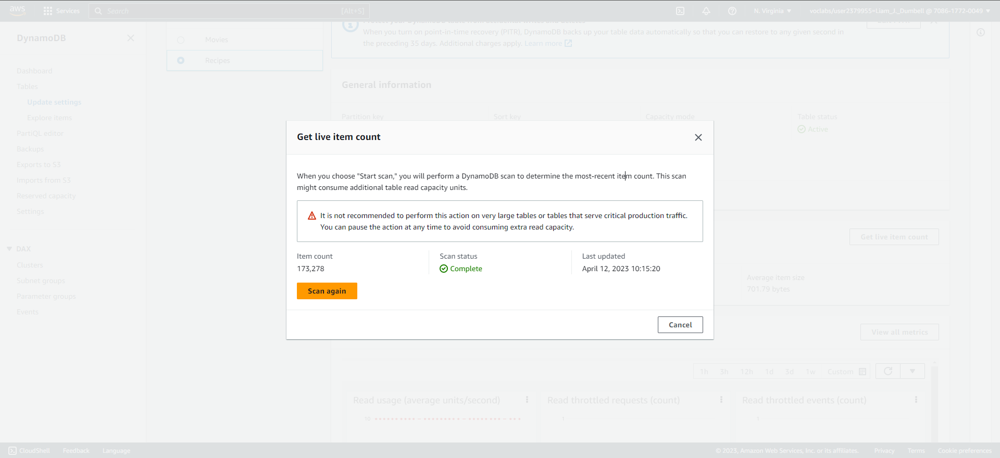

## Question 2a:
## Create a query or scan that finds recipes for breakfast foods (the description contains "breakfast" or "Breakfast"). How many are there?

In [2]:
import boto3
from boto3.dynamodb.conditions import Attr

dynamodb = boto3.resource('dynamodb', region_name='us-east-1') # find your region in your acct
table = dynamodb.Table('Recipes')

response = table.scan(
    FilterExpression=Attr('Info.description').contains('breakfast') | Attr('Info.description').contains('Breakfast')
    )
i = response['Count'] # stores number of filtered results

while 'LastEvaluatedKey' in response: # checks if the response contains a non NULL LastEvaluatedKey element
    response = table.scan(
        ExclusiveStartKey=response['LastEvaluatedKey'],
        FilterExpression=Attr('Info.description').contains('breakfast') | Attr('Info.description').contains('Breakfast')
    )
    i = i + response['Count']
        
print("Number of recipes for breakfast foods:", i)

Number of recipes for breakfast foods: 3524


## Question 2b:
## Issue a query or scan to find out how many of the recipes list "cinnamon/Cinnamon" as an ingredient.

In [1]:
import boto3
from boto3.dynamodb.conditions import Attr

dynamodb = boto3.resource('dynamodb', region_name='us-east-1') # find your region in your acct
table = dynamodb.Table('Recipes')

response = table.scan(
    Select='COUNT',
    FilterExpression=Attr('Info.ingredients').contains('cinnamon') | Attr('Info.ingredients').contains('Cinnamon')
    )

i = response['Count']

while 'LastEvaluatedKey' in response: # checks if the response contains a non NULL LastEvaluatedKey element
    response = table.scan(
        Select='COUNT',
        ExclusiveStartKey=response['LastEvaluatedKey'],
        FilterExpression=Attr('Info.ingredients').contains('cinnamon') | Attr('Info.ingredients').contains('Cinnamon')
    )
    i = i + response['Count']
        
print("Number of recipes with \"cinnamon\" / \"Cinnamon\" as an ingredient:", i)

Number of recipes with "cinnamon" / "Cinnamon" as an ingredient: 10526


## Question 2c:
## Issue a query or scan to find out how many of the recipes list misspelled "cinamon" as an ingredient.

In [2]:
import boto3
from boto3.dynamodb.conditions import Attr

dynamodb = boto3.resource('dynamodb', region_name='us-east-1') # find your region in your acct
table = dynamodb.Table('Recipes')

response = table.scan(
    Select='COUNT',
    FilterExpression=Attr('Info.ingredients').contains('cinamon')
    )

i = response['Count']

while 'LastEvaluatedKey' in response:
    response = table.scan(
        Select='COUNT',
        ExclusiveStartKey=response['LastEvaluatedKey'],
        FilterExpression=Attr('Info.ingredients').contains('cinamon')
    )
    i = i + response['Count']
        
print("number of recipes in list that misspelled \"cinamon\" as an ingredient:", i)

number of recipes in list that misspelled "cinamon" as an ingredient: 9
